In [1]:
import pandas as pd
import numpy as np
import os
from datetime import date
import datetime
import time
from tqdm import tqdm
import yfinance as yf
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, GRU, SimpleRNN, Dense, GlobalMaxPool1D
from tensorflow.keras.optimizers import SGD, Adam
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
pd.set_option('display.max_rows', 10000)

In [1]:
!pip install tensorflow

  Created wheel for wrapt: filename=wrapt-1.12.1-py3-none-any.whl size=19558 sha256=0431fc997317a0bbf6d58aaee47f1f699f613f8766eb0f682f72e816dff78745
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\62\76\4c\aa25851149f3f6d9785f6c869387ad82b3fd37582fa8147ac6
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30707 sha256=e39f168f29f8b16cc47b96f49e2e31901e8462487d4eaf7629a99d9244a57b91
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\98\91\04\971b4c587cf47ae952b108949b46926f426c02832d120a082a
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4835 sha256=9cefb43ded007b3500e207e98abdc57fd54247a10bf6ad85e6fbc96efb8e943c
  Stored in directory: c:\users\harta\appdata\local\pip\cache\wheels\3f\e3\ec\8a8336ff196023622fbcb36de0c5a5c218cbb24111d1d4c7f2
Successfully built wrapt clang termcolor
  Attempting uninstall: six
    Found existing installation: six 1.14.0
    Uninstalling six-1.14.0:
      Successfully un

ERROR: pytest-astropy 0.8.0 requires pytest-cov>=2.0, which is not installed.
ERROR: pytest-astropy 0.8.0 requires pytest-filter-subpackage>=0.1, which is not installed.
ERROR: astroid 2.3.3 requires typed-ast<1.5,>=1.4.0; implementation_name == "cpython" and python_version < "3.8", which is not installed.
ERROR: astroid 2.3.3 has requirement wrapt==1.11.*, but you'll have wrapt 1.12.1 which is incompatible.


In [2]:
df = pd.read_csv('df_long.csv')
df

,date,ticker,sector,industry,current_market_cap,current_institutional_ownership,current_institutional_transactions,current_float_short,current_short_ratio,current_performance_week,...,previous1_pca_pci22,previous1_pca_pci23,previous1_pca_pci24,previous1_pca_pci25,dv_5perc_inc_from_open,dv_2perc_inc_from_open,dv_1perc_inc_from_open,dv_close_up_from_open,dv_top_gainer,dv_doji
0,2021-10-01,A,Healthcare,Diagnostics & Research,47687.70,0.903,0.0100,0.0114,2.07,-0.0952,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0
1,2021-10-04,A,Healthcare,Diagnostics & Research,46577.98,0.903,0.0100,0.0114,2.07,-0.0843,...,-0.050033,0.033918,0.176511,0.010075,0.0,0.0,0.0,0.0,0.0,0
2,2021-10-05,A,Healthcare,Diagnostics & Research,46782.80,0.903,0.0100,0.0114,2.06,-0.0430,...,-0.001473,-0.007002,-0.031182,-0.029488,0.0,0.0,0.0,0.0,0.0,0
3,2021-10-06,A,Healthcare,Diagnostics & Research,46972.34,0.903,0.0100,0.0114,2.06,-0.0397,...,-0.048655,-0.006349,0.031267,-0.006401,NaN,NaN,NaN,1.0,NaN,0
4,2021-10-07,A,Healthcare,Diagnostics & Research,47482.88,0.903,0.0100,0.0114,2.07,-0.0140,...,-0.030008,-0.007827,-0.077060,-0.021561,NaN,NaN,NaN,1.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48330,2021-10-14,ZYXI,Healthcare,Medical Devices,430.93,0.316,-0.0003,0.1865,11.70,0.0989,...,0.020831,-0.055438,0.100984,0.006977,NaN,1.0,1.0,1.0,1.0,0
48331,2021-10-15,ZYXI,Healthcare,Medical Devices,428.61,0.317,-0.0015,0.1865,11.53,0.0815,...,-0.202690,-0.025783,-0.059067,0.075284,0.0,0.0,0.0,0.0,0.0,0
48332,2021-10-18,ZYXI,Healthcare,Medical Devices,428.25,0.317,-0.0015,0.1865,11.61,0.0797,...,-0.011468,-0.027872,-0.044912,-0.024264,0.0,0.0,0.0,0.0,0.0,0
48333,2021-10-19,ZYXI,Healthcare,Medical Devices,444.94,0.317,-0.0015,0.1865,11.95,0.1108,...,-0.028287,-0.004326,0.167848,0.016340,NaN,1.0,1.0,1.0,NaN,0


In [58]:
# test with one stock first
df_stock = df[df['ticker'] == 'AAPL']
#df_stock = df_stock[df_stock['date'] > '2021-10-01']
df_stock

,date,ticker,sector,industry,current_market_cap,current_institutional_ownership,current_institutional_transactions,current_float_short,current_short_ratio,current_performance_week,...,previous1_pca_pci22,previous1_pca_pci23,previous1_pca_pci24,previous1_pca_pci25,dv_5perc_inc_from_open,dv_2perc_inc_from_open,dv_1perc_inc_from_open,dv_close_up_from_open,dv_top_gainer,dv_doji
138,2021-10-01,AAPL,Technology,Consumer Electronics,2339019.11,0.588,-0.0057,0.0062,1.25,-0.0291,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0
139,2021-10-04,AAPL,Technology,Consumer Electronics,2281466.05,0.588,-0.0057,0.0062,1.24,-0.0429,...,1.022380,0.254351,0.042903,-0.083274,0.0,0.0,0.0,0.0,0.0,0
140,2021-10-05,AAPL,Technology,Consumer Electronics,2313767.98,0.588,-0.0057,0.0062,1.23,-0.0056,...,1.024260,0.260511,-0.156552,-0.128639,NaN,NaN,1.0,1.0,NaN,0
141,2021-10-06,AAPL,Technology,Consumer Electronics,2328361.22,0.588,-0.0057,0.0062,1.23,-0.0058,...,1.161996,0.312134,-0.281688,0.828315,NaN,NaN,1.0,1.0,NaN,0
142,2021-10-07,AAPL,Technology,Consumer Electronics,2349513.12,0.588,-0.0057,0.0062,1.24,0.0127,...,1.026398,0.241102,-0.173327,-0.130541,NaN,NaN,NaN,1.0,NaN,0
143,2021-10-08,AAPL,Technology,Consumer Electronics,2343118.34,0.588,-0.0057,0.0062,1.25,0.0018,...,1.025330,0.239893,-0.149291,-0.141410,0.0,0.0,0.0,0.0,0.0,0
144,2021-10-11,AAPL,Technology,Consumer Electronics,2367115.70,0.588,-0.0001,0.0062,1.26,0.0264,...,1.023192,0.259302,-0.132516,-0.139508,NaN,NaN,NaN,1.0,NaN,0
145,2021-10-12,AAPL,Technology,Consumer Electronics,2345567.78,0.588,-0.0001,0.0062,1.27,0.0028,...,0.999018,0.209555,0.031884,-0.095466,0.0,0.0,0.0,0.0,0.0,0
146,2021-10-13,AAPL,Technology,Consumer Electronics,2335622.77,0.588,-0.0001,0.0062,1.27,-0.0077,...,1.024260,0.260511,-0.156552,-0.128639,0.0,0.0,0.0,0.0,0.0,0
147,2021-10-14,AAPL,Technology,Consumer Electronics,2382862.16,0.588,-0.0001,0.0062,1.28,0.0033,...,1.007441,0.284058,0.056208,-0.088035,NaN,NaN,1.0,1.0,NaN,0


In [59]:
# setup data
feats = [x for x in df_stock.columns if x.startswith('previous1_pca')]
dv_col = ['dv_close_up_from_open']

X = df_stock[feats].values
Y = df_stock[dv_col].values

print(X.shape)
print(Y.shape)

(14, 30)
(14, 1)


In [30]:
Y

array([[1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [55]:
X

array([[-0.29840547,  0.29920429, -0.48962182, ...,  0.03391844,
         0.17651133,  0.01007501],
       [ 0.69848863,  0.07750124, -0.34603963, ..., -0.00700181,
        -0.03118219, -0.02948828],
       [ 0.37142969,  0.01892513, -0.29976096, ..., -0.00634937,
         0.03126662, -0.00640133],
       ...,
       [-0.65924495,  0.10681659,  0.41432572, ..., -0.02787246,
        -0.044912  , -0.02426419],
       [ 0.26863622, -0.22169358,  0.62134072, ..., -0.0043262 ,
         0.16784805,  0.01633972],
       [ 0.00622122, -0.19487887,  0.58362232, ..., -0.0472814 ,
        -0.06168702, -0.02616622]])

In [38]:
# Now make the actual data which will go into the neural network
T = 13 # the number of time steps to look at to make a prediction for the next day
D = X.shape[1] # number of features
N = len(X) - T # (e.g. if T=10 and you have 11 data points then you'd only have 1 sample of 10 rows)
print(T)
print(D)
print(N)

13
30
1


In [39]:
# Ntrain is the number of training samples - cannot be larger than N and will test on N - Ntrain 
# T is the number of timestamps (trading days) we want to LOOKBACK at to make predictions
# t is the training sample so each t will have T rows of data with D features
# the difference between t and t-1 is t is simply t-1 but shifted up one
Ntrain = 1 # size of training data 
Y_train = np.zeros(Ntrain)
X_train = np.zeros((Ntrain, T, D))
for t in range(Ntrain):
    X_train[t, :, :] = X[t:t+T]
    Y_train[t] = Y[t+T]
print(X_train.shape)
print(Y_train.shape)

(1, 13, 30)
(1,)


In [26]:
# Setup X_test and Y_test
X_test = np.zeros((N - Ntrain, T, D))
Y_test = np.zeros(N - Ntrain)

for u in range(N - Ntrain):
    # u counts from 0...(N - Ntrain)
    # t counts from Ntrain...N
    t = u + Ntrain
    X_test[u, :, :] = X[t:t+T]
    Y_test[u] = Y[t+T]
print(X_test.shape)
print(Y_test.shape)

(0, 13, 30)
(0,)


In [40]:
# make the RNN
i = Input(shape=(T, D)) # 10 trading days and 30 features
# return_sequences=True will return the predictions for each time step (trading day) in each sample
# otherwise it will just return the final prediction for that day
x = SimpleRNN(10, return_sequences=True)(i) # 50 hidden units
x = Dense(1, activation='sigmoid')(x) # Dense implements the activation function for 1 output class (predicting class 1)
model = Model(i, x)
model.compile(
  loss='binary_crossentropy',
  optimizer=Adam(lr=0.001),
  metrics=['accuracy'],
)

start = time.time()
# train the LSTM
r = model.fit(
  X_train, Y_train,
  epochs=20, # number of iterations 
  validation_data=(X_train, Y_train),
)
end = time.time()
print(end - start)

C:\Users\harta\anaconda3\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
1/1 [==============================] - 1s 852ms/step - loss: 0.7657 - accuracy: 0.3846 - val_loss: 0.7475 - val_accuracy: 0.4615
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7475 - accuracy: 0.4615 - val_loss: 0.7297 - val_accuracy: 0.5385
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7297 - accuracy: 0.5385 - val_loss: 0.7123 - val_accuracy: 0.5385
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.5385 - val_loss: 0.6952 - val_accuracy: 0.6154
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.6154 - val_loss: 0.6785 - val_accuracy: 0.6154
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6785 - accuracy: 0.6154 - val_loss: 0.6621 - val_accuracy: 0.6923
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.6923 - val_loss: 0.6460 - val_accuracy: 0.6923
Epoch 8/20
1/1 [==========

In [41]:
model.predict(X_train)

array([[[0.6545516 ],
        [0.51818264],
        [0.60774004],
        [0.50681204],
        [0.663463  ],
        [0.8002804 ],
        [0.6972407 ],
        [0.559323  ],
        [0.7314398 ],
        [0.6294626 ],
        [0.6071063 ],
        [0.6378951 ],
        [0.60328436]]], dtype=float32)

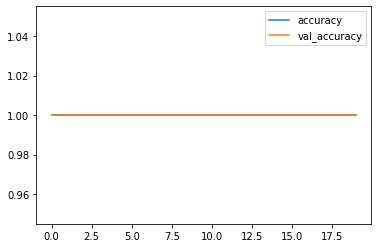

In [40]:
# Plot accuracy per iteration
plt.plot(r.history['accuracy'], label='accuracy')
plt.plot(r.history['val_accuracy'], label='val_accuracy')
plt.legend()
plt.show()

In [23]:
model.predict(X_test)[0].flatten()

array([0.6200661 , 0.6949121 , 0.75652397, 0.7882712 , 0.79868484,
       0.8118552 , 0.826396  , 0.82988656, 0.8297485 , 0.83718395,
       0.8250258 , 0.8044587 ], dtype=float32)

In [26]:
chk = {'stock': 'sdf', 'pred': model.predict(X_test)[0].flatten()} 
chk = pd.DataFrame(chk)
chk2 = chk.copy()
chk3 = pd.concat([chk2, chk])
chk3

,stock,pred
0,sdf,0.620066
1,sdf,0.694912
2,sdf,0.756524
3,sdf,0.788271
4,sdf,0.798685
5,sdf,0.811855
6,sdf,0.826396
7,sdf,0.829887
8,sdf,0.829749
9,sdf,0.837184


In [22]:
X_test.shape

(1, 12, 30)

In [24]:
X_test

array([[[ 6.96347614e-01,  2.13292650e-01, -1.29564157e-01,
          5.50141825e-02, -1.78474759e-01,  1.24061902e+00,
          1.21958784e-01,  4.42775106e-01,  7.60038525e-01,
          2.98301190e-01,  7.41627570e-02,  3.94823365e-01,
         -1.56541402e-01, -3.38132050e-02,  1.29913639e-01,
         -3.74659928e-02, -6.27984747e-02, -1.90806167e-01,
         -1.31991280e-01,  2.85249370e-02,  1.13019388e-02,
         -9.06618246e-02,  1.12404851e-01, -2.31067583e-03,
          9.62703273e-02,  4.19476574e-02,  1.02425975e+00,
          2.60511363e-01, -1.56552473e-01, -1.28638597e-01],
        [ 3.67665842e-01,  1.48447486e-01, -8.81932336e-02,
          8.27205947e-02, -1.52832693e-01,  5.18265569e-01,
         -1.07744671e+00,  5.24705787e-01,  6.75886457e-01,
          2.81651452e-01,  6.04845866e-02,  4.18058836e-01,
         -1.30013814e-01, -1.14358894e-01,  9.90903462e-02,
         -5.30907711e-02, -4.23812268e-02, -7.68274261e-02,
         -1.30580126e-01, -1.22306230e-

In [26]:
df_stock[dv_col + ['date'] + feats]

,dv_close_up_from_open,date,current_pca_cont1,current_pca_cont2,current_pca_cont3,current_pca_cont4,current_pca_cont5,current_pca_pci1,current_pca_pci2,current_pca_pci3,...,current_pca_pci16,current_pca_pci17,current_pca_pci18,current_pca_pci19,current_pca_pci20,current_pca_pci21,current_pca_pci22,current_pca_pci23,current_pca_pci24,current_pca_pci25
138,1.0,2021-10-01,-0.301803,0.430878,-0.275940,0.088418,-0.152541,0.443011,-0.985240,0.519162,...,-0.170370,0.142427,0.700640,-0.410140,-0.036592,-0.370839,1.022380,0.254351,0.042903,-0.083274
139,0.0,2021-10-04,0.696348,0.213293,-0.129564,0.055014,-0.178475,1.240619,0.121959,0.442775,...,0.011302,-0.090662,0.112405,-0.002311,0.096270,0.041948,1.024260,0.260511,-0.156552,-0.128639
140,1.0,2021-10-05,0.367666,0.148447,-0.088193,0.082721,-0.152833,0.518266,-1.077447,0.524706,...,0.004143,-0.098233,0.146986,0.037363,0.116536,0.060509,1.161996,0.312134,-0.281688,0.828315
141,1.0,2021-10-06,0.128629,0.217829,-0.136444,0.095511,-0.141117,0.516390,-1.074093,0.538359,...,0.001513,-0.102357,0.155875,0.035150,0.103164,0.039368,1.026398,0.241102,-0.173327,-0.130541
142,1.0,2021-10-07,-0.186013,0.175460,-0.106228,0.108652,-0.130375,0.329492,-1.014027,-0.199879,...,-0.009792,-0.089143,0.110301,0.048951,0.165444,0.043924,1.025330,0.239893,-0.149291,-0.141410
143,0.0,2021-10-08,-0.453976,0.206029,-0.117746,0.095361,-0.140636,1.053721,0.182025,-0.295463,...,-0.000003,-0.077448,0.066831,0.011490,0.158550,0.046504,1.023192,0.259302,-0.132516,-0.139508
144,1.0,2021-10-11,0.500041,-0.085233,0.060328,0.111850,-0.133137,1.193187,0.133638,-0.350431,...,0.759289,-0.354686,-0.084495,-0.277794,0.202919,-0.299955,0.999018,0.209555,0.031884,-0.095466
145,0.0,2021-10-12,0.273135,0.008033,0.009241,0.086248,-0.152522,1.240619,0.121959,0.442775,...,0.011302,-0.090662,0.112405,-0.002311,0.096270,0.041948,1.024260,0.260511,-0.156552,-0.128639
146,0.0,2021-10-13,-0.023058,-0.002040,0.028733,0.066951,-0.166739,1.231532,0.126864,0.441483,...,-0.146016,0.178014,0.677889,-0.429063,-0.053295,-0.364853,1.007441,0.284058,0.056208,-0.088035
147,1.0,2021-10-14,-0.360527,-0.082601,0.074860,0.111416,-0.129564,-0.859134,-0.341596,-0.431192,...,0.062083,0.002429,0.068177,0.019809,0.132182,0.066088,1.038632,0.242491,-0.175939,-0.141067


In [46]:
# make predictions after running model.fit
model.predict(X_test)[0][0]

0.69304156

In [43]:
model.predict(X_train)

array([[0.6592573],
       [0.6802551],
       [0.6974623]], dtype=float32)

In [51]:
Y

array([[1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [45]:
X_train

array([[[            nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan,
                     nan,             nan,             nan],
        [-3.05169754e-01,  4.46565391e-01, -2.43986222e-01,
         -5.75993591e-02,  1.21480577e-01, -8.34194292e-01,
         -2.20715060e-01, -3.13041087e-01, -2.87104997e-01,
         -3.66461776e-01,  3.18617497e-01,  7.59555927e-01,
          3.22976492e-01,  5.10652580e-02, -3.22884503e-01,
         -2.15004679e-01, -1.72316418e-01,  9.18003092e-02,
         -1.45771891e-01,  5.94102344e-

In [60]:
# get predictions for all stocks
# only for stocks that have data for all 14 days
tickers = df[['ticker', 'date']].groupby('ticker').count().reset_index()
tickers = np.unique(tickers[tickers['date'] == 14]['ticker']).tolist()
feats = [x for x in df.columns if x.startswith('previous1_pca')] # testing with previous pca
dv_col = ['dv_close_up_from_open'] 
predictions = []
stock = []
true_val = []
prediction_steps = pd.DataFrame()

for i in tqdm(tickers):
    df_filt = df[df['ticker'] == i]
    df_filt = df_filt[df_filt['date'] > '2021-10-01'] # need to remove na for previous pca for first row
    
    X = df_filt[feats].values
    Y = df_filt[dv_col].values
    
    T = 11 # the number of time steps to look at to make a prediction for the next day
    D = X.shape[1] # number of features
    N = len(X) - T # (e.g. if T=10 and you have 11 data points then you'd only have 1 sample of 10 rows)
    Ntrain = 1 # size of training data
    
    Y_train = np.zeros(Ntrain)
    X_train = np.zeros((Ntrain, T, D))
    X_test = np.zeros((N - Ntrain, T, D))
    Y_test = np.zeros(N - Ntrain)
    
    for t in range(Ntrain):
        X_train[t, :, :] = X[t:t+T]
        Y_train[t] = Y[t+T]
    
    for u in range(N - Ntrain):
        # u counts from 0...(N - Ntrain)
        # t counts from Ntrain...N
        t = u + Ntrain
        X_test[u, :, :] = X[t:t+T]
        Y_test[u] = Y[t+T]
    
    # make the RNN
    inp = Input(shape=(T, D)) # 10 trading days and 30 features
    # return_sequences=True will return the predictions for each time step (trading day) in each sample (hidden states)
    # otherwise it will just return the final prediction for that day
    x = SimpleRNN(10, return_sequences=True)(inp) # 50 hidden units
    #x = GlobalMaxPool1D()(x) # 50 hidden units
    x = Dense(1, activation='sigmoid')(x) # Dense implements the activation function for 1 output class (predicting class 1)
    model = Model(inp, x)
    model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])
    
    # train the LSTM
    r = model.fit(X_train, Y_train, epochs=20, validation_data=(X_test, Y_test))
    
    # get prediction for next day
    predictions.append(model.predict(X_test)[0][0])
    stock.append(i)
    true_val.append(Y_test[-1])
    
    ## get output prediction for each step size
    #temp_df = {'ticker': i, 'date': df_filt['date'][1:T + 1], 'prediction': model.predict(X_train)[0].flatten()}
    #temp_df = pd.DataFrame(temp_df)
    #prediction_steps = pd.concat([prediction_steps, temp_df])
final_dict = {'stock': stock, 'prediction': predictions, 'outcome': true_val} 
final_df = pd.DataFrame(final_dict)
final_df





  0%|                                                                                                                                                                                                            | 0/3072 [00:00<?, ?it/s]C:\Users\harta\anaconda3\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.9380 - accuracy: 0.2727 - val_loss: 0.5180 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9197 - accuracy: 0.2727 - val_loss: 0.5312 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9016 - accuracy: 0.3636 - val_loss: 0.5447 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8837 - accuracy: 0.3636 - val_loss: 0.5586 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8659 - accuracy: 0.3636 - val_loss: 0.5727 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8484 - accuracy: 0.3636 - val_loss: 0.5871 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8310 - accuracy: 0.3636 - val_loss: 0.6018 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  0%|                                                                                                                                                                                                    | 1/3072 [00:01<59:50,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.8681 - accuracy: 0.4545 - val_loss: 0.6465 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8570 - accuracy: 0.4545 - val_loss: 0.6562 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8462 - accuracy: 0.4545 - val_loss: 0.6658 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8355 - accuracy: 0.4545 - val_loss: 0.6755 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8250 - accuracy: 0.4545 - val_loss: 0.6851 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8147 - accuracy: 0.4545 - val_loss: 0.6947 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8046 - accuracy: 0.4545 - val_loss: 0.7042 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  0%|▏                                                                                                                                                                                                   | 2/3072 [00:02<59:42,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.5947 - accuracy: 0.6364 - val_loss: 0.6135 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5852 - accuracy: 0.7273 - val_loss: 0.6039 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5759 - accuracy: 0.7273 - val_loss: 0.5945 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5667 - accuracy: 0.7273 - val_loss: 0.5851 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5577 - accuracy: 0.7273 - val_loss: 0.5759 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.7273 - val_loss: 0.5667 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5401 - accuracy: 0.8182 - val_loss: 0.5577 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  0%|▏                                                                                                                                                                                                 | 3/3072 [00:03<1:02:19,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.7595 - accuracy: 0.3636 - val_loss: 0.7568 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7471 - accuracy: 0.4545 - val_loss: 0.7659 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7350 - accuracy: 0.4545 - val_loss: 0.7748 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7234 - accuracy: 0.4545 - val_loss: 0.7834 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7121 - accuracy: 0.4545 - val_loss: 0.7919 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7012 - accuracy: 0.4545 - val_loss: 0.8002 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6906 - accuracy: 0.4545 - val_loss: 0.8083 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  0%|▎                                                                                                                                                                                                 | 4/3072 [00:04<1:01:18,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7986 - accuracy: 0.4545 - val_loss: 0.6584 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7785 - accuracy: 0.4545 - val_loss: 0.6412 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7590 - accuracy: 0.5455 - val_loss: 0.6245 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7400 - accuracy: 0.5455 - val_loss: 0.6084 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7217 - accuracy: 0.5455 - val_loss: 0.5928 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7039 - accuracy: 0.6364 - val_loss: 0.5777 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6868 - accuracy: 0.6364 - val_loss: 0.5631 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  0%|▎                                                                                                                                                                                                 | 5/3072 [00:05<1:00:41,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.8298 - accuracy: 0.4545 - val_loss: 0.9303 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8134 - accuracy: 0.4545 - val_loss: 0.9147 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7970 - accuracy: 0.4545 - val_loss: 0.8989 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7806 - accuracy: 0.4545 - val_loss: 0.8829 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7642 - accuracy: 0.4545 - val_loss: 0.8669 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7479 - accuracy: 0.5455 - val_loss: 0.8508 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.6364 - val_loss: 0.8346 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  0%|▍                                                                                                                                                                                                 | 6/3072 [00:07<1:00:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8269 - accuracy: 0.1818 - val_loss: 0.7691 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.1818 - val_loss: 0.7578 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7987 - accuracy: 0.1818 - val_loss: 0.7468 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7854 - accuracy: 0.2727 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7726 - accuracy: 0.2727 - val_loss: 0.7259 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7602 - accuracy: 0.2727 - val_loss: 0.7158 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7482 - accuracy: 0.2727 - val_loss: 0.7061 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  0%|▍                                                                                                                                                                                                   | 7/3072 [00:08<59:59,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 829ms/step - loss: 0.6821 - accuracy: 0.5455 - val_loss: 0.7308 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6731 - accuracy: 0.5455 - val_loss: 0.7397 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6642 - accuracy: 0.5455 - val_loss: 0.7487 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6553 - accuracy: 0.5455 - val_loss: 0.7577 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.5455 - val_loss: 0.7668 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6379 - accuracy: 0.6364 - val_loss: 0.7760 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6294 - accuracy: 0.7273 - val_loss: 0.7852 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  0%|▌                                                                                                                                                                                                 | 8/3072 [00:09<1:02:38,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.7230 - accuracy: 0.3636 - val_loss: 0.6885 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7100 - accuracy: 0.3636 - val_loss: 0.6994 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6971 - accuracy: 0.4545 - val_loss: 0.7104 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6842 - accuracy: 0.5455 - val_loss: 0.7217 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6715 - accuracy: 0.7273 - val_loss: 0.7333 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6590 - accuracy: 0.7273 - val_loss: 0.7452 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6465 - accuracy: 0.7273 - val_loss: 0.7573 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  0%|▌                                                                                                                                                                                                 | 9/3072 [00:10<1:01:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6721 - accuracy: 0.7273 - val_loss: 0.7126 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6399 - accuracy: 0.7273 - val_loss: 0.6788 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6093 - accuracy: 0.7273 - val_loss: 0.6470 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5803 - accuracy: 0.7273 - val_loss: 0.6174 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5531 - accuracy: 0.7273 - val_loss: 0.5899 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5277 - accuracy: 0.7273 - val_loss: 0.5647 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5042 - accuracy: 0.8182 - val_loss: 0.5415 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  0%|▋                                                                                                                                                                                                | 10/3072 [00:11<1:00:36,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.8629 - accuracy: 0.2727 - val_loss: 0.7590 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8437 - accuracy: 0.2727 - val_loss: 0.7433 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8249 - accuracy: 0.2727 - val_loss: 0.7279 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8064 - accuracy: 0.3636 - val_loss: 0.7128 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7884 - accuracy: 0.3636 - val_loss: 0.6980 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7708 - accuracy: 0.5455 - val_loss: 0.6836 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7536 - accuracy: 0.5455 - val_loss: 0.6694 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  0%|▋                                                                                                                                                                                                  | 11/3072 [00:13<59:56,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.7399 - accuracy: 0.3636 - val_loss: 0.7435 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7283 - accuracy: 0.3636 - val_loss: 0.7545 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7169 - accuracy: 0.3636 - val_loss: 0.7656 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.3636 - val_loss: 0.7768 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6945 - accuracy: 0.3636 - val_loss: 0.7881 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6835 - accuracy: 0.4545 - val_loss: 0.7996 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6727 - accuracy: 0.5455 - val_loss: 0.8111 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  0%|▊                                                                                                                                                                                                  | 12/3072 [00:14<59:34,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 835ms/step - loss: 0.6060 - accuracy: 0.7273 - val_loss: 0.6545 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5870 - accuracy: 0.7273 - val_loss: 0.6349 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5682 - accuracy: 0.7273 - val_loss: 0.6157 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5498 - accuracy: 0.8182 - val_loss: 0.5968 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5318 - accuracy: 0.8182 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5143 - accuracy: 0.9091 - val_loss: 0.5603 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4974 - accuracy: 0.9091 - val_loss: 0.5428 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  0%|▊                                                                                                                                                                                                | 13/3072 [00:15<1:02:26,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6387 - accuracy: 0.6364 - val_loss: 0.5593 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6215 - accuracy: 0.6364 - val_loss: 0.5442 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6051 - accuracy: 0.7273 - val_loss: 0.5298 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5894 - accuracy: 0.7273 - val_loss: 0.5160 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5744 - accuracy: 0.7273 - val_loss: 0.5028 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5601 - accuracy: 0.7273 - val_loss: 0.4902 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5464 - accuracy: 0.7273 - val_loss: 0.4781 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  0%|▉                                                                                                                                                                                                | 14/3072 [00:16<1:01:31,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.9142 - accuracy: 0.4545 - val_loss: 0.5762 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8993 - accuracy: 0.4545 - val_loss: 0.5856 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8845 - accuracy: 0.4545 - val_loss: 0.5951 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8698 - accuracy: 0.4545 - val_loss: 0.6045 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8552 - accuracy: 0.5455 - val_loss: 0.6141 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8407 - accuracy: 0.5455 - val_loss: 0.6236 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8264 - accuracy: 0.5455 - val_loss: 0.6332 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  0%|▉                                                                                                                                                                                                | 15/3072 [00:17<1:00:40,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5603 - accuracy: 0.5455 - val_loss: 0.5680 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5433 - accuracy: 0.5455 - val_loss: 0.5518 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5267 - accuracy: 0.7273 - val_loss: 0.5361 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5104 - accuracy: 0.7273 - val_loss: 0.5210 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4946 - accuracy: 0.7273 - val_loss: 0.5065 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4794 - accuracy: 0.8182 - val_loss: 0.4926 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4648 - accuracy: 0.9091 - val_loss: 0.4793 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  1%|█                                                                                                                                                                                                | 16/3072 [00:19<1:00:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 801ms/step - loss: 0.8784 - accuracy: 0.4545 - val_loss: 0.8199 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8566 - accuracy: 0.4545 - val_loss: 0.8010 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8354 - accuracy: 0.4545 - val_loss: 0.7826 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8147 - accuracy: 0.4545 - val_loss: 0.7647 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7947 - accuracy: 0.4545 - val_loss: 0.7472 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7751 - accuracy: 0.4545 - val_loss: 0.7301 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.4545 - val_loss: 0.7134 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  1%|█                                                                                                                                                                                                | 17/3072 [00:20<1:02:27,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.8138 - accuracy: 0.3636 - val_loss: 0.6581 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8004 - accuracy: 0.4545 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7872 - accuracy: 0.4545 - val_loss: 0.6779 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7741 - accuracy: 0.4545 - val_loss: 0.6879 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7611 - accuracy: 0.4545 - val_loss: 0.6981 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7482 - accuracy: 0.4545 - val_loss: 0.7084 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7355 - accuracy: 0.4545 - val_loss: 0.7188 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  1%|█▏                                                                                                                                                                                               | 18/3072 [00:21<1:01:20,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6858 - accuracy: 0.5455 - val_loss: 0.7285 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.7458 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6521 - accuracy: 0.5455 - val_loss: 0.7632 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6360 - accuracy: 0.5455 - val_loss: 0.7806 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6203 - accuracy: 0.5455 - val_loss: 0.7981 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6051 - accuracy: 0.7273 - val_loss: 0.8156 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5903 - accuracy: 0.8182 - val_loss: 0.8332 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|█▏                                                                                                                                                                                               | 19/3072 [00:22<1:00:27,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8370 - accuracy: 0.0909 - val_loss: 0.5812 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8246 - accuracy: 0.0909 - val_loss: 0.5907 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8126 - accuracy: 0.0909 - val_loss: 0.6001 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8008 - accuracy: 0.1818 - val_loss: 0.6095 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7893 - accuracy: 0.1818 - val_loss: 0.6188 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7782 - accuracy: 0.1818 - val_loss: 0.6280 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7674 - accuracy: 0.2727 - val_loss: 0.6371 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  1%|█▎                                                                                                                                                                                                 | 20/3072 [00:23<59:56,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6849 - accuracy: 0.7273 - val_loss: 0.7365 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6758 - accuracy: 0.8182 - val_loss: 0.7433 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6667 - accuracy: 0.8182 - val_loss: 0.7501 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6578 - accuracy: 0.8182 - val_loss: 0.7569 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6491 - accuracy: 0.8182 - val_loss: 0.7638 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6404 - accuracy: 0.8182 - val_loss: 0.7707 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6319 - accuracy: 0.8182 - val_loss: 0.7776 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  1%|█▎                                                                                                                                                                                                 | 21/3072 [00:25<59:34,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 836ms/step - loss: 0.7687 - accuracy: 0.5455 - val_loss: 0.7690 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7545 - accuracy: 0.5455 - val_loss: 0.7557 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7402 - accuracy: 0.7273 - val_loss: 0.7425 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7260 - accuracy: 0.7273 - val_loss: 0.7293 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7118 - accuracy: 0.7273 - val_loss: 0.7161 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6976 - accuracy: 0.7273 - val_loss: 0.7029 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6834 - accuracy: 0.7273 - val_loss: 0.6897 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  1%|█▍                                                                                                                                                                                               | 22/3072 [00:26<1:02:23,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.7894 - accuracy: 0.4545 - val_loss: 0.5941 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7529 - accuracy: 0.5455 - val_loss: 0.6151 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7168 - accuracy: 0.6364 - val_loss: 0.6371 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6812 - accuracy: 0.6364 - val_loss: 0.6603 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6464 - accuracy: 0.6364 - val_loss: 0.6848 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 25ms/step - loss: 0.6126 - accuracy: 0.6364 - val_loss: 0.7106 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5800 - accuracy: 0.7273 - val_loss: 0.7376 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|█▍                                                                                                                                                                                               | 23/3072 [00:27<1:01:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6648 - accuracy: 0.6364 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6557 - accuracy: 0.6364 - val_loss: 0.6468 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.6364 - val_loss: 0.6383 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6375 - accuracy: 0.7273 - val_loss: 0.6300 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6286 - accuracy: 0.7273 - val_loss: 0.6218 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6197 - accuracy: 0.7273 - val_loss: 0.6136 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6109 - accuracy: 0.7273 - val_loss: 0.6055 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  1%|█▌                                                                                                                                                                                               | 24/3072 [00:28<1:00:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5010 - accuracy: 0.8182 - val_loss: 1.1286 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4901 - accuracy: 0.8182 - val_loss: 1.1491 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4795 - accuracy: 0.8182 - val_loss: 1.1700 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4690 - accuracy: 0.8182 - val_loss: 1.1911 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4587 - accuracy: 0.9091 - val_loss: 1.2126 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4485 - accuracy: 0.9091 - val_loss: 1.2344 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4386 - accuracy: 0.9091 - val_loss: 1.2566 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





  1%|█▌                                                                                                                                                                                                 | 25/3072 [00:29<59:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7165 - accuracy: 0.7273 - val_loss: 0.7149 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7006 - accuracy: 0.7273 - val_loss: 0.7299 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6849 - accuracy: 0.7273 - val_loss: 0.7451 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6694 - accuracy: 0.7273 - val_loss: 0.7604 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.7273 - val_loss: 0.7758 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6391 - accuracy: 0.7273 - val_loss: 0.7914 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6242 - accuracy: 0.7273 - val_loss: 0.8071 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|█▋                                                                                                                                                                                                 | 26/3072 [00:31<59:32,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 622ms/step - loss: 1.2339 - accuracy: 0.0909 - val_loss: 0.3648 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2129 - accuracy: 0.0909 - val_loss: 0.3733 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1919 - accuracy: 0.0909 - val_loss: 0.3821 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1709 - accuracy: 0.0909 - val_loss: 0.3912 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1498 - accuracy: 0.0909 - val_loss: 0.4005 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1288 - accuracy: 0.0909 - val_loss: 0.4102 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1078 - accuracy: 0.0909 - val_loss: 0.4201 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  1%|█▋                                                                                                                                                                                               | 27/3072 [00:32<1:02:13,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 624ms/step - loss: 0.7073 - accuracy: 0.6364 - val_loss: 0.7273 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6895 - accuracy: 0.6364 - val_loss: 0.7429 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6719 - accuracy: 0.6364 - val_loss: 0.7588 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6545 - accuracy: 0.6364 - val_loss: 0.7750 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6374 - accuracy: 0.6364 - val_loss: 0.7916 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.6364 - val_loss: 0.8086 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6038 - accuracy: 0.6364 - val_loss: 0.8261 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  1%|█▊                                                                                                                                                                                               | 28/3072 [00:33<1:00:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6484 - accuracy: 0.5455 - val_loss: 1.0046 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6388 - accuracy: 0.5455 - val_loss: 1.0114 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6291 - accuracy: 0.5455 - val_loss: 1.0185 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6195 - accuracy: 0.5455 - val_loss: 1.0259 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6100 - accuracy: 0.5455 - val_loss: 1.0337 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6005 - accuracy: 0.5455 - val_loss: 1.0418 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5910 - accuracy: 0.5455 - val_loss: 1.0502 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  1%|█▊                                                                                                                                                                                               | 29/3072 [00:34<1:00:15,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.1006 - accuracy: 0.0000e+00 - val_loss: 0.4552 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0828 - accuracy: 0.0000e+00 - val_loss: 0.4645 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0653 - accuracy: 0.0000e+00 - val_loss: 0.4737 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0481 - accuracy: 0.0000e+00 - val_loss: 0.4829 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0311 - accuracy: 0.0000e+00 - val_loss: 0.4921 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0144 - accuracy: 0.0000e+00 - val_loss: 0.5014 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9980 - accuracy: 0.0000e+00 - val_loss: 0.5107 - val_accuracy: 0.818





  1%|█▉                                                                                                                                                                                                 | 30/3072 [00:35<59:45,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 1.3058 - accuracy: 0.0000e+00 - val_loss: 0.3501 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2842 - accuracy: 0.0000e+00 - val_loss: 0.3587 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2627 - accuracy: 0.0000e+00 - val_loss: 0.3674 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2413 - accuracy: 0.0000e+00 - val_loss: 0.3762 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2201 - accuracy: 0.0000e+00 - val_loss: 0.3852 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1990 - accuracy: 0.0000e+00 - val_loss: 0.3943 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1782 - accuracy: 0.0000e+00 - val_loss: 0.4035 - val_accuracy: 0.909





  1%|█▉                                                                                                                                                                                               | 31/3072 [00:37<1:02:10,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.7467 - accuracy: 0.4545 - val_loss: 0.8056 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7297 - accuracy: 0.4545 - val_loss: 0.7898 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7131 - accuracy: 0.4545 - val_loss: 0.7742 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6968 - accuracy: 0.4545 - val_loss: 0.7590 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.4545 - val_loss: 0.7440 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6654 - accuracy: 0.4545 - val_loss: 0.7292 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6502 - accuracy: 0.6364 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  1%|██                                                                                                                                                                                               | 32/3072 [00:38<1:01:00,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.6055 - accuracy: 0.7273 - val_loss: 0.8986 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5961 - accuracy: 0.7273 - val_loss: 0.9096 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5868 - accuracy: 0.7273 - val_loss: 0.9208 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.8182 - val_loss: 0.9324 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5681 - accuracy: 0.8182 - val_loss: 0.9442 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5588 - accuracy: 0.8182 - val_loss: 0.9563 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5495 - accuracy: 0.8182 - val_loss: 0.9688 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  1%|██                                                                                                                                                                                               | 33/3072 [00:39<1:00:08,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.7171 - accuracy: 0.7273 - val_loss: 0.7533 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7093 - accuracy: 0.7273 - val_loss: 0.7593 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.7273 - val_loss: 0.7653 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.7273 - val_loss: 0.7713 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6859 - accuracy: 0.7273 - val_loss: 0.7775 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6781 - accuracy: 0.7273 - val_loss: 0.7837 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.7273 - val_loss: 0.7900 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|██▏                                                                                                                                                                                                | 34/3072 [00:40<59:37,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.7381 - accuracy: 0.5455 - val_loss: 0.7518 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7256 - accuracy: 0.6364 - val_loss: 0.7377 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7132 - accuracy: 0.7273 - val_loss: 0.7238 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7009 - accuracy: 0.7273 - val_loss: 0.7100 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6886 - accuracy: 0.7273 - val_loss: 0.6963 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6765 - accuracy: 0.7273 - val_loss: 0.6828 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6645 - accuracy: 0.7273 - val_loss: 0.6696 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  1%|██▏                                                                                                                                                                                                | 35/3072 [00:41<59:08,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.6654 - accuracy: 0.3636 - val_loss: 0.7301 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6481 - accuracy: 0.6364 - val_loss: 0.7461 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6310 - accuracy: 0.7273 - val_loss: 0.7624 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6141 - accuracy: 0.7273 - val_loss: 0.7789 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5976 - accuracy: 0.8182 - val_loss: 0.7957 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5813 - accuracy: 0.9091 - val_loss: 0.8127 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5654 - accuracy: 0.9091 - val_loss: 0.8301 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  1%|██▎                                                                                                                                                                                              | 36/3072 [00:43<1:02:01,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.6973 - accuracy: 0.4545 - val_loss: 0.7987 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6859 - accuracy: 0.4545 - val_loss: 0.8079 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6746 - accuracy: 0.5455 - val_loss: 0.8175 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6632 - accuracy: 0.6364 - val_loss: 0.8275 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6518 - accuracy: 0.6364 - val_loss: 0.8378 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6404 - accuracy: 0.6364 - val_loss: 0.8486 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6290 - accuracy: 0.6364 - val_loss: 0.8599 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|██▎                                                                                                                                                                                              | 37/3072 [00:44<1:00:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7002 - accuracy: 0.5455 - val_loss: 0.6952 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6897 - accuracy: 0.5455 - val_loss: 0.6861 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6792 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.6589 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6478 - accuracy: 0.5455 - val_loss: 0.6500 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6374 - accuracy: 0.5455 - val_loss: 0.6411 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  1%|██▍                                                                                                                                                                                              | 38/3072 [00:45<1:00:09,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.9036 - accuracy: 0.1818 - val_loss: 0.6786 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8872 - accuracy: 0.1818 - val_loss: 0.6881 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8710 - accuracy: 0.1818 - val_loss: 0.6976 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8548 - accuracy: 0.1818 - val_loss: 0.7072 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8389 - accuracy: 0.1818 - val_loss: 0.7169 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8231 - accuracy: 0.1818 - val_loss: 0.7267 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8074 - accuracy: 0.1818 - val_loss: 0.7365 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  1%|██▍                                                                                                                                                                                                | 39/3072 [00:46<59:31,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5920 - accuracy: 0.9091 - val_loss: 0.5473 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5837 - accuracy: 0.9091 - val_loss: 0.5387 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5755 - accuracy: 0.9091 - val_loss: 0.5301 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5673 - accuracy: 0.9091 - val_loss: 0.5216 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5591 - accuracy: 0.9091 - val_loss: 0.5131 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5510 - accuracy: 0.9091 - val_loss: 0.5047 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5430 - accuracy: 0.9091 - val_loss: 0.4964 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  1%|██▌                                                                                                                                                                                                | 40/3072 [00:47<59:10,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 832ms/step - loss: 0.7611 - accuracy: 0.3636 - val_loss: 0.6807 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7535 - accuracy: 0.3636 - val_loss: 0.6859 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7459 - accuracy: 0.3636 - val_loss: 0.6914 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7381 - accuracy: 0.3636 - val_loss: 0.6970 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7303 - accuracy: 0.3636 - val_loss: 0.7027 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7224 - accuracy: 0.3636 - val_loss: 0.7087 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7144 - accuracy: 0.3636 - val_loss: 0.7149 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  1%|██▌                                                                                                                                                                                              | 41/3072 [00:49<1:01:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 1.0247 - accuracy: 0.0909 - val_loss: 0.4478 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0073 - accuracy: 0.0909 - val_loss: 0.4563 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9899 - accuracy: 0.0909 - val_loss: 0.4650 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9726 - accuracy: 0.0909 - val_loss: 0.4738 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9553 - accuracy: 0.0909 - val_loss: 0.4829 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9381 - accuracy: 0.0909 - val_loss: 0.4922 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9209 - accuracy: 0.1818 - val_loss: 0.5017 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  1%|██▋                                                                                                                                                                                              | 42/3072 [00:50<1:00:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.4812 - accuracy: 0.7273 - val_loss: 0.5567 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4699 - accuracy: 0.7273 - val_loss: 0.5452 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4589 - accuracy: 0.7273 - val_loss: 0.5339 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4480 - accuracy: 0.9091 - val_loss: 0.5227 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4373 - accuracy: 0.9091 - val_loss: 0.5116 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4268 - accuracy: 1.0000 - val_loss: 0.5007 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4165 - accuracy: 1.0000 - val_loss: 0.4899 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  1%|██▋                                                                                                                                                                                              | 43/3072 [00:51<1:00:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 1.0072 - accuracy: 0.2727 - val_loss: 0.5713 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9905 - accuracy: 0.2727 - val_loss: 0.5809 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9743 - accuracy: 0.2727 - val_loss: 0.5905 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9585 - accuracy: 0.2727 - val_loss: 0.5999 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9433 - accuracy: 0.2727 - val_loss: 0.6091 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9285 - accuracy: 0.2727 - val_loss: 0.6182 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9142 - accuracy: 0.2727 - val_loss: 0.6271 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  1%|██▊                                                                                                                                                                                                | 44/3072 [00:52<59:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.9072 - accuracy: 0.1818 - val_loss: 0.8858 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8936 - accuracy: 0.1818 - val_loss: 0.8731 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8801 - accuracy: 0.1818 - val_loss: 0.8605 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8667 - accuracy: 0.1818 - val_loss: 0.8479 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8532 - accuracy: 0.2727 - val_loss: 0.8353 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8398 - accuracy: 0.2727 - val_loss: 0.8229 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8265 - accuracy: 0.2727 - val_loss: 0.8105 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  1%|██▊                                                                                                                                                                                              | 45/3072 [00:53<1:01:42,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.9963 - accuracy: 0.0000e+00 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9852 - accuracy: 0.0000e+00 - val_loss: 0.4974 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9742 - accuracy: 0.0000e+00 - val_loss: 0.5039 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9632 - accuracy: 0.0000e+00 - val_loss: 0.5104 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9523 - accuracy: 0.0000e+00 - val_loss: 0.5170 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9413 - accuracy: 0.0000e+00 - val_loss: 0.5238 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9304 - accuracy: 0.0000e+00 - val_loss: 0.5307 - val_accuracy: 1.000





  1%|██▉                                                                                                                                                                                              | 46/3072 [00:55<1:00:36,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7316 - accuracy: 0.7273 - val_loss: 0.7211 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7167 - accuracy: 0.7273 - val_loss: 0.7078 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7020 - accuracy: 0.7273 - val_loss: 0.6946 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6874 - accuracy: 0.7273 - val_loss: 0.6813 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6728 - accuracy: 0.7273 - val_loss: 0.6682 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6584 - accuracy: 0.7273 - val_loss: 0.6550 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6440 - accuracy: 0.7273 - val_loss: 0.6419 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  2%|██▉                                                                                                                                                                                                | 47/3072 [00:56<59:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 1.1756 - accuracy: 0.1818 - val_loss: 0.4597 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1515 - accuracy: 0.1818 - val_loss: 0.4683 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1280 - accuracy: 0.1818 - val_loss: 0.4770 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1048 - accuracy: 0.1818 - val_loss: 0.4859 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0822 - accuracy: 0.1818 - val_loss: 0.4951 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0600 - accuracy: 0.1818 - val_loss: 0.5044 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0382 - accuracy: 0.1818 - val_loss: 0.5138 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  2%|███                                                                                                                                                                                                | 48/3072 [00:57<59:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5199 - accuracy: 0.9091 - val_loss: 0.9778 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5105 - accuracy: 0.9091 - val_loss: 0.9918 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5014 - accuracy: 0.9091 - val_loss: 1.0058 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4924 - accuracy: 0.9091 - val_loss: 1.0199 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4836 - accuracy: 0.9091 - val_loss: 1.0341 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4749 - accuracy: 0.9091 - val_loss: 1.0483 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4665 - accuracy: 0.9091 - val_loss: 1.0625 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  2%|███                                                                                                                                                                                                | 49/3072 [00:58<58:58,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 838ms/step - loss: 0.7408 - accuracy: 0.5455 - val_loss: 0.7114 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7289 - accuracy: 0.5455 - val_loss: 0.7007 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.5455 - val_loss: 0.6902 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7053 - accuracy: 0.6364 - val_loss: 0.6796 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.6364 - val_loss: 0.6691 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6820 - accuracy: 0.7273 - val_loss: 0.6586 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6705 - accuracy: 0.7273 - val_loss: 0.6481 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  2%|███▏                                                                                                                                                                                             | 50/3072 [00:59<1:01:43,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.5501 - accuracy: 0.7273 - val_loss: 1.0167 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5385 - accuracy: 0.7273 - val_loss: 1.0372 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5269 - accuracy: 0.7273 - val_loss: 1.0586 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5153 - accuracy: 0.7273 - val_loss: 1.0807 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5038 - accuracy: 0.7273 - val_loss: 1.1037 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4922 - accuracy: 0.7273 - val_loss: 1.1273 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4808 - accuracy: 0.7273 - val_loss: 1.1518 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  2%|███▏                                                                                                                                                                                             | 51/3072 [01:01<1:00:41,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5195 - accuracy: 0.9091 - val_loss: 1.0210 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5131 - accuracy: 0.9091 - val_loss: 1.0299 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5067 - accuracy: 0.9091 - val_loss: 1.0388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5005 - accuracy: 0.9091 - val_loss: 1.0479 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4944 - accuracy: 0.9091 - val_loss: 1.0570 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4884 - accuracy: 0.9091 - val_loss: 1.0663 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4825 - accuracy: 0.9091 - val_loss: 1.0757 - val_accuracy: 0.0000e+0





  2%|███▎                                                                                                                                                                                               | 52/3072 [01:02<59:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.7422 - accuracy: 0.4545 - val_loss: 0.7228 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7274 - accuracy: 0.4545 - val_loss: 0.7086 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7128 - accuracy: 0.4545 - val_loss: 0.6945 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6984 - accuracy: 0.4545 - val_loss: 0.6805 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6841 - accuracy: 0.4545 - val_loss: 0.6665 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6700 - accuracy: 0.5455 - val_loss: 0.6526 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6560 - accuracy: 0.5455 - val_loss: 0.6387 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  2%|███▎                                                                                                                                                                                               | 53/3072 [01:03<59:12,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.8833 - accuracy: 0.3636 - val_loss: 0.6362 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8726 - accuracy: 0.3636 - val_loss: 0.6424 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8621 - accuracy: 0.3636 - val_loss: 0.6486 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8516 - accuracy: 0.3636 - val_loss: 0.6550 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8411 - accuracy: 0.3636 - val_loss: 0.6614 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8307 - accuracy: 0.3636 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8204 - accuracy: 0.3636 - val_loss: 0.6746 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  2%|███▍                                                                                                                                                                                               | 54/3072 [01:04<58:50,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.3935 - accuracy: 1.0000 - val_loss: 1.0968 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3807 - accuracy: 1.0000 - val_loss: 1.1213 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3683 - accuracy: 1.0000 - val_loss: 1.1460 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3564 - accuracy: 1.0000 - val_loss: 1.1708 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3449 - accuracy: 1.0000 - val_loss: 1.1958 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3338 - accuracy: 1.0000 - val_loss: 1.2210 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3230 - accuracy: 1.0000 - val_loss: 1.2463 - val_accuracy: 0.0000e+00
Epoch 8/20





  2%|███▍                                                                                                                                                                                             | 55/3072 [01:05<1:01:37,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.8530 - accuracy: 0.5455 - val_loss: 0.7075 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8170 - accuracy: 0.5455 - val_loss: 0.7383 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7815 - accuracy: 0.6364 - val_loss: 0.7699 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7468 - accuracy: 0.6364 - val_loss: 0.8024 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7129 - accuracy: 0.6364 - val_loss: 0.8357 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6798 - accuracy: 0.6364 - val_loss: 0.8696 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6477 - accuracy: 0.6364 - val_loss: 0.9041 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  2%|███▌                                                                                                                                                                                             | 56/3072 [01:06<1:00:30,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 1.1142 - accuracy: 0.0000e+00 - val_loss: 0.9939 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0862 - accuracy: 0.0909 - val_loss: 0.9701 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0588 - accuracy: 0.0909 - val_loss: 0.9470 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0321 - accuracy: 0.0909 - val_loss: 0.9245 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0062 - accuracy: 0.0909 - val_loss: 0.9027 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9810 - accuracy: 0.1818 - val_loss: 0.8816 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9567 - accuracy: 0.2727 - val_loss: 0.8612 - val_accuracy: 0.1818
Epoch 8/20
1/1 [======





  2%|███▌                                                                                                                                                                                               | 57/3072 [01:08<59:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.4538 - accuracy: 0.9091 - val_loss: 1.0727 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4413 - accuracy: 0.9091 - val_loss: 1.0954 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4289 - accuracy: 1.0000 - val_loss: 1.1188 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4166 - accuracy: 1.0000 - val_loss: 1.1428 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 1.1673 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3925 - accuracy: 1.0000 - val_loss: 1.1923 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3806 - accuracy: 1.0000 - val_loss: 1.2177 - val_accuracy: 0.0000e+0





  2%|███▋                                                                                                                                                                                               | 58/3072 [01:09<59:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 805ms/step - loss: 0.5824 - accuracy: 0.8182 - val_loss: 0.8886 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5745 - accuracy: 0.8182 - val_loss: 0.8969 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5667 - accuracy: 0.8182 - val_loss: 0.9054 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5589 - accuracy: 0.8182 - val_loss: 0.9140 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5511 - accuracy: 0.8182 - val_loss: 0.9228 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5434 - accuracy: 0.8182 - val_loss: 0.9317 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5358 - accuracy: 0.8182 - val_loss: 0.9407 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  2%|███▋                                                                                                                                                                                             | 59/3072 [01:10<1:01:31,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.8263 - accuracy: 0.3636 - val_loss: 0.6546 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8159 - accuracy: 0.3636 - val_loss: 0.6623 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8054 - accuracy: 0.3636 - val_loss: 0.6701 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7949 - accuracy: 0.3636 - val_loss: 0.6782 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7842 - accuracy: 0.3636 - val_loss: 0.6864 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7734 - accuracy: 0.3636 - val_loss: 0.6949 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7626 - accuracy: 0.3636 - val_loss: 0.7037 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  2%|███▊                                                                                                                                                                                             | 60/3072 [01:11<1:00:24,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.9885 - accuracy: 0.0909 - val_loss: 0.9222 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9717 - accuracy: 0.0909 - val_loss: 0.9090 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9555 - accuracy: 0.1818 - val_loss: 0.8961 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9397 - accuracy: 0.1818 - val_loss: 0.8837 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9243 - accuracy: 0.2727 - val_loss: 0.8717 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9094 - accuracy: 0.2727 - val_loss: 0.8601 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8950 - accuracy: 0.2727 - val_loss: 0.8490 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  2%|███▊                                                                                                                                                                                               | 61/3072 [01:12<59:37,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7561 - accuracy: 0.4545 - val_loss: 0.6442 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7339 - accuracy: 0.4545 - val_loss: 0.6282 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7126 - accuracy: 0.4545 - val_loss: 0.6130 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6921 - accuracy: 0.4545 - val_loss: 0.5984 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6726 - accuracy: 0.4545 - val_loss: 0.5845 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6538 - accuracy: 0.4545 - val_loss: 0.5711 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6358 - accuracy: 0.4545 - val_loss: 0.5583 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  2%|███▉                                                                                                                                                                                               | 62/3072 [01:14<59:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.6860 - accuracy: 0.4545 - val_loss: 0.6750 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6702 - accuracy: 0.5455 - val_loss: 0.6590 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6545 - accuracy: 0.5455 - val_loss: 0.6431 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6388 - accuracy: 0.6364 - val_loss: 0.6275 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6233 - accuracy: 0.6364 - val_loss: 0.6121 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6080 - accuracy: 0.6364 - val_loss: 0.5971 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5930 - accuracy: 0.6364 - val_loss: 0.5826 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  2%|███▉                                                                                                                                                                                               | 63/3072 [01:15<58:44,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 843ms/step - loss: 0.6595 - accuracy: 0.5455 - val_loss: 0.7175 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6457 - accuracy: 0.5455 - val_loss: 0.7319 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6320 - accuracy: 0.5455 - val_loss: 0.7465 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6185 - accuracy: 0.5455 - val_loss: 0.7614 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6050 - accuracy: 0.6364 - val_loss: 0.7765 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5917 - accuracy: 0.6364 - val_loss: 0.7920 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5785 - accuracy: 0.6364 - val_loss: 0.8079 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  2%|████                                                                                                                                                                                             | 64/3072 [01:16<1:01:44,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7131 - accuracy: 0.5455 - val_loss: 0.7513 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7008 - accuracy: 0.6364 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6886 - accuracy: 0.7273 - val_loss: 0.7749 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.7273 - val_loss: 0.7869 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6646 - accuracy: 0.7273 - val_loss: 0.7990 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6528 - accuracy: 0.7273 - val_loss: 0.8112 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6411 - accuracy: 0.7273 - val_loss: 0.8234 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  2%|████                                                                                                                                                                                             | 65/3072 [01:17<1:00:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.7979 - accuracy: 0.3636 - val_loss: 0.6632 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7853 - accuracy: 0.3636 - val_loss: 0.6728 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7731 - accuracy: 0.4545 - val_loss: 0.6823 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7612 - accuracy: 0.4545 - val_loss: 0.6920 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7497 - accuracy: 0.4545 - val_loss: 0.7017 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7384 - accuracy: 0.5455 - val_loss: 0.7115 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7275 - accuracy: 0.6364 - val_loss: 0.7214 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  2%|████▏                                                                                                                                                                                              | 66/3072 [01:18<59:41,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.8057 - accuracy: 0.2727 - val_loss: 0.6234 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7880 - accuracy: 0.2727 - val_loss: 0.6386 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7702 - accuracy: 0.2727 - val_loss: 0.6544 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.2727 - val_loss: 0.6706 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7346 - accuracy: 0.2727 - val_loss: 0.6872 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7168 - accuracy: 0.3636 - val_loss: 0.7043 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6991 - accuracy: 0.3636 - val_loss: 0.7219 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  2%|████▎                                                                                                                                                                                              | 67/3072 [01:20<59:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.8622 - accuracy: 0.4545 - val_loss: 0.5003 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8381 - accuracy: 0.4545 - val_loss: 0.5178 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8143 - accuracy: 0.4545 - val_loss: 0.5358 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7909 - accuracy: 0.4545 - val_loss: 0.5544 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7678 - accuracy: 0.4545 - val_loss: 0.5736 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7451 - accuracy: 0.4545 - val_loss: 0.5934 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7227 - accuracy: 0.4545 - val_loss: 0.6138 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  2%|████▎                                                                                                                                                                                            | 68/3072 [01:21<1:01:40,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.9991 - accuracy: 0.3636 - val_loss: 0.9522 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9826 - accuracy: 0.3636 - val_loss: 0.9358 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9665 - accuracy: 0.3636 - val_loss: 0.9199 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9509 - accuracy: 0.3636 - val_loss: 0.9044 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 23ms/step - loss: 0.9356 - accuracy: 0.3636 - val_loss: 0.8892 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9207 - accuracy: 0.3636 - val_loss: 0.8745 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9062 - accuracy: 0.3636 - val_loss: 0.8601 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  2%|████▎                                                                                                                                                                                            | 69/3072 [01:22<1:00:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.9836 - accuracy: 0.2727 - val_loss: 0.9908 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9536 - accuracy: 0.2727 - val_loss: 0.9621 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9250 - accuracy: 0.3636 - val_loss: 0.9346 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8978 - accuracy: 0.3636 - val_loss: 0.9083 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8719 - accuracy: 0.3636 - val_loss: 0.8831 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8474 - accuracy: 0.3636 - val_loss: 0.8590 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8242 - accuracy: 0.3636 - val_loss: 0.8361 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  2%|████▍                                                                                                                                                                                              | 70/3072 [01:23<59:46,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9081 - accuracy: 0.1818 - val_loss: 0.8864 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8883 - accuracy: 0.1818 - val_loss: 0.8684 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8690 - accuracy: 0.2727 - val_loss: 0.8509 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8501 - accuracy: 0.3636 - val_loss: 0.8340 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8315 - accuracy: 0.3636 - val_loss: 0.8175 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8133 - accuracy: 0.3636 - val_loss: 0.8015 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7954 - accuracy: 0.3636 - val_loss: 0.7858 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  2%|████▌                                                                                                                                                                                              | 71/3072 [01:24<59:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.4988 - accuracy: 0.8182 - val_loss: 0.4619 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4899 - accuracy: 0.8182 - val_loss: 0.4544 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4811 - accuracy: 0.9091 - val_loss: 0.4469 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4725 - accuracy: 0.9091 - val_loss: 0.4396 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4640 - accuracy: 0.9091 - val_loss: 0.4323 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4557 - accuracy: 0.9091 - val_loss: 0.4253 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4476 - accuracy: 0.9091 - val_loss: 0.4183 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  2%|████▌                                                                                                                                                                                              | 72/3072 [01:26<58:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.7186 - accuracy: 0.3636 - val_loss: 0.7101 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7046 - accuracy: 0.3636 - val_loss: 0.7232 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.3636 - val_loss: 0.7364 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6775 - accuracy: 0.4545 - val_loss: 0.7497 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.4545 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.5455 - val_loss: 0.7764 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6391 - accuracy: 0.6364 - val_loss: 0.7898 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  2%|████▌                                                                                                                                                                                            | 73/3072 [01:27<1:01:42,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 625ms/step - loss: 0.9037 - accuracy: 0.1818 - val_loss: 0.6270 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8886 - accuracy: 0.1818 - val_loss: 0.6371 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8735 - accuracy: 0.1818 - val_loss: 0.6473 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8585 - accuracy: 0.1818 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8437 - accuracy: 0.1818 - val_loss: 0.6683 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8290 - accuracy: 0.1818 - val_loss: 0.6790 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8145 - accuracy: 0.1818 - val_loss: 0.6899 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  2%|████▋                                                                                                                                                                                            | 74/3072 [01:28<1:00:23,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.5094 - accuracy: 0.8182 - val_loss: 0.9494 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4996 - accuracy: 0.8182 - val_loss: 0.9614 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4899 - accuracy: 0.8182 - val_loss: 0.9736 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4803 - accuracy: 0.9091 - val_loss: 0.9861 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4708 - accuracy: 0.9091 - val_loss: 0.9987 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4614 - accuracy: 0.9091 - val_loss: 1.0117 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4521 - accuracy: 0.9091 - val_loss: 1.0249 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  2%|████▊                                                                                                                                                                                              | 75/3072 [01:29<59:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 1.0046 - accuracy: 0.0000e+00 - val_loss: 0.9474 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9834 - accuracy: 0.0000e+00 - val_loss: 0.9284 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9627 - accuracy: 0.0000e+00 - val_loss: 0.9098 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9425 - accuracy: 0.0000e+00 - val_loss: 0.8917 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9229 - accuracy: 0.0000e+00 - val_loss: 0.8740 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9038 - accuracy: 0.1818 - val_loss: 0.8567 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8853 - accuracy: 0.1818 - val_loss: 0.8399 - val_accuracy: 0.1818
Epoch 





  2%|████▊                                                                                                                                                                                              | 76/3072 [01:30<58:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6258 - accuracy: 0.6364 - val_loss: 0.6177 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.6364 - val_loss: 0.6071 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6021 - accuracy: 0.6364 - val_loss: 0.5965 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5903 - accuracy: 0.6364 - val_loss: 0.5860 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5785 - accuracy: 0.6364 - val_loss: 0.5756 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5668 - accuracy: 0.7273 - val_loss: 0.5652 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5551 - accuracy: 0.7273 - val_loss: 0.5550 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  3%|████▉                                                                                                                                                                                              | 77/3072 [01:32<58:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 1.0105 - accuracy: 0.0000e+00 - val_loss: 1.0022 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9961 - accuracy: 0.0000e+00 - val_loss: 0.9886 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9818 - accuracy: 0.0000e+00 - val_loss: 0.9751 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9677 - accuracy: 0.0000e+00 - val_loss: 0.9618 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9537 - accuracy: 0.0000e+00 - val_loss: 0.9486 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9398 - accuracy: 0.0000e+00 - val_loss: 0.9355 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9261 - accuracy: 0.0000e+00 - val_loss: 0.9226 - val_accuracy: 0.090





  3%|████▉                                                                                                                                                                                            | 78/3072 [01:33<1:01:29,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 1.0296 - accuracy: 0.0000e+00 - val_loss: 0.9799 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0174 - accuracy: 0.0000e+00 - val_loss: 0.9684 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0052 - accuracy: 0.0909 - val_loss: 0.9570 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9930 - accuracy: 0.1818 - val_loss: 0.9456 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9809 - accuracy: 0.1818 - val_loss: 0.9342 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9689 - accuracy: 0.1818 - val_loss: 0.9229 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9570 - accuracy: 0.1818 - val_loss: 0.9117 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==





  3%|████▉                                                                                                                                                                                            | 79/3072 [01:34<1:00:22,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.1870 - accuracy: 1.0000 - val_loss: 0.1649 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.1761 - accuracy: 1.0000 - val_loss: 0.1552 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1660 - accuracy: 1.0000 - val_loss: 0.1461 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1566 - accuracy: 1.0000 - val_loss: 0.1378 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1480 - accuracy: 1.0000 - val_loss: 0.1301 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1401 - accuracy: 1.0000 - val_loss: 0.1230 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1328 - accuracy: 1.0000 - val_loss: 0.1165 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  3%|█████                                                                                                                                                                                              | 80/3072 [01:35<59:36,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8375 - accuracy: 0.2727 - val_loss: 0.9088 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8205 - accuracy: 0.2727 - val_loss: 0.8923 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8039 - accuracy: 0.2727 - val_loss: 0.8761 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7877 - accuracy: 0.3636 - val_loss: 0.8601 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7718 - accuracy: 0.4545 - val_loss: 0.8446 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7564 - accuracy: 0.4545 - val_loss: 0.8294 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7414 - accuracy: 0.5455 - val_loss: 0.8146 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|█████▏                                                                                                                                                                                             | 81/3072 [01:36<59:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 1.0381 - accuracy: 0.3636 - val_loss: 1.0906 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0143 - accuracy: 0.3636 - val_loss: 1.0688 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9907 - accuracy: 0.4545 - val_loss: 1.0474 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9673 - accuracy: 0.4545 - val_loss: 1.0265 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9441 - accuracy: 0.4545 - val_loss: 1.0061 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9211 - accuracy: 0.4545 - val_loss: 0.9862 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8985 - accuracy: 0.4545 - val_loss: 0.9668 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|█████▏                                                                                                                                                                                             | 82/3072 [01:38<58:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.6276 - accuracy: 0.7273 - val_loss: 0.8170 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6188 - accuracy: 0.7273 - val_loss: 0.8267 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6101 - accuracy: 0.7273 - val_loss: 0.8364 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6015 - accuracy: 0.7273 - val_loss: 0.8461 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5931 - accuracy: 0.7273 - val_loss: 0.8559 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5848 - accuracy: 0.7273 - val_loss: 0.8657 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5766 - accuracy: 0.7273 - val_loss: 0.8755 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  3%|█████▏                                                                                                                                                                                           | 83/3072 [01:39<1:01:31,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.8789 - accuracy: 0.0909 - val_loss: 0.8738 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8616 - accuracy: 0.0909 - val_loss: 0.8567 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8445 - accuracy: 0.0909 - val_loss: 0.8399 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8277 - accuracy: 0.0909 - val_loss: 0.8234 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8110 - accuracy: 0.0909 - val_loss: 0.8071 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7947 - accuracy: 0.1818 - val_loss: 0.7912 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7786 - accuracy: 0.4545 - val_loss: 0.7755 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|█████▎                                                                                                                                                                                           | 84/3072 [01:40<1:00:19,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.5181 - accuracy: 0.8182 - val_loss: 0.9888 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5015 - accuracy: 0.8182 - val_loss: 1.0153 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4852 - accuracy: 0.9091 - val_loss: 1.0424 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4692 - accuracy: 0.9091 - val_loss: 1.0703 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4536 - accuracy: 0.9091 - val_loss: 1.0989 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4384 - accuracy: 0.9091 - val_loss: 1.1282 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4235 - accuracy: 0.9091 - val_loss: 1.1581 - val_accuracy: 0.0000e+0





  3%|█████▍                                                                                                                                                                                             | 85/3072 [01:41<59:26,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 673ms/step - loss: 0.9475 - accuracy: 0.0909 - val_loss: 0.8840 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9259 - accuracy: 0.0909 - val_loss: 0.8626 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9045 - accuracy: 0.0909 - val_loss: 0.8414 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8832 - accuracy: 0.0909 - val_loss: 0.8205 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8622 - accuracy: 0.1818 - val_loss: 0.7998 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8413 - accuracy: 0.1818 - val_loss: 0.7794 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8207 - accuracy: 0.1818 - val_loss: 0.7592 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|█████▍                                                                                                                                                                                             | 86/3072 [01:42<59:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 809ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.6219 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6241 - accuracy: 0.7273 - val_loss: 0.6128 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6138 - accuracy: 0.7273 - val_loss: 0.6038 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6037 - accuracy: 0.7273 - val_loss: 0.5948 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5936 - accuracy: 0.7273 - val_loss: 0.5860 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5837 - accuracy: 0.7273 - val_loss: 0.5772 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5739 - accuracy: 0.7273 - val_loss: 0.5685 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  3%|█████▍                                                                                                                                                                                           | 87/3072 [01:44<1:01:32,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.6880 - accuracy: 0.4545 - val_loss: 0.6872 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6758 - accuracy: 0.4545 - val_loss: 0.6753 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6636 - accuracy: 0.4545 - val_loss: 0.6634 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6514 - accuracy: 0.4545 - val_loss: 0.6514 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6393 - accuracy: 0.4545 - val_loss: 0.6393 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6272 - accuracy: 0.4545 - val_loss: 0.6273 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6151 - accuracy: 0.7273 - val_loss: 0.6152 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  3%|█████▌                                                                                                                                                                                           | 88/3072 [01:45<1:00:16,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.7863 - accuracy: 0.5455 - val_loss: 0.7175 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7665 - accuracy: 0.5455 - val_loss: 0.7333 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.5455 - val_loss: 0.7495 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7280 - accuracy: 0.5455 - val_loss: 0.7659 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7094 - accuracy: 0.5455 - val_loss: 0.7826 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.7995 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6731 - accuracy: 0.5455 - val_loss: 0.8167 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|█████▋                                                                                                                                                                                             | 89/3072 [01:46<59:23,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5539 - accuracy: 0.7273 - val_loss: 0.9433 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5408 - accuracy: 0.7273 - val_loss: 0.9604 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5279 - accuracy: 0.9091 - val_loss: 0.9780 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5152 - accuracy: 0.9091 - val_loss: 0.9959 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5027 - accuracy: 0.9091 - val_loss: 1.0143 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4904 - accuracy: 0.9091 - val_loss: 1.0332 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 1.0524 - val_accuracy: 0.0000e+00
Ep





  3%|█████▋                                                                                                                                                                                             | 90/3072 [01:47<58:51,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9631 - accuracy: 0.2727 - val_loss: 0.9531 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9419 - accuracy: 0.2727 - val_loss: 0.9341 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9212 - accuracy: 0.2727 - val_loss: 0.9157 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9010 - accuracy: 0.4545 - val_loss: 0.8979 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8814 - accuracy: 0.4545 - val_loss: 0.8806 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8623 - accuracy: 0.4545 - val_loss: 0.8638 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8437 - accuracy: 0.4545 - val_loss: 0.8475 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  3%|█████▊                                                                                                                                                                                             | 91/3072 [01:48<58:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 836ms/step - loss: 0.9118 - accuracy: 0.2727 - val_loss: 0.8643 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8959 - accuracy: 0.2727 - val_loss: 0.8493 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8803 - accuracy: 0.2727 - val_loss: 0.8347 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8651 - accuracy: 0.3636 - val_loss: 0.8205 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8502 - accuracy: 0.3636 - val_loss: 0.8065 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8357 - accuracy: 0.3636 - val_loss: 0.7929 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8216 - accuracy: 0.3636 - val_loss: 0.7796 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  3%|█████▊                                                                                                                                                                                           | 92/3072 [01:50<1:01:15,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.4724 - accuracy: 0.9091 - val_loss: 1.0910 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4628 - accuracy: 1.0000 - val_loss: 1.1080 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4533 - accuracy: 1.0000 - val_loss: 1.1254 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4439 - accuracy: 1.0000 - val_loss: 1.1431 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4347 - accuracy: 1.0000 - val_loss: 1.1610 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4255 - accuracy: 1.0000 - val_loss: 1.1791 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4166 - accuracy: 1.0000 - val_loss: 1.1974 - val_accuracy: 0.0000e+0





  3%|█████▊                                                                                                                                                                                           | 93/3072 [01:51<1:00:04,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.3844 - accuracy: 1.0000 - val_loss: 0.4470 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3756 - accuracy: 1.0000 - val_loss: 0.4382 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3669 - accuracy: 1.0000 - val_loss: 0.4296 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3584 - accuracy: 1.0000 - val_loss: 0.4210 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3501 - accuracy: 1.0000 - val_loss: 0.4127 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3420 - accuracy: 1.0000 - val_loss: 0.4044 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3341 - accuracy: 1.0000 - val_loss: 0.3964 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  3%|█████▉                                                                                                                                                                                             | 94/3072 [01:52<59:14,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.7222 - accuracy: 0.4545 - val_loss: 0.7616 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7119 - accuracy: 0.5455 - val_loss: 0.7517 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7016 - accuracy: 0.5455 - val_loss: 0.7420 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6915 - accuracy: 0.5455 - val_loss: 0.7324 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6816 - accuracy: 0.5455 - val_loss: 0.7229 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6717 - accuracy: 0.6364 - val_loss: 0.7136 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.6364 - val_loss: 0.7043 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  3%|██████                                                                                                                                                                                             | 95/3072 [01:53<58:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 815ms/step - loss: 0.7175 - accuracy: 0.3636 - val_loss: 0.7599 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7070 - accuracy: 0.3636 - val_loss: 0.7700 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6966 - accuracy: 0.5455 - val_loss: 0.7802 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6864 - accuracy: 0.5455 - val_loss: 0.7905 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6763 - accuracy: 0.6364 - val_loss: 0.8009 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6663 - accuracy: 0.6364 - val_loss: 0.8113 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6564 - accuracy: 0.6364 - val_loss: 0.8219 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  3%|██████                                                                                                                                                                                           | 96/3072 [01:55<1:00:54,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.8560 - accuracy: 0.0909 - val_loss: 0.8353 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8379 - accuracy: 0.1818 - val_loss: 0.8180 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8200 - accuracy: 0.2727 - val_loss: 0.8008 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8024 - accuracy: 0.2727 - val_loss: 0.7839 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7853 - accuracy: 0.2727 - val_loss: 0.7673 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7687 - accuracy: 0.2727 - val_loss: 0.7512 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7527 - accuracy: 0.4545 - val_loss: 0.7356 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  3%|██████▏                                                                                                                                                                                            | 97/3072 [01:56<59:49,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.5919 - accuracy: 0.6364 - val_loss: 0.5139 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5775 - accuracy: 0.6364 - val_loss: 0.5008 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5635 - accuracy: 0.7273 - val_loss: 0.4881 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5499 - accuracy: 0.7273 - val_loss: 0.4758 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5366 - accuracy: 0.7273 - val_loss: 0.4639 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5237 - accuracy: 0.8182 - val_loss: 0.4523 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5112 - accuracy: 0.8182 - val_loss: 0.4411 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  3%|██████▏                                                                                                                                                                                            | 98/3072 [01:57<58:56,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.9056 - accuracy: 0.1818 - val_loss: 0.8542 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8953 - accuracy: 0.2727 - val_loss: 0.8452 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8852 - accuracy: 0.2727 - val_loss: 0.8364 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8752 - accuracy: 0.2727 - val_loss: 0.8278 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8654 - accuracy: 0.2727 - val_loss: 0.8193 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8556 - accuracy: 0.2727 - val_loss: 0.8109 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8461 - accuracy: 0.2727 - val_loss: 0.8027 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  3%|██████▎                                                                                                                                                                                            | 99/3072 [01:58<58:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6555 - accuracy: 0.6364 - val_loss: 0.7948 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.6364 - val_loss: 0.8098 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.8251 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6143 - accuracy: 0.6364 - val_loss: 0.8405 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6010 - accuracy: 0.6364 - val_loss: 0.8561 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5879 - accuracy: 0.7273 - val_loss: 0.8719 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5750 - accuracy: 0.7273 - val_loss: 0.8878 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  3%|██████▎                                                                                                                                                                                           | 100/3072 [01:59<58:11,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.5811 - accuracy: 0.6364 - val_loss: 0.5713 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5713 - accuracy: 0.6364 - val_loss: 0.5619 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5615 - accuracy: 0.6364 - val_loss: 0.5526 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5519 - accuracy: 0.7273 - val_loss: 0.5434 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5424 - accuracy: 0.8182 - val_loss: 0.5342 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5331 - accuracy: 0.8182 - val_loss: 0.5252 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5239 - accuracy: 0.8182 - val_loss: 0.5164 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  3%|██████▎                                                                                                                                                                                         | 101/3072 [02:01<1:00:58,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.6438 - accuracy: 0.6364 - val_loss: 0.7211 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6306 - accuracy: 0.6364 - val_loss: 0.7100 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6173 - accuracy: 0.6364 - val_loss: 0.6987 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6039 - accuracy: 0.6364 - val_loss: 0.6873 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5905 - accuracy: 0.6364 - val_loss: 0.6758 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5770 - accuracy: 0.6364 - val_loss: 0.6642 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5636 - accuracy: 0.6364 - val_loss: 0.6525 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  3%|██████▍                                                                                                                                                                                           | 102/3072 [02:02<59:54,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 1.0703 - accuracy: 0.0000e+00 - val_loss: 0.5485 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0524 - accuracy: 0.0909 - val_loss: 0.5571 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0347 - accuracy: 0.0909 - val_loss: 0.5658 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0173 - accuracy: 0.0909 - val_loss: 0.5743 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0002 - accuracy: 0.0909 - val_loss: 0.5829 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9834 - accuracy: 0.1818 - val_loss: 0.5914 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9669 - accuracy: 0.1818 - val_loss: 0.5998 - val_accuracy: 0.7273
Epoch 8/20
1/1 [======





  3%|██████▌                                                                                                                                                                                           | 103/3072 [02:03<59:07,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.7243 - accuracy: 0.6364 - val_loss: 0.7530 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.6364 - val_loss: 0.7419 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7031 - accuracy: 0.6364 - val_loss: 0.7309 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.6364 - val_loss: 0.7201 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6819 - accuracy: 0.6364 - val_loss: 0.7093 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6712 - accuracy: 0.6364 - val_loss: 0.6986 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6606 - accuracy: 0.6364 - val_loss: 0.6880 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  3%|██████▌                                                                                                                                                                                           | 104/3072 [02:04<58:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9120 - accuracy: 0.0909 - val_loss: 0.5591 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8981 - accuracy: 0.0909 - val_loss: 0.5685 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8844 - accuracy: 0.0909 - val_loss: 0.5780 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8708 - accuracy: 0.1818 - val_loss: 0.5878 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8574 - accuracy: 0.1818 - val_loss: 0.5977 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8442 - accuracy: 0.1818 - val_loss: 0.6078 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8311 - accuracy: 0.1818 - val_loss: 0.6181 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  3%|██████▋                                                                                                                                                                                           | 105/3072 [02:05<58:05,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.9031 - accuracy: 0.0000e+00 - val_loss: 0.5309 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8845 - accuracy: 0.0000e+00 - val_loss: 0.5438 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8659 - accuracy: 0.0000e+00 - val_loss: 0.5572 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8474 - accuracy: 0.0000e+00 - val_loss: 0.5710 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8289 - accuracy: 0.0909 - val_loss: 0.5853 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8105 - accuracy: 0.1818 - val_loss: 0.6000 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7922 - accuracy: 0.3636 - val_loss: 0.6151 - val_accuracy: 0.7273
Epoch 8/20





  3%|██████▋                                                                                                                                                                                         | 106/3072 [02:07<1:00:51,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.8369 - accuracy: 0.4545 - val_loss: 0.6140 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.4545 - val_loss: 0.6333 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7889 - accuracy: 0.4545 - val_loss: 0.6527 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7662 - accuracy: 0.4545 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7442 - accuracy: 0.4545 - val_loss: 0.6917 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7230 - accuracy: 0.5455 - val_loss: 0.7114 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.5455 - val_loss: 0.7311 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  3%|██████▊                                                                                                                                                                                           | 107/3072 [02:08<59:39,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.6568 - accuracy: 0.6364 - val_loss: 0.7830 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6464 - accuracy: 0.6364 - val_loss: 0.7940 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6360 - accuracy: 0.6364 - val_loss: 0.8053 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6256 - accuracy: 0.6364 - val_loss: 0.8168 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6152 - accuracy: 0.6364 - val_loss: 0.8286 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6049 - accuracy: 0.6364 - val_loss: 0.8407 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5946 - accuracy: 0.6364 - val_loss: 0.8530 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|██████▊                                                                                                                                                                                           | 108/3072 [02:09<58:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.9361 - accuracy: 0.2727 - val_loss: 0.6919 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9105 - accuracy: 0.2727 - val_loss: 0.7100 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8852 - accuracy: 0.2727 - val_loss: 0.7283 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8603 - accuracy: 0.2727 - val_loss: 0.7466 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8360 - accuracy: 0.2727 - val_loss: 0.7650 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8122 - accuracy: 0.3636 - val_loss: 0.7834 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7890 - accuracy: 0.3636 - val_loss: 0.8019 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  4%|██████▉                                                                                                                                                                                           | 109/3072 [02:10<58:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 815ms/step - loss: 0.8694 - accuracy: 0.2727 - val_loss: 0.6500 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8515 - accuracy: 0.2727 - val_loss: 0.6651 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8342 - accuracy: 0.2727 - val_loss: 0.6802 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8174 - accuracy: 0.3636 - val_loss: 0.6953 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8012 - accuracy: 0.4545 - val_loss: 0.7103 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7856 - accuracy: 0.5455 - val_loss: 0.7253 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7705 - accuracy: 0.5455 - val_loss: 0.7402 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|██████▉                                                                                                                                                                                         | 110/3072 [02:11<1:00:31,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8005 - accuracy: 0.1818 - val_loss: 0.5978 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7897 - accuracy: 0.3636 - val_loss: 0.6063 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7789 - accuracy: 0.3636 - val_loss: 0.6148 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.6235 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7574 - accuracy: 0.5455 - val_loss: 0.6323 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7468 - accuracy: 0.5455 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7362 - accuracy: 0.5455 - val_loss: 0.6502 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  4%|███████                                                                                                                                                                                           | 111/3072 [02:12<59:34,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.9717 - accuracy: 0.1818 - val_loss: 0.5422 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9588 - accuracy: 0.1818 - val_loss: 0.5490 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9461 - accuracy: 0.1818 - val_loss: 0.5558 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9335 - accuracy: 0.1818 - val_loss: 0.5626 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9211 - accuracy: 0.1818 - val_loss: 0.5696 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9090 - accuracy: 0.2727 - val_loss: 0.5765 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8969 - accuracy: 0.2727 - val_loss: 0.5836 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  4%|███████                                                                                                                                                                                           | 112/3072 [02:14<58:49,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6326 - accuracy: 0.7273 - val_loss: 0.7649 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6254 - accuracy: 0.7273 - val_loss: 0.7727 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6183 - accuracy: 0.8182 - val_loss: 0.7805 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6113 - accuracy: 0.9091 - val_loss: 0.7882 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6045 - accuracy: 0.9091 - val_loss: 0.7959 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5979 - accuracy: 0.9091 - val_loss: 0.8035 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5914 - accuracy: 0.9091 - val_loss: 0.8110 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  4%|███████▏                                                                                                                                                                                          | 113/3072 [02:15<58:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.5278 - accuracy: 0.8182 - val_loss: 0.5933 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5136 - accuracy: 0.9091 - val_loss: 0.5777 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4998 - accuracy: 0.9091 - val_loss: 0.5626 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4865 - accuracy: 0.9091 - val_loss: 0.5481 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4736 - accuracy: 0.9091 - val_loss: 0.5342 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4612 - accuracy: 1.0000 - val_loss: 0.5209 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4492 - accuracy: 1.0000 - val_loss: 0.5081 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  4%|███████▏                                                                                                                                                                                          | 114/3072 [02:16<57:51,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 834ms/step - loss: 0.8589 - accuracy: 0.2727 - val_loss: 0.5473 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8462 - accuracy: 0.2727 - val_loss: 0.5549 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8338 - accuracy: 0.3636 - val_loss: 0.5627 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8215 - accuracy: 0.3636 - val_loss: 0.5707 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8096 - accuracy: 0.4545 - val_loss: 0.5787 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7979 - accuracy: 0.4545 - val_loss: 0.5868 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7865 - accuracy: 0.4545 - val_loss: 0.5950 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  4%|███████▏                                                                                                                                                                                        | 115/3072 [02:17<1:00:29,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.8527 - accuracy: 0.2727 - val_loss: 0.6933 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8341 - accuracy: 0.2727 - val_loss: 0.7082 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8157 - accuracy: 0.2727 - val_loss: 0.7232 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7975 - accuracy: 0.2727 - val_loss: 0.7382 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7797 - accuracy: 0.2727 - val_loss: 0.7534 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7621 - accuracy: 0.3636 - val_loss: 0.7686 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.3636 - val_loss: 0.7839 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  4%|███████▎                                                                                                                                                                                          | 116/3072 [02:18<59:26,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7224 - accuracy: 0.4545 - val_loss: 0.6982 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7104 - accuracy: 0.4545 - val_loss: 0.6868 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6984 - accuracy: 0.5455 - val_loss: 0.6753 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6865 - accuracy: 0.5455 - val_loss: 0.6639 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6746 - accuracy: 0.7273 - val_loss: 0.6526 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6628 - accuracy: 0.8182 - val_loss: 0.6412 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6510 - accuracy: 0.8182 - val_loss: 0.6298 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  4%|███████▍                                                                                                                                                                                          | 117/3072 [02:20<58:41,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 0.8886 - accuracy: 0.2727 - val_loss: 0.5786 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8746 - accuracy: 0.2727 - val_loss: 0.5877 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8607 - accuracy: 0.2727 - val_loss: 0.5970 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8469 - accuracy: 0.3636 - val_loss: 0.6064 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8332 - accuracy: 0.4545 - val_loss: 0.6160 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8196 - accuracy: 0.4545 - val_loss: 0.6257 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8061 - accuracy: 0.4545 - val_loss: 0.6356 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  4%|███████▍                                                                                                                                                                                          | 118/3072 [02:21<58:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 811ms/step - loss: 1.0003 - accuracy: 0.0000e+00 - val_loss: 0.4887 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9827 - accuracy: 0.0000e+00 - val_loss: 0.4992 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9653 - accuracy: 0.0000e+00 - val_loss: 0.5099 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9484 - accuracy: 0.0000e+00 - val_loss: 0.5207 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9318 - accuracy: 0.0000e+00 - val_loss: 0.5316 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9156 - accuracy: 0.0909 - val_loss: 0.5426 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8998 - accuracy: 0.0909 - val_loss: 0.5537 - val_accuracy: 1.0000
Epoch 





  4%|███████▍                                                                                                                                                                                        | 119/3072 [02:22<1:00:22,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 1.2893 - accuracy: 0.1818 - val_loss: 0.3880 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2595 - accuracy: 0.1818 - val_loss: 0.3992 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2296 - accuracy: 0.1818 - val_loss: 0.4106 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1997 - accuracy: 0.1818 - val_loss: 0.4224 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1698 - accuracy: 0.1818 - val_loss: 0.4345 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1401 - accuracy: 0.1818 - val_loss: 0.4468 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1106 - accuracy: 0.1818 - val_loss: 0.4594 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  4%|███████▌                                                                                                                                                                                          | 120/3072 [02:23<59:15,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5680 - accuracy: 0.9091 - val_loss: 0.8351 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5509 - accuracy: 0.9091 - val_loss: 0.8559 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5342 - accuracy: 0.9091 - val_loss: 0.8769 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5180 - accuracy: 0.9091 - val_loss: 0.8984 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5022 - accuracy: 0.9091 - val_loss: 0.9201 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4868 - accuracy: 0.9091 - val_loss: 0.9421 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4719 - accuracy: 1.0000 - val_loss: 0.9645 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  4%|███████▋                                                                                                                                                                                          | 121/3072 [02:24<58:44,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6835 - accuracy: 0.5455 - val_loss: 0.8191 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6747 - accuracy: 0.5455 - val_loss: 0.8237 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6660 - accuracy: 0.5455 - val_loss: 0.8284 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6574 - accuracy: 0.5455 - val_loss: 0.8331 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6490 - accuracy: 0.5455 - val_loss: 0.8380 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6407 - accuracy: 0.5455 - val_loss: 0.8430 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6325 - accuracy: 0.6364 - val_loss: 0.8481 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  4%|███████▋                                                                                                                                                                                          | 122/3072 [02:26<58:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6434 - accuracy: 0.6364 - val_loss: 0.7776 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.7878 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6255 - accuracy: 0.6364 - val_loss: 0.7980 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6168 - accuracy: 0.6364 - val_loss: 0.8081 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6082 - accuracy: 0.6364 - val_loss: 0.8182 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5998 - accuracy: 0.6364 - val_loss: 0.8282 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5916 - accuracy: 0.6364 - val_loss: 0.8382 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  4%|███████▊                                                                                                                                                                                          | 123/3072 [02:27<57:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.7636 - accuracy: 0.4545 - val_loss: 0.7320 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7485 - accuracy: 0.4545 - val_loss: 0.7186 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7334 - accuracy: 0.4545 - val_loss: 0.7052 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7183 - accuracy: 0.4545 - val_loss: 0.6918 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7032 - accuracy: 0.5455 - val_loss: 0.6785 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6883 - accuracy: 0.5455 - val_loss: 0.6652 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6733 - accuracy: 0.5455 - val_loss: 0.6520 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  4%|███████▊                                                                                                                                                                                        | 124/3072 [02:28<1:00:17,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8443 - accuracy: 0.3636 - val_loss: 0.8508 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8321 - accuracy: 0.3636 - val_loss: 0.8394 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8201 - accuracy: 0.3636 - val_loss: 0.8282 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8083 - accuracy: 0.3636 - val_loss: 0.8172 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7966 - accuracy: 0.4545 - val_loss: 0.8064 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7852 - accuracy: 0.4545 - val_loss: 0.7957 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7740 - accuracy: 0.4545 - val_loss: 0.7853 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  4%|███████▉                                                                                                                                                                                          | 125/3072 [02:29<59:14,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.4914 - accuracy: 0.9091 - val_loss: 0.5432 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4799 - accuracy: 0.9091 - val_loss: 0.5326 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4686 - accuracy: 0.9091 - val_loss: 0.5222 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4577 - accuracy: 0.9091 - val_loss: 0.5119 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4470 - accuracy: 1.0000 - val_loss: 0.5019 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4366 - accuracy: 1.0000 - val_loss: 0.4920 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4265 - accuracy: 1.0000 - val_loss: 0.4823 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  4%|███████▉                                                                                                                                                                                          | 126/3072 [02:30<58:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.5812 - accuracy: 0.8182 - val_loss: 0.5360 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5637 - accuracy: 0.8182 - val_loss: 0.5199 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5470 - accuracy: 0.8182 - val_loss: 0.5045 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5310 - accuracy: 0.8182 - val_loss: 0.4898 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5157 - accuracy: 0.8182 - val_loss: 0.4758 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5012 - accuracy: 0.9091 - val_loss: 0.4625 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4874 - accuracy: 0.9091 - val_loss: 0.4500 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  4%|████████                                                                                                                                                                                          | 127/3072 [02:32<58:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.8647 - accuracy: 0.1818 - val_loss: 0.6481 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8456 - accuracy: 0.2727 - val_loss: 0.6634 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8269 - accuracy: 0.2727 - val_loss: 0.6788 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8086 - accuracy: 0.2727 - val_loss: 0.6943 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7906 - accuracy: 0.4545 - val_loss: 0.7098 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7730 - accuracy: 0.5455 - val_loss: 0.7255 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7557 - accuracy: 0.5455 - val_loss: 0.7412 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|████████                                                                                                                                                                                          | 128/3072 [02:33<57:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 626ms/step - loss: 0.6387 - accuracy: 0.6364 - val_loss: 0.8470 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.6364 - val_loss: 0.8586 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6164 - accuracy: 0.6364 - val_loss: 0.8705 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6053 - accuracy: 0.6364 - val_loss: 0.8825 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5943 - accuracy: 0.6364 - val_loss: 0.8947 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5834 - accuracy: 0.6364 - val_loss: 0.9072 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5725 - accuracy: 0.6364 - val_loss: 0.9198 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  4%|████████                                                                                                                                                                                        | 129/3072 [02:34<1:00:16,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.6542 - accuracy: 0.5455 - val_loss: 0.8458 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6353 - accuracy: 0.5455 - val_loss: 0.8669 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6166 - accuracy: 0.6364 - val_loss: 0.8885 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5982 - accuracy: 0.6364 - val_loss: 0.9106 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5802 - accuracy: 0.7273 - val_loss: 0.9331 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5627 - accuracy: 0.7273 - val_loss: 0.9559 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5457 - accuracy: 0.7273 - val_loss: 0.9790 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|████████▏                                                                                                                                                                                         | 130/3072 [02:35<59:05,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.5490 - accuracy: 0.8182 - val_loss: 0.5328 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5345 - accuracy: 0.8182 - val_loss: 0.5204 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5203 - accuracy: 0.8182 - val_loss: 0.5082 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5065 - accuracy: 0.8182 - val_loss: 0.4962 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4930 - accuracy: 0.8182 - val_loss: 0.4844 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4798 - accuracy: 0.8182 - val_loss: 0.4728 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4670 - accuracy: 0.9091 - val_loss: 0.4615 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  4%|████████▎                                                                                                                                                                                         | 131/3072 [02:36<58:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7123 - accuracy: 0.3636 - val_loss: 0.7408 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6989 - accuracy: 0.3636 - val_loss: 0.7275 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6856 - accuracy: 0.3636 - val_loss: 0.7143 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.4545 - val_loss: 0.7011 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.5455 - val_loss: 0.6881 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6463 - accuracy: 0.5455 - val_loss: 0.6751 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6334 - accuracy: 0.5455 - val_loss: 0.6622 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  4%|████████▎                                                                                                                                                                                         | 132/3072 [02:38<57:57,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 806ms/step - loss: 0.7171 - accuracy: 0.4545 - val_loss: 0.8502 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7053 - accuracy: 0.4545 - val_loss: 0.8607 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.4545 - val_loss: 0.8714 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6822 - accuracy: 0.4545 - val_loss: 0.8821 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6710 - accuracy: 0.4545 - val_loss: 0.8928 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6599 - accuracy: 0.4545 - val_loss: 0.9036 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6491 - accuracy: 0.4545 - val_loss: 0.9144 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|████████▎                                                                                                                                                                                       | 133/3072 [02:39<1:00:10,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.7638 - accuracy: 0.4545 - val_loss: 0.6940 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7515 - accuracy: 0.4545 - val_loss: 0.6828 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7393 - accuracy: 0.4545 - val_loss: 0.6717 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7273 - accuracy: 0.4545 - val_loss: 0.6607 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7154 - accuracy: 0.4545 - val_loss: 0.6498 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7036 - accuracy: 0.4545 - val_loss: 0.6389 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6919 - accuracy: 0.5455 - val_loss: 0.6282 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  4%|████████▍                                                                                                                                                                                         | 134/3072 [02:40<59:09,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.7019 - accuracy: 0.5455 - val_loss: 0.7495 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6852 - accuracy: 0.5455 - val_loss: 0.7681 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.7862 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6523 - accuracy: 0.5455 - val_loss: 0.8040 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6362 - accuracy: 0.5455 - val_loss: 0.8216 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6203 - accuracy: 0.5455 - val_loss: 0.8391 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6045 - accuracy: 0.5455 - val_loss: 0.8564 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  4%|████████▌                                                                                                                                                                                         | 135/3072 [02:41<58:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9679 - accuracy: 0.0909 - val_loss: 0.9283 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9513 - accuracy: 0.0909 - val_loss: 0.9121 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9349 - accuracy: 0.0909 - val_loss: 0.8961 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9189 - accuracy: 0.1818 - val_loss: 0.8805 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9030 - accuracy: 0.1818 - val_loss: 0.8650 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8875 - accuracy: 0.1818 - val_loss: 0.8499 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8722 - accuracy: 0.1818 - val_loss: 0.8350 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|████████▌                                                                                                                                                                                         | 136/3072 [02:42<57:56,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6945 - accuracy: 0.4545 - val_loss: 0.7350 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6822 - accuracy: 0.4545 - val_loss: 0.7484 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6700 - accuracy: 0.4545 - val_loss: 0.7620 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6578 - accuracy: 0.4545 - val_loss: 0.7758 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.4545 - val_loss: 0.7898 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6338 - accuracy: 0.4545 - val_loss: 0.8040 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6220 - accuracy: 0.4545 - val_loss: 0.8184 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  4%|████████▋                                                                                                                                                                                         | 137/3072 [02:44<57:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.6354 - accuracy: 0.8182 - val_loss: 0.8228 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6271 - accuracy: 0.8182 - val_loss: 0.8287 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6188 - accuracy: 0.8182 - val_loss: 0.8348 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6106 - accuracy: 0.8182 - val_loss: 0.8412 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6023 - accuracy: 0.8182 - val_loss: 0.8477 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5941 - accuracy: 0.8182 - val_loss: 0.8545 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5860 - accuracy: 0.8182 - val_loss: 0.8614 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  4%|████████▋                                                                                                                                                                                       | 138/3072 [02:45<1:00:22,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.7034 - accuracy: 0.4545 - val_loss: 0.6793 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.5455 - val_loss: 0.6705 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6847 - accuracy: 0.6364 - val_loss: 0.6618 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.6364 - val_loss: 0.6531 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6660 - accuracy: 0.6364 - val_loss: 0.6444 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6567 - accuracy: 0.6364 - val_loss: 0.6357 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6473 - accuracy: 0.6364 - val_loss: 0.6271 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  5%|████████▊                                                                                                                                                                                         | 139/3072 [02:46<59:11,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.6308 - accuracy: 0.7273 - val_loss: 0.6130 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6075 - accuracy: 0.7273 - val_loss: 0.5915 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5849 - accuracy: 0.8182 - val_loss: 0.5706 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5631 - accuracy: 0.9091 - val_loss: 0.5505 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5421 - accuracy: 0.9091 - val_loss: 0.5311 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5219 - accuracy: 0.9091 - val_loss: 0.5123 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5024 - accuracy: 0.9091 - val_loss: 0.4942 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  5%|████████▊                                                                                                                                                                                         | 140/3072 [02:47<58:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.4895 - accuracy: 0.7273 - val_loss: 0.5539 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4746 - accuracy: 0.7273 - val_loss: 0.5394 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4599 - accuracy: 0.7273 - val_loss: 0.5250 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4456 - accuracy: 0.7273 - val_loss: 0.5108 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4316 - accuracy: 0.8182 - val_loss: 0.4967 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4179 - accuracy: 0.9091 - val_loss: 0.4829 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4045 - accuracy: 0.9091 - val_loss: 0.4694 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  5%|████████▉                                                                                                                                                                                         | 141/3072 [02:48<57:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 810ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.5682 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.7273 - val_loss: 0.5525 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5970 - accuracy: 0.7273 - val_loss: 0.5372 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5804 - accuracy: 0.7273 - val_loss: 0.5223 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5642 - accuracy: 0.7273 - val_loss: 0.5079 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5485 - accuracy: 0.8182 - val_loss: 0.4938 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5331 - accuracy: 0.8182 - val_loss: 0.4801 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  5%|████████▉                                                                                                                                                                                       | 142/3072 [02:50<1:00:11,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.9661 - accuracy: 0.2727 - val_loss: 0.5020 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9524 - accuracy: 0.2727 - val_loss: 0.5103 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9390 - accuracy: 0.2727 - val_loss: 0.5185 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9260 - accuracy: 0.2727 - val_loss: 0.5268 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9134 - accuracy: 0.2727 - val_loss: 0.5350 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9012 - accuracy: 0.2727 - val_loss: 0.5431 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8894 - accuracy: 0.3636 - val_loss: 0.5512 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  5%|█████████                                                                                                                                                                                         | 143/3072 [02:51<59:03,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 624ms/step - loss: 0.5749 - accuracy: 0.6364 - val_loss: 0.5255 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5601 - accuracy: 0.6364 - val_loss: 0.5144 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5457 - accuracy: 0.6364 - val_loss: 0.5035 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5317 - accuracy: 0.6364 - val_loss: 0.4930 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5182 - accuracy: 0.6364 - val_loss: 0.4827 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5050 - accuracy: 0.6364 - val_loss: 0.4728 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4923 - accuracy: 0.7273 - val_loss: 0.4631 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  5%|█████████                                                                                                                                                                                         | 144/3072 [02:52<58:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.2036 - accuracy: 1.0000 - val_loss: 0.1670 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1981 - accuracy: 1.0000 - val_loss: 0.1622 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1927 - accuracy: 1.0000 - val_loss: 0.1576 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1875 - accuracy: 1.0000 - val_loss: 0.1531 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.1824 - accuracy: 1.0000 - val_loss: 0.1487 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1775 - accuracy: 1.0000 - val_loss: 0.1445 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.1727 - accuracy: 1.0000 - val_loss: 0.1404 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  5%|█████████▏                                                                                                                                                                                        | 145/3072 [02:53<57:37,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6591 - accuracy: 0.6364 - val_loss: 0.6831 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6502 - accuracy: 0.6364 - val_loss: 0.6747 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6413 - accuracy: 0.6364 - val_loss: 0.6662 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6322 - accuracy: 0.6364 - val_loss: 0.6576 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6231 - accuracy: 0.6364 - val_loss: 0.6490 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6139 - accuracy: 0.6364 - val_loss: 0.6403 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6046 - accuracy: 0.6364 - val_loss: 0.6315 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  5%|█████████▏                                                                                                                                                                                        | 146/3072 [02:54<57:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 836ms/step - loss: 0.7882 - accuracy: 0.7273 - val_loss: 0.7623 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7704 - accuracy: 0.7273 - val_loss: 0.7441 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7528 - accuracy: 0.7273 - val_loss: 0.7263 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7355 - accuracy: 0.7273 - val_loss: 0.7089 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7185 - accuracy: 0.7273 - val_loss: 0.6918 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7018 - accuracy: 0.7273 - val_loss: 0.6751 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6854 - accuracy: 0.7273 - val_loss: 0.6589 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  5%|█████████▏                                                                                                                                                                                      | 147/3072 [02:56<1:00:01,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 1.0235 - accuracy: 0.1818 - val_loss: 0.5538 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9967 - accuracy: 0.1818 - val_loss: 0.5668 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9701 - accuracy: 0.1818 - val_loss: 0.5798 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9439 - accuracy: 0.1818 - val_loss: 0.5929 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9182 - accuracy: 0.1818 - val_loss: 0.6061 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8929 - accuracy: 0.1818 - val_loss: 0.6194 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8680 - accuracy: 0.1818 - val_loss: 0.6328 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  5%|█████████▎                                                                                                                                                                                        | 148/3072 [02:57<59:00,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 1.1813 - accuracy: 0.0909 - val_loss: 1.1271 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1625 - accuracy: 0.0909 - val_loss: 1.1098 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1440 - accuracy: 0.0909 - val_loss: 1.0927 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1256 - accuracy: 0.0909 - val_loss: 1.0758 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1075 - accuracy: 0.0909 - val_loss: 1.0591 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0896 - accuracy: 0.0909 - val_loss: 1.0427 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0719 - accuracy: 0.0909 - val_loss: 1.0264 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  5%|█████████▍                                                                                                                                                                                        | 149/3072 [02:58<58:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6931 - accuracy: 0.5455 - val_loss: 0.7669 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6743 - accuracy: 0.5455 - val_loss: 0.7887 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6558 - accuracy: 0.5455 - val_loss: 0.8108 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6379 - accuracy: 0.5455 - val_loss: 0.8331 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.5455 - val_loss: 0.8556 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6036 - accuracy: 0.5455 - val_loss: 0.8781 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5872 - accuracy: 0.5455 - val_loss: 0.9007 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  5%|█████████▍                                                                                                                                                                                        | 150/3072 [02:59<57:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6149 - accuracy: 0.6364 - val_loss: 0.9022 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6044 - accuracy: 0.6364 - val_loss: 0.9139 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5939 - accuracy: 0.6364 - val_loss: 0.9257 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5836 - accuracy: 0.6364 - val_loss: 0.9377 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5734 - accuracy: 0.7273 - val_loss: 0.9499 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5632 - accuracy: 0.8182 - val_loss: 0.9623 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5532 - accuracy: 0.8182 - val_loss: 0.9748 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  5%|█████████▌                                                                                                                                                                                        | 151/3072 [03:00<57:11,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.6378 - accuracy: 0.6364 - val_loss: 0.8304 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.6364 - val_loss: 0.8403 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6181 - accuracy: 0.6364 - val_loss: 0.8504 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6082 - accuracy: 0.6364 - val_loss: 0.8607 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5984 - accuracy: 0.6364 - val_loss: 0.8713 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5886 - accuracy: 0.6364 - val_loss: 0.8820 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5788 - accuracy: 0.6364 - val_loss: 0.8930 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|█████████▌                                                                                                                                                                                        | 152/3072 [03:02<59:52,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.6279 - accuracy: 0.7273 - val_loss: 0.7996 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6143 - accuracy: 0.7273 - val_loss: 0.8155 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6010 - accuracy: 0.7273 - val_loss: 0.8316 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5881 - accuracy: 0.7273 - val_loss: 0.8476 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5754 - accuracy: 0.7273 - val_loss: 0.8637 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5631 - accuracy: 0.7273 - val_loss: 0.8798 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5511 - accuracy: 0.7273 - val_loss: 0.8959 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|█████████▋                                                                                                                                                                                        | 153/3072 [03:03<58:45,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.7713 - accuracy: 0.6364 - val_loss: 0.7776 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7592 - accuracy: 0.6364 - val_loss: 0.7859 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7474 - accuracy: 0.6364 - val_loss: 0.7944 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.6364 - val_loss: 0.8029 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7247 - accuracy: 0.6364 - val_loss: 0.8115 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7138 - accuracy: 0.6364 - val_loss: 0.8202 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7032 - accuracy: 0.6364 - val_loss: 0.8290 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  5%|█████████▋                                                                                                                                                                                        | 154/3072 [03:04<57:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5855 - accuracy: 0.7273 - val_loss: 0.5428 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5719 - accuracy: 0.7273 - val_loss: 0.5308 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5585 - accuracy: 0.7273 - val_loss: 0.5189 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5453 - accuracy: 0.7273 - val_loss: 0.5071 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5322 - accuracy: 0.7273 - val_loss: 0.4954 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5192 - accuracy: 0.7273 - val_loss: 0.4838 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5064 - accuracy: 0.8182 - val_loss: 0.4723 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  5%|█████████▊                                                                                                                                                                                        | 155/3072 [03:05<57:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 816ms/step - loss: 0.8472 - accuracy: 0.3636 - val_loss: 0.6211 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8339 - accuracy: 0.3636 - val_loss: 0.6313 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8209 - accuracy: 0.3636 - val_loss: 0.6415 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8081 - accuracy: 0.3636 - val_loss: 0.6518 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7956 - accuracy: 0.3636 - val_loss: 0.6621 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7834 - accuracy: 0.3636 - val_loss: 0.6723 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.4545 - val_loss: 0.6826 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  5%|█████████▊                                                                                                                                                                                        | 156/3072 [03:07<59:46,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.8816 - accuracy: 0.3636 - val_loss: 0.6021 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8672 - accuracy: 0.3636 - val_loss: 0.6130 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8530 - accuracy: 0.4545 - val_loss: 0.6240 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8391 - accuracy: 0.4545 - val_loss: 0.6350 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8254 - accuracy: 0.5455 - val_loss: 0.6461 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8121 - accuracy: 0.5455 - val_loss: 0.6572 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7990 - accuracy: 0.5455 - val_loss: 0.6683 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|█████████▉                                                                                                                                                                                        | 157/3072 [03:08<58:46,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.4405 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4307 - accuracy: 1.0000 - val_loss: 0.4303 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4208 - accuracy: 1.0000 - val_loss: 0.4203 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 0.4105 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4015 - accuracy: 1.0000 - val_loss: 0.4008 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3921 - accuracy: 1.0000 - val_loss: 0.3914 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3829 - accuracy: 1.0000 - val_loss: 0.3821 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  5%|█████████▉                                                                                                                                                                                        | 158/3072 [03:09<58:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.7972 - accuracy: 0.2727 - val_loss: 0.7986 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7783 - accuracy: 0.3636 - val_loss: 0.7815 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7599 - accuracy: 0.4545 - val_loss: 0.7647 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7419 - accuracy: 0.4545 - val_loss: 0.7480 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7244 - accuracy: 0.4545 - val_loss: 0.7316 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7072 - accuracy: 0.4545 - val_loss: 0.7155 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.4545 - val_loss: 0.6995 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|██████████                                                                                                                                                                                        | 159/3072 [03:10<57:36,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 1.0811 - accuracy: 0.0909 - val_loss: 0.4460 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0569 - accuracy: 0.2727 - val_loss: 0.4606 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0333 - accuracy: 0.2727 - val_loss: 0.4754 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0102 - accuracy: 0.2727 - val_loss: 0.4903 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9877 - accuracy: 0.2727 - val_loss: 0.5054 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9656 - accuracy: 0.3636 - val_loss: 0.5205 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9441 - accuracy: 0.4545 - val_loss: 0.5356 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  5%|██████████                                                                                                                                                                                        | 160/3072 [03:11<57:06,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.7984 - accuracy: 0.1818 - val_loss: 0.7334 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7834 - accuracy: 0.2727 - val_loss: 0.7191 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7684 - accuracy: 0.3636 - val_loss: 0.7049 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.4545 - val_loss: 0.6908 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7386 - accuracy: 0.4545 - val_loss: 0.6766 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7238 - accuracy: 0.5455 - val_loss: 0.6625 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7091 - accuracy: 0.5455 - val_loss: 0.6484 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  5%|██████████▏                                                                                                                                                                                       | 161/3072 [03:13<59:53,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.8257 - accuracy: 0.3636 - val_loss: 0.6328 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8038 - accuracy: 0.4545 - val_loss: 0.6490 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7820 - accuracy: 0.4545 - val_loss: 0.6655 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7604 - accuracy: 0.4545 - val_loss: 0.6824 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7392 - accuracy: 0.4545 - val_loss: 0.6995 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7183 - accuracy: 0.4545 - val_loss: 0.7170 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6979 - accuracy: 0.5455 - val_loss: 0.7349 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|██████████▏                                                                                                                                                                                       | 162/3072 [03:14<58:47,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.8913 - accuracy: 0.2727 - val_loss: 0.8797 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8720 - accuracy: 0.2727 - val_loss: 0.8623 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8528 - accuracy: 0.2727 - val_loss: 0.8449 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8337 - accuracy: 0.2727 - val_loss: 0.8275 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8147 - accuracy: 0.2727 - val_loss: 0.8101 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7958 - accuracy: 0.2727 - val_loss: 0.7928 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7772 - accuracy: 0.3636 - val_loss: 0.7756 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|██████████▎                                                                                                                                                                                       | 163/3072 [03:15<57:58,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.7533 - accuracy: 0.3636 - val_loss: 0.7809 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.3636 - val_loss: 0.7904 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7255 - accuracy: 0.3636 - val_loss: 0.8000 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7118 - accuracy: 0.3636 - val_loss: 0.8099 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6983 - accuracy: 0.3636 - val_loss: 0.8200 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6850 - accuracy: 0.3636 - val_loss: 0.8304 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6719 - accuracy: 0.3636 - val_loss: 0.8410 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  5%|██████████▎                                                                                                                                                                                       | 164/3072 [03:16<57:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.7834 - accuracy: 0.2727 - val_loss: 0.7477 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.3636 - val_loss: 0.7203 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7292 - accuracy: 0.4545 - val_loss: 0.6934 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.4545 - val_loss: 0.6673 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.6364 - val_loss: 0.6421 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6538 - accuracy: 0.6364 - val_loss: 0.6177 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6304 - accuracy: 0.7273 - val_loss: 0.5942 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  5%|██████████▍                                                                                                                                                                                       | 165/3072 [03:17<59:46,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5123 - accuracy: 0.7273 - val_loss: 1.0974 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4997 - accuracy: 0.8182 - val_loss: 1.1167 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4872 - accuracy: 0.8182 - val_loss: 1.1362 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4747 - accuracy: 0.8182 - val_loss: 1.1561 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4624 - accuracy: 0.8182 - val_loss: 1.1764 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4503 - accuracy: 0.8182 - val_loss: 1.1971 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4382 - accuracy: 0.9091 - val_loss: 1.2181 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





  5%|██████████▍                                                                                                                                                                                       | 166/3072 [03:19<58:44,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7561 - accuracy: 0.2727 - val_loss: 0.7523 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7502 - accuracy: 0.2727 - val_loss: 0.7467 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7443 - accuracy: 0.3636 - val_loss: 0.7413 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7386 - accuracy: 0.3636 - val_loss: 0.7359 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7329 - accuracy: 0.3636 - val_loss: 0.7305 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7273 - accuracy: 0.3636 - val_loss: 0.7253 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7218 - accuracy: 0.3636 - val_loss: 0.7200 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|██████████▌                                                                                                                                                                                       | 167/3072 [03:20<58:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 625ms/step - loss: 0.8834 - accuracy: 0.0909 - val_loss: 0.8159 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8656 - accuracy: 0.1818 - val_loss: 0.8043 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8484 - accuracy: 0.1818 - val_loss: 0.7930 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8318 - accuracy: 0.1818 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8157 - accuracy: 0.2727 - val_loss: 0.7715 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8001 - accuracy: 0.3636 - val_loss: 0.7612 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7851 - accuracy: 0.3636 - val_loss: 0.7512 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  5%|██████████▌                                                                                                                                                                                       | 168/3072 [03:21<57:27,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7682 - accuracy: 0.4545 - val_loss: 0.6785 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7556 - accuracy: 0.4545 - val_loss: 0.6668 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7432 - accuracy: 0.4545 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7310 - accuracy: 0.4545 - val_loss: 0.6441 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.6331 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7072 - accuracy: 0.4545 - val_loss: 0.6223 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6956 - accuracy: 0.4545 - val_loss: 0.6117 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  6%|██████████▋                                                                                                                                                                                       | 169/3072 [03:22<57:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 0.5939 - accuracy: 0.7273 - val_loss: 0.8606 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5819 - accuracy: 0.7273 - val_loss: 0.8750 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5699 - accuracy: 0.7273 - val_loss: 0.8897 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5581 - accuracy: 0.7273 - val_loss: 0.9049 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5463 - accuracy: 0.7273 - val_loss: 0.9203 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5346 - accuracy: 0.8182 - val_loss: 0.9361 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5230 - accuracy: 0.8182 - val_loss: 0.9523 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|██████████▋                                                                                                                                                                                       | 170/3072 [03:23<59:55,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6288 - accuracy: 0.6364 - val_loss: 0.8299 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6111 - accuracy: 0.7273 - val_loss: 0.8517 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5937 - accuracy: 0.8182 - val_loss: 0.8740 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5766 - accuracy: 0.9091 - val_loss: 0.8967 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5599 - accuracy: 0.9091 - val_loss: 0.9199 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5436 - accuracy: 0.9091 - val_loss: 0.9434 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5277 - accuracy: 0.9091 - val_loss: 0.9672 - val_accuracy: 0.0000e+00
Epoch 





  6%|██████████▊                                                                                                                                                                                       | 171/3072 [03:25<58:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8393 - accuracy: 0.2727 - val_loss: 0.7680 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8200 - accuracy: 0.3636 - val_loss: 0.7505 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8010 - accuracy: 0.3636 - val_loss: 0.7332 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7824 - accuracy: 0.3636 - val_loss: 0.7162 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7641 - accuracy: 0.4545 - val_loss: 0.6995 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7461 - accuracy: 0.5455 - val_loss: 0.6832 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7286 - accuracy: 0.5455 - val_loss: 0.6673 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  6%|██████████▊                                                                                                                                                                                       | 172/3072 [03:26<58:11,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.6902 - accuracy: 0.5455 - val_loss: 0.6751 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6841 - accuracy: 0.6364 - val_loss: 0.6691 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.6364 - val_loss: 0.6631 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.6364 - val_loss: 0.6572 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6662 - accuracy: 0.6364 - val_loss: 0.6514 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6603 - accuracy: 0.6364 - val_loss: 0.6455 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6545 - accuracy: 0.7273 - val_loss: 0.6398 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  6%|██████████▉                                                                                                                                                                                       | 173/3072 [03:27<57:30,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.7593 - accuracy: 0.5455 - val_loss: 0.6405 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7309 - accuracy: 0.5455 - val_loss: 0.6654 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7029 - accuracy: 0.5455 - val_loss: 0.6914 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6754 - accuracy: 0.5455 - val_loss: 0.7185 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6483 - accuracy: 0.7273 - val_loss: 0.7466 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6219 - accuracy: 0.7273 - val_loss: 0.7756 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5962 - accuracy: 0.7273 - val_loss: 0.8056 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  6%|██████████▉                                                                                                                                                                                       | 174/3072 [03:28<57:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 1.1170 - accuracy: 0.0909 - val_loss: 0.4470 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0921 - accuracy: 0.0909 - val_loss: 0.4591 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0678 - accuracy: 0.0909 - val_loss: 0.4714 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0438 - accuracy: 0.0909 - val_loss: 0.4838 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0204 - accuracy: 0.0909 - val_loss: 0.4962 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9974 - accuracy: 0.0909 - val_loss: 0.5088 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9749 - accuracy: 0.0909 - val_loss: 0.5214 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  6%|███████████                                                                                                                                                                                       | 175/3072 [03:29<59:35,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.6497 - accuracy: 0.6364 - val_loss: 0.8021 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6343 - accuracy: 0.6364 - val_loss: 0.8180 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6196 - accuracy: 0.6364 - val_loss: 0.8337 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 0.6364 - val_loss: 0.8493 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5917 - accuracy: 0.7273 - val_loss: 0.8647 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5786 - accuracy: 0.7273 - val_loss: 0.8800 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5659 - accuracy: 0.8182 - val_loss: 0.8951 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  6%|███████████                                                                                                                                                                                       | 176/3072 [03:31<58:28,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.7201 - accuracy: 0.6364 - val_loss: 0.6623 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7134 - accuracy: 0.6364 - val_loss: 0.6563 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7065 - accuracy: 0.6364 - val_loss: 0.6503 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6995 - accuracy: 0.6364 - val_loss: 0.6441 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.6364 - val_loss: 0.6380 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6853 - accuracy: 0.6364 - val_loss: 0.6317 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6780 - accuracy: 0.6364 - val_loss: 0.6254 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  6%|███████████▏                                                                                                                                                                                      | 177/3072 [03:32<57:41,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.5947 - accuracy: 0.8182 - val_loss: 0.8631 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5858 - accuracy: 0.8182 - val_loss: 0.8741 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5770 - accuracy: 0.8182 - val_loss: 0.8852 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5683 - accuracy: 0.8182 - val_loss: 0.8965 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5597 - accuracy: 0.8182 - val_loss: 0.9078 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5512 - accuracy: 0.9091 - val_loss: 0.9193 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5428 - accuracy: 0.9091 - val_loss: 0.9309 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





  6%|███████████▏                                                                                                                                                                                      | 178/3072 [03:33<57:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 811ms/step - loss: 1.1946 - accuracy: 0.1818 - val_loss: 0.5020 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1739 - accuracy: 0.1818 - val_loss: 0.5119 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1536 - accuracy: 0.1818 - val_loss: 0.5219 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1336 - accuracy: 0.1818 - val_loss: 0.5318 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1140 - accuracy: 0.1818 - val_loss: 0.5417 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0948 - accuracy: 0.2727 - val_loss: 0.5517 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0758 - accuracy: 0.2727 - val_loss: 0.5617 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  6%|███████████▎                                                                                                                                                                                      | 179/3072 [03:34<59:21,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5491 - accuracy: 0.9091 - val_loss: 0.8702 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5337 - accuracy: 0.9091 - val_loss: 0.8867 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5187 - accuracy: 0.9091 - val_loss: 0.9036 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5041 - accuracy: 0.9091 - val_loss: 0.9209 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4900 - accuracy: 0.9091 - val_loss: 0.9384 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4763 - accuracy: 0.9091 - val_loss: 0.9562 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4630 - accuracy: 0.9091 - val_loss: 0.9742 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|███████████▎                                                                                                                                                                                      | 180/3072 [03:35<58:24,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6670 - accuracy: 0.5455 - val_loss: 0.6807 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6598 - accuracy: 0.6364 - val_loss: 0.6736 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 0.7273 - val_loss: 0.6666 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6452 - accuracy: 0.7273 - val_loss: 0.6595 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6380 - accuracy: 0.7273 - val_loss: 0.6524 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6307 - accuracy: 0.7273 - val_loss: 0.6453 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6236 - accuracy: 0.7273 - val_loss: 0.6383 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  6%|███████████▍                                                                                                                                                                                      | 181/3072 [03:37<57:40,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.5088 - accuracy: 0.8182 - val_loss: 0.9628 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4820 - accuracy: 0.8182 - val_loss: 1.0094 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4561 - accuracy: 0.8182 - val_loss: 1.0578 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4313 - accuracy: 1.0000 - val_loss: 1.1080 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4076 - accuracy: 1.0000 - val_loss: 1.1595 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3851 - accuracy: 1.0000 - val_loss: 1.2119 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3640 - accuracy: 1.0000 - val_loss: 1.2647 - val_accuracy: 0.0000e+00
Epoch 8/20





  6%|███████████▍                                                                                                                                                                                      | 182/3072 [03:38<57:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6470 - accuracy: 0.6364 - val_loss: 0.8229 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6331 - accuracy: 0.7273 - val_loss: 0.8379 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6194 - accuracy: 0.8182 - val_loss: 0.8532 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6058 - accuracy: 0.8182 - val_loss: 0.8688 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 0.8182 - val_loss: 0.8848 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5790 - accuracy: 0.8182 - val_loss: 0.9011 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5657 - accuracy: 0.8182 - val_loss: 0.9178 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|███████████▌                                                                                                                                                                                      | 183/3072 [03:39<56:45,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 839ms/step - loss: 0.6363 - accuracy: 0.6364 - val_loss: 0.8613 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6255 - accuracy: 0.6364 - val_loss: 0.8742 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6150 - accuracy: 0.6364 - val_loss: 0.8868 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6048 - accuracy: 0.7273 - val_loss: 0.8992 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5949 - accuracy: 0.7273 - val_loss: 0.9116 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5852 - accuracy: 0.7273 - val_loss: 0.9238 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5756 - accuracy: 0.7273 - val_loss: 0.9359 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|███████████▌                                                                                                                                                                                      | 184/3072 [03:40<59:28,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6920 - accuracy: 0.6364 - val_loss: 0.6957 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6807 - accuracy: 0.6364 - val_loss: 0.7056 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6696 - accuracy: 0.6364 - val_loss: 0.7157 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6587 - accuracy: 0.6364 - val_loss: 0.7258 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6480 - accuracy: 0.6364 - val_loss: 0.7360 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6376 - accuracy: 0.7273 - val_loss: 0.7462 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.7565 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  6%|███████████▋                                                                                                                                                                                      | 185/3072 [03:41<58:27,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8146 - accuracy: 0.3636 - val_loss: 0.7062 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8001 - accuracy: 0.3636 - val_loss: 0.6956 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7859 - accuracy: 0.3636 - val_loss: 0.6852 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7721 - accuracy: 0.3636 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7585 - accuracy: 0.3636 - val_loss: 0.6649 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7453 - accuracy: 0.4545 - val_loss: 0.6552 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7323 - accuracy: 0.4545 - val_loss: 0.6456 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  6%|███████████▋                                                                                                                                                                                      | 186/3072 [03:43<57:46,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6246 - accuracy: 0.5455 - val_loss: 0.7997 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6072 - accuracy: 0.5455 - val_loss: 0.8190 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5901 - accuracy: 0.6364 - val_loss: 0.8388 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5734 - accuracy: 0.7273 - val_loss: 0.8591 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5570 - accuracy: 0.7273 - val_loss: 0.8801 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5408 - accuracy: 0.7273 - val_loss: 0.9017 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5250 - accuracy: 0.7273 - val_loss: 0.9239 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|███████████▊                                                                                                                                                                                      | 187/3072 [03:44<57:14,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 813ms/step - loss: 0.6515 - accuracy: 0.5455 - val_loss: 0.7504 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6450 - accuracy: 0.5455 - val_loss: 0.7559 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.7615 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6321 - accuracy: 0.5455 - val_loss: 0.7672 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6257 - accuracy: 0.6364 - val_loss: 0.7730 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6194 - accuracy: 0.7273 - val_loss: 0.7788 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6131 - accuracy: 0.7273 - val_loss: 0.7848 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  6%|███████████▊                                                                                                                                                                                      | 188/3072 [03:45<59:27,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8256 - accuracy: 0.3636 - val_loss: 0.6278 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8152 - accuracy: 0.3636 - val_loss: 0.6358 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8048 - accuracy: 0.3636 - val_loss: 0.6438 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7946 - accuracy: 0.3636 - val_loss: 0.6517 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7845 - accuracy: 0.3636 - val_loss: 0.6595 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7745 - accuracy: 0.3636 - val_loss: 0.6673 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7646 - accuracy: 0.3636 - val_loss: 0.6750 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  6%|███████████▉                                                                                                                                                                                      | 189/3072 [03:46<58:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6570 - accuracy: 0.6364 - val_loss: 0.8041 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.8145 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6378 - accuracy: 0.6364 - val_loss: 0.8251 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6282 - accuracy: 0.6364 - val_loss: 0.8359 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6188 - accuracy: 0.6364 - val_loss: 0.8468 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6094 - accuracy: 0.6364 - val_loss: 0.8579 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6000 - accuracy: 0.6364 - val_loss: 0.8691 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  6%|███████████▉                                                                                                                                                                                      | 190/3072 [03:47<57:34,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.5064 - accuracy: 0.7273 - val_loss: 0.5436 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4943 - accuracy: 0.9091 - val_loss: 0.5320 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4825 - accuracy: 1.0000 - val_loss: 0.5209 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4710 - accuracy: 1.0000 - val_loss: 0.5102 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 0.4998 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4490 - accuracy: 1.0000 - val_loss: 0.4897 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4385 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  6%|████████████                                                                                                                                                                                      | 191/3072 [03:49<57:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5557 - accuracy: 0.8182 - val_loss: 0.8281 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5458 - accuracy: 0.8182 - val_loss: 0.8400 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5360 - accuracy: 1.0000 - val_loss: 0.8521 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5263 - accuracy: 1.0000 - val_loss: 0.8644 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5167 - accuracy: 1.0000 - val_loss: 0.8769 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5072 - accuracy: 1.0000 - val_loss: 0.8895 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.9024 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





  6%|████████████▏                                                                                                                                                                                     | 192/3072 [03:50<56:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 827ms/step - loss: 0.3798 - accuracy: 1.0000 - val_loss: 0.3753 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3684 - accuracy: 1.0000 - val_loss: 0.3664 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3573 - accuracy: 1.0000 - val_loss: 0.3578 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3466 - accuracy: 1.0000 - val_loss: 0.3495 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3361 - accuracy: 1.0000 - val_loss: 0.3414 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3259 - accuracy: 1.0000 - val_loss: 0.3336 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3161 - accuracy: 1.0000 - val_loss: 0.3260 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





  6%|████████████▏                                                                                                                                                                                     | 193/3072 [03:51<59:09,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5915 - accuracy: 0.7273 - val_loss: 0.8022 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5730 - accuracy: 0.7273 - val_loss: 0.8221 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5551 - accuracy: 0.7273 - val_loss: 0.8422 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5378 - accuracy: 0.9091 - val_loss: 0.8624 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5211 - accuracy: 0.9091 - val_loss: 0.8827 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5050 - accuracy: 0.9091 - val_loss: 0.9031 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4895 - accuracy: 0.9091 - val_loss: 0.9237 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  6%|████████████▎                                                                                                                                                                                     | 194/3072 [03:52<58:06,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.7213 - accuracy: 0.5455 - val_loss: 0.7778 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7071 - accuracy: 0.5455 - val_loss: 0.7925 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6930 - accuracy: 0.5455 - val_loss: 0.8074 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6792 - accuracy: 0.5455 - val_loss: 0.8225 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6656 - accuracy: 0.5455 - val_loss: 0.8378 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6522 - accuracy: 0.5455 - val_loss: 0.8533 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6391 - accuracy: 0.5455 - val_loss: 0.8689 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  6%|████████████▎                                                                                                                                                                                     | 195/3072 [03:53<57:18,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 1.3018 - accuracy: 0.0000e+00 - val_loss: 1.2954 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2801 - accuracy: 0.0000e+00 - val_loss: 1.2758 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2585 - accuracy: 0.0000e+00 - val_loss: 1.2563 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2371 - accuracy: 0.0000e+00 - val_loss: 1.2370 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2159 - accuracy: 0.0000e+00 - val_loss: 1.2179 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1948 - accuracy: 0.0000e+00 - val_loss: 1.1990 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1741 - accuracy: 0.0000e+00 - val_loss: 1.18





  6%|████████████▍                                                                                                                                                                                     | 196/3072 [03:55<56:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8495 - accuracy: 0.2727 - val_loss: 0.9144 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8370 - accuracy: 0.2727 - val_loss: 0.9025 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8245 - accuracy: 0.3636 - val_loss: 0.8906 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8121 - accuracy: 0.4545 - val_loss: 0.8787 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7998 - accuracy: 0.4545 - val_loss: 0.8669 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7874 - accuracy: 0.4545 - val_loss: 0.8550 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7751 - accuracy: 0.4545 - val_loss: 0.8432 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  6%|████████████▍                                                                                                                                                                                     | 197/3072 [03:56<59:20,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.3674 - accuracy: 0.8182 - val_loss: 1.5234 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3523 - accuracy: 0.8182 - val_loss: 1.5626 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3376 - accuracy: 0.8182 - val_loss: 1.6021 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3235 - accuracy: 0.8182 - val_loss: 1.6421 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3099 - accuracy: 0.9091 - val_loss: 1.6822 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2969 - accuracy: 0.9091 - val_loss: 1.7224 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2845 - accuracy: 0.9091 - val_loss: 1.7626 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  6%|████████████▌                                                                                                                                                                                     | 198/3072 [03:57<58:14,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6648 - accuracy: 0.5455 - val_loss: 0.8241 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6474 - accuracy: 0.7273 - val_loss: 0.8467 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6304 - accuracy: 0.7273 - val_loss: 0.8699 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6136 - accuracy: 0.7273 - val_loss: 0.8938 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5971 - accuracy: 0.7273 - val_loss: 0.9183 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5807 - accuracy: 0.8182 - val_loss: 0.9434 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.9091 - val_loss: 0.9692 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





  6%|████████████▌                                                                                                                                                                                     | 199/3072 [03:58<57:26,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.9828 - accuracy: 0.0909 - val_loss: 0.5036 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9649 - accuracy: 0.0909 - val_loss: 0.5144 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9472 - accuracy: 0.0909 - val_loss: 0.5253 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9299 - accuracy: 0.1818 - val_loss: 0.5362 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9129 - accuracy: 0.1818 - val_loss: 0.5472 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8963 - accuracy: 0.1818 - val_loss: 0.5582 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8800 - accuracy: 0.2727 - val_loss: 0.5691 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  7%|████████████▋                                                                                                                                                                                     | 200/3072 [03:59<56:54,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8501 - accuracy: 0.3636 - val_loss: 0.8878 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8367 - accuracy: 0.4545 - val_loss: 0.8752 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8236 - accuracy: 0.5455 - val_loss: 0.8630 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8108 - accuracy: 0.6364 - val_loss: 0.8511 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7982 - accuracy: 0.6364 - val_loss: 0.8394 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7859 - accuracy: 0.6364 - val_loss: 0.8281 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7740 - accuracy: 0.6364 - val_loss: 0.8170 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|████████████▋                                                                                                                                                                                     | 201/3072 [04:01<56:34,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 814ms/step - loss: 0.5717 - accuracy: 0.8182 - val_loss: 0.8453 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5607 - accuracy: 0.8182 - val_loss: 0.8589 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5499 - accuracy: 0.8182 - val_loss: 0.8728 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5392 - accuracy: 0.9091 - val_loss: 0.8868 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5286 - accuracy: 0.9091 - val_loss: 0.9010 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5181 - accuracy: 0.9091 - val_loss: 0.9154 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5078 - accuracy: 0.9091 - val_loss: 0.9300 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  7%|████████████▊                                                                                                                                                                                     | 202/3072 [04:02<58:54,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.4344 - accuracy: 1.0000 - val_loss: 1.1124 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4237 - accuracy: 1.0000 - val_loss: 1.1322 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4133 - accuracy: 1.0000 - val_loss: 1.1524 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4029 - accuracy: 1.0000 - val_loss: 1.1731 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3928 - accuracy: 1.0000 - val_loss: 1.1942 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3827 - accuracy: 1.0000 - val_loss: 1.2157 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3729 - accuracy: 1.0000 - val_loss: 1.2377 - val_accuracy: 0.0000e+0





  7%|████████████▊                                                                                                                                                                                     | 203/3072 [04:03<57:52,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8891 - accuracy: 0.2727 - val_loss: 0.6084 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8672 - accuracy: 0.2727 - val_loss: 0.6257 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8459 - accuracy: 0.2727 - val_loss: 0.6432 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8251 - accuracy: 0.2727 - val_loss: 0.6607 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8048 - accuracy: 0.2727 - val_loss: 0.6785 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7850 - accuracy: 0.2727 - val_loss: 0.6964 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7657 - accuracy: 0.3636 - val_loss: 0.7145 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  7%|████████████▉                                                                                                                                                                                     | 204/3072 [04:04<57:10,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.4465 - accuracy: 1.0000 - val_loss: 0.9901 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4278 - accuracy: 1.0000 - val_loss: 1.0197 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4097 - accuracy: 1.0000 - val_loss: 1.0503 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3920 - accuracy: 1.0000 - val_loss: 1.0819 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3750 - accuracy: 1.0000 - val_loss: 1.1143 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3586 - accuracy: 1.0000 - val_loss: 1.1474 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3429 - accuracy: 1.0000 - val_loss: 1.1812 - val_accuracy: 0.0000e+0





  7%|████████████▉                                                                                                                                                                                     | 205/3072 [04:05<56:37,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.8186 - accuracy: 0.2727 - val_loss: 0.6555 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8039 - accuracy: 0.3636 - val_loss: 0.6677 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7894 - accuracy: 0.3636 - val_loss: 0.6798 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7750 - accuracy: 0.3636 - val_loss: 0.6920 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7610 - accuracy: 0.4545 - val_loss: 0.7041 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7473 - accuracy: 0.4545 - val_loss: 0.7162 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7338 - accuracy: 0.5455 - val_loss: 0.7283 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████                                                                                                                                                                                     | 206/3072 [04:07<56:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 870ms/step - loss: 0.8095 - accuracy: 0.3636 - val_loss: 0.8344 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7996 - accuracy: 0.3636 - val_loss: 0.8255 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7900 - accuracy: 0.3636 - val_loss: 0.8169 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7808 - accuracy: 0.4545 - val_loss: 0.8087 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7720 - accuracy: 0.5455 - val_loss: 0.8008 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7635 - accuracy: 0.5455 - val_loss: 0.7932 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7553 - accuracy: 0.5455 - val_loss: 0.7860 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  7%|█████████████                                                                                                                                                                                     | 207/3072 [04:08<59:20,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.6860 - accuracy: 0.7273 - val_loss: 0.6748 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.7273 - val_loss: 0.6601 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6552 - accuracy: 0.7273 - val_loss: 0.6453 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6399 - accuracy: 0.8182 - val_loss: 0.6305 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6246 - accuracy: 0.8182 - val_loss: 0.6158 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6095 - accuracy: 0.8182 - val_loss: 0.6011 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5946 - accuracy: 0.8182 - val_loss: 0.5866 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  7%|█████████████▏                                                                                                                                                                                    | 208/3072 [04:09<58:03,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 1.1392 - accuracy: 0.0909 - val_loss: 0.4377 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1167 - accuracy: 0.0909 - val_loss: 0.4509 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0946 - accuracy: 0.0909 - val_loss: 0.4644 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0730 - accuracy: 0.1818 - val_loss: 0.4780 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0519 - accuracy: 0.1818 - val_loss: 0.4917 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0312 - accuracy: 0.2727 - val_loss: 0.5056 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0111 - accuracy: 0.2727 - val_loss: 0.5196 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  7%|█████████████▏                                                                                                                                                                                    | 209/3072 [04:10<57:31,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7364 - accuracy: 0.5455 - val_loss: 0.8217 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7127 - accuracy: 0.5455 - val_loss: 0.8446 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6896 - accuracy: 0.6364 - val_loss: 0.8674 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6670 - accuracy: 0.6364 - val_loss: 0.8901 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6448 - accuracy: 0.6364 - val_loss: 0.9128 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6231 - accuracy: 0.6364 - val_loss: 0.9355 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6017 - accuracy: 0.7273 - val_loss: 0.9584 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████▎                                                                                                                                                                                    | 210/3072 [04:11<56:56,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.9720 - accuracy: 0.1818 - val_loss: 1.0147 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9546 - accuracy: 0.2727 - val_loss: 0.9978 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9374 - accuracy: 0.2727 - val_loss: 0.9812 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9203 - accuracy: 0.2727 - val_loss: 0.9649 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9035 - accuracy: 0.3636 - val_loss: 0.9488 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8870 - accuracy: 0.3636 - val_loss: 0.9330 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8706 - accuracy: 0.3636 - val_loss: 0.9174 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  7%|█████████████▎                                                                                                                                                                                    | 211/3072 [04:13<56:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 834ms/step - loss: 0.8282 - accuracy: 0.3636 - val_loss: 0.6740 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7966 - accuracy: 0.4545 - val_loss: 0.6960 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7660 - accuracy: 0.5455 - val_loss: 0.7186 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7366 - accuracy: 0.5455 - val_loss: 0.7415 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7084 - accuracy: 0.6364 - val_loss: 0.7647 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6815 - accuracy: 0.6364 - val_loss: 0.7882 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6558 - accuracy: 0.6364 - val_loss: 0.8119 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████▍                                                                                                                                                                                    | 212/3072 [04:14<58:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.9046 - accuracy: 0.3636 - val_loss: 1.0217 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8819 - accuracy: 0.3636 - val_loss: 0.9993 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8593 - accuracy: 0.4545 - val_loss: 0.9770 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8369 - accuracy: 0.4545 - val_loss: 0.9549 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8147 - accuracy: 0.4545 - val_loss: 0.9329 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7926 - accuracy: 0.4545 - val_loss: 0.9109 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7706 - accuracy: 0.5455 - val_loss: 0.8891 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████▍                                                                                                                                                                                    | 213/3072 [04:15<57:49,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.6669 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6357 - accuracy: 0.7273 - val_loss: 0.6581 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6262 - accuracy: 0.7273 - val_loss: 0.6494 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.6409 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6076 - accuracy: 0.7273 - val_loss: 0.6324 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5984 - accuracy: 0.7273 - val_loss: 0.6240 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5893 - accuracy: 0.7273 - val_loss: 0.6158 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  7%|█████████████▌                                                                                                                                                                                    | 214/3072 [04:16<57:02,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9302 - accuracy: 0.3636 - val_loss: 0.6362 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9156 - accuracy: 0.3636 - val_loss: 0.6475 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9014 - accuracy: 0.4545 - val_loss: 0.6588 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8875 - accuracy: 0.4545 - val_loss: 0.6700 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8739 - accuracy: 0.5455 - val_loss: 0.6812 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8607 - accuracy: 0.5455 - val_loss: 0.6923 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8478 - accuracy: 0.5455 - val_loss: 0.7034 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  7%|█████████████▌                                                                                                                                                                                    | 215/3072 [04:17<56:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.8574 - accuracy: 0.6364 - val_loss: 0.6656 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8403 - accuracy: 0.6364 - val_loss: 0.6762 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8234 - accuracy: 0.6364 - val_loss: 0.6870 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8068 - accuracy: 0.6364 - val_loss: 0.6979 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7905 - accuracy: 0.6364 - val_loss: 0.7089 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7745 - accuracy: 0.6364 - val_loss: 0.7201 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7587 - accuracy: 0.6364 - val_loss: 0.7314 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  7%|█████████████▋                                                                                                                                                                                    | 216/3072 [04:19<58:51,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.9083 - accuracy: 0.3636 - val_loss: 0.9403 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8838 - accuracy: 0.3636 - val_loss: 0.9150 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8600 - accuracy: 0.3636 - val_loss: 0.8904 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8370 - accuracy: 0.3636 - val_loss: 0.8664 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8146 - accuracy: 0.3636 - val_loss: 0.8433 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7930 - accuracy: 0.4545 - val_loss: 0.8209 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7721 - accuracy: 0.4545 - val_loss: 0.7993 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████▋                                                                                                                                                                                    | 217/3072 [04:20<57:45,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.0174 - accuracy: 0.2727 - val_loss: 1.0218 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9927 - accuracy: 0.2727 - val_loss: 0.9988 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9683 - accuracy: 0.2727 - val_loss: 0.9762 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9442 - accuracy: 0.2727 - val_loss: 0.9540 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9205 - accuracy: 0.2727 - val_loss: 0.9324 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8973 - accuracy: 0.2727 - val_loss: 0.9113 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8746 - accuracy: 0.2727 - val_loss: 0.8907 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  7%|█████████████▊                                                                                                                                                                                    | 218/3072 [04:21<57:00,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5906 - accuracy: 0.5455 - val_loss: 0.8643 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5824 - accuracy: 0.5455 - val_loss: 0.8729 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5742 - accuracy: 0.6364 - val_loss: 0.8817 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5660 - accuracy: 0.6364 - val_loss: 0.8908 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5579 - accuracy: 0.6364 - val_loss: 0.9001 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5498 - accuracy: 0.6364 - val_loss: 0.9096 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5417 - accuracy: 0.7273 - val_loss: 0.9193 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  7%|█████████████▊                                                                                                                                                                                    | 219/3072 [04:22<56:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6601 - accuracy: 0.6364 - val_loss: 0.8429 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6487 - accuracy: 0.6364 - val_loss: 0.8498 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6373 - accuracy: 0.6364 - val_loss: 0.8570 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6260 - accuracy: 0.6364 - val_loss: 0.8647 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6147 - accuracy: 0.6364 - val_loss: 0.8727 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6035 - accuracy: 0.7273 - val_loss: 0.8810 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5923 - accuracy: 0.7273 - val_loss: 0.8896 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  7%|█████████████▉                                                                                                                                                                                    | 220/3072 [04:23<56:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.6702 - accuracy: 0.5455 - val_loss: 0.8490 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.8603 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6462 - accuracy: 0.5455 - val_loss: 0.8718 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6343 - accuracy: 0.6364 - val_loss: 0.8835 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6225 - accuracy: 0.6364 - val_loss: 0.8953 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6108 - accuracy: 0.6364 - val_loss: 0.9074 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5992 - accuracy: 0.6364 - val_loss: 0.9197 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  7%|█████████████▉                                                                                                                                                                                    | 221/3072 [04:25<58:42,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 631ms/step - loss: 0.8484 - accuracy: 0.3636 - val_loss: 0.7314 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8209 - accuracy: 0.3636 - val_loss: 0.7529 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7935 - accuracy: 0.3636 - val_loss: 0.7755 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7664 - accuracy: 0.3636 - val_loss: 0.7990 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7397 - accuracy: 0.4545 - val_loss: 0.8234 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.4545 - val_loss: 0.8484 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6883 - accuracy: 0.4545 - val_loss: 0.8739 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  7%|██████████████                                                                                                                                                                                    | 222/3072 [04:26<57:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7219 - accuracy: 0.4545 - val_loss: 0.7339 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7109 - accuracy: 0.4545 - val_loss: 0.7448 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7000 - accuracy: 0.5455 - val_loss: 0.7558 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6893 - accuracy: 0.5455 - val_loss: 0.7669 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6788 - accuracy: 0.6364 - val_loss: 0.7780 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6684 - accuracy: 0.7273 - val_loss: 0.7891 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6583 - accuracy: 0.7273 - val_loss: 0.8003 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  7%|██████████████                                                                                                                                                                                    | 223/3072 [04:27<56:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.5723 - accuracy: 0.9091 - val_loss: 0.9649 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5584 - accuracy: 0.9091 - val_loss: 0.9824 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5446 - accuracy: 0.9091 - val_loss: 1.0002 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5311 - accuracy: 0.9091 - val_loss: 1.0184 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5178 - accuracy: 0.9091 - val_loss: 1.0369 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5048 - accuracy: 0.9091 - val_loss: 1.0556 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4920 - accuracy: 0.9091 - val_loss: 1.0747 - val_accuracy: 0.0000e+00
Epoch 8/20





  7%|██████████████▏                                                                                                                                                                                   | 224/3072 [04:28<56:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6785 - accuracy: 0.7273 - val_loss: 0.7058 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6688 - accuracy: 0.7273 - val_loss: 0.7156 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.7273 - val_loss: 0.7255 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6499 - accuracy: 0.7273 - val_loss: 0.7354 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6406 - accuracy: 0.7273 - val_loss: 0.7454 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6315 - accuracy: 0.7273 - val_loss: 0.7554 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6226 - accuracy: 0.8182 - val_loss: 0.7654 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  7%|██████████████▏                                                                                                                                                                                   | 225/3072 [04:30<56:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 628ms/step - loss: 0.4706 - accuracy: 1.0000 - val_loss: 0.9983 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4618 - accuracy: 1.0000 - val_loss: 1.0129 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4531 - accuracy: 1.0000 - val_loss: 1.0276 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4446 - accuracy: 1.0000 - val_loss: 1.0424 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4364 - accuracy: 1.0000 - val_loss: 1.0572 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4282 - accuracy: 1.0000 - val_loss: 1.0721 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4203 - accuracy: 1.0000 - val_loss: 1.0871 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





  7%|██████████████▎                                                                                                                                                                                   | 226/3072 [04:31<58:39,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.6644 - accuracy: 0.5455 - val_loss: 0.6707 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6539 - accuracy: 0.5455 - val_loss: 0.6617 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6435 - accuracy: 0.5455 - val_loss: 0.6528 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6333 - accuracy: 0.5455 - val_loss: 0.6441 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6234 - accuracy: 0.5455 - val_loss: 0.6354 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6136 - accuracy: 0.5455 - val_loss: 0.6270 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6040 - accuracy: 0.6364 - val_loss: 0.6187 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  7%|██████████████▎                                                                                                                                                                                   | 227/3072 [04:32<57:32,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 632ms/step - loss: 0.7466 - accuracy: 0.3636 - val_loss: 0.6953 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7310 - accuracy: 0.4545 - val_loss: 0.6817 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7159 - accuracy: 0.4545 - val_loss: 0.6685 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7011 - accuracy: 0.5455 - val_loss: 0.6556 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6866 - accuracy: 0.5455 - val_loss: 0.6430 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6726 - accuracy: 0.5455 - val_loss: 0.6308 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6588 - accuracy: 0.6364 - val_loss: 0.6189 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  7%|██████████████▍                                                                                                                                                                                   | 228/3072 [04:33<56:45,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5801 - accuracy: 0.8182 - val_loss: 0.8617 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.8182 - val_loss: 0.8844 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5429 - accuracy: 0.8182 - val_loss: 0.9074 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5254 - accuracy: 0.8182 - val_loss: 0.9305 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5086 - accuracy: 0.8182 - val_loss: 0.9537 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4925 - accuracy: 0.8182 - val_loss: 0.9770 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4771 - accuracy: 0.8182 - val_loss: 1.0003 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  7%|██████████████▍                                                                                                                                                                                   | 229/3072 [04:34<56:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.8992 - accuracy: 0.2727 - val_loss: 0.7010 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8785 - accuracy: 0.2727 - val_loss: 0.7146 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8580 - accuracy: 0.2727 - val_loss: 0.7284 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8379 - accuracy: 0.2727 - val_loss: 0.7424 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8181 - accuracy: 0.3636 - val_loss: 0.7565 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7987 - accuracy: 0.3636 - val_loss: 0.7707 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7797 - accuracy: 0.3636 - val_loss: 0.7851 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  7%|██████████████▌                                                                                                                                                                                   | 230/3072 [04:36<58:26,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 630ms/step - loss: 0.5532 - accuracy: 0.7273 - val_loss: 0.9440 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5376 - accuracy: 0.7273 - val_loss: 0.9645 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5227 - accuracy: 0.8182 - val_loss: 0.9847 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5086 - accuracy: 0.8182 - val_loss: 1.0047 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4951 - accuracy: 0.8182 - val_loss: 1.0245 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4823 - accuracy: 0.9091 - val_loss: 1.0441 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4701 - accuracy: 0.9091 - val_loss: 1.0635 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





  8%|██████████████▌                                                                                                                                                                                   | 231/3072 [04:37<57:20,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7248 - accuracy: 0.4545 - val_loss: 0.8127 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7081 - accuracy: 0.5455 - val_loss: 0.7967 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.5455 - val_loss: 0.7808 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6754 - accuracy: 0.5455 - val_loss: 0.7651 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6594 - accuracy: 0.5455 - val_loss: 0.7495 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6438 - accuracy: 0.5455 - val_loss: 0.7341 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6285 - accuracy: 0.6364 - val_loss: 0.7189 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  8%|██████████████▋                                                                                                                                                                                   | 232/3072 [04:38<56:35,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5571 - accuracy: 0.8182 - val_loss: 0.5851 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5418 - accuracy: 0.8182 - val_loss: 0.5703 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5272 - accuracy: 0.9091 - val_loss: 0.5561 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5133 - accuracy: 0.9091 - val_loss: 0.5426 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4999 - accuracy: 0.9091 - val_loss: 0.5297 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4871 - accuracy: 0.9091 - val_loss: 0.5173 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4748 - accuracy: 0.9091 - val_loss: 0.5055 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  8%|██████████████▋                                                                                                                                                                                   | 233/3072 [04:39<56:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5798 - accuracy: 0.5455 - val_loss: 0.6146 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5682 - accuracy: 0.5455 - val_loss: 0.6029 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5567 - accuracy: 0.5455 - val_loss: 0.5912 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5452 - accuracy: 0.5455 - val_loss: 0.5796 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5337 - accuracy: 0.7273 - val_loss: 0.5680 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5222 - accuracy: 0.8182 - val_loss: 0.5564 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5108 - accuracy: 0.9091 - val_loss: 0.5449 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  8%|██████████████▊                                                                                                                                                                                   | 234/3072 [04:40<55:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 0.7483 - accuracy: 0.4545 - val_loss: 0.8013 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7365 - accuracy: 0.4545 - val_loss: 0.8102 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7248 - accuracy: 0.4545 - val_loss: 0.8190 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7133 - accuracy: 0.4545 - val_loss: 0.8280 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7020 - accuracy: 0.4545 - val_loss: 0.8370 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6908 - accuracy: 0.4545 - val_loss: 0.8462 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6797 - accuracy: 0.4545 - val_loss: 0.8556 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  8%|██████████████▊                                                                                                                                                                                   | 235/3072 [04:42<58:32,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.5989 - accuracy: 0.8182 - val_loss: 0.7700 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5862 - accuracy: 0.8182 - val_loss: 0.7832 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5736 - accuracy: 0.9091 - val_loss: 0.7967 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.9091 - val_loss: 0.8105 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5489 - accuracy: 0.9091 - val_loss: 0.8245 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5368 - accuracy: 0.9091 - val_loss: 0.8388 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5249 - accuracy: 0.9091 - val_loss: 0.8534 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  8%|██████████████▉                                                                                                                                                                                   | 236/3072 [04:43<57:33,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.8516 - accuracy: 0.2727 - val_loss: 0.8835 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8296 - accuracy: 0.2727 - val_loss: 0.8639 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8076 - accuracy: 0.3636 - val_loss: 0.8440 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7858 - accuracy: 0.3636 - val_loss: 0.8239 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7641 - accuracy: 0.3636 - val_loss: 0.8036 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7425 - accuracy: 0.3636 - val_loss: 0.7830 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7212 - accuracy: 0.3636 - val_loss: 0.7623 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  8%|██████████████▉                                                                                                                                                                                   | 237/3072 [04:44<56:48,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7350 - accuracy: 0.5455 - val_loss: 0.7267 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7207 - accuracy: 0.5455 - val_loss: 0.7399 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7066 - accuracy: 0.5455 - val_loss: 0.7530 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.5455 - val_loss: 0.7660 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6793 - accuracy: 0.5455 - val_loss: 0.7789 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6660 - accuracy: 0.5455 - val_loss: 0.7917 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6531 - accuracy: 0.6364 - val_loss: 0.8044 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  8%|███████████████                                                                                                                                                                                   | 238/3072 [04:45<56:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7298 - accuracy: 0.3636 - val_loss: 0.7206 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7184 - accuracy: 0.3636 - val_loss: 0.7101 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7072 - accuracy: 0.4545 - val_loss: 0.6998 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6962 - accuracy: 0.4545 - val_loss: 0.6898 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6854 - accuracy: 0.6364 - val_loss: 0.6799 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6749 - accuracy: 0.6364 - val_loss: 0.6704 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6646 - accuracy: 0.7273 - val_loss: 0.6610 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  8%|███████████████                                                                                                                                                                                   | 239/3072 [04:47<58:46,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5504 - accuracy: 0.8182 - val_loss: 0.9266 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5367 - accuracy: 0.8182 - val_loss: 0.9440 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5233 - accuracy: 0.8182 - val_loss: 0.9617 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5100 - accuracy: 0.8182 - val_loss: 0.9796 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4970 - accuracy: 0.8182 - val_loss: 0.9978 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4843 - accuracy: 0.8182 - val_loss: 1.0162 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4718 - accuracy: 0.8182 - val_loss: 1.0348 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  8%|███████████████▏                                                                                                                                                                                  | 240/3072 [04:48<57:35,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.4570 - accuracy: 0.8182 - val_loss: 1.0321 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4445 - accuracy: 0.8182 - val_loss: 1.0539 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4323 - accuracy: 0.8182 - val_loss: 1.0760 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4204 - accuracy: 0.8182 - val_loss: 1.0983 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4088 - accuracy: 0.8182 - val_loss: 1.1208 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3975 - accuracy: 0.8182 - val_loss: 1.1435 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3864 - accuracy: 0.9091 - val_loss: 1.1664 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  8%|███████████████▏                                                                                                                                                                                  | 241/3072 [04:49<56:48,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7753 - accuracy: 0.3636 - val_loss: 0.8193 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7459 - accuracy: 0.4545 - val_loss: 0.7942 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7171 - accuracy: 0.5455 - val_loss: 0.7694 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6889 - accuracy: 0.6364 - val_loss: 0.7451 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6614 - accuracy: 0.6364 - val_loss: 0.7210 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6345 - accuracy: 0.6364 - val_loss: 0.6973 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6082 - accuracy: 0.7273 - val_loss: 0.6738 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  8%|███████████████▎                                                                                                                                                                                  | 242/3072 [04:50<56:15,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7645 - accuracy: 0.3636 - val_loss: 0.7137 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7441 - accuracy: 0.3636 - val_loss: 0.7339 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7245 - accuracy: 0.3636 - val_loss: 0.7541 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7055 - accuracy: 0.3636 - val_loss: 0.7745 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6873 - accuracy: 0.4545 - val_loss: 0.7949 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6698 - accuracy: 0.4545 - val_loss: 0.8154 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6529 - accuracy: 0.5455 - val_loss: 0.8359 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  8%|███████████████▎                                                                                                                                                                                  | 243/3072 [04:51<55:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 826ms/step - loss: 0.9753 - accuracy: 0.0000e+00 - val_loss: 0.5588 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9548 - accuracy: 0.0000e+00 - val_loss: 0.5715 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9346 - accuracy: 0.0909 - val_loss: 0.5845 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9145 - accuracy: 0.1818 - val_loss: 0.5978 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8947 - accuracy: 0.1818 - val_loss: 0.6114 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8751 - accuracy: 0.1818 - val_loss: 0.6253 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8557 - accuracy: 0.1818 - val_loss: 0.6396 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==





  8%|███████████████▍                                                                                                                                                                                  | 244/3072 [04:53<58:12,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6380 - accuracy: 0.6364 - val_loss: 0.6719 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6255 - accuracy: 0.6364 - val_loss: 0.6612 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6130 - accuracy: 0.6364 - val_loss: 0.6505 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6007 - accuracy: 0.6364 - val_loss: 0.6398 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5886 - accuracy: 0.6364 - val_loss: 0.6291 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5766 - accuracy: 0.7273 - val_loss: 0.6184 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5648 - accuracy: 0.7273 - val_loss: 0.6078 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  8%|███████████████▍                                                                                                                                                                                  | 245/3072 [04:54<57:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.8555 - accuracy: 0.1818 - val_loss: 0.8862 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8386 - accuracy: 0.1818 - val_loss: 0.8704 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8217 - accuracy: 0.1818 - val_loss: 0.8547 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8048 - accuracy: 0.2727 - val_loss: 0.8390 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7880 - accuracy: 0.2727 - val_loss: 0.8233 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7713 - accuracy: 0.3636 - val_loss: 0.8077 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7547 - accuracy: 0.4545 - val_loss: 0.7922 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  8%|███████████████▌                                                                                                                                                                                  | 246/3072 [04:55<56:30,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6135 - accuracy: 0.7273 - val_loss: 0.6110 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5900 - accuracy: 0.8182 - val_loss: 0.5881 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5675 - accuracy: 0.8182 - val_loss: 0.5659 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5460 - accuracy: 0.9091 - val_loss: 0.5446 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5257 - accuracy: 1.0000 - val_loss: 0.5244 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5066 - accuracy: 1.0000 - val_loss: 0.5051 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4887 - accuracy: 1.0000 - val_loss: 0.4870 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  8%|███████████████▌                                                                                                                                                                                  | 247/3072 [04:56<56:03,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.3931 - accuracy: 1.0000 - val_loss: 1.1777 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3834 - accuracy: 1.0000 - val_loss: 1.1966 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3740 - accuracy: 1.0000 - val_loss: 1.2156 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3648 - accuracy: 1.0000 - val_loss: 1.2346 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3560 - accuracy: 1.0000 - val_loss: 1.2537 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3474 - accuracy: 1.0000 - val_loss: 1.2728 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3391 - accuracy: 1.0000 - val_loss: 1.2917 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  8%|███████████████▋                                                                                                                                                                                  | 248/3072 [04:57<55:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.7480 - accuracy: 0.4545 - val_loss: 0.7089 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7398 - accuracy: 0.4545 - val_loss: 0.7147 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.4545 - val_loss: 0.7206 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7236 - accuracy: 0.4545 - val_loss: 0.7266 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7156 - accuracy: 0.4545 - val_loss: 0.7326 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7076 - accuracy: 0.4545 - val_loss: 0.7388 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6996 - accuracy: 0.4545 - val_loss: 0.7450 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  8%|███████████████▋                                                                                                                                                                                  | 249/3072 [04:59<58:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9348 - accuracy: 0.1818 - val_loss: 0.8255 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9088 - accuracy: 0.1818 - val_loss: 0.8033 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8831 - accuracy: 0.2727 - val_loss: 0.7817 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8577 - accuracy: 0.2727 - val_loss: 0.7605 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8326 - accuracy: 0.2727 - val_loss: 0.7398 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8077 - accuracy: 0.2727 - val_loss: 0.7192 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7831 - accuracy: 0.3636 - val_loss: 0.6990 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  8%|███████████████▊                                                                                                                                                                                  | 250/3072 [05:00<57:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7072 - accuracy: 0.4545 - val_loss: 0.6597 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.6468 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6750 - accuracy: 0.5455 - val_loss: 0.6341 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6590 - accuracy: 0.5455 - val_loss: 0.6216 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6431 - accuracy: 0.5455 - val_loss: 0.6093 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6274 - accuracy: 0.5455 - val_loss: 0.5971 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6118 - accuracy: 0.5455 - val_loss: 0.5851 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  8%|███████████████▊                                                                                                                                                                                  | 251/3072 [05:01<56:38,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.3884 - accuracy: 1.0000 - val_loss: 1.1549 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3745 - accuracy: 1.0000 - val_loss: 1.1855 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3612 - accuracy: 1.0000 - val_loss: 1.2165 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3484 - accuracy: 1.0000 - val_loss: 1.2478 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3360 - accuracy: 1.0000 - val_loss: 1.2792 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3242 - accuracy: 1.0000 - val_loss: 1.3108 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3129 - accuracy: 1.0000 - val_loss: 1.3425 - val_accuracy: 0.0000e+0





  8%|███████████████▉                                                                                                                                                                                  | 252/3072 [05:02<56:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.3436 - accuracy: 1.0000 - val_loss: 0.3490 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3334 - accuracy: 1.0000 - val_loss: 0.3382 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3236 - accuracy: 1.0000 - val_loss: 0.3278 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3141 - accuracy: 1.0000 - val_loss: 0.3178 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3050 - accuracy: 1.0000 - val_loss: 0.3082 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2962 - accuracy: 1.0000 - val_loss: 0.2990 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2876 - accuracy: 1.0000 - val_loss: 0.2901 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  8%|███████████████▉                                                                                                                                                                                  | 253/3072 [05:03<55:45,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 839ms/step - loss: 0.6890 - accuracy: 0.7273 - val_loss: 0.8468 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.7273 - val_loss: 0.8675 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6524 - accuracy: 0.7273 - val_loss: 0.8884 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.9095 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6171 - accuracy: 0.7273 - val_loss: 0.9309 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6000 - accuracy: 0.7273 - val_loss: 0.9525 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5832 - accuracy: 0.7273 - val_loss: 0.9743 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  8%|████████████████                                                                                                                                                                                  | 254/3072 [05:05<58:16,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7605 - accuracy: 0.2727 - val_loss: 0.7485 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7467 - accuracy: 0.2727 - val_loss: 0.7597 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7332 - accuracy: 0.2727 - val_loss: 0.7710 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7199 - accuracy: 0.2727 - val_loss: 0.7825 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7069 - accuracy: 0.3636 - val_loss: 0.7940 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6941 - accuracy: 0.4545 - val_loss: 0.8056 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6817 - accuracy: 0.4545 - val_loss: 0.8173 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  8%|████████████████                                                                                                                                                                                  | 255/3072 [05:06<57:10,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6600 - accuracy: 0.6364 - val_loss: 0.9241 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6441 - accuracy: 0.6364 - val_loss: 0.9440 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6285 - accuracy: 0.6364 - val_loss: 0.9645 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6130 - accuracy: 0.6364 - val_loss: 0.9856 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5978 - accuracy: 0.6364 - val_loss: 1.0072 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5828 - accuracy: 0.6364 - val_loss: 1.0295 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5680 - accuracy: 0.6364 - val_loss: 1.0523 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  8%|████████████████▏                                                                                                                                                                                 | 256/3072 [05:07<56:24,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5521 - accuracy: 0.9091 - val_loss: 0.9036 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5394 - accuracy: 0.9091 - val_loss: 0.9204 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5269 - accuracy: 0.9091 - val_loss: 0.9376 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5146 - accuracy: 0.9091 - val_loss: 0.9551 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5024 - accuracy: 0.9091 - val_loss: 0.9728 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4905 - accuracy: 1.0000 - val_loss: 0.9908 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4788 - accuracy: 1.0000 - val_loss: 1.0090 - val_accuracy: 0.0000e+0





  8%|████████████████▏                                                                                                                                                                                 | 257/3072 [05:08<55:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.7601 - accuracy: 0.4545 - val_loss: 0.7772 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.7882 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7300 - accuracy: 0.4545 - val_loss: 0.7992 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7152 - accuracy: 0.4545 - val_loss: 0.8104 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7005 - accuracy: 0.4545 - val_loss: 0.8216 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6860 - accuracy: 0.4545 - val_loss: 0.8329 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6717 - accuracy: 0.4545 - val_loss: 0.8444 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  8%|████████████████▎                                                                                                                                                                                 | 258/3072 [05:10<58:04,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6007 - accuracy: 0.7273 - val_loss: 0.8481 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5839 - accuracy: 0.7273 - val_loss: 0.8677 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5678 - accuracy: 0.7273 - val_loss: 0.8872 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5525 - accuracy: 0.8182 - val_loss: 0.9065 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5379 - accuracy: 0.8182 - val_loss: 0.9256 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5240 - accuracy: 0.9091 - val_loss: 0.9445 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5108 - accuracy: 0.9091 - val_loss: 0.9632 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  8%|████████████████▎                                                                                                                                                                                 | 259/3072 [05:11<57:11,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.9610 - accuracy: 0.1818 - val_loss: 0.9394 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9410 - accuracy: 0.1818 - val_loss: 0.9198 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9215 - accuracy: 0.1818 - val_loss: 0.9009 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9024 - accuracy: 0.1818 - val_loss: 0.8825 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8839 - accuracy: 0.1818 - val_loss: 0.8648 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8659 - accuracy: 0.1818 - val_loss: 0.8476 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8484 - accuracy: 0.1818 - val_loss: 0.8310 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





  8%|████████████████▍                                                                                                                                                                                 | 260/3072 [05:12<56:24,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5903 - accuracy: 0.6364 - val_loss: 0.8308 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5805 - accuracy: 0.7273 - val_loss: 0.8424 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5708 - accuracy: 0.7273 - val_loss: 0.8541 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5613 - accuracy: 0.7273 - val_loss: 0.8660 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5518 - accuracy: 0.8182 - val_loss: 0.8779 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5424 - accuracy: 0.8182 - val_loss: 0.8900 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5331 - accuracy: 0.8182 - val_loss: 0.9022 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  8%|████████████████▍                                                                                                                                                                                 | 261/3072 [05:13<55:46,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7352 - accuracy: 0.2727 - val_loss: 0.7141 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.2727 - val_loss: 0.7220 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7125 - accuracy: 0.2727 - val_loss: 0.7302 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7011 - accuracy: 0.3636 - val_loss: 0.7386 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6897 - accuracy: 0.5455 - val_loss: 0.7474 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6782 - accuracy: 0.5455 - val_loss: 0.7565 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6667 - accuracy: 0.6364 - val_loss: 0.7659 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|████████████████▌                                                                                                                                                                                 | 262/3072 [05:14<55:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.7516 - accuracy: 0.3636 - val_loss: 0.6964 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7431 - accuracy: 0.4545 - val_loss: 0.7037 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.7109 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7265 - accuracy: 0.4545 - val_loss: 0.7181 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7184 - accuracy: 0.5455 - val_loss: 0.7253 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7104 - accuracy: 0.5455 - val_loss: 0.7325 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.5455 - val_loss: 0.7396 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  9%|████████████████▌                                                                                                                                                                                 | 263/3072 [05:16<58:03,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7165 - accuracy: 0.5455 - val_loss: 0.7114 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7048 - accuracy: 0.5455 - val_loss: 0.7226 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5455 - val_loss: 0.7340 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6819 - accuracy: 0.6364 - val_loss: 0.7456 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.6364 - val_loss: 0.7574 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6595 - accuracy: 0.6364 - val_loss: 0.7695 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6484 - accuracy: 0.7273 - val_loss: 0.7817 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  9%|████████████████▋                                                                                                                                                                                 | 264/3072 [05:17<57:02,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7031 - accuracy: 0.6364 - val_loss: 0.6463 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6894 - accuracy: 0.7273 - val_loss: 0.6342 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6758 - accuracy: 0.7273 - val_loss: 0.6223 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6622 - accuracy: 0.7273 - val_loss: 0.6104 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6487 - accuracy: 0.7273 - val_loss: 0.5987 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6353 - accuracy: 0.7273 - val_loss: 0.5872 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6220 - accuracy: 0.8182 - val_loss: 0.5759 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





  9%|████████████████▋                                                                                                                                                                                 | 265/3072 [05:18<56:19,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8170 - accuracy: 0.4545 - val_loss: 0.8149 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8032 - accuracy: 0.4545 - val_loss: 0.8012 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7896 - accuracy: 0.4545 - val_loss: 0.7875 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7760 - accuracy: 0.4545 - val_loss: 0.7739 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7626 - accuracy: 0.4545 - val_loss: 0.7603 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7493 - accuracy: 0.4545 - val_loss: 0.7468 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7361 - accuracy: 0.4545 - val_loss: 0.7335 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|████████████████▊                                                                                                                                                                                 | 266/3072 [05:19<55:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5308 - accuracy: 0.8182 - val_loss: 0.4893 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5221 - accuracy: 0.8182 - val_loss: 0.4804 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5134 - accuracy: 0.9091 - val_loss: 0.4716 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5048 - accuracy: 0.9091 - val_loss: 0.4629 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4963 - accuracy: 0.9091 - val_loss: 0.4542 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4878 - accuracy: 0.9091 - val_loss: 0.4457 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4795 - accuracy: 0.9091 - val_loss: 0.4373 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





  9%|████████████████▊                                                                                                                                                                                 | 267/3072 [05:20<58:20,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 2.1629 - accuracy: 0.0000e+00 - val_loss: 0.1387 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 2.1259 - accuracy: 0.0000e+00 - val_loss: 0.1444 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 2.0883 - accuracy: 0.0000e+00 - val_loss: 0.1503 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 2.0501 - accuracy: 0.0000e+00 - val_loss: 0.1567 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 2.0115 - accuracy: 0.0000e+00 - val_loss: 0.1634 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.9726 - accuracy: 0.0000e+00 - val_loss: 0.1705 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.9333 - accuracy: 0.0000e+00 - val_loss: 0.1780 - val_accuracy: 1.000





  9%|████████████████▉                                                                                                                                                                                 | 268/3072 [05:22<57:15,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6115 - accuracy: 0.6364 - val_loss: 0.6225 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6006 - accuracy: 0.6364 - val_loss: 0.6114 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5898 - accuracy: 0.6364 - val_loss: 0.6004 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5791 - accuracy: 0.6364 - val_loss: 0.5894 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5686 - accuracy: 0.7273 - val_loss: 0.5787 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5583 - accuracy: 0.8182 - val_loss: 0.5680 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5481 - accuracy: 0.8182 - val_loss: 0.5576 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  9%|████████████████▉                                                                                                                                                                                 | 269/3072 [05:23<56:27,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5490 - accuracy: 0.9091 - val_loss: 0.8971 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5403 - accuracy: 0.9091 - val_loss: 0.9087 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5317 - accuracy: 0.9091 - val_loss: 0.9202 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5234 - accuracy: 0.9091 - val_loss: 0.9317 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5152 - accuracy: 0.9091 - val_loss: 0.9432 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5072 - accuracy: 0.9091 - val_loss: 0.9546 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4994 - accuracy: 0.9091 - val_loss: 0.9659 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  9%|█████████████████                                                                                                                                                                                 | 270/3072 [05:24<55:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8073 - accuracy: 0.2727 - val_loss: 0.7850 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7918 - accuracy: 0.2727 - val_loss: 0.7698 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7767 - accuracy: 0.3636 - val_loss: 0.7549 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7620 - accuracy: 0.3636 - val_loss: 0.7404 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7477 - accuracy: 0.4545 - val_loss: 0.7262 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7339 - accuracy: 0.4545 - val_loss: 0.7124 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7204 - accuracy: 0.5455 - val_loss: 0.6990 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|█████████████████                                                                                                                                                                                 | 271/3072 [05:25<55:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 831ms/step - loss: 0.5280 - accuracy: 0.8182 - val_loss: 0.6365 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5084 - accuracy: 0.8182 - val_loss: 0.6151 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4895 - accuracy: 0.9091 - val_loss: 0.5939 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4713 - accuracy: 0.9091 - val_loss: 0.5732 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4540 - accuracy: 0.9091 - val_loss: 0.5531 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4376 - accuracy: 0.9091 - val_loss: 0.5337 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4220 - accuracy: 0.9091 - val_loss: 0.5151 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  9%|█████████████████▏                                                                                                                                                                                | 272/3072 [05:26<57:40,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.9026 - accuracy: 0.2727 - val_loss: 0.5674 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8825 - accuracy: 0.3636 - val_loss: 0.5808 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8626 - accuracy: 0.3636 - val_loss: 0.5944 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8431 - accuracy: 0.3636 - val_loss: 0.6082 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8239 - accuracy: 0.3636 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8049 - accuracy: 0.4545 - val_loss: 0.6364 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7863 - accuracy: 0.4545 - val_loss: 0.6508 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  9%|█████████████████▏                                                                                                                                                                                | 273/3072 [05:28<56:47,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7644 - accuracy: 0.2727 - val_loss: 0.6972 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7595 - accuracy: 0.2727 - val_loss: 0.6999 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7546 - accuracy: 0.3636 - val_loss: 0.7027 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7498 - accuracy: 0.4545 - val_loss: 0.7056 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.7084 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7402 - accuracy: 0.4545 - val_loss: 0.7114 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7354 - accuracy: 0.4545 - val_loss: 0.7144 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





  9%|█████████████████▎                                                                                                                                                                                | 274/3072 [05:29<56:07,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7099 - accuracy: 0.4545 - val_loss: 0.6723 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7001 - accuracy: 0.6364 - val_loss: 0.6821 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.6364 - val_loss: 0.6920 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6808 - accuracy: 0.6364 - val_loss: 0.7019 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6714 - accuracy: 0.6364 - val_loss: 0.7119 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.7273 - val_loss: 0.7218 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6531 - accuracy: 0.7273 - val_loss: 0.7318 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|█████████████████▎                                                                                                                                                                                | 275/3072 [05:30<55:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5481 - accuracy: 0.7273 - val_loss: 0.9476 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5333 - accuracy: 0.7273 - val_loss: 0.9677 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5186 - accuracy: 0.8182 - val_loss: 0.9884 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5039 - accuracy: 0.8182 - val_loss: 1.0096 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4894 - accuracy: 0.8182 - val_loss: 1.0313 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4751 - accuracy: 0.8182 - val_loss: 1.0536 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4609 - accuracy: 0.9091 - val_loss: 1.0763 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  9%|█████████████████▍                                                                                                                                                                                | 276/3072 [05:31<55:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.8093 - accuracy: 0.3636 - val_loss: 0.7759 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7922 - accuracy: 0.3636 - val_loss: 0.7612 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.4545 - val_loss: 0.7473 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7604 - accuracy: 0.4545 - val_loss: 0.7341 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.7215 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7314 - accuracy: 0.4545 - val_loss: 0.7095 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.6981 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|█████████████████▍                                                                                                                                                                                | 277/3072 [05:33<57:48,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7651 - accuracy: 0.4545 - val_loss: 0.7274 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7433 - accuracy: 0.5455 - val_loss: 0.7078 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7220 - accuracy: 0.5455 - val_loss: 0.6886 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7012 - accuracy: 0.6364 - val_loss: 0.6699 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.6364 - val_loss: 0.6517 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6615 - accuracy: 0.6364 - val_loss: 0.6340 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6425 - accuracy: 0.7273 - val_loss: 0.6167 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  9%|█████████████████▌                                                                                                                                                                                | 278/3072 [05:34<56:46,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7672 - accuracy: 0.3636 - val_loss: 0.6333 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7591 - accuracy: 0.3636 - val_loss: 0.6392 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7511 - accuracy: 0.3636 - val_loss: 0.6451 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7431 - accuracy: 0.3636 - val_loss: 0.6511 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7352 - accuracy: 0.3636 - val_loss: 0.6571 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7274 - accuracy: 0.4545 - val_loss: 0.6632 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7196 - accuracy: 0.4545 - val_loss: 0.6694 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  9%|█████████████████▌                                                                                                                                                                                | 279/3072 [05:35<55:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6969 - accuracy: 0.5455 - val_loss: 0.6211 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6868 - accuracy: 0.5455 - val_loss: 0.6121 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6767 - accuracy: 0.5455 - val_loss: 0.6032 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6668 - accuracy: 0.5455 - val_loss: 0.5944 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6570 - accuracy: 0.5455 - val_loss: 0.5858 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.5455 - val_loss: 0.5773 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6378 - accuracy: 0.5455 - val_loss: 0.5689 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





  9%|█████████████████▋                                                                                                                                                                                | 280/3072 [05:36<55:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5784 - accuracy: 0.8182 - val_loss: 0.9286 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5637 - accuracy: 0.9091 - val_loss: 0.9494 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5493 - accuracy: 0.9091 - val_loss: 0.9704 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5353 - accuracy: 0.9091 - val_loss: 0.9916 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5218 - accuracy: 1.0000 - val_loss: 1.0128 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5086 - accuracy: 1.0000 - val_loss: 1.0340 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4958 - accuracy: 1.0000 - val_loss: 1.0553 - val_accuracy: 0.0000e+00
Epoch 





  9%|█████████████████▋                                                                                                                                                                                | 281/3072 [05:37<55:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 850ms/step - loss: 0.6407 - accuracy: 0.6364 - val_loss: 0.7245 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6288 - accuracy: 0.6364 - val_loss: 0.7364 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 0.6364 - val_loss: 0.7485 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6054 - accuracy: 0.6364 - val_loss: 0.7608 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5938 - accuracy: 0.6364 - val_loss: 0.7735 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5823 - accuracy: 0.6364 - val_loss: 0.7864 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5709 - accuracy: 0.6364 - val_loss: 0.7995 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|█████████████████▊                                                                                                                                                                                | 282/3072 [05:39<57:48,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6745 - accuracy: 0.6364 - val_loss: 0.8193 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6636 - accuracy: 0.7273 - val_loss: 0.8282 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6528 - accuracy: 0.7273 - val_loss: 0.8373 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6422 - accuracy: 0.7273 - val_loss: 0.8465 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.8558 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6213 - accuracy: 0.7273 - val_loss: 0.8652 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6111 - accuracy: 0.8182 - val_loss: 0.8747 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  9%|█████████████████▊                                                                                                                                                                                | 283/3072 [05:40<56:48,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6581 - accuracy: 0.4545 - val_loss: 0.6176 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.5455 - val_loss: 0.6058 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6337 - accuracy: 0.5455 - val_loss: 0.5941 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6217 - accuracy: 0.5455 - val_loss: 0.5825 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6098 - accuracy: 0.5455 - val_loss: 0.5711 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5980 - accuracy: 0.5455 - val_loss: 0.5598 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5864 - accuracy: 0.5455 - val_loss: 0.5487 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





  9%|█████████████████▉                                                                                                                                                                                | 284/3072 [05:41<55:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6440 - accuracy: 0.5455 - val_loss: 0.7908 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6290 - accuracy: 0.5455 - val_loss: 0.8044 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.6364 - val_loss: 0.8182 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5998 - accuracy: 0.7273 - val_loss: 0.8321 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5858 - accuracy: 0.7273 - val_loss: 0.8463 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5721 - accuracy: 0.7273 - val_loss: 0.8606 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5587 - accuracy: 0.7273 - val_loss: 0.8751 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|█████████████████▉                                                                                                                                                                                | 285/3072 [05:42<55:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.9438 - accuracy: 0.2727 - val_loss: 0.8785 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9281 - accuracy: 0.2727 - val_loss: 0.8627 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9125 - accuracy: 0.2727 - val_loss: 0.8470 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8969 - accuracy: 0.2727 - val_loss: 0.8312 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8813 - accuracy: 0.2727 - val_loss: 0.8155 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8658 - accuracy: 0.2727 - val_loss: 0.7999 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8503 - accuracy: 0.2727 - val_loss: 0.7844 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|██████████████████                                                                                                                                                                                | 286/3072 [05:43<57:29,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7479 - accuracy: 0.2727 - val_loss: 0.6909 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7412 - accuracy: 0.2727 - val_loss: 0.6956 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7346 - accuracy: 0.2727 - val_loss: 0.7003 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.2727 - val_loss: 0.7050 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7216 - accuracy: 0.2727 - val_loss: 0.7098 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7152 - accuracy: 0.2727 - val_loss: 0.7146 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7088 - accuracy: 0.2727 - val_loss: 0.7194 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





  9%|██████████████████                                                                                                                                                                                | 287/3072 [05:45<56:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8580 - accuracy: 0.2727 - val_loss: 0.7439 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8358 - accuracy: 0.2727 - val_loss: 0.7244 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8138 - accuracy: 0.2727 - val_loss: 0.7053 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7921 - accuracy: 0.4545 - val_loss: 0.6866 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7707 - accuracy: 0.5455 - val_loss: 0.6683 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7498 - accuracy: 0.5455 - val_loss: 0.6506 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7295 - accuracy: 0.5455 - val_loss: 0.6334 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  9%|██████████████████▏                                                                                                                                                                               | 288/3072 [05:46<55:46,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.4812 - accuracy: 0.8182 - val_loss: 1.0506 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4670 - accuracy: 1.0000 - val_loss: 1.0709 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4530 - accuracy: 1.0000 - val_loss: 1.0915 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4393 - accuracy: 1.0000 - val_loss: 1.1123 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4260 - accuracy: 1.0000 - val_loss: 1.1333 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4131 - accuracy: 1.0000 - val_loss: 1.1546 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4005 - accuracy: 1.0000 - val_loss: 1.1761 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





  9%|██████████████████▎                                                                                                                                                                               | 289/3072 [05:47<55:16,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9016 - accuracy: 0.0909 - val_loss: 0.5375 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8824 - accuracy: 0.0909 - val_loss: 0.5507 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8637 - accuracy: 0.0909 - val_loss: 0.5638 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8454 - accuracy: 0.1818 - val_loss: 0.5769 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8276 - accuracy: 0.2727 - val_loss: 0.5900 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8104 - accuracy: 0.3636 - val_loss: 0.6029 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7937 - accuracy: 0.4545 - val_loss: 0.6157 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





  9%|██████████████████▎                                                                                                                                                                               | 290/3072 [05:48<54:56,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.7128 - accuracy: 0.5455 - val_loss: 0.8307 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6951 - accuracy: 0.6364 - val_loss: 0.8467 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6779 - accuracy: 0.6364 - val_loss: 0.8628 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6612 - accuracy: 0.6364 - val_loss: 0.8789 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6449 - accuracy: 0.6364 - val_loss: 0.8952 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6290 - accuracy: 0.6364 - val_loss: 0.9116 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6135 - accuracy: 0.6364 - val_loss: 0.9281 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





  9%|██████████████████▍                                                                                                                                                                               | 291/3072 [05:49<57:25,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8154 - accuracy: 0.4545 - val_loss: 0.8099 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7998 - accuracy: 0.4545 - val_loss: 0.7945 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7846 - accuracy: 0.5455 - val_loss: 0.7793 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7696 - accuracy: 0.5455 - val_loss: 0.7644 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7550 - accuracy: 0.5455 - val_loss: 0.7498 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7406 - accuracy: 0.5455 - val_loss: 0.7355 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7266 - accuracy: 0.5455 - val_loss: 0.7214 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 10%|██████████████████▍                                                                                                                                                                               | 292/3072 [05:51<56:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5980 - accuracy: 0.7273 - val_loss: 0.8478 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5885 - accuracy: 0.8182 - val_loss: 0.8581 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5790 - accuracy: 0.8182 - val_loss: 0.8686 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5696 - accuracy: 0.8182 - val_loss: 0.8792 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5602 - accuracy: 0.8182 - val_loss: 0.8900 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5509 - accuracy: 0.8182 - val_loss: 0.9010 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5417 - accuracy: 0.9091 - val_loss: 0.9122 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 10%|██████████████████▌                                                                                                                                                                               | 293/3072 [05:52<55:37,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6877 - accuracy: 0.6364 - val_loss: 0.9236 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6643 - accuracy: 0.6364 - val_loss: 0.9516 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.6364 - val_loss: 0.9794 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6197 - accuracy: 0.6364 - val_loss: 1.0069 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5987 - accuracy: 0.6364 - val_loss: 1.0341 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5786 - accuracy: 0.6364 - val_loss: 1.0612 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5594 - accuracy: 0.6364 - val_loss: 1.0880 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 10%|██████████████████▌                                                                                                                                                                               | 294/3072 [05:53<55:14,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6639 - accuracy: 0.5455 - val_loss: 0.7711 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6408 - accuracy: 0.5455 - val_loss: 0.7949 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6185 - accuracy: 0.6364 - val_loss: 0.8191 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5969 - accuracy: 0.7273 - val_loss: 0.8438 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5759 - accuracy: 0.7273 - val_loss: 0.8690 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5556 - accuracy: 0.7273 - val_loss: 0.8948 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5360 - accuracy: 0.8182 - val_loss: 0.9212 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 10%|██████████████████▋                                                                                                                                                                               | 295/3072 [05:54<54:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7940 - accuracy: 0.3636 - val_loss: 0.7235 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.7134 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7732 - accuracy: 0.4545 - val_loss: 0.7032 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.4545 - val_loss: 0.6932 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.4545 - val_loss: 0.6831 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7421 - accuracy: 0.4545 - val_loss: 0.6731 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.4545 - val_loss: 0.6632 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 10%|██████████████████▋                                                                                                                                                                               | 296/3072 [05:55<57:26,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8697 - accuracy: 0.0909 - val_loss: 0.8392 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8549 - accuracy: 0.0909 - val_loss: 0.8253 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8401 - accuracy: 0.0909 - val_loss: 0.8114 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8251 - accuracy: 0.0909 - val_loss: 0.7973 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8100 - accuracy: 0.2727 - val_loss: 0.7830 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.7685 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7795 - accuracy: 0.3636 - val_loss: 0.7538 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 10%|██████████████████▊                                                                                                                                                                               | 297/3072 [05:57<56:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6967 - accuracy: 0.6364 - val_loss: 0.6711 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6780 - accuracy: 0.6364 - val_loss: 0.6872 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6592 - accuracy: 0.7273 - val_loss: 0.7041 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6405 - accuracy: 0.7273 - val_loss: 0.7217 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6217 - accuracy: 0.8182 - val_loss: 0.7401 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6031 - accuracy: 0.8182 - val_loss: 0.7593 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5846 - accuracy: 0.8182 - val_loss: 0.7793 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|██████████████████▊                                                                                                                                                                               | 298/3072 [05:58<55:39,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.5073 - accuracy: 0.9091 - val_loss: 0.5713 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4926 - accuracy: 0.9091 - val_loss: 0.5570 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 0.5431 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4646 - accuracy: 1.0000 - val_loss: 0.5294 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4514 - accuracy: 1.0000 - val_loss: 0.5162 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 0.5033 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4262 - accuracy: 1.0000 - val_loss: 0.4907 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 10%|██████████████████▉                                                                                                                                                                               | 299/3072 [05:59<55:03,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.6318 - accuracy: 0.4545 - val_loss: 0.9270 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6235 - accuracy: 0.4545 - val_loss: 0.9361 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6153 - accuracy: 0.4545 - val_loss: 0.9453 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6071 - accuracy: 0.4545 - val_loss: 0.9546 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5991 - accuracy: 0.5455 - val_loss: 0.9641 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5910 - accuracy: 0.5455 - val_loss: 0.9737 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5830 - accuracy: 0.5455 - val_loss: 0.9834 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|██████████████████▉                                                                                                                                                                               | 300/3072 [06:00<57:10,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6320 - accuracy: 0.6364 - val_loss: 0.7653 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6217 - accuracy: 0.7273 - val_loss: 0.7770 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6115 - accuracy: 0.7273 - val_loss: 0.7889 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6012 - accuracy: 0.8182 - val_loss: 0.8012 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5910 - accuracy: 0.8182 - val_loss: 0.8137 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5808 - accuracy: 0.8182 - val_loss: 0.8265 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5706 - accuracy: 0.8182 - val_loss: 0.8396 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|███████████████████                                                                                                                                                                               | 301/3072 [06:02<56:08,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5664 - accuracy: 0.8182 - val_loss: 0.6116 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5578 - accuracy: 0.8182 - val_loss: 0.6025 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5492 - accuracy: 0.8182 - val_loss: 0.5931 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5405 - accuracy: 0.8182 - val_loss: 0.5837 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.8182 - val_loss: 0.5741 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5232 - accuracy: 0.8182 - val_loss: 0.5644 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5144 - accuracy: 0.9091 - val_loss: 0.5545 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 10%|███████████████████                                                                                                                                                                               | 302/3072 [06:03<55:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7231 - accuracy: 0.6364 - val_loss: 0.7643 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7081 - accuracy: 0.6364 - val_loss: 0.7782 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.7273 - val_loss: 0.7923 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6784 - accuracy: 0.7273 - val_loss: 0.8069 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6636 - accuracy: 0.7273 - val_loss: 0.8217 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6489 - accuracy: 0.7273 - val_loss: 0.8369 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6342 - accuracy: 0.7273 - val_loss: 0.8524 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|███████████████████▏                                                                                                                                                                              | 303/3072 [06:04<54:46,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6918 - accuracy: 0.6364 - val_loss: 0.6365 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6839 - accuracy: 0.6364 - val_loss: 0.6313 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6762 - accuracy: 0.6364 - val_loss: 0.6263 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6687 - accuracy: 0.6364 - val_loss: 0.6212 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6614 - accuracy: 0.6364 - val_loss: 0.6163 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 0.6364 - val_loss: 0.6114 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.6066 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 10%|███████████████████▏                                                                                                                                                                              | 304/3072 [06:05<54:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.7083 - accuracy: 0.4545 - val_loss: 0.6661 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.4545 - val_loss: 0.6494 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6743 - accuracy: 0.5455 - val_loss: 0.6332 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6581 - accuracy: 0.5455 - val_loss: 0.6176 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6425 - accuracy: 0.5455 - val_loss: 0.6027 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.5882 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6130 - accuracy: 0.7273 - val_loss: 0.5744 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 10%|███████████████████▎                                                                                                                                                                              | 305/3072 [06:06<57:01,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7575 - accuracy: 0.4545 - val_loss: 0.6807 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7427 - accuracy: 0.4545 - val_loss: 0.6949 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7282 - accuracy: 0.5455 - val_loss: 0.7092 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7139 - accuracy: 0.6364 - val_loss: 0.7237 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7000 - accuracy: 0.6364 - val_loss: 0.7383 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6863 - accuracy: 0.6364 - val_loss: 0.7530 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6730 - accuracy: 0.6364 - val_loss: 0.7678 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 10%|███████████████████▎                                                                                                                                                                              | 306/3072 [06:08<56:02,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6698 - accuracy: 0.5455 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6573 - accuracy: 0.5455 - val_loss: 0.7027 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6451 - accuracy: 0.5455 - val_loss: 0.7163 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6331 - accuracy: 0.7273 - val_loss: 0.7299 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6212 - accuracy: 0.7273 - val_loss: 0.7435 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6095 - accuracy: 0.7273 - val_loss: 0.7572 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5980 - accuracy: 0.8182 - val_loss: 0.7710 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 10%|███████████████████▍                                                                                                                                                                              | 307/3072 [06:09<55:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5528 - accuracy: 0.9091 - val_loss: 0.9782 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5387 - accuracy: 0.9091 - val_loss: 0.9961 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5247 - accuracy: 0.9091 - val_loss: 1.0144 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5108 - accuracy: 0.9091 - val_loss: 1.0333 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4972 - accuracy: 0.9091 - val_loss: 1.0526 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4837 - accuracy: 0.9091 - val_loss: 1.0724 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4704 - accuracy: 0.9091 - val_loss: 1.0926 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 10%|███████████████████▍                                                                                                                                                                              | 308/3072 [06:10<54:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.6213 - accuracy: 0.7273 - val_loss: 0.8645 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6056 - accuracy: 0.7273 - val_loss: 0.8834 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5903 - accuracy: 0.7273 - val_loss: 0.9026 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5753 - accuracy: 0.7273 - val_loss: 0.9220 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5605 - accuracy: 0.7273 - val_loss: 0.9417 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5461 - accuracy: 0.7273 - val_loss: 0.9616 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.7273 - val_loss: 0.9817 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 10%|███████████████████▌                                                                                                                                                                              | 309/3072 [06:11<56:57,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7066 - accuracy: 0.4545 - val_loss: 0.7423 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6954 - accuracy: 0.4545 - val_loss: 0.7516 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6844 - accuracy: 0.5455 - val_loss: 0.7611 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6735 - accuracy: 0.5455 - val_loss: 0.7708 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6627 - accuracy: 0.5455 - val_loss: 0.7807 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6521 - accuracy: 0.6364 - val_loss: 0.7908 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.6364 - val_loss: 0.8010 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|███████████████████▌                                                                                                                                                                              | 310/3072 [06:12<55:58,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6786 - accuracy: 0.6364 - val_loss: 0.8650 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6681 - accuracy: 0.6364 - val_loss: 0.8718 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6576 - accuracy: 0.6364 - val_loss: 0.8788 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6470 - accuracy: 0.6364 - val_loss: 0.8862 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6363 - accuracy: 0.7273 - val_loss: 0.8939 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6257 - accuracy: 0.7273 - val_loss: 0.9019 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6150 - accuracy: 0.8182 - val_loss: 0.9102 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|███████████████████▋                                                                                                                                                                              | 311/3072 [06:14<55:15,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.4731 - accuracy: 0.9091 - val_loss: 0.9875 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4629 - accuracy: 0.9091 - val_loss: 1.0041 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4528 - accuracy: 0.9091 - val_loss: 1.0209 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4429 - accuracy: 0.9091 - val_loss: 1.0377 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4331 - accuracy: 0.9091 - val_loss: 1.0547 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4236 - accuracy: 0.9091 - val_loss: 1.0717 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4141 - accuracy: 0.9091 - val_loss: 1.0887 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 10%|███████████████████▋                                                                                                                                                                              | 312/3072 [06:15<54:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6223 - accuracy: 0.7273 - val_loss: 0.7849 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6124 - accuracy: 0.7273 - val_loss: 0.7970 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6027 - accuracy: 0.7273 - val_loss: 0.8092 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5930 - accuracy: 0.7273 - val_loss: 0.8215 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5835 - accuracy: 0.7273 - val_loss: 0.8339 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5740 - accuracy: 0.7273 - val_loss: 0.8464 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5647 - accuracy: 0.7273 - val_loss: 0.8591 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 10%|███████████████████▊                                                                                                                                                                              | 313/3072 [06:16<54:29,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.7882 - accuracy: 0.5455 - val_loss: 0.7110 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7786 - accuracy: 0.5455 - val_loss: 0.7177 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7692 - accuracy: 0.5455 - val_loss: 0.7245 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7599 - accuracy: 0.5455 - val_loss: 0.7312 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7506 - accuracy: 0.5455 - val_loss: 0.7380 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7416 - accuracy: 0.5455 - val_loss: 0.7449 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7326 - accuracy: 0.5455 - val_loss: 0.7519 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 10%|███████████████████▊                                                                                                                                                                              | 314/3072 [06:17<56:57,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9924 - accuracy: 0.0909 - val_loss: 1.0207 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9732 - accuracy: 0.0909 - val_loss: 1.0036 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9541 - accuracy: 0.0909 - val_loss: 0.9867 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9352 - accuracy: 0.0909 - val_loss: 0.9700 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9166 - accuracy: 0.0909 - val_loss: 0.9534 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8981 - accuracy: 0.0909 - val_loss: 0.9370 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8799 - accuracy: 0.0909 - val_loss: 0.9207 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 10%|███████████████████▉                                                                                                                                                                              | 315/3072 [06:18<55:56,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6723 - accuracy: 0.4545 - val_loss: 0.7622 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6515 - accuracy: 0.4545 - val_loss: 0.7844 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.8067 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6121 - accuracy: 0.6364 - val_loss: 0.8291 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.6364 - val_loss: 0.8517 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5756 - accuracy: 0.7273 - val_loss: 0.8744 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5583 - accuracy: 0.9091 - val_loss: 0.8973 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 10%|███████████████████▉                                                                                                                                                                              | 316/3072 [06:20<55:17,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8216 - accuracy: 0.2727 - val_loss: 0.6728 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7880 - accuracy: 0.2727 - val_loss: 0.7000 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7563 - accuracy: 0.3636 - val_loss: 0.7265 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7268 - accuracy: 0.4545 - val_loss: 0.7519 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6999 - accuracy: 0.5455 - val_loss: 0.7762 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6754 - accuracy: 0.5455 - val_loss: 0.7991 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6533 - accuracy: 0.6364 - val_loss: 0.8208 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 10%|████████████████████                                                                                                                                                                              | 317/3072 [06:21<54:51,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5668 - accuracy: 0.9091 - val_loss: 0.8441 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5597 - accuracy: 0.9091 - val_loss: 0.8531 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5527 - accuracy: 0.9091 - val_loss: 0.8622 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5456 - accuracy: 0.9091 - val_loss: 0.8714 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5386 - accuracy: 0.9091 - val_loss: 0.8808 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5316 - accuracy: 0.9091 - val_loss: 0.8903 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5245 - accuracy: 1.0000 - val_loss: 0.9000 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 10%|████████████████████                                                                                                                                                                              | 318/3072 [06:22<54:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8157 - accuracy: 0.3636 - val_loss: 0.6357 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8049 - accuracy: 0.3636 - val_loss: 0.6450 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7944 - accuracy: 0.3636 - val_loss: 0.6542 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.6635 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7739 - accuracy: 0.3636 - val_loss: 0.6727 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7639 - accuracy: 0.3636 - val_loss: 0.6819 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7541 - accuracy: 0.4545 - val_loss: 0.6912 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 10%|████████████████████▏                                                                                                                                                                             | 319/3072 [06:23<56:52,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6662 - accuracy: 0.5455 - val_loss: 0.6588 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6579 - accuracy: 0.5455 - val_loss: 0.6512 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6497 - accuracy: 0.5455 - val_loss: 0.6437 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6415 - accuracy: 0.5455 - val_loss: 0.6361 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6334 - accuracy: 0.5455 - val_loss: 0.6287 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6254 - accuracy: 0.5455 - val_loss: 0.6213 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.6364 - val_loss: 0.6139 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 10%|████████████████████▏                                                                                                                                                                             | 320/3072 [06:24<55:55,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 1.0932 - accuracy: 0.0909 - val_loss: 0.4897 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0720 - accuracy: 0.1818 - val_loss: 0.5031 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0517 - accuracy: 0.1818 - val_loss: 0.5163 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0320 - accuracy: 0.1818 - val_loss: 0.5294 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0130 - accuracy: 0.2727 - val_loss: 0.5424 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9946 - accuracy: 0.3636 - val_loss: 0.5553 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9769 - accuracy: 0.3636 - val_loss: 0.5681 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 10%|████████████████████▎                                                                                                                                                                             | 321/3072 [06:26<55:14,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6291 - accuracy: 0.7273 - val_loss: 0.6934 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6130 - accuracy: 0.7273 - val_loss: 0.6763 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5974 - accuracy: 0.7273 - val_loss: 0.6596 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5822 - accuracy: 0.8182 - val_loss: 0.6433 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5674 - accuracy: 0.8182 - val_loss: 0.6275 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5532 - accuracy: 0.8182 - val_loss: 0.6122 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5394 - accuracy: 0.8182 - val_loss: 0.5974 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 10%|████████████████████▎                                                                                                                                                                             | 322/3072 [06:27<54:48,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.7411 - accuracy: 0.5455 - val_loss: 0.7803 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7259 - accuracy: 0.5455 - val_loss: 0.7678 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.7554 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6960 - accuracy: 0.5455 - val_loss: 0.7431 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6814 - accuracy: 0.5455 - val_loss: 0.7309 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6672 - accuracy: 0.5455 - val_loss: 0.7188 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6531 - accuracy: 0.5455 - val_loss: 0.7068 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 11%|████████████████████▍                                                                                                                                                                             | 323/3072 [06:28<56:56,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.4065 - accuracy: 1.0000 - val_loss: 0.4904 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3936 - accuracy: 1.0000 - val_loss: 0.4777 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3810 - accuracy: 1.0000 - val_loss: 0.4652 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3686 - accuracy: 1.0000 - val_loss: 0.4528 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3566 - accuracy: 1.0000 - val_loss: 0.4406 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3448 - accuracy: 1.0000 - val_loss: 0.4286 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3334 - accuracy: 1.0000 - val_loss: 0.4168 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 11%|████████████████████▍                                                                                                                                                                             | 324/3072 [06:29<55:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.4144 - accuracy: 0.9091 - val_loss: 0.4678 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4041 - accuracy: 0.9091 - val_loss: 0.4575 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3940 - accuracy: 0.9091 - val_loss: 0.4474 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3840 - accuracy: 0.9091 - val_loss: 0.4374 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3743 - accuracy: 0.9091 - val_loss: 0.4276 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3647 - accuracy: 1.0000 - val_loss: 0.4180 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3554 - accuracy: 1.0000 - val_loss: 0.4085 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 11%|████████████████████▌                                                                                                                                                                             | 325/3072 [06:30<55:10,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5633 - accuracy: 0.9091 - val_loss: 0.8484 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5497 - accuracy: 0.9091 - val_loss: 0.8651 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.9091 - val_loss: 0.8823 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5228 - accuracy: 0.9091 - val_loss: 0.9000 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5094 - accuracy: 0.9091 - val_loss: 0.9182 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4962 - accuracy: 0.9091 - val_loss: 0.9368 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4831 - accuracy: 0.9091 - val_loss: 0.9560 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 11%|████████████████████▌                                                                                                                                                                             | 326/3072 [06:32<54:35,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6719 - accuracy: 0.5455 - val_loss: 0.7567 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6631 - accuracy: 0.6364 - val_loss: 0.7652 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.6364 - val_loss: 0.7741 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6452 - accuracy: 0.7273 - val_loss: 0.7833 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6361 - accuracy: 0.7273 - val_loss: 0.7928 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6270 - accuracy: 0.8182 - val_loss: 0.8027 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6178 - accuracy: 0.8182 - val_loss: 0.8130 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 11%|████████████████████▋                                                                                                                                                                             | 327/3072 [06:33<54:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 838ms/step - loss: 0.7032 - accuracy: 0.5455 - val_loss: 0.6677 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6918 - accuracy: 0.5455 - val_loss: 0.6578 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6805 - accuracy: 0.5455 - val_loss: 0.6480 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6694 - accuracy: 0.5455 - val_loss: 0.6383 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.6286 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.5455 - val_loss: 0.6189 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6362 - accuracy: 0.6364 - val_loss: 0.6094 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 11%|████████████████████▋                                                                                                                                                                             | 328/3072 [06:34<56:33,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6424 - accuracy: 0.6364 - val_loss: 0.6622 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6283 - accuracy: 0.6364 - val_loss: 0.6490 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6147 - accuracy: 0.6364 - val_loss: 0.6362 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 0.6364 - val_loss: 0.6237 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5889 - accuracy: 0.6364 - val_loss: 0.6117 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5767 - accuracy: 0.6364 - val_loss: 0.6000 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5649 - accuracy: 0.6364 - val_loss: 0.5887 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 11%|████████████████████▊                                                                                                                                                                             | 329/3072 [06:35<55:29,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7889 - accuracy: 0.4545 - val_loss: 0.7585 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7761 - accuracy: 0.4545 - val_loss: 0.7465 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7635 - accuracy: 0.4545 - val_loss: 0.7347 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7511 - accuracy: 0.4545 - val_loss: 0.7232 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.4545 - val_loss: 0.7119 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.4545 - val_loss: 0.7008 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7151 - accuracy: 0.4545 - val_loss: 0.6900 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 11%|████████████████████▊                                                                                                                                                                             | 330/3072 [06:36<54:44,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.7542 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.5455 - val_loss: 0.7642 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.7744 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6733 - accuracy: 0.6364 - val_loss: 0.7846 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6632 - accuracy: 0.6364 - val_loss: 0.7950 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6532 - accuracy: 0.7273 - val_loss: 0.8055 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6433 - accuracy: 0.7273 - val_loss: 0.8161 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 11%|████████████████████▉                                                                                                                                                                             | 331/3072 [06:38<54:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.7922 - accuracy: 0.1818 - val_loss: 0.6824 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7713 - accuracy: 0.2727 - val_loss: 0.7013 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7508 - accuracy: 0.2727 - val_loss: 0.7201 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7308 - accuracy: 0.2727 - val_loss: 0.7390 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7113 - accuracy: 0.3636 - val_loss: 0.7578 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6924 - accuracy: 0.5455 - val_loss: 0.7766 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6741 - accuracy: 0.5455 - val_loss: 0.7954 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 11%|████████████████████▉                                                                                                                                                                             | 332/3072 [06:39<56:25,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.8051 - accuracy: 0.3636 - val_loss: 0.6818 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.6906 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7819 - accuracy: 0.3636 - val_loss: 0.6993 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7705 - accuracy: 0.3636 - val_loss: 0.7081 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7593 - accuracy: 0.3636 - val_loss: 0.7169 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7483 - accuracy: 0.4545 - val_loss: 0.7258 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7375 - accuracy: 0.4545 - val_loss: 0.7346 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 11%|█████████████████████                                                                                                                                                                             | 333/3072 [06:40<55:37,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5331 - accuracy: 0.8182 - val_loss: 0.4620 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5163 - accuracy: 0.9091 - val_loss: 0.4480 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5000 - accuracy: 0.9091 - val_loss: 0.4345 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4842 - accuracy: 1.0000 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4689 - accuracy: 1.0000 - val_loss: 0.4090 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.3969 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4400 - accuracy: 1.0000 - val_loss: 0.3853 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 11%|█████████████████████                                                                                                                                                                             | 334/3072 [06:41<54:55,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 1.0869 - accuracy: 0.1818 - val_loss: 0.5350 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0644 - accuracy: 0.1818 - val_loss: 0.5479 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0421 - accuracy: 0.1818 - val_loss: 0.5610 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0200 - accuracy: 0.1818 - val_loss: 0.5741 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9982 - accuracy: 0.1818 - val_loss: 0.5874 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9767 - accuracy: 0.3636 - val_loss: 0.6008 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9556 - accuracy: 0.3636 - val_loss: 0.6143 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 11%|█████████████████████▏                                                                                                                                                                            | 335/3072 [06:43<54:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7936 - accuracy: 0.3636 - val_loss: 0.5763 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7830 - accuracy: 0.3636 - val_loss: 0.5836 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7725 - accuracy: 0.3636 - val_loss: 0.5908 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7621 - accuracy: 0.3636 - val_loss: 0.5980 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7517 - accuracy: 0.3636 - val_loss: 0.6052 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7414 - accuracy: 0.3636 - val_loss: 0.6125 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7311 - accuracy: 0.3636 - val_loss: 0.6197 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 11%|█████████████████████▏                                                                                                                                                                            | 336/3072 [06:44<54:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.9506 - accuracy: 0.1818 - val_loss: 0.5354 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9327 - accuracy: 0.1818 - val_loss: 0.5435 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9149 - accuracy: 0.1818 - val_loss: 0.5518 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8972 - accuracy: 0.1818 - val_loss: 0.5604 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8797 - accuracy: 0.1818 - val_loss: 0.5692 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8625 - accuracy: 0.2727 - val_loss: 0.5782 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8457 - accuracy: 0.2727 - val_loss: 0.5874 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 11%|█████████████████████▎                                                                                                                                                                            | 337/3072 [06:45<56:40,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5283 - accuracy: 0.8182 - val_loss: 0.5221 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5151 - accuracy: 0.9091 - val_loss: 0.5093 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5022 - accuracy: 0.9091 - val_loss: 0.4968 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4895 - accuracy: 0.9091 - val_loss: 0.4846 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4771 - accuracy: 0.9091 - val_loss: 0.4725 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4650 - accuracy: 1.0000 - val_loss: 0.4608 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4533 - accuracy: 1.0000 - val_loss: 0.4493 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 11%|█████████████████████▎                                                                                                                                                                            | 338/3072 [06:46<55:43,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7403 - accuracy: 0.4545 - val_loss: 0.7198 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7318 - accuracy: 0.4545 - val_loss: 0.7257 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7234 - accuracy: 0.4545 - val_loss: 0.7318 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7151 - accuracy: 0.4545 - val_loss: 0.7379 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7068 - accuracy: 0.4545 - val_loss: 0.7441 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6985 - accuracy: 0.4545 - val_loss: 0.7505 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.4545 - val_loss: 0.7570 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 11%|█████████████████████▍                                                                                                                                                                            | 339/3072 [06:47<55:01,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6862 - accuracy: 0.6364 - val_loss: 0.6923 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6666 - accuracy: 0.6364 - val_loss: 0.6723 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6475 - accuracy: 0.6364 - val_loss: 0.6529 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6288 - accuracy: 0.7273 - val_loss: 0.6339 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6107 - accuracy: 0.8182 - val_loss: 0.6156 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5930 - accuracy: 0.8182 - val_loss: 0.5977 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5758 - accuracy: 0.8182 - val_loss: 0.5804 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 11%|█████████████████████▍                                                                                                                                                                            | 340/3072 [06:49<54:25,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6960 - accuracy: 0.4545 - val_loss: 0.6498 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6844 - accuracy: 0.4545 - val_loss: 0.6386 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6729 - accuracy: 0.4545 - val_loss: 0.6274 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6615 - accuracy: 0.4545 - val_loss: 0.6163 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6500 - accuracy: 0.4545 - val_loss: 0.6051 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6386 - accuracy: 0.4545 - val_loss: 0.5940 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6272 - accuracy: 0.6364 - val_loss: 0.5829 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 11%|█████████████████████▌                                                                                                                                                                            | 341/3072 [06:50<53:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7978 - accuracy: 0.5455 - val_loss: 0.8898 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7861 - accuracy: 0.5455 - val_loss: 0.8777 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7745 - accuracy: 0.5455 - val_loss: 0.8657 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7632 - accuracy: 0.5455 - val_loss: 0.8540 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7521 - accuracy: 0.5455 - val_loss: 0.8425 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7412 - accuracy: 0.5455 - val_loss: 0.8312 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7305 - accuracy: 0.5455 - val_loss: 0.8201 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 11%|█████████████████████▌                                                                                                                                                                            | 342/3072 [06:51<56:22,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9845 - accuracy: 0.1818 - val_loss: 0.9571 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9612 - accuracy: 0.1818 - val_loss: 0.9321 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9382 - accuracy: 0.1818 - val_loss: 0.9070 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9154 - accuracy: 0.1818 - val_loss: 0.8820 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8930 - accuracy: 0.1818 - val_loss: 0.8572 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8709 - accuracy: 0.1818 - val_loss: 0.8325 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8493 - accuracy: 0.1818 - val_loss: 0.8082 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 11%|█████████████████████▋                                                                                                                                                                            | 343/3072 [06:52<55:17,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5565 - accuracy: 0.9091 - val_loss: 0.5714 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5466 - accuracy: 0.9091 - val_loss: 0.5616 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5368 - accuracy: 0.9091 - val_loss: 0.5520 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5271 - accuracy: 0.9091 - val_loss: 0.5424 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5176 - accuracy: 0.9091 - val_loss: 0.5331 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5083 - accuracy: 0.9091 - val_loss: 0.5239 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4992 - accuracy: 1.0000 - val_loss: 0.5150 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 11%|█████████████████████▋                                                                                                                                                                            | 344/3072 [06:53<54:36,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7808 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7736 - accuracy: 0.4545 - val_loss: 0.7431 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7664 - accuracy: 0.4545 - val_loss: 0.7477 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7594 - accuracy: 0.4545 - val_loss: 0.7522 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7525 - accuracy: 0.4545 - val_loss: 0.7567 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7457 - accuracy: 0.4545 - val_loss: 0.7612 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.5455 - val_loss: 0.7656 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 11%|█████████████████████▊                                                                                                                                                                            | 345/3072 [06:55<54:04,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.5904 - accuracy: 0.8182 - val_loss: 0.8724 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5677 - accuracy: 0.8182 - val_loss: 0.8983 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5459 - accuracy: 0.8182 - val_loss: 0.9244 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5249 - accuracy: 0.8182 - val_loss: 0.9507 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5047 - accuracy: 0.9091 - val_loss: 0.9773 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4853 - accuracy: 0.9091 - val_loss: 1.0040 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4666 - accuracy: 0.9091 - val_loss: 1.0310 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 11%|█████████████████████▊                                                                                                                                                                            | 346/3072 [06:56<56:09,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6354 - accuracy: 0.6364 - val_loss: 0.8679 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6210 - accuracy: 0.6364 - val_loss: 0.8871 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6068 - accuracy: 0.7273 - val_loss: 0.9065 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5928 - accuracy: 0.7273 - val_loss: 0.9261 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5792 - accuracy: 0.7273 - val_loss: 0.9459 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5658 - accuracy: 0.7273 - val_loss: 0.9658 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5526 - accuracy: 0.7273 - val_loss: 0.9859 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 11%|█████████████████████▉                                                                                                                                                                            | 347/3072 [06:57<55:09,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6273 - accuracy: 0.6364 - val_loss: 0.9253 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6122 - accuracy: 0.6364 - val_loss: 0.9402 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5974 - accuracy: 0.6364 - val_loss: 0.9553 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5829 - accuracy: 0.6364 - val_loss: 0.9706 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5687 - accuracy: 0.6364 - val_loss: 0.9861 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5549 - accuracy: 0.6364 - val_loss: 1.0018 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5414 - accuracy: 0.7273 - val_loss: 1.0176 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 11%|█████████████████████▉                                                                                                                                                                            | 348/3072 [06:58<54:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7207 - accuracy: 0.3636 - val_loss: 0.8468 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7059 - accuracy: 0.3636 - val_loss: 0.8568 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6914 - accuracy: 0.4545 - val_loss: 0.8668 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 0.4545 - val_loss: 0.8771 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6628 - accuracy: 0.4545 - val_loss: 0.8875 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6488 - accuracy: 0.5455 - val_loss: 0.8981 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6350 - accuracy: 0.5455 - val_loss: 0.9090 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 11%|██████████████████████                                                                                                                                                                            | 349/3072 [06:59<54:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8625 - accuracy: 0.4545 - val_loss: 0.7599 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8449 - accuracy: 0.4545 - val_loss: 0.7452 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8274 - accuracy: 0.4545 - val_loss: 0.7307 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8101 - accuracy: 0.4545 - val_loss: 0.7164 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7930 - accuracy: 0.4545 - val_loss: 0.7023 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7761 - accuracy: 0.6364 - val_loss: 0.6885 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7593 - accuracy: 0.6364 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 11%|██████████████████████                                                                                                                                                                            | 350/3072 [07:01<53:47,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.7109 - accuracy: 0.5455 - val_loss: 0.7069 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7033 - accuracy: 0.5455 - val_loss: 0.7134 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6957 - accuracy: 0.6364 - val_loss: 0.7199 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6883 - accuracy: 0.6364 - val_loss: 0.7263 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6809 - accuracy: 0.6364 - val_loss: 0.7328 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6736 - accuracy: 0.6364 - val_loss: 0.7392 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6664 - accuracy: 0.6364 - val_loss: 0.7455 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 11%|██████████████████████▏                                                                                                                                                                           | 351/3072 [07:02<56:15,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7205 - accuracy: 0.3636 - val_loss: 0.7222 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7088 - accuracy: 0.3636 - val_loss: 0.7100 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6975 - accuracy: 0.3636 - val_loss: 0.6981 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6866 - accuracy: 0.4545 - val_loss: 0.6866 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6759 - accuracy: 0.4545 - val_loss: 0.6754 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6655 - accuracy: 0.5455 - val_loss: 0.6645 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6553 - accuracy: 0.7273 - val_loss: 0.6539 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 11%|██████████████████████▏                                                                                                                                                                           | 352/3072 [07:03<55:17,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8136 - accuracy: 0.2727 - val_loss: 0.8336 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7857 - accuracy: 0.3636 - val_loss: 0.8055 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7585 - accuracy: 0.4545 - val_loss: 0.7780 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.5455 - val_loss: 0.7510 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7064 - accuracy: 0.7273 - val_loss: 0.7245 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6815 - accuracy: 0.7273 - val_loss: 0.6987 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6573 - accuracy: 0.7273 - val_loss: 0.6735 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 11%|██████████████████████▎                                                                                                                                                                           | 353/3072 [07:04<54:35,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6005 - accuracy: 0.7273 - val_loss: 0.5983 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5890 - accuracy: 0.7273 - val_loss: 0.5873 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5778 - accuracy: 0.7273 - val_loss: 0.5765 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5669 - accuracy: 0.7273 - val_loss: 0.5662 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5563 - accuracy: 0.7273 - val_loss: 0.5561 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5460 - accuracy: 0.7273 - val_loss: 0.5464 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5360 - accuracy: 0.7273 - val_loss: 0.5370 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 12%|██████████████████████▎                                                                                                                                                                           | 354/3072 [07:06<54:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.8953 - accuracy: 0.0909 - val_loss: 0.9441 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8795 - accuracy: 0.1818 - val_loss: 0.9280 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8639 - accuracy: 0.1818 - val_loss: 0.9122 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8485 - accuracy: 0.1818 - val_loss: 0.8965 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8334 - accuracy: 0.1818 - val_loss: 0.8812 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8184 - accuracy: 0.1818 - val_loss: 0.8661 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8037 - accuracy: 0.1818 - val_loss: 0.8514 - val_accuracy: 0.0909
Epoch 





 12%|██████████████████████▍                                                                                                                                                                           | 355/3072 [07:07<56:17,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7109 - accuracy: 0.3636 - val_loss: 0.6914 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.4545 - val_loss: 0.6714 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.4545 - val_loss: 0.6520 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.4545 - val_loss: 0.6329 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6318 - accuracy: 0.4545 - val_loss: 0.6144 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6133 - accuracy: 0.8182 - val_loss: 0.5964 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5954 - accuracy: 0.8182 - val_loss: 0.5789 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 12%|██████████████████████▍                                                                                                                                                                           | 356/3072 [07:08<55:11,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8159 - accuracy: 0.3636 - val_loss: 0.8014 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8033 - accuracy: 0.3636 - val_loss: 0.7882 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7908 - accuracy: 0.3636 - val_loss: 0.7752 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7784 - accuracy: 0.3636 - val_loss: 0.7621 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7660 - accuracy: 0.3636 - val_loss: 0.7490 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7536 - accuracy: 0.3636 - val_loss: 0.7360 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7413 - accuracy: 0.3636 - val_loss: 0.7229 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 12%|██████████████████████▌                                                                                                                                                                           | 357/3072 [07:09<54:31,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6530 - accuracy: 0.5455 - val_loss: 0.7458 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6403 - accuracy: 0.5455 - val_loss: 0.7592 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6278 - accuracy: 0.5455 - val_loss: 0.7727 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6155 - accuracy: 0.7273 - val_loss: 0.7864 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6032 - accuracy: 0.7273 - val_loss: 0.8004 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5911 - accuracy: 0.8182 - val_loss: 0.8146 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5792 - accuracy: 0.9091 - val_loss: 0.8290 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 12%|██████████████████████▌                                                                                                                                                                           | 358/3072 [07:10<54:03,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7535 - accuracy: 0.4545 - val_loss: 0.7779 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7369 - accuracy: 0.6364 - val_loss: 0.7605 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7205 - accuracy: 0.6364 - val_loss: 0.7431 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.7273 - val_loss: 0.7257 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.7273 - val_loss: 0.7083 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6717 - accuracy: 0.7273 - val_loss: 0.6908 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6556 - accuracy: 0.7273 - val_loss: 0.6734 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 12%|██████████████████████▋                                                                                                                                                                           | 359/3072 [07:12<53:45,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.4159 - accuracy: 1.0000 - val_loss: 1.1307 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4046 - accuracy: 1.0000 - val_loss: 1.1529 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3935 - accuracy: 1.0000 - val_loss: 1.1758 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3824 - accuracy: 1.0000 - val_loss: 1.1992 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3715 - accuracy: 1.0000 - val_loss: 1.2232 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3607 - accuracy: 1.0000 - val_loss: 1.2478 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3499 - accuracy: 1.0000 - val_loss: 1.2731 - val_accuracy: 0.0000e+0





 12%|██████████████████████▋                                                                                                                                                                           | 360/3072 [07:13<56:07,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.5589 - accuracy: 0.6364 - val_loss: 0.9468 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5467 - accuracy: 0.7273 - val_loss: 0.9629 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5346 - accuracy: 0.7273 - val_loss: 0.9793 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5225 - accuracy: 0.7273 - val_loss: 0.9960 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 24ms/step - loss: 0.5106 - accuracy: 0.8182 - val_loss: 1.0130 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4987 - accuracy: 0.8182 - val_loss: 1.0304 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4869 - accuracy: 0.8182 - val_loss: 1.0481 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 12%|██████████████████████▊                                                                                                                                                                           | 361/3072 [07:14<55:06,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9950 - accuracy: 0.0909 - val_loss: 0.9557 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9794 - accuracy: 0.0909 - val_loss: 0.9414 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9639 - accuracy: 0.0909 - val_loss: 0.9273 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9485 - accuracy: 0.1818 - val_loss: 0.9134 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9334 - accuracy: 0.1818 - val_loss: 0.8997 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9185 - accuracy: 0.1818 - val_loss: 0.8863 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9038 - accuracy: 0.1818 - val_loss: 0.8731 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 12%|██████████████████████▊                                                                                                                                                                           | 362/3072 [07:15<54:17,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.0749 - accuracy: 0.0909 - val_loss: 0.5129 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0592 - accuracy: 0.0909 - val_loss: 0.5208 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0436 - accuracy: 0.0909 - val_loss: 0.5288 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0280 - accuracy: 0.0909 - val_loss: 0.5368 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0126 - accuracy: 0.0909 - val_loss: 0.5449 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9972 - accuracy: 0.0909 - val_loss: 0.5530 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9819 - accuracy: 0.1818 - val_loss: 0.5612 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 12%|██████████████████████▉                                                                                                                                                                           | 363/3072 [07:16<53:49,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.7825 - accuracy: 0.3636 - val_loss: 0.7345 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7598 - accuracy: 0.3636 - val_loss: 0.7533 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7377 - accuracy: 0.3636 - val_loss: 0.7721 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7164 - accuracy: 0.3636 - val_loss: 0.7912 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6958 - accuracy: 0.4545 - val_loss: 0.8104 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6757 - accuracy: 0.6364 - val_loss: 0.8299 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6563 - accuracy: 0.8182 - val_loss: 0.8496 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 12%|██████████████████████▉                                                                                                                                                                           | 364/3072 [07:18<53:34,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9018 - accuracy: 0.2727 - val_loss: 0.9252 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8800 - accuracy: 0.3636 - val_loss: 0.9031 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8586 - accuracy: 0.3636 - val_loss: 0.8811 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8374 - accuracy: 0.3636 - val_loss: 0.8593 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8167 - accuracy: 0.3636 - val_loss: 0.8378 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7963 - accuracy: 0.4545 - val_loss: 0.8166 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7763 - accuracy: 0.4545 - val_loss: 0.7958 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 12%|███████████████████████                                                                                                                                                                           | 365/3072 [07:19<56:16,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8258 - accuracy: 0.0000e+00 - val_loss: 0.8137 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8157 - accuracy: 0.0000e+00 - val_loss: 0.8040 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8057 - accuracy: 0.0909 - val_loss: 0.7944 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7957 - accuracy: 0.0909 - val_loss: 0.7848 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7858 - accuracy: 0.1818 - val_loss: 0.7753 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.1818 - val_loss: 0.7658 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7660 - accuracy: 0.3636 - val_loss: 0.7563 - val_accuracy: 0.1818
Epoch 8/20
1/1





 12%|███████████████████████                                                                                                                                                                           | 366/3072 [07:20<55:14,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6576 - accuracy: 0.7273 - val_loss: 0.7395 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6405 - accuracy: 0.7273 - val_loss: 0.7221 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6235 - accuracy: 0.7273 - val_loss: 0.7051 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6068 - accuracy: 0.8182 - val_loss: 0.6883 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5901 - accuracy: 0.8182 - val_loss: 0.6716 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5735 - accuracy: 0.8182 - val_loss: 0.6550 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5570 - accuracy: 0.8182 - val_loss: 0.6385 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 12%|███████████████████████▏                                                                                                                                                                          | 367/3072 [07:21<54:26,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.4336 - accuracy: 1.0000 - val_loss: 0.4190 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4198 - accuracy: 1.0000 - val_loss: 0.4063 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4065 - accuracy: 1.0000 - val_loss: 0.3939 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3937 - accuracy: 1.0000 - val_loss: 0.3820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3813 - accuracy: 1.0000 - val_loss: 0.3705 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3693 - accuracy: 1.0000 - val_loss: 0.3594 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3577 - accuracy: 1.0000 - val_loss: 0.3487 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 12%|███████████████████████▏                                                                                                                                                                          | 368/3072 [07:22<53:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.7264 - accuracy: 0.4545 - val_loss: 0.6878 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7192 - accuracy: 0.4545 - val_loss: 0.6939 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7122 - accuracy: 0.4545 - val_loss: 0.7000 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7053 - accuracy: 0.4545 - val_loss: 0.7060 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6985 - accuracy: 0.4545 - val_loss: 0.7120 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.5455 - val_loss: 0.7181 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6854 - accuracy: 0.5455 - val_loss: 0.7241 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 12%|███████████████████████▎                                                                                                                                                                          | 369/3072 [07:24<56:00,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7369 - accuracy: 0.6364 - val_loss: 0.7025 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7271 - accuracy: 0.6364 - val_loss: 0.6942 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7175 - accuracy: 0.6364 - val_loss: 0.6862 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7081 - accuracy: 0.6364 - val_loss: 0.6782 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6988 - accuracy: 0.6364 - val_loss: 0.6703 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.6364 - val_loss: 0.6626 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6807 - accuracy: 0.6364 - val_loss: 0.6549 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 12%|███████████████████████▎                                                                                                                                                                          | 370/3072 [07:25<54:58,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6601 - accuracy: 0.7273 - val_loss: 0.6680 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6461 - accuracy: 0.7273 - val_loss: 0.6810 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6323 - accuracy: 0.7273 - val_loss: 0.6944 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6186 - accuracy: 0.7273 - val_loss: 0.7080 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6050 - accuracy: 0.7273 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5916 - accuracy: 0.7273 - val_loss: 0.7363 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5783 - accuracy: 0.7273 - val_loss: 0.7509 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 12%|███████████████████████▍                                                                                                                                                                          | 371/3072 [07:26<54:14,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.9185 - accuracy: 0.2727 - val_loss: 0.6554 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9071 - accuracy: 0.2727 - val_loss: 0.6624 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8958 - accuracy: 0.2727 - val_loss: 0.6695 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8844 - accuracy: 0.3636 - val_loss: 0.6768 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8730 - accuracy: 0.3636 - val_loss: 0.6842 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8617 - accuracy: 0.3636 - val_loss: 0.6917 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8503 - accuracy: 0.3636 - val_loss: 0.6994 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 12%|███████████████████████▍                                                                                                                                                                          | 372/3072 [07:27<53:51,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6285 - accuracy: 0.6364 - val_loss: 0.5852 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6194 - accuracy: 0.6364 - val_loss: 0.5774 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6104 - accuracy: 0.6364 - val_loss: 0.5695 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6013 - accuracy: 0.6364 - val_loss: 0.5616 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5923 - accuracy: 0.6364 - val_loss: 0.5537 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5833 - accuracy: 0.7273 - val_loss: 0.5457 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5743 - accuracy: 0.8182 - val_loss: 0.5377 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 12%|███████████████████████▌                                                                                                                                                                          | 373/3072 [07:29<53:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.6121 - accuracy: 0.5455 - val_loss: 0.5874 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5977 - accuracy: 0.5455 - val_loss: 0.5752 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5836 - accuracy: 0.5455 - val_loss: 0.5631 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5698 - accuracy: 0.5455 - val_loss: 0.5513 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5563 - accuracy: 0.5455 - val_loss: 0.5396 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5431 - accuracy: 0.6364 - val_loss: 0.5281 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5303 - accuracy: 0.6364 - val_loss: 0.5168 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 12%|███████████████████████▌                                                                                                                                                                          | 374/3072 [07:30<56:05,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.6435 - accuracy: 0.0000e+00 - val_loss: 1.7748 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.6022 - accuracy: 0.0000e+00 - val_loss: 1.7361 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5606 - accuracy: 0.0000e+00 - val_loss: 1.6969 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.5185 - accuracy: 0.0000e+00 - val_loss: 1.6573 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 1.4763 - accuracy: 0.0000e+00 - val_loss: 1.6171 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.4338 - accuracy: 0.0000e+00 - val_loss: 1.5765 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3913 - accuracy: 0.0909 - val_loss: 1.5355 -





 12%|███████████████████████▋                                                                                                                                                                          | 375/3072 [07:31<55:05,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7303 - accuracy: 0.4545 - val_loss: 0.7158 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7234 - accuracy: 0.4545 - val_loss: 0.7093 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7165 - accuracy: 0.5455 - val_loss: 0.7027 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.5455 - val_loss: 0.6962 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7030 - accuracy: 0.5455 - val_loss: 0.6897 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6963 - accuracy: 0.5455 - val_loss: 0.6832 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.5455 - val_loss: 0.6767 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 12%|███████████████████████▋                                                                                                                                                                          | 376/3072 [07:32<54:13,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8301 - accuracy: 0.4545 - val_loss: 0.7788 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8208 - accuracy: 0.4545 - val_loss: 0.7702 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8117 - accuracy: 0.4545 - val_loss: 0.7619 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8027 - accuracy: 0.4545 - val_loss: 0.7536 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7938 - accuracy: 0.4545 - val_loss: 0.7454 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7849 - accuracy: 0.5455 - val_loss: 0.7374 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7762 - accuracy: 0.5455 - val_loss: 0.7295 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 12%|███████████████████████▊                                                                                                                                                                          | 377/3072 [07:33<53:39,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 1.1078 - accuracy: 0.1818 - val_loss: 1.0856 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0877 - accuracy: 0.1818 - val_loss: 1.0652 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0679 - accuracy: 0.1818 - val_loss: 1.0452 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0484 - accuracy: 0.1818 - val_loss: 1.0256 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0292 - accuracy: 0.1818 - val_loss: 1.0064 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0103 - accuracy: 0.1818 - val_loss: 0.9876 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9917 - accuracy: 0.1818 - val_loss: 0.9691 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 12%|███████████████████████▊                                                                                                                                                                          | 378/3072 [07:35<55:49,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8000 - accuracy: 0.4545 - val_loss: 0.8471 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7871 - accuracy: 0.4545 - val_loss: 0.8560 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7745 - accuracy: 0.4545 - val_loss: 0.8650 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7620 - accuracy: 0.4545 - val_loss: 0.8740 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7497 - accuracy: 0.4545 - val_loss: 0.8830 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7377 - accuracy: 0.4545 - val_loss: 0.8921 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.9012 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 12%|███████████████████████▉                                                                                                                                                                          | 379/3072 [07:36<54:46,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6070 - accuracy: 0.7273 - val_loss: 0.9361 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5980 - accuracy: 0.7273 - val_loss: 0.9455 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5892 - accuracy: 0.7273 - val_loss: 0.9548 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5805 - accuracy: 0.7273 - val_loss: 0.9642 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5720 - accuracy: 0.7273 - val_loss: 0.9735 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5636 - accuracy: 0.7273 - val_loss: 0.9828 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5554 - accuracy: 0.8182 - val_loss: 0.9922 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 12%|███████████████████████▉                                                                                                                                                                          | 380/3072 [07:37<53:59,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8538 - accuracy: 0.3636 - val_loss: 0.6517 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8380 - accuracy: 0.3636 - val_loss: 0.6656 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8224 - accuracy: 0.3636 - val_loss: 0.6798 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8069 - accuracy: 0.4545 - val_loss: 0.6941 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7916 - accuracy: 0.4545 - val_loss: 0.7087 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7765 - accuracy: 0.4545 - val_loss: 0.7235 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7615 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 12%|████████████████████████                                                                                                                                                                          | 381/3072 [07:38<53:29,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 1.0079 - accuracy: 0.1818 - val_loss: 0.9532 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9903 - accuracy: 0.1818 - val_loss: 0.9365 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9730 - accuracy: 0.1818 - val_loss: 0.9201 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9559 - accuracy: 0.1818 - val_loss: 0.9040 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9391 - accuracy: 0.1818 - val_loss: 0.8880 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9226 - accuracy: 0.1818 - val_loss: 0.8724 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9063 - accuracy: 0.1818 - val_loss: 0.8569 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 12%|████████████████████████                                                                                                                                                                          | 382/3072 [07:39<53:15,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.3486 - accuracy: 1.0000 - val_loss: 1.3117 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3314 - accuracy: 1.0000 - val_loss: 1.3481 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3150 - accuracy: 1.0000 - val_loss: 1.3852 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2994 - accuracy: 1.0000 - val_loss: 1.4225 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2846 - accuracy: 1.0000 - val_loss: 1.4602 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2706 - accuracy: 1.0000 - val_loss: 1.4978 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2575 - accuracy: 1.0000 - val_loss: 1.5353 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 12%|████████████████████████▏                                                                                                                                                                         | 383/3072 [07:41<55:41,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7331 - accuracy: 0.6364 - val_loss: 0.8588 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7145 - accuracy: 0.6364 - val_loss: 0.8730 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6964 - accuracy: 0.6364 - val_loss: 0.8872 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6789 - accuracy: 0.6364 - val_loss: 0.9017 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6618 - accuracy: 0.6364 - val_loss: 0.9162 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.9309 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6288 - accuracy: 0.6364 - val_loss: 0.9458 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 12%|████████████████████████▎                                                                                                                                                                         | 384/3072 [07:42<54:47,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6217 - accuracy: 0.6364 - val_loss: 0.9123 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6129 - accuracy: 0.6364 - val_loss: 0.9201 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6043 - accuracy: 0.6364 - val_loss: 0.9280 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5957 - accuracy: 0.6364 - val_loss: 0.9360 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5873 - accuracy: 0.6364 - val_loss: 0.9440 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5789 - accuracy: 0.7273 - val_loss: 0.9520 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5707 - accuracy: 0.7273 - val_loss: 0.9601 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 13%|████████████████████████▎                                                                                                                                                                         | 385/3072 [07:43<54:01,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7061 - accuracy: 0.5455 - val_loss: 0.7521 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.5455 - val_loss: 0.7426 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6825 - accuracy: 0.5455 - val_loss: 0.7331 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6708 - accuracy: 0.5455 - val_loss: 0.7236 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6591 - accuracy: 0.5455 - val_loss: 0.7141 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6475 - accuracy: 0.5455 - val_loss: 0.7046 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6360 - accuracy: 0.5455 - val_loss: 0.6951 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 13%|████████████████████████▍                                                                                                                                                                         | 386/3072 [07:44<53:32,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7095 - accuracy: 0.4545 - val_loss: 0.7756 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6982 - accuracy: 0.4545 - val_loss: 0.7854 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6871 - accuracy: 0.4545 - val_loss: 0.7955 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6760 - accuracy: 0.6364 - val_loss: 0.8057 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6651 - accuracy: 0.6364 - val_loss: 0.8162 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6544 - accuracy: 0.7273 - val_loss: 0.8268 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6437 - accuracy: 0.7273 - val_loss: 0.8376 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 13%|████████████████████████▍                                                                                                                                                                         | 387/3072 [07:45<53:08,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.4070 - accuracy: 0.9091 - val_loss: 0.4033 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3973 - accuracy: 1.0000 - val_loss: 0.3945 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3879 - accuracy: 1.0000 - val_loss: 0.3858 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3787 - accuracy: 1.0000 - val_loss: 0.3773 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3698 - accuracy: 1.0000 - val_loss: 0.3691 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3611 - accuracy: 1.0000 - val_loss: 0.3610 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3526 - accuracy: 1.0000 - val_loss: 0.3532 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 13%|████████████████████████▌                                                                                                                                                                         | 388/3072 [07:47<55:32,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9028 - accuracy: 0.1818 - val_loss: 0.6487 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8848 - accuracy: 0.1818 - val_loss: 0.6622 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8673 - accuracy: 0.2727 - val_loss: 0.6756 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8503 - accuracy: 0.2727 - val_loss: 0.6889 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8338 - accuracy: 0.2727 - val_loss: 0.7021 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8178 - accuracy: 0.2727 - val_loss: 0.7153 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8023 - accuracy: 0.2727 - val_loss: 0.7284 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 13%|████████████████████████▌                                                                                                                                                                         | 389/3072 [07:48<54:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6126 - accuracy: 0.5455 - val_loss: 0.6383 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5994 - accuracy: 0.5455 - val_loss: 0.6271 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5862 - accuracy: 0.6364 - val_loss: 0.6160 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5731 - accuracy: 0.6364 - val_loss: 0.6048 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5601 - accuracy: 0.6364 - val_loss: 0.5937 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5472 - accuracy: 0.6364 - val_loss: 0.5827 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5344 - accuracy: 0.6364 - val_loss: 0.5717 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 13%|████████████████████████▋                                                                                                                                                                         | 390/3072 [07:49<53:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7533 - accuracy: 0.3636 - val_loss: 0.7267 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7441 - accuracy: 0.4545 - val_loss: 0.7178 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7350 - accuracy: 0.4545 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7259 - accuracy: 0.4545 - val_loss: 0.7004 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7169 - accuracy: 0.4545 - val_loss: 0.6918 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7079 - accuracy: 0.4545 - val_loss: 0.6834 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6990 - accuracy: 0.4545 - val_loss: 0.6751 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 13%|████████████████████████▋                                                                                                                                                                         | 391/3072 [07:50<53:09,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 1.1775 - accuracy: 0.0000e+00 - val_loss: 1.1628 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1523 - accuracy: 0.0000e+00 - val_loss: 1.1388 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1276 - accuracy: 0.0000e+00 - val_loss: 1.1153 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1032 - accuracy: 0.0000e+00 - val_loss: 1.0922 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0792 - accuracy: 0.0000e+00 - val_loss: 1.0696 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0557 - accuracy: 0.0000e+00 - val_loss: 1.0473 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0325 - accuracy: 0.0909 - val_loss: 1.0256 -





 13%|████████████████████████▊                                                                                                                                                                         | 392/3072 [07:52<55:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8745 - accuracy: 0.1818 - val_loss: 0.5498 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8616 - accuracy: 0.1818 - val_loss: 0.5598 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8488 - accuracy: 0.1818 - val_loss: 0.5698 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8362 - accuracy: 0.1818 - val_loss: 0.5800 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8238 - accuracy: 0.2727 - val_loss: 0.5903 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8116 - accuracy: 0.2727 - val_loss: 0.6007 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7995 - accuracy: 0.3636 - val_loss: 0.6112 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 13%|████████████████████████▊                                                                                                                                                                         | 393/3072 [07:53<54:20,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7263 - accuracy: 0.6364 - val_loss: 0.7150 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7101 - accuracy: 0.6364 - val_loss: 0.7298 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6938 - accuracy: 0.6364 - val_loss: 0.7450 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6775 - accuracy: 0.6364 - val_loss: 0.7606 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6613 - accuracy: 0.6364 - val_loss: 0.7767 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.7932 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6289 - accuracy: 0.6364 - val_loss: 0.8101 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|████████████████████████▉                                                                                                                                                                         | 394/3072 [07:54<53:39,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6738 - accuracy: 0.7273 - val_loss: 0.6837 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6597 - accuracy: 0.7273 - val_loss: 0.6980 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6457 - accuracy: 0.7273 - val_loss: 0.7127 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6318 - accuracy: 0.8182 - val_loss: 0.7276 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6180 - accuracy: 0.8182 - val_loss: 0.7429 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6044 - accuracy: 0.8182 - val_loss: 0.7586 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5908 - accuracy: 0.8182 - val_loss: 0.7747 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|████████████████████████▉                                                                                                                                                                         | 395/3072 [07:55<53:08,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.4841 - accuracy: 0.8182 - val_loss: 0.5213 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4676 - accuracy: 0.9091 - val_loss: 0.5051 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4513 - accuracy: 0.9091 - val_loss: 0.4889 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4354 - accuracy: 1.0000 - val_loss: 0.4730 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4198 - accuracy: 1.0000 - val_loss: 0.4573 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4046 - accuracy: 1.0000 - val_loss: 0.4418 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3899 - accuracy: 1.0000 - val_loss: 0.4266 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 13%|█████████████████████████                                                                                                                                                                         | 396/3072 [07:56<52:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.5418 - accuracy: 0.7273 - val_loss: 0.9901 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5305 - accuracy: 0.7273 - val_loss: 1.0004 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5193 - accuracy: 0.7273 - val_loss: 1.0111 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5082 - accuracy: 0.7273 - val_loss: 1.0222 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4972 - accuracy: 0.7273 - val_loss: 1.0339 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4863 - accuracy: 0.7273 - val_loss: 1.0460 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4755 - accuracy: 0.8182 - val_loss: 1.0586 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 13%|█████████████████████████                                                                                                                                                                         | 397/3072 [07:58<55:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6466 - accuracy: 0.6364 - val_loss: 0.7685 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6376 - accuracy: 0.6364 - val_loss: 0.7781 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6288 - accuracy: 0.6364 - val_loss: 0.7878 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6201 - accuracy: 0.6364 - val_loss: 0.7976 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6114 - accuracy: 0.6364 - val_loss: 0.8075 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6029 - accuracy: 0.6364 - val_loss: 0.8176 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5945 - accuracy: 0.6364 - val_loss: 0.8277 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▏                                                                                                                                                                        | 398/3072 [07:59<54:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8310 - accuracy: 0.4545 - val_loss: 0.7415 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8151 - accuracy: 0.4545 - val_loss: 0.7284 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7997 - accuracy: 0.4545 - val_loss: 0.7157 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7848 - accuracy: 0.4545 - val_loss: 0.7034 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7703 - accuracy: 0.4545 - val_loss: 0.6915 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7562 - accuracy: 0.4545 - val_loss: 0.6799 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7425 - accuracy: 0.4545 - val_loss: 0.6686 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▏                                                                                                                                                                        | 399/3072 [08:00<53:32,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9589 - accuracy: 0.1818 - val_loss: 0.5399 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9413 - accuracy: 0.1818 - val_loss: 0.5505 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9240 - accuracy: 0.1818 - val_loss: 0.5611 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9072 - accuracy: 0.1818 - val_loss: 0.5717 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8909 - accuracy: 0.1818 - val_loss: 0.5823 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8749 - accuracy: 0.2727 - val_loss: 0.5928 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8594 - accuracy: 0.3636 - val_loss: 0.6033 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▎                                                                                                                                                                        | 400/3072 [08:01<53:01,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.4970 - accuracy: 0.9091 - val_loss: 0.9822 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4863 - accuracy: 0.9091 - val_loss: 0.9989 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4759 - accuracy: 0.9091 - val_loss: 1.0157 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4656 - accuracy: 0.9091 - val_loss: 1.0326 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 1.0495 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4457 - accuracy: 1.0000 - val_loss: 1.0664 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4362 - accuracy: 1.0000 - val_loss: 1.0834 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 13%|█████████████████████████▎                                                                                                                                                                        | 401/3072 [08:03<55:09,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7277 - accuracy: 0.3636 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7146 - accuracy: 0.3636 - val_loss: 0.6895 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7016 - accuracy: 0.3636 - val_loss: 0.7022 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6889 - accuracy: 0.5455 - val_loss: 0.7151 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6763 - accuracy: 0.5455 - val_loss: 0.7281 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6639 - accuracy: 0.5455 - val_loss: 0.7414 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.6364 - val_loss: 0.7549 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▍                                                                                                                                                                        | 402/3072 [08:04<54:12,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 1.0022 - accuracy: 0.0000e+00 - val_loss: 0.8944 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9688 - accuracy: 0.0000e+00 - val_loss: 0.8630 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9363 - accuracy: 0.0000e+00 - val_loss: 0.8330 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9049 - accuracy: 0.0000e+00 - val_loss: 0.8044 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8748 - accuracy: 0.0909 - val_loss: 0.7773 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8460 - accuracy: 0.0909 - val_loss: 0.7517 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8185 - accuracy: 0.2727 - val_loss: 0.7276 - val_accuracy: 0.5455
Ep





 13%|█████████████████████████▍                                                                                                                                                                        | 403/3072 [08:05<53:23,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6333 - accuracy: 0.6364 - val_loss: 0.8223 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6194 - accuracy: 0.6364 - val_loss: 0.8394 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6057 - accuracy: 0.6364 - val_loss: 0.8568 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5924 - accuracy: 0.7273 - val_loss: 0.8743 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5793 - accuracy: 0.7273 - val_loss: 0.8919 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5664 - accuracy: 0.7273 - val_loss: 0.9095 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5539 - accuracy: 0.8182 - val_loss: 0.9273 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▌                                                                                                                                                                        | 404/3072 [08:06<52:51,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.5747 - accuracy: 0.6364 - val_loss: 1.0220 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5600 - accuracy: 0.6364 - val_loss: 1.0397 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.6364 - val_loss: 1.0577 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5311 - accuracy: 0.6364 - val_loss: 1.0758 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5170 - accuracy: 0.6364 - val_loss: 1.0941 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5031 - accuracy: 0.6364 - val_loss: 1.1125 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4894 - accuracy: 0.6364 - val_loss: 1.1312 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▌                                                                                                                                                                        | 405/3072 [08:07<52:28,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.8526 - accuracy: 0.2727 - val_loss: 0.5790 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8276 - accuracy: 0.2727 - val_loss: 0.5966 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8032 - accuracy: 0.2727 - val_loss: 0.6145 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7794 - accuracy: 0.2727 - val_loss: 0.6325 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7563 - accuracy: 0.2727 - val_loss: 0.6507 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7338 - accuracy: 0.2727 - val_loss: 0.6690 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7120 - accuracy: 0.4545 - val_loss: 0.6875 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▋                                                                                                                                                                        | 406/3072 [08:09<54:57,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6109 - accuracy: 0.6364 - val_loss: 0.7385 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5897 - accuracy: 0.6364 - val_loss: 0.7171 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5686 - accuracy: 0.6364 - val_loss: 0.6953 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5477 - accuracy: 0.6364 - val_loss: 0.6730 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5273 - accuracy: 0.7273 - val_loss: 0.6505 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5073 - accuracy: 0.7273 - val_loss: 0.6277 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4880 - accuracy: 0.7273 - val_loss: 0.6049 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▋                                                                                                                                                                        | 407/3072 [08:10<54:04,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6795 - accuracy: 0.6364 - val_loss: 0.8123 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6585 - accuracy: 0.6364 - val_loss: 0.8296 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6375 - accuracy: 0.6364 - val_loss: 0.8471 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6166 - accuracy: 0.6364 - val_loss: 0.8648 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5960 - accuracy: 0.6364 - val_loss: 0.8830 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5756 - accuracy: 0.8182 - val_loss: 0.9015 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5556 - accuracy: 0.8182 - val_loss: 0.9204 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▊                                                                                                                                                                        | 408/3072 [08:11<53:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.1399 - accuracy: 0.0909 - val_loss: 0.4403 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1153 - accuracy: 0.1818 - val_loss: 0.4532 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0915 - accuracy: 0.1818 - val_loss: 0.4661 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0682 - accuracy: 0.1818 - val_loss: 0.4791 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0456 - accuracy: 0.1818 - val_loss: 0.4922 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0236 - accuracy: 0.1818 - val_loss: 0.5053 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0022 - accuracy: 0.1818 - val_loss: 0.5184 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▊                                                                                                                                                                        | 409/3072 [08:12<52:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6328 - accuracy: 0.5455 - val_loss: 0.5487 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6152 - accuracy: 0.5455 - val_loss: 0.5336 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5979 - accuracy: 0.5455 - val_loss: 0.5188 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5809 - accuracy: 0.5455 - val_loss: 0.5044 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5641 - accuracy: 0.5455 - val_loss: 0.4903 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5476 - accuracy: 0.7273 - val_loss: 0.4765 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5315 - accuracy: 0.8182 - val_loss: 0.4631 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▉                                                                                                                                                                        | 410/3072 [08:13<52:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.8981 - accuracy: 0.0909 - val_loss: 0.8365 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8803 - accuracy: 0.0909 - val_loss: 0.8191 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8628 - accuracy: 0.0909 - val_loss: 0.8020 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8456 - accuracy: 0.0909 - val_loss: 0.7853 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8288 - accuracy: 0.1818 - val_loss: 0.7692 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.2727 - val_loss: 0.7536 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7967 - accuracy: 0.3636 - val_loss: 0.7387 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|█████████████████████████▉                                                                                                                                                                        | 411/3072 [08:15<54:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6802 - accuracy: 0.5455 - val_loss: 0.8135 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6684 - accuracy: 0.5455 - val_loss: 0.8227 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6568 - accuracy: 0.5455 - val_loss: 0.8322 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6455 - accuracy: 0.6364 - val_loss: 0.8418 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.8516 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6234 - accuracy: 0.6364 - val_loss: 0.8616 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6127 - accuracy: 0.6364 - val_loss: 0.8718 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|██████████████████████████                                                                                                                                                                        | 412/3072 [08:16<54:08,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6015 - accuracy: 0.7273 - val_loss: 1.1809 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5888 - accuracy: 0.7273 - val_loss: 1.1972 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5763 - accuracy: 0.7273 - val_loss: 1.2134 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5642 - accuracy: 0.7273 - val_loss: 1.2294 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5524 - accuracy: 0.7273 - val_loss: 1.2453 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5409 - accuracy: 0.7273 - val_loss: 1.2612 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5297 - accuracy: 0.7273 - val_loss: 1.2770 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 13%|██████████████████████████                                                                                                                                                                        | 413/3072 [08:17<53:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7499 - accuracy: 0.3636 - val_loss: 0.8064 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7296 - accuracy: 0.4545 - val_loss: 0.7855 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7098 - accuracy: 0.5455 - val_loss: 0.7651 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6907 - accuracy: 0.6364 - val_loss: 0.7453 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.6364 - val_loss: 0.7261 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 0.6364 - val_loss: 0.7074 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6365 - accuracy: 0.6364 - val_loss: 0.6894 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 13%|██████████████████████████▏                                                                                                                                                                       | 414/3072 [08:18<52:47,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 1.1632 - accuracy: 0.0909 - val_loss: 0.4232 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1446 - accuracy: 0.0909 - val_loss: 0.4329 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1263 - accuracy: 0.0909 - val_loss: 0.4427 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1083 - accuracy: 0.0909 - val_loss: 0.4525 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0905 - accuracy: 0.0909 - val_loss: 0.4625 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0730 - accuracy: 0.1818 - val_loss: 0.4725 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0557 - accuracy: 0.1818 - val_loss: 0.4827 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▏                                                                                                                                                                       | 415/3072 [08:19<54:47,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7402 - accuracy: 0.3636 - val_loss: 0.6683 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7239 - accuracy: 0.4545 - val_loss: 0.6829 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7078 - accuracy: 0.4545 - val_loss: 0.6976 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.4545 - val_loss: 0.7125 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6764 - accuracy: 0.4545 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6612 - accuracy: 0.5455 - val_loss: 0.7426 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6462 - accuracy: 0.5455 - val_loss: 0.7579 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▎                                                                                                                                                                       | 416/3072 [08:21<53:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8430 - accuracy: 0.5455 - val_loss: 0.7145 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8250 - accuracy: 0.5455 - val_loss: 0.7285 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8074 - accuracy: 0.5455 - val_loss: 0.7425 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7900 - accuracy: 0.5455 - val_loss: 0.7565 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7729 - accuracy: 0.5455 - val_loss: 0.7705 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7561 - accuracy: 0.5455 - val_loss: 0.7847 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7395 - accuracy: 0.5455 - val_loss: 0.7989 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▎                                                                                                                                                                       | 417/3072 [08:22<53:15,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7593 - accuracy: 0.4545 - val_loss: 0.7700 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7505 - accuracy: 0.4545 - val_loss: 0.7627 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7417 - accuracy: 0.4545 - val_loss: 0.7554 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7331 - accuracy: 0.4545 - val_loss: 0.7482 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7245 - accuracy: 0.4545 - val_loss: 0.7411 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7160 - accuracy: 0.4545 - val_loss: 0.7340 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7076 - accuracy: 0.4545 - val_loss: 0.7270 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▍                                                                                                                                                                       | 418/3072 [08:23<52:45,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9164 - accuracy: 0.1818 - val_loss: 0.5593 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9004 - accuracy: 0.1818 - val_loss: 0.5686 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8846 - accuracy: 0.1818 - val_loss: 0.5781 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8691 - accuracy: 0.1818 - val_loss: 0.5877 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8539 - accuracy: 0.1818 - val_loss: 0.5974 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8389 - accuracy: 0.1818 - val_loss: 0.6071 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8242 - accuracy: 0.1818 - val_loss: 0.6169 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▍                                                                                                                                                                       | 419/3072 [08:24<52:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 843ms/step - loss: 0.8608 - accuracy: 0.0000e+00 - val_loss: 0.6260 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8480 - accuracy: 0.0000e+00 - val_loss: 0.6347 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8354 - accuracy: 0.0000e+00 - val_loss: 0.6434 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8230 - accuracy: 0.0000e+00 - val_loss: 0.6522 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8109 - accuracy: 0.0909 - val_loss: 0.6609 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7990 - accuracy: 0.1818 - val_loss: 0.6697 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7873 - accuracy: 0.1818 - val_loss: 0.6785 - val_accuracy: 0.6364
Epoch 8/20





 14%|██████████████████████████▌                                                                                                                                                                       | 420/3072 [08:26<54:44,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6574 - accuracy: 0.5455 - val_loss: 0.8263 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6478 - accuracy: 0.5455 - val_loss: 0.8356 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.8449 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6293 - accuracy: 0.5455 - val_loss: 0.8542 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6204 - accuracy: 0.5455 - val_loss: 0.8636 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6116 - accuracy: 0.4545 - val_loss: 0.8731 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6031 - accuracy: 0.5455 - val_loss: 0.8827 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▌                                                                                                                                                                       | 421/3072 [08:27<53:44,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9890 - accuracy: 0.4545 - val_loss: 0.8556 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9687 - accuracy: 0.4545 - val_loss: 0.8379 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9488 - accuracy: 0.4545 - val_loss: 0.8206 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9294 - accuracy: 0.4545 - val_loss: 0.8037 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9104 - accuracy: 0.4545 - val_loss: 0.7873 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8918 - accuracy: 0.5455 - val_loss: 0.7714 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8737 - accuracy: 0.5455 - val_loss: 0.7559 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▋                                                                                                                                                                       | 422/3072 [08:28<53:05,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6187 - accuracy: 0.5455 - val_loss: 0.7704 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5988 - accuracy: 0.5455 - val_loss: 0.7898 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5793 - accuracy: 0.7273 - val_loss: 0.8099 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5599 - accuracy: 0.7273 - val_loss: 0.8305 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5408 - accuracy: 0.7273 - val_loss: 0.8519 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5219 - accuracy: 0.7273 - val_loss: 0.8740 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5032 - accuracy: 0.8182 - val_loss: 0.8969 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▋                                                                                                                                                                       | 423/3072 [08:29<52:27,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.6984 - accuracy: 0.4545 - val_loss: 0.7138 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 0.4545 - val_loss: 0.7229 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6805 - accuracy: 0.4545 - val_loss: 0.7320 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6717 - accuracy: 0.5455 - val_loss: 0.7412 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6630 - accuracy: 0.5455 - val_loss: 0.7505 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6544 - accuracy: 0.6364 - val_loss: 0.7599 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.6364 - val_loss: 0.7694 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▊                                                                                                                                                                       | 424/3072 [08:30<54:30,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9199 - accuracy: 0.2727 - val_loss: 0.9639 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9015 - accuracy: 0.2727 - val_loss: 0.9465 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8834 - accuracy: 0.2727 - val_loss: 0.9293 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8655 - accuracy: 0.2727 - val_loss: 0.9122 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8478 - accuracy: 0.2727 - val_loss: 0.8954 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8304 - accuracy: 0.2727 - val_loss: 0.8788 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8131 - accuracy: 0.2727 - val_loss: 0.8624 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▊                                                                                                                                                                       | 425/3072 [08:32<53:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.9194 - accuracy: 0.2727 - val_loss: 0.5455 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8986 - accuracy: 0.2727 - val_loss: 0.5601 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8779 - accuracy: 0.2727 - val_loss: 0.5751 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8575 - accuracy: 0.2727 - val_loss: 0.5904 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8373 - accuracy: 0.2727 - val_loss: 0.6061 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8173 - accuracy: 0.2727 - val_loss: 0.6220 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7977 - accuracy: 0.2727 - val_loss: 0.6382 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▉                                                                                                                                                                       | 426/3072 [08:33<52:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7137 - accuracy: 0.3636 - val_loss: 0.6849 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.3636 - val_loss: 0.6654 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6731 - accuracy: 0.3636 - val_loss: 0.6459 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6527 - accuracy: 0.4545 - val_loss: 0.6266 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6324 - accuracy: 0.5455 - val_loss: 0.6073 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6123 - accuracy: 0.6364 - val_loss: 0.5883 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5923 - accuracy: 0.7273 - val_loss: 0.5695 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 14%|██████████████████████████▉                                                                                                                                                                       | 427/3072 [08:34<52:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7214 - accuracy: 0.5455 - val_loss: 0.7264 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7063 - accuracy: 0.5455 - val_loss: 0.7414 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6915 - accuracy: 0.5455 - val_loss: 0.7566 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6769 - accuracy: 0.5455 - val_loss: 0.7719 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6625 - accuracy: 0.6364 - val_loss: 0.7874 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6485 - accuracy: 0.6364 - val_loss: 0.8031 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6347 - accuracy: 0.6364 - val_loss: 0.8188 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|███████████████████████████                                                                                                                                                                       | 428/3072 [08:35<52:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.6799 - accuracy: 0.5455 - val_loss: 0.6699 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6676 - accuracy: 0.6364 - val_loss: 0.6578 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6554 - accuracy: 0.6364 - val_loss: 0.6459 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6433 - accuracy: 0.7273 - val_loss: 0.6341 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6314 - accuracy: 0.7273 - val_loss: 0.6225 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6195 - accuracy: 0.7273 - val_loss: 0.6111 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6079 - accuracy: 0.7273 - val_loss: 0.5998 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 14%|███████████████████████████                                                                                                                                                                       | 429/3072 [08:36<54:27,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.8873 - accuracy: 0.0000e+00 - val_loss: 1.7445 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.8483 - accuracy: 0.0000e+00 - val_loss: 1.7089 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.8092 - accuracy: 0.0000e+00 - val_loss: 1.6734 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.7701 - accuracy: 0.0000e+00 - val_loss: 1.6379 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.7311 - accuracy: 0.0000e+00 - val_loss: 1.6026 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6923 - accuracy: 0.0000e+00 - val_loss: 1.5674 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6536 - accuracy: 0.0000e+00 - val_loss: 1.5323 - val_accurac





 14%|███████████████████████████▏                                                                                                                                                                      | 430/3072 [08:38<53:35,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.1933 - accuracy: 0.0000e+00 - val_loss: 1.1673 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1729 - accuracy: 0.0000e+00 - val_loss: 1.1482 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1528 - accuracy: 0.0000e+00 - val_loss: 1.1294 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1329 - accuracy: 0.0000e+00 - val_loss: 1.1109 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1134 - accuracy: 0.0000e+00 - val_loss: 1.0927 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0941 - accuracy: 0.0000e+00 - val_loss: 1.0748 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0751 - accuracy: 0.0000e+00 - val_loss: 1.05





 14%|███████████████████████████▏                                                                                                                                                                      | 431/3072 [08:39<52:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 1.0459 - accuracy: 0.1818 - val_loss: 0.4825 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0190 - accuracy: 0.2727 - val_loss: 0.4972 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9924 - accuracy: 0.2727 - val_loss: 0.5122 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9660 - accuracy: 0.2727 - val_loss: 0.5277 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9400 - accuracy: 0.2727 - val_loss: 0.5436 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9143 - accuracy: 0.2727 - val_loss: 0.5599 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8890 - accuracy: 0.3636 - val_loss: 0.5766 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▎                                                                                                                                                                      | 432/3072 [08:40<52:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7014 - accuracy: 0.3636 - val_loss: 0.7077 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6889 - accuracy: 0.4545 - val_loss: 0.6973 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.4545 - val_loss: 0.6871 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6644 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6524 - accuracy: 0.5455 - val_loss: 0.6670 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6406 - accuracy: 0.6364 - val_loss: 0.6571 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6289 - accuracy: 0.6364 - val_loss: 0.6474 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▎                                                                                                                                                                      | 433/3072 [08:41<52:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5644 - accuracy: 0.7273 - val_loss: 0.5387 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5554 - accuracy: 0.7273 - val_loss: 0.5294 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5466 - accuracy: 0.8182 - val_loss: 0.5202 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5378 - accuracy: 0.8182 - val_loss: 0.5111 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5292 - accuracy: 0.8182 - val_loss: 0.5022 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5207 - accuracy: 0.8182 - val_loss: 0.4933 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5122 - accuracy: 0.8182 - val_loss: 0.4846 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▍                                                                                                                                                                      | 434/3072 [08:42<54:30,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.1274 - accuracy: 0.3636 - val_loss: 1.1124 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1083 - accuracy: 0.3636 - val_loss: 1.0933 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0896 - accuracy: 0.3636 - val_loss: 1.0745 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0712 - accuracy: 0.3636 - val_loss: 1.0561 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0532 - accuracy: 0.3636 - val_loss: 1.0382 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0356 - accuracy: 0.3636 - val_loss: 1.0206 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0184 - accuracy: 0.3636 - val_loss: 1.0034 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▍                                                                                                                                                                      | 435/3072 [08:44<53:31,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5295 - accuracy: 0.8182 - val_loss: 0.9839 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5144 - accuracy: 0.8182 - val_loss: 1.0059 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4998 - accuracy: 0.8182 - val_loss: 1.0278 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4857 - accuracy: 0.8182 - val_loss: 1.0496 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4719 - accuracy: 0.9091 - val_loss: 1.0712 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4586 - accuracy: 0.9091 - val_loss: 1.0927 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4457 - accuracy: 1.0000 - val_loss: 1.1142 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 14%|███████████████████████████▌                                                                                                                                                                      | 436/3072 [08:45<52:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.9420 - accuracy: 0.1818 - val_loss: 0.5909 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9044 - accuracy: 0.2727 - val_loss: 0.6156 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8678 - accuracy: 0.2727 - val_loss: 0.6414 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8323 - accuracy: 0.3636 - val_loss: 0.6681 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7981 - accuracy: 0.3636 - val_loss: 0.6956 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7651 - accuracy: 0.4545 - val_loss: 0.7238 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7334 - accuracy: 0.4545 - val_loss: 0.7528 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▌                                                                                                                                                                      | 437/3072 [08:46<52:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.8440 - accuracy: 0.3636 - val_loss: 0.6399 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8316 - accuracy: 0.3636 - val_loss: 0.6475 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8194 - accuracy: 0.3636 - val_loss: 0.6551 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8074 - accuracy: 0.3636 - val_loss: 0.6628 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7956 - accuracy: 0.3636 - val_loss: 0.6704 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.6781 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7729 - accuracy: 0.4545 - val_loss: 0.6858 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▋                                                                                                                                                                      | 438/3072 [08:47<54:27,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7265 - accuracy: 0.4545 - val_loss: 0.7037 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7152 - accuracy: 0.4545 - val_loss: 0.6935 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7042 - accuracy: 0.4545 - val_loss: 0.6834 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.6735 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6827 - accuracy: 0.5455 - val_loss: 0.6638 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.5455 - val_loss: 0.6541 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6617 - accuracy: 0.5455 - val_loss: 0.6446 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▋                                                                                                                                                                      | 439/3072 [08:48<53:29,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6488 - accuracy: 0.7273 - val_loss: 0.6189 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6361 - accuracy: 0.7273 - val_loss: 0.6067 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6236 - accuracy: 0.7273 - val_loss: 0.5946 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6113 - accuracy: 0.7273 - val_loss: 0.5828 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5992 - accuracy: 0.7273 - val_loss: 0.5712 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 0.5598 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5755 - accuracy: 0.7273 - val_loss: 0.5486 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▊                                                                                                                                                                      | 440/3072 [08:50<52:45,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9981 - accuracy: 0.1818 - val_loss: 0.5261 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9836 - accuracy: 0.1818 - val_loss: 0.5345 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9693 - accuracy: 0.2727 - val_loss: 0.5430 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9550 - accuracy: 0.2727 - val_loss: 0.5517 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9409 - accuracy: 0.2727 - val_loss: 0.5604 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9269 - accuracy: 0.3636 - val_loss: 0.5694 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9130 - accuracy: 0.3636 - val_loss: 0.5785 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▊                                                                                                                                                                      | 441/3072 [08:51<52:15,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.7249 - accuracy: 0.4545 - val_loss: 0.7212 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.4545 - val_loss: 0.7308 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7027 - accuracy: 0.4545 - val_loss: 0.7404 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.4545 - val_loss: 0.7500 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6813 - accuracy: 0.5455 - val_loss: 0.7597 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6708 - accuracy: 0.5455 - val_loss: 0.7694 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6606 - accuracy: 0.5455 - val_loss: 0.7791 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▉                                                                                                                                                                      | 442/3072 [08:52<51:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.8079 - accuracy: 0.3636 - val_loss: 0.7855 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7980 - accuracy: 0.3636 - val_loss: 0.7767 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7882 - accuracy: 0.3636 - val_loss: 0.7679 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7785 - accuracy: 0.3636 - val_loss: 0.7591 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7689 - accuracy: 0.3636 - val_loss: 0.7504 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7593 - accuracy: 0.3636 - val_loss: 0.7418 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7499 - accuracy: 0.3636 - val_loss: 0.7332 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 14%|███████████████████████████▉                                                                                                                                                                      | 443/3072 [08:53<54:15,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6233 - accuracy: 0.8182 - val_loss: 0.6168 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6060 - accuracy: 0.8182 - val_loss: 0.6016 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5889 - accuracy: 0.9091 - val_loss: 0.5865 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5720 - accuracy: 0.9091 - val_loss: 0.5715 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5555 - accuracy: 0.9091 - val_loss: 0.5566 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5393 - accuracy: 0.9091 - val_loss: 0.5420 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5235 - accuracy: 0.9091 - val_loss: 0.5276 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 14%|████████████████████████████                                                                                                                                                                      | 444/3072 [08:54<53:13,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6124 - accuracy: 0.6364 - val_loss: 0.9034 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5987 - accuracy: 0.6364 - val_loss: 0.9211 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5853 - accuracy: 0.6364 - val_loss: 0.9390 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5723 - accuracy: 0.7273 - val_loss: 0.9572 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5595 - accuracy: 0.7273 - val_loss: 0.9755 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5471 - accuracy: 0.7273 - val_loss: 0.9941 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5348 - accuracy: 0.7273 - val_loss: 1.0130 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 14%|████████████████████████████                                                                                                                                                                      | 445/3072 [08:56<52:31,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7748 - accuracy: 0.3636 - val_loss: 0.7222 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7571 - accuracy: 0.4545 - val_loss: 0.7068 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7397 - accuracy: 0.4545 - val_loss: 0.6917 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7226 - accuracy: 0.4545 - val_loss: 0.6768 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7058 - accuracy: 0.5455 - val_loss: 0.6622 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6893 - accuracy: 0.5455 - val_loss: 0.6477 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6732 - accuracy: 0.5455 - val_loss: 0.6336 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▏                                                                                                                                                                     | 446/3072 [08:57<52:04,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.5944 - accuracy: 0.6364 - val_loss: 0.9563 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5785 - accuracy: 0.6364 - val_loss: 0.9748 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5632 - accuracy: 0.6364 - val_loss: 0.9932 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5485 - accuracy: 0.7273 - val_loss: 1.0116 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5343 - accuracy: 0.8182 - val_loss: 1.0299 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5207 - accuracy: 0.8182 - val_loss: 1.0481 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5076 - accuracy: 0.9091 - val_loss: 1.0662 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▏                                                                                                                                                                     | 447/3072 [08:58<54:14,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7204 - accuracy: 0.3636 - val_loss: 0.7636 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.3636 - val_loss: 0.7681 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7042 - accuracy: 0.3636 - val_loss: 0.7728 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6962 - accuracy: 0.3636 - val_loss: 0.7775 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6882 - accuracy: 0.3636 - val_loss: 0.7823 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6803 - accuracy: 0.3636 - val_loss: 0.7871 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.3636 - val_loss: 0.7921 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▎                                                                                                                                                                     | 448/3072 [08:59<53:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6436 - accuracy: 0.8182 - val_loss: 0.8244 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6313 - accuracy: 0.8182 - val_loss: 0.8354 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6191 - accuracy: 0.8182 - val_loss: 0.8466 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6071 - accuracy: 0.8182 - val_loss: 0.8581 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5952 - accuracy: 0.8182 - val_loss: 0.8699 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5835 - accuracy: 0.8182 - val_loss: 0.8820 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5720 - accuracy: 0.8182 - val_loss: 0.8943 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▎                                                                                                                                                                     | 449/3072 [09:01<52:45,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 1.1776 - accuracy: 0.0000e+00 - val_loss: 0.4516 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1485 - accuracy: 0.0909 - val_loss: 0.4666 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1203 - accuracy: 0.0909 - val_loss: 0.4818 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0929 - accuracy: 0.0909 - val_loss: 0.4973 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0663 - accuracy: 0.0909 - val_loss: 0.5129 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0406 - accuracy: 0.0909 - val_loss: 0.5287 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0156 - accuracy: 0.0909 - val_loss: 0.5447 - val_accuracy: 0.9091
Epoch 8/20
1/1 [======





 15%|████████████████████████████▍                                                                                                                                                                     | 450/3072 [09:02<52:13,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7587 - accuracy: 0.2727 - val_loss: 0.6336 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7449 - accuracy: 0.2727 - val_loss: 0.6431 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7311 - accuracy: 0.2727 - val_loss: 0.6530 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7173 - accuracy: 0.2727 - val_loss: 0.6632 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7036 - accuracy: 0.3636 - val_loss: 0.6737 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6900 - accuracy: 0.4545 - val_loss: 0.6846 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6765 - accuracy: 0.5455 - val_loss: 0.6958 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▍                                                                                                                                                                     | 451/3072 [09:03<51:47,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.6160 - accuracy: 0.7273 - val_loss: 0.8253 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6062 - accuracy: 0.7273 - val_loss: 0.8363 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5966 - accuracy: 0.7273 - val_loss: 0.8475 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5871 - accuracy: 0.8182 - val_loss: 0.8586 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5778 - accuracy: 0.8182 - val_loss: 0.8699 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5686 - accuracy: 0.8182 - val_loss: 0.8812 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5595 - accuracy: 0.8182 - val_loss: 0.8926 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▌                                                                                                                                                                     | 452/3072 [09:04<54:08,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.2838 - accuracy: 1.0000 - val_loss: 1.4850 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2764 - accuracy: 1.0000 - val_loss: 1.5072 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2691 - accuracy: 1.0000 - val_loss: 1.5294 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2620 - accuracy: 1.0000 - val_loss: 1.5518 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2551 - accuracy: 1.0000 - val_loss: 1.5742 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2484 - accuracy: 1.0000 - val_loss: 1.5967 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2419 - accuracy: 1.0000 - val_loss: 1.6193 - val_accuracy: 0.0000e+00
Ep





 15%|████████████████████████████▌                                                                                                                                                                     | 453/3072 [09:05<53:10,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.7451 - accuracy: 0.5455 - val_loss: 0.7978 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7304 - accuracy: 0.5455 - val_loss: 0.8093 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7157 - accuracy: 0.5455 - val_loss: 0.8209 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7012 - accuracy: 0.5455 - val_loss: 0.8326 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6868 - accuracy: 0.5455 - val_loss: 0.8444 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6726 - accuracy: 0.5455 - val_loss: 0.8563 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6585 - accuracy: 0.5455 - val_loss: 0.8683 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▋                                                                                                                                                                     | 454/3072 [09:07<52:35,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5359 - accuracy: 0.9091 - val_loss: 0.9099 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5140 - accuracy: 0.9091 - val_loss: 0.9387 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4933 - accuracy: 0.9091 - val_loss: 0.9675 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4737 - accuracy: 0.9091 - val_loss: 0.9962 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4552 - accuracy: 0.9091 - val_loss: 1.0246 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4379 - accuracy: 0.9091 - val_loss: 1.0527 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4217 - accuracy: 0.9091 - val_loss: 1.0802 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▋                                                                                                                                                                     | 455/3072 [09:08<52:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.3075 - accuracy: 1.0000 - val_loss: 1.4152 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2969 - accuracy: 1.0000 - val_loss: 1.4436 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2867 - accuracy: 1.0000 - val_loss: 1.4720 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2769 - accuracy: 1.0000 - val_loss: 1.5003 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2676 - accuracy: 1.0000 - val_loss: 1.5284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2586 - accuracy: 1.0000 - val_loss: 1.5564 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2501 - accuracy: 1.0000 - val_loss: 1.5843 - val_accuracy: 0.0000e+0





 15%|████████████████████████████▊                                                                                                                                                                     | 456/3072 [09:09<51:55,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6707 - accuracy: 0.5455 - val_loss: 0.6432 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6498 - accuracy: 0.5455 - val_loss: 0.6228 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6295 - accuracy: 0.6364 - val_loss: 0.6031 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6098 - accuracy: 0.6364 - val_loss: 0.5841 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5907 - accuracy: 0.6364 - val_loss: 0.5657 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5722 - accuracy: 0.7273 - val_loss: 0.5480 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5543 - accuracy: 0.7273 - val_loss: 0.5308 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▊                                                                                                                                                                     | 457/3072 [09:10<54:18,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9613 - accuracy: 0.2727 - val_loss: 1.0514 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9451 - accuracy: 0.2727 - val_loss: 1.0344 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9290 - accuracy: 0.2727 - val_loss: 1.0176 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9133 - accuracy: 0.2727 - val_loss: 1.0009 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8978 - accuracy: 0.2727 - val_loss: 0.9844 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8825 - accuracy: 0.2727 - val_loss: 0.9681 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8675 - accuracy: 0.2727 - val_loss: 0.9521 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▉                                                                                                                                                                     | 458/3072 [09:11<53:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6616 - accuracy: 0.5455 - val_loss: 0.6571 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6522 - accuracy: 0.5455 - val_loss: 0.6472 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6427 - accuracy: 0.5455 - val_loss: 0.6372 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.5455 - val_loss: 0.6272 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6232 - accuracy: 0.5455 - val_loss: 0.6171 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6132 - accuracy: 0.6364 - val_loss: 0.6070 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6031 - accuracy: 0.6364 - val_loss: 0.5969 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 15%|████████████████████████████▉                                                                                                                                                                     | 459/3072 [09:13<52:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5962 - accuracy: 0.7273 - val_loss: 0.9168 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5810 - accuracy: 0.7273 - val_loss: 0.9411 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5659 - accuracy: 0.8182 - val_loss: 0.9664 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5511 - accuracy: 0.8182 - val_loss: 0.9928 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5365 - accuracy: 0.8182 - val_loss: 1.0201 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5221 - accuracy: 0.8182 - val_loss: 1.0483 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5080 - accuracy: 0.8182 - val_loss: 1.0772 - val_accuracy: 0.0000e+00
Epoch 





 15%|█████████████████████████████                                                                                                                                                                     | 460/3072 [09:14<52:16,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.4853 - accuracy: 0.9091 - val_loss: 1.0385 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4676 - accuracy: 0.9091 - val_loss: 1.0682 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4507 - accuracy: 0.9091 - val_loss: 1.0978 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4346 - accuracy: 0.9091 - val_loss: 1.1273 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4192 - accuracy: 0.9091 - val_loss: 1.1567 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 1.1858 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3905 - accuracy: 1.0000 - val_loss: 1.2148 - val_accuracy: 0.0000e+00
Ep





 15%|█████████████████████████████                                                                                                                                                                     | 461/3072 [09:15<54:11,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.9111 - accuracy: 0.2727 - val_loss: 0.4687 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8940 - accuracy: 0.2727 - val_loss: 0.4793 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8772 - accuracy: 0.2727 - val_loss: 0.4901 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8607 - accuracy: 0.2727 - val_loss: 0.5011 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8445 - accuracy: 0.2727 - val_loss: 0.5123 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8285 - accuracy: 0.2727 - val_loss: 0.5237 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8129 - accuracy: 0.2727 - val_loss: 0.5354 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▏                                                                                                                                                                    | 462/3072 [09:16<53:14,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 652ms/step - loss: 0.6122 - accuracy: 0.7273 - val_loss: 0.6278 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6019 - accuracy: 0.8182 - val_loss: 0.6189 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5916 - accuracy: 0.8182 - val_loss: 0.6100 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5814 - accuracy: 0.8182 - val_loss: 0.6012 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 0.8182 - val_loss: 0.5924 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.8182 - val_loss: 0.5836 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5513 - accuracy: 0.8182 - val_loss: 0.5749 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▏                                                                                                                                                                    | 463/3072 [09:18<52:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6160 - accuracy: 0.7273 - val_loss: 0.6011 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6036 - accuracy: 0.7273 - val_loss: 0.5893 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.5777 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5794 - accuracy: 0.7273 - val_loss: 0.5663 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5675 - accuracy: 0.9091 - val_loss: 0.5552 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5558 - accuracy: 0.9091 - val_loss: 0.5442 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5444 - accuracy: 0.9091 - val_loss: 0.5334 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▎                                                                                                                                                                    | 464/3072 [09:19<52:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.0890 - accuracy: 0.1818 - val_loss: 0.4760 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0719 - accuracy: 0.1818 - val_loss: 0.4855 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0549 - accuracy: 0.1818 - val_loss: 0.4951 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0381 - accuracy: 0.1818 - val_loss: 0.5049 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0216 - accuracy: 0.1818 - val_loss: 0.5147 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0052 - accuracy: 0.1818 - val_loss: 0.5246 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9890 - accuracy: 0.1818 - val_loss: 0.5347 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▎                                                                                                                                                                    | 465/3072 [09:20<51:39,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.7215 - accuracy: 0.4545 - val_loss: 0.6963 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6960 - accuracy: 0.5455 - val_loss: 0.7201 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6713 - accuracy: 0.5455 - val_loss: 0.7441 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6476 - accuracy: 0.6364 - val_loss: 0.7682 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6248 - accuracy: 0.7273 - val_loss: 0.7923 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6028 - accuracy: 0.7273 - val_loss: 0.8163 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5818 - accuracy: 0.7273 - val_loss: 0.8404 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▍                                                                                                                                                                    | 466/3072 [09:21<53:55,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6076 - accuracy: 0.8182 - val_loss: 0.6033 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5949 - accuracy: 0.9091 - val_loss: 0.5908 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5825 - accuracy: 0.9091 - val_loss: 0.5785 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5703 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5583 - accuracy: 1.0000 - val_loss: 0.5546 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5465 - accuracy: 1.0000 - val_loss: 0.5431 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.5318 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▍                                                                                                                                                                    | 467/3072 [09:22<52:59,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.8356 - accuracy: 0.2727 - val_loss: 0.8786 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8138 - accuracy: 0.3636 - val_loss: 0.8561 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7924 - accuracy: 0.4545 - val_loss: 0.8340 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.4545 - val_loss: 0.8124 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7509 - accuracy: 0.5455 - val_loss: 0.7912 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7309 - accuracy: 0.5455 - val_loss: 0.7705 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7114 - accuracy: 0.5455 - val_loss: 0.7502 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▌                                                                                                                                                                    | 468/3072 [09:24<52:21,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.9966 - accuracy: 0.0909 - val_loss: 0.4776 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9785 - accuracy: 0.0909 - val_loss: 0.4882 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9604 - accuracy: 0.0909 - val_loss: 0.4990 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9424 - accuracy: 0.0909 - val_loss: 0.5101 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9245 - accuracy: 0.0909 - val_loss: 0.5215 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9067 - accuracy: 0.0909 - val_loss: 0.5332 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8891 - accuracy: 0.1818 - val_loss: 0.5452 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▌                                                                                                                                                                    | 469/3072 [09:25<51:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.6908 - accuracy: 0.5455 - val_loss: 0.6925 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6803 - accuracy: 0.5455 - val_loss: 0.6819 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6700 - accuracy: 0.6364 - val_loss: 0.6714 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6597 - accuracy: 0.6364 - val_loss: 0.6611 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6497 - accuracy: 0.6364 - val_loss: 0.6509 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6398 - accuracy: 0.6364 - val_loss: 0.6408 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6300 - accuracy: 0.6364 - val_loss: 0.6309 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▋                                                                                                                                                                    | 470/3072 [09:26<53:51,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.1114 - accuracy: 0.0909 - val_loss: 0.4518 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0874 - accuracy: 0.0909 - val_loss: 0.4628 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0635 - accuracy: 0.0909 - val_loss: 0.4741 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0399 - accuracy: 0.0909 - val_loss: 0.4857 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0166 - accuracy: 0.0909 - val_loss: 0.4975 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9936 - accuracy: 0.0909 - val_loss: 0.5097 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9710 - accuracy: 0.0909 - val_loss: 0.5221 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▋                                                                                                                                                                    | 471/3072 [09:27<52:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7607 - accuracy: 0.4545 - val_loss: 0.7306 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7422 - accuracy: 0.5455 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7240 - accuracy: 0.5455 - val_loss: 0.6992 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7060 - accuracy: 0.5455 - val_loss: 0.6836 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6882 - accuracy: 0.7273 - val_loss: 0.6682 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6707 - accuracy: 0.7273 - val_loss: 0.6529 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6533 - accuracy: 0.7273 - val_loss: 0.6377 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▊                                                                                                                                                                    | 472/3072 [09:28<52:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6947 - accuracy: 0.4545 - val_loss: 0.6460 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.4545 - val_loss: 0.6366 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6730 - accuracy: 0.4545 - val_loss: 0.6274 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6622 - accuracy: 0.4545 - val_loss: 0.6184 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6517 - accuracy: 0.4545 - val_loss: 0.6096 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6412 - accuracy: 0.4545 - val_loss: 0.6009 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6308 - accuracy: 0.4545 - val_loss: 0.5924 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▊                                                                                                                                                                    | 473/3072 [09:30<51:39,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6166 - accuracy: 0.5455 - val_loss: 0.7978 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6085 - accuracy: 0.5455 - val_loss: 0.8067 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6003 - accuracy: 0.5455 - val_loss: 0.8158 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5921 - accuracy: 0.6364 - val_loss: 0.8250 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5838 - accuracy: 0.9091 - val_loss: 0.8345 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5756 - accuracy: 0.9091 - val_loss: 0.8441 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5673 - accuracy: 0.9091 - val_loss: 0.8539 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▉                                                                                                                                                                    | 474/3072 [09:31<51:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 838ms/step - loss: 0.7748 - accuracy: 0.4545 - val_loss: 0.7429 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7650 - accuracy: 0.4545 - val_loss: 0.7347 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7553 - accuracy: 0.4545 - val_loss: 0.7267 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7459 - accuracy: 0.4545 - val_loss: 0.7190 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7368 - accuracy: 0.4545 - val_loss: 0.7116 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7279 - accuracy: 0.4545 - val_loss: 0.7043 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7193 - accuracy: 0.5455 - val_loss: 0.6973 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 15%|█████████████████████████████▉                                                                                                                                                                    | 475/3072 [09:32<53:38,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6991 - accuracy: 0.5455 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6795 - accuracy: 0.5455 - val_loss: 0.6966 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6603 - accuracy: 0.6364 - val_loss: 0.6790 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6417 - accuracy: 0.6364 - val_loss: 0.6620 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6235 - accuracy: 0.6364 - val_loss: 0.6455 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6058 - accuracy: 0.7273 - val_loss: 0.6295 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5886 - accuracy: 0.7273 - val_loss: 0.6139 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 15%|██████████████████████████████                                                                                                                                                                    | 476/3072 [09:33<52:40,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9403 - accuracy: 0.0909 - val_loss: 0.5712 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9247 - accuracy: 0.0909 - val_loss: 0.5833 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9093 - accuracy: 0.0909 - val_loss: 0.5956 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8942 - accuracy: 0.0909 - val_loss: 0.6081 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8793 - accuracy: 0.0909 - val_loss: 0.6208 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8647 - accuracy: 0.0909 - val_loss: 0.6336 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8504 - accuracy: 0.1818 - val_loss: 0.6466 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████                                                                                                                                                                    | 477/3072 [09:34<51:58,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8925 - accuracy: 0.3636 - val_loss: 0.5786 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8739 - accuracy: 0.3636 - val_loss: 0.5905 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8558 - accuracy: 0.3636 - val_loss: 0.6022 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8383 - accuracy: 0.4545 - val_loss: 0.6139 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8212 - accuracy: 0.4545 - val_loss: 0.6254 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8046 - accuracy: 0.4545 - val_loss: 0.6368 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7886 - accuracy: 0.4545 - val_loss: 0.6482 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▏                                                                                                                                                                   | 478/3072 [09:36<51:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.4511 - accuracy: 0.8182 - val_loss: 1.3975 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4258 - accuracy: 0.8182 - val_loss: 1.4512 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4017 - accuracy: 0.9091 - val_loss: 1.5056 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3788 - accuracy: 0.9091 - val_loss: 1.5606 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3571 - accuracy: 0.9091 - val_loss: 1.6158 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3367 - accuracy: 0.9091 - val_loss: 1.6711 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3175 - accuracy: 0.9091 - val_loss: 1.7261 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▏                                                                                                                                                                   | 479/3072 [09:37<51:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6897 - accuracy: 0.5455 - val_loss: 0.7232 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6709 - accuracy: 0.6364 - val_loss: 0.7405 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6525 - accuracy: 0.6364 - val_loss: 0.7580 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.7757 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6167 - accuracy: 0.6364 - val_loss: 0.7936 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5992 - accuracy: 0.6364 - val_loss: 0.8119 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5820 - accuracy: 0.6364 - val_loss: 0.8305 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▎                                                                                                                                                                   | 480/3072 [09:38<53:31,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5767 - accuracy: 0.7273 - val_loss: 0.6098 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5640 - accuracy: 0.8182 - val_loss: 0.5983 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5515 - accuracy: 0.8182 - val_loss: 0.5870 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5392 - accuracy: 0.8182 - val_loss: 0.5759 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5271 - accuracy: 0.8182 - val_loss: 0.5649 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5152 - accuracy: 0.9091 - val_loss: 0.5541 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5035 - accuracy: 0.9091 - val_loss: 0.5434 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▍                                                                                                                                                                   | 481/3072 [09:39<52:37,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7154 - accuracy: 0.4545 - val_loss: 0.6537 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7007 - accuracy: 0.4545 - val_loss: 0.6417 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6862 - accuracy: 0.4545 - val_loss: 0.6300 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.4545 - val_loss: 0.6186 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6584 - accuracy: 0.4545 - val_loss: 0.6077 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6451 - accuracy: 0.5455 - val_loss: 0.5971 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6322 - accuracy: 0.5455 - val_loss: 0.5868 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▍                                                                                                                                                                   | 482/3072 [09:40<52:02,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5995 - accuracy: 0.7273 - val_loss: 0.9232 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 0.9387 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5751 - accuracy: 0.7273 - val_loss: 0.9544 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5632 - accuracy: 0.7273 - val_loss: 0.9701 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5514 - accuracy: 0.7273 - val_loss: 0.9858 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5399 - accuracy: 0.7273 - val_loss: 1.0017 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5285 - accuracy: 0.7273 - val_loss: 1.0176 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▌                                                                                                                                                                   | 483/3072 [09:42<51:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.8028 - accuracy: 0.3636 - val_loss: 0.7141 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7882 - accuracy: 0.4545 - val_loss: 0.7262 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7738 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7596 - accuracy: 0.4545 - val_loss: 0.7509 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7455 - accuracy: 0.4545 - val_loss: 0.7635 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7316 - accuracy: 0.4545 - val_loss: 0.7762 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.7891 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▌                                                                                                                                                                   | 484/3072 [09:43<53:30,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9294 - accuracy: 0.1818 - val_loss: 0.9398 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9138 - accuracy: 0.1818 - val_loss: 0.9265 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8982 - accuracy: 0.1818 - val_loss: 0.9133 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8828 - accuracy: 0.1818 - val_loss: 0.9002 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8675 - accuracy: 0.1818 - val_loss: 0.8874 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8525 - accuracy: 0.1818 - val_loss: 0.8748 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8377 - accuracy: 0.1818 - val_loss: 0.8623 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▋                                                                                                                                                                   | 485/3072 [09:44<52:33,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9017 - accuracy: 0.0909 - val_loss: 0.5250 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8877 - accuracy: 0.1818 - val_loss: 0.5336 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8738 - accuracy: 0.1818 - val_loss: 0.5424 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8601 - accuracy: 0.1818 - val_loss: 0.5514 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8464 - accuracy: 0.1818 - val_loss: 0.5604 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8329 - accuracy: 0.1818 - val_loss: 0.5697 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8195 - accuracy: 0.2727 - val_loss: 0.5790 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▋                                                                                                                                                                   | 486/3072 [09:45<51:51,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5623 - accuracy: 0.6364 - val_loss: 0.4154 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5494 - accuracy: 0.6364 - val_loss: 0.4043 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5365 - accuracy: 0.6364 - val_loss: 0.3936 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5238 - accuracy: 0.6364 - val_loss: 0.3831 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5113 - accuracy: 0.6364 - val_loss: 0.3730 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4990 - accuracy: 0.6364 - val_loss: 0.3632 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4868 - accuracy: 0.6364 - val_loss: 0.3538 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▊                                                                                                                                                                   | 487/3072 [09:47<51:20,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5789 - accuracy: 0.6364 - val_loss: 0.5636 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5643 - accuracy: 0.6364 - val_loss: 0.5509 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5501 - accuracy: 0.6364 - val_loss: 0.5385 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5363 - accuracy: 0.6364 - val_loss: 0.5262 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5229 - accuracy: 0.6364 - val_loss: 0.5142 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5098 - accuracy: 0.6364 - val_loss: 0.5024 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4971 - accuracy: 0.6364 - val_loss: 0.4907 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▊                                                                                                                                                                   | 488/3072 [09:48<51:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 836ms/step - loss: 0.7557 - accuracy: 0.4545 - val_loss: 0.7152 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7421 - accuracy: 0.5455 - val_loss: 0.7268 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7287 - accuracy: 0.5455 - val_loss: 0.7385 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7156 - accuracy: 0.5455 - val_loss: 0.7503 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.6364 - val_loss: 0.7623 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6898 - accuracy: 0.6364 - val_loss: 0.7744 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 0.6364 - val_loss: 0.7867 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 16%|██████████████████████████████▉                                                                                                                                                                   | 489/3072 [09:49<53:23,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.3015 - accuracy: 0.0000e+00 - val_loss: 1.3219 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2765 - accuracy: 0.0000e+00 - val_loss: 1.2984 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2515 - accuracy: 0.0000e+00 - val_loss: 1.2750 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2266 - accuracy: 0.0000e+00 - val_loss: 1.2517 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2016 - accuracy: 0.0000e+00 - val_loss: 1.2284 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1767 - accuracy: 0.0000e+00 - val_loss: 1.2053 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1519 - accuracy: 0.0000e+00 - val_loss: 1.18





 16%|██████████████████████████████▉                                                                                                                                                                   | 490/3072 [09:50<52:26,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7483 - accuracy: 0.3636 - val_loss: 0.6343 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7309 - accuracy: 0.4545 - val_loss: 0.6501 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7138 - accuracy: 0.4545 - val_loss: 0.6662 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6971 - accuracy: 0.4545 - val_loss: 0.6824 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6810 - accuracy: 0.4545 - val_loss: 0.6986 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6655 - accuracy: 0.5455 - val_loss: 0.7147 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6507 - accuracy: 0.5455 - val_loss: 0.7306 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████                                                                                                                                                                   | 491/3072 [09:51<51:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8114 - accuracy: 0.4545 - val_loss: 0.6447 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8032 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7950 - accuracy: 0.4545 - val_loss: 0.6570 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7869 - accuracy: 0.4545 - val_loss: 0.6632 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7790 - accuracy: 0.4545 - val_loss: 0.6694 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7712 - accuracy: 0.4545 - val_loss: 0.6756 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7634 - accuracy: 0.4545 - val_loss: 0.6819 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████                                                                                                                                                                   | 492/3072 [09:53<51:21,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 816ms/step - loss: 0.7908 - accuracy: 0.2727 - val_loss: 0.6170 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7828 - accuracy: 0.2727 - val_loss: 0.6236 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7748 - accuracy: 0.2727 - val_loss: 0.6302 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7669 - accuracy: 0.2727 - val_loss: 0.6369 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7591 - accuracy: 0.3636 - val_loss: 0.6436 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7513 - accuracy: 0.3636 - val_loss: 0.6503 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7436 - accuracy: 0.3636 - val_loss: 0.6571 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▏                                                                                                                                                                  | 493/3072 [09:54<53:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8012 - accuracy: 0.2727 - val_loss: 0.6024 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7924 - accuracy: 0.2727 - val_loss: 0.6087 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7837 - accuracy: 0.3636 - val_loss: 0.6149 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7751 - accuracy: 0.3636 - val_loss: 0.6212 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7666 - accuracy: 0.3636 - val_loss: 0.6276 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7582 - accuracy: 0.3636 - val_loss: 0.6340 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7499 - accuracy: 0.4545 - val_loss: 0.6405 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▏                                                                                                                                                                  | 494/3072 [09:55<52:22,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6510 - accuracy: 0.6364 - val_loss: 0.8413 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6386 - accuracy: 0.6364 - val_loss: 0.8572 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6263 - accuracy: 0.6364 - val_loss: 0.8732 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.6364 - val_loss: 0.8895 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 0.6364 - val_loss: 0.9059 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5904 - accuracy: 0.7273 - val_loss: 0.9227 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5786 - accuracy: 0.7273 - val_loss: 0.9397 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▎                                                                                                                                                                  | 495/3072 [09:56<51:38,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7060 - accuracy: 0.4545 - val_loss: 0.6764 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6845 - accuracy: 0.6364 - val_loss: 0.6545 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6629 - accuracy: 0.6364 - val_loss: 0.6324 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6414 - accuracy: 0.6364 - val_loss: 0.6104 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6199 - accuracy: 0.6364 - val_loss: 0.5883 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5986 - accuracy: 0.7273 - val_loss: 0.5664 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5774 - accuracy: 0.7273 - val_loss: 0.5447 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▎                                                                                                                                                                  | 496/3072 [09:57<51:13,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7478 - accuracy: 0.4545 - val_loss: 0.7879 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7366 - accuracy: 0.4545 - val_loss: 0.7762 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7256 - accuracy: 0.4545 - val_loss: 0.7647 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7149 - accuracy: 0.5455 - val_loss: 0.7535 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.7426 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6942 - accuracy: 0.6364 - val_loss: 0.7318 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6842 - accuracy: 0.6364 - val_loss: 0.7213 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▍                                                                                                                                                                  | 497/3072 [09:59<50:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.7431 - accuracy: 0.5455 - val_loss: 0.6625 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7333 - accuracy: 0.5455 - val_loss: 0.6720 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.6364 - val_loss: 0.6817 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7139 - accuracy: 0.6364 - val_loss: 0.6914 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7043 - accuracy: 0.6364 - val_loss: 0.7012 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6948 - accuracy: 0.6364 - val_loss: 0.7112 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6853 - accuracy: 0.7273 - val_loss: 0.7213 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▍                                                                                                                                                                  | 498/3072 [10:00<53:12,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6952 - accuracy: 0.4545 - val_loss: 0.7164 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6845 - accuracy: 0.4545 - val_loss: 0.7269 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6738 - accuracy: 0.4545 - val_loss: 0.7377 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6632 - accuracy: 0.5455 - val_loss: 0.7488 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6526 - accuracy: 0.5455 - val_loss: 0.7603 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6420 - accuracy: 0.5455 - val_loss: 0.7720 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6316 - accuracy: 0.5455 - val_loss: 0.7840 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▌                                                                                                                                                                  | 499/3072 [10:01<52:15,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8768 - accuracy: 0.3636 - val_loss: 0.8259 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8660 - accuracy: 0.3636 - val_loss: 0.8161 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8554 - accuracy: 0.3636 - val_loss: 0.8066 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8450 - accuracy: 0.3636 - val_loss: 0.7972 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8349 - accuracy: 0.3636 - val_loss: 0.7881 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8249 - accuracy: 0.3636 - val_loss: 0.7791 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8152 - accuracy: 0.3636 - val_loss: 0.7704 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▌                                                                                                                                                                  | 500/3072 [10:02<51:36,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5740 - accuracy: 0.9091 - val_loss: 0.9110 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5663 - accuracy: 0.9091 - val_loss: 0.9196 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5587 - accuracy: 0.9091 - val_loss: 0.9284 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5512 - accuracy: 0.9091 - val_loss: 0.9373 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5437 - accuracy: 0.9091 - val_loss: 0.9462 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.9091 - val_loss: 0.9551 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5289 - accuracy: 0.9091 - val_loss: 0.9641 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▋                                                                                                                                                                  | 501/3072 [10:03<51:08,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6504 - accuracy: 0.6364 - val_loss: 0.5874 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6371 - accuracy: 0.6364 - val_loss: 0.5760 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6241 - accuracy: 0.6364 - val_loss: 0.5649 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.7273 - val_loss: 0.5540 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5990 - accuracy: 0.7273 - val_loss: 0.5433 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5869 - accuracy: 0.7273 - val_loss: 0.5328 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5752 - accuracy: 0.8182 - val_loss: 0.5224 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▋                                                                                                                                                                  | 502/3072 [10:05<50:52,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6269 - accuracy: 0.7273 - val_loss: 0.5918 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6142 - accuracy: 0.7273 - val_loss: 0.5806 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6017 - accuracy: 0.7273 - val_loss: 0.5695 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5893 - accuracy: 0.7273 - val_loss: 0.5585 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5770 - accuracy: 0.7273 - val_loss: 0.5476 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5649 - accuracy: 0.7273 - val_loss: 0.5368 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5529 - accuracy: 0.7273 - val_loss: 0.5262 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▊                                                                                                                                                                  | 503/3072 [10:06<53:14,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7686 - accuracy: 0.5455 - val_loss: 0.7726 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7533 - accuracy: 0.6364 - val_loss: 0.7559 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7384 - accuracy: 0.6364 - val_loss: 0.7394 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7238 - accuracy: 0.7273 - val_loss: 0.7233 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7096 - accuracy: 0.7273 - val_loss: 0.7075 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6958 - accuracy: 0.7273 - val_loss: 0.6921 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6823 - accuracy: 0.7273 - val_loss: 0.6772 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▊                                                                                                                                                                  | 504/3072 [10:07<52:14,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8128 - accuracy: 0.2727 - val_loss: 0.7161 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7977 - accuracy: 0.2727 - val_loss: 0.7311 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7826 - accuracy: 0.2727 - val_loss: 0.7462 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7676 - accuracy: 0.2727 - val_loss: 0.7613 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7527 - accuracy: 0.3636 - val_loss: 0.7765 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7379 - accuracy: 0.4545 - val_loss: 0.7917 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7232 - accuracy: 0.4545 - val_loss: 0.8069 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▉                                                                                                                                                                  | 505/3072 [10:08<51:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7728 - accuracy: 0.2727 - val_loss: 0.8056 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7576 - accuracy: 0.2727 - val_loss: 0.7917 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7425 - accuracy: 0.3636 - val_loss: 0.7780 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7276 - accuracy: 0.3636 - val_loss: 0.7645 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7130 - accuracy: 0.3636 - val_loss: 0.7512 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6987 - accuracy: 0.4545 - val_loss: 0.7382 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6847 - accuracy: 0.4545 - val_loss: 0.7254 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 16%|███████████████████████████████▉                                                                                                                                                                  | 506/3072 [10:09<50:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 0.9505 - accuracy: 0.0909 - val_loss: 0.5194 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9303 - accuracy: 0.1818 - val_loss: 0.5314 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9105 - accuracy: 0.1818 - val_loss: 0.5435 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8913 - accuracy: 0.2727 - val_loss: 0.5558 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8725 - accuracy: 0.2727 - val_loss: 0.5683 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8542 - accuracy: 0.2727 - val_loss: 0.5808 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8365 - accuracy: 0.2727 - val_loss: 0.5935 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████                                                                                                                                                                  | 507/3072 [10:11<52:55,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7263 - accuracy: 0.4545 - val_loss: 0.7310 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7170 - accuracy: 0.4545 - val_loss: 0.7220 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7077 - accuracy: 0.4545 - val_loss: 0.7133 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6986 - accuracy: 0.4545 - val_loss: 0.7048 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.4545 - val_loss: 0.6964 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.4545 - val_loss: 0.6881 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6722 - accuracy: 0.4545 - val_loss: 0.6800 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████                                                                                                                                                                  | 508/3072 [10:12<51:59,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8155 - accuracy: 0.3636 - val_loss: 0.6178 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8005 - accuracy: 0.3636 - val_loss: 0.6302 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7858 - accuracy: 0.3636 - val_loss: 0.6427 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.4545 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7573 - accuracy: 0.6364 - val_loss: 0.6681 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7435 - accuracy: 0.6364 - val_loss: 0.6809 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7300 - accuracy: 0.6364 - val_loss: 0.6938 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▏                                                                                                                                                                 | 509/3072 [10:13<51:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5658 - accuracy: 0.8182 - val_loss: 0.9027 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5540 - accuracy: 0.9091 - val_loss: 0.9146 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5423 - accuracy: 0.9091 - val_loss: 0.9269 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5304 - accuracy: 0.9091 - val_loss: 0.9394 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5186 - accuracy: 0.9091 - val_loss: 0.9524 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5068 - accuracy: 0.9091 - val_loss: 0.9657 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4951 - accuracy: 0.9091 - val_loss: 0.9795 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▏                                                                                                                                                                 | 510/3072 [10:14<50:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.8059 - accuracy: 0.3636 - val_loss: 0.7278 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7911 - accuracy: 0.3636 - val_loss: 0.7134 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7764 - accuracy: 0.3636 - val_loss: 0.6991 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7619 - accuracy: 0.3636 - val_loss: 0.6851 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7476 - accuracy: 0.3636 - val_loss: 0.6713 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7334 - accuracy: 0.3636 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7193 - accuracy: 0.3636 - val_loss: 0.6444 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▎                                                                                                                                                                 | 511/3072 [10:16<50:35,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.4995 - accuracy: 0.9091 - val_loss: 1.0125 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4844 - accuracy: 0.9091 - val_loss: 1.0338 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4696 - accuracy: 0.9091 - val_loss: 1.0557 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4549 - accuracy: 0.9091 - val_loss: 1.0779 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4406 - accuracy: 0.9091 - val_loss: 1.1007 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4265 - accuracy: 0.9091 - val_loss: 1.1239 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4126 - accuracy: 0.9091 - val_loss: 1.1476 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 17%|████████████████████████████████▎                                                                                                                                                                 | 512/3072 [10:17<53:04,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6322 - accuracy: 0.6364 - val_loss: 0.5472 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6154 - accuracy: 0.6364 - val_loss: 0.5326 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5991 - accuracy: 0.7273 - val_loss: 0.5185 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5834 - accuracy: 0.7273 - val_loss: 0.5049 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5683 - accuracy: 0.7273 - val_loss: 0.4919 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5537 - accuracy: 0.7273 - val_loss: 0.4794 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5396 - accuracy: 0.7273 - val_loss: 0.4674 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▍                                                                                                                                                                 | 513/3072 [10:18<52:11,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5985 - accuracy: 0.4545 - val_loss: 0.9934 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5848 - accuracy: 0.7273 - val_loss: 1.0123 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5714 - accuracy: 0.7273 - val_loss: 1.0314 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5582 - accuracy: 0.8182 - val_loss: 1.0506 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5452 - accuracy: 0.8182 - val_loss: 1.0700 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5325 - accuracy: 0.8182 - val_loss: 1.0894 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5200 - accuracy: 0.9091 - val_loss: 1.1090 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▍                                                                                                                                                                 | 514/3072 [10:19<51:24,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5084 - accuracy: 0.9091 - val_loss: 0.9166 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4966 - accuracy: 0.9091 - val_loss: 0.9347 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4852 - accuracy: 0.9091 - val_loss: 0.9528 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4742 - accuracy: 0.9091 - val_loss: 0.9707 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4635 - accuracy: 0.9091 - val_loss: 0.9886 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4532 - accuracy: 0.9091 - val_loss: 1.0063 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4432 - accuracy: 0.9091 - val_loss: 1.0239 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▌                                                                                                                                                                 | 515/3072 [10:20<50:58,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7065 - accuracy: 0.6364 - val_loss: 0.8011 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6876 - accuracy: 0.6364 - val_loss: 0.8190 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6694 - accuracy: 0.6364 - val_loss: 0.8367 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6520 - accuracy: 0.6364 - val_loss: 0.8545 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6352 - accuracy: 0.6364 - val_loss: 0.8722 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6191 - accuracy: 0.6364 - val_loss: 0.8899 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6035 - accuracy: 0.7273 - val_loss: 0.9077 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▌                                                                                                                                                                 | 516/3072 [10:22<50:38,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.8504 - accuracy: 0.1818 - val_loss: 0.7839 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8335 - accuracy: 0.2727 - val_loss: 0.7692 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8170 - accuracy: 0.2727 - val_loss: 0.7549 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8008 - accuracy: 0.2727 - val_loss: 0.7410 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7850 - accuracy: 0.3636 - val_loss: 0.7275 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7695 - accuracy: 0.3636 - val_loss: 0.7144 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7543 - accuracy: 0.4545 - val_loss: 0.7016 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▋                                                                                                                                                                 | 517/3072 [10:23<52:56,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.8031 - accuracy: 0.4545 - val_loss: 0.8555 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7831 - accuracy: 0.4545 - val_loss: 0.8353 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7635 - accuracy: 0.4545 - val_loss: 0.8155 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7442 - accuracy: 0.4545 - val_loss: 0.7963 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7254 - accuracy: 0.4545 - val_loss: 0.7774 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7069 - accuracy: 0.4545 - val_loss: 0.7589 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6887 - accuracy: 0.4545 - val_loss: 0.7408 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▋                                                                                                                                                                 | 518/3072 [10:24<51:55,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8625 - accuracy: 0.3636 - val_loss: 0.8582 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8498 - accuracy: 0.3636 - val_loss: 0.8471 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8374 - accuracy: 0.3636 - val_loss: 0.8363 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8253 - accuracy: 0.3636 - val_loss: 0.8259 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8135 - accuracy: 0.3636 - val_loss: 0.8157 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8021 - accuracy: 0.3636 - val_loss: 0.8058 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7909 - accuracy: 0.3636 - val_loss: 0.7963 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▊                                                                                                                                                                 | 519/3072 [10:25<51:08,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9141 - accuracy: 0.1818 - val_loss: 0.8606 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9010 - accuracy: 0.1818 - val_loss: 0.8489 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8882 - accuracy: 0.1818 - val_loss: 0.8373 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8755 - accuracy: 0.1818 - val_loss: 0.8260 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8630 - accuracy: 0.1818 - val_loss: 0.8148 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8507 - accuracy: 0.1818 - val_loss: 0.8038 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8386 - accuracy: 0.1818 - val_loss: 0.7930 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▊                                                                                                                                                                 | 520/3072 [10:26<50:43,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.9241 - accuracy: 0.0909 - val_loss: 0.5967 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9027 - accuracy: 0.0909 - val_loss: 0.6119 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8817 - accuracy: 0.1818 - val_loss: 0.6272 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8611 - accuracy: 0.1818 - val_loss: 0.6429 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8408 - accuracy: 0.2727 - val_loss: 0.6587 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8209 - accuracy: 0.2727 - val_loss: 0.6748 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8014 - accuracy: 0.3636 - val_loss: 0.6910 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▉                                                                                                                                                                 | 521/3072 [10:28<52:45,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 1.0351 - accuracy: 0.0909 - val_loss: 0.5238 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0220 - accuracy: 0.0909 - val_loss: 0.5315 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0092 - accuracy: 0.0909 - val_loss: 0.5390 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9965 - accuracy: 0.0909 - val_loss: 0.5465 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9841 - accuracy: 0.0909 - val_loss: 0.5540 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9719 - accuracy: 0.0909 - val_loss: 0.5614 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9600 - accuracy: 0.0909 - val_loss: 0.5686 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 17%|████████████████████████████████▉                                                                                                                                                                 | 522/3072 [10:29<51:47,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.9359 - accuracy: 0.2727 - val_loss: 0.9364 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9224 - accuracy: 0.2727 - val_loss: 0.9240 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9092 - accuracy: 0.2727 - val_loss: 0.9119 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8960 - accuracy: 0.2727 - val_loss: 0.8998 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8830 - accuracy: 0.2727 - val_loss: 0.8880 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8702 - accuracy: 0.2727 - val_loss: 0.8762 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8576 - accuracy: 0.2727 - val_loss: 0.8647 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████                                                                                                                                                                 | 523/3072 [10:30<51:07,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9544 - accuracy: 0.0909 - val_loss: 0.9824 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9365 - accuracy: 0.1818 - val_loss: 0.9625 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9187 - accuracy: 0.1818 - val_loss: 0.9429 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9010 - accuracy: 0.2727 - val_loss: 0.9236 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8835 - accuracy: 0.2727 - val_loss: 0.9046 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8662 - accuracy: 0.2727 - val_loss: 0.8858 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8490 - accuracy: 0.2727 - val_loss: 0.8673 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████                                                                                                                                                                 | 524/3072 [10:31<50:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7692 - accuracy: 0.3636 - val_loss: 0.8529 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7539 - accuracy: 0.3636 - val_loss: 0.8387 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7387 - accuracy: 0.3636 - val_loss: 0.8247 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.3636 - val_loss: 0.8109 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7092 - accuracy: 0.4545 - val_loss: 0.7973 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6949 - accuracy: 0.5455 - val_loss: 0.7840 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.6364 - val_loss: 0.7709 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▏                                                                                                                                                                | 525/3072 [10:32<50:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.6258 - accuracy: 0.6364 - val_loss: 0.8736 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6081 - accuracy: 0.6364 - val_loss: 0.8943 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5904 - accuracy: 0.6364 - val_loss: 0.9155 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5728 - accuracy: 0.7273 - val_loss: 0.9374 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5553 - accuracy: 0.7273 - val_loss: 0.9598 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5380 - accuracy: 0.7273 - val_loss: 0.9829 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5208 - accuracy: 0.7273 - val_loss: 1.0068 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▏                                                                                                                                                                | 526/3072 [10:34<52:54,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.5325 - accuracy: 0.8182 - val_loss: 0.9683 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5202 - accuracy: 0.9091 - val_loss: 0.9867 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5082 - accuracy: 0.9091 - val_loss: 1.0054 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4963 - accuracy: 0.9091 - val_loss: 1.0245 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4847 - accuracy: 1.0000 - val_loss: 1.0440 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4732 - accuracy: 1.0000 - val_loss: 1.0638 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4620 - accuracy: 1.0000 - val_loss: 1.0839 - val_accuracy: 0.0000e+00
Epoch 





 17%|█████████████████████████████████▎                                                                                                                                                                | 527/3072 [10:35<51:57,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6838 - accuracy: 0.5455 - val_loss: 0.8463 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6752 - accuracy: 0.5455 - val_loss: 0.8506 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6666 - accuracy: 0.5455 - val_loss: 0.8550 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6581 - accuracy: 0.5455 - val_loss: 0.8597 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6496 - accuracy: 0.5455 - val_loss: 0.8645 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6413 - accuracy: 0.5455 - val_loss: 0.8695 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.5455 - val_loss: 0.8746 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▎                                                                                                                                                                | 528/3072 [10:36<51:16,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.4855 - accuracy: 0.9091 - val_loss: 1.1383 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4689 - accuracy: 0.9091 - val_loss: 1.1631 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4528 - accuracy: 0.9091 - val_loss: 1.1883 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4373 - accuracy: 0.9091 - val_loss: 1.2136 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4222 - accuracy: 0.9091 - val_loss: 1.2393 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4077 - accuracy: 0.9091 - val_loss: 1.2651 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3938 - accuracy: 0.9091 - val_loss: 1.2912 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 17%|█████████████████████████████████▍                                                                                                                                                                | 529/3072 [10:37<50:45,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7573 - accuracy: 0.5455 - val_loss: 0.6832 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7388 - accuracy: 0.5455 - val_loss: 0.7003 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7206 - accuracy: 0.5455 - val_loss: 0.7176 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7028 - accuracy: 0.5455 - val_loss: 0.7352 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6853 - accuracy: 0.6364 - val_loss: 0.7529 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6681 - accuracy: 0.7273 - val_loss: 0.7710 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6511 - accuracy: 0.7273 - val_loss: 0.7893 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▍                                                                                                                                                                | 530/3072 [10:39<50:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.4983 - accuracy: 0.9091 - val_loss: 0.5340 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4883 - accuracy: 0.9091 - val_loss: 0.5240 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 0.5141 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4686 - accuracy: 0.9091 - val_loss: 0.5042 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4589 - accuracy: 0.9091 - val_loss: 0.4944 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4493 - accuracy: 0.9091 - val_loss: 0.4847 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4398 - accuracy: 0.9091 - val_loss: 0.4751 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▌                                                                                                                                                                | 531/3072 [10:40<52:48,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6069 - accuracy: 0.6364 - val_loss: 0.8908 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5921 - accuracy: 0.6364 - val_loss: 0.9052 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5775 - accuracy: 0.6364 - val_loss: 0.9200 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5630 - accuracy: 0.6364 - val_loss: 0.9351 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5487 - accuracy: 0.8182 - val_loss: 0.9507 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5347 - accuracy: 0.8182 - val_loss: 0.9668 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5208 - accuracy: 0.8182 - val_loss: 0.9833 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▌                                                                                                                                                                | 532/3072 [10:41<51:50,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.9220 - accuracy: 0.2727 - val_loss: 0.5263 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9058 - accuracy: 0.2727 - val_loss: 0.5370 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8901 - accuracy: 0.2727 - val_loss: 0.5478 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8748 - accuracy: 0.2727 - val_loss: 0.5584 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8600 - accuracy: 0.2727 - val_loss: 0.5689 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8457 - accuracy: 0.2727 - val_loss: 0.5793 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8318 - accuracy: 0.2727 - val_loss: 0.5895 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▋                                                                                                                                                                | 533/3072 [10:42<51:10,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7101 - accuracy: 0.4545 - val_loss: 0.9213 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6811 - accuracy: 0.4545 - val_loss: 0.9522 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6532 - accuracy: 0.4545 - val_loss: 0.9838 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6264 - accuracy: 0.6364 - val_loss: 1.0161 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6008 - accuracy: 0.6364 - val_loss: 1.0490 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5762 - accuracy: 0.6364 - val_loss: 1.0825 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5526 - accuracy: 0.6364 - val_loss: 1.1166 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▋                                                                                                                                                                | 534/3072 [10:43<50:44,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 0.4339 - accuracy: 0.9091 - val_loss: 0.3827 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4180 - accuracy: 1.0000 - val_loss: 0.3680 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4024 - accuracy: 1.0000 - val_loss: 0.3539 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3872 - accuracy: 1.0000 - val_loss: 0.3403 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3724 - accuracy: 1.0000 - val_loss: 0.3273 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3581 - accuracy: 1.0000 - val_loss: 0.3149 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3443 - accuracy: 1.0000 - val_loss: 0.3030 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▊                                                                                                                                                                | 535/3072 [10:45<52:37,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.9697 - accuracy: 0.2727 - val_loss: 0.9448 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9358 - accuracy: 0.2727 - val_loss: 0.9131 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9020 - accuracy: 0.2727 - val_loss: 0.8816 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8684 - accuracy: 0.4545 - val_loss: 0.8504 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8349 - accuracy: 0.4545 - val_loss: 0.8197 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8018 - accuracy: 0.4545 - val_loss: 0.7894 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7690 - accuracy: 0.4545 - val_loss: 0.7596 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▊                                                                                                                                                                | 536/3072 [10:46<51:36,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8497 - accuracy: 0.1818 - val_loss: 0.8273 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8379 - accuracy: 0.1818 - val_loss: 0.8159 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8263 - accuracy: 0.2727 - val_loss: 0.8046 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8149 - accuracy: 0.2727 - val_loss: 0.7935 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8037 - accuracy: 0.2727 - val_loss: 0.7825 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7927 - accuracy: 0.2727 - val_loss: 0.7718 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7819 - accuracy: 0.3636 - val_loss: 0.7612 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 17%|█████████████████████████████████▉                                                                                                                                                                | 537/3072 [10:47<50:58,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.8010 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6357 - accuracy: 0.6364 - val_loss: 0.8128 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6243 - accuracy: 0.6364 - val_loss: 0.8246 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6131 - accuracy: 0.6364 - val_loss: 0.8365 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6022 - accuracy: 0.6364 - val_loss: 0.8485 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.8605 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5809 - accuracy: 0.8182 - val_loss: 0.8726 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 18%|█████████████████████████████████▉                                                                                                                                                                | 538/3072 [10:48<50:33,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7811 - accuracy: 0.5455 - val_loss: 0.7668 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7712 - accuracy: 0.5455 - val_loss: 0.7587 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7614 - accuracy: 0.5455 - val_loss: 0.7508 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7518 - accuracy: 0.5455 - val_loss: 0.7429 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7422 - accuracy: 0.5455 - val_loss: 0.7352 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7327 - accuracy: 0.5455 - val_loss: 0.7277 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7233 - accuracy: 0.5455 - val_loss: 0.7202 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████                                                                                                                                                                | 539/3072 [10:49<50:13,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 848ms/step - loss: 1.0133 - accuracy: 0.2727 - val_loss: 0.9029 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9939 - accuracy: 0.2727 - val_loss: 0.8857 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9749 - accuracy: 0.2727 - val_loss: 0.8691 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9564 - accuracy: 0.2727 - val_loss: 0.8530 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9384 - accuracy: 0.2727 - val_loss: 0.8374 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9207 - accuracy: 0.2727 - val_loss: 0.8224 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9035 - accuracy: 0.3636 - val_loss: 0.8078 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████                                                                                                                                                                | 540/3072 [10:51<52:38,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7715 - accuracy: 0.3636 - val_loss: 0.7348 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7583 - accuracy: 0.3636 - val_loss: 0.7244 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7454 - accuracy: 0.4545 - val_loss: 0.7142 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7328 - accuracy: 0.5455 - val_loss: 0.7044 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7205 - accuracy: 0.5455 - val_loss: 0.6948 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7085 - accuracy: 0.5455 - val_loss: 0.6855 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6969 - accuracy: 0.5455 - val_loss: 0.6765 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▏                                                                                                                                                               | 541/3072 [10:52<51:40,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8733 - accuracy: 0.3636 - val_loss: 0.8640 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8591 - accuracy: 0.3636 - val_loss: 0.8484 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8452 - accuracy: 0.3636 - val_loss: 0.8331 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8314 - accuracy: 0.3636 - val_loss: 0.8181 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8178 - accuracy: 0.3636 - val_loss: 0.8033 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8044 - accuracy: 0.4545 - val_loss: 0.7888 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7911 - accuracy: 0.4545 - val_loss: 0.7746 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▏                                                                                                                                                               | 542/3072 [10:53<50:56,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7021 - accuracy: 0.6364 - val_loss: 0.7367 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.6364 - val_loss: 0.7298 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6860 - accuracy: 0.6364 - val_loss: 0.7229 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.7273 - val_loss: 0.7161 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6703 - accuracy: 0.7273 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6627 - accuracy: 0.7273 - val_loss: 0.7022 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6550 - accuracy: 0.7273 - val_loss: 0.6952 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▎                                                                                                                                                               | 543/3072 [10:54<50:32,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 825ms/step - loss: 1.0978 - accuracy: 0.0000e+00 - val_loss: 0.4556 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0661 - accuracy: 0.0000e+00 - val_loss: 0.4731 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0354 - accuracy: 0.0909 - val_loss: 0.4910 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0054 - accuracy: 0.0909 - val_loss: 0.5093 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9763 - accuracy: 0.1818 - val_loss: 0.5281 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9479 - accuracy: 0.1818 - val_loss: 0.5472 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9203 - accuracy: 0.1818 - val_loss: 0.5667 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==





 18%|██████████████████████████████████▎                                                                                                                                                               | 544/3072 [10:56<52:29,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5577 - accuracy: 0.7273 - val_loss: 0.5147 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5395 - accuracy: 0.8182 - val_loss: 0.4987 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5219 - accuracy: 0.8182 - val_loss: 0.4833 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5049 - accuracy: 0.8182 - val_loss: 0.4683 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4886 - accuracy: 0.8182 - val_loss: 0.4539 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4728 - accuracy: 0.8182 - val_loss: 0.4400 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4577 - accuracy: 0.8182 - val_loss: 0.4267 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▍                                                                                                                                                               | 545/3072 [10:57<51:32,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.4399 - accuracy: 0.8182 - val_loss: 1.1905 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4259 - accuracy: 0.8182 - val_loss: 1.2150 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4124 - accuracy: 0.8182 - val_loss: 1.2395 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3993 - accuracy: 0.8182 - val_loss: 1.2639 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3866 - accuracy: 0.8182 - val_loss: 1.2881 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3744 - accuracy: 0.8182 - val_loss: 1.3121 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3627 - accuracy: 0.8182 - val_loss: 1.3360 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▍                                                                                                                                                               | 546/3072 [10:58<50:54,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.1168 - accuracy: 0.1818 - val_loss: 0.4571 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0914 - accuracy: 0.1818 - val_loss: 0.4693 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0663 - accuracy: 0.1818 - val_loss: 0.4818 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0417 - accuracy: 0.1818 - val_loss: 0.4944 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0175 - accuracy: 0.1818 - val_loss: 0.5073 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9937 - accuracy: 0.1818 - val_loss: 0.5204 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9703 - accuracy: 0.1818 - val_loss: 0.5338 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▌                                                                                                                                                               | 547/3072 [10:59<50:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9479 - accuracy: 0.2727 - val_loss: 0.9610 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9197 - accuracy: 0.2727 - val_loss: 0.9325 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8922 - accuracy: 0.2727 - val_loss: 0.9046 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8654 - accuracy: 0.2727 - val_loss: 0.8772 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8392 - accuracy: 0.2727 - val_loss: 0.8503 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8138 - accuracy: 0.2727 - val_loss: 0.8240 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7889 - accuracy: 0.2727 - val_loss: 0.7982 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▌                                                                                                                                                               | 548/3072 [11:00<50:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.8049 - accuracy: 0.3636 - val_loss: 0.6336 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.6437 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7822 - accuracy: 0.4545 - val_loss: 0.6536 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7713 - accuracy: 0.4545 - val_loss: 0.6635 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7606 - accuracy: 0.4545 - val_loss: 0.6734 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7501 - accuracy: 0.4545 - val_loss: 0.6832 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7398 - accuracy: 0.4545 - val_loss: 0.6930 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▋                                                                                                                                                               | 549/3072 [11:02<52:25,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 1.1634 - accuracy: 0.1818 - val_loss: 1.1690 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1483 - accuracy: 0.1818 - val_loss: 1.1541 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1333 - accuracy: 0.1818 - val_loss: 1.1393 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1184 - accuracy: 0.1818 - val_loss: 1.1246 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1036 - accuracy: 0.1818 - val_loss: 1.1100 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0890 - accuracy: 0.1818 - val_loss: 1.0956 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0745 - accuracy: 0.1818 - val_loss: 1.0813 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▋                                                                                                                                                               | 550/3072 [11:03<51:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7431 - accuracy: 0.3636 - val_loss: 0.7289 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7263 - accuracy: 0.3636 - val_loss: 0.7130 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.4545 - val_loss: 0.6972 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.4545 - val_loss: 0.6816 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6770 - accuracy: 0.4545 - val_loss: 0.6661 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6609 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6451 - accuracy: 0.5455 - val_loss: 0.6358 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▊                                                                                                                                                               | 551/3072 [11:04<50:43,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6892 - accuracy: 0.6364 - val_loss: 0.6066 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6750 - accuracy: 0.6364 - val_loss: 0.5954 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6610 - accuracy: 0.6364 - val_loss: 0.5844 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.5736 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6341 - accuracy: 0.7273 - val_loss: 0.5631 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6211 - accuracy: 0.7273 - val_loss: 0.5528 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6085 - accuracy: 0.7273 - val_loss: 0.5427 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▊                                                                                                                                                               | 552/3072 [11:05<50:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9375 - accuracy: 0.1818 - val_loss: 0.9171 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9226 - accuracy: 0.1818 - val_loss: 0.9027 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9080 - accuracy: 0.1818 - val_loss: 0.8885 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8937 - accuracy: 0.1818 - val_loss: 0.8746 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8797 - accuracy: 0.1818 - val_loss: 0.8610 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8660 - accuracy: 0.1818 - val_loss: 0.8477 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8527 - accuracy: 0.1818 - val_loss: 0.8347 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▉                                                                                                                                                               | 553/3072 [11:06<49:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.2752 - accuracy: 1.0000 - val_loss: 0.2921 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2624 - accuracy: 1.0000 - val_loss: 0.2791 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2501 - accuracy: 1.0000 - val_loss: 0.2666 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2385 - accuracy: 1.0000 - val_loss: 0.2548 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2274 - accuracy: 1.0000 - val_loss: 0.2435 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2168 - accuracy: 1.0000 - val_loss: 0.2328 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2068 - accuracy: 1.0000 - val_loss: 0.2226 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 18%|██████████████████████████████████▉                                                                                                                                                               | 554/3072 [11:08<52:11,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6857 - accuracy: 0.6364 - val_loss: 0.6226 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6774 - accuracy: 0.6364 - val_loss: 0.6155 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6692 - accuracy: 0.6364 - val_loss: 0.6084 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6611 - accuracy: 0.6364 - val_loss: 0.6014 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6531 - accuracy: 0.6364 - val_loss: 0.5945 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.5876 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6372 - accuracy: 0.6364 - val_loss: 0.5808 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████                                                                                                                                                               | 555/3072 [11:09<51:20,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7915 - accuracy: 0.2727 - val_loss: 0.6848 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7682 - accuracy: 0.2727 - val_loss: 0.7029 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7453 - accuracy: 0.4545 - val_loss: 0.7213 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7228 - accuracy: 0.4545 - val_loss: 0.7401 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7008 - accuracy: 0.5455 - val_loss: 0.7591 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6793 - accuracy: 0.5455 - val_loss: 0.7784 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6584 - accuracy: 0.5455 - val_loss: 0.7979 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████                                                                                                                                                               | 556/3072 [11:10<50:44,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7698 - accuracy: 0.5455 - val_loss: 0.7325 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7578 - accuracy: 0.5455 - val_loss: 0.7209 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7461 - accuracy: 0.5455 - val_loss: 0.7096 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7345 - accuracy: 0.5455 - val_loss: 0.6984 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.6875 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7119 - accuracy: 0.5455 - val_loss: 0.6768 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7008 - accuracy: 0.5455 - val_loss: 0.6662 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▏                                                                                                                                                              | 557/3072 [11:11<50:13,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 830ms/step - loss: 0.8940 - accuracy: 0.1818 - val_loss: 0.5366 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8805 - accuracy: 0.1818 - val_loss: 0.5462 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8672 - accuracy: 0.1818 - val_loss: 0.5560 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8541 - accuracy: 0.1818 - val_loss: 0.5659 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8411 - accuracy: 0.1818 - val_loss: 0.5759 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8283 - accuracy: 0.2727 - val_loss: 0.5861 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8156 - accuracy: 0.2727 - val_loss: 0.5964 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▏                                                                                                                                                              | 558/3072 [11:13<52:15,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.3338 - accuracy: 1.0000 - val_loss: 0.3385 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3250 - accuracy: 1.0000 - val_loss: 0.3300 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3165 - accuracy: 1.0000 - val_loss: 0.3217 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3082 - accuracy: 1.0000 - val_loss: 0.3136 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3001 - accuracy: 1.0000 - val_loss: 0.3056 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2922 - accuracy: 1.0000 - val_loss: 0.2978 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2845 - accuracy: 1.0000 - val_loss: 0.2902 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▎                                                                                                                                                              | 559/3072 [11:14<51:20,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5972 - accuracy: 0.7273 - val_loss: 0.5729 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5859 - accuracy: 0.8182 - val_loss: 0.5619 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 23ms/step - loss: 0.5747 - accuracy: 0.8182 - val_loss: 0.5510 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5636 - accuracy: 0.8182 - val_loss: 0.5401 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5525 - accuracy: 0.9091 - val_loss: 0.5293 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5416 - accuracy: 0.9091 - val_loss: 0.5187 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5309 - accuracy: 0.9091 - val_loss: 0.5082 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▎                                                                                                                                                              | 560/3072 [11:15<50:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7246 - accuracy: 0.5455 - val_loss: 0.6607 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7128 - accuracy: 0.5455 - val_loss: 0.6490 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7010 - accuracy: 0.5455 - val_loss: 0.6375 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6893 - accuracy: 0.5455 - val_loss: 0.6261 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6777 - accuracy: 0.5455 - val_loss: 0.6149 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6662 - accuracy: 0.5455 - val_loss: 0.6038 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6549 - accuracy: 0.6364 - val_loss: 0.5929 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▍                                                                                                                                                              | 561/3072 [11:16<50:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5713 - accuracy: 0.8182 - val_loss: 0.5935 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 0.8182 - val_loss: 0.5870 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5569 - accuracy: 0.8182 - val_loss: 0.5806 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5497 - accuracy: 0.8182 - val_loss: 0.5742 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5425 - accuracy: 0.8182 - val_loss: 0.5677 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5353 - accuracy: 0.8182 - val_loss: 0.5613 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5281 - accuracy: 0.8182 - val_loss: 0.5548 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▍                                                                                                                                                              | 562/3072 [11:17<49:46,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 0.8187 - accuracy: 0.2727 - val_loss: 0.5701 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8052 - accuracy: 0.2727 - val_loss: 0.5798 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7919 - accuracy: 0.2727 - val_loss: 0.5895 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7789 - accuracy: 0.2727 - val_loss: 0.5993 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7661 - accuracy: 0.3636 - val_loss: 0.6091 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.3636 - val_loss: 0.6190 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7411 - accuracy: 0.3636 - val_loss: 0.6289 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▌                                                                                                                                                              | 563/3072 [11:19<52:09,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5344 - accuracy: 1.0000 - val_loss: 0.5487 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5255 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5166 - accuracy: 1.0000 - val_loss: 0.5304 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5079 - accuracy: 1.0000 - val_loss: 0.5214 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4993 - accuracy: 1.0000 - val_loss: 0.5125 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4908 - accuracy: 1.0000 - val_loss: 0.5037 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4824 - accuracy: 1.0000 - val_loss: 0.4951 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▌                                                                                                                                                              | 564/3072 [11:20<51:07,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.0301 - accuracy: 0.0000e+00 - val_loss: 0.9798 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0129 - accuracy: 0.0909 - val_loss: 0.9641 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9960 - accuracy: 0.1818 - val_loss: 0.9488 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9795 - accuracy: 0.2727 - val_loss: 0.9338 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9632 - accuracy: 0.2727 - val_loss: 0.9191 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9473 - accuracy: 0.2727 - val_loss: 0.9047 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9316 - accuracy: 0.2727 - val_loss: 0.8906 - val_accuracy: 0.3636
Epoch 8/20
1/1 [======





 18%|███████████████████████████████████▋                                                                                                                                                              | 565/3072 [11:21<50:22,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9021 - accuracy: 0.1818 - val_loss: 0.5481 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8882 - accuracy: 0.1818 - val_loss: 0.5576 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8745 - accuracy: 0.1818 - val_loss: 0.5672 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8609 - accuracy: 0.1818 - val_loss: 0.5769 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8476 - accuracy: 0.1818 - val_loss: 0.5866 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8345 - accuracy: 0.1818 - val_loss: 0.5963 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8215 - accuracy: 0.2727 - val_loss: 0.6060 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▋                                                                                                                                                              | 566/3072 [11:22<49:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 1.0799 - accuracy: 0.2727 - val_loss: 1.0037 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0645 - accuracy: 0.2727 - val_loss: 0.9899 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0493 - accuracy: 0.2727 - val_loss: 0.9761 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0342 - accuracy: 0.2727 - val_loss: 0.9626 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0193 - accuracy: 0.2727 - val_loss: 0.9491 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0046 - accuracy: 0.2727 - val_loss: 0.9358 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9900 - accuracy: 0.2727 - val_loss: 0.9226 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▊                                                                                                                                                              | 567/3072 [11:24<51:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6365 - accuracy: 0.4545 - val_loss: 0.6534 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6219 - accuracy: 0.4545 - val_loss: 0.6382 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6076 - accuracy: 0.5455 - val_loss: 0.6232 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5935 - accuracy: 0.5455 - val_loss: 0.6084 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5797 - accuracy: 0.5455 - val_loss: 0.5939 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5662 - accuracy: 0.6364 - val_loss: 0.5796 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5529 - accuracy: 0.6364 - val_loss: 0.5656 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 18%|███████████████████████████████████▊                                                                                                                                                              | 568/3072 [11:25<51:03,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 1.4319 - accuracy: 0.0000e+00 - val_loss: 1.4165 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3902 - accuracy: 0.0000e+00 - val_loss: 1.3782 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3488 - accuracy: 0.0000e+00 - val_loss: 1.3403 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3078 - accuracy: 0.0909 - val_loss: 1.3027 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2671 - accuracy: 0.0909 - val_loss: 1.2655 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2270 - accuracy: 0.0909 - val_loss: 1.2289 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 1.1875 - accuracy: 0.0909 - val_loss: 1.1929 - val_accuracy: 0.0909
Epoch 8/20
1/1





 19%|███████████████████████████████████▉                                                                                                                                                              | 569/3072 [11:26<50:21,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6885 - accuracy: 0.5455 - val_loss: 0.7080 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6702 - accuracy: 0.5455 - val_loss: 0.7263 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6524 - accuracy: 0.5455 - val_loss: 0.7447 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6351 - accuracy: 0.6364 - val_loss: 0.7633 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6184 - accuracy: 0.7273 - val_loss: 0.7821 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6022 - accuracy: 0.8182 - val_loss: 0.8010 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5865 - accuracy: 0.8182 - val_loss: 0.8199 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 19%|███████████████████████████████████▉                                                                                                                                                              | 570/3072 [11:27<49:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.4717 - accuracy: 0.0000e+00 - val_loss: 1.3527 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4457 - accuracy: 0.0000e+00 - val_loss: 1.3281 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4195 - accuracy: 0.0000e+00 - val_loss: 1.3033 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3933 - accuracy: 0.0000e+00 - val_loss: 1.2784 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3668 - accuracy: 0.0000e+00 - val_loss: 1.2533 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3403 - accuracy: 0.0000e+00 - val_loss: 1.2282 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3137 - accuracy: 0.0000e+00 - val_loss: 1.20





 19%|████████████████████████████████████                                                                                                                                                              | 571/3072 [11:28<49:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 0.7714 - accuracy: 0.3636 - val_loss: 0.6548 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7573 - accuracy: 0.4545 - val_loss: 0.6663 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7434 - accuracy: 0.4545 - val_loss: 0.6778 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7299 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7168 - accuracy: 0.5455 - val_loss: 0.7007 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7040 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5455 - val_loss: 0.7236 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████                                                                                                                                                              | 572/3072 [11:30<51:45,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.4900 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4999 - accuracy: 1.0000 - val_loss: 0.4842 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4934 - accuracy: 1.0000 - val_loss: 0.4786 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4870 - accuracy: 1.0000 - val_loss: 0.4730 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4807 - accuracy: 1.0000 - val_loss: 0.4675 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4745 - accuracy: 1.0000 - val_loss: 0.4620 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4684 - accuracy: 1.0000 - val_loss: 0.4566 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▏                                                                                                                                                             | 573/3072 [11:31<50:48,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.5955 - accuracy: 0.7273 - val_loss: 0.7062 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5825 - accuracy: 0.7273 - val_loss: 0.6931 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5696 - accuracy: 0.7273 - val_loss: 0.6799 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5567 - accuracy: 0.7273 - val_loss: 0.6667 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5439 - accuracy: 0.7273 - val_loss: 0.6534 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5312 - accuracy: 0.7273 - val_loss: 0.6400 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5186 - accuracy: 0.7273 - val_loss: 0.6265 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▏                                                                                                                                                             | 574/3072 [11:32<50:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7818 - accuracy: 0.2727 - val_loss: 0.7870 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7689 - accuracy: 0.2727 - val_loss: 0.7742 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7562 - accuracy: 0.3636 - val_loss: 0.7616 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7436 - accuracy: 0.3636 - val_loss: 0.7490 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7310 - accuracy: 0.3636 - val_loss: 0.7365 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7186 - accuracy: 0.3636 - val_loss: 0.7241 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7063 - accuracy: 0.3636 - val_loss: 0.7117 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▎                                                                                                                                                             | 575/3072 [11:33<49:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.1103 - accuracy: 0.0000e+00 - val_loss: 1.0758 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0939 - accuracy: 0.0000e+00 - val_loss: 1.0601 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0777 - accuracy: 0.0000e+00 - val_loss: 1.0447 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0618 - accuracy: 0.0000e+00 - val_loss: 1.0296 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0463 - accuracy: 0.0909 - val_loss: 1.0147 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0310 - accuracy: 0.0909 - val_loss: 1.0003 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0161 - accuracy: 0.0909 - val_loss: 0.9861 - val_accuracy: 0.090





 19%|████████████████████████████████████▍                                                                                                                                                             | 576/3072 [11:34<49:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7881 - accuracy: 0.3636 - val_loss: 0.6892 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7694 - accuracy: 0.3636 - val_loss: 0.6735 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7509 - accuracy: 0.3636 - val_loss: 0.6581 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7328 - accuracy: 0.3636 - val_loss: 0.6430 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7150 - accuracy: 0.3636 - val_loss: 0.6281 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6975 - accuracy: 0.3636 - val_loss: 0.6135 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6804 - accuracy: 0.3636 - val_loss: 0.5993 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▍                                                                                                                                                             | 577/3072 [11:36<51:40,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7678 - accuracy: 0.5455 - val_loss: 0.6931 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7575 - accuracy: 0.5455 - val_loss: 0.7004 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7473 - accuracy: 0.6364 - val_loss: 0.7076 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7372 - accuracy: 0.6364 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7271 - accuracy: 0.6364 - val_loss: 0.7219 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7172 - accuracy: 0.6364 - val_loss: 0.7291 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7074 - accuracy: 0.6364 - val_loss: 0.7362 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▌                                                                                                                                                             | 578/3072 [11:37<50:40,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8136 - accuracy: 0.5455 - val_loss: 0.7153 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8000 - accuracy: 0.5455 - val_loss: 0.7248 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7865 - accuracy: 0.5455 - val_loss: 0.7344 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7731 - accuracy: 0.5455 - val_loss: 0.7441 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7599 - accuracy: 0.5455 - val_loss: 0.7540 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7467 - accuracy: 0.5455 - val_loss: 0.7640 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7336 - accuracy: 0.5455 - val_loss: 0.7742 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▌                                                                                                                                                             | 579/3072 [11:38<50:08,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.6850 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6816 - accuracy: 0.6364 - val_loss: 0.6744 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6711 - accuracy: 0.6364 - val_loss: 0.6639 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6608 - accuracy: 0.6364 - val_loss: 0.6536 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6506 - accuracy: 0.6364 - val_loss: 0.6433 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6404 - accuracy: 0.7273 - val_loss: 0.6332 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6304 - accuracy: 0.8182 - val_loss: 0.6231 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▋                                                                                                                                                             | 580/3072 [11:39<49:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.8159 - accuracy: 0.1818 - val_loss: 0.6457 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8037 - accuracy: 0.2727 - val_loss: 0.6568 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7918 - accuracy: 0.4545 - val_loss: 0.6679 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7801 - accuracy: 0.5455 - val_loss: 0.6789 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7687 - accuracy: 0.5455 - val_loss: 0.6900 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7575 - accuracy: 0.5455 - val_loss: 0.7010 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7466 - accuracy: 0.5455 - val_loss: 0.7120 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▋                                                                                                                                                             | 581/3072 [11:41<51:38,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8844 - accuracy: 0.1818 - val_loss: 0.5673 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8636 - accuracy: 0.1818 - val_loss: 0.5818 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8431 - accuracy: 0.1818 - val_loss: 0.5968 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8230 - accuracy: 0.1818 - val_loss: 0.6122 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8034 - accuracy: 0.1818 - val_loss: 0.6281 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7844 - accuracy: 0.2727 - val_loss: 0.6443 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7659 - accuracy: 0.3636 - val_loss: 0.6608 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▊                                                                                                                                                             | 582/3072 [11:42<50:48,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6407 - accuracy: 0.7273 - val_loss: 0.6794 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.6685 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6145 - accuracy: 0.7273 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.6467 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5892 - accuracy: 0.7273 - val_loss: 0.6358 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5768 - accuracy: 0.7273 - val_loss: 0.6248 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.7273 - val_loss: 0.6139 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▊                                                                                                                                                             | 583/3072 [11:43<50:04,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6382 - accuracy: 0.6364 - val_loss: 0.6729 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6300 - accuracy: 0.6364 - val_loss: 0.6645 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6221 - accuracy: 0.6364 - val_loss: 0.6561 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6142 - accuracy: 0.6364 - val_loss: 0.6479 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6065 - accuracy: 0.6364 - val_loss: 0.6398 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5988 - accuracy: 0.6364 - val_loss: 0.6318 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5913 - accuracy: 0.6364 - val_loss: 0.6239 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▉                                                                                                                                                             | 584/3072 [11:44<49:34,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5768 - accuracy: 0.6364 - val_loss: 0.8542 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5656 - accuracy: 0.6364 - val_loss: 0.8674 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5546 - accuracy: 0.6364 - val_loss: 0.8808 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5439 - accuracy: 0.7273 - val_loss: 0.8941 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5334 - accuracy: 0.7273 - val_loss: 0.9076 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5231 - accuracy: 0.8182 - val_loss: 0.9211 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5130 - accuracy: 0.8182 - val_loss: 0.9347 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 19%|████████████████████████████████████▉                                                                                                                                                             | 585/3072 [11:45<49:18,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 839ms/step - loss: 0.6328 - accuracy: 0.6364 - val_loss: 0.6499 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6233 - accuracy: 0.6364 - val_loss: 0.6413 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.6364 - val_loss: 0.6328 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6047 - accuracy: 0.6364 - val_loss: 0.6243 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5955 - accuracy: 0.6364 - val_loss: 0.6159 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5865 - accuracy: 0.6364 - val_loss: 0.6075 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5776 - accuracy: 0.6364 - val_loss: 0.5992 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████                                                                                                                                                             | 586/3072 [11:47<51:38,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6891 - accuracy: 0.6364 - val_loss: 0.6697 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6864 - accuracy: 0.6364 - val_loss: 0.6669 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6837 - accuracy: 0.6364 - val_loss: 0.6642 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.6364 - val_loss: 0.6614 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6784 - accuracy: 0.7273 - val_loss: 0.6587 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6758 - accuracy: 0.7273 - val_loss: 0.6560 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6732 - accuracy: 0.7273 - val_loss: 0.6533 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████                                                                                                                                                             | 587/3072 [11:48<50:42,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 658ms/step - loss: 0.8798 - accuracy: 0.3636 - val_loss: 0.5741 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8658 - accuracy: 0.3636 - val_loss: 0.5827 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8520 - accuracy: 0.3636 - val_loss: 0.5914 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8384 - accuracy: 0.3636 - val_loss: 0.6000 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8250 - accuracy: 0.3636 - val_loss: 0.6087 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8118 - accuracy: 0.3636 - val_loss: 0.6174 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7988 - accuracy: 0.3636 - val_loss: 0.6262 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▏                                                                                                                                                            | 588/3072 [11:49<50:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.8072 - accuracy: 0.3636 - val_loss: 0.6121 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7938 - accuracy: 0.3636 - val_loss: 0.6241 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7805 - accuracy: 0.3636 - val_loss: 0.6361 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7673 - accuracy: 0.4545 - val_loss: 0.6483 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7543 - accuracy: 0.5455 - val_loss: 0.6605 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7414 - accuracy: 0.5455 - val_loss: 0.6728 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7286 - accuracy: 0.5455 - val_loss: 0.6852 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▏                                                                                                                                                            | 589/3072 [11:50<49:57,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 827ms/step - loss: 0.9144 - accuracy: 0.3636 - val_loss: 0.6830 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8789 - accuracy: 0.3636 - val_loss: 0.6532 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8448 - accuracy: 0.3636 - val_loss: 0.6254 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8119 - accuracy: 0.3636 - val_loss: 0.5995 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7805 - accuracy: 0.3636 - val_loss: 0.5753 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7504 - accuracy: 0.3636 - val_loss: 0.5528 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7217 - accuracy: 0.4545 - val_loss: 0.5318 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▎                                                                                                                                                            | 590/3072 [11:52<51:53,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6338 - accuracy: 0.5455 - val_loss: 1.0222 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6222 - accuracy: 0.5455 - val_loss: 1.0364 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6107 - accuracy: 0.6364 - val_loss: 1.0508 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5994 - accuracy: 0.7273 - val_loss: 1.0656 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5883 - accuracy: 0.7273 - val_loss: 1.0805 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.7273 - val_loss: 1.0958 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5666 - accuracy: 0.7273 - val_loss: 1.1114 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▎                                                                                                                                                            | 591/3072 [11:53<50:56,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 1.1517 - accuracy: 0.1818 - val_loss: 1.1208 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1242 - accuracy: 0.1818 - val_loss: 1.0913 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0965 - accuracy: 0.1818 - val_loss: 1.0616 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0686 - accuracy: 0.1818 - val_loss: 1.0320 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0406 - accuracy: 0.1818 - val_loss: 1.0023 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0125 - accuracy: 0.1818 - val_loss: 0.9726 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9844 - accuracy: 0.2727 - val_loss: 0.9431 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▍                                                                                                                                                            | 592/3072 [11:54<50:08,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6010 - accuracy: 0.6364 - val_loss: 0.5756 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5900 - accuracy: 0.6364 - val_loss: 0.5666 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5793 - accuracy: 0.6364 - val_loss: 0.5579 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5688 - accuracy: 0.6364 - val_loss: 0.5493 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5585 - accuracy: 0.6364 - val_loss: 0.5409 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5486 - accuracy: 0.6364 - val_loss: 0.5327 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5388 - accuracy: 0.7273 - val_loss: 0.5247 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▍                                                                                                                                                            | 593/3072 [11:55<49:35,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.4905 - accuracy: 0.7273 - val_loss: 0.4651 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4780 - accuracy: 0.7273 - val_loss: 0.4537 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4657 - accuracy: 0.7273 - val_loss: 0.4423 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4535 - accuracy: 0.7273 - val_loss: 0.4311 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4415 - accuracy: 0.7273 - val_loss: 0.4201 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4297 - accuracy: 0.7273 - val_loss: 0.4093 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4181 - accuracy: 0.8182 - val_loss: 0.3986 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▌                                                                                                                                                            | 594/3072 [11:56<49:16,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.6097 - accuracy: 0.6364 - val_loss: 0.6637 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5947 - accuracy: 0.7273 - val_loss: 0.6480 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5800 - accuracy: 0.7273 - val_loss: 0.6327 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5656 - accuracy: 0.7273 - val_loss: 0.6177 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5516 - accuracy: 0.7273 - val_loss: 0.6030 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5378 - accuracy: 0.7273 - val_loss: 0.5885 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5244 - accuracy: 0.8182 - val_loss: 0.5744 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▌                                                                                                                                                            | 595/3072 [11:58<51:33,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6095 - accuracy: 0.8182 - val_loss: 0.7704 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5957 - accuracy: 0.9091 - val_loss: 0.7853 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5823 - accuracy: 0.9091 - val_loss: 0.8003 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5693 - accuracy: 0.9091 - val_loss: 0.8157 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5565 - accuracy: 0.9091 - val_loss: 0.8313 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5441 - accuracy: 0.9091 - val_loss: 0.8471 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5321 - accuracy: 0.9091 - val_loss: 0.8632 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▋                                                                                                                                                            | 596/3072 [11:59<50:34,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8330 - accuracy: 0.4545 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8131 - accuracy: 0.4545 - val_loss: 0.7069 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7937 - accuracy: 0.5455 - val_loss: 0.7248 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7746 - accuracy: 0.5455 - val_loss: 0.7428 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.5455 - val_loss: 0.7611 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7376 - accuracy: 0.5455 - val_loss: 0.7795 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7195 - accuracy: 0.5455 - val_loss: 0.7983 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▋                                                                                                                                                            | 597/3072 [12:00<49:55,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5656 - accuracy: 0.7273 - val_loss: 0.8945 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5417 - accuracy: 0.7273 - val_loss: 0.9217 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5190 - accuracy: 0.7273 - val_loss: 0.9490 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4978 - accuracy: 0.8182 - val_loss: 0.9763 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4779 - accuracy: 0.9091 - val_loss: 1.0034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4594 - accuracy: 1.0000 - val_loss: 1.0303 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4421 - accuracy: 1.0000 - val_loss: 1.0568 - val_accuracy: 0.0000e+00
Epoch 8/20





 19%|█████████████████████████████████████▊                                                                                                                                                            | 598/3072 [12:01<49:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5536 - accuracy: 1.0000 - val_loss: 0.5681 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 1.0000 - val_loss: 0.5596 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5373 - accuracy: 1.0000 - val_loss: 0.5510 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5289 - accuracy: 1.0000 - val_loss: 0.5423 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5205 - accuracy: 1.0000 - val_loss: 0.5335 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5119 - accuracy: 1.0000 - val_loss: 0.5245 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5032 - accuracy: 1.0000 - val_loss: 0.5155 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 19%|█████████████████████████████████████▊                                                                                                                                                            | 599/3072 [12:02<48:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9859 - accuracy: 0.1818 - val_loss: 0.9568 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9740 - accuracy: 0.1818 - val_loss: 0.9471 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9622 - accuracy: 0.1818 - val_loss: 0.9376 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9506 - accuracy: 0.1818 - val_loss: 0.9282 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9391 - accuracy: 0.1818 - val_loss: 0.9190 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9277 - accuracy: 0.1818 - val_loss: 0.9099 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9164 - accuracy: 0.1818 - val_loss: 0.9010 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 20%|█████████████████████████████████████▉                                                                                                                                                            | 600/3072 [12:04<51:22,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5766 - accuracy: 0.7273 - val_loss: 0.5518 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5657 - accuracy: 0.7273 - val_loss: 0.5424 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5548 - accuracy: 0.7273 - val_loss: 0.5331 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5441 - accuracy: 0.7273 - val_loss: 0.5240 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5336 - accuracy: 0.7273 - val_loss: 0.5149 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5232 - accuracy: 0.8182 - val_loss: 0.5060 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5129 - accuracy: 0.8182 - val_loss: 0.4972 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 20%|█████████████████████████████████████▉                                                                                                                                                            | 601/3072 [12:05<50:29,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8857 - accuracy: 0.2727 - val_loss: 0.8109 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8618 - accuracy: 0.2727 - val_loss: 0.7875 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8386 - accuracy: 0.2727 - val_loss: 0.7650 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8162 - accuracy: 0.2727 - val_loss: 0.7434 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7946 - accuracy: 0.2727 - val_loss: 0.7227 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7738 - accuracy: 0.2727 - val_loss: 0.7029 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7537 - accuracy: 0.3636 - val_loss: 0.6839 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████                                                                                                                                                            | 602/3072 [12:06<49:46,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9447 - accuracy: 0.0000e+00 - val_loss: 0.5104 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9266 - accuracy: 0.0000e+00 - val_loss: 0.5223 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9087 - accuracy: 0.0000e+00 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8911 - accuracy: 0.0000e+00 - val_loss: 0.5464 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8739 - accuracy: 0.0000e+00 - val_loss: 0.5585 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8571 - accuracy: 0.0000e+00 - val_loss: 0.5707 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8407 - accuracy: 0.0909 - val_loss: 0.5828 - val_accuracy: 0.9091
Ep





 20%|██████████████████████████████████████                                                                                                                                                            | 603/3072 [12:07<49:17,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.3242 - accuracy: 1.0000 - val_loss: 1.3351 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3140 - accuracy: 1.0000 - val_loss: 1.3610 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3041 - accuracy: 1.0000 - val_loss: 1.3871 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2945 - accuracy: 1.0000 - val_loss: 1.4133 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2852 - accuracy: 1.0000 - val_loss: 1.4396 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2762 - accuracy: 1.0000 - val_loss: 1.4661 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2675 - accuracy: 1.0000 - val_loss: 1.4926 - val_accuracy: 0.0000e+0





 20%|██████████████████████████████████████▏                                                                                                                                                           | 604/3072 [12:09<51:10,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6350 - accuracy: 0.6364 - val_loss: 0.8022 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6210 - accuracy: 0.6364 - val_loss: 0.8184 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6074 - accuracy: 0.7273 - val_loss: 0.8346 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5942 - accuracy: 0.7273 - val_loss: 0.8508 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5813 - accuracy: 0.7273 - val_loss: 0.8670 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5688 - accuracy: 0.8182 - val_loss: 0.8831 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5567 - accuracy: 0.8182 - val_loss: 0.8992 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▏                                                                                                                                                           | 605/3072 [12:10<50:20,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.5297 - accuracy: 0.8182 - val_loss: 0.5496 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5195 - accuracy: 0.8182 - val_loss: 0.5400 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5093 - accuracy: 0.9091 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4991 - accuracy: 0.9091 - val_loss: 0.5204 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4889 - accuracy: 0.9091 - val_loss: 0.5106 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4787 - accuracy: 0.9091 - val_loss: 0.5007 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4686 - accuracy: 0.9091 - val_loss: 0.4908 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▎                                                                                                                                                           | 606/3072 [12:11<49:38,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7337 - accuracy: 0.6364 - val_loss: 0.7543 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7261 - accuracy: 0.6364 - val_loss: 0.7471 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7186 - accuracy: 0.6364 - val_loss: 0.7400 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7112 - accuracy: 0.6364 - val_loss: 0.7328 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7039 - accuracy: 0.6364 - val_loss: 0.7256 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6967 - accuracy: 0.6364 - val_loss: 0.7185 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6895 - accuracy: 0.6364 - val_loss: 0.7113 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▎                                                                                                                                                           | 607/3072 [12:12<49:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8257 - accuracy: 0.4545 - val_loss: 0.6138 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8116 - accuracy: 0.4545 - val_loss: 0.6255 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7977 - accuracy: 0.4545 - val_loss: 0.6372 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7841 - accuracy: 0.5455 - val_loss: 0.6490 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7707 - accuracy: 0.5455 - val_loss: 0.6609 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7576 - accuracy: 0.5455 - val_loss: 0.6728 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7449 - accuracy: 0.5455 - val_loss: 0.6847 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▍                                                                                                                                                           | 608/3072 [12:13<48:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.6541 - accuracy: 0.8182 - val_loss: 0.6735 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6429 - accuracy: 0.8182 - val_loss: 0.6626 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6318 - accuracy: 0.8182 - val_loss: 0.6516 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6207 - accuracy: 0.8182 - val_loss: 0.6407 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6098 - accuracy: 0.8182 - val_loss: 0.6298 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5989 - accuracy: 0.8182 - val_loss: 0.6190 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5881 - accuracy: 0.8182 - val_loss: 0.6082 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▍                                                                                                                                                           | 609/3072 [12:15<51:02,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7467 - accuracy: 0.5455 - val_loss: 0.7021 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.6364 - val_loss: 0.7180 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7074 - accuracy: 0.6364 - val_loss: 0.7342 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6883 - accuracy: 0.6364 - val_loss: 0.7507 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6696 - accuracy: 0.6364 - val_loss: 0.7675 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6514 - accuracy: 0.6364 - val_loss: 0.7846 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6336 - accuracy: 0.6364 - val_loss: 0.8019 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▌                                                                                                                                                           | 610/3072 [12:16<50:00,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.7655 - accuracy: 0.4545 - val_loss: 0.6883 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.7059 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7259 - accuracy: 0.5455 - val_loss: 0.7239 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7066 - accuracy: 0.5455 - val_loss: 0.7423 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6876 - accuracy: 0.5455 - val_loss: 0.7611 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6690 - accuracy: 0.5455 - val_loss: 0.7803 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6508 - accuracy: 0.7273 - val_loss: 0.8000 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▌                                                                                                                                                           | 611/3072 [12:17<49:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7755 - accuracy: 0.5455 - val_loss: 0.7114 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7626 - accuracy: 0.5455 - val_loss: 0.7000 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7498 - accuracy: 0.5455 - val_loss: 0.6887 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7372 - accuracy: 0.5455 - val_loss: 0.6776 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7247 - accuracy: 0.6364 - val_loss: 0.6666 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7124 - accuracy: 0.6364 - val_loss: 0.6558 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7004 - accuracy: 0.6364 - val_loss: 0.6451 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▋                                                                                                                                                           | 612/3072 [12:18<48:56,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 826ms/step - loss: 0.7341 - accuracy: 0.6364 - val_loss: 0.7260 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7264 - accuracy: 0.6364 - val_loss: 0.7181 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7188 - accuracy: 0.6364 - val_loss: 0.7104 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7114 - accuracy: 0.6364 - val_loss: 0.7028 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7042 - accuracy: 0.6364 - val_loss: 0.6954 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6970 - accuracy: 0.6364 - val_loss: 0.6881 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6900 - accuracy: 0.6364 - val_loss: 0.6809 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▋                                                                                                                                                           | 613/3072 [12:20<50:54,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.6720 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5856 - accuracy: 0.7273 - val_loss: 0.6514 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5664 - accuracy: 0.8182 - val_loss: 0.6311 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5475 - accuracy: 0.8182 - val_loss: 0.6110 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5290 - accuracy: 0.8182 - val_loss: 0.5912 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5108 - accuracy: 0.8182 - val_loss: 0.5717 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4930 - accuracy: 0.8182 - val_loss: 0.5526 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▊                                                                                                                                                           | 614/3072 [12:21<49:59,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.6753 - accuracy: 0.6364 - val_loss: 0.6280 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6643 - accuracy: 0.6364 - val_loss: 0.6193 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6536 - accuracy: 0.6364 - val_loss: 0.6106 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.6021 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.5937 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6231 - accuracy: 0.7273 - val_loss: 0.5855 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6133 - accuracy: 0.7273 - val_loss: 0.5773 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▊                                                                                                                                                           | 615/3072 [12:22<49:18,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.0378 - accuracy: 0.1818 - val_loss: 1.0581 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0221 - accuracy: 0.1818 - val_loss: 1.0424 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0068 - accuracy: 0.1818 - val_loss: 1.0273 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9919 - accuracy: 0.1818 - val_loss: 1.0126 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9776 - accuracy: 0.1818 - val_loss: 0.9984 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9636 - accuracy: 0.1818 - val_loss: 0.9846 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9501 - accuracy: 0.2727 - val_loss: 0.9712 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▉                                                                                                                                                           | 616/3072 [12:23<48:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.8730 - accuracy: 0.2727 - val_loss: 0.8250 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8610 - accuracy: 0.2727 - val_loss: 0.8141 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8491 - accuracy: 0.2727 - val_loss: 0.8035 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8374 - accuracy: 0.2727 - val_loss: 0.7930 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8258 - accuracy: 0.2727 - val_loss: 0.7827 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8145 - accuracy: 0.2727 - val_loss: 0.7726 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8033 - accuracy: 0.2727 - val_loss: 0.7626 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 20%|██████████████████████████████████████▉                                                                                                                                                           | 617/3072 [12:24<48:34,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 1.1821 - accuracy: 0.0000e+00 - val_loss: 1.1355 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1473 - accuracy: 0.0000e+00 - val_loss: 1.1034 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1127 - accuracy: 0.0000e+00 - val_loss: 1.0717 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0784 - accuracy: 0.0000e+00 - val_loss: 1.0403 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0444 - accuracy: 0.0000e+00 - val_loss: 1.0092 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0108 - accuracy: 0.0000e+00 - val_loss: 0.9785 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9776 - accuracy: 0.0000e+00 - val_loss: 0.9482 - val_accuracy: 0.272





 20%|███████████████████████████████████████                                                                                                                                                           | 618/3072 [12:26<50:50,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7727 - accuracy: 0.4545 - val_loss: 0.7949 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7612 - accuracy: 0.4545 - val_loss: 0.7847 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7498 - accuracy: 0.4545 - val_loss: 0.7746 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7386 - accuracy: 0.4545 - val_loss: 0.7646 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7275 - accuracy: 0.5455 - val_loss: 0.7545 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7165 - accuracy: 0.5455 - val_loss: 0.7445 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7055 - accuracy: 0.5455 - val_loss: 0.7345 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████                                                                                                                                                           | 619/3072 [12:27<49:55,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 1.4545 - accuracy: 0.0000e+00 - val_loss: 1.4770 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.4307 - accuracy: 0.0000e+00 - val_loss: 1.4547 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4070 - accuracy: 0.0000e+00 - val_loss: 1.4324 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3834 - accuracy: 0.0000e+00 - val_loss: 1.4103 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3599 - accuracy: 0.0000e+00 - val_loss: 1.3884 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3366 - accuracy: 0.0000e+00 - val_loss: 1.3665 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3134 - accuracy: 0.0000e+00 - val_loss: 1.34





 20%|███████████████████████████████████████▏                                                                                                                                                          | 620/3072 [12:28<49:16,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8447 - accuracy: 0.3636 - val_loss: 0.5261 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8336 - accuracy: 0.3636 - val_loss: 0.5346 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8226 - accuracy: 0.3636 - val_loss: 0.5433 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8118 - accuracy: 0.3636 - val_loss: 0.5520 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8010 - accuracy: 0.3636 - val_loss: 0.5608 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7904 - accuracy: 0.3636 - val_loss: 0.5696 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7799 - accuracy: 0.3636 - val_loss: 0.5784 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▏                                                                                                                                                          | 621/3072 [12:29<48:47,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.4279 - accuracy: 0.8182 - val_loss: 0.4215 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4138 - accuracy: 0.8182 - val_loss: 0.4098 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4002 - accuracy: 0.8182 - val_loss: 0.3984 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3870 - accuracy: 0.8182 - val_loss: 0.3874 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3743 - accuracy: 0.8182 - val_loss: 0.3768 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3620 - accuracy: 0.8182 - val_loss: 0.3666 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3503 - accuracy: 0.8182 - val_loss: 0.3568 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▎                                                                                                                                                          | 622/3072 [12:30<48:19,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.9376 - accuracy: 0.1818 - val_loss: 0.9290 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9215 - accuracy: 0.1818 - val_loss: 0.9113 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9055 - accuracy: 0.3636 - val_loss: 0.8937 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8896 - accuracy: 0.3636 - val_loss: 0.8761 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8738 - accuracy: 0.3636 - val_loss: 0.8584 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8580 - accuracy: 0.3636 - val_loss: 0.8408 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8422 - accuracy: 0.3636 - val_loss: 0.8233 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▎                                                                                                                                                          | 623/3072 [12:32<50:30,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.4965 - accuracy: 0.0000e+00 - val_loss: 1.2168 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4559 - accuracy: 0.0000e+00 - val_loss: 1.1751 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4148 - accuracy: 0.0000e+00 - val_loss: 1.1330 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3730 - accuracy: 0.0000e+00 - val_loss: 1.0908 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3307 - accuracy: 0.0000e+00 - val_loss: 1.0483 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2879 - accuracy: 0.0000e+00 - val_loss: 1.0058 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2446 - accuracy: 0.0000e+00 - val_loss: 0.9633 - val_accuracy: 0.090





 20%|███████████████████████████████████████▍                                                                                                                                                          | 624/3072 [12:33<49:40,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8019 - accuracy: 0.2727 - val_loss: 0.8067 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7855 - accuracy: 0.2727 - val_loss: 0.7924 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7696 - accuracy: 0.2727 - val_loss: 0.7787 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7544 - accuracy: 0.3636 - val_loss: 0.7655 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7396 - accuracy: 0.3636 - val_loss: 0.7528 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7254 - accuracy: 0.4545 - val_loss: 0.7405 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7118 - accuracy: 0.4545 - val_loss: 0.7286 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▍                                                                                                                                                          | 625/3072 [12:34<49:05,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7396 - accuracy: 0.5455 - val_loss: 0.7527 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7283 - accuracy: 0.6364 - val_loss: 0.7423 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7169 - accuracy: 0.6364 - val_loss: 0.7319 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.6364 - val_loss: 0.7214 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6942 - accuracy: 0.6364 - val_loss: 0.7109 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6828 - accuracy: 0.6364 - val_loss: 0.7002 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6714 - accuracy: 0.6364 - val_loss: 0.6895 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▌                                                                                                                                                          | 626/3072 [12:35<48:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 826ms/step - loss: 0.5145 - accuracy: 0.7273 - val_loss: 1.0898 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4999 - accuracy: 0.8182 - val_loss: 1.1134 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4856 - accuracy: 0.8182 - val_loss: 1.1371 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4716 - accuracy: 0.8182 - val_loss: 1.1610 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4580 - accuracy: 0.8182 - val_loss: 1.1850 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4446 - accuracy: 0.8182 - val_loss: 1.2092 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4316 - accuracy: 0.8182 - val_loss: 1.2337 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▌                                                                                                                                                          | 627/3072 [12:37<50:40,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8984 - accuracy: 0.1818 - val_loss: 0.5736 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8840 - accuracy: 0.1818 - val_loss: 0.5834 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8699 - accuracy: 0.1818 - val_loss: 0.5932 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8560 - accuracy: 0.1818 - val_loss: 0.6030 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8423 - accuracy: 0.1818 - val_loss: 0.6127 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8290 - accuracy: 0.1818 - val_loss: 0.6224 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8158 - accuracy: 0.1818 - val_loss: 0.6320 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▋                                                                                                                                                          | 628/3072 [12:38<49:50,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.7730 - accuracy: 0.4545 - val_loss: 0.8014 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7622 - accuracy: 0.4545 - val_loss: 0.7906 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7514 - accuracy: 0.4545 - val_loss: 0.7799 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7407 - accuracy: 0.4545 - val_loss: 0.7692 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7300 - accuracy: 0.4545 - val_loss: 0.7586 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7195 - accuracy: 0.4545 - val_loss: 0.7481 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.4545 - val_loss: 0.7377 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 20%|███████████████████████████████████████▋                                                                                                                                                          | 629/3072 [12:39<49:04,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.4766 - accuracy: 0.9091 - val_loss: 0.4037 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4611 - accuracy: 0.9091 - val_loss: 0.3902 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4460 - accuracy: 0.9091 - val_loss: 0.3771 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4312 - accuracy: 0.9091 - val_loss: 0.3644 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4170 - accuracy: 0.9091 - val_loss: 0.3522 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4032 - accuracy: 0.9091 - val_loss: 0.3405 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3900 - accuracy: 0.9091 - val_loss: 0.3293 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 21%|███████████████████████████████████████▊                                                                                                                                                          | 630/3072 [12:40<48:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.1318 - accuracy: 0.0000e+00 - val_loss: 1.0211 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1072 - accuracy: 0.0000e+00 - val_loss: 0.9987 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0827 - accuracy: 0.0909 - val_loss: 0.9766 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0584 - accuracy: 0.0909 - val_loss: 0.9549 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0343 - accuracy: 0.0909 - val_loss: 0.9337 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0105 - accuracy: 0.0909 - val_loss: 0.9128 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9870 - accuracy: 0.0909 - val_loss: 0.8924 - val_accuracy: 0.090





 21%|███████████████████████████████████████▊                                                                                                                                                          | 631/3072 [12:41<48:15,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.4786 - accuracy: 0.9091 - val_loss: 0.5029 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4660 - accuracy: 0.9091 - val_loss: 0.4892 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4537 - accuracy: 0.9091 - val_loss: 0.4755 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4416 - accuracy: 0.9091 - val_loss: 0.4620 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4298 - accuracy: 0.9091 - val_loss: 0.4487 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4182 - accuracy: 0.9091 - val_loss: 0.4357 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4069 - accuracy: 0.9091 - val_loss: 0.4229 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 21%|███████████████████████████████████████▉                                                                                                                                                          | 632/3072 [12:43<50:32,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6811 - accuracy: 0.5455 - val_loss: 0.7174 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6719 - accuracy: 0.5455 - val_loss: 0.7261 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6627 - accuracy: 0.6364 - val_loss: 0.7349 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6536 - accuracy: 0.6364 - val_loss: 0.7438 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6446 - accuracy: 0.6364 - val_loss: 0.7528 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6357 - accuracy: 0.6364 - val_loss: 0.7618 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6268 - accuracy: 0.7273 - val_loss: 0.7710 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 21%|███████████████████████████████████████▉                                                                                                                                                          | 633/3072 [12:44<49:40,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8607 - accuracy: 0.2727 - val_loss: 0.8564 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8341 - accuracy: 0.2727 - val_loss: 0.8301 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8082 - accuracy: 0.4545 - val_loss: 0.8045 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7828 - accuracy: 0.4545 - val_loss: 0.7798 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7581 - accuracy: 0.4545 - val_loss: 0.7559 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7342 - accuracy: 0.4545 - val_loss: 0.7329 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7111 - accuracy: 0.5455 - val_loss: 0.7108 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████                                                                                                                                                          | 634/3072 [12:45<48:58,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.1725 - accuracy: 0.0909 - val_loss: 1.1318 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1441 - accuracy: 0.1818 - val_loss: 1.1024 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1158 - accuracy: 0.1818 - val_loss: 1.0734 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0877 - accuracy: 0.1818 - val_loss: 1.0450 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0599 - accuracy: 0.1818 - val_loss: 1.0173 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0324 - accuracy: 0.1818 - val_loss: 0.9904 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0055 - accuracy: 0.1818 - val_loss: 0.9644 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████                                                                                                                                                          | 635/3072 [12:46<48:30,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.8820 - accuracy: 0.1818 - val_loss: 0.5684 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8645 - accuracy: 0.1818 - val_loss: 0.5797 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8472 - accuracy: 0.1818 - val_loss: 0.5913 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.1818 - val_loss: 0.6030 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8134 - accuracy: 0.1818 - val_loss: 0.6150 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7969 - accuracy: 0.1818 - val_loss: 0.6271 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7807 - accuracy: 0.1818 - val_loss: 0.6395 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▏                                                                                                                                                         | 636/3072 [12:47<50:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.4254 - accuracy: 1.0000 - val_loss: 1.1313 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 1.1574 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3973 - accuracy: 1.0000 - val_loss: 1.1836 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3841 - accuracy: 1.0000 - val_loss: 1.2098 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3715 - accuracy: 1.0000 - val_loss: 1.2360 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3595 - accuracy: 1.0000 - val_loss: 1.2621 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3481 - accuracy: 1.0000 - val_loss: 1.2881 - val_accuracy: 0.0000e+0





 21%|████████████████████████████████████████▏                                                                                                                                                         | 637/3072 [12:49<49:22,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.2176 - accuracy: 0.0000e+00 - val_loss: 1.1285 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1994 - accuracy: 0.0000e+00 - val_loss: 1.1115 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1815 - accuracy: 0.0000e+00 - val_loss: 1.0949 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1639 - accuracy: 0.0000e+00 - val_loss: 1.0787 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1467 - accuracy: 0.0000e+00 - val_loss: 1.0628 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1298 - accuracy: 0.0000e+00 - val_loss: 1.0473 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1132 - accuracy: 0.0000e+00 - val_loss: 1.03





 21%|████████████████████████████████████████▎                                                                                                                                                         | 638/3072 [12:50<48:41,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7878 - accuracy: 0.3636 - val_loss: 0.7732 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7743 - accuracy: 0.3636 - val_loss: 0.7611 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7608 - accuracy: 0.5455 - val_loss: 0.7492 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7475 - accuracy: 0.5455 - val_loss: 0.7373 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7342 - accuracy: 0.5455 - val_loss: 0.7255 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7211 - accuracy: 0.5455 - val_loss: 0.7139 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7082 - accuracy: 0.5455 - val_loss: 0.7024 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▎                                                                                                                                                         | 639/3072 [12:51<48:20,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9818 - accuracy: 0.2727 - val_loss: 0.9196 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9585 - accuracy: 0.2727 - val_loss: 0.8950 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9356 - accuracy: 0.3636 - val_loss: 0.8710 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9131 - accuracy: 0.3636 - val_loss: 0.8476 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8910 - accuracy: 0.3636 - val_loss: 0.8249 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8693 - accuracy: 0.3636 - val_loss: 0.8029 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8482 - accuracy: 0.4545 - val_loss: 0.7816 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▍                                                                                                                                                         | 640/3072 [12:52<48:04,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.8542 - accuracy: 0.3636 - val_loss: 0.6295 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8417 - accuracy: 0.3636 - val_loss: 0.6383 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8296 - accuracy: 0.3636 - val_loss: 0.6473 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8177 - accuracy: 0.3636 - val_loss: 0.6562 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8060 - accuracy: 0.3636 - val_loss: 0.6651 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7946 - accuracy: 0.3636 - val_loss: 0.6740 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7835 - accuracy: 0.3636 - val_loss: 0.6829 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▍                                                                                                                                                         | 641/3072 [12:53<50:17,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5365 - accuracy: 0.6364 - val_loss: 0.9705 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5250 - accuracy: 0.7273 - val_loss: 0.9847 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5137 - accuracy: 0.7273 - val_loss: 0.9992 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5026 - accuracy: 0.8182 - val_loss: 1.0139 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4917 - accuracy: 0.8182 - val_loss: 1.0287 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4810 - accuracy: 0.9091 - val_loss: 1.0437 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4705 - accuracy: 0.9091 - val_loss: 1.0589 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▌                                                                                                                                                         | 642/3072 [12:55<49:24,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.2832 - accuracy: 1.0000 - val_loss: 0.3216 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2704 - accuracy: 1.0000 - val_loss: 0.3080 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2582 - accuracy: 1.0000 - val_loss: 0.2949 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2465 - accuracy: 1.0000 - val_loss: 0.2824 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2355 - accuracy: 1.0000 - val_loss: 0.2704 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2251 - accuracy: 1.0000 - val_loss: 0.2590 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2153 - accuracy: 1.0000 - val_loss: 0.2482 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▌                                                                                                                                                         | 643/3072 [12:56<48:44,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.4634 - accuracy: 0.9091 - val_loss: 0.4876 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4494 - accuracy: 0.9091 - val_loss: 0.4739 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4357 - accuracy: 1.0000 - val_loss: 0.4607 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4226 - accuracy: 1.0000 - val_loss: 0.4479 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4098 - accuracy: 1.0000 - val_loss: 0.4355 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3976 - accuracy: 1.0000 - val_loss: 0.4234 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3857 - accuracy: 1.0000 - val_loss: 0.4118 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▋                                                                                                                                                         | 644/3072 [12:57<48:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6186 - accuracy: 0.6364 - val_loss: 0.4609 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6057 - accuracy: 0.6364 - val_loss: 0.4524 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5929 - accuracy: 0.7273 - val_loss: 0.4440 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5804 - accuracy: 0.7273 - val_loss: 0.4356 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5681 - accuracy: 0.7273 - val_loss: 0.4271 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5560 - accuracy: 0.7273 - val_loss: 0.4186 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5442 - accuracy: 0.9091 - val_loss: 0.4102 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▋                                                                                                                                                         | 645/3072 [12:58<47:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6575 - accuracy: 0.7273 - val_loss: 0.7536 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6448 - accuracy: 0.7273 - val_loss: 0.7693 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6323 - accuracy: 0.7273 - val_loss: 0.7853 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6200 - accuracy: 0.7273 - val_loss: 0.8015 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6081 - accuracy: 0.7273 - val_loss: 0.8178 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5964 - accuracy: 0.7273 - val_loss: 0.8341 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5850 - accuracy: 0.7273 - val_loss: 0.8503 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▊                                                                                                                                                         | 646/3072 [12:59<49:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6642 - accuracy: 0.6364 - val_loss: 0.8119 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6492 - accuracy: 0.6364 - val_loss: 0.8284 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.8447 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.8182 - val_loss: 0.8610 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6068 - accuracy: 0.9091 - val_loss: 0.8771 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.9091 - val_loss: 0.8931 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5807 - accuracy: 0.9091 - val_loss: 0.9090 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▊                                                                                                                                                         | 647/3072 [13:01<49:01,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7000 - accuracy: 0.4545 - val_loss: 0.7226 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6831 - accuracy: 0.4545 - val_loss: 0.7047 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6665 - accuracy: 0.6364 - val_loss: 0.6872 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6504 - accuracy: 0.7273 - val_loss: 0.6702 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.6537 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6193 - accuracy: 0.7273 - val_loss: 0.6377 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.7273 - val_loss: 0.6222 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▉                                                                                                                                                         | 648/3072 [13:02<48:27,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6148 - accuracy: 0.6364 - val_loss: 0.6080 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5943 - accuracy: 0.6364 - val_loss: 0.5904 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5743 - accuracy: 0.6364 - val_loss: 0.5729 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5546 - accuracy: 0.6364 - val_loss: 0.5557 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5352 - accuracy: 0.6364 - val_loss: 0.5388 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5163 - accuracy: 0.6364 - val_loss: 0.5221 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4978 - accuracy: 0.6364 - val_loss: 0.5056 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 21%|████████████████████████████████████████▉                                                                                                                                                         | 649/3072 [13:03<47:58,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 0.6120 - accuracy: 0.7273 - val_loss: 0.5425 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6003 - accuracy: 0.7273 - val_loss: 0.5307 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5888 - accuracy: 0.7273 - val_loss: 0.5190 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5774 - accuracy: 0.7273 - val_loss: 0.5075 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5662 - accuracy: 0.7273 - val_loss: 0.4963 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5552 - accuracy: 0.8182 - val_loss: 0.4852 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5443 - accuracy: 0.8182 - val_loss: 0.4744 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████                                                                                                                                                         | 650/3072 [13:04<49:55,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.6769 - accuracy: 0.6364 - val_loss: 0.7724 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6661 - accuracy: 0.6364 - val_loss: 0.7805 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6555 - accuracy: 0.6364 - val_loss: 0.7887 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6450 - accuracy: 0.6364 - val_loss: 0.7969 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.8052 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6243 - accuracy: 0.7273 - val_loss: 0.8136 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.7273 - val_loss: 0.8220 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████                                                                                                                                                         | 651/3072 [13:06<49:15,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6048 - accuracy: 0.7273 - val_loss: 0.6547 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5968 - accuracy: 0.7273 - val_loss: 0.6483 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5889 - accuracy: 0.7273 - val_loss: 0.6419 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5811 - accuracy: 0.7273 - val_loss: 0.6356 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5733 - accuracy: 0.7273 - val_loss: 0.6293 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5656 - accuracy: 0.8182 - val_loss: 0.6231 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5580 - accuracy: 0.8182 - val_loss: 0.6170 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▏                                                                                                                                                        | 652/3072 [13:07<48:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.4633 - accuracy: 0.7273 - val_loss: 0.9354 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4463 - accuracy: 0.7273 - val_loss: 0.9604 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4297 - accuracy: 0.8182 - val_loss: 0.9858 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4136 - accuracy: 0.9091 - val_loss: 1.0114 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3980 - accuracy: 0.9091 - val_loss: 1.0372 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3830 - accuracy: 1.0000 - val_loss: 1.0631 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3686 - accuracy: 1.0000 - val_loss: 1.0892 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▏                                                                                                                                                        | 653/3072 [13:08<48:18,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 652ms/step - loss: 0.7286 - accuracy: 0.4545 - val_loss: 0.6588 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7132 - accuracy: 0.4545 - val_loss: 0.6708 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6981 - accuracy: 0.5455 - val_loss: 0.6831 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6834 - accuracy: 0.5455 - val_loss: 0.6955 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6691 - accuracy: 0.6364 - val_loss: 0.7079 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6552 - accuracy: 0.7273 - val_loss: 0.7205 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.7273 - val_loss: 0.7331 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▎                                                                                                                                                        | 654/3072 [13:09<48:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.8001 - accuracy: 0.2727 - val_loss: 0.5813 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7866 - accuracy: 0.2727 - val_loss: 0.5921 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7732 - accuracy: 0.3636 - val_loss: 0.6030 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.3636 - val_loss: 0.6141 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.3636 - val_loss: 0.6256 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7341 - accuracy: 0.3636 - val_loss: 0.6374 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7213 - accuracy: 0.4545 - val_loss: 0.6495 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▎                                                                                                                                                        | 655/3072 [13:10<50:13,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.8127 - accuracy: 0.2727 - val_loss: 0.7632 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7978 - accuracy: 0.2727 - val_loss: 0.7502 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7829 - accuracy: 0.2727 - val_loss: 0.7373 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7680 - accuracy: 0.2727 - val_loss: 0.7243 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7531 - accuracy: 0.3636 - val_loss: 0.7113 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7382 - accuracy: 0.3636 - val_loss: 0.6984 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7233 - accuracy: 0.3636 - val_loss: 0.6855 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▍                                                                                                                                                        | 656/3072 [13:12<49:17,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.3583 - accuracy: 1.0000 - val_loss: 1.2841 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3508 - accuracy: 1.0000 - val_loss: 1.3031 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3435 - accuracy: 1.0000 - val_loss: 1.3221 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3364 - accuracy: 1.0000 - val_loss: 1.3410 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3295 - accuracy: 1.0000 - val_loss: 1.3597 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3228 - accuracy: 1.0000 - val_loss: 1.3783 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3162 - accuracy: 1.0000 - val_loss: 1.3969 - val_accuracy: 0.0000e+0





 21%|█████████████████████████████████████████▍                                                                                                                                                        | 657/3072 [13:13<48:38,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5290 - accuracy: 0.8182 - val_loss: 0.9856 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5182 - accuracy: 0.8182 - val_loss: 1.0012 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5075 - accuracy: 0.9091 - val_loss: 1.0171 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4969 - accuracy: 0.9091 - val_loss: 1.0335 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4862 - accuracy: 0.9091 - val_loss: 1.0503 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4757 - accuracy: 0.9091 - val_loss: 1.0676 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4652 - accuracy: 0.9091 - val_loss: 1.0853 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▌                                                                                                                                                        | 658/3072 [13:14<48:10,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.8964 - accuracy: 0.1818 - val_loss: 0.6154 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8697 - accuracy: 0.1818 - val_loss: 0.6355 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8439 - accuracy: 0.2727 - val_loss: 0.6557 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8191 - accuracy: 0.2727 - val_loss: 0.6761 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7952 - accuracy: 0.2727 - val_loss: 0.6966 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7723 - accuracy: 0.2727 - val_loss: 0.7172 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7502 - accuracy: 0.3636 - val_loss: 0.7379 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▌                                                                                                                                                        | 659/3072 [13:15<49:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7630 - accuracy: 0.3636 - val_loss: 0.6917 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7471 - accuracy: 0.3636 - val_loss: 0.7059 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7312 - accuracy: 0.3636 - val_loss: 0.7204 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7154 - accuracy: 0.3636 - val_loss: 0.7352 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6997 - accuracy: 0.4545 - val_loss: 0.7505 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6842 - accuracy: 0.4545 - val_loss: 0.7661 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.7820 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 21%|█████████████████████████████████████████▋                                                                                                                                                        | 660/3072 [13:16<49:05,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6466 - accuracy: 0.5455 - val_loss: 0.6069 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6325 - accuracy: 0.5455 - val_loss: 0.5947 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6188 - accuracy: 0.5455 - val_loss: 0.5829 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6054 - accuracy: 0.5455 - val_loss: 0.5715 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 0.5455 - val_loss: 0.5604 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5796 - accuracy: 0.6364 - val_loss: 0.5498 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5671 - accuracy: 0.6364 - val_loss: 0.5394 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 22%|█████████████████████████████████████████▋                                                                                                                                                        | 661/3072 [13:18<48:26,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5480 - accuracy: 0.9091 - val_loss: 1.0857 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5300 - accuracy: 0.9091 - val_loss: 1.1129 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5123 - accuracy: 0.9091 - val_loss: 1.1404 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4951 - accuracy: 0.9091 - val_loss: 1.1681 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 1.1958 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4623 - accuracy: 1.0000 - val_loss: 1.2236 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4469 - accuracy: 1.0000 - val_loss: 1.2512 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 22%|█████████████████████████████████████████▊                                                                                                                                                        | 662/3072 [13:19<48:00,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5486 - accuracy: 0.8182 - val_loss: 0.9038 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5387 - accuracy: 0.8182 - val_loss: 0.9180 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5287 - accuracy: 0.8182 - val_loss: 0.9327 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5188 - accuracy: 0.8182 - val_loss: 0.9478 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5090 - accuracy: 0.9091 - val_loss: 0.9633 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4991 - accuracy: 0.9091 - val_loss: 0.9791 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4893 - accuracy: 0.9091 - val_loss: 0.9953 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 22%|█████████████████████████████████████████▊                                                                                                                                                        | 663/3072 [13:20<47:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 843ms/step - loss: 0.4616 - accuracy: 1.0000 - val_loss: 1.0238 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4511 - accuracy: 1.0000 - val_loss: 1.0411 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4407 - accuracy: 1.0000 - val_loss: 1.0586 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4304 - accuracy: 1.0000 - val_loss: 1.0764 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4204 - accuracy: 1.0000 - val_loss: 1.0945 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4105 - accuracy: 1.0000 - val_loss: 1.1129 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4007 - accuracy: 1.0000 - val_loss: 1.1316 - val_accuracy: 0.0000e+0





 22%|█████████████████████████████████████████▉                                                                                                                                                        | 664/3072 [13:21<49:53,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.8688 - accuracy: 0.0909 - val_loss: 0.6101 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8582 - accuracy: 0.0909 - val_loss: 0.6182 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8477 - accuracy: 0.0909 - val_loss: 0.6265 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8373 - accuracy: 0.1818 - val_loss: 0.6349 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8270 - accuracy: 0.1818 - val_loss: 0.6433 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8169 - accuracy: 0.1818 - val_loss: 0.6519 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8068 - accuracy: 0.2727 - val_loss: 0.6605 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 22%|█████████████████████████████████████████▉                                                                                                                                                        | 665/3072 [13:23<49:02,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 1.3389 - accuracy: 0.0000e+00 - val_loss: 1.1737 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3034 - accuracy: 0.0000e+00 - val_loss: 1.1421 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2680 - accuracy: 0.0000e+00 - val_loss: 1.1110 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2329 - accuracy: 0.0000e+00 - val_loss: 1.0805 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1980 - accuracy: 0.0000e+00 - val_loss: 1.0506 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1633 - accuracy: 0.0000e+00 - val_loss: 1.0213 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1291 - accuracy: 0.0000e+00 - val_loss: 0.9926 - val_accuracy: 0.181





 22%|██████████████████████████████████████████                                                                                                                                                        | 666/3072 [13:24<48:25,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.7050 - accuracy: 0.5455 - val_loss: 0.7615 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6980 - accuracy: 0.5455 - val_loss: 0.7661 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.5455 - val_loss: 0.7706 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6841 - accuracy: 0.5455 - val_loss: 0.7752 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6773 - accuracy: 0.5455 - val_loss: 0.7797 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.5455 - val_loss: 0.7843 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6640 - accuracy: 0.5455 - val_loss: 0.7890 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████                                                                                                                                                        | 667/3072 [13:25<47:51,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.5829 - accuracy: 0.7273 - val_loss: 0.6210 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5710 - accuracy: 0.7273 - val_loss: 0.6073 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5594 - accuracy: 0.7273 - val_loss: 0.5939 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5482 - accuracy: 0.7273 - val_loss: 0.5811 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5372 - accuracy: 0.7273 - val_loss: 0.5687 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.5567 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5163 - accuracy: 0.8182 - val_loss: 0.5452 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▏                                                                                                                                                       | 668/3072 [13:26<47:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6522 - accuracy: 0.6364 - val_loss: 0.8177 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6443 - accuracy: 0.6364 - val_loss: 0.8248 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6363 - accuracy: 0.7273 - val_loss: 0.8319 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6285 - accuracy: 0.7273 - val_loss: 0.8392 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6207 - accuracy: 0.7273 - val_loss: 0.8466 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6129 - accuracy: 0.7273 - val_loss: 0.8542 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.8618 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▏                                                                                                                                                       | 669/3072 [13:27<49:40,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6530 - accuracy: 0.7273 - val_loss: 0.6279 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6419 - accuracy: 0.7273 - val_loss: 0.6175 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6310 - accuracy: 0.7273 - val_loss: 0.6071 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6201 - accuracy: 0.8182 - val_loss: 0.5969 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6094 - accuracy: 0.8182 - val_loss: 0.5868 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5987 - accuracy: 0.8182 - val_loss: 0.5768 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5882 - accuracy: 0.8182 - val_loss: 0.5669 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▎                                                                                                                                                       | 670/3072 [13:29<48:46,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 1.0019 - accuracy: 0.1818 - val_loss: 0.5321 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9815 - accuracy: 0.1818 - val_loss: 0.5450 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9613 - accuracy: 0.1818 - val_loss: 0.5581 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9413 - accuracy: 0.1818 - val_loss: 0.5715 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9215 - accuracy: 0.1818 - val_loss: 0.5851 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9019 - accuracy: 0.1818 - val_loss: 0.5989 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8826 - accuracy: 0.1818 - val_loss: 0.6131 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▎                                                                                                                                                       | 671/3072 [13:30<48:16,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8272 - accuracy: 0.3636 - val_loss: 0.7227 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8133 - accuracy: 0.3636 - val_loss: 0.7334 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7994 - accuracy: 0.3636 - val_loss: 0.7443 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7855 - accuracy: 0.3636 - val_loss: 0.7556 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7718 - accuracy: 0.3636 - val_loss: 0.7672 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7581 - accuracy: 0.5455 - val_loss: 0.7792 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7445 - accuracy: 0.5455 - val_loss: 0.7914 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▍                                                                                                                                                       | 672/3072 [13:31<47:48,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.9338 - accuracy: 0.2727 - val_loss: 0.5382 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9201 - accuracy: 0.2727 - val_loss: 0.5476 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9065 - accuracy: 0.2727 - val_loss: 0.5571 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8932 - accuracy: 0.3636 - val_loss: 0.5667 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8799 - accuracy: 0.3636 - val_loss: 0.5762 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8668 - accuracy: 0.3636 - val_loss: 0.5858 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8539 - accuracy: 0.3636 - val_loss: 0.5955 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▌                                                                                                                                                       | 673/3072 [13:32<49:34,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.2569 - accuracy: 1.0000 - val_loss: 0.2967 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2461 - accuracy: 1.0000 - val_loss: 0.2874 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2359 - accuracy: 1.0000 - val_loss: 0.2786 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2263 - accuracy: 1.0000 - val_loss: 0.2702 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2172 - accuracy: 1.0000 - val_loss: 0.2622 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2087 - accuracy: 1.0000 - val_loss: 0.2547 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2007 - accuracy: 1.0000 - val_loss: 0.2475 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▌                                                                                                                                                       | 674/3072 [13:33<48:42,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6913 - accuracy: 0.5455 - val_loss: 0.6139 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 0.7273 - val_loss: 0.6016 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6633 - accuracy: 0.8182 - val_loss: 0.5894 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6497 - accuracy: 0.8182 - val_loss: 0.5775 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6364 - accuracy: 0.8182 - val_loss: 0.5658 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6233 - accuracy: 0.8182 - val_loss: 0.5543 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6106 - accuracy: 0.8182 - val_loss: 0.5432 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▋                                                                                                                                                       | 675/3072 [13:35<48:10,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6372 - accuracy: 0.7273 - val_loss: 0.8455 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6196 - accuracy: 0.7273 - val_loss: 0.8675 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6025 - accuracy: 0.7273 - val_loss: 0.8900 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5859 - accuracy: 0.7273 - val_loss: 0.9126 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5698 - accuracy: 0.8182 - val_loss: 0.9354 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5543 - accuracy: 0.8182 - val_loss: 0.9584 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5393 - accuracy: 0.8182 - val_loss: 0.9813 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▋                                                                                                                                                       | 676/3072 [13:36<47:48,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6957 - accuracy: 0.5455 - val_loss: 0.6778 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6872 - accuracy: 0.5455 - val_loss: 0.6703 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6787 - accuracy: 0.5455 - val_loss: 0.6629 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6702 - accuracy: 0.6364 - val_loss: 0.6555 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6618 - accuracy: 0.6364 - val_loss: 0.6481 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6535 - accuracy: 0.6364 - val_loss: 0.6407 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.6334 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▊                                                                                                                                                       | 677/3072 [13:37<47:26,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.6454 - accuracy: 0.7273 - val_loss: 0.7863 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6342 - accuracy: 0.7273 - val_loss: 0.7965 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6232 - accuracy: 0.7273 - val_loss: 0.8068 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6124 - accuracy: 0.7273 - val_loss: 0.8171 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6018 - accuracy: 0.8182 - val_loss: 0.8275 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.8182 - val_loss: 0.8379 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5812 - accuracy: 0.9091 - val_loss: 0.8484 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▊                                                                                                                                                       | 678/3072 [13:38<49:31,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7310 - accuracy: 0.2727 - val_loss: 0.7604 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7183 - accuracy: 0.3636 - val_loss: 0.7721 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7058 - accuracy: 0.3636 - val_loss: 0.7839 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.3636 - val_loss: 0.7958 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6812 - accuracy: 0.3636 - val_loss: 0.8079 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6691 - accuracy: 0.4545 - val_loss: 0.8200 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6572 - accuracy: 0.5455 - val_loss: 0.8323 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▉                                                                                                                                                       | 679/3072 [13:39<48:36,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.9688 - accuracy: 0.1818 - val_loss: 0.4715 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9466 - accuracy: 0.1818 - val_loss: 0.4837 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9247 - accuracy: 0.1818 - val_loss: 0.4962 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9030 - accuracy: 0.2727 - val_loss: 0.5090 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8817 - accuracy: 0.2727 - val_loss: 0.5222 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8606 - accuracy: 0.2727 - val_loss: 0.5357 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8399 - accuracy: 0.3636 - val_loss: 0.5496 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 22%|██████████████████████████████████████████▉                                                                                                                                                       | 680/3072 [13:41<47:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7604 - accuracy: 0.3636 - val_loss: 0.6499 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7442 - accuracy: 0.4545 - val_loss: 0.6648 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7285 - accuracy: 0.4545 - val_loss: 0.6797 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7132 - accuracy: 0.4545 - val_loss: 0.6946 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6983 - accuracy: 0.4545 - val_loss: 0.7095 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.4545 - val_loss: 0.7243 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6696 - accuracy: 0.4545 - val_loss: 0.7392 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████                                                                                                                                                       | 681/3072 [13:42<47:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 0.6588 - accuracy: 0.5455 - val_loss: 0.7391 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6354 - accuracy: 0.6364 - val_loss: 0.7629 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6122 - accuracy: 0.7273 - val_loss: 0.7876 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5893 - accuracy: 0.7273 - val_loss: 0.8132 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5667 - accuracy: 0.8182 - val_loss: 0.8396 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5446 - accuracy: 0.8182 - val_loss: 0.8669 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5230 - accuracy: 0.8182 - val_loss: 0.8951 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████                                                                                                                                                       | 682/3072 [13:43<49:17,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5529 - accuracy: 0.9091 - val_loss: 0.5693 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5428 - accuracy: 0.9091 - val_loss: 0.5590 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5328 - accuracy: 0.9091 - val_loss: 0.5489 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5230 - accuracy: 0.9091 - val_loss: 0.5389 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5134 - accuracy: 1.0000 - val_loss: 0.5293 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5041 - accuracy: 1.0000 - val_loss: 0.5199 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4950 - accuracy: 1.0000 - val_loss: 0.5107 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▏                                                                                                                                                      | 683/3072 [13:44<48:29,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8591 - accuracy: 0.0909 - val_loss: 0.6517 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8492 - accuracy: 0.0909 - val_loss: 0.6582 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8395 - accuracy: 0.0909 - val_loss: 0.6646 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8300 - accuracy: 0.0909 - val_loss: 0.6710 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8207 - accuracy: 0.0909 - val_loss: 0.6772 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8117 - accuracy: 0.0909 - val_loss: 0.6834 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8027 - accuracy: 0.0909 - val_loss: 0.6896 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▏                                                                                                                                                      | 684/3072 [13:45<47:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5517 - accuracy: 0.7273 - val_loss: 0.5258 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5332 - accuracy: 0.8182 - val_loss: 0.5065 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5148 - accuracy: 0.8182 - val_loss: 0.4874 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4967 - accuracy: 0.8182 - val_loss: 0.4687 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4790 - accuracy: 0.8182 - val_loss: 0.4504 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4617 - accuracy: 0.8182 - val_loss: 0.4325 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4449 - accuracy: 0.8182 - val_loss: 0.4152 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▎                                                                                                                                                      | 685/3072 [13:47<47:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7113 - accuracy: 0.4545 - val_loss: 0.6609 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6964 - accuracy: 0.4545 - val_loss: 0.6720 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6814 - accuracy: 0.4545 - val_loss: 0.6834 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6665 - accuracy: 0.4545 - val_loss: 0.6953 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.4545 - val_loss: 0.7076 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6366 - accuracy: 0.5455 - val_loss: 0.7204 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6216 - accuracy: 0.5455 - val_loss: 0.7337 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▎                                                                                                                                                      | 686/3072 [13:48<47:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.6073 - accuracy: 0.8182 - val_loss: 0.5936 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5980 - accuracy: 0.8182 - val_loss: 0.5838 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5887 - accuracy: 0.8182 - val_loss: 0.5739 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5794 - accuracy: 0.9091 - val_loss: 0.5640 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5701 - accuracy: 0.9091 - val_loss: 0.5541 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5608 - accuracy: 1.0000 - val_loss: 0.5442 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5514 - accuracy: 1.0000 - val_loss: 0.5342 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▍                                                                                                                                                      | 687/3072 [13:49<49:29,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7775 - accuracy: 0.4545 - val_loss: 0.6637 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7652 - accuracy: 0.4545 - val_loss: 0.6737 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7530 - accuracy: 0.4545 - val_loss: 0.6839 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7409 - accuracy: 0.4545 - val_loss: 0.6941 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7288 - accuracy: 0.4545 - val_loss: 0.7045 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7167 - accuracy: 0.4545 - val_loss: 0.7151 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7047 - accuracy: 0.5455 - val_loss: 0.7259 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▍                                                                                                                                                      | 688/3072 [13:50<48:37,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.8405 - accuracy: 0.3636 - val_loss: 0.7031 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8239 - accuracy: 0.4545 - val_loss: 0.7153 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8075 - accuracy: 0.4545 - val_loss: 0.7279 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7914 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7757 - accuracy: 0.5455 - val_loss: 0.7536 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7604 - accuracy: 0.5455 - val_loss: 0.7667 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7454 - accuracy: 0.5455 - val_loss: 0.7800 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▌                                                                                                                                                      | 689/3072 [13:52<47:59,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6114 - accuracy: 0.8182 - val_loss: 0.6254 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6034 - accuracy: 0.8182 - val_loss: 0.6170 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5955 - accuracy: 0.8182 - val_loss: 0.6087 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5878 - accuracy: 0.8182 - val_loss: 0.6004 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5801 - accuracy: 0.8182 - val_loss: 0.5923 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5725 - accuracy: 0.8182 - val_loss: 0.5843 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5651 - accuracy: 0.8182 - val_loss: 0.5763 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▌                                                                                                                                                      | 690/3072 [13:53<47:33,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6054 - accuracy: 0.7273 - val_loss: 0.6452 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5902 - accuracy: 0.7273 - val_loss: 0.6305 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5750 - accuracy: 0.7273 - val_loss: 0.6156 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5599 - accuracy: 0.7273 - val_loss: 0.6005 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5450 - accuracy: 0.8182 - val_loss: 0.5854 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5304 - accuracy: 0.8182 - val_loss: 0.5703 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5161 - accuracy: 0.8182 - val_loss: 0.5554 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 22%|███████████████████████████████████████████▋                                                                                                                                                      | 691/3072 [13:54<47:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7424 - accuracy: 0.3636 - val_loss: 0.6869 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7259 - accuracy: 0.4545 - val_loss: 0.6715 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7095 - accuracy: 0.4545 - val_loss: 0.6564 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.6414 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6775 - accuracy: 0.6364 - val_loss: 0.6267 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6618 - accuracy: 0.7273 - val_loss: 0.6123 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6464 - accuracy: 0.7273 - val_loss: 0.5982 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 23%|███████████████████████████████████████████▋                                                                                                                                                      | 692/3072 [13:55<49:18,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.4404 - accuracy: 0.8182 - val_loss: 1.1330 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4279 - accuracy: 0.8182 - val_loss: 1.1529 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4157 - accuracy: 0.8182 - val_loss: 1.1729 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4038 - accuracy: 0.8182 - val_loss: 1.1930 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3921 - accuracy: 0.8182 - val_loss: 1.2130 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3807 - accuracy: 0.8182 - val_loss: 1.2330 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3697 - accuracy: 0.9091 - val_loss: 1.2529 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 23%|███████████████████████████████████████████▊                                                                                                                                                      | 693/3072 [13:56<48:27,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8960 - accuracy: 0.1818 - val_loss: 0.9169 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8791 - accuracy: 0.2727 - val_loss: 0.8997 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8624 - accuracy: 0.2727 - val_loss: 0.8827 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8461 - accuracy: 0.2727 - val_loss: 0.8660 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8300 - accuracy: 0.2727 - val_loss: 0.8496 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8142 - accuracy: 0.2727 - val_loss: 0.8334 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7987 - accuracy: 0.2727 - val_loss: 0.8176 - val_accuracy: 0.2727
Epoch 8/20
1/1 [======





 23%|███████████████████████████████████████████▊                                                                                                                                                      | 694/3072 [13:58<47:49,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8373 - accuracy: 0.3636 - val_loss: 0.5980 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8254 - accuracy: 0.3636 - val_loss: 0.6062 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8138 - accuracy: 0.3636 - val_loss: 0.6144 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8023 - accuracy: 0.3636 - val_loss: 0.6226 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7909 - accuracy: 0.3636 - val_loss: 0.6309 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7798 - accuracy: 0.3636 - val_loss: 0.6392 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7688 - accuracy: 0.3636 - val_loss: 0.6476 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 23%|███████████████████████████████████████████▉                                                                                                                                                      | 695/3072 [13:59<47:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.6819 - accuracy: 0.5455 - val_loss: 0.7609 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6692 - accuracy: 0.5455 - val_loss: 0.7719 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6566 - accuracy: 0.5455 - val_loss: 0.7832 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6440 - accuracy: 0.5455 - val_loss: 0.7947 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6316 - accuracy: 0.5455 - val_loss: 0.8064 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6192 - accuracy: 0.6364 - val_loss: 0.8184 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6070 - accuracy: 0.6364 - val_loss: 0.8306 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 23%|███████████████████████████████████████████▉                                                                                                                                                      | 696/3072 [14:00<49:10,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7947 - accuracy: 0.3636 - val_loss: 0.7948 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7821 - accuracy: 0.3636 - val_loss: 0.7824 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7697 - accuracy: 0.3636 - val_loss: 0.7703 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7575 - accuracy: 0.3636 - val_loss: 0.7583 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7455 - accuracy: 0.3636 - val_loss: 0.7466 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7337 - accuracy: 0.3636 - val_loss: 0.7349 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7221 - accuracy: 0.5455 - val_loss: 0.7235 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████                                                                                                                                                      | 697/3072 [14:01<48:18,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 1.2949 - accuracy: 0.0000e+00 - val_loss: 1.1588 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2630 - accuracy: 0.0000e+00 - val_loss: 1.1274 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2309 - accuracy: 0.0000e+00 - val_loss: 1.0958 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1986 - accuracy: 0.0000e+00 - val_loss: 1.0641 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1663 - accuracy: 0.0000e+00 - val_loss: 1.0323 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1340 - accuracy: 0.0000e+00 - val_loss: 1.0004 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1016 - accuracy: 0.0909 - val_loss: 0.9686 - val_accuracy: 0.2727
Ep





 23%|████████████████████████████████████████████                                                                                                                                                      | 698/3072 [14:02<47:46,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5216 - accuracy: 0.8182 - val_loss: 0.5724 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5009 - accuracy: 0.8182 - val_loss: 0.5539 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4810 - accuracy: 0.8182 - val_loss: 0.5356 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4620 - accuracy: 0.9091 - val_loss: 0.5176 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4438 - accuracy: 0.9091 - val_loss: 0.5000 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4265 - accuracy: 0.9091 - val_loss: 0.4828 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4102 - accuracy: 0.9091 - val_loss: 0.4662 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▏                                                                                                                                                     | 699/3072 [14:04<47:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9655 - accuracy: 0.2727 - val_loss: 0.4991 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9457 - accuracy: 0.2727 - val_loss: 0.5115 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9262 - accuracy: 0.2727 - val_loss: 0.5241 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9072 - accuracy: 0.2727 - val_loss: 0.5368 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8885 - accuracy: 0.3636 - val_loss: 0.5498 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8703 - accuracy: 0.3636 - val_loss: 0.5630 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8524 - accuracy: 0.3636 - val_loss: 0.5764 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▏                                                                                                                                                     | 700/3072 [14:05<47:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.6600 - accuracy: 0.3636 - val_loss: 0.6387 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6478 - accuracy: 0.4545 - val_loss: 0.6270 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6356 - accuracy: 0.4545 - val_loss: 0.6154 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6235 - accuracy: 0.5455 - val_loss: 0.6038 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.6364 - val_loss: 0.5923 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5994 - accuracy: 0.7273 - val_loss: 0.5807 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5875 - accuracy: 0.7273 - val_loss: 0.5693 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▎                                                                                                                                                     | 701/3072 [14:06<49:11,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.7079 - accuracy: 0.5455 - val_loss: 0.6759 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6991 - accuracy: 0.5455 - val_loss: 0.6668 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6902 - accuracy: 0.5455 - val_loss: 0.6578 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6814 - accuracy: 0.6364 - val_loss: 0.6488 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6727 - accuracy: 0.6364 - val_loss: 0.6398 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6640 - accuracy: 0.6364 - val_loss: 0.6309 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6553 - accuracy: 0.7273 - val_loss: 0.6221 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▎                                                                                                                                                     | 702/3072 [14:07<48:25,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8356 - accuracy: 0.2727 - val_loss: 0.6535 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8249 - accuracy: 0.2727 - val_loss: 0.6620 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8144 - accuracy: 0.2727 - val_loss: 0.6705 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8040 - accuracy: 0.2727 - val_loss: 0.6788 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7938 - accuracy: 0.2727 - val_loss: 0.6870 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7836 - accuracy: 0.4545 - val_loss: 0.6951 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7736 - accuracy: 0.4545 - val_loss: 0.7032 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▍                                                                                                                                                     | 703/3072 [14:09<47:37,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.7973 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.4545 - val_loss: 0.7790 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7106 - accuracy: 0.5455 - val_loss: 0.7605 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.6364 - val_loss: 0.7421 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6761 - accuracy: 0.7273 - val_loss: 0.7236 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6589 - accuracy: 0.7273 - val_loss: 0.7050 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6418 - accuracy: 0.7273 - val_loss: 0.6865 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▍                                                                                                                                                     | 704/3072 [14:10<47:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.7201 - accuracy: 0.6364 - val_loss: 0.6700 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6994 - accuracy: 0.6364 - val_loss: 0.6510 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6792 - accuracy: 0.7273 - val_loss: 0.6326 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6595 - accuracy: 0.8182 - val_loss: 0.6147 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6404 - accuracy: 0.8182 - val_loss: 0.5973 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6219 - accuracy: 0.8182 - val_loss: 0.5806 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6040 - accuracy: 0.8182 - val_loss: 0.5644 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▌                                                                                                                                                     | 705/3072 [14:11<48:57,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6600 - accuracy: 0.5455 - val_loss: 0.7656 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6405 - accuracy: 0.6364 - val_loss: 0.7899 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6216 - accuracy: 0.7273 - val_loss: 0.8148 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6036 - accuracy: 0.8182 - val_loss: 0.8399 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5866 - accuracy: 0.9091 - val_loss: 0.8649 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5705 - accuracy: 0.9091 - val_loss: 0.8897 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5554 - accuracy: 0.9091 - val_loss: 0.9141 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▌                                                                                                                                                     | 706/3072 [14:12<48:03,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7928 - accuracy: 0.2727 - val_loss: 0.6821 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7724 - accuracy: 0.3636 - val_loss: 0.6974 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7522 - accuracy: 0.5455 - val_loss: 0.7132 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.6364 - val_loss: 0.7294 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7123 - accuracy: 0.7273 - val_loss: 0.7460 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.7273 - val_loss: 0.7630 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6736 - accuracy: 0.7273 - val_loss: 0.7804 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▋                                                                                                                                                     | 707/3072 [14:13<47:27,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7367 - accuracy: 0.4545 - val_loss: 0.7613 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7153 - accuracy: 0.5455 - val_loss: 0.7796 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6944 - accuracy: 0.5455 - val_loss: 0.7981 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6740 - accuracy: 0.5455 - val_loss: 0.8170 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.5455 - val_loss: 0.8361 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6349 - accuracy: 0.5455 - val_loss: 0.8556 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6161 - accuracy: 0.5455 - val_loss: 0.8753 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▋                                                                                                                                                     | 708/3072 [14:15<47:04,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7485 - accuracy: 0.3636 - val_loss: 0.7730 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7203 - accuracy: 0.3636 - val_loss: 0.7976 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6927 - accuracy: 0.4545 - val_loss: 0.8232 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6658 - accuracy: 0.4545 - val_loss: 0.8500 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6396 - accuracy: 0.5455 - val_loss: 0.8777 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6143 - accuracy: 0.6364 - val_loss: 0.9062 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.7273 - val_loss: 0.9354 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▊                                                                                                                                                     | 709/3072 [14:16<46:51,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.6076 - accuracy: 0.8182 - val_loss: 0.8145 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5968 - accuracy: 0.8182 - val_loss: 0.8271 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5863 - accuracy: 0.8182 - val_loss: 0.8396 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5761 - accuracy: 0.8182 - val_loss: 0.8520 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5660 - accuracy: 0.8182 - val_loss: 0.8645 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5562 - accuracy: 0.8182 - val_loss: 0.8769 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5466 - accuracy: 0.8182 - val_loss: 0.8894 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▊                                                                                                                                                     | 710/3072 [14:17<48:56,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.6898 - accuracy: 0.6364 - val_loss: 0.7561 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6746 - accuracy: 0.7273 - val_loss: 0.7720 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6597 - accuracy: 0.7273 - val_loss: 0.7879 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6452 - accuracy: 0.7273 - val_loss: 0.8040 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6309 - accuracy: 0.7273 - val_loss: 0.8202 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6170 - accuracy: 0.8182 - val_loss: 0.8364 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6034 - accuracy: 0.8182 - val_loss: 0.8529 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▉                                                                                                                                                     | 711/3072 [14:18<48:02,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7142 - accuracy: 0.4545 - val_loss: 0.8544 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6985 - accuracy: 0.4545 - val_loss: 0.8676 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6830 - accuracy: 0.4545 - val_loss: 0.8809 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6678 - accuracy: 0.4545 - val_loss: 0.8945 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6529 - accuracy: 0.4545 - val_loss: 0.9083 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6383 - accuracy: 0.4545 - val_loss: 0.9223 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6241 - accuracy: 0.4545 - val_loss: 0.9366 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 23%|████████████████████████████████████████████▉                                                                                                                                                     | 712/3072 [14:19<47:32,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5559 - accuracy: 0.9091 - val_loss: 0.5658 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5417 - accuracy: 0.9091 - val_loss: 0.5532 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5278 - accuracy: 0.9091 - val_loss: 0.5408 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5143 - accuracy: 0.9091 - val_loss: 0.5286 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5012 - accuracy: 0.9091 - val_loss: 0.5166 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4885 - accuracy: 0.9091 - val_loss: 0.5048 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4761 - accuracy: 0.9091 - val_loss: 0.4931 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████                                                                                                                                                     | 713/3072 [14:21<47:07,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7935 - accuracy: 0.3636 - val_loss: 0.8444 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7705 - accuracy: 0.3636 - val_loss: 0.8219 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7481 - accuracy: 0.4545 - val_loss: 0.7993 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7262 - accuracy: 0.4545 - val_loss: 0.7768 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7049 - accuracy: 0.4545 - val_loss: 0.7545 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6841 - accuracy: 0.5455 - val_loss: 0.7324 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6638 - accuracy: 0.5455 - val_loss: 0.7105 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████                                                                                                                                                     | 714/3072 [14:22<46:51,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5183 - accuracy: 0.8182 - val_loss: 1.0673 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5014 - accuracy: 0.9091 - val_loss: 1.0916 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4851 - accuracy: 0.9091 - val_loss: 1.1157 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4694 - accuracy: 1.0000 - val_loss: 1.1396 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4545 - accuracy: 1.0000 - val_loss: 1.1632 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4402 - accuracy: 1.0000 - val_loss: 1.1864 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4267 - accuracy: 1.0000 - val_loss: 1.2094 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 23%|█████████████████████████████████████████████▏                                                                                                                                                    | 715/3072 [14:23<48:59,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5268 - accuracy: 0.9091 - val_loss: 0.9387 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5095 - accuracy: 0.9091 - val_loss: 0.9636 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4926 - accuracy: 1.0000 - val_loss: 0.9889 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4762 - accuracy: 1.0000 - val_loss: 1.0146 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4603 - accuracy: 1.0000 - val_loss: 1.0405 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4449 - accuracy: 1.0000 - val_loss: 1.0668 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4299 - accuracy: 1.0000 - val_loss: 1.0934 - val_accuracy: 0.0000e+0





 23%|█████████████████████████████████████████████▏                                                                                                                                                    | 716/3072 [14:24<48:09,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 1.5104 - accuracy: 0.0000e+00 - val_loss: 0.3330 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4816 - accuracy: 0.0000e+00 - val_loss: 0.3431 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4527 - accuracy: 0.0000e+00 - val_loss: 0.3535 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4235 - accuracy: 0.0000e+00 - val_loss: 0.3643 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3943 - accuracy: 0.0000e+00 - val_loss: 0.3754 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3649 - accuracy: 0.0000e+00 - val_loss: 0.3869 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3356 - accuracy: 0.0000e+00 - val_loss: 0.3989 - val_accuracy: 0.909





 23%|█████████████████████████████████████████████▎                                                                                                                                                    | 717/3072 [14:26<47:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9042 - accuracy: 0.1818 - val_loss: 0.9072 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8887 - accuracy: 0.1818 - val_loss: 0.8930 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8736 - accuracy: 0.1818 - val_loss: 0.8792 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8587 - accuracy: 0.3636 - val_loss: 0.8657 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8443 - accuracy: 0.3636 - val_loss: 0.8527 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8303 - accuracy: 0.3636 - val_loss: 0.8400 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8166 - accuracy: 0.3636 - val_loss: 0.8278 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████▎                                                                                                                                                    | 718/3072 [14:27<47:02,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.7883 - accuracy: 0.4545 - val_loss: 0.6770 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7706 - accuracy: 0.4545 - val_loss: 0.6928 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7531 - accuracy: 0.4545 - val_loss: 0.7089 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.5455 - val_loss: 0.7252 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7189 - accuracy: 0.5455 - val_loss: 0.7418 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7022 - accuracy: 0.5455 - val_loss: 0.7587 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6858 - accuracy: 0.5455 - val_loss: 0.7758 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████▍                                                                                                                                                    | 719/3072 [14:28<48:49,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7627 - accuracy: 0.3636 - val_loss: 0.7334 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.7168 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7303 - accuracy: 0.5455 - val_loss: 0.7006 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7148 - accuracy: 0.5455 - val_loss: 0.6849 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6996 - accuracy: 0.6364 - val_loss: 0.6695 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6848 - accuracy: 0.6364 - val_loss: 0.6546 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6703 - accuracy: 0.6364 - val_loss: 0.6401 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████▍                                                                                                                                                    | 720/3072 [14:29<47:59,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5426 - accuracy: 0.8182 - val_loss: 0.5366 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5337 - accuracy: 0.8182 - val_loss: 0.5284 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5247 - accuracy: 0.8182 - val_loss: 0.5202 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5156 - accuracy: 0.8182 - val_loss: 0.5119 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5065 - accuracy: 0.8182 - val_loss: 0.5037 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4973 - accuracy: 0.8182 - val_loss: 0.4954 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4882 - accuracy: 0.8182 - val_loss: 0.4872 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 23%|█████████████████████████████████████████████▌                                                                                                                                                    | 721/3072 [14:30<47:22,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8195 - accuracy: 0.3636 - val_loss: 0.8787 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8099 - accuracy: 0.3636 - val_loss: 0.8705 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8004 - accuracy: 0.3636 - val_loss: 0.8623 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7909 - accuracy: 0.3636 - val_loss: 0.8542 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7816 - accuracy: 0.3636 - val_loss: 0.8462 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7723 - accuracy: 0.3636 - val_loss: 0.8382 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7630 - accuracy: 0.3636 - val_loss: 0.8302 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▌                                                                                                                                                    | 722/3072 [14:32<46:58,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.6590 - accuracy: 0.6364 - val_loss: 0.6068 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6484 - accuracy: 0.7273 - val_loss: 0.5978 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6381 - accuracy: 0.7273 - val_loss: 0.5889 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.7273 - val_loss: 0.5803 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.5719 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6082 - accuracy: 0.7273 - val_loss: 0.5636 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5986 - accuracy: 0.8182 - val_loss: 0.5556 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▋                                                                                                                                                    | 723/3072 [14:33<46:43,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 839ms/step - loss: 0.6827 - accuracy: 0.4545 - val_loss: 0.6988 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6671 - accuracy: 0.4545 - val_loss: 0.6839 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6517 - accuracy: 0.5455 - val_loss: 0.6692 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6367 - accuracy: 0.5455 - val_loss: 0.6546 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6220 - accuracy: 0.5455 - val_loss: 0.6402 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6076 - accuracy: 0.5455 - val_loss: 0.6260 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5936 - accuracy: 0.6364 - val_loss: 0.6119 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▋                                                                                                                                                    | 724/3072 [14:34<48:48,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7440 - accuracy: 0.3636 - val_loss: 0.6725 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7286 - accuracy: 0.5455 - val_loss: 0.6838 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7136 - accuracy: 0.5455 - val_loss: 0.6953 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6990 - accuracy: 0.5455 - val_loss: 0.7069 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6847 - accuracy: 0.5455 - val_loss: 0.7186 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6707 - accuracy: 0.5455 - val_loss: 0.7306 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6571 - accuracy: 0.6364 - val_loss: 0.7427 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▊                                                                                                                                                    | 725/3072 [14:35<47:58,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7940 - accuracy: 0.2727 - val_loss: 0.6208 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7773 - accuracy: 0.2727 - val_loss: 0.6345 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7607 - accuracy: 0.2727 - val_loss: 0.6486 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7441 - accuracy: 0.2727 - val_loss: 0.6632 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7275 - accuracy: 0.3636 - val_loss: 0.6781 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7110 - accuracy: 0.3636 - val_loss: 0.6935 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6945 - accuracy: 0.3636 - val_loss: 0.7094 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▊                                                                                                                                                    | 726/3072 [14:36<47:15,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6906 - accuracy: 0.6364 - val_loss: 0.7066 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6818 - accuracy: 0.6364 - val_loss: 0.6974 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6729 - accuracy: 0.6364 - val_loss: 0.6882 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6639 - accuracy: 0.6364 - val_loss: 0.6790 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6549 - accuracy: 0.6364 - val_loss: 0.6697 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.6364 - val_loss: 0.6604 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6367 - accuracy: 0.6364 - val_loss: 0.6510 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▉                                                                                                                                                    | 727/3072 [14:38<46:47,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.8404 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.7273 - val_loss: 0.8582 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6033 - accuracy: 0.7273 - val_loss: 0.8763 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5894 - accuracy: 0.7273 - val_loss: 0.8947 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5756 - accuracy: 0.8182 - val_loss: 0.9134 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5621 - accuracy: 0.8182 - val_loss: 0.9323 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5487 - accuracy: 0.8182 - val_loss: 0.9517 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 24%|█████████████████████████████████████████████▉                                                                                                                                                    | 728/3072 [14:39<48:33,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7317 - accuracy: 0.4545 - val_loss: 0.6881 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7189 - accuracy: 0.5455 - val_loss: 0.6986 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7062 - accuracy: 0.5455 - val_loss: 0.7093 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.7203 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6808 - accuracy: 0.5455 - val_loss: 0.7315 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6682 - accuracy: 0.5455 - val_loss: 0.7430 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6557 - accuracy: 0.5455 - val_loss: 0.7548 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████                                                                                                                                                    | 729/3072 [14:40<47:37,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5796 - accuracy: 0.9091 - val_loss: 0.8268 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5708 - accuracy: 0.9091 - val_loss: 0.8384 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5621 - accuracy: 0.9091 - val_loss: 0.8501 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5535 - accuracy: 0.9091 - val_loss: 0.8619 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5450 - accuracy: 0.9091 - val_loss: 0.8739 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5367 - accuracy: 0.9091 - val_loss: 0.8860 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5284 - accuracy: 0.9091 - val_loss: 0.8981 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████                                                                                                                                                    | 730/3072 [14:41<46:59,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6246 - accuracy: 0.7273 - val_loss: 0.6907 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6088 - accuracy: 0.9091 - val_loss: 0.6729 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5934 - accuracy: 0.9091 - val_loss: 0.6553 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5783 - accuracy: 0.9091 - val_loss: 0.6380 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5636 - accuracy: 0.9091 - val_loss: 0.6211 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5494 - accuracy: 0.9091 - val_loss: 0.6045 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5355 - accuracy: 0.9091 - val_loss: 0.5883 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▏                                                                                                                                                   | 731/3072 [14:43<46:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7161 - accuracy: 0.4545 - val_loss: 0.7188 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7088 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.5455 - val_loss: 0.7054 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6943 - accuracy: 0.5455 - val_loss: 0.6987 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6872 - accuracy: 0.5455 - val_loss: 0.6921 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6802 - accuracy: 0.5455 - val_loss: 0.6855 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6732 - accuracy: 0.5455 - val_loss: 0.6789 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▏                                                                                                                                                   | 732/3072 [14:44<46:16,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.7711 - accuracy: 0.3636 - val_loss: 0.6722 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7604 - accuracy: 0.3636 - val_loss: 0.6811 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7497 - accuracy: 0.3636 - val_loss: 0.6901 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.3636 - val_loss: 0.6993 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7284 - accuracy: 0.4545 - val_loss: 0.7087 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7178 - accuracy: 0.4545 - val_loss: 0.7182 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7073 - accuracy: 0.4545 - val_loss: 0.7279 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▎                                                                                                                                                   | 733/3072 [14:45<48:22,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.4862 - accuracy: 0.7273 - val_loss: 1.0989 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4769 - accuracy: 0.7273 - val_loss: 1.1136 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4677 - accuracy: 0.8182 - val_loss: 1.1285 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4587 - accuracy: 0.8182 - val_loss: 1.1438 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4497 - accuracy: 0.8182 - val_loss: 1.1593 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4409 - accuracy: 0.8182 - val_loss: 1.1750 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4322 - accuracy: 0.8182 - val_loss: 1.1909 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▎                                                                                                                                                   | 734/3072 [14:46<47:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5652 - accuracy: 0.6364 - val_loss: 0.4976 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5507 - accuracy: 0.6364 - val_loss: 0.4863 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5365 - accuracy: 0.6364 - val_loss: 0.4750 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5225 - accuracy: 0.6364 - val_loss: 0.4640 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5088 - accuracy: 0.6364 - val_loss: 0.4531 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4954 - accuracy: 0.7273 - val_loss: 0.4424 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4823 - accuracy: 0.8182 - val_loss: 0.4319 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▍                                                                                                                                                   | 735/3072 [14:47<46:53,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6123 - accuracy: 0.5455 - val_loss: 0.8497 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6003 - accuracy: 0.6364 - val_loss: 0.8623 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5884 - accuracy: 0.6364 - val_loss: 0.8751 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5767 - accuracy: 0.6364 - val_loss: 0.8881 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5651 - accuracy: 0.7273 - val_loss: 0.9013 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5537 - accuracy: 0.7273 - val_loss: 0.9147 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5424 - accuracy: 0.7273 - val_loss: 0.9283 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▍                                                                                                                                                   | 736/3072 [14:49<46:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8000 - accuracy: 0.3636 - val_loss: 0.8450 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7851 - accuracy: 0.3636 - val_loss: 0.8304 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7704 - accuracy: 0.4545 - val_loss: 0.8161 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.4545 - val_loss: 0.8020 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7418 - accuracy: 0.4545 - val_loss: 0.7883 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7279 - accuracy: 0.4545 - val_loss: 0.7749 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7143 - accuracy: 0.5455 - val_loss: 0.7617 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▌                                                                                                                                                   | 737/3072 [14:50<46:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 1.0156 - accuracy: 0.0909 - val_loss: 0.9065 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9926 - accuracy: 0.0909 - val_loss: 0.8855 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9700 - accuracy: 0.0909 - val_loss: 0.8651 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9479 - accuracy: 0.0909 - val_loss: 0.8452 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9262 - accuracy: 0.1818 - val_loss: 0.8259 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9051 - accuracy: 0.1818 - val_loss: 0.8072 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8845 - accuracy: 0.1818 - val_loss: 0.7890 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▌                                                                                                                                                   | 738/3072 [14:51<48:27,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8286 - accuracy: 0.2727 - val_loss: 0.7738 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8092 - accuracy: 0.2727 - val_loss: 0.7567 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7900 - accuracy: 0.3636 - val_loss: 0.7400 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7711 - accuracy: 0.3636 - val_loss: 0.7235 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7525 - accuracy: 0.3636 - val_loss: 0.7073 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7342 - accuracy: 0.3636 - val_loss: 0.6914 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7163 - accuracy: 0.3636 - val_loss: 0.6758 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▋                                                                                                                                                   | 739/3072 [14:52<47:36,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9780 - accuracy: 0.2727 - val_loss: 0.5753 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9552 - accuracy: 0.2727 - val_loss: 0.5931 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9329 - accuracy: 0.2727 - val_loss: 0.6110 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9109 - accuracy: 0.3636 - val_loss: 0.6292 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8894 - accuracy: 0.3636 - val_loss: 0.6474 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8684 - accuracy: 0.4545 - val_loss: 0.6658 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8478 - accuracy: 0.4545 - val_loss: 0.6843 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▋                                                                                                                                                   | 740/3072 [14:53<47:01,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8370 - accuracy: 0.1818 - val_loss: 0.6834 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8214 - accuracy: 0.2727 - val_loss: 0.6962 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8058 - accuracy: 0.2727 - val_loss: 0.7090 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7904 - accuracy: 0.5455 - val_loss: 0.7219 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7751 - accuracy: 0.5455 - val_loss: 0.7349 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7599 - accuracy: 0.5455 - val_loss: 0.7479 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7449 - accuracy: 0.5455 - val_loss: 0.7609 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▊                                                                                                                                                   | 741/3072 [14:55<46:33,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 0.8520 - accuracy: 0.2727 - val_loss: 0.7817 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8273 - accuracy: 0.3636 - val_loss: 0.7588 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8030 - accuracy: 0.3636 - val_loss: 0.7363 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7790 - accuracy: 0.3636 - val_loss: 0.7143 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7554 - accuracy: 0.3636 - val_loss: 0.6926 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.4545 - val_loss: 0.6714 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7093 - accuracy: 0.5455 - val_loss: 0.6505 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▊                                                                                                                                                   | 742/3072 [14:56<48:18,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6677 - accuracy: 0.6364 - val_loss: 0.7915 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6550 - accuracy: 0.6364 - val_loss: 0.8035 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6423 - accuracy: 0.6364 - val_loss: 0.8159 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6296 - accuracy: 0.6364 - val_loss: 0.8286 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 0.6364 - val_loss: 0.8415 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.6364 - val_loss: 0.8548 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5918 - accuracy: 0.6364 - val_loss: 0.8684 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▉                                                                                                                                                   | 743/3072 [14:57<47:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6062 - accuracy: 0.5455 - val_loss: 0.5820 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5975 - accuracy: 0.5455 - val_loss: 0.5742 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5888 - accuracy: 0.5455 - val_loss: 0.5664 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5803 - accuracy: 0.6364 - val_loss: 0.5587 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5718 - accuracy: 0.7273 - val_loss: 0.5511 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5634 - accuracy: 0.7273 - val_loss: 0.5435 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5552 - accuracy: 0.8182 - val_loss: 0.5361 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 24%|██████████████████████████████████████████████▉                                                                                                                                                   | 744/3072 [14:58<46:53,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6765 - accuracy: 0.5455 - val_loss: 0.7240 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6584 - accuracy: 0.6364 - val_loss: 0.7432 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6408 - accuracy: 0.7273 - val_loss: 0.7625 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6238 - accuracy: 0.7273 - val_loss: 0.7819 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6073 - accuracy: 0.7273 - val_loss: 0.8014 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5912 - accuracy: 0.7273 - val_loss: 0.8210 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5754 - accuracy: 0.7273 - val_loss: 0.8409 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████                                                                                                                                                   | 745/3072 [15:00<46:29,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8053 - accuracy: 0.4545 - val_loss: 0.7126 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7946 - accuracy: 0.4545 - val_loss: 0.7205 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7840 - accuracy: 0.4545 - val_loss: 0.7283 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7735 - accuracy: 0.4545 - val_loss: 0.7359 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7631 - accuracy: 0.4545 - val_loss: 0.7435 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7529 - accuracy: 0.4545 - val_loss: 0.7510 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7428 - accuracy: 0.4545 - val_loss: 0.7584 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████                                                                                                                                                   | 746/3072 [15:01<46:09,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 843ms/step - loss: 0.8049 - accuracy: 0.3636 - val_loss: 0.8568 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7903 - accuracy: 0.3636 - val_loss: 0.8444 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7759 - accuracy: 0.3636 - val_loss: 0.8321 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7618 - accuracy: 0.3636 - val_loss: 0.8200 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7478 - accuracy: 0.3636 - val_loss: 0.8081 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7342 - accuracy: 0.3636 - val_loss: 0.7964 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7207 - accuracy: 0.3636 - val_loss: 0.7848 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████▏                                                                                                                                                  | 747/3072 [15:02<48:20,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5596 - accuracy: 0.6364 - val_loss: 0.9246 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 0.8182 - val_loss: 0.9367 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5373 - accuracy: 0.8182 - val_loss: 0.9489 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.9612 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5161 - accuracy: 0.9091 - val_loss: 0.9737 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5059 - accuracy: 0.9091 - val_loss: 0.9863 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4960 - accuracy: 0.9091 - val_loss: 0.9990 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 24%|███████████████████████████████████████████████▏                                                                                                                                                  | 748/3072 [15:03<47:30,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6856 - accuracy: 0.6364 - val_loss: 0.6302 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6754 - accuracy: 0.6364 - val_loss: 0.6210 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6655 - accuracy: 0.6364 - val_loss: 0.6123 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6560 - accuracy: 0.7273 - val_loss: 0.6039 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6468 - accuracy: 0.7273 - val_loss: 0.5959 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6380 - accuracy: 0.7273 - val_loss: 0.5882 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6294 - accuracy: 0.8182 - val_loss: 0.5808 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████▎                                                                                                                                                  | 749/3072 [15:04<46:55,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7594 - accuracy: 0.4545 - val_loss: 0.7125 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7499 - accuracy: 0.4545 - val_loss: 0.7219 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7406 - accuracy: 0.4545 - val_loss: 0.7313 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7314 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7223 - accuracy: 0.5455 - val_loss: 0.7500 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7134 - accuracy: 0.6364 - val_loss: 0.7593 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7046 - accuracy: 0.6364 - val_loss: 0.7687 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████▎                                                                                                                                                  | 750/3072 [15:06<46:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6673 - accuracy: 0.5455 - val_loss: 0.6675 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6534 - accuracy: 0.6364 - val_loss: 0.6536 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6395 - accuracy: 0.6364 - val_loss: 0.6399 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6258 - accuracy: 0.7273 - val_loss: 0.6262 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6122 - accuracy: 0.9091 - val_loss: 0.6126 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5987 - accuracy: 0.9091 - val_loss: 0.5992 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5853 - accuracy: 0.9091 - val_loss: 0.5859 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 24%|███████████████████████████████████████████████▍                                                                                                                                                  | 751/3072 [15:07<46:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 1.1157 - accuracy: 0.0000e+00 - val_loss: 0.4258 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0957 - accuracy: 0.0000e+00 - val_loss: 0.4363 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0758 - accuracy: 0.0000e+00 - val_loss: 0.4470 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0561 - accuracy: 0.0000e+00 - val_loss: 0.4581 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0365 - accuracy: 0.0000e+00 - val_loss: 0.4693 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0170 - accuracy: 0.0000e+00 - val_loss: 0.4808 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9978 - accuracy: 0.0000e+00 - val_loss: 0.4925 - val_accuracy: 0.909





 24%|███████████████████████████████████████████████▍                                                                                                                                                  | 752/3072 [15:08<48:07,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 653ms/step - loss: 0.5344 - accuracy: 0.9091 - val_loss: 0.8937 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5277 - accuracy: 0.9091 - val_loss: 0.9030 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5211 - accuracy: 0.9091 - val_loss: 0.9124 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5145 - accuracy: 0.9091 - val_loss: 0.9220 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5079 - accuracy: 0.9091 - val_loss: 0.9318 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5014 - accuracy: 0.9091 - val_loss: 0.9416 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4949 - accuracy: 0.9091 - val_loss: 0.9517 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▌                                                                                                                                                  | 753/3072 [15:09<47:21,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6998 - accuracy: 0.6364 - val_loss: 0.7792 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.6364 - val_loss: 0.7876 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.6364 - val_loss: 0.7960 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6714 - accuracy: 0.6364 - val_loss: 0.8045 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6620 - accuracy: 0.6364 - val_loss: 0.8131 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6525 - accuracy: 0.7273 - val_loss: 0.8218 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6431 - accuracy: 0.7273 - val_loss: 0.8305 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▌                                                                                                                                                  | 754/3072 [15:10<46:45,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7150 - accuracy: 0.3636 - val_loss: 0.7582 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7052 - accuracy: 0.3636 - val_loss: 0.7661 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6955 - accuracy: 0.4545 - val_loss: 0.7741 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6859 - accuracy: 0.5455 - val_loss: 0.7823 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6763 - accuracy: 0.5455 - val_loss: 0.7906 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.5455 - val_loss: 0.7991 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6571 - accuracy: 0.5455 - val_loss: 0.8078 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▋                                                                                                                                                  | 755/3072 [15:12<46:17,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.7373 - accuracy: 0.5455 - val_loss: 0.7443 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7278 - accuracy: 0.6364 - val_loss: 0.7340 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7184 - accuracy: 0.6364 - val_loss: 0.7239 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7091 - accuracy: 0.6364 - val_loss: 0.7140 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6999 - accuracy: 0.6364 - val_loss: 0.7042 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.6364 - val_loss: 0.6946 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 0.6364 - val_loss: 0.6852 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▋                                                                                                                                                  | 756/3072 [15:13<48:05,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6452 - accuracy: 0.5455 - val_loss: 0.6171 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6385 - accuracy: 0.6364 - val_loss: 0.6111 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6318 - accuracy: 0.6364 - val_loss: 0.6051 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6252 - accuracy: 0.6364 - val_loss: 0.5991 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6186 - accuracy: 0.7273 - val_loss: 0.5932 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6121 - accuracy: 0.7273 - val_loss: 0.5872 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6055 - accuracy: 0.7273 - val_loss: 0.5813 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▊                                                                                                                                                  | 757/3072 [15:14<47:13,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.5988 - accuracy: 0.7273 - val_loss: 0.9086 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5906 - accuracy: 0.8182 - val_loss: 0.9174 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5825 - accuracy: 0.8182 - val_loss: 0.9263 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5745 - accuracy: 0.8182 - val_loss: 0.9352 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5667 - accuracy: 0.8182 - val_loss: 0.9443 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5590 - accuracy: 0.9091 - val_loss: 0.9534 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5514 - accuracy: 0.9091 - val_loss: 0.9626 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▊                                                                                                                                                  | 758/3072 [15:15<46:40,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.6303 - accuracy: 0.8182 - val_loss: 0.6747 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6137 - accuracy: 0.8182 - val_loss: 0.6926 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5976 - accuracy: 0.8182 - val_loss: 0.7109 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5820 - accuracy: 0.8182 - val_loss: 0.7295 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5669 - accuracy: 0.8182 - val_loss: 0.7481 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5524 - accuracy: 0.8182 - val_loss: 0.7669 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5384 - accuracy: 0.8182 - val_loss: 0.7857 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▉                                                                                                                                                  | 759/3072 [15:17<46:20,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7224 - accuracy: 0.4545 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7112 - accuracy: 0.4545 - val_loss: 0.6986 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7001 - accuracy: 0.6364 - val_loss: 0.6882 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6892 - accuracy: 0.6364 - val_loss: 0.6778 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6784 - accuracy: 0.6364 - val_loss: 0.6676 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6678 - accuracy: 0.7273 - val_loss: 0.6574 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6573 - accuracy: 0.7273 - val_loss: 0.6474 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 25%|███████████████████████████████████████████████▉                                                                                                                                                  | 760/3072 [15:18<46:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.7380 - accuracy: 0.4545 - val_loss: 0.7095 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7275 - accuracy: 0.4545 - val_loss: 0.7009 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7172 - accuracy: 0.4545 - val_loss: 0.6924 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7069 - accuracy: 0.4545 - val_loss: 0.6838 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6967 - accuracy: 0.4545 - val_loss: 0.6753 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6866 - accuracy: 0.4545 - val_loss: 0.6668 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6765 - accuracy: 0.4545 - val_loss: 0.6582 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████                                                                                                                                                  | 761/3072 [15:19<48:07,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8947 - accuracy: 0.3636 - val_loss: 0.6181 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8828 - accuracy: 0.3636 - val_loss: 0.6251 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8710 - accuracy: 0.3636 - val_loss: 0.6322 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8593 - accuracy: 0.3636 - val_loss: 0.6395 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8476 - accuracy: 0.3636 - val_loss: 0.6468 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8360 - accuracy: 0.3636 - val_loss: 0.6543 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8245 - accuracy: 0.3636 - val_loss: 0.6619 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████                                                                                                                                                  | 762/3072 [15:20<47:12,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.9745 - accuracy: 0.0909 - val_loss: 0.9855 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9618 - accuracy: 0.0909 - val_loss: 0.9736 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9491 - accuracy: 0.0909 - val_loss: 0.9617 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9364 - accuracy: 0.0909 - val_loss: 0.9497 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9238 - accuracy: 0.0909 - val_loss: 0.9377 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9112 - accuracy: 0.0909 - val_loss: 0.9256 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8986 - accuracy: 0.0909 - val_loss: 0.9135 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▏                                                                                                                                                 | 763/3072 [15:21<46:39,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6495 - accuracy: 0.5455 - val_loss: 0.7967 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6395 - accuracy: 0.6364 - val_loss: 0.8047 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6293 - accuracy: 0.7273 - val_loss: 0.8129 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6191 - accuracy: 0.7273 - val_loss: 0.8212 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6088 - accuracy: 0.7273 - val_loss: 0.8297 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5984 - accuracy: 0.7273 - val_loss: 0.8384 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5880 - accuracy: 0.8182 - val_loss: 0.8474 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▏                                                                                                                                                 | 764/3072 [15:23<46:13,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7811 - accuracy: 0.2727 - val_loss: 0.7653 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7667 - accuracy: 0.2727 - val_loss: 0.7509 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7523 - accuracy: 0.2727 - val_loss: 0.7365 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7380 - accuracy: 0.2727 - val_loss: 0.7220 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7237 - accuracy: 0.3636 - val_loss: 0.7075 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7095 - accuracy: 0.5455 - val_loss: 0.6931 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6953 - accuracy: 0.5455 - val_loss: 0.6786 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▎                                                                                                                                                 | 765/3072 [15:24<45:56,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7035 - accuracy: 0.5455 - val_loss: 0.8061 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.8165 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.5455 - val_loss: 0.8269 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6703 - accuracy: 0.5455 - val_loss: 0.8372 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6597 - accuracy: 0.5455 - val_loss: 0.8475 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6493 - accuracy: 0.5455 - val_loss: 0.8578 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6392 - accuracy: 0.5455 - val_loss: 0.8680 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▎                                                                                                                                                 | 766/3072 [15:25<48:00,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6756 - accuracy: 0.6364 - val_loss: 0.7369 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6668 - accuracy: 0.6364 - val_loss: 0.7451 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6580 - accuracy: 0.6364 - val_loss: 0.7534 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6493 - accuracy: 0.6364 - val_loss: 0.7619 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6406 - accuracy: 0.6364 - val_loss: 0.7706 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6320 - accuracy: 0.6364 - val_loss: 0.7794 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6233 - accuracy: 0.6364 - val_loss: 0.7884 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▍                                                                                                                                                 | 767/3072 [15:26<47:07,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.8158 - accuracy: 0.5455 - val_loss: 0.7353 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7977 - accuracy: 0.5455 - val_loss: 0.7457 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7797 - accuracy: 0.5455 - val_loss: 0.7563 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7619 - accuracy: 0.5455 - val_loss: 0.7672 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7443 - accuracy: 0.5455 - val_loss: 0.7783 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.5455 - val_loss: 0.7898 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.8016 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▌                                                                                                                                                 | 768/3072 [15:28<46:32,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9832 - accuracy: 0.0909 - val_loss: 0.5733 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9591 - accuracy: 0.1818 - val_loss: 0.5893 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9356 - accuracy: 0.1818 - val_loss: 0.6055 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9127 - accuracy: 0.1818 - val_loss: 0.6218 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8906 - accuracy: 0.1818 - val_loss: 0.6383 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8692 - accuracy: 0.1818 - val_loss: 0.6548 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8485 - accuracy: 0.4545 - val_loss: 0.6714 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▌                                                                                                                                                 | 769/3072 [15:29<46:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.7211 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7094 - accuracy: 0.5455 - val_loss: 0.7482 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6979 - accuracy: 0.5455 - val_loss: 0.7581 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6865 - accuracy: 0.5455 - val_loss: 0.7682 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 22ms/step - loss: 0.6752 - accuracy: 0.5455 - val_loss: 0.7785 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6639 - accuracy: 0.5455 - val_loss: 0.7891 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6528 - accuracy: 0.5455 - val_loss: 0.7999 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▋                                                                                                                                                 | 770/3072 [15:30<47:51,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6546 - accuracy: 0.6364 - val_loss: 0.6393 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6449 - accuracy: 0.6364 - val_loss: 0.6306 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6353 - accuracy: 0.6364 - val_loss: 0.6221 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6259 - accuracy: 0.7273 - val_loss: 0.6136 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6166 - accuracy: 0.8182 - val_loss: 0.6054 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6074 - accuracy: 0.8182 - val_loss: 0.5972 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5983 - accuracy: 0.8182 - val_loss: 0.5892 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▋                                                                                                                                                 | 771/3072 [15:31<46:57,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8822 - accuracy: 0.5455 - val_loss: 0.9290 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8581 - accuracy: 0.5455 - val_loss: 0.9061 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8340 - accuracy: 0.5455 - val_loss: 0.8831 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8099 - accuracy: 0.6364 - val_loss: 0.8602 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7859 - accuracy: 0.6364 - val_loss: 0.8374 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7619 - accuracy: 0.6364 - val_loss: 0.8146 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7382 - accuracy: 0.6364 - val_loss: 0.7920 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▊                                                                                                                                                 | 772/3072 [15:32<46:20,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7942 - accuracy: 0.3636 - val_loss: 0.5789 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7778 - accuracy: 0.3636 - val_loss: 0.5920 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7618 - accuracy: 0.3636 - val_loss: 0.6052 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7462 - accuracy: 0.4545 - val_loss: 0.6184 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7309 - accuracy: 0.4545 - val_loss: 0.6318 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7160 - accuracy: 0.5455 - val_loss: 0.6451 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.5455 - val_loss: 0.6586 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▊                                                                                                                                                 | 773/3072 [15:34<45:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7288 - accuracy: 0.5455 - val_loss: 0.6498 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7146 - accuracy: 0.5455 - val_loss: 0.6364 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7008 - accuracy: 0.6364 - val_loss: 0.6234 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6873 - accuracy: 0.6364 - val_loss: 0.6106 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6742 - accuracy: 0.6364 - val_loss: 0.5982 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6614 - accuracy: 0.7273 - val_loss: 0.5860 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6489 - accuracy: 0.7273 - val_loss: 0.5741 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▉                                                                                                                                                 | 774/3072 [15:35<45:37,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 841ms/step - loss: 0.7435 - accuracy: 0.4545 - val_loss: 0.6886 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7334 - accuracy: 0.4545 - val_loss: 0.6952 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7233 - accuracy: 0.4545 - val_loss: 0.7019 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7133 - accuracy: 0.4545 - val_loss: 0.7087 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7034 - accuracy: 0.4545 - val_loss: 0.7156 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.5455 - val_loss: 0.7226 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.5455 - val_loss: 0.7297 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 25%|████████████████████████████████████████████████▉                                                                                                                                                 | 775/3072 [15:36<47:42,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6101 - accuracy: 0.5455 - val_loss: 0.7947 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5903 - accuracy: 0.5455 - val_loss: 0.7776 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5706 - accuracy: 0.6364 - val_loss: 0.7603 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5511 - accuracy: 0.6364 - val_loss: 0.7429 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5320 - accuracy: 0.6364 - val_loss: 0.7252 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5133 - accuracy: 0.6364 - val_loss: 0.7074 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4951 - accuracy: 0.7273 - val_loss: 0.6895 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████                                                                                                                                                 | 776/3072 [15:37<46:53,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6205 - accuracy: 0.7273 - val_loss: 0.7687 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.7273 - val_loss: 0.7783 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6023 - accuracy: 0.7273 - val_loss: 0.7881 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5933 - accuracy: 0.7273 - val_loss: 0.7980 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.8081 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5754 - accuracy: 0.7273 - val_loss: 0.8184 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5666 - accuracy: 0.9091 - val_loss: 0.8288 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████                                                                                                                                                 | 777/3072 [15:38<46:19,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7081 - accuracy: 0.4545 - val_loss: 0.7664 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6970 - accuracy: 0.4545 - val_loss: 0.7761 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 0.4545 - val_loss: 0.7858 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.4545 - val_loss: 0.7955 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6646 - accuracy: 0.4545 - val_loss: 0.8053 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 0.4545 - val_loss: 0.8151 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6436 - accuracy: 0.4545 - val_loss: 0.8249 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████▏                                                                                                                                                | 778/3072 [15:40<45:52,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 1.0229 - accuracy: 0.0000e+00 - val_loss: 1.0226 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0016 - accuracy: 0.0909 - val_loss: 1.0037 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9808 - accuracy: 0.1818 - val_loss: 0.9852 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9604 - accuracy: 0.1818 - val_loss: 0.9672 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9406 - accuracy: 0.1818 - val_loss: 0.9496 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9211 - accuracy: 0.2727 - val_loss: 0.9324 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9020 - accuracy: 0.2727 - val_loss: 0.9155 - val_accuracy: 0.2727
Epoch 8/20
1/1 [======





 25%|█████████████████████████████████████████████████▏                                                                                                                                                | 779/3072 [15:41<47:35,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5810 - accuracy: 0.8182 - val_loss: 0.8911 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5672 - accuracy: 0.8182 - val_loss: 0.9101 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5537 - accuracy: 0.8182 - val_loss: 0.9294 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5405 - accuracy: 0.8182 - val_loss: 0.9489 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5276 - accuracy: 0.8182 - val_loss: 0.9687 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5150 - accuracy: 0.9091 - val_loss: 0.9888 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5027 - accuracy: 0.9091 - val_loss: 1.0091 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████▎                                                                                                                                                | 780/3072 [15:42<46:41,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7079 - accuracy: 0.7273 - val_loss: 0.7180 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6864 - accuracy: 0.7273 - val_loss: 0.6967 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6650 - accuracy: 0.7273 - val_loss: 0.6757 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6438 - accuracy: 0.7273 - val_loss: 0.6550 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6231 - accuracy: 0.7273 - val_loss: 0.6347 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6029 - accuracy: 0.7273 - val_loss: 0.6150 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5833 - accuracy: 0.8182 - val_loss: 0.5958 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████▎                                                                                                                                                | 781/3072 [15:43<46:07,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6642 - accuracy: 0.6364 - val_loss: 0.7936 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6549 - accuracy: 0.6364 - val_loss: 0.8047 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6457 - accuracy: 0.6364 - val_loss: 0.8158 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6366 - accuracy: 0.7273 - val_loss: 0.8270 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6277 - accuracy: 0.7273 - val_loss: 0.8381 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6189 - accuracy: 0.7273 - val_loss: 0.8493 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6102 - accuracy: 0.8182 - val_loss: 0.8605 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████▍                                                                                                                                                | 782/3072 [15:45<45:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9969 - accuracy: 0.1818 - val_loss: 1.0631 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9711 - accuracy: 0.3636 - val_loss: 1.0385 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9455 - accuracy: 0.4545 - val_loss: 1.0141 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9201 - accuracy: 0.4545 - val_loss: 0.9898 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8950 - accuracy: 0.4545 - val_loss: 0.9656 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8701 - accuracy: 0.4545 - val_loss: 0.9415 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8455 - accuracy: 0.4545 - val_loss: 0.9176 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 25%|█████████████████████████████████████████████████▍                                                                                                                                                | 783/3072 [15:46<45:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.8269 - accuracy: 0.2727 - val_loss: 0.7999 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8142 - accuracy: 0.2727 - val_loss: 0.7887 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8013 - accuracy: 0.2727 - val_loss: 0.7773 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7881 - accuracy: 0.2727 - val_loss: 0.7657 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7747 - accuracy: 0.3636 - val_loss: 0.7540 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7610 - accuracy: 0.3636 - val_loss: 0.7420 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.3636 - val_loss: 0.7299 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▌                                                                                                                                                | 784/3072 [15:47<47:34,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6381 - accuracy: 0.5455 - val_loss: 0.7806 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6246 - accuracy: 0.5455 - val_loss: 0.7961 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6112 - accuracy: 0.7273 - val_loss: 0.8120 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5979 - accuracy: 0.8182 - val_loss: 0.8284 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5848 - accuracy: 0.8182 - val_loss: 0.8451 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5718 - accuracy: 0.9091 - val_loss: 0.8623 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5590 - accuracy: 1.0000 - val_loss: 0.8799 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 26%|█████████████████████████████████████████████████▌                                                                                                                                                | 785/3072 [15:48<46:41,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.6988 - accuracy: 0.6364 - val_loss: 0.6793 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.6364 - val_loss: 0.6722 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6821 - accuracy: 0.6364 - val_loss: 0.6652 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6739 - accuracy: 0.6364 - val_loss: 0.6583 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6659 - accuracy: 0.6364 - val_loss: 0.6514 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6580 - accuracy: 0.6364 - val_loss: 0.6447 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6503 - accuracy: 0.6364 - val_loss: 0.6381 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▋                                                                                                                                                | 786/3072 [15:49<46:06,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.4940 - accuracy: 0.8182 - val_loss: 0.9281 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4735 - accuracy: 0.8182 - val_loss: 0.9580 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4535 - accuracy: 0.9091 - val_loss: 0.9886 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4342 - accuracy: 0.9091 - val_loss: 1.0201 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4155 - accuracy: 0.9091 - val_loss: 1.0522 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3977 - accuracy: 0.9091 - val_loss: 1.0848 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3808 - accuracy: 1.0000 - val_loss: 1.1178 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▋                                                                                                                                                | 787/3072 [15:51<45:42,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9717 - accuracy: 0.0909 - val_loss: 0.9426 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9612 - accuracy: 0.0909 - val_loss: 0.9326 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9508 - accuracy: 0.0909 - val_loss: 0.9226 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9406 - accuracy: 0.0909 - val_loss: 0.9128 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9304 - accuracy: 0.0909 - val_loss: 0.9031 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9203 - accuracy: 0.0909 - val_loss: 0.8934 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9104 - accuracy: 0.0909 - val_loss: 0.8839 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▊                                                                                                                                                | 788/3072 [15:52<45:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 658ms/step - loss: 1.0032 - accuracy: 0.1818 - val_loss: 0.9775 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9823 - accuracy: 0.1818 - val_loss: 0.9571 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9618 - accuracy: 0.1818 - val_loss: 0.9371 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9416 - accuracy: 0.1818 - val_loss: 0.9174 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9217 - accuracy: 0.1818 - val_loss: 0.8981 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9022 - accuracy: 0.1818 - val_loss: 0.8791 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8831 - accuracy: 0.1818 - val_loss: 0.8605 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▊                                                                                                                                                | 789/3072 [15:53<47:37,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7528 - accuracy: 0.4545 - val_loss: 0.7936 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7444 - accuracy: 0.4545 - val_loss: 0.7878 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7361 - accuracy: 0.4545 - val_loss: 0.7820 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7279 - accuracy: 0.4545 - val_loss: 0.7763 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7200 - accuracy: 0.4545 - val_loss: 0.7706 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7122 - accuracy: 0.4545 - val_loss: 0.7649 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.4545 - val_loss: 0.7593 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▉                                                                                                                                                | 790/3072 [15:54<46:38,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7508 - accuracy: 0.6364 - val_loss: 0.7593 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7420 - accuracy: 0.6364 - val_loss: 0.7509 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7333 - accuracy: 0.6364 - val_loss: 0.7425 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7247 - accuracy: 0.6364 - val_loss: 0.7342 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7162 - accuracy: 0.6364 - val_loss: 0.7261 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7078 - accuracy: 0.6364 - val_loss: 0.7181 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6995 - accuracy: 0.7273 - val_loss: 0.7102 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|█████████████████████████████████████████████████▉                                                                                                                                                | 791/3072 [15:56<45:55,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7662 - accuracy: 0.5455 - val_loss: 0.6648 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7561 - accuracy: 0.5455 - val_loss: 0.6574 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7460 - accuracy: 0.5455 - val_loss: 0.6500 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7358 - accuracy: 0.5455 - val_loss: 0.6426 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7257 - accuracy: 0.5455 - val_loss: 0.6351 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7156 - accuracy: 0.5455 - val_loss: 0.6277 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7055 - accuracy: 0.5455 - val_loss: 0.6203 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████                                                                                                                                                | 792/3072 [15:57<45:23,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.4443 - accuracy: 1.0000 - val_loss: 0.9944 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4306 - accuracy: 1.0000 - val_loss: 1.0145 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4174 - accuracy: 1.0000 - val_loss: 1.0351 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4046 - accuracy: 1.0000 - val_loss: 1.0561 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3922 - accuracy: 1.0000 - val_loss: 1.0774 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 1.0991 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3687 - accuracy: 1.0000 - val_loss: 1.1212 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 26%|██████████████████████████████████████████████████                                                                                                                                                | 793/3072 [15:58<47:08,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7682 - accuracy: 0.4545 - val_loss: 0.7771 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7602 - accuracy: 0.4545 - val_loss: 0.7700 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.4545 - val_loss: 0.7631 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7447 - accuracy: 0.5455 - val_loss: 0.7562 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7372 - accuracy: 0.5455 - val_loss: 0.7495 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7298 - accuracy: 0.5455 - val_loss: 0.7429 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7225 - accuracy: 0.5455 - val_loss: 0.7363 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▏                                                                                                                                               | 794/3072 [15:59<46:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7626 - accuracy: 0.2727 - val_loss: 0.6234 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7493 - accuracy: 0.3636 - val_loss: 0.6330 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7365 - accuracy: 0.4545 - val_loss: 0.6424 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7242 - accuracy: 0.5455 - val_loss: 0.6517 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7122 - accuracy: 0.6364 - val_loss: 0.6609 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7005 - accuracy: 0.6364 - val_loss: 0.6699 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6892 - accuracy: 0.6364 - val_loss: 0.6789 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▏                                                                                                                                               | 795/3072 [16:00<45:44,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7516 - accuracy: 0.5455 - val_loss: 0.6658 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7417 - accuracy: 0.5455 - val_loss: 0.6727 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7318 - accuracy: 0.6364 - val_loss: 0.6796 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7220 - accuracy: 0.6364 - val_loss: 0.6867 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7121 - accuracy: 0.6364 - val_loss: 0.6939 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7023 - accuracy: 0.7273 - val_loss: 0.7011 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6925 - accuracy: 0.7273 - val_loss: 0.7085 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▎                                                                                                                                               | 796/3072 [16:02<45:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5992 - accuracy: 0.7273 - val_loss: 0.8965 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5844 - accuracy: 0.7273 - val_loss: 0.9144 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5698 - accuracy: 0.7273 - val_loss: 0.9328 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5553 - accuracy: 0.8182 - val_loss: 0.9518 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5411 - accuracy: 0.8182 - val_loss: 0.9711 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5272 - accuracy: 0.8182 - val_loss: 0.9909 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5135 - accuracy: 0.8182 - val_loss: 1.0112 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▎                                                                                                                                               | 797/3072 [16:03<45:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.7905 - accuracy: 0.3636 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7809 - accuracy: 0.3636 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7712 - accuracy: 0.3636 - val_loss: 0.7188 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7614 - accuracy: 0.3636 - val_loss: 0.7100 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7515 - accuracy: 0.3636 - val_loss: 0.7012 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7415 - accuracy: 0.4545 - val_loss: 0.6923 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7315 - accuracy: 0.4545 - val_loss: 0.6833 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▍                                                                                                                                               | 798/3072 [16:04<47:06,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6910 - accuracy: 0.4545 - val_loss: 0.9252 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 0.4545 - val_loss: 0.9386 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6632 - accuracy: 0.4545 - val_loss: 0.9521 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6498 - accuracy: 0.6364 - val_loss: 0.9656 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6365 - accuracy: 0.8182 - val_loss: 0.9791 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6236 - accuracy: 0.8182 - val_loss: 0.9927 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6109 - accuracy: 0.8182 - val_loss: 1.0064 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▍                                                                                                                                               | 799/3072 [16:05<46:16,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5098 - accuracy: 0.9091 - val_loss: 0.5396 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 0.5299 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4884 - accuracy: 1.0000 - val_loss: 0.5202 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4780 - accuracy: 1.0000 - val_loss: 0.5106 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4678 - accuracy: 1.0000 - val_loss: 0.5011 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4578 - accuracy: 1.0000 - val_loss: 0.4916 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4480 - accuracy: 1.0000 - val_loss: 0.4821 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▌                                                                                                                                               | 800/3072 [16:06<45:43,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.0778 - accuracy: 0.0909 - val_loss: 1.0332 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0566 - accuracy: 0.1818 - val_loss: 1.0133 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0355 - accuracy: 0.1818 - val_loss: 0.9936 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0146 - accuracy: 0.1818 - val_loss: 0.9741 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9938 - accuracy: 0.1818 - val_loss: 0.9548 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9732 - accuracy: 0.1818 - val_loss: 0.9358 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9527 - accuracy: 0.2727 - val_loss: 0.9169 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▌                                                                                                                                               | 801/3072 [16:08<45:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.5777 - accuracy: 0.8182 - val_loss: 0.5891 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5620 - accuracy: 0.8182 - val_loss: 0.5729 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5464 - accuracy: 0.8182 - val_loss: 0.5569 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5309 - accuracy: 0.8182 - val_loss: 0.5412 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5155 - accuracy: 0.8182 - val_loss: 0.5257 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5003 - accuracy: 0.8182 - val_loss: 0.5104 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4853 - accuracy: 0.8182 - val_loss: 0.4955 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▋                                                                                                                                               | 802/3072 [16:09<47:04,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6320 - accuracy: 0.8182 - val_loss: 0.5941 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 21ms/step - loss: 0.6213 - accuracy: 0.8182 - val_loss: 0.5834 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6107 - accuracy: 0.8182 - val_loss: 0.5730 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6004 - accuracy: 0.8182 - val_loss: 0.5628 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5902 - accuracy: 0.8182 - val_loss: 0.5529 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5803 - accuracy: 0.8182 - val_loss: 0.5432 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5705 - accuracy: 0.8182 - val_loss: 0.5338 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▋                                                                                                                                               | 803/3072 [16:10<46:10,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9838 - accuracy: 0.2727 - val_loss: 0.5645 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9625 - accuracy: 0.2727 - val_loss: 0.5796 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9414 - accuracy: 0.3636 - val_loss: 0.5951 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9203 - accuracy: 0.3636 - val_loss: 0.6109 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8992 - accuracy: 0.3636 - val_loss: 0.6272 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8781 - accuracy: 0.3636 - val_loss: 0.6439 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8571 - accuracy: 0.4545 - val_loss: 0.6611 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▊                                                                                                                                               | 804/3072 [16:11<45:30,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7526 - accuracy: 0.6364 - val_loss: 0.8244 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7377 - accuracy: 0.6364 - val_loss: 0.8378 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7231 - accuracy: 0.6364 - val_loss: 0.8510 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7087 - accuracy: 0.6364 - val_loss: 0.8642 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6947 - accuracy: 0.6364 - val_loss: 0.8772 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6809 - accuracy: 0.6364 - val_loss: 0.8901 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6673 - accuracy: 0.7273 - val_loss: 0.9030 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▊                                                                                                                                               | 805/3072 [16:12<45:10,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7525 - accuracy: 0.4545 - val_loss: 0.7250 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7349 - accuracy: 0.4545 - val_loss: 0.7095 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7176 - accuracy: 0.5455 - val_loss: 0.6945 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7008 - accuracy: 0.5455 - val_loss: 0.6800 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6844 - accuracy: 0.5455 - val_loss: 0.6659 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6684 - accuracy: 0.5455 - val_loss: 0.6522 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6527 - accuracy: 0.5455 - val_loss: 0.6388 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▉                                                                                                                                               | 806/3072 [16:14<44:54,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.8145 - accuracy: 0.4545 - val_loss: 0.7330 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7909 - accuracy: 0.4545 - val_loss: 0.7511 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7679 - accuracy: 0.4545 - val_loss: 0.7692 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.7876 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.5455 - val_loss: 0.8060 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7029 - accuracy: 0.5455 - val_loss: 0.8245 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6825 - accuracy: 0.5455 - val_loss: 0.8432 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 26%|██████████████████████████████████████████████████▉                                                                                                                                               | 807/3072 [16:15<47:00,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8471 - accuracy: 0.1818 - val_loss: 0.5810 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8323 - accuracy: 0.1818 - val_loss: 0.5923 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8176 - accuracy: 0.1818 - val_loss: 0.6038 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8031 - accuracy: 0.1818 - val_loss: 0.6154 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7887 - accuracy: 0.1818 - val_loss: 0.6272 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7745 - accuracy: 0.1818 - val_loss: 0.6392 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7603 - accuracy: 0.1818 - val_loss: 0.6514 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████                                                                                                                                               | 808/3072 [16:16<46:09,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7185 - accuracy: 0.5455 - val_loss: 0.6940 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.5455 - val_loss: 0.6850 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7009 - accuracy: 0.5455 - val_loss: 0.6762 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.6674 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.6586 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6750 - accuracy: 0.5455 - val_loss: 0.6499 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6665 - accuracy: 0.5455 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████                                                                                                                                               | 809/3072 [16:17<45:32,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.6644 - accuracy: 0.6364 - val_loss: 0.5461 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6537 - accuracy: 0.6364 - val_loss: 0.5379 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6433 - accuracy: 0.6364 - val_loss: 0.5299 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6332 - accuracy: 0.6364 - val_loss: 0.5221 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6234 - accuracy: 0.6364 - val_loss: 0.5145 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6138 - accuracy: 0.6364 - val_loss: 0.5071 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.6364 - val_loss: 0.4998 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████▏                                                                                                                                              | 810/3072 [16:19<45:06,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.5035 - accuracy: 0.9091 - val_loss: 0.9874 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4890 - accuracy: 1.0000 - val_loss: 1.0085 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4752 - accuracy: 1.0000 - val_loss: 1.0295 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4619 - accuracy: 1.0000 - val_loss: 1.0504 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4492 - accuracy: 1.0000 - val_loss: 1.0712 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4370 - accuracy: 1.0000 - val_loss: 1.0918 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4253 - accuracy: 1.0000 - val_loss: 1.1123 - val_accuracy: 0.0000e+0





 26%|███████████████████████████████████████████████████▏                                                                                                                                              | 811/3072 [16:20<44:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6480 - accuracy: 0.7273 - val_loss: 0.8028 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6324 - accuracy: 0.7273 - val_loss: 0.8183 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.8344 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6016 - accuracy: 0.7273 - val_loss: 0.8509 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5863 - accuracy: 0.7273 - val_loss: 0.8678 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 0.7273 - val_loss: 0.8852 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5564 - accuracy: 0.7273 - val_loss: 0.9031 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████▎                                                                                                                                              | 812/3072 [16:21<46:52,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.8790 - accuracy: 0.2727 - val_loss: 0.7692 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8567 - accuracy: 0.2727 - val_loss: 0.7499 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8349 - accuracy: 0.2727 - val_loss: 0.7312 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8136 - accuracy: 0.2727 - val_loss: 0.7131 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7930 - accuracy: 0.2727 - val_loss: 0.6957 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7731 - accuracy: 0.2727 - val_loss: 0.6789 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7539 - accuracy: 0.2727 - val_loss: 0.6628 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████▎                                                                                                                                              | 813/3072 [16:22<46:06,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.6260 - accuracy: 0.7273 - val_loss: 0.7854 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6160 - accuracy: 0.7273 - val_loss: 0.7963 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6063 - accuracy: 0.7273 - val_loss: 0.8071 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5967 - accuracy: 0.7273 - val_loss: 0.8181 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5873 - accuracy: 0.7273 - val_loss: 0.8291 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5780 - accuracy: 0.7273 - val_loss: 0.8402 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5690 - accuracy: 0.7273 - val_loss: 0.8513 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 26%|███████████████████████████████████████████████████▍                                                                                                                                              | 814/3072 [16:23<45:32,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6253 - accuracy: 0.6364 - val_loss: 0.5977 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6130 - accuracy: 0.6364 - val_loss: 0.5855 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6006 - accuracy: 0.7273 - val_loss: 0.5733 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5884 - accuracy: 0.7273 - val_loss: 0.5612 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5762 - accuracy: 0.7273 - val_loss: 0.5493 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5642 - accuracy: 0.7273 - val_loss: 0.5374 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5523 - accuracy: 0.7273 - val_loss: 0.5257 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▍                                                                                                                                              | 815/3072 [16:25<45:02,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 817ms/step - loss: 0.3779 - accuracy: 1.0000 - val_loss: 1.3217 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3663 - accuracy: 1.0000 - val_loss: 1.3519 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3550 - accuracy: 1.0000 - val_loss: 1.3825 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3439 - accuracy: 1.0000 - val_loss: 1.4137 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3330 - accuracy: 1.0000 - val_loss: 1.4453 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3224 - accuracy: 1.0000 - val_loss: 1.4773 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3120 - accuracy: 1.0000 - val_loss: 1.5097 - val_accuracy: 0.0000e+0





 27%|███████████████████████████████████████████████████▌                                                                                                                                              | 816/3072 [16:26<46:38,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.3742 - accuracy: 1.0000 - val_loss: 0.3259 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3609 - accuracy: 1.0000 - val_loss: 0.3139 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3482 - accuracy: 1.0000 - val_loss: 0.3024 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3359 - accuracy: 1.0000 - val_loss: 0.2913 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3241 - accuracy: 1.0000 - val_loss: 0.2807 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3128 - accuracy: 1.0000 - val_loss: 0.2705 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3019 - accuracy: 1.0000 - val_loss: 0.2608 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▌                                                                                                                                              | 817/3072 [16:27<45:53,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.7931 - accuracy: 0.4545 - val_loss: 0.8045 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7754 - accuracy: 0.4545 - val_loss: 0.7873 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7578 - accuracy: 0.4545 - val_loss: 0.7702 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7403 - accuracy: 0.4545 - val_loss: 0.7531 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7228 - accuracy: 0.4545 - val_loss: 0.7361 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.7191 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6881 - accuracy: 0.5455 - val_loss: 0.7023 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▋                                                                                                                                              | 818/3072 [16:28<45:20,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.3983 - accuracy: 1.0000 - val_loss: 0.4531 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3883 - accuracy: 1.0000 - val_loss: 0.4424 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3784 - accuracy: 1.0000 - val_loss: 0.4318 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3687 - accuracy: 1.0000 - val_loss: 0.4214 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3590 - accuracy: 1.0000 - val_loss: 0.4112 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3495 - accuracy: 1.0000 - val_loss: 0.4012 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3402 - accuracy: 1.0000 - val_loss: 0.3913 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▋                                                                                                                                              | 819/3072 [16:29<44:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9661 - accuracy: 0.1818 - val_loss: 0.4987 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9551 - accuracy: 0.1818 - val_loss: 0.5053 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9441 - accuracy: 0.1818 - val_loss: 0.5120 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9332 - accuracy: 0.1818 - val_loss: 0.5187 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9225 - accuracy: 0.1818 - val_loss: 0.5256 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9118 - accuracy: 0.1818 - val_loss: 0.5325 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9013 - accuracy: 0.1818 - val_loss: 0.5394 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▊                                                                                                                                              | 820/3072 [16:31<44:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 1.0203 - accuracy: 0.0909 - val_loss: 0.9576 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0053 - accuracy: 0.0909 - val_loss: 0.9446 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9905 - accuracy: 0.1818 - val_loss: 0.9318 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9762 - accuracy: 0.1818 - val_loss: 0.9194 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9621 - accuracy: 0.1818 - val_loss: 0.9073 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9484 - accuracy: 0.1818 - val_loss: 0.8954 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9350 - accuracy: 0.1818 - val_loss: 0.8838 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▊                                                                                                                                              | 821/3072 [16:32<46:51,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 1.1517 - accuracy: 0.0909 - val_loss: 1.1106 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1372 - accuracy: 0.1818 - val_loss: 1.0959 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1227 - accuracy: 0.1818 - val_loss: 1.0812 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1081 - accuracy: 0.1818 - val_loss: 1.0665 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0934 - accuracy: 0.1818 - val_loss: 1.0516 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0788 - accuracy: 0.1818 - val_loss: 1.0367 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0640 - accuracy: 0.1818 - val_loss: 1.0218 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▉                                                                                                                                              | 822/3072 [16:33<46:02,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5711 - accuracy: 0.7273 - val_loss: 0.9497 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5592 - accuracy: 0.7273 - val_loss: 0.9653 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5475 - accuracy: 0.8182 - val_loss: 0.9809 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.8182 - val_loss: 0.9964 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5252 - accuracy: 0.8182 - val_loss: 1.0120 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5145 - accuracy: 0.8182 - val_loss: 1.0275 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5042 - accuracy: 0.8182 - val_loss: 1.0429 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 27%|███████████████████████████████████████████████████▉                                                                                                                                              | 823/3072 [16:34<45:26,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8699 - accuracy: 0.2727 - val_loss: 0.8322 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8448 - accuracy: 0.3636 - val_loss: 0.8102 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8204 - accuracy: 0.3636 - val_loss: 0.7891 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7967 - accuracy: 0.3636 - val_loss: 0.7687 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7738 - accuracy: 0.3636 - val_loss: 0.7491 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7515 - accuracy: 0.3636 - val_loss: 0.7303 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7300 - accuracy: 0.4545 - val_loss: 0.7121 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████                                                                                                                                              | 824/3072 [16:36<44:56,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.8521 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.8649 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5810 - accuracy: 0.7273 - val_loss: 0.8780 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5708 - accuracy: 0.7273 - val_loss: 0.8912 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5607 - accuracy: 0.7273 - val_loss: 0.9046 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5506 - accuracy: 0.7273 - val_loss: 0.9183 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5407 - accuracy: 0.7273 - val_loss: 0.9321 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████                                                                                                                                              | 825/3072 [16:37<44:40,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 840ms/step - loss: 0.4853 - accuracy: 0.8182 - val_loss: 1.0651 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4765 - accuracy: 0.8182 - val_loss: 1.0779 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4678 - accuracy: 0.8182 - val_loss: 1.0910 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4592 - accuracy: 0.8182 - val_loss: 1.1043 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4507 - accuracy: 0.8182 - val_loss: 1.1178 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4423 - accuracy: 0.8182 - val_loss: 1.1316 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4341 - accuracy: 0.8182 - val_loss: 1.1456 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▏                                                                                                                                             | 826/3072 [16:38<46:39,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5722 - accuracy: 0.7273 - val_loss: 0.8509 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5629 - accuracy: 0.7273 - val_loss: 0.8651 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5539 - accuracy: 0.7273 - val_loss: 0.8795 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5450 - accuracy: 0.8182 - val_loss: 0.8939 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.8182 - val_loss: 0.9083 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5276 - accuracy: 0.8182 - val_loss: 0.9228 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5192 - accuracy: 0.8182 - val_loss: 0.9372 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▏                                                                                                                                             | 827/3072 [16:39<45:45,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.8137 - accuracy: 0.2727 - val_loss: 0.8176 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8020 - accuracy: 0.2727 - val_loss: 0.8065 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7906 - accuracy: 0.2727 - val_loss: 0.7957 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7793 - accuracy: 0.3636 - val_loss: 0.7850 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7683 - accuracy: 0.3636 - val_loss: 0.7745 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7576 - accuracy: 0.3636 - val_loss: 0.7642 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.3636 - val_loss: 0.7541 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▎                                                                                                                                             | 828/3072 [16:40<45:13,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7307 - accuracy: 0.4545 - val_loss: 0.7026 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7128 - accuracy: 0.5455 - val_loss: 0.6864 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6951 - accuracy: 0.5455 - val_loss: 0.6705 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6774 - accuracy: 0.5455 - val_loss: 0.6549 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6600 - accuracy: 0.6364 - val_loss: 0.6396 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6427 - accuracy: 0.7273 - val_loss: 0.6247 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6256 - accuracy: 0.7273 - val_loss: 0.6101 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▎                                                                                                                                             | 829/3072 [16:42<44:49,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 814ms/step - loss: 0.7403 - accuracy: 0.6364 - val_loss: 0.7636 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7329 - accuracy: 0.6364 - val_loss: 0.7569 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7256 - accuracy: 0.6364 - val_loss: 0.7502 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7184 - accuracy: 0.6364 - val_loss: 0.7436 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7112 - accuracy: 0.6364 - val_loss: 0.7370 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7040 - accuracy: 0.6364 - val_loss: 0.7304 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6969 - accuracy: 0.6364 - val_loss: 0.7239 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▍                                                                                                                                             | 830/3072 [16:43<46:29,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.1041 - accuracy: 0.0909 - val_loss: 0.4352 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0871 - accuracy: 0.0909 - val_loss: 0.4439 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0705 - accuracy: 0.0909 - val_loss: 0.4526 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0542 - accuracy: 0.0909 - val_loss: 0.4614 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0382 - accuracy: 0.0909 - val_loss: 0.4702 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0226 - accuracy: 0.0909 - val_loss: 0.4791 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0073 - accuracy: 0.0909 - val_loss: 0.4880 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▍                                                                                                                                             | 831/3072 [16:44<45:38,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7396 - accuracy: 0.4545 - val_loss: 0.6665 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7227 - accuracy: 0.5455 - val_loss: 0.6814 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7059 - accuracy: 0.5455 - val_loss: 0.6966 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6894 - accuracy: 0.6364 - val_loss: 0.7121 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6732 - accuracy: 0.6364 - val_loss: 0.7278 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6572 - accuracy: 0.6364 - val_loss: 0.7437 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6415 - accuracy: 0.6364 - val_loss: 0.7598 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▌                                                                                                                                             | 832/3072 [16:45<45:07,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7415 - accuracy: 0.3636 - val_loss: 0.7589 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7287 - accuracy: 0.3636 - val_loss: 0.7727 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7163 - accuracy: 0.4545 - val_loss: 0.7865 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.4545 - val_loss: 0.8003 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.4545 - val_loss: 0.8143 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6805 - accuracy: 0.5455 - val_loss: 0.8282 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6690 - accuracy: 0.5455 - val_loss: 0.8422 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▌                                                                                                                                             | 833/3072 [16:46<44:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6231 - accuracy: 0.6364 - val_loss: 0.6812 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6090 - accuracy: 0.6364 - val_loss: 0.6693 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5950 - accuracy: 0.6364 - val_loss: 0.6574 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5811 - accuracy: 0.6364 - val_loss: 0.6454 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5673 - accuracy: 0.6364 - val_loss: 0.6333 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5537 - accuracy: 0.6364 - val_loss: 0.6212 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5402 - accuracy: 0.6364 - val_loss: 0.6091 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▋                                                                                                                                             | 834/3072 [16:48<44:23,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 839ms/step - loss: 1.0121 - accuracy: 0.3636 - val_loss: 0.5690 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0003 - accuracy: 0.3636 - val_loss: 0.5753 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9886 - accuracy: 0.3636 - val_loss: 0.5817 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9771 - accuracy: 0.3636 - val_loss: 0.5881 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9657 - accuracy: 0.3636 - val_loss: 0.5946 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9544 - accuracy: 0.3636 - val_loss: 0.6012 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9433 - accuracy: 0.3636 - val_loss: 0.6078 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▋                                                                                                                                             | 835/3072 [16:49<46:24,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5488 - accuracy: 0.9091 - val_loss: 0.8502 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5378 - accuracy: 0.9091 - val_loss: 0.8651 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5272 - accuracy: 0.9091 - val_loss: 0.8799 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5170 - accuracy: 0.9091 - val_loss: 0.8947 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5071 - accuracy: 0.9091 - val_loss: 0.9094 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4976 - accuracy: 1.0000 - val_loss: 0.9240 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4883 - accuracy: 1.0000 - val_loss: 0.9385 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▊                                                                                                                                             | 836/3072 [16:50<45:33,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.4861 - accuracy: 0.9091 - val_loss: 0.9616 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4755 - accuracy: 0.9091 - val_loss: 0.9776 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4653 - accuracy: 1.0000 - val_loss: 0.9938 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4553 - accuracy: 1.0000 - val_loss: 1.0100 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4456 - accuracy: 1.0000 - val_loss: 1.0263 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4361 - accuracy: 1.0000 - val_loss: 1.0427 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4270 - accuracy: 1.0000 - val_loss: 1.0592 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▊                                                                                                                                             | 837/3072 [16:51<45:02,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5998 - accuracy: 0.6364 - val_loss: 0.5987 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5849 - accuracy: 0.6364 - val_loss: 0.5832 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5699 - accuracy: 0.6364 - val_loss: 0.5676 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5548 - accuracy: 0.7273 - val_loss: 0.5519 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5396 - accuracy: 0.7273 - val_loss: 0.5361 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5243 - accuracy: 0.7273 - val_loss: 0.5203 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5090 - accuracy: 0.8182 - val_loss: 0.5044 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▉                                                                                                                                             | 838/3072 [16:53<44:40,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.3956 - accuracy: 0.9091 - val_loss: 0.5043 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3826 - accuracy: 0.9091 - val_loss: 0.4898 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3699 - accuracy: 0.9091 - val_loss: 0.4755 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3575 - accuracy: 0.9091 - val_loss: 0.4614 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3453 - accuracy: 0.9091 - val_loss: 0.4475 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3335 - accuracy: 0.9091 - val_loss: 0.4339 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3221 - accuracy: 0.9091 - val_loss: 0.4205 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 27%|████████████████████████████████████████████████████▉                                                                                                                                             | 839/3072 [16:54<44:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6926 - accuracy: 0.4545 - val_loss: 0.6342 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6807 - accuracy: 0.4545 - val_loss: 0.6231 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6689 - accuracy: 0.5455 - val_loss: 0.6120 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6571 - accuracy: 0.6364 - val_loss: 0.6009 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 0.7273 - val_loss: 0.5898 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6335 - accuracy: 0.7273 - val_loss: 0.5787 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6219 - accuracy: 0.7273 - val_loss: 0.5677 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 27%|█████████████████████████████████████████████████████                                                                                                                                             | 840/3072 [16:55<46:19,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.4948 - accuracy: 0.8182 - val_loss: 1.0610 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4825 - accuracy: 0.8182 - val_loss: 1.0791 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4705 - accuracy: 0.8182 - val_loss: 1.0973 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 1.1157 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 1.1343 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4362 - accuracy: 1.0000 - val_loss: 1.1529 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4253 - accuracy: 1.0000 - val_loss: 1.1717 - val_accuracy: 0.0000e+00
Epoch 8/20





 27%|█████████████████████████████████████████████████████                                                                                                                                             | 841/3072 [16:56<45:22,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5425 - accuracy: 0.8182 - val_loss: 0.5798 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5313 - accuracy: 0.8182 - val_loss: 0.5702 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5203 - accuracy: 0.8182 - val_loss: 0.5607 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5094 - accuracy: 0.8182 - val_loss: 0.5513 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4986 - accuracy: 0.8182 - val_loss: 0.5419 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4881 - accuracy: 0.8182 - val_loss: 0.5326 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4777 - accuracy: 0.8182 - val_loss: 0.5235 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 27%|█████████████████████████████████████████████████████▏                                                                                                                                            | 842/3072 [16:57<44:49,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9263 - accuracy: 0.1818 - val_loss: 0.8873 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8985 - accuracy: 0.1818 - val_loss: 0.8602 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8712 - accuracy: 0.1818 - val_loss: 0.8337 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8446 - accuracy: 0.1818 - val_loss: 0.8078 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8187 - accuracy: 0.1818 - val_loss: 0.7826 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7935 - accuracy: 0.1818 - val_loss: 0.7581 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7689 - accuracy: 0.1818 - val_loss: 0.7344 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 27%|█████████████████████████████████████████████████████▏                                                                                                                                            | 843/3072 [16:59<44:25,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.7271 - accuracy: 0.5455 - val_loss: 0.7148 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7199 - accuracy: 0.5455 - val_loss: 0.7216 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7128 - accuracy: 0.5455 - val_loss: 0.7284 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7058 - accuracy: 0.5455 - val_loss: 0.7353 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6989 - accuracy: 0.5455 - val_loss: 0.7423 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 0.5455 - val_loss: 0.7493 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6853 - accuracy: 0.5455 - val_loss: 0.7565 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 27%|█████████████████████████████████████████████████████▎                                                                                                                                            | 844/3072 [17:00<46:13,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9340 - accuracy: 0.2727 - val_loss: 0.8868 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9199 - accuracy: 0.2727 - val_loss: 0.8735 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9056 - accuracy: 0.2727 - val_loss: 0.8600 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8912 - accuracy: 0.2727 - val_loss: 0.8465 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8766 - accuracy: 0.3636 - val_loss: 0.8328 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8619 - accuracy: 0.3636 - val_loss: 0.8190 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8470 - accuracy: 0.3636 - val_loss: 0.8051 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▎                                                                                                                                            | 845/3072 [17:01<45:28,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5530 - accuracy: 0.7273 - val_loss: 0.9235 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5406 - accuracy: 0.8182 - val_loss: 0.9417 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5283 - accuracy: 0.8182 - val_loss: 0.9603 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5161 - accuracy: 0.8182 - val_loss: 0.9794 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5041 - accuracy: 0.8182 - val_loss: 0.9990 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4923 - accuracy: 0.8182 - val_loss: 1.0189 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4807 - accuracy: 0.8182 - val_loss: 1.0392 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▍                                                                                                                                            | 846/3072 [17:02<44:53,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9073 - accuracy: 0.0909 - val_loss: 1.0787 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8914 - accuracy: 0.1818 - val_loss: 1.0609 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8761 - accuracy: 0.1818 - val_loss: 1.0435 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8613 - accuracy: 0.2727 - val_loss: 1.0265 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8471 - accuracy: 0.3636 - val_loss: 1.0101 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8335 - accuracy: 0.3636 - val_loss: 0.9941 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8203 - accuracy: 0.3636 - val_loss: 0.9786 - val_accuracy: 0.2727
Epoch 8/20
1/1 [======





 28%|█████████████████████████████████████████████████████▍                                                                                                                                            | 847/3072 [17:03<44:27,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.3875 - accuracy: 0.9091 - val_loss: 0.3129 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3755 - accuracy: 0.9091 - val_loss: 0.3032 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3640 - accuracy: 0.9091 - val_loss: 0.2941 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3530 - accuracy: 0.9091 - val_loss: 0.2853 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3424 - accuracy: 0.9091 - val_loss: 0.2768 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3323 - accuracy: 0.9091 - val_loss: 0.2687 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3226 - accuracy: 0.9091 - val_loss: 0.2609 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▌                                                                                                                                            | 848/3072 [17:05<44:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 843ms/step - loss: 0.7426 - accuracy: 0.3636 - val_loss: 0.7470 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7306 - accuracy: 0.3636 - val_loss: 0.7351 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7186 - accuracy: 0.3636 - val_loss: 0.7232 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7068 - accuracy: 0.3636 - val_loss: 0.7115 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6952 - accuracy: 0.3636 - val_loss: 0.6998 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6837 - accuracy: 0.4545 - val_loss: 0.6883 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6724 - accuracy: 0.5455 - val_loss: 0.6769 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▌                                                                                                                                            | 849/3072 [17:06<46:10,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.3829 - accuracy: 1.0000 - val_loss: 0.3547 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3743 - accuracy: 1.0000 - val_loss: 0.3469 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3659 - accuracy: 1.0000 - val_loss: 0.3393 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3577 - accuracy: 1.0000 - val_loss: 0.3320 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3497 - accuracy: 1.0000 - val_loss: 0.3248 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3419 - accuracy: 1.0000 - val_loss: 0.3179 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3343 - accuracy: 1.0000 - val_loss: 0.3112 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▋                                                                                                                                            | 850/3072 [17:07<45:21,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 658ms/step - loss: 0.6169 - accuracy: 0.6364 - val_loss: 0.8242 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5979 - accuracy: 0.7273 - val_loss: 0.8447 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5794 - accuracy: 0.7273 - val_loss: 0.8656 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5615 - accuracy: 0.7273 - val_loss: 0.8868 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5442 - accuracy: 0.9091 - val_loss: 0.9082 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5275 - accuracy: 0.9091 - val_loss: 0.9300 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5113 - accuracy: 0.9091 - val_loss: 0.9519 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▋                                                                                                                                            | 851/3072 [17:08<44:41,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7087 - accuracy: 0.4545 - val_loss: 0.7319 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7006 - accuracy: 0.4545 - val_loss: 0.7392 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5455 - val_loss: 0.7465 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6845 - accuracy: 0.5455 - val_loss: 0.7540 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.5455 - val_loss: 0.7614 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6688 - accuracy: 0.5455 - val_loss: 0.7690 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6610 - accuracy: 0.6364 - val_loss: 0.7766 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▊                                                                                                                                            | 852/3072 [17:10<44:19,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 824ms/step - loss: 0.8296 - accuracy: 0.3636 - val_loss: 0.6684 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8071 - accuracy: 0.3636 - val_loss: 0.6878 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7853 - accuracy: 0.3636 - val_loss: 0.7074 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7641 - accuracy: 0.3636 - val_loss: 0.7269 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7435 - accuracy: 0.3636 - val_loss: 0.7465 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7236 - accuracy: 0.4545 - val_loss: 0.7660 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7044 - accuracy: 0.4545 - val_loss: 0.7856 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▊                                                                                                                                            | 853/3072 [17:11<46:06,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7156 - accuracy: 0.6364 - val_loss: 0.6960 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7041 - accuracy: 0.6364 - val_loss: 0.7073 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.6364 - val_loss: 0.7186 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 0.6364 - val_loss: 0.7299 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6713 - accuracy: 0.6364 - val_loss: 0.7412 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6609 - accuracy: 0.6364 - val_loss: 0.7525 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6507 - accuracy: 0.6364 - val_loss: 0.7637 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|█████████████████████████████████████████████████████▉                                                                                                                                            | 854/3072 [17:12<45:11,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9042 - accuracy: 0.0000e+00 - val_loss: 0.5561 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8910 - accuracy: 0.0000e+00 - val_loss: 0.5650 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8779 - accuracy: 0.1818 - val_loss: 0.5740 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8650 - accuracy: 0.2727 - val_loss: 0.5831 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8522 - accuracy: 0.3636 - val_loss: 0.5922 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8397 - accuracy: 0.3636 - val_loss: 0.6015 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8273 - accuracy: 0.3636 - val_loss: 0.6108 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==





 28%|█████████████████████████████████████████████████████▉                                                                                                                                            | 855/3072 [17:13<44:34,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7091 - accuracy: 0.5455 - val_loss: 0.7718 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6945 - accuracy: 0.5455 - val_loss: 0.7575 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6798 - accuracy: 0.5455 - val_loss: 0.7432 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6653 - accuracy: 0.7273 - val_loss: 0.7288 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.7273 - val_loss: 0.7145 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6364 - accuracy: 0.7273 - val_loss: 0.7003 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6222 - accuracy: 0.7273 - val_loss: 0.6863 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████                                                                                                                                            | 856/3072 [17:14<44:13,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.7059 - accuracy: 0.5455 - val_loss: 0.6815 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6984 - accuracy: 0.5455 - val_loss: 0.6880 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.6944 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6840 - accuracy: 0.5455 - val_loss: 0.7008 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6770 - accuracy: 0.5455 - val_loss: 0.7071 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6702 - accuracy: 0.5455 - val_loss: 0.7134 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6636 - accuracy: 0.6364 - val_loss: 0.7195 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████                                                                                                                                            | 857/3072 [17:16<43:58,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 1.1275 - accuracy: 0.0000e+00 - val_loss: 0.4292 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0962 - accuracy: 0.0000e+00 - val_loss: 0.4459 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0652 - accuracy: 0.0000e+00 - val_loss: 0.4631 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0347 - accuracy: 0.0909 - val_loss: 0.4809 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0048 - accuracy: 0.1818 - val_loss: 0.4991 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9754 - accuracy: 0.1818 - val_loss: 0.5177 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9467 - accuracy: 0.1818 - val_loss: 0.5367 - val_accuracy: 0.8182
Epoch 8/20
1/1





 28%|██████████████████████████████████████████████████████▏                                                                                                                                           | 858/3072 [17:17<46:03,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6592 - accuracy: 0.5455 - val_loss: 0.7643 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6362 - accuracy: 0.5455 - val_loss: 0.7402 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6137 - accuracy: 0.5455 - val_loss: 0.7165 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5917 - accuracy: 0.6364 - val_loss: 0.6932 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5700 - accuracy: 0.7273 - val_loss: 0.6703 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.7273 - val_loss: 0.6478 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5282 - accuracy: 0.8182 - val_loss: 0.6258 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▏                                                                                                                                           | 859/3072 [17:18<45:08,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7462 - accuracy: 0.5455 - val_loss: 0.7269 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7331 - accuracy: 0.5455 - val_loss: 0.7348 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7204 - accuracy: 0.5455 - val_loss: 0.7425 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7080 - accuracy: 0.5455 - val_loss: 0.7501 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6961 - accuracy: 0.5455 - val_loss: 0.7575 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6845 - accuracy: 0.6364 - val_loss: 0.7647 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6733 - accuracy: 0.6364 - val_loss: 0.7720 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▎                                                                                                                                           | 860/3072 [17:19<44:37,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7731 - accuracy: 0.4545 - val_loss: 0.7534 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7559 - accuracy: 0.4545 - val_loss: 0.7675 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.4545 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7219 - accuracy: 0.4545 - val_loss: 0.7973 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7051 - accuracy: 0.5455 - val_loss: 0.8130 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.5455 - val_loss: 0.8293 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6719 - accuracy: 0.5455 - val_loss: 0.8460 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▎                                                                                                                                           | 861/3072 [17:21<44:13,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6000 - accuracy: 0.7273 - val_loss: 0.8506 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5887 - accuracy: 0.7273 - val_loss: 0.8647 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.9091 - val_loss: 0.8789 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5663 - accuracy: 0.9091 - val_loss: 0.8932 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5554 - accuracy: 0.9091 - val_loss: 0.9076 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5446 - accuracy: 0.9091 - val_loss: 0.9221 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5339 - accuracy: 0.9091 - val_loss: 0.9365 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▍                                                                                                                                           | 862/3072 [17:22<44:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 0.8462 - accuracy: 0.6364 - val_loss: 0.5653 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8323 - accuracy: 0.6364 - val_loss: 0.5752 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8184 - accuracy: 0.6364 - val_loss: 0.5852 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8047 - accuracy: 0.6364 - val_loss: 0.5953 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7911 - accuracy: 0.6364 - val_loss: 0.6056 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7777 - accuracy: 0.6364 - val_loss: 0.6159 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7643 - accuracy: 0.6364 - val_loss: 0.6264 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▍                                                                                                                                           | 863/3072 [17:23<46:00,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5998 - accuracy: 0.6364 - val_loss: 0.5570 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5893 - accuracy: 0.7273 - val_loss: 0.5473 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5789 - accuracy: 0.7273 - val_loss: 0.5376 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5686 - accuracy: 0.8182 - val_loss: 0.5280 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5584 - accuracy: 0.8182 - val_loss: 0.5184 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5484 - accuracy: 0.8182 - val_loss: 0.5089 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5385 - accuracy: 0.8182 - val_loss: 0.4996 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▌                                                                                                                                           | 864/3072 [17:24<45:07,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.7407 - accuracy: 0.5455 - val_loss: 0.8149 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7277 - accuracy: 0.5455 - val_loss: 0.8248 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7148 - accuracy: 0.5455 - val_loss: 0.8348 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7020 - accuracy: 0.5455 - val_loss: 0.8451 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 0.5455 - val_loss: 0.8555 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6770 - accuracy: 0.5455 - val_loss: 0.8660 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6647 - accuracy: 0.5455 - val_loss: 0.8768 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▋                                                                                                                                           | 865/3072 [17:25<44:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6321 - accuracy: 0.5455 - val_loss: 0.8259 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.8418 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6041 - accuracy: 0.7273 - val_loss: 0.8580 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5903 - accuracy: 0.8182 - val_loss: 0.8745 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5768 - accuracy: 0.8182 - val_loss: 0.8912 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5635 - accuracy: 0.8182 - val_loss: 0.9082 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5504 - accuracy: 0.8182 - val_loss: 0.9254 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▋                                                                                                                                           | 866/3072 [17:27<44:06,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 819ms/step - loss: 1.0012 - accuracy: 0.0909 - val_loss: 0.9483 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9857 - accuracy: 0.0909 - val_loss: 0.9334 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9707 - accuracy: 0.0909 - val_loss: 0.9189 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9560 - accuracy: 0.0909 - val_loss: 0.9049 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9418 - accuracy: 0.0909 - val_loss: 0.8913 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9279 - accuracy: 0.0909 - val_loss: 0.8783 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9144 - accuracy: 0.0909 - val_loss: 0.8657 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▊                                                                                                                                           | 867/3072 [17:28<45:43,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.3895 - accuracy: 0.9091 - val_loss: 0.4586 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3770 - accuracy: 1.0000 - val_loss: 0.4479 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3649 - accuracy: 1.0000 - val_loss: 0.4375 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3533 - accuracy: 1.0000 - val_loss: 0.4274 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3422 - accuracy: 1.0000 - val_loss: 0.4177 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3314 - accuracy: 1.0000 - val_loss: 0.4083 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3211 - accuracy: 1.0000 - val_loss: 0.3993 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▊                                                                                                                                           | 868/3072 [17:29<44:54,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6394 - accuracy: 0.7273 - val_loss: 0.6217 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6267 - accuracy: 0.7273 - val_loss: 0.6091 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6143 - accuracy: 0.7273 - val_loss: 0.5968 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6023 - accuracy: 0.7273 - val_loss: 0.5849 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5905 - accuracy: 0.8182 - val_loss: 0.5733 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5791 - accuracy: 0.8182 - val_loss: 0.5621 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.8182 - val_loss: 0.5512 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▉                                                                                                                                           | 869/3072 [17:30<44:16,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6510 - accuracy: 0.5455 - val_loss: 0.7536 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6382 - accuracy: 0.7273 - val_loss: 0.7643 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6254 - accuracy: 0.7273 - val_loss: 0.7752 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6128 - accuracy: 0.7273 - val_loss: 0.7863 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6002 - accuracy: 0.7273 - val_loss: 0.7977 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5878 - accuracy: 0.8182 - val_loss: 0.8093 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5756 - accuracy: 0.8182 - val_loss: 0.8212 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|██████████████████████████████████████████████████████▉                                                                                                                                           | 870/3072 [17:31<43:55,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.9389 - accuracy: 0.0909 - val_loss: 0.8901 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9266 - accuracy: 0.0909 - val_loss: 0.8786 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9145 - accuracy: 0.0909 - val_loss: 0.8673 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9025 - accuracy: 0.0909 - val_loss: 0.8562 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8907 - accuracy: 0.0909 - val_loss: 0.8453 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8790 - accuracy: 0.0909 - val_loss: 0.8346 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8676 - accuracy: 0.0909 - val_loss: 0.8242 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 28%|███████████████████████████████████████████████████████                                                                                                                                           | 871/3072 [17:33<43:38,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 842ms/step - loss: 0.7720 - accuracy: 0.3636 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7594 - accuracy: 0.3636 - val_loss: 0.7198 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.3636 - val_loss: 0.7306 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.3636 - val_loss: 0.7415 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7226 - accuracy: 0.4545 - val_loss: 0.7524 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7106 - accuracy: 0.4545 - val_loss: 0.7634 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6988 - accuracy: 0.4545 - val_loss: 0.7744 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 28%|███████████████████████████████████████████████████████                                                                                                                                           | 872/3072 [17:34<45:41,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7449 - accuracy: 0.6364 - val_loss: 0.7654 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7278 - accuracy: 0.6364 - val_loss: 0.7828 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7110 - accuracy: 0.6364 - val_loss: 0.8004 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6944 - accuracy: 0.6364 - val_loss: 0.8181 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.6364 - val_loss: 0.8358 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.6364 - val_loss: 0.8536 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6465 - accuracy: 0.6364 - val_loss: 0.8713 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 28%|███████████████████████████████████████████████████████▏                                                                                                                                          | 873/3072 [17:35<44:50,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.3502 - accuracy: 0.9091 - val_loss: 1.4394 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3413 - accuracy: 0.9091 - val_loss: 1.4648 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3327 - accuracy: 0.9091 - val_loss: 1.4899 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3243 - accuracy: 0.9091 - val_loss: 1.5148 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3163 - accuracy: 0.9091 - val_loss: 1.5395 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.3086 - accuracy: 0.9091 - val_loss: 1.5640 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3011 - accuracy: 0.9091 - val_loss: 1.5882 - val_accuracy: 0.0000e+0





 28%|███████████████████████████████████████████████████████▏                                                                                                                                          | 874/3072 [17:36<44:19,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5819 - accuracy: 0.9091 - val_loss: 0.6055 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5726 - accuracy: 0.9091 - val_loss: 0.5967 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5634 - accuracy: 0.9091 - val_loss: 0.5880 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5544 - accuracy: 0.9091 - val_loss: 0.5794 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5454 - accuracy: 0.9091 - val_loss: 0.5709 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5364 - accuracy: 0.9091 - val_loss: 0.5624 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5276 - accuracy: 0.9091 - val_loss: 0.5540 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 28%|███████████████████████████████████████████████████████▎                                                                                                                                          | 875/3072 [17:38<43:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.6409 - accuracy: 0.5455 - val_loss: 0.8399 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6313 - accuracy: 0.5455 - val_loss: 0.8490 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6219 - accuracy: 0.5455 - val_loss: 0.8583 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6125 - accuracy: 0.5455 - val_loss: 0.8678 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6033 - accuracy: 0.5455 - val_loss: 0.8774 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5940 - accuracy: 0.5455 - val_loss: 0.8872 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5849 - accuracy: 0.5455 - val_loss: 0.8972 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▎                                                                                                                                          | 876/3072 [17:39<45:35,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.6885 - accuracy: 0.7273 - val_loss: 0.7268 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6750 - accuracy: 0.7273 - val_loss: 0.7143 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6616 - accuracy: 0.7273 - val_loss: 0.7019 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6483 - accuracy: 0.7273 - val_loss: 0.6895 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6352 - accuracy: 0.7273 - val_loss: 0.6773 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6221 - accuracy: 0.7273 - val_loss: 0.6652 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6091 - accuracy: 0.7273 - val_loss: 0.6532 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▍                                                                                                                                          | 877/3072 [17:40<44:45,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6147 - accuracy: 0.6364 - val_loss: 0.5770 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6058 - accuracy: 0.6364 - val_loss: 0.5689 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5970 - accuracy: 0.7273 - val_loss: 0.5609 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5883 - accuracy: 0.7273 - val_loss: 0.5530 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5797 - accuracy: 0.7273 - val_loss: 0.5453 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5712 - accuracy: 0.7273 - val_loss: 0.5377 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5628 - accuracy: 0.8182 - val_loss: 0.5302 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▍                                                                                                                                          | 878/3072 [17:41<44:10,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.9153 - accuracy: 0.2727 - val_loss: 0.5172 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8818 - accuracy: 0.2727 - val_loss: 0.5399 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8492 - accuracy: 0.2727 - val_loss: 0.5633 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8174 - accuracy: 0.2727 - val_loss: 0.5873 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7864 - accuracy: 0.3636 - val_loss: 0.6120 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7563 - accuracy: 0.3636 - val_loss: 0.6373 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7271 - accuracy: 0.3636 - val_loss: 0.6633 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▌                                                                                                                                          | 879/3072 [17:42<43:43,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5920 - accuracy: 0.7273 - val_loss: 0.5439 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5848 - accuracy: 0.7273 - val_loss: 0.5365 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5778 - accuracy: 0.7273 - val_loss: 0.5293 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5708 - accuracy: 0.7273 - val_loss: 0.5222 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5640 - accuracy: 0.7273 - val_loss: 0.5152 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5574 - accuracy: 0.8182 - val_loss: 0.5083 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5508 - accuracy: 0.8182 - val_loss: 0.5016 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▌                                                                                                                                          | 880/3072 [17:44<43:25,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.6655 - accuracy: 0.4545 - val_loss: 0.8200 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6491 - accuracy: 0.4545 - val_loss: 0.8391 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.4545 - val_loss: 0.8582 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6172 - accuracy: 0.5455 - val_loss: 0.8775 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6018 - accuracy: 0.6364 - val_loss: 0.8969 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5867 - accuracy: 0.8182 - val_loss: 0.9164 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5719 - accuracy: 0.8182 - val_loss: 0.9359 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▋                                                                                                                                          | 881/3072 [17:45<45:26,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5964 - accuracy: 0.5455 - val_loss: 0.5387 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5799 - accuracy: 0.5455 - val_loss: 0.5222 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5636 - accuracy: 0.5455 - val_loss: 0.5060 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.6364 - val_loss: 0.4901 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5321 - accuracy: 0.6364 - val_loss: 0.4746 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5169 - accuracy: 0.7273 - val_loss: 0.4595 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5021 - accuracy: 0.7273 - val_loss: 0.4448 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▋                                                                                                                                          | 882/3072 [17:46<44:35,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.9236 - accuracy: 0.0000e+00 - val_loss: 0.9169 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9036 - accuracy: 0.0000e+00 - val_loss: 0.8974 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8837 - accuracy: 0.0000e+00 - val_loss: 0.8779 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8639 - accuracy: 0.0000e+00 - val_loss: 0.8585 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8443 - accuracy: 0.0000e+00 - val_loss: 0.8393 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8248 - accuracy: 0.0000e+00 - val_loss: 0.8202 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8055 - accuracy: 0.0909 - val_loss: 0.8012 -





 29%|███████████████████████████████████████████████████████▊                                                                                                                                          | 883/3072 [17:47<43:57,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7416 - accuracy: 0.4545 - val_loss: 0.7289 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7302 - accuracy: 0.4545 - val_loss: 0.7185 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.7084 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7080 - accuracy: 0.4545 - val_loss: 0.6985 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6971 - accuracy: 0.4545 - val_loss: 0.6887 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6865 - accuracy: 0.4545 - val_loss: 0.6791 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6761 - accuracy: 0.4545 - val_loss: 0.6698 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▊                                                                                                                                          | 884/3072 [17:48<43:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.7600 - accuracy: 0.4545 - val_loss: 0.7843 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7461 - accuracy: 0.4545 - val_loss: 0.7711 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7324 - accuracy: 0.4545 - val_loss: 0.7581 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.7453 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7058 - accuracy: 0.4545 - val_loss: 0.7328 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.4545 - val_loss: 0.7206 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6802 - accuracy: 0.4545 - val_loss: 0.7086 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 29%|███████████████████████████████████████████████████████▉                                                                                                                                          | 885/3072 [17:50<43:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.0832 - accuracy: 0.0000e+00 - val_loss: 1.0188 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0604 - accuracy: 0.0000e+00 - val_loss: 0.9970 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0378 - accuracy: 0.0000e+00 - val_loss: 0.9754 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0155 - accuracy: 0.0000e+00 - val_loss: 0.9542 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9935 - accuracy: 0.0000e+00 - val_loss: 0.9333 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9718 - accuracy: 0.0000e+00 - val_loss: 0.9127 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9505 - accuracy: 0.0000e+00 - val_loss: 0.8925 - val_accuracy: 0.181





 29%|███████████████████████████████████████████████████████▉                                                                                                                                          | 886/3072 [17:51<45:19,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5341 - accuracy: 0.9091 - val_loss: 0.9174 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5219 - accuracy: 0.9091 - val_loss: 0.9348 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5101 - accuracy: 0.9091 - val_loss: 0.9523 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4987 - accuracy: 0.9091 - val_loss: 0.9698 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4875 - accuracy: 0.9091 - val_loss: 0.9874 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4766 - accuracy: 0.9091 - val_loss: 1.0050 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4660 - accuracy: 0.9091 - val_loss: 1.0227 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████                                                                                                                                          | 887/3072 [17:52<44:33,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.3830 - accuracy: 0.9091 - val_loss: 1.3377 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3666 - accuracy: 0.9091 - val_loss: 1.3732 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3509 - accuracy: 0.9091 - val_loss: 1.4094 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3360 - accuracy: 0.9091 - val_loss: 1.4463 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3217 - accuracy: 0.9091 - val_loss: 1.4839 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3080 - accuracy: 0.9091 - val_loss: 1.5224 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2950 - accuracy: 1.0000 - val_loss: 1.5616 - val_accuracy: 0.0000e+0





 29%|████████████████████████████████████████████████████████                                                                                                                                          | 888/3072 [17:53<43:58,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.6579 - accuracy: 0.7273 - val_loss: 0.7199 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6427 - accuracy: 0.8182 - val_loss: 0.7054 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.8182 - val_loss: 0.6913 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6134 - accuracy: 0.8182 - val_loss: 0.6775 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5992 - accuracy: 0.8182 - val_loss: 0.6641 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5855 - accuracy: 0.8182 - val_loss: 0.6510 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5721 - accuracy: 0.8182 - val_loss: 0.6382 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▏                                                                                                                                         | 889/3072 [17:55<43:35,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.7210 - accuracy: 0.8182 - val_loss: 0.6987 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7080 - accuracy: 0.8182 - val_loss: 0.7097 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6952 - accuracy: 0.8182 - val_loss: 0.7208 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 0.8182 - val_loss: 0.7321 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6698 - accuracy: 0.8182 - val_loss: 0.7435 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6572 - accuracy: 0.8182 - val_loss: 0.7552 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6446 - accuracy: 0.8182 - val_loss: 0.7671 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▏                                                                                                                                         | 890/3072 [17:56<45:16,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8789 - accuracy: 0.1818 - val_loss: 0.5743 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8657 - accuracy: 0.2727 - val_loss: 0.5842 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8527 - accuracy: 0.2727 - val_loss: 0.5942 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8398 - accuracy: 0.2727 - val_loss: 0.6042 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8272 - accuracy: 0.4545 - val_loss: 0.6143 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8149 - accuracy: 0.4545 - val_loss: 0.6244 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8027 - accuracy: 0.4545 - val_loss: 0.6346 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▎                                                                                                                                         | 891/3072 [17:57<44:29,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5299 - accuracy: 0.7273 - val_loss: 0.9755 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5214 - accuracy: 0.7273 - val_loss: 0.9879 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5130 - accuracy: 0.9091 - val_loss: 1.0003 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5048 - accuracy: 0.9091 - val_loss: 1.0127 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4969 - accuracy: 0.9091 - val_loss: 1.0250 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4891 - accuracy: 0.9091 - val_loss: 1.0373 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4815 - accuracy: 0.9091 - val_loss: 1.0496 - val_accuracy: 0.0000e+00
Epoch 8/20





 29%|████████████████████████████████████████████████████████▎                                                                                                                                         | 892/3072 [17:58<43:52,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.4352 - accuracy: 0.8182 - val_loss: 1.2417 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4131 - accuracy: 0.8182 - val_loss: 1.2853 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3920 - accuracy: 0.9091 - val_loss: 1.3296 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3718 - accuracy: 0.9091 - val_loss: 1.3741 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3529 - accuracy: 0.9091 - val_loss: 1.4187 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3351 - accuracy: 0.9091 - val_loss: 1.4630 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3185 - accuracy: 1.0000 - val_loss: 1.5066 - val_accuracy: 0.0000e+00
Epoch 





 29%|████████████████████████████████████████████████████████▍                                                                                                                                         | 893/3072 [17:59<43:30,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.4732 - accuracy: 0.8182 - val_loss: 1.0400 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4610 - accuracy: 0.9091 - val_loss: 1.0610 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4491 - accuracy: 0.9091 - val_loss: 1.0822 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4376 - accuracy: 0.9091 - val_loss: 1.1036 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4263 - accuracy: 0.9091 - val_loss: 1.1252 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4153 - accuracy: 0.9091 - val_loss: 1.1469 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4046 - accuracy: 0.9091 - val_loss: 1.1688 - val_accuracy: 0.0000e+0





 29%|████████████████████████████████████████████████████████▍                                                                                                                                         | 894/3072 [18:01<43:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 848ms/step - loss: 0.9918 - accuracy: 0.2727 - val_loss: 0.4682 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9744 - accuracy: 0.2727 - val_loss: 0.4782 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9573 - accuracy: 0.2727 - val_loss: 0.4885 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9403 - accuracy: 0.2727 - val_loss: 0.4990 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9235 - accuracy: 0.2727 - val_loss: 0.5097 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9070 - accuracy: 0.2727 - val_loss: 0.5206 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8907 - accuracy: 0.3636 - val_loss: 0.5318 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▌                                                                                                                                         | 895/3072 [18:02<45:16,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6548 - accuracy: 0.5455 - val_loss: 0.6320 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6461 - accuracy: 0.5455 - val_loss: 0.6242 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6375 - accuracy: 0.5455 - val_loss: 0.6166 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6289 - accuracy: 0.5455 - val_loss: 0.6090 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.6364 - val_loss: 0.6015 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6121 - accuracy: 0.6364 - val_loss: 0.5941 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6039 - accuracy: 0.6364 - val_loss: 0.5868 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▌                                                                                                                                         | 896/3072 [18:03<44:27,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6151 - accuracy: 0.6364 - val_loss: 0.8626 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6033 - accuracy: 0.6364 - val_loss: 0.8769 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5914 - accuracy: 0.6364 - val_loss: 0.8918 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5796 - accuracy: 0.6364 - val_loss: 0.9072 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.6364 - val_loss: 0.9231 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5562 - accuracy: 0.6364 - val_loss: 0.9395 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5445 - accuracy: 0.6364 - val_loss: 0.9565 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▋                                                                                                                                         | 897/3072 [18:04<43:53,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.8560 - accuracy: 0.0000e+00 - val_loss: 0.8265 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8371 - accuracy: 0.1818 - val_loss: 0.8102 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8184 - accuracy: 0.2727 - val_loss: 0.7939 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8000 - accuracy: 0.3636 - val_loss: 0.7777 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7819 - accuracy: 0.3636 - val_loss: 0.7615 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7641 - accuracy: 0.5455 - val_loss: 0.7454 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7465 - accuracy: 0.5455 - val_loss: 0.7293 - val_accuracy: 0.5455
Epoch 8/20
1/1 [======





 29%|████████████████████████████████████████████████████████▋                                                                                                                                         | 898/3072 [18:05<43:33,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.7816 - accuracy: 0.4545 - val_loss: 0.6579 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7697 - accuracy: 0.4545 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7579 - accuracy: 0.4545 - val_loss: 0.6780 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7462 - accuracy: 0.4545 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.6983 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7233 - accuracy: 0.4545 - val_loss: 0.7085 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7120 - accuracy: 0.4545 - val_loss: 0.7188 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▊                                                                                                                                         | 899/3072 [18:07<45:12,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.4773 - accuracy: 1.0000 - val_loss: 1.0198 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4681 - accuracy: 1.0000 - val_loss: 1.0346 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4591 - accuracy: 1.0000 - val_loss: 1.0496 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4502 - accuracy: 1.0000 - val_loss: 1.0647 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4415 - accuracy: 1.0000 - val_loss: 1.0799 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4329 - accuracy: 1.0000 - val_loss: 1.0953 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 1.1108 - val_accuracy: 0.0000e+0





 29%|████████████████████████████████████████████████████████▊                                                                                                                                         | 900/3072 [18:08<44:29,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.5034 - accuracy: 1.0000 - val_loss: 0.9969 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4907 - accuracy: 1.0000 - val_loss: 1.0179 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4783 - accuracy: 1.0000 - val_loss: 1.0394 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4660 - accuracy: 1.0000 - val_loss: 1.0614 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4540 - accuracy: 1.0000 - val_loss: 1.0837 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4421 - accuracy: 1.0000 - val_loss: 1.1064 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4305 - accuracy: 1.0000 - val_loss: 1.1293 - val_accuracy: 0.0000e+0





 29%|████████████████████████████████████████████████████████▉                                                                                                                                         | 901/3072 [18:09<43:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5222 - accuracy: 0.9091 - val_loss: 0.4815 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5049 - accuracy: 0.9091 - val_loss: 0.4667 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4880 - accuracy: 1.0000 - val_loss: 0.4524 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 0.4386 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4556 - accuracy: 1.0000 - val_loss: 0.4254 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4402 - accuracy: 1.0000 - val_loss: 0.4127 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4253 - accuracy: 1.0000 - val_loss: 0.4006 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 29%|████████████████████████████████████████████████████████▉                                                                                                                                         | 902/3072 [18:10<43:29,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.5776 - accuracy: 0.8182 - val_loss: 1.0323 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5531 - accuracy: 0.8182 - val_loss: 1.0687 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5298 - accuracy: 0.9091 - val_loss: 1.1054 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5078 - accuracy: 0.9091 - val_loss: 1.1422 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4868 - accuracy: 0.9091 - val_loss: 1.1790 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4670 - accuracy: 0.9091 - val_loss: 1.2157 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4482 - accuracy: 0.9091 - val_loss: 1.2524 - val_accuracy: 0.0000e+0





 29%|█████████████████████████████████████████████████████████                                                                                                                                         | 903/3072 [18:12<43:14,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.6456 - accuracy: 0.7273 - val_loss: 0.7807 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.7923 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6237 - accuracy: 0.7273 - val_loss: 0.8041 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6129 - accuracy: 0.7273 - val_loss: 0.8161 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6022 - accuracy: 0.7273 - val_loss: 0.8282 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5916 - accuracy: 0.7273 - val_loss: 0.8404 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5812 - accuracy: 0.7273 - val_loss: 0.8528 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 29%|█████████████████████████████████████████████████████████                                                                                                                                         | 904/3072 [18:13<45:14,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.2186 - accuracy: 1.0000 - val_loss: 0.1974 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2123 - accuracy: 1.0000 - val_loss: 0.1921 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2062 - accuracy: 1.0000 - val_loss: 0.1870 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2003 - accuracy: 1.0000 - val_loss: 0.1821 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1946 - accuracy: 1.0000 - val_loss: 0.1773 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1890 - accuracy: 1.0000 - val_loss: 0.1726 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.1837 - accuracy: 1.0000 - val_loss: 0.1681 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 29%|█████████████████████████████████████████████████████████▏                                                                                                                                        | 905/3072 [18:14<44:21,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.9346 - accuracy: 0.1818 - val_loss: 0.9426 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9169 - accuracy: 0.2727 - val_loss: 0.9240 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8994 - accuracy: 0.2727 - val_loss: 0.9056 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8822 - accuracy: 0.2727 - val_loss: 0.8873 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8651 - accuracy: 0.2727 - val_loss: 0.8692 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8483 - accuracy: 0.2727 - val_loss: 0.8512 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8317 - accuracy: 0.3636 - val_loss: 0.8333 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 29%|█████████████████████████████████████████████████████████▏                                                                                                                                        | 906/3072 [18:15<43:42,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.3287 - accuracy: 0.9091 - val_loss: 1.4843 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3184 - accuracy: 0.9091 - val_loss: 1.5146 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3084 - accuracy: 0.9091 - val_loss: 1.5450 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2987 - accuracy: 0.9091 - val_loss: 1.5756 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2894 - accuracy: 0.9091 - val_loss: 1.6062 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2805 - accuracy: 0.9091 - val_loss: 1.6369 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2720 - accuracy: 1.0000 - val_loss: 1.6674 - val_accuracy: 0.0000e+0





 30%|█████████████████████████████████████████████████████████▎                                                                                                                                        | 907/3072 [18:16<43:17,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9489 - accuracy: 0.2727 - val_loss: 0.5870 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9342 - accuracy: 0.2727 - val_loss: 0.5969 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9195 - accuracy: 0.2727 - val_loss: 0.6070 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9048 - accuracy: 0.3636 - val_loss: 0.6173 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8903 - accuracy: 0.3636 - val_loss: 0.6277 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8758 - accuracy: 0.3636 - val_loss: 0.6384 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8614 - accuracy: 0.3636 - val_loss: 0.6492 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▎                                                                                                                                        | 908/3072 [18:18<42:55,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7182 - accuracy: 0.5455 - val_loss: 0.8123 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7089 - accuracy: 0.5455 - val_loss: 0.8196 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6996 - accuracy: 0.5455 - val_loss: 0.8271 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6903 - accuracy: 0.5455 - val_loss: 0.8348 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6811 - accuracy: 0.5455 - val_loss: 0.8426 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6718 - accuracy: 0.5455 - val_loss: 0.8507 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6626 - accuracy: 0.5455 - val_loss: 0.8589 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▍                                                                                                                                        | 909/3072 [18:19<45:02,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9136 - accuracy: 0.2727 - val_loss: 0.6116 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8927 - accuracy: 0.3636 - val_loss: 0.6265 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8722 - accuracy: 0.3636 - val_loss: 0.6415 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8521 - accuracy: 0.3636 - val_loss: 0.6568 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8325 - accuracy: 0.3636 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8133 - accuracy: 0.3636 - val_loss: 0.6878 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7947 - accuracy: 0.3636 - val_loss: 0.7035 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▍                                                                                                                                        | 910/3072 [18:20<44:10,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7068 - accuracy: 0.6364 - val_loss: 0.7816 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.6364 - val_loss: 0.7995 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6697 - accuracy: 0.7273 - val_loss: 0.8168 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6528 - accuracy: 0.7273 - val_loss: 0.8336 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6368 - accuracy: 0.7273 - val_loss: 0.8499 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6219 - accuracy: 0.7273 - val_loss: 0.8656 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6080 - accuracy: 0.7273 - val_loss: 0.8807 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▌                                                                                                                                        | 911/3072 [18:21<43:33,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.5243 - accuracy: 0.9091 - val_loss: 0.9621 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5114 - accuracy: 0.9091 - val_loss: 0.9802 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4987 - accuracy: 0.9091 - val_loss: 0.9985 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4864 - accuracy: 0.9091 - val_loss: 1.0170 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4743 - accuracy: 0.9091 - val_loss: 1.0358 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4625 - accuracy: 1.0000 - val_loss: 1.0548 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 1.0740 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 30%|█████████████████████████████████████████████████████████▌                                                                                                                                        | 912/3072 [18:23<43:10,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.7089 - accuracy: 0.4545 - val_loss: 0.7326 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6979 - accuracy: 0.4545 - val_loss: 0.7424 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6870 - accuracy: 0.4545 - val_loss: 0.7521 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 0.4545 - val_loss: 0.7619 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6657 - accuracy: 0.5455 - val_loss: 0.7717 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6552 - accuracy: 0.5455 - val_loss: 0.7814 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6450 - accuracy: 0.5455 - val_loss: 0.7912 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▋                                                                                                                                        | 913/3072 [18:24<44:49,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.0687 - accuracy: 0.2727 - val_loss: 0.4971 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0326 - accuracy: 0.2727 - val_loss: 0.5153 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9969 - accuracy: 0.2727 - val_loss: 0.5344 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9617 - accuracy: 0.2727 - val_loss: 0.5544 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9271 - accuracy: 0.2727 - val_loss: 0.5752 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.8931 - accuracy: 0.3636 - val_loss: 0.5970 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8598 - accuracy: 0.3636 - val_loss: 0.6196 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▋                                                                                                                                        | 914/3072 [18:25<44:04,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5935 - accuracy: 0.6364 - val_loss: 0.6073 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5783 - accuracy: 0.7273 - val_loss: 0.5929 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5634 - accuracy: 0.7273 - val_loss: 0.5786 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5486 - accuracy: 0.8182 - val_loss: 0.5645 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5341 - accuracy: 1.0000 - val_loss: 0.5506 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5198 - accuracy: 1.0000 - val_loss: 0.5368 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5057 - accuracy: 1.0000 - val_loss: 0.5232 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▊                                                                                                                                        | 915/3072 [18:26<43:31,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 650ms/step - loss: 0.7669 - accuracy: 0.3636 - val_loss: 0.7039 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7529 - accuracy: 0.3636 - val_loss: 0.6936 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7390 - accuracy: 0.3636 - val_loss: 0.6833 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7254 - accuracy: 0.3636 - val_loss: 0.6731 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7120 - accuracy: 0.4545 - val_loss: 0.6630 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6989 - accuracy: 0.4545 - val_loss: 0.6529 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6862 - accuracy: 0.4545 - val_loss: 0.6429 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▊                                                                                                                                        | 916/3072 [18:27<43:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7117 - accuracy: 0.6364 - val_loss: 0.7419 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7047 - accuracy: 0.6364 - val_loss: 0.7459 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6978 - accuracy: 0.6364 - val_loss: 0.7501 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.6364 - val_loss: 0.7545 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6841 - accuracy: 0.6364 - val_loss: 0.7590 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6773 - accuracy: 0.6364 - val_loss: 0.7637 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6705 - accuracy: 0.6364 - val_loss: 0.7685 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▉                                                                                                                                        | 917/3072 [18:29<42:52,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.7926 - accuracy: 0.4545 - val_loss: 0.6850 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7757 - accuracy: 0.4545 - val_loss: 0.6988 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7592 - accuracy: 0.4545 - val_loss: 0.7127 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7430 - accuracy: 0.4545 - val_loss: 0.7270 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7273 - accuracy: 0.5455 - val_loss: 0.7415 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7118 - accuracy: 0.5455 - val_loss: 0.7563 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6965 - accuracy: 0.5455 - val_loss: 0.7715 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|█████████████████████████████████████████████████████████▉                                                                                                                                        | 918/3072 [18:30<44:49,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.9807 - accuracy: 0.3636 - val_loss: 0.9995 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9595 - accuracy: 0.3636 - val_loss: 0.9789 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9389 - accuracy: 0.3636 - val_loss: 0.9588 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9188 - accuracy: 0.3636 - val_loss: 0.9393 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8992 - accuracy: 0.4545 - val_loss: 0.9204 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8802 - accuracy: 0.4545 - val_loss: 0.9021 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8617 - accuracy: 0.4545 - val_loss: 0.8843 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████                                                                                                                                        | 919/3072 [18:31<43:53,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9452 - accuracy: 0.0909 - val_loss: 0.9118 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9329 - accuracy: 0.0909 - val_loss: 0.8997 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9207 - accuracy: 0.0909 - val_loss: 0.8877 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9087 - accuracy: 0.0909 - val_loss: 0.8759 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8969 - accuracy: 0.0909 - val_loss: 0.8642 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8852 - accuracy: 0.1818 - val_loss: 0.8527 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8736 - accuracy: 0.1818 - val_loss: 0.8412 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████                                                                                                                                        | 920/3072 [18:32<43:15,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6377 - accuracy: 0.6364 - val_loss: 0.6942 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6175 - accuracy: 0.6364 - val_loss: 0.6730 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5977 - accuracy: 0.7273 - val_loss: 0.6522 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5785 - accuracy: 0.7273 - val_loss: 0.6319 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5597 - accuracy: 0.8182 - val_loss: 0.6121 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5416 - accuracy: 0.8182 - val_loss: 0.5928 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5239 - accuracy: 0.9091 - val_loss: 0.5741 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▏                                                                                                                                       | 921/3072 [18:33<42:51,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.8908 - accuracy: 0.1818 - val_loss: 0.6069 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8674 - accuracy: 0.1818 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8445 - accuracy: 0.1818 - val_loss: 0.6380 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8220 - accuracy: 0.2727 - val_loss: 0.6542 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8001 - accuracy: 0.2727 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7787 - accuracy: 0.3636 - val_loss: 0.6880 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7580 - accuracy: 0.3636 - val_loss: 0.7054 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▏                                                                                                                                       | 922/3072 [18:35<44:30,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 635ms/step - loss: 0.6751 - accuracy: 0.5455 - val_loss: 0.7937 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6640 - accuracy: 0.6364 - val_loss: 0.8047 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6530 - accuracy: 0.6364 - val_loss: 0.8161 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6421 - accuracy: 0.6364 - val_loss: 0.8276 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6313 - accuracy: 0.6364 - val_loss: 0.8395 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6206 - accuracy: 0.6364 - val_loss: 0.8516 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6100 - accuracy: 0.6364 - val_loss: 0.8639 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▎                                                                                                                                       | 923/3072 [18:36<43:41,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5157 - accuracy: 0.8182 - val_loss: 1.0845 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5038 - accuracy: 0.8182 - val_loss: 1.1014 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4922 - accuracy: 0.9091 - val_loss: 1.1183 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4809 - accuracy: 0.9091 - val_loss: 1.1352 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4699 - accuracy: 0.9091 - val_loss: 1.1523 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4592 - accuracy: 0.9091 - val_loss: 1.1694 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4487 - accuracy: 0.9091 - val_loss: 1.1865 - val_accuracy: 0.0000e+0





 30%|██████████████████████████████████████████████████████████▎                                                                                                                                       | 924/3072 [18:37<43:10,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7454 - accuracy: 0.5455 - val_loss: 0.7835 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7329 - accuracy: 0.5455 - val_loss: 0.7708 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7206 - accuracy: 0.6364 - val_loss: 0.7583 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7083 - accuracy: 0.6364 - val_loss: 0.7459 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6962 - accuracy: 0.6364 - val_loss: 0.7336 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6842 - accuracy: 0.6364 - val_loss: 0.7215 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.6364 - val_loss: 0.7096 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▍                                                                                                                                       | 925/3072 [18:38<42:47,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6640 - accuracy: 0.6364 - val_loss: 0.7122 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6502 - accuracy: 0.7273 - val_loss: 0.6974 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6365 - accuracy: 0.7273 - val_loss: 0.6826 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6229 - accuracy: 0.7273 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6095 - accuracy: 0.7273 - val_loss: 0.6533 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5962 - accuracy: 0.7273 - val_loss: 0.6387 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5830 - accuracy: 0.7273 - val_loss: 0.6243 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▍                                                                                                                                       | 926/3072 [18:40<42:37,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.7107 - accuracy: 0.6364 - val_loss: 0.6879 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.7273 - val_loss: 0.6698 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6690 - accuracy: 0.8182 - val_loss: 0.6518 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6488 - accuracy: 0.8182 - val_loss: 0.6342 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6289 - accuracy: 0.8182 - val_loss: 0.6168 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6095 - accuracy: 0.8182 - val_loss: 0.5996 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5905 - accuracy: 0.9091 - val_loss: 0.5827 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▌                                                                                                                                       | 927/3072 [18:41<44:41,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7038 - accuracy: 0.6364 - val_loss: 0.7263 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6927 - accuracy: 0.6364 - val_loss: 0.7164 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6816 - accuracy: 0.7273 - val_loss: 0.7066 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.7273 - val_loss: 0.6967 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.7273 - val_loss: 0.6867 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6481 - accuracy: 0.7273 - val_loss: 0.6767 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6369 - accuracy: 0.7273 - val_loss: 0.6667 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▌                                                                                                                                       | 928/3072 [18:42<43:53,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.8139 - accuracy: 0.4545 - val_loss: 0.8131 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8008 - accuracy: 0.4545 - val_loss: 0.7990 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7879 - accuracy: 0.4545 - val_loss: 0.7852 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7752 - accuracy: 0.4545 - val_loss: 0.7715 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7627 - accuracy: 0.4545 - val_loss: 0.7580 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7505 - accuracy: 0.5455 - val_loss: 0.7447 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7384 - accuracy: 0.5455 - val_loss: 0.7315 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▋                                                                                                                                       | 929/3072 [18:43<43:18,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5945 - accuracy: 0.7273 - val_loss: 0.5441 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5858 - accuracy: 0.7273 - val_loss: 0.5360 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5772 - accuracy: 0.7273 - val_loss: 0.5279 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5686 - accuracy: 0.7273 - val_loss: 0.5199 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5600 - accuracy: 0.8182 - val_loss: 0.5119 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5516 - accuracy: 0.8182 - val_loss: 0.5040 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5432 - accuracy: 0.8182 - val_loss: 0.4962 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▋                                                                                                                                       | 930/3072 [18:44<42:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7742 - accuracy: 0.4545 - val_loss: 0.6965 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7602 - accuracy: 0.4545 - val_loss: 0.7097 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7464 - accuracy: 0.6364 - val_loss: 0.7230 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7329 - accuracy: 0.7273 - val_loss: 0.7364 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7197 - accuracy: 0.7273 - val_loss: 0.7498 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7067 - accuracy: 0.7273 - val_loss: 0.7634 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6939 - accuracy: 0.8182 - val_loss: 0.7770 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▊                                                                                                                                       | 931/3072 [18:46<42:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9919 - accuracy: 0.0909 - val_loss: 0.4948 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9718 - accuracy: 0.0909 - val_loss: 0.5064 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9521 - accuracy: 0.1818 - val_loss: 0.5182 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9327 - accuracy: 0.1818 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9137 - accuracy: 0.2727 - val_loss: 0.5425 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8951 - accuracy: 0.2727 - val_loss: 0.5550 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8769 - accuracy: 0.2727 - val_loss: 0.5676 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▊                                                                                                                                       | 932/3072 [18:47<44:34,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.9020 - accuracy: 0.4545 - val_loss: 0.6075 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8866 - accuracy: 0.4545 - val_loss: 0.6161 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8712 - accuracy: 0.4545 - val_loss: 0.6248 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8558 - accuracy: 0.4545 - val_loss: 0.6338 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8404 - accuracy: 0.4545 - val_loss: 0.6430 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8250 - accuracy: 0.4545 - val_loss: 0.6523 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8096 - accuracy: 0.4545 - val_loss: 0.6620 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▉                                                                                                                                       | 933/3072 [18:48<43:44,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.6425 - accuracy: 0.8182 - val_loss: 0.6538 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6288 - accuracy: 0.8182 - val_loss: 0.6413 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6154 - accuracy: 0.8182 - val_loss: 0.6288 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6023 - accuracy: 0.9091 - val_loss: 0.6166 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5894 - accuracy: 0.9091 - val_loss: 0.6044 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5768 - accuracy: 0.9091 - val_loss: 0.5925 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5645 - accuracy: 0.9091 - val_loss: 0.5808 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 30%|██████████████████████████████████████████████████████████▉                                                                                                                                       | 934/3072 [18:49<43:15,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 1.4438 - accuracy: 0.0000e+00 - val_loss: 0.2858 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.4108 - accuracy: 0.0000e+00 - val_loss: 0.2958 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3783 - accuracy: 0.0000e+00 - val_loss: 0.3061 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3465 - accuracy: 0.0000e+00 - val_loss: 0.3165 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3153 - accuracy: 0.0000e+00 - val_loss: 0.3272 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2849 - accuracy: 0.0000e+00 - val_loss: 0.3381 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2552 - accuracy: 0.0000e+00 - val_loss: 0.3491 - val_accuracy: 1.000





 30%|███████████████████████████████████████████████████████████                                                                                                                                       | 935/3072 [18:51<42:52,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.6346 - accuracy: 0.4545 - val_loss: 0.6238 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6258 - accuracy: 0.4545 - val_loss: 0.6157 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6170 - accuracy: 0.4545 - val_loss: 0.6077 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6083 - accuracy: 0.4545 - val_loss: 0.5998 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5997 - accuracy: 0.4545 - val_loss: 0.5921 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5912 - accuracy: 0.5455 - val_loss: 0.5845 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5828 - accuracy: 0.6364 - val_loss: 0.5769 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 30%|███████████████████████████████████████████████████████████                                                                                                                                       | 936/3072 [18:52<44:26,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 1.2231 - accuracy: 0.0909 - val_loss: 0.4129 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1855 - accuracy: 0.0909 - val_loss: 0.4301 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1487 - accuracy: 0.0909 - val_loss: 0.4478 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1127 - accuracy: 0.0909 - val_loss: 0.4659 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0778 - accuracy: 0.0909 - val_loss: 0.4843 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0442 - accuracy: 0.0909 - val_loss: 0.5030 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0119 - accuracy: 0.0909 - val_loss: 0.5219 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▏                                                                                                                                      | 937/3072 [18:53<43:36,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7125 - accuracy: 0.5455 - val_loss: 0.7767 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7028 - accuracy: 0.5455 - val_loss: 0.7852 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5455 - val_loss: 0.7939 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6837 - accuracy: 0.5455 - val_loss: 0.8027 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6743 - accuracy: 0.5455 - val_loss: 0.8116 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6650 - accuracy: 0.5455 - val_loss: 0.8207 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6557 - accuracy: 0.5455 - val_loss: 0.8300 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▏                                                                                                                                      | 938/3072 [18:54<42:58,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9575 - accuracy: 0.2727 - val_loss: 0.9963 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9430 - accuracy: 0.2727 - val_loss: 0.9820 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9285 - accuracy: 0.2727 - val_loss: 0.9678 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9142 - accuracy: 0.3636 - val_loss: 0.9538 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8999 - accuracy: 0.3636 - val_loss: 0.9399 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8859 - accuracy: 0.3636 - val_loss: 0.9262 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8719 - accuracy: 0.3636 - val_loss: 0.9126 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▎                                                                                                                                      | 939/3072 [18:55<42:32,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7299 - accuracy: 0.7273 - val_loss: 0.6563 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7165 - accuracy: 0.7273 - val_loss: 0.6447 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7033 - accuracy: 0.7273 - val_loss: 0.6333 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.7273 - val_loss: 0.6221 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6774 - accuracy: 0.7273 - val_loss: 0.6111 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6647 - accuracy: 0.7273 - val_loss: 0.6002 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6522 - accuracy: 0.7273 - val_loss: 0.5896 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▎                                                                                                                                      | 940/3072 [18:57<42:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 845ms/step - loss: 0.8330 - accuracy: 0.2727 - val_loss: 0.6425 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8151 - accuracy: 0.2727 - val_loss: 0.6564 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7974 - accuracy: 0.3636 - val_loss: 0.6706 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7799 - accuracy: 0.4545 - val_loss: 0.6850 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7627 - accuracy: 0.4545 - val_loss: 0.6995 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7459 - accuracy: 0.4545 - val_loss: 0.7142 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7294 - accuracy: 0.4545 - val_loss: 0.7290 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▍                                                                                                                                      | 941/3072 [18:58<44:11,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7407 - accuracy: 0.2727 - val_loss: 0.7359 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7305 - accuracy: 0.3636 - val_loss: 0.7259 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7203 - accuracy: 0.3636 - val_loss: 0.7159 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7102 - accuracy: 0.4545 - val_loss: 0.7060 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7001 - accuracy: 0.4545 - val_loss: 0.6960 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6901 - accuracy: 0.4545 - val_loss: 0.6861 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6801 - accuracy: 0.5455 - val_loss: 0.6762 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▍                                                                                                                                      | 942/3072 [18:59<43:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.0312 - accuracy: 0.2727 - val_loss: 0.5193 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0131 - accuracy: 0.3636 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9951 - accuracy: 0.3636 - val_loss: 0.5414 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9774 - accuracy: 0.3636 - val_loss: 0.5525 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9600 - accuracy: 0.3636 - val_loss: 0.5637 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9428 - accuracy: 0.3636 - val_loss: 0.5748 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9259 - accuracy: 0.3636 - val_loss: 0.5859 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▌                                                                                                                                      | 943/3072 [19:00<42:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8027 - accuracy: 0.5455 - val_loss: 0.7843 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7885 - accuracy: 0.5455 - val_loss: 0.7709 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7743 - accuracy: 0.5455 - val_loss: 0.7572 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.5455 - val_loss: 0.7433 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7456 - accuracy: 0.5455 - val_loss: 0.7293 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7311 - accuracy: 0.5455 - val_loss: 0.7151 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7166 - accuracy: 0.5455 - val_loss: 0.7008 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▌                                                                                                                                      | 944/3072 [19:01<42:27,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.8994 - accuracy: 0.2727 - val_loss: 0.6340 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8754 - accuracy: 0.3636 - val_loss: 0.6547 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8523 - accuracy: 0.3636 - val_loss: 0.6753 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.3636 - val_loss: 0.6957 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8091 - accuracy: 0.3636 - val_loss: 0.7158 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7890 - accuracy: 0.3636 - val_loss: 0.7355 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7698 - accuracy: 0.4545 - val_loss: 0.7548 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▋                                                                                                                                      | 945/3072 [19:03<44:03,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7521 - accuracy: 0.3636 - val_loss: 0.6822 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7365 - accuracy: 0.3636 - val_loss: 0.6693 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7211 - accuracy: 0.4545 - val_loss: 0.6566 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7060 - accuracy: 0.5455 - val_loss: 0.6441 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.6320 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6764 - accuracy: 0.5455 - val_loss: 0.6200 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6620 - accuracy: 0.5455 - val_loss: 0.6083 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▋                                                                                                                                      | 946/3072 [19:04<43:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7939 - accuracy: 0.3636 - val_loss: 0.7214 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7719 - accuracy: 0.4545 - val_loss: 0.7038 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7509 - accuracy: 0.5455 - val_loss: 0.6871 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7307 - accuracy: 0.5455 - val_loss: 0.6710 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7114 - accuracy: 0.5455 - val_loss: 0.6557 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5455 - val_loss: 0.6411 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.5455 - val_loss: 0.6271 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▊                                                                                                                                      | 947/3072 [19:05<42:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5401 - accuracy: 0.8182 - val_loss: 0.9150 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5279 - accuracy: 0.8182 - val_loss: 0.9273 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5157 - accuracy: 0.8182 - val_loss: 0.9401 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5035 - accuracy: 0.9091 - val_loss: 0.9533 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4913 - accuracy: 0.9091 - val_loss: 0.9669 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4791 - accuracy: 0.9091 - val_loss: 0.9812 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4670 - accuracy: 0.9091 - val_loss: 0.9959 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▊                                                                                                                                      | 948/3072 [19:06<42:25,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.5771 - accuracy: 0.7273 - val_loss: 0.9354 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.7273 - val_loss: 0.9597 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.7273 - val_loss: 0.9846 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5300 - accuracy: 0.7273 - val_loss: 1.0099 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5146 - accuracy: 0.8182 - val_loss: 1.0357 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4995 - accuracy: 0.8182 - val_loss: 1.0621 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4846 - accuracy: 0.8182 - val_loss: 1.0889 - val_accuracy: 0.0000e+00
Ep





 31%|███████████████████████████████████████████████████████████▉                                                                                                                                      | 949/3072 [19:07<42:07,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 861ms/step - loss: 0.6558 - accuracy: 0.4545 - val_loss: 0.5880 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6420 - accuracy: 0.4545 - val_loss: 0.5756 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6285 - accuracy: 0.4545 - val_loss: 0.5633 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6150 - accuracy: 0.5455 - val_loss: 0.5511 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6017 - accuracy: 0.6364 - val_loss: 0.5391 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5886 - accuracy: 0.6364 - val_loss: 0.5272 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5756 - accuracy: 0.8182 - val_loss: 0.5154 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 31%|███████████████████████████████████████████████████████████▉                                                                                                                                      | 950/3072 [19:09<44:12,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.4972 - accuracy: 0.7273 - val_loss: 1.0780 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4801 - accuracy: 0.7273 - val_loss: 1.1044 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4633 - accuracy: 0.7273 - val_loss: 1.1314 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4468 - accuracy: 0.8182 - val_loss: 1.1592 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4307 - accuracy: 0.9091 - val_loss: 1.1876 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4149 - accuracy: 0.9091 - val_loss: 1.2166 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3996 - accuracy: 1.0000 - val_loss: 1.2463 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 31%|████████████████████████████████████████████████████████████                                                                                                                                      | 951/3072 [19:10<43:15,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.8077 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6252 - accuracy: 0.7273 - val_loss: 0.8182 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6161 - accuracy: 0.7273 - val_loss: 0.8288 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6072 - accuracy: 0.8182 - val_loss: 0.8395 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5983 - accuracy: 0.8182 - val_loss: 0.8504 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5896 - accuracy: 0.8182 - val_loss: 0.8613 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5810 - accuracy: 0.8182 - val_loss: 0.8724 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████                                                                                                                                      | 952/3072 [19:11<42:43,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.6233 - accuracy: 0.5455 - val_loss: 0.5901 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6118 - accuracy: 0.5455 - val_loss: 0.5791 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.5681 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5893 - accuracy: 0.7273 - val_loss: 0.5573 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5783 - accuracy: 0.7273 - val_loss: 0.5467 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5675 - accuracy: 0.8182 - val_loss: 0.5363 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5568 - accuracy: 0.8182 - val_loss: 0.5260 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▏                                                                                                                                     | 953/3072 [19:12<42:18,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7512 - accuracy: 0.5455 - val_loss: 0.7372 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7403 - accuracy: 0.5455 - val_loss: 0.7272 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7297 - accuracy: 0.5455 - val_loss: 0.7174 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7193 - accuracy: 0.5455 - val_loss: 0.7079 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.5455 - val_loss: 0.6985 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6990 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6891 - accuracy: 0.5455 - val_loss: 0.6803 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▏                                                                                                                                     | 954/3072 [19:14<41:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.8943 - accuracy: 0.4545 - val_loss: 0.6603 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8815 - accuracy: 0.4545 - val_loss: 0.6700 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8690 - accuracy: 0.4545 - val_loss: 0.6796 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8567 - accuracy: 0.4545 - val_loss: 0.6892 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8447 - accuracy: 0.4545 - val_loss: 0.6986 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8329 - accuracy: 0.4545 - val_loss: 0.7080 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8214 - accuracy: 0.4545 - val_loss: 0.7172 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▎                                                                                                                                     | 955/3072 [19:15<43:58,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7336 - accuracy: 0.5455 - val_loss: 0.7317 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7213 - accuracy: 0.5455 - val_loss: 0.7438 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7091 - accuracy: 0.5455 - val_loss: 0.7559 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6970 - accuracy: 0.5455 - val_loss: 0.7681 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6849 - accuracy: 0.5455 - val_loss: 0.7804 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6730 - accuracy: 0.5455 - val_loss: 0.7928 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6611 - accuracy: 0.5455 - val_loss: 0.8054 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▎                                                                                                                                     | 956/3072 [19:16<43:09,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6427 - accuracy: 0.5455 - val_loss: 0.7482 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6298 - accuracy: 0.7273 - val_loss: 0.7619 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.7758 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6042 - accuracy: 0.7273 - val_loss: 0.7899 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5915 - accuracy: 0.7273 - val_loss: 0.8044 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5790 - accuracy: 0.8182 - val_loss: 0.8190 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5666 - accuracy: 0.8182 - val_loss: 0.8338 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▍                                                                                                                                     | 957/3072 [19:17<42:37,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.1797 - accuracy: 0.0000e+00 - val_loss: 0.9781 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1406 - accuracy: 0.0909 - val_loss: 0.9420 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1024 - accuracy: 0.0909 - val_loss: 0.9070 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0649 - accuracy: 0.1818 - val_loss: 0.8732 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0283 - accuracy: 0.1818 - val_loss: 0.8406 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9924 - accuracy: 0.1818 - val_loss: 0.8092 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9575 - accuracy: 0.3636 - val_loss: 0.7791 - val_accuracy: 0.4545
Epoch 8/20
1/1 [======





 31%|████████████████████████████████████████████████████████████▍                                                                                                                                     | 958/3072 [19:18<42:11,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.4255 - accuracy: 0.8182 - val_loss: 0.3890 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4154 - accuracy: 0.8182 - val_loss: 0.3799 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4055 - accuracy: 0.9091 - val_loss: 0.3710 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3956 - accuracy: 0.9091 - val_loss: 0.3623 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3859 - accuracy: 0.9091 - val_loss: 0.3537 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3763 - accuracy: 0.9091 - val_loss: 0.3454 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3669 - accuracy: 0.9091 - val_loss: 0.3373 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▌                                                                                                                                     | 959/3072 [19:20<43:44,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7704 - accuracy: 0.4545 - val_loss: 0.6935 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7575 - accuracy: 0.4545 - val_loss: 0.6826 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.6719 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7328 - accuracy: 0.4545 - val_loss: 0.6616 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7209 - accuracy: 0.4545 - val_loss: 0.6516 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7094 - accuracy: 0.4545 - val_loss: 0.6420 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6982 - accuracy: 0.4545 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▋                                                                                                                                     | 960/3072 [19:21<42:57,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9065 - accuracy: 0.1818 - val_loss: 0.8990 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8887 - accuracy: 0.1818 - val_loss: 0.8819 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8709 - accuracy: 0.1818 - val_loss: 0.8647 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8529 - accuracy: 0.1818 - val_loss: 0.8475 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8348 - accuracy: 0.1818 - val_loss: 0.8302 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8166 - accuracy: 0.1818 - val_loss: 0.8129 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7982 - accuracy: 0.2727 - val_loss: 0.7954 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▋                                                                                                                                     | 961/3072 [19:22<42:22,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.9650 - accuracy: 0.1818 - val_loss: 0.9624 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9408 - accuracy: 0.1818 - val_loss: 0.9376 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9164 - accuracy: 0.1818 - val_loss: 0.9126 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8919 - accuracy: 0.2727 - val_loss: 0.8875 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8672 - accuracy: 0.2727 - val_loss: 0.8624 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8426 - accuracy: 0.3636 - val_loss: 0.8373 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8178 - accuracy: 0.3636 - val_loss: 0.8123 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▊                                                                                                                                     | 962/3072 [19:23<41:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.5915 - accuracy: 0.7273 - val_loss: 0.8427 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5806 - accuracy: 0.7273 - val_loss: 0.8544 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5699 - accuracy: 0.8182 - val_loss: 0.8661 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5594 - accuracy: 0.8182 - val_loss: 0.8780 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5491 - accuracy: 0.8182 - val_loss: 0.8900 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5390 - accuracy: 0.9091 - val_loss: 0.9020 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5291 - accuracy: 0.9091 - val_loss: 0.9142 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 31%|████████████████████████████████████████████████████████████▊                                                                                                                                     | 963/3072 [19:24<41:45,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.8537 - accuracy: 0.3636 - val_loss: 0.6801 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8418 - accuracy: 0.3636 - val_loss: 0.6883 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8301 - accuracy: 0.3636 - val_loss: 0.6964 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8187 - accuracy: 0.3636 - val_loss: 0.7044 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8075 - accuracy: 0.3636 - val_loss: 0.7125 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7965 - accuracy: 0.3636 - val_loss: 0.7205 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7858 - accuracy: 0.3636 - val_loss: 0.7284 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▉                                                                                                                                     | 964/3072 [19:26<43:42,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8958 - accuracy: 0.1818 - val_loss: 0.5671 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8684 - accuracy: 0.1818 - val_loss: 0.5834 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8413 - accuracy: 0.1818 - val_loss: 0.6001 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8146 - accuracy: 0.1818 - val_loss: 0.6173 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7884 - accuracy: 0.3636 - val_loss: 0.6350 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7627 - accuracy: 0.4545 - val_loss: 0.6530 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7376 - accuracy: 0.4545 - val_loss: 0.6715 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 31%|████████████████████████████████████████████████████████████▉                                                                                                                                     | 965/3072 [19:27<42:51,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7950 - accuracy: 0.3636 - val_loss: 0.7079 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7859 - accuracy: 0.3636 - val_loss: 0.7138 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7769 - accuracy: 0.3636 - val_loss: 0.7198 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7680 - accuracy: 0.4545 - val_loss: 0.7259 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7592 - accuracy: 0.4545 - val_loss: 0.7319 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7505 - accuracy: 0.4545 - val_loss: 0.7379 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7419 - accuracy: 0.4545 - val_loss: 0.7440 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 31%|█████████████████████████████████████████████████████████████                                                                                                                                     | 966/3072 [19:28<42:18,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8217 - accuracy: 0.4545 - val_loss: 0.6887 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7964 - accuracy: 0.4545 - val_loss: 0.7088 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7709 - accuracy: 0.4545 - val_loss: 0.7300 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7454 - accuracy: 0.4545 - val_loss: 0.7522 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7199 - accuracy: 0.4545 - val_loss: 0.7753 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.4545 - val_loss: 0.7992 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6695 - accuracy: 0.4545 - val_loss: 0.8240 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 31%|█████████████████████████████████████████████████████████████                                                                                                                                     | 967/3072 [19:29<41:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.7060 - accuracy: 0.7273 - val_loss: 0.7917 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.7273 - val_loss: 0.8038 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6782 - accuracy: 0.7273 - val_loss: 0.8160 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6648 - accuracy: 0.7273 - val_loss: 0.8283 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.7273 - val_loss: 0.8406 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6387 - accuracy: 0.7273 - val_loss: 0.8530 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6260 - accuracy: 0.7273 - val_loss: 0.8654 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▏                                                                                                                                    | 968/3072 [19:31<43:31,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.0399 - accuracy: 0.0909 - val_loss: 0.4797 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0168 - accuracy: 0.0909 - val_loss: 0.4919 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9939 - accuracy: 0.0909 - val_loss: 0.5044 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9711 - accuracy: 0.0909 - val_loss: 0.5172 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9486 - accuracy: 0.0909 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9263 - accuracy: 0.0909 - val_loss: 0.5436 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9045 - accuracy: 0.1818 - val_loss: 0.5571 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▏                                                                                                                                    | 969/3072 [19:32<42:45,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.9799 - accuracy: 0.1818 - val_loss: 0.8571 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9569 - accuracy: 0.1818 - val_loss: 0.8377 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9342 - accuracy: 0.1818 - val_loss: 0.8187 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9119 - accuracy: 0.1818 - val_loss: 0.8002 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8900 - accuracy: 0.1818 - val_loss: 0.7822 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8686 - accuracy: 0.1818 - val_loss: 0.7646 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8476 - accuracy: 0.1818 - val_loss: 0.7475 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▎                                                                                                                                    | 970/3072 [19:33<42:14,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7979 - accuracy: 0.4545 - val_loss: 0.7659 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7855 - accuracy: 0.4545 - val_loss: 0.7559 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7733 - accuracy: 0.4545 - val_loss: 0.7461 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7614 - accuracy: 0.4545 - val_loss: 0.7365 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7497 - accuracy: 0.4545 - val_loss: 0.7271 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7382 - accuracy: 0.4545 - val_loss: 0.7179 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7271 - accuracy: 0.4545 - val_loss: 0.7089 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▎                                                                                                                                    | 971/3072 [19:34<41:55,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.8170 - accuracy: 0.4545 - val_loss: 0.7076 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8045 - accuracy: 0.4545 - val_loss: 0.7200 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7923 - accuracy: 0.4545 - val_loss: 0.7320 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7803 - accuracy: 0.4545 - val_loss: 0.7437 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7686 - accuracy: 0.4545 - val_loss: 0.7549 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7572 - accuracy: 0.4545 - val_loss: 0.7657 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7462 - accuracy: 0.5455 - val_loss: 0.7761 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▍                                                                                                                                    | 972/3072 [19:35<41:38,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.7723 - accuracy: 0.3636 - val_loss: 0.6835 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7620 - accuracy: 0.4545 - val_loss: 0.6928 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7515 - accuracy: 0.4545 - val_loss: 0.7022 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7410 - accuracy: 0.4545 - val_loss: 0.7119 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7304 - accuracy: 0.4545 - val_loss: 0.7219 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7198 - accuracy: 0.4545 - val_loss: 0.7322 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.4545 - val_loss: 0.7427 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▍                                                                                                                                    | 973/3072 [19:37<43:33,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.5199 - accuracy: 1.0000 - val_loss: 0.9720 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5091 - accuracy: 1.0000 - val_loss: 0.9881 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4985 - accuracy: 1.0000 - val_loss: 1.0041 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4882 - accuracy: 1.0000 - val_loss: 1.0201 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4782 - accuracy: 1.0000 - val_loss: 1.0361 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 1.0521 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4590 - accuracy: 1.0000 - val_loss: 1.0680 - val_accuracy: 0.0000e+0





 32%|█████████████████████████████████████████████████████████████▌                                                                                                                                    | 974/3072 [19:38<42:45,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9510 - accuracy: 0.2727 - val_loss: 0.5837 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9298 - accuracy: 0.2727 - val_loss: 0.5975 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9085 - accuracy: 0.2727 - val_loss: 0.6117 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8873 - accuracy: 0.2727 - val_loss: 0.6264 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8662 - accuracy: 0.3636 - val_loss: 0.6415 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8453 - accuracy: 0.4545 - val_loss: 0.6569 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8247 - accuracy: 0.4545 - val_loss: 0.6726 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▌                                                                                                                                    | 975/3072 [19:39<42:13,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6556 - accuracy: 0.6364 - val_loss: 0.8796 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6440 - accuracy: 0.6364 - val_loss: 0.8910 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6324 - accuracy: 0.6364 - val_loss: 0.9026 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6208 - accuracy: 0.6364 - val_loss: 0.9144 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6092 - accuracy: 0.6364 - val_loss: 0.9263 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5977 - accuracy: 0.6364 - val_loss: 0.9384 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5862 - accuracy: 0.6364 - val_loss: 0.9506 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▋                                                                                                                                    | 976/3072 [19:40<41:50,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.5291 - accuracy: 0.7273 - val_loss: 0.5696 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5198 - accuracy: 0.7273 - val_loss: 0.5618 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5106 - accuracy: 0.8182 - val_loss: 0.5540 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5015 - accuracy: 0.8182 - val_loss: 0.5463 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4926 - accuracy: 0.8182 - val_loss: 0.5386 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4839 - accuracy: 0.8182 - val_loss: 0.5310 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4752 - accuracy: 0.8182 - val_loss: 0.5234 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▋                                                                                                                                    | 977/3072 [19:41<41:34,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7701 - accuracy: 0.4545 - val_loss: 0.6369 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7549 - accuracy: 0.5455 - val_loss: 0.6241 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7401 - accuracy: 0.5455 - val_loss: 0.6116 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7257 - accuracy: 0.5455 - val_loss: 0.5993 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7117 - accuracy: 0.5455 - val_loss: 0.5872 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6980 - accuracy: 0.5455 - val_loss: 0.5754 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6847 - accuracy: 0.5455 - val_loss: 0.5637 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▊                                                                                                                                    | 978/3072 [19:43<43:29,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7438 - accuracy: 0.3636 - val_loss: 0.7242 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7304 - accuracy: 0.3636 - val_loss: 0.7106 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7171 - accuracy: 0.3636 - val_loss: 0.6973 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.3636 - val_loss: 0.6843 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.4545 - val_loss: 0.6716 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6787 - accuracy: 0.4545 - val_loss: 0.6591 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6664 - accuracy: 0.6364 - val_loss: 0.6470 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▊                                                                                                                                    | 979/3072 [19:44<42:43,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9145 - accuracy: 0.2727 - val_loss: 0.5926 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8996 - accuracy: 0.2727 - val_loss: 0.6028 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8849 - accuracy: 0.2727 - val_loss: 0.6131 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8704 - accuracy: 0.3636 - val_loss: 0.6236 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8561 - accuracy: 0.4545 - val_loss: 0.6342 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8420 - accuracy: 0.4545 - val_loss: 0.6449 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8280 - accuracy: 0.4545 - val_loss: 0.6558 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▉                                                                                                                                    | 980/3072 [19:45<42:06,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7876 - accuracy: 0.3636 - val_loss: 0.7827 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7590 - accuracy: 0.3636 - val_loss: 0.7588 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7315 - accuracy: 0.3636 - val_loss: 0.7358 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7052 - accuracy: 0.4545 - val_loss: 0.7138 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6801 - accuracy: 0.4545 - val_loss: 0.6926 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6561 - accuracy: 0.5455 - val_loss: 0.6721 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6331 - accuracy: 0.5455 - val_loss: 0.6524 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 32%|█████████████████████████████████████████████████████████████▉                                                                                                                                    | 981/3072 [19:46<41:46,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 827ms/step - loss: 0.8640 - accuracy: 0.0909 - val_loss: 0.8062 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8463 - accuracy: 0.0909 - val_loss: 0.7913 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8291 - accuracy: 0.1818 - val_loss: 0.7767 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8124 - accuracy: 0.3636 - val_loss: 0.7625 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7960 - accuracy: 0.3636 - val_loss: 0.7486 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7800 - accuracy: 0.4545 - val_loss: 0.7350 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7644 - accuracy: 0.4545 - val_loss: 0.7218 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████                                                                                                                                    | 982/3072 [19:48<43:23,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.6152 - accuracy: 0.5455 - val_loss: 0.7956 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5890 - accuracy: 0.6364 - val_loss: 0.8262 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5634 - accuracy: 0.8182 - val_loss: 0.8576 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5386 - accuracy: 0.8182 - val_loss: 0.8899 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5145 - accuracy: 0.8182 - val_loss: 0.9230 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4912 - accuracy: 0.8182 - val_loss: 0.9569 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4687 - accuracy: 0.9091 - val_loss: 0.9914 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████                                                                                                                                    | 983/3072 [19:49<42:36,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7094 - accuracy: 0.5455 - val_loss: 0.7436 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6866 - accuracy: 0.5455 - val_loss: 0.7657 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.5455 - val_loss: 0.7883 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6429 - accuracy: 0.5455 - val_loss: 0.8114 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6220 - accuracy: 0.5455 - val_loss: 0.8350 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 0.6364 - val_loss: 0.8590 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5819 - accuracy: 0.6364 - val_loss: 0.8836 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▏                                                                                                                                   | 984/3072 [19:50<41:59,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5243 - accuracy: 0.7273 - val_loss: 1.0302 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5149 - accuracy: 0.7273 - val_loss: 1.0424 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5056 - accuracy: 0.8182 - val_loss: 1.0548 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4963 - accuracy: 0.8182 - val_loss: 1.0676 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4870 - accuracy: 0.8182 - val_loss: 1.0808 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4777 - accuracy: 0.9091 - val_loss: 1.0943 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4685 - accuracy: 0.9091 - val_loss: 1.1082 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▏                                                                                                                                   | 985/3072 [19:51<41:36,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7341 - accuracy: 0.2727 - val_loss: 0.6995 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7266 - accuracy: 0.4545 - val_loss: 0.7040 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7191 - accuracy: 0.4545 - val_loss: 0.7085 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7116 - accuracy: 0.4545 - val_loss: 0.7130 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7042 - accuracy: 0.4545 - val_loss: 0.7175 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6969 - accuracy: 0.4545 - val_loss: 0.7221 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.5455 - val_loss: 0.7266 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▎                                                                                                                                   | 986/3072 [19:52<41:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.7278 - accuracy: 0.4545 - val_loss: 0.6968 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7062 - accuracy: 0.5455 - val_loss: 0.6765 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6856 - accuracy: 0.6364 - val_loss: 0.6571 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6659 - accuracy: 0.6364 - val_loss: 0.6386 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.6211 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6295 - accuracy: 0.7273 - val_loss: 0.6045 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6127 - accuracy: 0.7273 - val_loss: 0.5888 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▎                                                                                                                                   | 987/3072 [19:54<43:16,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 1.2203 - accuracy: 0.0909 - val_loss: 0.3971 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1997 - accuracy: 0.0909 - val_loss: 0.4062 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1791 - accuracy: 0.0909 - val_loss: 0.4156 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1587 - accuracy: 0.0909 - val_loss: 0.4251 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1384 - accuracy: 0.0909 - val_loss: 0.4348 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1182 - accuracy: 0.0909 - val_loss: 0.4447 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0982 - accuracy: 0.0909 - val_loss: 0.4548 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▍                                                                                                                                   | 988/3072 [19:55<42:28,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7173 - accuracy: 0.5455 - val_loss: 0.7743 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7055 - accuracy: 0.6364 - val_loss: 0.7638 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.6364 - val_loss: 0.7536 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6827 - accuracy: 0.6364 - val_loss: 0.7437 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6717 - accuracy: 0.6364 - val_loss: 0.7341 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6609 - accuracy: 0.6364 - val_loss: 0.7248 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6504 - accuracy: 0.6364 - val_loss: 0.7157 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▍                                                                                                                                   | 989/3072 [19:56<41:52,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.9045 - accuracy: 0.2727 - val_loss: 0.5279 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8766 - accuracy: 0.2727 - val_loss: 0.5484 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8490 - accuracy: 0.2727 - val_loss: 0.5699 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8217 - accuracy: 0.2727 - val_loss: 0.5921 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.6152 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7683 - accuracy: 0.3636 - val_loss: 0.6391 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7422 - accuracy: 0.4545 - val_loss: 0.6637 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▌                                                                                                                                   | 990/3072 [19:57<41:30,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 827ms/step - loss: 0.7097 - accuracy: 0.3636 - val_loss: 0.7302 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6926 - accuracy: 0.4545 - val_loss: 0.7120 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6758 - accuracy: 0.5455 - val_loss: 0.6941 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.5455 - val_loss: 0.6767 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6432 - accuracy: 0.5455 - val_loss: 0.6595 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6273 - accuracy: 0.5455 - val_loss: 0.6427 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6117 - accuracy: 0.5455 - val_loss: 0.6262 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▌                                                                                                                                   | 991/3072 [19:59<43:08,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 1.0506 - accuracy: 0.2727 - val_loss: 0.5190 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0297 - accuracy: 0.2727 - val_loss: 0.5296 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0090 - accuracy: 0.2727 - val_loss: 0.5401 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9886 - accuracy: 0.2727 - val_loss: 0.5507 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9686 - accuracy: 0.2727 - val_loss: 0.5614 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9488 - accuracy: 0.3636 - val_loss: 0.5720 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9294 - accuracy: 0.3636 - val_loss: 0.5827 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▋                                                                                                                                   | 992/3072 [20:00<42:23,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7582 - accuracy: 0.5455 - val_loss: 0.7476 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7511 - accuracy: 0.5455 - val_loss: 0.7519 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7441 - accuracy: 0.5455 - val_loss: 0.7563 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7371 - accuracy: 0.5455 - val_loss: 0.7606 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7303 - accuracy: 0.5455 - val_loss: 0.7649 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7235 - accuracy: 0.5455 - val_loss: 0.7692 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7168 - accuracy: 0.5455 - val_loss: 0.7735 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▋                                                                                                                                   | 993/3072 [20:01<41:51,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.8265 - accuracy: 0.2727 - val_loss: 0.6274 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8115 - accuracy: 0.2727 - val_loss: 0.6389 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7968 - accuracy: 0.3636 - val_loss: 0.6503 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7824 - accuracy: 0.3636 - val_loss: 0.6616 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7684 - accuracy: 0.4545 - val_loss: 0.6729 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7546 - accuracy: 0.4545 - val_loss: 0.6841 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7411 - accuracy: 0.4545 - val_loss: 0.6953 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▊                                                                                                                                   | 994/3072 [20:02<41:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.2490 - accuracy: 0.0000e+00 - val_loss: 0.3810 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1995 - accuracy: 0.0000e+00 - val_loss: 0.4016 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1514 - accuracy: 0.0000e+00 - val_loss: 0.4231 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1051 - accuracy: 0.0000e+00 - val_loss: 0.4453 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0605 - accuracy: 0.0000e+00 - val_loss: 0.4681 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0179 - accuracy: 0.0000e+00 - val_loss: 0.4915 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9771 - accuracy: 0.0909 - val_loss: 0.5154 - val_accuracy: 1.0000
Ep





 32%|██████████████████████████████████████████████████████████████▊                                                                                                                                   | 995/3072 [20:03<41:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 850ms/step - loss: 1.0797 - accuracy: 0.0000e+00 - val_loss: 1.0385 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0588 - accuracy: 0.0000e+00 - val_loss: 1.0177 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0378 - accuracy: 0.0000e+00 - val_loss: 0.9970 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0169 - accuracy: 0.0000e+00 - val_loss: 0.9763 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9959 - accuracy: 0.0000e+00 - val_loss: 0.9556 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9751 - accuracy: 0.0000e+00 - val_loss: 0.9351 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9543 - accuracy: 0.0000e+00 - val_loss: 0.9146 - val_accuracy: 0.181





 32%|██████████████████████████████████████████████████████████████▉                                                                                                                                   | 996/3072 [20:05<43:10,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7017 - accuracy: 0.5455 - val_loss: 0.7528 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6957 - accuracy: 0.5455 - val_loss: 0.7582 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6896 - accuracy: 0.5455 - val_loss: 0.7638 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6834 - accuracy: 0.5455 - val_loss: 0.7695 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6773 - accuracy: 0.5455 - val_loss: 0.7753 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6710 - accuracy: 0.5455 - val_loss: 0.7812 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6648 - accuracy: 0.5455 - val_loss: 0.7873 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 32%|██████████████████████████████████████████████████████████████▉                                                                                                                                   | 997/3072 [20:06<42:26,  1.23s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8739 - accuracy: 0.0909 - val_loss: 0.8559 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8635 - accuracy: 0.0909 - val_loss: 0.8453 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8533 - accuracy: 0.0909 - val_loss: 0.8349 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8431 - accuracy: 0.0909 - val_loss: 0.8246 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8330 - accuracy: 0.0909 - val_loss: 0.8143 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8230 - accuracy: 0.0909 - val_loss: 0.8042 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8131 - accuracy: 0.0909 - val_loss: 0.7942 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 32%|███████████████████████████████████████████████████████████████                                                                                                                                   | 998/3072 [20:07<41:50,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 649ms/step - loss: 0.9341 - accuracy: 0.1818 - val_loss: 0.5990 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9156 - accuracy: 0.2727 - val_loss: 0.6103 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8973 - accuracy: 0.2727 - val_loss: 0.6215 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8793 - accuracy: 0.2727 - val_loss: 0.6328 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8615 - accuracy: 0.2727 - val_loss: 0.6441 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8441 - accuracy: 0.2727 - val_loss: 0.6553 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8270 - accuracy: 0.2727 - val_loss: 0.6666 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████                                                                                                                                   | 999/3072 [20:08<41:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.8604 - accuracy: 0.2727 - val_loss: 0.6230 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8501 - accuracy: 0.2727 - val_loss: 0.6302 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8397 - accuracy: 0.2727 - val_loss: 0.6375 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8295 - accuracy: 0.2727 - val_loss: 0.6449 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8193 - accuracy: 0.2727 - val_loss: 0.6525 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8091 - accuracy: 0.2727 - val_loss: 0.6601 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7990 - accuracy: 0.2727 - val_loss: 0.6678 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 33%|██████████████████████████████████████████████████████████████▊                                                                                                                                  | 1000/3072 [20:09<41:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.8334 - accuracy: 0.1818 - val_loss: 0.5722 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8107 - accuracy: 0.1818 - val_loss: 0.5897 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7885 - accuracy: 0.2727 - val_loss: 0.6074 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7670 - accuracy: 0.3636 - val_loss: 0.6255 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7461 - accuracy: 0.3636 - val_loss: 0.6437 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7259 - accuracy: 0.5455 - val_loss: 0.6622 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7062 - accuracy: 0.6364 - val_loss: 0.6808 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 33%|██████████████████████████████████████████████████████████████▉                                                                                                                                  | 1001/3072 [20:11<43:02,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7937 - accuracy: 0.2727 - val_loss: 0.8096 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7844 - accuracy: 0.3636 - val_loss: 0.8008 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7751 - accuracy: 0.3636 - val_loss: 0.7921 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7660 - accuracy: 0.3636 - val_loss: 0.7834 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7569 - accuracy: 0.3636 - val_loss: 0.7748 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7479 - accuracy: 0.3636 - val_loss: 0.7664 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.4545 - val_loss: 0.7580 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 33%|██████████████████████████████████████████████████████████████▉                                                                                                                                  | 1002/3072 [20:12<42:15,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7636 - accuracy: 0.4545 - val_loss: 0.6748 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7523 - accuracy: 0.4545 - val_loss: 0.6831 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7411 - accuracy: 0.4545 - val_loss: 0.6916 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7300 - accuracy: 0.4545 - val_loss: 0.7003 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7081 - accuracy: 0.4545 - val_loss: 0.7182 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6974 - accuracy: 0.4545 - val_loss: 0.7274 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████                                                                                                                                  | 1003/3072 [20:13<41:36,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.9812 - accuracy: 0.0909 - val_loss: 0.9575 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9611 - accuracy: 0.0909 - val_loss: 0.9380 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9410 - accuracy: 0.0909 - val_loss: 0.9186 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9210 - accuracy: 0.0909 - val_loss: 0.8993 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9011 - accuracy: 0.0909 - val_loss: 0.8804 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8814 - accuracy: 0.0909 - val_loss: 0.8617 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8617 - accuracy: 0.0909 - val_loss: 0.8432 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████                                                                                                                                  | 1004/3072 [20:14<41:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 822ms/step - loss: 0.7746 - accuracy: 0.4545 - val_loss: 0.7819 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7605 - accuracy: 0.4545 - val_loss: 0.7930 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.8044 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7323 - accuracy: 0.4545 - val_loss: 0.8159 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7184 - accuracy: 0.4545 - val_loss: 0.8277 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.4545 - val_loss: 0.8397 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6908 - accuracy: 0.5455 - val_loss: 0.8520 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▏                                                                                                                                 | 1005/3072 [20:16<42:43,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7073 - accuracy: 0.4545 - val_loss: 0.6797 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6889 - accuracy: 0.4545 - val_loss: 0.6616 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6708 - accuracy: 0.4545 - val_loss: 0.6439 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6531 - accuracy: 0.4545 - val_loss: 0.6268 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6357 - accuracy: 0.4545 - val_loss: 0.6101 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6188 - accuracy: 0.5455 - val_loss: 0.5939 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6021 - accuracy: 0.5455 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▏                                                                                                                                 | 1006/3072 [20:17<42:03,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8117 - accuracy: 0.5455 - val_loss: 0.8208 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8004 - accuracy: 0.5455 - val_loss: 0.8093 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7894 - accuracy: 0.5455 - val_loss: 0.7982 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7786 - accuracy: 0.5455 - val_loss: 0.7874 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7680 - accuracy: 0.5455 - val_loss: 0.7770 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7577 - accuracy: 0.5455 - val_loss: 0.7668 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7475 - accuracy: 0.5455 - val_loss: 0.7569 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▎                                                                                                                                 | 1007/3072 [20:18<41:28,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6755 - accuracy: 0.6364 - val_loss: 0.8193 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6658 - accuracy: 0.7273 - val_loss: 0.8277 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6562 - accuracy: 0.7273 - val_loss: 0.8363 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.7273 - val_loss: 0.8450 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6370 - accuracy: 0.7273 - val_loss: 0.8540 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.8631 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.8724 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▎                                                                                                                                 | 1008/3072 [20:19<41:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.7625 - accuracy: 0.4545 - val_loss: 0.7158 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7344 - accuracy: 0.4545 - val_loss: 0.6885 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7070 - accuracy: 0.5455 - val_loss: 0.6625 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6805 - accuracy: 0.5455 - val_loss: 0.6379 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6550 - accuracy: 0.5455 - val_loss: 0.6146 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6306 - accuracy: 0.5455 - val_loss: 0.5927 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6076 - accuracy: 0.6364 - val_loss: 0.5720 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▍                                                                                                                                 | 1009/3072 [20:20<40:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.4737 - accuracy: 0.9091 - val_loss: 1.0676 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4634 - accuracy: 0.9091 - val_loss: 1.0826 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4534 - accuracy: 0.9091 - val_loss: 1.0979 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4437 - accuracy: 0.9091 - val_loss: 1.1133 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4342 - accuracy: 0.9091 - val_loss: 1.1287 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4249 - accuracy: 0.9091 - val_loss: 1.1442 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4159 - accuracy: 1.0000 - val_loss: 1.1597 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▍                                                                                                                                 | 1010/3072 [20:22<42:44,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7824 - accuracy: 0.2727 - val_loss: 0.6521 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7730 - accuracy: 0.2727 - val_loss: 0.6600 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7637 - accuracy: 0.3636 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7547 - accuracy: 0.3636 - val_loss: 0.6757 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7458 - accuracy: 0.3636 - val_loss: 0.6834 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7370 - accuracy: 0.3636 - val_loss: 0.6911 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7285 - accuracy: 0.3636 - val_loss: 0.6987 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▌                                                                                                                                 | 1011/3072 [20:23<41:55,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.4975 - accuracy: 0.7273 - val_loss: 1.0089 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4876 - accuracy: 0.8182 - val_loss: 1.0241 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4778 - accuracy: 0.8182 - val_loss: 1.0396 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4681 - accuracy: 0.8182 - val_loss: 1.0554 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4585 - accuracy: 0.8182 - val_loss: 1.0714 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4491 - accuracy: 0.8182 - val_loss: 1.0876 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4399 - accuracy: 0.8182 - val_loss: 1.1040 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▌                                                                                                                                 | 1012/3072 [20:24<41:23,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6706 - accuracy: 0.5455 - val_loss: 0.7712 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6515 - accuracy: 0.7273 - val_loss: 0.7942 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.8182 - val_loss: 0.8172 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6151 - accuracy: 0.8182 - val_loss: 0.8402 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5978 - accuracy: 0.8182 - val_loss: 0.8630 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5811 - accuracy: 0.8182 - val_loss: 0.8856 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5650 - accuracy: 0.8182 - val_loss: 0.9079 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▋                                                                                                                                 | 1013/3072 [20:25<41:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 825ms/step - loss: 0.6372 - accuracy: 0.5455 - val_loss: 0.7898 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.5455 - val_loss: 0.8098 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6039 - accuracy: 0.5455 - val_loss: 0.8297 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5883 - accuracy: 0.5455 - val_loss: 0.8494 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5735 - accuracy: 0.7273 - val_loss: 0.8689 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5592 - accuracy: 0.7273 - val_loss: 0.8883 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.7273 - val_loss: 0.9075 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▋                                                                                                                                 | 1014/3072 [20:27<42:36,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.1838 - accuracy: 0.0000e+00 - val_loss: 0.4158 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1636 - accuracy: 0.0000e+00 - val_loss: 0.4256 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1433 - accuracy: 0.0000e+00 - val_loss: 0.4358 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1228 - accuracy: 0.0000e+00 - val_loss: 0.4461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1023 - accuracy: 0.0000e+00 - val_loss: 0.4568 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0816 - accuracy: 0.0000e+00 - val_loss: 0.4678 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0608 - accuracy: 0.0000e+00 - val_loss: 0.4791 - val_accuracy: 1.000





 33%|███████████████████████████████████████████████████████████████▊                                                                                                                                 | 1015/3072 [20:28<41:46,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 1.0323 - accuracy: 0.0000e+00 - val_loss: 0.9577 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0025 - accuracy: 0.0909 - val_loss: 0.9316 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9741 - accuracy: 0.0909 - val_loss: 0.9065 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9469 - accuracy: 0.0909 - val_loss: 0.8824 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9210 - accuracy: 0.1818 - val_loss: 0.8593 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8961 - accuracy: 0.1818 - val_loss: 0.8370 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8723 - accuracy: 0.1818 - val_loss: 0.8156 - val_accuracy: 0.4545
Epoch 8/20
1/1 [======





 33%|███████████████████████████████████████████████████████████████▊                                                                                                                                 | 1016/3072 [20:29<41:12,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.5708 - accuracy: 0.8182 - val_loss: 0.6096 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.8182 - val_loss: 0.6005 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5516 - accuracy: 0.8182 - val_loss: 0.5914 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5420 - accuracy: 0.8182 - val_loss: 0.5823 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5324 - accuracy: 0.8182 - val_loss: 0.5732 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5229 - accuracy: 0.8182 - val_loss: 0.5641 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5134 - accuracy: 0.9091 - val_loss: 0.5551 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▉                                                                                                                                 | 1017/3072 [20:30<40:49,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6123 - accuracy: 0.6364 - val_loss: 0.9360 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5971 - accuracy: 0.6364 - val_loss: 0.9530 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5821 - accuracy: 0.6364 - val_loss: 0.9701 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5675 - accuracy: 0.6364 - val_loss: 0.9874 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5531 - accuracy: 0.7273 - val_loss: 1.0048 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5390 - accuracy: 0.7273 - val_loss: 1.0225 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5251 - accuracy: 0.7273 - val_loss: 1.0404 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 33%|███████████████████████████████████████████████████████████████▉                                                                                                                                 | 1018/3072 [20:31<40:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.8876 - accuracy: 0.0909 - val_loss: 0.8459 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8765 - accuracy: 0.0909 - val_loss: 0.8364 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8656 - accuracy: 0.0909 - val_loss: 0.8270 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8550 - accuracy: 0.0909 - val_loss: 0.8179 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8446 - accuracy: 0.1818 - val_loss: 0.8090 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8344 - accuracy: 0.1818 - val_loss: 0.8002 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8244 - accuracy: 0.1818 - val_loss: 0.7917 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████                                                                                                                                 | 1019/3072 [20:33<42:23,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.9294 - accuracy: 0.2727 - val_loss: 0.8709 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9141 - accuracy: 0.3636 - val_loss: 0.8578 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8991 - accuracy: 0.3636 - val_loss: 0.8451 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8846 - accuracy: 0.3636 - val_loss: 0.8328 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8705 - accuracy: 0.3636 - val_loss: 0.8209 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8568 - accuracy: 0.4545 - val_loss: 0.8094 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8435 - accuracy: 0.4545 - val_loss: 0.7982 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████                                                                                                                                 | 1020/3072 [20:34<41:37,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.6211 - accuracy: 0.7273 - val_loss: 0.6093 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6086 - accuracy: 0.7273 - val_loss: 0.5976 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5961 - accuracy: 0.7273 - val_loss: 0.5859 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5838 - accuracy: 0.8182 - val_loss: 0.5742 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5716 - accuracy: 0.9091 - val_loss: 0.5626 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5596 - accuracy: 0.9091 - val_loss: 0.5510 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.9091 - val_loss: 0.5395 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▏                                                                                                                                | 1021/3072 [20:35<41:03,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8664 - accuracy: 0.2727 - val_loss: 0.6293 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8561 - accuracy: 0.2727 - val_loss: 0.6351 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8458 - accuracy: 0.2727 - val_loss: 0.6410 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8356 - accuracy: 0.3636 - val_loss: 0.6470 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8254 - accuracy: 0.3636 - val_loss: 0.6531 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8153 - accuracy: 0.4545 - val_loss: 0.6593 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8053 - accuracy: 0.4545 - val_loss: 0.6656 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▏                                                                                                                                | 1022/3072 [20:36<40:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5332 - accuracy: 0.8182 - val_loss: 0.9921 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5245 - accuracy: 0.9091 - val_loss: 1.0033 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5157 - accuracy: 0.9091 - val_loss: 1.0148 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5070 - accuracy: 0.9091 - val_loss: 1.0266 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4983 - accuracy: 0.9091 - val_loss: 1.0386 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4896 - accuracy: 0.9091 - val_loss: 1.0508 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4809 - accuracy: 0.9091 - val_loss: 1.0634 - val_accuracy: 0.0000e+00
Epoch 





 33%|████████████████████████████████████████████████████████████████▎                                                                                                                                | 1023/3072 [20:37<40:29,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 653ms/step - loss: 0.6749 - accuracy: 0.5455 - val_loss: 0.8797 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6641 - accuracy: 0.5455 - val_loss: 0.8916 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6535 - accuracy: 0.5455 - val_loss: 0.9035 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6431 - accuracy: 0.5455 - val_loss: 0.9154 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6329 - accuracy: 0.5455 - val_loss: 0.9274 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6228 - accuracy: 0.5455 - val_loss: 0.9394 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6128 - accuracy: 0.5455 - val_loss: 0.9516 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▎                                                                                                                                | 1024/3072 [20:39<42:29,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.9323 - accuracy: 0.1818 - val_loss: 0.8715 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9134 - accuracy: 0.2727 - val_loss: 0.8542 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8951 - accuracy: 0.2727 - val_loss: 0.8374 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8776 - accuracy: 0.2727 - val_loss: 0.8211 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8606 - accuracy: 0.2727 - val_loss: 0.8055 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8443 - accuracy: 0.2727 - val_loss: 0.7903 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8286 - accuracy: 0.2727 - val_loss: 0.7757 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▍                                                                                                                                | 1025/3072 [20:40<41:45,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8867 - accuracy: 0.3636 - val_loss: 0.8885 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8753 - accuracy: 0.3636 - val_loss: 0.8788 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8638 - accuracy: 0.3636 - val_loss: 0.8691 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8524 - accuracy: 0.3636 - val_loss: 0.8594 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8410 - accuracy: 0.3636 - val_loss: 0.8496 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8295 - accuracy: 0.3636 - val_loss: 0.8397 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8181 - accuracy: 0.3636 - val_loss: 0.8299 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▍                                                                                                                                | 1026/3072 [20:41<41:08,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.7783 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6500 - accuracy: 0.5455 - val_loss: 0.7866 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6420 - accuracy: 0.6364 - val_loss: 0.7949 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6342 - accuracy: 0.6364 - val_loss: 0.8033 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6264 - accuracy: 0.6364 - val_loss: 0.8117 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6188 - accuracy: 0.6364 - val_loss: 0.8201 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6113 - accuracy: 0.6364 - val_loss: 0.8285 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▌                                                                                                                                | 1027/3072 [20:42<40:38,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 1.1669 - accuracy: 0.0000e+00 - val_loss: 1.1295 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1441 - accuracy: 0.0000e+00 - val_loss: 1.1074 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1215 - accuracy: 0.0000e+00 - val_loss: 1.0854 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0991 - accuracy: 0.0909 - val_loss: 1.0637 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0768 - accuracy: 0.0909 - val_loss: 1.0421 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0548 - accuracy: 0.0909 - val_loss: 1.0207 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0329 - accuracy: 0.0909 - val_loss: 0.9996 - val_accuracy: 0.0909
Epoch 





 33%|████████████████████████████████████████████████████████████████▌                                                                                                                                | 1028/3072 [20:43<42:08,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.8741 - accuracy: 0.2727 - val_loss: 0.8425 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8471 - accuracy: 0.3636 - val_loss: 0.8170 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8211 - accuracy: 0.3636 - val_loss: 0.7924 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7959 - accuracy: 0.3636 - val_loss: 0.7688 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7716 - accuracy: 0.3636 - val_loss: 0.7460 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7481 - accuracy: 0.3636 - val_loss: 0.7242 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7254 - accuracy: 0.3636 - val_loss: 0.7034 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 33%|████████████████████████████████████████████████████████████████▋                                                                                                                                | 1029/3072 [20:45<41:24,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7146 - accuracy: 0.5455 - val_loss: 0.7034 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7016 - accuracy: 0.5455 - val_loss: 0.6912 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6888 - accuracy: 0.6364 - val_loss: 0.6792 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 0.7273 - val_loss: 0.6674 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6638 - accuracy: 0.7273 - val_loss: 0.6558 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6515 - accuracy: 0.7273 - val_loss: 0.6444 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6395 - accuracy: 0.7273 - val_loss: 0.6331 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 34%|████████████████████████████████████████████████████████████████▋                                                                                                                                | 1030/3072 [20:46<40:49,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7753 - accuracy: 0.2727 - val_loss: 0.7802 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7586 - accuracy: 0.2727 - val_loss: 0.7642 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7421 - accuracy: 0.2727 - val_loss: 0.7485 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.2727 - val_loss: 0.7331 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7102 - accuracy: 0.5455 - val_loss: 0.7181 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6947 - accuracy: 0.5455 - val_loss: 0.7035 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6796 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|████████████████████████████████████████████████████████████████▊                                                                                                                                | 1031/3072 [20:47<40:32,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.0891 - accuracy: 0.1818 - val_loss: 1.1762 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0741 - accuracy: 0.1818 - val_loss: 1.1607 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0594 - accuracy: 0.1818 - val_loss: 1.1455 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0449 - accuracy: 0.1818 - val_loss: 1.1306 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0308 - accuracy: 0.1818 - val_loss: 1.1159 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0169 - accuracy: 0.1818 - val_loss: 1.1016 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0033 - accuracy: 0.1818 - val_loss: 1.0874 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 34%|████████████████████████████████████████████████████████████████▊                                                                                                                                | 1032/3072 [20:48<40:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.7139 - accuracy: 0.3636 - val_loss: 0.7300 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7038 - accuracy: 0.3636 - val_loss: 0.7405 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6938 - accuracy: 0.3636 - val_loss: 0.7513 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.4545 - val_loss: 0.7622 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6738 - accuracy: 0.5455 - val_loss: 0.7732 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6640 - accuracy: 0.5455 - val_loss: 0.7845 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6541 - accuracy: 0.5455 - val_loss: 0.7959 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 34%|████████████████████████████████████████████████████████████████▉                                                                                                                                | 1033/3072 [20:50<42:04,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 0.4990 - accuracy: 1.0000 - val_loss: 0.5066 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4879 - accuracy: 1.0000 - val_loss: 0.4962 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4770 - accuracy: 1.0000 - val_loss: 0.4859 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4663 - accuracy: 1.0000 - val_loss: 0.4758 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4558 - accuracy: 1.0000 - val_loss: 0.4659 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4456 - accuracy: 1.0000 - val_loss: 0.4562 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4356 - accuracy: 1.0000 - val_loss: 0.4467 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 34%|████████████████████████████████████████████████████████████████▉                                                                                                                                | 1034/3072 [20:51<41:21,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 1.0362 - accuracy: 0.0000e+00 - val_loss: 1.0283 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0237 - accuracy: 0.0000e+00 - val_loss: 1.0175 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0113 - accuracy: 0.0000e+00 - val_loss: 1.0068 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9990 - accuracy: 0.0000e+00 - val_loss: 0.9961 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9868 - accuracy: 0.0909 - val_loss: 0.9855 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9747 - accuracy: 0.0909 - val_loss: 0.9750 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9627 - accuracy: 0.0909 - val_loss: 0.9646 - val_accuracy: 0.090





 34%|█████████████████████████████████████████████████████████████████                                                                                                                                | 1035/3072 [20:52<40:47,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7972 - accuracy: 0.3636 - val_loss: 0.6571 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7859 - accuracy: 0.3636 - val_loss: 0.6665 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7744 - accuracy: 0.4545 - val_loss: 0.6761 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7629 - accuracy: 0.4545 - val_loss: 0.6860 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7514 - accuracy: 0.4545 - val_loss: 0.6960 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7399 - accuracy: 0.4545 - val_loss: 0.7062 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7284 - accuracy: 0.4545 - val_loss: 0.7167 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████                                                                                                                                | 1036/3072 [20:53<40:24,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 823ms/step - loss: 0.8618 - accuracy: 0.3636 - val_loss: 0.6416 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8485 - accuracy: 0.3636 - val_loss: 0.6513 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8354 - accuracy: 0.3636 - val_loss: 0.6608 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8227 - accuracy: 0.3636 - val_loss: 0.6701 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8103 - accuracy: 0.3636 - val_loss: 0.6793 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7983 - accuracy: 0.3636 - val_loss: 0.6883 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7865 - accuracy: 0.3636 - val_loss: 0.6971 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▏                                                                                                                               | 1037/3072 [20:54<42:01,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6601 - accuracy: 0.4545 - val_loss: 0.7609 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6497 - accuracy: 0.4545 - val_loss: 0.7709 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6393 - accuracy: 0.5455 - val_loss: 0.7814 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6289 - accuracy: 0.6364 - val_loss: 0.7922 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6184 - accuracy: 0.6364 - val_loss: 0.8035 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6078 - accuracy: 0.6364 - val_loss: 0.8153 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5971 - accuracy: 0.7273 - val_loss: 0.8275 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▏                                                                                                                               | 1038/3072 [20:56<41:19,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.7110 - accuracy: 0.4545 - val_loss: 0.6785 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7028 - accuracy: 0.4545 - val_loss: 0.6718 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6946 - accuracy: 0.4545 - val_loss: 0.6652 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6864 - accuracy: 0.5455 - val_loss: 0.6585 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.5455 - val_loss: 0.6517 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6699 - accuracy: 0.5455 - val_loss: 0.6450 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6616 - accuracy: 0.5455 - val_loss: 0.6382 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▎                                                                                                                               | 1039/3072 [20:57<40:45,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.7049 - accuracy: 0.3636 - val_loss: 0.8109 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6908 - accuracy: 0.4545 - val_loss: 0.8244 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6769 - accuracy: 0.4545 - val_loss: 0.8381 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6631 - accuracy: 0.4545 - val_loss: 0.8519 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6495 - accuracy: 0.5455 - val_loss: 0.8659 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6361 - accuracy: 0.6364 - val_loss: 0.8800 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6229 - accuracy: 0.6364 - val_loss: 0.8944 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▎                                                                                                                               | 1040/3072 [20:58<40:26,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.6393 - accuracy: 0.6364 - val_loss: 0.6937 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6277 - accuracy: 0.6364 - val_loss: 0.6829 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6163 - accuracy: 0.6364 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6050 - accuracy: 0.6364 - val_loss: 0.6617 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5938 - accuracy: 0.6364 - val_loss: 0.6513 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5827 - accuracy: 0.6364 - val_loss: 0.6409 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5718 - accuracy: 0.8182 - val_loss: 0.6307 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▍                                                                                                                               | 1041/3072 [20:59<40:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 847ms/step - loss: 0.8642 - accuracy: 0.3636 - val_loss: 0.7958 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8447 - accuracy: 0.4545 - val_loss: 0.8143 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8259 - accuracy: 0.4545 - val_loss: 0.8325 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8078 - accuracy: 0.4545 - val_loss: 0.8505 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7903 - accuracy: 0.4545 - val_loss: 0.8683 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7735 - accuracy: 0.4545 - val_loss: 0.8858 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7572 - accuracy: 0.4545 - val_loss: 0.9030 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▍                                                                                                                               | 1042/3072 [21:00<42:00,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6573 - accuracy: 0.6364 - val_loss: 0.6535 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6484 - accuracy: 0.6364 - val_loss: 0.6455 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6396 - accuracy: 0.6364 - val_loss: 0.6375 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6310 - accuracy: 0.6364 - val_loss: 0.6296 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6225 - accuracy: 0.7273 - val_loss: 0.6219 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6141 - accuracy: 0.7273 - val_loss: 0.6142 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6058 - accuracy: 0.7273 - val_loss: 0.6066 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▌                                                                                                                               | 1043/3072 [21:02<41:15,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9114 - accuracy: 0.2727 - val_loss: 0.8187 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8954 - accuracy: 0.2727 - val_loss: 0.8040 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8796 - accuracy: 0.2727 - val_loss: 0.7897 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8641 - accuracy: 0.3636 - val_loss: 0.7758 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8489 - accuracy: 0.3636 - val_loss: 0.7622 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8340 - accuracy: 0.3636 - val_loss: 0.7490 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8193 - accuracy: 0.4545 - val_loss: 0.7359 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▌                                                                                                                               | 1044/3072 [21:03<40:45,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 1.1273 - accuracy: 0.0000e+00 - val_loss: 0.4587 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1084 - accuracy: 0.0000e+00 - val_loss: 0.4688 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0895 - accuracy: 0.0000e+00 - val_loss: 0.4793 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0706 - accuracy: 0.0000e+00 - val_loss: 0.4901 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0517 - accuracy: 0.0909 - val_loss: 0.5014 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0327 - accuracy: 0.0909 - val_loss: 0.5131 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0136 - accuracy: 0.0909 - val_loss: 0.5252 - val_accuracy: 0.7273
Epoch 8/20





 34%|█████████████████████████████████████████████████████████████████▋                                                                                                                               | 1045/3072 [21:04<40:24,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.9385 - accuracy: 0.0000e+00 - val_loss: 0.5495 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9212 - accuracy: 0.0000e+00 - val_loss: 0.5625 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9040 - accuracy: 0.0909 - val_loss: 0.5759 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8871 - accuracy: 0.2727 - val_loss: 0.5896 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8704 - accuracy: 0.2727 - val_loss: 0.6036 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8539 - accuracy: 0.2727 - val_loss: 0.6178 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8377 - accuracy: 0.2727 - val_loss: 0.6323 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==





 34%|█████████████████████████████████████████████████████████████████▋                                                                                                                               | 1046/3072 [21:05<40:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6045 - accuracy: 0.7273 - val_loss: 0.6169 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5880 - accuracy: 0.8182 - val_loss: 0.5998 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5720 - accuracy: 0.8182 - val_loss: 0.5833 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5566 - accuracy: 0.8182 - val_loss: 0.5675 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5418 - accuracy: 0.8182 - val_loss: 0.5522 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5276 - accuracy: 0.9091 - val_loss: 0.5376 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5138 - accuracy: 0.9091 - val_loss: 0.5236 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▊                                                                                                                               | 1047/3072 [21:06<41:58,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9351 - accuracy: 0.1818 - val_loss: 0.5842 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9168 - accuracy: 0.2727 - val_loss: 0.5955 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8990 - accuracy: 0.2727 - val_loss: 0.6067 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8817 - accuracy: 0.2727 - val_loss: 0.6180 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8648 - accuracy: 0.2727 - val_loss: 0.6292 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8484 - accuracy: 0.2727 - val_loss: 0.6403 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8324 - accuracy: 0.2727 - val_loss: 0.6515 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▊                                                                                                                               | 1048/3072 [21:08<41:12,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 651ms/step - loss: 0.9433 - accuracy: 0.1818 - val_loss: 0.9127 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9045 - accuracy: 0.1818 - val_loss: 0.8762 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8661 - accuracy: 0.2727 - val_loss: 0.8405 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8281 - accuracy: 0.3636 - val_loss: 0.8054 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7906 - accuracy: 0.4545 - val_loss: 0.7710 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7535 - accuracy: 0.4545 - val_loss: 0.7374 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.4545 - val_loss: 0.7046 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 34%|█████████████████████████████████████████████████████████████████▉                                                                                                                               | 1049/3072 [21:09<40:47,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.3033 - accuracy: 0.9091 - val_loss: 1.4603 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2921 - accuracy: 1.0000 - val_loss: 1.4906 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2814 - accuracy: 1.0000 - val_loss: 1.5207 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2713 - accuracy: 1.0000 - val_loss: 1.5505 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2616 - accuracy: 1.0000 - val_loss: 1.5801 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2523 - accuracy: 1.0000 - val_loss: 1.6094 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2435 - accuracy: 1.0000 - val_loss: 1.6385 - val_accuracy: 0.0000e+0





 34%|█████████████████████████████████████████████████████████████████▉                                                                                                                               | 1050/3072 [21:10<40:23,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 831ms/step - loss: 0.6963 - accuracy: 0.6364 - val_loss: 0.7556 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6826 - accuracy: 0.7273 - val_loss: 0.7705 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6693 - accuracy: 0.7273 - val_loss: 0.7854 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6563 - accuracy: 0.7273 - val_loss: 0.8003 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6436 - accuracy: 0.7273 - val_loss: 0.8151 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6312 - accuracy: 0.7273 - val_loss: 0.8299 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6190 - accuracy: 0.7273 - val_loss: 0.8446 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████                                                                                                                               | 1051/3072 [21:11<41:56,  1.25s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.3844 - accuracy: 0.9091 - val_loss: 1.3773 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3725 - accuracy: 1.0000 - val_loss: 1.3990 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3610 - accuracy: 1.0000 - val_loss: 1.4211 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3498 - accuracy: 1.0000 - val_loss: 1.4434 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3390 - accuracy: 1.0000 - val_loss: 1.4660 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3285 - accuracy: 1.0000 - val_loss: 1.4888 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3183 - accuracy: 1.0000 - val_loss: 1.5118 - val_accuracy: 0.0000e+0





 34%|██████████████████████████████████████████████████████████████████                                                                                                                               | 1052/3072 [21:13<41:09,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.9121 - accuracy: 0.1818 - val_loss: 0.5677 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8958 - accuracy: 0.1818 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8797 - accuracy: 0.2727 - val_loss: 0.5890 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8639 - accuracy: 0.2727 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8484 - accuracy: 0.2727 - val_loss: 0.6105 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8332 - accuracy: 0.3636 - val_loss: 0.6213 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8182 - accuracy: 0.3636 - val_loss: 0.6321 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▏                                                                                                                              | 1053/3072 [21:14<40:38,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6841 - accuracy: 0.5455 - val_loss: 0.6354 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6727 - accuracy: 0.5455 - val_loss: 0.6262 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6615 - accuracy: 0.6364 - val_loss: 0.6172 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.6364 - val_loss: 0.6084 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6403 - accuracy: 0.6364 - val_loss: 0.5998 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6302 - accuracy: 0.6364 - val_loss: 0.5914 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6203 - accuracy: 0.7273 - val_loss: 0.5831 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▏                                                                                                                              | 1054/3072 [21:15<40:16,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.7072 - accuracy: 0.5455 - val_loss: 0.8344 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.8507 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.5455 - val_loss: 0.8671 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6598 - accuracy: 0.5455 - val_loss: 0.8837 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.5455 - val_loss: 0.9003 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6300 - accuracy: 0.5455 - val_loss: 0.9170 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6157 - accuracy: 0.5455 - val_loss: 0.9337 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▎                                                                                                                              | 1055/3072 [21:16<39:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 849ms/step - loss: 0.6076 - accuracy: 0.5455 - val_loss: 0.9750 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5833 - accuracy: 0.5455 - val_loss: 1.0064 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5602 - accuracy: 0.6364 - val_loss: 1.0381 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5381 - accuracy: 0.6364 - val_loss: 1.0703 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5169 - accuracy: 0.6364 - val_loss: 1.1030 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4967 - accuracy: 0.8182 - val_loss: 1.1361 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4773 - accuracy: 0.8182 - val_loss: 1.1697 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▎                                                                                                                              | 1056/3072 [21:17<41:46,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 653ms/step - loss: 0.8176 - accuracy: 0.4545 - val_loss: 0.7874 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7963 - accuracy: 0.4545 - val_loss: 0.7650 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7756 - accuracy: 0.4545 - val_loss: 0.7433 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7555 - accuracy: 0.4545 - val_loss: 0.7222 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.5455 - val_loss: 0.7017 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7169 - accuracy: 0.5455 - val_loss: 0.6819 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6985 - accuracy: 0.5455 - val_loss: 0.6628 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▍                                                                                                                              | 1057/3072 [21:19<41:03,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8005 - accuracy: 0.3636 - val_loss: 0.7012 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7823 - accuracy: 0.3636 - val_loss: 0.6852 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7645 - accuracy: 0.4545 - val_loss: 0.6696 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7469 - accuracy: 0.4545 - val_loss: 0.6546 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7297 - accuracy: 0.4545 - val_loss: 0.6401 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7130 - accuracy: 0.4545 - val_loss: 0.6260 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6966 - accuracy: 0.4545 - val_loss: 0.6125 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▍                                                                                                                              | 1058/3072 [21:20<40:24,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 639ms/step - loss: 0.8645 - accuracy: 0.3636 - val_loss: 0.6662 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8502 - accuracy: 0.3636 - val_loss: 0.6744 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8362 - accuracy: 0.3636 - val_loss: 0.6827 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8225 - accuracy: 0.3636 - val_loss: 0.6910 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8089 - accuracy: 0.3636 - val_loss: 0.6994 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7956 - accuracy: 0.3636 - val_loss: 0.7078 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7825 - accuracy: 0.3636 - val_loss: 0.7164 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 34%|██████████████████████████████████████████████████████████████████▌                                                                                                                              | 1059/3072 [21:21<39:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 821ms/step - loss: 0.8001 - accuracy: 0.3636 - val_loss: 0.8903 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7896 - accuracy: 0.3636 - val_loss: 0.8798 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7792 - accuracy: 0.4545 - val_loss: 0.8692 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7688 - accuracy: 0.5455 - val_loss: 0.8587 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7585 - accuracy: 0.5455 - val_loss: 0.8482 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7482 - accuracy: 0.5455 - val_loss: 0.8378 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7381 - accuracy: 0.5455 - val_loss: 0.8274 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▌                                                                                                                              | 1060/3072 [21:22<41:33,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6735 - accuracy: 0.6364 - val_loss: 0.7131 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6672 - accuracy: 0.6364 - val_loss: 0.7073 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6609 - accuracy: 0.6364 - val_loss: 0.7014 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6547 - accuracy: 0.6364 - val_loss: 0.6956 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6485 - accuracy: 0.6364 - val_loss: 0.6898 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6424 - accuracy: 0.6364 - val_loss: 0.6841 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6363 - accuracy: 0.6364 - val_loss: 0.6784 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▋                                                                                                                              | 1061/3072 [21:23<40:52,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6917 - accuracy: 0.4545 - val_loss: 0.7185 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 0.5455 - val_loss: 0.7052 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6631 - accuracy: 0.5455 - val_loss: 0.6922 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6494 - accuracy: 0.5455 - val_loss: 0.6795 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6360 - accuracy: 0.6364 - val_loss: 0.6670 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6230 - accuracy: 0.6364 - val_loss: 0.6547 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6103 - accuracy: 0.6364 - val_loss: 0.6425 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▋                                                                                                                              | 1062/3072 [21:25<40:21,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.7035 - accuracy: 0.6364 - val_loss: 0.7197 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 0.6364 - val_loss: 0.7306 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6799 - accuracy: 0.7273 - val_loss: 0.7417 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6684 - accuracy: 0.7273 - val_loss: 0.7528 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6571 - accuracy: 0.7273 - val_loss: 0.7640 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6459 - accuracy: 0.7273 - val_loss: 0.7753 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6349 - accuracy: 0.7273 - val_loss: 0.7867 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▊                                                                                                                              | 1063/3072 [21:26<40:00,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5611 - accuracy: 1.0000 - val_loss: 0.9049 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5494 - accuracy: 1.0000 - val_loss: 0.9207 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5379 - accuracy: 1.0000 - val_loss: 0.9367 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5265 - accuracy: 1.0000 - val_loss: 0.9528 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5154 - accuracy: 1.0000 - val_loss: 0.9691 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 0.9855 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4937 - accuracy: 1.0000 - val_loss: 1.0020 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▊                                                                                                                              | 1064/3072 [21:27<39:44,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 844ms/step - loss: 0.6050 - accuracy: 0.8182 - val_loss: 0.6023 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5966 - accuracy: 0.8182 - val_loss: 0.5941 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5882 - accuracy: 0.8182 - val_loss: 0.5859 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5799 - accuracy: 0.8182 - val_loss: 0.5778 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5716 - accuracy: 0.8182 - val_loss: 0.5698 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5633 - accuracy: 0.8182 - val_loss: 0.5618 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5551 - accuracy: 0.8182 - val_loss: 0.5539 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▉                                                                                                                              | 1065/3072 [21:28<41:34,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6372 - accuracy: 0.4545 - val_loss: 0.7998 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6285 - accuracy: 0.5455 - val_loss: 0.8086 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6200 - accuracy: 0.6364 - val_loss: 0.8176 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.6364 - val_loss: 0.8266 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6029 - accuracy: 0.7273 - val_loss: 0.8357 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5945 - accuracy: 0.7273 - val_loss: 0.8450 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5861 - accuracy: 0.7273 - val_loss: 0.8543 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 35%|██████████████████████████████████████████████████████████████████▉                                                                                                                              | 1066/3072 [21:29<40:49,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 647ms/step - loss: 1.1171 - accuracy: 0.0909 - val_loss: 0.9655 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0931 - accuracy: 0.0909 - val_loss: 0.9445 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0693 - accuracy: 0.0909 - val_loss: 0.9237 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0456 - accuracy: 0.0909 - val_loss: 0.9032 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0221 - accuracy: 0.0909 - val_loss: 0.8829 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9988 - accuracy: 0.1818 - val_loss: 0.8629 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9759 - accuracy: 0.1818 - val_loss: 0.8432 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████                                                                                                                              | 1067/3072 [21:31<40:20,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.7444 - accuracy: 0.6364 - val_loss: 0.6193 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7251 - accuracy: 0.6364 - val_loss: 0.6348 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7060 - accuracy: 0.6364 - val_loss: 0.6507 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6872 - accuracy: 0.6364 - val_loss: 0.6670 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6688 - accuracy: 0.6364 - val_loss: 0.6837 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6507 - accuracy: 0.6364 - val_loss: 0.7008 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 0.7273 - val_loss: 0.7182 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████                                                                                                                              | 1068/3072 [21:32<39:59,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.7879 - accuracy: 0.3636 - val_loss: 0.7766 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7765 - accuracy: 0.3636 - val_loss: 0.7663 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7651 - accuracy: 0.4545 - val_loss: 0.7561 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7539 - accuracy: 0.4545 - val_loss: 0.7460 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7427 - accuracy: 0.4545 - val_loss: 0.7360 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.5455 - val_loss: 0.7261 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7208 - accuracy: 0.5455 - val_loss: 0.7162 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▏                                                                                                                             | 1069/3072 [21:33<39:38,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5683 - accuracy: 0.9091 - val_loss: 0.5472 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5586 - accuracy: 0.9091 - val_loss: 0.5382 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5493 - accuracy: 0.9091 - val_loss: 0.5295 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5404 - accuracy: 0.9091 - val_loss: 0.5213 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.9091 - val_loss: 0.5133 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5237 - accuracy: 0.9091 - val_loss: 0.5057 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5158 - accuracy: 0.9091 - val_loss: 0.4983 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▏                                                                                                                             | 1070/3072 [21:34<41:27,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.5801 - accuracy: 0.9091 - val_loss: 0.5445 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5641 - accuracy: 0.9091 - val_loss: 0.5300 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 0.9091 - val_loss: 0.5159 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5329 - accuracy: 0.9091 - val_loss: 0.5021 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5178 - accuracy: 0.9091 - val_loss: 0.4887 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5031 - accuracy: 0.9091 - val_loss: 0.4757 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4888 - accuracy: 0.9091 - val_loss: 0.4632 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▎                                                                                                                             | 1071/3072 [21:36<40:41,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 1.5766 - accuracy: 0.0000e+00 - val_loss: 1.4167 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5436 - accuracy: 0.0000e+00 - val_loss: 1.3865 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.5109 - accuracy: 0.0000e+00 - val_loss: 1.3567 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4785 - accuracy: 0.0000e+00 - val_loss: 1.3273 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 1.4464 - accuracy: 0.0000e+00 - val_loss: 1.2982 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4147 - accuracy: 0.0000e+00 - val_loss: 1.2696 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3832 - accuracy: 0.0000e+00 - val_loss: 1.2413 - val_accuracy: 0.090





 35%|███████████████████████████████████████████████████████████████████▎                                                                                                                             | 1072/3072 [21:37<40:08,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.8586 - accuracy: 0.1818 - val_loss: 0.6035 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8464 - accuracy: 0.1818 - val_loss: 0.6122 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8344 - accuracy: 0.1818 - val_loss: 0.6210 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8225 - accuracy: 0.1818 - val_loss: 0.6297 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8107 - accuracy: 0.2727 - val_loss: 0.6385 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7992 - accuracy: 0.2727 - val_loss: 0.6473 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7878 - accuracy: 0.2727 - val_loss: 0.6561 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▍                                                                                                                             | 1073/3072 [21:38<39:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 820ms/step - loss: 0.7625 - accuracy: 0.3636 - val_loss: 0.7668 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7521 - accuracy: 0.3636 - val_loss: 0.7578 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7418 - accuracy: 0.3636 - val_loss: 0.7489 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.3636 - val_loss: 0.7402 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7216 - accuracy: 0.3636 - val_loss: 0.7315 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7117 - accuracy: 0.5455 - val_loss: 0.7229 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7019 - accuracy: 0.5455 - val_loss: 0.7145 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▍                                                                                                                             | 1074/3072 [21:39<41:17,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.6550 - accuracy: 0.6364 - val_loss: 0.6059 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6439 - accuracy: 0.6364 - val_loss: 0.5965 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.5871 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6221 - accuracy: 0.6364 - val_loss: 0.5779 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6113 - accuracy: 0.6364 - val_loss: 0.5687 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.5596 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.6364 - val_loss: 0.5505 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▌                                                                                                                             | 1075/3072 [21:40<40:38,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 646ms/step - loss: 0.7607 - accuracy: 0.2727 - val_loss: 0.7545 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.2727 - val_loss: 0.7462 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7412 - accuracy: 0.2727 - val_loss: 0.7381 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.3636 - val_loss: 0.7301 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7224 - accuracy: 0.3636 - val_loss: 0.7223 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7133 - accuracy: 0.4545 - val_loss: 0.7146 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7042 - accuracy: 0.5455 - val_loss: 0.7070 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▌                                                                                                                             | 1076/3072 [21:42<40:06,  1.21s/it]

Epoch 1/20
1/1 [==============================] - 1s 644ms/step - loss: 0.5980 - accuracy: 0.7273 - val_loss: 0.6165 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5924 - accuracy: 0.7273 - val_loss: 0.6110 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5867 - accuracy: 0.8182 - val_loss: 0.6055 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5811 - accuracy: 0.8182 - val_loss: 0.5998 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5754 - accuracy: 0.8182 - val_loss: 0.5941 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5696 - accuracy: 0.8182 - val_loss: 0.5884 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5639 - accuracy: 0.8182 - val_loss: 0.5826 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▋                                                                                                                             | 1077/3072 [21:43<39:43,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.7969 - accuracy: 0.3636 - val_loss: 0.7785 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7801 - accuracy: 0.3636 - val_loss: 0.7623 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7636 - accuracy: 0.4545 - val_loss: 0.7465 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7475 - accuracy: 0.4545 - val_loss: 0.7310 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7317 - accuracy: 0.4545 - val_loss: 0.7159 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7163 - accuracy: 0.5455 - val_loss: 0.7012 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7011 - accuracy: 0.5455 - val_loss: 0.6867 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▋                                                                                                                             | 1078/3072 [21:44<39:26,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.6906 - accuracy: 0.7273 - val_loss: 0.6756 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6813 - accuracy: 0.7273 - val_loss: 0.6670 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.7273 - val_loss: 0.6585 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6628 - accuracy: 0.7273 - val_loss: 0.6500 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6537 - accuracy: 0.7273 - val_loss: 0.6415 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6445 - accuracy: 0.7273 - val_loss: 0.6331 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6354 - accuracy: 0.7273 - val_loss: 0.6246 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▊                                                                                                                             | 1079/3072 [21:45<41:12,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.5191 - accuracy: 0.9091 - val_loss: 1.0138 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5097 - accuracy: 0.9091 - val_loss: 1.0282 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5004 - accuracy: 1.0000 - val_loss: 1.0427 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4912 - accuracy: 1.0000 - val_loss: 1.0573 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4821 - accuracy: 1.0000 - val_loss: 1.0720 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4732 - accuracy: 1.0000 - val_loss: 1.0867 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4643 - accuracy: 1.0000 - val_loss: 1.1014 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 35%|███████████████████████████████████████████████████████████████████▊                                                                                                                             | 1080/3072 [21:46<40:24,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6662 - accuracy: 0.5455 - val_loss: 0.7441 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6608 - accuracy: 0.6364 - val_loss: 0.7487 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6554 - accuracy: 0.6364 - val_loss: 0.7534 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6501 - accuracy: 0.6364 - val_loss: 0.7582 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.6364 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6393 - accuracy: 0.6364 - val_loss: 0.7680 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6340 - accuracy: 0.6364 - val_loss: 0.7730 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 35%|███████████████████████████████████████████████████████████████████▉                                                                                                                             | 1081/3072 [21:48<39:54,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 637ms/step - loss: 0.3818 - accuracy: 1.0000 - val_loss: 1.2181 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3622 - accuracy: 1.0000 - val_loss: 1.2569 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3431 - accuracy: 1.0000 - val_loss: 1.2960 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3246 - accuracy: 1.0000 - val_loss: 1.3354 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3068 - accuracy: 1.0000 - val_loss: 1.3748 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2898 - accuracy: 1.0000 - val_loss: 1.4140 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2736 - accuracy: 1.0000 - val_loss: 1.4530 - val_accuracy: 0.0000e+0





 35%|███████████████████████████████████████████████████████████████████▉                                                                                                                             | 1082/3072 [21:49<39:31,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 818ms/step - loss: 0.9267 - accuracy: 0.0909 - val_loss: 0.8784 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9119 - accuracy: 0.1818 - val_loss: 0.8633 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8973 - accuracy: 0.2727 - val_loss: 0.8484 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8828 - accuracy: 0.2727 - val_loss: 0.8337 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8685 - accuracy: 0.2727 - val_loss: 0.8192 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8544 - accuracy: 0.3636 - val_loss: 0.8050 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8404 - accuracy: 0.4545 - val_loss: 0.7910 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████                                                                                                                             | 1083/3072 [21:50<41:02,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6397 - accuracy: 0.5455 - val_loss: 0.4908 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6236 - accuracy: 0.6364 - val_loss: 0.4803 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6080 - accuracy: 0.6364 - val_loss: 0.4699 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5927 - accuracy: 0.6364 - val_loss: 0.4596 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5778 - accuracy: 0.6364 - val_loss: 0.4495 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5632 - accuracy: 0.6364 - val_loss: 0.4395 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.6364 - val_loss: 0.4296 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████                                                                                                                             | 1084/3072 [21:51<40:18,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 648ms/step - loss: 0.7000 - accuracy: 0.3636 - val_loss: 0.6931 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6874 - accuracy: 0.4545 - val_loss: 0.6827 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6749 - accuracy: 0.4545 - val_loss: 0.6722 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6625 - accuracy: 0.6364 - val_loss: 0.6617 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6502 - accuracy: 0.6364 - val_loss: 0.6513 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6380 - accuracy: 0.7273 - val_loss: 0.6407 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6259 - accuracy: 0.7273 - val_loss: 0.6302 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████▏                                                                                                                            | 1085/3072 [21:52<39:50,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 643ms/step - loss: 0.6350 - accuracy: 0.4545 - val_loss: 0.6051 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6245 - accuracy: 0.4545 - val_loss: 0.5953 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6142 - accuracy: 0.4545 - val_loss: 0.5855 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6039 - accuracy: 0.4545 - val_loss: 0.5758 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5937 - accuracy: 0.4545 - val_loss: 0.5662 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5836 - accuracy: 0.4545 - val_loss: 0.5567 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5736 - accuracy: 0.4545 - val_loss: 0.5472 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████▏                                                                                                                            | 1086/3072 [21:54<39:27,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 1.2090 - accuracy: 0.0909 - val_loss: 1.2669 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1734 - accuracy: 0.0909 - val_loss: 1.2316 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1377 - accuracy: 0.0909 - val_loss: 1.1962 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1017 - accuracy: 0.0909 - val_loss: 1.1605 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0658 - accuracy: 0.0909 - val_loss: 1.1248 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0300 - accuracy: 0.0909 - val_loss: 1.0892 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9945 - accuracy: 0.0909 - val_loss: 1.0537 - val_accuracy: 0.0000e+0





 35%|████████████████████████████████████████████████████████████████████▎                                                                                                                            | 1087/3072 [21:55<39:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 846ms/step - loss: 0.6751 - accuracy: 0.5455 - val_loss: 0.7648 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6674 - accuracy: 0.5455 - val_loss: 0.7709 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6597 - accuracy: 0.6364 - val_loss: 0.7770 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6522 - accuracy: 0.6364 - val_loss: 0.7832 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.6364 - val_loss: 0.7895 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6372 - accuracy: 0.6364 - val_loss: 0.7958 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6299 - accuracy: 0.6364 - val_loss: 0.8022 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████▎                                                                                                                            | 1088/3072 [21:56<40:57,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 642ms/step - loss: 0.6265 - accuracy: 0.5455 - val_loss: 0.8506 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6134 - accuracy: 0.6364 - val_loss: 0.8646 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6006 - accuracy: 0.6364 - val_loss: 0.8788 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5881 - accuracy: 0.6364 - val_loss: 0.8931 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5757 - accuracy: 0.8182 - val_loss: 0.9077 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5635 - accuracy: 0.8182 - val_loss: 0.9225 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5515 - accuracy: 0.8182 - val_loss: 0.9375 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████▍                                                                                                                            | 1089/3072 [21:57<40:12,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 645ms/step - loss: 0.6344 - accuracy: 0.4545 - val_loss: 0.8308 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6179 - accuracy: 0.5455 - val_loss: 0.8502 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 0.6364 - val_loss: 0.8700 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5855 - accuracy: 0.6364 - val_loss: 0.8904 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5697 - accuracy: 0.6364 - val_loss: 0.9114 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5542 - accuracy: 0.7273 - val_loss: 0.9328 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5389 - accuracy: 0.7273 - val_loss: 0.9548 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 35%|████████████████████████████████████████████████████████████████████▍                                                                                                                            | 1090/3072 [21:58<39:42,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 640ms/step - loss: 0.8363 - accuracy: 0.1818 - val_loss: 0.8125 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8239 - accuracy: 0.1818 - val_loss: 0.8013 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8114 - accuracy: 0.1818 - val_loss: 0.7900 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7989 - accuracy: 0.2727 - val_loss: 0.7788 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7864 - accuracy: 0.2727 - val_loss: 0.7675 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7739 - accuracy: 0.2727 - val_loss: 0.7561 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7614 - accuracy: 0.2727 - val_loss: 0.7447 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 36%|████████████████████████████████████████████████████████████████████▌                                                                                                                            | 1091/3072 [22:00<39:19,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 641ms/step - loss: 0.5292 - accuracy: 0.7273 - val_loss: 0.5470 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5118 - accuracy: 0.7273 - val_loss: 0.5300 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4948 - accuracy: 0.7273 - val_loss: 0.5130 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4780 - accuracy: 0.7273 - val_loss: 0.4961 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4615 - accuracy: 0.8182 - val_loss: 0.4791 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4452 - accuracy: 0.8182 - val_loss: 0.4621 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4292 - accuracy: 0.9091 - val_loss: 0.4451 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 36%|████████████████████████████████████████████████████████████████████▌                                                                                                                            | 1092/3072 [22:01<39:02,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 636ms/step - loss: 1.1789 - accuracy: 0.0000e+00 - val_loss: 0.4166 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1408 - accuracy: 0.0000e+00 - val_loss: 0.4333 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1037 - accuracy: 0.0000e+00 - val_loss: 0.4503 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0677 - accuracy: 0.0000e+00 - val_loss: 0.4676 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0327 - accuracy: 0.0000e+00 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9989 - accuracy: 0.0000e+00 - val_loss: 0.5029 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9663 - accuracy: 0.0000e+00 - val_loss: 0.5209 - val_accuracy: 1.000





 36%|████████████████████████████████████████████████████████████████████▋                                                                                                                            | 1093/3072 [22:02<40:56,  1.24s/it]

Epoch 1/20
1/1 [==============================] - 1s 634ms/step - loss: 0.4219 - accuracy: 1.0000 - val_loss: 1.1092 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4013 - accuracy: 1.0000 - val_loss: 1.1494 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3815 - accuracy: 1.0000 - val_loss: 1.1899 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3627 - accuracy: 1.0000 - val_loss: 1.2303 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3449 - accuracy: 1.0000 - val_loss: 1.2705 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3282 - accuracy: 1.0000 - val_loss: 1.3103 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3124 - accuracy: 1.0000 - val_loss: 1.3494 - val_accuracy: 0.0000e+0





 36%|████████████████████████████████████████████████████████████████████▋                                                                                                                            | 1094/3072 [22:03<40:04,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 638ms/step - loss: 0.5347 - accuracy: 0.7273 - val_loss: 1.1545 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5233 - accuracy: 0.7273 - val_loss: 1.1708 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5120 - accuracy: 0.7273 - val_loss: 1.1875 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5009 - accuracy: 0.7273 - val_loss: 1.2045 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4900 - accuracy: 0.8182 - val_loss: 1.2218 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4793 - accuracy: 0.8182 - val_loss: 1.2392 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4688 - accuracy: 0.8182 - val_loss: 1.2569 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 36%|████████████████████████████████████████████████████████████████████▊                                                                                                                            | 1095/3072 [22:05<39:28,  1.20s/it]

Epoch 1/20
1/1 [==============================] - 1s 627ms/step - loss: 1.0610 - accuracy: 0.0000e+00 - val_loss: 0.4757 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0392 - accuracy: 0.0000e+00 - val_loss: 0.4876 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0179 - accuracy: 0.0000e+00 - val_loss: 0.4996 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9970 - accuracy: 0.0000e+00 - val_loss: 0.5117 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9767 - accuracy: 0.0000e+00 - val_loss: 0.5239 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9570 - accuracy: 0.0000e+00 - val_loss: 0.5362 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9379 - accuracy: 0.0000e+00 - val_loss: 0.5484 - val_accuracy: 0.909





 36%|████████████████████████████████████████████████████████████████████▊                                                                                                                            | 1096/3072 [22:06<39:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7260 - accuracy: 0.6364 - val_loss: 0.6672 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7111 - accuracy: 0.6364 - val_loss: 0.6542 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6966 - accuracy: 0.6364 - val_loss: 0.6415 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6823 - accuracy: 0.6364 - val_loss: 0.6291 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6683 - accuracy: 0.6364 - val_loss: 0.6170 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6547 - accuracy: 0.6364 - val_loss: 0.6052 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6414 - accuracy: 0.6364 - val_loss: 0.5937 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 36%|████████████████████████████████████████████████████████████████████▉                                                                                                                            | 1097/3072 [22:07<40:02,  1.22s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8271 - accuracy: 0.1818 - val_loss: 0.6934 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8141 - accuracy: 0.1818 - val_loss: 0.7006 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8013 - accuracy: 0.2727 - val_loss: 0.7079 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7888 - accuracy: 0.2727 - val_loss: 0.7154 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7765 - accuracy: 0.2727 - val_loss: 0.7230 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7644 - accuracy: 0.2727 - val_loss: 0.7307 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7524 - accuracy: 0.3636 - val_loss: 0.7386 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 36%|████████████████████████████████████████████████████████████████████▉                                                                                                                            | 1098/3072 [22:08<38:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4195 - accuracy: 0.9091 - val_loss: 0.4796 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4036 - accuracy: 0.9091 - val_loss: 0.4636 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3879 - accuracy: 0.9091 - val_loss: 0.4476 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3725 - accuracy: 1.0000 - val_loss: 0.4315 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3575 - accuracy: 1.0000 - val_loss: 0.4155 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3428 - accuracy: 1.0000 - val_loss: 0.3996 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3286 - accuracy: 1.0000 - val_loss: 0.3838 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████                                                                                                                            | 1099/3072 [22:09<38:15,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8240 - accuracy: 0.3636 - val_loss: 0.5600 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8106 - accuracy: 0.3636 - val_loss: 0.5695 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7974 - accuracy: 0.3636 - val_loss: 0.5791 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7846 - accuracy: 0.3636 - val_loss: 0.5887 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7720 - accuracy: 0.3636 - val_loss: 0.5983 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7598 - accuracy: 0.3636 - val_loss: 0.6080 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.4545 - val_loss: 0.6177 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████                                                                                                                            | 1100/3072 [22:10<37:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8106 - accuracy: 0.2727 - val_loss: 0.6833 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7951 - accuracy: 0.2727 - val_loss: 0.6941 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7794 - accuracy: 0.3636 - val_loss: 0.7054 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7637 - accuracy: 0.3636 - val_loss: 0.7171 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7478 - accuracy: 0.3636 - val_loss: 0.7292 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7320 - accuracy: 0.5455 - val_loss: 0.7417 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7161 - accuracy: 0.5455 - val_loss: 0.7546 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▏                                                                                                                           | 1101/3072 [22:11<37:21,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.8907 - accuracy: 0.2727 - val_loss: 0.8072 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8677 - accuracy: 0.3636 - val_loss: 0.7864 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8454 - accuracy: 0.4545 - val_loss: 0.7661 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8236 - accuracy: 0.4545 - val_loss: 0.7461 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8024 - accuracy: 0.4545 - val_loss: 0.7265 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7816 - accuracy: 0.4545 - val_loss: 0.7072 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7613 - accuracy: 0.4545 - val_loss: 0.6881 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▏                                                                                                                           | 1102/3072 [22:13<38:59,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8858 - accuracy: 0.1818 - val_loss: 0.8214 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8687 - accuracy: 0.1818 - val_loss: 0.8060 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8519 - accuracy: 0.1818 - val_loss: 0.7910 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8355 - accuracy: 0.1818 - val_loss: 0.7765 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8195 - accuracy: 0.1818 - val_loss: 0.7625 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8039 - accuracy: 0.1818 - val_loss: 0.7489 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7888 - accuracy: 0.1818 - val_loss: 0.7358 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▎                                                                                                                           | 1103/3072 [22:14<38:15,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8897 - accuracy: 0.2727 - val_loss: 0.8973 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8777 - accuracy: 0.3636 - val_loss: 0.8859 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8658 - accuracy: 0.3636 - val_loss: 0.8747 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8541 - accuracy: 0.3636 - val_loss: 0.8636 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8425 - accuracy: 0.3636 - val_loss: 0.8525 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8310 - accuracy: 0.3636 - val_loss: 0.8416 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8196 - accuracy: 0.4545 - val_loss: 0.8307 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▎                                                                                                                           | 1104/3072 [22:15<37:45,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.8058 - accuracy: 0.3636 - val_loss: 0.6493 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7936 - accuracy: 0.3636 - val_loss: 0.6576 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7818 - accuracy: 0.3636 - val_loss: 0.6659 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7702 - accuracy: 0.3636 - val_loss: 0.6742 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7589 - accuracy: 0.3636 - val_loss: 0.6825 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.4545 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7371 - accuracy: 0.4545 - val_loss: 0.6994 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▍                                                                                                                           | 1105/3072 [22:16<37:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 768ms/step - loss: 0.5288 - accuracy: 0.8182 - val_loss: 0.5337 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5120 - accuracy: 0.8182 - val_loss: 0.5167 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4957 - accuracy: 0.8182 - val_loss: 0.5000 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4797 - accuracy: 0.8182 - val_loss: 0.4835 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4641 - accuracy: 0.8182 - val_loss: 0.4673 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4489 - accuracy: 0.8182 - val_loss: 0.4514 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4342 - accuracy: 0.9091 - val_loss: 0.4358 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▍                                                                                                                           | 1106/3072 [22:17<38:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.3832 - accuracy: 1.0000 - val_loss: 1.1624 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3682 - accuracy: 1.0000 - val_loss: 1.1991 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3540 - accuracy: 1.0000 - val_loss: 1.2357 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3406 - accuracy: 1.0000 - val_loss: 1.2718 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3279 - accuracy: 1.0000 - val_loss: 1.3076 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3160 - accuracy: 1.0000 - val_loss: 1.3429 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3046 - accuracy: 1.0000 - val_loss: 1.3776 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▌                                                                                                                           | 1107/3072 [22:18<37:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.9489 - accuracy: 0.3636 - val_loss: 0.5752 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9319 - accuracy: 0.3636 - val_loss: 0.5865 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9154 - accuracy: 0.3636 - val_loss: 0.5976 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8993 - accuracy: 0.3636 - val_loss: 0.6085 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8838 - accuracy: 0.3636 - val_loss: 0.6193 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8687 - accuracy: 0.3636 - val_loss: 0.6299 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8540 - accuracy: 0.3636 - val_loss: 0.6404 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▌                                                                                                                           | 1108/3072 [22:20<37:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.5251 - accuracy: 0.8182 - val_loss: 0.9112 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5047 - accuracy: 0.9091 - val_loss: 0.9385 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4854 - accuracy: 1.0000 - val_loss: 0.9659 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 0.9932 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4500 - accuracy: 1.0000 - val_loss: 1.0206 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4338 - accuracy: 1.0000 - val_loss: 1.0479 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4184 - accuracy: 1.0000 - val_loss: 1.0752 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 36%|█████████████████████████████████████████████████████████████████████▋                                                                                                                           | 1109/3072 [22:21<37:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6921 - accuracy: 0.4545 - val_loss: 0.7253 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6827 - accuracy: 0.4545 - val_loss: 0.7344 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6734 - accuracy: 0.5455 - val_loss: 0.7435 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6643 - accuracy: 0.5455 - val_loss: 0.7527 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6554 - accuracy: 0.5455 - val_loss: 0.7618 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.5455 - val_loss: 0.7710 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6380 - accuracy: 0.5455 - val_loss: 0.7801 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▋                                                                                                                           | 1110/3072 [22:22<36:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 789ms/step - loss: 0.8079 - accuracy: 0.5455 - val_loss: 0.7733 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7980 - accuracy: 0.6364 - val_loss: 0.7651 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7880 - accuracy: 0.6364 - val_loss: 0.7570 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7782 - accuracy: 0.6364 - val_loss: 0.7489 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7684 - accuracy: 0.6364 - val_loss: 0.7409 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7587 - accuracy: 0.6364 - val_loss: 0.7329 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7491 - accuracy: 0.6364 - val_loss: 0.7249 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▊                                                                                                                           | 1111/3072 [22:23<38:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4939 - accuracy: 0.9091 - val_loss: 0.4355 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4737 - accuracy: 0.9091 - val_loss: 0.4180 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4547 - accuracy: 1.0000 - val_loss: 0.4017 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4369 - accuracy: 1.0000 - val_loss: 0.3863 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4202 - accuracy: 1.0000 - val_loss: 0.3719 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 0.3582 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3897 - accuracy: 1.0000 - val_loss: 0.3454 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▊                                                                                                                           | 1112/3072 [22:24<37:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6363 - accuracy: 0.6364 - val_loss: 0.8115 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6181 - accuracy: 0.6364 - val_loss: 0.8298 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6004 - accuracy: 0.6364 - val_loss: 0.8485 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5830 - accuracy: 0.6364 - val_loss: 0.8676 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5660 - accuracy: 0.6364 - val_loss: 0.8870 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5493 - accuracy: 0.6364 - val_loss: 0.9068 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5331 - accuracy: 0.7273 - val_loss: 0.9269 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▉                                                                                                                           | 1113/3072 [22:25<37:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7599 - accuracy: 0.3636 - val_loss: 0.8533 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7478 - accuracy: 0.4545 - val_loss: 0.8608 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7357 - accuracy: 0.4545 - val_loss: 0.8685 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7237 - accuracy: 0.4545 - val_loss: 0.8763 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7118 - accuracy: 0.4545 - val_loss: 0.8843 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6999 - accuracy: 0.4545 - val_loss: 0.8925 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6881 - accuracy: 0.4545 - val_loss: 0.9008 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 36%|█████████████████████████████████████████████████████████████████████▉                                                                                                                           | 1114/3072 [22:26<37:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8336 - accuracy: 0.3636 - val_loss: 0.6446 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8169 - accuracy: 0.4545 - val_loss: 0.6573 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8004 - accuracy: 0.4545 - val_loss: 0.6702 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7842 - accuracy: 0.4545 - val_loss: 0.6832 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.6964 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7522 - accuracy: 0.4545 - val_loss: 0.7097 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7365 - accuracy: 0.4545 - val_loss: 0.7232 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████                                                                                                                           | 1115/3072 [22:28<36:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.3957 - accuracy: 1.0000 - val_loss: 0.4084 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3833 - accuracy: 1.0000 - val_loss: 0.3959 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3712 - accuracy: 1.0000 - val_loss: 0.3838 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3595 - accuracy: 1.0000 - val_loss: 0.3720 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3481 - accuracy: 1.0000 - val_loss: 0.3606 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3371 - accuracy: 1.0000 - val_loss: 0.3496 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3264 - accuracy: 1.0000 - val_loss: 0.3389 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████                                                                                                                           | 1116/3072 [22:29<38:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7194 - accuracy: 0.3636 - val_loss: 0.7333 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7071 - accuracy: 0.3636 - val_loss: 0.7431 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6951 - accuracy: 0.4545 - val_loss: 0.7528 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6834 - accuracy: 0.4545 - val_loss: 0.7624 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6720 - accuracy: 0.4545 - val_loss: 0.7721 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6609 - accuracy: 0.5455 - val_loss: 0.7816 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6501 - accuracy: 0.5455 - val_loss: 0.7912 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████▏                                                                                                                          | 1117/3072 [22:30<37:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8373 - accuracy: 0.4545 - val_loss: 0.5895 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8259 - accuracy: 0.4545 - val_loss: 0.5964 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8145 - accuracy: 0.4545 - val_loss: 0.6034 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8032 - accuracy: 0.4545 - val_loss: 0.6104 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7919 - accuracy: 0.4545 - val_loss: 0.6175 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7806 - accuracy: 0.4545 - val_loss: 0.6248 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.6321 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████▏                                                                                                                          | 1118/3072 [22:31<37:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6384 - accuracy: 0.7273 - val_loss: 0.7614 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6293 - accuracy: 0.7273 - val_loss: 0.7689 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6203 - accuracy: 0.7273 - val_loss: 0.7767 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.7273 - val_loss: 0.7846 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6025 - accuracy: 0.7273 - val_loss: 0.7928 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5937 - accuracy: 0.7273 - val_loss: 0.8012 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5850 - accuracy: 0.8182 - val_loss: 0.8098 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████▎                                                                                                                          | 1119/3072 [22:32<37:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.6590 - accuracy: 0.6364 - val_loss: 0.6598 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6487 - accuracy: 0.6364 - val_loss: 0.6505 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6384 - accuracy: 0.6364 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6282 - accuracy: 0.6364 - val_loss: 0.6320 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6181 - accuracy: 0.6364 - val_loss: 0.6228 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6081 - accuracy: 0.6364 - val_loss: 0.6137 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5982 - accuracy: 0.6364 - val_loss: 0.6046 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████▎                                                                                                                          | 1120/3072 [22:33<38:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7912 - accuracy: 0.4545 - val_loss: 0.7067 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7795 - accuracy: 0.4545 - val_loss: 0.6965 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.6866 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7569 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7459 - accuracy: 0.5455 - val_loss: 0.6675 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7352 - accuracy: 0.5455 - val_loss: 0.6583 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7248 - accuracy: 0.5455 - val_loss: 0.6492 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 36%|██████████████████████████████████████████████████████████████████████▍                                                                                                                          | 1121/3072 [22:35<37:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4700 - accuracy: 0.8182 - val_loss: 1.1016 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4584 - accuracy: 0.8182 - val_loss: 1.1205 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4469 - accuracy: 0.8182 - val_loss: 1.1396 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4355 - accuracy: 0.9091 - val_loss: 1.1588 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4243 - accuracy: 0.9091 - val_loss: 1.1783 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4133 - accuracy: 0.9091 - val_loss: 1.1980 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4024 - accuracy: 0.9091 - val_loss: 1.2179 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▍                                                                                                                          | 1122/3072 [22:36<37:14,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.8328 - accuracy: 0.0909 - val_loss: 0.8638 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8228 - accuracy: 0.0909 - val_loss: 0.8547 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8128 - accuracy: 0.1818 - val_loss: 0.8456 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8028 - accuracy: 0.1818 - val_loss: 0.8365 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7929 - accuracy: 0.2727 - val_loss: 0.8275 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7830 - accuracy: 0.3636 - val_loss: 0.8184 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7730 - accuracy: 0.3636 - val_loss: 0.8094 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▌                                                                                                                          | 1123/3072 [22:37<36:53,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6327 - accuracy: 0.6364 - val_loss: 0.7824 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6157 - accuracy: 0.6364 - val_loss: 0.8004 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5991 - accuracy: 0.6364 - val_loss: 0.8186 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5831 - accuracy: 0.7273 - val_loss: 0.8370 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5675 - accuracy: 0.7273 - val_loss: 0.8555 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5523 - accuracy: 0.7273 - val_loss: 0.8740 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5376 - accuracy: 0.8182 - val_loss: 0.8927 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▌                                                                                                                          | 1124/3072 [22:38<36:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.7693 - accuracy: 0.1818 - val_loss: 0.6742 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7496 - accuracy: 0.2727 - val_loss: 0.6931 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7304 - accuracy: 0.2727 - val_loss: 0.7122 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7117 - accuracy: 0.3636 - val_loss: 0.7314 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.4545 - val_loss: 0.7505 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6763 - accuracy: 0.4545 - val_loss: 0.7696 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6595 - accuracy: 0.6364 - val_loss: 0.7885 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1125/3072 [22:39<38:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6130 - accuracy: 0.5455 - val_loss: 0.8226 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6058 - accuracy: 0.5455 - val_loss: 0.8304 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5986 - accuracy: 0.6364 - val_loss: 0.8383 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5916 - accuracy: 0.6364 - val_loss: 0.8462 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5846 - accuracy: 0.6364 - val_loss: 0.8542 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5777 - accuracy: 0.7273 - val_loss: 0.8623 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5710 - accuracy: 0.8182 - val_loss: 0.8704 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1126/3072 [22:40<37:35,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9560 - accuracy: 0.1818 - val_loss: 0.9300 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9407 - accuracy: 0.1818 - val_loss: 0.9152 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9254 - accuracy: 0.1818 - val_loss: 0.9005 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9102 - accuracy: 0.1818 - val_loss: 0.8858 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8951 - accuracy: 0.2727 - val_loss: 0.8713 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8802 - accuracy: 0.2727 - val_loss: 0.8568 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8654 - accuracy: 0.2727 - val_loss: 0.8425 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▊                                                                                                                          | 1127/3072 [22:41<37:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.7708 - accuracy: 0.0000e+00 - val_loss: 1.7071 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.7450 - accuracy: 0.0000e+00 - val_loss: 1.6822 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.7190 - accuracy: 0.0000e+00 - val_loss: 1.6571 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6929 - accuracy: 0.0000e+00 - val_loss: 1.6319 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6667 - accuracy: 0.0000e+00 - val_loss: 1.6065 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6403 - accuracy: 0.0000e+00 - val_loss: 1.5808 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6137 - accuracy: 0.0000e+00 - val_loss: 1.55





 37%|██████████████████████████████████████████████████████████████████████▊                                                                                                                          | 1128/3072 [22:43<36:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6251 - accuracy: 0.5455 - val_loss: 0.8268 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6176 - accuracy: 0.5455 - val_loss: 0.8347 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6101 - accuracy: 0.5455 - val_loss: 0.8428 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6027 - accuracy: 0.5455 - val_loss: 0.8509 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5953 - accuracy: 0.5455 - val_loss: 0.8592 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5879 - accuracy: 0.5455 - val_loss: 0.8675 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5805 - accuracy: 0.5455 - val_loss: 0.8760 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▉                                                                                                                          | 1129/3072 [22:44<36:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.6701 - accuracy: 0.3636 - val_loss: 0.8136 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6595 - accuracy: 0.4545 - val_loss: 0.8249 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6489 - accuracy: 0.5455 - val_loss: 0.8364 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.8481 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6281 - accuracy: 0.5455 - val_loss: 0.8599 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.8718 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6079 - accuracy: 0.8182 - val_loss: 0.8839 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 37%|██████████████████████████████████████████████████████████████████████▉                                                                                                                          | 1130/3072 [22:45<38:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7301 - accuracy: 0.6364 - val_loss: 0.7034 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7154 - accuracy: 0.6364 - val_loss: 0.6909 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7009 - accuracy: 0.6364 - val_loss: 0.6786 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6867 - accuracy: 0.7273 - val_loss: 0.6665 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6727 - accuracy: 0.7273 - val_loss: 0.6547 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6590 - accuracy: 0.7273 - val_loss: 0.6430 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6455 - accuracy: 0.7273 - val_loss: 0.6316 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████                                                                                                                          | 1131/3072 [22:46<37:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4840 - accuracy: 0.7273 - val_loss: 0.9258 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4747 - accuracy: 0.7273 - val_loss: 0.9409 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4655 - accuracy: 0.8182 - val_loss: 0.9562 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 0.8182 - val_loss: 0.9717 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4474 - accuracy: 0.9091 - val_loss: 0.9874 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4385 - accuracy: 1.0000 - val_loss: 1.0033 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4298 - accuracy: 1.0000 - val_loss: 1.0195 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████                                                                                                                          | 1132/3072 [22:47<37:01,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6890 - accuracy: 0.4545 - val_loss: 0.7304 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6646 - accuracy: 0.4545 - val_loss: 0.7559 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6408 - accuracy: 0.5455 - val_loss: 0.7824 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6177 - accuracy: 0.7273 - val_loss: 0.8098 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5953 - accuracy: 0.7273 - val_loss: 0.8379 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5736 - accuracy: 0.7273 - val_loss: 0.8669 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5527 - accuracy: 0.8182 - val_loss: 0.8966 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▏                                                                                                                         | 1133/3072 [22:48<36:45,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7140 - accuracy: 0.5455 - val_loss: 0.7462 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7009 - accuracy: 0.5455 - val_loss: 0.7573 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.5455 - val_loss: 0.7687 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6747 - accuracy: 0.6364 - val_loss: 0.7806 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6616 - accuracy: 0.7273 - val_loss: 0.7930 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6484 - accuracy: 0.7273 - val_loss: 0.8058 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6352 - accuracy: 0.7273 - val_loss: 0.8192 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▏                                                                                                                         | 1134/3072 [22:50<38:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5322 - accuracy: 0.7273 - val_loss: 0.8760 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5216 - accuracy: 0.7273 - val_loss: 0.8888 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5111 - accuracy: 0.8182 - val_loss: 0.9021 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5006 - accuracy: 0.9091 - val_loss: 0.9161 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4903 - accuracy: 1.0000 - val_loss: 0.9306 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 0.9458 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4703 - accuracy: 1.0000 - val_loss: 0.9615 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▎                                                                                                                         | 1135/3072 [22:51<37:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6940 - accuracy: 0.6364 - val_loss: 0.6906 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6786 - accuracy: 0.7273 - val_loss: 0.7060 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6635 - accuracy: 0.7273 - val_loss: 0.7217 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6488 - accuracy: 0.7273 - val_loss: 0.7376 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.7536 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6208 - accuracy: 0.7273 - val_loss: 0.7697 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6074 - accuracy: 0.7273 - val_loss: 0.7860 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▎                                                                                                                         | 1136/3072 [22:52<36:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0931 - accuracy: 0.0909 - val_loss: 0.4718 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0771 - accuracy: 0.0909 - val_loss: 0.4794 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0615 - accuracy: 0.0909 - val_loss: 0.4870 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0462 - accuracy: 0.0909 - val_loss: 0.4947 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0312 - accuracy: 0.0909 - val_loss: 0.5024 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0164 - accuracy: 0.0909 - val_loss: 0.5101 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0019 - accuracy: 0.0909 - val_loss: 0.5178 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▍                                                                                                                         | 1137/3072 [22:53<36:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8131 - accuracy: 0.3636 - val_loss: 0.6327 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7961 - accuracy: 0.4545 - val_loss: 0.6462 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7797 - accuracy: 0.4545 - val_loss: 0.6599 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7638 - accuracy: 0.4545 - val_loss: 0.6737 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7486 - accuracy: 0.4545 - val_loss: 0.6876 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7339 - accuracy: 0.4545 - val_loss: 0.7016 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7197 - accuracy: 0.4545 - val_loss: 0.7156 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▍                                                                                                                         | 1138/3072 [22:54<36:20,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.6683 - accuracy: 0.6364 - val_loss: 0.7744 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6581 - accuracy: 0.6364 - val_loss: 0.7864 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6480 - accuracy: 0.6364 - val_loss: 0.7986 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6380 - accuracy: 0.6364 - val_loss: 0.8109 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6281 - accuracy: 0.6364 - val_loss: 0.8234 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6183 - accuracy: 0.6364 - val_loss: 0.8360 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6086 - accuracy: 0.6364 - val_loss: 0.8488 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▌                                                                                                                         | 1139/3072 [22:55<38:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8063 - accuracy: 0.2727 - val_loss: 0.7916 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7871 - accuracy: 0.2727 - val_loss: 0.7715 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7681 - accuracy: 0.3636 - val_loss: 0.7514 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7494 - accuracy: 0.3636 - val_loss: 0.7314 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7308 - accuracy: 0.3636 - val_loss: 0.7116 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7126 - accuracy: 0.3636 - val_loss: 0.6919 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.3636 - val_loss: 0.6725 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▌                                                                                                                         | 1140/3072 [22:56<37:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6414 - accuracy: 0.4545 - val_loss: 0.6796 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6335 - accuracy: 0.5455 - val_loss: 0.6718 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6257 - accuracy: 0.7273 - val_loss: 0.6641 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6178 - accuracy: 0.7273 - val_loss: 0.6564 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6100 - accuracy: 0.8182 - val_loss: 0.6488 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6022 - accuracy: 0.8182 - val_loss: 0.6411 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5944 - accuracy: 0.8182 - val_loss: 0.6334 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▋                                                                                                                         | 1141/3072 [22:58<36:52,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.7735 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6907 - accuracy: 0.5455 - val_loss: 0.7796 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6816 - accuracy: 0.5455 - val_loss: 0.7857 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6728 - accuracy: 0.5455 - val_loss: 0.7917 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6642 - accuracy: 0.5455 - val_loss: 0.7976 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6558 - accuracy: 0.5455 - val_loss: 0.8035 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6476 - accuracy: 0.5455 - val_loss: 0.8092 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▋                                                                                                                         | 1142/3072 [22:59<36:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5485 - accuracy: 0.7273 - val_loss: 0.5638 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5375 - accuracy: 0.7273 - val_loss: 0.5513 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5264 - accuracy: 0.8182 - val_loss: 0.5388 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5154 - accuracy: 0.8182 - val_loss: 0.5264 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5043 - accuracy: 0.9091 - val_loss: 0.5142 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4934 - accuracy: 0.9091 - val_loss: 0.5020 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4825 - accuracy: 0.9091 - val_loss: 0.4900 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1143/3072 [23:00<36:21,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7872 - accuracy: 0.4545 - val_loss: 0.7940 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7789 - accuracy: 0.4545 - val_loss: 0.7873 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7707 - accuracy: 0.4545 - val_loss: 0.7807 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7625 - accuracy: 0.4545 - val_loss: 0.7740 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7543 - accuracy: 0.4545 - val_loss: 0.7673 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7462 - accuracy: 0.4545 - val_loss: 0.7605 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7381 - accuracy: 0.4545 - val_loss: 0.7537 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1144/3072 [23:01<37:59,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6330 - accuracy: 0.5455 - val_loss: 0.6199 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6213 - accuracy: 0.6364 - val_loss: 0.6096 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6099 - accuracy: 0.6364 - val_loss: 0.5995 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5988 - accuracy: 0.6364 - val_loss: 0.5897 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5879 - accuracy: 0.6364 - val_loss: 0.5802 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5774 - accuracy: 0.8182 - val_loss: 0.5710 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5671 - accuracy: 0.8182 - val_loss: 0.5621 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▉                                                                                                                         | 1145/3072 [23:02<37:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6535 - accuracy: 0.6364 - val_loss: 0.8074 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6408 - accuracy: 0.7273 - val_loss: 0.8193 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6283 - accuracy: 0.7273 - val_loss: 0.8313 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6162 - accuracy: 0.7273 - val_loss: 0.8433 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6045 - accuracy: 0.8182 - val_loss: 0.8554 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5931 - accuracy: 0.8182 - val_loss: 0.8674 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5821 - accuracy: 0.8182 - val_loss: 0.8794 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 37%|███████████████████████████████████████████████████████████████████████▉                                                                                                                         | 1146/3072 [23:03<36:56,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 1.1588 - accuracy: 0.1818 - val_loss: 0.3372 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1265 - accuracy: 0.1818 - val_loss: 0.3498 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0946 - accuracy: 0.1818 - val_loss: 0.3629 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0632 - accuracy: 0.1818 - val_loss: 0.3764 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0325 - accuracy: 0.1818 - val_loss: 0.3904 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0024 - accuracy: 0.1818 - val_loss: 0.4049 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9729 - accuracy: 0.1818 - val_loss: 0.4198 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 37%|████████████████████████████████████████████████████████████████████████                                                                                                                         | 1147/3072 [23:04<36:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.5346 - accuracy: 0.6364 - val_loss: 1.0955 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5177 - accuracy: 0.6364 - val_loss: 1.1170 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5012 - accuracy: 0.6364 - val_loss: 1.1388 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4852 - accuracy: 0.7273 - val_loss: 1.1608 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4696 - accuracy: 0.8182 - val_loss: 1.1830 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4546 - accuracy: 0.8182 - val_loss: 1.2054 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4402 - accuracy: 0.8182 - val_loss: 1.2279 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 37%|████████████████████████████████████████████████████████████████████████                                                                                                                         | 1148/3072 [23:06<37:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7688 - accuracy: 0.3636 - val_loss: 0.8265 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7539 - accuracy: 0.5455 - val_loss: 0.8120 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.5455 - val_loss: 0.7976 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7250 - accuracy: 0.5455 - val_loss: 0.7835 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7109 - accuracy: 0.6364 - val_loss: 0.7696 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6971 - accuracy: 0.6364 - val_loss: 0.7559 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6836 - accuracy: 0.6364 - val_loss: 0.7424 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 37%|████████████████████████████████████████████████████████████████████████▏                                                                                                                        | 1149/3072 [23:07<37:15,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8307 - accuracy: 0.2727 - val_loss: 0.8346 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8136 - accuracy: 0.3636 - val_loss: 0.8186 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7968 - accuracy: 0.3636 - val_loss: 0.8031 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7805 - accuracy: 0.3636 - val_loss: 0.7879 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7645 - accuracy: 0.5455 - val_loss: 0.7731 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7490 - accuracy: 0.5455 - val_loss: 0.7586 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7338 - accuracy: 0.5455 - val_loss: 0.7445 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 37%|████████████████████████████████████████████████████████████████████████▏                                                                                                                        | 1150/3072 [23:08<36:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6059 - accuracy: 0.6364 - val_loss: 0.6216 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5971 - accuracy: 0.6364 - val_loss: 0.6128 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5883 - accuracy: 0.6364 - val_loss: 0.6039 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5796 - accuracy: 0.6364 - val_loss: 0.5951 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5710 - accuracy: 0.6364 - val_loss: 0.5863 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5625 - accuracy: 0.6364 - val_loss: 0.5775 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5540 - accuracy: 0.6364 - val_loss: 0.5688 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 37%|████████████████████████████████████████████████████████████████████████▎                                                                                                                        | 1151/3072 [23:09<36:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7222 - accuracy: 0.5455 - val_loss: 0.6726 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7147 - accuracy: 0.5455 - val_loss: 0.6792 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7074 - accuracy: 0.5455 - val_loss: 0.6859 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.6925 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6930 - accuracy: 0.5455 - val_loss: 0.6993 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6860 - accuracy: 0.5455 - val_loss: 0.7060 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6791 - accuracy: 0.5455 - val_loss: 0.7128 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▍                                                                                                                        | 1152/3072 [23:10<36:11,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.9191 - accuracy: 0.1818 - val_loss: 0.5638 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9065 - accuracy: 0.1818 - val_loss: 0.5718 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8942 - accuracy: 0.1818 - val_loss: 0.5798 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8821 - accuracy: 0.1818 - val_loss: 0.5877 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8703 - accuracy: 0.2727 - val_loss: 0.5955 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8588 - accuracy: 0.2727 - val_loss: 0.6032 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8475 - accuracy: 0.2727 - val_loss: 0.6108 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▍                                                                                                                        | 1153/3072 [23:11<37:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6817 - accuracy: 0.4545 - val_loss: 0.7055 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6662 - accuracy: 0.4545 - val_loss: 0.7221 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6510 - accuracy: 0.4545 - val_loss: 0.7390 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6362 - accuracy: 0.4545 - val_loss: 0.7561 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6217 - accuracy: 0.6364 - val_loss: 0.7734 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6075 - accuracy: 0.7273 - val_loss: 0.7907 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5938 - accuracy: 0.8182 - val_loss: 0.8082 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▌                                                                                                                        | 1154/3072 [23:13<37:11,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.1776 - accuracy: 0.0909 - val_loss: 0.4438 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1475 - accuracy: 0.0909 - val_loss: 0.4554 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1181 - accuracy: 0.0909 - val_loss: 0.4671 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0893 - accuracy: 0.0909 - val_loss: 0.4791 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0613 - accuracy: 0.0909 - val_loss: 0.4913 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0342 - accuracy: 0.0909 - val_loss: 0.5038 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0080 - accuracy: 0.0909 - val_loss: 0.5164 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▌                                                                                                                        | 1155/3072 [23:14<36:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5641 - accuracy: 0.6364 - val_loss: 0.5509 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5505 - accuracy: 0.6364 - val_loss: 0.5380 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5372 - accuracy: 0.8182 - val_loss: 0.5253 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5242 - accuracy: 0.8182 - val_loss: 0.5128 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5114 - accuracy: 0.8182 - val_loss: 0.5007 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4989 - accuracy: 0.8182 - val_loss: 0.4887 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4867 - accuracy: 0.8182 - val_loss: 0.4770 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▋                                                                                                                        | 1156/3072 [23:15<36:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 1.0719 - accuracy: 0.0000e+00 - val_loss: 1.0237 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0562 - accuracy: 0.0000e+00 - val_loss: 1.0089 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0406 - accuracy: 0.0000e+00 - val_loss: 0.9941 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0251 - accuracy: 0.0000e+00 - val_loss: 0.9795 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0099 - accuracy: 0.0000e+00 - val_loss: 0.9651 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9948 - accuracy: 0.0000e+00 - val_loss: 0.9509 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9798 - accuracy: 0.0000e+00 - val_loss: 0.93





 38%|████████████████████████████████████████████████████████████████████████▋                                                                                                                        | 1157/3072 [23:16<37:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8807 - accuracy: 0.1818 - val_loss: 0.5883 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8599 - accuracy: 0.2727 - val_loss: 0.6022 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8397 - accuracy: 0.3636 - val_loss: 0.6163 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8201 - accuracy: 0.4545 - val_loss: 0.6304 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8010 - accuracy: 0.4545 - val_loss: 0.6445 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7825 - accuracy: 0.4545 - val_loss: 0.6588 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7644 - accuracy: 0.5455 - val_loss: 0.6731 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▊                                                                                                                        | 1158/3072 [23:17<36:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6281 - accuracy: 0.6364 - val_loss: 0.7934 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.8027 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6079 - accuracy: 0.7273 - val_loss: 0.8122 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5981 - accuracy: 0.8182 - val_loss: 0.8220 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5883 - accuracy: 0.8182 - val_loss: 0.8320 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5787 - accuracy: 0.8182 - val_loss: 0.8422 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5693 - accuracy: 0.8182 - val_loss: 0.8526 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▊                                                                                                                        | 1159/3072 [23:18<36:34,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7564 - accuracy: 0.4545 - val_loss: 0.6853 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7435 - accuracy: 0.5455 - val_loss: 0.6973 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7309 - accuracy: 0.5455 - val_loss: 0.7093 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7185 - accuracy: 0.5455 - val_loss: 0.7214 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7065 - accuracy: 0.5455 - val_loss: 0.7334 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6947 - accuracy: 0.5455 - val_loss: 0.7453 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6833 - accuracy: 0.5455 - val_loss: 0.7572 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 1160/3072 [23:19<36:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6995 - accuracy: 0.5455 - val_loss: 0.6339 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6810 - accuracy: 0.5455 - val_loss: 0.6175 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6632 - accuracy: 0.5455 - val_loss: 0.6017 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6460 - accuracy: 0.5455 - val_loss: 0.5865 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6294 - accuracy: 0.5455 - val_loss: 0.5720 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6134 - accuracy: 0.6364 - val_loss: 0.5580 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5979 - accuracy: 0.7273 - val_loss: 0.5446 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 38%|████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 1161/3072 [23:21<36:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7959 - accuracy: 0.5455 - val_loss: 0.6795 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7790 - accuracy: 0.5455 - val_loss: 0.6955 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7621 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7453 - accuracy: 0.5455 - val_loss: 0.7291 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7285 - accuracy: 0.5455 - val_loss: 0.7467 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7119 - accuracy: 0.5455 - val_loss: 0.7648 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6952 - accuracy: 0.5455 - val_loss: 0.7834 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████                                                                                                                        | 1162/3072 [23:22<37:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6701 - accuracy: 0.6364 - val_loss: 0.7508 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6421 - accuracy: 0.7273 - val_loss: 0.7786 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6157 - accuracy: 0.7273 - val_loss: 0.8064 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5910 - accuracy: 0.7273 - val_loss: 0.8337 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5680 - accuracy: 0.7273 - val_loss: 0.8604 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5466 - accuracy: 0.9091 - val_loss: 0.8865 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5269 - accuracy: 0.9091 - val_loss: 0.9119 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████                                                                                                                        | 1163/3072 [23:23<36:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7214 - accuracy: 0.3636 - val_loss: 0.7137 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7114 - accuracy: 0.5455 - val_loss: 0.7056 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7012 - accuracy: 0.5455 - val_loss: 0.6974 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.5455 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6804 - accuracy: 0.5455 - val_loss: 0.6806 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6697 - accuracy: 0.5455 - val_loss: 0.6720 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6588 - accuracy: 0.6364 - val_loss: 0.6633 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                       | 1164/3072 [23:24<36:29,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5805 - accuracy: 0.6364 - val_loss: 0.9276 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5710 - accuracy: 0.6364 - val_loss: 0.9394 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5615 - accuracy: 0.8182 - val_loss: 0.9514 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5522 - accuracy: 0.9091 - val_loss: 0.9635 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5429 - accuracy: 0.9091 - val_loss: 0.9758 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5337 - accuracy: 1.0000 - val_loss: 0.9882 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5247 - accuracy: 1.0000 - val_loss: 1.0008 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 38%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                       | 1165/3072 [23:25<36:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9155 - accuracy: 0.2727 - val_loss: 0.8834 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9024 - accuracy: 0.2727 - val_loss: 0.8708 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8895 - accuracy: 0.4545 - val_loss: 0.8585 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8768 - accuracy: 0.4545 - val_loss: 0.8465 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8645 - accuracy: 0.4545 - val_loss: 0.8347 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8524 - accuracy: 0.4545 - val_loss: 0.8232 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8405 - accuracy: 0.4545 - val_loss: 0.8118 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 1166/3072 [23:26<35:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7134 - accuracy: 0.4545 - val_loss: 0.8312 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6908 - accuracy: 0.5455 - val_loss: 0.8529 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.8750 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6471 - accuracy: 0.5455 - val_loss: 0.8975 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6261 - accuracy: 0.6364 - val_loss: 0.9204 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6056 - accuracy: 0.6364 - val_loss: 0.9436 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5858 - accuracy: 0.6364 - val_loss: 0.9671 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 1167/3072 [23:28<37:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5387 - accuracy: 0.9091 - val_loss: 0.9691 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5285 - accuracy: 0.9091 - val_loss: 0.9828 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5184 - accuracy: 0.9091 - val_loss: 0.9967 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5085 - accuracy: 0.9091 - val_loss: 1.0108 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4987 - accuracy: 0.9091 - val_loss: 1.0250 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4891 - accuracy: 0.9091 - val_loss: 1.0394 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4796 - accuracy: 0.9091 - val_loss: 1.0540 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                       | 1168/3072 [23:29<36:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7625 - accuracy: 0.3636 - val_loss: 0.7189 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7510 - accuracy: 0.3636 - val_loss: 0.7268 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7396 - accuracy: 0.3636 - val_loss: 0.7348 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.4545 - val_loss: 0.7430 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7167 - accuracy: 0.4545 - val_loss: 0.7514 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.7600 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.5455 - val_loss: 0.7688 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                       | 1169/3072 [23:30<36:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.8191 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5976 - accuracy: 0.8182 - val_loss: 0.8422 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5776 - accuracy: 0.8182 - val_loss: 0.8653 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5584 - accuracy: 0.8182 - val_loss: 0.8886 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5397 - accuracy: 0.8182 - val_loss: 0.9119 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5217 - accuracy: 0.8182 - val_loss: 0.9353 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5043 - accuracy: 0.8182 - val_loss: 0.9586 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 1170/3072 [23:31<36:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7520 - accuracy: 0.3636 - val_loss: 0.7151 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7407 - accuracy: 0.5455 - val_loss: 0.7055 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7294 - accuracy: 0.5455 - val_loss: 0.6959 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7183 - accuracy: 0.5455 - val_loss: 0.6864 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7072 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6963 - accuracy: 0.6364 - val_loss: 0.6676 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6854 - accuracy: 0.6364 - val_loss: 0.6583 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 1171/3072 [23:32<37:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9174 - accuracy: 0.1818 - val_loss: 0.5365 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9009 - accuracy: 0.2727 - val_loss: 0.5492 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8847 - accuracy: 0.3636 - val_loss: 0.5619 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8689 - accuracy: 0.3636 - val_loss: 0.5746 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8534 - accuracy: 0.3636 - val_loss: 0.5873 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8382 - accuracy: 0.3636 - val_loss: 0.6001 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8232 - accuracy: 0.3636 - val_loss: 0.6129 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 1172/3072 [23:33<36:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6483 - accuracy: 0.6364 - val_loss: 0.6502 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6328 - accuracy: 0.6364 - val_loss: 0.6365 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6176 - accuracy: 0.7273 - val_loss: 0.6231 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6027 - accuracy: 0.7273 - val_loss: 0.6099 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5882 - accuracy: 0.7273 - val_loss: 0.5969 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5740 - accuracy: 0.7273 - val_loss: 0.5842 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5602 - accuracy: 0.8182 - val_loss: 0.5718 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 1173/3072 [23:34<36:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7447 - accuracy: 0.4545 - val_loss: 0.7405 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7318 - accuracy: 0.4545 - val_loss: 0.7273 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7189 - accuracy: 0.4545 - val_loss: 0.7142 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7061 - accuracy: 0.6364 - val_loss: 0.7012 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6934 - accuracy: 0.6364 - val_loss: 0.6883 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6808 - accuracy: 0.6364 - val_loss: 0.6755 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6683 - accuracy: 0.6364 - val_loss: 0.6629 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 1174/3072 [23:36<35:57,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8159 - accuracy: 0.4545 - val_loss: 0.6225 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8066 - accuracy: 0.4545 - val_loss: 0.6283 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7973 - accuracy: 0.4545 - val_loss: 0.6340 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7882 - accuracy: 0.4545 - val_loss: 0.6399 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7792 - accuracy: 0.4545 - val_loss: 0.6458 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7702 - accuracy: 0.4545 - val_loss: 0.6517 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7615 - accuracy: 0.4545 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 1175/3072 [23:37<35:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.9279 - accuracy: 0.2727 - val_loss: 0.5694 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9135 - accuracy: 0.2727 - val_loss: 0.5788 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8992 - accuracy: 0.3636 - val_loss: 0.5884 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8849 - accuracy: 0.3636 - val_loss: 0.5980 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8707 - accuracy: 0.3636 - val_loss: 0.6077 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8566 - accuracy: 0.3636 - val_loss: 0.6174 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8426 - accuracy: 0.3636 - val_loss: 0.6272 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                       | 1176/3072 [23:38<37:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7080 - accuracy: 0.5455 - val_loss: 0.5866 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6889 - accuracy: 0.5455 - val_loss: 0.5699 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6700 - accuracy: 0.5455 - val_loss: 0.5533 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6512 - accuracy: 0.5455 - val_loss: 0.5371 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6326 - accuracy: 0.6364 - val_loss: 0.5211 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6142 - accuracy: 0.6364 - val_loss: 0.5054 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5960 - accuracy: 0.6364 - val_loss: 0.4901 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 38%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                       | 1177/3072 [23:39<36:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6878 - accuracy: 0.5455 - val_loss: 0.7897 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6801 - accuracy: 0.5455 - val_loss: 0.7937 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6725 - accuracy: 0.6364 - val_loss: 0.7978 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6650 - accuracy: 0.6364 - val_loss: 0.8019 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6576 - accuracy: 0.6364 - val_loss: 0.8061 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6504 - accuracy: 0.6364 - val_loss: 0.8104 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.8147 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 38%|██████████████████████████████████████████████████████████████████████████                                                                                                                       | 1178/3072 [23:40<36:10,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.3906 - accuracy: 0.9091 - val_loss: 0.3776 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3811 - accuracy: 1.0000 - val_loss: 0.3690 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3720 - accuracy: 1.0000 - val_loss: 0.3607 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3631 - accuracy: 1.0000 - val_loss: 0.3526 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3545 - accuracy: 1.0000 - val_loss: 0.3448 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3462 - accuracy: 1.0000 - val_loss: 0.3372 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3381 - accuracy: 1.0000 - val_loss: 0.3298 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 38%|██████████████████████████████████████████████████████████████████████████                                                                                                                       | 1179/3072 [23:41<35:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.6463 - accuracy: 0.5455 - val_loss: 0.6337 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6369 - accuracy: 0.6364 - val_loss: 0.6256 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6276 - accuracy: 0.6364 - val_loss: 0.6176 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6184 - accuracy: 0.6364 - val_loss: 0.6097 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6093 - accuracy: 0.6364 - val_loss: 0.6019 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6003 - accuracy: 0.6364 - val_loss: 0.5941 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.5864 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 38%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 1180/3072 [23:43<37:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5477 - accuracy: 0.7273 - val_loss: 0.5620 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5368 - accuracy: 0.7273 - val_loss: 0.5517 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5261 - accuracy: 0.7273 - val_loss: 0.5416 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5156 - accuracy: 0.7273 - val_loss: 0.5316 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5052 - accuracy: 0.8182 - val_loss: 0.5218 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4951 - accuracy: 0.9091 - val_loss: 0.5122 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4852 - accuracy: 0.9091 - val_loss: 0.5028 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 38%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 1181/3072 [23:44<36:28,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7585 - accuracy: 0.5455 - val_loss: 0.7195 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7374 - accuracy: 0.5455 - val_loss: 0.7401 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7171 - accuracy: 0.5455 - val_loss: 0.7607 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6977 - accuracy: 0.5455 - val_loss: 0.7812 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6791 - accuracy: 0.5455 - val_loss: 0.8017 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6613 - accuracy: 0.5455 - val_loss: 0.8221 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6444 - accuracy: 0.6364 - val_loss: 0.8424 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 38%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 1182/3072 [23:45<36:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5310 - accuracy: 0.9091 - val_loss: 0.5991 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5103 - accuracy: 0.9091 - val_loss: 0.5817 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4900 - accuracy: 0.9091 - val_loss: 0.5647 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4703 - accuracy: 0.9091 - val_loss: 0.5480 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4511 - accuracy: 1.0000 - val_loss: 0.5317 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4326 - accuracy: 1.0000 - val_loss: 0.5157 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4149 - accuracy: 1.0000 - val_loss: 0.5002 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 1183/3072 [23:46<35:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0753 - accuracy: 0.1818 - val_loss: 1.0575 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0426 - accuracy: 0.1818 - val_loss: 1.0273 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0107 - accuracy: 0.1818 - val_loss: 0.9981 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9798 - accuracy: 0.1818 - val_loss: 0.9700 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9498 - accuracy: 0.1818 - val_loss: 0.9429 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9208 - accuracy: 0.2727 - val_loss: 0.9168 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8928 - accuracy: 0.2727 - val_loss: 0.8916 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 1184/3072 [23:47<35:34,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7794 - accuracy: 0.3636 - val_loss: 0.7233 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7575 - accuracy: 0.3636 - val_loss: 0.7019 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7358 - accuracy: 0.3636 - val_loss: 0.6809 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7143 - accuracy: 0.5455 - val_loss: 0.6603 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5455 - val_loss: 0.6401 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6722 - accuracy: 0.5455 - val_loss: 0.6203 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6516 - accuracy: 0.5455 - val_loss: 0.6008 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 1185/3072 [23:48<37:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6152 - accuracy: 0.7273 - val_loss: 0.6528 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5886 - accuracy: 0.7273 - val_loss: 0.6298 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5756 - accuracy: 0.7273 - val_loss: 0.6186 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5630 - accuracy: 0.7273 - val_loss: 0.6076 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5506 - accuracy: 0.7273 - val_loss: 0.5967 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5385 - accuracy: 0.7273 - val_loss: 0.5861 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 1186/3072 [23:49<36:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.3973 - accuracy: 1.0000 - val_loss: 1.2034 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3853 - accuracy: 1.0000 - val_loss: 1.2262 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3738 - accuracy: 1.0000 - val_loss: 1.2490 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3626 - accuracy: 1.0000 - val_loss: 1.2718 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3519 - accuracy: 1.0000 - val_loss: 1.2946 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3415 - accuracy: 1.0000 - val_loss: 1.3174 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3316 - accuracy: 1.0000 - val_loss: 1.3402 - val_accuracy: 0.0000e+0





 39%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 1187/3072 [23:51<36:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7519 - accuracy: 0.4545 - val_loss: 0.7080 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7206 - accuracy: 0.4545 - val_loss: 0.7376 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6901 - accuracy: 0.6364 - val_loss: 0.7686 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6604 - accuracy: 0.6364 - val_loss: 0.8010 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.8349 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6042 - accuracy: 0.8182 - val_loss: 0.8699 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5778 - accuracy: 0.9091 - val_loss: 0.9061 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 1188/3072 [23:52<35:44,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9112 - accuracy: 0.3636 - val_loss: 0.8209 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8911 - accuracy: 0.3636 - val_loss: 0.8024 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8711 - accuracy: 0.3636 - val_loss: 0.7839 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8511 - accuracy: 0.3636 - val_loss: 0.7656 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8311 - accuracy: 0.3636 - val_loss: 0.7475 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8112 - accuracy: 0.3636 - val_loss: 0.7296 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7913 - accuracy: 0.3636 - val_loss: 0.7118 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 1189/3072 [23:53<35:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.4653 - accuracy: 0.9091 - val_loss: 1.0726 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4554 - accuracy: 0.9091 - val_loss: 1.0860 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4456 - accuracy: 0.9091 - val_loss: 1.0997 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4360 - accuracy: 0.9091 - val_loss: 1.1137 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4266 - accuracy: 0.9091 - val_loss: 1.1280 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4172 - accuracy: 0.9091 - val_loss: 1.1426 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4081 - accuracy: 0.9091 - val_loss: 1.1574 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 1190/3072 [23:54<37:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7340 - accuracy: 0.5455 - val_loss: 0.8392 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7238 - accuracy: 0.5455 - val_loss: 0.8462 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7137 - accuracy: 0.5455 - val_loss: 0.8532 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7037 - accuracy: 0.5455 - val_loss: 0.8602 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.5455 - val_loss: 0.8673 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6839 - accuracy: 0.5455 - val_loss: 0.8743 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6742 - accuracy: 0.5455 - val_loss: 0.8813 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 1191/3072 [23:55<36:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7523 - accuracy: 0.6364 - val_loss: 0.9084 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7353 - accuracy: 0.6364 - val_loss: 0.8929 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7183 - accuracy: 0.6364 - val_loss: 0.8769 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7011 - accuracy: 0.6364 - val_loss: 0.8605 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6839 - accuracy: 0.6364 - val_loss: 0.8438 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.6364 - val_loss: 0.8268 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6497 - accuracy: 0.6364 - val_loss: 0.8094 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 1192/3072 [23:56<35:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7192 - accuracy: 0.4545 - val_loss: 0.7154 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7101 - accuracy: 0.4545 - val_loss: 0.7072 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7010 - accuracy: 0.5455 - val_loss: 0.6991 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.6364 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6831 - accuracy: 0.6364 - val_loss: 0.6828 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6742 - accuracy: 0.6364 - val_loss: 0.6746 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6653 - accuracy: 0.6364 - val_loss: 0.6664 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 39%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 1193/3072 [23:57<35:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.9385 - accuracy: 0.0909 - val_loss: 0.9333 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9279 - accuracy: 0.0909 - val_loss: 0.9237 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9175 - accuracy: 0.0909 - val_loss: 0.9143 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9073 - accuracy: 0.0909 - val_loss: 0.9051 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8972 - accuracy: 0.0909 - val_loss: 0.8960 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8872 - accuracy: 0.0909 - val_loss: 0.8871 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8774 - accuracy: 0.0909 - val_loss: 0.8783 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████                                                                                                                      | 1194/3072 [23:59<36:56,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.0927 - accuracy: 0.0909 - val_loss: 0.9929 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0753 - accuracy: 0.0909 - val_loss: 0.9765 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0580 - accuracy: 0.0909 - val_loss: 0.9605 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0410 - accuracy: 0.0909 - val_loss: 0.9446 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0243 - accuracy: 0.0909 - val_loss: 0.9290 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0078 - accuracy: 0.0909 - val_loss: 0.9136 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9916 - accuracy: 0.0909 - val_loss: 0.8985 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████                                                                                                                      | 1195/3072 [24:00<36:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5950 - accuracy: 0.7273 - val_loss: 0.6039 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5831 - accuracy: 0.7273 - val_loss: 0.5942 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5713 - accuracy: 0.7273 - val_loss: 0.5846 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5595 - accuracy: 0.7273 - val_loss: 0.5749 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5478 - accuracy: 0.7273 - val_loss: 0.5653 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5362 - accuracy: 0.7273 - val_loss: 0.5557 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5246 - accuracy: 0.7273 - val_loss: 0.5461 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 1196/3072 [24:01<35:48,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7584 - accuracy: 0.5455 - val_loss: 0.7585 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7463 - accuracy: 0.5455 - val_loss: 0.7692 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7344 - accuracy: 0.5455 - val_loss: 0.7800 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7227 - accuracy: 0.6364 - val_loss: 0.7908 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7110 - accuracy: 0.6364 - val_loss: 0.8017 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6996 - accuracy: 0.6364 - val_loss: 0.8127 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6883 - accuracy: 0.6364 - val_loss: 0.8238 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 1197/3072 [24:02<35:31,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.2186 - accuracy: 0.0000e+00 - val_loss: 1.0719 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2031 - accuracy: 0.0000e+00 - val_loss: 1.0587 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1877 - accuracy: 0.0000e+00 - val_loss: 1.0455 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1723 - accuracy: 0.0000e+00 - val_loss: 1.0324 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1569 - accuracy: 0.0000e+00 - val_loss: 1.0193 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1416 - accuracy: 0.0000e+00 - val_loss: 1.0063 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1264 - accuracy: 0.0000e+00 - val_loss: 0.9934 - val_accuracy: 0.090





 39%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 1198/3072 [24:03<35:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 788ms/step - loss: 0.7310 - accuracy: 0.3636 - val_loss: 0.6894 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7200 - accuracy: 0.3636 - val_loss: 0.6985 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7092 - accuracy: 0.3636 - val_loss: 0.7077 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6985 - accuracy: 0.3636 - val_loss: 0.7170 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6880 - accuracy: 0.3636 - val_loss: 0.7264 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6775 - accuracy: 0.3636 - val_loss: 0.7358 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6672 - accuracy: 0.3636 - val_loss: 0.7454 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 1199/3072 [24:05<36:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8128 - accuracy: 0.3636 - val_loss: 0.6608 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7886 - accuracy: 0.3636 - val_loss: 0.6821 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7644 - accuracy: 0.4545 - val_loss: 0.7041 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7402 - accuracy: 0.4545 - val_loss: 0.7270 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7162 - accuracy: 0.5455 - val_loss: 0.7507 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.5455 - val_loss: 0.7751 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6688 - accuracy: 0.5455 - val_loss: 0.8002 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 1200/3072 [24:06<36:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7961 - accuracy: 0.2727 - val_loss: 0.6564 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.6646 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7715 - accuracy: 0.4545 - val_loss: 0.6729 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7596 - accuracy: 0.4545 - val_loss: 0.6811 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7480 - accuracy: 0.4545 - val_loss: 0.6894 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7366 - accuracy: 0.4545 - val_loss: 0.6977 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7254 - accuracy: 0.4545 - val_loss: 0.7061 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 1201/3072 [24:07<35:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6627 - accuracy: 0.5455 - val_loss: 0.7590 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.5455 - val_loss: 0.7676 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6456 - accuracy: 0.6364 - val_loss: 0.7762 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6372 - accuracy: 0.6364 - val_loss: 0.7851 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6287 - accuracy: 0.6364 - val_loss: 0.7940 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6203 - accuracy: 0.6364 - val_loss: 0.8031 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6120 - accuracy: 0.6364 - val_loss: 0.8122 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 1202/3072 [24:08<35:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6896 - accuracy: 0.6364 - val_loss: 0.6388 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6776 - accuracy: 0.6364 - val_loss: 0.6284 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6657 - accuracy: 0.6364 - val_loss: 0.6182 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6541 - accuracy: 0.6364 - val_loss: 0.6082 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6427 - accuracy: 0.6364 - val_loss: 0.5984 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6316 - accuracy: 0.6364 - val_loss: 0.5888 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6207 - accuracy: 0.7273 - val_loss: 0.5794 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 1203/3072 [24:09<36:47,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0641 - accuracy: 0.1818 - val_loss: 0.4503 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0437 - accuracy: 0.2727 - val_loss: 0.4615 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0234 - accuracy: 0.2727 - val_loss: 0.4729 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0031 - accuracy: 0.2727 - val_loss: 0.4845 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9829 - accuracy: 0.2727 - val_loss: 0.4963 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9628 - accuracy: 0.2727 - val_loss: 0.5083 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9428 - accuracy: 0.3636 - val_loss: 0.5204 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1204/3072 [24:10<36:08,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6682 - accuracy: 0.6364 - val_loss: 0.8223 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6589 - accuracy: 0.6364 - val_loss: 0.8285 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6496 - accuracy: 0.6364 - val_loss: 0.8350 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6402 - accuracy: 0.6364 - val_loss: 0.8416 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6307 - accuracy: 0.7273 - val_loss: 0.8485 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6212 - accuracy: 0.7273 - val_loss: 0.8556 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6117 - accuracy: 0.7273 - val_loss: 0.8629 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1205/3072 [24:11<35:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4900 - accuracy: 0.9091 - val_loss: 0.9474 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4806 - accuracy: 0.9091 - val_loss: 0.9613 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4714 - accuracy: 0.9091 - val_loss: 0.9754 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4623 - accuracy: 0.9091 - val_loss: 0.9894 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4535 - accuracy: 0.9091 - val_loss: 1.0036 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4448 - accuracy: 1.0000 - val_loss: 1.0177 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4362 - accuracy: 1.0000 - val_loss: 1.0320 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 1206/3072 [24:12<35:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8822 - accuracy: 0.2727 - val_loss: 0.9284 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8524 - accuracy: 0.2727 - val_loss: 0.8974 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8230 - accuracy: 0.2727 - val_loss: 0.8667 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7940 - accuracy: 0.3636 - val_loss: 0.8364 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7655 - accuracy: 0.4545 - val_loss: 0.8066 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7376 - accuracy: 0.4545 - val_loss: 0.7774 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7104 - accuracy: 0.4545 - val_loss: 0.7490 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 1207/3072 [24:14<35:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.6277 - accuracy: 0.6364 - val_loss: 0.7968 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.7273 - val_loss: 0.8134 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6006 - accuracy: 0.7273 - val_loss: 0.8301 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5876 - accuracy: 0.7273 - val_loss: 0.8469 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5749 - accuracy: 0.8182 - val_loss: 0.8637 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5627 - accuracy: 0.8182 - val_loss: 0.8806 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5508 - accuracy: 0.8182 - val_loss: 0.8975 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 39%|███████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 1208/3072 [24:15<36:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4223 - accuracy: 0.9091 - val_loss: 1.0990 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4101 - accuracy: 0.9091 - val_loss: 1.1212 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3983 - accuracy: 0.9091 - val_loss: 1.1433 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3868 - accuracy: 0.9091 - val_loss: 1.1655 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3757 - accuracy: 0.9091 - val_loss: 1.1877 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.3650 - accuracy: 0.9091 - val_loss: 1.2099 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3545 - accuracy: 0.9091 - val_loss: 1.2321 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 39%|███████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 1209/3072 [24:16<35:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8610 - accuracy: 0.1818 - val_loss: 0.5896 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8308 - accuracy: 0.1818 - val_loss: 0.6123 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8010 - accuracy: 0.1818 - val_loss: 0.6359 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7719 - accuracy: 0.1818 - val_loss: 0.6603 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7435 - accuracy: 0.3636 - val_loss: 0.6856 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7161 - accuracy: 0.4545 - val_loss: 0.7115 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6897 - accuracy: 0.6364 - val_loss: 0.7379 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 39%|████████████████████████████████████████████████████████████████████████████                                                                                                                     | 1210/3072 [24:17<35:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8862 - accuracy: 0.2727 - val_loss: 0.8261 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8730 - accuracy: 0.2727 - val_loss: 0.8155 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8600 - accuracy: 0.2727 - val_loss: 0.8051 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8472 - accuracy: 0.2727 - val_loss: 0.7949 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8346 - accuracy: 0.2727 - val_loss: 0.7850 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8223 - accuracy: 0.2727 - val_loss: 0.7753 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8101 - accuracy: 0.2727 - val_loss: 0.7658 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 39%|████████████████████████████████████████████████████████████████████████████                                                                                                                     | 1211/3072 [24:18<35:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8156 - accuracy: 0.2727 - val_loss: 0.7698 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8060 - accuracy: 0.3636 - val_loss: 0.7612 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7965 - accuracy: 0.3636 - val_loss: 0.7527 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7871 - accuracy: 0.4545 - val_loss: 0.7443 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7778 - accuracy: 0.4545 - val_loss: 0.7359 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7685 - accuracy: 0.4545 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7593 - accuracy: 0.4545 - val_loss: 0.7192 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 39%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1212/3072 [24:19<34:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.9313 - accuracy: 0.4545 - val_loss: 0.8739 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9084 - accuracy: 0.4545 - val_loss: 0.8527 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8861 - accuracy: 0.5455 - val_loss: 0.8319 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8644 - accuracy: 0.5455 - val_loss: 0.8115 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8433 - accuracy: 0.5455 - val_loss: 0.7915 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8228 - accuracy: 0.5455 - val_loss: 0.7719 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8029 - accuracy: 0.6364 - val_loss: 0.7528 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 39%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1213/3072 [24:21<36:23,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 592ms/step - loss: 0.9736 - accuracy: 0.0000e+00 - val_loss: 0.9572 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9531 - accuracy: 0.0000e+00 - val_loss: 0.9385 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9330 - accuracy: 0.0000e+00 - val_loss: 0.9202 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9134 - accuracy: 0.0000e+00 - val_loss: 0.9021 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8942 - accuracy: 0.0909 - val_loss: 0.8844 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8754 - accuracy: 0.0909 - val_loss: 0.8671 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8570 - accuracy: 0.1818 - val_loss: 0.8501 - val_accuracy: 0.2727
Ep





 40%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 1214/3072 [24:22<35:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.5378 - accuracy: 1.0000 - val_loss: 0.8605 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.8755 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5159 - accuracy: 1.0000 - val_loss: 0.8907 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5052 - accuracy: 1.0000 - val_loss: 0.9061 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4946 - accuracy: 1.0000 - val_loss: 0.9216 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4842 - accuracy: 1.0000 - val_loss: 0.9372 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.9530 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 1215/3072 [24:23<35:11,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5367 - accuracy: 0.8182 - val_loss: 0.9367 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5210 - accuracy: 0.8182 - val_loss: 0.9573 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5057 - accuracy: 0.8182 - val_loss: 0.9783 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4909 - accuracy: 1.0000 - val_loss: 0.9998 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4764 - accuracy: 1.0000 - val_loss: 1.0216 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4623 - accuracy: 1.0000 - val_loss: 1.0438 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4486 - accuracy: 1.0000 - val_loss: 1.0664 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 40%|████████████████████████████████████████████████████████████████████████████▍                                                                                                                    | 1216/3072 [24:24<34:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.6688 - accuracy: 0.6364 - val_loss: 0.7160 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6546 - accuracy: 0.7273 - val_loss: 0.7297 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6407 - accuracy: 0.7273 - val_loss: 0.7437 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6271 - accuracy: 0.8182 - val_loss: 0.7578 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6138 - accuracy: 0.8182 - val_loss: 0.7721 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6008 - accuracy: 0.8182 - val_loss: 0.7866 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5881 - accuracy: 0.8182 - val_loss: 0.8011 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▍                                                                                                                    | 1217/3072 [24:25<36:16,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4621 - accuracy: 0.9091 - val_loss: 0.9016 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4381 - accuracy: 1.0000 - val_loss: 0.9407 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4153 - accuracy: 1.0000 - val_loss: 0.9809 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3938 - accuracy: 1.0000 - val_loss: 1.0219 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3736 - accuracy: 1.0000 - val_loss: 1.0632 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3546 - accuracy: 1.0000 - val_loss: 1.1048 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3368 - accuracy: 1.0000 - val_loss: 1.1463 - val_accuracy: 0.0000e+00
Epoch 





 40%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                    | 1218/3072 [24:26<35:42,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8161 - accuracy: 0.3636 - val_loss: 0.6230 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8004 - accuracy: 0.3636 - val_loss: 0.6349 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7851 - accuracy: 0.3636 - val_loss: 0.6470 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.4545 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7552 - accuracy: 0.5455 - val_loss: 0.6714 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7407 - accuracy: 0.6364 - val_loss: 0.6837 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7265 - accuracy: 0.6364 - val_loss: 0.6960 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                    | 1219/3072 [24:27<35:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6666 - accuracy: 0.5455 - val_loss: 0.6663 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6540 - accuracy: 0.6364 - val_loss: 0.6548 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.6364 - val_loss: 0.6435 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6293 - accuracy: 0.6364 - val_loss: 0.6323 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6173 - accuracy: 0.7273 - val_loss: 0.6213 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6054 - accuracy: 0.8182 - val_loss: 0.6104 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5937 - accuracy: 0.8182 - val_loss: 0.5996 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 1220/3072 [24:29<35:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7950 - accuracy: 0.4545 - val_loss: 0.6512 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7853 - accuracy: 0.4545 - val_loss: 0.6586 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7758 - accuracy: 0.4545 - val_loss: 0.6660 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7664 - accuracy: 0.4545 - val_loss: 0.6734 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7573 - accuracy: 0.4545 - val_loss: 0.6808 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7482 - accuracy: 0.5455 - val_loss: 0.6882 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7394 - accuracy: 0.5455 - val_loss: 0.6955 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 1221/3072 [24:30<34:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 790ms/step - loss: 0.8457 - accuracy: 0.3636 - val_loss: 0.6132 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8330 - accuracy: 0.3636 - val_loss: 0.6202 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8207 - accuracy: 0.3636 - val_loss: 0.6271 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8086 - accuracy: 0.3636 - val_loss: 0.6340 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7967 - accuracy: 0.3636 - val_loss: 0.6410 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7852 - accuracy: 0.3636 - val_loss: 0.6479 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7738 - accuracy: 0.3636 - val_loss: 0.6549 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 1222/3072 [24:31<36:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9912 - accuracy: 0.2727 - val_loss: 0.5871 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9655 - accuracy: 0.2727 - val_loss: 0.6006 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9408 - accuracy: 0.2727 - val_loss: 0.6142 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9169 - accuracy: 0.3636 - val_loss: 0.6281 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8938 - accuracy: 0.3636 - val_loss: 0.6421 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8715 - accuracy: 0.3636 - val_loss: 0.6563 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8499 - accuracy: 0.3636 - val_loss: 0.6707 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 1223/3072 [24:32<35:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7644 - accuracy: 0.4545 - val_loss: 0.7265 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7527 - accuracy: 0.4545 - val_loss: 0.7154 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7413 - accuracy: 0.5455 - val_loss: 0.7044 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7301 - accuracy: 0.5455 - val_loss: 0.6937 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7191 - accuracy: 0.5455 - val_loss: 0.6833 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7084 - accuracy: 0.5455 - val_loss: 0.6730 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6979 - accuracy: 0.6364 - val_loss: 0.6629 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 1224/3072 [24:33<35:15,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8449 - accuracy: 0.4545 - val_loss: 0.8749 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8319 - accuracy: 0.4545 - val_loss: 0.8623 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8191 - accuracy: 0.4545 - val_loss: 0.8499 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8065 - accuracy: 0.4545 - val_loss: 0.8377 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7940 - accuracy: 0.4545 - val_loss: 0.8257 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7816 - accuracy: 0.4545 - val_loss: 0.8138 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.8021 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 40%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 1225/3072 [24:34<34:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.6966 - accuracy: 0.4545 - val_loss: 0.6853 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6819 - accuracy: 0.4545 - val_loss: 0.6745 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6675 - accuracy: 0.5455 - val_loss: 0.6637 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6533 - accuracy: 0.5455 - val_loss: 0.6530 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6394 - accuracy: 0.5455 - val_loss: 0.6424 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6258 - accuracy: 0.5455 - val_loss: 0.6317 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6124 - accuracy: 0.5455 - val_loss: 0.6211 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████                                                                                                                    | 1226/3072 [24:36<36:13,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4496 - accuracy: 1.0000 - val_loss: 1.0151 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4417 - accuracy: 1.0000 - val_loss: 1.0290 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4339 - accuracy: 1.0000 - val_loss: 1.0430 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4262 - accuracy: 1.0000 - val_loss: 1.0570 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4186 - accuracy: 1.0000 - val_loss: 1.0711 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4112 - accuracy: 1.0000 - val_loss: 1.0852 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4039 - accuracy: 1.0000 - val_loss: 1.0995 - val_accuracy: 0.0000e+0





 40%|█████████████████████████████████████████████████████████████████████████████                                                                                                                    | 1227/3072 [24:37<35:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7214 - accuracy: 0.4545 - val_loss: 0.7193 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7145 - accuracy: 0.4545 - val_loss: 0.7248 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7077 - accuracy: 0.4545 - val_loss: 0.7302 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7009 - accuracy: 0.5455 - val_loss: 0.7357 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6943 - accuracy: 0.6364 - val_loss: 0.7413 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6877 - accuracy: 0.6364 - val_loss: 0.7468 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6812 - accuracy: 0.6364 - val_loss: 0.7524 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 1228/3072 [24:38<35:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6523 - accuracy: 0.5455 - val_loss: 0.7973 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6340 - accuracy: 0.5455 - val_loss: 0.8190 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6160 - accuracy: 0.6364 - val_loss: 0.8411 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5984 - accuracy: 0.6364 - val_loss: 0.8638 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5813 - accuracy: 0.7273 - val_loss: 0.8869 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.7273 - val_loss: 0.9104 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 0.8182 - val_loss: 0.9343 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 1229/3072 [24:39<34:46,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.5829 - accuracy: 1.0000 - val_loss: 0.8381 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5643 - accuracy: 1.0000 - val_loss: 0.8623 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5463 - accuracy: 1.0000 - val_loss: 0.8868 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5288 - accuracy: 1.0000 - val_loss: 0.9117 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5118 - accuracy: 1.0000 - val_loss: 0.9368 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4953 - accuracy: 1.0000 - val_loss: 0.9622 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4794 - accuracy: 1.0000 - val_loss: 0.9878 - val_accuracy: 0.0000e+00
Epoch 





 40%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 1230/3072 [24:40<34:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 789ms/step - loss: 0.7330 - accuracy: 0.5455 - val_loss: 0.6793 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7121 - accuracy: 0.5455 - val_loss: 0.6980 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5455 - val_loss: 0.7173 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6711 - accuracy: 0.6364 - val_loss: 0.7372 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6511 - accuracy: 0.6364 - val_loss: 0.7577 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6317 - accuracy: 0.6364 - val_loss: 0.7787 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6127 - accuracy: 0.7273 - val_loss: 0.8001 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 1231/3072 [24:41<36:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5540 - accuracy: 0.8182 - val_loss: 0.9048 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5417 - accuracy: 0.8182 - val_loss: 0.9205 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5297 - accuracy: 0.9091 - val_loss: 0.9363 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5181 - accuracy: 0.9091 - val_loss: 0.9521 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5067 - accuracy: 0.9091 - val_loss: 0.9680 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4957 - accuracy: 0.9091 - val_loss: 0.9839 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4849 - accuracy: 0.9091 - val_loss: 0.9997 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1232/3072 [24:42<35:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.0558 - accuracy: 0.0909 - val_loss: 0.4630 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0391 - accuracy: 0.0909 - val_loss: 0.4724 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0226 - accuracy: 0.1818 - val_loss: 0.4820 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0062 - accuracy: 0.1818 - val_loss: 0.4917 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9900 - accuracy: 0.1818 - val_loss: 0.5015 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9740 - accuracy: 0.1818 - val_loss: 0.5115 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9581 - accuracy: 0.1818 - val_loss: 0.5215 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1233/3072 [24:44<35:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7199 - accuracy: 0.3636 - val_loss: 0.6308 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6942 - accuracy: 0.4545 - val_loss: 0.6122 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6694 - accuracy: 0.6364 - val_loss: 0.5942 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6457 - accuracy: 0.6364 - val_loss: 0.5768 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6229 - accuracy: 0.6364 - val_loss: 0.5599 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6012 - accuracy: 0.6364 - val_loss: 0.5436 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5804 - accuracy: 0.6364 - val_loss: 0.5279 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 1234/3072 [24:45<34:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7463 - accuracy: 0.3636 - val_loss: 0.7432 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7361 - accuracy: 0.3636 - val_loss: 0.7500 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7261 - accuracy: 0.3636 - val_loss: 0.7569 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7162 - accuracy: 0.3636 - val_loss: 0.7639 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7064 - accuracy: 0.3636 - val_loss: 0.7710 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6967 - accuracy: 0.3636 - val_loss: 0.7781 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6871 - accuracy: 0.3636 - val_loss: 0.7854 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 1235/3072 [24:46<34:31,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7209 - accuracy: 0.4545 - val_loss: 0.7544 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7123 - accuracy: 0.4545 - val_loss: 0.7590 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7038 - accuracy: 0.4545 - val_loss: 0.7636 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.4545 - val_loss: 0.7682 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6870 - accuracy: 0.4545 - val_loss: 0.7730 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6788 - accuracy: 0.4545 - val_loss: 0.7778 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6707 - accuracy: 0.4545 - val_loss: 0.7827 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 1236/3072 [24:47<36:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5606 - accuracy: 0.7273 - val_loss: 0.5768 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5485 - accuracy: 0.8182 - val_loss: 0.5640 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5366 - accuracy: 0.8182 - val_loss: 0.5513 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5249 - accuracy: 0.8182 - val_loss: 0.5388 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5134 - accuracy: 0.8182 - val_loss: 0.5265 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5020 - accuracy: 0.9091 - val_loss: 0.5144 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4908 - accuracy: 0.9091 - val_loss: 0.5025 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 1237/3072 [24:48<35:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3094 - accuracy: 1.0000 - val_loss: 1.4135 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3012 - accuracy: 1.0000 - val_loss: 1.4342 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2933 - accuracy: 1.0000 - val_loss: 1.4550 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2856 - accuracy: 1.0000 - val_loss: 1.4759 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2782 - accuracy: 1.0000 - val_loss: 1.4969 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2710 - accuracy: 1.0000 - val_loss: 1.5180 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2640 - accuracy: 1.0000 - val_loss: 1.5393 - val_accuracy: 0.0000e+0





 40%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 1238/3072 [24:49<34:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8062 - accuracy: 0.1818 - val_loss: 0.7932 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7956 - accuracy: 0.1818 - val_loss: 0.7837 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7851 - accuracy: 0.2727 - val_loss: 0.7743 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7747 - accuracy: 0.3636 - val_loss: 0.7650 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7646 - accuracy: 0.3636 - val_loss: 0.7558 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7545 - accuracy: 0.4545 - val_loss: 0.7468 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7447 - accuracy: 0.4545 - val_loss: 0.7379 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 1239/3072 [24:50<34:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.5897 - accuracy: 0.8182 - val_loss: 0.8372 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5806 - accuracy: 0.8182 - val_loss: 0.8469 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5716 - accuracy: 0.8182 - val_loss: 0.8567 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5625 - accuracy: 0.8182 - val_loss: 0.8667 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5535 - accuracy: 0.8182 - val_loss: 0.8768 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5445 - accuracy: 0.8182 - val_loss: 0.8871 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5355 - accuracy: 0.9091 - val_loss: 0.8975 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 40%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 1240/3072 [24:52<35:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0532 - accuracy: 0.0909 - val_loss: 1.2659 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0254 - accuracy: 0.2727 - val_loss: 1.2365 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9988 - accuracy: 0.2727 - val_loss: 1.2078 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9734 - accuracy: 0.3636 - val_loss: 1.1799 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9492 - accuracy: 0.3636 - val_loss: 1.1527 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9263 - accuracy: 0.3636 - val_loss: 1.1264 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9046 - accuracy: 0.3636 - val_loss: 1.1010 - val_accuracy: 0.1818
Epoch 8/20
1/1





 40%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 1241/3072 [24:53<35:15,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7973 - accuracy: 0.5455 - val_loss: 0.7795 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7854 - accuracy: 0.5455 - val_loss: 0.7888 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7737 - accuracy: 0.5455 - val_loss: 0.7980 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7621 - accuracy: 0.5455 - val_loss: 0.8071 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.5455 - val_loss: 0.8163 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7398 - accuracy: 0.5455 - val_loss: 0.8254 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7289 - accuracy: 0.5455 - val_loss: 0.8346 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 40%|██████████████████████████████████████████████████████████████████████████████                                                                                                                   | 1242/3072 [24:54<34:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7570 - accuracy: 0.3636 - val_loss: 0.7142 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7441 - accuracy: 0.5455 - val_loss: 0.7015 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7314 - accuracy: 0.5455 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7189 - accuracy: 0.5455 - val_loss: 0.6769 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7065 - accuracy: 0.5455 - val_loss: 0.6649 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6943 - accuracy: 0.5455 - val_loss: 0.6531 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6822 - accuracy: 0.5455 - val_loss: 0.6415 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 40%|██████████████████████████████████████████████████████████████████████████████                                                                                                                   | 1243/3072 [24:55<34:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6463 - accuracy: 0.5455 - val_loss: 0.8610 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6335 - accuracy: 0.5455 - val_loss: 0.8744 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6208 - accuracy: 0.5455 - val_loss: 0.8878 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6085 - accuracy: 0.5455 - val_loss: 0.9011 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5964 - accuracy: 0.6364 - val_loss: 0.9142 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5847 - accuracy: 0.7273 - val_loss: 0.9273 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5733 - accuracy: 0.7273 - val_loss: 0.9403 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 40%|██████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 1244/3072 [24:56<34:14,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 0.4243 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4340 - accuracy: 1.0000 - val_loss: 0.4103 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4177 - accuracy: 1.0000 - val_loss: 0.3967 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4020 - accuracy: 1.0000 - val_loss: 0.3837 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3871 - accuracy: 1.0000 - val_loss: 0.3711 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3729 - accuracy: 1.0000 - val_loss: 0.3591 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3595 - accuracy: 1.0000 - val_loss: 0.3475 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 1245/3072 [24:57<35:47,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8738 - accuracy: 0.0909 - val_loss: 0.8451 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8626 - accuracy: 0.1818 - val_loss: 0.8349 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8514 - accuracy: 0.1818 - val_loss: 0.8247 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8402 - accuracy: 0.1818 - val_loss: 0.8146 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8290 - accuracy: 0.1818 - val_loss: 0.8045 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8179 - accuracy: 0.1818 - val_loss: 0.7945 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8068 - accuracy: 0.1818 - val_loss: 0.7844 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 1246/3072 [24:58<35:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7427 - accuracy: 0.4545 - val_loss: 0.7053 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7348 - accuracy: 0.4545 - val_loss: 0.6981 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7270 - accuracy: 0.4545 - val_loss: 0.6908 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7191 - accuracy: 0.4545 - val_loss: 0.6835 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7112 - accuracy: 0.4545 - val_loss: 0.6762 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7033 - accuracy: 0.4545 - val_loss: 0.6689 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6955 - accuracy: 0.4545 - val_loss: 0.6617 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 1247/3072 [25:00<34:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9546 - accuracy: 0.1818 - val_loss: 0.5534 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9218 - accuracy: 0.1818 - val_loss: 0.5766 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8898 - accuracy: 0.2727 - val_loss: 0.6004 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8584 - accuracy: 0.2727 - val_loss: 0.6251 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8278 - accuracy: 0.3636 - val_loss: 0.6505 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7977 - accuracy: 0.3636 - val_loss: 0.6766 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7683 - accuracy: 0.4545 - val_loss: 0.7036 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▍                                                                                                                  | 1248/3072 [25:01<34:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.8905 - accuracy: 0.3636 - val_loss: 0.8520 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8707 - accuracy: 0.3636 - val_loss: 0.8334 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8514 - accuracy: 0.3636 - val_loss: 0.8153 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8326 - accuracy: 0.3636 - val_loss: 0.7975 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8142 - accuracy: 0.3636 - val_loss: 0.7802 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7963 - accuracy: 0.3636 - val_loss: 0.7632 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7788 - accuracy: 0.3636 - val_loss: 0.7466 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▍                                                                                                                  | 1249/3072 [25:02<35:46,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.7667 - accuracy: 0.3636 - val_loss: 0.6818 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.3636 - val_loss: 0.6681 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7355 - accuracy: 0.3636 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7205 - accuracy: 0.4545 - val_loss: 0.6416 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7058 - accuracy: 0.4545 - val_loss: 0.6288 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.4545 - val_loss: 0.6164 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6777 - accuracy: 0.4545 - val_loss: 0.6042 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 1250/3072 [25:03<35:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 595ms/step - loss: 0.5095 - accuracy: 0.8182 - val_loss: 0.4609 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4963 - accuracy: 0.8182 - val_loss: 0.4501 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4834 - accuracy: 0.8182 - val_loss: 0.4395 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4709 - accuracy: 0.8182 - val_loss: 0.4292 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4587 - accuracy: 0.8182 - val_loss: 0.4192 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4468 - accuracy: 0.8182 - val_loss: 0.4096 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4353 - accuracy: 0.9091 - val_loss: 0.4002 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 1251/3072 [25:04<34:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.5201 - accuracy: 0.8182 - val_loss: 0.9219 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5095 - accuracy: 0.8182 - val_loss: 0.9359 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4992 - accuracy: 0.8182 - val_loss: 0.9500 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4891 - accuracy: 0.8182 - val_loss: 0.9644 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4791 - accuracy: 0.9091 - val_loss: 0.9789 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4694 - accuracy: 1.0000 - val_loss: 0.9935 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 1.0083 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 41%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 1252/3072 [25:05<34:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8638 - accuracy: 0.0909 - val_loss: 0.8522 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8464 - accuracy: 0.0909 - val_loss: 0.8353 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8292 - accuracy: 0.0909 - val_loss: 0.8187 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8124 - accuracy: 0.0909 - val_loss: 0.8025 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7959 - accuracy: 0.0909 - val_loss: 0.7868 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7799 - accuracy: 0.0909 - val_loss: 0.7715 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7643 - accuracy: 0.0909 - val_loss: 0.7566 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 1253/3072 [25:06<34:03,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.7444 - accuracy: 0.2727 - val_loss: 0.7709 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7273 - accuracy: 0.2727 - val_loss: 0.7538 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7106 - accuracy: 0.2727 - val_loss: 0.7372 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6945 - accuracy: 0.3636 - val_loss: 0.7211 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6788 - accuracy: 0.4545 - val_loss: 0.7054 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6636 - accuracy: 0.4545 - val_loss: 0.6903 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6489 - accuracy: 0.4545 - val_loss: 0.6756 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 1254/3072 [25:08<35:35,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.8685 - accuracy: 0.1818 - val_loss: 0.8851 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8532 - accuracy: 0.2727 - val_loss: 0.8696 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8381 - accuracy: 0.2727 - val_loss: 0.8544 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8233 - accuracy: 0.2727 - val_loss: 0.8393 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8087 - accuracy: 0.2727 - val_loss: 0.8244 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7944 - accuracy: 0.2727 - val_loss: 0.8098 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 14ms/step - loss: 0.7803 - accuracy: 0.3636 - val_loss: 0.7953 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 1255/3072 [25:09<34:55,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7115 - accuracy: 0.3636 - val_loss: 0.7088 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7014 - accuracy: 0.4545 - val_loss: 0.7179 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.4545 - val_loss: 0.7270 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6815 - accuracy: 0.4545 - val_loss: 0.7362 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6718 - accuracy: 0.5455 - val_loss: 0.7454 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6623 - accuracy: 0.7273 - val_loss: 0.7546 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6530 - accuracy: 0.7273 - val_loss: 0.7639 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 1256/3072 [25:10<34:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7785 - accuracy: 0.3636 - val_loss: 0.8838 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7645 - accuracy: 0.3636 - val_loss: 0.8713 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7505 - accuracy: 0.4545 - val_loss: 0.8588 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7365 - accuracy: 0.4545 - val_loss: 0.8463 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7226 - accuracy: 0.4545 - val_loss: 0.8338 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7088 - accuracy: 0.4545 - val_loss: 0.8214 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6951 - accuracy: 0.4545 - val_loss: 0.8091 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 1257/3072 [25:11<34:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7747 - accuracy: 0.3636 - val_loss: 0.7253 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7536 - accuracy: 0.4545 - val_loss: 0.7048 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7328 - accuracy: 0.5455 - val_loss: 0.6847 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7123 - accuracy: 0.5455 - val_loss: 0.6648 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6921 - accuracy: 0.5455 - val_loss: 0.6453 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6722 - accuracy: 0.5455 - val_loss: 0.6262 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6527 - accuracy: 0.5455 - val_loss: 0.6074 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████                                                                                                                  | 1258/3072 [25:12<34:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9577 - accuracy: 0.0909 - val_loss: 0.9309 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9431 - accuracy: 0.0909 - val_loss: 0.9178 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9288 - accuracy: 0.1818 - val_loss: 0.9050 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9148 - accuracy: 0.1818 - val_loss: 0.8925 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9012 - accuracy: 0.1818 - val_loss: 0.8803 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8878 - accuracy: 0.1818 - val_loss: 0.8685 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8747 - accuracy: 0.1818 - val_loss: 0.8569 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████                                                                                                                  | 1259/3072 [25:13<35:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4907 - accuracy: 0.9091 - val_loss: 1.0157 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4793 - accuracy: 0.9091 - val_loss: 1.0342 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4684 - accuracy: 0.9091 - val_loss: 1.0526 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4579 - accuracy: 0.9091 - val_loss: 1.0708 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4479 - accuracy: 0.9091 - val_loss: 1.0888 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4384 - accuracy: 0.9091 - val_loss: 1.1064 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4294 - accuracy: 0.9091 - val_loss: 1.1236 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 41%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 1260/3072 [25:15<34:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.8809 - accuracy: 0.1818 - val_loss: 0.8197 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8597 - accuracy: 0.1818 - val_loss: 0.8017 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8393 - accuracy: 0.1818 - val_loss: 0.7842 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8195 - accuracy: 0.1818 - val_loss: 0.7671 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8004 - accuracy: 0.2727 - val_loss: 0.7505 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7819 - accuracy: 0.2727 - val_loss: 0.7344 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7640 - accuracy: 0.2727 - val_loss: 0.7186 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 1261/3072 [25:16<34:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6413 - accuracy: 0.6364 - val_loss: 0.7370 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6280 - accuracy: 0.7273 - val_loss: 0.7495 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6147 - accuracy: 0.7273 - val_loss: 0.7624 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6014 - accuracy: 0.7273 - val_loss: 0.7756 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5882 - accuracy: 0.7273 - val_loss: 0.7892 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5750 - accuracy: 0.7273 - val_loss: 0.8031 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5617 - accuracy: 0.8182 - val_loss: 0.8175 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 1262/3072 [25:17<34:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 759ms/step - loss: 1.0718 - accuracy: 0.0909 - val_loss: 0.9675 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0484 - accuracy: 0.1818 - val_loss: 0.9466 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0250 - accuracy: 0.1818 - val_loss: 0.9257 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0017 - accuracy: 0.1818 - val_loss: 0.9049 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9785 - accuracy: 0.1818 - val_loss: 0.8842 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9555 - accuracy: 0.1818 - val_loss: 0.8636 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9327 - accuracy: 0.1818 - val_loss: 0.8433 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 1263/3072 [25:18<35:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8591 - accuracy: 0.3636 - val_loss: 0.8633 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8445 - accuracy: 0.3636 - val_loss: 0.8490 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.3636 - val_loss: 0.8349 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8161 - accuracy: 0.3636 - val_loss: 0.8212 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8022 - accuracy: 0.3636 - val_loss: 0.8077 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7885 - accuracy: 0.3636 - val_loss: 0.7944 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7750 - accuracy: 0.4545 - val_loss: 0.7814 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 1264/3072 [25:19<34:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7861 - accuracy: 0.4545 - val_loss: 0.6407 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7711 - accuracy: 0.4545 - val_loss: 0.6514 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7561 - accuracy: 0.4545 - val_loss: 0.6623 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7410 - accuracy: 0.5455 - val_loss: 0.6734 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7259 - accuracy: 0.5455 - val_loss: 0.6848 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.6965 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6956 - accuracy: 0.5455 - val_loss: 0.7085 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 1265/3072 [25:20<34:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6696 - accuracy: 0.5455 - val_loss: 0.8693 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6563 - accuracy: 0.5455 - val_loss: 0.8817 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.8943 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6303 - accuracy: 0.6364 - val_loss: 0.9071 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6175 - accuracy: 0.6364 - val_loss: 0.9200 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6049 - accuracy: 0.7273 - val_loss: 0.9331 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5925 - accuracy: 0.7273 - val_loss: 0.9463 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1266/3072 [25:21<34:04,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7228 - accuracy: 0.4545 - val_loss: 0.6667 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7077 - accuracy: 0.4545 - val_loss: 0.6801 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.4545 - val_loss: 0.6937 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6781 - accuracy: 0.4545 - val_loss: 0.7076 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6635 - accuracy: 0.4545 - val_loss: 0.7218 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6490 - accuracy: 0.5455 - val_loss: 0.7363 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6346 - accuracy: 0.5455 - val_loss: 0.7511 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1267/3072 [25:22<33:50,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.7266 - accuracy: 0.4545 - val_loss: 0.7213 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.4545 - val_loss: 0.7422 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6850 - accuracy: 0.4545 - val_loss: 0.7634 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6648 - accuracy: 0.5455 - val_loss: 0.7850 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6450 - accuracy: 0.5455 - val_loss: 0.8068 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6256 - accuracy: 0.5455 - val_loss: 0.8290 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6067 - accuracy: 0.6364 - val_loss: 0.8515 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1268/3072 [25:24<35:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7191 - accuracy: 0.5455 - val_loss: 0.6797 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7100 - accuracy: 0.5455 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7009 - accuracy: 0.5455 - val_loss: 0.6966 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6918 - accuracy: 0.5455 - val_loss: 0.7052 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6829 - accuracy: 0.5455 - val_loss: 0.7139 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6739 - accuracy: 0.5455 - val_loss: 0.7228 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6651 - accuracy: 0.5455 - val_loss: 0.7318 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1269/3072 [25:25<34:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7564 - accuracy: 0.2727 - val_loss: 0.7354 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7457 - accuracy: 0.3636 - val_loss: 0.7266 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7352 - accuracy: 0.3636 - val_loss: 0.7180 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7248 - accuracy: 0.3636 - val_loss: 0.7095 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7146 - accuracy: 0.4545 - val_loss: 0.7013 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7046 - accuracy: 0.4545 - val_loss: 0.6933 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6949 - accuracy: 0.4545 - val_loss: 0.6854 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 1270/3072 [25:26<34:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6333 - accuracy: 0.7273 - val_loss: 0.9126 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6186 - accuracy: 0.7273 - val_loss: 0.9306 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.7273 - val_loss: 0.9483 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5907 - accuracy: 0.7273 - val_loss: 0.9657 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5775 - accuracy: 0.7273 - val_loss: 0.9829 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5649 - accuracy: 0.9091 - val_loss: 0.9999 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5527 - accuracy: 0.9091 - val_loss: 1.0166 - val_accuracy: 0.0000e+00
Epoch 8/20





 41%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 1271/3072 [25:27<34:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.3031 - accuracy: 0.9091 - val_loss: 1.4855 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2939 - accuracy: 0.9091 - val_loss: 1.5099 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2850 - accuracy: 0.9091 - val_loss: 1.5343 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2763 - accuracy: 0.9091 - val_loss: 1.5588 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2680 - accuracy: 0.9091 - val_loss: 1.5831 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2599 - accuracy: 0.9091 - val_loss: 1.6074 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.2521 - accuracy: 0.9091 - val_loss: 1.6317 - val_accuracy: 0.0000e+0





 41%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 1272/3072 [25:28<35:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.8332 - accuracy: 0.4545 - val_loss: 0.8691 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8227 - accuracy: 0.4545 - val_loss: 0.8586 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8122 - accuracy: 0.4545 - val_loss: 0.8482 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8019 - accuracy: 0.4545 - val_loss: 0.8379 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7916 - accuracy: 0.4545 - val_loss: 0.8278 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7815 - accuracy: 0.4545 - val_loss: 0.8177 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7715 - accuracy: 0.4545 - val_loss: 0.8077 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 41%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 1273/3072 [25:29<34:40,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.6892 - accuracy: 0.5455 - val_loss: 0.8650 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6795 - accuracy: 0.5455 - val_loss: 0.8731 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6698 - accuracy: 0.5455 - val_loss: 0.8812 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6602 - accuracy: 0.5455 - val_loss: 0.8893 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6507 - accuracy: 0.5455 - val_loss: 0.8974 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6413 - accuracy: 0.5455 - val_loss: 0.9055 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6319 - accuracy: 0.6364 - val_loss: 0.9136 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 41%|████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 1274/3072 [25:31<34:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 1.1050 - accuracy: 0.2727 - val_loss: 0.4290 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0720 - accuracy: 0.4545 - val_loss: 0.4469 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0402 - accuracy: 0.4545 - val_loss: 0.4651 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0096 - accuracy: 0.4545 - val_loss: 0.4836 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9801 - accuracy: 0.5455 - val_loss: 0.5022 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9517 - accuracy: 0.5455 - val_loss: 0.5211 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9243 - accuracy: 0.5455 - val_loss: 0.5400 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 1275/3072 [25:32<33:58,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.9532 - accuracy: 0.0909 - val_loss: 0.5874 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9423 - accuracy: 0.0909 - val_loss: 0.5948 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9314 - accuracy: 0.0909 - val_loss: 0.6023 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9205 - accuracy: 0.0909 - val_loss: 0.6098 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9097 - accuracy: 0.2727 - val_loss: 0.6173 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8990 - accuracy: 0.2727 - val_loss: 0.6247 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8883 - accuracy: 0.2727 - val_loss: 0.6323 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 1276/3072 [25:33<33:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.6185 - accuracy: 0.5455 - val_loss: 0.9032 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6075 - accuracy: 0.5455 - val_loss: 0.9137 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5965 - accuracy: 0.5455 - val_loss: 0.9244 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5856 - accuracy: 0.5455 - val_loss: 0.9353 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5748 - accuracy: 0.5455 - val_loss: 0.9464 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5640 - accuracy: 0.5455 - val_loss: 0.9577 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5534 - accuracy: 0.5455 - val_loss: 0.9692 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 1277/3072 [25:34<35:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0239 - accuracy: 0.1818 - val_loss: 0.5178 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0109 - accuracy: 0.1818 - val_loss: 0.5240 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9980 - accuracy: 0.1818 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9853 - accuracy: 0.1818 - val_loss: 0.5366 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9727 - accuracy: 0.1818 - val_loss: 0.5430 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9603 - accuracy: 0.1818 - val_loss: 0.5494 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9480 - accuracy: 0.1818 - val_loss: 0.5558 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 1278/3072 [25:35<34:50,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5484 - accuracy: 0.8182 - val_loss: 0.4163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5239 - accuracy: 0.8182 - val_loss: 0.3944 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5006 - accuracy: 0.8182 - val_loss: 0.3739 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4786 - accuracy: 0.8182 - val_loss: 0.3547 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4578 - accuracy: 0.8182 - val_loss: 0.3368 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4381 - accuracy: 0.8182 - val_loss: 0.3201 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4195 - accuracy: 0.8182 - val_loss: 0.3046 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 1279/3072 [25:36<34:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5361 - accuracy: 0.7273 - val_loss: 0.5254 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5277 - accuracy: 0.8182 - val_loss: 0.5172 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5194 - accuracy: 0.8182 - val_loss: 0.5091 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5112 - accuracy: 0.8182 - val_loss: 0.5011 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5031 - accuracy: 0.8182 - val_loss: 0.4933 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4952 - accuracy: 0.8182 - val_loss: 0.4856 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4874 - accuracy: 0.8182 - val_loss: 0.4780 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 1280/3072 [25:38<34:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7800 - accuracy: 0.2727 - val_loss: 0.8410 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7667 - accuracy: 0.3636 - val_loss: 0.8295 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7537 - accuracy: 0.3636 - val_loss: 0.8183 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7412 - accuracy: 0.4545 - val_loss: 0.8075 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7290 - accuracy: 0.4545 - val_loss: 0.7970 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7172 - accuracy: 0.4545 - val_loss: 0.7868 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7058 - accuracy: 0.4545 - val_loss: 0.7769 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 1281/3072 [25:39<33:49,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8525 - accuracy: 0.3636 - val_loss: 0.8812 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8386 - accuracy: 0.3636 - val_loss: 0.8669 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8250 - accuracy: 0.4545 - val_loss: 0.8529 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8119 - accuracy: 0.5455 - val_loss: 0.8392 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7991 - accuracy: 0.5455 - val_loss: 0.8259 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7867 - accuracy: 0.5455 - val_loss: 0.8129 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7747 - accuracy: 0.5455 - val_loss: 0.8004 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 1282/3072 [25:40<35:23,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9619 - accuracy: 0.0909 - val_loss: 0.5970 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9428 - accuracy: 0.0909 - val_loss: 0.6073 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9242 - accuracy: 0.1818 - val_loss: 0.6175 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9060 - accuracy: 0.2727 - val_loss: 0.6278 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8883 - accuracy: 0.2727 - val_loss: 0.6381 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8710 - accuracy: 0.3636 - val_loss: 0.6484 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8542 - accuracy: 0.3636 - val_loss: 0.6587 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 1283/3072 [25:41<34:46,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5357 - accuracy: 0.7273 - val_loss: 0.5280 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5235 - accuracy: 0.7273 - val_loss: 0.5164 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5117 - accuracy: 0.7273 - val_loss: 0.5051 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5001 - accuracy: 0.7273 - val_loss: 0.4941 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4889 - accuracy: 0.8182 - val_loss: 0.4834 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4780 - accuracy: 0.8182 - val_loss: 0.4729 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4675 - accuracy: 0.8182 - val_loss: 0.4627 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 1284/3072 [25:42<34:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.3928 - accuracy: 0.9091 - val_loss: 1.1127 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3775 - accuracy: 0.9091 - val_loss: 1.1396 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3622 - accuracy: 1.0000 - val_loss: 1.1679 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3470 - accuracy: 1.0000 - val_loss: 1.1976 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3320 - accuracy: 1.0000 - val_loss: 1.2287 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3175 - accuracy: 1.0000 - val_loss: 1.2611 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3035 - accuracy: 1.0000 - val_loss: 1.2946 - val_accuracy: 0.0000e+00
Ep





 42%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 1285/3072 [25:43<33:59,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.7082 - accuracy: 0.4545 - val_loss: 0.6690 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7016 - accuracy: 0.4545 - val_loss: 0.6636 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6950 - accuracy: 0.4545 - val_loss: 0.6582 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6886 - accuracy: 0.5455 - val_loss: 0.6528 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6822 - accuracy: 0.5455 - val_loss: 0.6475 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6758 - accuracy: 0.5455 - val_loss: 0.6422 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6695 - accuracy: 0.5455 - val_loss: 0.6370 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 1286/3072 [25:45<35:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6393 - accuracy: 0.5455 - val_loss: 0.5870 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6300 - accuracy: 0.5455 - val_loss: 0.5780 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6206 - accuracy: 0.5455 - val_loss: 0.5690 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6112 - accuracy: 0.5455 - val_loss: 0.5600 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6017 - accuracy: 0.6364 - val_loss: 0.5510 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5922 - accuracy: 0.7273 - val_loss: 0.5420 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5826 - accuracy: 0.7273 - val_loss: 0.5331 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 1287/3072 [25:46<34:39,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7470 - accuracy: 0.5455 - val_loss: 0.7556 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7364 - accuracy: 0.5455 - val_loss: 0.7456 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7261 - accuracy: 0.6364 - val_loss: 0.7360 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7160 - accuracy: 0.6364 - val_loss: 0.7266 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7062 - accuracy: 0.6364 - val_loss: 0.7175 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6966 - accuracy: 0.6364 - val_loss: 0.7086 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6873 - accuracy: 0.6364 - val_loss: 0.7000 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 1288/3072 [25:47<34:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4957 - accuracy: 0.9091 - val_loss: 0.4759 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4855 - accuracy: 0.9091 - val_loss: 0.4658 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4754 - accuracy: 0.9091 - val_loss: 0.4559 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4655 - accuracy: 0.9091 - val_loss: 0.4461 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4557 - accuracy: 0.9091 - val_loss: 0.4364 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4461 - accuracy: 1.0000 - val_loss: 0.4269 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4366 - accuracy: 1.0000 - val_loss: 0.4176 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 42%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 1289/3072 [25:48<33:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6430 - accuracy: 0.7273 - val_loss: 0.9633 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6280 - accuracy: 0.7273 - val_loss: 0.9801 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6130 - accuracy: 0.7273 - val_loss: 0.9974 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5980 - accuracy: 0.7273 - val_loss: 1.0152 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5831 - accuracy: 0.7273 - val_loss: 1.0335 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5684 - accuracy: 0.8182 - val_loss: 1.0522 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5540 - accuracy: 0.8182 - val_loss: 1.0713 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                | 1290/3072 [25:49<33:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.9054 - accuracy: 0.0000e+00 - val_loss: 0.9543 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8929 - accuracy: 0.0909 - val_loss: 0.9420 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8805 - accuracy: 0.0909 - val_loss: 0.9297 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8682 - accuracy: 0.0909 - val_loss: 0.9175 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8559 - accuracy: 0.0909 - val_loss: 0.9053 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8437 - accuracy: 0.0909 - val_loss: 0.8931 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8315 - accuracy: 0.0909 - val_loss: 0.8810 - val_accuracy: 0.0909
Epoch 





 42%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                | 1291/3072 [25:50<35:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7944 - accuracy: 0.4545 - val_loss: 0.7516 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7859 - accuracy: 0.4545 - val_loss: 0.7439 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7776 - accuracy: 0.4545 - val_loss: 0.7363 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.7287 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7613 - accuracy: 0.4545 - val_loss: 0.7213 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7533 - accuracy: 0.4545 - val_loss: 0.7139 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7454 - accuracy: 0.4545 - val_loss: 0.7066 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 1292/3072 [25:51<34:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9288 - accuracy: 0.1818 - val_loss: 0.5361 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9060 - accuracy: 0.2727 - val_loss: 0.5514 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8834 - accuracy: 0.2727 - val_loss: 0.5670 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8610 - accuracy: 0.2727 - val_loss: 0.5830 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8389 - accuracy: 0.2727 - val_loss: 0.5993 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8172 - accuracy: 0.2727 - val_loss: 0.6158 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7959 - accuracy: 0.2727 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 1293/3072 [25:53<34:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.1994 - accuracy: 0.0909 - val_loss: 0.4077 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1744 - accuracy: 0.0909 - val_loss: 0.4194 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1499 - accuracy: 0.0909 - val_loss: 0.4313 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1257 - accuracy: 0.0909 - val_loss: 0.4434 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1019 - accuracy: 0.0909 - val_loss: 0.4557 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0785 - accuracy: 0.0909 - val_loss: 0.4681 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0555 - accuracy: 0.0909 - val_loss: 0.4808 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 1294/3072 [25:54<33:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6816 - accuracy: 0.5455 - val_loss: 0.7113 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6577 - accuracy: 0.5455 - val_loss: 0.6883 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6343 - accuracy: 0.5455 - val_loss: 0.6656 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.6364 - val_loss: 0.6431 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5890 - accuracy: 0.6364 - val_loss: 0.6210 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5670 - accuracy: 0.7273 - val_loss: 0.5994 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5457 - accuracy: 0.7273 - val_loss: 0.5781 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 1295/3072 [25:55<33:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.5597 - accuracy: 0.8182 - val_loss: 0.8810 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5530 - accuracy: 0.8182 - val_loss: 0.8896 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5463 - accuracy: 0.8182 - val_loss: 0.8984 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5396 - accuracy: 0.8182 - val_loss: 0.9073 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5330 - accuracy: 0.8182 - val_loss: 0.9164 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5263 - accuracy: 0.8182 - val_loss: 0.9257 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5197 - accuracy: 0.8182 - val_loss: 0.9351 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 1296/3072 [25:56<34:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7143 - accuracy: 0.4545 - val_loss: 0.7088 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6903 - accuracy: 0.5455 - val_loss: 0.6846 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6671 - accuracy: 0.6364 - val_loss: 0.6609 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6446 - accuracy: 0.7273 - val_loss: 0.6379 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6229 - accuracy: 0.9091 - val_loss: 0.6156 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6022 - accuracy: 0.9091 - val_loss: 0.5941 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5822 - accuracy: 0.9091 - val_loss: 0.5734 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 1297/3072 [25:57<34:21,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6401 - accuracy: 0.6364 - val_loss: 0.6141 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6315 - accuracy: 0.6364 - val_loss: 0.6068 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6230 - accuracy: 0.6364 - val_loss: 0.5996 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6145 - accuracy: 0.6364 - val_loss: 0.5924 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6061 - accuracy: 0.7273 - val_loss: 0.5852 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5977 - accuracy: 0.7273 - val_loss: 0.5781 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5894 - accuracy: 0.7273 - val_loss: 0.5711 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 1298/3072 [25:58<33:54,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6300 - accuracy: 0.6364 - val_loss: 0.6281 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6236 - accuracy: 0.6364 - val_loss: 0.6233 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6172 - accuracy: 0.6364 - val_loss: 0.6186 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6107 - accuracy: 0.7273 - val_loss: 0.6139 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6042 - accuracy: 0.7273 - val_loss: 0.6093 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5977 - accuracy: 0.8182 - val_loss: 0.6046 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5911 - accuracy: 0.8182 - val_loss: 0.6000 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 1299/3072 [25:59<33:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.8330 - accuracy: 0.2727 - val_loss: 0.7018 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8187 - accuracy: 0.3636 - val_loss: 0.7110 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8047 - accuracy: 0.3636 - val_loss: 0.7202 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7909 - accuracy: 0.3636 - val_loss: 0.7293 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7773 - accuracy: 0.3636 - val_loss: 0.7384 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7640 - accuracy: 0.3636 - val_loss: 0.7474 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7508 - accuracy: 0.3636 - val_loss: 0.7565 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 1300/3072 [26:01<34:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7900 - accuracy: 0.1818 - val_loss: 0.6020 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7781 - accuracy: 0.1818 - val_loss: 0.6119 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7663 - accuracy: 0.2727 - val_loss: 0.6221 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7545 - accuracy: 0.2727 - val_loss: 0.6324 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7428 - accuracy: 0.2727 - val_loss: 0.6430 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7312 - accuracy: 0.2727 - val_loss: 0.6538 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7197 - accuracy: 0.3636 - val_loss: 0.6649 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 1301/3072 [26:02<34:14,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6407 - accuracy: 0.5455 - val_loss: 0.7610 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6262 - accuracy: 0.5455 - val_loss: 0.7751 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6121 - accuracy: 0.7273 - val_loss: 0.7892 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5983 - accuracy: 0.8182 - val_loss: 0.8033 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5848 - accuracy: 0.9091 - val_loss: 0.8176 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5714 - accuracy: 0.9091 - val_loss: 0.8321 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5582 - accuracy: 0.9091 - val_loss: 0.8467 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 1302/3072 [26:03<33:50,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.6521 - accuracy: 0.0000e+00 - val_loss: 1.6388 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6153 - accuracy: 0.0000e+00 - val_loss: 1.5985 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5783 - accuracy: 0.0000e+00 - val_loss: 1.5583 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5411 - accuracy: 0.0000e+00 - val_loss: 1.5181 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5039 - accuracy: 0.0000e+00 - val_loss: 1.4780 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.4667 - accuracy: 0.0000e+00 - val_loss: 1.4381 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.4295 - accuracy: 0.0000e+00 - val_loss: 1.39





 42%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 1303/3072 [26:04<33:31,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5997 - accuracy: 0.7273 - val_loss: 0.5504 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5879 - accuracy: 0.7273 - val_loss: 0.5400 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5762 - accuracy: 0.7273 - val_loss: 0.5299 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5647 - accuracy: 0.7273 - val_loss: 0.5199 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5534 - accuracy: 0.7273 - val_loss: 0.5102 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5423 - accuracy: 0.8182 - val_loss: 0.5005 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5314 - accuracy: 0.8182 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 1304/3072 [26:05<33:15,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.8496 - accuracy: 0.4545 - val_loss: 0.5918 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8259 - accuracy: 0.4545 - val_loss: 0.6102 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8027 - accuracy: 0.4545 - val_loss: 0.6290 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7801 - accuracy: 0.4545 - val_loss: 0.6481 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7582 - accuracy: 0.4545 - val_loss: 0.6676 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7368 - accuracy: 0.4545 - val_loss: 0.6874 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7161 - accuracy: 0.4545 - val_loss: 0.7075 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 42%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 1305/3072 [26:06<34:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7652 - accuracy: 0.5455 - val_loss: 0.7456 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7425 - accuracy: 0.5455 - val_loss: 0.7684 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7203 - accuracy: 0.5455 - val_loss: 0.7914 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6985 - accuracy: 0.5455 - val_loss: 0.8146 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6772 - accuracy: 0.5455 - val_loss: 0.8378 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6563 - accuracy: 0.5455 - val_loss: 0.8611 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6359 - accuracy: 0.6364 - val_loss: 0.8844 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████                                                                                                               | 1306/3072 [26:08<34:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6440 - accuracy: 0.7273 - val_loss: 0.8231 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6369 - accuracy: 0.7273 - val_loss: 0.8292 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6299 - accuracy: 0.7273 - val_loss: 0.8355 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6230 - accuracy: 0.7273 - val_loss: 0.8418 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6161 - accuracy: 0.7273 - val_loss: 0.8482 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6092 - accuracy: 0.7273 - val_loss: 0.8546 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6025 - accuracy: 0.8182 - val_loss: 0.8612 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████                                                                                                               | 1307/3072 [26:09<33:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8898 - accuracy: 0.2727 - val_loss: 0.9112 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8762 - accuracy: 0.2727 - val_loss: 0.8983 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8628 - accuracy: 0.2727 - val_loss: 0.8856 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8495 - accuracy: 0.2727 - val_loss: 0.8729 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8364 - accuracy: 0.2727 - val_loss: 0.8604 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8234 - accuracy: 0.3636 - val_loss: 0.8480 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8105 - accuracy: 0.3636 - val_loss: 0.8358 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                              | 1308/3072 [26:10<33:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7587 - accuracy: 0.3636 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7431 - accuracy: 0.4545 - val_loss: 0.7510 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.5455 - val_loss: 0.7658 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.6364 - val_loss: 0.7804 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7000 - accuracy: 0.6364 - val_loss: 0.7948 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6867 - accuracy: 0.6364 - val_loss: 0.8091 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6740 - accuracy: 0.6364 - val_loss: 0.8233 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                              | 1309/3072 [26:11<33:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7524 - accuracy: 0.4545 - val_loss: 0.8006 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7401 - accuracy: 0.4545 - val_loss: 0.8134 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.4545 - val_loss: 0.8261 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7164 - accuracy: 0.4545 - val_loss: 0.8387 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7049 - accuracy: 0.4545 - val_loss: 0.8513 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.4545 - val_loss: 0.8638 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6826 - accuracy: 0.4545 - val_loss: 0.8761 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 1310/3072 [26:12<34:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7306 - accuracy: 0.6364 - val_loss: 0.7071 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7143 - accuracy: 0.7273 - val_loss: 0.7233 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6982 - accuracy: 0.7273 - val_loss: 0.7398 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6824 - accuracy: 0.7273 - val_loss: 0.7566 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.7273 - val_loss: 0.7737 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6513 - accuracy: 0.7273 - val_loss: 0.7910 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6361 - accuracy: 0.7273 - val_loss: 0.8086 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 1311/3072 [26:13<34:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5149 - accuracy: 1.0000 - val_loss: 0.9807 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5045 - accuracy: 1.0000 - val_loss: 0.9966 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4943 - accuracy: 1.0000 - val_loss: 1.0126 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4843 - accuracy: 1.0000 - val_loss: 1.0286 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4745 - accuracy: 1.0000 - val_loss: 1.0447 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 1.0609 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4555 - accuracy: 1.0000 - val_loss: 1.0770 - val_accuracy: 0.0000e+0





 43%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 1312/3072 [26:14<33:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6038 - accuracy: 0.8182 - val_loss: 0.8683 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5947 - accuracy: 0.8182 - val_loss: 0.8790 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5856 - accuracy: 0.8182 - val_loss: 0.8899 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5768 - accuracy: 0.8182 - val_loss: 0.9009 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5680 - accuracy: 0.8182 - val_loss: 0.9120 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5593 - accuracy: 0.8182 - val_loss: 0.9232 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5507 - accuracy: 0.8182 - val_loss: 0.9345 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 1313/3072 [26:16<33:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 768ms/step - loss: 0.6737 - accuracy: 0.6364 - val_loss: 0.8591 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6639 - accuracy: 0.6364 - val_loss: 0.8692 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6541 - accuracy: 0.6364 - val_loss: 0.8794 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6443 - accuracy: 0.7273 - val_loss: 0.8898 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6346 - accuracy: 0.7273 - val_loss: 0.9005 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6250 - accuracy: 0.7273 - val_loss: 0.9114 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6154 - accuracy: 0.7273 - val_loss: 0.9226 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1314/3072 [26:17<34:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6276 - accuracy: 0.5455 - val_loss: 0.7598 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6011 - accuracy: 0.5455 - val_loss: 0.7856 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5758 - accuracy: 0.7273 - val_loss: 0.8120 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5515 - accuracy: 0.8182 - val_loss: 0.8392 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5283 - accuracy: 1.0000 - val_loss: 0.8669 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5062 - accuracy: 1.0000 - val_loss: 0.8953 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4850 - accuracy: 1.0000 - val_loss: 0.9242 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1315/3072 [26:18<33:54,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9762 - accuracy: 0.0000e+00 - val_loss: 0.8388 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9593 - accuracy: 0.0000e+00 - val_loss: 0.8245 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9425 - accuracy: 0.0000e+00 - val_loss: 0.8105 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9260 - accuracy: 0.0909 - val_loss: 0.7968 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9098 - accuracy: 0.1818 - val_loss: 0.7833 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8938 - accuracy: 0.1818 - val_loss: 0.7701 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8781 - accuracy: 0.1818 - val_loss: 0.7572 - val_accuracy: 0.2727
Epoch 8/20
1/1





 43%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 1316/3072 [26:19<33:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6430 - accuracy: 0.7273 - val_loss: 0.7605 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6380 - accuracy: 0.7273 - val_loss: 0.7649 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.7273 - val_loss: 0.7695 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6278 - accuracy: 0.7273 - val_loss: 0.7742 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6227 - accuracy: 0.8182 - val_loss: 0.7790 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.9091 - val_loss: 0.7840 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6121 - accuracy: 0.9091 - val_loss: 0.7892 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 1317/3072 [26:20<33:07,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.4599 - accuracy: 0.9091 - val_loss: 0.4476 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4405 - accuracy: 0.9091 - val_loss: 0.4294 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4217 - accuracy: 0.9091 - val_loss: 0.4117 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4035 - accuracy: 0.9091 - val_loss: 0.3946 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3860 - accuracy: 0.9091 - val_loss: 0.3782 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3693 - accuracy: 0.9091 - val_loss: 0.3624 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3532 - accuracy: 0.9091 - val_loss: 0.3474 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                              | 1318/3072 [26:21<32:51,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 784ms/step - loss: 0.6848 - accuracy: 0.5455 - val_loss: 0.6519 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6742 - accuracy: 0.5455 - val_loss: 0.6426 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6637 - accuracy: 0.5455 - val_loss: 0.6334 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6533 - accuracy: 0.5455 - val_loss: 0.6243 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6430 - accuracy: 0.6364 - val_loss: 0.6153 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6328 - accuracy: 0.7273 - val_loss: 0.6064 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6227 - accuracy: 0.8182 - val_loss: 0.5976 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                              | 1319/3072 [26:23<34:18,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8155 - accuracy: 0.4545 - val_loss: 0.8223 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8002 - accuracy: 0.4545 - val_loss: 0.8078 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7851 - accuracy: 0.4545 - val_loss: 0.7933 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7702 - accuracy: 0.4545 - val_loss: 0.7790 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7554 - accuracy: 0.4545 - val_loss: 0.7649 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7408 - accuracy: 0.4545 - val_loss: 0.7509 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7264 - accuracy: 0.4545 - val_loss: 0.7370 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 1320/3072 [26:24<33:44,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8749 - accuracy: 0.2727 - val_loss: 0.7827 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8536 - accuracy: 0.2727 - val_loss: 0.7955 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8325 - accuracy: 0.2727 - val_loss: 0.8086 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8117 - accuracy: 0.3636 - val_loss: 0.8221 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7911 - accuracy: 0.3636 - val_loss: 0.8359 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7708 - accuracy: 0.4545 - val_loss: 0.8500 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7508 - accuracy: 0.5455 - val_loss: 0.8645 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 43%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 1321/3072 [26:25<33:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7526 - accuracy: 0.5455 - val_loss: 0.7248 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.6364 - val_loss: 0.7363 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7263 - accuracy: 0.6364 - val_loss: 0.7478 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7135 - accuracy: 0.6364 - val_loss: 0.7594 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7009 - accuracy: 0.6364 - val_loss: 0.7709 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6886 - accuracy: 0.6364 - val_loss: 0.7825 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.6364 - val_loss: 0.7941 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████                                                                                                              | 1322/3072 [26:26<33:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 768ms/step - loss: 0.5056 - accuracy: 0.8182 - val_loss: 0.3876 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4967 - accuracy: 0.8182 - val_loss: 0.3802 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4880 - accuracy: 0.8182 - val_loss: 0.3731 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4795 - accuracy: 0.8182 - val_loss: 0.3661 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4712 - accuracy: 0.8182 - val_loss: 0.3592 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4631 - accuracy: 0.8182 - val_loss: 0.3525 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4553 - accuracy: 0.8182 - val_loss: 0.3460 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████                                                                                                              | 1323/3072 [26:27<34:11,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7481 - accuracy: 0.6364 - val_loss: 0.6959 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7383 - accuracy: 0.6364 - val_loss: 0.6876 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7286 - accuracy: 0.6364 - val_loss: 0.6794 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.6364 - val_loss: 0.6713 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7096 - accuracy: 0.6364 - val_loss: 0.6633 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7003 - accuracy: 0.6364 - val_loss: 0.6554 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.6364 - val_loss: 0.6475 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 1324/3072 [26:28<33:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.8233 - accuracy: 0.4545 - val_loss: 0.6931 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8094 - accuracy: 0.4545 - val_loss: 0.7051 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7956 - accuracy: 0.4545 - val_loss: 0.7171 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7821 - accuracy: 0.4545 - val_loss: 0.7291 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7688 - accuracy: 0.4545 - val_loss: 0.7410 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7557 - accuracy: 0.4545 - val_loss: 0.7529 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7428 - accuracy: 0.5455 - val_loss: 0.7649 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 1325/3072 [26:29<33:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7027 - accuracy: 0.4545 - val_loss: 0.7491 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.4545 - val_loss: 0.7603 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6795 - accuracy: 0.4545 - val_loss: 0.7716 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6683 - accuracy: 0.4545 - val_loss: 0.7830 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6573 - accuracy: 0.4545 - val_loss: 0.7943 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.4545 - val_loss: 0.8057 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6361 - accuracy: 0.5455 - val_loss: 0.8171 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 1326/3072 [26:30<32:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8875 - accuracy: 0.2727 - val_loss: 0.8281 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8724 - accuracy: 0.2727 - val_loss: 0.8136 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8574 - accuracy: 0.2727 - val_loss: 0.7993 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8427 - accuracy: 0.2727 - val_loss: 0.7852 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8282 - accuracy: 0.2727 - val_loss: 0.7713 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8138 - accuracy: 0.3636 - val_loss: 0.7576 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7997 - accuracy: 0.3636 - val_loss: 0.7442 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 1327/3072 [26:32<32:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7643 - accuracy: 0.6364 - val_loss: 0.8172 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7518 - accuracy: 0.6364 - val_loss: 0.8066 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7395 - accuracy: 0.6364 - val_loss: 0.7962 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7276 - accuracy: 0.6364 - val_loss: 0.7861 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7158 - accuracy: 0.7273 - val_loss: 0.7762 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7042 - accuracy: 0.7273 - val_loss: 0.7664 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.7273 - val_loss: 0.7568 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 1328/3072 [26:33<34:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7281 - accuracy: 0.6364 - val_loss: 0.8230 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7117 - accuracy: 0.6364 - val_loss: 0.8405 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.6364 - val_loss: 0.8583 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6792 - accuracy: 0.6364 - val_loss: 0.8765 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6632 - accuracy: 0.6364 - val_loss: 0.8950 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.9138 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6318 - accuracy: 0.6364 - val_loss: 0.9330 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 1329/3072 [26:34<33:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7617 - accuracy: 0.3636 - val_loss: 0.6711 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7520 - accuracy: 0.3636 - val_loss: 0.6779 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7425 - accuracy: 0.3636 - val_loss: 0.6848 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7331 - accuracy: 0.4545 - val_loss: 0.6918 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7239 - accuracy: 0.4545 - val_loss: 0.6987 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7147 - accuracy: 0.5455 - val_loss: 0.7057 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7057 - accuracy: 0.5455 - val_loss: 0.7127 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 1330/3072 [26:35<33:11,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9837 - accuracy: 0.3636 - val_loss: 0.3856 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9515 - accuracy: 0.3636 - val_loss: 0.3995 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9186 - accuracy: 0.3636 - val_loss: 0.4146 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8853 - accuracy: 0.3636 - val_loss: 0.4311 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8517 - accuracy: 0.3636 - val_loss: 0.4489 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8179 - accuracy: 0.3636 - val_loss: 0.4683 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7843 - accuracy: 0.3636 - val_loss: 0.4893 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 1331/3072 [26:36<32:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6990 - accuracy: 0.6364 - val_loss: 0.7623 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.7273 - val_loss: 0.7521 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.7273 - val_loss: 0.7418 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6653 - accuracy: 0.7273 - val_loss: 0.7313 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6539 - accuracy: 0.7273 - val_loss: 0.7206 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6423 - accuracy: 0.7273 - val_loss: 0.7096 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6305 - accuracy: 0.7273 - val_loss: 0.6983 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1332/3072 [26:37<32:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.7691 - accuracy: 0.4545 - val_loss: 0.7575 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7546 - accuracy: 0.4545 - val_loss: 0.7434 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7404 - accuracy: 0.4545 - val_loss: 0.7295 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7265 - accuracy: 0.4545 - val_loss: 0.7159 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7128 - accuracy: 0.4545 - val_loss: 0.7026 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6994 - accuracy: 0.4545 - val_loss: 0.6895 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6862 - accuracy: 0.4545 - val_loss: 0.6766 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1333/3072 [26:39<34:06,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5690 - accuracy: 0.7273 - val_loss: 0.4844 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5550 - accuracy: 0.7273 - val_loss: 0.4713 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5413 - accuracy: 0.8182 - val_loss: 0.4586 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5279 - accuracy: 0.8182 - val_loss: 0.4462 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5146 - accuracy: 0.8182 - val_loss: 0.4341 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5017 - accuracy: 0.8182 - val_loss: 0.4224 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4891 - accuracy: 0.9091 - val_loss: 0.4110 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 1334/3072 [26:40<33:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7631 - accuracy: 0.6364 - val_loss: 0.6945 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7491 - accuracy: 0.6364 - val_loss: 0.6809 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7355 - accuracy: 0.6364 - val_loss: 0.6677 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7224 - accuracy: 0.6364 - val_loss: 0.6551 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7098 - accuracy: 0.6364 - val_loss: 0.6430 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6976 - accuracy: 0.6364 - val_loss: 0.6312 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6857 - accuracy: 0.6364 - val_loss: 0.6199 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 1335/3072 [26:41<33:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6971 - accuracy: 0.5455 - val_loss: 0.7122 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6832 - accuracy: 0.6364 - val_loss: 0.7258 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6695 - accuracy: 0.6364 - val_loss: 0.7394 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6561 - accuracy: 0.6364 - val_loss: 0.7532 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6429 - accuracy: 0.6364 - val_loss: 0.7672 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6300 - accuracy: 0.6364 - val_loss: 0.7812 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6174 - accuracy: 0.6364 - val_loss: 0.7953 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 43%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 1336/3072 [26:42<32:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.5737 - accuracy: 0.9091 - val_loss: 0.5840 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5611 - accuracy: 0.9091 - val_loss: 0.5707 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5488 - accuracy: 0.9091 - val_loss: 0.5578 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5368 - accuracy: 0.9091 - val_loss: 0.5452 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5252 - accuracy: 0.9091 - val_loss: 0.5328 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5139 - accuracy: 0.9091 - val_loss: 0.5208 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5029 - accuracy: 1.0000 - val_loss: 0.5092 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 44%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 1337/3072 [26:43<34:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7710 - accuracy: 0.2727 - val_loss: 0.6335 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7485 - accuracy: 0.3636 - val_loss: 0.6509 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7263 - accuracy: 0.4545 - val_loss: 0.6689 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.6874 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6832 - accuracy: 0.5455 - val_loss: 0.7064 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6624 - accuracy: 0.5455 - val_loss: 0.7259 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6421 - accuracy: 0.6364 - val_loss: 0.7459 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 1338/3072 [26:44<33:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4694 - accuracy: 0.8182 - val_loss: 1.1040 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4508 - accuracy: 0.8182 - val_loss: 1.1343 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4328 - accuracy: 0.9091 - val_loss: 1.1649 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4155 - accuracy: 0.9091 - val_loss: 1.1959 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3989 - accuracy: 0.9091 - val_loss: 1.2273 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3830 - accuracy: 0.9091 - val_loss: 1.2592 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3676 - accuracy: 0.9091 - val_loss: 1.2915 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 1339/3072 [26:45<33:06,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8637 - accuracy: 0.4545 - val_loss: 0.5498 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8497 - accuracy: 0.4545 - val_loss: 0.5598 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8360 - accuracy: 0.4545 - val_loss: 0.5700 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8226 - accuracy: 0.4545 - val_loss: 0.5803 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8094 - accuracy: 0.4545 - val_loss: 0.5907 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7965 - accuracy: 0.4545 - val_loss: 0.6012 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7838 - accuracy: 0.4545 - val_loss: 0.6118 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 1340/3072 [26:47<32:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8433 - accuracy: 0.2727 - val_loss: 0.6692 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8226 - accuracy: 0.2727 - val_loss: 0.6870 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8025 - accuracy: 0.2727 - val_loss: 0.7046 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7831 - accuracy: 0.2727 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7642 - accuracy: 0.3636 - val_loss: 0.7391 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7460 - accuracy: 0.3636 - val_loss: 0.7560 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7285 - accuracy: 0.5455 - val_loss: 0.7725 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 1341/3072 [26:48<32:34,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.4956 - accuracy: 0.8182 - val_loss: 0.9894 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4855 - accuracy: 0.9091 - val_loss: 1.0049 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4756 - accuracy: 1.0000 - val_loss: 1.0206 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4658 - accuracy: 1.0000 - val_loss: 1.0366 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4561 - accuracy: 1.0000 - val_loss: 1.0528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4467 - accuracy: 1.0000 - val_loss: 1.0693 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4374 - accuracy: 1.0000 - val_loss: 1.0859 - val_accuracy: 0.0000e+0





 44%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                                            | 1342/3072 [26:49<34:02,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7539 - accuracy: 0.3636 - val_loss: 0.6719 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7362 - accuracy: 0.3636 - val_loss: 0.6868 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7188 - accuracy: 0.4545 - val_loss: 0.7019 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7017 - accuracy: 0.4545 - val_loss: 0.7173 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6850 - accuracy: 0.4545 - val_loss: 0.7328 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6687 - accuracy: 0.4545 - val_loss: 0.7486 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6527 - accuracy: 0.5455 - val_loss: 0.7645 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                                            | 1343/3072 [26:50<33:28,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6658 - accuracy: 0.6364 - val_loss: 0.7813 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6481 - accuracy: 0.6364 - val_loss: 0.7995 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6307 - accuracy: 0.6364 - val_loss: 0.8180 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6137 - accuracy: 0.6364 - val_loss: 0.8370 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5970 - accuracy: 0.7273 - val_loss: 0.8563 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5808 - accuracy: 0.8182 - val_loss: 0.8759 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5649 - accuracy: 0.8182 - val_loss: 0.8958 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                            | 1344/3072 [26:51<32:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5067 - accuracy: 1.0000 - val_loss: 0.4698 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4844 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4636 - accuracy: 1.0000 - val_loss: 0.4323 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4441 - accuracy: 1.0000 - val_loss: 0.4152 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4259 - accuracy: 1.0000 - val_loss: 0.3993 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4090 - accuracy: 1.0000 - val_loss: 0.3845 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3934 - accuracy: 1.0000 - val_loss: 0.3706 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                            | 1345/3072 [26:52<32:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.4328 - accuracy: 0.9091 - val_loss: 0.4748 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4153 - accuracy: 0.9091 - val_loss: 0.4586 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3982 - accuracy: 1.0000 - val_loss: 0.4426 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3815 - accuracy: 1.0000 - val_loss: 0.4269 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3654 - accuracy: 1.0000 - val_loss: 0.4116 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3498 - accuracy: 1.0000 - val_loss: 0.3966 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3349 - accuracy: 1.0000 - val_loss: 0.3819 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                            | 1346/3072 [26:54<33:56,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.8596 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7487 - accuracy: 0.4545 - val_loss: 0.8376 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7288 - accuracy: 0.4545 - val_loss: 0.8163 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7095 - accuracy: 0.5455 - val_loss: 0.7959 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.6364 - val_loss: 0.7762 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6731 - accuracy: 0.6364 - val_loss: 0.7572 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6559 - accuracy: 0.6364 - val_loss: 0.7389 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 1347/3072 [26:55<33:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7766 - accuracy: 0.5455 - val_loss: 0.7412 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7658 - accuracy: 0.5455 - val_loss: 0.7321 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7550 - accuracy: 0.5455 - val_loss: 0.7231 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7442 - accuracy: 0.5455 - val_loss: 0.7143 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7334 - accuracy: 0.5455 - val_loss: 0.7057 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7227 - accuracy: 0.5455 - val_loss: 0.6972 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7120 - accuracy: 0.5455 - val_loss: 0.6889 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 1348/3072 [26:56<32:56,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5006 - accuracy: 1.0000 - val_loss: 0.4839 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4868 - accuracy: 1.0000 - val_loss: 0.4711 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4733 - accuracy: 1.0000 - val_loss: 0.4586 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4602 - accuracy: 1.0000 - val_loss: 0.4465 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4474 - accuracy: 1.0000 - val_loss: 0.4347 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4351 - accuracy: 1.0000 - val_loss: 0.4233 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4231 - accuracy: 1.0000 - val_loss: 0.4122 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 1349/3072 [26:57<32:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7893 - accuracy: 0.4545 - val_loss: 0.6828 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7754 - accuracy: 0.4545 - val_loss: 0.6929 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7617 - accuracy: 0.4545 - val_loss: 0.7030 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7481 - accuracy: 0.4545 - val_loss: 0.7131 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7346 - accuracy: 0.5455 - val_loss: 0.7232 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7213 - accuracy: 0.5455 - val_loss: 0.7334 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7082 - accuracy: 0.5455 - val_loss: 0.7436 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 1350/3072 [26:58<32:24,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.3343 - accuracy: 1.0000 - val_loss: 0.2901 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3250 - accuracy: 1.0000 - val_loss: 0.2815 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3159 - accuracy: 1.0000 - val_loss: 0.2731 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3072 - accuracy: 1.0000 - val_loss: 0.2651 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2988 - accuracy: 1.0000 - val_loss: 0.2574 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2906 - accuracy: 1.0000 - val_loss: 0.2500 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2828 - accuracy: 1.0000 - val_loss: 0.2430 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                            | 1351/3072 [26:59<33:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7361 - accuracy: 0.5455 - val_loss: 0.6943 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7220 - accuracy: 0.5455 - val_loss: 0.6808 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7082 - accuracy: 0.5455 - val_loss: 0.6676 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6946 - accuracy: 0.5455 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6813 - accuracy: 0.6364 - val_loss: 0.6421 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6683 - accuracy: 0.7273 - val_loss: 0.6299 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6556 - accuracy: 0.7273 - val_loss: 0.6179 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 44%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                            | 1352/3072 [27:00<33:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6733 - accuracy: 0.6364 - val_loss: 0.5627 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6444 - accuracy: 0.6364 - val_loss: 0.5381 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6164 - accuracy: 0.6364 - val_loss: 0.5146 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5893 - accuracy: 0.6364 - val_loss: 0.4922 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5633 - accuracy: 0.6364 - val_loss: 0.4710 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5385 - accuracy: 0.6364 - val_loss: 0.4510 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5149 - accuracy: 0.7273 - val_loss: 0.4320 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 1353/3072 [27:02<32:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4604 - accuracy: 0.9091 - val_loss: 1.0411 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4422 - accuracy: 0.9091 - val_loss: 1.0736 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4247 - accuracy: 0.9091 - val_loss: 1.1067 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4081 - accuracy: 1.0000 - val_loss: 1.1402 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3921 - accuracy: 1.0000 - val_loss: 1.1743 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3768 - accuracy: 1.0000 - val_loss: 1.2088 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3622 - accuracy: 1.0000 - val_loss: 1.2436 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 1354/3072 [27:03<32:28,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5966 - accuracy: 0.7273 - val_loss: 0.5596 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5785 - accuracy: 0.7273 - val_loss: 0.5425 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5608 - accuracy: 0.7273 - val_loss: 0.5258 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5434 - accuracy: 0.7273 - val_loss: 0.5095 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5264 - accuracy: 0.7273 - val_loss: 0.4935 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5097 - accuracy: 0.7273 - val_loss: 0.4779 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4934 - accuracy: 0.7273 - val_loss: 0.4627 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 1355/3072 [27:04<32:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.5617 - accuracy: 0.7273 - val_loss: 0.5658 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5532 - accuracy: 0.7273 - val_loss: 0.5578 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5447 - accuracy: 0.9091 - val_loss: 0.5497 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5363 - accuracy: 0.9091 - val_loss: 0.5416 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5279 - accuracy: 0.9091 - val_loss: 0.5335 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5195 - accuracy: 0.9091 - val_loss: 0.5255 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5111 - accuracy: 1.0000 - val_loss: 0.5174 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 1356/3072 [27:05<33:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7112 - accuracy: 0.3636 - val_loss: 0.7548 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7006 - accuracy: 0.4545 - val_loss: 0.7615 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6902 - accuracy: 0.4545 - val_loss: 0.7684 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6798 - accuracy: 0.4545 - val_loss: 0.7754 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6695 - accuracy: 0.4545 - val_loss: 0.7825 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6593 - accuracy: 0.4545 - val_loss: 0.7897 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6491 - accuracy: 0.4545 - val_loss: 0.7970 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 1357/3072 [27:06<33:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7944 - accuracy: 0.5455 - val_loss: 0.7889 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.5455 - val_loss: 0.8020 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7580 - accuracy: 0.5455 - val_loss: 0.8152 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7406 - accuracy: 0.5455 - val_loss: 0.8283 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7237 - accuracy: 0.5455 - val_loss: 0.8413 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7074 - accuracy: 0.5455 - val_loss: 0.8542 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.5455 - val_loss: 0.8671 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 1358/3072 [27:07<32:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4323 - accuracy: 0.9091 - val_loss: 1.0956 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4219 - accuracy: 0.9091 - val_loss: 1.1141 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4117 - accuracy: 0.9091 - val_loss: 1.1331 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4016 - accuracy: 1.0000 - val_loss: 1.1526 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.3917 - accuracy: 1.0000 - val_loss: 1.1726 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.3819 - accuracy: 1.0000 - val_loss: 1.1929 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3723 - accuracy: 1.0000 - val_loss: 1.2137 - val_accuracy: 0.0000e+00
Ep





 44%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 1359/3072 [27:08<32:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 787ms/step - loss: 0.7383 - accuracy: 0.3636 - val_loss: 0.7506 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7271 - accuracy: 0.3636 - val_loss: 0.7591 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7160 - accuracy: 0.3636 - val_loss: 0.7676 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7051 - accuracy: 0.3636 - val_loss: 0.7762 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6943 - accuracy: 0.3636 - val_loss: 0.7848 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6837 - accuracy: 0.3636 - val_loss: 0.7935 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6733 - accuracy: 0.4545 - val_loss: 0.8023 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 1360/3072 [27:10<33:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.1132 - accuracy: 0.1818 - val_loss: 0.4926 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0840 - accuracy: 0.1818 - val_loss: 0.5083 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0559 - accuracy: 0.1818 - val_loss: 0.5238 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0288 - accuracy: 0.1818 - val_loss: 0.5392 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0029 - accuracy: 0.1818 - val_loss: 0.5544 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9780 - accuracy: 0.1818 - val_loss: 0.5693 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9542 - accuracy: 0.1818 - val_loss: 0.5840 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1361/3072 [27:11<33:03,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1583 - accuracy: 0.1818 - val_loss: 1.1754 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1249 - accuracy: 0.1818 - val_loss: 1.1419 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0924 - accuracy: 0.1818 - val_loss: 1.1092 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0609 - accuracy: 0.1818 - val_loss: 1.0772 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0303 - accuracy: 0.1818 - val_loss: 1.0460 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0006 - accuracy: 0.2727 - val_loss: 1.0156 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9718 - accuracy: 0.2727 - val_loss: 0.9860 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1362/3072 [27:12<32:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8949 - accuracy: 0.0000e+00 - val_loss: 0.9153 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8837 - accuracy: 0.0909 - val_loss: 0.9049 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8727 - accuracy: 0.0909 - val_loss: 0.8947 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8618 - accuracy: 0.0909 - val_loss: 0.8847 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8512 - accuracy: 0.0909 - val_loss: 0.8748 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8406 - accuracy: 0.0909 - val_loss: 0.8651 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8303 - accuracy: 0.0909 - val_loss: 0.8556 - val_accuracy: 0.0909
Epoch 8/20
1/1 [======





 44%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 1363/3072 [27:13<32:24,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.8011 - accuracy: 0.4545 - val_loss: 0.7519 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7891 - accuracy: 0.4545 - val_loss: 0.7600 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7771 - accuracy: 0.4545 - val_loss: 0.7683 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7650 - accuracy: 0.4545 - val_loss: 0.7769 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7529 - accuracy: 0.4545 - val_loss: 0.7857 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7407 - accuracy: 0.4545 - val_loss: 0.7947 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7285 - accuracy: 0.5455 - val_loss: 0.8039 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 1364/3072 [27:14<32:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.6031 - accuracy: 0.7273 - val_loss: 0.5839 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.5726 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5799 - accuracy: 0.7273 - val_loss: 0.5615 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5686 - accuracy: 0.7273 - val_loss: 0.5506 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5576 - accuracy: 0.8182 - val_loss: 0.5398 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5466 - accuracy: 0.8182 - val_loss: 0.5292 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5359 - accuracy: 0.8182 - val_loss: 0.5187 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 1365/3072 [27:15<33:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.3712 - accuracy: 0.9091 - val_loss: 1.2102 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3575 - accuracy: 0.9091 - val_loss: 1.2387 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3442 - accuracy: 0.9091 - val_loss: 1.2674 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3314 - accuracy: 0.9091 - val_loss: 1.2963 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3191 - accuracy: 1.0000 - val_loss: 1.3253 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3072 - accuracy: 1.0000 - val_loss: 1.3543 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2959 - accuracy: 1.0000 - val_loss: 1.3835 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 44%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 1366/3072 [27:17<33:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9132 - accuracy: 0.3636 - val_loss: 0.8009 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8890 - accuracy: 0.3636 - val_loss: 0.7790 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8656 - accuracy: 0.5455 - val_loss: 0.7579 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8430 - accuracy: 0.5455 - val_loss: 0.7375 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8212 - accuracy: 0.5455 - val_loss: 0.7177 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8002 - accuracy: 0.5455 - val_loss: 0.6986 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7799 - accuracy: 0.6364 - val_loss: 0.6802 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 44%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 1367/3072 [27:18<32:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6995 - accuracy: 0.5455 - val_loss: 0.6442 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6883 - accuracy: 0.5455 - val_loss: 0.6339 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 0.6364 - val_loss: 0.6236 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6660 - accuracy: 0.6364 - val_loss: 0.6132 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6548 - accuracy: 0.7273 - val_loss: 0.6028 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6436 - accuracy: 0.7273 - val_loss: 0.5923 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6323 - accuracy: 0.8182 - val_loss: 0.5819 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 45%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 1368/3072 [27:19<32:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6151 - accuracy: 0.6364 - val_loss: 0.8022 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6056 - accuracy: 0.6364 - val_loss: 0.8133 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5962 - accuracy: 0.7273 - val_loss: 0.8246 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5867 - accuracy: 0.7273 - val_loss: 0.8362 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5773 - accuracy: 0.7273 - val_loss: 0.8480 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.8182 - val_loss: 0.8600 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5586 - accuracy: 0.8182 - val_loss: 0.8723 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 1369/3072 [27:20<33:28,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7829 - accuracy: 0.3636 - val_loss: 0.7775 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7706 - accuracy: 0.3636 - val_loss: 0.7676 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7584 - accuracy: 0.3636 - val_loss: 0.7578 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7464 - accuracy: 0.5455 - val_loss: 0.7482 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7346 - accuracy: 0.5455 - val_loss: 0.7388 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7230 - accuracy: 0.5455 - val_loss: 0.7295 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7116 - accuracy: 0.5455 - val_loss: 0.7203 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 1370/3072 [27:21<32:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5772 - accuracy: 0.7273 - val_loss: 0.9543 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5613 - accuracy: 0.7273 - val_loss: 0.9750 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5456 - accuracy: 0.7273 - val_loss: 0.9960 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5304 - accuracy: 0.7273 - val_loss: 1.0172 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5156 - accuracy: 0.7273 - val_loss: 1.0386 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5012 - accuracy: 0.7273 - val_loss: 1.0600 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4873 - accuracy: 0.7273 - val_loss: 1.0815 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 1371/3072 [27:22<32:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4211 - accuracy: 0.8182 - val_loss: 0.3716 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4068 - accuracy: 0.8182 - val_loss: 0.3586 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3928 - accuracy: 0.8182 - val_loss: 0.3461 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3794 - accuracy: 0.8182 - val_loss: 0.3340 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3663 - accuracy: 0.8182 - val_loss: 0.3223 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3537 - accuracy: 0.8182 - val_loss: 0.3110 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3415 - accuracy: 0.8182 - val_loss: 0.3002 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 1372/3072 [27:23<32:07,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7087 - accuracy: 0.4545 - val_loss: 0.6906 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6981 - accuracy: 0.5455 - val_loss: 0.7006 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6876 - accuracy: 0.6364 - val_loss: 0.7108 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6771 - accuracy: 0.6364 - val_loss: 0.7211 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.6364 - val_loss: 0.7315 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6563 - accuracy: 0.6364 - val_loss: 0.7421 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6459 - accuracy: 0.6364 - val_loss: 0.7529 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 1373/3072 [27:25<31:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 1.1393 - accuracy: 0.0909 - val_loss: 1.0113 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1151 - accuracy: 0.0909 - val_loss: 0.9907 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0912 - accuracy: 0.1818 - val_loss: 0.9706 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0678 - accuracy: 0.1818 - val_loss: 0.9508 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0450 - accuracy: 0.1818 - val_loss: 0.9316 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0228 - accuracy: 0.1818 - val_loss: 0.9129 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0014 - accuracy: 0.2727 - val_loss: 0.8948 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 1374/3072 [27:26<33:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7394 - accuracy: 0.4545 - val_loss: 0.7430 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7282 - accuracy: 0.4545 - val_loss: 0.7331 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7171 - accuracy: 0.4545 - val_loss: 0.7233 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7062 - accuracy: 0.4545 - val_loss: 0.7138 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.5455 - val_loss: 0.7045 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6848 - accuracy: 0.5455 - val_loss: 0.6954 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6744 - accuracy: 0.5455 - val_loss: 0.6865 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 1375/3072 [27:27<32:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6467 - accuracy: 0.4545 - val_loss: 0.5831 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6363 - accuracy: 0.4545 - val_loss: 0.5750 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6260 - accuracy: 0.5455 - val_loss: 0.5669 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6159 - accuracy: 0.5455 - val_loss: 0.5590 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6060 - accuracy: 0.5455 - val_loss: 0.5513 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5962 - accuracy: 0.5455 - val_loss: 0.5437 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5866 - accuracy: 0.6364 - val_loss: 0.5362 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 1376/3072 [27:28<32:25,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.1123 - accuracy: 0.0000e+00 - val_loss: 0.4604 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0906 - accuracy: 0.0000e+00 - val_loss: 0.4722 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0692 - accuracy: 0.0000e+00 - val_loss: 0.4842 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0482 - accuracy: 0.0000e+00 - val_loss: 0.4963 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0277 - accuracy: 0.0000e+00 - val_loss: 0.5085 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0076 - accuracy: 0.0000e+00 - val_loss: 0.5208 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9879 - accuracy: 0.0909 - val_loss: 0.5332 - val_accuracy: 0.8182
Ep





 45%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1377/3072 [27:29<32:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7044 - accuracy: 0.6364 - val_loss: 0.7014 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.6364 - val_loss: 0.7151 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6777 - accuracy: 0.6364 - val_loss: 0.7287 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6648 - accuracy: 0.6364 - val_loss: 0.7423 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6521 - accuracy: 0.6364 - val_loss: 0.7559 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6397 - accuracy: 0.6364 - val_loss: 0.7694 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6276 - accuracy: 0.6364 - val_loss: 0.7828 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1378/3072 [27:30<31:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.6820 - accuracy: 0.5455 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6631 - accuracy: 0.5455 - val_loss: 0.6424 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.5455 - val_loss: 0.6261 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6268 - accuracy: 0.6364 - val_loss: 0.6102 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6095 - accuracy: 0.7273 - val_loss: 0.5947 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5926 - accuracy: 0.8182 - val_loss: 0.5797 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5762 - accuracy: 0.8182 - val_loss: 0.5650 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                          | 1379/3072 [27:32<33:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7409 - accuracy: 0.3636 - val_loss: 0.6803 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7334 - accuracy: 0.3636 - val_loss: 0.6859 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.3636 - val_loss: 0.6917 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7187 - accuracy: 0.3636 - val_loss: 0.6975 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7114 - accuracy: 0.3636 - val_loss: 0.7035 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7041 - accuracy: 0.3636 - val_loss: 0.7095 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6970 - accuracy: 0.4545 - val_loss: 0.7156 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                          | 1380/3072 [27:33<32:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7176 - accuracy: 0.4545 - val_loss: 0.7198 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7049 - accuracy: 0.4545 - val_loss: 0.7081 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5455 - val_loss: 0.6966 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6802 - accuracy: 0.5455 - val_loss: 0.6853 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6682 - accuracy: 0.5455 - val_loss: 0.6741 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6564 - accuracy: 0.6364 - val_loss: 0.6631 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6449 - accuracy: 0.6364 - val_loss: 0.6523 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 1381/3072 [27:34<32:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7919 - accuracy: 0.5455 - val_loss: 0.7258 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7794 - accuracy: 0.5455 - val_loss: 0.7147 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7669 - accuracy: 0.5455 - val_loss: 0.7037 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7546 - accuracy: 0.5455 - val_loss: 0.6928 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7425 - accuracy: 0.5455 - val_loss: 0.6821 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7305 - accuracy: 0.5455 - val_loss: 0.6715 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7187 - accuracy: 0.5455 - val_loss: 0.6610 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 1382/3072 [27:35<32:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6227 - accuracy: 0.6364 - val_loss: 0.8762 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6137 - accuracy: 0.6364 - val_loss: 0.8850 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6047 - accuracy: 0.6364 - val_loss: 0.8940 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5956 - accuracy: 0.6364 - val_loss: 0.9033 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5866 - accuracy: 0.6364 - val_loss: 0.9130 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5775 - accuracy: 0.6364 - val_loss: 0.9230 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5683 - accuracy: 0.6364 - val_loss: 0.9335 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 1383/3072 [27:36<31:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 594ms/step - loss: 0.6566 - accuracy: 0.6364 - val_loss: 0.7720 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6446 - accuracy: 0.6364 - val_loss: 0.7812 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6324 - accuracy: 0.6364 - val_loss: 0.7906 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6201 - accuracy: 0.6364 - val_loss: 0.8003 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6078 - accuracy: 0.6364 - val_loss: 0.8103 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5954 - accuracy: 0.6364 - val_loss: 0.8206 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5830 - accuracy: 0.6364 - val_loss: 0.8312 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 45%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                          | 1384/3072 [27:37<33:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 1.0193 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4594 - accuracy: 1.0000 - val_loss: 1.0326 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4513 - accuracy: 1.0000 - val_loss: 1.0460 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4434 - accuracy: 1.0000 - val_loss: 1.0596 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4357 - accuracy: 1.0000 - val_loss: 1.0732 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4280 - accuracy: 1.0000 - val_loss: 1.0869 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4205 - accuracy: 1.0000 - val_loss: 1.1008 - val_accuracy: 0.0000e+0





 45%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 1385/3072 [27:38<32:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.5368 - accuracy: 0.8182 - val_loss: 0.5350 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5233 - accuracy: 0.9091 - val_loss: 0.5228 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5099 - accuracy: 0.9091 - val_loss: 0.5105 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4967 - accuracy: 0.9091 - val_loss: 0.4984 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4836 - accuracy: 0.9091 - val_loss: 0.4865 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4706 - accuracy: 0.9091 - val_loss: 0.4747 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4579 - accuracy: 0.9091 - val_loss: 0.4631 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 1386/3072 [27:40<32:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.2280 - accuracy: 0.0000e+00 - val_loss: 1.2712 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2081 - accuracy: 0.0000e+00 - val_loss: 1.2512 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1884 - accuracy: 0.0000e+00 - val_loss: 1.2316 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 1.1690 - accuracy: 0.0000e+00 - val_loss: 1.2121 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1498 - accuracy: 0.0000e+00 - val_loss: 1.1930 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1310 - accuracy: 0.0000e+00 - val_loss: 1.1742 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1124 - accuracy: 0.0000e+00 - val_loss: 1.15





 45%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 1387/3072 [27:41<31:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 768ms/step - loss: 0.8802 - accuracy: 0.2727 - val_loss: 0.8083 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8679 - accuracy: 0.3636 - val_loss: 0.8002 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8558 - accuracy: 0.3636 - val_loss: 0.7922 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8440 - accuracy: 0.4545 - val_loss: 0.7845 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8324 - accuracy: 0.4545 - val_loss: 0.7769 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8211 - accuracy: 0.4545 - val_loss: 0.7696 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8100 - accuracy: 0.4545 - val_loss: 0.7624 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 1388/3072 [27:42<33:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7118 - accuracy: 0.3636 - val_loss: 0.7275 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6984 - accuracy: 0.3636 - val_loss: 0.7387 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6852 - accuracy: 0.4545 - val_loss: 0.7499 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6723 - accuracy: 0.4545 - val_loss: 0.7611 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6597 - accuracy: 0.5455 - val_loss: 0.7724 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6474 - accuracy: 0.5455 - val_loss: 0.7837 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6354 - accuracy: 0.5455 - val_loss: 0.7951 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 1389/3072 [27:43<32:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5557 - accuracy: 0.8182 - val_loss: 1.0589 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5445 - accuracy: 0.8182 - val_loss: 1.0732 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5334 - accuracy: 0.8182 - val_loss: 1.0876 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5224 - accuracy: 0.8182 - val_loss: 1.1023 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5116 - accuracy: 0.8182 - val_loss: 1.1172 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5009 - accuracy: 0.8182 - val_loss: 1.1322 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4904 - accuracy: 0.8182 - val_loss: 1.1474 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 1390/3072 [27:44<32:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4127 - accuracy: 1.0000 - val_loss: 1.1221 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4026 - accuracy: 1.0000 - val_loss: 1.1402 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3928 - accuracy: 1.0000 - val_loss: 1.1584 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3833 - accuracy: 1.0000 - val_loss: 1.1765 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3741 - accuracy: 1.0000 - val_loss: 1.1947 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3653 - accuracy: 1.0000 - val_loss: 1.2128 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3566 - accuracy: 1.0000 - val_loss: 1.2309 - val_accuracy: 0.0000e+0





 45%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 1391/3072 [27:45<31:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6745 - accuracy: 0.5455 - val_loss: 0.7463 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6655 - accuracy: 0.5455 - val_loss: 0.7383 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6564 - accuracy: 0.5455 - val_loss: 0.7303 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6472 - accuracy: 0.5455 - val_loss: 0.7220 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6378 - accuracy: 0.6364 - val_loss: 0.7137 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6284 - accuracy: 0.7273 - val_loss: 0.7051 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6188 - accuracy: 0.7273 - val_loss: 0.6963 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 1392/3072 [27:46<31:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.8643 - accuracy: 0.3636 - val_loss: 0.6938 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8518 - accuracy: 0.4545 - val_loss: 0.7032 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8394 - accuracy: 0.4545 - val_loss: 0.7126 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8272 - accuracy: 0.4545 - val_loss: 0.7220 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8153 - accuracy: 0.5455 - val_loss: 0.7314 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8036 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7921 - accuracy: 0.6364 - val_loss: 0.7499 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1393/3072 [27:48<33:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.7970 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6959 - accuracy: 0.5455 - val_loss: 0.8050 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6864 - accuracy: 0.5455 - val_loss: 0.8131 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6769 - accuracy: 0.6364 - val_loss: 0.8215 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6674 - accuracy: 0.6364 - val_loss: 0.8301 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6579 - accuracy: 0.6364 - val_loss: 0.8389 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6483 - accuracy: 0.6364 - val_loss: 0.8480 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1394/3072 [27:49<32:28,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5900 - accuracy: 0.6364 - val_loss: 0.5661 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5822 - accuracy: 0.7273 - val_loss: 0.5578 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5744 - accuracy: 0.7273 - val_loss: 0.5496 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5666 - accuracy: 0.7273 - val_loss: 0.5415 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5589 - accuracy: 0.7273 - val_loss: 0.5335 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5513 - accuracy: 0.7273 - val_loss: 0.5256 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5438 - accuracy: 0.7273 - val_loss: 0.5178 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 1395/3072 [27:50<32:01,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5761 - accuracy: 0.7273 - val_loss: 0.5244 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5570 - accuracy: 0.7273 - val_loss: 0.5074 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5385 - accuracy: 0.7273 - val_loss: 0.4909 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5207 - accuracy: 0.8182 - val_loss: 0.4751 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5036 - accuracy: 0.8182 - val_loss: 0.4599 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4872 - accuracy: 0.8182 - val_loss: 0.4453 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4715 - accuracy: 0.8182 - val_loss: 0.4313 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 1396/3072 [27:51<31:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7426 - accuracy: 0.5455 - val_loss: 0.7221 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.5455 - val_loss: 0.7142 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7268 - accuracy: 0.5455 - val_loss: 0.7063 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.5455 - val_loss: 0.6984 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7112 - accuracy: 0.5455 - val_loss: 0.6906 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7034 - accuracy: 0.5455 - val_loss: 0.6827 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6956 - accuracy: 0.6364 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 45%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 1397/3072 [27:52<32:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0827 - accuracy: 0.2727 - val_loss: 0.5036 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0633 - accuracy: 0.2727 - val_loss: 0.5151 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0442 - accuracy: 0.2727 - val_loss: 0.5266 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0255 - accuracy: 0.2727 - val_loss: 0.5380 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0072 - accuracy: 0.2727 - val_loss: 0.5494 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9893 - accuracy: 0.2727 - val_loss: 0.5606 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9717 - accuracy: 0.2727 - val_loss: 0.5717 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 46%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 1398/3072 [27:53<32:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7884 - accuracy: 0.4545 - val_loss: 0.7556 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7742 - accuracy: 0.5455 - val_loss: 0.7671 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7602 - accuracy: 0.5455 - val_loss: 0.7787 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7463 - accuracy: 0.5455 - val_loss: 0.7904 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7327 - accuracy: 0.5455 - val_loss: 0.8022 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7192 - accuracy: 0.5455 - val_loss: 0.8141 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7060 - accuracy: 0.5455 - val_loss: 0.8261 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 46%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 1399/3072 [27:55<31:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6726 - accuracy: 0.5455 - val_loss: 0.5593 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6586 - accuracy: 0.5455 - val_loss: 0.5472 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6449 - accuracy: 0.5455 - val_loss: 0.5353 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6313 - accuracy: 0.5455 - val_loss: 0.5236 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6179 - accuracy: 0.5455 - val_loss: 0.5120 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6048 - accuracy: 0.5455 - val_loss: 0.5006 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5918 - accuracy: 0.7273 - val_loss: 0.4894 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 46%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 1400/3072 [27:56<31:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5509 - accuracy: 0.7273 - val_loss: 1.0116 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.7273 - val_loss: 1.0300 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5217 - accuracy: 0.8182 - val_loss: 1.0487 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5075 - accuracy: 0.8182 - val_loss: 1.0678 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4936 - accuracy: 0.8182 - val_loss: 1.0872 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4799 - accuracy: 0.9091 - val_loss: 1.1069 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4665 - accuracy: 0.9091 - val_loss: 1.1269 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 1401/3072 [27:57<31:28,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.4895 - accuracy: 1.0000 - val_loss: 1.0185 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4794 - accuracy: 1.0000 - val_loss: 1.0338 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4695 - accuracy: 1.0000 - val_loss: 1.0490 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4598 - accuracy: 1.0000 - val_loss: 1.0642 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4503 - accuracy: 1.0000 - val_loss: 1.0794 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4410 - accuracy: 1.0000 - val_loss: 1.0947 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4319 - accuracy: 1.0000 - val_loss: 1.1099 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 46%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 1402/3072 [27:58<32:51,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7525 - accuracy: 0.4545 - val_loss: 0.7183 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.4545 - val_loss: 0.6939 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7016 - accuracy: 0.4545 - val_loss: 0.6699 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6767 - accuracy: 0.4545 - val_loss: 0.6463 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6522 - accuracy: 0.4545 - val_loss: 0.6232 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6283 - accuracy: 0.5455 - val_loss: 0.6006 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6051 - accuracy: 0.5455 - val_loss: 0.5787 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 1403/3072 [27:59<32:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6207 - accuracy: 0.7273 - val_loss: 0.8209 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6026 - accuracy: 0.7273 - val_loss: 0.8432 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5851 - accuracy: 0.8182 - val_loss: 0.8655 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5683 - accuracy: 0.8182 - val_loss: 0.8880 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5521 - accuracy: 0.8182 - val_loss: 0.9105 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5365 - accuracy: 0.9091 - val_loss: 0.9330 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5215 - accuracy: 1.0000 - val_loss: 0.9557 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 1404/3072 [28:00<31:49,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8666 - accuracy: 0.4545 - val_loss: 0.6125 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8512 - accuracy: 0.4545 - val_loss: 0.6234 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8358 - accuracy: 0.4545 - val_loss: 0.6344 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8205 - accuracy: 0.4545 - val_loss: 0.6456 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8054 - accuracy: 0.4545 - val_loss: 0.6570 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7903 - accuracy: 0.4545 - val_loss: 0.6685 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7755 - accuracy: 0.4545 - val_loss: 0.6800 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 1405/3072 [28:01<31:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7180 - accuracy: 0.4545 - val_loss: 0.7024 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.4545 - val_loss: 0.6908 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.5455 - val_loss: 0.6792 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6812 - accuracy: 0.5455 - val_loss: 0.6678 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6692 - accuracy: 0.5455 - val_loss: 0.6565 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6574 - accuracy: 0.5455 - val_loss: 0.6454 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6458 - accuracy: 0.5455 - val_loss: 0.6344 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 1406/3072 [28:03<31:15,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.5512 - accuracy: 0.8182 - val_loss: 1.0201 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5233 - accuracy: 0.8182 - val_loss: 1.0615 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4967 - accuracy: 0.8182 - val_loss: 1.1034 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4715 - accuracy: 0.8182 - val_loss: 1.1457 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4475 - accuracy: 0.8182 - val_loss: 1.1884 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4249 - accuracy: 0.8182 - val_loss: 1.2312 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4036 - accuracy: 0.8182 - val_loss: 1.2742 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 46%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                        | 1407/3072 [28:04<32:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6577 - accuracy: 0.7273 - val_loss: 0.7547 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6377 - accuracy: 0.7273 - val_loss: 0.7709 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6178 - accuracy: 0.7273 - val_loss: 0.7879 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5981 - accuracy: 0.7273 - val_loss: 0.8058 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5786 - accuracy: 0.7273 - val_loss: 0.8245 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5596 - accuracy: 0.7273 - val_loss: 0.8440 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5412 - accuracy: 0.8182 - val_loss: 0.8643 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                        | 1408/3072 [28:05<32:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.3298 - accuracy: 0.9091 - val_loss: 1.7448 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3202 - accuracy: 0.9091 - val_loss: 1.7772 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3109 - accuracy: 0.9091 - val_loss: 1.8098 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3020 - accuracy: 0.9091 - val_loss: 1.8424 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2933 - accuracy: 0.9091 - val_loss: 1.8751 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2848 - accuracy: 0.9091 - val_loss: 1.9078 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2767 - accuracy: 0.9091 - val_loss: 1.9405 - val_accuracy: 0.0000e+0





 46%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 1409/3072 [28:06<31:44,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6302 - accuracy: 0.8182 - val_loss: 0.6408 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6212 - accuracy: 0.8182 - val_loss: 0.6333 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6123 - accuracy: 0.8182 - val_loss: 0.6258 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6035 - accuracy: 0.8182 - val_loss: 0.6184 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5947 - accuracy: 0.8182 - val_loss: 0.6111 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5861 - accuracy: 0.8182 - val_loss: 0.6038 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5775 - accuracy: 0.8182 - val_loss: 0.5965 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 1410/3072 [28:07<31:26,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.3483 - accuracy: 1.0000 - val_loss: 0.3386 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3324 - accuracy: 1.0000 - val_loss: 0.3234 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3177 - accuracy: 1.0000 - val_loss: 0.3095 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3042 - accuracy: 1.0000 - val_loss: 0.2966 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2916 - accuracy: 1.0000 - val_loss: 0.2849 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2800 - accuracy: 1.0000 - val_loss: 0.2741 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2693 - accuracy: 1.0000 - val_loss: 0.2641 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 1411/3072 [28:08<32:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8319 - accuracy: 0.2727 - val_loss: 0.5544 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8103 - accuracy: 0.2727 - val_loss: 0.5704 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7891 - accuracy: 0.2727 - val_loss: 0.5869 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7684 - accuracy: 0.2727 - val_loss: 0.6036 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7481 - accuracy: 0.3636 - val_loss: 0.6207 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7284 - accuracy: 0.4545 - val_loss: 0.6379 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7093 - accuracy: 0.4545 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 1412/3072 [28:10<32:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7790 - accuracy: 0.2727 - val_loss: 0.8284 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7707 - accuracy: 0.2727 - val_loss: 0.8214 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7626 - accuracy: 0.2727 - val_loss: 0.8145 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7545 - accuracy: 0.3636 - val_loss: 0.8078 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7466 - accuracy: 0.3636 - val_loss: 0.8011 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7387 - accuracy: 0.3636 - val_loss: 0.7946 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7309 - accuracy: 0.3636 - val_loss: 0.7882 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 1413/3072 [28:11<31:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5808 - accuracy: 0.8182 - val_loss: 0.8161 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5697 - accuracy: 0.8182 - val_loss: 0.8295 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5589 - accuracy: 0.8182 - val_loss: 0.8431 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5483 - accuracy: 0.8182 - val_loss: 0.8568 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5378 - accuracy: 0.9091 - val_loss: 0.8705 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5276 - accuracy: 0.9091 - val_loss: 0.8844 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5176 - accuracy: 0.9091 - val_loss: 0.8983 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 1414/3072 [28:12<31:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6212 - accuracy: 0.7273 - val_loss: 0.8677 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6045 - accuracy: 0.7273 - val_loss: 0.8827 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5886 - accuracy: 0.7273 - val_loss: 0.8976 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5733 - accuracy: 0.7273 - val_loss: 0.9122 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5586 - accuracy: 0.7273 - val_loss: 0.9266 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5445 - accuracy: 0.7273 - val_loss: 0.9410 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5309 - accuracy: 0.7273 - val_loss: 0.9553 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 1415/3072 [28:13<31:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7509 - accuracy: 0.5455 - val_loss: 0.7778 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7362 - accuracy: 0.5455 - val_loss: 0.7912 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7217 - accuracy: 0.5455 - val_loss: 0.8047 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7073 - accuracy: 0.5455 - val_loss: 0.8184 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6930 - accuracy: 0.5455 - val_loss: 0.8322 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6789 - accuracy: 0.6364 - val_loss: 0.8461 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6651 - accuracy: 0.6364 - val_loss: 0.8602 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 46%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 1416/3072 [28:14<32:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7683 - accuracy: 0.4545 - val_loss: 0.8387 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.4545 - val_loss: 0.8491 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.4545 - val_loss: 0.8597 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7243 - accuracy: 0.4545 - val_loss: 0.8705 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7099 - accuracy: 0.4545 - val_loss: 0.8815 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6957 - accuracy: 0.4545 - val_loss: 0.8928 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6817 - accuracy: 0.4545 - val_loss: 0.9043 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 1417/3072 [28:15<32:04,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5259 - accuracy: 0.8182 - val_loss: 0.5500 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5154 - accuracy: 0.8182 - val_loss: 0.5408 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5049 - accuracy: 0.9091 - val_loss: 0.5316 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4945 - accuracy: 0.9091 - val_loss: 0.5224 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4842 - accuracy: 0.9091 - val_loss: 0.5132 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4740 - accuracy: 0.9091 - val_loss: 0.5041 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4638 - accuracy: 0.9091 - val_loss: 0.4950 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 1418/3072 [28:16<31:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.1793 - accuracy: 0.0000e+00 - val_loss: 1.1381 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1550 - accuracy: 0.0000e+00 - val_loss: 1.1133 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1309 - accuracy: 0.0000e+00 - val_loss: 1.0888 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1071 - accuracy: 0.0909 - val_loss: 1.0646 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0836 - accuracy: 0.0909 - val_loss: 1.0408 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0604 - accuracy: 0.0909 - val_loss: 1.0173 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0375 - accuracy: 0.0909 - val_loss: 0.9942 - val_accuracy: 0.0909
Epoch 





 46%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 1419/3072 [28:18<31:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.5562 - accuracy: 0.8182 - val_loss: 0.8847 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5472 - accuracy: 0.8182 - val_loss: 0.8948 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5382 - accuracy: 0.8182 - val_loss: 0.9052 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5294 - accuracy: 0.8182 - val_loss: 0.9156 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5207 - accuracy: 0.8182 - val_loss: 0.9262 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5122 - accuracy: 0.9091 - val_loss: 0.9369 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5037 - accuracy: 0.9091 - val_loss: 0.9477 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 1420/3072 [28:19<32:28,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9510 - accuracy: 0.1818 - val_loss: 0.9339 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9356 - accuracy: 0.1818 - val_loss: 0.9181 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9204 - accuracy: 0.1818 - val_loss: 0.9026 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9054 - accuracy: 0.1818 - val_loss: 0.8875 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8905 - accuracy: 0.1818 - val_loss: 0.8728 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8759 - accuracy: 0.1818 - val_loss: 0.8584 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8614 - accuracy: 0.1818 - val_loss: 0.8443 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 1421/3072 [28:20<31:53,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6828 - accuracy: 0.6364 - val_loss: 0.6997 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6676 - accuracy: 0.6364 - val_loss: 0.6871 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6528 - accuracy: 0.6364 - val_loss: 0.6748 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6383 - accuracy: 0.7273 - val_loss: 0.6627 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6242 - accuracy: 0.7273 - val_loss: 0.6509 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6103 - accuracy: 0.7273 - val_loss: 0.6393 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5968 - accuracy: 0.7273 - val_loss: 0.6279 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 1422/3072 [28:21<31:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5327 - accuracy: 0.7273 - val_loss: 0.6024 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5214 - accuracy: 0.8182 - val_loss: 0.5909 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5101 - accuracy: 0.8182 - val_loss: 0.5794 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4990 - accuracy: 0.8182 - val_loss: 0.5680 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4881 - accuracy: 0.8182 - val_loss: 0.5567 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4773 - accuracy: 0.9091 - val_loss: 0.5455 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4666 - accuracy: 1.0000 - val_loss: 0.5344 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 1423/3072 [28:22<31:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9276 - accuracy: 0.3636 - val_loss: 0.7162 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9093 - accuracy: 0.3636 - val_loss: 0.7295 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8912 - accuracy: 0.3636 - val_loss: 0.7427 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8734 - accuracy: 0.3636 - val_loss: 0.7560 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8559 - accuracy: 0.3636 - val_loss: 0.7693 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8386 - accuracy: 0.3636 - val_loss: 0.7826 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8216 - accuracy: 0.3636 - val_loss: 0.7959 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 1424/3072 [28:23<30:59,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.6599 - accuracy: 0.5455 - val_loss: 0.7883 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6388 - accuracy: 0.5455 - val_loss: 0.8118 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6183 - accuracy: 0.7273 - val_loss: 0.8355 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5985 - accuracy: 0.8182 - val_loss: 0.8596 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5792 - accuracy: 0.8182 - val_loss: 0.8839 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5606 - accuracy: 0.8182 - val_loss: 0.9084 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5426 - accuracy: 0.8182 - val_loss: 0.9331 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 1425/3072 [28:25<32:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.5871 - accuracy: 0.6364 - val_loss: 0.9082 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.7273 - val_loss: 0.9181 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5677 - accuracy: 0.7273 - val_loss: 0.9283 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5580 - accuracy: 0.7273 - val_loss: 0.9386 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5483 - accuracy: 0.7273 - val_loss: 0.9493 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5386 - accuracy: 0.7273 - val_loss: 0.9602 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5288 - accuracy: 0.7273 - val_loss: 0.9713 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 1426/3072 [28:26<31:45,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7862 - accuracy: 0.4545 - val_loss: 0.6784 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7777 - accuracy: 0.4545 - val_loss: 0.6844 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7693 - accuracy: 0.5455 - val_loss: 0.6904 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7609 - accuracy: 0.5455 - val_loss: 0.6965 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7525 - accuracy: 0.5455 - val_loss: 0.7027 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7441 - accuracy: 0.5455 - val_loss: 0.7089 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7358 - accuracy: 0.5455 - val_loss: 0.7153 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1427/3072 [28:27<31:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4540 - accuracy: 0.8182 - val_loss: 0.4538 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4442 - accuracy: 0.8182 - val_loss: 0.4440 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4344 - accuracy: 0.8182 - val_loss: 0.4343 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4247 - accuracy: 0.8182 - val_loss: 0.4247 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4151 - accuracy: 0.8182 - val_loss: 0.4151 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4056 - accuracy: 0.8182 - val_loss: 0.4056 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3961 - accuracy: 0.8182 - val_loss: 0.3962 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 46%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1428/3072 [28:28<31:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6875 - accuracy: 0.5455 - val_loss: 0.6030 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6763 - accuracy: 0.5455 - val_loss: 0.5929 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6652 - accuracy: 0.5455 - val_loss: 0.5830 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6544 - accuracy: 0.5455 - val_loss: 0.5733 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6438 - accuracy: 0.5455 - val_loss: 0.5638 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6334 - accuracy: 0.5455 - val_loss: 0.5544 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6231 - accuracy: 0.5455 - val_loss: 0.5453 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 47%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 1429/3072 [28:29<30:49,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.6375 - accuracy: 0.7273 - val_loss: 0.7580 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6302 - accuracy: 0.7273 - val_loss: 0.7654 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6230 - accuracy: 0.7273 - val_loss: 0.7728 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6160 - accuracy: 0.7273 - val_loss: 0.7801 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6090 - accuracy: 0.8182 - val_loss: 0.7873 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6022 - accuracy: 0.8182 - val_loss: 0.7945 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5956 - accuracy: 0.8182 - val_loss: 0.8017 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 47%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 1430/3072 [28:30<32:09,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4196 - accuracy: 1.0000 - val_loss: 0.4310 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4097 - accuracy: 1.0000 - val_loss: 0.4221 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4000 - accuracy: 1.0000 - val_loss: 0.4133 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3905 - accuracy: 1.0000 - val_loss: 0.4046 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3812 - accuracy: 1.0000 - val_loss: 0.3960 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3721 - accuracy: 1.0000 - val_loss: 0.3877 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3632 - accuracy: 1.0000 - val_loss: 0.3794 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 47%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 1431/3072 [28:31<31:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4816 - accuracy: 0.8182 - val_loss: 0.4198 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4691 - accuracy: 0.8182 - val_loss: 0.4093 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4572 - accuracy: 0.9091 - val_loss: 0.3993 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4458 - accuracy: 0.9091 - val_loss: 0.3897 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4349 - accuracy: 0.9091 - val_loss: 0.3805 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4244 - accuracy: 0.9091 - val_loss: 0.3716 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4144 - accuracy: 0.9091 - val_loss: 0.3630 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 47%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 1432/3072 [28:33<31:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4698 - accuracy: 0.8182 - val_loss: 1.0633 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4532 - accuracy: 0.8182 - val_loss: 1.0895 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4370 - accuracy: 0.8182 - val_loss: 1.1158 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4214 - accuracy: 0.8182 - val_loss: 1.1424 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4063 - accuracy: 0.8182 - val_loss: 1.1691 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3918 - accuracy: 1.0000 - val_loss: 1.1958 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.3778 - accuracy: 1.0000 - val_loss: 1.2225 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 47%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 1433/3072 [28:34<31:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.6938 - accuracy: 0.6364 - val_loss: 0.6530 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6745 - accuracy: 0.6364 - val_loss: 0.6360 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6558 - accuracy: 0.6364 - val_loss: 0.6193 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6376 - accuracy: 0.6364 - val_loss: 0.6030 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.6364 - val_loss: 0.5871 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6033 - accuracy: 0.7273 - val_loss: 0.5717 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 0.5568 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 1434/3072 [28:35<32:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8840 - accuracy: 0.1818 - val_loss: 0.8194 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8547 - accuracy: 0.2727 - val_loss: 0.7950 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8262 - accuracy: 0.2727 - val_loss: 0.7712 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7984 - accuracy: 0.4545 - val_loss: 0.7479 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7712 - accuracy: 0.4545 - val_loss: 0.7250 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7448 - accuracy: 0.4545 - val_loss: 0.7025 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.6804 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 1435/3072 [28:36<31:35,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5543 - accuracy: 0.8182 - val_loss: 0.8653 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5463 - accuracy: 0.8182 - val_loss: 0.8751 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5383 - accuracy: 0.8182 - val_loss: 0.8849 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5303 - accuracy: 0.8182 - val_loss: 0.8947 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5225 - accuracy: 0.8182 - val_loss: 0.9047 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5147 - accuracy: 0.8182 - val_loss: 0.9147 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5070 - accuracy: 0.9091 - val_loss: 0.9248 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 1436/3072 [28:37<31:14,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8173 - accuracy: 0.3636 - val_loss: 0.6344 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8082 - accuracy: 0.3636 - val_loss: 0.6398 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7991 - accuracy: 0.3636 - val_loss: 0.6453 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7901 - accuracy: 0.3636 - val_loss: 0.6509 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7811 - accuracy: 0.3636 - val_loss: 0.6566 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7722 - accuracy: 0.3636 - val_loss: 0.6624 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7633 - accuracy: 0.3636 - val_loss: 0.6682 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 1437/3072 [28:38<30:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7105 - accuracy: 0.4545 - val_loss: 0.6701 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7016 - accuracy: 0.4545 - val_loss: 0.6630 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.4545 - val_loss: 0.6559 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6840 - accuracy: 0.4545 - val_loss: 0.6489 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.4545 - val_loss: 0.6420 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6668 - accuracy: 0.4545 - val_loss: 0.6350 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6583 - accuracy: 0.5455 - val_loss: 0.6281 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 1438/3072 [28:39<30:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.7836 - accuracy: 0.4545 - val_loss: 0.7503 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.4545 - val_loss: 0.7356 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7482 - accuracy: 0.4545 - val_loss: 0.7210 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7308 - accuracy: 0.4545 - val_loss: 0.7065 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7136 - accuracy: 0.4545 - val_loss: 0.6922 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6966 - accuracy: 0.4545 - val_loss: 0.6781 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6799 - accuracy: 0.4545 - val_loss: 0.6640 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 1439/3072 [28:41<32:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9102 - accuracy: 0.1818 - val_loss: 0.8634 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8919 - accuracy: 0.1818 - val_loss: 0.8478 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8737 - accuracy: 0.1818 - val_loss: 0.8324 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8557 - accuracy: 0.1818 - val_loss: 0.8173 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8378 - accuracy: 0.2727 - val_loss: 0.8022 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8200 - accuracy: 0.2727 - val_loss: 0.7874 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8023 - accuracy: 0.2727 - val_loss: 0.7727 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 1440/3072 [28:42<31:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5647 - accuracy: 0.8182 - val_loss: 0.9238 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5520 - accuracy: 0.8182 - val_loss: 0.9417 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5397 - accuracy: 0.8182 - val_loss: 0.9599 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5277 - accuracy: 0.8182 - val_loss: 0.9781 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5161 - accuracy: 0.8182 - val_loss: 0.9965 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5048 - accuracy: 0.9091 - val_loss: 1.0149 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4939 - accuracy: 0.9091 - val_loss: 1.0333 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 47%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 1441/3072 [28:43<31:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9564 - accuracy: 0.1818 - val_loss: 1.0279 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9348 - accuracy: 0.2727 - val_loss: 1.0061 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9130 - accuracy: 0.2727 - val_loss: 0.9841 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8912 - accuracy: 0.2727 - val_loss: 0.9621 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8694 - accuracy: 0.2727 - val_loss: 0.9400 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8477 - accuracy: 0.3636 - val_loss: 0.9180 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8260 - accuracy: 0.3636 - val_loss: 0.8961 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 1442/3072 [28:44<30:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5839 - accuracy: 0.6364 - val_loss: 0.5682 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5735 - accuracy: 0.6364 - val_loss: 0.5583 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5631 - accuracy: 0.6364 - val_loss: 0.5483 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5527 - accuracy: 0.6364 - val_loss: 0.5384 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5424 - accuracy: 0.6364 - val_loss: 0.5286 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5322 - accuracy: 0.7273 - val_loss: 0.5188 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5219 - accuracy: 0.7273 - val_loss: 0.5091 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 1443/3072 [28:45<30:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.8306 - accuracy: 0.3636 - val_loss: 0.5949 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8083 - accuracy: 0.3636 - val_loss: 0.6112 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7865 - accuracy: 0.3636 - val_loss: 0.6279 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7653 - accuracy: 0.3636 - val_loss: 0.6448 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7447 - accuracy: 0.3636 - val_loss: 0.6620 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7247 - accuracy: 0.3636 - val_loss: 0.6794 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7053 - accuracy: 0.3636 - val_loss: 0.6970 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 1444/3072 [28:46<32:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4327 - accuracy: 0.9091 - val_loss: 1.0413 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4216 - accuracy: 1.0000 - val_loss: 1.0619 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4108 - accuracy: 1.0000 - val_loss: 1.0826 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4003 - accuracy: 1.0000 - val_loss: 1.1035 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3901 - accuracy: 1.0000 - val_loss: 1.1245 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 1.1456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3705 - accuracy: 1.0000 - val_loss: 1.1668 - val_accuracy: 0.0000e+0





 47%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 1445/3072 [28:48<31:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5088 - accuracy: 1.0000 - val_loss: 0.9928 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4920 - accuracy: 1.0000 - val_loss: 1.0180 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4757 - accuracy: 1.0000 - val_loss: 1.0436 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 1.0694 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4447 - accuracy: 1.0000 - val_loss: 1.0954 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4300 - accuracy: 1.0000 - val_loss: 1.1215 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4159 - accuracy: 1.0000 - val_loss: 1.1476 - val_accuracy: 0.0000e+0





 47%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 1446/3072 [28:49<31:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6232 - accuracy: 0.6364 - val_loss: 0.6109 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6137 - accuracy: 0.6364 - val_loss: 0.6018 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6042 - accuracy: 0.7273 - val_loss: 0.5928 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5947 - accuracy: 0.7273 - val_loss: 0.5837 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5851 - accuracy: 0.7273 - val_loss: 0.5747 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5757 - accuracy: 0.7273 - val_loss: 0.5657 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5662 - accuracy: 0.7273 - val_loss: 0.5568 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 47%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 1447/3072 [28:50<30:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 1.0822 - accuracy: 0.0000e+00 - val_loss: 0.9593 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0606 - accuracy: 0.0000e+00 - val_loss: 0.9410 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0392 - accuracy: 0.0000e+00 - val_loss: 0.9229 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0180 - accuracy: 0.0909 - val_loss: 0.9049 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9971 - accuracy: 0.0909 - val_loss: 0.8871 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9762 - accuracy: 0.0909 - val_loss: 0.8694 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9556 - accuracy: 0.0909 - val_loss: 0.8519 - val_accuracy: 0.090





 47%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 1448/3072 [28:51<32:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8257 - accuracy: 0.3636 - val_loss: 0.6124 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8133 - accuracy: 0.3636 - val_loss: 0.6212 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8010 - accuracy: 0.3636 - val_loss: 0.6302 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7888 - accuracy: 0.3636 - val_loss: 0.6395 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7767 - accuracy: 0.3636 - val_loss: 0.6489 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7647 - accuracy: 0.4545 - val_loss: 0.6586 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7528 - accuracy: 0.4545 - val_loss: 0.6685 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 1449/3072 [28:52<31:27,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7918 - accuracy: 0.3636 - val_loss: 0.8173 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.3636 - val_loss: 0.8025 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7603 - accuracy: 0.3636 - val_loss: 0.7880 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.3636 - val_loss: 0.7739 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7301 - accuracy: 0.3636 - val_loss: 0.7603 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7155 - accuracy: 0.3636 - val_loss: 0.7471 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7013 - accuracy: 0.4545 - val_loss: 0.7342 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 1450/3072 [28:53<31:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5177 - accuracy: 0.9091 - val_loss: 0.5325 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 0.5192 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4906 - accuracy: 1.0000 - val_loss: 0.5064 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4779 - accuracy: 1.0000 - val_loss: 0.4940 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4656 - accuracy: 1.0000 - val_loss: 0.4821 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4539 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4425 - accuracy: 1.0000 - val_loss: 0.4596 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 1451/3072 [28:54<30:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6633 - accuracy: 0.6364 - val_loss: 0.7493 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6580 - accuracy: 0.6364 - val_loss: 0.7534 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6527 - accuracy: 0.6364 - val_loss: 0.7576 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.7619 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6420 - accuracy: 0.6364 - val_loss: 0.7662 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6367 - accuracy: 0.6364 - val_loss: 0.7706 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6313 - accuracy: 0.6364 - val_loss: 0.7752 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 1452/3072 [28:56<30:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 1.0901 - accuracy: 0.2727 - val_loss: 0.6370 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0623 - accuracy: 0.2727 - val_loss: 0.6503 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0353 - accuracy: 0.2727 - val_loss: 0.6637 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0093 - accuracy: 0.2727 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9841 - accuracy: 0.2727 - val_loss: 0.6906 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9599 - accuracy: 0.2727 - val_loss: 0.7041 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9366 - accuracy: 0.2727 - val_loss: 0.7176 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 1453/3072 [28:57<31:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6889 - accuracy: 0.5455 - val_loss: 0.6351 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6813 - accuracy: 0.5455 - val_loss: 0.6291 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6739 - accuracy: 0.5455 - val_loss: 0.6233 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6666 - accuracy: 0.5455 - val_loss: 0.6175 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6595 - accuracy: 0.5455 - val_loss: 0.6117 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6525 - accuracy: 0.5455 - val_loss: 0.6061 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6456 - accuracy: 0.6364 - val_loss: 0.6005 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 1454/3072 [28:58<31:23,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7138 - accuracy: 0.4545 - val_loss: 0.6562 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.7273 - val_loss: 0.6737 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6775 - accuracy: 0.7273 - val_loss: 0.6913 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6601 - accuracy: 0.8182 - val_loss: 0.7091 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6433 - accuracy: 0.8182 - val_loss: 0.7270 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6271 - accuracy: 0.8182 - val_loss: 0.7449 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.8182 - val_loss: 0.7628 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1455/3072 [28:59<30:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7997 - accuracy: 0.3636 - val_loss: 0.8283 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7923 - accuracy: 0.3636 - val_loss: 0.8212 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7849 - accuracy: 0.3636 - val_loss: 0.8143 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7777 - accuracy: 0.3636 - val_loss: 0.8075 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7705 - accuracy: 0.3636 - val_loss: 0.8008 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7635 - accuracy: 0.3636 - val_loss: 0.7942 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7565 - accuracy: 0.3636 - val_loss: 0.7878 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1456/3072 [29:00<30:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7409 - accuracy: 0.5455 - val_loss: 0.7885 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7288 - accuracy: 0.5455 - val_loss: 0.8002 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.5455 - val_loss: 0.8120 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7055 - accuracy: 0.5455 - val_loss: 0.8237 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6942 - accuracy: 0.5455 - val_loss: 0.8355 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6832 - accuracy: 0.5455 - val_loss: 0.8472 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6725 - accuracy: 0.5455 - val_loss: 0.8590 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1457/3072 [29:01<30:26,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.8188 - accuracy: 0.2727 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7887 - accuracy: 0.3636 - val_loss: 0.6991 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7596 - accuracy: 0.3636 - val_loss: 0.7233 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7318 - accuracy: 0.4545 - val_loss: 0.7477 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7051 - accuracy: 0.4545 - val_loss: 0.7721 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6796 - accuracy: 0.4545 - val_loss: 0.7965 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6553 - accuracy: 0.5455 - val_loss: 0.8211 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1458/3072 [29:03<31:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5614 - accuracy: 0.7273 - val_loss: 0.5721 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5453 - accuracy: 0.7273 - val_loss: 0.5558 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5293 - accuracy: 0.8182 - val_loss: 0.5397 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5136 - accuracy: 0.9091 - val_loss: 0.5237 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4980 - accuracy: 0.9091 - val_loss: 0.5079 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4827 - accuracy: 1.0000 - val_loss: 0.4924 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4677 - accuracy: 1.0000 - val_loss: 0.4770 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 47%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1459/3072 [29:04<31:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9555 - accuracy: 0.2727 - val_loss: 0.5517 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9405 - accuracy: 0.2727 - val_loss: 0.5602 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9260 - accuracy: 0.2727 - val_loss: 0.5687 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9118 - accuracy: 0.2727 - val_loss: 0.5772 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8980 - accuracy: 0.2727 - val_loss: 0.5855 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8846 - accuracy: 0.2727 - val_loss: 0.5939 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8714 - accuracy: 0.2727 - val_loss: 0.6023 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 48%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1460/3072 [29:05<30:45,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5767 - accuracy: 0.8182 - val_loss: 0.8719 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5634 - accuracy: 0.8182 - val_loss: 0.8888 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5502 - accuracy: 0.8182 - val_loss: 0.9062 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5370 - accuracy: 0.8182 - val_loss: 0.9240 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5239 - accuracy: 0.8182 - val_loss: 0.9423 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5109 - accuracy: 0.9091 - val_loss: 0.9611 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4980 - accuracy: 0.9091 - val_loss: 0.9803 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 48%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 1461/3072 [29:06<30:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.6710 - accuracy: 0.6364 - val_loss: 0.6679 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6572 - accuracy: 0.6364 - val_loss: 0.6556 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6436 - accuracy: 0.7273 - val_loss: 0.6434 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6301 - accuracy: 0.7273 - val_loss: 0.6313 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.6193 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6038 - accuracy: 0.7273 - val_loss: 0.6075 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5909 - accuracy: 0.8182 - val_loss: 0.5958 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 48%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 1462/3072 [29:07<31:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.5410 - accuracy: 0.7273 - val_loss: 0.5719 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5247 - accuracy: 0.7273 - val_loss: 0.5595 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5089 - accuracy: 0.7273 - val_loss: 0.5473 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4933 - accuracy: 0.9091 - val_loss: 0.5352 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4781 - accuracy: 0.9091 - val_loss: 0.5233 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4633 - accuracy: 0.9091 - val_loss: 0.5116 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4489 - accuracy: 0.9091 - val_loss: 0.5000 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 48%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 1463/3072 [29:08<30:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5921 - accuracy: 0.7273 - val_loss: 0.6302 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5812 - accuracy: 0.7273 - val_loss: 0.6200 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5704 - accuracy: 0.7273 - val_loss: 0.6098 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5597 - accuracy: 0.8182 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5491 - accuracy: 0.8182 - val_loss: 0.5897 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5387 - accuracy: 0.8182 - val_loss: 0.5798 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5286 - accuracy: 0.8182 - val_loss: 0.5701 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 48%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 1464/3072 [29:09<30:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5641 - accuracy: 0.7273 - val_loss: 0.5754 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5526 - accuracy: 0.7273 - val_loss: 0.5662 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5414 - accuracy: 0.8182 - val_loss: 0.5572 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5305 - accuracy: 0.8182 - val_loss: 0.5485 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5199 - accuracy: 0.8182 - val_loss: 0.5401 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5096 - accuracy: 0.9091 - val_loss: 0.5319 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4995 - accuracy: 1.0000 - val_loss: 0.5239 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 1465/3072 [29:11<30:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8417 - accuracy: 0.0909 - val_loss: 0.5766 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.0909 - val_loss: 0.5853 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8187 - accuracy: 0.0909 - val_loss: 0.5941 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8073 - accuracy: 0.0909 - val_loss: 0.6030 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7958 - accuracy: 0.0909 - val_loss: 0.6121 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7844 - accuracy: 0.1818 - val_loss: 0.6212 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7730 - accuracy: 0.3636 - val_loss: 0.6305 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 1466/3072 [29:12<30:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 788ms/step - loss: 0.6322 - accuracy: 0.6364 - val_loss: 0.7550 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6253 - accuracy: 0.6364 - val_loss: 0.7617 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6185 - accuracy: 0.6364 - val_loss: 0.7684 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6117 - accuracy: 0.7273 - val_loss: 0.7753 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6050 - accuracy: 0.8182 - val_loss: 0.7822 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5983 - accuracy: 0.8182 - val_loss: 0.7893 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5916 - accuracy: 0.9091 - val_loss: 0.7964 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 1467/3072 [29:13<31:34,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8163 - accuracy: 0.2727 - val_loss: 0.8138 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8030 - accuracy: 0.2727 - val_loss: 0.8024 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7900 - accuracy: 0.2727 - val_loss: 0.7913 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7771 - accuracy: 0.3636 - val_loss: 0.7803 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7644 - accuracy: 0.3636 - val_loss: 0.7697 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7519 - accuracy: 0.4545 - val_loss: 0.7592 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7397 - accuracy: 0.4545 - val_loss: 0.7489 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 1468/3072 [29:14<31:00,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6871 - accuracy: 0.5455 - val_loss: 0.6869 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6794 - accuracy: 0.5455 - val_loss: 0.6794 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6718 - accuracy: 0.6364 - val_loss: 0.6720 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6642 - accuracy: 0.7273 - val_loss: 0.6646 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6566 - accuracy: 0.7273 - val_loss: 0.6573 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6491 - accuracy: 0.7273 - val_loss: 0.6499 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6415 - accuracy: 0.7273 - val_loss: 0.6426 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 1469/3072 [29:15<30:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5309 - accuracy: 0.8182 - val_loss: 0.9667 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5139 - accuracy: 0.8182 - val_loss: 0.9921 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4974 - accuracy: 0.8182 - val_loss: 1.0180 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4813 - accuracy: 0.9091 - val_loss: 1.0441 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4657 - accuracy: 0.9091 - val_loss: 1.0705 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4506 - accuracy: 0.9091 - val_loss: 1.0972 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4360 - accuracy: 0.9091 - val_loss: 1.1242 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 1470/3072 [29:16<30:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7988 - accuracy: 0.3636 - val_loss: 0.7798 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7803 - accuracy: 0.5455 - val_loss: 0.7641 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7620 - accuracy: 0.5455 - val_loss: 0.7486 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7436 - accuracy: 0.5455 - val_loss: 0.7330 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7254 - accuracy: 0.6364 - val_loss: 0.7174 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7072 - accuracy: 0.6364 - val_loss: 0.7018 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6892 - accuracy: 0.6364 - val_loss: 0.6862 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 1471/3072 [29:18<31:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5644 - accuracy: 0.8182 - val_loss: 0.8745 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5553 - accuracy: 0.8182 - val_loss: 0.8864 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5463 - accuracy: 0.8182 - val_loss: 0.8983 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5374 - accuracy: 0.8182 - val_loss: 0.9104 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5285 - accuracy: 0.9091 - val_loss: 0.9226 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5197 - accuracy: 0.9091 - val_loss: 0.9349 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5110 - accuracy: 0.9091 - val_loss: 0.9474 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 48%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 1472/3072 [29:19<30:58,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4748 - accuracy: 0.7273 - val_loss: 0.4704 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4661 - accuracy: 0.8182 - val_loss: 0.4625 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4573 - accuracy: 0.8182 - val_loss: 0.4545 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4485 - accuracy: 0.8182 - val_loss: 0.4464 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4397 - accuracy: 0.8182 - val_loss: 0.4382 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4309 - accuracy: 0.8182 - val_loss: 0.4300 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4221 - accuracy: 0.8182 - val_loss: 0.4218 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 1473/3072 [29:20<30:33,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7526 - accuracy: 0.2727 - val_loss: 0.6845 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7429 - accuracy: 0.2727 - val_loss: 0.6926 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7333 - accuracy: 0.3636 - val_loss: 0.7007 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.3636 - val_loss: 0.7088 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7146 - accuracy: 0.3636 - val_loss: 0.7169 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7054 - accuracy: 0.3636 - val_loss: 0.7250 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6963 - accuracy: 0.4545 - val_loss: 0.7332 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 1474/3072 [29:21<30:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.3400 - accuracy: 1.0000 - val_loss: 0.3609 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3288 - accuracy: 1.0000 - val_loss: 0.3485 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3181 - accuracy: 1.0000 - val_loss: 0.3368 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3080 - accuracy: 1.0000 - val_loss: 0.3258 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2984 - accuracy: 1.0000 - val_loss: 0.3154 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2892 - accuracy: 1.0000 - val_loss: 0.3056 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2805 - accuracy: 1.0000 - val_loss: 0.2963 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1475/3072 [29:22<30:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.5493 - accuracy: 0.9091 - val_loss: 0.9186 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5383 - accuracy: 0.9091 - val_loss: 0.9343 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5274 - accuracy: 0.9091 - val_loss: 0.9505 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5164 - accuracy: 0.9091 - val_loss: 0.9672 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5054 - accuracy: 0.9091 - val_loss: 0.9844 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4945 - accuracy: 0.9091 - val_loss: 1.0021 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4835 - accuracy: 0.9091 - val_loss: 1.0202 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1476/3072 [29:23<31:23,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6922 - accuracy: 0.6364 - val_loss: 0.7443 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6793 - accuracy: 0.6364 - val_loss: 0.7571 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6665 - accuracy: 0.6364 - val_loss: 0.7702 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6538 - accuracy: 0.6364 - val_loss: 0.7835 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6412 - accuracy: 0.6364 - val_loss: 0.7971 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6287 - accuracy: 0.6364 - val_loss: 0.8109 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6163 - accuracy: 0.6364 - val_loss: 0.8250 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 1477/3072 [29:24<30:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0456 - accuracy: 0.2727 - val_loss: 0.6639 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0277 - accuracy: 0.2727 - val_loss: 0.6718 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0102 - accuracy: 0.2727 - val_loss: 0.6794 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9933 - accuracy: 0.2727 - val_loss: 0.6867 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9768 - accuracy: 0.2727 - val_loss: 0.6939 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9607 - accuracy: 0.2727 - val_loss: 0.7010 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9452 - accuracy: 0.2727 - val_loss: 0.7078 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 1478/3072 [29:26<30:25,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5899 - accuracy: 0.7273 - val_loss: 0.5569 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5758 - accuracy: 0.7273 - val_loss: 0.5432 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5618 - accuracy: 0.8182 - val_loss: 0.5297 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5479 - accuracy: 0.8182 - val_loss: 0.5163 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5343 - accuracy: 0.8182 - val_loss: 0.5031 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5208 - accuracy: 0.8182 - val_loss: 0.4901 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5075 - accuracy: 0.8182 - val_loss: 0.4774 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 1479/3072 [29:27<30:11,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8359 - accuracy: 0.3636 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8250 - accuracy: 0.3636 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8143 - accuracy: 0.4545 - val_loss: 0.7329 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8039 - accuracy: 0.4545 - val_loss: 0.7383 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7936 - accuracy: 0.4545 - val_loss: 0.7435 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7836 - accuracy: 0.4545 - val_loss: 0.7488 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7738 - accuracy: 0.4545 - val_loss: 0.7540 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 48%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 1480/3072 [29:28<30:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7812 - accuracy: 0.4545 - val_loss: 0.7555 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7659 - accuracy: 0.4545 - val_loss: 0.7674 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7506 - accuracy: 0.5455 - val_loss: 0.7795 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7354 - accuracy: 0.5455 - val_loss: 0.7917 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7202 - accuracy: 0.5455 - val_loss: 0.8040 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7051 - accuracy: 0.5455 - val_loss: 0.8164 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6901 - accuracy: 0.5455 - val_loss: 0.8289 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 1481/3072 [29:29<31:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6702 - accuracy: 0.4545 - val_loss: 0.6600 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6517 - accuracy: 0.4545 - val_loss: 0.6412 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6339 - accuracy: 0.6364 - val_loss: 0.6232 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6167 - accuracy: 0.7273 - val_loss: 0.6059 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6001 - accuracy: 0.8182 - val_loss: 0.5893 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5841 - accuracy: 0.9091 - val_loss: 0.5734 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5686 - accuracy: 0.9091 - val_loss: 0.5580 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 1482/3072 [29:30<30:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5246 - accuracy: 0.9091 - val_loss: 0.5425 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5104 - accuracy: 0.9091 - val_loss: 0.5293 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4966 - accuracy: 1.0000 - val_loss: 0.5164 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4832 - accuracy: 1.0000 - val_loss: 0.5039 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4702 - accuracy: 1.0000 - val_loss: 0.4917 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4575 - accuracy: 1.0000 - val_loss: 0.4799 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4452 - accuracy: 1.0000 - val_loss: 0.4685 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 1483/3072 [29:31<30:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1266 - accuracy: 0.0909 - val_loss: 0.9732 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1027 - accuracy: 0.0909 - val_loss: 0.9511 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0791 - accuracy: 0.0909 - val_loss: 0.9296 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0559 - accuracy: 0.1818 - val_loss: 0.9086 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0329 - accuracy: 0.1818 - val_loss: 0.8883 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0103 - accuracy: 0.1818 - val_loss: 0.8685 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9879 - accuracy: 0.1818 - val_loss: 0.8494 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 1484/3072 [29:32<30:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7535 - accuracy: 0.4545 - val_loss: 0.7156 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7399 - accuracy: 0.4545 - val_loss: 0.7267 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7265 - accuracy: 0.4545 - val_loss: 0.7378 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7135 - accuracy: 0.5455 - val_loss: 0.7489 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7007 - accuracy: 0.6364 - val_loss: 0.7600 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6881 - accuracy: 0.6364 - val_loss: 0.7710 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6759 - accuracy: 0.6364 - val_loss: 0.7820 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 1485/3072 [29:34<31:12,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4296 - accuracy: 0.9091 - val_loss: 0.4137 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4183 - accuracy: 0.9091 - val_loss: 0.4038 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4072 - accuracy: 0.9091 - val_loss: 0.3941 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3963 - accuracy: 0.9091 - val_loss: 0.3845 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3856 - accuracy: 0.9091 - val_loss: 0.3751 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3752 - accuracy: 1.0000 - val_loss: 0.3658 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3650 - accuracy: 1.0000 - val_loss: 0.3568 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 1486/3072 [29:35<30:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5796 - accuracy: 0.9091 - val_loss: 0.9332 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5672 - accuracy: 0.9091 - val_loss: 0.9524 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5551 - accuracy: 0.9091 - val_loss: 0.9719 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5430 - accuracy: 0.9091 - val_loss: 0.9917 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5311 - accuracy: 0.9091 - val_loss: 1.0118 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5195 - accuracy: 0.9091 - val_loss: 1.0323 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5080 - accuracy: 0.9091 - val_loss: 1.0529 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1487/3072 [29:36<30:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6043 - accuracy: 0.7273 - val_loss: 0.8132 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5928 - accuracy: 0.7273 - val_loss: 0.8278 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5814 - accuracy: 0.7273 - val_loss: 0.8425 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5702 - accuracy: 0.7273 - val_loss: 0.8575 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5590 - accuracy: 0.8182 - val_loss: 0.8728 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5479 - accuracy: 0.8182 - val_loss: 0.8884 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5370 - accuracy: 0.8182 - val_loss: 0.9043 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1488/3072 [29:37<29:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5818 - accuracy: 0.8182 - val_loss: 0.5660 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5648 - accuracy: 0.9091 - val_loss: 0.5506 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5484 - accuracy: 0.9091 - val_loss: 0.5356 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5325 - accuracy: 0.9091 - val_loss: 0.5211 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5171 - accuracy: 0.9091 - val_loss: 0.5071 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5022 - accuracy: 0.9091 - val_loss: 0.4936 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4878 - accuracy: 0.9091 - val_loss: 0.4806 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 48%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 1489/3072 [29:38<29:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.5193 - accuracy: 0.8182 - val_loss: 1.1183 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5048 - accuracy: 0.9091 - val_loss: 1.1391 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4904 - accuracy: 0.9091 - val_loss: 1.1604 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4759 - accuracy: 0.9091 - val_loss: 1.1819 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4615 - accuracy: 0.9091 - val_loss: 1.2036 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4472 - accuracy: 0.9091 - val_loss: 1.2254 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4332 - accuracy: 0.9091 - val_loss: 1.2473 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 1490/3072 [29:39<31:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6325 - accuracy: 0.6364 - val_loss: 0.7718 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6231 - accuracy: 0.6364 - val_loss: 0.7825 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6138 - accuracy: 0.6364 - val_loss: 0.7934 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6046 - accuracy: 0.7273 - val_loss: 0.8043 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5956 - accuracy: 0.8182 - val_loss: 0.8153 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5868 - accuracy: 0.8182 - val_loss: 0.8265 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5781 - accuracy: 0.8182 - val_loss: 0.8377 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 1491/3072 [29:41<30:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5888 - accuracy: 0.7273 - val_loss: 0.4876 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5707 - accuracy: 0.7273 - val_loss: 0.4729 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5532 - accuracy: 0.8182 - val_loss: 0.4588 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5364 - accuracy: 0.8182 - val_loss: 0.4451 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5202 - accuracy: 0.9091 - val_loss: 0.4320 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5046 - accuracy: 0.9091 - val_loss: 0.4194 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4896 - accuracy: 0.9091 - val_loss: 0.4072 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 1492/3072 [29:42<30:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6662 - accuracy: 0.5455 - val_loss: 0.8129 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6517 - accuracy: 0.5455 - val_loss: 0.8272 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6375 - accuracy: 0.5455 - val_loss: 0.8412 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6238 - accuracy: 0.6364 - val_loss: 0.8549 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6107 - accuracy: 0.7273 - val_loss: 0.8682 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5981 - accuracy: 0.7273 - val_loss: 0.8813 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5860 - accuracy: 0.8182 - val_loss: 0.8941 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 1493/3072 [29:43<29:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.7935 - accuracy: 0.3636 - val_loss: 0.7264 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7846 - accuracy: 0.3636 - val_loss: 0.7340 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7760 - accuracy: 0.3636 - val_loss: 0.7416 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7675 - accuracy: 0.3636 - val_loss: 0.7491 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7593 - accuracy: 0.4545 - val_loss: 0.7565 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7513 - accuracy: 0.4545 - val_loss: 0.7639 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7434 - accuracy: 0.5455 - val_loss: 0.7712 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 1494/3072 [29:44<31:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7687 - accuracy: 0.3636 - val_loss: 0.7596 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7593 - accuracy: 0.3636 - val_loss: 0.7507 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7499 - accuracy: 0.3636 - val_loss: 0.7419 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7406 - accuracy: 0.3636 - val_loss: 0.7331 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7314 - accuracy: 0.3636 - val_loss: 0.7244 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7222 - accuracy: 0.4545 - val_loss: 0.7158 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7131 - accuracy: 0.4545 - val_loss: 0.7072 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 1495/3072 [29:45<30:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7292 - accuracy: 0.3636 - val_loss: 0.7103 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7235 - accuracy: 0.3636 - val_loss: 0.7149 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.7195 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7124 - accuracy: 0.4545 - val_loss: 0.7241 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7070 - accuracy: 0.4545 - val_loss: 0.7287 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7016 - accuracy: 0.4545 - val_loss: 0.7332 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6963 - accuracy: 0.4545 - val_loss: 0.7378 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 49%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 1496/3072 [29:46<30:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0557 - accuracy: 0.0909 - val_loss: 0.9976 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0330 - accuracy: 0.1818 - val_loss: 0.9758 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0107 - accuracy: 0.1818 - val_loss: 0.9544 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9887 - accuracy: 0.2727 - val_loss: 0.9333 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9671 - accuracy: 0.2727 - val_loss: 0.9126 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9457 - accuracy: 0.2727 - val_loss: 0.8922 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9248 - accuracy: 0.2727 - val_loss: 0.8721 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 1497/3072 [29:47<29:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6716 - accuracy: 0.5455 - val_loss: 0.6727 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6534 - accuracy: 0.5455 - val_loss: 0.6901 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6360 - accuracy: 0.8182 - val_loss: 0.7075 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6196 - accuracy: 0.8182 - val_loss: 0.7250 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6039 - accuracy: 0.8182 - val_loss: 0.7425 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5890 - accuracy: 0.8182 - val_loss: 0.7599 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5748 - accuracy: 0.9091 - val_loss: 0.7771 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 1498/3072 [29:49<29:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.6600 - accuracy: 0.7273 - val_loss: 0.6135 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6510 - accuracy: 0.7273 - val_loss: 0.6050 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6419 - accuracy: 0.7273 - val_loss: 0.5967 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6329 - accuracy: 0.7273 - val_loss: 0.5884 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6240 - accuracy: 0.7273 - val_loss: 0.5802 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6150 - accuracy: 0.7273 - val_loss: 0.5721 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6062 - accuracy: 0.7273 - val_loss: 0.5641 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                  | 1499/3072 [29:50<30:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8238 - accuracy: 0.3636 - val_loss: 0.7672 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8043 - accuracy: 0.4545 - val_loss: 0.7827 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7851 - accuracy: 0.5455 - val_loss: 0.7983 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7663 - accuracy: 0.5455 - val_loss: 0.8139 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.5455 - val_loss: 0.8295 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7299 - accuracy: 0.5455 - val_loss: 0.8452 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7123 - accuracy: 0.5455 - val_loss: 0.8608 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                  | 1500/3072 [29:51<30:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8427 - accuracy: 0.2727 - val_loss: 0.6124 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8254 - accuracy: 0.2727 - val_loss: 0.6255 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8084 - accuracy: 0.3636 - val_loss: 0.6390 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7917 - accuracy: 0.3636 - val_loss: 0.6529 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7755 - accuracy: 0.3636 - val_loss: 0.6671 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7597 - accuracy: 0.3636 - val_loss: 0.6816 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7443 - accuracy: 0.3636 - val_loss: 0.6964 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                  | 1501/3072 [29:52<29:57,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7200 - accuracy: 0.5455 - val_loss: 0.6459 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7023 - accuracy: 0.5455 - val_loss: 0.6297 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6851 - accuracy: 0.6364 - val_loss: 0.6138 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6685 - accuracy: 0.6364 - val_loss: 0.5985 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6522 - accuracy: 0.6364 - val_loss: 0.5835 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6365 - accuracy: 0.6364 - val_loss: 0.5688 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6211 - accuracy: 0.6364 - val_loss: 0.5545 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                  | 1502/3072 [29:53<29:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6381 - accuracy: 0.4545 - val_loss: 0.7892 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6286 - accuracy: 0.4545 - val_loss: 0.7988 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6191 - accuracy: 0.4545 - val_loss: 0.8086 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6096 - accuracy: 0.4545 - val_loss: 0.8187 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6001 - accuracy: 0.5455 - val_loss: 0.8290 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5907 - accuracy: 0.5455 - val_loss: 0.8396 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5813 - accuracy: 0.5455 - val_loss: 0.8504 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 1503/3072 [29:54<29:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 1.1764 - accuracy: 0.1818 - val_loss: 1.1250 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1507 - accuracy: 0.1818 - val_loss: 1.1013 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1254 - accuracy: 0.1818 - val_loss: 1.0780 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1006 - accuracy: 0.1818 - val_loss: 1.0553 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0761 - accuracy: 0.1818 - val_loss: 1.0331 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0522 - accuracy: 0.2727 - val_loss: 1.0113 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0286 - accuracy: 0.2727 - val_loss: 0.9900 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 1504/3072 [29:56<30:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9579 - accuracy: 0.0909 - val_loss: 0.5192 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9430 - accuracy: 0.0909 - val_loss: 0.5290 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9283 - accuracy: 0.0909 - val_loss: 0.5388 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9138 - accuracy: 0.0909 - val_loss: 0.5487 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8996 - accuracy: 0.0909 - val_loss: 0.5586 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8855 - accuracy: 0.0909 - val_loss: 0.5685 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8717 - accuracy: 0.0909 - val_loss: 0.5785 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                  | 1505/3072 [29:57<30:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5110 - accuracy: 0.6364 - val_loss: 0.4607 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4994 - accuracy: 0.6364 - val_loss: 0.4499 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4880 - accuracy: 0.7273 - val_loss: 0.4392 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4768 - accuracy: 0.8182 - val_loss: 0.4287 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4659 - accuracy: 0.9091 - val_loss: 0.4184 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4551 - accuracy: 1.0000 - val_loss: 0.4082 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4446 - accuracy: 1.0000 - val_loss: 0.3982 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                  | 1506/3072 [29:58<29:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6339 - accuracy: 0.5455 - val_loss: 0.7297 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6172 - accuracy: 0.7273 - val_loss: 0.7494 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6009 - accuracy: 0.7273 - val_loss: 0.7695 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5849 - accuracy: 0.8182 - val_loss: 0.7900 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5692 - accuracy: 0.8182 - val_loss: 0.8110 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5538 - accuracy: 0.8182 - val_loss: 0.8326 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5388 - accuracy: 0.9091 - val_loss: 0.8546 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 1507/3072 [29:59<29:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.4284 - accuracy: 0.9091 - val_loss: 0.4088 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4074 - accuracy: 0.9091 - val_loss: 0.3893 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3872 - accuracy: 0.9091 - val_loss: 0.3706 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3677 - accuracy: 0.9091 - val_loss: 0.3527 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3491 - accuracy: 0.9091 - val_loss: 0.3358 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3313 - accuracy: 0.9091 - val_loss: 0.3198 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3145 - accuracy: 1.0000 - val_loss: 0.3047 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 1508/3072 [30:00<30:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.5105 - accuracy: 0.9091 - val_loss: 1.0080 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5011 - accuracy: 0.9091 - val_loss: 1.0205 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4917 - accuracy: 0.9091 - val_loss: 1.0332 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4824 - accuracy: 0.9091 - val_loss: 1.0461 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4731 - accuracy: 0.9091 - val_loss: 1.0594 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4640 - accuracy: 1.0000 - val_loss: 1.0728 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4548 - accuracy: 1.0000 - val_loss: 1.0866 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 1509/3072 [30:01<30:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9913 - accuracy: 0.1818 - val_loss: 0.4616 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9607 - accuracy: 0.1818 - val_loss: 0.4804 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9307 - accuracy: 0.2727 - val_loss: 0.4998 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9012 - accuracy: 0.2727 - val_loss: 0.5198 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8723 - accuracy: 0.3636 - val_loss: 0.5404 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8440 - accuracy: 0.3636 - val_loss: 0.5616 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8164 - accuracy: 0.3636 - val_loss: 0.5835 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 1510/3072 [30:02<29:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 595ms/step - loss: 1.0748 - accuracy: 0.2727 - val_loss: 0.6345 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0376 - accuracy: 0.2727 - val_loss: 0.6570 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0015 - accuracy: 0.2727 - val_loss: 0.6795 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9665 - accuracy: 0.2727 - val_loss: 0.7021 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9326 - accuracy: 0.2727 - val_loss: 0.7246 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8997 - accuracy: 0.3636 - val_loss: 0.7472 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8678 - accuracy: 0.5455 - val_loss: 0.7700 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                  | 1511/3072 [30:03<29:21,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 595ms/step - loss: 0.9215 - accuracy: 0.4545 - val_loss: 0.8799 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9109 - accuracy: 0.4545 - val_loss: 0.8703 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9005 - accuracy: 0.4545 - val_loss: 0.8609 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8903 - accuracy: 0.4545 - val_loss: 0.8518 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8804 - accuracy: 0.4545 - val_loss: 0.8430 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8707 - accuracy: 0.4545 - val_loss: 0.8344 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8612 - accuracy: 0.5455 - val_loss: 0.8260 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                  | 1512/3072 [30:05<29:08,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 784ms/step - loss: 0.9693 - accuracy: 0.0909 - val_loss: 0.5074 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9434 - accuracy: 0.0909 - val_loss: 0.5233 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9182 - accuracy: 0.0909 - val_loss: 0.5394 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8936 - accuracy: 0.0909 - val_loss: 0.5558 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8697 - accuracy: 0.0909 - val_loss: 0.5724 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8465 - accuracy: 0.0909 - val_loss: 0.5893 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8239 - accuracy: 0.0909 - val_loss: 0.6063 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1513/3072 [30:06<30:24,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8100 - accuracy: 0.3636 - val_loss: 0.9004 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.8772 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7576 - accuracy: 0.4545 - val_loss: 0.8542 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.4545 - val_loss: 0.8312 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7070 - accuracy: 0.4545 - val_loss: 0.8085 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6825 - accuracy: 0.4545 - val_loss: 0.7858 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6585 - accuracy: 0.5455 - val_loss: 0.7633 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1514/3072 [30:07<29:55,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9287 - accuracy: 0.0909 - val_loss: 0.8701 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9119 - accuracy: 0.0909 - val_loss: 0.8551 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8954 - accuracy: 0.2727 - val_loss: 0.8403 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8792 - accuracy: 0.2727 - val_loss: 0.8259 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8633 - accuracy: 0.2727 - val_loss: 0.8117 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8476 - accuracy: 0.2727 - val_loss: 0.7978 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8322 - accuracy: 0.2727 - val_loss: 0.7841 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1515/3072 [30:08<29:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6538 - accuracy: 0.5455 - val_loss: 0.7669 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6383 - accuracy: 0.6364 - val_loss: 0.7851 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6227 - accuracy: 0.8182 - val_loss: 0.8040 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6071 - accuracy: 0.8182 - val_loss: 0.8237 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.8182 - val_loss: 0.8441 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5758 - accuracy: 0.8182 - val_loss: 0.8652 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5602 - accuracy: 0.8182 - val_loss: 0.8870 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1516/3072 [30:09<29:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.2779 - accuracy: 1.0000 - val_loss: 1.5637 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2685 - accuracy: 1.0000 - val_loss: 1.5944 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2595 - accuracy: 1.0000 - val_loss: 1.6250 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2509 - accuracy: 1.0000 - val_loss: 1.6556 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2426 - accuracy: 1.0000 - val_loss: 1.6861 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2347 - accuracy: 1.0000 - val_loss: 1.7164 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2271 - accuracy: 1.0000 - val_loss: 1.7466 - val_accuracy: 0.0000e+0





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1517/3072 [30:10<30:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5572 - accuracy: 0.7273 - val_loss: 0.5525 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.5431 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5355 - accuracy: 0.7273 - val_loss: 0.5339 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5252 - accuracy: 0.8182 - val_loss: 0.5248 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5151 - accuracy: 0.9091 - val_loss: 0.5159 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4958 - accuracy: 1.0000 - val_loss: 0.4985 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1518/3072 [30:12<29:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5736 - accuracy: 0.6364 - val_loss: 0.5642 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5663 - accuracy: 0.6364 - val_loss: 0.5576 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5590 - accuracy: 0.6364 - val_loss: 0.5509 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5517 - accuracy: 0.7273 - val_loss: 0.5443 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5443 - accuracy: 0.7273 - val_loss: 0.5377 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5369 - accuracy: 0.7273 - val_loss: 0.5311 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5296 - accuracy: 0.7273 - val_loss: 0.5245 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1519/3072 [30:13<29:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6983 - accuracy: 0.6364 - val_loss: 0.6422 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6849 - accuracy: 0.6364 - val_loss: 0.6307 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6718 - accuracy: 0.6364 - val_loss: 0.6194 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6587 - accuracy: 0.7273 - val_loss: 0.6082 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6459 - accuracy: 0.7273 - val_loss: 0.5973 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6332 - accuracy: 0.7273 - val_loss: 0.5866 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6207 - accuracy: 0.7273 - val_loss: 0.5761 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 49%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1520/3072 [30:14<29:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6986 - accuracy: 0.6364 - val_loss: 0.7163 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.6364 - val_loss: 0.7067 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6783 - accuracy: 0.6364 - val_loss: 0.6971 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6682 - accuracy: 0.7273 - val_loss: 0.6874 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6580 - accuracy: 0.7273 - val_loss: 0.6776 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6479 - accuracy: 0.7273 - val_loss: 0.6676 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6378 - accuracy: 0.7273 - val_loss: 0.6576 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1521/3072 [30:15<29:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.6237 - accuracy: 0.5455 - val_loss: 1.0066 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.5455 - val_loss: 1.0211 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5993 - accuracy: 0.6364 - val_loss: 1.0356 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5874 - accuracy: 0.7273 - val_loss: 1.0502 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5758 - accuracy: 0.7273 - val_loss: 1.0649 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5643 - accuracy: 0.7273 - val_loss: 1.0798 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5531 - accuracy: 0.7273 - val_loss: 1.0947 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1522/3072 [30:16<30:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7560 - accuracy: 0.1818 - val_loss: 0.7682 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7474 - accuracy: 0.1818 - val_loss: 0.7600 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7388 - accuracy: 0.2727 - val_loss: 0.7518 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7303 - accuracy: 0.2727 - val_loss: 0.7436 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7219 - accuracy: 0.3636 - val_loss: 0.7355 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7135 - accuracy: 0.3636 - val_loss: 0.7274 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7052 - accuracy: 0.4545 - val_loss: 0.7193 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 1523/3072 [30:17<29:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3608 - accuracy: 1.0000 - val_loss: 0.3368 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3502 - accuracy: 1.0000 - val_loss: 0.3271 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3399 - accuracy: 1.0000 - val_loss: 0.3177 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3299 - accuracy: 1.0000 - val_loss: 0.3085 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3203 - accuracy: 1.0000 - val_loss: 0.2995 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3110 - accuracy: 1.0000 - val_loss: 0.2908 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3019 - accuracy: 1.0000 - val_loss: 0.2824 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 1524/3072 [30:18<29:34,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6693 - accuracy: 0.6364 - val_loss: 0.8171 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6616 - accuracy: 0.7273 - val_loss: 0.8231 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 0.7273 - val_loss: 0.8292 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6465 - accuracy: 0.7273 - val_loss: 0.8355 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6390 - accuracy: 0.7273 - val_loss: 0.8418 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6315 - accuracy: 0.7273 - val_loss: 0.8481 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6242 - accuracy: 0.7273 - val_loss: 0.8546 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                 | 1525/3072 [30:20<29:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5867 - accuracy: 0.7273 - val_loss: 0.5941 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5708 - accuracy: 0.7273 - val_loss: 0.5774 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5554 - accuracy: 0.8182 - val_loss: 0.5612 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5405 - accuracy: 0.9091 - val_loss: 0.5455 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5261 - accuracy: 0.9091 - val_loss: 0.5304 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5122 - accuracy: 0.9091 - val_loss: 0.5158 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4986 - accuracy: 0.9091 - val_loss: 0.5016 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                 | 1526/3072 [30:21<29:05,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.8417 - accuracy: 0.5455 - val_loss: 0.8745 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8293 - accuracy: 0.5455 - val_loss: 0.8611 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8170 - accuracy: 0.5455 - val_loss: 0.8479 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8049 - accuracy: 0.5455 - val_loss: 0.8349 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7930 - accuracy: 0.5455 - val_loss: 0.8220 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7813 - accuracy: 0.5455 - val_loss: 0.8094 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7698 - accuracy: 0.5455 - val_loss: 0.7968 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 1527/3072 [30:22<30:23,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4616 - accuracy: 1.0000 - val_loss: 0.9710 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4526 - accuracy: 1.0000 - val_loss: 0.9871 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4438 - accuracy: 1.0000 - val_loss: 1.0034 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4351 - accuracy: 1.0000 - val_loss: 1.0198 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4265 - accuracy: 1.0000 - val_loss: 1.0365 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4181 - accuracy: 1.0000 - val_loss: 1.0532 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4098 - accuracy: 1.0000 - val_loss: 1.0702 - val_accuracy: 0.0000e+0





 50%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 1528/3072 [30:23<29:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8116 - accuracy: 0.6364 - val_loss: 0.6608 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7906 - accuracy: 0.6364 - val_loss: 0.6774 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7698 - accuracy: 0.6364 - val_loss: 0.6942 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7494 - accuracy: 0.6364 - val_loss: 0.7112 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7294 - accuracy: 0.7273 - val_loss: 0.7285 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7098 - accuracy: 0.7273 - val_loss: 0.7461 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.7273 - val_loss: 0.7641 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 1529/3072 [30:24<29:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7998 - accuracy: 0.4545 - val_loss: 0.6629 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7814 - accuracy: 0.4545 - val_loss: 0.6775 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7634 - accuracy: 0.4545 - val_loss: 0.6923 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7456 - accuracy: 0.5455 - val_loss: 0.7074 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.5455 - val_loss: 0.7227 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7110 - accuracy: 0.6364 - val_loss: 0.7382 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6941 - accuracy: 0.6364 - val_loss: 0.7539 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 1530/3072 [30:25<29:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.5128 - accuracy: 0.8182 - val_loss: 1.0159 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4949 - accuracy: 0.9091 - val_loss: 1.0453 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4777 - accuracy: 0.9091 - val_loss: 1.0749 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4611 - accuracy: 0.9091 - val_loss: 1.1045 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4452 - accuracy: 0.9091 - val_loss: 1.1342 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4299 - accuracy: 0.9091 - val_loss: 1.1638 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4152 - accuracy: 0.9091 - val_loss: 1.1933 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 1531/3072 [30:27<30:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7599 - accuracy: 0.5455 - val_loss: 0.7338 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7492 - accuracy: 0.5455 - val_loss: 0.7241 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7386 - accuracy: 0.5455 - val_loss: 0.7144 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7282 - accuracy: 0.5455 - val_loss: 0.7049 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7178 - accuracy: 0.5455 - val_loss: 0.6954 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7075 - accuracy: 0.5455 - val_loss: 0.6859 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6973 - accuracy: 0.5455 - val_loss: 0.6766 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 1532/3072 [30:28<29:42,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6913 - accuracy: 0.3636 - val_loss: 0.7791 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6768 - accuracy: 0.4545 - val_loss: 0.7971 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6625 - accuracy: 0.5455 - val_loss: 0.8154 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6482 - accuracy: 0.6364 - val_loss: 0.8340 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6340 - accuracy: 0.7273 - val_loss: 0.8529 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6199 - accuracy: 0.7273 - val_loss: 0.8721 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6059 - accuracy: 0.7273 - val_loss: 0.8917 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 1533/3072 [30:29<29:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6177 - accuracy: 0.7273 - val_loss: 0.8692 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6003 - accuracy: 0.7273 - val_loss: 0.8922 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5835 - accuracy: 0.7273 - val_loss: 0.9154 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5672 - accuracy: 0.7273 - val_loss: 0.9385 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5517 - accuracy: 0.7273 - val_loss: 0.9617 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5367 - accuracy: 0.7273 - val_loss: 0.9848 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5224 - accuracy: 0.7273 - val_loss: 1.0077 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 1534/3072 [30:30<29:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5599 - accuracy: 0.6364 - val_loss: 0.9618 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5457 - accuracy: 0.7273 - val_loss: 0.9830 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5316 - accuracy: 0.8182 - val_loss: 1.0050 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5176 - accuracy: 0.9091 - val_loss: 1.0276 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5038 - accuracy: 0.9091 - val_loss: 1.0509 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4901 - accuracy: 0.9091 - val_loss: 1.0748 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4766 - accuracy: 0.9091 - val_loss: 1.0994 - val_accuracy: 0.0000e+00
Epoch 8/20





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 1535/3072 [30:31<28:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.3978 - accuracy: 0.9091 - val_loss: 0.3970 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3854 - accuracy: 0.9091 - val_loss: 0.3857 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3735 - accuracy: 0.9091 - val_loss: 0.3747 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3619 - accuracy: 1.0000 - val_loss: 0.3640 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3508 - accuracy: 1.0000 - val_loss: 0.3537 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3400 - accuracy: 1.0000 - val_loss: 0.3436 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3296 - accuracy: 1.0000 - val_loss: 0.3338 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 1536/3072 [30:32<30:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9230 - accuracy: 0.2727 - val_loss: 0.5520 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8974 - accuracy: 0.2727 - val_loss: 0.5694 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8725 - accuracy: 0.2727 - val_loss: 0.5869 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8486 - accuracy: 0.2727 - val_loss: 0.6045 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8254 - accuracy: 0.2727 - val_loss: 0.6222 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8030 - accuracy: 0.2727 - val_loss: 0.6400 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7814 - accuracy: 0.2727 - val_loss: 0.6578 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 1537/3072 [30:33<29:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5401 - accuracy: 0.8182 - val_loss: 0.8950 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5296 - accuracy: 0.8182 - val_loss: 0.9076 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5193 - accuracy: 0.8182 - val_loss: 0.9204 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5092 - accuracy: 0.8182 - val_loss: 0.9334 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4993 - accuracy: 0.9091 - val_loss: 0.9465 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4896 - accuracy: 0.9091 - val_loss: 0.9599 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4801 - accuracy: 0.9091 - val_loss: 0.9734 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                | 1538/3072 [30:35<29:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9324 - accuracy: 0.2727 - val_loss: 0.8513 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9163 - accuracy: 0.2727 - val_loss: 0.8374 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9005 - accuracy: 0.2727 - val_loss: 0.8237 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8849 - accuracy: 0.2727 - val_loss: 0.8103 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8697 - accuracy: 0.2727 - val_loss: 0.7972 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8547 - accuracy: 0.2727 - val_loss: 0.7842 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8400 - accuracy: 0.2727 - val_loss: 0.7713 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                | 1539/3072 [30:36<29:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6114 - accuracy: 0.6364 - val_loss: 0.8046 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6027 - accuracy: 0.6364 - val_loss: 0.8133 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5941 - accuracy: 0.6364 - val_loss: 0.8221 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5856 - accuracy: 0.6364 - val_loss: 0.8309 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5773 - accuracy: 0.6364 - val_loss: 0.8397 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5690 - accuracy: 0.6364 - val_loss: 0.8486 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5609 - accuracy: 0.6364 - val_loss: 0.8574 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1540/3072 [30:37<30:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9834 - accuracy: 0.1818 - val_loss: 1.0175 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9598 - accuracy: 0.2727 - val_loss: 0.9961 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9364 - accuracy: 0.2727 - val_loss: 0.9750 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9132 - accuracy: 0.2727 - val_loss: 0.9541 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8901 - accuracy: 0.2727 - val_loss: 0.9334 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8674 - accuracy: 0.2727 - val_loss: 0.9129 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8448 - accuracy: 0.2727 - val_loss: 0.8927 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1541/3072 [30:38<29:32,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9498 - accuracy: 0.2727 - val_loss: 0.8927 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9370 - accuracy: 0.2727 - val_loss: 0.8812 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9242 - accuracy: 0.2727 - val_loss: 0.8698 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9116 - accuracy: 0.2727 - val_loss: 0.8586 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8991 - accuracy: 0.2727 - val_loss: 0.8476 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8868 - accuracy: 0.2727 - val_loss: 0.8368 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8746 - accuracy: 0.2727 - val_loss: 0.8261 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 1542/3072 [30:39<29:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6755 - accuracy: 0.6364 - val_loss: 0.8197 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.6364 - val_loss: 0.8339 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6435 - accuracy: 0.6364 - val_loss: 0.8481 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.6364 - val_loss: 0.8625 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6127 - accuracy: 0.6364 - val_loss: 0.8770 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5978 - accuracy: 0.6364 - val_loss: 0.8915 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5832 - accuracy: 0.7273 - val_loss: 0.9062 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 50%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 1543/3072 [30:40<28:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.5841 - accuracy: 0.7273 - val_loss: 0.5948 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5601 - accuracy: 0.8182 - val_loss: 0.5727 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5371 - accuracy: 0.9091 - val_loss: 0.5513 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5151 - accuracy: 1.0000 - val_loss: 0.5305 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4940 - accuracy: 1.0000 - val_loss: 0.5106 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4740 - accuracy: 1.0000 - val_loss: 0.4915 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 0.4731 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 1544/3072 [30:41<28:39,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.7448 - accuracy: 0.2727 - val_loss: 0.7669 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7356 - accuracy: 0.2727 - val_loss: 0.7570 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7264 - accuracy: 0.2727 - val_loss: 0.7471 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7173 - accuracy: 0.2727 - val_loss: 0.7373 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7082 - accuracy: 0.4545 - val_loss: 0.7274 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6991 - accuracy: 0.4545 - val_loss: 0.7175 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.5455 - val_loss: 0.7077 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 1545/3072 [30:43<30:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.8321 - accuracy: 0.4545 - val_loss: 0.5927 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8116 - accuracy: 0.4545 - val_loss: 0.6082 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7911 - accuracy: 0.5455 - val_loss: 0.6242 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7705 - accuracy: 0.5455 - val_loss: 0.6409 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7500 - accuracy: 0.5455 - val_loss: 0.6581 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7296 - accuracy: 0.5455 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7093 - accuracy: 0.6364 - val_loss: 0.6945 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 1546/3072 [30:44<29:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4520 - accuracy: 1.0000 - val_loss: 0.4585 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4411 - accuracy: 1.0000 - val_loss: 0.4482 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4306 - accuracy: 1.0000 - val_loss: 0.4382 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4205 - accuracy: 1.0000 - val_loss: 0.4285 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4108 - accuracy: 1.0000 - val_loss: 0.4192 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4015 - accuracy: 1.0000 - val_loss: 0.4102 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3925 - accuracy: 1.0000 - val_loss: 0.4015 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 1547/3072 [30:45<29:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6256 - accuracy: 0.6364 - val_loss: 0.7868 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6103 - accuracy: 0.6364 - val_loss: 0.8041 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5956 - accuracy: 0.6364 - val_loss: 0.8215 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5816 - accuracy: 0.6364 - val_loss: 0.8388 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5681 - accuracy: 0.7273 - val_loss: 0.8561 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5553 - accuracy: 0.8182 - val_loss: 0.8733 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5429 - accuracy: 0.8182 - val_loss: 0.8903 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                               | 1548/3072 [30:46<28:49,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9664 - accuracy: 0.2727 - val_loss: 1.0038 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9427 - accuracy: 0.2727 - val_loss: 0.9806 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9195 - accuracy: 0.2727 - val_loss: 0.9579 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8967 - accuracy: 0.3636 - val_loss: 0.9358 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8745 - accuracy: 0.3636 - val_loss: 0.9142 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8528 - accuracy: 0.3636 - val_loss: 0.8933 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8317 - accuracy: 0.3636 - val_loss: 0.8730 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                               | 1549/3072 [30:47<28:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8774 - accuracy: 0.0909 - val_loss: 0.5742 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8527 - accuracy: 0.0909 - val_loss: 0.5903 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8284 - accuracy: 0.1818 - val_loss: 0.6067 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8047 - accuracy: 0.1818 - val_loss: 0.6235 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7814 - accuracy: 0.2727 - val_loss: 0.6406 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7588 - accuracy: 0.2727 - val_loss: 0.6579 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7368 - accuracy: 0.2727 - val_loss: 0.6755 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 1550/3072 [30:48<29:57,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1271 - accuracy: 0.0909 - val_loss: 0.4449 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1109 - accuracy: 0.0909 - val_loss: 0.4533 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0948 - accuracy: 0.0909 - val_loss: 0.4619 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0788 - accuracy: 0.1818 - val_loss: 0.4706 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0630 - accuracy: 0.1818 - val_loss: 0.4795 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0474 - accuracy: 0.1818 - val_loss: 0.4886 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0319 - accuracy: 0.1818 - val_loss: 0.4978 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 50%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 1551/3072 [30:50<29:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6521 - accuracy: 0.4545 - val_loss: 0.7404 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6399 - accuracy: 0.5455 - val_loss: 0.7521 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6278 - accuracy: 0.5455 - val_loss: 0.7642 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6158 - accuracy: 0.5455 - val_loss: 0.7765 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6038 - accuracy: 0.6364 - val_loss: 0.7891 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5919 - accuracy: 0.6364 - val_loss: 0.8021 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5801 - accuracy: 0.6364 - val_loss: 0.8153 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 1552/3072 [30:51<29:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6822 - accuracy: 0.5455 - val_loss: 0.7750 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6684 - accuracy: 0.6364 - val_loss: 0.7889 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6546 - accuracy: 0.6364 - val_loss: 0.8030 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6410 - accuracy: 0.6364 - val_loss: 0.8172 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6276 - accuracy: 0.6364 - val_loss: 0.8316 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.7273 - val_loss: 0.8462 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6011 - accuracy: 0.7273 - val_loss: 0.8610 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 1553/3072 [30:52<28:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7327 - accuracy: 0.4545 - val_loss: 0.7613 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7161 - accuracy: 0.4545 - val_loss: 0.7765 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6998 - accuracy: 0.5455 - val_loss: 0.7918 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.5455 - val_loss: 0.8072 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6682 - accuracy: 0.6364 - val_loss: 0.8228 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6528 - accuracy: 0.6364 - val_loss: 0.8385 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6377 - accuracy: 0.6364 - val_loss: 0.8543 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 1554/3072 [30:53<29:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7509 - accuracy: 0.3636 - val_loss: 0.7386 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7395 - accuracy: 0.3636 - val_loss: 0.7276 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7282 - accuracy: 0.3636 - val_loss: 0.7169 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7172 - accuracy: 0.3636 - val_loss: 0.7064 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7064 - accuracy: 0.3636 - val_loss: 0.6962 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6958 - accuracy: 0.3636 - val_loss: 0.6862 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6855 - accuracy: 0.3636 - val_loss: 0.6764 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 1555/3072 [30:54<29:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7539 - accuracy: 0.3636 - val_loss: 0.6564 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.6635 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7375 - accuracy: 0.4545 - val_loss: 0.6706 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7295 - accuracy: 0.4545 - val_loss: 0.6776 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7216 - accuracy: 0.4545 - val_loss: 0.6847 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7139 - accuracy: 0.5455 - val_loss: 0.6917 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7063 - accuracy: 0.6364 - val_loss: 0.6987 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 1556/3072 [30:55<28:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6546 - accuracy: 0.7273 - val_loss: 0.7204 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6440 - accuracy: 0.8182 - val_loss: 0.7314 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6335 - accuracy: 0.8182 - val_loss: 0.7426 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6233 - accuracy: 0.8182 - val_loss: 0.7538 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6132 - accuracy: 0.8182 - val_loss: 0.7650 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6032 - accuracy: 0.8182 - val_loss: 0.7763 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5933 - accuracy: 0.8182 - val_loss: 0.7878 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 1557/3072 [30:56<28:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6798 - accuracy: 0.5455 - val_loss: 0.8925 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6651 - accuracy: 0.5455 - val_loss: 0.9101 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.5455 - val_loss: 0.9277 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6368 - accuracy: 0.5455 - val_loss: 0.9454 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6232 - accuracy: 0.6364 - val_loss: 0.9632 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6099 - accuracy: 0.6364 - val_loss: 0.9811 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5968 - accuracy: 0.6364 - val_loss: 0.9992 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 1558/3072 [30:58<28:28,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.8528 - accuracy: 0.4545 - val_loss: 0.7236 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8340 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8152 - accuracy: 0.4545 - val_loss: 0.7536 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7963 - accuracy: 0.4545 - val_loss: 0.7690 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7774 - accuracy: 0.5455 - val_loss: 0.7847 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7584 - accuracy: 0.6364 - val_loss: 0.8006 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7394 - accuracy: 0.6364 - val_loss: 0.8169 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 1559/3072 [30:59<29:45,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7507 - accuracy: 0.6364 - val_loss: 0.7312 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7398 - accuracy: 0.6364 - val_loss: 0.7404 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7291 - accuracy: 0.6364 - val_loss: 0.7497 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7187 - accuracy: 0.6364 - val_loss: 0.7589 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7086 - accuracy: 0.6364 - val_loss: 0.7682 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6986 - accuracy: 0.6364 - val_loss: 0.7774 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6889 - accuracy: 0.6364 - val_loss: 0.7866 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 1560/3072 [31:00<29:11,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9884 - accuracy: 0.1818 - val_loss: 0.5191 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9719 - accuracy: 0.2727 - val_loss: 0.5287 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9557 - accuracy: 0.2727 - val_loss: 0.5382 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9398 - accuracy: 0.2727 - val_loss: 0.5478 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.9241 - accuracy: 0.2727 - val_loss: 0.5574 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9086 - accuracy: 0.2727 - val_loss: 0.5671 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8934 - accuracy: 0.2727 - val_loss: 0.5767 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 1561/3072 [31:01<28:51,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7241 - accuracy: 0.5455 - val_loss: 0.7021 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7076 - accuracy: 0.5455 - val_loss: 0.6879 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6914 - accuracy: 0.5455 - val_loss: 0.6739 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6755 - accuracy: 0.5455 - val_loss: 0.6602 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6599 - accuracy: 0.5455 - val_loss: 0.6468 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6447 - accuracy: 0.6364 - val_loss: 0.6337 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6299 - accuracy: 0.6364 - val_loss: 0.6209 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 1562/3072 [31:02<28:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.7823 - accuracy: 0.1818 - val_loss: 0.7009 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7694 - accuracy: 0.1818 - val_loss: 0.7130 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7565 - accuracy: 0.2727 - val_loss: 0.7254 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7436 - accuracy: 0.2727 - val_loss: 0.7380 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7306 - accuracy: 0.2727 - val_loss: 0.7508 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7176 - accuracy: 0.2727 - val_loss: 0.7639 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7046 - accuracy: 0.4545 - val_loss: 0.7771 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 1563/3072 [31:03<29:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6356 - accuracy: 0.7273 - val_loss: 0.6150 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6285 - accuracy: 0.7273 - val_loss: 0.6083 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6214 - accuracy: 0.7273 - val_loss: 0.6016 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6144 - accuracy: 0.7273 - val_loss: 0.5951 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6074 - accuracy: 0.7273 - val_loss: 0.5886 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6005 - accuracy: 0.7273 - val_loss: 0.5821 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5936 - accuracy: 0.7273 - val_loss: 0.5758 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 1564/3072 [31:05<29:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7397 - accuracy: 0.3636 - val_loss: 0.6719 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7271 - accuracy: 0.4545 - val_loss: 0.6836 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7147 - accuracy: 0.5455 - val_loss: 0.6954 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7024 - accuracy: 0.5455 - val_loss: 0.7073 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6903 - accuracy: 0.5455 - val_loss: 0.7194 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6783 - accuracy: 0.6364 - val_loss: 0.7317 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6664 - accuracy: 0.6364 - val_loss: 0.7441 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 1565/3072 [31:06<28:49,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5283 - accuracy: 0.9091 - val_loss: 0.8898 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5148 - accuracy: 0.9091 - val_loss: 0.9096 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5018 - accuracy: 0.9091 - val_loss: 0.9294 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4892 - accuracy: 0.9091 - val_loss: 0.9492 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4771 - accuracy: 0.9091 - val_loss: 0.9690 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4655 - accuracy: 0.9091 - val_loss: 0.9887 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4542 - accuracy: 0.9091 - val_loss: 1.0083 - val_accuracy: 0.0000e+0





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 1566/3072 [31:07<28:33,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9990 - accuracy: 0.1818 - val_loss: 0.9519 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9803 - accuracy: 0.1818 - val_loss: 0.9351 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9618 - accuracy: 0.1818 - val_loss: 0.9186 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9436 - accuracy: 0.1818 - val_loss: 0.9024 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9257 - accuracy: 0.2727 - val_loss: 0.8864 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9082 - accuracy: 0.2727 - val_loss: 0.8707 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8910 - accuracy: 0.2727 - val_loss: 0.8553 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 1567/3072 [31:08<28:23,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 807ms/step - loss: 0.6785 - accuracy: 0.5455 - val_loss: 0.8718 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6646 - accuracy: 0.6364 - val_loss: 0.8854 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6511 - accuracy: 0.6364 - val_loss: 0.8987 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6379 - accuracy: 0.6364 - val_loss: 0.9120 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6250 - accuracy: 0.6364 - val_loss: 0.9250 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6126 - accuracy: 0.6364 - val_loss: 0.9380 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.9508 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1568/3072 [31:09<29:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7242 - accuracy: 0.4545 - val_loss: 0.7676 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7158 - accuracy: 0.4545 - val_loss: 0.7599 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7076 - accuracy: 0.4545 - val_loss: 0.7524 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6995 - accuracy: 0.4545 - val_loss: 0.7450 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.4545 - val_loss: 0.7377 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.4545 - val_loss: 0.7305 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6761 - accuracy: 0.5455 - val_loss: 0.7234 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1569/3072 [31:10<29:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9918 - accuracy: 0.2727 - val_loss: 0.4949 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9574 - accuracy: 0.2727 - val_loss: 0.5138 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9248 - accuracy: 0.2727 - val_loss: 0.5328 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8939 - accuracy: 0.3636 - val_loss: 0.5519 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8646 - accuracy: 0.3636 - val_loss: 0.5711 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8369 - accuracy: 0.3636 - val_loss: 0.5903 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8105 - accuracy: 0.3636 - val_loss: 0.6095 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1570/3072 [31:11<28:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5449 - accuracy: 0.9091 - val_loss: 0.5403 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5363 - accuracy: 0.9091 - val_loss: 0.5327 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5279 - accuracy: 0.9091 - val_loss: 0.5253 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5199 - accuracy: 0.9091 - val_loss: 0.5182 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5121 - accuracy: 0.9091 - val_loss: 0.5112 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5046 - accuracy: 1.0000 - val_loss: 0.5045 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4974 - accuracy: 1.0000 - val_loss: 0.4979 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1571/3072 [31:13<28:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 1.0830 - accuracy: 0.0000e+00 - val_loss: 0.4386 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0471 - accuracy: 0.0000e+00 - val_loss: 0.4603 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0101 - accuracy: 0.0000e+00 - val_loss: 0.4837 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9722 - accuracy: 0.0000e+00 - val_loss: 0.5086 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9340 - accuracy: 0.0000e+00 - val_loss: 0.5347 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8961 - accuracy: 0.0000e+00 - val_loss: 0.5614 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8593 - accuracy: 0.1818 - val_loss: 0.5884 - val_accuracy: 0.7273
Ep





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 1572/3072 [31:14<28:10,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7125 - accuracy: 0.4545 - val_loss: 0.7201 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7017 - accuracy: 0.4545 - val_loss: 0.7284 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 0.4545 - val_loss: 0.7369 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6803 - accuracy: 0.4545 - val_loss: 0.7454 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6698 - accuracy: 0.4545 - val_loss: 0.7541 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6594 - accuracy: 0.4545 - val_loss: 0.7629 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6492 - accuracy: 0.4545 - val_loss: 0.7717 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 1573/3072 [31:15<29:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4927 - accuracy: 0.9091 - val_loss: 1.0816 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4805 - accuracy: 0.9091 - val_loss: 1.1043 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4684 - accuracy: 0.9091 - val_loss: 1.1273 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4565 - accuracy: 0.9091 - val_loss: 1.1506 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4448 - accuracy: 0.9091 - val_loss: 1.1743 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4332 - accuracy: 0.9091 - val_loss: 1.1983 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4218 - accuracy: 0.9091 - val_loss: 1.2228 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 1574/3072 [31:16<28:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7642 - accuracy: 0.5455 - val_loss: 0.7966 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.5455 - val_loss: 0.7867 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7428 - accuracy: 0.5455 - val_loss: 0.7769 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7321 - accuracy: 0.5455 - val_loss: 0.7670 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7214 - accuracy: 0.5455 - val_loss: 0.7569 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.7469 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.7367 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 51%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 1575/3072 [31:17<28:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0705 - accuracy: 0.0909 - val_loss: 0.4823 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0491 - accuracy: 0.0909 - val_loss: 0.4939 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0282 - accuracy: 0.0909 - val_loss: 0.5057 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0077 - accuracy: 0.0909 - val_loss: 0.5176 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9876 - accuracy: 0.0909 - val_loss: 0.5296 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9681 - accuracy: 0.0909 - val_loss: 0.5417 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9491 - accuracy: 0.0909 - val_loss: 0.5538 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 1576/3072 [31:18<28:21,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.6097 - accuracy: 0.6364 - val_loss: 0.5613 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5946 - accuracy: 0.6364 - val_loss: 0.5476 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5800 - accuracy: 0.8182 - val_loss: 0.5344 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5658 - accuracy: 0.8182 - val_loss: 0.5216 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5521 - accuracy: 0.8182 - val_loss: 0.5092 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5388 - accuracy: 0.8182 - val_loss: 0.4971 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5258 - accuracy: 0.8182 - val_loss: 0.4853 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 1577/3072 [31:20<29:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6731 - accuracy: 0.4545 - val_loss: 0.7606 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6622 - accuracy: 0.4545 - val_loss: 0.7707 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6514 - accuracy: 0.4545 - val_loss: 0.7808 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6409 - accuracy: 0.5455 - val_loss: 0.7907 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6307 - accuracy: 0.5455 - val_loss: 0.8005 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6207 - accuracy: 0.6364 - val_loss: 0.8102 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6110 - accuracy: 0.6364 - val_loss: 0.8198 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 1578/3072 [31:21<28:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6802 - accuracy: 0.4545 - val_loss: 0.6947 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.5455 - val_loss: 0.6781 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6439 - accuracy: 0.6364 - val_loss: 0.6615 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6257 - accuracy: 0.7273 - val_loss: 0.6449 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6075 - accuracy: 0.8182 - val_loss: 0.6283 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5891 - accuracy: 0.8182 - val_loss: 0.6118 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5706 - accuracy: 0.8182 - val_loss: 0.5952 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 1579/3072 [31:22<28:31,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 591ms/step - loss: 0.7814 - accuracy: 0.4545 - val_loss: 0.6230 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.5455 - val_loss: 0.6367 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7444 - accuracy: 0.5455 - val_loss: 0.6508 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7264 - accuracy: 0.5455 - val_loss: 0.6654 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7087 - accuracy: 0.6364 - val_loss: 0.6804 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.6364 - val_loss: 0.6957 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6744 - accuracy: 0.6364 - val_loss: 0.7114 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1580/3072 [31:23<28:07,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.6540 - accuracy: 0.5455 - val_loss: 0.6783 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6462 - accuracy: 0.5455 - val_loss: 0.6705 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.6627 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6308 - accuracy: 0.5455 - val_loss: 0.6549 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6231 - accuracy: 0.6364 - val_loss: 0.6472 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6154 - accuracy: 0.6364 - val_loss: 0.6394 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6078 - accuracy: 0.6364 - val_loss: 0.6317 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1581/3072 [31:24<27:54,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.7036 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7208 - accuracy: 0.4545 - val_loss: 0.6902 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7071 - accuracy: 0.4545 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.4545 - val_loss: 0.6641 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6801 - accuracy: 0.5455 - val_loss: 0.6514 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6668 - accuracy: 0.5455 - val_loss: 0.6389 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6536 - accuracy: 0.7273 - val_loss: 0.6265 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 51%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1582/3072 [31:25<29:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8030 - accuracy: 0.2727 - val_loss: 0.6313 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7928 - accuracy: 0.2727 - val_loss: 0.6382 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7826 - accuracy: 0.2727 - val_loss: 0.6453 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7723 - accuracy: 0.2727 - val_loss: 0.6526 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7620 - accuracy: 0.2727 - val_loss: 0.6601 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7515 - accuracy: 0.3636 - val_loss: 0.6678 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7409 - accuracy: 0.4545 - val_loss: 0.6757 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1583/3072 [31:26<28:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.8088 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6713 - accuracy: 0.6364 - val_loss: 0.8215 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6592 - accuracy: 0.6364 - val_loss: 0.8343 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.8473 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6353 - accuracy: 0.6364 - val_loss: 0.8605 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6237 - accuracy: 0.6364 - val_loss: 0.8738 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6121 - accuracy: 0.7273 - val_loss: 0.8873 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1584/3072 [31:28<28:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6070 - accuracy: 0.7273 - val_loss: 0.7650 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5794 - accuracy: 0.7273 - val_loss: 0.7965 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5528 - accuracy: 0.7273 - val_loss: 0.8287 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5271 - accuracy: 0.7273 - val_loss: 0.8615 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5024 - accuracy: 0.9091 - val_loss: 0.8949 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4787 - accuracy: 1.0000 - val_loss: 0.9289 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4558 - accuracy: 1.0000 - val_loss: 0.9634 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1585/3072 [31:29<28:05,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.8905 - accuracy: 0.2727 - val_loss: 0.8339 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8804 - accuracy: 0.2727 - val_loss: 0.8256 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8704 - accuracy: 0.2727 - val_loss: 0.8174 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8607 - accuracy: 0.3636 - val_loss: 0.8093 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8511 - accuracy: 0.3636 - val_loss: 0.8014 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8417 - accuracy: 0.3636 - val_loss: 0.7937 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8324 - accuracy: 0.3636 - val_loss: 0.7860 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 1586/3072 [31:30<29:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9280 - accuracy: 0.0909 - val_loss: 0.5763 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9048 - accuracy: 0.0909 - val_loss: 0.5919 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8815 - accuracy: 0.1818 - val_loss: 0.6082 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8583 - accuracy: 0.1818 - val_loss: 0.6252 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8351 - accuracy: 0.2727 - val_loss: 0.6429 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8121 - accuracy: 0.2727 - val_loss: 0.6613 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7894 - accuracy: 0.4545 - val_loss: 0.6804 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 1587/3072 [31:31<28:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7551 - accuracy: 0.5455 - val_loss: 0.7437 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7420 - accuracy: 0.5455 - val_loss: 0.7307 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7291 - accuracy: 0.5455 - val_loss: 0.7180 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7163 - accuracy: 0.6364 - val_loss: 0.7054 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7037 - accuracy: 0.6364 - val_loss: 0.6932 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6912 - accuracy: 0.6364 - val_loss: 0.6811 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6790 - accuracy: 0.6364 - val_loss: 0.6694 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 1588/3072 [31:32<28:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9632 - accuracy: 0.2727 - val_loss: 0.8998 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9483 - accuracy: 0.2727 - val_loss: 0.8858 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9334 - accuracy: 0.2727 - val_loss: 0.8718 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9186 - accuracy: 0.2727 - val_loss: 0.8579 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9039 - accuracy: 0.2727 - val_loss: 0.8441 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8893 - accuracy: 0.2727 - val_loss: 0.8304 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8748 - accuracy: 0.2727 - val_loss: 0.8169 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 1589/3072 [31:33<28:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5757 - accuracy: 0.6364 - val_loss: 0.8891 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5607 - accuracy: 0.6364 - val_loss: 0.9083 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5461 - accuracy: 0.6364 - val_loss: 0.9278 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5318 - accuracy: 0.7273 - val_loss: 0.9478 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5178 - accuracy: 0.8182 - val_loss: 0.9681 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5042 - accuracy: 0.8182 - val_loss: 0.9890 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4908 - accuracy: 0.8182 - val_loss: 1.0102 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 1590/3072 [31:34<27:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.8191 - accuracy: 0.1818 - val_loss: 0.8065 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8083 - accuracy: 0.1818 - val_loss: 0.7969 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7977 - accuracy: 0.2727 - val_loss: 0.7875 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7872 - accuracy: 0.2727 - val_loss: 0.7782 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7769 - accuracy: 0.2727 - val_loss: 0.7691 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7668 - accuracy: 0.3636 - val_loss: 0.7601 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7568 - accuracy: 0.3636 - val_loss: 0.7512 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 52%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 1591/3072 [31:36<29:12,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9615 - accuracy: 0.3636 - val_loss: 0.5959 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9407 - accuracy: 0.3636 - val_loss: 0.6109 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9203 - accuracy: 0.3636 - val_loss: 0.6264 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9001 - accuracy: 0.3636 - val_loss: 0.6423 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8802 - accuracy: 0.3636 - val_loss: 0.6587 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8607 - accuracy: 0.4545 - val_loss: 0.6754 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8415 - accuracy: 0.4545 - val_loss: 0.6924 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 1592/3072 [31:37<28:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7791 - accuracy: 0.3636 - val_loss: 0.7482 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7555 - accuracy: 0.3636 - val_loss: 0.7271 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7327 - accuracy: 0.4545 - val_loss: 0.7066 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7106 - accuracy: 0.4545 - val_loss: 0.6867 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6894 - accuracy: 0.5455 - val_loss: 0.6675 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6690 - accuracy: 0.6364 - val_loss: 0.6489 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6494 - accuracy: 0.6364 - val_loss: 0.6310 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 1593/3072 [31:38<28:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8725 - accuracy: 0.1818 - val_loss: 0.7818 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8503 - accuracy: 0.1818 - val_loss: 0.7627 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8290 - accuracy: 0.3636 - val_loss: 0.7445 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8087 - accuracy: 0.3636 - val_loss: 0.7272 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7892 - accuracy: 0.3636 - val_loss: 0.7106 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7705 - accuracy: 0.3636 - val_loss: 0.6947 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7525 - accuracy: 0.3636 - val_loss: 0.6795 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1594/3072 [31:39<28:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4649 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4541 - accuracy: 1.0000 - val_loss: 0.4603 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4433 - accuracy: 1.0000 - val_loss: 0.4501 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4326 - accuracy: 1.0000 - val_loss: 0.4401 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4220 - accuracy: 1.0000 - val_loss: 0.4303 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4115 - accuracy: 1.0000 - val_loss: 0.4207 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4011 - accuracy: 1.0000 - val_loss: 0.4113 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1595/3072 [31:40<27:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7838 - accuracy: 0.7273 - val_loss: 0.7175 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7674 - accuracy: 0.7273 - val_loss: 0.7019 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7511 - accuracy: 0.7273 - val_loss: 0.6862 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7348 - accuracy: 0.7273 - val_loss: 0.6705 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7185 - accuracy: 0.7273 - val_loss: 0.6547 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7022 - accuracy: 0.7273 - val_loss: 0.6389 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6859 - accuracy: 0.7273 - val_loss: 0.6230 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 1596/3072 [31:41<29:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5553 - accuracy: 0.7273 - val_loss: 0.9355 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5416 - accuracy: 0.7273 - val_loss: 0.9539 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5283 - accuracy: 0.8182 - val_loss: 0.9724 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5155 - accuracy: 0.9091 - val_loss: 0.9910 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5031 - accuracy: 0.9091 - val_loss: 1.0097 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4911 - accuracy: 0.9091 - val_loss: 1.0286 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4795 - accuracy: 0.9091 - val_loss: 1.0475 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 1597/3072 [31:43<28:32,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9119 - accuracy: 0.3636 - val_loss: 0.9238 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8929 - accuracy: 0.3636 - val_loss: 0.9038 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8740 - accuracy: 0.3636 - val_loss: 0.8840 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8554 - accuracy: 0.3636 - val_loss: 0.8644 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8371 - accuracy: 0.4545 - val_loss: 0.8450 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8190 - accuracy: 0.4545 - val_loss: 0.8258 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8011 - accuracy: 0.4545 - val_loss: 0.8069 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 1598/3072 [31:44<28:14,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4381 - accuracy: 1.0000 - val_loss: 0.4480 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4256 - accuracy: 1.0000 - val_loss: 0.4362 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4136 - accuracy: 1.0000 - val_loss: 0.4248 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4021 - accuracy: 1.0000 - val_loss: 0.4140 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3913 - accuracy: 1.0000 - val_loss: 0.4037 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3809 - accuracy: 1.0000 - val_loss: 0.3938 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3710 - accuracy: 1.0000 - val_loss: 0.3843 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 1599/3072 [31:45<27:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.6370 - accuracy: 0.5455 - val_loss: 0.6595 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6255 - accuracy: 0.5455 - val_loss: 0.6495 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.5455 - val_loss: 0.6396 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6029 - accuracy: 0.5455 - val_loss: 0.6297 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5918 - accuracy: 0.6364 - val_loss: 0.6200 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5807 - accuracy: 0.7273 - val_loss: 0.6103 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5698 - accuracy: 0.8182 - val_loss: 0.6007 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 1600/3072 [31:46<29:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6544 - accuracy: 0.6364 - val_loss: 0.6479 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6422 - accuracy: 0.6364 - val_loss: 0.6358 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6302 - accuracy: 0.6364 - val_loss: 0.6240 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6184 - accuracy: 0.6364 - val_loss: 0.6123 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6068 - accuracy: 0.6364 - val_loss: 0.6008 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5954 - accuracy: 0.6364 - val_loss: 0.5895 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5841 - accuracy: 0.6364 - val_loss: 0.5783 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 1601/3072 [31:47<28:32,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6103 - accuracy: 0.6364 - val_loss: 0.8201 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5930 - accuracy: 0.7273 - val_loss: 0.8374 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5760 - accuracy: 0.8182 - val_loss: 0.8550 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5592 - accuracy: 0.8182 - val_loss: 0.8729 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5427 - accuracy: 0.8182 - val_loss: 0.8912 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5264 - accuracy: 0.8182 - val_loss: 0.9099 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5105 - accuracy: 0.8182 - val_loss: 0.9290 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 1602/3072 [31:48<28:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8046 - accuracy: 0.0909 - val_loss: 0.6271 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7809 - accuracy: 0.2727 - val_loss: 0.6475 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7576 - accuracy: 0.3636 - val_loss: 0.6683 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.6894 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7122 - accuracy: 0.6364 - val_loss: 0.7109 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.7273 - val_loss: 0.7327 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6684 - accuracy: 0.7273 - val_loss: 0.7550 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 1603/3072 [31:49<27:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 593ms/step - loss: 0.8854 - accuracy: 0.2727 - val_loss: 0.6501 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8657 - accuracy: 0.2727 - val_loss: 0.6660 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8463 - accuracy: 0.2727 - val_loss: 0.6822 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8270 - accuracy: 0.2727 - val_loss: 0.6987 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8080 - accuracy: 0.2727 - val_loss: 0.7155 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7891 - accuracy: 0.2727 - val_loss: 0.7326 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7706 - accuracy: 0.2727 - val_loss: 0.7499 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 1604/3072 [31:51<27:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 1.1728 - accuracy: 0.1818 - val_loss: 0.4988 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1499 - accuracy: 0.1818 - val_loss: 0.5110 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1274 - accuracy: 0.1818 - val_loss: 0.5232 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1051 - accuracy: 0.1818 - val_loss: 0.5354 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0832 - accuracy: 0.1818 - val_loss: 0.5477 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0616 - accuracy: 0.1818 - val_loss: 0.5601 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0404 - accuracy: 0.2727 - val_loss: 0.5724 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 1605/3072 [31:52<28:51,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5779 - accuracy: 0.8182 - val_loss: 0.5361 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5588 - accuracy: 0.9091 - val_loss: 0.5207 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5409 - accuracy: 0.9091 - val_loss: 0.5061 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5241 - accuracy: 0.9091 - val_loss: 0.4922 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5083 - accuracy: 0.9091 - val_loss: 0.4790 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4934 - accuracy: 0.9091 - val_loss: 0.4663 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4793 - accuracy: 0.9091 - val_loss: 0.4543 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 1606/3072 [31:53<28:25,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7933 - accuracy: 0.3636 - val_loss: 0.6572 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.6639 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7750 - accuracy: 0.3636 - val_loss: 0.6707 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7660 - accuracy: 0.3636 - val_loss: 0.6774 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7570 - accuracy: 0.3636 - val_loss: 0.6843 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7481 - accuracy: 0.3636 - val_loss: 0.6911 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7392 - accuracy: 0.3636 - val_loss: 0.6980 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 1607/3072 [31:54<28:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8725 - accuracy: 0.2727 - val_loss: 0.5902 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8652 - accuracy: 0.2727 - val_loss: 0.5941 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8579 - accuracy: 0.2727 - val_loss: 0.5980 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8507 - accuracy: 0.2727 - val_loss: 0.6020 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8435 - accuracy: 0.2727 - val_loss: 0.6061 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8363 - accuracy: 0.3636 - val_loss: 0.6102 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8293 - accuracy: 0.3636 - val_loss: 0.6143 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                            | 1608/3072 [31:55<27:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.8744 - accuracy: 0.5455 - val_loss: 0.6331 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8640 - accuracy: 0.5455 - val_loss: 0.6384 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8536 - accuracy: 0.5455 - val_loss: 0.6435 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8433 - accuracy: 0.5455 - val_loss: 0.6487 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8331 - accuracy: 0.5455 - val_loss: 0.6537 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8231 - accuracy: 0.5455 - val_loss: 0.6587 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8131 - accuracy: 0.5455 - val_loss: 0.6637 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                            | 1609/3072 [31:57<28:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6933 - accuracy: 0.4545 - val_loss: 0.7585 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6871 - accuracy: 0.5455 - val_loss: 0.7636 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6808 - accuracy: 0.5455 - val_loss: 0.7689 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6746 - accuracy: 0.5455 - val_loss: 0.7742 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6683 - accuracy: 0.5455 - val_loss: 0.7796 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6621 - accuracy: 0.5455 - val_loss: 0.7851 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6558 - accuracy: 0.6364 - val_loss: 0.7907 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 1610/3072 [31:58<28:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5159 - accuracy: 0.7273 - val_loss: 0.5263 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5075 - accuracy: 0.7273 - val_loss: 0.5175 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4991 - accuracy: 0.7273 - val_loss: 0.5086 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4906 - accuracy: 0.7273 - val_loss: 0.4996 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4822 - accuracy: 0.8182 - val_loss: 0.4904 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4737 - accuracy: 0.8182 - val_loss: 0.4813 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4651 - accuracy: 0.8182 - val_loss: 0.4720 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 1611/3072 [31:59<27:55,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6043 - accuracy: 0.7273 - val_loss: 0.8961 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5909 - accuracy: 0.8182 - val_loss: 0.9130 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5777 - accuracy: 0.8182 - val_loss: 0.9304 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5645 - accuracy: 0.8182 - val_loss: 0.9480 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5515 - accuracy: 0.9091 - val_loss: 0.9659 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5386 - accuracy: 1.0000 - val_loss: 0.9841 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5260 - accuracy: 1.0000 - val_loss: 1.0025 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 1612/3072 [32:00<27:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8167 - accuracy: 0.4545 - val_loss: 0.6653 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8057 - accuracy: 0.4545 - val_loss: 0.6711 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7949 - accuracy: 0.4545 - val_loss: 0.6769 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7841 - accuracy: 0.4545 - val_loss: 0.6830 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7735 - accuracy: 0.4545 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7631 - accuracy: 0.4545 - val_loss: 0.6955 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7528 - accuracy: 0.4545 - val_loss: 0.7020 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 1613/3072 [32:01<27:28,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.5288 - accuracy: 1.0000 - val_loss: 0.5331 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5131 - accuracy: 1.0000 - val_loss: 0.5162 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.4997 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4830 - accuracy: 1.0000 - val_loss: 0.4837 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4686 - accuracy: 1.0000 - val_loss: 0.4683 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4546 - accuracy: 1.0000 - val_loss: 0.4535 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4412 - accuracy: 1.0000 - val_loss: 0.4393 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 1614/3072 [32:02<28:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 1.1495 - accuracy: 0.0000e+00 - val_loss: 0.4224 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1280 - accuracy: 0.0000e+00 - val_loss: 0.4335 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1067 - accuracy: 0.0000e+00 - val_loss: 0.4447 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0854 - accuracy: 0.0909 - val_loss: 0.4561 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0644 - accuracy: 0.0909 - val_loss: 0.4676 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0436 - accuracy: 0.0909 - val_loss: 0.4793 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0230 - accuracy: 0.0909 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 8/20
1/1





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 1615/3072 [32:03<28:11,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6765 - accuracy: 0.5455 - val_loss: 0.6371 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6696 - accuracy: 0.5455 - val_loss: 0.6302 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6627 - accuracy: 0.5455 - val_loss: 0.6233 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6558 - accuracy: 0.5455 - val_loss: 0.6165 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6489 - accuracy: 0.5455 - val_loss: 0.6097 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6421 - accuracy: 0.5455 - val_loss: 0.6030 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6353 - accuracy: 0.5455 - val_loss: 0.5963 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 1616/3072 [32:05<27:49,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7485 - accuracy: 0.5455 - val_loss: 0.7768 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7410 - accuracy: 0.5455 - val_loss: 0.7827 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7336 - accuracy: 0.5455 - val_loss: 0.7885 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7264 - accuracy: 0.5455 - val_loss: 0.7942 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7193 - accuracy: 0.5455 - val_loss: 0.7999 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7123 - accuracy: 0.5455 - val_loss: 0.8054 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7055 - accuracy: 0.5455 - val_loss: 0.8108 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 1617/3072 [32:06<27:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5988 - accuracy: 0.6364 - val_loss: 0.5852 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5833 - accuracy: 0.7273 - val_loss: 0.5700 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.7273 - val_loss: 0.5551 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5528 - accuracy: 0.7273 - val_loss: 0.5405 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5380 - accuracy: 0.7273 - val_loss: 0.5262 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5235 - accuracy: 0.8182 - val_loss: 0.5121 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5094 - accuracy: 0.8182 - val_loss: 0.4985 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 1618/3072 [32:07<27:24,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5954 - accuracy: 0.6364 - val_loss: 0.5682 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5826 - accuracy: 0.6364 - val_loss: 0.5563 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5699 - accuracy: 0.7273 - val_loss: 0.5445 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5571 - accuracy: 0.7273 - val_loss: 0.5327 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5445 - accuracy: 0.7273 - val_loss: 0.5209 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.8182 - val_loss: 0.5093 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5195 - accuracy: 0.8182 - val_loss: 0.4979 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 1619/3072 [32:08<28:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9808 - accuracy: 0.0909 - val_loss: 0.9328 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9528 - accuracy: 0.0909 - val_loss: 0.9057 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9254 - accuracy: 0.0909 - val_loss: 0.8795 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8987 - accuracy: 0.0909 - val_loss: 0.8540 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8727 - accuracy: 0.1818 - val_loss: 0.8294 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8475 - accuracy: 0.1818 - val_loss: 0.8055 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8229 - accuracy: 0.1818 - val_loss: 0.7822 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 1620/3072 [32:09<28:05,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9388 - accuracy: 0.2727 - val_loss: 0.9355 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9301 - accuracy: 0.2727 - val_loss: 0.9278 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9214 - accuracy: 0.2727 - val_loss: 0.9202 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9128 - accuracy: 0.2727 - val_loss: 0.9127 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9043 - accuracy: 0.2727 - val_loss: 0.9052 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8958 - accuracy: 0.2727 - val_loss: 0.8978 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8874 - accuracy: 0.2727 - val_loss: 0.8904 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 1621/3072 [32:10<27:43,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7529 - accuracy: 0.4545 - val_loss: 0.7092 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7397 - accuracy: 0.4545 - val_loss: 0.6964 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7267 - accuracy: 0.4545 - val_loss: 0.6837 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.4545 - val_loss: 0.6712 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7008 - accuracy: 0.4545 - val_loss: 0.6587 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6880 - accuracy: 0.4545 - val_loss: 0.6465 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.5455 - val_loss: 0.6343 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1622/3072 [32:11<27:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7203 - accuracy: 0.4545 - val_loss: 0.6810 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7053 - accuracy: 0.4545 - val_loss: 0.6942 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.4545 - val_loss: 0.7077 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6757 - accuracy: 0.5455 - val_loss: 0.7213 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6612 - accuracy: 0.5455 - val_loss: 0.7350 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6468 - accuracy: 0.5455 - val_loss: 0.7490 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6325 - accuracy: 0.5455 - val_loss: 0.7631 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 53%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1623/3072 [32:13<28:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5827 - accuracy: 0.6364 - val_loss: 0.5851 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5641 - accuracy: 0.7273 - val_loss: 0.5692 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.5538 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5289 - accuracy: 0.7273 - val_loss: 0.5389 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5121 - accuracy: 0.7273 - val_loss: 0.5245 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4960 - accuracy: 0.7273 - val_loss: 0.5106 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4804 - accuracy: 0.7273 - val_loss: 0.4972 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                           | 1624/3072 [32:14<28:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9593 - accuracy: 0.2727 - val_loss: 0.8770 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9441 - accuracy: 0.2727 - val_loss: 0.8656 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9296 - accuracy: 0.2727 - val_loss: 0.8546 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9156 - accuracy: 0.2727 - val_loss: 0.8439 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9021 - accuracy: 0.2727 - val_loss: 0.8335 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8891 - accuracy: 0.2727 - val_loss: 0.8233 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8766 - accuracy: 0.3636 - val_loss: 0.8134 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                           | 1625/3072 [32:15<27:43,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5663 - accuracy: 0.8182 - val_loss: 0.9119 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5533 - accuracy: 0.8182 - val_loss: 0.9284 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5404 - accuracy: 0.8182 - val_loss: 0.9452 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5275 - accuracy: 0.8182 - val_loss: 0.9625 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5147 - accuracy: 0.8182 - val_loss: 0.9802 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5019 - accuracy: 0.9091 - val_loss: 0.9983 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4893 - accuracy: 0.9091 - val_loss: 1.0168 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                          | 1626/3072 [32:16<27:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7272 - accuracy: 0.4545 - val_loss: 0.7338 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7187 - accuracy: 0.4545 - val_loss: 0.7254 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7103 - accuracy: 0.4545 - val_loss: 0.7170 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7021 - accuracy: 0.4545 - val_loss: 0.7087 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.4545 - val_loss: 0.7004 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6857 - accuracy: 0.4545 - val_loss: 0.6922 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6776 - accuracy: 0.5455 - val_loss: 0.6840 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                          | 1627/3072 [32:17<27:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.6123 - accuracy: 0.7273 - val_loss: 0.9107 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6023 - accuracy: 0.7273 - val_loss: 0.9221 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5925 - accuracy: 0.8182 - val_loss: 0.9335 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5827 - accuracy: 0.8182 - val_loss: 0.9451 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5731 - accuracy: 0.8182 - val_loss: 0.9569 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5636 - accuracy: 0.8182 - val_loss: 0.9688 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5542 - accuracy: 0.8182 - val_loss: 0.9808 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 1628/3072 [32:18<28:28,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8428 - accuracy: 0.0909 - val_loss: 0.8080 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8258 - accuracy: 0.0909 - val_loss: 0.7927 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8092 - accuracy: 0.0909 - val_loss: 0.7777 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7928 - accuracy: 0.0909 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7767 - accuracy: 0.1818 - val_loss: 0.7486 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7610 - accuracy: 0.3636 - val_loss: 0.7347 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7458 - accuracy: 0.5455 - val_loss: 0.7210 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 1629/3072 [32:20<27:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6050 - accuracy: 0.6364 - val_loss: 0.5737 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.7273 - val_loss: 0.5589 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5752 - accuracy: 0.8182 - val_loss: 0.5445 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5609 - accuracy: 0.8182 - val_loss: 0.5304 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5471 - accuracy: 0.8182 - val_loss: 0.5168 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5337 - accuracy: 0.9091 - val_loss: 0.5035 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5206 - accuracy: 0.9091 - val_loss: 0.4906 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 1630/3072 [32:21<27:31,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6411 - accuracy: 0.6364 - val_loss: 0.6379 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.6236 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6146 - accuracy: 0.6364 - val_loss: 0.6095 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6017 - accuracy: 0.6364 - val_loss: 0.5958 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5890 - accuracy: 0.6364 - val_loss: 0.5823 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5765 - accuracy: 0.7273 - val_loss: 0.5691 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5642 - accuracy: 0.7273 - val_loss: 0.5562 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 1631/3072 [32:22<27:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4493 - accuracy: 0.8182 - val_loss: 0.4097 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4369 - accuracy: 0.8182 - val_loss: 0.3986 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4249 - accuracy: 0.8182 - val_loss: 0.3878 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4131 - accuracy: 0.9091 - val_loss: 0.3773 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4016 - accuracy: 0.9091 - val_loss: 0.3670 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3905 - accuracy: 0.9091 - val_loss: 0.3570 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3796 - accuracy: 0.9091 - val_loss: 0.3472 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                          | 1632/3072 [32:23<27:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.7974 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7810 - accuracy: 0.3636 - val_loss: 0.7839 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7670 - accuracy: 0.3636 - val_loss: 0.7705 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7530 - accuracy: 0.3636 - val_loss: 0.7570 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7390 - accuracy: 0.3636 - val_loss: 0.7436 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7248 - accuracy: 0.3636 - val_loss: 0.7302 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7106 - accuracy: 0.3636 - val_loss: 0.7168 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                          | 1633/3072 [32:24<28:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5910 - accuracy: 0.6364 - val_loss: 0.8610 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5813 - accuracy: 0.6364 - val_loss: 0.8699 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5716 - accuracy: 0.6364 - val_loss: 0.8790 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5618 - accuracy: 0.6364 - val_loss: 0.8884 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5520 - accuracy: 0.6364 - val_loss: 0.8981 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5422 - accuracy: 0.6364 - val_loss: 0.9082 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5325 - accuracy: 0.8182 - val_loss: 0.9186 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 1634/3072 [32:25<27:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6738 - accuracy: 0.6364 - val_loss: 0.7526 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6655 - accuracy: 0.6364 - val_loss: 0.7612 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6571 - accuracy: 0.6364 - val_loss: 0.7699 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6488 - accuracy: 0.6364 - val_loss: 0.7788 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6404 - accuracy: 0.6364 - val_loss: 0.7879 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6320 - accuracy: 0.6364 - val_loss: 0.7971 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6236 - accuracy: 0.6364 - val_loss: 0.8065 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 1635/3072 [32:26<27:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7197 - accuracy: 0.6364 - val_loss: 0.7311 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.6364 - val_loss: 0.7463 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6898 - accuracy: 0.6364 - val_loss: 0.7614 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.6364 - val_loss: 0.7767 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6612 - accuracy: 0.6364 - val_loss: 0.7919 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6473 - accuracy: 0.7273 - val_loss: 0.8073 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6338 - accuracy: 0.7273 - val_loss: 0.8226 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1636/3072 [32:28<27:09,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.5598 - accuracy: 0.6364 - val_loss: 0.5442 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5457 - accuracy: 0.6364 - val_loss: 0.5311 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.7273 - val_loss: 0.5182 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5182 - accuracy: 0.7273 - val_loss: 0.5054 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5048 - accuracy: 0.7273 - val_loss: 0.4929 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4916 - accuracy: 0.7273 - val_loss: 0.4805 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4786 - accuracy: 0.7273 - val_loss: 0.4683 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1637/3072 [32:29<28:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0130 - accuracy: 0.0000e+00 - val_loss: 0.5032 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9891 - accuracy: 0.0909 - val_loss: 0.5173 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9653 - accuracy: 0.0909 - val_loss: 0.5318 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9417 - accuracy: 0.0909 - val_loss: 0.5468 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9183 - accuracy: 0.0909 - val_loss: 0.5622 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8952 - accuracy: 0.0909 - val_loss: 0.5782 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8723 - accuracy: 0.0909 - val_loss: 0.5947 - val_accuracy: 0.8182
Epoch 8/20
1/1 [======





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                          | 1638/3072 [32:30<27:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.5293 - accuracy: 0.7273 - val_loss: 1.0541 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5173 - accuracy: 0.8182 - val_loss: 1.0695 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5055 - accuracy: 0.8182 - val_loss: 1.0850 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4938 - accuracy: 0.8182 - val_loss: 1.1005 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4823 - accuracy: 0.8182 - val_loss: 1.1161 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4710 - accuracy: 0.8182 - val_loss: 1.1319 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4599 - accuracy: 0.8182 - val_loss: 1.1478 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                          | 1639/3072 [32:31<27:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.4755 - accuracy: 1.0000 - val_loss: 0.4635 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4639 - accuracy: 1.0000 - val_loss: 0.4511 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4525 - accuracy: 1.0000 - val_loss: 0.4389 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4413 - accuracy: 1.0000 - val_loss: 0.4269 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4303 - accuracy: 1.0000 - val_loss: 0.4152 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4196 - accuracy: 1.0000 - val_loss: 0.4036 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4090 - accuracy: 1.0000 - val_loss: 0.3923 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                          | 1640/3072 [32:32<27:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6094 - accuracy: 0.7273 - val_loss: 0.9542 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5864 - accuracy: 0.7273 - val_loss: 0.9796 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5641 - accuracy: 0.7273 - val_loss: 1.0055 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5426 - accuracy: 0.8182 - val_loss: 1.0320 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5218 - accuracy: 0.8182 - val_loss: 1.0589 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5017 - accuracy: 0.9091 - val_loss: 1.0863 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4824 - accuracy: 0.9091 - val_loss: 1.1141 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                          | 1641/3072 [32:33<26:59,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.6675 - accuracy: 0.6364 - val_loss: 0.7084 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.6908 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.7273 - val_loss: 0.6739 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6093 - accuracy: 0.7273 - val_loss: 0.6576 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.6420 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5743 - accuracy: 0.8182 - val_loss: 0.6271 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5579 - accuracy: 0.8182 - val_loss: 0.6128 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 1642/3072 [32:35<28:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6900 - accuracy: 0.4545 - val_loss: 0.7294 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6736 - accuracy: 0.5455 - val_loss: 0.7441 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6576 - accuracy: 0.5455 - val_loss: 0.7587 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6422 - accuracy: 0.7273 - val_loss: 0.7733 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6272 - accuracy: 0.7273 - val_loss: 0.7877 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6127 - accuracy: 0.7273 - val_loss: 0.8021 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5988 - accuracy: 0.7273 - val_loss: 0.8163 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 1643/3072 [32:36<27:38,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1140 - accuracy: 0.3636 - val_loss: 0.5919 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0992 - accuracy: 0.3636 - val_loss: 0.5950 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0847 - accuracy: 0.3636 - val_loss: 0.5980 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0703 - accuracy: 0.3636 - val_loss: 0.6009 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0561 - accuracy: 0.3636 - val_loss: 0.6038 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0420 - accuracy: 0.3636 - val_loss: 0.6067 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0282 - accuracy: 0.3636 - val_loss: 0.6096 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1644/3072 [32:37<27:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8262 - accuracy: 0.3636 - val_loss: 0.7577 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.3636 - val_loss: 0.7657 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7988 - accuracy: 0.3636 - val_loss: 0.7739 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7853 - accuracy: 0.3636 - val_loss: 0.7822 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7719 - accuracy: 0.4545 - val_loss: 0.7907 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7586 - accuracy: 0.5455 - val_loss: 0.7993 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7454 - accuracy: 0.5455 - val_loss: 0.8080 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1645/3072 [32:38<27:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9551 - accuracy: 0.1818 - val_loss: 0.5188 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9325 - accuracy: 0.2727 - val_loss: 0.5330 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9101 - accuracy: 0.3636 - val_loss: 0.5475 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8880 - accuracy: 0.3636 - val_loss: 0.5624 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8661 - accuracy: 0.3636 - val_loss: 0.5777 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8446 - accuracy: 0.4545 - val_loss: 0.5932 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8233 - accuracy: 0.4545 - val_loss: 0.6092 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1646/3072 [32:39<26:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8251 - accuracy: 0.3636 - val_loss: 0.6008 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8019 - accuracy: 0.3636 - val_loss: 0.6187 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7795 - accuracy: 0.3636 - val_loss: 0.6365 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7578 - accuracy: 0.4545 - val_loss: 0.6543 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7369 - accuracy: 0.5455 - val_loss: 0.6721 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7167 - accuracy: 0.5455 - val_loss: 0.6898 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6973 - accuracy: 0.6364 - val_loss: 0.7074 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1647/3072 [32:40<28:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6913 - accuracy: 0.4545 - val_loss: 0.5805 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6715 - accuracy: 0.5455 - val_loss: 0.5643 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6524 - accuracy: 0.6364 - val_loss: 0.5488 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6340 - accuracy: 0.7273 - val_loss: 0.5339 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6163 - accuracy: 0.8182 - val_loss: 0.5196 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5994 - accuracy: 0.8182 - val_loss: 0.5059 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5831 - accuracy: 0.8182 - val_loss: 0.4928 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1648/3072 [32:41<27:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.8446 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6968 - accuracy: 0.5455 - val_loss: 0.8547 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6842 - accuracy: 0.6364 - val_loss: 0.8651 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6717 - accuracy: 0.6364 - val_loss: 0.8758 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6593 - accuracy: 0.6364 - val_loss: 0.8867 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6470 - accuracy: 0.6364 - val_loss: 0.8980 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6348 - accuracy: 0.6364 - val_loss: 0.9096 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1649/3072 [32:43<27:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9243 - accuracy: 0.4545 - val_loss: 0.8682 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9110 - accuracy: 0.4545 - val_loss: 0.8578 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8980 - accuracy: 0.4545 - val_loss: 0.8477 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8853 - accuracy: 0.4545 - val_loss: 0.8378 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8730 - accuracy: 0.4545 - val_loss: 0.8283 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8611 - accuracy: 0.4545 - val_loss: 0.8191 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8494 - accuracy: 0.4545 - val_loss: 0.8101 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 1650/3072 [32:44<26:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.5703 - accuracy: 0.8182 - val_loss: 0.4961 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5614 - accuracy: 0.8182 - val_loss: 0.4881 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5526 - accuracy: 0.8182 - val_loss: 0.4801 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5439 - accuracy: 0.8182 - val_loss: 0.4723 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5354 - accuracy: 0.8182 - val_loss: 0.4646 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5269 - accuracy: 0.8182 - val_loss: 0.4571 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5186 - accuracy: 0.8182 - val_loss: 0.4496 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 1651/3072 [32:45<27:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7275 - accuracy: 0.2727 - val_loss: 0.6819 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7141 - accuracy: 0.2727 - val_loss: 0.6935 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7009 - accuracy: 0.2727 - val_loss: 0.7052 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.3636 - val_loss: 0.7170 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6749 - accuracy: 0.4545 - val_loss: 0.7288 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6622 - accuracy: 0.4545 - val_loss: 0.7408 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6496 - accuracy: 0.5455 - val_loss: 0.7529 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                         | 1652/3072 [32:46<27:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8432 - accuracy: 0.3636 - val_loss: 0.6130 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8331 - accuracy: 0.3636 - val_loss: 0.6195 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8232 - accuracy: 0.3636 - val_loss: 0.6258 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8136 - accuracy: 0.3636 - val_loss: 0.6321 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8042 - accuracy: 0.3636 - val_loss: 0.6383 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7951 - accuracy: 0.3636 - val_loss: 0.6445 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7861 - accuracy: 0.3636 - val_loss: 0.6506 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                         | 1653/3072 [32:47<27:05,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5312 - accuracy: 0.8182 - val_loss: 0.9667 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5217 - accuracy: 0.8182 - val_loss: 0.9787 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5122 - accuracy: 0.8182 - val_loss: 0.9911 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5026 - accuracy: 0.8182 - val_loss: 1.0038 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4931 - accuracy: 0.8182 - val_loss: 1.0167 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4835 - accuracy: 0.8182 - val_loss: 1.0300 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4740 - accuracy: 0.8182 - val_loss: 1.0435 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                         | 1654/3072 [32:48<26:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7214 - accuracy: 0.4545 - val_loss: 0.7240 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6967 - accuracy: 0.5455 - val_loss: 0.6975 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.5455 - val_loss: 0.6715 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6487 - accuracy: 0.5455 - val_loss: 0.6461 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6256 - accuracy: 0.5455 - val_loss: 0.6214 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6031 - accuracy: 0.6364 - val_loss: 0.5976 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5812 - accuracy: 0.6364 - val_loss: 0.5748 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                         | 1655/3072 [32:49<26:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 790ms/step - loss: 0.7855 - accuracy: 0.3636 - val_loss: 0.7837 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7723 - accuracy: 0.4545 - val_loss: 0.7728 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7592 - accuracy: 0.4545 - val_loss: 0.7620 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.7513 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7335 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7208 - accuracy: 0.5455 - val_loss: 0.7299 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7082 - accuracy: 0.5455 - val_loss: 0.7194 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 1656/3072 [32:51<27:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8207 - accuracy: 0.4545 - val_loss: 0.6837 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8084 - accuracy: 0.4545 - val_loss: 0.6912 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7962 - accuracy: 0.4545 - val_loss: 0.6988 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7843 - accuracy: 0.4545 - val_loss: 0.7065 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7725 - accuracy: 0.4545 - val_loss: 0.7143 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7609 - accuracy: 0.4545 - val_loss: 0.7222 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7495 - accuracy: 0.4545 - val_loss: 0.7301 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 1657/3072 [32:52<27:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5598 - accuracy: 0.8182 - val_loss: 0.6042 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5521 - accuracy: 0.8182 - val_loss: 0.5970 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5445 - accuracy: 0.8182 - val_loss: 0.5899 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5371 - accuracy: 0.8182 - val_loss: 0.5828 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5297 - accuracy: 0.8182 - val_loss: 0.5759 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5224 - accuracy: 1.0000 - val_loss: 0.5690 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5153 - accuracy: 1.0000 - val_loss: 0.5622 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                        | 1658/3072 [32:53<26:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6322 - accuracy: 0.6364 - val_loss: 0.6396 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6027 - accuracy: 0.7273 - val_loss: 0.6089 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5745 - accuracy: 0.8182 - val_loss: 0.5795 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.9091 - val_loss: 0.5515 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5222 - accuracy: 0.9091 - val_loss: 0.5248 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4981 - accuracy: 0.9091 - val_loss: 0.4996 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4753 - accuracy: 0.9091 - val_loss: 0.4756 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                        | 1659/3072 [32:54<26:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5171 - accuracy: 0.8182 - val_loss: 0.5554 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4984 - accuracy: 0.8182 - val_loss: 0.5378 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4802 - accuracy: 0.8182 - val_loss: 0.5206 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4625 - accuracy: 0.8182 - val_loss: 0.5037 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4455 - accuracy: 0.8182 - val_loss: 0.4874 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4292 - accuracy: 0.9091 - val_loss: 0.4716 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4136 - accuracy: 0.9091 - val_loss: 0.4564 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1660/3072 [32:55<26:36,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.5953 - accuracy: 0.6364 - val_loss: 0.9813 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5767 - accuracy: 0.6364 - val_loss: 1.0066 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5586 - accuracy: 0.6364 - val_loss: 1.0322 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5411 - accuracy: 0.6364 - val_loss: 1.0582 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5242 - accuracy: 0.6364 - val_loss: 1.0844 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5078 - accuracy: 0.7273 - val_loss: 1.1109 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4919 - accuracy: 0.7273 - val_loss: 1.1377 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1661/3072 [32:56<27:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8724 - accuracy: 0.3636 - val_loss: 0.8532 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8527 - accuracy: 0.3636 - val_loss: 0.8356 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8332 - accuracy: 0.3636 - val_loss: 0.8182 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8139 - accuracy: 0.3636 - val_loss: 0.8011 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.7842 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7760 - accuracy: 0.4545 - val_loss: 0.7676 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7575 - accuracy: 0.4545 - val_loss: 0.7512 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 1662/3072 [32:58<27:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5526 - accuracy: 0.7273 - val_loss: 0.8959 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5436 - accuracy: 0.7273 - val_loss: 0.9056 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5346 - accuracy: 0.8182 - val_loss: 0.9155 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5257 - accuracy: 0.8182 - val_loss: 0.9255 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5169 - accuracy: 0.8182 - val_loss: 0.9358 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5081 - accuracy: 0.8182 - val_loss: 0.9462 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4995 - accuracy: 0.8182 - val_loss: 0.9567 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 1663/3072 [32:59<26:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7594 - accuracy: 0.2727 - val_loss: 0.8255 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7474 - accuracy: 0.3636 - val_loss: 0.8141 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7354 - accuracy: 0.3636 - val_loss: 0.8026 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7235 - accuracy: 0.5455 - val_loss: 0.7910 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7116 - accuracy: 0.5455 - val_loss: 0.7793 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6998 - accuracy: 0.5455 - val_loss: 0.7674 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6880 - accuracy: 0.6364 - val_loss: 0.7554 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 1664/3072 [33:00<26:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0483 - accuracy: 0.0909 - val_loss: 0.4672 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0237 - accuracy: 0.1818 - val_loss: 0.4823 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9996 - accuracy: 0.1818 - val_loss: 0.4978 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9759 - accuracy: 0.1818 - val_loss: 0.5138 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9527 - accuracy: 0.1818 - val_loss: 0.5302 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9301 - accuracy: 0.2727 - val_loss: 0.5471 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9079 - accuracy: 0.2727 - val_loss: 0.5644 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 1665/3072 [33:01<26:31,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9472 - accuracy: 0.0909 - val_loss: 0.5487 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9309 - accuracy: 0.0909 - val_loss: 0.5580 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9148 - accuracy: 0.0909 - val_loss: 0.5676 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8988 - accuracy: 0.1818 - val_loss: 0.5773 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8830 - accuracy: 0.2727 - val_loss: 0.5872 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8673 - accuracy: 0.2727 - val_loss: 0.5974 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8518 - accuracy: 0.2727 - val_loss: 0.6077 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 1666/3072 [33:02<27:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8014 - accuracy: 0.4545 - val_loss: 0.6464 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7893 - accuracy: 0.5455 - val_loss: 0.6553 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7773 - accuracy: 0.5455 - val_loss: 0.6644 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7653 - accuracy: 0.5455 - val_loss: 0.6734 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.5455 - val_loss: 0.6826 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7418 - accuracy: 0.5455 - val_loss: 0.6919 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7301 - accuracy: 0.5455 - val_loss: 0.7013 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 1667/3072 [33:03<27:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8420 - accuracy: 0.2727 - val_loss: 0.8127 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8056 - accuracy: 0.2727 - val_loss: 0.7790 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7698 - accuracy: 0.3636 - val_loss: 0.7460 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.7141 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7005 - accuracy: 0.6364 - val_loss: 0.6831 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6675 - accuracy: 0.6364 - val_loss: 0.6533 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6357 - accuracy: 0.6364 - val_loss: 0.6247 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 1668/3072 [33:04<26:49,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7369 - accuracy: 0.3636 - val_loss: 0.6775 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7295 - accuracy: 0.3636 - val_loss: 0.6843 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7222 - accuracy: 0.3636 - val_loss: 0.6912 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7152 - accuracy: 0.4545 - val_loss: 0.6980 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7084 - accuracy: 0.4545 - val_loss: 0.7049 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7017 - accuracy: 0.5455 - val_loss: 0.7117 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6951 - accuracy: 0.5455 - val_loss: 0.7186 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 1669/3072 [33:06<26:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.4444 - accuracy: 0.9091 - val_loss: 1.0906 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4335 - accuracy: 1.0000 - val_loss: 1.1084 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4228 - accuracy: 1.0000 - val_loss: 1.1264 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4123 - accuracy: 1.0000 - val_loss: 1.1447 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4021 - accuracy: 1.0000 - val_loss: 1.1631 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3921 - accuracy: 1.0000 - val_loss: 1.1816 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3824 - accuracy: 1.0000 - val_loss: 1.2004 - val_accuracy: 0.0000e+00
Epoch 





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 1670/3072 [33:07<27:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.8299 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5858 - accuracy: 0.7273 - val_loss: 0.8422 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5754 - accuracy: 0.7273 - val_loss: 0.8544 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5652 - accuracy: 0.7273 - val_loss: 0.8667 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5553 - accuracy: 0.7273 - val_loss: 0.8789 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5457 - accuracy: 0.7273 - val_loss: 0.8911 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5363 - accuracy: 0.7273 - val_loss: 0.9033 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 1671/3072 [33:08<27:12,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7698 - accuracy: 0.3636 - val_loss: 0.6837 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7611 - accuracy: 0.3636 - val_loss: 0.6763 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7525 - accuracy: 0.3636 - val_loss: 0.6690 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7440 - accuracy: 0.3636 - val_loss: 0.6617 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7355 - accuracy: 0.3636 - val_loss: 0.6544 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7270 - accuracy: 0.3636 - val_loss: 0.6472 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7186 - accuracy: 0.3636 - val_loss: 0.6400 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1672/3072 [33:09<26:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.6634 - accuracy: 0.5455 - val_loss: 0.7142 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6411 - accuracy: 0.5455 - val_loss: 0.6904 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6194 - accuracy: 0.6364 - val_loss: 0.6671 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5984 - accuracy: 0.7273 - val_loss: 0.6443 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5781 - accuracy: 0.7273 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5585 - accuracy: 0.7273 - val_loss: 0.6007 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5397 - accuracy: 0.7273 - val_loss: 0.5800 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1673/3072 [33:10<26:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8962 - accuracy: 0.1818 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8759 - accuracy: 0.1818 - val_loss: 0.6377 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8557 - accuracy: 0.2727 - val_loss: 0.6535 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8355 - accuracy: 0.2727 - val_loss: 0.6698 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8154 - accuracy: 0.2727 - val_loss: 0.6866 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7954 - accuracy: 0.3636 - val_loss: 0.7040 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7753 - accuracy: 0.4545 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 1674/3072 [33:11<26:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.9001 - accuracy: 0.1818 - val_loss: 0.5688 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8898 - accuracy: 0.1818 - val_loss: 0.5756 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8796 - accuracy: 0.1818 - val_loss: 0.5825 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8694 - accuracy: 0.1818 - val_loss: 0.5895 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8593 - accuracy: 0.1818 - val_loss: 0.5966 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8493 - accuracy: 0.2727 - val_loss: 0.6038 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8394 - accuracy: 0.2727 - val_loss: 0.6110 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 1675/3072 [33:13<27:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7939 - accuracy: 0.4545 - val_loss: 0.6594 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7798 - accuracy: 0.4545 - val_loss: 0.6700 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.4545 - val_loss: 0.6808 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7519 - accuracy: 0.4545 - val_loss: 0.6919 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7380 - accuracy: 0.4545 - val_loss: 0.7033 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7243 - accuracy: 0.4545 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7107 - accuracy: 0.4545 - val_loss: 0.7266 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1676/3072 [33:14<26:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 1.0608 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5676 - accuracy: 0.7273 - val_loss: 1.0821 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.7273 - val_loss: 1.1034 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5311 - accuracy: 0.7273 - val_loss: 1.1247 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5141 - accuracy: 0.8182 - val_loss: 1.1459 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4980 - accuracy: 0.8182 - val_loss: 1.1671 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4826 - accuracy: 0.8182 - val_loss: 1.1883 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1677/3072 [33:15<26:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5373 - accuracy: 0.8182 - val_loss: 0.9147 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5282 - accuracy: 0.9091 - val_loss: 0.9265 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5192 - accuracy: 0.9091 - val_loss: 0.9385 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5103 - accuracy: 0.9091 - val_loss: 0.9506 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5015 - accuracy: 0.9091 - val_loss: 0.9629 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4928 - accuracy: 0.9091 - val_loss: 0.9754 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4842 - accuracy: 0.9091 - val_loss: 0.9880 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 1678/3072 [33:16<26:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 782ms/step - loss: 0.7532 - accuracy: 0.4545 - val_loss: 0.7189 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7448 - accuracy: 0.4545 - val_loss: 0.7252 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7365 - accuracy: 0.4545 - val_loss: 0.7315 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7283 - accuracy: 0.4545 - val_loss: 0.7378 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7201 - accuracy: 0.5455 - val_loss: 0.7442 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7121 - accuracy: 0.5455 - val_loss: 0.7506 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7041 - accuracy: 0.5455 - val_loss: 0.7570 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 1679/3072 [33:17<27:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7811 - accuracy: 0.6364 - val_loss: 0.7336 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7729 - accuracy: 0.6364 - val_loss: 0.7374 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7648 - accuracy: 0.6364 - val_loss: 0.7413 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7567 - accuracy: 0.6364 - val_loss: 0.7453 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7486 - accuracy: 0.6364 - val_loss: 0.7494 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7406 - accuracy: 0.6364 - val_loss: 0.7536 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7326 - accuracy: 0.6364 - val_loss: 0.7579 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 1680/3072 [33:18<26:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5243 - accuracy: 0.9091 - val_loss: 0.4770 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5158 - accuracy: 0.9091 - val_loss: 0.4697 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5075 - accuracy: 0.9091 - val_loss: 0.4626 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4993 - accuracy: 0.9091 - val_loss: 0.4556 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4914 - accuracy: 0.9091 - val_loss: 0.4488 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4835 - accuracy: 0.9091 - val_loss: 0.4421 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4759 - accuracy: 0.9091 - val_loss: 0.4356 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 1681/3072 [33:19<26:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.4639 - accuracy: 0.0000e+00 - val_loss: 0.3175 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4317 - accuracy: 0.0000e+00 - val_loss: 0.3285 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3999 - accuracy: 0.0000e+00 - val_loss: 0.3398 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3685 - accuracy: 0.0000e+00 - val_loss: 0.3514 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 1.3376 - accuracy: 0.0000e+00 - val_loss: 0.3633 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3072 - accuracy: 0.0000e+00 - val_loss: 0.3755 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2772 - accuracy: 0.0000e+00 - val_loss: 0.3881 - val_accuracy: 1.000





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 1682/3072 [33:21<26:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5412 - accuracy: 0.8182 - val_loss: 0.5457 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5280 - accuracy: 0.8182 - val_loss: 0.5322 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5150 - accuracy: 0.8182 - val_loss: 0.5188 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5022 - accuracy: 0.9091 - val_loss: 0.5056 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4895 - accuracy: 0.9091 - val_loss: 0.4925 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4771 - accuracy: 0.9091 - val_loss: 0.4795 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4647 - accuracy: 0.9091 - val_loss: 0.4666 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 1683/3072 [33:22<26:11,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 790ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.7685 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6277 - accuracy: 0.5455 - val_loss: 0.7814 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.5455 - val_loss: 0.7946 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6061 - accuracy: 0.5455 - val_loss: 0.8080 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5954 - accuracy: 0.6364 - val_loss: 0.8216 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5849 - accuracy: 0.6364 - val_loss: 0.8355 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5744 - accuracy: 0.6364 - val_loss: 0.8495 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 1684/3072 [33:23<27:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5301 - accuracy: 0.8182 - val_loss: 0.8587 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5143 - accuracy: 0.8182 - val_loss: 0.8764 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4989 - accuracy: 0.8182 - val_loss: 0.8945 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4838 - accuracy: 0.9091 - val_loss: 0.9128 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4691 - accuracy: 0.9091 - val_loss: 0.9314 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4549 - accuracy: 0.9091 - val_loss: 0.9503 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4412 - accuracy: 0.9091 - val_loss: 0.9693 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 1685/3072 [33:24<26:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5800 - accuracy: 0.5455 - val_loss: 0.5853 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5699 - accuracy: 0.5455 - val_loss: 0.5769 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5597 - accuracy: 0.5455 - val_loss: 0.5685 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5495 - accuracy: 0.5455 - val_loss: 0.5601 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5392 - accuracy: 0.6364 - val_loss: 0.5517 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5290 - accuracy: 0.6364 - val_loss: 0.5433 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5187 - accuracy: 0.6364 - val_loss: 0.5349 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 1686/3072 [33:25<26:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6295 - accuracy: 0.6364 - val_loss: 0.8182 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6193 - accuracy: 0.6364 - val_loss: 0.8290 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6093 - accuracy: 0.6364 - val_loss: 0.8399 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5994 - accuracy: 0.6364 - val_loss: 0.8510 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5895 - accuracy: 0.6364 - val_loss: 0.8622 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5798 - accuracy: 0.6364 - val_loss: 0.8735 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5701 - accuracy: 0.6364 - val_loss: 0.8849 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 1687/3072 [33:26<26:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5682 - accuracy: 0.7273 - val_loss: 0.6015 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5571 - accuracy: 0.7273 - val_loss: 0.5913 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.5813 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5355 - accuracy: 0.8182 - val_loss: 0.5715 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5249 - accuracy: 0.8182 - val_loss: 0.5618 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5144 - accuracy: 0.9091 - val_loss: 0.5524 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5042 - accuracy: 0.9091 - val_loss: 0.5432 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 1688/3072 [33:27<26:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 1.1116 - accuracy: 0.1818 - val_loss: 0.4006 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0884 - accuracy: 0.1818 - val_loss: 0.4104 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0659 - accuracy: 0.1818 - val_loss: 0.4202 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0441 - accuracy: 0.1818 - val_loss: 0.4302 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0229 - accuracy: 0.1818 - val_loss: 0.4403 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0024 - accuracy: 0.1818 - val_loss: 0.4505 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9825 - accuracy: 0.1818 - val_loss: 0.4607 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 1689/3072 [33:29<27:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5164 - accuracy: 0.8182 - val_loss: 0.4848 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5045 - accuracy: 0.8182 - val_loss: 0.4735 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4927 - accuracy: 0.9091 - val_loss: 0.4623 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4811 - accuracy: 0.9091 - val_loss: 0.4514 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4697 - accuracy: 0.9091 - val_loss: 0.4406 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4584 - accuracy: 0.9091 - val_loss: 0.4300 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4473 - accuracy: 0.9091 - val_loss: 0.4196 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 1690/3072 [33:30<26:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.5988 - accuracy: 0.7273 - val_loss: 0.6352 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.6217 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5696 - accuracy: 0.7273 - val_loss: 0.6080 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5549 - accuracy: 0.7273 - val_loss: 0.5943 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5402 - accuracy: 0.7273 - val_loss: 0.5805 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5256 - accuracy: 0.7273 - val_loss: 0.5666 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5110 - accuracy: 0.7273 - val_loss: 0.5528 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 1691/3072 [33:31<26:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.7345 - accuracy: 0.6364 - val_loss: 0.7311 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7227 - accuracy: 0.6364 - val_loss: 0.7399 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7109 - accuracy: 0.6364 - val_loss: 0.7487 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6992 - accuracy: 0.6364 - val_loss: 0.7577 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6874 - accuracy: 0.6364 - val_loss: 0.7668 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6756 - accuracy: 0.6364 - val_loss: 0.7761 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6638 - accuracy: 0.6364 - val_loss: 0.7856 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 1692/3072 [33:32<26:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.7926 - accuracy: 0.2727 - val_loss: 0.7343 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7808 - accuracy: 0.3636 - val_loss: 0.7246 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7691 - accuracy: 0.3636 - val_loss: 0.7152 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7576 - accuracy: 0.4545 - val_loss: 0.7059 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.6968 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7351 - accuracy: 0.4545 - val_loss: 0.6878 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7240 - accuracy: 0.5455 - val_loss: 0.6790 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 1693/3072 [33:33<27:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 1.1778 - accuracy: 0.0000e+00 - val_loss: 0.4662 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1503 - accuracy: 0.0000e+00 - val_loss: 0.4798 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1233 - accuracy: 0.0000e+00 - val_loss: 0.4936 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0967 - accuracy: 0.0000e+00 - val_loss: 0.5077 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0706 - accuracy: 0.0000e+00 - val_loss: 0.5220 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0449 - accuracy: 0.0909 - val_loss: 0.5366 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0197 - accuracy: 0.0909 - val_loss: 0.5514 - val_accuracy: 0.8182
Epoch 





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 1694/3072 [33:34<26:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7540 - accuracy: 0.5455 - val_loss: 0.7263 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7455 - accuracy: 0.5455 - val_loss: 0.7191 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7371 - accuracy: 0.5455 - val_loss: 0.7119 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7286 - accuracy: 0.5455 - val_loss: 0.7048 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7203 - accuracy: 0.5455 - val_loss: 0.6977 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7120 - accuracy: 0.6364 - val_loss: 0.6907 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7037 - accuracy: 0.6364 - val_loss: 0.6837 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 1695/3072 [33:36<26:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.5890 - accuracy: 0.9091 - val_loss: 0.8430 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5776 - accuracy: 0.9091 - val_loss: 0.8579 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5662 - accuracy: 0.9091 - val_loss: 0.8732 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5550 - accuracy: 0.9091 - val_loss: 0.8887 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5439 - accuracy: 0.9091 - val_loss: 0.9045 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5329 - accuracy: 1.0000 - val_loss: 0.9206 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5220 - accuracy: 1.0000 - val_loss: 0.9370 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 1696/3072 [33:37<25:58,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6051 - accuracy: 0.6364 - val_loss: 0.9095 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5933 - accuracy: 0.6364 - val_loss: 0.9229 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5816 - accuracy: 0.7273 - val_loss: 0.9366 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5699 - accuracy: 0.8182 - val_loss: 0.9507 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5583 - accuracy: 0.8182 - val_loss: 0.9652 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5468 - accuracy: 0.9091 - val_loss: 0.9800 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5355 - accuracy: 1.0000 - val_loss: 0.9951 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 1697/3072 [33:38<25:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.9905 - accuracy: 0.3636 - val_loss: 0.9674 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9711 - accuracy: 0.3636 - val_loss: 0.9483 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9516 - accuracy: 0.3636 - val_loss: 0.9292 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9322 - accuracy: 0.3636 - val_loss: 0.9101 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9127 - accuracy: 0.3636 - val_loss: 0.8912 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8932 - accuracy: 0.4545 - val_loss: 0.8722 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8736 - accuracy: 0.4545 - val_loss: 0.8533 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 1698/3072 [33:39<27:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8101 - accuracy: 0.3636 - val_loss: 0.8079 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7945 - accuracy: 0.3636 - val_loss: 0.7950 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7793 - accuracy: 0.3636 - val_loss: 0.7822 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7643 - accuracy: 0.3636 - val_loss: 0.7696 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7496 - accuracy: 0.4545 - val_loss: 0.7570 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7352 - accuracy: 0.4545 - val_loss: 0.7445 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7210 - accuracy: 0.4545 - val_loss: 0.7322 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 1699/3072 [33:40<26:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 1.0077 - accuracy: 0.1818 - val_loss: 1.0614 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9830 - accuracy: 0.1818 - val_loss: 1.0388 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9585 - accuracy: 0.2727 - val_loss: 1.0163 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9341 - accuracy: 0.2727 - val_loss: 0.9937 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9098 - accuracy: 0.2727 - val_loss: 0.9711 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8857 - accuracy: 0.2727 - val_loss: 0.9486 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8618 - accuracy: 0.2727 - val_loss: 0.9261 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 1700/3072 [33:41<26:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7568 - accuracy: 0.2727 - val_loss: 0.7524 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.2727 - val_loss: 0.7414 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7333 - accuracy: 0.2727 - val_loss: 0.7306 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7218 - accuracy: 0.2727 - val_loss: 0.7200 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7105 - accuracy: 0.2727 - val_loss: 0.7096 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6993 - accuracy: 0.2727 - val_loss: 0.6994 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6882 - accuracy: 0.3636 - val_loss: 0.6893 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 1701/3072 [33:42<25:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.8277 - accuracy: 0.4545 - val_loss: 0.8763 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8109 - accuracy: 0.4545 - val_loss: 0.8606 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7942 - accuracy: 0.4545 - val_loss: 0.8450 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7776 - accuracy: 0.4545 - val_loss: 0.8295 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7612 - accuracy: 0.4545 - val_loss: 0.8142 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.7990 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7288 - accuracy: 0.4545 - val_loss: 0.7840 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1702/3072 [33:44<26:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5321 - accuracy: 0.7273 - val_loss: 0.5519 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5188 - accuracy: 0.7273 - val_loss: 0.5385 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5055 - accuracy: 0.7273 - val_loss: 0.5252 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4924 - accuracy: 0.7273 - val_loss: 0.5120 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4793 - accuracy: 0.7273 - val_loss: 0.4989 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4664 - accuracy: 0.7273 - val_loss: 0.4860 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4537 - accuracy: 0.7273 - val_loss: 0.4732 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1703/3072 [33:45<26:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6527 - accuracy: 0.8182 - val_loss: 0.6308 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6456 - accuracy: 0.8182 - val_loss: 0.6239 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.8182 - val_loss: 0.6171 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6314 - accuracy: 0.8182 - val_loss: 0.6102 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6243 - accuracy: 0.8182 - val_loss: 0.6034 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6173 - accuracy: 0.8182 - val_loss: 0.5966 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6102 - accuracy: 0.8182 - val_loss: 0.5898 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1704/3072 [33:46<26:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7679 - accuracy: 0.5455 - val_loss: 0.6888 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7601 - accuracy: 0.5455 - val_loss: 0.6932 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.5455 - val_loss: 0.6974 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7449 - accuracy: 0.5455 - val_loss: 0.7017 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7375 - accuracy: 0.5455 - val_loss: 0.7059 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7302 - accuracy: 0.5455 - val_loss: 0.7101 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7230 - accuracy: 0.5455 - val_loss: 0.7143 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1705/3072 [33:47<25:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9432 - accuracy: 0.2727 - val_loss: 0.7915 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9233 - accuracy: 0.2727 - val_loss: 0.7749 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9038 - accuracy: 0.2727 - val_loss: 0.7588 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8845 - accuracy: 0.2727 - val_loss: 0.7431 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8654 - accuracy: 0.2727 - val_loss: 0.7278 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8468 - accuracy: 0.3636 - val_loss: 0.7130 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8284 - accuracy: 0.3636 - val_loss: 0.6986 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 1706/3072 [33:48<25:43,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 786ms/step - loss: 0.7709 - accuracy: 0.4545 - val_loss: 0.6447 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7622 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7536 - accuracy: 0.4545 - val_loss: 0.6572 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.6636 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7363 - accuracy: 0.4545 - val_loss: 0.6701 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7277 - accuracy: 0.4545 - val_loss: 0.6767 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.6835 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 1707/3072 [33:49<26:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6505 - accuracy: 0.5455 - val_loss: 0.5870 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6397 - accuracy: 0.5455 - val_loss: 0.5776 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6292 - accuracy: 0.5455 - val_loss: 0.5683 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6189 - accuracy: 0.5455 - val_loss: 0.5591 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6087 - accuracy: 0.5455 - val_loss: 0.5501 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5988 - accuracy: 0.6364 - val_loss: 0.5412 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5890 - accuracy: 0.6364 - val_loss: 0.5324 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1708/3072 [33:51<26:22,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7506 - accuracy: 0.4545 - val_loss: 0.6632 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7396 - accuracy: 0.4545 - val_loss: 0.6719 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7287 - accuracy: 0.4545 - val_loss: 0.6807 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.6896 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7073 - accuracy: 0.5455 - val_loss: 0.6987 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6967 - accuracy: 0.5455 - val_loss: 0.7079 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6863 - accuracy: 0.6364 - val_loss: 0.7173 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1709/3072 [33:52<26:05,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5571 - accuracy: 0.8182 - val_loss: 0.8449 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5332 - accuracy: 0.9091 - val_loss: 0.8732 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5102 - accuracy: 0.9091 - val_loss: 0.9020 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4883 - accuracy: 0.9091 - val_loss: 0.9314 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4675 - accuracy: 1.0000 - val_loss: 0.9612 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4478 - accuracy: 1.0000 - val_loss: 0.9913 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4293 - accuracy: 1.0000 - val_loss: 1.0215 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1710/3072 [33:53<25:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8207 - accuracy: 0.3636 - val_loss: 0.8607 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7971 - accuracy: 0.3636 - val_loss: 0.8386 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7739 - accuracy: 0.3636 - val_loss: 0.8166 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7512 - accuracy: 0.4545 - val_loss: 0.7947 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7290 - accuracy: 0.6364 - val_loss: 0.7731 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7073 - accuracy: 0.6364 - val_loss: 0.7516 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6863 - accuracy: 0.6364 - val_loss: 0.7305 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1711/3072 [33:54<25:38,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9320 - accuracy: 0.3636 - val_loss: 0.6433 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9154 - accuracy: 0.4545 - val_loss: 0.6538 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8991 - accuracy: 0.4545 - val_loss: 0.6641 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8831 - accuracy: 0.4545 - val_loss: 0.6744 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8673 - accuracy: 0.4545 - val_loss: 0.6845 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8519 - accuracy: 0.4545 - val_loss: 0.6946 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8367 - accuracy: 0.4545 - val_loss: 0.7047 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 1712/3072 [33:55<26:45,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8520 - accuracy: 0.3636 - val_loss: 0.6391 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8439 - accuracy: 0.3636 - val_loss: 0.6423 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8359 - accuracy: 0.3636 - val_loss: 0.6455 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8281 - accuracy: 0.3636 - val_loss: 0.6487 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8202 - accuracy: 0.3636 - val_loss: 0.6520 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.3636 - val_loss: 0.6553 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8048 - accuracy: 0.3636 - val_loss: 0.6586 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 1713/3072 [33:56<26:18,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6941 - accuracy: 0.6364 - val_loss: 0.6713 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6870 - accuracy: 0.6364 - val_loss: 0.6649 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6800 - accuracy: 0.6364 - val_loss: 0.6584 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6729 - accuracy: 0.6364 - val_loss: 0.6520 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6658 - accuracy: 0.6364 - val_loss: 0.6456 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6588 - accuracy: 0.6364 - val_loss: 0.6392 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6517 - accuracy: 0.6364 - val_loss: 0.6327 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 1714/3072 [33:57<25:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4237 - accuracy: 1.0000 - val_loss: 0.4361 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4123 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4011 - accuracy: 1.0000 - val_loss: 0.4136 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3903 - accuracy: 1.0000 - val_loss: 0.4027 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3796 - accuracy: 1.0000 - val_loss: 0.3920 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3692 - accuracy: 1.0000 - val_loss: 0.3816 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3591 - accuracy: 1.0000 - val_loss: 0.3715 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 1715/3072 [33:59<25:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.5716 - accuracy: 0.6364 - val_loss: 0.8833 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5609 - accuracy: 0.6364 - val_loss: 0.8952 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5503 - accuracy: 0.7273 - val_loss: 0.9072 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5400 - accuracy: 0.7273 - val_loss: 0.9193 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5298 - accuracy: 0.7273 - val_loss: 0.9316 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5198 - accuracy: 0.8182 - val_loss: 0.9439 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5099 - accuracy: 0.8182 - val_loss: 0.9564 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 1716/3072 [34:00<26:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5268 - accuracy: 1.0000 - val_loss: 0.9040 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5082 - accuracy: 1.0000 - val_loss: 0.9309 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4901 - accuracy: 1.0000 - val_loss: 0.9582 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4727 - accuracy: 1.0000 - val_loss: 0.9858 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4559 - accuracy: 1.0000 - val_loss: 1.0136 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4398 - accuracy: 1.0000 - val_loss: 1.0416 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4243 - accuracy: 1.0000 - val_loss: 1.0697 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 1717/3072 [34:01<26:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7104 - accuracy: 0.5455 - val_loss: 0.6375 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6960 - accuracy: 0.5455 - val_loss: 0.6227 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6819 - accuracy: 0.5455 - val_loss: 0.6083 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6680 - accuracy: 0.5455 - val_loss: 0.5943 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6543 - accuracy: 0.6364 - val_loss: 0.5806 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6408 - accuracy: 0.6364 - val_loss: 0.5672 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6276 - accuracy: 0.6364 - val_loss: 0.5541 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 1718/3072 [34:02<25:51,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6940 - accuracy: 0.5455 - val_loss: 0.6884 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6829 - accuracy: 0.5455 - val_loss: 0.6783 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6718 - accuracy: 0.6364 - val_loss: 0.6683 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6609 - accuracy: 0.6364 - val_loss: 0.6583 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6501 - accuracy: 0.7273 - val_loss: 0.6485 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6393 - accuracy: 0.8182 - val_loss: 0.6387 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6287 - accuracy: 0.8182 - val_loss: 0.6290 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 1719/3072 [34:03<25:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6702 - accuracy: 0.6364 - val_loss: 0.7304 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6611 - accuracy: 0.6364 - val_loss: 0.7386 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6521 - accuracy: 0.6364 - val_loss: 0.7469 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.7554 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6344 - accuracy: 0.6364 - val_loss: 0.7640 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6257 - accuracy: 0.6364 - val_loss: 0.7727 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 0.6364 - val_loss: 0.7817 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 1720/3072 [34:04<25:26,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 789ms/step - loss: 0.5024 - accuracy: 1.0000 - val_loss: 1.0317 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4856 - accuracy: 1.0000 - val_loss: 1.0564 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4695 - accuracy: 1.0000 - val_loss: 1.0813 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4539 - accuracy: 1.0000 - val_loss: 1.1065 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4389 - accuracy: 1.0000 - val_loss: 1.1318 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4245 - accuracy: 1.0000 - val_loss: 1.1573 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4106 - accuracy: 1.0000 - val_loss: 1.1829 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 1721/3072 [34:06<26:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6872 - accuracy: 0.4545 - val_loss: 0.7336 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6640 - accuracy: 0.5455 - val_loss: 0.7557 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6417 - accuracy: 0.7273 - val_loss: 0.7777 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6204 - accuracy: 0.7273 - val_loss: 0.7995 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6000 - accuracy: 0.7273 - val_loss: 0.8212 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5806 - accuracy: 0.8182 - val_loss: 0.8428 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5622 - accuracy: 0.8182 - val_loss: 0.8642 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 1722/3072 [34:07<26:05,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9274 - accuracy: 0.0909 - val_loss: 0.5806 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9047 - accuracy: 0.1818 - val_loss: 0.5942 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8830 - accuracy: 0.1818 - val_loss: 0.6075 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8621 - accuracy: 0.2727 - val_loss: 0.6207 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8422 - accuracy: 0.2727 - val_loss: 0.6335 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8232 - accuracy: 0.2727 - val_loss: 0.6462 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8050 - accuracy: 0.3636 - val_loss: 0.6587 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 1723/3072 [34:08<25:45,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9146 - accuracy: 0.1818 - val_loss: 0.8950 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8958 - accuracy: 0.1818 - val_loss: 0.8783 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8774 - accuracy: 0.1818 - val_loss: 0.8620 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8593 - accuracy: 0.1818 - val_loss: 0.8461 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8416 - accuracy: 0.1818 - val_loss: 0.8305 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8243 - accuracy: 0.2727 - val_loss: 0.8152 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8074 - accuracy: 0.2727 - val_loss: 0.8004 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 1724/3072 [34:09<25:30,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.5316 - accuracy: 0.8182 - val_loss: 0.9471 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5228 - accuracy: 0.8182 - val_loss: 0.9578 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5141 - accuracy: 0.8182 - val_loss: 0.9687 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5056 - accuracy: 0.8182 - val_loss: 0.9795 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4972 - accuracy: 0.8182 - val_loss: 0.9905 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4889 - accuracy: 0.8182 - val_loss: 1.0015 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4807 - accuracy: 0.8182 - val_loss: 1.0126 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 1725/3072 [34:10<26:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8900 - accuracy: 0.3636 - val_loss: 0.9869 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8764 - accuracy: 0.3636 - val_loss: 0.9737 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8631 - accuracy: 0.3636 - val_loss: 0.9609 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8501 - accuracy: 0.3636 - val_loss: 0.9483 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8376 - accuracy: 0.3636 - val_loss: 0.9360 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8254 - accuracy: 0.3636 - val_loss: 0.9241 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8137 - accuracy: 0.3636 - val_loss: 0.9126 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 1726/3072 [34:11<26:00,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0045 - accuracy: 0.1818 - val_loss: 0.5043 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9845 - accuracy: 0.2727 - val_loss: 0.5163 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9648 - accuracy: 0.2727 - val_loss: 0.5284 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9456 - accuracy: 0.2727 - val_loss: 0.5404 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9268 - accuracy: 0.2727 - val_loss: 0.5524 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9085 - accuracy: 0.2727 - val_loss: 0.5643 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8905 - accuracy: 0.3636 - val_loss: 0.5761 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 1727/3072 [34:12<25:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8197 - accuracy: 0.3636 - val_loss: 0.7486 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7806 - accuracy: 0.5455 - val_loss: 0.7102 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7429 - accuracy: 0.5455 - val_loss: 0.6736 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7067 - accuracy: 0.6364 - val_loss: 0.6386 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6718 - accuracy: 0.6364 - val_loss: 0.6055 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6384 - accuracy: 0.7273 - val_loss: 0.5741 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6064 - accuracy: 0.7273 - val_loss: 0.5445 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1728/3072 [34:14<25:31,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.8250 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6187 - accuracy: 0.6364 - val_loss: 0.8414 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.7273 - val_loss: 0.8583 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5902 - accuracy: 0.7273 - val_loss: 0.8756 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5759 - accuracy: 0.7273 - val_loss: 0.8934 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5617 - accuracy: 0.7273 - val_loss: 0.9118 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5474 - accuracy: 0.7273 - val_loss: 0.9308 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1729/3072 [34:15<25:23,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.7490 - accuracy: 0.4545 - val_loss: 0.6363 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7411 - accuracy: 0.4545 - val_loss: 0.6434 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7332 - accuracy: 0.4545 - val_loss: 0.6506 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7252 - accuracy: 0.4545 - val_loss: 0.6579 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7173 - accuracy: 0.4545 - val_loss: 0.6653 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7093 - accuracy: 0.4545 - val_loss: 0.6729 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7013 - accuracy: 0.4545 - val_loss: 0.6805 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1730/3072 [34:16<26:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5975 - accuracy: 0.7273 - val_loss: 0.5829 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5848 - accuracy: 0.8182 - val_loss: 0.5721 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5725 - accuracy: 0.9091 - val_loss: 0.5616 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5604 - accuracy: 0.9091 - val_loss: 0.5511 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5485 - accuracy: 0.9091 - val_loss: 0.5409 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5369 - accuracy: 0.9091 - val_loss: 0.5307 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5255 - accuracy: 0.9091 - val_loss: 0.5207 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 1731/3072 [34:17<25:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7694 - accuracy: 0.3636 - val_loss: 0.6531 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.3636 - val_loss: 0.6568 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7508 - accuracy: 0.3636 - val_loss: 0.6607 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7418 - accuracy: 0.3636 - val_loss: 0.6646 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7330 - accuracy: 0.3636 - val_loss: 0.6687 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7243 - accuracy: 0.4545 - val_loss: 0.6728 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7158 - accuracy: 0.4545 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 1732/3072 [34:18<25:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6425 - accuracy: 0.5455 - val_loss: 0.6448 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.6349 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.6364 - val_loss: 0.6251 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6098 - accuracy: 0.6364 - val_loss: 0.6155 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5992 - accuracy: 0.6364 - val_loss: 0.6061 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5888 - accuracy: 0.6364 - val_loss: 0.5969 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5786 - accuracy: 0.6364 - val_loss: 0.5879 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 1733/3072 [34:19<25:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6998 - accuracy: 0.5455 - val_loss: 0.7010 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5455 - val_loss: 0.6938 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6833 - accuracy: 0.5455 - val_loss: 0.6866 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6750 - accuracy: 0.6364 - val_loss: 0.6793 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6669 - accuracy: 0.6364 - val_loss: 0.6721 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6587 - accuracy: 0.7273 - val_loss: 0.6649 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6507 - accuracy: 0.7273 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 1734/3072 [34:20<25:14,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.8102 - accuracy: 0.2727 - val_loss: 0.6427 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7987 - accuracy: 0.3636 - val_loss: 0.6509 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7872 - accuracy: 0.3636 - val_loss: 0.6591 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7757 - accuracy: 0.3636 - val_loss: 0.6674 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7643 - accuracy: 0.3636 - val_loss: 0.6757 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7530 - accuracy: 0.3636 - val_loss: 0.6841 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7417 - accuracy: 0.3636 - val_loss: 0.6926 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 1735/3072 [34:22<26:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6202 - accuracy: 0.7273 - val_loss: 0.5923 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.7273 - val_loss: 0.5817 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5968 - accuracy: 0.7273 - val_loss: 0.5711 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5853 - accuracy: 0.7273 - val_loss: 0.5607 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5740 - accuracy: 0.8182 - val_loss: 0.5504 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5629 - accuracy: 0.8182 - val_loss: 0.5402 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5520 - accuracy: 0.9091 - val_loss: 0.5301 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 1736/3072 [34:23<25:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5179 - accuracy: 0.9091 - val_loss: 0.9673 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4978 - accuracy: 0.9091 - val_loss: 0.9994 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4787 - accuracy: 0.9091 - val_loss: 1.0320 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4605 - accuracy: 0.9091 - val_loss: 1.0649 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4432 - accuracy: 0.9091 - val_loss: 1.0979 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4269 - accuracy: 0.9091 - val_loss: 1.1310 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4114 - accuracy: 0.9091 - val_loss: 1.1640 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 1737/3072 [34:24<25:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9660 - accuracy: 0.1818 - val_loss: 0.9186 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9544 - accuracy: 0.1818 - val_loss: 0.9079 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9430 - accuracy: 0.1818 - val_loss: 0.8974 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9317 - accuracy: 0.1818 - val_loss: 0.8870 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9206 - accuracy: 0.1818 - val_loss: 0.8767 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9097 - accuracy: 0.1818 - val_loss: 0.8667 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8990 - accuracy: 0.1818 - val_loss: 0.8568 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 1738/3072 [34:25<25:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.6955 - accuracy: 0.5455 - val_loss: 0.7126 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6861 - accuracy: 0.5455 - val_loss: 0.7221 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6769 - accuracy: 0.6364 - val_loss: 0.7317 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6679 - accuracy: 0.6364 - val_loss: 0.7412 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6590 - accuracy: 0.6364 - val_loss: 0.7508 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6503 - accuracy: 0.6364 - val_loss: 0.7605 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6417 - accuracy: 0.6364 - val_loss: 0.7702 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 1739/3072 [34:26<26:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5652 - accuracy: 1.0000 - val_loss: 0.7996 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5554 - accuracy: 1.0000 - val_loss: 0.8116 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5456 - accuracy: 1.0000 - val_loss: 0.8241 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5358 - accuracy: 1.0000 - val_loss: 0.8369 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5261 - accuracy: 1.0000 - val_loss: 0.8500 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5164 - accuracy: 1.0000 - val_loss: 0.8634 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5068 - accuracy: 1.0000 - val_loss: 0.8772 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 1740/3072 [34:27<25:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5198 - accuracy: 0.9091 - val_loss: 0.5602 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5039 - accuracy: 1.0000 - val_loss: 0.5455 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4882 - accuracy: 1.0000 - val_loss: 0.5309 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.5165 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4578 - accuracy: 1.0000 - val_loss: 0.5023 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 0.4883 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4289 - accuracy: 1.0000 - val_loss: 0.4746 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 1741/3072 [34:29<25:21,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5693 - accuracy: 0.8182 - val_loss: 0.8769 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.8182 - val_loss: 0.8869 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5531 - accuracy: 0.8182 - val_loss: 0.8971 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5452 - accuracy: 0.8182 - val_loss: 0.9075 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5373 - accuracy: 0.8182 - val_loss: 0.9181 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5295 - accuracy: 0.8182 - val_loss: 0.9289 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5218 - accuracy: 0.8182 - val_loss: 0.9399 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 1742/3072 [34:30<25:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.4765 - accuracy: 0.0000e+00 - val_loss: 0.3011 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4515 - accuracy: 0.0000e+00 - val_loss: 0.3089 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4266 - accuracy: 0.0000e+00 - val_loss: 0.3168 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4016 - accuracy: 0.0000e+00 - val_loss: 0.3250 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3767 - accuracy: 0.0000e+00 - val_loss: 0.3334 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3519 - accuracy: 0.0000e+00 - val_loss: 0.3420 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3271 - accuracy: 0.0000e+00 - val_loss: 0.3509 - val_accuracy: 0.909





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 1743/3072 [34:31<24:57,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 1.1224 - accuracy: 0.0909 - val_loss: 0.4442 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0987 - accuracy: 0.0909 - val_loss: 0.4554 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0753 - accuracy: 0.0909 - val_loss: 0.4668 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0522 - accuracy: 0.0909 - val_loss: 0.4784 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0293 - accuracy: 0.0909 - val_loss: 0.4903 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0068 - accuracy: 0.0909 - val_loss: 0.5025 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9846 - accuracy: 0.0909 - val_loss: 0.5149 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 1744/3072 [34:32<26:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7273 - accuracy: 0.3636 - val_loss: 0.8530 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7045 - accuracy: 0.3636 - val_loss: 0.8723 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6823 - accuracy: 0.4545 - val_loss: 0.8918 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6608 - accuracy: 0.5455 - val_loss: 0.9116 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6399 - accuracy: 0.5455 - val_loss: 0.9316 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6198 - accuracy: 0.7273 - val_loss: 0.9518 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6004 - accuracy: 0.7273 - val_loss: 0.9721 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 1745/3072 [34:33<25:38,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9264 - accuracy: 0.0909 - val_loss: 0.6060 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9097 - accuracy: 0.0909 - val_loss: 0.6179 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8933 - accuracy: 0.0909 - val_loss: 0.6296 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8772 - accuracy: 0.0909 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8613 - accuracy: 0.0909 - val_loss: 0.6525 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8458 - accuracy: 0.0909 - val_loss: 0.6636 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8306 - accuracy: 0.2727 - val_loss: 0.6744 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 1746/3072 [34:34<25:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5937 - accuracy: 0.9091 - val_loss: 0.6000 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5824 - accuracy: 0.9091 - val_loss: 0.5893 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5712 - accuracy: 0.9091 - val_loss: 0.5786 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5600 - accuracy: 0.9091 - val_loss: 0.5679 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5488 - accuracy: 0.9091 - val_loss: 0.5573 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5378 - accuracy: 0.9091 - val_loss: 0.5467 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5269 - accuracy: 0.9091 - val_loss: 0.5362 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 1747/3072 [34:35<25:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.8877 - accuracy: 0.4545 - val_loss: 0.6101 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8764 - accuracy: 0.4545 - val_loss: 0.6162 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8652 - accuracy: 0.4545 - val_loss: 0.6224 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8541 - accuracy: 0.4545 - val_loss: 0.6285 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8431 - accuracy: 0.4545 - val_loss: 0.6347 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8323 - accuracy: 0.4545 - val_loss: 0.6409 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8215 - accuracy: 0.4545 - val_loss: 0.6471 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 1748/3072 [34:37<26:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6468 - accuracy: 0.5455 - val_loss: 0.6636 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6361 - accuracy: 0.5455 - val_loss: 0.6538 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6255 - accuracy: 0.5455 - val_loss: 0.6441 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6150 - accuracy: 0.5455 - val_loss: 0.6345 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6047 - accuracy: 0.5455 - val_loss: 0.6251 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5945 - accuracy: 0.5455 - val_loss: 0.6158 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5845 - accuracy: 0.5455 - val_loss: 0.6067 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 1749/3072 [34:38<25:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8113 - accuracy: 0.4545 - val_loss: 0.6358 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8012 - accuracy: 0.4545 - val_loss: 0.6415 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7912 - accuracy: 0.4545 - val_loss: 0.6472 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7813 - accuracy: 0.4545 - val_loss: 0.6531 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7715 - accuracy: 0.4545 - val_loss: 0.6590 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7617 - accuracy: 0.4545 - val_loss: 0.6650 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7521 - accuracy: 0.4545 - val_loss: 0.6711 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 1750/3072 [34:39<25:17,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8002 - accuracy: 0.3636 - val_loss: 0.6470 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7803 - accuracy: 0.3636 - val_loss: 0.6631 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7608 - accuracy: 0.3636 - val_loss: 0.6793 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7419 - accuracy: 0.3636 - val_loss: 0.6955 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7235 - accuracy: 0.4545 - val_loss: 0.7117 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7056 - accuracy: 0.4545 - val_loss: 0.7279 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6882 - accuracy: 0.5455 - val_loss: 0.7441 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 1751/3072 [34:40<25:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8552 - accuracy: 0.3636 - val_loss: 0.8468 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8426 - accuracy: 0.3636 - val_loss: 0.8349 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.3636 - val_loss: 0.8232 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8179 - accuracy: 0.3636 - val_loss: 0.8115 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8058 - accuracy: 0.3636 - val_loss: 0.8001 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7939 - accuracy: 0.3636 - val_loss: 0.7888 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7821 - accuracy: 0.3636 - val_loss: 0.7776 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 1752/3072 [34:41<24:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.4598 - accuracy: 0.9091 - val_loss: 0.5273 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4439 - accuracy: 0.9091 - val_loss: 0.5089 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4286 - accuracy: 0.9091 - val_loss: 0.4908 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4138 - accuracy: 0.9091 - val_loss: 0.4732 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3996 - accuracy: 1.0000 - val_loss: 0.4562 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3860 - accuracy: 1.0000 - val_loss: 0.4396 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3730 - accuracy: 1.0000 - val_loss: 0.4237 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 1753/3072 [34:42<25:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 1.0585 - accuracy: 0.0000e+00 - val_loss: 0.4799 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0448 - accuracy: 0.0000e+00 - val_loss: 0.4865 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0313 - accuracy: 0.0000e+00 - val_loss: 0.4931 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0178 - accuracy: 0.0000e+00 - val_loss: 0.4998 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0045 - accuracy: 0.0909 - val_loss: 0.5065 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9912 - accuracy: 0.0909 - val_loss: 0.5132 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9780 - accuracy: 0.2727 - val_loss: 0.5200 - val_accuracy: 0.8182
Epoch 8/20





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 1754/3072 [34:44<25:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8071 - accuracy: 0.2727 - val_loss: 0.7141 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7839 - accuracy: 0.3636 - val_loss: 0.7349 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7613 - accuracy: 0.4545 - val_loss: 0.7559 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7392 - accuracy: 0.5455 - val_loss: 0.7770 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7177 - accuracy: 0.5455 - val_loss: 0.7983 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6968 - accuracy: 0.5455 - val_loss: 0.8197 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6766 - accuracy: 0.6364 - val_loss: 0.8412 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1755/3072 [34:45<25:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6139 - accuracy: 0.5455 - val_loss: 0.7698 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5936 - accuracy: 0.5455 - val_loss: 0.7883 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5733 - accuracy: 0.5455 - val_loss: 0.8074 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5531 - accuracy: 0.6364 - val_loss: 0.8271 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5330 - accuracy: 0.6364 - val_loss: 0.8474 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5130 - accuracy: 0.6364 - val_loss: 0.8686 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4933 - accuracy: 0.6364 - val_loss: 0.8906 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1756/3072 [34:46<24:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 1.1743 - accuracy: 0.0909 - val_loss: 0.4571 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1532 - accuracy: 0.0909 - val_loss: 0.4667 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1324 - accuracy: 0.0909 - val_loss: 0.4764 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1118 - accuracy: 0.0909 - val_loss: 0.4862 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0915 - accuracy: 0.0909 - val_loss: 0.4961 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0714 - accuracy: 0.0909 - val_loss: 0.5061 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0515 - accuracy: 0.0909 - val_loss: 0.5162 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 1757/3072 [34:47<24:48,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4419 - accuracy: 0.9091 - val_loss: 1.0284 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4335 - accuracy: 0.9091 - val_loss: 1.0426 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4253 - accuracy: 0.9091 - val_loss: 1.0567 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4174 - accuracy: 1.0000 - val_loss: 1.0709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4096 - accuracy: 1.0000 - val_loss: 1.0850 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4021 - accuracy: 1.0000 - val_loss: 1.0992 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3947 - accuracy: 1.0000 - val_loss: 1.1133 - val_accuracy: 0.0000e+00
Ep





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 1758/3072 [34:48<25:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0567 - accuracy: 0.0000e+00 - val_loss: 1.0286 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0210 - accuracy: 0.0909 - val_loss: 0.9946 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9858 - accuracy: 0.0909 - val_loss: 0.9612 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9510 - accuracy: 0.1818 - val_loss: 0.9282 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9168 - accuracy: 0.1818 - val_loss: 0.8958 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8832 - accuracy: 0.2727 - val_loss: 0.8640 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8502 - accuracy: 0.3636 - val_loss: 0.8329 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 1759/3072 [34:49<25:27,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5585 - accuracy: 0.8182 - val_loss: 0.6190 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5459 - accuracy: 0.8182 - val_loss: 0.6058 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5333 - accuracy: 0.8182 - val_loss: 0.5924 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5206 - accuracy: 0.8182 - val_loss: 0.5788 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5079 - accuracy: 0.8182 - val_loss: 0.5650 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4952 - accuracy: 0.8182 - val_loss: 0.5511 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4825 - accuracy: 0.8182 - val_loss: 0.5371 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 1760/3072 [34:50<25:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5414 - accuracy: 0.7273 - val_loss: 0.8679 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5236 - accuracy: 0.8182 - val_loss: 0.8916 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5063 - accuracy: 0.8182 - val_loss: 0.9156 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4896 - accuracy: 0.8182 - val_loss: 0.9397 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4733 - accuracy: 0.8182 - val_loss: 0.9639 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4577 - accuracy: 0.8182 - val_loss: 0.9883 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4425 - accuracy: 0.8182 - val_loss: 1.0129 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 1761/3072 [34:52<24:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.4379 - accuracy: 0.9091 - val_loss: 0.4180 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4239 - accuracy: 0.9091 - val_loss: 0.4064 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4102 - accuracy: 0.9091 - val_loss: 0.3949 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3969 - accuracy: 1.0000 - val_loss: 0.3837 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3839 - accuracy: 1.0000 - val_loss: 0.3728 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3713 - accuracy: 1.0000 - val_loss: 0.3621 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3590 - accuracy: 1.0000 - val_loss: 0.3517 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 1762/3072 [34:53<25:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.4766 - accuracy: 0.8182 - val_loss: 1.0543 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4596 - accuracy: 0.8182 - val_loss: 1.0822 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4428 - accuracy: 0.8182 - val_loss: 1.1110 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4263 - accuracy: 0.9091 - val_loss: 1.1405 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4102 - accuracy: 1.0000 - val_loss: 1.1707 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3945 - accuracy: 1.0000 - val_loss: 1.2016 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3793 - accuracy: 1.0000 - val_loss: 1.2330 - val_accuracy: 0.0000e+00
Epoch 8/20





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 1763/3072 [34:54<25:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0624 - accuracy: 0.1818 - val_loss: 0.9483 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0472 - accuracy: 0.1818 - val_loss: 0.9342 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0321 - accuracy: 0.1818 - val_loss: 0.9204 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0171 - accuracy: 0.2727 - val_loss: 0.9068 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0023 - accuracy: 0.2727 - val_loss: 0.8934 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9876 - accuracy: 0.2727 - val_loss: 0.8802 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9731 - accuracy: 0.2727 - val_loss: 0.8672 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 1764/3072 [34:55<25:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0008 - accuracy: 0.0909 - val_loss: 0.9409 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9869 - accuracy: 0.0909 - val_loss: 0.9281 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9732 - accuracy: 0.1818 - val_loss: 0.9155 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9597 - accuracy: 0.1818 - val_loss: 0.9031 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9464 - accuracy: 0.1818 - val_loss: 0.8908 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9332 - accuracy: 0.2727 - val_loss: 0.8787 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9202 - accuracy: 0.2727 - val_loss: 0.8668 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 1765/3072 [34:56<24:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8238 - accuracy: 0.4545 - val_loss: 0.7730 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8081 - accuracy: 0.4545 - val_loss: 0.7597 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7925 - accuracy: 0.4545 - val_loss: 0.7466 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7771 - accuracy: 0.4545 - val_loss: 0.7336 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7620 - accuracy: 0.4545 - val_loss: 0.7209 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7470 - accuracy: 0.4545 - val_loss: 0.7084 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7324 - accuracy: 0.4545 - val_loss: 0.6961 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 1766/3072 [34:57<24:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.6472 - accuracy: 0.7273 - val_loss: 0.5587 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6299 - accuracy: 0.7273 - val_loss: 0.5439 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6130 - accuracy: 0.9091 - val_loss: 0.5294 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5965 - accuracy: 0.9091 - val_loss: 0.5152 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5805 - accuracy: 0.9091 - val_loss: 0.5013 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5650 - accuracy: 0.9091 - val_loss: 0.4879 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5498 - accuracy: 0.9091 - val_loss: 0.4747 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                  | 1767/3072 [34:59<25:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8529 - accuracy: 0.4545 - val_loss: 0.6804 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8410 - accuracy: 0.4545 - val_loss: 0.6889 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8292 - accuracy: 0.4545 - val_loss: 0.6974 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8175 - accuracy: 0.4545 - val_loss: 0.7059 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8060 - accuracy: 0.4545 - val_loss: 0.7145 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7945 - accuracy: 0.4545 - val_loss: 0.7231 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7832 - accuracy: 0.4545 - val_loss: 0.7318 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                  | 1768/3072 [35:00<25:20,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9593 - accuracy: 0.0909 - val_loss: 0.9873 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9420 - accuracy: 0.0909 - val_loss: 0.9703 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9247 - accuracy: 0.1818 - val_loss: 0.9533 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9074 - accuracy: 0.1818 - val_loss: 0.9362 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8901 - accuracy: 0.2727 - val_loss: 0.9190 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8729 - accuracy: 0.2727 - val_loss: 0.9018 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8558 - accuracy: 0.4545 - val_loss: 0.8846 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1769/3072 [35:01<24:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8205 - accuracy: 0.4545 - val_loss: 0.6482 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8103 - accuracy: 0.4545 - val_loss: 0.6572 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8002 - accuracy: 0.4545 - val_loss: 0.6662 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7903 - accuracy: 0.4545 - val_loss: 0.6752 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7804 - accuracy: 0.4545 - val_loss: 0.6842 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7707 - accuracy: 0.4545 - val_loss: 0.6932 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7611 - accuracy: 0.4545 - val_loss: 0.7022 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1770/3072 [35:02<24:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7359 - accuracy: 0.5455 - val_loss: 0.7028 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7251 - accuracy: 0.5455 - val_loss: 0.6917 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7142 - accuracy: 0.5455 - val_loss: 0.6807 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.5455 - val_loss: 0.6696 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.6586 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6812 - accuracy: 0.5455 - val_loss: 0.6475 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6701 - accuracy: 0.5455 - val_loss: 0.6365 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1771/3072 [35:03<25:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.8438 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.6364 - val_loss: 0.8574 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6075 - accuracy: 0.6364 - val_loss: 0.8713 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5949 - accuracy: 0.6364 - val_loss: 0.8854 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5826 - accuracy: 0.6364 - val_loss: 0.8997 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5704 - accuracy: 0.6364 - val_loss: 0.9142 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5586 - accuracy: 0.6364 - val_loss: 0.9289 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1772/3072 [35:04<25:14,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6170 - accuracy: 0.7273 - val_loss: 0.5940 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6026 - accuracy: 0.8182 - val_loss: 0.5805 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5884 - accuracy: 0.8182 - val_loss: 0.5672 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5745 - accuracy: 0.8182 - val_loss: 0.5540 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5609 - accuracy: 0.8182 - val_loss: 0.5411 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5474 - accuracy: 0.8182 - val_loss: 0.5283 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5342 - accuracy: 0.8182 - val_loss: 0.5157 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1773/3072 [35:06<24:55,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5975 - accuracy: 0.6364 - val_loss: 0.5471 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5834 - accuracy: 0.6364 - val_loss: 0.5342 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5696 - accuracy: 0.6364 - val_loss: 0.5215 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5561 - accuracy: 0.7273 - val_loss: 0.5091 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5428 - accuracy: 0.7273 - val_loss: 0.4969 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5299 - accuracy: 0.7273 - val_loss: 0.4850 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5173 - accuracy: 0.8182 - val_loss: 0.4734 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1774/3072 [35:07<24:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8407 - accuracy: 0.3636 - val_loss: 0.7719 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8248 - accuracy: 0.3636 - val_loss: 0.7851 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8091 - accuracy: 0.3636 - val_loss: 0.7984 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7935 - accuracy: 0.3636 - val_loss: 0.8118 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7781 - accuracy: 0.4545 - val_loss: 0.8252 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.4545 - val_loss: 0.8388 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7477 - accuracy: 0.4545 - val_loss: 0.8525 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 1775/3072 [35:08<24:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 813ms/step - loss: 0.9958 - accuracy: 0.0909 - val_loss: 0.9890 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9760 - accuracy: 0.1818 - val_loss: 0.9701 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9567 - accuracy: 0.1818 - val_loss: 0.9517 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9378 - accuracy: 0.2727 - val_loss: 0.9338 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9194 - accuracy: 0.2727 - val_loss: 0.9165 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9015 - accuracy: 0.3636 - val_loss: 0.8996 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8841 - accuracy: 0.3636 - val_loss: 0.8833 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 1776/3072 [35:09<25:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4560 - accuracy: 0.8182 - val_loss: 0.4151 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4448 - accuracy: 0.8182 - val_loss: 0.4052 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4338 - accuracy: 0.9091 - val_loss: 0.3955 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4231 - accuracy: 0.9091 - val_loss: 0.3860 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4126 - accuracy: 0.9091 - val_loss: 0.3767 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4025 - accuracy: 0.9091 - val_loss: 0.3677 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3925 - accuracy: 0.9091 - val_loss: 0.3588 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 1777/3072 [35:10<25:15,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4453 - accuracy: 0.9091 - val_loss: 1.2659 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4294 - accuracy: 1.0000 - val_loss: 1.2918 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4140 - accuracy: 1.0000 - val_loss: 1.3178 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3992 - accuracy: 1.0000 - val_loss: 1.3439 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3850 - accuracy: 1.0000 - val_loss: 1.3700 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3713 - accuracy: 1.0000 - val_loss: 1.3962 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3582 - accuracy: 1.0000 - val_loss: 1.4225 - val_accuracy: 0.0000e+00
Ep





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 1778/3072 [35:11<24:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6804 - accuracy: 0.6364 - val_loss: 0.7269 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6700 - accuracy: 0.6364 - val_loss: 0.7358 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6595 - accuracy: 0.6364 - val_loss: 0.7450 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6488 - accuracy: 0.6364 - val_loss: 0.7546 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6381 - accuracy: 0.6364 - val_loss: 0.7645 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6272 - accuracy: 0.6364 - val_loss: 0.7749 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6162 - accuracy: 0.6364 - val_loss: 0.7858 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 1779/3072 [35:12<24:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5104 - accuracy: 0.8182 - val_loss: 1.0156 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4981 - accuracy: 0.8182 - val_loss: 1.0338 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4858 - accuracy: 0.8182 - val_loss: 1.0523 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4737 - accuracy: 0.8182 - val_loss: 1.0712 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4617 - accuracy: 0.8182 - val_loss: 1.0904 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4499 - accuracy: 0.9091 - val_loss: 1.1100 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4382 - accuracy: 0.9091 - val_loss: 1.1299 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 1780/3072 [35:14<24:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9624 - accuracy: 0.1818 - val_loss: 0.5294 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9420 - accuracy: 0.1818 - val_loss: 0.5416 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9220 - accuracy: 0.1818 - val_loss: 0.5539 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9024 - accuracy: 0.1818 - val_loss: 0.5664 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8831 - accuracy: 0.1818 - val_loss: 0.5790 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8642 - accuracy: 0.1818 - val_loss: 0.5917 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8457 - accuracy: 0.1818 - val_loss: 0.6046 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 1781/3072 [35:15<25:32,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7367 - accuracy: 0.4545 - val_loss: 0.6922 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7174 - accuracy: 0.4545 - val_loss: 0.7071 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6981 - accuracy: 0.5455 - val_loss: 0.7225 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6788 - accuracy: 0.5455 - val_loss: 0.7385 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6594 - accuracy: 0.5455 - val_loss: 0.7551 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6401 - accuracy: 0.6364 - val_loss: 0.7722 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6209 - accuracy: 0.6364 - val_loss: 0.7900 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 1782/3072 [35:16<25:04,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7432 - accuracy: 0.4545 - val_loss: 0.6331 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7282 - accuracy: 0.4545 - val_loss: 0.6212 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7135 - accuracy: 0.5455 - val_loss: 0.6096 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6990 - accuracy: 0.5455 - val_loss: 0.5983 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6848 - accuracy: 0.5455 - val_loss: 0.5873 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6708 - accuracy: 0.5455 - val_loss: 0.5765 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6571 - accuracy: 0.5455 - val_loss: 0.5660 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1783/3072 [35:17<24:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6116 - accuracy: 0.7273 - val_loss: 0.6031 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6023 - accuracy: 0.7273 - val_loss: 0.5949 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5931 - accuracy: 0.7273 - val_loss: 0.5867 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5841 - accuracy: 0.7273 - val_loss: 0.5785 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5751 - accuracy: 0.7273 - val_loss: 0.5704 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5661 - accuracy: 0.7273 - val_loss: 0.5624 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5573 - accuracy: 0.8182 - val_loss: 0.5545 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1784/3072 [35:18<24:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.7035 - accuracy: 0.4545 - val_loss: 0.6745 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6834 - accuracy: 0.4545 - val_loss: 0.6559 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6639 - accuracy: 0.4545 - val_loss: 0.6376 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6447 - accuracy: 0.4545 - val_loss: 0.6197 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6260 - accuracy: 0.5455 - val_loss: 0.6022 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6078 - accuracy: 0.5455 - val_loss: 0.5851 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5901 - accuracy: 0.6364 - val_loss: 0.5685 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 1785/3072 [35:19<25:27,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9042 - accuracy: 0.1818 - val_loss: 0.5437 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8844 - accuracy: 0.1818 - val_loss: 0.5583 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8650 - accuracy: 0.1818 - val_loss: 0.5732 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8460 - accuracy: 0.1818 - val_loss: 0.5884 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8273 - accuracy: 0.1818 - val_loss: 0.6039 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8089 - accuracy: 0.2727 - val_loss: 0.6199 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7908 - accuracy: 0.2727 - val_loss: 0.6362 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 1786/3072 [35:21<25:01,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6873 - accuracy: 0.5455 - val_loss: 0.6796 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6801 - accuracy: 0.5455 - val_loss: 0.6732 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6728 - accuracy: 0.5455 - val_loss: 0.6667 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6654 - accuracy: 0.5455 - val_loss: 0.6601 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6581 - accuracy: 0.5455 - val_loss: 0.6535 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6508 - accuracy: 0.5455 - val_loss: 0.6469 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6434 - accuracy: 0.5455 - val_loss: 0.6402 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 1787/3072 [35:22<24:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6755 - accuracy: 0.5455 - val_loss: 0.6548 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6619 - accuracy: 0.6364 - val_loss: 0.6434 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6483 - accuracy: 0.6364 - val_loss: 0.6320 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6348 - accuracy: 0.6364 - val_loss: 0.6204 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6215 - accuracy: 0.6364 - val_loss: 0.6088 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6082 - accuracy: 0.6364 - val_loss: 0.5971 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5951 - accuracy: 0.7273 - val_loss: 0.5853 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 1788/3072 [35:23<24:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9458 - accuracy: 0.1818 - val_loss: 0.5793 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9293 - accuracy: 0.1818 - val_loss: 0.5883 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9130 - accuracy: 0.1818 - val_loss: 0.5971 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8968 - accuracy: 0.2727 - val_loss: 0.6059 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8808 - accuracy: 0.2727 - val_loss: 0.6148 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8649 - accuracy: 0.2727 - val_loss: 0.6237 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8490 - accuracy: 0.2727 - val_loss: 0.6328 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 1789/3072 [35:24<24:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.6372 - accuracy: 0.8182 - val_loss: 0.7698 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6226 - accuracy: 0.8182 - val_loss: 0.7853 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6083 - accuracy: 0.9091 - val_loss: 0.8011 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5940 - accuracy: 0.9091 - val_loss: 0.8171 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5799 - accuracy: 0.9091 - val_loss: 0.8333 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5660 - accuracy: 0.9091 - val_loss: 0.8498 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5523 - accuracy: 0.9091 - val_loss: 0.8665 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 1790/3072 [35:25<25:20,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6980 - accuracy: 0.3636 - val_loss: 0.7807 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6851 - accuracy: 0.5455 - val_loss: 0.7928 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6723 - accuracy: 0.5455 - val_loss: 0.8050 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6598 - accuracy: 0.6364 - val_loss: 0.8175 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6474 - accuracy: 0.6364 - val_loss: 0.8302 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6353 - accuracy: 0.6364 - val_loss: 0.8430 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6234 - accuracy: 0.6364 - val_loss: 0.8561 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 1791/3072 [35:26<24:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7003 - accuracy: 0.4545 - val_loss: 0.6922 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.4545 - val_loss: 0.7025 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6790 - accuracy: 0.4545 - val_loss: 0.7128 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6686 - accuracy: 0.5455 - val_loss: 0.7233 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.7339 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6480 - accuracy: 0.5455 - val_loss: 0.7445 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6379 - accuracy: 0.6364 - val_loss: 0.7552 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 1792/3072 [35:28<24:32,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6384 - accuracy: 0.5455 - val_loss: 0.5906 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6154 - accuracy: 0.6364 - val_loss: 0.5720 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5931 - accuracy: 0.7273 - val_loss: 0.5539 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5715 - accuracy: 0.7273 - val_loss: 0.5364 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5509 - accuracy: 0.7273 - val_loss: 0.5194 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5311 - accuracy: 0.7273 - val_loss: 0.5030 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5122 - accuracy: 0.8182 - val_loss: 0.4872 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 1793/3072 [35:29<24:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.8962 - accuracy: 0.1818 - val_loss: 0.6477 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8784 - accuracy: 0.1818 - val_loss: 0.6609 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8614 - accuracy: 0.2727 - val_loss: 0.6739 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8450 - accuracy: 0.2727 - val_loss: 0.6866 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8293 - accuracy: 0.2727 - val_loss: 0.6991 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8141 - accuracy: 0.2727 - val_loss: 0.7114 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7994 - accuracy: 0.3636 - val_loss: 0.7235 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 1794/3072 [35:30<25:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.1120 - accuracy: 0.0000e+00 - val_loss: 0.9973 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0938 - accuracy: 0.0000e+00 - val_loss: 0.9823 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0758 - accuracy: 0.0000e+00 - val_loss: 0.9675 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0582 - accuracy: 0.0000e+00 - val_loss: 0.9528 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0407 - accuracy: 0.0000e+00 - val_loss: 0.9381 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0235 - accuracy: 0.0000e+00 - val_loss: 0.9236 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0065 - accuracy: 0.0000e+00 - val_loss: 0.9092 - val_accuracy: 0.272





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 1795/3072 [35:31<24:44,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 1.0411 - accuracy: 0.0000e+00 - val_loss: 0.9813 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0173 - accuracy: 0.0000e+00 - val_loss: 0.9584 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9940 - accuracy: 0.0000e+00 - val_loss: 0.9359 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9714 - accuracy: 0.0909 - val_loss: 0.9139 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9493 - accuracy: 0.0909 - val_loss: 0.8925 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9278 - accuracy: 0.0909 - val_loss: 0.8716 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9069 - accuracy: 0.0909 - val_loss: 0.8512 - val_accuracy: 0.2727
Epoch 8/20
1/1





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 1796/3072 [35:32<24:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7149 - accuracy: 0.4545 - val_loss: 0.7232 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7027 - accuracy: 0.4545 - val_loss: 0.7114 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6908 - accuracy: 0.4545 - val_loss: 0.6998 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6791 - accuracy: 0.5455 - val_loss: 0.6884 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6675 - accuracy: 0.5455 - val_loss: 0.6772 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6562 - accuracy: 0.6364 - val_loss: 0.6661 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.6552 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 1797/3072 [35:33<24:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6345 - accuracy: 0.7273 - val_loss: 0.7913 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6269 - accuracy: 0.7273 - val_loss: 0.7990 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6192 - accuracy: 0.7273 - val_loss: 0.8070 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6116 - accuracy: 0.7273 - val_loss: 0.8152 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6039 - accuracy: 0.8182 - val_loss: 0.8236 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5962 - accuracy: 0.8182 - val_loss: 0.8324 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5886 - accuracy: 0.8182 - val_loss: 0.8413 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 1798/3072 [35:34<24:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.5920 - accuracy: 0.8182 - val_loss: 0.5801 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5838 - accuracy: 0.8182 - val_loss: 0.5725 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5758 - accuracy: 0.8182 - val_loss: 0.5649 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5678 - accuracy: 0.8182 - val_loss: 0.5573 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5599 - accuracy: 0.9091 - val_loss: 0.5497 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5520 - accuracy: 0.9091 - val_loss: 0.5421 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5441 - accuracy: 0.9091 - val_loss: 0.5344 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 1799/3072 [35:36<25:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6280 - accuracy: 0.6364 - val_loss: 0.5761 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6164 - accuracy: 0.6364 - val_loss: 0.5666 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6049 - accuracy: 0.6364 - val_loss: 0.5572 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5935 - accuracy: 0.6364 - val_loss: 0.5479 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5822 - accuracy: 0.6364 - val_loss: 0.5388 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5710 - accuracy: 0.6364 - val_loss: 0.5298 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5600 - accuracy: 0.6364 - val_loss: 0.5209 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 1800/3072 [35:37<24:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7958 - accuracy: 0.2727 - val_loss: 0.7459 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7787 - accuracy: 0.2727 - val_loss: 0.7298 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7621 - accuracy: 0.2727 - val_loss: 0.7141 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7458 - accuracy: 0.2727 - val_loss: 0.6988 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7300 - accuracy: 0.4545 - val_loss: 0.6839 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7146 - accuracy: 0.5455 - val_loss: 0.6694 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6997 - accuracy: 0.5455 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 1801/3072 [35:38<24:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0861 - accuracy: 0.0000e+00 - val_loss: 0.4535 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0672 - accuracy: 0.0000e+00 - val_loss: 0.4629 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0484 - accuracy: 0.0000e+00 - val_loss: 0.4726 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0297 - accuracy: 0.0000e+00 - val_loss: 0.4825 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0111 - accuracy: 0.0000e+00 - val_loss: 0.4925 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9926 - accuracy: 0.0000e+00 - val_loss: 0.5028 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9743 - accuracy: 0.0909 - val_loss: 0.5133 - val_accuracy: 0.9091
Ep





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 1802/3072 [35:39<24:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7064 - accuracy: 0.5455 - val_loss: 0.6798 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6869 - accuracy: 0.5455 - val_loss: 0.6966 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6679 - accuracy: 0.6364 - val_loss: 0.7137 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6494 - accuracy: 0.7273 - val_loss: 0.7310 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6313 - accuracy: 0.7273 - val_loss: 0.7485 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6136 - accuracy: 0.7273 - val_loss: 0.7663 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.7843 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1803/3072 [35:40<23:59,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.7282 - accuracy: 0.4545 - val_loss: 0.7019 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7155 - accuracy: 0.4545 - val_loss: 0.6897 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7029 - accuracy: 0.4545 - val_loss: 0.6776 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6904 - accuracy: 0.4545 - val_loss: 0.6656 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6779 - accuracy: 0.4545 - val_loss: 0.6536 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6655 - accuracy: 0.4545 - val_loss: 0.6417 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6532 - accuracy: 0.5455 - val_loss: 0.6299 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1804/3072 [35:41<24:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5848 - accuracy: 0.7273 - val_loss: 0.8997 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5742 - accuracy: 0.8182 - val_loss: 0.9126 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5639 - accuracy: 0.8182 - val_loss: 0.9256 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5537 - accuracy: 0.8182 - val_loss: 0.9386 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5438 - accuracy: 0.8182 - val_loss: 0.9515 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5341 - accuracy: 0.8182 - val_loss: 0.9646 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5246 - accuracy: 0.8182 - val_loss: 0.9776 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 1805/3072 [35:43<24:28,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5000 - accuracy: 0.9091 - val_loss: 0.9737 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4825 - accuracy: 0.9091 - val_loss: 1.0005 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4661 - accuracy: 0.9091 - val_loss: 1.0271 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4508 - accuracy: 0.9091 - val_loss: 1.0536 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4365 - accuracy: 0.9091 - val_loss: 1.0798 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4232 - accuracy: 0.9091 - val_loss: 1.1058 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4108 - accuracy: 0.9091 - val_loss: 1.1313 - val_accuracy: 0.0000e+00
Ep





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 1806/3072 [35:44<24:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5660 - accuracy: 0.7273 - val_loss: 0.5653 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5572 - accuracy: 0.8182 - val_loss: 0.5576 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5486 - accuracy: 0.8182 - val_loss: 0.5500 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5402 - accuracy: 0.8182 - val_loss: 0.5426 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.8182 - val_loss: 0.5354 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5238 - accuracy: 0.9091 - val_loss: 0.5283 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5160 - accuracy: 0.9091 - val_loss: 0.5213 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 1807/3072 [35:45<23:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.8717 - accuracy: 0.1818 - val_loss: 0.8960 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8548 - accuracy: 0.1818 - val_loss: 0.8802 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8381 - accuracy: 0.1818 - val_loss: 0.8644 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8215 - accuracy: 0.1818 - val_loss: 0.8487 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8049 - accuracy: 0.1818 - val_loss: 0.8330 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7885 - accuracy: 0.1818 - val_loss: 0.8175 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7722 - accuracy: 0.3636 - val_loss: 0.8020 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 1808/3072 [35:46<24:46,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6955 - accuracy: 0.6364 - val_loss: 0.6877 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6836 - accuracy: 0.6364 - val_loss: 0.6992 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6717 - accuracy: 0.6364 - val_loss: 0.7109 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6601 - accuracy: 0.7273 - val_loss: 0.7226 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6486 - accuracy: 0.7273 - val_loss: 0.7343 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6372 - accuracy: 0.7273 - val_loss: 0.7462 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6260 - accuracy: 0.7273 - val_loss: 0.7583 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1809/3072 [35:47<24:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4228 - accuracy: 0.9091 - val_loss: 1.1361 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4125 - accuracy: 0.9091 - val_loss: 1.1574 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4025 - accuracy: 0.9091 - val_loss: 1.1791 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3926 - accuracy: 0.9091 - val_loss: 1.2010 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3829 - accuracy: 0.9091 - val_loss: 1.2232 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3734 - accuracy: 0.9091 - val_loss: 1.2456 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3641 - accuracy: 0.9091 - val_loss: 1.2683 - val_accuracy: 0.0000e+00
Epoch 





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1810/3072 [35:48<24:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7042 - accuracy: 0.5455 - val_loss: 0.6975 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6790 - accuracy: 0.5455 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 0.5455 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6296 - accuracy: 0.5455 - val_loss: 0.6338 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6058 - accuracy: 0.6364 - val_loss: 0.6132 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5827 - accuracy: 0.7273 - val_loss: 0.5931 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5603 - accuracy: 0.7273 - val_loss: 0.5734 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 1811/3072 [35:49<23:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4031 - accuracy: 1.0000 - val_loss: 0.3997 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3943 - accuracy: 1.0000 - val_loss: 0.3910 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3856 - accuracy: 1.0000 - val_loss: 0.3826 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3770 - accuracy: 1.0000 - val_loss: 0.3743 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3685 - accuracy: 1.0000 - val_loss: 0.3661 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3602 - accuracy: 1.0000 - val_loss: 0.3581 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3520 - accuracy: 1.0000 - val_loss: 0.3502 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 1812/3072 [35:51<23:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.6220 - accuracy: 0.6364 - val_loss: 0.6341 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6102 - accuracy: 0.6364 - val_loss: 0.6223 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5986 - accuracy: 0.6364 - val_loss: 0.6108 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 0.5995 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5760 - accuracy: 0.8182 - val_loss: 0.5884 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5650 - accuracy: 0.8182 - val_loss: 0.5775 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5542 - accuracy: 0.8182 - val_loss: 0.5667 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 1813/3072 [35:52<24:52,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6314 - accuracy: 0.7273 - val_loss: 0.6125 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6244 - accuracy: 0.7273 - val_loss: 0.6061 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.7273 - val_loss: 0.5997 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6104 - accuracy: 0.7273 - val_loss: 0.5933 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6035 - accuracy: 0.7273 - val_loss: 0.5870 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.5806 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5897 - accuracy: 0.7273 - val_loss: 0.5743 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 1814/3072 [35:53<24:26,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8467 - accuracy: 0.2727 - val_loss: 0.6099 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8310 - accuracy: 0.2727 - val_loss: 0.6224 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8158 - accuracy: 0.3636 - val_loss: 0.6348 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8011 - accuracy: 0.4545 - val_loss: 0.6472 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7867 - accuracy: 0.4545 - val_loss: 0.6596 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7728 - accuracy: 0.5455 - val_loss: 0.6718 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7593 - accuracy: 0.6364 - val_loss: 0.6840 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 1815/3072 [35:54<24:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7407 - accuracy: 0.3636 - val_loss: 0.6746 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7256 - accuracy: 0.3636 - val_loss: 0.6872 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7109 - accuracy: 0.4545 - val_loss: 0.7001 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6965 - accuracy: 0.5455 - val_loss: 0.7132 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6826 - accuracy: 0.5455 - val_loss: 0.7264 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6692 - accuracy: 0.6364 - val_loss: 0.7397 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6562 - accuracy: 0.6364 - val_loss: 0.7531 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 1816/3072 [35:55<23:53,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8478 - accuracy: 0.2727 - val_loss: 0.8104 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8275 - accuracy: 0.2727 - val_loss: 0.7924 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8078 - accuracy: 0.2727 - val_loss: 0.7749 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7886 - accuracy: 0.2727 - val_loss: 0.7579 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7699 - accuracy: 0.3636 - val_loss: 0.7413 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7516 - accuracy: 0.3636 - val_loss: 0.7252 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7338 - accuracy: 0.5455 - val_loss: 0.7095 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1817/3072 [35:56<23:43,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.9264 - accuracy: 0.3636 - val_loss: 0.8164 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9009 - accuracy: 0.3636 - val_loss: 0.7950 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8759 - accuracy: 0.4545 - val_loss: 0.7746 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8514 - accuracy: 0.4545 - val_loss: 0.7550 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8275 - accuracy: 0.4545 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8043 - accuracy: 0.4545 - val_loss: 0.7184 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7819 - accuracy: 0.4545 - val_loss: 0.7013 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1818/3072 [35:58<24:47,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8719 - accuracy: 0.1818 - val_loss: 0.8663 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8598 - accuracy: 0.2727 - val_loss: 0.8551 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8481 - accuracy: 0.2727 - val_loss: 0.8442 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8366 - accuracy: 0.2727 - val_loss: 0.8335 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8255 - accuracy: 0.2727 - val_loss: 0.8231 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8147 - accuracy: 0.2727 - val_loss: 0.8130 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8042 - accuracy: 0.2727 - val_loss: 0.8031 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 1819/3072 [35:59<24:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.3779 - accuracy: 1.0000 - val_loss: 0.4497 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3679 - accuracy: 1.0000 - val_loss: 0.4386 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3581 - accuracy: 1.0000 - val_loss: 0.4276 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3483 - accuracy: 1.0000 - val_loss: 0.4165 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3388 - accuracy: 1.0000 - val_loss: 0.4055 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3294 - accuracy: 1.0000 - val_loss: 0.3945 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3202 - accuracy: 1.0000 - val_loss: 0.3835 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 1820/3072 [36:00<23:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6584 - accuracy: 0.6364 - val_loss: 0.7318 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6434 - accuracy: 0.6364 - val_loss: 0.7206 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6283 - accuracy: 0.6364 - val_loss: 0.7093 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6131 - accuracy: 0.6364 - val_loss: 0.6978 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5977 - accuracy: 0.6364 - val_loss: 0.6862 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5823 - accuracy: 0.6364 - val_loss: 0.6744 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5668 - accuracy: 0.6364 - val_loss: 0.6623 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 1821/3072 [36:01<23:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.5412 - accuracy: 0.7273 - val_loss: 0.9418 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5276 - accuracy: 0.7273 - val_loss: 0.9604 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5143 - accuracy: 0.7273 - val_loss: 0.9789 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5015 - accuracy: 0.7273 - val_loss: 0.9974 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4890 - accuracy: 0.8182 - val_loss: 1.0158 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4769 - accuracy: 0.8182 - val_loss: 1.0342 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4652 - accuracy: 0.8182 - val_loss: 1.0525 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 1822/3072 [36:02<24:41,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4254 - accuracy: 0.9091 - val_loss: 0.3867 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4155 - accuracy: 0.9091 - val_loss: 0.3781 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4059 - accuracy: 0.9091 - val_loss: 0.3698 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3966 - accuracy: 0.9091 - val_loss: 0.3618 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3876 - accuracy: 0.9091 - val_loss: 0.3540 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3788 - accuracy: 0.9091 - val_loss: 0.3465 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3703 - accuracy: 1.0000 - val_loss: 0.3392 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 1823/3072 [36:03<24:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.6991 - accuracy: 0.5455 - val_loss: 0.7327 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6895 - accuracy: 0.5455 - val_loss: 0.7232 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6799 - accuracy: 0.5455 - val_loss: 0.7137 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.5455 - val_loss: 0.7042 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6609 - accuracy: 0.5455 - val_loss: 0.6948 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6515 - accuracy: 0.5455 - val_loss: 0.6854 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6421 - accuracy: 0.5455 - val_loss: 0.6761 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 1824/3072 [36:04<23:50,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.8599 - accuracy: 0.4545 - val_loss: 0.5880 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8387 - accuracy: 0.4545 - val_loss: 0.6040 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8175 - accuracy: 0.4545 - val_loss: 0.6206 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7966 - accuracy: 0.4545 - val_loss: 0.6377 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7758 - accuracy: 0.4545 - val_loss: 0.6554 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7552 - accuracy: 0.4545 - val_loss: 0.6736 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7348 - accuracy: 0.5455 - val_loss: 0.6925 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 1825/3072 [36:06<23:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.8888 - accuracy: 0.3636 - val_loss: 0.6421 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8727 - accuracy: 0.3636 - val_loss: 0.6539 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8565 - accuracy: 0.3636 - val_loss: 0.6660 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8403 - accuracy: 0.3636 - val_loss: 0.6785 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8240 - accuracy: 0.4545 - val_loss: 0.6913 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8076 - accuracy: 0.4545 - val_loss: 0.7045 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7912 - accuracy: 0.4545 - val_loss: 0.7182 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 1826/3072 [36:07<23:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.4700 - accuracy: 0.9091 - val_loss: 0.4668 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4510 - accuracy: 0.9091 - val_loss: 0.4497 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4330 - accuracy: 0.9091 - val_loss: 0.4333 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4158 - accuracy: 1.0000 - val_loss: 0.4177 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3995 - accuracy: 1.0000 - val_loss: 0.4027 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3840 - accuracy: 1.0000 - val_loss: 0.3883 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3693 - accuracy: 1.0000 - val_loss: 0.3746 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 1827/3072 [36:08<24:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.4935 - accuracy: 1.0000 - val_loss: 0.4460 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4734 - accuracy: 1.0000 - val_loss: 0.4298 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4542 - accuracy: 1.0000 - val_loss: 0.4144 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4358 - accuracy: 1.0000 - val_loss: 0.3997 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4185 - accuracy: 1.0000 - val_loss: 0.3856 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4020 - accuracy: 1.0000 - val_loss: 0.3723 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3865 - accuracy: 1.0000 - val_loss: 0.3596 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 1828/3072 [36:09<24:01,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.4822 - accuracy: 0.9091 - val_loss: 1.0315 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4604 - accuracy: 0.9091 - val_loss: 1.0683 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4399 - accuracy: 0.9091 - val_loss: 1.1048 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4207 - accuracy: 0.9091 - val_loss: 1.1408 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4028 - accuracy: 1.0000 - val_loss: 1.1762 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3861 - accuracy: 1.0000 - val_loss: 1.2109 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3706 - accuracy: 1.0000 - val_loss: 1.2447 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 1829/3072 [36:10<23:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8835 - accuracy: 0.2727 - val_loss: 0.8375 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8646 - accuracy: 0.3636 - val_loss: 0.8187 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8459 - accuracy: 0.3636 - val_loss: 0.8002 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8276 - accuracy: 0.3636 - val_loss: 0.7822 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8095 - accuracy: 0.3636 - val_loss: 0.7646 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7917 - accuracy: 0.3636 - val_loss: 0.7475 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7742 - accuracy: 0.4545 - val_loss: 0.7308 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 1830/3072 [36:11<23:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5056 - accuracy: 0.8182 - val_loss: 0.5132 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4950 - accuracy: 0.8182 - val_loss: 0.5030 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4844 - accuracy: 0.8182 - val_loss: 0.4927 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4738 - accuracy: 0.8182 - val_loss: 0.4825 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4632 - accuracy: 0.8182 - val_loss: 0.4723 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4526 - accuracy: 0.9091 - val_loss: 0.4622 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4420 - accuracy: 1.0000 - val_loss: 0.4522 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 1831/3072 [36:12<23:21,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6068 - accuracy: 0.7273 - val_loss: 0.8489 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5959 - accuracy: 0.7273 - val_loss: 0.8620 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5851 - accuracy: 0.7273 - val_loss: 0.8753 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5743 - accuracy: 0.7273 - val_loss: 0.8887 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5636 - accuracy: 0.7273 - val_loss: 0.9023 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5530 - accuracy: 0.7273 - val_loss: 0.9161 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5425 - accuracy: 0.7273 - val_loss: 0.9301 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 1832/3072 [36:14<24:23,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6903 - accuracy: 0.7273 - val_loss: 0.7380 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6847 - accuracy: 0.7273 - val_loss: 0.7409 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6791 - accuracy: 0.7273 - val_loss: 0.7438 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6736 - accuracy: 0.7273 - val_loss: 0.7468 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6681 - accuracy: 0.7273 - val_loss: 0.7499 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6627 - accuracy: 0.7273 - val_loss: 0.7530 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6573 - accuracy: 0.7273 - val_loss: 0.7562 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1833/3072 [36:15<23:58,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8345 - accuracy: 0.3636 - val_loss: 0.7844 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8126 - accuracy: 0.3636 - val_loss: 0.7651 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7911 - accuracy: 0.3636 - val_loss: 0.7463 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7701 - accuracy: 0.4545 - val_loss: 0.7281 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7497 - accuracy: 0.5455 - val_loss: 0.7105 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7297 - accuracy: 0.5455 - val_loss: 0.6935 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7102 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1834/3072 [36:16<23:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.3220 - accuracy: 1.0000 - val_loss: 1.2868 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3149 - accuracy: 1.0000 - val_loss: 1.3058 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3080 - accuracy: 1.0000 - val_loss: 1.3250 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3012 - accuracy: 1.0000 - val_loss: 1.3443 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2945 - accuracy: 1.0000 - val_loss: 1.3638 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2880 - accuracy: 1.0000 - val_loss: 1.3835 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2817 - accuracy: 1.0000 - val_loss: 1.4034 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1835/3072 [36:17<23:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.9421 - accuracy: 0.1818 - val_loss: 0.5361 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9182 - accuracy: 0.2727 - val_loss: 0.5501 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8946 - accuracy: 0.2727 - val_loss: 0.5644 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8714 - accuracy: 0.2727 - val_loss: 0.5790 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8485 - accuracy: 0.2727 - val_loss: 0.5939 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8259 - accuracy: 0.2727 - val_loss: 0.6090 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8037 - accuracy: 0.2727 - val_loss: 0.6244 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1836/3072 [36:18<24:24,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5429 - accuracy: 0.6364 - val_loss: 1.0034 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5316 - accuracy: 0.6364 - val_loss: 1.0155 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5204 - accuracy: 0.6364 - val_loss: 1.0280 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5092 - accuracy: 0.6364 - val_loss: 1.0409 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4981 - accuracy: 0.6364 - val_loss: 1.0540 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4871 - accuracy: 0.6364 - val_loss: 1.0674 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4762 - accuracy: 0.6364 - val_loss: 1.0811 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1837/3072 [36:19<23:59,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7770 - accuracy: 0.3636 - val_loss: 0.8184 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7598 - accuracy: 0.3636 - val_loss: 0.8013 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7428 - accuracy: 0.4545 - val_loss: 0.7844 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7261 - accuracy: 0.4545 - val_loss: 0.7678 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.4545 - val_loss: 0.7515 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.5455 - val_loss: 0.7356 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6781 - accuracy: 0.6364 - val_loss: 0.7200 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1838/3072 [36:21<23:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8172 - accuracy: 0.3636 - val_loss: 0.6621 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7992 - accuracy: 0.3636 - val_loss: 0.6783 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7821 - accuracy: 0.4545 - val_loss: 0.6945 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.4545 - val_loss: 0.7105 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7503 - accuracy: 0.4545 - val_loss: 0.7263 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7354 - accuracy: 0.4545 - val_loss: 0.7420 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7212 - accuracy: 0.4545 - val_loss: 0.7574 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 1839/3072 [36:22<23:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7991 - accuracy: 0.4545 - val_loss: 0.6549 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7839 - accuracy: 0.4545 - val_loss: 0.6661 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7688 - accuracy: 0.4545 - val_loss: 0.6776 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7539 - accuracy: 0.5455 - val_loss: 0.6891 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.5455 - val_loss: 0.7009 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7245 - accuracy: 0.5455 - val_loss: 0.7129 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7100 - accuracy: 0.5455 - val_loss: 0.7251 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 1840/3072 [36:23<23:15,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 0.7736 - accuracy: 0.4545 - val_loss: 0.7449 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.4545 - val_loss: 0.7371 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7582 - accuracy: 0.5455 - val_loss: 0.7295 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7507 - accuracy: 0.5455 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7433 - accuracy: 0.5455 - val_loss: 0.7147 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7361 - accuracy: 0.5455 - val_loss: 0.7076 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7289 - accuracy: 0.5455 - val_loss: 0.7006 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 1841/3072 [36:24<24:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8446 - accuracy: 0.3636 - val_loss: 0.8771 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8304 - accuracy: 0.3636 - val_loss: 0.8617 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8164 - accuracy: 0.3636 - val_loss: 0.8466 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8025 - accuracy: 0.4545 - val_loss: 0.8317 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7888 - accuracy: 0.4545 - val_loss: 0.8170 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7752 - accuracy: 0.4545 - val_loss: 0.8025 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7618 - accuracy: 0.4545 - val_loss: 0.7882 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 1842/3072 [36:25<23:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6227 - accuracy: 0.7273 - val_loss: 0.9288 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6115 - accuracy: 0.7273 - val_loss: 0.9431 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6004 - accuracy: 0.7273 - val_loss: 0.9576 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 20ms/step - loss: 0.5894 - accuracy: 0.7273 - val_loss: 0.9724 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5786 - accuracy: 0.7273 - val_loss: 0.9875 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.7273 - val_loss: 1.0029 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5574 - accuracy: 0.7273 - val_loss: 1.0186 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 1843/3072 [36:26<23:32,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9097 - accuracy: 0.0909 - val_loss: 0.5261 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8975 - accuracy: 0.0909 - val_loss: 0.5340 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8853 - accuracy: 0.0909 - val_loss: 0.5420 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8731 - accuracy: 0.1818 - val_loss: 0.5501 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8610 - accuracy: 0.1818 - val_loss: 0.5583 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8490 - accuracy: 0.1818 - val_loss: 0.5667 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8370 - accuracy: 0.1818 - val_loss: 0.5752 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 1844/3072 [36:27<23:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7589 - accuracy: 0.3636 - val_loss: 0.7582 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7298 - accuracy: 0.5455 - val_loss: 0.7312 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7020 - accuracy: 0.5455 - val_loss: 0.7053 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6753 - accuracy: 0.5455 - val_loss: 0.6804 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6497 - accuracy: 0.6364 - val_loss: 0.6564 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6251 - accuracy: 0.6364 - val_loss: 0.6333 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6013 - accuracy: 0.7273 - val_loss: 0.6110 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 1845/3072 [36:29<24:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4728 - accuracy: 0.9091 - val_loss: 0.4851 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4561 - accuracy: 0.9091 - val_loss: 0.4672 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4400 - accuracy: 0.9091 - val_loss: 0.4498 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4243 - accuracy: 0.9091 - val_loss: 0.4330 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4092 - accuracy: 1.0000 - val_loss: 0.4167 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3946 - accuracy: 1.0000 - val_loss: 0.4010 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3806 - accuracy: 1.0000 - val_loss: 0.3860 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 1846/3072 [36:30<23:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5865 - accuracy: 0.7273 - val_loss: 0.6209 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5765 - accuracy: 0.7273 - val_loss: 0.6108 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5667 - accuracy: 0.7273 - val_loss: 0.6007 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5571 - accuracy: 0.7273 - val_loss: 0.5906 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.9091 - val_loss: 0.5805 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5384 - accuracy: 0.9091 - val_loss: 0.5705 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5293 - accuracy: 0.9091 - val_loss: 0.5606 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 1847/3072 [36:31<23:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8480 - accuracy: 0.4545 - val_loss: 0.8740 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8392 - accuracy: 0.4545 - val_loss: 0.8671 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8306 - accuracy: 0.4545 - val_loss: 0.8602 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8219 - accuracy: 0.4545 - val_loss: 0.8534 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8134 - accuracy: 0.4545 - val_loss: 0.8467 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8050 - accuracy: 0.4545 - val_loss: 0.8400 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7966 - accuracy: 0.4545 - val_loss: 0.8334 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 1848/3072 [36:32<23:05,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7432 - accuracy: 0.3636 - val_loss: 1.0664 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7100 - accuracy: 0.3636 - val_loss: 1.0977 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6771 - accuracy: 0.3636 - val_loss: 1.1306 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.3636 - val_loss: 1.1651 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6129 - accuracy: 0.4545 - val_loss: 1.2011 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5818 - accuracy: 0.4545 - val_loss: 1.2384 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5518 - accuracy: 0.5455 - val_loss: 1.2768 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 1849/3072 [36:33<22:59,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7445 - accuracy: 0.4545 - val_loss: 0.6784 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7295 - accuracy: 0.4545 - val_loss: 0.6645 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7147 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7003 - accuracy: 0.4545 - val_loss: 0.6377 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6861 - accuracy: 0.4545 - val_loss: 0.6247 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6723 - accuracy: 0.5455 - val_loss: 0.6119 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6587 - accuracy: 0.5455 - val_loss: 0.5994 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 1850/3072 [36:34<23:59,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6840 - accuracy: 0.4545 - val_loss: 0.6709 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6773 - accuracy: 0.4545 - val_loss: 0.6655 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6707 - accuracy: 0.5455 - val_loss: 0.6600 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6641 - accuracy: 0.5455 - val_loss: 0.6546 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6575 - accuracy: 0.5455 - val_loss: 0.6492 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6511 - accuracy: 0.5455 - val_loss: 0.6438 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6446 - accuracy: 0.5455 - val_loss: 0.6384 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 1851/3072 [36:36<23:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7254 - accuracy: 0.6364 - val_loss: 0.7137 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7078 - accuracy: 0.6364 - val_loss: 0.6969 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6905 - accuracy: 0.6364 - val_loss: 0.6803 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6735 - accuracy: 0.6364 - val_loss: 0.6640 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6568 - accuracy: 0.6364 - val_loss: 0.6479 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6405 - accuracy: 0.6364 - val_loss: 0.6321 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6245 - accuracy: 0.6364 - val_loss: 0.6166 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 1852/3072 [36:37<23:20,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6784 - accuracy: 0.6364 - val_loss: 0.6953 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6683 - accuracy: 0.6364 - val_loss: 0.6863 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6584 - accuracy: 0.6364 - val_loss: 0.6774 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6486 - accuracy: 0.6364 - val_loss: 0.6687 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6390 - accuracy: 0.6364 - val_loss: 0.6601 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6295 - accuracy: 0.6364 - val_loss: 0.6516 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.6364 - val_loss: 0.6433 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 1853/3072 [36:38<23:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6720 - accuracy: 0.5455 - val_loss: 0.8680 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6595 - accuracy: 0.5455 - val_loss: 0.8812 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6471 - accuracy: 0.5455 - val_loss: 0.8946 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6349 - accuracy: 0.5455 - val_loss: 0.9081 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6229 - accuracy: 0.5455 - val_loss: 0.9218 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6111 - accuracy: 0.6364 - val_loss: 0.9357 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5995 - accuracy: 0.6364 - val_loss: 0.9497 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 1854/3072 [36:39<22:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.3191 - accuracy: 1.0000 - val_loss: 1.4646 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3044 - accuracy: 1.0000 - val_loss: 1.5086 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2904 - accuracy: 1.0000 - val_loss: 1.5526 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2770 - accuracy: 1.0000 - val_loss: 1.5965 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2644 - accuracy: 1.0000 - val_loss: 1.6403 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2524 - accuracy: 1.0000 - val_loss: 1.6838 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2410 - accuracy: 1.0000 - val_loss: 1.7269 - val_accuracy: 0.0000e+0





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 1855/3072 [36:40<23:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7779 - accuracy: 0.5455 - val_loss: 0.7896 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7667 - accuracy: 0.5455 - val_loss: 0.7975 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7558 - accuracy: 0.5455 - val_loss: 0.8053 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7450 - accuracy: 0.5455 - val_loss: 0.8132 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7344 - accuracy: 0.5455 - val_loss: 0.8211 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7240 - accuracy: 0.5455 - val_loss: 0.8290 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7138 - accuracy: 0.5455 - val_loss: 0.8369 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 1856/3072 [36:41<23:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7447 - accuracy: 0.4545 - val_loss: 0.6965 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7260 - accuracy: 0.4545 - val_loss: 0.7175 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7077 - accuracy: 0.5455 - val_loss: 0.7388 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.5455 - val_loss: 0.7603 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6721 - accuracy: 0.6364 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6549 - accuracy: 0.6364 - val_loss: 0.8041 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6380 - accuracy: 0.6364 - val_loss: 0.8262 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 1857/3072 [36:42<23:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7433 - accuracy: 0.4545 - val_loss: 0.7042 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7353 - accuracy: 0.4545 - val_loss: 0.7108 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7273 - accuracy: 0.4545 - val_loss: 0.7174 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7193 - accuracy: 0.4545 - val_loss: 0.7242 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7113 - accuracy: 0.4545 - val_loss: 0.7310 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7033 - accuracy: 0.4545 - val_loss: 0.7379 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6954 - accuracy: 0.5455 - val_loss: 0.7449 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 1858/3072 [36:44<23:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.4154 - accuracy: 0.8182 - val_loss: 1.3050 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4018 - accuracy: 0.8182 - val_loss: 1.3365 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3887 - accuracy: 0.8182 - val_loss: 1.3681 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3761 - accuracy: 0.8182 - val_loss: 1.3996 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3640 - accuracy: 0.8182 - val_loss: 1.4310 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3523 - accuracy: 0.8182 - val_loss: 1.4622 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3412 - accuracy: 0.8182 - val_loss: 1.4933 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 1859/3072 [36:45<23:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8603 - accuracy: 0.4545 - val_loss: 0.5990 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8504 - accuracy: 0.4545 - val_loss: 0.6040 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8405 - accuracy: 0.4545 - val_loss: 0.6091 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8307 - accuracy: 0.4545 - val_loss: 0.6142 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8211 - accuracy: 0.4545 - val_loss: 0.6193 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8116 - accuracy: 0.4545 - val_loss: 0.6246 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8022 - accuracy: 0.4545 - val_loss: 0.6298 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 1860/3072 [36:46<23:25,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6850 - accuracy: 0.5455 - val_loss: 0.7289 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6771 - accuracy: 0.5455 - val_loss: 0.7229 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6691 - accuracy: 0.6364 - val_loss: 0.7168 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6611 - accuracy: 0.6364 - val_loss: 0.7108 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6530 - accuracy: 0.6364 - val_loss: 0.7047 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6448 - accuracy: 0.6364 - val_loss: 0.6985 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6366 - accuracy: 0.6364 - val_loss: 0.6923 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 1861/3072 [36:47<23:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5605 - accuracy: 0.8182 - val_loss: 0.9438 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5482 - accuracy: 0.8182 - val_loss: 0.9586 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5361 - accuracy: 0.8182 - val_loss: 0.9738 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5240 - accuracy: 0.8182 - val_loss: 0.9893 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5121 - accuracy: 0.8182 - val_loss: 1.0051 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5004 - accuracy: 0.8182 - val_loss: 1.0213 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4888 - accuracy: 0.8182 - val_loss: 1.0378 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 1862/3072 [36:48<22:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7212 - accuracy: 0.5455 - val_loss: 0.6620 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7102 - accuracy: 0.5455 - val_loss: 0.6520 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6993 - accuracy: 0.5455 - val_loss: 0.6420 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6885 - accuracy: 0.5455 - val_loss: 0.6322 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6778 - accuracy: 0.5455 - val_loss: 0.6223 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6672 - accuracy: 0.5455 - val_loss: 0.6124 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6566 - accuracy: 0.7273 - val_loss: 0.6025 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1863/3072 [36:49<22:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.5732 - accuracy: 0.7273 - val_loss: 0.9036 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5629 - accuracy: 0.7273 - val_loss: 0.9165 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5528 - accuracy: 0.7273 - val_loss: 0.9294 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5428 - accuracy: 0.7273 - val_loss: 0.9425 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5330 - accuracy: 0.7273 - val_loss: 0.9555 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5233 - accuracy: 0.7273 - val_loss: 0.9687 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5138 - accuracy: 0.7273 - val_loss: 0.9819 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1864/3072 [36:51<23:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7996 - accuracy: 0.3636 - val_loss: 0.6748 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7799 - accuracy: 0.3636 - val_loss: 0.6922 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7604 - accuracy: 0.3636 - val_loss: 0.7099 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7412 - accuracy: 0.3636 - val_loss: 0.7278 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7225 - accuracy: 0.4545 - val_loss: 0.7459 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.5455 - val_loss: 0.7642 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6863 - accuracy: 0.6364 - val_loss: 0.7826 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 1865/3072 [36:52<23:28,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7293 - accuracy: 0.6364 - val_loss: 0.6728 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7177 - accuracy: 0.6364 - val_loss: 0.6636 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7062 - accuracy: 0.6364 - val_loss: 0.6545 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6949 - accuracy: 0.6364 - val_loss: 0.6455 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6838 - accuracy: 0.6364 - val_loss: 0.6366 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6728 - accuracy: 0.6364 - val_loss: 0.6277 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6620 - accuracy: 0.6364 - val_loss: 0.6188 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 1866/3072 [36:53<23:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9232 - accuracy: 0.0909 - val_loss: 0.5728 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8996 - accuracy: 0.1818 - val_loss: 0.5885 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8758 - accuracy: 0.1818 - val_loss: 0.6046 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8519 - accuracy: 0.1818 - val_loss: 0.6213 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8281 - accuracy: 0.1818 - val_loss: 0.6386 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8042 - accuracy: 0.1818 - val_loss: 0.6564 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7806 - accuracy: 0.1818 - val_loss: 0.6747 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 1867/3072 [36:54<22:54,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.7680 - accuracy: 0.4545 - val_loss: 0.6741 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7547 - accuracy: 0.4545 - val_loss: 0.6858 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7416 - accuracy: 0.5455 - val_loss: 0.6975 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7286 - accuracy: 0.5455 - val_loss: 0.7092 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7158 - accuracy: 0.5455 - val_loss: 0.7211 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.5455 - val_loss: 0.7330 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6907 - accuracy: 0.5455 - val_loss: 0.7450 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 1868/3072 [36:55<23:45,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5565 - accuracy: 0.7273 - val_loss: 0.9971 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5432 - accuracy: 0.7273 - val_loss: 1.0134 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5299 - accuracy: 0.7273 - val_loss: 1.0300 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5166 - accuracy: 0.7273 - val_loss: 1.0470 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5035 - accuracy: 0.7273 - val_loss: 1.0644 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4904 - accuracy: 0.8182 - val_loss: 1.0821 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4775 - accuracy: 0.8182 - val_loss: 1.1001 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 1869/3072 [36:56<23:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.2184 - accuracy: 0.1818 - val_loss: 0.4317 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1848 - accuracy: 0.1818 - val_loss: 0.4484 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1517 - accuracy: 0.1818 - val_loss: 0.4655 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1193 - accuracy: 0.1818 - val_loss: 0.4829 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0875 - accuracy: 0.1818 - val_loss: 0.5007 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0563 - accuracy: 0.2727 - val_loss: 0.5188 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0257 - accuracy: 0.2727 - val_loss: 0.5372 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 1870/3072 [36:58<23:00,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8346 - accuracy: 0.3636 - val_loss: 0.8387 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8103 - accuracy: 0.4545 - val_loss: 0.8155 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7862 - accuracy: 0.5455 - val_loss: 0.7926 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7623 - accuracy: 0.5455 - val_loss: 0.7698 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7388 - accuracy: 0.5455 - val_loss: 0.7473 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7156 - accuracy: 0.5455 - val_loss: 0.7249 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6927 - accuracy: 0.5455 - val_loss: 0.7029 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 1871/3072 [36:59<22:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 1.0295 - accuracy: 0.2727 - val_loss: 1.1600 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0005 - accuracy: 0.3636 - val_loss: 1.1290 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9718 - accuracy: 0.3636 - val_loss: 1.0982 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9434 - accuracy: 0.3636 - val_loss: 1.0677 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9152 - accuracy: 0.4545 - val_loss: 1.0373 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8874 - accuracy: 0.4545 - val_loss: 1.0073 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 20ms/step - loss: 0.8599 - accuracy: 0.4545 - val_loss: 0.9777 - val_accuracy: 0.1818
Epoch 8/20
1/1 [======





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 1872/3072 [37:00<22:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 1.1096 - accuracy: 0.0909 - val_loss: 0.4555 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0730 - accuracy: 0.0909 - val_loss: 0.4732 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0372 - accuracy: 0.1818 - val_loss: 0.4913 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0020 - accuracy: 0.1818 - val_loss: 0.5098 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9678 - accuracy: 0.2727 - val_loss: 0.5286 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9347 - accuracy: 0.2727 - val_loss: 0.5477 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9027 - accuracy: 0.2727 - val_loss: 0.5671 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 1873/3072 [37:01<23:42,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8014 - accuracy: 0.3636 - val_loss: 0.7342 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7889 - accuracy: 0.3636 - val_loss: 0.7229 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7766 - accuracy: 0.3636 - val_loss: 0.7119 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7645 - accuracy: 0.3636 - val_loss: 0.7011 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7527 - accuracy: 0.3636 - val_loss: 0.6905 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7410 - accuracy: 0.3636 - val_loss: 0.6800 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7295 - accuracy: 0.3636 - val_loss: 0.6698 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 1874/3072 [37:02<23:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6050 - accuracy: 0.7273 - val_loss: 1.1067 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5911 - accuracy: 0.7273 - val_loss: 1.1261 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5774 - accuracy: 0.7273 - val_loss: 1.1458 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5638 - accuracy: 0.7273 - val_loss: 1.1656 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5505 - accuracy: 0.7273 - val_loss: 1.1856 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5373 - accuracy: 0.7273 - val_loss: 1.2056 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5243 - accuracy: 0.7273 - val_loss: 1.2258 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 1875/3072 [37:03<22:51,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8450 - accuracy: 0.3636 - val_loss: 0.6158 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8242 - accuracy: 0.4545 - val_loss: 0.6317 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8041 - accuracy: 0.5455 - val_loss: 0.6477 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7847 - accuracy: 0.5455 - val_loss: 0.6639 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7659 - accuracy: 0.5455 - val_loss: 0.6801 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7477 - accuracy: 0.5455 - val_loss: 0.6964 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7302 - accuracy: 0.6364 - val_loss: 0.7128 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 1876/3072 [37:04<22:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.7055 - accuracy: 0.5455 - val_loss: 0.8015 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.5455 - val_loss: 0.8048 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6786 - accuracy: 0.5455 - val_loss: 0.8084 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6657 - accuracy: 0.5455 - val_loss: 0.8126 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6532 - accuracy: 0.7273 - val_loss: 0.8172 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6412 - accuracy: 0.7273 - val_loss: 0.8223 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6296 - accuracy: 0.7273 - val_loss: 0.8279 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 1877/3072 [37:05<22:25,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 1.0276 - accuracy: 0.4545 - val_loss: 1.1235 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0095 - accuracy: 0.4545 - val_loss: 1.1032 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9920 - accuracy: 0.4545 - val_loss: 1.0837 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9750 - accuracy: 0.4545 - val_loss: 1.0649 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9586 - accuracy: 0.4545 - val_loss: 1.0469 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9428 - accuracy: 0.4545 - val_loss: 1.0295 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9275 - accuracy: 0.4545 - val_loss: 1.0128 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 1878/3072 [37:07<23:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.5434 - accuracy: 0.8182 - val_loss: 0.9080 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5310 - accuracy: 0.8182 - val_loss: 0.9246 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5189 - accuracy: 0.8182 - val_loss: 0.9414 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5070 - accuracy: 0.8182 - val_loss: 0.9582 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4954 - accuracy: 0.8182 - val_loss: 0.9752 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4840 - accuracy: 0.8182 - val_loss: 0.9923 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4729 - accuracy: 0.8182 - val_loss: 1.0095 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1879/3072 [37:08<23:01,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0361 - accuracy: 0.2727 - val_loss: 0.9262 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0182 - accuracy: 0.2727 - val_loss: 0.9129 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0006 - accuracy: 0.2727 - val_loss: 0.8998 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9833 - accuracy: 0.2727 - val_loss: 0.8870 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9662 - accuracy: 0.2727 - val_loss: 0.8745 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9494 - accuracy: 0.2727 - val_loss: 0.8624 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9330 - accuracy: 0.2727 - val_loss: 0.8505 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1880/3072 [37:09<22:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.4514 - accuracy: 1.0000 - val_loss: 1.0570 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4327 - accuracy: 1.0000 - val_loss: 1.0879 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4150 - accuracy: 1.0000 - val_loss: 1.1189 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3983 - accuracy: 1.0000 - val_loss: 1.1498 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3828 - accuracy: 1.0000 - val_loss: 1.1801 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3684 - accuracy: 1.0000 - val_loss: 1.2099 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3551 - accuracy: 1.0000 - val_loss: 1.2390 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 1881/3072 [37:10<22:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.4734 - accuracy: 0.8182 - val_loss: 0.5240 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4595 - accuracy: 0.8182 - val_loss: 0.5099 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4458 - accuracy: 0.8182 - val_loss: 0.4961 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4326 - accuracy: 0.8182 - val_loss: 0.4824 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4196 - accuracy: 0.9091 - val_loss: 0.4691 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4070 - accuracy: 0.9091 - val_loss: 0.4560 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3947 - accuracy: 0.9091 - val_loss: 0.4432 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 1882/3072 [37:11<23:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7323 - accuracy: 0.4545 - val_loss: 0.6989 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7221 - accuracy: 0.4545 - val_loss: 0.7062 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7120 - accuracy: 0.4545 - val_loss: 0.7135 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7021 - accuracy: 0.4545 - val_loss: 0.7210 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.4545 - val_loss: 0.7285 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6827 - accuracy: 0.4545 - val_loss: 0.7361 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6732 - accuracy: 0.4545 - val_loss: 0.7438 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1883/3072 [37:13<23:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7355 - accuracy: 0.3636 - val_loss: 0.8064 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7216 - accuracy: 0.3636 - val_loss: 0.8190 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7079 - accuracy: 0.3636 - val_loss: 0.8318 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6944 - accuracy: 0.3636 - val_loss: 0.8447 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.3636 - val_loss: 0.8576 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6680 - accuracy: 0.4545 - val_loss: 0.8706 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6552 - accuracy: 0.4545 - val_loss: 0.8838 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1884/3072 [37:14<22:44,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.8616 - accuracy: 0.2727 - val_loss: 0.7933 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8493 - accuracy: 0.2727 - val_loss: 0.7819 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8370 - accuracy: 0.3636 - val_loss: 0.7707 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8247 - accuracy: 0.3636 - val_loss: 0.7596 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8125 - accuracy: 0.3636 - val_loss: 0.7487 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8004 - accuracy: 0.3636 - val_loss: 0.7379 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7885 - accuracy: 0.3636 - val_loss: 0.7274 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 1885/3072 [37:15<22:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5167 - accuracy: 0.7273 - val_loss: 0.5341 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5061 - accuracy: 0.7273 - val_loss: 0.5241 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4956 - accuracy: 0.8182 - val_loss: 0.5141 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4852 - accuracy: 0.8182 - val_loss: 0.5041 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4749 - accuracy: 0.9091 - val_loss: 0.4941 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4647 - accuracy: 1.0000 - val_loss: 0.4841 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4547 - accuracy: 1.0000 - val_loss: 0.4741 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 1886/3072 [37:16<22:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7393 - accuracy: 0.4545 - val_loss: 0.6713 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7266 - accuracy: 0.4545 - val_loss: 0.6823 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7141 - accuracy: 0.4545 - val_loss: 0.6933 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7018 - accuracy: 0.4545 - val_loss: 0.7045 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6896 - accuracy: 0.5455 - val_loss: 0.7157 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6776 - accuracy: 0.5455 - val_loss: 0.7270 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6658 - accuracy: 0.6364 - val_loss: 0.7384 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1887/3072 [37:17<23:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7680 - accuracy: 0.4545 - val_loss: 0.8565 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7512 - accuracy: 0.4545 - val_loss: 0.8426 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7344 - accuracy: 0.4545 - val_loss: 0.8288 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7178 - accuracy: 0.4545 - val_loss: 0.8150 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7012 - accuracy: 0.4545 - val_loss: 0.8013 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6850 - accuracy: 0.4545 - val_loss: 0.7876 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6691 - accuracy: 0.4545 - val_loss: 0.7740 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1888/3072 [37:18<22:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7720 - accuracy: 0.4545 - val_loss: 0.7394 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.5455 - val_loss: 0.7270 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7481 - accuracy: 0.5455 - val_loss: 0.7149 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7365 - accuracy: 0.5455 - val_loss: 0.7030 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7250 - accuracy: 0.5455 - val_loss: 0.6913 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.5455 - val_loss: 0.6799 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.5455 - val_loss: 0.6686 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 1889/3072 [37:19<22:37,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8110 - accuracy: 0.4545 - val_loss: 0.8200 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7912 - accuracy: 0.4545 - val_loss: 0.8004 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7720 - accuracy: 0.4545 - val_loss: 0.7812 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7532 - accuracy: 0.4545 - val_loss: 0.7626 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7350 - accuracy: 0.4545 - val_loss: 0.7444 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7172 - accuracy: 0.5455 - val_loss: 0.7267 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6999 - accuracy: 0.5455 - val_loss: 0.7095 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 1890/3072 [37:21<22:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.8066 - accuracy: 0.4545 - val_loss: 0.6688 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7936 - accuracy: 0.4545 - val_loss: 0.6793 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7808 - accuracy: 0.4545 - val_loss: 0.6899 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.7006 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7556 - accuracy: 0.4545 - val_loss: 0.7113 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7433 - accuracy: 0.4545 - val_loss: 0.7222 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7311 - accuracy: 0.4545 - val_loss: 0.7331 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1891/3072 [37:22<23:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9150 - accuracy: 0.2727 - val_loss: 0.5682 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9034 - accuracy: 0.2727 - val_loss: 0.5771 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8920 - accuracy: 0.2727 - val_loss: 0.5861 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8807 - accuracy: 0.2727 - val_loss: 0.5950 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8697 - accuracy: 0.2727 - val_loss: 0.6039 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8588 - accuracy: 0.2727 - val_loss: 0.6128 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8481 - accuracy: 0.3636 - val_loss: 0.6217 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1892/3072 [37:23<22:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.4527 - accuracy: 1.0000 - val_loss: 1.0525 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4335 - accuracy: 1.0000 - val_loss: 1.0844 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4147 - accuracy: 1.0000 - val_loss: 1.1175 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3965 - accuracy: 1.0000 - val_loss: 1.1516 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3789 - accuracy: 1.0000 - val_loss: 1.1868 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3619 - accuracy: 1.0000 - val_loss: 1.2230 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3455 - accuracy: 1.0000 - val_loss: 1.2602 - val_accuracy: 0.0000e+0





 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 1893/3072 [37:24<22:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.6900 - accuracy: 0.4545 - val_loss: 0.6827 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6742 - accuracy: 0.5455 - val_loss: 0.6677 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6587 - accuracy: 0.5455 - val_loss: 0.6532 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6437 - accuracy: 0.5455 - val_loss: 0.6392 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6290 - accuracy: 0.6364 - val_loss: 0.6256 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6148 - accuracy: 0.6364 - val_loss: 0.6124 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6010 - accuracy: 0.7273 - val_loss: 0.5996 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 1894/3072 [37:25<22:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.5389 - accuracy: 0.8182 - val_loss: 0.5105 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5299 - accuracy: 0.8182 - val_loss: 0.5013 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5210 - accuracy: 0.9091 - val_loss: 0.4922 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5122 - accuracy: 0.9091 - val_loss: 0.4832 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5035 - accuracy: 0.9091 - val_loss: 0.4743 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4949 - accuracy: 0.9091 - val_loss: 0.4656 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4864 - accuracy: 0.9091 - val_loss: 0.4570 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 1895/3072 [37:26<22:01,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.9325 - accuracy: 0.1818 - val_loss: 0.5962 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9114 - accuracy: 0.1818 - val_loss: 0.6099 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8905 - accuracy: 0.1818 - val_loss: 0.6237 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8700 - accuracy: 0.1818 - val_loss: 0.6376 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8499 - accuracy: 0.2727 - val_loss: 0.6517 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8302 - accuracy: 0.2727 - val_loss: 0.6658 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8110 - accuracy: 0.2727 - val_loss: 0.6800 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 1896/3072 [37:28<23:02,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.8396 - accuracy: 0.3636 - val_loss: 0.8162 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8238 - accuracy: 0.3636 - val_loss: 0.8007 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8082 - accuracy: 0.4545 - val_loss: 0.7855 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7929 - accuracy: 0.4545 - val_loss: 0.7704 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7778 - accuracy: 0.4545 - val_loss: 0.7556 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7629 - accuracy: 0.4545 - val_loss: 0.7410 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7483 - accuracy: 0.4545 - val_loss: 0.7266 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 1897/3072 [37:29<22:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9800 - accuracy: 0.0909 - val_loss: 0.4967 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9581 - accuracy: 0.0909 - val_loss: 0.5090 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9366 - accuracy: 0.0909 - val_loss: 0.5215 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9156 - accuracy: 0.0909 - val_loss: 0.5343 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8950 - accuracy: 0.0909 - val_loss: 0.5473 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8750 - accuracy: 0.0909 - val_loss: 0.5604 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8555 - accuracy: 0.0909 - val_loss: 0.5737 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 1898/3072 [37:30<22:21,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7463 - accuracy: 0.5455 - val_loss: 0.7122 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7314 - accuracy: 0.5455 - val_loss: 0.7247 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7167 - accuracy: 0.5455 - val_loss: 0.7375 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7019 - accuracy: 0.5455 - val_loss: 0.7505 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6873 - accuracy: 0.6364 - val_loss: 0.7637 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6728 - accuracy: 0.6364 - val_loss: 0.7772 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6583 - accuracy: 0.6364 - val_loss: 0.7908 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1899/3072 [37:31<22:10,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3056 - accuracy: 1.0000 - val_loss: 1.5122 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2962 - accuracy: 1.0000 - val_loss: 1.5384 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2870 - accuracy: 1.0000 - val_loss: 1.5647 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2781 - accuracy: 1.0000 - val_loss: 1.5911 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2695 - accuracy: 1.0000 - val_loss: 1.6174 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2612 - accuracy: 1.0000 - val_loss: 1.6437 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2533 - accuracy: 1.0000 - val_loss: 1.6701 - val_accuracy: 0.0000e+0





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1900/3072 [37:32<22:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7432 - accuracy: 0.4545 - val_loss: 0.7455 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7293 - accuracy: 0.4545 - val_loss: 0.7320 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7157 - accuracy: 0.4545 - val_loss: 0.7189 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7025 - accuracy: 0.5455 - val_loss: 0.7061 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.5455 - val_loss: 0.6935 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6770 - accuracy: 0.5455 - val_loss: 0.6812 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6646 - accuracy: 0.5455 - val_loss: 0.6691 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 1901/3072 [37:33<23:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 1.0156 - accuracy: 0.0909 - val_loss: 0.9710 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9968 - accuracy: 0.0909 - val_loss: 0.9535 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9782 - accuracy: 0.0909 - val_loss: 0.9364 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9598 - accuracy: 0.0909 - val_loss: 0.9195 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9414 - accuracy: 0.1818 - val_loss: 0.9029 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9233 - accuracy: 0.1818 - val_loss: 0.8866 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9053 - accuracy: 0.1818 - val_loss: 0.8705 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 1902/3072 [37:34<22:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7424 - accuracy: 0.3636 - val_loss: 0.7623 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7329 - accuracy: 0.3636 - val_loss: 0.7689 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7234 - accuracy: 0.3636 - val_loss: 0.7756 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7141 - accuracy: 0.3636 - val_loss: 0.7825 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7049 - accuracy: 0.3636 - val_loss: 0.7895 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6958 - accuracy: 0.3636 - val_loss: 0.7967 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6868 - accuracy: 0.4545 - val_loss: 0.8040 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1903/3072 [37:35<22:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8091 - accuracy: 0.3636 - val_loss: 0.8378 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7929 - accuracy: 0.3636 - val_loss: 0.8223 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7771 - accuracy: 0.3636 - val_loss: 0.8069 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7617 - accuracy: 0.4545 - val_loss: 0.7916 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7467 - accuracy: 0.4545 - val_loss: 0.7764 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7321 - accuracy: 0.4545 - val_loss: 0.7615 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7180 - accuracy: 0.4545 - val_loss: 0.7470 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1904/3072 [37:37<22:05,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 786ms/step - loss: 0.6631 - accuracy: 0.6364 - val_loss: 0.7750 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.6364 - val_loss: 0.7865 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6403 - accuracy: 0.6364 - val_loss: 0.7981 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6292 - accuracy: 0.6364 - val_loss: 0.8099 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6182 - accuracy: 0.6364 - val_loss: 0.8218 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6074 - accuracy: 0.6364 - val_loss: 0.8340 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5968 - accuracy: 0.6364 - val_loss: 0.8463 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 1905/3072 [37:38<23:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6554 - accuracy: 0.6364 - val_loss: 0.9661 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6401 - accuracy: 0.6364 - val_loss: 0.9817 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6249 - accuracy: 0.7273 - val_loss: 0.9973 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6098 - accuracy: 0.7273 - val_loss: 1.0132 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5946 - accuracy: 0.7273 - val_loss: 1.0293 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5795 - accuracy: 0.7273 - val_loss: 1.0457 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5645 - accuracy: 0.7273 - val_loss: 1.0624 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 1906/3072 [37:39<22:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7621 - accuracy: 0.3636 - val_loss: 0.8131 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7525 - accuracy: 0.4545 - val_loss: 0.8036 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7431 - accuracy: 0.5455 - val_loss: 0.7942 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7339 - accuracy: 0.5455 - val_loss: 0.7849 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7247 - accuracy: 0.5455 - val_loss: 0.7757 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7158 - accuracy: 0.5455 - val_loss: 0.7667 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7070 - accuracy: 0.5455 - val_loss: 0.7578 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1907/3072 [37:40<22:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5588 - accuracy: 0.8182 - val_loss: 0.8667 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5458 - accuracy: 0.8182 - val_loss: 0.8831 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5332 - accuracy: 0.8182 - val_loss: 0.8995 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5210 - accuracy: 0.8182 - val_loss: 0.9160 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5092 - accuracy: 0.8182 - val_loss: 0.9326 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4977 - accuracy: 0.8182 - val_loss: 0.9492 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4866 - accuracy: 0.8182 - val_loss: 0.9660 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1908/3072 [37:41<22:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9049 - accuracy: 0.2727 - val_loss: 0.6643 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8720 - accuracy: 0.2727 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8397 - accuracy: 0.2727 - val_loss: 0.7179 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8081 - accuracy: 0.2727 - val_loss: 0.7454 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7773 - accuracy: 0.3636 - val_loss: 0.7734 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7475 - accuracy: 0.3636 - val_loss: 0.8017 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7187 - accuracy: 0.4545 - val_loss: 0.8304 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 1909/3072 [37:42<21:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 788ms/step - loss: 0.5975 - accuracy: 0.7273 - val_loss: 0.5697 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5891 - accuracy: 0.7273 - val_loss: 0.5625 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5808 - accuracy: 0.7273 - val_loss: 0.5553 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5727 - accuracy: 0.7273 - val_loss: 0.5483 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5646 - accuracy: 0.7273 - val_loss: 0.5413 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5566 - accuracy: 0.8182 - val_loss: 0.5345 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5488 - accuracy: 0.8182 - val_loss: 0.5277 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 1910/3072 [37:44<22:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9528 - accuracy: 0.1818 - val_loss: 0.8704 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9406 - accuracy: 0.1818 - val_loss: 0.8596 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9286 - accuracy: 0.1818 - val_loss: 0.8490 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9168 - accuracy: 0.1818 - val_loss: 0.8386 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9050 - accuracy: 0.1818 - val_loss: 0.8283 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8934 - accuracy: 0.1818 - val_loss: 0.8182 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8819 - accuracy: 0.2727 - val_loss: 0.8082 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 1911/3072 [37:45<22:25,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.5464 - accuracy: 0.8182 - val_loss: 0.8979 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5293 - accuracy: 0.8182 - val_loss: 0.9209 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5126 - accuracy: 0.8182 - val_loss: 0.9443 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4964 - accuracy: 0.9091 - val_loss: 0.9681 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4805 - accuracy: 1.0000 - val_loss: 0.9923 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4650 - accuracy: 1.0000 - val_loss: 1.0167 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4500 - accuracy: 1.0000 - val_loss: 1.0415 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 1912/3072 [37:46<22:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7250 - accuracy: 0.4545 - val_loss: 0.6499 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7022 - accuracy: 0.4545 - val_loss: 0.6285 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6798 - accuracy: 0.4545 - val_loss: 0.6077 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6579 - accuracy: 0.4545 - val_loss: 0.5874 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6366 - accuracy: 0.5455 - val_loss: 0.5676 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6158 - accuracy: 0.6364 - val_loss: 0.5483 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5956 - accuracy: 0.6364 - val_loss: 0.5297 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 1913/3072 [37:47<21:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.6224 - accuracy: 0.7273 - val_loss: 0.8245 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6136 - accuracy: 0.8182 - val_loss: 0.8357 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6048 - accuracy: 0.8182 - val_loss: 0.8470 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5961 - accuracy: 0.8182 - val_loss: 0.8585 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5873 - accuracy: 0.9091 - val_loss: 0.8701 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5786 - accuracy: 0.9091 - val_loss: 0.8820 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5700 - accuracy: 0.9091 - val_loss: 0.8940 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 1914/3072 [37:48<22:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0454 - accuracy: 0.0909 - val_loss: 0.4110 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0286 - accuracy: 0.0909 - val_loss: 0.4203 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0118 - accuracy: 0.0909 - val_loss: 0.4299 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9952 - accuracy: 0.0909 - val_loss: 0.4397 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9786 - accuracy: 0.0909 - val_loss: 0.4497 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9622 - accuracy: 0.0909 - val_loss: 0.4598 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9461 - accuracy: 0.0909 - val_loss: 0.4701 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1915/3072 [37:49<22:21,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5981 - accuracy: 0.6364 - val_loss: 0.8784 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5798 - accuracy: 0.7273 - val_loss: 0.9015 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5621 - accuracy: 0.9091 - val_loss: 0.9249 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5450 - accuracy: 0.9091 - val_loss: 0.9485 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5287 - accuracy: 0.9091 - val_loss: 0.9722 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5131 - accuracy: 0.9091 - val_loss: 0.9958 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4982 - accuracy: 0.9091 - val_loss: 1.0194 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1916/3072 [37:51<22:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5217 - accuracy: 0.7273 - val_loss: 1.0766 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5104 - accuracy: 0.8182 - val_loss: 1.0911 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4993 - accuracy: 0.8182 - val_loss: 1.1056 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4882 - accuracy: 0.8182 - val_loss: 1.1201 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4771 - accuracy: 0.8182 - val_loss: 1.1348 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4662 - accuracy: 0.8182 - val_loss: 1.1496 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4553 - accuracy: 0.9091 - val_loss: 1.1646 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1917/3072 [37:52<21:50,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5584 - accuracy: 0.9091 - val_loss: 0.5316 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5470 - accuracy: 0.9091 - val_loss: 0.5212 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5358 - accuracy: 0.9091 - val_loss: 0.5108 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5246 - accuracy: 0.9091 - val_loss: 0.5003 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5135 - accuracy: 0.9091 - val_loss: 0.4899 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5025 - accuracy: 0.9091 - val_loss: 0.4796 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4915 - accuracy: 0.9091 - val_loss: 0.4693 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1918/3072 [37:53<21:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.3155 - accuracy: 1.0000 - val_loss: 1.3479 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3026 - accuracy: 1.0000 - val_loss: 1.3808 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2903 - accuracy: 1.0000 - val_loss: 1.4138 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2787 - accuracy: 1.0000 - val_loss: 1.4469 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2676 - accuracy: 1.0000 - val_loss: 1.4799 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2572 - accuracy: 1.0000 - val_loss: 1.5128 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2473 - accuracy: 1.0000 - val_loss: 1.5455 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1919/3072 [37:54<22:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.2812 - accuracy: 0.0909 - val_loss: 0.3329 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2466 - accuracy: 0.1818 - val_loss: 0.3457 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2123 - accuracy: 0.1818 - val_loss: 0.3590 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1781 - accuracy: 0.1818 - val_loss: 0.3729 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1441 - accuracy: 0.1818 - val_loss: 0.3874 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1102 - accuracy: 0.1818 - val_loss: 0.4025 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0765 - accuracy: 0.1818 - val_loss: 0.4182 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 1920/3072 [37:55<22:18,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7892 - accuracy: 0.3636 - val_loss: 0.6923 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7790 - accuracy: 0.3636 - val_loss: 0.6998 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7688 - accuracy: 0.3636 - val_loss: 0.7074 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7587 - accuracy: 0.3636 - val_loss: 0.7151 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7485 - accuracy: 0.3636 - val_loss: 0.7229 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7385 - accuracy: 0.3636 - val_loss: 0.7308 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7284 - accuracy: 0.3636 - val_loss: 0.7387 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 1921/3072 [37:56<22:00,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8413 - accuracy: 0.1818 - val_loss: 0.8363 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8317 - accuracy: 0.1818 - val_loss: 0.8274 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8222 - accuracy: 0.1818 - val_loss: 0.8186 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8129 - accuracy: 0.2727 - val_loss: 0.8100 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8038 - accuracy: 0.2727 - val_loss: 0.8014 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7948 - accuracy: 0.2727 - val_loss: 0.7931 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7861 - accuracy: 0.2727 - val_loss: 0.7849 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1922/3072 [37:57<21:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7973 - accuracy: 0.5455 - val_loss: 0.7924 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7864 - accuracy: 0.5455 - val_loss: 0.7830 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7757 - accuracy: 0.6364 - val_loss: 0.7735 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7650 - accuracy: 0.6364 - val_loss: 0.7640 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7544 - accuracy: 0.6364 - val_loss: 0.7546 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7439 - accuracy: 0.6364 - val_loss: 0.7452 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7335 - accuracy: 0.6364 - val_loss: 0.7359 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1923/3072 [37:58<21:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.8029 - accuracy: 0.3636 - val_loss: 0.7619 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.7535 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.5455 - val_loss: 0.7453 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7750 - accuracy: 0.5455 - val_loss: 0.7372 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7660 - accuracy: 0.5455 - val_loss: 0.7293 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7571 - accuracy: 0.5455 - val_loss: 0.7217 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7485 - accuracy: 0.5455 - val_loss: 0.7142 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 1924/3072 [38:00<22:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7026 - accuracy: 0.4545 - val_loss: 0.6670 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6787 - accuracy: 0.5455 - val_loss: 0.6441 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6557 - accuracy: 0.7273 - val_loss: 0.6219 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6334 - accuracy: 0.7273 - val_loss: 0.6006 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6118 - accuracy: 0.7273 - val_loss: 0.5799 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5909 - accuracy: 0.7273 - val_loss: 0.5599 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5707 - accuracy: 0.8182 - val_loss: 0.5406 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 1925/3072 [38:01<22:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9407 - accuracy: 0.1818 - val_loss: 0.5189 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9226 - accuracy: 0.1818 - val_loss: 0.5303 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9046 - accuracy: 0.1818 - val_loss: 0.5419 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8869 - accuracy: 0.1818 - val_loss: 0.5536 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8693 - accuracy: 0.1818 - val_loss: 0.5655 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8519 - accuracy: 0.2727 - val_loss: 0.5775 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8347 - accuracy: 0.2727 - val_loss: 0.5897 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 1926/3072 [38:02<21:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 1.2581 - accuracy: 0.0000e+00 - val_loss: 1.1893 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2190 - accuracy: 0.0000e+00 - val_loss: 1.1548 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1804 - accuracy: 0.0000e+00 - val_loss: 1.1210 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1425 - accuracy: 0.0000e+00 - val_loss: 1.0881 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1055 - accuracy: 0.0000e+00 - val_loss: 1.0563 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0695 - accuracy: 0.0000e+00 - val_loss: 1.0254 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0346 - accuracy: 0.0000e+00 - val_loss: 0.9955 - val_accuracy: 0.090





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 1927/3072 [38:03<21:38,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.6762 - accuracy: 0.5455 - val_loss: 0.6442 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6638 - accuracy: 0.6364 - val_loss: 0.6327 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6514 - accuracy: 0.6364 - val_loss: 0.6211 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6391 - accuracy: 0.6364 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6268 - accuracy: 0.7273 - val_loss: 0.5981 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6145 - accuracy: 0.7273 - val_loss: 0.5867 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6023 - accuracy: 0.8182 - val_loss: 0.5753 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1928/3072 [38:04<22:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8424 - accuracy: 0.4545 - val_loss: 0.8635 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8302 - accuracy: 0.4545 - val_loss: 0.8513 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8179 - accuracy: 0.4545 - val_loss: 0.8390 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8056 - accuracy: 0.4545 - val_loss: 0.8268 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7934 - accuracy: 0.4545 - val_loss: 0.8145 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7811 - accuracy: 0.4545 - val_loss: 0.8022 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7688 - accuracy: 0.4545 - val_loss: 0.7899 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1929/3072 [38:06<22:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8731 - accuracy: 0.2727 - val_loss: 0.4799 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8585 - accuracy: 0.2727 - val_loss: 0.4890 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8440 - accuracy: 0.2727 - val_loss: 0.4982 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8296 - accuracy: 0.2727 - val_loss: 0.5074 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8155 - accuracy: 0.2727 - val_loss: 0.5167 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8015 - accuracy: 0.2727 - val_loss: 0.5260 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7876 - accuracy: 0.2727 - val_loss: 0.5355 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1930/3072 [38:07<21:45,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7494 - accuracy: 0.4545 - val_loss: 0.7927 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7371 - accuracy: 0.4545 - val_loss: 0.8024 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7251 - accuracy: 0.4545 - val_loss: 0.8122 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7131 - accuracy: 0.4545 - val_loss: 0.8221 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7012 - accuracy: 0.4545 - val_loss: 0.8322 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6895 - accuracy: 0.4545 - val_loss: 0.8424 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6778 - accuracy: 0.4545 - val_loss: 0.8528 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1931/3072 [38:08<21:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8946 - accuracy: 0.0909 - val_loss: 0.5743 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8785 - accuracy: 0.1818 - val_loss: 0.5863 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8628 - accuracy: 0.3636 - val_loss: 0.5982 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8475 - accuracy: 0.3636 - val_loss: 0.6100 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8327 - accuracy: 0.3636 - val_loss: 0.6217 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8183 - accuracy: 0.3636 - val_loss: 0.6332 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8044 - accuracy: 0.3636 - val_loss: 0.6447 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1932/3072 [38:09<21:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 1.1395 - accuracy: 0.0000e+00 - val_loss: 1.1117 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1210 - accuracy: 0.0000e+00 - val_loss: 1.0937 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1025 - accuracy: 0.0000e+00 - val_loss: 1.0758 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0842 - accuracy: 0.0000e+00 - val_loss: 1.0581 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0660 - accuracy: 0.0000e+00 - val_loss: 1.0405 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0481 - accuracy: 0.0000e+00 - val_loss: 1.0232 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0304 - accuracy: 0.0000e+00 - val_loss: 1.00





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1933/3072 [38:10<22:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6229 - accuracy: 0.6364 - val_loss: 0.8935 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6062 - accuracy: 0.6364 - val_loss: 0.9114 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5895 - accuracy: 0.6364 - val_loss: 0.9299 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5728 - accuracy: 0.6364 - val_loss: 0.9490 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5564 - accuracy: 0.6364 - val_loss: 0.9689 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5400 - accuracy: 0.7273 - val_loss: 0.9894 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5239 - accuracy: 0.8182 - val_loss: 1.0106 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1934/3072 [38:11<22:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9478 - accuracy: 0.2727 - val_loss: 0.5266 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9297 - accuracy: 0.2727 - val_loss: 0.5387 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9119 - accuracy: 0.2727 - val_loss: 0.5510 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8943 - accuracy: 0.3636 - val_loss: 0.5634 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8769 - accuracy: 0.3636 - val_loss: 0.5760 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8598 - accuracy: 0.3636 - val_loss: 0.5887 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8429 - accuracy: 0.3636 - val_loss: 0.6016 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1935/3072 [38:12<21:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7379 - accuracy: 0.2727 - val_loss: 0.7117 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7293 - accuracy: 0.2727 - val_loss: 0.7186 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7209 - accuracy: 0.2727 - val_loss: 0.7255 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7126 - accuracy: 0.2727 - val_loss: 0.7323 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7045 - accuracy: 0.2727 - val_loss: 0.7391 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6965 - accuracy: 0.3636 - val_loss: 0.7458 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6886 - accuracy: 0.3636 - val_loss: 0.7525 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 1936/3072 [38:14<21:33,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6605 - accuracy: 0.5455 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6511 - accuracy: 0.5455 - val_loss: 0.6469 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6417 - accuracy: 0.5455 - val_loss: 0.6391 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6324 - accuracy: 0.5455 - val_loss: 0.6312 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6232 - accuracy: 0.5455 - val_loss: 0.6235 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6140 - accuracy: 0.5455 - val_loss: 0.6157 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6049 - accuracy: 0.6364 - val_loss: 0.6080 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 1937/3072 [38:15<22:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7180 - accuracy: 0.4545 - val_loss: 0.7136 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7025 - accuracy: 0.4545 - val_loss: 0.6981 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6873 - accuracy: 0.4545 - val_loss: 0.6830 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.4545 - val_loss: 0.6682 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6579 - accuracy: 0.4545 - val_loss: 0.6537 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6436 - accuracy: 0.4545 - val_loss: 0.6396 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6297 - accuracy: 0.5455 - val_loss: 0.6257 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1938/3072 [38:16<21:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4276 - accuracy: 1.0000 - val_loss: 0.3825 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4098 - accuracy: 1.0000 - val_loss: 0.3669 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3928 - accuracy: 1.0000 - val_loss: 0.3517 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3767 - accuracy: 1.0000 - val_loss: 0.3370 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3613 - accuracy: 1.0000 - val_loss: 0.3227 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3466 - accuracy: 1.0000 - val_loss: 0.3089 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3325 - accuracy: 1.0000 - val_loss: 0.2955 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1939/3072 [38:17<21:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5007 - accuracy: 1.0000 - val_loss: 0.9688 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4851 - accuracy: 1.0000 - val_loss: 0.9927 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 1.0163 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 1.0000 - val_loss: 1.0396 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4431 - accuracy: 1.0000 - val_loss: 1.0626 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4305 - accuracy: 1.0000 - val_loss: 1.0854 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4185 - accuracy: 1.0000 - val_loss: 1.1079 - val_accuracy: 0.0000e+0





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1940/3072 [38:18<21:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.1105 - accuracy: 0.1818 - val_loss: 0.4182 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0711 - accuracy: 0.1818 - val_loss: 0.4367 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0312 - accuracy: 0.1818 - val_loss: 0.4562 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9910 - accuracy: 0.1818 - val_loss: 0.4770 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9506 - accuracy: 0.1818 - val_loss: 0.4991 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9099 - accuracy: 0.1818 - val_loss: 0.5226 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8691 - accuracy: 0.1818 - val_loss: 0.5477 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1941/3072 [38:19<21:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 790ms/step - loss: 1.2629 - accuracy: 0.0000e+00 - val_loss: 1.2877 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2419 - accuracy: 0.0000e+00 - val_loss: 1.2681 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2210 - accuracy: 0.0000e+00 - val_loss: 1.2486 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2003 - accuracy: 0.0000e+00 - val_loss: 1.2293 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1797 - accuracy: 0.0000e+00 - val_loss: 1.2103 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1594 - accuracy: 0.0909 - val_loss: 1.1914 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1393 - accuracy: 0.0909 - val_loss: 1.1729 - val_accurac





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 1942/3072 [38:21<22:13,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8522 - accuracy: 0.2727 - val_loss: 0.8364 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8419 - accuracy: 0.2727 - val_loss: 0.8285 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8320 - accuracy: 0.2727 - val_loss: 0.8207 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8224 - accuracy: 0.2727 - val_loss: 0.8132 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8131 - accuracy: 0.2727 - val_loss: 0.8059 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8042 - accuracy: 0.2727 - val_loss: 0.7988 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7955 - accuracy: 0.2727 - val_loss: 0.7918 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 1943/3072 [38:22<21:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.8751 - accuracy: 0.4545 - val_loss: 0.6301 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8592 - accuracy: 0.4545 - val_loss: 0.6419 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8436 - accuracy: 0.4545 - val_loss: 0.6537 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8283 - accuracy: 0.4545 - val_loss: 0.6656 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8132 - accuracy: 0.4545 - val_loss: 0.6776 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7983 - accuracy: 0.5455 - val_loss: 0.6896 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7837 - accuracy: 0.5455 - val_loss: 0.7017 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1944/3072 [38:23<21:30,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9992 - accuracy: 0.1818 - val_loss: 0.4668 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9840 - accuracy: 0.1818 - val_loss: 0.4759 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9690 - accuracy: 0.1818 - val_loss: 0.4851 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9540 - accuracy: 0.1818 - val_loss: 0.4944 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9392 - accuracy: 0.1818 - val_loss: 0.5038 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9246 - accuracy: 0.2727 - val_loss: 0.5133 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9102 - accuracy: 0.2727 - val_loss: 0.5230 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1945/3072 [38:24<21:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6995 - accuracy: 0.5455 - val_loss: 0.7133 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6846 - accuracy: 0.5455 - val_loss: 0.7004 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6699 - accuracy: 0.5455 - val_loss: 0.6877 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6555 - accuracy: 0.5455 - val_loss: 0.6750 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6414 - accuracy: 0.5455 - val_loss: 0.6625 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.5455 - val_loss: 0.6500 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6139 - accuracy: 0.5455 - val_loss: 0.6377 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1946/3072 [38:25<21:09,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.9167 - accuracy: 0.1818 - val_loss: 0.5528 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8990 - accuracy: 0.1818 - val_loss: 0.5643 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8815 - accuracy: 0.1818 - val_loss: 0.5760 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8643 - accuracy: 0.1818 - val_loss: 0.5878 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8473 - accuracy: 0.1818 - val_loss: 0.5998 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8306 - accuracy: 0.2727 - val_loss: 0.6119 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8141 - accuracy: 0.2727 - val_loss: 0.6241 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1947/3072 [38:26<22:02,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7942 - accuracy: 0.1818 - val_loss: 0.6476 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7843 - accuracy: 0.1818 - val_loss: 0.6552 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7746 - accuracy: 0.1818 - val_loss: 0.6628 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7651 - accuracy: 0.1818 - val_loss: 0.6704 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7558 - accuracy: 0.1818 - val_loss: 0.6779 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7466 - accuracy: 0.1818 - val_loss: 0.6855 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7377 - accuracy: 0.2727 - val_loss: 0.6931 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 1948/3072 [38:27<21:37,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7137 - accuracy: 0.6364 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7046 - accuracy: 0.6364 - val_loss: 0.7008 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.6364 - val_loss: 0.6925 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6862 - accuracy: 0.6364 - val_loss: 0.6842 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6771 - accuracy: 0.6364 - val_loss: 0.6759 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6679 - accuracy: 0.6364 - val_loss: 0.6676 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6588 - accuracy: 0.6364 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 1949/3072 [38:28<21:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7433 - accuracy: 0.4545 - val_loss: 0.6945 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7338 - accuracy: 0.5455 - val_loss: 0.7032 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7243 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7149 - accuracy: 0.5455 - val_loss: 0.7211 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.7302 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6960 - accuracy: 0.5455 - val_loss: 0.7396 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6867 - accuracy: 0.5455 - val_loss: 0.7491 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1950/3072 [38:30<21:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.7298 - accuracy: 0.5455 - val_loss: 0.7590 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7160 - accuracy: 0.5455 - val_loss: 0.7730 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7024 - accuracy: 0.5455 - val_loss: 0.7871 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6889 - accuracy: 0.5455 - val_loss: 0.8013 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6757 - accuracy: 0.5455 - val_loss: 0.8156 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6626 - accuracy: 0.5455 - val_loss: 0.8300 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6498 - accuracy: 0.6364 - val_loss: 0.8446 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1951/3072 [38:31<21:56,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9266 - accuracy: 0.1818 - val_loss: 0.8581 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9150 - accuracy: 0.1818 - val_loss: 0.8482 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9035 - accuracy: 0.1818 - val_loss: 0.8384 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8922 - accuracy: 0.1818 - val_loss: 0.8289 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8811 - accuracy: 0.2727 - val_loss: 0.8194 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8702 - accuracy: 0.2727 - val_loss: 0.8102 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8595 - accuracy: 0.2727 - val_loss: 0.8011 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1952/3072 [38:32<21:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7367 - accuracy: 0.4545 - val_loss: 0.7489 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7168 - accuracy: 0.4545 - val_loss: 0.7694 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6972 - accuracy: 0.4545 - val_loss: 0.7904 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6778 - accuracy: 0.4545 - val_loss: 0.8118 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6586 - accuracy: 0.4545 - val_loss: 0.8336 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6396 - accuracy: 0.4545 - val_loss: 0.8558 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6208 - accuracy: 0.4545 - val_loss: 0.8786 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1953/3072 [38:33<21:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5719 - accuracy: 0.9091 - val_loss: 0.8250 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5602 - accuracy: 0.9091 - val_loss: 0.8395 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5486 - accuracy: 1.0000 - val_loss: 0.8543 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5371 - accuracy: 1.0000 - val_loss: 0.8694 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5256 - accuracy: 1.0000 - val_loss: 0.8848 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5142 - accuracy: 1.0000 - val_loss: 0.9006 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5029 - accuracy: 1.0000 - val_loss: 0.9167 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 1954/3072 [38:34<21:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6716 - accuracy: 0.5455 - val_loss: 0.7606 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6658 - accuracy: 0.5455 - val_loss: 0.7657 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6601 - accuracy: 0.5455 - val_loss: 0.7707 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6544 - accuracy: 0.5455 - val_loss: 0.7758 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6488 - accuracy: 0.5455 - val_loss: 0.7810 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.7861 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6377 - accuracy: 0.6364 - val_loss: 0.7913 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 1955/3072 [38:35<21:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.6327 - accuracy: 0.8182 - val_loss: 0.8173 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6204 - accuracy: 0.8182 - val_loss: 0.8304 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6082 - accuracy: 0.9091 - val_loss: 0.8437 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5961 - accuracy: 0.9091 - val_loss: 0.8572 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5842 - accuracy: 0.9091 - val_loss: 0.8710 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5725 - accuracy: 0.9091 - val_loss: 0.8850 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5609 - accuracy: 0.9091 - val_loss: 0.8994 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1956/3072 [38:37<21:57,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9770 - accuracy: 0.4545 - val_loss: 1.0389 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9642 - accuracy: 0.4545 - val_loss: 1.0274 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9515 - accuracy: 0.4545 - val_loss: 1.0160 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9389 - accuracy: 0.4545 - val_loss: 1.0046 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9264 - accuracy: 0.4545 - val_loss: 0.9933 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9140 - accuracy: 0.4545 - val_loss: 0.9820 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9017 - accuracy: 0.4545 - val_loss: 0.9708 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1957/3072 [38:38<21:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5525 - accuracy: 0.8182 - val_loss: 0.9044 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5347 - accuracy: 0.9091 - val_loss: 0.9289 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5173 - accuracy: 0.9091 - val_loss: 0.9540 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5003 - accuracy: 0.9091 - val_loss: 0.9797 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4838 - accuracy: 0.9091 - val_loss: 1.0059 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4678 - accuracy: 0.9091 - val_loss: 1.0324 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4523 - accuracy: 1.0000 - val_loss: 1.0594 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 1958/3072 [38:39<21:17,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9185 - accuracy: 0.1818 - val_loss: 0.6111 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8817 - accuracy: 0.1818 - val_loss: 0.6354 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8454 - accuracy: 0.2727 - val_loss: 0.6606 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8097 - accuracy: 0.3636 - val_loss: 0.6869 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7748 - accuracy: 0.5455 - val_loss: 0.7143 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7408 - accuracy: 0.5455 - val_loss: 0.7427 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7078 - accuracy: 0.5455 - val_loss: 0.7722 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 1959/3072 [38:40<21:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.8654 - accuracy: 0.4545 - val_loss: 0.8638 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8525 - accuracy: 0.4545 - val_loss: 0.8525 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8399 - accuracy: 0.4545 - val_loss: 0.8414 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8275 - accuracy: 0.4545 - val_loss: 0.8304 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8153 - accuracy: 0.4545 - val_loss: 0.8197 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8033 - accuracy: 0.4545 - val_loss: 0.8091 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7916 - accuracy: 0.4545 - val_loss: 0.7987 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1960/3072 [38:41<21:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8054 - accuracy: 0.4545 - val_loss: 0.6366 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7779 - accuracy: 0.4545 - val_loss: 0.6583 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7511 - accuracy: 0.5455 - val_loss: 0.6804 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7253 - accuracy: 0.5455 - val_loss: 0.7028 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7003 - accuracy: 0.7273 - val_loss: 0.7255 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 0.7273 - val_loss: 0.7484 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6530 - accuracy: 0.7273 - val_loss: 0.7716 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1961/3072 [38:42<21:27,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 1.2704 - accuracy: 0.1818 - val_loss: 0.5271 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2462 - accuracy: 0.1818 - val_loss: 0.5381 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2223 - accuracy: 0.1818 - val_loss: 0.5493 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1987 - accuracy: 0.1818 - val_loss: 0.5607 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1755 - accuracy: 0.2727 - val_loss: 0.5723 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1525 - accuracy: 0.2727 - val_loss: 0.5840 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1299 - accuracy: 0.3636 - val_loss: 0.5957 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 1962/3072 [38:43<21:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6968 - accuracy: 0.5455 - val_loss: 0.7382 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6761 - accuracy: 0.5455 - val_loss: 0.7593 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6559 - accuracy: 0.6364 - val_loss: 0.7804 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6364 - accuracy: 0.6364 - val_loss: 0.8016 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6177 - accuracy: 0.6364 - val_loss: 0.8226 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5997 - accuracy: 0.7273 - val_loss: 0.8434 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5825 - accuracy: 0.8182 - val_loss: 0.8638 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 1963/3072 [38:45<20:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6983 - accuracy: 0.4545 - val_loss: 0.7298 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6831 - accuracy: 0.4545 - val_loss: 0.7148 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6680 - accuracy: 0.4545 - val_loss: 0.6997 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6532 - accuracy: 0.4545 - val_loss: 0.6848 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.4545 - val_loss: 0.6698 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6240 - accuracy: 0.5455 - val_loss: 0.6549 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6096 - accuracy: 0.5455 - val_loss: 0.6400 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1964/3072 [38:46<20:50,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.2993 - accuracy: 1.0000 - val_loss: 1.4639 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2888 - accuracy: 1.0000 - val_loss: 1.4955 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2787 - accuracy: 1.0000 - val_loss: 1.5273 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.2689 - accuracy: 1.0000 - val_loss: 1.5590 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2595 - accuracy: 1.0000 - val_loss: 1.5905 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2505 - accuracy: 1.0000 - val_loss: 1.6219 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2419 - accuracy: 1.0000 - val_loss: 1.6530 - val_accuracy: 0.0000e+0





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1965/3072 [38:47<21:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7596 - accuracy: 0.3636 - val_loss: 0.7420 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7521 - accuracy: 0.3636 - val_loss: 0.7451 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7447 - accuracy: 0.3636 - val_loss: 0.7482 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7373 - accuracy: 0.3636 - val_loss: 0.7514 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7299 - accuracy: 0.3636 - val_loss: 0.7548 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7226 - accuracy: 0.3636 - val_loss: 0.7582 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7154 - accuracy: 0.4545 - val_loss: 0.7617 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 1966/3072 [38:48<21:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6830 - accuracy: 0.6364 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6752 - accuracy: 0.6364 - val_loss: 0.7336 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6675 - accuracy: 0.6364 - val_loss: 0.7397 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6598 - accuracy: 0.6364 - val_loss: 0.7458 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6523 - accuracy: 0.6364 - val_loss: 0.7519 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6448 - accuracy: 0.6364 - val_loss: 0.7581 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6374 - accuracy: 0.6364 - val_loss: 0.7644 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 1967/3072 [38:49<21:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8443 - accuracy: 0.1818 - val_loss: 0.5970 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8291 - accuracy: 0.1818 - val_loss: 0.6086 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8140 - accuracy: 0.2727 - val_loss: 0.6204 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7990 - accuracy: 0.2727 - val_loss: 0.6325 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.6449 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7692 - accuracy: 0.3636 - val_loss: 0.6575 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7545 - accuracy: 0.3636 - val_loss: 0.6704 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1968/3072 [38:50<20:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8032 - accuracy: 0.3636 - val_loss: 0.7494 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7860 - accuracy: 0.3636 - val_loss: 0.7610 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7690 - accuracy: 0.3636 - val_loss: 0.7728 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7523 - accuracy: 0.3636 - val_loss: 0.7848 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7358 - accuracy: 0.3636 - val_loss: 0.7969 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7195 - accuracy: 0.3636 - val_loss: 0.8092 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7034 - accuracy: 0.4545 - val_loss: 0.8216 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1969/3072 [38:51<20:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8575 - accuracy: 0.2727 - val_loss: 0.8197 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8431 - accuracy: 0.2727 - val_loss: 0.8064 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8289 - accuracy: 0.2727 - val_loss: 0.7932 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8148 - accuracy: 0.3636 - val_loss: 0.7801 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8008 - accuracy: 0.3636 - val_loss: 0.7672 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7870 - accuracy: 0.4545 - val_loss: 0.7543 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7733 - accuracy: 0.5455 - val_loss: 0.7416 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1970/3072 [38:53<21:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8092 - accuracy: 0.3636 - val_loss: 0.6951 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7989 - accuracy: 0.3636 - val_loss: 0.7033 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7886 - accuracy: 0.3636 - val_loss: 0.7117 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7784 - accuracy: 0.3636 - val_loss: 0.7203 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.7291 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7579 - accuracy: 0.4545 - val_loss: 0.7381 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7477 - accuracy: 0.4545 - val_loss: 0.7472 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1971/3072 [38:54<21:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7825 - accuracy: 0.4545 - val_loss: 0.7271 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7640 - accuracy: 0.4545 - val_loss: 0.7121 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7459 - accuracy: 0.4545 - val_loss: 0.6975 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7282 - accuracy: 0.4545 - val_loss: 0.6833 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7109 - accuracy: 0.4545 - val_loss: 0.6695 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.4545 - val_loss: 0.6561 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6776 - accuracy: 0.5455 - val_loss: 0.6431 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1972/3072 [38:55<21:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0058 - accuracy: 0.2727 - val_loss: 0.5697 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9914 - accuracy: 0.2727 - val_loss: 0.5754 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9773 - accuracy: 0.2727 - val_loss: 0.5811 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9634 - accuracy: 0.2727 - val_loss: 0.5867 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9498 - accuracy: 0.2727 - val_loss: 0.5923 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9365 - accuracy: 0.2727 - val_loss: 0.5979 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9234 - accuracy: 0.2727 - val_loss: 0.6035 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1973/3072 [38:56<20:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.8559 - accuracy: 0.2727 - val_loss: 0.8116 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8382 - accuracy: 0.3636 - val_loss: 0.7939 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8207 - accuracy: 0.3636 - val_loss: 0.7763 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8034 - accuracy: 0.3636 - val_loss: 0.7589 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7863 - accuracy: 0.3636 - val_loss: 0.7418 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.7249 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7527 - accuracy: 0.4545 - val_loss: 0.7083 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1974/3072 [38:57<21:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9305 - accuracy: 0.2727 - val_loss: 0.6194 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9134 - accuracy: 0.2727 - val_loss: 0.6306 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8965 - accuracy: 0.3636 - val_loss: 0.6419 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8799 - accuracy: 0.3636 - val_loss: 0.6533 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8634 - accuracy: 0.3636 - val_loss: 0.6648 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8472 - accuracy: 0.3636 - val_loss: 0.6764 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8311 - accuracy: 0.3636 - val_loss: 0.6882 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1975/3072 [38:59<21:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4687 - accuracy: 0.8182 - val_loss: 1.0262 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4569 - accuracy: 0.8182 - val_loss: 1.0425 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4451 - accuracy: 0.8182 - val_loss: 1.0591 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4335 - accuracy: 0.9091 - val_loss: 1.0760 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4220 - accuracy: 0.9091 - val_loss: 1.0933 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4105 - accuracy: 1.0000 - val_loss: 1.1110 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3992 - accuracy: 1.0000 - val_loss: 1.1292 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1976/3072 [39:00<20:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4525 - accuracy: 0.8182 - val_loss: 0.9997 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4355 - accuracy: 1.0000 - val_loss: 1.0280 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4192 - accuracy: 1.0000 - val_loss: 1.0566 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4038 - accuracy: 1.0000 - val_loss: 1.0855 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3891 - accuracy: 1.0000 - val_loss: 1.1145 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3750 - accuracy: 1.0000 - val_loss: 1.1437 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3617 - accuracy: 1.0000 - val_loss: 1.1728 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1977/3072 [39:01<20:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6446 - accuracy: 0.5455 - val_loss: 0.5798 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6300 - accuracy: 0.6364 - val_loss: 0.5668 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6158 - accuracy: 0.6364 - val_loss: 0.5541 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.5417 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5881 - accuracy: 0.7273 - val_loss: 0.5297 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5748 - accuracy: 0.8182 - val_loss: 0.5179 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5617 - accuracy: 0.8182 - val_loss: 0.5064 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 1978/3072 [39:02<20:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 785ms/step - loss: 0.5707 - accuracy: 0.7273 - val_loss: 0.5662 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5537 - accuracy: 0.8182 - val_loss: 0.5507 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5370 - accuracy: 0.9091 - val_loss: 0.5356 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5207 - accuracy: 0.9091 - val_loss: 0.5209 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5050 - accuracy: 0.9091 - val_loss: 0.5066 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4898 - accuracy: 0.9091 - val_loss: 0.4929 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4751 - accuracy: 0.9091 - val_loss: 0.4796 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 1979/3072 [39:03<21:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0059 - accuracy: 0.2727 - val_loss: 0.9917 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9922 - accuracy: 0.2727 - val_loss: 0.9791 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9786 - accuracy: 0.2727 - val_loss: 0.9665 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9652 - accuracy: 0.2727 - val_loss: 0.9539 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9518 - accuracy: 0.2727 - val_loss: 0.9414 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9384 - accuracy: 0.2727 - val_loss: 0.9289 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9252 - accuracy: 0.2727 - val_loss: 0.9164 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1980/3072 [39:04<21:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9483 - accuracy: 0.0909 - val_loss: 0.9156 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9393 - accuracy: 0.0909 - val_loss: 0.9071 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9304 - accuracy: 0.0909 - val_loss: 0.8986 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9216 - accuracy: 0.1818 - val_loss: 0.8901 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9127 - accuracy: 0.1818 - val_loss: 0.8816 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9039 - accuracy: 0.2727 - val_loss: 0.8731 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8951 - accuracy: 0.2727 - val_loss: 0.8647 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1981/3072 [39:05<20:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7968 - accuracy: 0.3636 - val_loss: 0.7726 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7817 - accuracy: 0.4545 - val_loss: 0.7571 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7671 - accuracy: 0.4545 - val_loss: 0.7421 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7530 - accuracy: 0.4545 - val_loss: 0.7275 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7393 - accuracy: 0.4545 - val_loss: 0.7134 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7261 - accuracy: 0.4545 - val_loss: 0.6999 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7134 - accuracy: 0.4545 - val_loss: 0.6868 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 1982/3072 [39:07<20:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.3984 - accuracy: 0.9091 - val_loss: 0.4035 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3891 - accuracy: 0.9091 - val_loss: 0.3930 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3798 - accuracy: 0.9091 - val_loss: 0.3826 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3706 - accuracy: 1.0000 - val_loss: 0.3724 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3615 - accuracy: 1.0000 - val_loss: 0.3623 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3525 - accuracy: 1.0000 - val_loss: 0.3524 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3437 - accuracy: 1.0000 - val_loss: 0.3426 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 1983/3072 [39:08<21:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.4914 - accuracy: 0.9091 - val_loss: 0.9839 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4775 - accuracy: 0.9091 - val_loss: 1.0047 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4639 - accuracy: 0.9091 - val_loss: 1.0258 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4506 - accuracy: 0.9091 - val_loss: 1.0471 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4377 - accuracy: 0.9091 - val_loss: 1.0685 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4252 - accuracy: 0.9091 - val_loss: 1.0899 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4131 - accuracy: 0.9091 - val_loss: 1.1112 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1984/3072 [39:09<20:58,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 618ms/step - loss: 0.6002 - accuracy: 0.7273 - val_loss: 0.6199 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5807 - accuracy: 0.7273 - val_loss: 0.6038 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5618 - accuracy: 0.8182 - val_loss: 0.5882 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5435 - accuracy: 0.8182 - val_loss: 0.5729 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5258 - accuracy: 0.8182 - val_loss: 0.5581 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5089 - accuracy: 0.8182 - val_loss: 0.5437 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4926 - accuracy: 0.8182 - val_loss: 0.5298 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1985/3072 [39:10<20:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7122 - accuracy: 0.5455 - val_loss: 0.7111 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.5455 - val_loss: 0.7015 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5455 - val_loss: 0.6920 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.6825 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6741 - accuracy: 0.5455 - val_loss: 0.6731 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6648 - accuracy: 0.5455 - val_loss: 0.6637 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6555 - accuracy: 0.5455 - val_loss: 0.6544 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1986/3072 [39:11<20:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6527 - accuracy: 0.6364 - val_loss: 0.7250 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6370 - accuracy: 0.6364 - val_loss: 0.7105 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6216 - accuracy: 0.7273 - val_loss: 0.6964 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6066 - accuracy: 0.8182 - val_loss: 0.6826 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5920 - accuracy: 0.8182 - val_loss: 0.6690 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5779 - accuracy: 0.8182 - val_loss: 0.6558 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5641 - accuracy: 0.8182 - val_loss: 0.6428 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1987/3072 [39:12<20:28,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.7086 - accuracy: 0.4545 - val_loss: 0.7091 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.7238 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6736 - accuracy: 0.6364 - val_loss: 0.7389 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6563 - accuracy: 0.7273 - val_loss: 0.7546 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6391 - accuracy: 0.8182 - val_loss: 0.7707 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6221 - accuracy: 0.8182 - val_loss: 0.7873 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6054 - accuracy: 0.8182 - val_loss: 0.8043 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1988/3072 [39:14<21:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6199 - accuracy: 0.6364 - val_loss: 0.8489 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6063 - accuracy: 0.6364 - val_loss: 0.8651 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5929 - accuracy: 0.7273 - val_loss: 0.8814 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5798 - accuracy: 0.7273 - val_loss: 0.8979 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5669 - accuracy: 0.7273 - val_loss: 0.9144 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5542 - accuracy: 0.8182 - val_loss: 0.9311 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5417 - accuracy: 0.8182 - val_loss: 0.9478 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1989/3072 [39:15<20:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4080 - accuracy: 1.0000 - val_loss: 0.3995 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3975 - accuracy: 1.0000 - val_loss: 0.3895 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3871 - accuracy: 1.0000 - val_loss: 0.3796 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3769 - accuracy: 1.0000 - val_loss: 0.3699 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3668 - accuracy: 1.0000 - val_loss: 0.3604 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3570 - accuracy: 1.0000 - val_loss: 0.3511 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3473 - accuracy: 1.0000 - val_loss: 0.3420 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 1990/3072 [39:16<20:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.5685 - accuracy: 0.7273 - val_loss: 1.0647 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5596 - accuracy: 0.7273 - val_loss: 1.0736 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5508 - accuracy: 0.7273 - val_loss: 1.0825 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5420 - accuracy: 0.7273 - val_loss: 1.0916 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5333 - accuracy: 0.7273 - val_loss: 1.1008 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5247 - accuracy: 0.7273 - val_loss: 1.1100 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5162 - accuracy: 0.7273 - val_loss: 1.1195 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 1991/3072 [39:17<20:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6198 - accuracy: 0.7273 - val_loss: 0.8928 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6110 - accuracy: 0.7273 - val_loss: 0.9036 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6024 - accuracy: 0.7273 - val_loss: 0.9144 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5939 - accuracy: 0.7273 - val_loss: 0.9254 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5856 - accuracy: 0.7273 - val_loss: 0.9363 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5773 - accuracy: 0.7273 - val_loss: 0.9474 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5692 - accuracy: 0.7273 - val_loss: 0.9586 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1992/3072 [39:18<20:24,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8866 - accuracy: 0.0909 - val_loss: 0.8607 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8751 - accuracy: 0.1818 - val_loss: 0.8494 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8639 - accuracy: 0.1818 - val_loss: 0.8384 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8530 - accuracy: 0.1818 - val_loss: 0.8278 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8425 - accuracy: 0.1818 - val_loss: 0.8175 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8322 - accuracy: 0.2727 - val_loss: 0.8075 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8222 - accuracy: 0.3636 - val_loss: 0.7978 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1993/3072 [39:19<21:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7531 - accuracy: 0.5455 - val_loss: 0.6947 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7429 - accuracy: 0.5455 - val_loss: 0.6858 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7328 - accuracy: 0.5455 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7228 - accuracy: 0.5455 - val_loss: 0.6685 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7129 - accuracy: 0.5455 - val_loss: 0.6599 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7031 - accuracy: 0.5455 - val_loss: 0.6515 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.6431 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 1994/3072 [39:20<20:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.4615 - accuracy: 0.0000e+00 - val_loss: 0.2883 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4431 - accuracy: 0.0000e+00 - val_loss: 0.2946 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.4249 - accuracy: 0.0000e+00 - val_loss: 0.3010 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.4067 - accuracy: 0.0000e+00 - val_loss: 0.3075 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3886 - accuracy: 0.0000e+00 - val_loss: 0.3141 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3706 - accuracy: 0.0000e+00 - val_loss: 0.3209 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3528 - accuracy: 0.0000e+00 - val_loss: 0.3278 - val_accuracy: 1.000





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 1995/3072 [39:22<20:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7666 - accuracy: 0.3636 - val_loss: 0.6257 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.3636 - val_loss: 0.6342 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7455 - accuracy: 0.3636 - val_loss: 0.6428 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7350 - accuracy: 0.3636 - val_loss: 0.6515 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7245 - accuracy: 0.3636 - val_loss: 0.6604 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7140 - accuracy: 0.4545 - val_loss: 0.6695 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7036 - accuracy: 0.4545 - val_loss: 0.6788 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1996/3072 [39:23<20:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.4690 - accuracy: 1.0000 - val_loss: 1.0495 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4557 - accuracy: 1.0000 - val_loss: 1.0739 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4428 - accuracy: 1.0000 - val_loss: 1.0987 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4301 - accuracy: 1.0000 - val_loss: 1.1241 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4177 - accuracy: 1.0000 - val_loss: 1.1498 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4056 - accuracy: 1.0000 - val_loss: 1.1760 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3938 - accuracy: 1.0000 - val_loss: 1.2026 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1997/3072 [39:24<21:08,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 1.0089 - accuracy: 0.1818 - val_loss: 0.9344 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9964 - accuracy: 0.1818 - val_loss: 0.9233 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9842 - accuracy: 0.1818 - val_loss: 0.9124 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9721 - accuracy: 0.1818 - val_loss: 0.9017 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9603 - accuracy: 0.1818 - val_loss: 0.8913 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9488 - accuracy: 0.1818 - val_loss: 0.8811 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9375 - accuracy: 0.1818 - val_loss: 0.8711 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1998/3072 [39:25<20:44,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8869 - accuracy: 0.2727 - val_loss: 0.5675 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8770 - accuracy: 0.2727 - val_loss: 0.5738 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8672 - accuracy: 0.2727 - val_loss: 0.5802 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8574 - accuracy: 0.3636 - val_loss: 0.5866 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8478 - accuracy: 0.4545 - val_loss: 0.5931 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8382 - accuracy: 0.4545 - val_loss: 0.5996 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8287 - accuracy: 0.4545 - val_loss: 0.6062 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1999/3072 [39:26<20:30,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8375 - accuracy: 0.2727 - val_loss: 0.8240 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8227 - accuracy: 0.2727 - val_loss: 0.8111 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8082 - accuracy: 0.4545 - val_loss: 0.7983 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7938 - accuracy: 0.4545 - val_loss: 0.7856 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7797 - accuracy: 0.4545 - val_loss: 0.7731 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.4545 - val_loss: 0.7608 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7521 - accuracy: 0.5455 - val_loss: 0.7487 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 2000/3072 [39:27<20:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8382 - accuracy: 0.3636 - val_loss: 0.6738 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8274 - accuracy: 0.3636 - val_loss: 0.6814 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8169 - accuracy: 0.3636 - val_loss: 0.6890 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8066 - accuracy: 0.3636 - val_loss: 0.6965 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7965 - accuracy: 0.3636 - val_loss: 0.7039 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7866 - accuracy: 0.3636 - val_loss: 0.7111 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7770 - accuracy: 0.3636 - val_loss: 0.7182 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 2001/3072 [39:28<20:09,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.6738 - accuracy: 0.5455 - val_loss: 0.8022 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6633 - accuracy: 0.5455 - val_loss: 0.8100 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6530 - accuracy: 0.7273 - val_loss: 0.8180 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6428 - accuracy: 0.7273 - val_loss: 0.8263 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6329 - accuracy: 0.7273 - val_loss: 0.8347 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6230 - accuracy: 0.7273 - val_loss: 0.8435 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6133 - accuracy: 0.7273 - val_loss: 0.8525 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 2002/3072 [39:30<21:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6315 - accuracy: 0.6364 - val_loss: 0.8459 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6191 - accuracy: 0.7273 - val_loss: 0.8602 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6069 - accuracy: 0.7273 - val_loss: 0.8747 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5949 - accuracy: 0.8182 - val_loss: 0.8893 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5830 - accuracy: 0.8182 - val_loss: 0.9042 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5712 - accuracy: 0.8182 - val_loss: 0.9192 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5596 - accuracy: 0.8182 - val_loss: 0.9344 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 2003/3072 [39:31<20:42,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9734 - accuracy: 0.2727 - val_loss: 0.9124 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9540 - accuracy: 0.2727 - val_loss: 0.8938 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9349 - accuracy: 0.2727 - val_loss: 0.8756 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9162 - accuracy: 0.2727 - val_loss: 0.8579 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8978 - accuracy: 0.2727 - val_loss: 0.8405 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8797 - accuracy: 0.3636 - val_loss: 0.8236 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8620 - accuracy: 0.3636 - val_loss: 0.8072 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 2004/3072 [39:32<20:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7100 - accuracy: 0.4545 - val_loss: 0.7815 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6956 - accuracy: 0.4545 - val_loss: 0.7938 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6816 - accuracy: 0.4545 - val_loss: 0.8061 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6680 - accuracy: 0.4545 - val_loss: 0.8184 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6547 - accuracy: 0.4545 - val_loss: 0.8307 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6417 - accuracy: 0.4545 - val_loss: 0.8429 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6290 - accuracy: 0.4545 - val_loss: 0.8551 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 2005/3072 [39:33<20:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 1.0026 - accuracy: 0.2727 - val_loss: 0.9720 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9859 - accuracy: 0.2727 - val_loss: 0.9561 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9696 - accuracy: 0.2727 - val_loss: 0.9406 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9535 - accuracy: 0.2727 - val_loss: 0.9254 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9379 - accuracy: 0.2727 - val_loss: 0.9106 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9226 - accuracy: 0.3636 - val_loss: 0.8960 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9076 - accuracy: 0.3636 - val_loss: 0.8818 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 2006/3072 [39:34<21:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.8523 - accuracy: 0.1818 - val_loss: 0.8133 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8392 - accuracy: 0.1818 - val_loss: 0.8016 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8263 - accuracy: 0.2727 - val_loss: 0.7901 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8136 - accuracy: 0.2727 - val_loss: 0.7788 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8012 - accuracy: 0.3636 - val_loss: 0.7676 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7889 - accuracy: 0.3636 - val_loss: 0.7566 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7769 - accuracy: 0.3636 - val_loss: 0.7457 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 2007/3072 [39:35<20:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9022 - accuracy: 0.1818 - val_loss: 0.5466 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8900 - accuracy: 0.2727 - val_loss: 0.5549 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8780 - accuracy: 0.2727 - val_loss: 0.5633 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8662 - accuracy: 0.2727 - val_loss: 0.5717 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8546 - accuracy: 0.2727 - val_loss: 0.5801 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8431 - accuracy: 0.3636 - val_loss: 0.5885 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8318 - accuracy: 0.3636 - val_loss: 0.5970 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 2008/3072 [39:37<20:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7349 - accuracy: 0.5455 - val_loss: 0.8315 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7212 - accuracy: 0.7273 - val_loss: 0.8471 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7079 - accuracy: 0.7273 - val_loss: 0.8623 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6949 - accuracy: 0.7273 - val_loss: 0.8772 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6821 - accuracy: 0.7273 - val_loss: 0.8918 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6696 - accuracy: 0.7273 - val_loss: 0.9062 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6574 - accuracy: 0.7273 - val_loss: 0.9205 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 2009/3072 [39:38<20:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.1691 - accuracy: 0.0000e+00 - val_loss: 0.4156 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1425 - accuracy: 0.0000e+00 - val_loss: 0.4302 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1160 - accuracy: 0.0000e+00 - val_loss: 0.4454 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0895 - accuracy: 0.0000e+00 - val_loss: 0.4610 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0631 - accuracy: 0.0000e+00 - val_loss: 0.4771 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0370 - accuracy: 0.0000e+00 - val_loss: 0.4938 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0111 - accuracy: 0.0909 - val_loss: 0.5108 - val_accuracy: 0.8182
Ep





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 2010/3072 [39:39<20:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.6463 - accuracy: 0.7273 - val_loss: 0.6321 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6340 - accuracy: 0.7273 - val_loss: 0.6207 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6220 - accuracy: 0.7273 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6102 - accuracy: 0.7273 - val_loss: 0.5987 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5986 - accuracy: 0.7273 - val_loss: 0.5879 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5873 - accuracy: 0.7273 - val_loss: 0.5773 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5761 - accuracy: 0.7273 - val_loss: 0.5668 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 2011/3072 [39:40<20:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5576 - accuracy: 0.7273 - val_loss: 0.5297 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.8182 - val_loss: 0.5174 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5335 - accuracy: 0.8182 - val_loss: 0.5051 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5217 - accuracy: 0.8182 - val_loss: 0.4929 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5100 - accuracy: 0.8182 - val_loss: 0.4808 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4985 - accuracy: 0.8182 - val_loss: 0.4688 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4871 - accuracy: 0.9091 - val_loss: 0.4569 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2012/3072 [39:41<20:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7352 - accuracy: 0.3636 - val_loss: 0.6934 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7216 - accuracy: 0.4545 - val_loss: 0.7062 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7084 - accuracy: 0.4545 - val_loss: 0.7189 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.5455 - val_loss: 0.7316 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6828 - accuracy: 0.5455 - val_loss: 0.7443 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6705 - accuracy: 0.5455 - val_loss: 0.7570 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6584 - accuracy: 0.5455 - val_loss: 0.7697 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2013/3072 [39:42<20:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7021 - accuracy: 0.4545 - val_loss: 0.6758 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.4545 - val_loss: 0.6641 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6773 - accuracy: 0.4545 - val_loss: 0.6525 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6651 - accuracy: 0.5455 - val_loss: 0.6409 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6529 - accuracy: 0.5455 - val_loss: 0.6293 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6409 - accuracy: 0.5455 - val_loss: 0.6178 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6290 - accuracy: 0.5455 - val_loss: 0.6064 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 2014/3072 [39:43<20:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.1044 - accuracy: 0.1818 - val_loss: 0.5070 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0818 - accuracy: 0.1818 - val_loss: 0.5202 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0597 - accuracy: 0.2727 - val_loss: 0.5333 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0380 - accuracy: 0.2727 - val_loss: 0.5464 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0168 - accuracy: 0.2727 - val_loss: 0.5593 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9961 - accuracy: 0.3636 - val_loss: 0.5723 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9759 - accuracy: 0.3636 - val_loss: 0.5852 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 2015/3072 [39:45<19:58,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 1.0427 - accuracy: 0.0909 - val_loss: 0.4799 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0282 - accuracy: 0.1818 - val_loss: 0.4876 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0137 - accuracy: 0.1818 - val_loss: 0.4954 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9994 - accuracy: 0.1818 - val_loss: 0.5032 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9853 - accuracy: 0.1818 - val_loss: 0.5111 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9714 - accuracy: 0.1818 - val_loss: 0.5191 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9576 - accuracy: 0.1818 - val_loss: 0.5272 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 2016/3072 [39:46<20:47,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6013 - accuracy: 0.7273 - val_loss: 0.8755 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5866 - accuracy: 0.7273 - val_loss: 0.8947 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5721 - accuracy: 0.7273 - val_loss: 0.9144 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5580 - accuracy: 0.7273 - val_loss: 0.9345 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5441 - accuracy: 0.8182 - val_loss: 0.9551 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5306 - accuracy: 0.8182 - val_loss: 0.9762 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5173 - accuracy: 0.9091 - val_loss: 0.9977 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 2017/3072 [39:47<20:22,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4560 - accuracy: 0.9091 - val_loss: 0.4189 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4465 - accuracy: 0.9091 - val_loss: 0.4105 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4371 - accuracy: 0.9091 - val_loss: 0.4024 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4280 - accuracy: 0.9091 - val_loss: 0.3943 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4190 - accuracy: 0.9091 - val_loss: 0.3865 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4102 - accuracy: 0.9091 - val_loss: 0.3788 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4016 - accuracy: 0.9091 - val_loss: 0.3712 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 2018/3072 [39:48<20:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6617 - accuracy: 0.6364 - val_loss: 0.6218 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6529 - accuracy: 0.6364 - val_loss: 0.6150 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6443 - accuracy: 0.7273 - val_loss: 0.6083 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6359 - accuracy: 0.7273 - val_loss: 0.6017 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6276 - accuracy: 0.7273 - val_loss: 0.5952 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6195 - accuracy: 0.7273 - val_loss: 0.5887 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6116 - accuracy: 0.7273 - val_loss: 0.5822 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 2019/3072 [39:49<19:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6613 - accuracy: 0.6364 - val_loss: 0.7631 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6502 - accuracy: 0.6364 - val_loss: 0.7736 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6392 - accuracy: 0.6364 - val_loss: 0.7843 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6284 - accuracy: 0.6364 - val_loss: 0.7950 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6177 - accuracy: 0.7273 - val_loss: 0.8059 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6072 - accuracy: 0.7273 - val_loss: 0.8169 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5968 - accuracy: 0.7273 - val_loss: 0.8281 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 2020/3072 [39:50<20:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5473 - accuracy: 0.8182 - val_loss: 0.8551 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5338 - accuracy: 0.8182 - val_loss: 0.8737 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5206 - accuracy: 0.8182 - val_loss: 0.8926 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5078 - accuracy: 0.9091 - val_loss: 0.9118 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4952 - accuracy: 0.9091 - val_loss: 0.9313 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4829 - accuracy: 0.9091 - val_loss: 0.9511 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4710 - accuracy: 0.9091 - val_loss: 0.9713 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 2021/3072 [39:52<20:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.7405 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7725 - accuracy: 0.3636 - val_loss: 0.7480 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7615 - accuracy: 0.3636 - val_loss: 0.7557 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7505 - accuracy: 0.3636 - val_loss: 0.7636 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7396 - accuracy: 0.3636 - val_loss: 0.7716 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7287 - accuracy: 0.3636 - val_loss: 0.7798 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7178 - accuracy: 0.3636 - val_loss: 0.7881 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2022/3072 [39:53<20:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.7115 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7142 - accuracy: 0.6364 - val_loss: 0.7208 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7054 - accuracy: 0.6364 - val_loss: 0.7301 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6967 - accuracy: 0.6364 - val_loss: 0.7395 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6882 - accuracy: 0.6364 - val_loss: 0.7488 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6798 - accuracy: 0.6364 - val_loss: 0.7581 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6716 - accuracy: 0.6364 - val_loss: 0.7674 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2023/3072 [39:54<19:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8512 - accuracy: 0.1818 - val_loss: 0.8349 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8231 - accuracy: 0.1818 - val_loss: 0.8064 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7959 - accuracy: 0.2727 - val_loss: 0.7789 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7694 - accuracy: 0.2727 - val_loss: 0.7522 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7436 - accuracy: 0.3636 - val_loss: 0.7263 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7185 - accuracy: 0.3636 - val_loss: 0.7013 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6941 - accuracy: 0.3636 - val_loss: 0.6769 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 2024/3072 [39:55<19:43,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.6647 - accuracy: 0.6364 - val_loss: 0.7142 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6535 - accuracy: 0.7273 - val_loss: 0.7264 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6425 - accuracy: 0.7273 - val_loss: 0.7386 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6316 - accuracy: 0.7273 - val_loss: 0.7509 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6210 - accuracy: 0.7273 - val_loss: 0.7631 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6105 - accuracy: 0.7273 - val_loss: 0.7754 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6003 - accuracy: 0.7273 - val_loss: 0.7876 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 2025/3072 [39:56<20:37,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7160 - accuracy: 0.4545 - val_loss: 0.6535 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7021 - accuracy: 0.4545 - val_loss: 0.6407 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6882 - accuracy: 0.4545 - val_loss: 0.6280 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6744 - accuracy: 0.5455 - val_loss: 0.6154 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6607 - accuracy: 0.5455 - val_loss: 0.6028 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.5904 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6338 - accuracy: 0.6364 - val_loss: 0.5780 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 2026/3072 [39:57<20:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6894 - accuracy: 0.2727 - val_loss: 0.7423 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.2727 - val_loss: 0.7247 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6521 - accuracy: 0.4545 - val_loss: 0.7072 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6339 - accuracy: 0.4545 - val_loss: 0.6899 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6160 - accuracy: 0.5455 - val_loss: 0.6728 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5985 - accuracy: 0.6364 - val_loss: 0.6560 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5814 - accuracy: 0.6364 - val_loss: 0.6393 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 2027/3072 [39:58<19:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8008 - accuracy: 0.4545 - val_loss: 0.6912 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7789 - accuracy: 0.4545 - val_loss: 0.7117 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7576 - accuracy: 0.5455 - val_loss: 0.7324 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7368 - accuracy: 0.5455 - val_loss: 0.7534 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7166 - accuracy: 0.6364 - val_loss: 0.7745 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6970 - accuracy: 0.6364 - val_loss: 0.7957 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6781 - accuracy: 0.6364 - val_loss: 0.8171 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 2028/3072 [40:00<19:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5676 - accuracy: 0.8182 - val_loss: 0.8404 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5565 - accuracy: 0.9091 - val_loss: 0.8550 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5453 - accuracy: 0.9091 - val_loss: 0.8701 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5342 - accuracy: 0.9091 - val_loss: 0.8855 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5231 - accuracy: 0.9091 - val_loss: 0.9014 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5121 - accuracy: 0.9091 - val_loss: 0.9176 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5012 - accuracy: 0.9091 - val_loss: 0.9342 - val_accuracy: 0.0000e+00
Epoch 





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 2029/3072 [40:01<19:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.8953 - accuracy: 0.4545 - val_loss: 0.8718 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8766 - accuracy: 0.4545 - val_loss: 0.8511 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8578 - accuracy: 0.4545 - val_loss: 0.8308 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8391 - accuracy: 0.4545 - val_loss: 0.8109 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8205 - accuracy: 0.4545 - val_loss: 0.7915 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8021 - accuracy: 0.4545 - val_loss: 0.7728 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7839 - accuracy: 0.4545 - val_loss: 0.7547 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 2030/3072 [40:02<20:29,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5602 - accuracy: 0.8182 - val_loss: 0.5636 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5462 - accuracy: 0.8182 - val_loss: 0.5497 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5324 - accuracy: 0.8182 - val_loss: 0.5359 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5188 - accuracy: 0.8182 - val_loss: 0.5223 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5054 - accuracy: 0.8182 - val_loss: 0.5089 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4922 - accuracy: 0.8182 - val_loss: 0.4957 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4792 - accuracy: 0.8182 - val_loss: 0.4828 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 2031/3072 [40:03<20:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4898 - accuracy: 0.9091 - val_loss: 0.5021 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4819 - accuracy: 0.9091 - val_loss: 0.4942 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4740 - accuracy: 0.9091 - val_loss: 0.4862 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4662 - accuracy: 1.0000 - val_loss: 0.4784 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4586 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 0.4629 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4436 - accuracy: 1.0000 - val_loss: 0.4553 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2032/3072 [40:04<19:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6201 - accuracy: 0.6364 - val_loss: 0.9219 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6116 - accuracy: 0.6364 - val_loss: 0.9300 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6031 - accuracy: 0.6364 - val_loss: 0.9385 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5947 - accuracy: 0.6364 - val_loss: 0.9471 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5863 - accuracy: 0.6364 - val_loss: 0.9560 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5778 - accuracy: 0.6364 - val_loss: 0.9651 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5694 - accuracy: 0.6364 - val_loss: 0.9745 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2033/3072 [40:05<19:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.3544 - accuracy: 1.0000 - val_loss: 1.2569 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3369 - accuracy: 1.0000 - val_loss: 1.3006 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3199 - accuracy: 1.0000 - val_loss: 1.3457 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3036 - accuracy: 1.0000 - val_loss: 1.3919 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2881 - accuracy: 1.0000 - val_loss: 1.4390 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2734 - accuracy: 1.0000 - val_loss: 1.4869 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2594 - accuracy: 1.0000 - val_loss: 1.5351 - val_accuracy: 0.0000e+0





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 2034/3072 [40:07<20:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.9704 - accuracy: 0.0909 - val_loss: 0.5144 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9541 - accuracy: 0.0909 - val_loss: 0.5242 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9377 - accuracy: 0.0909 - val_loss: 0.5342 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9214 - accuracy: 0.0909 - val_loss: 0.5445 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9050 - accuracy: 0.0909 - val_loss: 0.5550 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8886 - accuracy: 0.1818 - val_loss: 0.5659 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8722 - accuracy: 0.1818 - val_loss: 0.5770 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 2035/3072 [40:08<20:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5454 - accuracy: 0.8182 - val_loss: 0.9253 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5254 - accuracy: 0.8182 - val_loss: 0.9508 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5063 - accuracy: 0.8182 - val_loss: 0.9763 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4880 - accuracy: 0.8182 - val_loss: 1.0018 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4706 - accuracy: 0.8182 - val_loss: 1.0271 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4541 - accuracy: 1.0000 - val_loss: 1.0523 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4383 - accuracy: 1.0000 - val_loss: 1.0774 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 2036/3072 [40:09<19:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6337 - accuracy: 0.6364 - val_loss: 0.6076 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6249 - accuracy: 0.6364 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6160 - accuracy: 0.6364 - val_loss: 0.5919 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6073 - accuracy: 0.6364 - val_loss: 0.5841 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5986 - accuracy: 0.7273 - val_loss: 0.5764 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5899 - accuracy: 0.7273 - val_loss: 0.5686 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5813 - accuracy: 0.7273 - val_loss: 0.5608 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 2037/3072 [40:10<19:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7237 - accuracy: 0.5455 - val_loss: 0.7011 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7078 - accuracy: 0.5455 - val_loss: 0.7171 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.5455 - val_loss: 0.7334 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6766 - accuracy: 0.6364 - val_loss: 0.7497 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6615 - accuracy: 0.6364 - val_loss: 0.7661 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6468 - accuracy: 0.6364 - val_loss: 0.7824 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6325 - accuracy: 0.6364 - val_loss: 0.7987 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 2038/3072 [40:11<19:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 1.0724 - accuracy: 0.0000e+00 - val_loss: 1.0300 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0559 - accuracy: 0.0000e+00 - val_loss: 1.0137 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0396 - accuracy: 0.0000e+00 - val_loss: 0.9976 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0236 - accuracy: 0.0000e+00 - val_loss: 0.9819 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0079 - accuracy: 0.0000e+00 - val_loss: 0.9666 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9925 - accuracy: 0.0000e+00 - val_loss: 0.9516 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9774 - accuracy: 0.0000e+00 - val_loss: 0.93





 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 2039/3072 [40:12<20:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8680 - accuracy: 0.3636 - val_loss: 0.8096 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8509 - accuracy: 0.3636 - val_loss: 0.7933 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8340 - accuracy: 0.3636 - val_loss: 0.7772 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8174 - accuracy: 0.3636 - val_loss: 0.7615 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8011 - accuracy: 0.3636 - val_loss: 0.7461 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7851 - accuracy: 0.3636 - val_loss: 0.7310 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.7163 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 2040/3072 [40:13<19:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6588 - accuracy: 0.4545 - val_loss: 0.7669 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6470 - accuracy: 0.4545 - val_loss: 0.7792 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6354 - accuracy: 0.5455 - val_loss: 0.7916 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6239 - accuracy: 0.6364 - val_loss: 0.8042 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6125 - accuracy: 0.6364 - val_loss: 0.8169 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6014 - accuracy: 0.6364 - val_loss: 0.8298 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5905 - accuracy: 0.7273 - val_loss: 0.8428 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 2041/3072 [40:15<19:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6575 - accuracy: 0.6364 - val_loss: 0.8069 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6499 - accuracy: 0.6364 - val_loss: 0.8135 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6425 - accuracy: 0.6364 - val_loss: 0.8202 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6351 - accuracy: 0.6364 - val_loss: 0.8269 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.8337 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6206 - accuracy: 0.6364 - val_loss: 0.8405 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6134 - accuracy: 0.6364 - val_loss: 0.8474 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2042/3072 [40:16<19:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9308 - accuracy: 0.0909 - val_loss: 0.9088 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9099 - accuracy: 0.0909 - val_loss: 0.8894 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8893 - accuracy: 0.0909 - val_loss: 0.8703 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8690 - accuracy: 0.0909 - val_loss: 0.8516 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8491 - accuracy: 0.1818 - val_loss: 0.8331 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8297 - accuracy: 0.2727 - val_loss: 0.8150 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8106 - accuracy: 0.2727 - val_loss: 0.7972 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2043/3072 [40:17<19:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1908 - accuracy: 0.0909 - val_loss: 0.6169 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1484 - accuracy: 0.0909 - val_loss: 0.6417 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1071 - accuracy: 0.0909 - val_loss: 0.6668 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0671 - accuracy: 0.1818 - val_loss: 0.6923 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0283 - accuracy: 0.2727 - val_loss: 0.7182 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9908 - accuracy: 0.3636 - val_loss: 0.7443 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9546 - accuracy: 0.3636 - val_loss: 0.7708 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 2044/3072 [40:18<20:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6799 - accuracy: 0.6364 - val_loss: 0.7651 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.6364 - val_loss: 0.7790 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6535 - accuracy: 0.6364 - val_loss: 0.7933 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6404 - accuracy: 0.6364 - val_loss: 0.8078 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6273 - accuracy: 0.6364 - val_loss: 0.8226 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6142 - accuracy: 0.7273 - val_loss: 0.8376 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6012 - accuracy: 0.7273 - val_loss: 0.8528 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 2045/3072 [40:19<19:52,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5761 - accuracy: 0.7273 - val_loss: 0.8916 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5615 - accuracy: 0.7273 - val_loss: 0.9099 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5471 - accuracy: 0.7273 - val_loss: 0.9283 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5330 - accuracy: 0.7273 - val_loss: 0.9470 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5192 - accuracy: 0.7273 - val_loss: 0.9659 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5056 - accuracy: 0.8182 - val_loss: 0.9850 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4924 - accuracy: 0.9091 - val_loss: 1.0044 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 2046/3072 [40:20<19:37,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7813 - accuracy: 0.1818 - val_loss: 0.7524 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.3636 - val_loss: 0.7257 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7214 - accuracy: 0.4545 - val_loss: 0.6997 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6924 - accuracy: 0.7273 - val_loss: 0.6743 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6639 - accuracy: 0.7273 - val_loss: 0.6495 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6360 - accuracy: 0.8182 - val_loss: 0.6251 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6085 - accuracy: 0.8182 - val_loss: 0.6011 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 2047/3072 [40:21<19:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 781ms/step - loss: 0.4038 - accuracy: 1.0000 - val_loss: 1.1427 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3872 - accuracy: 1.0000 - val_loss: 1.1738 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3712 - accuracy: 1.0000 - val_loss: 1.2054 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3557 - accuracy: 1.0000 - val_loss: 1.2374 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3410 - accuracy: 1.0000 - val_loss: 1.2697 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3268 - accuracy: 1.0000 - val_loss: 1.3023 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3133 - accuracy: 1.0000 - val_loss: 1.3352 - val_accuracy: 0.0000e+0





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 2048/3072 [40:23<20:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6347 - accuracy: 0.5455 - val_loss: 0.5799 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6164 - accuracy: 0.6364 - val_loss: 0.5639 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5986 - accuracy: 0.7273 - val_loss: 0.5483 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5813 - accuracy: 0.7273 - val_loss: 0.5330 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5645 - accuracy: 0.8182 - val_loss: 0.5181 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5482 - accuracy: 0.8182 - val_loss: 0.5037 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5323 - accuracy: 0.8182 - val_loss: 0.4896 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 2049/3072 [40:24<19:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8498 - accuracy: 0.2727 - val_loss: 0.6817 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8337 - accuracy: 0.2727 - val_loss: 0.6930 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8180 - accuracy: 0.2727 - val_loss: 0.7042 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8026 - accuracy: 0.2727 - val_loss: 0.7154 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7877 - accuracy: 0.3636 - val_loss: 0.7267 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7731 - accuracy: 0.4545 - val_loss: 0.7380 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7589 - accuracy: 0.4545 - val_loss: 0.7493 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 2050/3072 [40:25<19:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6614 - accuracy: 0.7273 - val_loss: 0.7500 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6434 - accuracy: 0.8182 - val_loss: 0.7700 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6259 - accuracy: 0.8182 - val_loss: 0.7904 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6089 - accuracy: 0.8182 - val_loss: 0.8109 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5924 - accuracy: 0.8182 - val_loss: 0.8317 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5765 - accuracy: 0.9091 - val_loss: 0.8525 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5611 - accuracy: 0.9091 - val_loss: 0.8734 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 2051/3072 [40:26<19:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8028 - accuracy: 0.4545 - val_loss: 0.5988 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7827 - accuracy: 0.4545 - val_loss: 0.6137 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7631 - accuracy: 0.4545 - val_loss: 0.6289 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7439 - accuracy: 0.4545 - val_loss: 0.6442 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7253 - accuracy: 0.5455 - val_loss: 0.6598 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7073 - accuracy: 0.5455 - val_loss: 0.6755 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6899 - accuracy: 0.5455 - val_loss: 0.6913 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2052/3072 [40:27<19:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.6732 - accuracy: 0.5455 - val_loss: 0.7279 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6577 - accuracy: 0.5455 - val_loss: 0.7437 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6424 - accuracy: 0.6364 - val_loss: 0.7600 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6271 - accuracy: 0.7273 - val_loss: 0.7770 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6119 - accuracy: 0.7273 - val_loss: 0.7945 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5969 - accuracy: 0.7273 - val_loss: 0.8127 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5819 - accuracy: 0.7273 - val_loss: 0.8315 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2053/3072 [40:28<20:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6603 - accuracy: 0.5455 - val_loss: 0.8298 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6455 - accuracy: 0.5455 - val_loss: 0.8451 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6307 - accuracy: 0.6364 - val_loss: 0.8606 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6161 - accuracy: 0.6364 - val_loss: 0.8762 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6015 - accuracy: 0.8182 - val_loss: 0.8920 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5870 - accuracy: 0.8182 - val_loss: 0.9079 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5726 - accuracy: 0.8182 - val_loss: 0.9241 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 2054/3072 [40:30<19:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.4094 - accuracy: 0.0909 - val_loss: 0.2547 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3743 - accuracy: 0.0909 - val_loss: 0.2651 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3391 - accuracy: 0.0909 - val_loss: 0.2760 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3039 - accuracy: 0.0909 - val_loss: 0.2875 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2686 - accuracy: 0.0909 - val_loss: 0.2996 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2333 - accuracy: 0.0909 - val_loss: 0.3123 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1979 - accuracy: 0.0909 - val_loss: 0.3258 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 2055/3072 [40:31<19:25,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9167 - accuracy: 0.0909 - val_loss: 0.8964 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8876 - accuracy: 0.0909 - val_loss: 0.8691 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8594 - accuracy: 0.0909 - val_loss: 0.8429 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8324 - accuracy: 0.2727 - val_loss: 0.8178 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8063 - accuracy: 0.3636 - val_loss: 0.7938 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7814 - accuracy: 0.3636 - val_loss: 0.7708 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7574 - accuracy: 0.3636 - val_loss: 0.7487 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 2056/3072 [40:32<19:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6329 - accuracy: 0.6364 - val_loss: 0.8192 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6227 - accuracy: 0.6364 - val_loss: 0.8312 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6127 - accuracy: 0.6364 - val_loss: 0.8433 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6028 - accuracy: 0.7273 - val_loss: 0.8556 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5930 - accuracy: 0.7273 - val_loss: 0.8679 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5833 - accuracy: 0.7273 - val_loss: 0.8803 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5738 - accuracy: 0.7273 - val_loss: 0.8927 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 2057/3072 [40:33<19:56,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9666 - accuracy: 0.3636 - val_loss: 0.6669 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9349 - accuracy: 0.3636 - val_loss: 0.6919 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9046 - accuracy: 0.3636 - val_loss: 0.7164 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8755 - accuracy: 0.4545 - val_loss: 0.7403 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8476 - accuracy: 0.4545 - val_loss: 0.7637 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8209 - accuracy: 0.4545 - val_loss: 0.7864 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7953 - accuracy: 0.4545 - val_loss: 0.8085 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 2058/3072 [40:34<19:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6608 - accuracy: 0.6364 - val_loss: 0.7233 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6463 - accuracy: 0.6364 - val_loss: 0.7358 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6319 - accuracy: 0.6364 - val_loss: 0.7485 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6176 - accuracy: 0.7273 - val_loss: 0.7614 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6034 - accuracy: 0.7273 - val_loss: 0.7747 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5893 - accuracy: 0.8182 - val_loss: 0.7884 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5754 - accuracy: 0.8182 - val_loss: 0.8023 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 2059/3072 [40:35<19:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7737 - accuracy: 0.3636 - val_loss: 0.6511 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7601 - accuracy: 0.3636 - val_loss: 0.6635 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7467 - accuracy: 0.3636 - val_loss: 0.6759 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7338 - accuracy: 0.4545 - val_loss: 0.6884 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7212 - accuracy: 0.4545 - val_loss: 0.7009 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7090 - accuracy: 0.4545 - val_loss: 0.7133 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6972 - accuracy: 0.4545 - val_loss: 0.7257 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 2060/3072 [40:36<19:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7057 - accuracy: 0.4545 - val_loss: 0.7350 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5455 - val_loss: 0.7485 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6773 - accuracy: 0.5455 - val_loss: 0.7620 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6638 - accuracy: 0.5455 - val_loss: 0.7755 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6508 - accuracy: 0.5455 - val_loss: 0.7891 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6381 - accuracy: 0.6364 - val_loss: 0.8028 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6258 - accuracy: 0.6364 - val_loss: 0.8166 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 2061/3072 [40:38<19:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7390 - accuracy: 0.4545 - val_loss: 0.7712 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7224 - accuracy: 0.5455 - val_loss: 0.7877 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7063 - accuracy: 0.6364 - val_loss: 0.8041 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.6364 - val_loss: 0.8205 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6751 - accuracy: 0.6364 - val_loss: 0.8367 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6600 - accuracy: 0.6364 - val_loss: 0.8529 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.8691 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 2062/3072 [40:39<19:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9014 - accuracy: 0.3636 - val_loss: 0.8791 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8898 - accuracy: 0.3636 - val_loss: 0.8680 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8782 - accuracy: 0.3636 - val_loss: 0.8569 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8667 - accuracy: 0.3636 - val_loss: 0.8459 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8551 - accuracy: 0.3636 - val_loss: 0.8349 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8436 - accuracy: 0.3636 - val_loss: 0.8239 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8322 - accuracy: 0.3636 - val_loss: 0.8129 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 2063/3072 [40:40<19:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6256 - accuracy: 0.7273 - val_loss: 0.8159 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.8182 - val_loss: 0.8289 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6028 - accuracy: 0.8182 - val_loss: 0.8420 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5918 - accuracy: 0.9091 - val_loss: 0.8551 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5812 - accuracy: 0.9091 - val_loss: 0.8683 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5709 - accuracy: 0.9091 - val_loss: 0.8816 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5608 - accuracy: 0.9091 - val_loss: 0.8948 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 2064/3072 [40:41<19:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6269 - accuracy: 0.7273 - val_loss: 0.6292 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6136 - accuracy: 0.8182 - val_loss: 0.6166 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6005 - accuracy: 0.8182 - val_loss: 0.6041 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5877 - accuracy: 0.8182 - val_loss: 0.5919 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5752 - accuracy: 0.8182 - val_loss: 0.5799 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5629 - accuracy: 0.8182 - val_loss: 0.5682 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5510 - accuracy: 0.8182 - val_loss: 0.5567 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 2065/3072 [40:42<19:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7589 - accuracy: 0.4545 - val_loss: 0.7878 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7492 - accuracy: 0.4545 - val_loss: 0.7955 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7394 - accuracy: 0.4545 - val_loss: 0.8033 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7298 - accuracy: 0.4545 - val_loss: 0.8112 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7201 - accuracy: 0.4545 - val_loss: 0.8193 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7105 - accuracy: 0.4545 - val_loss: 0.8274 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7009 - accuracy: 0.4545 - val_loss: 0.8357 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 2066/3072 [40:43<18:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.7701 - accuracy: 0.2727 - val_loss: 0.7852 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7568 - accuracy: 0.2727 - val_loss: 0.7716 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7434 - accuracy: 0.4545 - val_loss: 0.7581 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7302 - accuracy: 0.4545 - val_loss: 0.7447 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.4545 - val_loss: 0.7316 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7039 - accuracy: 0.4545 - val_loss: 0.7187 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6909 - accuracy: 0.4545 - val_loss: 0.7060 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 2067/3072 [40:45<19:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6451 - accuracy: 0.7273 - val_loss: 0.7439 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6295 - accuracy: 0.7273 - val_loss: 0.7606 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6143 - accuracy: 0.7273 - val_loss: 0.7777 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5995 - accuracy: 0.7273 - val_loss: 0.7951 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5851 - accuracy: 0.7273 - val_loss: 0.8128 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5711 - accuracy: 0.7273 - val_loss: 0.8308 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5575 - accuracy: 0.7273 - val_loss: 0.8491 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 2068/3072 [40:46<19:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4601 - accuracy: 0.8182 - val_loss: 0.9609 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4480 - accuracy: 0.8182 - val_loss: 0.9764 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4358 - accuracy: 0.8182 - val_loss: 0.9925 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4237 - accuracy: 0.8182 - val_loss: 1.0092 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4116 - accuracy: 0.9091 - val_loss: 1.0267 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3995 - accuracy: 0.9091 - val_loss: 1.0447 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3874 - accuracy: 0.9091 - val_loss: 1.0635 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 2069/3072 [40:47<19:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4045 - accuracy: 1.0000 - val_loss: 1.2021 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3894 - accuracy: 1.0000 - val_loss: 1.2338 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3750 - accuracy: 1.0000 - val_loss: 1.2657 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3611 - accuracy: 1.0000 - val_loss: 1.2977 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3478 - accuracy: 1.0000 - val_loss: 1.3299 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3352 - accuracy: 1.0000 - val_loss: 1.3620 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3231 - accuracy: 1.0000 - val_loss: 1.3940 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 2070/3072 [40:48<18:57,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.3873 - accuracy: 1.0000 - val_loss: 1.2430 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3708 - accuracy: 1.0000 - val_loss: 1.2788 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3548 - accuracy: 1.0000 - val_loss: 1.3156 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3392 - accuracy: 1.0000 - val_loss: 1.3534 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3240 - accuracy: 1.0000 - val_loss: 1.3921 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3094 - accuracy: 1.0000 - val_loss: 1.4317 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2953 - accuracy: 1.0000 - val_loss: 1.4720 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 2071/3072 [40:49<19:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7576 - accuracy: 0.3636 - val_loss: 0.6852 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7470 - accuracy: 0.3636 - val_loss: 0.6762 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7364 - accuracy: 0.3636 - val_loss: 0.6671 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.6581 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7151 - accuracy: 0.4545 - val_loss: 0.6491 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7043 - accuracy: 0.4545 - val_loss: 0.6401 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6935 - accuracy: 0.4545 - val_loss: 0.6310 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 2072/3072 [40:50<19:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9580 - accuracy: 0.1818 - val_loss: 0.8858 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9312 - accuracy: 0.1818 - val_loss: 0.8633 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9052 - accuracy: 0.1818 - val_loss: 0.8415 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8802 - accuracy: 0.1818 - val_loss: 0.8203 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8560 - accuracy: 0.1818 - val_loss: 0.7996 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8326 - accuracy: 0.1818 - val_loss: 0.7793 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8099 - accuracy: 0.1818 - val_loss: 0.7595 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 2073/3072 [40:51<19:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8742 - accuracy: 0.2727 - val_loss: 0.9046 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8615 - accuracy: 0.2727 - val_loss: 0.8928 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8489 - accuracy: 0.2727 - val_loss: 0.8811 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8366 - accuracy: 0.2727 - val_loss: 0.8695 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8244 - accuracy: 0.2727 - val_loss: 0.8580 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8123 - accuracy: 0.2727 - val_loss: 0.8467 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8004 - accuracy: 0.2727 - val_loss: 0.8354 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 2074/3072 [40:53<18:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5760 - accuracy: 0.7273 - val_loss: 0.9203 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5528 - accuracy: 0.7273 - val_loss: 0.9544 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5305 - accuracy: 0.7273 - val_loss: 0.9895 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5090 - accuracy: 0.7273 - val_loss: 1.0256 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4884 - accuracy: 0.7273 - val_loss: 1.0625 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4686 - accuracy: 0.7273 - val_loss: 1.1002 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4498 - accuracy: 0.8182 - val_loss: 1.1385 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 2075/3072 [40:54<18:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.7522 - accuracy: 0.2727 - val_loss: 0.7474 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7386 - accuracy: 0.2727 - val_loss: 0.7595 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7252 - accuracy: 0.2727 - val_loss: 0.7718 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7122 - accuracy: 0.3636 - val_loss: 0.7841 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6994 - accuracy: 0.3636 - val_loss: 0.7964 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6869 - accuracy: 0.3636 - val_loss: 0.8087 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6746 - accuracy: 0.3636 - val_loss: 0.8211 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 2076/3072 [40:55<19:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6247 - accuracy: 0.5455 - val_loss: 0.8654 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6131 - accuracy: 0.6364 - val_loss: 0.8795 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6015 - accuracy: 0.6364 - val_loss: 0.8938 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.6364 - val_loss: 0.9081 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5786 - accuracy: 0.6364 - val_loss: 0.9224 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5673 - accuracy: 0.6364 - val_loss: 0.9369 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5562 - accuracy: 0.6364 - val_loss: 0.9514 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 2077/3072 [40:56<19:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.2766 - accuracy: 0.0000e+00 - val_loss: 1.1946 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2418 - accuracy: 0.0000e+00 - val_loss: 1.1649 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2076 - accuracy: 0.0000e+00 - val_loss: 1.1358 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.1741 - accuracy: 0.0000e+00 - val_loss: 1.1073 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1413 - accuracy: 0.0000e+00 - val_loss: 1.0795 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1093 - accuracy: 0.0000e+00 - val_loss: 1.0523 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0780 - accuracy: 0.0000e+00 - val_loss: 1.02





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 2078/3072 [40:57<19:01,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7327 - accuracy: 0.4545 - val_loss: 0.7110 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7194 - accuracy: 0.4545 - val_loss: 0.7238 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7064 - accuracy: 0.4545 - val_loss: 0.7367 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.5455 - val_loss: 0.7497 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.6364 - val_loss: 0.7627 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6688 - accuracy: 0.6364 - val_loss: 0.7758 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6567 - accuracy: 0.6364 - val_loss: 0.7889 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 2079/3072 [40:58<18:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.6674 - accuracy: 0.4545 - val_loss: 0.7968 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6600 - accuracy: 0.5455 - val_loss: 0.8031 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6528 - accuracy: 0.5455 - val_loss: 0.8094 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6456 - accuracy: 0.5455 - val_loss: 0.8156 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6384 - accuracy: 0.5455 - val_loss: 0.8219 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.8282 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6245 - accuracy: 0.6364 - val_loss: 0.8344 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 2080/3072 [41:00<19:36,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3592 - accuracy: 0.9091 - val_loss: 1.4635 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3474 - accuracy: 0.9091 - val_loss: 1.4961 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3360 - accuracy: 0.9091 - val_loss: 1.5286 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3250 - accuracy: 0.9091 - val_loss: 1.5610 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3143 - accuracy: 0.9091 - val_loss: 1.5931 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3040 - accuracy: 0.9091 - val_loss: 1.6251 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2941 - accuracy: 0.9091 - val_loss: 1.6568 - val_accuracy: 0.0000e+0





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 2081/3072 [41:01<19:14,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7268 - accuracy: 0.2727 - val_loss: 0.6957 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7150 - accuracy: 0.2727 - val_loss: 0.6849 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7034 - accuracy: 0.3636 - val_loss: 0.6743 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6921 - accuracy: 0.3636 - val_loss: 0.6640 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.4545 - val_loss: 0.6540 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6703 - accuracy: 0.4545 - val_loss: 0.6442 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6599 - accuracy: 0.4545 - val_loss: 0.6347 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 2082/3072 [41:02<18:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7217 - accuracy: 0.4545 - val_loss: 0.7068 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7079 - accuracy: 0.4545 - val_loss: 0.7191 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.4545 - val_loss: 0.7316 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6803 - accuracy: 0.4545 - val_loss: 0.7445 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6666 - accuracy: 0.4545 - val_loss: 0.7576 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6531 - accuracy: 0.4545 - val_loss: 0.7709 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6396 - accuracy: 0.5455 - val_loss: 0.7846 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 2083/3072 [41:03<18:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.4462 - accuracy: 0.9091 - val_loss: 1.0870 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4343 - accuracy: 0.9091 - val_loss: 1.1097 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4227 - accuracy: 0.9091 - val_loss: 1.1322 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4114 - accuracy: 0.9091 - val_loss: 1.1547 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4006 - accuracy: 0.9091 - val_loss: 1.1771 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3901 - accuracy: 0.9091 - val_loss: 1.1994 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3800 - accuracy: 1.0000 - val_loss: 1.2215 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 2084/3072 [41:04<18:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.6215 - accuracy: 0.7273 - val_loss: 0.6337 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6129 - accuracy: 0.7273 - val_loss: 0.6251 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6045 - accuracy: 0.7273 - val_loss: 0.6165 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5961 - accuracy: 0.7273 - val_loss: 0.6080 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5878 - accuracy: 0.8182 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5796 - accuracy: 0.8182 - val_loss: 0.5914 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5715 - accuracy: 0.8182 - val_loss: 0.5831 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 2085/3072 [41:05<19:29,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5652 - accuracy: 0.8182 - val_loss: 0.9436 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5512 - accuracy: 0.8182 - val_loss: 0.9621 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5373 - accuracy: 0.8182 - val_loss: 0.9808 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5237 - accuracy: 0.8182 - val_loss: 0.9999 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5102 - accuracy: 0.8182 - val_loss: 1.0194 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4969 - accuracy: 0.8182 - val_loss: 1.0391 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4838 - accuracy: 0.8182 - val_loss: 1.0590 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 2086/3072 [41:07<19:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8741 - accuracy: 0.3636 - val_loss: 0.8681 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8460 - accuracy: 0.3636 - val_loss: 0.8430 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8181 - accuracy: 0.4545 - val_loss: 0.8180 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7905 - accuracy: 0.4545 - val_loss: 0.7931 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7632 - accuracy: 0.4545 - val_loss: 0.7684 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7362 - accuracy: 0.4545 - val_loss: 0.7439 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7095 - accuracy: 0.4545 - val_loss: 0.7195 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 2087/3072 [41:08<18:50,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 621ms/step - loss: 1.0041 - accuracy: 0.0909 - val_loss: 0.4400 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9818 - accuracy: 0.0909 - val_loss: 0.4527 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9601 - accuracy: 0.1818 - val_loss: 0.4654 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9391 - accuracy: 0.1818 - val_loss: 0.4782 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9188 - accuracy: 0.1818 - val_loss: 0.4911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8989 - accuracy: 0.1818 - val_loss: 0.5039 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8796 - accuracy: 0.1818 - val_loss: 0.5169 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 2088/3072 [41:09<18:36,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9404 - accuracy: 0.1818 - val_loss: 0.9185 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9215 - accuracy: 0.1818 - val_loss: 0.8987 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9026 - accuracy: 0.1818 - val_loss: 0.8791 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8839 - accuracy: 0.1818 - val_loss: 0.8597 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8653 - accuracy: 0.1818 - val_loss: 0.8406 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8469 - accuracy: 0.1818 - val_loss: 0.8218 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8288 - accuracy: 0.2727 - val_loss: 0.8034 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 2089/3072 [41:10<18:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.3906 - accuracy: 1.0000 - val_loss: 0.3733 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 0.3637 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3700 - accuracy: 1.0000 - val_loss: 0.3543 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3602 - accuracy: 1.0000 - val_loss: 0.3452 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3505 - accuracy: 1.0000 - val_loss: 0.3364 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3412 - accuracy: 1.0000 - val_loss: 0.3278 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3321 - accuracy: 1.0000 - val_loss: 0.3195 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 2090/3072 [41:11<19:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7401 - accuracy: 0.5455 - val_loss: 0.7116 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7250 - accuracy: 0.5455 - val_loss: 0.7216 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.7324 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.6364 - val_loss: 0.7439 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6783 - accuracy: 0.6364 - val_loss: 0.7561 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6626 - accuracy: 0.7273 - val_loss: 0.7690 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6470 - accuracy: 0.7273 - val_loss: 0.7824 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 2091/3072 [41:12<18:58,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7069 - accuracy: 0.5455 - val_loss: 0.7004 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6986 - accuracy: 0.5455 - val_loss: 0.6933 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.6364 - val_loss: 0.6863 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6821 - accuracy: 0.6364 - val_loss: 0.6794 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6739 - accuracy: 0.7273 - val_loss: 0.6725 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6659 - accuracy: 0.7273 - val_loss: 0.6656 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6580 - accuracy: 0.7273 - val_loss: 0.6588 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 2092/3072 [41:13<18:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6650 - accuracy: 0.6364 - val_loss: 0.6438 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6511 - accuracy: 0.7273 - val_loss: 0.6318 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6372 - accuracy: 0.7273 - val_loss: 0.6198 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6234 - accuracy: 0.7273 - val_loss: 0.6078 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6096 - accuracy: 0.7273 - val_loss: 0.5958 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5958 - accuracy: 0.7273 - val_loss: 0.5838 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5821 - accuracy: 0.7273 - val_loss: 0.5717 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 2093/3072 [41:14<18:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.8002 - accuracy: 0.6364 - val_loss: 0.6145 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7873 - accuracy: 0.6364 - val_loss: 0.6254 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7744 - accuracy: 0.7273 - val_loss: 0.6364 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7616 - accuracy: 0.7273 - val_loss: 0.6476 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7488 - accuracy: 0.7273 - val_loss: 0.6589 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7360 - accuracy: 0.7273 - val_loss: 0.6703 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7233 - accuracy: 0.7273 - val_loss: 0.6818 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 2094/3072 [41:16<19:12,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.5538 - accuracy: 0.8182 - val_loss: 0.5471 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5385 - accuracy: 0.8182 - val_loss: 0.5318 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5236 - accuracy: 0.9091 - val_loss: 0.5171 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5093 - accuracy: 0.9091 - val_loss: 0.5030 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4954 - accuracy: 0.9091 - val_loss: 0.4894 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4820 - accuracy: 0.9091 - val_loss: 0.4765 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4691 - accuracy: 0.9091 - val_loss: 0.4642 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 2095/3072 [41:17<18:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7311 - accuracy: 0.3636 - val_loss: 0.7228 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7198 - accuracy: 0.3636 - val_loss: 0.7339 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7087 - accuracy: 0.3636 - val_loss: 0.7453 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6978 - accuracy: 0.3636 - val_loss: 0.7568 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6870 - accuracy: 0.5455 - val_loss: 0.7685 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6762 - accuracy: 0.5455 - val_loss: 0.7804 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6656 - accuracy: 0.5455 - val_loss: 0.7927 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 2096/3072 [41:18<18:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6388 - accuracy: 0.6364 - val_loss: 0.7338 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6298 - accuracy: 0.7273 - val_loss: 0.7263 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6210 - accuracy: 0.7273 - val_loss: 0.7188 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6122 - accuracy: 0.7273 - val_loss: 0.7115 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6035 - accuracy: 0.8182 - val_loss: 0.7042 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5949 - accuracy: 0.9091 - val_loss: 0.6970 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5864 - accuracy: 0.9091 - val_loss: 0.6898 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 2097/3072 [41:19<18:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.2588 - accuracy: 0.0000e+00 - val_loss: 1.2024 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2318 - accuracy: 0.0000e+00 - val_loss: 1.1773 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2049 - accuracy: 0.0000e+00 - val_loss: 1.1524 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1782 - accuracy: 0.0000e+00 - val_loss: 1.1277 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1517 - accuracy: 0.0000e+00 - val_loss: 1.1034 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1254 - accuracy: 0.0000e+00 - val_loss: 1.0793 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0993 - accuracy: 0.0000e+00 - val_loss: 1.05





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 2098/3072 [41:20<18:21,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7803 - accuracy: 0.4545 - val_loss: 0.5384 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7548 - accuracy: 0.4545 - val_loss: 0.5566 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7304 - accuracy: 0.4545 - val_loss: 0.5753 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7069 - accuracy: 0.5455 - val_loss: 0.5946 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6844 - accuracy: 0.5455 - val_loss: 0.6142 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6629 - accuracy: 0.6364 - val_loss: 0.6342 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6424 - accuracy: 0.7273 - val_loss: 0.6544 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 2099/3072 [41:22<19:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8127 - accuracy: 0.2727 - val_loss: 0.8059 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7983 - accuracy: 0.2727 - val_loss: 0.7943 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7841 - accuracy: 0.2727 - val_loss: 0.7829 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.2727 - val_loss: 0.7716 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7561 - accuracy: 0.2727 - val_loss: 0.7604 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7423 - accuracy: 0.3636 - val_loss: 0.7493 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7286 - accuracy: 0.3636 - val_loss: 0.7382 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 2100/3072 [41:23<18:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6401 - accuracy: 0.7273 - val_loss: 0.6620 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6282 - accuracy: 0.7273 - val_loss: 0.6521 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6165 - accuracy: 0.7273 - val_loss: 0.6423 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6049 - accuracy: 0.7273 - val_loss: 0.6328 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5935 - accuracy: 0.7273 - val_loss: 0.6235 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5823 - accuracy: 0.7273 - val_loss: 0.6145 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5712 - accuracy: 0.7273 - val_loss: 0.6056 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 2101/3072 [41:24<18:30,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7278 - accuracy: 0.5455 - val_loss: 0.6955 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7191 - accuracy: 0.5455 - val_loss: 0.6873 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7103 - accuracy: 0.5455 - val_loss: 0.6791 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.5455 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5455 - val_loss: 0.6626 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6838 - accuracy: 0.5455 - val_loss: 0.6544 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6748 - accuracy: 0.5455 - val_loss: 0.6462 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 2102/3072 [41:25<18:20,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7891 - accuracy: 0.4545 - val_loss: 0.7481 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.4545 - val_loss: 0.7564 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7628 - accuracy: 0.4545 - val_loss: 0.7647 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7499 - accuracy: 0.5455 - val_loss: 0.7731 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7370 - accuracy: 0.5455 - val_loss: 0.7816 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7243 - accuracy: 0.6364 - val_loss: 0.7901 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7118 - accuracy: 0.6364 - val_loss: 0.7988 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 2103/3072 [41:26<19:02,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5250 - accuracy: 0.9091 - val_loss: 0.4871 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5145 - accuracy: 0.9091 - val_loss: 0.4770 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5042 - accuracy: 0.9091 - val_loss: 0.4672 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4942 - accuracy: 0.9091 - val_loss: 0.4577 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4843 - accuracy: 0.9091 - val_loss: 0.4484 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4746 - accuracy: 0.9091 - val_loss: 0.4393 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4652 - accuracy: 0.9091 - val_loss: 0.4306 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 2104/3072 [41:27<18:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7478 - accuracy: 0.3636 - val_loss: 0.7035 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7364 - accuracy: 0.3636 - val_loss: 0.6929 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7251 - accuracy: 0.3636 - val_loss: 0.6822 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.3636 - val_loss: 0.6715 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7024 - accuracy: 0.3636 - val_loss: 0.6608 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.4545 - val_loss: 0.6500 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6798 - accuracy: 0.4545 - val_loss: 0.6393 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 2105/3072 [41:28<18:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7164 - accuracy: 0.5455 - val_loss: 0.7512 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7078 - accuracy: 0.5455 - val_loss: 0.7577 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6992 - accuracy: 0.5455 - val_loss: 0.7643 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6906 - accuracy: 0.5455 - val_loss: 0.7710 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6820 - accuracy: 0.5455 - val_loss: 0.7778 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6735 - accuracy: 0.5455 - val_loss: 0.7847 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6651 - accuracy: 0.5455 - val_loss: 0.7917 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 2106/3072 [41:29<18:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8178 - accuracy: 0.2727 - val_loss: 0.6762 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8082 - accuracy: 0.2727 - val_loss: 0.6816 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7987 - accuracy: 0.2727 - val_loss: 0.6871 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7893 - accuracy: 0.2727 - val_loss: 0.6927 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7800 - accuracy: 0.2727 - val_loss: 0.6983 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7708 - accuracy: 0.2727 - val_loss: 0.7040 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7616 - accuracy: 0.2727 - val_loss: 0.7097 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 2107/3072 [41:31<18:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 801ms/step - loss: 0.6137 - accuracy: 0.8182 - val_loss: 0.6000 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6064 - accuracy: 0.8182 - val_loss: 0.5927 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5991 - accuracy: 0.8182 - val_loss: 0.5855 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5919 - accuracy: 0.8182 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5846 - accuracy: 0.8182 - val_loss: 0.5711 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.9091 - val_loss: 0.5639 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5702 - accuracy: 0.9091 - val_loss: 0.5568 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 2108/3072 [41:32<18:59,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6610 - accuracy: 0.7273 - val_loss: 0.6800 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6433 - accuracy: 0.7273 - val_loss: 0.6641 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6259 - accuracy: 0.7273 - val_loss: 0.6483 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6088 - accuracy: 0.7273 - val_loss: 0.6325 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5920 - accuracy: 0.7273 - val_loss: 0.6167 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5755 - accuracy: 0.7273 - val_loss: 0.6011 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5594 - accuracy: 0.7273 - val_loss: 0.5856 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 2109/3072 [41:33<18:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.3690 - accuracy: 1.0000 - val_loss: 0.3741 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3595 - accuracy: 1.0000 - val_loss: 0.3652 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3501 - accuracy: 1.0000 - val_loss: 0.3564 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3409 - accuracy: 1.0000 - val_loss: 0.3478 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3320 - accuracy: 1.0000 - val_loss: 0.3395 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3233 - accuracy: 1.0000 - val_loss: 0.3313 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3148 - accuracy: 1.0000 - val_loss: 0.3233 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 2110/3072 [41:34<18:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7632 - accuracy: 0.2727 - val_loss: 0.7316 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7579 - accuracy: 0.2727 - val_loss: 0.7274 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7526 - accuracy: 0.2727 - val_loss: 0.7234 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7473 - accuracy: 0.2727 - val_loss: 0.7193 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7420 - accuracy: 0.2727 - val_loss: 0.7153 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7367 - accuracy: 0.2727 - val_loss: 0.7112 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7313 - accuracy: 0.2727 - val_loss: 0.7072 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 2111/3072 [41:35<18:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.5461 - accuracy: 0.7273 - val_loss: 0.6258 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5342 - accuracy: 0.8182 - val_loss: 0.6164 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5220 - accuracy: 0.9091 - val_loss: 0.6070 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5096 - accuracy: 0.9091 - val_loss: 0.5973 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4969 - accuracy: 0.9091 - val_loss: 0.5876 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4840 - accuracy: 0.9091 - val_loss: 0.5776 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4709 - accuracy: 0.9091 - val_loss: 0.5675 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 2112/3072 [41:36<18:07,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7619 - accuracy: 0.4545 - val_loss: 0.7219 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7518 - accuracy: 0.4545 - val_loss: 0.7125 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7416 - accuracy: 0.4545 - val_loss: 0.7031 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7315 - accuracy: 0.4545 - val_loss: 0.6937 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7215 - accuracy: 0.4545 - val_loss: 0.6844 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7114 - accuracy: 0.5455 - val_loss: 0.6751 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7015 - accuracy: 0.6364 - val_loss: 0.6659 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 2113/3072 [41:38<18:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7643 - accuracy: 0.4545 - val_loss: 0.6799 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7569 - accuracy: 0.4545 - val_loss: 0.6854 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7496 - accuracy: 0.4545 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7425 - accuracy: 0.4545 - val_loss: 0.6964 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7354 - accuracy: 0.4545 - val_loss: 0.7018 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7284 - accuracy: 0.4545 - val_loss: 0.7072 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7215 - accuracy: 0.5455 - val_loss: 0.7126 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 2114/3072 [41:39<18:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5587 - accuracy: 0.7273 - val_loss: 0.5707 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5430 - accuracy: 0.7273 - val_loss: 0.5566 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5275 - accuracy: 0.8182 - val_loss: 0.5426 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5122 - accuracy: 0.8182 - val_loss: 0.5288 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4972 - accuracy: 0.8182 - val_loss: 0.5152 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4825 - accuracy: 0.8182 - val_loss: 0.5017 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4681 - accuracy: 0.8182 - val_loss: 0.4883 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 2115/3072 [41:40<18:15,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7985 - accuracy: 0.0909 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7810 - accuracy: 0.0909 - val_loss: 0.6913 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7635 - accuracy: 0.0909 - val_loss: 0.7060 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7461 - accuracy: 0.2727 - val_loss: 0.7211 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7288 - accuracy: 0.3636 - val_loss: 0.7367 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7116 - accuracy: 0.4545 - val_loss: 0.7526 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.6364 - val_loss: 0.7690 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 2116/3072 [41:41<18:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.7486 - accuracy: 0.5455 - val_loss: 0.6841 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7360 - accuracy: 0.5455 - val_loss: 0.6959 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7234 - accuracy: 0.5455 - val_loss: 0.7080 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.7203 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6982 - accuracy: 0.5455 - val_loss: 0.7328 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6857 - accuracy: 0.6364 - val_loss: 0.7457 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6731 - accuracy: 0.6364 - val_loss: 0.7588 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 2117/3072 [41:42<18:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5531 - accuracy: 0.8182 - val_loss: 0.5750 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5414 - accuracy: 0.8182 - val_loss: 0.5634 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5298 - accuracy: 0.8182 - val_loss: 0.5520 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5184 - accuracy: 0.8182 - val_loss: 0.5407 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5072 - accuracy: 0.9091 - val_loss: 0.5297 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4963 - accuracy: 0.9091 - val_loss: 0.5188 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4856 - accuracy: 0.9091 - val_loss: 0.5082 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 2118/3072 [41:43<18:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7627 - accuracy: 0.3636 - val_loss: 0.7386 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7485 - accuracy: 0.5455 - val_loss: 0.7247 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7344 - accuracy: 0.5455 - val_loss: 0.7110 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7204 - accuracy: 0.6364 - val_loss: 0.6975 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7065 - accuracy: 0.6364 - val_loss: 0.6841 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.6364 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6787 - accuracy: 0.6364 - val_loss: 0.6577 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 2119/3072 [41:44<18:11,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5545 - accuracy: 0.8182 - val_loss: 0.9469 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5354 - accuracy: 0.8182 - val_loss: 0.9736 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5165 - accuracy: 0.8182 - val_loss: 1.0012 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4979 - accuracy: 0.8182 - val_loss: 1.0298 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4797 - accuracy: 0.8182 - val_loss: 1.0591 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4620 - accuracy: 0.8182 - val_loss: 1.0891 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4447 - accuracy: 1.0000 - val_loss: 1.1197 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 2120/3072 [41:46<18:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7847 - accuracy: 0.6364 - val_loss: 0.7622 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7720 - accuracy: 0.6364 - val_loss: 0.7502 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7594 - accuracy: 0.6364 - val_loss: 0.7382 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7470 - accuracy: 0.6364 - val_loss: 0.7264 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7348 - accuracy: 0.6364 - val_loss: 0.7149 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7228 - accuracy: 0.6364 - val_loss: 0.7035 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7110 - accuracy: 0.6364 - val_loss: 0.6922 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 2121/3072 [41:47<17:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.7193 - accuracy: 0.5455 - val_loss: 0.6760 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7062 - accuracy: 0.5455 - val_loss: 0.6882 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.7003 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.5455 - val_loss: 0.7124 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6687 - accuracy: 0.5455 - val_loss: 0.7246 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6568 - accuracy: 0.5455 - val_loss: 0.7367 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6451 - accuracy: 0.6364 - val_loss: 0.7489 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 2122/3072 [41:48<18:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9528 - accuracy: 0.0909 - val_loss: 0.9489 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9340 - accuracy: 0.0909 - val_loss: 0.9304 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9150 - accuracy: 0.0909 - val_loss: 0.9119 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8961 - accuracy: 0.0909 - val_loss: 0.8935 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8773 - accuracy: 0.1818 - val_loss: 0.8752 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8586 - accuracy: 0.1818 - val_loss: 0.8571 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8403 - accuracy: 0.1818 - val_loss: 0.8393 - val_accuracy: 0.1818
Epoch 





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 2123/3072 [41:49<18:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6557 - accuracy: 0.7273 - val_loss: 0.6784 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6422 - accuracy: 0.7273 - val_loss: 0.6644 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6288 - accuracy: 0.7273 - val_loss: 0.6505 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6154 - accuracy: 0.7273 - val_loss: 0.6366 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6022 - accuracy: 0.7273 - val_loss: 0.6229 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5890 - accuracy: 0.8182 - val_loss: 0.6093 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5760 - accuracy: 0.8182 - val_loss: 0.5959 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 2124/3072 [41:50<18:06,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8703 - accuracy: 0.1818 - val_loss: 0.5907 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8622 - accuracy: 0.1818 - val_loss: 0.5953 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8543 - accuracy: 0.1818 - val_loss: 0.5999 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8465 - accuracy: 0.2727 - val_loss: 0.6045 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8390 - accuracy: 0.2727 - val_loss: 0.6090 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8317 - accuracy: 0.1818 - val_loss: 0.6135 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8246 - accuracy: 0.1818 - val_loss: 0.6180 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 2125/3072 [41:51<17:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 766ms/step - loss: 0.5543 - accuracy: 0.9091 - val_loss: 0.5508 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5398 - accuracy: 0.9091 - val_loss: 0.5365 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5256 - accuracy: 0.9091 - val_loss: 0.5225 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5117 - accuracy: 0.9091 - val_loss: 0.5088 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4980 - accuracy: 0.9091 - val_loss: 0.4954 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.4847 - accuracy: 0.9091 - val_loss: 0.4822 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4717 - accuracy: 0.9091 - val_loss: 0.4694 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 2126/3072 [41:53<18:35,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.7070 - accuracy: 0.5455 - val_loss: 0.7126 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6970 - accuracy: 0.5455 - val_loss: 0.7222 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6871 - accuracy: 0.5455 - val_loss: 0.7319 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6772 - accuracy: 0.6364 - val_loss: 0.7417 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6675 - accuracy: 0.6364 - val_loss: 0.7517 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6578 - accuracy: 0.6364 - val_loss: 0.7618 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6482 - accuracy: 0.6364 - val_loss: 0.7721 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 2127/3072 [41:54<18:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.6167 - accuracy: 0.7273 - val_loss: 0.7851 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6039 - accuracy: 0.7273 - val_loss: 0.8002 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5911 - accuracy: 0.8182 - val_loss: 0.8157 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5785 - accuracy: 0.8182 - val_loss: 0.8315 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5659 - accuracy: 0.8182 - val_loss: 0.8476 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5535 - accuracy: 0.8182 - val_loss: 0.8640 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5411 - accuracy: 0.8182 - val_loss: 0.8807 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 2128/3072 [41:55<17:57,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 598ms/step - loss: 0.6249 - accuracy: 0.4545 - val_loss: 0.8647 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6097 - accuracy: 0.5455 - val_loss: 0.8822 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5950 - accuracy: 0.5455 - val_loss: 0.8998 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5807 - accuracy: 0.6364 - val_loss: 0.9173 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5669 - accuracy: 0.6364 - val_loss: 0.9348 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5535 - accuracy: 0.6364 - val_loss: 0.9523 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5405 - accuracy: 0.7273 - val_loss: 0.9697 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 2129/3072 [41:56<17:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7720 - accuracy: 0.2727 - val_loss: 0.7627 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7504 - accuracy: 0.2727 - val_loss: 0.7415 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7296 - accuracy: 0.3636 - val_loss: 0.7211 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.3636 - val_loss: 0.7013 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6906 - accuracy: 0.3636 - val_loss: 0.6824 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6725 - accuracy: 0.4545 - val_loss: 0.6643 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6551 - accuracy: 0.5455 - val_loss: 0.6470 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 2130/3072 [41:57<17:36,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.6447 - accuracy: 0.5455 - val_loss: 0.7325 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6261 - accuracy: 0.5455 - val_loss: 0.7512 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6078 - accuracy: 0.5455 - val_loss: 0.7702 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5899 - accuracy: 0.5455 - val_loss: 0.7898 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5723 - accuracy: 0.5455 - val_loss: 0.8097 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5551 - accuracy: 0.6364 - val_loss: 0.8301 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5383 - accuracy: 0.8182 - val_loss: 0.8509 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 2131/3072 [41:58<18:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 0.4746 - accuracy: 0.9091 - val_loss: 0.5495 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4655 - accuracy: 0.9091 - val_loss: 0.5418 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 0.9091 - val_loss: 0.5341 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4476 - accuracy: 0.9091 - val_loss: 0.5264 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4389 - accuracy: 0.9091 - val_loss: 0.5187 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4303 - accuracy: 1.0000 - val_loss: 0.5111 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4219 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 2132/3072 [41:59<18:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9670 - accuracy: 0.2727 - val_loss: 0.5611 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9376 - accuracy: 0.2727 - val_loss: 0.5807 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9087 - accuracy: 0.2727 - val_loss: 0.6009 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8803 - accuracy: 0.2727 - val_loss: 0.6217 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8524 - accuracy: 0.3636 - val_loss: 0.6433 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8250 - accuracy: 0.3636 - val_loss: 0.6655 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7983 - accuracy: 0.3636 - val_loss: 0.6882 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 2133/3072 [42:01<17:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.9098 - accuracy: 0.1818 - val_loss: 0.9080 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8871 - accuracy: 0.1818 - val_loss: 0.8842 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8645 - accuracy: 0.2727 - val_loss: 0.8605 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8420 - accuracy: 0.2727 - val_loss: 0.8369 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8194 - accuracy: 0.2727 - val_loss: 0.8134 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7969 - accuracy: 0.3636 - val_loss: 0.7900 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7744 - accuracy: 0.4545 - val_loss: 0.7668 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 2134/3072 [42:02<17:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.7588 - accuracy: 0.5455 - val_loss: 0.7221 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7469 - accuracy: 0.5455 - val_loss: 0.7296 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7349 - accuracy: 0.5455 - val_loss: 0.7373 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7228 - accuracy: 0.5455 - val_loss: 0.7453 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.7537 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6987 - accuracy: 0.5455 - val_loss: 0.7624 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6867 - accuracy: 0.5455 - val_loss: 0.7715 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 2135/3072 [42:03<17:31,  1.12s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.7629 - accuracy: 0.4545 - val_loss: 0.8265 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7449 - accuracy: 0.5455 - val_loss: 0.8394 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7268 - accuracy: 0.5455 - val_loss: 0.8528 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7086 - accuracy: 0.5455 - val_loss: 0.8666 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.5455 - val_loss: 0.8810 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6720 - accuracy: 0.6364 - val_loss: 0.8959 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6537 - accuracy: 0.6364 - val_loss: 0.9113 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 2136/3072 [42:04<18:17,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7826 - accuracy: 0.5455 - val_loss: 0.7231 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7712 - accuracy: 0.5455 - val_loss: 0.7146 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7599 - accuracy: 0.5455 - val_loss: 0.7061 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7486 - accuracy: 0.5455 - val_loss: 0.6977 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7375 - accuracy: 0.5455 - val_loss: 0.6894 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7266 - accuracy: 0.5455 - val_loss: 0.6812 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7157 - accuracy: 0.5455 - val_loss: 0.6731 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 2137/3072 [42:05<17:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5602 - accuracy: 0.9091 - val_loss: 0.9109 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5517 - accuracy: 0.9091 - val_loss: 0.9218 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5433 - accuracy: 0.9091 - val_loss: 0.9328 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5349 - accuracy: 0.9091 - val_loss: 0.9438 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5265 - accuracy: 0.9091 - val_loss: 0.9549 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5182 - accuracy: 0.9091 - val_loss: 0.9659 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5101 - accuracy: 0.9091 - val_loss: 0.9770 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 2138/3072 [42:06<17:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.7395 - accuracy: 0.6364 - val_loss: 0.6863 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7241 - accuracy: 0.6364 - val_loss: 0.6996 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.6364 - val_loss: 0.7128 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6944 - accuracy: 0.7273 - val_loss: 0.7259 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6803 - accuracy: 0.7273 - val_loss: 0.7388 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6666 - accuracy: 0.7273 - val_loss: 0.7516 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6534 - accuracy: 0.7273 - val_loss: 0.7643 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 2139/3072 [42:07<17:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 764ms/step - loss: 0.7344 - accuracy: 0.4545 - val_loss: 0.7697 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7256 - accuracy: 0.5455 - val_loss: 0.7753 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7169 - accuracy: 0.6364 - val_loss: 0.7811 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7082 - accuracy: 0.6364 - val_loss: 0.7872 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6995 - accuracy: 0.6364 - val_loss: 0.7934 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 0.6364 - val_loss: 0.7998 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6823 - accuracy: 0.6364 - val_loss: 0.8064 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 2140/3072 [42:09<18:14,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9895 - accuracy: 0.1818 - val_loss: 0.5052 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9675 - accuracy: 0.2727 - val_loss: 0.5185 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9456 - accuracy: 0.3636 - val_loss: 0.5323 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9239 - accuracy: 0.3636 - val_loss: 0.5464 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9023 - accuracy: 0.3636 - val_loss: 0.5609 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8809 - accuracy: 0.4545 - val_loss: 0.5756 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8598 - accuracy: 0.4545 - val_loss: 0.5905 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 2141/3072 [42:10<17:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5492 - accuracy: 0.9091 - val_loss: 0.5078 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5381 - accuracy: 1.0000 - val_loss: 0.4983 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5271 - accuracy: 1.0000 - val_loss: 0.4890 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5162 - accuracy: 1.0000 - val_loss: 0.4800 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5056 - accuracy: 1.0000 - val_loss: 0.4712 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4951 - accuracy: 1.0000 - val_loss: 0.4626 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4849 - accuracy: 1.0000 - val_loss: 0.4542 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 2142/3072 [42:11<17:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7516 - accuracy: 0.3636 - val_loss: 0.7320 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7366 - accuracy: 0.3636 - val_loss: 0.7463 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7218 - accuracy: 0.4545 - val_loss: 0.7606 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7074 - accuracy: 0.4545 - val_loss: 0.7749 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.4545 - val_loss: 0.7893 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6792 - accuracy: 0.4545 - val_loss: 0.8037 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6655 - accuracy: 0.4545 - val_loss: 0.8181 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 2143/3072 [42:12<17:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6713 - accuracy: 0.6364 - val_loss: 0.7187 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6560 - accuracy: 0.6364 - val_loss: 0.7049 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6408 - accuracy: 0.6364 - val_loss: 0.6913 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6257 - accuracy: 0.7273 - val_loss: 0.6777 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6107 - accuracy: 0.7273 - val_loss: 0.6643 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5959 - accuracy: 0.7273 - val_loss: 0.6510 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5812 - accuracy: 0.7273 - val_loss: 0.6379 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 2144/3072 [42:13<17:26,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.6733 - accuracy: 0.6364 - val_loss: 0.6826 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6623 - accuracy: 0.6364 - val_loss: 0.6735 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6513 - accuracy: 0.6364 - val_loss: 0.6643 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6404 - accuracy: 0.6364 - val_loss: 0.6550 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6294 - accuracy: 0.6364 - val_loss: 0.6458 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6185 - accuracy: 0.6364 - val_loss: 0.6365 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6076 - accuracy: 0.6364 - val_loss: 0.6271 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 2145/3072 [42:14<18:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7030 - accuracy: 0.5455 - val_loss: 0.7500 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6885 - accuracy: 0.6364 - val_loss: 0.7643 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6741 - accuracy: 0.6364 - val_loss: 0.7790 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6598 - accuracy: 0.7273 - val_loss: 0.7940 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6457 - accuracy: 0.7273 - val_loss: 0.8093 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.8249 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6179 - accuracy: 0.8182 - val_loss: 0.8409 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 2146/3072 [42:16<17:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.7468 - accuracy: 0.0000e+00 - val_loss: 0.2183 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.7091 - accuracy: 0.0000e+00 - val_loss: 0.2268 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6712 - accuracy: 0.0000e+00 - val_loss: 0.2358 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6331 - accuracy: 0.0000e+00 - val_loss: 0.2451 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5947 - accuracy: 0.0000e+00 - val_loss: 0.2550 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5562 - accuracy: 0.0000e+00 - val_loss: 0.2652 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5176 - accuracy: 0.0000e+00 - val_loss: 0.2760 - val_accuracy: 0.909





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 2147/3072 [42:17<17:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7055 - accuracy: 0.3636 - val_loss: 0.7181 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6838 - accuracy: 0.3636 - val_loss: 0.7383 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6626 - accuracy: 0.5455 - val_loss: 0.7590 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6418 - accuracy: 0.6364 - val_loss: 0.7801 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6214 - accuracy: 0.7273 - val_loss: 0.8016 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6016 - accuracy: 0.8182 - val_loss: 0.8234 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5822 - accuracy: 0.9091 - val_loss: 0.8455 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 2148/3072 [42:18<17:33,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.8018 - accuracy: 0.3636 - val_loss: 0.6598 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7915 - accuracy: 0.3636 - val_loss: 0.6670 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7814 - accuracy: 0.3636 - val_loss: 0.6741 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.3636 - val_loss: 0.6813 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7616 - accuracy: 0.3636 - val_loss: 0.6885 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7519 - accuracy: 0.3636 - val_loss: 0.6957 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7424 - accuracy: 0.3636 - val_loss: 0.7029 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2149/3072 [42:19<18:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0309 - accuracy: 0.1818 - val_loss: 0.5732 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0128 - accuracy: 0.1818 - val_loss: 0.5819 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9949 - accuracy: 0.1818 - val_loss: 0.5905 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9773 - accuracy: 0.2727 - val_loss: 0.5988 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9600 - accuracy: 0.2727 - val_loss: 0.6070 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9430 - accuracy: 0.3636 - val_loss: 0.6150 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9262 - accuracy: 0.3636 - val_loss: 0.6229 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2150/3072 [42:20<17:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5736 - accuracy: 0.7273 - val_loss: 0.5341 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.7273 - val_loss: 0.5267 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5557 - accuracy: 0.7273 - val_loss: 0.5194 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5468 - accuracy: 0.7273 - val_loss: 0.5121 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5379 - accuracy: 0.7273 - val_loss: 0.5049 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5291 - accuracy: 0.7273 - val_loss: 0.4976 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5204 - accuracy: 0.7273 - val_loss: 0.4904 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 2151/3072 [42:21<17:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6457 - accuracy: 0.7273 - val_loss: 0.7821 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6366 - accuracy: 0.7273 - val_loss: 0.7918 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6276 - accuracy: 0.7273 - val_loss: 0.8015 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6186 - accuracy: 0.7273 - val_loss: 0.8114 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6097 - accuracy: 0.7273 - val_loss: 0.8213 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6010 - accuracy: 0.7273 - val_loss: 0.8313 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 0.7273 - val_loss: 0.8414 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 2152/3072 [42:22<17:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4587 - accuracy: 0.7273 - val_loss: 1.1981 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4445 - accuracy: 0.7273 - val_loss: 1.2261 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4308 - accuracy: 0.8182 - val_loss: 1.2539 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4177 - accuracy: 0.8182 - val_loss: 1.2814 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4051 - accuracy: 0.8182 - val_loss: 1.3087 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3929 - accuracy: 0.8182 - val_loss: 1.3357 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3813 - accuracy: 0.8182 - val_loss: 1.3626 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 2153/3072 [42:24<17:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.9137 - accuracy: 0.1818 - val_loss: 0.8888 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8962 - accuracy: 0.1818 - val_loss: 0.8707 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8788 - accuracy: 0.2727 - val_loss: 0.8527 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8616 - accuracy: 0.2727 - val_loss: 0.8350 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8446 - accuracy: 0.2727 - val_loss: 0.8176 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8277 - accuracy: 0.2727 - val_loss: 0.8003 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8109 - accuracy: 0.2727 - val_loss: 0.7832 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 2154/3072 [42:25<18:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.1584 - accuracy: 0.1818 - val_loss: 1.1373 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1189 - accuracy: 0.1818 - val_loss: 1.1013 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0803 - accuracy: 0.1818 - val_loss: 1.0666 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.0429 - accuracy: 0.1818 - val_loss: 1.0332 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0070 - accuracy: 0.1818 - val_loss: 1.0012 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 21ms/step - loss: 0.9725 - accuracy: 0.1818 - val_loss: 0.9706 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9394 - accuracy: 0.3636 - val_loss: 0.9413 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 2155/3072 [42:26<17:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6600 - accuracy: 0.6364 - val_loss: 0.9199 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6484 - accuracy: 0.6364 - val_loss: 0.9294 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6369 - accuracy: 0.6364 - val_loss: 0.9391 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6255 - accuracy: 0.6364 - val_loss: 0.9489 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6141 - accuracy: 0.6364 - val_loss: 0.9589 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6028 - accuracy: 0.6364 - val_loss: 0.9691 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5916 - accuracy: 0.6364 - val_loss: 0.9796 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 2156/3072 [42:27<17:31,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6745 - accuracy: 0.5455 - val_loss: 0.7358 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6636 - accuracy: 0.5455 - val_loss: 0.7472 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6528 - accuracy: 0.6364 - val_loss: 0.7587 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6419 - accuracy: 0.6364 - val_loss: 0.7706 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6310 - accuracy: 0.6364 - val_loss: 0.7827 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6201 - accuracy: 0.6364 - val_loss: 0.7951 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6092 - accuracy: 0.7273 - val_loss: 0.8078 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 2157/3072 [42:28<17:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0060 - accuracy: 0.1818 - val_loss: 0.5933 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9926 - accuracy: 0.1818 - val_loss: 0.6002 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9793 - accuracy: 0.1818 - val_loss: 0.6070 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9662 - accuracy: 0.2727 - val_loss: 0.6138 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9533 - accuracy: 0.2727 - val_loss: 0.6206 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9407 - accuracy: 0.2727 - val_loss: 0.6273 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9282 - accuracy: 0.2727 - val_loss: 0.6341 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 2158/3072 [42:29<17:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6476 - accuracy: 0.5455 - val_loss: 0.7185 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6214 - accuracy: 0.5455 - val_loss: 0.7494 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5959 - accuracy: 0.6364 - val_loss: 0.7813 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5713 - accuracy: 0.9091 - val_loss: 0.8141 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.9091 - val_loss: 0.8479 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5249 - accuracy: 1.0000 - val_loss: 0.8824 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5030 - accuracy: 1.0000 - val_loss: 0.9177 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 2159/3072 [42:31<17:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6038 - accuracy: 0.7273 - val_loss: 0.6329 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5954 - accuracy: 0.7273 - val_loss: 0.6253 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5871 - accuracy: 0.7273 - val_loss: 0.6178 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5789 - accuracy: 0.7273 - val_loss: 0.6104 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5708 - accuracy: 0.8182 - val_loss: 0.6030 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5627 - accuracy: 0.8182 - val_loss: 0.5957 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5548 - accuracy: 0.9091 - val_loss: 0.5884 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 2160/3072 [42:32<17:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6470 - accuracy: 0.7273 - val_loss: 0.8937 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6273 - accuracy: 0.7273 - val_loss: 0.9177 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.7273 - val_loss: 0.9416 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5902 - accuracy: 0.7273 - val_loss: 0.9653 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5728 - accuracy: 0.7273 - val_loss: 0.9888 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5561 - accuracy: 0.7273 - val_loss: 1.0120 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5400 - accuracy: 0.7273 - val_loss: 1.0351 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 2161/3072 [42:33<17:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5135 - accuracy: 0.8182 - val_loss: 0.6019 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4995 - accuracy: 0.8182 - val_loss: 0.5901 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4858 - accuracy: 0.8182 - val_loss: 0.5784 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4722 - accuracy: 0.8182 - val_loss: 0.5666 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4589 - accuracy: 0.8182 - val_loss: 0.5548 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4457 - accuracy: 0.8182 - val_loss: 0.5430 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4326 - accuracy: 0.9091 - val_loss: 0.5312 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 2162/3072 [42:34<17:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.7916 - accuracy: 0.3636 - val_loss: 0.6295 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7764 - accuracy: 0.3636 - val_loss: 0.6416 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7615 - accuracy: 0.3636 - val_loss: 0.6537 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7469 - accuracy: 0.4545 - val_loss: 0.6659 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7326 - accuracy: 0.4545 - val_loss: 0.6781 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7185 - accuracy: 0.4545 - val_loss: 0.6903 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7047 - accuracy: 0.4545 - val_loss: 0.7026 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 2163/3072 [42:35<17:52,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5998 - accuracy: 0.8182 - val_loss: 0.5887 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5842 - accuracy: 0.8182 - val_loss: 0.5735 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5689 - accuracy: 0.9091 - val_loss: 0.5588 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5542 - accuracy: 0.9091 - val_loss: 0.5445 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5398 - accuracy: 0.9091 - val_loss: 0.5307 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5260 - accuracy: 0.9091 - val_loss: 0.5173 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5125 - accuracy: 0.9091 - val_loss: 0.5044 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 2164/3072 [42:36<17:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7775 - accuracy: 0.3636 - val_loss: 0.7325 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7569 - accuracy: 0.3636 - val_loss: 0.7133 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7375 - accuracy: 0.3636 - val_loss: 0.6949 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7192 - accuracy: 0.5455 - val_loss: 0.6774 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7019 - accuracy: 0.5455 - val_loss: 0.6606 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6856 - accuracy: 0.5455 - val_loss: 0.6445 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6699 - accuracy: 0.5455 - val_loss: 0.6288 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 2165/3072 [42:37<17:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7761 - accuracy: 0.5455 - val_loss: 0.7067 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7660 - accuracy: 0.5455 - val_loss: 0.6974 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7559 - accuracy: 0.5455 - val_loss: 0.6882 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7458 - accuracy: 0.5455 - val_loss: 0.6790 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7357 - accuracy: 0.5455 - val_loss: 0.6698 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7257 - accuracy: 0.5455 - val_loss: 0.6606 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7157 - accuracy: 0.5455 - val_loss: 0.6515 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 2166/3072 [42:39<17:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6108 - accuracy: 0.7273 - val_loss: 0.6064 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6059 - accuracy: 0.8182 - val_loss: 0.6021 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6011 - accuracy: 0.8182 - val_loss: 0.5977 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5964 - accuracy: 0.8182 - val_loss: 0.5934 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5916 - accuracy: 0.8182 - val_loss: 0.5890 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5869 - accuracy: 0.8182 - val_loss: 0.5847 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5822 - accuracy: 0.8182 - val_loss: 0.5804 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 2167/3072 [42:40<17:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.7972 - accuracy: 0.3636 - val_loss: 0.5944 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7874 - accuracy: 0.3636 - val_loss: 0.6019 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7779 - accuracy: 0.3636 - val_loss: 0.6092 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7685 - accuracy: 0.3636 - val_loss: 0.6166 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7594 - accuracy: 0.5455 - val_loss: 0.6238 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7506 - accuracy: 0.5455 - val_loss: 0.6310 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7420 - accuracy: 0.5455 - val_loss: 0.6381 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 2168/3072 [42:41<17:46,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8058 - accuracy: 0.3636 - val_loss: 0.7782 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7936 - accuracy: 0.3636 - val_loss: 0.7669 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7818 - accuracy: 0.3636 - val_loss: 0.7561 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7704 - accuracy: 0.3636 - val_loss: 0.7458 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7595 - accuracy: 0.4545 - val_loss: 0.7358 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7489 - accuracy: 0.4545 - val_loss: 0.7262 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7387 - accuracy: 0.4545 - val_loss: 0.7169 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 2169/3072 [42:42<17:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0941 - accuracy: 0.0909 - val_loss: 0.5001 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0728 - accuracy: 0.1818 - val_loss: 0.5138 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0517 - accuracy: 0.1818 - val_loss: 0.5276 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0308 - accuracy: 0.1818 - val_loss: 0.5414 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0101 - accuracy: 0.2727 - val_loss: 0.5552 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9897 - accuracy: 0.2727 - val_loss: 0.5689 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9695 - accuracy: 0.2727 - val_loss: 0.5826 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 2170/3072 [42:43<17:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 1.0814 - accuracy: 0.0909 - val_loss: 0.9966 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0512 - accuracy: 0.0909 - val_loss: 0.9686 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0208 - accuracy: 0.0909 - val_loss: 0.9406 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9904 - accuracy: 0.1818 - val_loss: 0.9126 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9600 - accuracy: 0.1818 - val_loss: 0.8847 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9296 - accuracy: 0.1818 - val_loss: 0.8569 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8992 - accuracy: 0.1818 - val_loss: 0.8292 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 2171/3072 [42:44<17:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.4633 - accuracy: 0.9091 - val_loss: 1.1377 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4540 - accuracy: 0.9091 - val_loss: 1.1526 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4448 - accuracy: 0.9091 - val_loss: 1.1678 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4359 - accuracy: 0.9091 - val_loss: 1.1832 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4271 - accuracy: 0.9091 - val_loss: 1.1990 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4185 - accuracy: 0.9091 - val_loss: 1.2151 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4100 - accuracy: 0.9091 - val_loss: 1.2316 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 2172/3072 [42:46<17:40,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6816 - accuracy: 0.6364 - val_loss: 0.7186 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6604 - accuracy: 0.6364 - val_loss: 0.6979 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6395 - accuracy: 0.6364 - val_loss: 0.6775 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6190 - accuracy: 0.6364 - val_loss: 0.6576 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5989 - accuracy: 0.6364 - val_loss: 0.6382 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5791 - accuracy: 0.6364 - val_loss: 0.6191 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5596 - accuracy: 0.6364 - val_loss: 0.6005 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 2173/3072 [42:47<17:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7569 - accuracy: 0.4545 - val_loss: 0.7978 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7466 - accuracy: 0.4545 - val_loss: 0.8055 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7363 - accuracy: 0.4545 - val_loss: 0.8133 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7259 - accuracy: 0.4545 - val_loss: 0.8212 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7156 - accuracy: 0.4545 - val_loss: 0.8295 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7053 - accuracy: 0.4545 - val_loss: 0.8379 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6950 - accuracy: 0.5455 - val_loss: 0.8467 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 2174/3072 [42:48<17:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.7731 - accuracy: 0.3636 - val_loss: 0.6589 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7479 - accuracy: 0.4545 - val_loss: 0.6822 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7235 - accuracy: 0.6364 - val_loss: 0.7059 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6998 - accuracy: 0.6364 - val_loss: 0.7300 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6770 - accuracy: 0.6364 - val_loss: 0.7543 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6550 - accuracy: 0.6364 - val_loss: 0.7787 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6340 - accuracy: 0.6364 - val_loss: 0.8030 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2175/3072 [42:49<17:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8127 - accuracy: 0.0909 - val_loss: 0.6598 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7928 - accuracy: 0.1818 - val_loss: 0.6781 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7736 - accuracy: 0.2727 - val_loss: 0.6965 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7549 - accuracy: 0.4545 - val_loss: 0.7150 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7368 - accuracy: 0.5455 - val_loss: 0.7335 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7194 - accuracy: 0.5455 - val_loss: 0.7521 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7026 - accuracy: 0.6364 - val_loss: 0.7708 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 2176/3072 [42:50<16:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.7671 - accuracy: 0.4545 - val_loss: 0.7253 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7496 - accuracy: 0.5455 - val_loss: 0.7405 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7324 - accuracy: 0.5455 - val_loss: 0.7560 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7153 - accuracy: 0.5455 - val_loss: 0.7717 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6986 - accuracy: 0.5455 - val_loss: 0.7878 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6821 - accuracy: 0.5455 - val_loss: 0.8042 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6658 - accuracy: 0.5455 - val_loss: 0.8209 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 2177/3072 [42:51<17:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0973 - accuracy: 0.0000e+00 - val_loss: 0.4512 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0771 - accuracy: 0.0000e+00 - val_loss: 0.4607 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0569 - accuracy: 0.0000e+00 - val_loss: 0.4705 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0367 - accuracy: 0.0000e+00 - val_loss: 0.4806 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0165 - accuracy: 0.0000e+00 - val_loss: 0.4910 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9964 - accuracy: 0.0000e+00 - val_loss: 0.5016 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9763 - accuracy: 0.0000e+00 - val_loss: 0.5126 - val_accuracy: 1.000





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 2178/3072 [42:52<17:19,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4895 - accuracy: 0.8182 - val_loss: 1.0851 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4759 - accuracy: 0.8182 - val_loss: 1.1073 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4626 - accuracy: 0.8182 - val_loss: 1.1298 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4497 - accuracy: 0.9091 - val_loss: 1.1524 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4370 - accuracy: 0.9091 - val_loss: 1.1753 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4248 - accuracy: 1.0000 - val_loss: 1.1983 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4128 - accuracy: 1.0000 - val_loss: 1.2215 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 2179/3072 [42:54<17:06,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9029 - accuracy: 0.1818 - val_loss: 0.6304 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8915 - accuracy: 0.1818 - val_loss: 0.6382 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8801 - accuracy: 0.1818 - val_loss: 0.6461 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8688 - accuracy: 0.1818 - val_loss: 0.6541 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8575 - accuracy: 0.1818 - val_loss: 0.6622 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8463 - accuracy: 0.2727 - val_loss: 0.6704 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8352 - accuracy: 0.2727 - val_loss: 0.6786 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 2180/3072 [42:55<16:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7500 - accuracy: 0.4545 - val_loss: 0.7414 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.4545 - val_loss: 0.7519 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7223 - accuracy: 0.4545 - val_loss: 0.7625 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7090 - accuracy: 0.4545 - val_loss: 0.7730 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6962 - accuracy: 0.4545 - val_loss: 0.7835 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6837 - accuracy: 0.5455 - val_loss: 0.7940 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6715 - accuracy: 0.5455 - val_loss: 0.8045 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 2181/3072 [42:56<16:48,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.4387 - accuracy: 1.0000 - val_loss: 0.4320 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4276 - accuracy: 1.0000 - val_loss: 0.4219 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4167 - accuracy: 1.0000 - val_loss: 0.4119 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4062 - accuracy: 1.0000 - val_loss: 0.4022 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3959 - accuracy: 1.0000 - val_loss: 0.3927 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3859 - accuracy: 1.0000 - val_loss: 0.3834 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3762 - accuracy: 1.0000 - val_loss: 0.3744 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 2182/3072 [42:57<17:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6173 - accuracy: 0.6364 - val_loss: 0.5894 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6063 - accuracy: 0.7273 - val_loss: 0.5777 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5955 - accuracy: 0.7273 - val_loss: 0.5664 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5849 - accuracy: 0.7273 - val_loss: 0.5553 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5745 - accuracy: 0.7273 - val_loss: 0.5445 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5643 - accuracy: 0.8182 - val_loss: 0.5339 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5542 - accuracy: 0.8182 - val_loss: 0.5236 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 2183/3072 [42:58<17:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7774 - accuracy: 0.3636 - val_loss: 0.7557 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7636 - accuracy: 0.4545 - val_loss: 0.7414 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7502 - accuracy: 0.4545 - val_loss: 0.7275 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7371 - accuracy: 0.5455 - val_loss: 0.7140 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7242 - accuracy: 0.6364 - val_loss: 0.7009 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7117 - accuracy: 0.6364 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6994 - accuracy: 0.6364 - val_loss: 0.6757 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 2184/3072 [42:59<16:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5176 - accuracy: 0.8182 - val_loss: 1.0250 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5069 - accuracy: 0.8182 - val_loss: 1.0435 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4966 - accuracy: 0.8182 - val_loss: 1.0617 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4866 - accuracy: 0.8182 - val_loss: 1.0796 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4771 - accuracy: 0.8182 - val_loss: 1.0974 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4678 - accuracy: 0.8182 - val_loss: 1.1149 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4589 - accuracy: 0.8182 - val_loss: 1.1321 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2185/3072 [43:00<16:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.9402 - accuracy: 0.1818 - val_loss: 0.6988 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9242 - accuracy: 0.1818 - val_loss: 0.7092 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9085 - accuracy: 0.2727 - val_loss: 0.7195 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8930 - accuracy: 0.2727 - val_loss: 0.7297 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8778 - accuracy: 0.3636 - val_loss: 0.7400 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8628 - accuracy: 0.3636 - val_loss: 0.7503 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8481 - accuracy: 0.3636 - val_loss: 0.7607 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 2186/3072 [43:02<17:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7281 - accuracy: 0.5455 - val_loss: 0.7481 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7150 - accuracy: 0.5455 - val_loss: 0.7593 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7021 - accuracy: 0.6364 - val_loss: 0.7707 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6893 - accuracy: 0.6364 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6768 - accuracy: 0.6364 - val_loss: 0.7938 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.6364 - val_loss: 0.8056 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6521 - accuracy: 0.6364 - val_loss: 0.8176 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2187/3072 [43:03<17:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6935 - accuracy: 0.5455 - val_loss: 0.7959 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6773 - accuracy: 0.5455 - val_loss: 0.8161 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6616 - accuracy: 0.5455 - val_loss: 0.8363 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6464 - accuracy: 0.5455 - val_loss: 0.8565 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6317 - accuracy: 0.6364 - val_loss: 0.8766 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6174 - accuracy: 0.6364 - val_loss: 0.8967 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6035 - accuracy: 0.6364 - val_loss: 0.9167 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 2188/3072 [43:04<16:52,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9634 - accuracy: 0.0000e+00 - val_loss: 0.8068 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9356 - accuracy: 0.0000e+00 - val_loss: 0.7835 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9084 - accuracy: 0.0000e+00 - val_loss: 0.7610 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8818 - accuracy: 0.0000e+00 - val_loss: 0.7394 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8560 - accuracy: 0.0909 - val_loss: 0.7184 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8310 - accuracy: 0.0909 - val_loss: 0.6983 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8067 - accuracy: 0.1818 - val_loss: 0.6788 - val_accuracy: 0.4545
Epoch 8/20





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 2189/3072 [43:05<16:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5829 - accuracy: 0.7273 - val_loss: 0.5489 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5719 - accuracy: 0.7273 - val_loss: 0.5392 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5611 - accuracy: 0.7273 - val_loss: 0.5295 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5504 - accuracy: 0.7273 - val_loss: 0.5201 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5398 - accuracy: 0.8182 - val_loss: 0.5107 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5293 - accuracy: 0.8182 - val_loss: 0.5015 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5190 - accuracy: 0.8182 - val_loss: 0.4924 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 2190/3072 [43:06<16:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 788ms/step - loss: 0.8666 - accuracy: 0.2727 - val_loss: 0.5492 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8566 - accuracy: 0.2727 - val_loss: 0.5564 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8466 - accuracy: 0.2727 - val_loss: 0.5637 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8366 - accuracy: 0.2727 - val_loss: 0.5712 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8266 - accuracy: 0.3636 - val_loss: 0.5788 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8165 - accuracy: 0.3636 - val_loss: 0.5866 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8064 - accuracy: 0.3636 - val_loss: 0.5946 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 2191/3072 [43:07<17:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.5503 - accuracy: 0.7273 - val_loss: 1.0024 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5389 - accuracy: 0.7273 - val_loss: 1.0152 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5277 - accuracy: 0.7273 - val_loss: 1.0283 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5167 - accuracy: 0.7273 - val_loss: 1.0416 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5059 - accuracy: 0.8182 - val_loss: 1.0550 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4953 - accuracy: 0.8182 - val_loss: 1.0686 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4850 - accuracy: 0.8182 - val_loss: 1.0824 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 2192/3072 [43:09<16:54,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7798 - accuracy: 0.4545 - val_loss: 0.7490 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7701 - accuracy: 0.4545 - val_loss: 0.7401 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7606 - accuracy: 0.4545 - val_loss: 0.7315 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7512 - accuracy: 0.4545 - val_loss: 0.7230 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7421 - accuracy: 0.4545 - val_loss: 0.7149 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7332 - accuracy: 0.4545 - val_loss: 0.7069 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7245 - accuracy: 0.4545 - val_loss: 0.6992 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 2193/3072 [43:10<16:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9198 - accuracy: 0.3636 - val_loss: 0.5093 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9048 - accuracy: 0.3636 - val_loss: 0.5193 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8901 - accuracy: 0.3636 - val_loss: 0.5295 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8755 - accuracy: 0.3636 - val_loss: 0.5398 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8611 - accuracy: 0.3636 - val_loss: 0.5503 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8470 - accuracy: 0.3636 - val_loss: 0.5608 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8332 - accuracy: 0.3636 - val_loss: 0.5714 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 2194/3072 [43:11<16:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.9726 - accuracy: 0.0000e+00 - val_loss: 0.5756 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9513 - accuracy: 0.0000e+00 - val_loss: 0.5920 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9306 - accuracy: 0.1818 - val_loss: 0.6085 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9107 - accuracy: 0.1818 - val_loss: 0.6249 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8913 - accuracy: 0.1818 - val_loss: 0.6413 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8725 - accuracy: 0.2727 - val_loss: 0.6576 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8543 - accuracy: 0.2727 - val_loss: 0.6738 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 2195/3072 [43:12<17:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7674 - accuracy: 0.6364 - val_loss: 0.6804 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7539 - accuracy: 0.6364 - val_loss: 0.6906 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7408 - accuracy: 0.6364 - val_loss: 0.7007 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7280 - accuracy: 0.6364 - val_loss: 0.7106 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7155 - accuracy: 0.6364 - val_loss: 0.7205 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7034 - accuracy: 0.7273 - val_loss: 0.7302 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.7273 - val_loss: 0.7398 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 2196/3072 [43:13<16:52,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8334 - accuracy: 0.3636 - val_loss: 0.6064 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8203 - accuracy: 0.3636 - val_loss: 0.6164 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8075 - accuracy: 0.3636 - val_loss: 0.6263 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7950 - accuracy: 0.3636 - val_loss: 0.6363 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7827 - accuracy: 0.4545 - val_loss: 0.6463 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7707 - accuracy: 0.4545 - val_loss: 0.6562 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7590 - accuracy: 0.4545 - val_loss: 0.6662 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 2197/3072 [43:14<16:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9040 - accuracy: 0.4545 - val_loss: 0.7790 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8877 - accuracy: 0.4545 - val_loss: 0.7661 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8718 - accuracy: 0.4545 - val_loss: 0.7534 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8562 - accuracy: 0.4545 - val_loss: 0.7410 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8409 - accuracy: 0.4545 - val_loss: 0.7287 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8258 - accuracy: 0.4545 - val_loss: 0.7166 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8110 - accuracy: 0.5455 - val_loss: 0.7045 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 2198/3072 [43:15<16:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.6056 - accuracy: 0.6364 - val_loss: 0.6461 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5916 - accuracy: 0.6364 - val_loss: 0.6319 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5779 - accuracy: 0.6364 - val_loss: 0.6178 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5644 - accuracy: 0.6364 - val_loss: 0.6039 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5512 - accuracy: 0.7273 - val_loss: 0.5901 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5381 - accuracy: 0.7273 - val_loss: 0.5764 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5253 - accuracy: 0.7273 - val_loss: 0.5629 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 2199/3072 [43:16<16:23,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 790ms/step - loss: 1.1648 - accuracy: 0.0909 - val_loss: 1.0965 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1422 - accuracy: 0.0909 - val_loss: 1.0757 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1198 - accuracy: 0.0909 - val_loss: 1.0553 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0977 - accuracy: 0.0909 - val_loss: 1.0353 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0758 - accuracy: 0.0909 - val_loss: 1.0156 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0543 - accuracy: 0.0909 - val_loss: 0.9963 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0330 - accuracy: 0.0909 - val_loss: 0.9773 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 2200/3072 [43:18<17:07,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7224 - accuracy: 0.5455 - val_loss: 0.7504 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7087 - accuracy: 0.5455 - val_loss: 0.7354 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6953 - accuracy: 0.5455 - val_loss: 0.7208 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6821 - accuracy: 0.5455 - val_loss: 0.7064 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6691 - accuracy: 0.6364 - val_loss: 0.6923 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6564 - accuracy: 0.6364 - val_loss: 0.6784 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6439 - accuracy: 0.6364 - val_loss: 0.6648 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 2201/3072 [43:19<16:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4236 - accuracy: 1.0000 - val_loss: 0.3937 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4141 - accuracy: 1.0000 - val_loss: 0.3845 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4047 - accuracy: 1.0000 - val_loss: 0.3754 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3955 - accuracy: 1.0000 - val_loss: 0.3665 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3866 - accuracy: 1.0000 - val_loss: 0.3578 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3778 - accuracy: 1.0000 - val_loss: 0.3494 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3693 - accuracy: 1.0000 - val_loss: 0.3411 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 2202/3072 [43:20<16:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4913 - accuracy: 0.8182 - val_loss: 1.0271 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4747 - accuracy: 0.8182 - val_loss: 1.0523 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4588 - accuracy: 1.0000 - val_loss: 1.0773 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4435 - accuracy: 1.0000 - val_loss: 1.1021 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 1.1267 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4150 - accuracy: 1.0000 - val_loss: 1.1511 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4017 - accuracy: 1.0000 - val_loss: 1.1754 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 2203/3072 [43:21<16:25,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6133 - accuracy: 0.8182 - val_loss: 0.8276 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5988 - accuracy: 0.8182 - val_loss: 0.8445 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5846 - accuracy: 0.8182 - val_loss: 0.8616 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5706 - accuracy: 0.8182 - val_loss: 0.8789 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5570 - accuracy: 0.8182 - val_loss: 0.8963 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5436 - accuracy: 0.9091 - val_loss: 0.9139 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5304 - accuracy: 0.9091 - val_loss: 0.9316 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 2204/3072 [43:22<16:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8779 - accuracy: 0.2727 - val_loss: 0.8736 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8608 - accuracy: 0.2727 - val_loss: 0.8586 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8436 - accuracy: 0.3636 - val_loss: 0.8435 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8266 - accuracy: 0.3636 - val_loss: 0.8284 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8095 - accuracy: 0.3636 - val_loss: 0.8133 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7925 - accuracy: 0.4545 - val_loss: 0.7980 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7755 - accuracy: 0.4545 - val_loss: 0.7828 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 2205/3072 [43:24<16:59,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.3385 - accuracy: 1.0000 - val_loss: 0.3418 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3244 - accuracy: 1.0000 - val_loss: 0.3288 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3112 - accuracy: 1.0000 - val_loss: 0.3167 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2990 - accuracy: 1.0000 - val_loss: 0.3052 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2876 - accuracy: 1.0000 - val_loss: 0.2945 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2770 - accuracy: 1.0000 - val_loss: 0.2845 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2671 - accuracy: 1.0000 - val_loss: 0.2750 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 2206/3072 [43:25<16:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6059 - accuracy: 0.7273 - val_loss: 0.8515 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5894 - accuracy: 0.7273 - val_loss: 0.8718 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5738 - accuracy: 0.7273 - val_loss: 0.8920 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5588 - accuracy: 0.7273 - val_loss: 0.9120 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5446 - accuracy: 0.9091 - val_loss: 0.9317 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5310 - accuracy: 0.9091 - val_loss: 0.9512 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5179 - accuracy: 0.9091 - val_loss: 0.9705 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 2207/3072 [43:26<16:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8083 - accuracy: 0.0000e+00 - val_loss: 0.6304 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7996 - accuracy: 0.0909 - val_loss: 0.6381 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7907 - accuracy: 0.0909 - val_loss: 0.6462 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7815 - accuracy: 0.1818 - val_loss: 0.6546 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7722 - accuracy: 0.1818 - val_loss: 0.6632 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.2727 - val_loss: 0.6722 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7532 - accuracy: 0.2727 - val_loss: 0.6813 - val_accuracy: 0.5455
Epoch 8/20
1/1 [======





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 2208/3072 [43:27<16:20,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.6040 - accuracy: 0.7273 - val_loss: 0.7653 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5847 - accuracy: 0.8182 - val_loss: 0.7855 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5658 - accuracy: 0.8182 - val_loss: 0.8060 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5475 - accuracy: 0.8182 - val_loss: 0.8268 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5298 - accuracy: 0.8182 - val_loss: 0.8478 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5129 - accuracy: 0.9091 - val_loss: 0.8690 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4966 - accuracy: 0.9091 - val_loss: 0.8904 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 2209/3072 [43:28<16:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8179 - accuracy: 0.3636 - val_loss: 0.6580 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8055 - accuracy: 0.3636 - val_loss: 0.6665 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.6750 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7816 - accuracy: 0.3636 - val_loss: 0.6834 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.4545 - val_loss: 0.6919 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7587 - accuracy: 0.4545 - val_loss: 0.7003 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7475 - accuracy: 0.4545 - val_loss: 0.7087 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 2210/3072 [43:29<16:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7896 - accuracy: 0.2727 - val_loss: 0.7138 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7739 - accuracy: 0.2727 - val_loss: 0.7268 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7585 - accuracy: 0.2727 - val_loss: 0.7400 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7435 - accuracy: 0.2727 - val_loss: 0.7534 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7287 - accuracy: 0.2727 - val_loss: 0.7671 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7141 - accuracy: 0.3636 - val_loss: 0.7811 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6998 - accuracy: 0.4545 - val_loss: 0.7954 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2211/3072 [43:30<16:26,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.7883 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7800 - accuracy: 0.3636 - val_loss: 0.7780 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7668 - accuracy: 0.3636 - val_loss: 0.7678 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7537 - accuracy: 0.3636 - val_loss: 0.7579 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7407 - accuracy: 0.4545 - val_loss: 0.7481 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7280 - accuracy: 0.4545 - val_loss: 0.7385 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7154 - accuracy: 0.4545 - val_loss: 0.7291 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2212/3072 [43:31<16:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7639 - accuracy: 0.3636 - val_loss: 0.6785 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7521 - accuracy: 0.4545 - val_loss: 0.6891 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7404 - accuracy: 0.4545 - val_loss: 0.6997 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7289 - accuracy: 0.4545 - val_loss: 0.7104 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7175 - accuracy: 0.4545 - val_loss: 0.7212 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7064 - accuracy: 0.4545 - val_loss: 0.7320 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6954 - accuracy: 0.4545 - val_loss: 0.7428 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 2213/3072 [43:33<16:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.4012 - accuracy: 0.9091 - val_loss: 1.2944 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3922 - accuracy: 1.0000 - val_loss: 1.3135 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3832 - accuracy: 1.0000 - val_loss: 1.3331 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3742 - accuracy: 1.0000 - val_loss: 1.3532 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3652 - accuracy: 1.0000 - val_loss: 1.3739 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3563 - accuracy: 1.0000 - val_loss: 1.3951 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3474 - accuracy: 1.0000 - val_loss: 1.4168 - val_accuracy: 0.0000e+0





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 2214/3072 [43:34<16:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0316 - accuracy: 0.0909 - val_loss: 0.9975 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0062 - accuracy: 0.1818 - val_loss: 0.9729 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9815 - accuracy: 0.1818 - val_loss: 0.9490 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9575 - accuracy: 0.1818 - val_loss: 0.9259 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9341 - accuracy: 0.1818 - val_loss: 0.9035 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9114 - accuracy: 0.1818 - val_loss: 0.8818 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8893 - accuracy: 0.1818 - val_loss: 0.8607 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 2215/3072 [43:35<16:35,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.3353 - accuracy: 0.9091 - val_loss: 0.2848 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3247 - accuracy: 0.9091 - val_loss: 0.2770 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3146 - accuracy: 0.9091 - val_loss: 0.2696 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3048 - accuracy: 0.9091 - val_loss: 0.2624 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2955 - accuracy: 0.9091 - val_loss: 0.2554 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2866 - accuracy: 0.9091 - val_loss: 0.2488 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2781 - accuracy: 0.9091 - val_loss: 0.2424 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 2216/3072 [43:36<16:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7050 - accuracy: 0.3636 - val_loss: 0.6927 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6634 - accuracy: 0.6364 - val_loss: 0.7387 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6239 - accuracy: 0.7273 - val_loss: 0.7867 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5868 - accuracy: 0.7273 - val_loss: 0.8360 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5523 - accuracy: 0.8182 - val_loss: 0.8861 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5205 - accuracy: 0.9091 - val_loss: 0.9365 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4913 - accuracy: 0.9091 - val_loss: 0.9865 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 2217/3072 [43:37<16:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.9362 - accuracy: 0.3636 - val_loss: 0.6412 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9124 - accuracy: 0.3636 - val_loss: 0.6565 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8885 - accuracy: 0.3636 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8648 - accuracy: 0.3636 - val_loss: 0.6883 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8412 - accuracy: 0.3636 - val_loss: 0.7046 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8178 - accuracy: 0.3636 - val_loss: 0.7212 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.7382 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 2218/3072 [43:39<16:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7704 - accuracy: 0.4545 - val_loss: 0.7438 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7443 - accuracy: 0.4545 - val_loss: 0.7713 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.7990 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6944 - accuracy: 0.4545 - val_loss: 0.8268 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.4545 - val_loss: 0.8548 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6471 - accuracy: 0.4545 - val_loss: 0.8831 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6244 - accuracy: 0.4545 - val_loss: 0.9115 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 2219/3072 [43:40<16:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7400 - accuracy: 0.3636 - val_loss: 0.7578 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7233 - accuracy: 0.4545 - val_loss: 0.7770 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7068 - accuracy: 0.4545 - val_loss: 0.7966 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.4545 - val_loss: 0.8167 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6743 - accuracy: 0.4545 - val_loss: 0.8372 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6583 - accuracy: 0.4545 - val_loss: 0.8580 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6425 - accuracy: 0.4545 - val_loss: 0.8792 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 2220/3072 [43:41<16:17,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4771 - accuracy: 0.9091 - val_loss: 0.4608 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4667 - accuracy: 0.9091 - val_loss: 0.4512 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4566 - accuracy: 1.0000 - val_loss: 0.4419 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4468 - accuracy: 1.0000 - val_loss: 0.4328 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4373 - accuracy: 1.0000 - val_loss: 0.4241 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4281 - accuracy: 1.0000 - val_loss: 0.4156 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4193 - accuracy: 1.0000 - val_loss: 0.4073 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 2221/3072 [43:42<16:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.1959 - accuracy: 0.0000e+00 - val_loss: 0.4156 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1787 - accuracy: 0.0000e+00 - val_loss: 0.4239 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1615 - accuracy: 0.0000e+00 - val_loss: 0.4325 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 19ms/step - loss: 1.1445 - accuracy: 0.0000e+00 - val_loss: 0.4412 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1275 - accuracy: 0.0000e+00 - val_loss: 0.4501 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1105 - accuracy: 0.0000e+00 - val_loss: 0.4592 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0937 - accuracy: 0.0000e+00 - val_loss: 0.4686 - val_accuracy: 0.909





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 2222/3072 [43:43<16:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.6400 - accuracy: 0.6364 - val_loss: 0.6960 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6230 - accuracy: 0.7273 - val_loss: 0.6797 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6062 - accuracy: 0.8182 - val_loss: 0.6635 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5898 - accuracy: 0.8182 - val_loss: 0.6475 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5737 - accuracy: 0.8182 - val_loss: 0.6317 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5581 - accuracy: 0.8182 - val_loss: 0.6163 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5428 - accuracy: 0.8182 - val_loss: 0.6011 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 2223/3072 [43:44<16:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8086 - accuracy: 0.3636 - val_loss: 0.8779 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7973 - accuracy: 0.3636 - val_loss: 0.8682 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7861 - accuracy: 0.3636 - val_loss: 0.8587 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7751 - accuracy: 0.3636 - val_loss: 0.8493 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7644 - accuracy: 0.3636 - val_loss: 0.8399 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7538 - accuracy: 0.3636 - val_loss: 0.8307 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7434 - accuracy: 0.3636 - val_loss: 0.8217 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 2224/3072 [43:45<16:23,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9595 - accuracy: 0.2727 - val_loss: 0.8918 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9449 - accuracy: 0.2727 - val_loss: 0.8779 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9307 - accuracy: 0.2727 - val_loss: 0.8643 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9167 - accuracy: 0.2727 - val_loss: 0.8510 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9030 - accuracy: 0.2727 - val_loss: 0.8380 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8896 - accuracy: 0.2727 - val_loss: 0.8254 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8765 - accuracy: 0.2727 - val_loss: 0.8130 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 2225/3072 [43:47<16:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6536 - accuracy: 0.6364 - val_loss: 0.7788 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6419 - accuracy: 0.6364 - val_loss: 0.7906 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6303 - accuracy: 0.6364 - val_loss: 0.8025 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6188 - accuracy: 0.6364 - val_loss: 0.8147 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6074 - accuracy: 0.6364 - val_loss: 0.8271 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5962 - accuracy: 0.6364 - val_loss: 0.8397 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5851 - accuracy: 0.6364 - val_loss: 0.8525 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 2226/3072 [43:48<15:59,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6505 - accuracy: 0.7273 - val_loss: 0.8206 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6401 - accuracy: 0.7273 - val_loss: 0.8319 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6296 - accuracy: 0.7273 - val_loss: 0.8433 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6192 - accuracy: 0.7273 - val_loss: 0.8549 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6089 - accuracy: 0.7273 - val_loss: 0.8666 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5987 - accuracy: 0.7273 - val_loss: 0.8785 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5885 - accuracy: 0.7273 - val_loss: 0.8905 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 2227/3072 [43:49<15:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6442 - accuracy: 0.4545 - val_loss: 0.6987 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6367 - accuracy: 0.4545 - val_loss: 0.6914 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6292 - accuracy: 0.4545 - val_loss: 0.6840 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6217 - accuracy: 0.4545 - val_loss: 0.6766 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6141 - accuracy: 0.5455 - val_loss: 0.6692 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6066 - accuracy: 0.5455 - val_loss: 0.6618 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5990 - accuracy: 0.5455 - val_loss: 0.6544 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 2228/3072 [43:50<16:34,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4889 - accuracy: 0.9091 - val_loss: 1.0986 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4785 - accuracy: 0.9091 - val_loss: 1.1166 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4683 - accuracy: 0.9091 - val_loss: 1.1347 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4584 - accuracy: 0.9091 - val_loss: 1.1530 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4487 - accuracy: 0.9091 - val_loss: 1.1714 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4392 - accuracy: 0.9091 - val_loss: 1.1900 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4300 - accuracy: 0.9091 - val_loss: 1.2088 - val_accuracy: 0.0000e+0





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 2229/3072 [43:51<16:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5885 - accuracy: 0.6364 - val_loss: 0.9230 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5709 - accuracy: 0.6364 - val_loss: 0.9503 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5537 - accuracy: 0.6364 - val_loss: 0.9782 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5369 - accuracy: 0.6364 - val_loss: 1.0065 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5205 - accuracy: 0.6364 - val_loss: 1.0352 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5047 - accuracy: 0.7273 - val_loss: 1.0640 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4894 - accuracy: 0.8182 - val_loss: 1.0929 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 2230/3072 [43:52<16:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7476 - accuracy: 0.5455 - val_loss: 0.6968 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7329 - accuracy: 0.5455 - val_loss: 0.7096 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7184 - accuracy: 0.5455 - val_loss: 0.7228 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.5455 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6899 - accuracy: 0.6364 - val_loss: 0.7499 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6758 - accuracy: 0.6364 - val_loss: 0.7640 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6620 - accuracy: 0.7273 - val_loss: 0.7784 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 2231/3072 [43:53<15:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.5297 - accuracy: 0.8182 - val_loss: 1.0728 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5170 - accuracy: 0.8182 - val_loss: 1.0919 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5044 - accuracy: 0.8182 - val_loss: 1.1116 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4918 - accuracy: 0.8182 - val_loss: 1.1319 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4794 - accuracy: 0.8182 - val_loss: 1.1528 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4671 - accuracy: 0.8182 - val_loss: 1.1745 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4549 - accuracy: 0.8182 - val_loss: 1.1967 - val_accuracy: 0.0000e+0





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 2232/3072 [43:55<16:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6440 - accuracy: 0.8182 - val_loss: 0.8384 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6280 - accuracy: 0.8182 - val_loss: 0.8551 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6124 - accuracy: 0.8182 - val_loss: 0.8720 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5969 - accuracy: 0.8182 - val_loss: 0.8893 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5817 - accuracy: 0.8182 - val_loss: 0.9068 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5668 - accuracy: 0.8182 - val_loss: 0.9247 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5522 - accuracy: 0.8182 - val_loss: 0.9430 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 2233/3072 [43:56<16:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6922 - accuracy: 0.3636 - val_loss: 0.5864 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6705 - accuracy: 0.4545 - val_loss: 0.5651 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6494 - accuracy: 0.4545 - val_loss: 0.5445 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6288 - accuracy: 0.4545 - val_loss: 0.5246 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6090 - accuracy: 0.5455 - val_loss: 0.5055 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5898 - accuracy: 0.5455 - val_loss: 0.4873 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5714 - accuracy: 0.7273 - val_loss: 0.4699 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 2234/3072 [43:57<15:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.1367 - accuracy: 0.2727 - val_loss: 0.3912 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1083 - accuracy: 0.2727 - val_loss: 0.4052 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0806 - accuracy: 0.2727 - val_loss: 0.4193 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0538 - accuracy: 0.2727 - val_loss: 0.4337 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0278 - accuracy: 0.2727 - val_loss: 0.4483 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0027 - accuracy: 0.2727 - val_loss: 0.4631 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9783 - accuracy: 0.2727 - val_loss: 0.4781 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 2235/3072 [43:58<15:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7343 - accuracy: 0.2727 - val_loss: 0.6486 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7192 - accuracy: 0.3636 - val_loss: 0.6377 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.6271 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6902 - accuracy: 0.5455 - val_loss: 0.6169 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6764 - accuracy: 0.5455 - val_loss: 0.6071 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6629 - accuracy: 0.6364 - val_loss: 0.5976 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6499 - accuracy: 0.6364 - val_loss: 0.5884 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 2236/3072 [43:59<15:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.8255 - accuracy: 0.4545 - val_loss: 0.8509 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8100 - accuracy: 0.5455 - val_loss: 0.8356 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7948 - accuracy: 0.5455 - val_loss: 0.8203 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7798 - accuracy: 0.5455 - val_loss: 0.8052 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7652 - accuracy: 0.5455 - val_loss: 0.7902 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7508 - accuracy: 0.5455 - val_loss: 0.7755 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7366 - accuracy: 0.6364 - val_loss: 0.7610 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 2237/3072 [44:00<16:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5841 - accuracy: 0.8182 - val_loss: 0.5166 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5657 - accuracy: 0.8182 - val_loss: 0.5002 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5476 - accuracy: 0.8182 - val_loss: 0.4842 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5299 - accuracy: 0.9091 - val_loss: 0.4686 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5126 - accuracy: 0.9091 - val_loss: 0.4534 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4957 - accuracy: 0.9091 - val_loss: 0.4387 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4793 - accuracy: 0.9091 - val_loss: 0.4244 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 2238/3072 [44:01<16:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7291 - accuracy: 0.3636 - val_loss: 0.7238 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7175 - accuracy: 0.3636 - val_loss: 0.7131 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7060 - accuracy: 0.5455 - val_loss: 0.7025 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.6364 - val_loss: 0.6921 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6834 - accuracy: 0.6364 - val_loss: 0.6817 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6724 - accuracy: 0.6364 - val_loss: 0.6715 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6615 - accuracy: 0.7273 - val_loss: 0.6614 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 2239/3072 [44:03<15:54,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.2719 - accuracy: 1.0000 - val_loss: 1.5293 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2627 - accuracy: 1.0000 - val_loss: 1.5565 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2539 - accuracy: 1.0000 - val_loss: 1.5839 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2454 - accuracy: 1.0000 - val_loss: 1.6114 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2372 - accuracy: 1.0000 - val_loss: 1.6390 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2293 - accuracy: 1.0000 - val_loss: 1.6668 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2217 - accuracy: 1.0000 - val_loss: 1.6945 - val_accuracy: 0.0000e+0





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 2240/3072 [44:04<15:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.8091 - accuracy: 0.2727 - val_loss: 0.6556 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7933 - accuracy: 0.3636 - val_loss: 0.6673 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7780 - accuracy: 0.3636 - val_loss: 0.6790 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7632 - accuracy: 0.3636 - val_loss: 0.6907 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7489 - accuracy: 0.3636 - val_loss: 0.7024 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7351 - accuracy: 0.3636 - val_loss: 0.7141 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7216 - accuracy: 0.3636 - val_loss: 0.7257 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 2241/3072 [44:05<16:19,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 1.3981 - accuracy: 0.0000e+00 - val_loss: 0.3273 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3826 - accuracy: 0.0000e+00 - val_loss: 0.3328 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3672 - accuracy: 0.0000e+00 - val_loss: 0.3385 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3518 - accuracy: 0.0000e+00 - val_loss: 0.3442 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3366 - accuracy: 0.0000e+00 - val_loss: 0.3499 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 1.3214 - accuracy: 0.0000e+00 - val_loss: 0.3558 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.3064 - accuracy: 0.0000e+00 - val_loss: 0.3617 - val_accuracy: 1.000





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 2242/3072 [44:06<15:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 600ms/step - loss: 0.8993 - accuracy: 0.2727 - val_loss: 0.8783 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8901 - accuracy: 0.2727 - val_loss: 0.8700 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8811 - accuracy: 0.2727 - val_loss: 0.8618 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8722 - accuracy: 0.2727 - val_loss: 0.8537 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8633 - accuracy: 0.3636 - val_loss: 0.8457 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8546 - accuracy: 0.3636 - val_loss: 0.8378 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8459 - accuracy: 0.3636 - val_loss: 0.8301 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 2243/3072 [44:07<15:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7265 - accuracy: 0.5455 - val_loss: 0.6529 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7134 - accuracy: 0.5455 - val_loss: 0.6646 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7005 - accuracy: 0.5455 - val_loss: 0.6766 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6878 - accuracy: 0.6364 - val_loss: 0.6887 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6753 - accuracy: 0.6364 - val_loss: 0.7012 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6629 - accuracy: 0.6364 - val_loss: 0.7138 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6509 - accuracy: 0.6364 - val_loss: 0.7268 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 2244/3072 [44:08<15:36,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8687 - accuracy: 0.2727 - val_loss: 0.6297 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8546 - accuracy: 0.2727 - val_loss: 0.6396 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8407 - accuracy: 0.2727 - val_loss: 0.6495 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8269 - accuracy: 0.2727 - val_loss: 0.6595 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8134 - accuracy: 0.2727 - val_loss: 0.6695 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8001 - accuracy: 0.2727 - val_loss: 0.6794 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7870 - accuracy: 0.2727 - val_loss: 0.6894 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 2245/3072 [44:09<15:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7198 - accuracy: 0.3636 - val_loss: 0.6873 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7079 - accuracy: 0.4545 - val_loss: 0.6988 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6963 - accuracy: 0.5455 - val_loss: 0.7103 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6847 - accuracy: 0.7273 - val_loss: 0.7220 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6733 - accuracy: 0.7273 - val_loss: 0.7338 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6621 - accuracy: 0.7273 - val_loss: 0.7456 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6510 - accuracy: 0.7273 - val_loss: 0.7576 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 2246/3072 [44:11<16:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7852 - accuracy: 0.3636 - val_loss: 0.8241 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7774 - accuracy: 0.3636 - val_loss: 0.8164 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7696 - accuracy: 0.3636 - val_loss: 0.8087 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7618 - accuracy: 0.3636 - val_loss: 0.8010 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7540 - accuracy: 0.3636 - val_loss: 0.7933 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7462 - accuracy: 0.4545 - val_loss: 0.7855 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7384 - accuracy: 0.4545 - val_loss: 0.7778 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 2247/3072 [44:12<15:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7680 - accuracy: 0.1818 - val_loss: 0.6252 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7407 - accuracy: 0.4545 - val_loss: 0.6485 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7140 - accuracy: 0.4545 - val_loss: 0.6726 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.5455 - val_loss: 0.6975 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6623 - accuracy: 0.6364 - val_loss: 0.7230 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6373 - accuracy: 0.7273 - val_loss: 0.7493 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6129 - accuracy: 0.7273 - val_loss: 0.7763 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 2248/3072 [44:13<15:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6127 - accuracy: 0.8182 - val_loss: 0.5953 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5986 - accuracy: 0.8182 - val_loss: 0.5814 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5849 - accuracy: 0.8182 - val_loss: 0.5679 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5717 - accuracy: 0.8182 - val_loss: 0.5549 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5590 - accuracy: 0.8182 - val_loss: 0.5424 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5467 - accuracy: 0.9091 - val_loss: 0.5302 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5349 - accuracy: 1.0000 - val_loss: 0.5185 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 2249/3072 [44:14<15:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8001 - accuracy: 0.3636 - val_loss: 0.8133 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7914 - accuracy: 0.3636 - val_loss: 0.8049 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7828 - accuracy: 0.3636 - val_loss: 0.7965 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7743 - accuracy: 0.3636 - val_loss: 0.7881 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7658 - accuracy: 0.3636 - val_loss: 0.7798 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7575 - accuracy: 0.3636 - val_loss: 0.7716 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7492 - accuracy: 0.3636 - val_loss: 0.7634 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 2250/3072 [44:15<15:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7573 - accuracy: 0.5455 - val_loss: 0.6365 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.5455 - val_loss: 0.6147 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7069 - accuracy: 0.5455 - val_loss: 0.5934 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6818 - accuracy: 0.6364 - val_loss: 0.5726 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6569 - accuracy: 0.6364 - val_loss: 0.5525 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6324 - accuracy: 0.6364 - val_loss: 0.5331 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.7273 - val_loss: 0.5143 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 2251/3072 [44:17<16:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7855 - accuracy: 0.3636 - val_loss: 0.6113 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7728 - accuracy: 0.3636 - val_loss: 0.6220 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.3636 - val_loss: 0.6328 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7473 - accuracy: 0.3636 - val_loss: 0.6438 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7347 - accuracy: 0.4545 - val_loss: 0.6548 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7222 - accuracy: 0.4545 - val_loss: 0.6659 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7098 - accuracy: 0.4545 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 2252/3072 [44:18<15:52,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8342 - accuracy: 0.2727 - val_loss: 0.6936 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8159 - accuracy: 0.2727 - val_loss: 0.7084 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7981 - accuracy: 0.2727 - val_loss: 0.7230 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7809 - accuracy: 0.3636 - val_loss: 0.7377 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7642 - accuracy: 0.4545 - val_loss: 0.7523 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.5455 - val_loss: 0.7670 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7320 - accuracy: 0.5455 - val_loss: 0.7817 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 2253/3072 [44:19<15:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5581 - accuracy: 0.8182 - val_loss: 0.5333 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5411 - accuracy: 0.8182 - val_loss: 0.5171 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5241 - accuracy: 0.8182 - val_loss: 0.5012 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5073 - accuracy: 0.8182 - val_loss: 0.4856 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4905 - accuracy: 0.8182 - val_loss: 0.4704 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4738 - accuracy: 0.9091 - val_loss: 0.4556 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4574 - accuracy: 0.9091 - val_loss: 0.4411 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 2254/3072 [44:20<15:33,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.5849 - accuracy: 0.6364 - val_loss: 0.8858 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.7273 - val_loss: 0.9109 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.8182 - val_loss: 0.9356 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5274 - accuracy: 0.9091 - val_loss: 0.9599 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5104 - accuracy: 0.9091 - val_loss: 0.9838 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4943 - accuracy: 0.9091 - val_loss: 1.0074 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4791 - accuracy: 0.9091 - val_loss: 1.0306 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 2255/3072 [44:21<16:06,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9759 - accuracy: 0.1818 - val_loss: 0.5637 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9369 - accuracy: 0.3636 - val_loss: 0.5869 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8984 - accuracy: 0.3636 - val_loss: 0.6110 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8607 - accuracy: 0.3636 - val_loss: 0.6361 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8239 - accuracy: 0.3636 - val_loss: 0.6622 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7879 - accuracy: 0.4545 - val_loss: 0.6896 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7530 - accuracy: 0.6364 - val_loss: 0.7180 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 2256/3072 [44:22<15:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5677 - accuracy: 0.7273 - val_loss: 0.4871 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5517 - accuracy: 0.7273 - val_loss: 0.4744 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5361 - accuracy: 0.7273 - val_loss: 0.4620 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5209 - accuracy: 0.8182 - val_loss: 0.4499 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5060 - accuracy: 0.8182 - val_loss: 0.4381 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4916 - accuracy: 0.8182 - val_loss: 0.4267 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4774 - accuracy: 0.8182 - val_loss: 0.4155 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2257/3072 [44:23<15:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7961 - accuracy: 0.2727 - val_loss: 0.6264 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7863 - accuracy: 0.2727 - val_loss: 0.6327 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7766 - accuracy: 0.2727 - val_loss: 0.6392 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7670 - accuracy: 0.3636 - val_loss: 0.6457 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7574 - accuracy: 0.3636 - val_loss: 0.6524 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7480 - accuracy: 0.4545 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7387 - accuracy: 0.4545 - val_loss: 0.6661 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2258/3072 [44:24<15:24,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6067 - accuracy: 0.7273 - val_loss: 0.6391 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5946 - accuracy: 0.7273 - val_loss: 0.6271 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5826 - accuracy: 0.7273 - val_loss: 0.6152 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5709 - accuracy: 0.7273 - val_loss: 0.6036 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5594 - accuracy: 0.7273 - val_loss: 0.5922 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5480 - accuracy: 0.7273 - val_loss: 0.5810 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5369 - accuracy: 0.8182 - val_loss: 0.5700 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 2259/3072 [44:26<15:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 801ms/step - loss: 0.5887 - accuracy: 0.7273 - val_loss: 0.6144 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5702 - accuracy: 0.8182 - val_loss: 0.5953 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5522 - accuracy: 0.8182 - val_loss: 0.5767 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5347 - accuracy: 0.8182 - val_loss: 0.5587 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5178 - accuracy: 0.8182 - val_loss: 0.5413 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5014 - accuracy: 0.8182 - val_loss: 0.5245 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4856 - accuracy: 0.9091 - val_loss: 0.5084 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 2260/3072 [44:27<16:01,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5479 - accuracy: 0.8182 - val_loss: 0.9307 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5372 - accuracy: 0.8182 - val_loss: 0.9444 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.9583 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5161 - accuracy: 0.8182 - val_loss: 0.9726 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5057 - accuracy: 0.8182 - val_loss: 0.9870 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4956 - accuracy: 0.8182 - val_loss: 1.0016 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4855 - accuracy: 0.8182 - val_loss: 1.0164 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 2261/3072 [44:28<15:40,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5838 - accuracy: 0.6364 - val_loss: 0.5767 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5717 - accuracy: 0.6364 - val_loss: 0.5657 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5597 - accuracy: 0.6364 - val_loss: 0.5549 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5479 - accuracy: 0.6364 - val_loss: 0.5442 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5363 - accuracy: 0.6364 - val_loss: 0.5336 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5248 - accuracy: 0.6364 - val_loss: 0.5232 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5135 - accuracy: 0.6364 - val_loss: 0.5129 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 2262/3072 [44:29<15:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9531 - accuracy: 0.1818 - val_loss: 0.5619 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9327 - accuracy: 0.2727 - val_loss: 0.5757 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9129 - accuracy: 0.2727 - val_loss: 0.5897 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8935 - accuracy: 0.2727 - val_loss: 0.6038 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8747 - accuracy: 0.2727 - val_loss: 0.6178 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8564 - accuracy: 0.2727 - val_loss: 0.6319 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8388 - accuracy: 0.2727 - val_loss: 0.6459 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2263/3072 [44:30<15:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.5919 - accuracy: 0.9091 - val_loss: 0.5343 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5793 - accuracy: 0.9091 - val_loss: 0.5218 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5669 - accuracy: 0.9091 - val_loss: 0.5096 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5549 - accuracy: 0.9091 - val_loss: 0.4977 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5432 - accuracy: 0.9091 - val_loss: 0.4860 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5318 - accuracy: 0.9091 - val_loss: 0.4747 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5208 - accuracy: 0.9091 - val_loss: 0.4637 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2264/3072 [44:32<15:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9909 - accuracy: 0.1818 - val_loss: 0.9004 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9525 - accuracy: 0.2727 - val_loss: 0.8666 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9157 - accuracy: 0.2727 - val_loss: 0.8343 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8804 - accuracy: 0.3636 - val_loss: 0.8033 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8467 - accuracy: 0.4545 - val_loss: 0.7735 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8144 - accuracy: 0.4545 - val_loss: 0.7449 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7834 - accuracy: 0.5455 - val_loss: 0.7173 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 2265/3072 [44:33<15:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9125 - accuracy: 0.0909 - val_loss: 0.9379 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8993 - accuracy: 0.0909 - val_loss: 0.9262 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8863 - accuracy: 0.1818 - val_loss: 0.9146 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8733 - accuracy: 0.2727 - val_loss: 0.9031 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8606 - accuracy: 0.2727 - val_loss: 0.8918 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8479 - accuracy: 0.2727 - val_loss: 0.8805 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8355 - accuracy: 0.2727 - val_loss: 0.8693 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 2266/3072 [44:34<15:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6320 - accuracy: 0.7273 - val_loss: 0.8350 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6196 - accuracy: 0.7273 - val_loss: 0.8491 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6077 - accuracy: 0.7273 - val_loss: 0.8633 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5962 - accuracy: 0.7273 - val_loss: 0.8774 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5850 - accuracy: 0.7273 - val_loss: 0.8915 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5742 - accuracy: 0.7273 - val_loss: 0.9055 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5637 - accuracy: 0.7273 - val_loss: 0.9195 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2267/3072 [44:35<15:15,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3792 - accuracy: 1.0000 - val_loss: 1.2380 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3708 - accuracy: 1.0000 - val_loss: 1.2552 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3626 - accuracy: 1.0000 - val_loss: 1.2723 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3547 - accuracy: 1.0000 - val_loss: 1.2893 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3470 - accuracy: 1.0000 - val_loss: 1.3063 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3395 - accuracy: 1.0000 - val_loss: 1.3233 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3323 - accuracy: 1.0000 - val_loss: 1.3403 - val_accuracy: 0.0000e+0





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2268/3072 [44:36<15:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.7275 - accuracy: 0.5455 - val_loss: 0.7536 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7153 - accuracy: 0.5455 - val_loss: 0.7630 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7031 - accuracy: 0.5455 - val_loss: 0.7727 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.5455 - val_loss: 0.7828 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6788 - accuracy: 0.5455 - val_loss: 0.7931 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.5455 - val_loss: 0.8037 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6546 - accuracy: 0.5455 - val_loss: 0.8146 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 2269/3072 [44:37<15:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8393 - accuracy: 0.2727 - val_loss: 0.6418 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8262 - accuracy: 0.2727 - val_loss: 0.6511 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8135 - accuracy: 0.3636 - val_loss: 0.6605 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8009 - accuracy: 0.3636 - val_loss: 0.6700 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7885 - accuracy: 0.3636 - val_loss: 0.6795 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7762 - accuracy: 0.3636 - val_loss: 0.6890 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7642 - accuracy: 0.3636 - val_loss: 0.6985 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 2270/3072 [44:38<15:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5691 - accuracy: 0.6364 - val_loss: 0.8340 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5489 - accuracy: 0.6364 - val_loss: 0.8572 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5286 - accuracy: 0.8182 - val_loss: 0.8816 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5085 - accuracy: 0.8182 - val_loss: 0.9071 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4887 - accuracy: 0.8182 - val_loss: 0.9338 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4693 - accuracy: 0.8182 - val_loss: 0.9617 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4505 - accuracy: 0.8182 - val_loss: 0.9906 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2271/3072 [44:39<15:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6502 - accuracy: 0.6364 - val_loss: 0.8297 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.8344 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6362 - accuracy: 0.6364 - val_loss: 0.8392 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6291 - accuracy: 0.6364 - val_loss: 0.8442 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6220 - accuracy: 0.6364 - val_loss: 0.8492 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6149 - accuracy: 0.7273 - val_loss: 0.8545 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6077 - accuracy: 0.7273 - val_loss: 0.8598 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2272/3072 [44:41<15:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6309 - accuracy: 0.6364 - val_loss: 0.6600 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.6476 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6029 - accuracy: 0.7273 - val_loss: 0.6352 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5892 - accuracy: 0.7273 - val_loss: 0.6228 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5755 - accuracy: 0.8182 - val_loss: 0.6105 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5620 - accuracy: 0.8182 - val_loss: 0.5982 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5486 - accuracy: 0.8182 - val_loss: 0.5860 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 2273/3072 [44:42<15:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6882 - accuracy: 0.5455 - val_loss: 0.6832 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6733 - accuracy: 0.5455 - val_loss: 0.6688 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6586 - accuracy: 0.5455 - val_loss: 0.6545 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6439 - accuracy: 0.6364 - val_loss: 0.6401 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6292 - accuracy: 0.6364 - val_loss: 0.6258 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6147 - accuracy: 0.6364 - val_loss: 0.6115 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6002 - accuracy: 0.7273 - val_loss: 0.5971 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 2274/3072 [44:43<15:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6670 - accuracy: 0.6364 - val_loss: 0.8847 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6392 - accuracy: 0.6364 - val_loss: 0.9214 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6126 - accuracy: 0.6364 - val_loss: 0.9587 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5871 - accuracy: 0.7273 - val_loss: 0.9964 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5628 - accuracy: 0.7273 - val_loss: 1.0344 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5396 - accuracy: 0.7273 - val_loss: 1.0727 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5175 - accuracy: 0.8182 - val_loss: 1.1111 - val_accuracy: 0.0000e+00
Epoch 8/20





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2275/3072 [44:44<15:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5919 - accuracy: 0.6364 - val_loss: 0.9592 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5813 - accuracy: 0.6364 - val_loss: 0.9735 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5709 - accuracy: 0.6364 - val_loss: 0.9877 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5609 - accuracy: 0.7273 - val_loss: 1.0017 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5512 - accuracy: 0.7273 - val_loss: 1.0157 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5417 - accuracy: 0.7273 - val_loss: 1.0296 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5325 - accuracy: 0.7273 - val_loss: 1.0435 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2276/3072 [44:45<15:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7499 - accuracy: 0.4545 - val_loss: 0.7713 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7412 - accuracy: 0.4545 - val_loss: 0.7625 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7326 - accuracy: 0.4545 - val_loss: 0.7539 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7243 - accuracy: 0.4545 - val_loss: 0.7455 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7161 - accuracy: 0.5455 - val_loss: 0.7373 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7081 - accuracy: 0.5455 - val_loss: 0.7292 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7002 - accuracy: 0.5455 - val_loss: 0.7213 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 2277/3072 [44:46<15:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.8474 - accuracy: 0.3636 - val_loss: 0.7948 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8268 - accuracy: 0.3636 - val_loss: 0.8077 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8065 - accuracy: 0.3636 - val_loss: 0.8210 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7867 - accuracy: 0.3636 - val_loss: 0.8347 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7671 - accuracy: 0.4545 - val_loss: 0.8486 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7480 - accuracy: 0.4545 - val_loss: 0.8630 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7291 - accuracy: 0.5455 - val_loss: 0.8776 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 2278/3072 [44:48<15:34,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0583 - accuracy: 0.3636 - val_loss: 0.5928 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0322 - accuracy: 0.3636 - val_loss: 0.6068 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0065 - accuracy: 0.3636 - val_loss: 0.6208 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9814 - accuracy: 0.3636 - val_loss: 0.6349 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9567 - accuracy: 0.3636 - val_loss: 0.6489 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9325 - accuracy: 0.3636 - val_loss: 0.6629 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9089 - accuracy: 0.3636 - val_loss: 0.6769 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2279/3072 [44:49<15:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5857 - accuracy: 0.8182 - val_loss: 0.8581 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5744 - accuracy: 0.8182 - val_loss: 0.8724 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5631 - accuracy: 0.8182 - val_loss: 0.8869 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5519 - accuracy: 0.8182 - val_loss: 0.9017 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5408 - accuracy: 0.8182 - val_loss: 0.9166 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5298 - accuracy: 0.8182 - val_loss: 0.9318 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5189 - accuracy: 0.8182 - val_loss: 0.9472 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2280/3072 [44:50<15:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6374 - accuracy: 0.5455 - val_loss: 0.8146 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6292 - accuracy: 0.5455 - val_loss: 0.8207 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6211 - accuracy: 0.5455 - val_loss: 0.8269 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6130 - accuracy: 0.5455 - val_loss: 0.8332 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6050 - accuracy: 0.5455 - val_loss: 0.8395 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5971 - accuracy: 0.5455 - val_loss: 0.8460 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5892 - accuracy: 0.5455 - val_loss: 0.8525 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 2281/3072 [44:51<14:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8471 - accuracy: 0.2727 - val_loss: 0.8737 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8310 - accuracy: 0.2727 - val_loss: 0.8592 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8152 - accuracy: 0.2727 - val_loss: 0.8450 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7996 - accuracy: 0.2727 - val_loss: 0.8311 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7844 - accuracy: 0.3636 - val_loss: 0.8175 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7694 - accuracy: 0.3636 - val_loss: 0.8042 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7547 - accuracy: 0.3636 - val_loss: 0.7911 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 2282/3072 [44:52<14:50,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.3630 - accuracy: 1.0000 - val_loss: 1.3184 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3516 - accuracy: 1.0000 - val_loss: 1.3439 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3406 - accuracy: 1.0000 - val_loss: 1.3697 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3299 - accuracy: 1.0000 - val_loss: 1.3957 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3195 - accuracy: 1.0000 - val_loss: 1.4220 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3095 - accuracy: 1.0000 - val_loss: 1.4485 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2998 - accuracy: 1.0000 - val_loss: 1.4752 - val_accuracy: 0.0000e+0





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2283/3072 [44:53<15:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6671 - accuracy: 0.6364 - val_loss: 0.7762 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6538 - accuracy: 0.6364 - val_loss: 0.7906 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6405 - accuracy: 0.7273 - val_loss: 0.8054 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6274 - accuracy: 0.7273 - val_loss: 0.8207 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6144 - accuracy: 0.8182 - val_loss: 0.8362 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6016 - accuracy: 0.8182 - val_loss: 0.8521 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5890 - accuracy: 0.8182 - val_loss: 0.8683 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2284/3072 [44:55<15:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5441 - accuracy: 0.8182 - val_loss: 0.9642 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5300 - accuracy: 0.8182 - val_loss: 0.9841 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5163 - accuracy: 0.8182 - val_loss: 1.0042 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5031 - accuracy: 0.9091 - val_loss: 1.0243 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4904 - accuracy: 0.9091 - val_loss: 1.0445 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4781 - accuracy: 0.9091 - val_loss: 1.0647 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4662 - accuracy: 0.9091 - val_loss: 1.0849 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 2285/3072 [44:56<15:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6739 - accuracy: 0.6364 - val_loss: 0.7615 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6668 - accuracy: 0.6364 - val_loss: 0.7678 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6597 - accuracy: 0.6364 - val_loss: 0.7743 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6526 - accuracy: 0.6364 - val_loss: 0.7809 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6455 - accuracy: 0.6364 - val_loss: 0.7876 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6385 - accuracy: 0.7273 - val_loss: 0.7944 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6315 - accuracy: 0.7273 - val_loss: 0.8014 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 2286/3072 [44:57<14:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.5836 - accuracy: 0.7273 - val_loss: 0.8223 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5630 - accuracy: 0.8182 - val_loss: 0.8469 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5431 - accuracy: 0.9091 - val_loss: 0.8718 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5239 - accuracy: 0.9091 - val_loss: 0.8970 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.9222 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4875 - accuracy: 1.0000 - val_loss: 0.9476 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4704 - accuracy: 1.0000 - val_loss: 0.9729 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2287/3072 [44:58<15:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7661 - accuracy: 0.3636 - val_loss: 0.7430 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7530 - accuracy: 0.5455 - val_loss: 0.7552 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7401 - accuracy: 0.5455 - val_loss: 0.7676 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7272 - accuracy: 0.5455 - val_loss: 0.7802 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7143 - accuracy: 0.6364 - val_loss: 0.7929 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.6364 - val_loss: 0.8057 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6889 - accuracy: 0.6364 - val_loss: 0.8187 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2288/3072 [44:59<15:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6418 - accuracy: 0.5455 - val_loss: 0.6331 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6284 - accuracy: 0.5455 - val_loss: 0.6197 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6151 - accuracy: 0.5455 - val_loss: 0.6062 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6019 - accuracy: 0.5455 - val_loss: 0.5929 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5888 - accuracy: 0.5455 - val_loss: 0.5796 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5757 - accuracy: 0.5455 - val_loss: 0.5664 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5628 - accuracy: 0.6364 - val_loss: 0.5533 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 2289/3072 [45:00<14:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8691 - accuracy: 0.2727 - val_loss: 0.6212 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8564 - accuracy: 0.2727 - val_loss: 0.6314 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8435 - accuracy: 0.2727 - val_loss: 0.6419 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8305 - accuracy: 0.2727 - val_loss: 0.6529 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8174 - accuracy: 0.2727 - val_loss: 0.6642 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8041 - accuracy: 0.2727 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7906 - accuracy: 0.2727 - val_loss: 0.6883 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 2290/3072 [45:01<14:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7702 - accuracy: 0.5455 - val_loss: 0.7020 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7417 - accuracy: 0.5455 - val_loss: 0.6742 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7143 - accuracy: 0.5455 - val_loss: 0.6475 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6881 - accuracy: 0.6364 - val_loss: 0.6221 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6629 - accuracy: 0.6364 - val_loss: 0.5977 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6388 - accuracy: 0.6364 - val_loss: 0.5745 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6156 - accuracy: 0.6364 - val_loss: 0.5523 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2291/3072 [45:02<14:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.4647 - accuracy: 1.0000 - val_loss: 0.9734 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4578 - accuracy: 1.0000 - val_loss: 0.9835 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 0.9939 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4443 - accuracy: 1.0000 - val_loss: 1.0044 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4376 - accuracy: 1.0000 - val_loss: 1.0151 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4309 - accuracy: 1.0000 - val_loss: 1.0260 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4242 - accuracy: 1.0000 - val_loss: 1.0372 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2292/3072 [45:04<15:23,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7445 - accuracy: 0.3636 - val_loss: 0.6857 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7365 - accuracy: 0.3636 - val_loss: 0.6797 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7288 - accuracy: 0.3636 - val_loss: 0.6739 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7212 - accuracy: 0.3636 - val_loss: 0.6682 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7137 - accuracy: 0.3636 - val_loss: 0.6626 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7064 - accuracy: 0.3636 - val_loss: 0.6572 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6993 - accuracy: 0.3636 - val_loss: 0.6519 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 2293/3072 [45:05<15:04,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8448 - accuracy: 0.1818 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8245 - accuracy: 0.2727 - val_loss: 0.6483 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8045 - accuracy: 0.2727 - val_loss: 0.6643 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7848 - accuracy: 0.5455 - val_loss: 0.6806 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7655 - accuracy: 0.6364 - val_loss: 0.6972 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7465 - accuracy: 0.6364 - val_loss: 0.7141 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7278 - accuracy: 0.6364 - val_loss: 0.7313 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 2294/3072 [45:06<14:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5137 - accuracy: 0.9091 - val_loss: 0.9733 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5044 - accuracy: 0.9091 - val_loss: 0.9863 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4953 - accuracy: 0.9091 - val_loss: 0.9995 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4864 - accuracy: 0.9091 - val_loss: 1.0126 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4777 - accuracy: 0.9091 - val_loss: 1.0257 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4692 - accuracy: 0.9091 - val_loss: 1.0387 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4610 - accuracy: 0.9091 - val_loss: 1.0517 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2295/3072 [45:07<14:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6362 - accuracy: 0.6364 - val_loss: 0.5783 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6236 - accuracy: 0.6364 - val_loss: 0.5672 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 19ms/step - loss: 0.6112 - accuracy: 0.7273 - val_loss: 0.5563 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5991 - accuracy: 0.7273 - val_loss: 0.5457 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5872 - accuracy: 0.7273 - val_loss: 0.5353 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5756 - accuracy: 0.7273 - val_loss: 0.5252 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5642 - accuracy: 0.7273 - val_loss: 0.5154 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2296/3072 [45:08<14:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7122 - accuracy: 0.3636 - val_loss: 0.7431 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6836 - accuracy: 0.3636 - val_loss: 0.7685 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6560 - accuracy: 0.3636 - val_loss: 0.7942 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6295 - accuracy: 0.5455 - val_loss: 0.8201 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6043 - accuracy: 0.6364 - val_loss: 0.8462 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5804 - accuracy: 0.7273 - val_loss: 0.8724 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5578 - accuracy: 0.7273 - val_loss: 0.8986 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 2297/3072 [45:10<15:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 618ms/step - loss: 0.3566 - accuracy: 1.0000 - val_loss: 1.2951 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3508 - accuracy: 1.0000 - val_loss: 1.3083 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3451 - accuracy: 1.0000 - val_loss: 1.3216 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3396 - accuracy: 1.0000 - val_loss: 1.3348 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3342 - accuracy: 1.0000 - val_loss: 1.3480 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3289 - accuracy: 1.0000 - val_loss: 1.3613 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3237 - accuracy: 1.0000 - val_loss: 1.3745 - val_accuracy: 0.0000e+0





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 2298/3072 [45:11<14:56,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9580 - accuracy: 0.1818 - val_loss: 0.9425 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9376 - accuracy: 0.1818 - val_loss: 0.9240 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9175 - accuracy: 0.1818 - val_loss: 0.9058 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8977 - accuracy: 0.1818 - val_loss: 0.8879 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8783 - accuracy: 0.1818 - val_loss: 0.8703 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8593 - accuracy: 0.2727 - val_loss: 0.8531 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8407 - accuracy: 0.2727 - val_loss: 0.8362 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2299/3072 [45:12<14:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9197 - accuracy: 0.3636 - val_loss: 0.5596 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9036 - accuracy: 0.4545 - val_loss: 0.5692 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8877 - accuracy: 0.4545 - val_loss: 0.5787 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8720 - accuracy: 0.4545 - val_loss: 0.5882 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8565 - accuracy: 0.5455 - val_loss: 0.5977 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8413 - accuracy: 0.5455 - val_loss: 0.6072 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8264 - accuracy: 0.5455 - val_loss: 0.6166 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2300/3072 [45:13<14:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 783ms/step - loss: 0.5051 - accuracy: 0.9091 - val_loss: 0.9377 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4926 - accuracy: 0.9091 - val_loss: 0.9541 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4803 - accuracy: 1.0000 - val_loss: 0.9709 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4682 - accuracy: 1.0000 - val_loss: 0.9880 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4563 - accuracy: 1.0000 - val_loss: 1.0054 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4447 - accuracy: 1.0000 - val_loss: 1.0230 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4334 - accuracy: 1.0000 - val_loss: 1.0409 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 2301/3072 [45:14<15:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7087 - accuracy: 0.4545 - val_loss: 0.6938 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6989 - accuracy: 0.4545 - val_loss: 0.6842 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6891 - accuracy: 0.4545 - val_loss: 0.6748 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6794 - accuracy: 0.5455 - val_loss: 0.6654 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6698 - accuracy: 0.6364 - val_loss: 0.6561 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6602 - accuracy: 0.7273 - val_loss: 0.6468 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6506 - accuracy: 0.7273 - val_loss: 0.6377 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 2302/3072 [45:15<14:53,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6718 - accuracy: 0.6364 - val_loss: 0.6529 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6613 - accuracy: 0.6364 - val_loss: 0.6435 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6509 - accuracy: 0.6364 - val_loss: 0.6341 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6406 - accuracy: 0.6364 - val_loss: 0.6248 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6305 - accuracy: 0.6364 - val_loss: 0.6157 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6204 - accuracy: 0.6364 - val_loss: 0.6066 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6104 - accuracy: 0.6364 - val_loss: 0.5977 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2303/3072 [45:16<14:43,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5860 - accuracy: 0.5455 - val_loss: 0.6017 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5710 - accuracy: 0.7273 - val_loss: 0.5859 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5562 - accuracy: 0.7273 - val_loss: 0.5704 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5416 - accuracy: 0.8182 - val_loss: 0.5551 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5274 - accuracy: 0.8182 - val_loss: 0.5401 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5134 - accuracy: 0.8182 - val_loss: 0.5254 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4997 - accuracy: 0.9091 - val_loss: 0.5110 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 2304/3072 [45:17<14:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.4624 - accuracy: 0.8182 - val_loss: 1.1334 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4520 - accuracy: 0.8182 - val_loss: 1.1533 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4417 - accuracy: 0.8182 - val_loss: 1.1736 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4317 - accuracy: 0.8182 - val_loss: 1.1942 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4218 - accuracy: 0.8182 - val_loss: 1.2150 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4122 - accuracy: 0.8182 - val_loss: 1.2361 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4027 - accuracy: 0.8182 - val_loss: 1.2573 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 2305/3072 [45:19<14:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 804ms/step - loss: 0.6516 - accuracy: 0.6364 - val_loss: 0.6321 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6414 - accuracy: 0.6364 - val_loss: 0.6230 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.6140 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6216 - accuracy: 0.6364 - val_loss: 0.6050 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6119 - accuracy: 0.7273 - val_loss: 0.5963 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6024 - accuracy: 0.7273 - val_loss: 0.5876 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5930 - accuracy: 0.7273 - val_loss: 0.5791 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2306/3072 [45:20<15:10,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8353 - accuracy: 0.2727 - val_loss: 0.6101 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8212 - accuracy: 0.2727 - val_loss: 0.6216 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8074 - accuracy: 0.2727 - val_loss: 0.6331 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7938 - accuracy: 0.3636 - val_loss: 0.6446 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7806 - accuracy: 0.4545 - val_loss: 0.6560 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7676 - accuracy: 0.5455 - val_loss: 0.6674 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7549 - accuracy: 0.5455 - val_loss: 0.6788 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2307/3072 [45:21<14:54,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5826 - accuracy: 0.6364 - val_loss: 0.8646 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5717 - accuracy: 0.6364 - val_loss: 0.8771 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5609 - accuracy: 0.6364 - val_loss: 0.8898 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5502 - accuracy: 0.6364 - val_loss: 0.9027 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5395 - accuracy: 0.8182 - val_loss: 0.9159 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5290 - accuracy: 0.9091 - val_loss: 0.9293 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5186 - accuracy: 0.9091 - val_loss: 0.9429 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 2308/3072 [45:22<14:42,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4977 - accuracy: 0.8182 - val_loss: 0.5187 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4880 - accuracy: 0.8182 - val_loss: 0.5087 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 0.4989 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4689 - accuracy: 0.9091 - val_loss: 0.4891 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4595 - accuracy: 0.9091 - val_loss: 0.4795 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4504 - accuracy: 0.9091 - val_loss: 0.4700 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4413 - accuracy: 0.9091 - val_loss: 0.4607 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 2309/3072 [45:23<14:34,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6903 - accuracy: 0.5455 - val_loss: 0.6616 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6638 - accuracy: 0.5455 - val_loss: 0.6349 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6383 - accuracy: 0.5455 - val_loss: 0.6093 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6139 - accuracy: 0.5455 - val_loss: 0.5847 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5907 - accuracy: 0.6364 - val_loss: 0.5612 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5688 - accuracy: 0.6364 - val_loss: 0.5390 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5481 - accuracy: 0.7273 - val_loss: 0.5179 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2310/3072 [45:24<14:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 1.1146 - accuracy: 0.0000e+00 - val_loss: 0.9384 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0869 - accuracy: 0.0000e+00 - val_loss: 0.9139 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0599 - accuracy: 0.0000e+00 - val_loss: 0.8904 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0337 - accuracy: 0.0000e+00 - val_loss: 0.8676 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0083 - accuracy: 0.0000e+00 - val_loss: 0.8457 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9836 - accuracy: 0.0000e+00 - val_loss: 0.8245 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9597 - accuracy: 0.0000e+00 - val_loss: 0.8040 - val_accuracy: 0.181





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2311/3072 [45:26<15:05,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5318 - accuracy: 0.9091 - val_loss: 0.4583 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5103 - accuracy: 0.9091 - val_loss: 0.4388 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4894 - accuracy: 0.9091 - val_loss: 0.4201 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4694 - accuracy: 0.9091 - val_loss: 0.4021 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4501 - accuracy: 0.9091 - val_loss: 0.3848 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4318 - accuracy: 0.9091 - val_loss: 0.3684 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4143 - accuracy: 0.9091 - val_loss: 0.3529 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 2312/3072 [45:27<14:47,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6360 - accuracy: 0.6364 - val_loss: 0.7670 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6201 - accuracy: 0.6364 - val_loss: 0.7856 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6047 - accuracy: 0.6364 - val_loss: 0.8038 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5897 - accuracy: 0.6364 - val_loss: 0.8217 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5750 - accuracy: 0.6364 - val_loss: 0.8394 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5607 - accuracy: 0.6364 - val_loss: 0.8570 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5466 - accuracy: 0.8182 - val_loss: 0.8746 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 2313/3072 [45:28<14:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5816 - accuracy: 0.6364 - val_loss: 1.0888 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5676 - accuracy: 0.6364 - val_loss: 1.1058 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5539 - accuracy: 0.7273 - val_loss: 1.1228 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5405 - accuracy: 0.7273 - val_loss: 1.1397 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5275 - accuracy: 0.7273 - val_loss: 1.1565 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5149 - accuracy: 0.7273 - val_loss: 1.1733 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5026 - accuracy: 0.8182 - val_loss: 1.1901 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2314/3072 [45:29<14:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.6350 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.6364 - val_loss: 0.6275 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6127 - accuracy: 0.6364 - val_loss: 0.6200 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.6126 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5979 - accuracy: 0.7273 - val_loss: 0.6052 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5905 - accuracy: 0.9091 - val_loss: 0.5979 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5833 - accuracy: 0.9091 - val_loss: 0.5907 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2315/3072 [45:30<14:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7692 - accuracy: 0.2727 - val_loss: 0.7549 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7638 - accuracy: 0.2727 - val_loss: 0.7504 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7583 - accuracy: 0.2727 - val_loss: 0.7459 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7529 - accuracy: 0.2727 - val_loss: 0.7414 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7476 - accuracy: 0.3636 - val_loss: 0.7369 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7422 - accuracy: 0.4545 - val_loss: 0.7325 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7369 - accuracy: 0.4545 - val_loss: 0.7281 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 2316/3072 [45:31<14:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5969 - accuracy: 0.7273 - val_loss: 0.5525 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.5409 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5718 - accuracy: 0.9091 - val_loss: 0.5295 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5595 - accuracy: 0.9091 - val_loss: 0.5184 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5474 - accuracy: 0.9091 - val_loss: 0.5076 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5355 - accuracy: 0.9091 - val_loss: 0.4970 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5238 - accuracy: 0.9091 - val_loss: 0.4868 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 2317/3072 [45:33<14:28,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6997 - accuracy: 0.5455 - val_loss: 0.7672 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6813 - accuracy: 0.5455 - val_loss: 0.7860 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6633 - accuracy: 0.6364 - val_loss: 0.8050 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6455 - accuracy: 0.6364 - val_loss: 0.8242 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6280 - accuracy: 0.7273 - val_loss: 0.8436 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6108 - accuracy: 0.7273 - val_loss: 0.8633 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5940 - accuracy: 0.7273 - val_loss: 0.8832 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2318/3072 [45:34<14:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8220 - accuracy: 0.1818 - val_loss: 0.5793 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8111 - accuracy: 0.1818 - val_loss: 0.5868 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8003 - accuracy: 0.1818 - val_loss: 0.5943 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7896 - accuracy: 0.1818 - val_loss: 0.6020 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7790 - accuracy: 0.2727 - val_loss: 0.6097 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7686 - accuracy: 0.3636 - val_loss: 0.6175 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7583 - accuracy: 0.3636 - val_loss: 0.6254 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2319/3072 [45:35<14:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 803ms/step - loss: 0.7192 - accuracy: 0.5455 - val_loss: 0.6868 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6982 - accuracy: 0.5455 - val_loss: 0.7084 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6779 - accuracy: 0.5455 - val_loss: 0.7299 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6582 - accuracy: 0.5455 - val_loss: 0.7513 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6391 - accuracy: 0.5455 - val_loss: 0.7728 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6206 - accuracy: 0.5455 - val_loss: 0.7943 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6026 - accuracy: 0.5455 - val_loss: 0.8158 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 2320/3072 [45:36<14:53,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8698 - accuracy: 0.1818 - val_loss: 0.6249 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8476 - accuracy: 0.1818 - val_loss: 0.6427 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8255 - accuracy: 0.2727 - val_loss: 0.6610 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8037 - accuracy: 0.3636 - val_loss: 0.6798 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7821 - accuracy: 0.4545 - val_loss: 0.6990 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7608 - accuracy: 0.4545 - val_loss: 0.7187 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7400 - accuracy: 0.4545 - val_loss: 0.7387 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 2321/3072 [45:37<14:36,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5948 - accuracy: 0.6364 - val_loss: 0.8878 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5880 - accuracy: 0.6364 - val_loss: 0.8949 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5813 - accuracy: 0.6364 - val_loss: 0.9021 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5746 - accuracy: 0.6364 - val_loss: 0.9093 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5680 - accuracy: 0.6364 - val_loss: 0.9167 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5615 - accuracy: 0.6364 - val_loss: 0.9241 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5551 - accuracy: 0.6364 - val_loss: 0.9315 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2322/3072 [45:38<14:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.8969 - accuracy: 0.0909 - val_loss: 0.5353 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8824 - accuracy: 0.1818 - val_loss: 0.5449 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8681 - accuracy: 0.1818 - val_loss: 0.5547 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8539 - accuracy: 0.1818 - val_loss: 0.5647 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8397 - accuracy: 0.3636 - val_loss: 0.5749 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8258 - accuracy: 0.3636 - val_loss: 0.5852 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8119 - accuracy: 0.3636 - val_loss: 0.5957 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2323/3072 [45:40<14:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6543 - accuracy: 0.5455 - val_loss: 0.9404 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6463 - accuracy: 0.5455 - val_loss: 0.9474 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6385 - accuracy: 0.5455 - val_loss: 0.9544 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6309 - accuracy: 0.5455 - val_loss: 0.9612 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6235 - accuracy: 0.5455 - val_loss: 0.9679 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6162 - accuracy: 0.5455 - val_loss: 0.9745 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6091 - accuracy: 0.5455 - val_loss: 0.9809 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 2324/3072 [45:41<14:11,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7039 - accuracy: 0.6364 - val_loss: 0.7030 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6904 - accuracy: 0.7273 - val_loss: 0.7137 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6769 - accuracy: 0.7273 - val_loss: 0.7249 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6634 - accuracy: 0.7273 - val_loss: 0.7365 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6498 - accuracy: 0.7273 - val_loss: 0.7485 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6363 - accuracy: 0.7273 - val_loss: 0.7610 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6228 - accuracy: 0.7273 - val_loss: 0.7740 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 2325/3072 [45:42<14:48,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.8397 - accuracy: 0.0000e+00 - val_loss: 1.8903 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.8101 - accuracy: 0.0000e+00 - val_loss: 1.8612 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.7807 - accuracy: 0.0000e+00 - val_loss: 1.8322 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.7515 - accuracy: 0.0000e+00 - val_loss: 1.8035 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.7225 - accuracy: 0.0000e+00 - val_loss: 1.7749 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6937 - accuracy: 0.0000e+00 - val_loss: 1.7466 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6651 - accuracy: 0.0000e+00 - val_loss: 1.71





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2326/3072 [45:43<14:30,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7465 - accuracy: 0.3636 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7322 - accuracy: 0.3636 - val_loss: 0.7019 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7182 - accuracy: 0.4545 - val_loss: 0.7132 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.7248 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6910 - accuracy: 0.5455 - val_loss: 0.7368 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6778 - accuracy: 0.5455 - val_loss: 0.7490 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6649 - accuracy: 0.5455 - val_loss: 0.7615 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2327/3072 [45:44<14:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7844 - accuracy: 0.3636 - val_loss: 0.6958 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7734 - accuracy: 0.4545 - val_loss: 0.7046 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7626 - accuracy: 0.4545 - val_loss: 0.7136 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7520 - accuracy: 0.4545 - val_loss: 0.7225 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7416 - accuracy: 0.4545 - val_loss: 0.7315 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7313 - accuracy: 0.4545 - val_loss: 0.7406 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7213 - accuracy: 0.5455 - val_loss: 0.7497 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 2328/3072 [45:45<14:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.6920 - accuracy: 0.3636 - val_loss: 0.7819 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6749 - accuracy: 0.5455 - val_loss: 0.7996 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6580 - accuracy: 0.5455 - val_loss: 0.8176 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6413 - accuracy: 0.5455 - val_loss: 0.8361 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6249 - accuracy: 0.6364 - val_loss: 0.8550 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6087 - accuracy: 0.7273 - val_loss: 0.8743 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5927 - accuracy: 0.7273 - val_loss: 0.8939 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 2329/3072 [45:47<14:40,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.0049 - accuracy: 0.1818 - val_loss: 0.5383 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9798 - accuracy: 0.1818 - val_loss: 0.5532 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9547 - accuracy: 0.1818 - val_loss: 0.5686 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9295 - accuracy: 0.1818 - val_loss: 0.5845 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.9043 - accuracy: 0.1818 - val_loss: 0.6009 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8791 - accuracy: 0.1818 - val_loss: 0.6179 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8541 - accuracy: 0.2727 - val_loss: 0.6353 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2330/3072 [45:48<14:25,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.1852 - accuracy: 0.2727 - val_loss: 0.4305 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1509 - accuracy: 0.2727 - val_loss: 0.4454 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1170 - accuracy: 0.2727 - val_loss: 0.4607 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0835 - accuracy: 0.2727 - val_loss: 0.4764 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0506 - accuracy: 0.2727 - val_loss: 0.4926 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0184 - accuracy: 0.3636 - val_loss: 0.5091 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9871 - accuracy: 0.3636 - val_loss: 0.5260 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2331/3072 [45:49<14:11,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9330 - accuracy: 0.0909 - val_loss: 0.5685 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9089 - accuracy: 0.0909 - val_loss: 0.5846 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8852 - accuracy: 0.0909 - val_loss: 0.6010 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8619 - accuracy: 0.0909 - val_loss: 0.6176 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8390 - accuracy: 0.2727 - val_loss: 0.6345 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8165 - accuracy: 0.2727 - val_loss: 0.6516 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7946 - accuracy: 0.3636 - val_loss: 0.6690 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 2332/3072 [45:50<14:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7223 - accuracy: 0.5455 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7115 - accuracy: 0.5455 - val_loss: 0.6861 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7009 - accuracy: 0.5455 - val_loss: 0.6963 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.5455 - val_loss: 0.7065 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6801 - accuracy: 0.5455 - val_loss: 0.7168 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6699 - accuracy: 0.5455 - val_loss: 0.7271 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6600 - accuracy: 0.5455 - val_loss: 0.7375 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 2333/3072 [45:51<13:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.7962 - accuracy: 0.4545 - val_loss: 0.6872 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7818 - accuracy: 0.4545 - val_loss: 0.6996 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7676 - accuracy: 0.4545 - val_loss: 0.7122 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7537 - accuracy: 0.4545 - val_loss: 0.7248 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7401 - accuracy: 0.4545 - val_loss: 0.7374 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7267 - accuracy: 0.4545 - val_loss: 0.7501 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7136 - accuracy: 0.5455 - val_loss: 0.7628 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2334/3072 [45:52<14:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8038 - accuracy: 0.3636 - val_loss: 0.8451 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7833 - accuracy: 0.4545 - val_loss: 0.8251 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7633 - accuracy: 0.5455 - val_loss: 0.8056 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7437 - accuracy: 0.5455 - val_loss: 0.7864 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7246 - accuracy: 0.5455 - val_loss: 0.7676 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7059 - accuracy: 0.5455 - val_loss: 0.7491 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6876 - accuracy: 0.5455 - val_loss: 0.7310 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2335/3072 [45:53<14:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5498 - accuracy: 0.8182 - val_loss: 0.9122 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5392 - accuracy: 0.8182 - val_loss: 0.9256 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5288 - accuracy: 0.8182 - val_loss: 0.9391 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5186 - accuracy: 0.8182 - val_loss: 0.9526 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5086 - accuracy: 0.8182 - val_loss: 0.9661 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4988 - accuracy: 0.9091 - val_loss: 0.9796 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4892 - accuracy: 0.9091 - val_loss: 0.9931 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2336/3072 [45:55<14:05,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8226 - accuracy: 0.3636 - val_loss: 0.6184 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8139 - accuracy: 0.3636 - val_loss: 0.6245 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8053 - accuracy: 0.3636 - val_loss: 0.6305 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7970 - accuracy: 0.3636 - val_loss: 0.6364 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7888 - accuracy: 0.3636 - val_loss: 0.6423 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7807 - accuracy: 0.3636 - val_loss: 0.6481 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7729 - accuracy: 0.3636 - val_loss: 0.6538 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2337/3072 [45:56<13:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6104 - accuracy: 0.6364 - val_loss: 0.5636 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5879 - accuracy: 0.6364 - val_loss: 0.5440 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5674 - accuracy: 0.6364 - val_loss: 0.5261 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5487 - accuracy: 0.8182 - val_loss: 0.5099 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5318 - accuracy: 0.8182 - val_loss: 0.4951 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5164 - accuracy: 0.8182 - val_loss: 0.4816 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5023 - accuracy: 0.9091 - val_loss: 0.4691 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 2338/3072 [45:57<13:49,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.8217 - accuracy: 0.4545 - val_loss: 0.7139 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7998 - accuracy: 0.4545 - val_loss: 0.7319 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7776 - accuracy: 0.4545 - val_loss: 0.7510 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7550 - accuracy: 0.5455 - val_loss: 0.7710 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7322 - accuracy: 0.5455 - val_loss: 0.7922 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7092 - accuracy: 0.5455 - val_loss: 0.8143 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6863 - accuracy: 0.6364 - val_loss: 0.8374 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 2339/3072 [45:58<14:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 1.0668 - accuracy: 0.0909 - val_loss: 1.1389 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0355 - accuracy: 0.0909 - val_loss: 1.1069 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0048 - accuracy: 0.0909 - val_loss: 1.0755 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9749 - accuracy: 0.0909 - val_loss: 1.0449 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9457 - accuracy: 0.1818 - val_loss: 1.0150 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9173 - accuracy: 0.1818 - val_loss: 0.9858 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8896 - accuracy: 0.1818 - val_loss: 0.9573 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2340/3072 [45:59<14:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7891 - accuracy: 0.5455 - val_loss: 0.6767 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7734 - accuracy: 0.5455 - val_loss: 0.6847 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7580 - accuracy: 0.5455 - val_loss: 0.6927 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7427 - accuracy: 0.5455 - val_loss: 0.7010 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7275 - accuracy: 0.5455 - val_loss: 0.7095 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7125 - accuracy: 0.5455 - val_loss: 0.7184 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6977 - accuracy: 0.5455 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2341/3072 [46:00<13:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7005 - accuracy: 0.4545 - val_loss: 0.6953 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6866 - accuracy: 0.4545 - val_loss: 0.6827 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6730 - accuracy: 0.4545 - val_loss: 0.6703 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6597 - accuracy: 0.4545 - val_loss: 0.6581 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6467 - accuracy: 0.4545 - val_loss: 0.6463 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6341 - accuracy: 0.4545 - val_loss: 0.6347 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6218 - accuracy: 0.5455 - val_loss: 0.6233 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 2342/3072 [46:01<13:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5508 - accuracy: 1.0000 - val_loss: 0.8487 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5415 - accuracy: 1.0000 - val_loss: 0.8604 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5324 - accuracy: 1.0000 - val_loss: 0.8721 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5234 - accuracy: 1.0000 - val_loss: 0.8840 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5145 - accuracy: 1.0000 - val_loss: 0.8960 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5058 - accuracy: 1.0000 - val_loss: 0.9080 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4973 - accuracy: 1.0000 - val_loss: 0.9201 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 2343/3072 [46:03<13:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6251 - accuracy: 0.6364 - val_loss: 0.8031 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6173 - accuracy: 0.7273 - val_loss: 0.8105 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6095 - accuracy: 0.7273 - val_loss: 0.8180 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6017 - accuracy: 0.8182 - val_loss: 0.8256 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5941 - accuracy: 0.8182 - val_loss: 0.8333 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5865 - accuracy: 0.8182 - val_loss: 0.8411 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5790 - accuracy: 0.8182 - val_loss: 0.8490 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2344/3072 [46:04<14:18,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.9331 - accuracy: 0.1818 - val_loss: 0.8948 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9066 - accuracy: 0.1818 - val_loss: 0.8704 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8810 - accuracy: 0.1818 - val_loss: 0.8467 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8563 - accuracy: 0.2727 - val_loss: 0.8237 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8325 - accuracy: 0.2727 - val_loss: 0.8014 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8095 - accuracy: 0.2727 - val_loss: 0.7798 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7875 - accuracy: 0.3636 - val_loss: 0.7589 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2345/3072 [46:05<14:02,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8824 - accuracy: 0.3636 - val_loss: 0.6969 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8591 - accuracy: 0.3636 - val_loss: 0.7161 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8362 - accuracy: 0.3636 - val_loss: 0.7356 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8138 - accuracy: 0.3636 - val_loss: 0.7552 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7919 - accuracy: 0.3636 - val_loss: 0.7750 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7706 - accuracy: 0.3636 - val_loss: 0.7949 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7497 - accuracy: 0.4545 - val_loss: 0.8149 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 2346/3072 [46:06<13:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7622 - accuracy: 0.4545 - val_loss: 0.7899 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7507 - accuracy: 0.4545 - val_loss: 0.7780 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.4545 - val_loss: 0.7662 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7281 - accuracy: 0.4545 - val_loss: 0.7546 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7169 - accuracy: 0.4545 - val_loss: 0.7430 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7059 - accuracy: 0.4545 - val_loss: 0.7316 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6950 - accuracy: 0.4545 - val_loss: 0.7204 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 2347/3072 [46:07<13:44,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.8910 - accuracy: 0.3636 - val_loss: 0.5196 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8681 - accuracy: 0.4545 - val_loss: 0.5329 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8458 - accuracy: 0.4545 - val_loss: 0.5464 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8240 - accuracy: 0.4545 - val_loss: 0.5600 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8028 - accuracy: 0.4545 - val_loss: 0.5737 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7824 - accuracy: 0.4545 - val_loss: 0.5873 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7627 - accuracy: 0.4545 - val_loss: 0.6010 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2348/3072 [46:08<14:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5031 - accuracy: 0.8182 - val_loss: 0.4596 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4938 - accuracy: 0.9091 - val_loss: 0.4503 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4846 - accuracy: 0.9091 - val_loss: 0.4409 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4755 - accuracy: 0.9091 - val_loss: 0.4316 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4663 - accuracy: 0.9091 - val_loss: 0.4223 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4573 - accuracy: 0.9091 - val_loss: 0.4130 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4483 - accuracy: 0.9091 - val_loss: 0.4038 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2349/3072 [46:10<14:00,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7380 - accuracy: 0.4545 - val_loss: 0.7052 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7230 - accuracy: 0.4545 - val_loss: 0.7177 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7081 - accuracy: 0.4545 - val_loss: 0.7304 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.4545 - val_loss: 0.7434 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6787 - accuracy: 0.5455 - val_loss: 0.7567 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6643 - accuracy: 0.5455 - val_loss: 0.7703 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6501 - accuracy: 0.5455 - val_loss: 0.7842 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 2350/3072 [46:11<13:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9843 - accuracy: 0.0909 - val_loss: 0.4810 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9552 - accuracy: 0.0909 - val_loss: 0.4954 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9270 - accuracy: 0.0909 - val_loss: 0.5100 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9000 - accuracy: 0.0909 - val_loss: 0.5248 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8739 - accuracy: 0.0909 - val_loss: 0.5396 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8489 - accuracy: 0.1818 - val_loss: 0.5546 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8249 - accuracy: 0.2727 - val_loss: 0.5696 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 2351/3072 [46:12<13:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7342 - accuracy: 0.5455 - val_loss: 0.7496 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7238 - accuracy: 0.5455 - val_loss: 0.7586 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7134 - accuracy: 0.5455 - val_loss: 0.7677 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.5455 - val_loss: 0.7769 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5455 - val_loss: 0.7862 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6827 - accuracy: 0.5455 - val_loss: 0.7958 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6726 - accuracy: 0.5455 - val_loss: 0.8055 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2352/3072 [46:13<13:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.7147 - accuracy: 0.6364 - val_loss: 0.7474 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7002 - accuracy: 0.6364 - val_loss: 0.7327 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6858 - accuracy: 0.6364 - val_loss: 0.7180 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6715 - accuracy: 0.6364 - val_loss: 0.7033 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6573 - accuracy: 0.6364 - val_loss: 0.6887 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6432 - accuracy: 0.6364 - val_loss: 0.6741 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6292 - accuracy: 0.6364 - val_loss: 0.6594 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2353/3072 [46:14<14:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9778 - accuracy: 0.0909 - val_loss: 0.5051 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9614 - accuracy: 0.0909 - val_loss: 0.5145 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9453 - accuracy: 0.0909 - val_loss: 0.5241 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9294 - accuracy: 0.0909 - val_loss: 0.5338 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9137 - accuracy: 0.0909 - val_loss: 0.5437 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8983 - accuracy: 0.0909 - val_loss: 0.5537 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8830 - accuracy: 0.1818 - val_loss: 0.5640 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 2354/3072 [46:15<13:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7369 - accuracy: 0.6364 - val_loss: 0.7150 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7159 - accuracy: 0.6364 - val_loss: 0.6964 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6953 - accuracy: 0.6364 - val_loss: 0.6780 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6752 - accuracy: 0.6364 - val_loss: 0.6599 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6554 - accuracy: 0.6364 - val_loss: 0.6421 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6360 - accuracy: 0.7273 - val_loss: 0.6245 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6170 - accuracy: 0.7273 - val_loss: 0.6072 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 2355/3072 [46:16<13:44,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5284 - accuracy: 0.8182 - val_loss: 0.5263 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5182 - accuracy: 0.8182 - val_loss: 0.5163 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5081 - accuracy: 0.9091 - val_loss: 0.5065 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4981 - accuracy: 0.9091 - val_loss: 0.4968 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4882 - accuracy: 0.9091 - val_loss: 0.4872 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4784 - accuracy: 0.9091 - val_loss: 0.4778 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4688 - accuracy: 0.9091 - val_loss: 0.4686 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2356/3072 [46:18<13:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7013 - accuracy: 0.5455 - val_loss: 0.7578 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5455 - val_loss: 0.7644 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.5455 - val_loss: 0.7712 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6712 - accuracy: 0.5455 - val_loss: 0.7780 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6615 - accuracy: 0.5455 - val_loss: 0.7848 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6519 - accuracy: 0.5455 - val_loss: 0.7917 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6425 - accuracy: 0.5455 - val_loss: 0.7987 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2357/3072 [46:19<13:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.8169 - accuracy: 0.2727 - val_loss: 0.8290 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8012 - accuracy: 0.2727 - val_loss: 0.8142 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7856 - accuracy: 0.2727 - val_loss: 0.7993 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.2727 - val_loss: 0.7844 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7545 - accuracy: 0.2727 - val_loss: 0.7695 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7390 - accuracy: 0.3636 - val_loss: 0.7546 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7235 - accuracy: 0.3636 - val_loss: 0.7396 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 2358/3072 [46:20<14:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6419 - accuracy: 0.5455 - val_loss: 0.8574 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6281 - accuracy: 0.5455 - val_loss: 0.8704 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6145 - accuracy: 0.5455 - val_loss: 0.8837 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6012 - accuracy: 0.5455 - val_loss: 0.8974 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5882 - accuracy: 0.6364 - val_loss: 0.9114 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5754 - accuracy: 0.6364 - val_loss: 0.9256 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5630 - accuracy: 0.6364 - val_loss: 0.9399 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 2359/3072 [46:21<13:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7916 - accuracy: 0.2727 - val_loss: 0.7731 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.3636 - val_loss: 0.7584 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7606 - accuracy: 0.3636 - val_loss: 0.7440 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7457 - accuracy: 0.4545 - val_loss: 0.7299 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7312 - accuracy: 0.4545 - val_loss: 0.7163 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.4545 - val_loss: 0.7030 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.4545 - val_loss: 0.6899 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2360/3072 [46:22<13:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7324 - accuracy: 0.5455 - val_loss: 0.8577 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7151 - accuracy: 0.5455 - val_loss: 0.8750 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6981 - accuracy: 0.5455 - val_loss: 0.8923 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6815 - accuracy: 0.5455 - val_loss: 0.9095 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6653 - accuracy: 0.5455 - val_loss: 0.9268 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6495 - accuracy: 0.5455 - val_loss: 0.9440 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6340 - accuracy: 0.6364 - val_loss: 0.9613 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2361/3072 [46:23<13:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 782ms/step - loss: 0.6477 - accuracy: 0.5455 - val_loss: 0.6271 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6402 - accuracy: 0.5455 - val_loss: 0.6201 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6328 - accuracy: 0.5455 - val_loss: 0.6131 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6255 - accuracy: 0.5455 - val_loss: 0.6062 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6183 - accuracy: 0.5455 - val_loss: 0.5994 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6112 - accuracy: 0.5455 - val_loss: 0.5926 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6041 - accuracy: 0.5455 - val_loss: 0.5859 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2362/3072 [46:25<14:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8766 - accuracy: 0.4545 - val_loss: 0.9740 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8637 - accuracy: 0.4545 - val_loss: 0.9615 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8507 - accuracy: 0.4545 - val_loss: 0.9490 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8376 - accuracy: 0.4545 - val_loss: 0.9363 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8243 - accuracy: 0.4545 - val_loss: 0.9235 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8108 - accuracy: 0.4545 - val_loss: 0.9106 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7972 - accuracy: 0.4545 - val_loss: 0.8976 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 2363/3072 [46:26<13:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7393 - accuracy: 0.4545 - val_loss: 0.7680 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.5455 - val_loss: 0.7571 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7130 - accuracy: 0.5455 - val_loss: 0.7465 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7003 - accuracy: 0.5455 - val_loss: 0.7361 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6880 - accuracy: 0.5455 - val_loss: 0.7260 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6760 - accuracy: 0.5455 - val_loss: 0.7161 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.5455 - val_loss: 0.7065 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2364/3072 [46:27<13:32,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6965 - accuracy: 0.4545 - val_loss: 0.8025 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6761 - accuracy: 0.4545 - val_loss: 0.8238 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6563 - accuracy: 0.5455 - val_loss: 0.8454 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6369 - accuracy: 0.6364 - val_loss: 0.8672 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6182 - accuracy: 0.6364 - val_loss: 0.8892 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6000 - accuracy: 0.6364 - val_loss: 0.9113 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5826 - accuracy: 0.6364 - val_loss: 0.9335 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2365/3072 [46:28<13:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8172 - accuracy: 0.5455 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7994 - accuracy: 0.5455 - val_loss: 0.6696 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7817 - accuracy: 0.5455 - val_loss: 0.6848 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7642 - accuracy: 0.5455 - val_loss: 0.7003 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7469 - accuracy: 0.5455 - val_loss: 0.7160 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7298 - accuracy: 0.5455 - val_loss: 0.7319 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7129 - accuracy: 0.5455 - val_loss: 0.7482 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 2366/3072 [46:29<13:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.5736 - accuracy: 0.8182 - val_loss: 0.8850 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5646 - accuracy: 0.8182 - val_loss: 0.8969 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5557 - accuracy: 0.9091 - val_loss: 0.9089 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5470 - accuracy: 0.9091 - val_loss: 0.9210 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5383 - accuracy: 0.9091 - val_loss: 0.9332 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5298 - accuracy: 0.9091 - val_loss: 0.9455 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5214 - accuracy: 0.9091 - val_loss: 0.9579 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 2367/3072 [46:30<13:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6423 - accuracy: 0.7273 - val_loss: 0.7624 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6308 - accuracy: 0.7273 - val_loss: 0.7750 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6195 - accuracy: 0.7273 - val_loss: 0.7876 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.8182 - val_loss: 0.8004 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5974 - accuracy: 0.8182 - val_loss: 0.8133 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5867 - accuracy: 0.8182 - val_loss: 0.8263 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5762 - accuracy: 0.8182 - val_loss: 0.8393 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2368/3072 [46:32<13:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7469 - accuracy: 0.3636 - val_loss: 0.6471 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7362 - accuracy: 0.3636 - val_loss: 0.6566 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.6663 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7153 - accuracy: 0.4545 - val_loss: 0.6761 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7050 - accuracy: 0.4545 - val_loss: 0.6861 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6948 - accuracy: 0.5455 - val_loss: 0.6961 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6847 - accuracy: 0.5455 - val_loss: 0.7063 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2369/3072 [46:33<13:28,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8146 - accuracy: 0.1818 - val_loss: 0.7719 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7993 - accuracy: 0.1818 - val_loss: 0.7575 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7841 - accuracy: 0.2727 - val_loss: 0.7432 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7688 - accuracy: 0.2727 - val_loss: 0.7288 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7535 - accuracy: 0.2727 - val_loss: 0.7144 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7382 - accuracy: 0.2727 - val_loss: 0.7001 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7229 - accuracy: 0.3636 - val_loss: 0.6859 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 2370/3072 [46:34<13:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.6965 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.6364 - val_loss: 0.6808 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6701 - accuracy: 0.6364 - val_loss: 0.6649 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6525 - accuracy: 0.7273 - val_loss: 0.6489 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6348 - accuracy: 0.7273 - val_loss: 0.6327 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6173 - accuracy: 0.7273 - val_loss: 0.6164 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 2371/3072 [46:35<13:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7791 - accuracy: 0.3636 - val_loss: 0.7468 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7661 - accuracy: 0.3636 - val_loss: 0.7571 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7531 - accuracy: 0.3636 - val_loss: 0.7678 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7401 - accuracy: 0.3636 - val_loss: 0.7787 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7272 - accuracy: 0.3636 - val_loss: 0.7898 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7143 - accuracy: 0.3636 - val_loss: 0.8014 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7013 - accuracy: 0.4545 - val_loss: 0.8132 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2372/3072 [46:36<13:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6139 - accuracy: 0.7273 - val_loss: 0.8518 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5956 - accuracy: 0.8182 - val_loss: 0.8781 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5776 - accuracy: 0.9091 - val_loss: 0.9051 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5599 - accuracy: 0.9091 - val_loss: 0.9328 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5424 - accuracy: 0.9091 - val_loss: 0.9609 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5254 - accuracy: 0.9091 - val_loss: 0.9893 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5089 - accuracy: 1.0000 - val_loss: 1.0180 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2373/3072 [46:37<13:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5984 - accuracy: 0.7273 - val_loss: 0.8093 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5877 - accuracy: 0.7273 - val_loss: 0.8222 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5771 - accuracy: 0.7273 - val_loss: 0.8352 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5667 - accuracy: 0.7273 - val_loss: 0.8484 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5564 - accuracy: 0.7273 - val_loss: 0.8617 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5464 - accuracy: 0.7273 - val_loss: 0.8750 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5364 - accuracy: 0.7273 - val_loss: 0.8885 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 2374/3072 [46:38<13:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6856 - accuracy: 0.5455 - val_loss: 0.7370 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6760 - accuracy: 0.5455 - val_loss: 0.7463 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6666 - accuracy: 0.5455 - val_loss: 0.7555 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6574 - accuracy: 0.5455 - val_loss: 0.7648 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6483 - accuracy: 0.5455 - val_loss: 0.7741 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6393 - accuracy: 0.5455 - val_loss: 0.7833 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6304 - accuracy: 0.5455 - val_loss: 0.7926 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 2375/3072 [46:40<13:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.5530 - accuracy: 0.7273 - val_loss: 0.9850 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5429 - accuracy: 0.7273 - val_loss: 0.9981 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5330 - accuracy: 0.8182 - val_loss: 1.0112 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5234 - accuracy: 0.8182 - val_loss: 1.0244 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5139 - accuracy: 0.8182 - val_loss: 1.0375 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5046 - accuracy: 0.8182 - val_loss: 1.0507 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4955 - accuracy: 0.8182 - val_loss: 1.0639 - val_accuracy: 0.0000e+00
Ep





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2376/3072 [46:41<13:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7122 - accuracy: 0.3636 - val_loss: 0.7213 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7015 - accuracy: 0.3636 - val_loss: 0.7323 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.3636 - val_loss: 0.7433 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6807 - accuracy: 0.4545 - val_loss: 0.7543 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6705 - accuracy: 0.4545 - val_loss: 0.7654 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6605 - accuracy: 0.4545 - val_loss: 0.7766 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6505 - accuracy: 0.4545 - val_loss: 0.7878 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2377/3072 [46:42<13:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5448 - accuracy: 0.9091 - val_loss: 0.5366 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5338 - accuracy: 0.9091 - val_loss: 0.5263 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5230 - accuracy: 0.9091 - val_loss: 0.5162 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5123 - accuracy: 1.0000 - val_loss: 0.5062 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5018 - accuracy: 1.0000 - val_loss: 0.4963 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4915 - accuracy: 1.0000 - val_loss: 0.4866 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4814 - accuracy: 1.0000 - val_loss: 0.4771 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 2378/3072 [46:43<13:17,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7952 - accuracy: 0.2727 - val_loss: 0.7106 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7666 - accuracy: 0.3636 - val_loss: 0.6878 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.3636 - val_loss: 0.6657 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7120 - accuracy: 0.3636 - val_loss: 0.6442 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6860 - accuracy: 0.4545 - val_loss: 0.6233 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6607 - accuracy: 0.5455 - val_loss: 0.6031 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6363 - accuracy: 0.5455 - val_loss: 0.5835 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 2379/3072 [46:44<13:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7184 - accuracy: 0.5455 - val_loss: 0.7194 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7097 - accuracy: 0.6364 - val_loss: 0.7104 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7012 - accuracy: 0.6364 - val_loss: 0.7015 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6926 - accuracy: 0.7273 - val_loss: 0.6926 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6842 - accuracy: 0.8182 - val_loss: 0.6837 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6758 - accuracy: 0.8182 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6674 - accuracy: 0.8182 - val_loss: 0.6662 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2380/3072 [46:45<13:03,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.9082 - accuracy: 0.0909 - val_loss: 0.5539 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8960 - accuracy: 0.0909 - val_loss: 0.5612 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8840 - accuracy: 0.0909 - val_loss: 0.5685 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8722 - accuracy: 0.0909 - val_loss: 0.5759 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8606 - accuracy: 0.0909 - val_loss: 0.5832 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8491 - accuracy: 0.0909 - val_loss: 0.5906 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8377 - accuracy: 0.0909 - val_loss: 0.5981 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2381/3072 [46:47<13:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6229 - accuracy: 0.6364 - val_loss: 0.8373 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6086 - accuracy: 0.6364 - val_loss: 0.8526 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5948 - accuracy: 0.6364 - val_loss: 0.8676 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5815 - accuracy: 0.7273 - val_loss: 0.8825 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5687 - accuracy: 0.7273 - val_loss: 0.8972 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5563 - accuracy: 0.7273 - val_loss: 0.9117 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5443 - accuracy: 0.7273 - val_loss: 0.9260 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 2382/3072 [46:48<13:23,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7450 - accuracy: 0.4545 - val_loss: 0.7331 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.4545 - val_loss: 0.7275 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7329 - accuracy: 0.4545 - val_loss: 0.7221 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.5455 - val_loss: 0.7167 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7210 - accuracy: 0.5455 - val_loss: 0.7113 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7152 - accuracy: 0.5455 - val_loss: 0.7061 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7094 - accuracy: 0.5455 - val_loss: 0.7008 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 2383/3072 [46:49<13:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6458 - accuracy: 0.6364 - val_loss: 0.5714 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6344 - accuracy: 0.7273 - val_loss: 0.5622 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6231 - accuracy: 0.7273 - val_loss: 0.5531 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6119 - accuracy: 0.7273 - val_loss: 0.5441 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6008 - accuracy: 0.7273 - val_loss: 0.5353 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5899 - accuracy: 0.7273 - val_loss: 0.5267 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5791 - accuracy: 0.7273 - val_loss: 0.5183 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2384/3072 [46:50<13:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 781ms/step - loss: 0.4197 - accuracy: 0.9091 - val_loss: 1.0932 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4062 - accuracy: 0.9091 - val_loss: 1.1214 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3929 - accuracy: 0.9091 - val_loss: 1.1504 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3800 - accuracy: 0.9091 - val_loss: 1.1801 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3674 - accuracy: 0.9091 - val_loss: 1.2104 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3552 - accuracy: 1.0000 - val_loss: 1.2411 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3434 - accuracy: 1.0000 - val_loss: 1.2723 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2385/3072 [46:51<13:35,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8129 - accuracy: 0.6364 - val_loss: 0.7604 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8005 - accuracy: 0.6364 - val_loss: 0.7679 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7881 - accuracy: 0.6364 - val_loss: 0.7755 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7758 - accuracy: 0.6364 - val_loss: 0.7833 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7635 - accuracy: 0.6364 - val_loss: 0.7912 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7513 - accuracy: 0.6364 - val_loss: 0.7993 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.6364 - val_loss: 0.8075 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 2386/3072 [46:52<13:20,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6313 - accuracy: 0.7273 - val_loss: 0.6105 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6172 - accuracy: 0.7273 - val_loss: 0.5990 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6033 - accuracy: 0.8182 - val_loss: 0.5877 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5895 - accuracy: 0.8182 - val_loss: 0.5766 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5760 - accuracy: 0.8182 - val_loss: 0.5658 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5627 - accuracy: 0.8182 - val_loss: 0.5551 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5496 - accuracy: 0.8182 - val_loss: 0.5446 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 2387/3072 [46:53<13:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9416 - accuracy: 0.1818 - val_loss: 0.8946 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9259 - accuracy: 0.1818 - val_loss: 0.8802 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9106 - accuracy: 0.2727 - val_loss: 0.8662 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8956 - accuracy: 0.2727 - val_loss: 0.8525 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8811 - accuracy: 0.2727 - val_loss: 0.8392 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8669 - accuracy: 0.2727 - val_loss: 0.8262 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8531 - accuracy: 0.2727 - val_loss: 0.8137 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2388/3072 [46:55<13:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4717 - accuracy: 0.9091 - val_loss: 1.0667 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4602 - accuracy: 0.9091 - val_loss: 1.0819 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4489 - accuracy: 0.9091 - val_loss: 1.0974 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4377 - accuracy: 0.9091 - val_loss: 1.1133 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4266 - accuracy: 0.9091 - val_loss: 1.1294 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4157 - accuracy: 0.9091 - val_loss: 1.1457 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4050 - accuracy: 0.9091 - val_loss: 1.1624 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2389/3072 [46:56<12:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.9555 - accuracy: 0.3636 - val_loss: 0.6522 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9396 - accuracy: 0.3636 - val_loss: 0.6585 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9236 - accuracy: 0.3636 - val_loss: 0.6649 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9074 - accuracy: 0.4545 - val_loss: 0.6715 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8913 - accuracy: 0.4545 - val_loss: 0.6782 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8750 - accuracy: 0.4545 - val_loss: 0.6850 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8587 - accuracy: 0.4545 - val_loss: 0.6920 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 2390/3072 [46:57<13:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6452 - accuracy: 0.6364 - val_loss: 0.7809 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6365 - accuracy: 0.6364 - val_loss: 0.7901 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.7995 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6191 - accuracy: 0.7273 - val_loss: 0.8090 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6105 - accuracy: 0.7273 - val_loss: 0.8186 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6020 - accuracy: 0.8182 - val_loss: 0.8283 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.8182 - val_loss: 0.8381 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 2391/3072 [46:58<13:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8209 - accuracy: 0.3636 - val_loss: 0.5999 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8089 - accuracy: 0.3636 - val_loss: 0.6087 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7969 - accuracy: 0.3636 - val_loss: 0.6176 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7850 - accuracy: 0.4545 - val_loss: 0.6267 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7732 - accuracy: 0.4545 - val_loss: 0.6359 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7615 - accuracy: 0.4545 - val_loss: 0.6453 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7501 - accuracy: 0.4545 - val_loss: 0.6547 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2392/3072 [46:59<13:01,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6252 - accuracy: 0.7273 - val_loss: 0.6389 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6181 - accuracy: 0.7273 - val_loss: 0.6328 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6112 - accuracy: 0.7273 - val_loss: 0.6268 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6043 - accuracy: 0.7273 - val_loss: 0.6209 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5976 - accuracy: 0.7273 - val_loss: 0.6149 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5909 - accuracy: 0.7273 - val_loss: 0.6090 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.6032 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2393/3072 [47:00<12:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7467 - accuracy: 0.6364 - val_loss: 0.7711 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7321 - accuracy: 0.6364 - val_loss: 0.7843 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7176 - accuracy: 0.7273 - val_loss: 0.7976 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7033 - accuracy: 0.7273 - val_loss: 0.8110 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6891 - accuracy: 0.7273 - val_loss: 0.8246 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6750 - accuracy: 0.7273 - val_loss: 0.8383 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6611 - accuracy: 0.7273 - val_loss: 0.8523 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 2394/3072 [47:01<12:48,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7877 - accuracy: 0.4545 - val_loss: 0.6344 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7547 - accuracy: 0.5455 - val_loss: 0.6108 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.5881 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.5455 - val_loss: 0.5664 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6636 - accuracy: 0.6364 - val_loss: 0.5455 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6356 - accuracy: 0.6364 - val_loss: 0.5254 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6087 - accuracy: 0.6364 - val_loss: 0.5060 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 2395/3072 [47:03<13:20,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7233 - accuracy: 0.5455 - val_loss: 0.7485 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7125 - accuracy: 0.5455 - val_loss: 0.7557 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7017 - accuracy: 0.6364 - val_loss: 0.7632 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.6364 - val_loss: 0.7709 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6801 - accuracy: 0.6364 - val_loss: 0.7789 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6693 - accuracy: 0.6364 - val_loss: 0.7871 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6586 - accuracy: 0.6364 - val_loss: 0.7955 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2396/3072 [47:04<13:06,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.1308 - accuracy: 0.0000e+00 - val_loss: 1.0871 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1053 - accuracy: 0.0000e+00 - val_loss: 1.0621 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0801 - accuracy: 0.0000e+00 - val_loss: 1.0374 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0551 - accuracy: 0.0000e+00 - val_loss: 1.0129 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0304 - accuracy: 0.0000e+00 - val_loss: 0.9889 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0060 - accuracy: 0.0000e+00 - val_loss: 0.9652 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9820 - accuracy: 0.0000e+00 - val_loss: 0.94





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2397/3072 [47:05<12:55,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7340 - accuracy: 0.7273 - val_loss: 0.7061 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7135 - accuracy: 0.7273 - val_loss: 0.6875 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.7273 - val_loss: 0.6693 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6735 - accuracy: 0.7273 - val_loss: 0.6516 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.7273 - val_loss: 0.6344 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6353 - accuracy: 0.7273 - val_loss: 0.6176 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6169 - accuracy: 0.7273 - val_loss: 0.6014 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 2398/3072 [47:06<12:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.8295 - accuracy: 0.3636 - val_loss: 0.7271 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8142 - accuracy: 0.3636 - val_loss: 0.7365 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7989 - accuracy: 0.3636 - val_loss: 0.7462 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.7563 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7683 - accuracy: 0.3636 - val_loss: 0.7668 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7528 - accuracy: 0.3636 - val_loss: 0.7777 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7374 - accuracy: 0.4545 - val_loss: 0.7891 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 2399/3072 [47:07<13:14,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 622ms/step - loss: 0.9261 - accuracy: 0.3636 - val_loss: 0.4844 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9058 - accuracy: 0.3636 - val_loss: 0.4957 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8858 - accuracy: 0.3636 - val_loss: 0.5070 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8661 - accuracy: 0.3636 - val_loss: 0.5184 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8468 - accuracy: 0.3636 - val_loss: 0.5298 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8278 - accuracy: 0.3636 - val_loss: 0.5413 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8092 - accuracy: 0.4545 - val_loss: 0.5529 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2400/3072 [47:09<12:59,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7431 - accuracy: 0.4545 - val_loss: 0.6993 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7328 - accuracy: 0.5455 - val_loss: 0.6906 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7227 - accuracy: 0.5455 - val_loss: 0.6821 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7127 - accuracy: 0.6364 - val_loss: 0.6737 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7031 - accuracy: 0.6364 - val_loss: 0.6656 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.6364 - val_loss: 0.6577 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6844 - accuracy: 0.6364 - val_loss: 0.6500 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2401/3072 [47:10<12:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 622ms/step - loss: 0.7767 - accuracy: 0.2727 - val_loss: 0.6443 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7651 - accuracy: 0.2727 - val_loss: 0.6535 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7538 - accuracy: 0.2727 - val_loss: 0.6627 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7427 - accuracy: 0.2727 - val_loss: 0.6718 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7317 - accuracy: 0.2727 - val_loss: 0.6809 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7209 - accuracy: 0.3636 - val_loss: 0.6899 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7104 - accuracy: 0.3636 - val_loss: 0.6990 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 2402/3072 [47:11<12:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5862 - accuracy: 0.8182 - val_loss: 0.8735 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5752 - accuracy: 0.8182 - val_loss: 0.8876 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5643 - accuracy: 0.9091 - val_loss: 0.9018 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5536 - accuracy: 0.9091 - val_loss: 0.9162 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5431 - accuracy: 0.9091 - val_loss: 0.9307 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5328 - accuracy: 0.9091 - val_loss: 0.9453 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5226 - accuracy: 0.9091 - val_loss: 0.9599 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 2403/3072 [47:12<12:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.6638 - accuracy: 0.5455 - val_loss: 0.5272 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6518 - accuracy: 0.6364 - val_loss: 0.5163 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6398 - accuracy: 0.6364 - val_loss: 0.5055 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6281 - accuracy: 0.6364 - val_loss: 0.4950 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6164 - accuracy: 0.6364 - val_loss: 0.4846 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6050 - accuracy: 0.6364 - val_loss: 0.4743 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5937 - accuracy: 0.6364 - val_loss: 0.4643 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2404/3072 [47:13<13:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 1.2351 - accuracy: 0.0000e+00 - val_loss: 1.2600 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.2102 - accuracy: 0.0000e+00 - val_loss: 1.2364 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1854 - accuracy: 0.0000e+00 - val_loss: 1.2129 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1607 - accuracy: 0.0000e+00 - val_loss: 1.1895 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1361 - accuracy: 0.0000e+00 - val_loss: 1.1661 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1117 - accuracy: 0.0000e+00 - val_loss: 1.1428 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0873 - accuracy: 0.0000e+00 - val_loss: 1.11





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2405/3072 [47:14<12:56,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8522 - accuracy: 0.1818 - val_loss: 0.8085 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8414 - accuracy: 0.1818 - val_loss: 0.7994 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8307 - accuracy: 0.2727 - val_loss: 0.7904 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8200 - accuracy: 0.2727 - val_loss: 0.7815 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8095 - accuracy: 0.2727 - val_loss: 0.7726 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7990 - accuracy: 0.2727 - val_loss: 0.7639 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7887 - accuracy: 0.2727 - val_loss: 0.7553 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 2406/3072 [47:15<12:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7477 - accuracy: 0.5455 - val_loss: 0.7189 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7260 - accuracy: 0.5455 - val_loss: 0.6983 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7048 - accuracy: 0.6364 - val_loss: 0.6780 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6840 - accuracy: 0.6364 - val_loss: 0.6583 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6638 - accuracy: 0.6364 - val_loss: 0.6390 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6440 - accuracy: 0.6364 - val_loss: 0.6201 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6247 - accuracy: 0.6364 - val_loss: 0.6017 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 2407/3072 [47:17<12:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 782ms/step - loss: 0.6912 - accuracy: 0.5455 - val_loss: 0.6147 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6772 - accuracy: 0.6364 - val_loss: 0.6045 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6637 - accuracy: 0.6364 - val_loss: 0.5947 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6506 - accuracy: 0.6364 - val_loss: 0.5851 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6380 - accuracy: 0.6364 - val_loss: 0.5759 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6258 - accuracy: 0.6364 - val_loss: 0.5668 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6140 - accuracy: 0.7273 - val_loss: 0.5580 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2408/3072 [47:18<13:07,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.8465 - accuracy: 0.3636 - val_loss: 0.6432 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8280 - accuracy: 0.3636 - val_loss: 0.6530 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8096 - accuracy: 0.3636 - val_loss: 0.6631 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7913 - accuracy: 0.3636 - val_loss: 0.6735 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7732 - accuracy: 0.3636 - val_loss: 0.6843 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7553 - accuracy: 0.5455 - val_loss: 0.6954 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7376 - accuracy: 0.5455 - val_loss: 0.7068 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2409/3072 [47:19<12:54,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4877 - accuracy: 0.7273 - val_loss: 0.5403 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4677 - accuracy: 0.8182 - val_loss: 0.5208 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4485 - accuracy: 0.8182 - val_loss: 0.5017 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4299 - accuracy: 0.8182 - val_loss: 0.4832 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4121 - accuracy: 0.8182 - val_loss: 0.4651 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3950 - accuracy: 0.8182 - val_loss: 0.4477 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3787 - accuracy: 0.9091 - val_loss: 0.4309 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 2410/3072 [47:20<12:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5876 - accuracy: 0.8182 - val_loss: 0.5224 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5745 - accuracy: 0.8182 - val_loss: 0.5116 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5616 - accuracy: 0.8182 - val_loss: 0.5011 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.8182 - val_loss: 0.4907 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5365 - accuracy: 0.9091 - val_loss: 0.4806 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5243 - accuracy: 0.9091 - val_loss: 0.4708 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5124 - accuracy: 0.9091 - val_loss: 0.4612 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 2411/3072 [47:21<12:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5028 - accuracy: 0.8182 - val_loss: 0.9854 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4923 - accuracy: 0.8182 - val_loss: 1.0008 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4818 - accuracy: 0.8182 - val_loss: 1.0166 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4715 - accuracy: 0.9091 - val_loss: 1.0327 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4613 - accuracy: 0.9091 - val_loss: 1.0491 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4512 - accuracy: 0.9091 - val_loss: 1.0657 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4413 - accuracy: 0.9091 - val_loss: 1.0825 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 2412/3072 [47:22<12:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 789ms/step - loss: 0.9496 - accuracy: 0.0909 - val_loss: 0.5344 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9167 - accuracy: 0.1818 - val_loss: 0.5539 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8849 - accuracy: 0.1818 - val_loss: 0.5734 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8544 - accuracy: 0.1818 - val_loss: 0.5929 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8250 - accuracy: 0.1818 - val_loss: 0.6125 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7969 - accuracy: 0.1818 - val_loss: 0.6320 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7701 - accuracy: 0.1818 - val_loss: 0.6516 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 2413/3072 [47:24<13:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.3003 - accuracy: 1.0000 - val_loss: 0.3634 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2919 - accuracy: 1.0000 - val_loss: 0.3543 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2837 - accuracy: 1.0000 - val_loss: 0.3453 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2757 - accuracy: 1.0000 - val_loss: 0.3364 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2679 - accuracy: 1.0000 - val_loss: 0.3278 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2603 - accuracy: 1.0000 - val_loss: 0.3193 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2529 - accuracy: 1.0000 - val_loss: 0.3111 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2414/3072 [47:25<12:45,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9601 - accuracy: 0.2727 - val_loss: 0.9761 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9383 - accuracy: 0.2727 - val_loss: 0.9551 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9165 - accuracy: 0.2727 - val_loss: 0.9344 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8949 - accuracy: 0.2727 - val_loss: 0.9139 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8734 - accuracy: 0.2727 - val_loss: 0.8936 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8520 - accuracy: 0.2727 - val_loss: 0.8735 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8306 - accuracy: 0.2727 - val_loss: 0.8535 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2415/3072 [47:26<12:36,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8970 - accuracy: 0.1818 - val_loss: 0.5824 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8796 - accuracy: 0.2727 - val_loss: 0.5949 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8625 - accuracy: 0.2727 - val_loss: 0.6075 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8457 - accuracy: 0.3636 - val_loss: 0.6203 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8292 - accuracy: 0.3636 - val_loss: 0.6332 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8130 - accuracy: 0.3636 - val_loss: 0.6462 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7971 - accuracy: 0.4545 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 2416/3072 [47:27<12:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7223 - accuracy: 0.4545 - val_loss: 0.7684 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7110 - accuracy: 0.4545 - val_loss: 0.7566 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7000 - accuracy: 0.4545 - val_loss: 0.7451 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6891 - accuracy: 0.4545 - val_loss: 0.7338 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6785 - accuracy: 0.4545 - val_loss: 0.7226 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6680 - accuracy: 0.4545 - val_loss: 0.7118 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6578 - accuracy: 0.4545 - val_loss: 0.7011 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 2417/3072 [47:28<12:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.4854 - accuracy: 0.9091 - val_loss: 0.4301 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4718 - accuracy: 0.9091 - val_loss: 0.4177 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4589 - accuracy: 0.9091 - val_loss: 0.4059 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4467 - accuracy: 0.9091 - val_loss: 0.3948 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4352 - accuracy: 0.9091 - val_loss: 0.3843 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4244 - accuracy: 0.9091 - val_loss: 0.3744 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4142 - accuracy: 0.9091 - val_loss: 0.3651 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2418/3072 [47:29<12:53,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4648 - accuracy: 0.9091 - val_loss: 0.4705 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4545 - accuracy: 0.9091 - val_loss: 0.4601 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4445 - accuracy: 1.0000 - val_loss: 0.4499 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4346 - accuracy: 1.0000 - val_loss: 0.4398 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4249 - accuracy: 1.0000 - val_loss: 0.4298 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4154 - accuracy: 1.0000 - val_loss: 0.4201 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4061 - accuracy: 1.0000 - val_loss: 0.4105 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2419/3072 [47:30<12:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9540 - accuracy: 0.2727 - val_loss: 0.9319 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9373 - accuracy: 0.2727 - val_loss: 0.9180 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9206 - accuracy: 0.2727 - val_loss: 0.9042 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9041 - accuracy: 0.3636 - val_loss: 0.8903 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8876 - accuracy: 0.3636 - val_loss: 0.8765 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8712 - accuracy: 0.3636 - val_loss: 0.8626 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8549 - accuracy: 0.3636 - val_loss: 0.8488 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 2420/3072 [47:32<12:29,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7761 - accuracy: 0.4545 - val_loss: 0.8138 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7634 - accuracy: 0.5455 - val_loss: 0.8217 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.5455 - val_loss: 0.8296 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7385 - accuracy: 0.6364 - val_loss: 0.8375 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7263 - accuracy: 0.7273 - val_loss: 0.8454 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7143 - accuracy: 0.7273 - val_loss: 0.8534 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7024 - accuracy: 0.7273 - val_loss: 0.8616 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 2421/3072 [47:33<12:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 782ms/step - loss: 0.5621 - accuracy: 0.9091 - val_loss: 0.8155 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5474 - accuracy: 0.9091 - val_loss: 0.8342 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5333 - accuracy: 0.9091 - val_loss: 0.8527 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5199 - accuracy: 0.9091 - val_loss: 0.8710 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5070 - accuracy: 1.0000 - val_loss: 0.8890 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4948 - accuracy: 1.0000 - val_loss: 0.9068 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4830 - accuracy: 1.0000 - val_loss: 0.9244 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2422/3072 [47:34<12:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7566 - accuracy: 0.3636 - val_loss: 0.7364 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7410 - accuracy: 0.3636 - val_loss: 0.7220 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.7079 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7106 - accuracy: 0.4545 - val_loss: 0.6941 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6959 - accuracy: 0.4545 - val_loss: 0.6806 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6814 - accuracy: 0.4545 - val_loss: 0.6674 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6673 - accuracy: 0.4545 - val_loss: 0.6545 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2423/3072 [47:35<12:37,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7354 - accuracy: 0.3636 - val_loss: 0.7697 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7174 - accuracy: 0.3636 - val_loss: 0.7851 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6998 - accuracy: 0.3636 - val_loss: 0.8006 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6825 - accuracy: 0.3636 - val_loss: 0.8161 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6657 - accuracy: 0.4545 - val_loss: 0.8318 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6493 - accuracy: 0.5455 - val_loss: 0.8475 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6332 - accuracy: 0.6364 - val_loss: 0.8633 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 2424/3072 [47:36<12:26,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7695 - accuracy: 0.4545 - val_loss: 0.7120 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7609 - accuracy: 0.4545 - val_loss: 0.7048 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.4545 - val_loss: 0.6977 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7440 - accuracy: 0.4545 - val_loss: 0.6907 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7357 - accuracy: 0.4545 - val_loss: 0.6838 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7274 - accuracy: 0.4545 - val_loss: 0.6769 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7192 - accuracy: 0.4545 - val_loss: 0.6701 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 2425/3072 [47:37<12:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.8422 - accuracy: 0.2727 - val_loss: 0.6123 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8341 - accuracy: 0.2727 - val_loss: 0.6172 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8262 - accuracy: 0.3636 - val_loss: 0.6220 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8184 - accuracy: 0.3636 - val_loss: 0.6268 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8108 - accuracy: 0.3636 - val_loss: 0.6315 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8033 - accuracy: 0.3636 - val_loss: 0.6362 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7959 - accuracy: 0.3636 - val_loss: 0.6409 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2426/3072 [47:38<12:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.9253 - accuracy: 0.0909 - val_loss: 0.9375 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9076 - accuracy: 0.0909 - val_loss: 0.9197 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8899 - accuracy: 0.0909 - val_loss: 0.9020 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8723 - accuracy: 0.0909 - val_loss: 0.8842 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8549 - accuracy: 0.0909 - val_loss: 0.8665 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8375 - accuracy: 0.0909 - val_loss: 0.8489 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8203 - accuracy: 0.0909 - val_loss: 0.8312 - val_accuracy: 0.2727
Epoch 8/20
1/1 [======





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2427/3072 [47:40<12:45,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4980 - accuracy: 0.9091 - val_loss: 0.9513 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4872 - accuracy: 1.0000 - val_loss: 0.9686 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4765 - accuracy: 1.0000 - val_loss: 0.9862 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4661 - accuracy: 1.0000 - val_loss: 1.0040 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4560 - accuracy: 1.0000 - val_loss: 1.0220 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4461 - accuracy: 1.0000 - val_loss: 1.0402 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4365 - accuracy: 1.0000 - val_loss: 1.0585 - val_accuracy: 0.0000e+0





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 2428/3072 [47:41<12:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7213 - accuracy: 0.6364 - val_loss: 0.6502 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6875 - accuracy: 0.6364 - val_loss: 0.6798 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6542 - accuracy: 0.7273 - val_loss: 0.7106 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6215 - accuracy: 0.7273 - val_loss: 0.7426 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5897 - accuracy: 0.7273 - val_loss: 0.7760 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5588 - accuracy: 0.8182 - val_loss: 0.8107 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5290 - accuracy: 0.8182 - val_loss: 0.8467 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 2429/3072 [47:42<12:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5726 - accuracy: 0.8182 - val_loss: 0.8451 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5612 - accuracy: 0.9091 - val_loss: 0.8591 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5499 - accuracy: 0.9091 - val_loss: 0.8732 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5388 - accuracy: 1.0000 - val_loss: 0.8876 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5279 - accuracy: 1.0000 - val_loss: 0.9021 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5171 - accuracy: 1.0000 - val_loss: 0.9168 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5065 - accuracy: 1.0000 - val_loss: 0.9316 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2430/3072 [47:43<12:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.4269 - accuracy: 1.0000 - val_loss: 1.1515 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4185 - accuracy: 1.0000 - val_loss: 1.1680 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4102 - accuracy: 1.0000 - val_loss: 1.1846 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4020 - accuracy: 1.0000 - val_loss: 1.2013 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3940 - accuracy: 1.0000 - val_loss: 1.2181 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3861 - accuracy: 1.0000 - val_loss: 1.2350 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3784 - accuracy: 1.0000 - val_loss: 1.2520 - val_accuracy: 0.0000e+0





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2431/3072 [47:44<12:37,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7640 - accuracy: 0.3636 - val_loss: 0.7751 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7503 - accuracy: 0.4545 - val_loss: 0.7621 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7369 - accuracy: 0.4545 - val_loss: 0.7495 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 21ms/step - loss: 0.7238 - accuracy: 0.4545 - val_loss: 0.7372 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7109 - accuracy: 0.4545 - val_loss: 0.7252 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6983 - accuracy: 0.4545 - val_loss: 0.7135 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6859 - accuracy: 0.4545 - val_loss: 0.7022 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 2432/3072 [47:46<12:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.2437 - accuracy: 1.0000 - val_loss: 1.7026 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2341 - accuracy: 1.0000 - val_loss: 1.7361 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2250 - accuracy: 1.0000 - val_loss: 1.7694 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2162 - accuracy: 1.0000 - val_loss: 1.8025 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2080 - accuracy: 1.0000 - val_loss: 1.8352 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2001 - accuracy: 1.0000 - val_loss: 1.8676 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1926 - accuracy: 1.0000 - val_loss: 1.8996 - val_accuracy: 0.0000e+0





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 2433/3072 [47:47<12:13,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9458 - accuracy: 0.0909 - val_loss: 0.5597 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9216 - accuracy: 0.0909 - val_loss: 0.5778 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8979 - accuracy: 0.0909 - val_loss: 0.5964 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8747 - accuracy: 0.1818 - val_loss: 0.6155 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8521 - accuracy: 0.1818 - val_loss: 0.6349 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8301 - accuracy: 0.1818 - val_loss: 0.6546 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8087 - accuracy: 0.1818 - val_loss: 0.6745 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2434/3072 [47:48<12:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.6435 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5884 - accuracy: 0.7273 - val_loss: 0.6295 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5751 - accuracy: 0.7273 - val_loss: 0.6156 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5619 - accuracy: 0.8182 - val_loss: 0.6017 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5488 - accuracy: 0.8182 - val_loss: 0.5880 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5358 - accuracy: 0.8182 - val_loss: 0.5744 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5230 - accuracy: 0.8182 - val_loss: 0.5609 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2435/3072 [47:49<12:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.6569 - accuracy: 0.6364 - val_loss: 0.7245 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6469 - accuracy: 0.6364 - val_loss: 0.7341 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6372 - accuracy: 0.6364 - val_loss: 0.7437 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6278 - accuracy: 0.6364 - val_loss: 0.7533 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6185 - accuracy: 0.6364 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6094 - accuracy: 0.6364 - val_loss: 0.7726 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.7823 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 2436/3072 [47:50<12:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8752 - accuracy: 0.2727 - val_loss: 0.5690 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8595 - accuracy: 0.2727 - val_loss: 0.5805 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8439 - accuracy: 0.2727 - val_loss: 0.5922 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8286 - accuracy: 0.2727 - val_loss: 0.6040 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8134 - accuracy: 0.2727 - val_loss: 0.6159 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7984 - accuracy: 0.2727 - val_loss: 0.6280 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7837 - accuracy: 0.2727 - val_loss: 0.6402 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 2437/3072 [47:51<12:18,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7832 - accuracy: 0.4545 - val_loss: 0.7524 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7624 - accuracy: 0.4545 - val_loss: 0.7734 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7420 - accuracy: 0.4545 - val_loss: 0.7947 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7220 - accuracy: 0.6364 - val_loss: 0.8163 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7024 - accuracy: 0.6364 - val_loss: 0.8382 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6831 - accuracy: 0.6364 - val_loss: 0.8604 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6642 - accuracy: 0.6364 - val_loss: 0.8830 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2438/3072 [47:52<12:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8002 - accuracy: 0.5455 - val_loss: 0.7742 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7829 - accuracy: 0.5455 - val_loss: 0.7581 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7659 - accuracy: 0.5455 - val_loss: 0.7423 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7490 - accuracy: 0.5455 - val_loss: 0.7266 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7324 - accuracy: 0.5455 - val_loss: 0.7113 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7159 - accuracy: 0.5455 - val_loss: 0.6961 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6997 - accuracy: 0.5455 - val_loss: 0.6813 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2439/3072 [47:54<12:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6104 - accuracy: 0.7273 - val_loss: 0.5722 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5904 - accuracy: 0.7273 - val_loss: 0.5527 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5713 - accuracy: 0.8182 - val_loss: 0.5343 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5530 - accuracy: 0.8182 - val_loss: 0.5170 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5357 - accuracy: 0.8182 - val_loss: 0.5008 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5193 - accuracy: 0.8182 - val_loss: 0.4855 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5039 - accuracy: 0.9091 - val_loss: 0.4713 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 2440/3072 [47:55<11:55,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.3410 - accuracy: 0.9091 - val_loss: 1.4556 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3321 - accuracy: 0.9091 - val_loss: 1.4758 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3233 - accuracy: 0.9091 - val_loss: 1.4960 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3148 - accuracy: 0.9091 - val_loss: 1.5165 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3066 - accuracy: 0.9091 - val_loss: 1.5370 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2986 - accuracy: 0.9091 - val_loss: 1.5576 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2909 - accuracy: 0.9091 - val_loss: 1.5783 - val_accuracy: 0.0000e+0





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 2441/3072 [47:56<12:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5847 - accuracy: 0.8182 - val_loss: 0.6236 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5748 - accuracy: 0.8182 - val_loss: 0.6152 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5651 - accuracy: 0.8182 - val_loss: 0.6069 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5556 - accuracy: 0.8182 - val_loss: 0.5987 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5462 - accuracy: 0.9091 - val_loss: 0.5906 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5370 - accuracy: 0.9091 - val_loss: 0.5826 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5279 - accuracy: 0.9091 - val_loss: 0.5747 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2442/3072 [47:57<12:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.5946 - accuracy: 0.7273 - val_loss: 0.8884 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5794 - accuracy: 0.7273 - val_loss: 0.9061 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5647 - accuracy: 0.7273 - val_loss: 0.9238 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5506 - accuracy: 0.7273 - val_loss: 0.9414 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5371 - accuracy: 0.7273 - val_loss: 0.9589 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5241 - accuracy: 0.8182 - val_loss: 0.9762 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5117 - accuracy: 0.8182 - val_loss: 0.9934 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2443/3072 [47:58<12:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.6328 - accuracy: 0.6364 - val_loss: 0.6238 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6250 - accuracy: 0.6364 - val_loss: 0.6183 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6172 - accuracy: 0.6364 - val_loss: 0.6128 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6093 - accuracy: 0.6364 - val_loss: 0.6072 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6013 - accuracy: 0.7273 - val_loss: 0.6015 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5932 - accuracy: 0.7273 - val_loss: 0.5957 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5850 - accuracy: 0.7273 - val_loss: 0.5898 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 2444/3072 [47:59<11:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.7503 - accuracy: 0.3636 - val_loss: 0.7259 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.3636 - val_loss: 0.7124 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7217 - accuracy: 0.4545 - val_loss: 0.6991 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7078 - accuracy: 0.4545 - val_loss: 0.6861 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6942 - accuracy: 0.4545 - val_loss: 0.6732 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6809 - accuracy: 0.5455 - val_loss: 0.6606 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6677 - accuracy: 0.5455 - val_loss: 0.6482 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 2445/3072 [48:01<12:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0406 - accuracy: 0.0909 - val_loss: 0.4673 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0190 - accuracy: 0.0909 - val_loss: 0.4779 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9979 - accuracy: 0.0909 - val_loss: 0.4886 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9771 - accuracy: 0.0909 - val_loss: 0.4994 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9568 - accuracy: 0.1818 - val_loss: 0.5103 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9369 - accuracy: 0.3636 - val_loss: 0.5212 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9173 - accuracy: 0.3636 - val_loss: 0.5323 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2446/3072 [48:02<12:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7958 - accuracy: 0.3636 - val_loss: 0.6862 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7720 - accuracy: 0.3636 - val_loss: 0.7059 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7488 - accuracy: 0.4545 - val_loss: 0.7263 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7260 - accuracy: 0.4545 - val_loss: 0.7472 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7038 - accuracy: 0.5455 - val_loss: 0.7688 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6821 - accuracy: 0.6364 - val_loss: 0.7910 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6609 - accuracy: 0.7273 - val_loss: 0.8138 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2447/3072 [48:03<11:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8180 - accuracy: 0.4545 - val_loss: 0.7885 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7968 - accuracy: 0.4545 - val_loss: 0.7705 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7761 - accuracy: 0.5455 - val_loss: 0.7530 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7560 - accuracy: 0.5455 - val_loss: 0.7360 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7366 - accuracy: 0.5455 - val_loss: 0.7197 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7178 - accuracy: 0.5455 - val_loss: 0.7039 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6996 - accuracy: 0.5455 - val_loss: 0.6887 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 2448/3072 [48:04<11:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5176 - accuracy: 1.0000 - val_loss: 0.5046 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5080 - accuracy: 1.0000 - val_loss: 0.4955 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4986 - accuracy: 1.0000 - val_loss: 0.4864 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4894 - accuracy: 1.0000 - val_loss: 0.4775 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.4688 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4716 - accuracy: 1.0000 - val_loss: 0.4603 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4630 - accuracy: 1.0000 - val_loss: 0.4520 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 2449/3072 [48:05<11:46,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.6246 - accuracy: 0.6364 - val_loss: 0.6106 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6080 - accuracy: 0.6364 - val_loss: 0.5968 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5920 - accuracy: 0.6364 - val_loss: 0.5835 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5765 - accuracy: 0.6364 - val_loss: 0.5708 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5617 - accuracy: 0.6364 - val_loss: 0.5588 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5474 - accuracy: 0.6364 - val_loss: 0.5473 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5339 - accuracy: 0.7273 - val_loss: 0.5365 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2450/3072 [48:06<12:15,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4533 - accuracy: 1.0000 - val_loss: 0.9929 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4422 - accuracy: 1.0000 - val_loss: 1.0122 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4314 - accuracy: 1.0000 - val_loss: 1.0315 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4210 - accuracy: 1.0000 - val_loss: 1.0508 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4109 - accuracy: 1.0000 - val_loss: 1.0700 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4013 - accuracy: 1.0000 - val_loss: 1.0892 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3919 - accuracy: 1.0000 - val_loss: 1.1083 - val_accuracy: 0.0000e+0





 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2451/3072 [48:07<12:01,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6425 - accuracy: 0.7273 - val_loss: 0.6179 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6268 - accuracy: 0.7273 - val_loss: 0.6028 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.7273 - val_loss: 0.5881 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.5739 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5820 - accuracy: 0.7273 - val_loss: 0.5602 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5679 - accuracy: 0.7273 - val_loss: 0.5469 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5542 - accuracy: 0.7273 - val_loss: 0.5340 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2452/3072 [48:09<11:51,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0628 - accuracy: 0.1818 - val_loss: 0.9192 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0449 - accuracy: 0.1818 - val_loss: 0.9060 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0273 - accuracy: 0.1818 - val_loss: 0.8928 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0097 - accuracy: 0.2727 - val_loss: 0.8798 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9924 - accuracy: 0.2727 - val_loss: 0.8669 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9752 - accuracy: 0.2727 - val_loss: 0.8541 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9582 - accuracy: 0.2727 - val_loss: 0.8414 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 2453/3072 [48:10<11:44,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.7301 - accuracy: 0.3636 - val_loss: 0.7378 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7203 - accuracy: 0.3636 - val_loss: 0.7293 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7107 - accuracy: 0.4545 - val_loss: 0.7209 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7011 - accuracy: 0.4545 - val_loss: 0.7127 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.4545 - val_loss: 0.7046 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6822 - accuracy: 0.4545 - val_loss: 0.6966 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6729 - accuracy: 0.4545 - val_loss: 0.6887 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2454/3072 [48:11<12:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7704 - accuracy: 0.2727 - val_loss: 0.7559 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7615 - accuracy: 0.2727 - val_loss: 0.7617 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7527 - accuracy: 0.2727 - val_loss: 0.7677 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7441 - accuracy: 0.2727 - val_loss: 0.7737 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7356 - accuracy: 0.2727 - val_loss: 0.7799 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7272 - accuracy: 0.3636 - val_loss: 0.7862 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7189 - accuracy: 0.3636 - val_loss: 0.7926 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2455/3072 [48:12<11:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6736 - accuracy: 0.4545 - val_loss: 0.6582 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6585 - accuracy: 0.6364 - val_loss: 0.6443 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6436 - accuracy: 0.6364 - val_loss: 0.6306 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6290 - accuracy: 0.6364 - val_loss: 0.6171 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6146 - accuracy: 0.6364 - val_loss: 0.6037 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.5905 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5866 - accuracy: 0.7273 - val_loss: 0.5774 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 2456/3072 [48:13<11:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8902 - accuracy: 0.2727 - val_loss: 0.8914 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8751 - accuracy: 0.2727 - val_loss: 0.8759 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8602 - accuracy: 0.2727 - val_loss: 0.8607 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8457 - accuracy: 0.2727 - val_loss: 0.8457 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8314 - accuracy: 0.2727 - val_loss: 0.8311 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8174 - accuracy: 0.2727 - val_loss: 0.8167 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8037 - accuracy: 0.2727 - val_loss: 0.8027 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 2457/3072 [48:14<11:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9206 - accuracy: 0.4545 - val_loss: 0.6147 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9004 - accuracy: 0.4545 - val_loss: 0.6276 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8805 - accuracy: 0.4545 - val_loss: 0.6405 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8608 - accuracy: 0.4545 - val_loss: 0.6536 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8415 - accuracy: 0.4545 - val_loss: 0.6667 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8224 - accuracy: 0.4545 - val_loss: 0.6800 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8036 - accuracy: 0.4545 - val_loss: 0.6934 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2458/3072 [48:15<11:34,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.8411 - accuracy: 0.2727 - val_loss: 0.7837 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8299 - accuracy: 0.2727 - val_loss: 0.7728 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8188 - accuracy: 0.3636 - val_loss: 0.7621 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8079 - accuracy: 0.3636 - val_loss: 0.7516 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7970 - accuracy: 0.3636 - val_loss: 0.7412 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7863 - accuracy: 0.4545 - val_loss: 0.7309 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7758 - accuracy: 0.4545 - val_loss: 0.7208 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2459/3072 [48:17<12:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0239 - accuracy: 0.0909 - val_loss: 0.4668 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0107 - accuracy: 0.0909 - val_loss: 0.4748 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9977 - accuracy: 0.0909 - val_loss: 0.4828 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9850 - accuracy: 0.0909 - val_loss: 0.4908 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9724 - accuracy: 0.0909 - val_loss: 0.4987 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9600 - accuracy: 0.0909 - val_loss: 0.5067 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9478 - accuracy: 0.0909 - val_loss: 0.5146 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 2460/3072 [48:18<11:52,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7702 - accuracy: 0.3636 - val_loss: 0.6056 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7561 - accuracy: 0.3636 - val_loss: 0.6173 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7422 - accuracy: 0.3636 - val_loss: 0.6292 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7285 - accuracy: 0.3636 - val_loss: 0.6412 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7151 - accuracy: 0.3636 - val_loss: 0.6534 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7018 - accuracy: 0.4545 - val_loss: 0.6657 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6887 - accuracy: 0.4545 - val_loss: 0.6782 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 2461/3072 [48:19<11:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5235 - accuracy: 0.7273 - val_loss: 1.1043 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5087 - accuracy: 0.7273 - val_loss: 1.1125 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4946 - accuracy: 0.7273 - val_loss: 1.1213 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4812 - accuracy: 0.8182 - val_loss: 1.1305 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4686 - accuracy: 0.8182 - val_loss: 1.1402 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4566 - accuracy: 0.8182 - val_loss: 1.1503 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4454 - accuracy: 0.8182 - val_loss: 1.1607 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2462/3072 [48:20<11:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4765 - accuracy: 1.0000 - val_loss: 0.4461 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4641 - accuracy: 1.0000 - val_loss: 0.4352 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4520 - accuracy: 1.0000 - val_loss: 0.4246 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4403 - accuracy: 1.0000 - val_loss: 0.4143 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4290 - accuracy: 1.0000 - val_loss: 0.4045 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4180 - accuracy: 1.0000 - val_loss: 0.3949 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4073 - accuracy: 1.0000 - val_loss: 0.3857 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2463/3072 [48:21<11:29,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7141 - accuracy: 0.6364 - val_loss: 0.7314 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7051 - accuracy: 0.6364 - val_loss: 0.7236 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6962 - accuracy: 0.6364 - val_loss: 0.7159 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6875 - accuracy: 0.6364 - val_loss: 0.7083 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6789 - accuracy: 0.6364 - val_loss: 0.7008 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6704 - accuracy: 0.7273 - val_loss: 0.6935 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6621 - accuracy: 0.7273 - val_loss: 0.6862 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2464/3072 [48:23<11:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9489 - accuracy: 0.3636 - val_loss: 0.8987 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9319 - accuracy: 0.3636 - val_loss: 0.8834 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9153 - accuracy: 0.3636 - val_loss: 0.8683 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8989 - accuracy: 0.3636 - val_loss: 0.8536 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8830 - accuracy: 0.3636 - val_loss: 0.8392 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8673 - accuracy: 0.3636 - val_loss: 0.8252 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8520 - accuracy: 0.3636 - val_loss: 0.8114 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2465/3072 [48:24<11:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7900 - accuracy: 0.1818 - val_loss: 0.5962 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7642 - accuracy: 0.2727 - val_loss: 0.6168 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7392 - accuracy: 0.3636 - val_loss: 0.6378 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7152 - accuracy: 0.3636 - val_loss: 0.6589 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.5455 - val_loss: 0.6803 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6698 - accuracy: 0.6364 - val_loss: 0.7018 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6484 - accuracy: 0.6364 - val_loss: 0.7235 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2466/3072 [48:25<11:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5572 - accuracy: 0.6364 - val_loss: 0.5279 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5492 - accuracy: 0.7273 - val_loss: 0.5205 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5412 - accuracy: 0.7273 - val_loss: 0.5132 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5332 - accuracy: 0.7273 - val_loss: 0.5058 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5253 - accuracy: 0.7273 - val_loss: 0.4985 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5174 - accuracy: 0.7273 - val_loss: 0.4912 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5095 - accuracy: 0.7273 - val_loss: 0.4839 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2467/3072 [48:26<11:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 769ms/step - loss: 0.6887 - accuracy: 0.6364 - val_loss: 0.8350 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6761 - accuracy: 0.6364 - val_loss: 0.8477 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6636 - accuracy: 0.6364 - val_loss: 0.8604 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6514 - accuracy: 0.6364 - val_loss: 0.8731 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6393 - accuracy: 0.6364 - val_loss: 0.8859 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.8987 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6158 - accuracy: 0.7273 - val_loss: 0.9116 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 2468/3072 [48:27<11:51,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0399 - accuracy: 0.0000e+00 - val_loss: 0.4843 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0149 - accuracy: 0.0000e+00 - val_loss: 0.4980 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9902 - accuracy: 0.0909 - val_loss: 0.5122 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9658 - accuracy: 0.0909 - val_loss: 0.5269 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9418 - accuracy: 0.0909 - val_loss: 0.5421 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9183 - accuracy: 0.0909 - val_loss: 0.5577 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8954 - accuracy: 0.1818 - val_loss: 0.5737 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==





 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 2469/3072 [48:28<11:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4633 - accuracy: 0.8182 - val_loss: 0.4513 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4521 - accuracy: 0.8182 - val_loss: 0.4407 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4409 - accuracy: 0.8182 - val_loss: 0.4302 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4298 - accuracy: 0.8182 - val_loss: 0.4198 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4188 - accuracy: 0.8182 - val_loss: 0.4095 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4078 - accuracy: 0.8182 - val_loss: 0.3993 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3969 - accuracy: 0.8182 - val_loss: 0.3892 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2470/3072 [48:29<11:30,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6034 - accuracy: 0.5455 - val_loss: 0.9260 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5888 - accuracy: 0.6364 - val_loss: 0.9430 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5745 - accuracy: 0.6364 - val_loss: 0.9602 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5605 - accuracy: 0.6364 - val_loss: 0.9777 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5466 - accuracy: 0.6364 - val_loss: 0.9954 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5330 - accuracy: 0.7273 - val_loss: 1.0133 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5196 - accuracy: 0.7273 - val_loss: 1.0314 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2471/3072 [48:30<11:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9055 - accuracy: 0.2727 - val_loss: 0.5766 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8885 - accuracy: 0.2727 - val_loss: 0.5887 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8718 - accuracy: 0.2727 - val_loss: 0.6009 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8555 - accuracy: 0.2727 - val_loss: 0.6132 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8395 - accuracy: 0.4545 - val_loss: 0.6256 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8238 - accuracy: 0.4545 - val_loss: 0.6382 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8084 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 2472/3072 [48:32<11:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.6350 - accuracy: 0.8182 - val_loss: 0.6074 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6265 - accuracy: 0.8182 - val_loss: 0.6001 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6181 - accuracy: 0.8182 - val_loss: 0.5927 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6095 - accuracy: 0.8182 - val_loss: 0.5852 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6009 - accuracy: 0.8182 - val_loss: 0.5777 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 0.9091 - val_loss: 0.5701 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5836 - accuracy: 0.9091 - val_loss: 0.5625 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 2473/3072 [48:33<11:46,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5285 - accuracy: 0.8182 - val_loss: 0.4979 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5198 - accuracy: 0.8182 - val_loss: 0.4898 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5113 - accuracy: 0.8182 - val_loss: 0.4819 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5030 - accuracy: 0.8182 - val_loss: 0.4742 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4948 - accuracy: 0.8182 - val_loss: 0.4665 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4868 - accuracy: 0.8182 - val_loss: 0.4590 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4789 - accuracy: 0.8182 - val_loss: 0.4516 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2474/3072 [48:34<11:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.7731 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6144 - accuracy: 0.7273 - val_loss: 0.7925 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5971 - accuracy: 0.7273 - val_loss: 0.8127 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5799 - accuracy: 0.7273 - val_loss: 0.8335 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5627 - accuracy: 0.8182 - val_loss: 0.8550 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5456 - accuracy: 0.8182 - val_loss: 0.8773 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5287 - accuracy: 0.9091 - val_loss: 0.9002 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2475/3072 [48:35<11:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5706 - accuracy: 0.8182 - val_loss: 0.5453 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5585 - accuracy: 0.9091 - val_loss: 0.5345 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5467 - accuracy: 0.9091 - val_loss: 0.5239 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5351 - accuracy: 0.9091 - val_loss: 0.5134 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5236 - accuracy: 0.9091 - val_loss: 0.5032 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5123 - accuracy: 0.9091 - val_loss: 0.4930 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5012 - accuracy: 0.9091 - val_loss: 0.4831 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 2476/3072 [48:36<11:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.6340 - accuracy: 0.7273 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6252 - accuracy: 0.7273 - val_loss: 0.7039 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6164 - accuracy: 0.7273 - val_loss: 0.6929 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6076 - accuracy: 0.7273 - val_loss: 0.6818 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5987 - accuracy: 0.8182 - val_loss: 0.6707 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5897 - accuracy: 0.8182 - val_loss: 0.6596 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5806 - accuracy: 0.8182 - val_loss: 0.6483 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 2477/3072 [48:38<11:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6953 - accuracy: 0.3636 - val_loss: 0.6410 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6850 - accuracy: 0.4545 - val_loss: 0.6316 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6749 - accuracy: 0.4545 - val_loss: 0.6224 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6651 - accuracy: 0.4545 - val_loss: 0.6133 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6555 - accuracy: 0.5455 - val_loss: 0.6044 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6460 - accuracy: 0.6364 - val_loss: 0.5955 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6368 - accuracy: 0.6364 - val_loss: 0.5868 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2478/3072 [48:39<11:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8007 - accuracy: 0.3636 - val_loss: 0.8053 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7862 - accuracy: 0.3636 - val_loss: 0.7915 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7720 - accuracy: 0.3636 - val_loss: 0.7780 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7580 - accuracy: 0.3636 - val_loss: 0.7648 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7444 - accuracy: 0.3636 - val_loss: 0.7519 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7311 - accuracy: 0.3636 - val_loss: 0.7393 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7180 - accuracy: 0.4545 - val_loss: 0.7269 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2479/3072 [48:40<11:20,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.3447 - accuracy: 0.0909 - val_loss: 1.3027 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3150 - accuracy: 0.0909 - val_loss: 1.2757 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2858 - accuracy: 0.0909 - val_loss: 1.2490 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2570 - accuracy: 0.0909 - val_loss: 1.2228 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2288 - accuracy: 0.1818 - val_loss: 1.1969 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2009 - accuracy: 0.1818 - val_loss: 1.1713 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 1.1734 - accuracy: 0.1818 - val_loss: 1.1459 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 2480/3072 [48:41<11:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5636 - accuracy: 0.9091 - val_loss: 0.5443 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5487 - accuracy: 0.9091 - val_loss: 0.5307 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5343 - accuracy: 0.9091 - val_loss: 0.5176 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5202 - accuracy: 0.9091 - val_loss: 0.5048 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5065 - accuracy: 0.9091 - val_loss: 0.4925 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4932 - accuracy: 0.9091 - val_loss: 0.4805 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4802 - accuracy: 0.9091 - val_loss: 0.4688 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 2481/3072 [48:42<11:07,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.7239 - accuracy: 0.5455 - val_loss: 0.6969 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7172 - accuracy: 0.5455 - val_loss: 0.7022 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7104 - accuracy: 0.5455 - val_loss: 0.7076 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7035 - accuracy: 0.5455 - val_loss: 0.7131 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6967 - accuracy: 0.5455 - val_loss: 0.7187 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6898 - accuracy: 0.5455 - val_loss: 0.7244 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6829 - accuracy: 0.5455 - val_loss: 0.7303 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2482/3072 [48:43<11:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5825 - accuracy: 0.7273 - val_loss: 0.5582 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5684 - accuracy: 0.7273 - val_loss: 0.5437 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5546 - accuracy: 0.7273 - val_loss: 0.5297 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5411 - accuracy: 0.7273 - val_loss: 0.5161 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5279 - accuracy: 0.8182 - val_loss: 0.5030 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5151 - accuracy: 0.8182 - val_loss: 0.4904 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5026 - accuracy: 0.8182 - val_loss: 0.4782 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2483/3072 [48:44<11:26,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5981 - accuracy: 0.6364 - val_loss: 0.8620 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5844 - accuracy: 0.6364 - val_loss: 0.8796 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5710 - accuracy: 0.6364 - val_loss: 0.8974 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5578 - accuracy: 0.6364 - val_loss: 0.9153 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5449 - accuracy: 0.8182 - val_loss: 0.9333 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5322 - accuracy: 0.8182 - val_loss: 0.9515 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5198 - accuracy: 0.8182 - val_loss: 0.9697 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 2484/3072 [48:46<11:16,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7208 - accuracy: 0.5455 - val_loss: 0.7684 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7088 - accuracy: 0.5455 - val_loss: 0.7787 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6969 - accuracy: 0.5455 - val_loss: 0.7891 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6851 - accuracy: 0.5455 - val_loss: 0.7996 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6735 - accuracy: 0.5455 - val_loss: 0.8103 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6619 - accuracy: 0.5455 - val_loss: 0.8211 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6505 - accuracy: 0.5455 - val_loss: 0.8320 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 2485/3072 [48:47<11:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5344 - accuracy: 0.9091 - val_loss: 0.5149 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5200 - accuracy: 0.9091 - val_loss: 0.5001 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5058 - accuracy: 0.9091 - val_loss: 0.4854 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4916 - accuracy: 0.9091 - val_loss: 0.4709 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4775 - accuracy: 0.9091 - val_loss: 0.4566 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4636 - accuracy: 0.9091 - val_loss: 0.4425 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4498 - accuracy: 0.9091 - val_loss: 0.4287 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2486/3072 [48:48<11:02,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5116 - accuracy: 0.8182 - val_loss: 0.4919 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4973 - accuracy: 0.8182 - val_loss: 0.4779 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4832 - accuracy: 0.8182 - val_loss: 0.4641 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4693 - accuracy: 0.8182 - val_loss: 0.4505 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4557 - accuracy: 0.8182 - val_loss: 0.4371 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4424 - accuracy: 0.8182 - val_loss: 0.4240 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4293 - accuracy: 0.8182 - val_loss: 0.4112 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2487/3072 [48:49<11:30,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.0787 - accuracy: 0.0909 - val_loss: 0.9485 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0582 - accuracy: 0.1818 - val_loss: 0.9326 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0381 - accuracy: 0.1818 - val_loss: 0.9170 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0183 - accuracy: 0.1818 - val_loss: 0.9017 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9989 - accuracy: 0.2727 - val_loss: 0.8869 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9798 - accuracy: 0.2727 - val_loss: 0.8723 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9610 - accuracy: 0.2727 - val_loss: 0.8582 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 2488/3072 [48:50<11:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6520 - accuracy: 0.6364 - val_loss: 0.7349 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.7416 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6385 - accuracy: 0.7273 - val_loss: 0.7485 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6318 - accuracy: 0.7273 - val_loss: 0.7556 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.6250 - accuracy: 0.7273 - val_loss: 0.7628 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6182 - accuracy: 0.7273 - val_loss: 0.7702 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6113 - accuracy: 0.7273 - val_loss: 0.7777 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 2489/3072 [48:51<11:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7451 - accuracy: 0.4545 - val_loss: 0.8694 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7218 - accuracy: 0.4545 - val_loss: 0.8470 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6988 - accuracy: 0.4545 - val_loss: 0.8248 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 0.4545 - val_loss: 0.8030 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6539 - accuracy: 0.5455 - val_loss: 0.7814 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6319 - accuracy: 0.5455 - val_loss: 0.7601 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6103 - accuracy: 0.7273 - val_loss: 0.7390 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 2490/3072 [48:52<11:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.8283 - accuracy: 0.0909 - val_loss: 0.6338 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8159 - accuracy: 0.2727 - val_loss: 0.6438 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8037 - accuracy: 0.3636 - val_loss: 0.6538 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7917 - accuracy: 0.3636 - val_loss: 0.6638 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7798 - accuracy: 0.3636 - val_loss: 0.6740 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7681 - accuracy: 0.3636 - val_loss: 0.6842 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7565 - accuracy: 0.3636 - val_loss: 0.6944 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 2491/3072 [48:54<11:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8468 - accuracy: 0.2727 - val_loss: 0.5787 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8123 - accuracy: 0.2727 - val_loss: 0.6036 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7790 - accuracy: 0.3636 - val_loss: 0.6290 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7469 - accuracy: 0.4545 - val_loss: 0.6549 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7161 - accuracy: 0.5455 - val_loss: 0.6812 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6867 - accuracy: 0.5455 - val_loss: 0.7079 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6586 - accuracy: 0.6364 - val_loss: 0.7350 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2492/3072 [48:55<11:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6196 - accuracy: 0.8182 - val_loss: 0.7717 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6036 - accuracy: 0.8182 - val_loss: 0.7889 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5880 - accuracy: 0.8182 - val_loss: 0.8064 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5727 - accuracy: 0.8182 - val_loss: 0.8242 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5577 - accuracy: 0.8182 - val_loss: 0.8424 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5430 - accuracy: 0.8182 - val_loss: 0.8608 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5287 - accuracy: 0.8182 - val_loss: 0.8796 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2493/3072 [48:56<11:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6276 - accuracy: 0.6364 - val_loss: 0.6356 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6153 - accuracy: 0.7273 - val_loss: 0.6236 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6030 - accuracy: 0.8182 - val_loss: 0.6116 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5910 - accuracy: 0.8182 - val_loss: 0.5998 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5791 - accuracy: 0.8182 - val_loss: 0.5880 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5673 - accuracy: 0.8182 - val_loss: 0.5765 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5558 - accuracy: 0.8182 - val_loss: 0.5650 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 2494/3072 [48:57<10:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8457 - accuracy: 0.2727 - val_loss: 0.6672 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8264 - accuracy: 0.2727 - val_loss: 0.6812 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8074 - accuracy: 0.2727 - val_loss: 0.6954 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7885 - accuracy: 0.2727 - val_loss: 0.7099 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7699 - accuracy: 0.3636 - val_loss: 0.7247 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7514 - accuracy: 0.4545 - val_loss: 0.7398 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7331 - accuracy: 0.5455 - val_loss: 0.7553 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 2495/3072 [48:58<10:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.6658 - accuracy: 0.7273 - val_loss: 0.7485 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6569 - accuracy: 0.7273 - val_loss: 0.7588 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6481 - accuracy: 0.7273 - val_loss: 0.7691 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6394 - accuracy: 0.7273 - val_loss: 0.7796 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6307 - accuracy: 0.7273 - val_loss: 0.7903 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6221 - accuracy: 0.7273 - val_loss: 0.8010 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6135 - accuracy: 0.8182 - val_loss: 0.8120 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 2496/3072 [48:59<11:20,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8070 - accuracy: 0.2727 - val_loss: 0.8141 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7947 - accuracy: 0.2727 - val_loss: 0.8012 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7827 - accuracy: 0.3636 - val_loss: 0.7886 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7709 - accuracy: 0.3636 - val_loss: 0.7762 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7594 - accuracy: 0.3636 - val_loss: 0.7640 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7480 - accuracy: 0.3636 - val_loss: 0.7521 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7369 - accuracy: 0.4545 - val_loss: 0.7404 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 2497/3072 [49:01<11:08,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 1.0899 - accuracy: 0.2727 - val_loss: 0.5364 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0612 - accuracy: 0.2727 - val_loss: 0.5517 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0332 - accuracy: 0.2727 - val_loss: 0.5672 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0058 - accuracy: 0.3636 - val_loss: 0.5829 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9790 - accuracy: 0.3636 - val_loss: 0.5987 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9529 - accuracy: 0.3636 - val_loss: 0.6146 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9274 - accuracy: 0.3636 - val_loss: 0.6306 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 2498/3072 [49:02<10:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6559 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6247 - accuracy: 0.6364 - val_loss: 0.6466 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5958 - accuracy: 0.6364 - val_loss: 0.6178 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5690 - accuracy: 0.7273 - val_loss: 0.5906 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5442 - accuracy: 0.9091 - val_loss: 0.5652 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5214 - accuracy: 0.9091 - val_loss: 0.5413 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5002 - accuracy: 0.9091 - val_loss: 0.5191 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2499/3072 [49:03<10:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.4914 - accuracy: 1.0000 - val_loss: 0.5395 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4802 - accuracy: 1.0000 - val_loss: 0.5280 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4691 - accuracy: 1.0000 - val_loss: 0.5165 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4580 - accuracy: 1.0000 - val_loss: 0.5049 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4469 - accuracy: 1.0000 - val_loss: 0.4933 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4358 - accuracy: 1.0000 - val_loss: 0.4817 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4247 - accuracy: 1.0000 - val_loss: 0.4699 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2500/3072 [49:04<11:13,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9531 - accuracy: 0.1818 - val_loss: 0.6091 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9382 - accuracy: 0.1818 - val_loss: 0.6173 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9235 - accuracy: 0.1818 - val_loss: 0.6257 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9090 - accuracy: 0.1818 - val_loss: 0.6340 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8946 - accuracy: 0.1818 - val_loss: 0.6424 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8804 - accuracy: 0.1818 - val_loss: 0.6508 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8664 - accuracy: 0.1818 - val_loss: 0.6592 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 2501/3072 [49:05<11:01,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5583 - accuracy: 0.7273 - val_loss: 0.9007 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5456 - accuracy: 0.8182 - val_loss: 0.9152 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5332 - accuracy: 0.9091 - val_loss: 0.9299 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5210 - accuracy: 0.9091 - val_loss: 0.9448 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5091 - accuracy: 1.0000 - val_loss: 0.9597 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4975 - accuracy: 1.0000 - val_loss: 0.9748 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4863 - accuracy: 1.0000 - val_loss: 0.9900 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 2502/3072 [49:06<10:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.6447 - accuracy: 0.5455 - val_loss: 0.6457 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6299 - accuracy: 0.5455 - val_loss: 0.6323 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6154 - accuracy: 0.5455 - val_loss: 0.6192 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6013 - accuracy: 0.5455 - val_loss: 0.6064 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5876 - accuracy: 0.5455 - val_loss: 0.5940 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5743 - accuracy: 0.6364 - val_loss: 0.5819 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5613 - accuracy: 0.6364 - val_loss: 0.5703 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2503/3072 [49:07<10:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 624ms/step - loss: 0.5004 - accuracy: 0.9091 - val_loss: 0.5321 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4890 - accuracy: 0.9091 - val_loss: 0.5212 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4779 - accuracy: 0.9091 - val_loss: 0.5106 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4670 - accuracy: 0.9091 - val_loss: 0.5001 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 0.9091 - val_loss: 0.4899 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4460 - accuracy: 0.9091 - val_loss: 0.4799 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4359 - accuracy: 1.0000 - val_loss: 0.4701 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2504/3072 [49:08<10:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 803ms/step - loss: 0.2334 - accuracy: 1.0000 - val_loss: 0.2342 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2256 - accuracy: 1.0000 - val_loss: 0.2271 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.2180 - accuracy: 1.0000 - val_loss: 0.2203 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2107 - accuracy: 1.0000 - val_loss: 0.2137 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2037 - accuracy: 1.0000 - val_loss: 0.2073 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.1970 - accuracy: 1.0000 - val_loss: 0.2011 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.1904 - accuracy: 1.0000 - val_loss: 0.1952 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 2505/3072 [49:10<11:06,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.5039 - accuracy: 0.9091 - val_loss: 0.5269 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4922 - accuracy: 0.9091 - val_loss: 0.5152 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4808 - accuracy: 0.9091 - val_loss: 0.5037 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4696 - accuracy: 0.9091 - val_loss: 0.4924 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4586 - accuracy: 0.9091 - val_loss: 0.4814 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4479 - accuracy: 1.0000 - val_loss: 0.4705 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4375 - accuracy: 1.0000 - val_loss: 0.4599 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 2506/3072 [49:11<10:56,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7329 - accuracy: 0.6364 - val_loss: 0.7376 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7192 - accuracy: 0.6364 - val_loss: 0.7256 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7057 - accuracy: 0.6364 - val_loss: 0.7138 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6924 - accuracy: 0.6364 - val_loss: 0.7021 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6793 - accuracy: 0.6364 - val_loss: 0.6907 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6664 - accuracy: 0.6364 - val_loss: 0.6794 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6536 - accuracy: 0.6364 - val_loss: 0.6683 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2507/3072 [49:12<10:46,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.7288 - accuracy: 0.0000e+00 - val_loss: 0.2531 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6892 - accuracy: 0.0000e+00 - val_loss: 0.2649 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.6498 - accuracy: 0.0000e+00 - val_loss: 0.2772 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.6106 - accuracy: 0.0000e+00 - val_loss: 0.2899 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5715 - accuracy: 0.0000e+00 - val_loss: 0.3031 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5326 - accuracy: 0.0000e+00 - val_loss: 0.3168 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.4938 - accuracy: 0.0000e+00 - val_loss: 0.3310 - val_accuracy: 1.000





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2508/3072 [49:13<10:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6679 - accuracy: 0.5455 - val_loss: 0.8283 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6590 - accuracy: 0.5455 - val_loss: 0.8378 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6502 - accuracy: 0.5455 - val_loss: 0.8473 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6416 - accuracy: 0.5455 - val_loss: 0.8567 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6332 - accuracy: 0.5455 - val_loss: 0.8660 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6250 - accuracy: 0.5455 - val_loss: 0.8753 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.5455 - val_loss: 0.8845 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 2509/3072 [49:14<10:34,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6792 - accuracy: 0.5455 - val_loss: 0.7632 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6663 - accuracy: 0.5455 - val_loss: 0.7751 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6536 - accuracy: 0.5455 - val_loss: 0.7871 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6412 - accuracy: 0.5455 - val_loss: 0.7992 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6290 - accuracy: 0.7273 - val_loss: 0.8114 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 0.7273 - val_loss: 0.8237 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.8361 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 2510/3072 [49:16<11:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 629ms/step - loss: 0.7628 - accuracy: 0.3636 - val_loss: 0.6634 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7511 - accuracy: 0.3636 - val_loss: 0.6720 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7396 - accuracy: 0.3636 - val_loss: 0.6805 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7283 - accuracy: 0.3636 - val_loss: 0.6891 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7172 - accuracy: 0.4545 - val_loss: 0.6976 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7062 - accuracy: 0.5455 - val_loss: 0.7062 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6955 - accuracy: 0.5455 - val_loss: 0.7148 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2511/3072 [49:17<10:55,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.6091 - accuracy: 0.7273 - val_loss: 0.6062 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.5946 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5842 - accuracy: 0.7273 - val_loss: 0.5832 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5721 - accuracy: 0.7273 - val_loss: 0.5719 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5602 - accuracy: 0.7273 - val_loss: 0.5609 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5487 - accuracy: 0.7273 - val_loss: 0.5501 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.5374 - accuracy: 0.7273 - val_loss: 0.5395 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2512/3072 [49:18<10:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9158 - accuracy: 0.4545 - val_loss: 0.5733 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9008 - accuracy: 0.4545 - val_loss: 0.5818 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8860 - accuracy: 0.4545 - val_loss: 0.5904 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8714 - accuracy: 0.4545 - val_loss: 0.5990 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8570 - accuracy: 0.4545 - val_loss: 0.6077 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8427 - accuracy: 0.4545 - val_loss: 0.6165 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8287 - accuracy: 0.4545 - val_loss: 0.6254 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 2513/3072 [49:19<10:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.4175 - accuracy: 0.9091 - val_loss: 0.3661 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3989 - accuracy: 1.0000 - val_loss: 0.3514 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3816 - accuracy: 1.0000 - val_loss: 0.3376 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3655 - accuracy: 1.0000 - val_loss: 0.3246 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3506 - accuracy: 1.0000 - val_loss: 0.3125 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3367 - accuracy: 1.0000 - val_loss: 0.3010 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3237 - accuracy: 1.0000 - val_loss: 0.2902 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 2514/3072 [49:20<11:02,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6841 - accuracy: 0.5455 - val_loss: 0.7525 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6677 - accuracy: 0.5455 - val_loss: 0.7692 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6517 - accuracy: 0.5455 - val_loss: 0.7861 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6359 - accuracy: 0.5455 - val_loss: 0.8032 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6205 - accuracy: 0.5455 - val_loss: 0.8205 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6053 - accuracy: 0.5455 - val_loss: 0.8380 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5906 - accuracy: 0.6364 - val_loss: 0.8557 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2515/3072 [49:21<10:49,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5429 - accuracy: 0.7273 - val_loss: 0.9497 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5312 - accuracy: 0.8182 - val_loss: 0.9674 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5198 - accuracy: 0.8182 - val_loss: 0.9851 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5088 - accuracy: 0.8182 - val_loss: 1.0027 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4981 - accuracy: 0.8182 - val_loss: 1.0203 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4877 - accuracy: 0.8182 - val_loss: 1.0377 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4777 - accuracy: 0.8182 - val_loss: 1.0550 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2516/3072 [49:22<10:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7831 - accuracy: 0.4545 - val_loss: 0.6534 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7719 - accuracy: 0.4545 - val_loss: 0.6634 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7606 - accuracy: 0.4545 - val_loss: 0.6736 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7495 - accuracy: 0.4545 - val_loss: 0.6840 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7384 - accuracy: 0.4545 - val_loss: 0.6946 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7274 - accuracy: 0.4545 - val_loss: 0.7055 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7164 - accuracy: 0.4545 - val_loss: 0.7166 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 2517/3072 [49:24<10:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.0438 - accuracy: 0.4545 - val_loss: 0.5682 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0219 - accuracy: 0.4545 - val_loss: 0.5800 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0000 - accuracy: 0.4545 - val_loss: 0.5920 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9779 - accuracy: 0.4545 - val_loss: 0.6041 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9558 - accuracy: 0.5455 - val_loss: 0.6165 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9336 - accuracy: 0.5455 - val_loss: 0.6290 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9115 - accuracy: 0.5455 - val_loss: 0.6417 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 2518/3072 [49:25<10:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.8621 - accuracy: 0.1818 - val_loss: 0.5656 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8379 - accuracy: 0.2727 - val_loss: 0.5832 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8139 - accuracy: 0.2727 - val_loss: 0.6015 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7902 - accuracy: 0.3636 - val_loss: 0.6207 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7668 - accuracy: 0.3636 - val_loss: 0.6406 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7439 - accuracy: 0.4545 - val_loss: 0.6611 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7216 - accuracy: 0.5455 - val_loss: 0.6823 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2519/3072 [49:26<10:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7551 - accuracy: 0.2727 - val_loss: 0.7255 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7459 - accuracy: 0.2727 - val_loss: 0.7170 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7368 - accuracy: 0.3636 - val_loss: 0.7086 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7279 - accuracy: 0.4545 - val_loss: 0.7004 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.6922 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7103 - accuracy: 0.4545 - val_loss: 0.6842 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7016 - accuracy: 0.4545 - val_loss: 0.6763 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2520/3072 [49:27<10:44,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5095 - accuracy: 0.9091 - val_loss: 0.9947 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5023 - accuracy: 0.9091 - val_loss: 1.0049 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4951 - accuracy: 0.9091 - val_loss: 1.0152 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4880 - accuracy: 0.9091 - val_loss: 1.0256 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4809 - accuracy: 0.9091 - val_loss: 1.0361 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4738 - accuracy: 0.9091 - val_loss: 1.0468 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4668 - accuracy: 0.9091 - val_loss: 1.0577 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 2521/3072 [49:28<10:34,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6088 - accuracy: 0.7273 - val_loss: 0.9115 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5904 - accuracy: 0.7273 - val_loss: 0.9383 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5720 - accuracy: 0.8182 - val_loss: 0.9659 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5535 - accuracy: 0.9091 - val_loss: 0.9944 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5353 - accuracy: 0.9091 - val_loss: 1.0233 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5173 - accuracy: 0.9091 - val_loss: 1.0526 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4997 - accuracy: 0.9091 - val_loss: 1.0819 - val_accuracy: 0.0000e+00
Ep





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 2522/3072 [49:29<10:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.8383 - accuracy: 0.1818 - val_loss: 0.7367 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8168 - accuracy: 0.2727 - val_loss: 0.7163 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7956 - accuracy: 0.3636 - val_loss: 0.6963 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7747 - accuracy: 0.3636 - val_loss: 0.6768 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7541 - accuracy: 0.3636 - val_loss: 0.6577 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7338 - accuracy: 0.3636 - val_loss: 0.6390 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7136 - accuracy: 0.3636 - val_loss: 0.6207 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2523/3072 [49:31<10:48,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.2864 - accuracy: 0.0000e+00 - val_loss: 1.0459 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2429 - accuracy: 0.0000e+00 - val_loss: 1.0098 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1997 - accuracy: 0.0000e+00 - val_loss: 0.9746 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1570 - accuracy: 0.0000e+00 - val_loss: 0.9405 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1150 - accuracy: 0.0000e+00 - val_loss: 0.9073 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0739 - accuracy: 0.0000e+00 - val_loss: 0.8753 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0337 - accuracy: 0.0000e+00 - val_loss: 0.8443 - val_accuracy: 0.272





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2524/3072 [49:32<10:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4039 - accuracy: 0.9091 - val_loss: 0.3868 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3952 - accuracy: 0.9091 - val_loss: 0.3787 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3865 - accuracy: 0.9091 - val_loss: 0.3707 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3779 - accuracy: 0.9091 - val_loss: 0.3627 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3694 - accuracy: 0.9091 - val_loss: 0.3548 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3610 - accuracy: 0.9091 - val_loss: 0.3470 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3528 - accuracy: 0.9091 - val_loss: 0.3393 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 2525/3072 [49:33<10:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8294 - accuracy: 0.2727 - val_loss: 0.7798 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8143 - accuracy: 0.2727 - val_loss: 0.7650 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7994 - accuracy: 0.2727 - val_loss: 0.7505 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7846 - accuracy: 0.2727 - val_loss: 0.7362 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.2727 - val_loss: 0.7221 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7555 - accuracy: 0.2727 - val_loss: 0.7083 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7412 - accuracy: 0.3636 - val_loss: 0.6947 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 2526/3072 [49:34<10:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7041 - accuracy: 0.3636 - val_loss: 0.7129 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6967 - accuracy: 0.4545 - val_loss: 0.7186 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6893 - accuracy: 0.4545 - val_loss: 0.7246 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6819 - accuracy: 0.4545 - val_loss: 0.7307 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6745 - accuracy: 0.4545 - val_loss: 0.7372 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6671 - accuracy: 0.4545 - val_loss: 0.7438 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6596 - accuracy: 0.4545 - val_loss: 0.7508 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2527/3072 [49:35<10:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.5099 - accuracy: 0.7273 - val_loss: 0.4902 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4953 - accuracy: 0.9091 - val_loss: 0.4770 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4810 - accuracy: 0.9091 - val_loss: 0.4638 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4671 - accuracy: 0.9091 - val_loss: 0.4508 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4537 - accuracy: 0.9091 - val_loss: 0.4379 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4406 - accuracy: 0.9091 - val_loss: 0.4254 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4281 - accuracy: 1.0000 - val_loss: 0.4131 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2528/3072 [49:36<10:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9794 - accuracy: 0.1818 - val_loss: 0.5623 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9628 - accuracy: 0.1818 - val_loss: 0.5721 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9466 - accuracy: 0.1818 - val_loss: 0.5820 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9306 - accuracy: 0.1818 - val_loss: 0.5919 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9149 - accuracy: 0.1818 - val_loss: 0.6020 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8994 - accuracy: 0.1818 - val_loss: 0.6122 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8842 - accuracy: 0.1818 - val_loss: 0.6224 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 2529/3072 [49:37<10:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.7995 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6874 - accuracy: 0.5455 - val_loss: 0.8137 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6749 - accuracy: 0.5455 - val_loss: 0.8281 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6626 - accuracy: 0.5455 - val_loss: 0.8426 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6505 - accuracy: 0.5455 - val_loss: 0.8573 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6386 - accuracy: 0.5455 - val_loss: 0.8721 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6269 - accuracy: 0.5455 - val_loss: 0.8870 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 2530/3072 [49:39<10:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6487 - accuracy: 0.5455 - val_loss: 0.7872 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6431 - accuracy: 0.5455 - val_loss: 0.7913 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6376 - accuracy: 0.6364 - val_loss: 0.7955 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6320 - accuracy: 0.6364 - val_loss: 0.7997 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6266 - accuracy: 0.6364 - val_loss: 0.8040 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6211 - accuracy: 0.6364 - val_loss: 0.8083 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6157 - accuracy: 0.7273 - val_loss: 0.8126 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2531/3072 [49:40<10:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5227 - accuracy: 0.9091 - val_loss: 0.5412 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5012 - accuracy: 0.9091 - val_loss: 0.5190 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.4976 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4606 - accuracy: 1.0000 - val_loss: 0.4772 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4417 - accuracy: 1.0000 - val_loss: 0.4578 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4237 - accuracy: 1.0000 - val_loss: 0.4394 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4068 - accuracy: 1.0000 - val_loss: 0.4220 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2532/3072 [49:41<10:12,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6820 - accuracy: 0.6364 - val_loss: 0.8861 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6664 - accuracy: 0.6364 - val_loss: 0.9010 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6510 - accuracy: 0.6364 - val_loss: 0.9162 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6356 - accuracy: 0.6364 - val_loss: 0.9318 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6203 - accuracy: 0.6364 - val_loss: 0.9479 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6051 - accuracy: 0.6364 - val_loss: 0.9645 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5901 - accuracy: 0.6364 - val_loss: 0.9816 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 2533/3072 [49:42<10:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.9110 - accuracy: 0.3636 - val_loss: 0.6394 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9015 - accuracy: 0.3636 - val_loss: 0.6433 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8920 - accuracy: 0.3636 - val_loss: 0.6472 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8827 - accuracy: 0.3636 - val_loss: 0.6512 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8734 - accuracy: 0.3636 - val_loss: 0.6553 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8642 - accuracy: 0.3636 - val_loss: 0.6594 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8552 - accuracy: 0.3636 - val_loss: 0.6635 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 2534/3072 [49:43<10:27,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6978 - accuracy: 0.4545 - val_loss: 0.7148 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6833 - accuracy: 0.4545 - val_loss: 0.7303 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6691 - accuracy: 0.4545 - val_loss: 0.7461 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6552 - accuracy: 0.4545 - val_loss: 0.7621 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6417 - accuracy: 0.5455 - val_loss: 0.7782 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6285 - accuracy: 0.6364 - val_loss: 0.7943 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6156 - accuracy: 0.6364 - val_loss: 0.8106 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2535/3072 [49:44<10:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6995 - accuracy: 0.3636 - val_loss: 0.7202 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6894 - accuracy: 0.4545 - val_loss: 0.7300 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6794 - accuracy: 0.4545 - val_loss: 0.7399 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6696 - accuracy: 0.4545 - val_loss: 0.7498 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6600 - accuracy: 0.5455 - val_loss: 0.7597 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6505 - accuracy: 0.6364 - val_loss: 0.7697 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6413 - accuracy: 0.6364 - val_loss: 0.7797 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2536/3072 [49:46<10:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.5515 - accuracy: 0.7273 - val_loss: 0.5396 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5355 - accuracy: 0.8182 - val_loss: 0.5241 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5198 - accuracy: 0.9091 - val_loss: 0.5090 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5045 - accuracy: 0.9091 - val_loss: 0.4942 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4895 - accuracy: 0.9091 - val_loss: 0.4799 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4749 - accuracy: 0.9091 - val_loss: 0.4661 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4607 - accuracy: 0.9091 - val_loss: 0.4526 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 2537/3072 [49:47<10:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7943 - accuracy: 0.2727 - val_loss: 0.6162 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7806 - accuracy: 0.2727 - val_loss: 0.6251 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7668 - accuracy: 0.2727 - val_loss: 0.6341 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7530 - accuracy: 0.3636 - val_loss: 0.6434 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.5455 - val_loss: 0.6529 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7255 - accuracy: 0.5455 - val_loss: 0.6628 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7117 - accuracy: 0.5455 - val_loss: 0.6729 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 2538/3072 [49:48<10:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7481 - accuracy: 0.3636 - val_loss: 0.8487 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7361 - accuracy: 0.3636 - val_loss: 0.8380 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7243 - accuracy: 0.4545 - val_loss: 0.8275 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7126 - accuracy: 0.4545 - val_loss: 0.8171 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7010 - accuracy: 0.6364 - val_loss: 0.8068 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6896 - accuracy: 0.6364 - val_loss: 0.7967 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6783 - accuracy: 0.6364 - val_loss: 0.7867 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2539/3072 [49:49<10:11,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8364 - accuracy: 0.3636 - val_loss: 0.8766 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8260 - accuracy: 0.3636 - val_loss: 0.8655 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8156 - accuracy: 0.3636 - val_loss: 0.8543 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8052 - accuracy: 0.3636 - val_loss: 0.8432 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7948 - accuracy: 0.4545 - val_loss: 0.8319 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7844 - accuracy: 0.4545 - val_loss: 0.8206 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7740 - accuracy: 0.4545 - val_loss: 0.8091 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2540/3072 [49:50<10:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7502 - accuracy: 0.5455 - val_loss: 0.7329 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7369 - accuracy: 0.5455 - val_loss: 0.7212 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.5455 - val_loss: 0.7097 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7110 - accuracy: 0.5455 - val_loss: 0.6985 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6984 - accuracy: 0.5455 - val_loss: 0.6876 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6861 - accuracy: 0.6364 - val_loss: 0.6770 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6740 - accuracy: 0.6364 - val_loss: 0.6666 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 2541/3072 [49:51<10:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.8020 - accuracy: 0.5455 - val_loss: 0.8360 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7895 - accuracy: 0.5455 - val_loss: 0.8404 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7771 - accuracy: 0.5455 - val_loss: 0.8451 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7648 - accuracy: 0.5455 - val_loss: 0.8500 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7526 - accuracy: 0.5455 - val_loss: 0.8552 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7404 - accuracy: 0.5455 - val_loss: 0.8606 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7284 - accuracy: 0.5455 - val_loss: 0.8664 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 2542/3072 [49:53<10:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 1.0094 - accuracy: 0.0000e+00 - val_loss: 1.0221 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9953 - accuracy: 0.0000e+00 - val_loss: 1.0105 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9815 - accuracy: 0.0000e+00 - val_loss: 0.9990 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9680 - accuracy: 0.0000e+00 - val_loss: 0.9877 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9548 - accuracy: 0.0909 - val_loss: 0.9766 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9418 - accuracy: 0.0909 - val_loss: 0.9656 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9291 - accuracy: 0.0909 - val_loss: 0.9547 - val_accuracy: 0.1818
Epoch 





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2543/3072 [49:54<10:13,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5425 - accuracy: 0.8182 - val_loss: 0.8898 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5301 - accuracy: 0.8182 - val_loss: 0.9078 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5181 - accuracy: 0.8182 - val_loss: 0.9261 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5063 - accuracy: 0.8182 - val_loss: 0.9446 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4948 - accuracy: 0.8182 - val_loss: 0.9632 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4836 - accuracy: 0.8182 - val_loss: 0.9820 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4727 - accuracy: 0.8182 - val_loss: 1.0010 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2544/3072 [49:55<10:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9193 - accuracy: 0.1818 - val_loss: 0.9043 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9031 - accuracy: 0.1818 - val_loss: 0.8901 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8871 - accuracy: 0.1818 - val_loss: 0.8760 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8713 - accuracy: 0.1818 - val_loss: 0.8622 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8558 - accuracy: 0.1818 - val_loss: 0.8485 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8405 - accuracy: 0.1818 - val_loss: 0.8350 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8255 - accuracy: 0.2727 - val_loss: 0.8217 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 2545/3072 [49:56<09:59,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.5071 - accuracy: 0.8182 - val_loss: 0.9713 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4921 - accuracy: 0.8182 - val_loss: 0.9916 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4775 - accuracy: 0.8182 - val_loss: 1.0120 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4632 - accuracy: 0.9091 - val_loss: 1.0327 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4494 - accuracy: 1.0000 - val_loss: 1.0536 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4360 - accuracy: 1.0000 - val_loss: 1.0745 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4231 - accuracy: 1.0000 - val_loss: 1.0956 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 2546/3072 [49:57<10:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.9332 - accuracy: 0.3636 - val_loss: 0.9348 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9208 - accuracy: 0.3636 - val_loss: 0.9227 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9084 - accuracy: 0.3636 - val_loss: 0.9107 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8961 - accuracy: 0.3636 - val_loss: 0.8988 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8839 - accuracy: 0.3636 - val_loss: 0.8869 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8718 - accuracy: 0.3636 - val_loss: 0.8752 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8597 - accuracy: 0.3636 - val_loss: 0.8635 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 2547/3072 [49:58<10:11,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6151 - accuracy: 0.7273 - val_loss: 0.7876 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6045 - accuracy: 0.7273 - val_loss: 0.7999 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5943 - accuracy: 0.7273 - val_loss: 0.8122 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.8244 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5746 - accuracy: 0.7273 - val_loss: 0.8365 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5652 - accuracy: 0.8182 - val_loss: 0.8485 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5561 - accuracy: 0.8182 - val_loss: 0.8605 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 2548/3072 [49:59<10:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7115 - accuracy: 0.5455 - val_loss: 0.7489 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.6364 - val_loss: 0.7670 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6782 - accuracy: 0.6364 - val_loss: 0.7853 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6623 - accuracy: 0.7273 - val_loss: 0.8036 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6468 - accuracy: 0.7273 - val_loss: 0.8220 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6318 - accuracy: 0.7273 - val_loss: 0.8405 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6172 - accuracy: 0.8182 - val_loss: 0.8591 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 2549/3072 [50:01<09:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6784 - accuracy: 0.6364 - val_loss: 0.7115 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6699 - accuracy: 0.6364 - val_loss: 0.7036 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6616 - accuracy: 0.7273 - val_loss: 0.6957 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6534 - accuracy: 0.7273 - val_loss: 0.6879 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6453 - accuracy: 0.7273 - val_loss: 0.6801 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6372 - accuracy: 0.7273 - val_loss: 0.6724 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6293 - accuracy: 0.7273 - val_loss: 0.6648 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 2550/3072 [50:02<09:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 801ms/step - loss: 0.7836 - accuracy: 0.3636 - val_loss: 0.7674 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7583 - accuracy: 0.3636 - val_loss: 0.7858 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7338 - accuracy: 0.3636 - val_loss: 0.8042 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7100 - accuracy: 0.3636 - val_loss: 0.8227 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6870 - accuracy: 0.4545 - val_loss: 0.8411 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6648 - accuracy: 0.5455 - val_loss: 0.8597 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6435 - accuracy: 0.6364 - val_loss: 0.8783 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 2551/3072 [50:03<10:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7362 - accuracy: 0.5455 - val_loss: 0.6655 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7226 - accuracy: 0.5455 - val_loss: 0.6761 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7092 - accuracy: 0.5455 - val_loss: 0.6870 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6959 - accuracy: 0.5455 - val_loss: 0.6980 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6828 - accuracy: 0.5455 - val_loss: 0.7093 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6700 - accuracy: 0.5455 - val_loss: 0.7207 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6574 - accuracy: 0.5455 - val_loss: 0.7323 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 2552/3072 [50:04<10:05,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.9418 - accuracy: 0.0909 - val_loss: 0.4937 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9300 - accuracy: 0.0909 - val_loss: 0.5011 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9184 - accuracy: 0.0909 - val_loss: 0.5085 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9069 - accuracy: 0.0909 - val_loss: 0.5160 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8956 - accuracy: 0.0909 - val_loss: 0.5235 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8845 - accuracy: 0.1818 - val_loss: 0.5310 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8736 - accuracy: 0.1818 - val_loss: 0.5385 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 2553/3072 [50:05<09:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5783 - accuracy: 0.6364 - val_loss: 0.9168 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5628 - accuracy: 0.7273 - val_loss: 0.9359 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5477 - accuracy: 0.8182 - val_loss: 0.9554 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5329 - accuracy: 0.9091 - val_loss: 0.9752 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5184 - accuracy: 0.9091 - val_loss: 0.9956 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5042 - accuracy: 0.9091 - val_loss: 1.0163 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4904 - accuracy: 0.9091 - val_loss: 1.0376 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 2554/3072 [50:06<09:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7266 - accuracy: 0.4545 - val_loss: 0.7173 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7150 - accuracy: 0.4545 - val_loss: 0.7070 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7034 - accuracy: 0.5455 - val_loss: 0.6969 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6920 - accuracy: 0.5455 - val_loss: 0.6868 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6807 - accuracy: 0.5455 - val_loss: 0.6769 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6695 - accuracy: 0.5455 - val_loss: 0.6671 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6585 - accuracy: 0.5455 - val_loss: 0.6575 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 2555/3072 [50:07<09:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.5583 - accuracy: 0.7273 - val_loss: 0.8725 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.8868 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5343 - accuracy: 0.8182 - val_loss: 0.9011 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5226 - accuracy: 0.8182 - val_loss: 0.9155 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5112 - accuracy: 0.8182 - val_loss: 0.9298 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5001 - accuracy: 0.8182 - val_loss: 0.9442 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4891 - accuracy: 0.8182 - val_loss: 0.9586 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 2556/3072 [50:09<10:09,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.9894 - accuracy: 0.2727 - val_loss: 0.4839 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9707 - accuracy: 0.2727 - val_loss: 0.4951 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9522 - accuracy: 0.2727 - val_loss: 0.5066 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9338 - accuracy: 0.2727 - val_loss: 0.5184 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9156 - accuracy: 0.2727 - val_loss: 0.5304 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8976 - accuracy: 0.2727 - val_loss: 0.5426 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8797 - accuracy: 0.2727 - val_loss: 0.5551 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 2557/3072 [50:10<09:56,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.7902 - accuracy: 0.2727 - val_loss: 0.8023 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7729 - accuracy: 0.2727 - val_loss: 0.7849 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7559 - accuracy: 0.2727 - val_loss: 0.7675 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.2727 - val_loss: 0.7504 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7224 - accuracy: 0.3636 - val_loss: 0.7333 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7060 - accuracy: 0.4545 - val_loss: 0.7165 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.4545 - val_loss: 0.6997 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 2558/3072 [50:11<09:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7052 - accuracy: 0.5455 - val_loss: 0.7640 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6886 - accuracy: 0.6364 - val_loss: 0.7799 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6722 - accuracy: 0.6364 - val_loss: 0.7960 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6560 - accuracy: 0.6364 - val_loss: 0.8124 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6401 - accuracy: 0.6364 - val_loss: 0.8289 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6244 - accuracy: 0.6364 - val_loss: 0.8457 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6089 - accuracy: 0.6364 - val_loss: 0.8627 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 2559/3072 [50:12<09:41,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.4358 - accuracy: 0.9091 - val_loss: 0.5241 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4215 - accuracy: 0.9091 - val_loss: 0.5072 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4077 - accuracy: 0.9091 - val_loss: 0.4910 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3945 - accuracy: 0.9091 - val_loss: 0.4753 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3819 - accuracy: 1.0000 - val_loss: 0.4602 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3697 - accuracy: 1.0000 - val_loss: 0.4458 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3580 - accuracy: 1.0000 - val_loss: 0.4319 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 2560/3072 [50:13<10:03,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7416 - accuracy: 0.5455 - val_loss: 0.7499 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7344 - accuracy: 0.6364 - val_loss: 0.7524 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7272 - accuracy: 0.6364 - val_loss: 0.7549 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7201 - accuracy: 0.6364 - val_loss: 0.7574 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7130 - accuracy: 0.6364 - val_loss: 0.7601 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7059 - accuracy: 0.6364 - val_loss: 0.7629 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6988 - accuracy: 0.6364 - val_loss: 0.7658 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 2561/3072 [50:14<09:53,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8274 - accuracy: 0.3636 - val_loss: 0.8051 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8095 - accuracy: 0.3636 - val_loss: 0.7866 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7917 - accuracy: 0.3636 - val_loss: 0.7685 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7743 - accuracy: 0.3636 - val_loss: 0.7506 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7573 - accuracy: 0.3636 - val_loss: 0.7331 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7405 - accuracy: 0.3636 - val_loss: 0.7159 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7241 - accuracy: 0.3636 - val_loss: 0.6990 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 2562/3072 [50:16<09:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6989 - accuracy: 0.5455 - val_loss: 0.7201 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.6364 - val_loss: 0.7101 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6769 - accuracy: 0.6364 - val_loss: 0.7005 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6663 - accuracy: 0.6364 - val_loss: 0.6910 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6559 - accuracy: 0.6364 - val_loss: 0.6818 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.6364 - val_loss: 0.6729 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6359 - accuracy: 0.6364 - val_loss: 0.6642 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 2563/3072 [50:17<09:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8826 - accuracy: 0.2727 - val_loss: 0.6081 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8706 - accuracy: 0.2727 - val_loss: 0.6150 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8588 - accuracy: 0.2727 - val_loss: 0.6220 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8472 - accuracy: 0.2727 - val_loss: 0.6290 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8359 - accuracy: 0.2727 - val_loss: 0.6360 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8248 - accuracy: 0.3636 - val_loss: 0.6430 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8140 - accuracy: 0.3636 - val_loss: 0.6500 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 2564/3072 [50:18<09:35,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 1.0013 - accuracy: 0.0909 - val_loss: 0.4436 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9842 - accuracy: 0.0909 - val_loss: 0.4528 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9672 - accuracy: 0.0909 - val_loss: 0.4622 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9503 - accuracy: 0.0909 - val_loss: 0.4718 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9336 - accuracy: 0.0909 - val_loss: 0.4816 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9170 - accuracy: 0.0909 - val_loss: 0.4916 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9007 - accuracy: 0.0909 - val_loss: 0.5019 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 2565/3072 [50:19<10:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7388 - accuracy: 0.4545 - val_loss: 0.7781 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.7913 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7075 - accuracy: 0.5455 - val_loss: 0.8047 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.8183 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6770 - accuracy: 0.5455 - val_loss: 0.8321 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6620 - accuracy: 0.5455 - val_loss: 0.8462 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6471 - accuracy: 0.5455 - val_loss: 0.8606 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 2566/3072 [50:20<09:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7633 - accuracy: 0.2727 - val_loss: 0.7135 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7474 - accuracy: 0.2727 - val_loss: 0.6980 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7316 - accuracy: 0.3636 - val_loss: 0.6827 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7159 - accuracy: 0.4545 - val_loss: 0.6676 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7003 - accuracy: 0.4545 - val_loss: 0.6525 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6849 - accuracy: 0.5455 - val_loss: 0.6376 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6695 - accuracy: 0.5455 - val_loss: 0.6229 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 2567/3072 [50:21<09:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.3127 - accuracy: 1.0000 - val_loss: 1.3002 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3051 - accuracy: 1.0000 - val_loss: 1.3195 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2977 - accuracy: 1.0000 - val_loss: 1.3388 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2904 - accuracy: 1.0000 - val_loss: 1.3583 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2834 - accuracy: 1.0000 - val_loss: 1.3778 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2766 - accuracy: 1.0000 - val_loss: 1.3973 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2699 - accuracy: 1.0000 - val_loss: 1.4168 - val_accuracy: 0.0000e+0





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 2568/3072 [50:22<09:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.9969 - accuracy: 0.1818 - val_loss: 1.0219 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9790 - accuracy: 0.1818 - val_loss: 1.0020 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9613 - accuracy: 0.1818 - val_loss: 0.9823 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9438 - accuracy: 0.1818 - val_loss: 0.9628 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9266 - accuracy: 0.2727 - val_loss: 0.9437 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9096 - accuracy: 0.2727 - val_loss: 0.9249 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8927 - accuracy: 0.2727 - val_loss: 0.9062 - val_accuracy: 0.0909
Epoch 





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 2569/3072 [50:24<09:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.9176 - accuracy: 0.1818 - val_loss: 0.8881 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9056 - accuracy: 0.1818 - val_loss: 0.8748 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8938 - accuracy: 0.1818 - val_loss: 0.8617 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8823 - accuracy: 0.1818 - val_loss: 0.8489 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8709 - accuracy: 0.1818 - val_loss: 0.8363 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8598 - accuracy: 0.3636 - val_loss: 0.8240 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8489 - accuracy: 0.3636 - val_loss: 0.8119 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 2570/3072 [50:25<09:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7019 - accuracy: 0.7273 - val_loss: 1.0327 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6840 - accuracy: 0.7273 - val_loss: 1.0487 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6661 - accuracy: 0.7273 - val_loss: 1.0650 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6482 - accuracy: 0.7273 - val_loss: 1.0816 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6304 - accuracy: 0.7273 - val_loss: 1.0986 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6126 - accuracy: 0.7273 - val_loss: 1.1159 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5948 - accuracy: 0.7273 - val_loss: 1.1337 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 2571/3072 [50:26<09:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.9787 - accuracy: 0.0909 - val_loss: 0.9677 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9552 - accuracy: 0.2727 - val_loss: 0.9452 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9319 - accuracy: 0.2727 - val_loss: 0.9230 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9088 - accuracy: 0.2727 - val_loss: 0.9010 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8860 - accuracy: 0.4545 - val_loss: 0.8792 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8635 - accuracy: 0.4545 - val_loss: 0.8577 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8414 - accuracy: 0.4545 - val_loss: 0.8366 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 2572/3072 [50:27<09:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 1.2018 - accuracy: 0.0909 - val_loss: 0.4106 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1788 - accuracy: 0.0909 - val_loss: 0.4233 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1560 - accuracy: 0.0909 - val_loss: 0.4364 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1334 - accuracy: 0.0909 - val_loss: 0.4499 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1110 - accuracy: 0.0909 - val_loss: 0.4637 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0888 - accuracy: 0.0909 - val_loss: 0.4780 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0669 - accuracy: 0.0909 - val_loss: 0.4926 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 2573/3072 [50:28<09:24,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.4979 - accuracy: 0.9091 - val_loss: 0.4835 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4855 - accuracy: 0.9091 - val_loss: 0.4726 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4737 - accuracy: 0.9091 - val_loss: 0.4621 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4623 - accuracy: 0.9091 - val_loss: 0.4519 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4513 - accuracy: 1.0000 - val_loss: 0.4421 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.4327 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4306 - accuracy: 1.0000 - val_loss: 0.4236 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 2574/3072 [50:29<09:47,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7675 - accuracy: 0.5455 - val_loss: 0.6770 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7557 - accuracy: 0.5455 - val_loss: 0.6855 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7440 - accuracy: 0.5455 - val_loss: 0.6942 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7324 - accuracy: 0.5455 - val_loss: 0.7030 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7210 - accuracy: 0.5455 - val_loss: 0.7118 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.7208 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6984 - accuracy: 0.5455 - val_loss: 0.7299 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 2575/3072 [50:31<09:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5263 - accuracy: 0.8182 - val_loss: 0.9771 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5150 - accuracy: 0.9091 - val_loss: 0.9928 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5039 - accuracy: 0.9091 - val_loss: 1.0084 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4931 - accuracy: 0.9091 - val_loss: 1.0241 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4827 - accuracy: 0.9091 - val_loss: 1.0398 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4725 - accuracy: 0.9091 - val_loss: 1.0555 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4625 - accuracy: 1.0000 - val_loss: 1.0712 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 2576/3072 [50:32<09:28,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6971 - accuracy: 0.4545 - val_loss: 0.7238 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6891 - accuracy: 0.4545 - val_loss: 0.7308 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6812 - accuracy: 0.4545 - val_loss: 0.7379 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6734 - accuracy: 0.4545 - val_loss: 0.7450 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6656 - accuracy: 0.4545 - val_loss: 0.7522 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6580 - accuracy: 0.4545 - val_loss: 0.7594 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6504 - accuracy: 0.5455 - val_loss: 0.7667 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 2577/3072 [50:33<09:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5187 - accuracy: 0.9091 - val_loss: 0.5193 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5086 - accuracy: 0.9091 - val_loss: 0.5104 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4986 - accuracy: 0.9091 - val_loss: 0.5014 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4887 - accuracy: 0.9091 - val_loss: 0.4924 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4789 - accuracy: 0.9091 - val_loss: 0.4834 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4692 - accuracy: 0.9091 - val_loss: 0.4746 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4597 - accuracy: 0.9091 - val_loss: 0.4657 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 2578/3072 [50:34<09:18,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.9852 - accuracy: 0.1818 - val_loss: 0.9088 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9644 - accuracy: 0.2727 - val_loss: 0.8914 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9439 - accuracy: 0.2727 - val_loss: 0.8742 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9236 - accuracy: 0.2727 - val_loss: 0.8573 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9035 - accuracy: 0.2727 - val_loss: 0.8406 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8839 - accuracy: 0.2727 - val_loss: 0.8244 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8645 - accuracy: 0.2727 - val_loss: 0.8084 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 2579/3072 [50:35<09:41,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.7484 - accuracy: 0.3636 - val_loss: 0.7340 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7388 - accuracy: 0.3636 - val_loss: 0.7407 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7293 - accuracy: 0.3636 - val_loss: 0.7475 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7197 - accuracy: 0.3636 - val_loss: 0.7545 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7102 - accuracy: 0.3636 - val_loss: 0.7617 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7008 - accuracy: 0.3636 - val_loss: 0.7690 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.3636 - val_loss: 0.7765 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 2580/3072 [50:36<09:33,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8847 - accuracy: 0.0909 - val_loss: 0.5637 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8494 - accuracy: 0.1818 - val_loss: 0.5890 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8148 - accuracy: 0.2727 - val_loss: 0.6153 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7810 - accuracy: 0.2727 - val_loss: 0.6425 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7482 - accuracy: 0.3636 - val_loss: 0.6705 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7166 - accuracy: 0.4545 - val_loss: 0.6993 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6863 - accuracy: 0.4545 - val_loss: 0.7287 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 2581/3072 [50:38<09:25,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5100 - accuracy: 0.7273 - val_loss: 0.5566 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4899 - accuracy: 0.7273 - val_loss: 0.5351 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4706 - accuracy: 0.8182 - val_loss: 0.5143 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4519 - accuracy: 0.8182 - val_loss: 0.4942 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4338 - accuracy: 0.8182 - val_loss: 0.4748 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4162 - accuracy: 0.8182 - val_loss: 0.4559 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3992 - accuracy: 0.8182 - val_loss: 0.4377 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 2582/3072 [50:39<09:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.7951 - accuracy: 0.2727 - val_loss: 0.8134 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7760 - accuracy: 0.2727 - val_loss: 0.7949 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7574 - accuracy: 0.2727 - val_loss: 0.7768 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7393 - accuracy: 0.3636 - val_loss: 0.7592 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7220 - accuracy: 0.5455 - val_loss: 0.7421 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7053 - accuracy: 0.5455 - val_loss: 0.7256 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6894 - accuracy: 0.6364 - val_loss: 0.7097 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 2583/3072 [50:40<09:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.6235 - accuracy: 0.0000e+00 - val_loss: 1.4683 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.5993 - accuracy: 0.0000e+00 - val_loss: 1.4450 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5752 - accuracy: 0.0000e+00 - val_loss: 1.4217 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.5512 - accuracy: 0.0000e+00 - val_loss: 1.3986 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5274 - accuracy: 0.0000e+00 - val_loss: 1.3756 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.5038 - accuracy: 0.0000e+00 - val_loss: 1.3527 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.4804 - accuracy: 0.0000e+00 - val_loss: 1.33





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 2584/3072 [50:41<09:27,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9312 - accuracy: 0.1818 - val_loss: 0.5657 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9178 - accuracy: 0.1818 - val_loss: 0.5740 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9046 - accuracy: 0.1818 - val_loss: 0.5823 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8917 - accuracy: 0.3636 - val_loss: 0.5905 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8789 - accuracy: 0.3636 - val_loss: 0.5988 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8664 - accuracy: 0.3636 - val_loss: 0.6072 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8541 - accuracy: 0.3636 - val_loss: 0.6157 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 2585/3072 [50:42<09:20,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7758 - accuracy: 0.4545 - val_loss: 0.8231 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.4545 - val_loss: 0.8104 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7501 - accuracy: 0.4545 - val_loss: 0.7978 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7376 - accuracy: 0.4545 - val_loss: 0.7854 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7253 - accuracy: 0.5455 - val_loss: 0.7732 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7132 - accuracy: 0.5455 - val_loss: 0.7611 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7014 - accuracy: 0.5455 - val_loss: 0.7491 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 2586/3072 [50:43<09:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9866 - accuracy: 0.0909 - val_loss: 1.0790 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9729 - accuracy: 0.1818 - val_loss: 1.0663 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9592 - accuracy: 0.2727 - val_loss: 1.0537 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9456 - accuracy: 0.2727 - val_loss: 1.0411 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9321 - accuracy: 0.2727 - val_loss: 1.0287 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9187 - accuracy: 0.2727 - val_loss: 1.0163 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9054 - accuracy: 0.2727 - val_loss: 1.0040 - val_accuracy: 0.0909
Epoch 8/20
1/1





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 2587/3072 [50:44<09:09,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.7376 - accuracy: 0.4545 - val_loss: 0.8949 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7217 - accuracy: 0.5455 - val_loss: 0.9112 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7063 - accuracy: 0.5455 - val_loss: 0.9279 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5455 - val_loss: 0.9449 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6765 - accuracy: 0.5455 - val_loss: 0.9624 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6623 - accuracy: 0.5455 - val_loss: 0.9803 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6484 - accuracy: 0.5455 - val_loss: 0.9984 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 2588/3072 [50:46<09:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8506 - accuracy: 0.5455 - val_loss: 0.8414 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8396 - accuracy: 0.5455 - val_loss: 0.8316 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8288 - accuracy: 0.5455 - val_loss: 0.8220 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8183 - accuracy: 0.5455 - val_loss: 0.8127 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8080 - accuracy: 0.5455 - val_loss: 0.8035 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7979 - accuracy: 0.5455 - val_loss: 0.7945 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7881 - accuracy: 0.5455 - val_loss: 0.7856 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2589/3072 [50:47<09:21,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5448 - accuracy: 0.8182 - val_loss: 0.9023 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5332 - accuracy: 0.9091 - val_loss: 0.9177 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5217 - accuracy: 0.9091 - val_loss: 0.9334 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5104 - accuracy: 0.9091 - val_loss: 0.9493 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4993 - accuracy: 0.9091 - val_loss: 0.9655 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4883 - accuracy: 0.9091 - val_loss: 0.9818 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4775 - accuracy: 0.9091 - val_loss: 0.9983 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2590/3072 [50:48<09:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9272 - accuracy: 0.2727 - val_loss: 0.5802 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9153 - accuracy: 0.2727 - val_loss: 0.5883 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9036 - accuracy: 0.2727 - val_loss: 0.5964 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8921 - accuracy: 0.2727 - val_loss: 0.6045 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8807 - accuracy: 0.2727 - val_loss: 0.6125 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8694 - accuracy: 0.3636 - val_loss: 0.6206 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8583 - accuracy: 0.3636 - val_loss: 0.6286 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2591/3072 [50:49<09:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.4902 - accuracy: 0.8182 - val_loss: 0.4653 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4783 - accuracy: 0.8182 - val_loss: 0.4563 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4666 - accuracy: 0.8182 - val_loss: 0.4475 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4551 - accuracy: 0.8182 - val_loss: 0.4389 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4438 - accuracy: 0.8182 - val_loss: 0.4304 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4327 - accuracy: 0.8182 - val_loss: 0.4220 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4219 - accuracy: 0.8182 - val_loss: 0.4138 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2592/3072 [50:50<09:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5402 - accuracy: 0.8182 - val_loss: 0.5662 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5323 - accuracy: 0.8182 - val_loss: 0.5596 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5245 - accuracy: 0.8182 - val_loss: 0.5528 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5166 - accuracy: 0.8182 - val_loss: 0.5458 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5087 - accuracy: 0.8182 - val_loss: 0.5388 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5008 - accuracy: 0.8182 - val_loss: 0.5316 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4929 - accuracy: 0.9091 - val_loss: 0.5243 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 2593/3072 [50:51<09:15,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6895 - accuracy: 0.5455 - val_loss: 0.6647 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6762 - accuracy: 0.5455 - val_loss: 0.6529 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6631 - accuracy: 0.6364 - val_loss: 0.6412 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6503 - accuracy: 0.6364 - val_loss: 0.6297 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6377 - accuracy: 0.6364 - val_loss: 0.6184 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6254 - accuracy: 0.6364 - val_loss: 0.6072 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6134 - accuracy: 0.6364 - val_loss: 0.5962 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 2594/3072 [50:53<09:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6649 - accuracy: 0.7273 - val_loss: 0.6621 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6525 - accuracy: 0.7273 - val_loss: 0.6506 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6403 - accuracy: 0.7273 - val_loss: 0.6392 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6283 - accuracy: 0.7273 - val_loss: 0.6281 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6166 - accuracy: 0.7273 - val_loss: 0.6171 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.6064 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5940 - accuracy: 0.7273 - val_loss: 0.5959 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 2595/3072 [50:54<09:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9254 - accuracy: 0.2727 - val_loss: 0.5511 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8814 - accuracy: 0.2727 - val_loss: 0.5807 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8391 - accuracy: 0.3636 - val_loss: 0.6113 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7986 - accuracy: 0.3636 - val_loss: 0.6426 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7601 - accuracy: 0.3636 - val_loss: 0.6744 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7237 - accuracy: 0.3636 - val_loss: 0.7066 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6895 - accuracy: 0.4545 - val_loss: 0.7391 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 2596/3072 [50:55<08:57,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.6861 - accuracy: 0.6364 - val_loss: 0.6534 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6755 - accuracy: 0.6364 - val_loss: 0.6430 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6650 - accuracy: 0.7273 - val_loss: 0.6328 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6546 - accuracy: 0.7273 - val_loss: 0.6226 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6444 - accuracy: 0.8182 - val_loss: 0.6126 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6343 - accuracy: 0.8182 - val_loss: 0.6026 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6244 - accuracy: 0.8182 - val_loss: 0.5929 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 2597/3072 [50:56<09:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5324 - accuracy: 0.8182 - val_loss: 0.9184 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5180 - accuracy: 0.8182 - val_loss: 0.9373 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5036 - accuracy: 0.8182 - val_loss: 0.9568 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4894 - accuracy: 0.8182 - val_loss: 0.9768 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4752 - accuracy: 0.9091 - val_loss: 0.9974 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4612 - accuracy: 0.9091 - val_loss: 1.0185 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4473 - accuracy: 0.9091 - val_loss: 1.0401 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 2598/3072 [50:57<09:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8121 - accuracy: 0.3636 - val_loss: 0.7689 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7935 - accuracy: 0.3636 - val_loss: 0.7505 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7755 - accuracy: 0.3636 - val_loss: 0.7330 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7582 - accuracy: 0.3636 - val_loss: 0.7165 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 20ms/step - loss: 0.7415 - accuracy: 0.4545 - val_loss: 0.7009 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7255 - accuracy: 0.5455 - val_loss: 0.6860 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7101 - accuracy: 0.5455 - val_loss: 0.6718 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 2599/3072 [50:58<09:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5640 - accuracy: 0.6364 - val_loss: 0.9555 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5511 - accuracy: 0.7273 - val_loss: 0.9715 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5386 - accuracy: 0.8182 - val_loss: 0.9874 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 1.0030 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5150 - accuracy: 0.9091 - val_loss: 1.0184 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5038 - accuracy: 0.9091 - val_loss: 1.0336 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4930 - accuracy: 0.9091 - val_loss: 1.0485 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 2600/3072 [50:59<08:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7468 - accuracy: 0.5455 - val_loss: 0.7715 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7345 - accuracy: 0.5455 - val_loss: 0.7604 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7221 - accuracy: 0.5455 - val_loss: 0.7492 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.7381 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6970 - accuracy: 0.5455 - val_loss: 0.7269 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6844 - accuracy: 0.5455 - val_loss: 0.7158 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6717 - accuracy: 0.5455 - val_loss: 0.7046 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 2601/3072 [51:01<08:54,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7296 - accuracy: 0.4545 - val_loss: 0.7208 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7190 - accuracy: 0.4545 - val_loss: 0.7306 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7085 - accuracy: 0.4545 - val_loss: 0.7404 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6982 - accuracy: 0.4545 - val_loss: 0.7502 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6882 - accuracy: 0.4545 - val_loss: 0.7598 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6785 - accuracy: 0.5455 - val_loss: 0.7695 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6689 - accuracy: 0.5455 - val_loss: 0.7790 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 2602/3072 [51:02<09:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.8727 - accuracy: 0.2727 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8512 - accuracy: 0.2727 - val_loss: 0.6480 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8297 - accuracy: 0.2727 - val_loss: 0.6637 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8085 - accuracy: 0.2727 - val_loss: 0.6795 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7875 - accuracy: 0.2727 - val_loss: 0.6955 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7668 - accuracy: 0.2727 - val_loss: 0.7116 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7464 - accuracy: 0.2727 - val_loss: 0.7277 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 2603/3072 [51:03<09:06,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6922 - accuracy: 0.4545 - val_loss: 0.7692 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6841 - accuracy: 0.5455 - val_loss: 0.7749 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6760 - accuracy: 0.6364 - val_loss: 0.7806 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6681 - accuracy: 0.7273 - val_loss: 0.7864 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6603 - accuracy: 0.7273 - val_loss: 0.7924 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6526 - accuracy: 0.7273 - val_loss: 0.7984 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6449 - accuracy: 0.7273 - val_loss: 0.8045 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 2604/3072 [51:04<08:59,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.1166 - accuracy: 0.0000e+00 - val_loss: 1.0847 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0976 - accuracy: 0.0000e+00 - val_loss: 1.0638 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0788 - accuracy: 0.0000e+00 - val_loss: 1.0431 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0601 - accuracy: 0.0000e+00 - val_loss: 1.0229 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0418 - accuracy: 0.0000e+00 - val_loss: 1.0030 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0237 - accuracy: 0.0909 - val_loss: 0.9836 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0058 - accuracy: 0.0909 - val_loss: 0.9646 - val





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 2605/3072 [51:05<08:53,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.5076 - accuracy: 0.9091 - val_loss: 0.5744 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4937 - accuracy: 0.9091 - val_loss: 0.5588 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4804 - accuracy: 0.9091 - val_loss: 0.5440 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4677 - accuracy: 0.9091 - val_loss: 0.5298 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4555 - accuracy: 1.0000 - val_loss: 0.5163 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4438 - accuracy: 1.0000 - val_loss: 0.5035 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4325 - accuracy: 1.0000 - val_loss: 0.4912 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 2606/3072 [51:06<09:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8387 - accuracy: 0.1818 - val_loss: 0.5999 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8289 - accuracy: 0.1818 - val_loss: 0.6076 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8193 - accuracy: 0.1818 - val_loss: 0.6152 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8098 - accuracy: 0.1818 - val_loss: 0.6228 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8004 - accuracy: 0.1818 - val_loss: 0.6305 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7911 - accuracy: 0.2727 - val_loss: 0.6380 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7820 - accuracy: 0.3636 - val_loss: 0.6456 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 2607/3072 [51:08<09:00,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.7519 - accuracy: 0.3636 - val_loss: 0.7133 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7377 - accuracy: 0.3636 - val_loss: 0.7005 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7237 - accuracy: 0.4545 - val_loss: 0.6879 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7101 - accuracy: 0.4545 - val_loss: 0.6756 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6970 - accuracy: 0.4545 - val_loss: 0.6637 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6842 - accuracy: 0.4545 - val_loss: 0.6522 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6720 - accuracy: 0.5455 - val_loss: 0.6411 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 2608/3072 [51:09<08:51,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8134 - accuracy: 0.2727 - val_loss: 0.6065 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7924 - accuracy: 0.4545 - val_loss: 0.6254 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7713 - accuracy: 0.4545 - val_loss: 0.6451 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7500 - accuracy: 0.4545 - val_loss: 0.6658 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7287 - accuracy: 0.4545 - val_loss: 0.6875 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7074 - accuracy: 0.4545 - val_loss: 0.7101 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6860 - accuracy: 0.4545 - val_loss: 0.7338 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 2609/3072 [51:10<08:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 633ms/step - loss: 0.6753 - accuracy: 0.6364 - val_loss: 0.7920 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6672 - accuracy: 0.6364 - val_loss: 0.7987 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6590 - accuracy: 0.6364 - val_loss: 0.8056 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.6364 - val_loss: 0.8128 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6426 - accuracy: 0.7273 - val_loss: 0.8201 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6343 - accuracy: 0.7273 - val_loss: 0.8277 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6259 - accuracy: 0.7273 - val_loss: 0.8356 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 2610/3072 [51:11<08:43,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7204 - accuracy: 0.3636 - val_loss: 0.6966 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7101 - accuracy: 0.4545 - val_loss: 0.6874 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6998 - accuracy: 0.4545 - val_loss: 0.6783 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.4545 - val_loss: 0.6691 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6795 - accuracy: 0.4545 - val_loss: 0.6600 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6695 - accuracy: 0.4545 - val_loss: 0.6509 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6596 - accuracy: 0.4545 - val_loss: 0.6419 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 2611/3072 [51:12<09:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5586 - accuracy: 0.7273 - val_loss: 0.8882 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5460 - accuracy: 0.9091 - val_loss: 0.9042 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5334 - accuracy: 0.9091 - val_loss: 0.9208 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5208 - accuracy: 0.9091 - val_loss: 0.9381 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5081 - accuracy: 0.9091 - val_loss: 0.9560 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4954 - accuracy: 0.9091 - val_loss: 0.9745 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4828 - accuracy: 0.9091 - val_loss: 0.9936 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 2612/3072 [51:13<08:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6668 - accuracy: 0.6364 - val_loss: 0.9102 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6552 - accuracy: 0.6364 - val_loss: 0.9199 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6435 - accuracy: 0.6364 - val_loss: 0.9298 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6320 - accuracy: 0.6364 - val_loss: 0.9398 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6204 - accuracy: 0.6364 - val_loss: 0.9500 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6089 - accuracy: 0.6364 - val_loss: 0.9603 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5974 - accuracy: 0.6364 - val_loss: 0.9708 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 2613/3072 [51:14<08:48,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7391 - accuracy: 0.3636 - val_loss: 0.7389 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7266 - accuracy: 0.3636 - val_loss: 0.7271 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7142 - accuracy: 0.3636 - val_loss: 0.7154 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7021 - accuracy: 0.4545 - val_loss: 0.7040 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6903 - accuracy: 0.4545 - val_loss: 0.6927 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6786 - accuracy: 0.4545 - val_loss: 0.6817 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6672 - accuracy: 0.4545 - val_loss: 0.6709 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 2614/3072 [51:16<08:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 0.3690 - accuracy: 0.9091 - val_loss: 0.4006 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3620 - accuracy: 0.9091 - val_loss: 0.3946 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3552 - accuracy: 1.0000 - val_loss: 0.3887 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3486 - accuracy: 1.0000 - val_loss: 0.3829 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3420 - accuracy: 1.0000 - val_loss: 0.3772 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3357 - accuracy: 1.0000 - val_loss: 0.3716 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3295 - accuracy: 1.0000 - val_loss: 0.3661 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 2615/3072 [51:17<09:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.9562 - accuracy: 0.0909 - val_loss: 0.4891 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9441 - accuracy: 0.0909 - val_loss: 0.4958 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9322 - accuracy: 0.0909 - val_loss: 0.5026 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9204 - accuracy: 0.0909 - val_loss: 0.5094 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9088 - accuracy: 0.0909 - val_loss: 0.5162 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8974 - accuracy: 0.0909 - val_loss: 0.5229 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8862 - accuracy: 0.0909 - val_loss: 0.5296 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 2616/3072 [51:18<08:51,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 619ms/step - loss: 1.0874 - accuracy: 0.0909 - val_loss: 0.4375 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0648 - accuracy: 0.0909 - val_loss: 0.4485 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0425 - accuracy: 0.0909 - val_loss: 0.4598 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0204 - accuracy: 0.0909 - val_loss: 0.4714 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9987 - accuracy: 0.0909 - val_loss: 0.4834 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9772 - accuracy: 0.1818 - val_loss: 0.4956 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9561 - accuracy: 0.2727 - val_loss: 0.5082 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 2617/3072 [51:19<08:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.9303 - accuracy: 0.1818 - val_loss: 0.8944 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9135 - accuracy: 0.1818 - val_loss: 0.8785 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8972 - accuracy: 0.1818 - val_loss: 0.8633 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8815 - accuracy: 0.1818 - val_loss: 0.8485 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8665 - accuracy: 0.1818 - val_loss: 0.8343 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8520 - accuracy: 0.1818 - val_loss: 0.8207 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8381 - accuracy: 0.1818 - val_loss: 0.8075 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 2618/3072 [51:20<08:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 1.0666 - accuracy: 0.2727 - val_loss: 0.5263 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0460 - accuracy: 0.2727 - val_loss: 0.5377 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0257 - accuracy: 0.2727 - val_loss: 0.5494 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0057 - accuracy: 0.2727 - val_loss: 0.5612 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9860 - accuracy: 0.2727 - val_loss: 0.5732 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9667 - accuracy: 0.2727 - val_loss: 0.5853 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9477 - accuracy: 0.2727 - val_loss: 0.5975 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 2619/3072 [51:21<08:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.6738 - accuracy: 0.7273 - val_loss: 0.6551 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6617 - accuracy: 0.7273 - val_loss: 0.6438 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6497 - accuracy: 0.8182 - val_loss: 0.6327 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6378 - accuracy: 0.8182 - val_loss: 0.6216 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6260 - accuracy: 0.8182 - val_loss: 0.6106 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6144 - accuracy: 0.8182 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6028 - accuracy: 0.8182 - val_loss: 0.5889 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 2620/3072 [51:23<08:57,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7669 - accuracy: 0.1818 - val_loss: 0.7576 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7574 - accuracy: 0.2727 - val_loss: 0.7498 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7480 - accuracy: 0.2727 - val_loss: 0.7422 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7389 - accuracy: 0.2727 - val_loss: 0.7348 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7300 - accuracy: 0.2727 - val_loss: 0.7275 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7213 - accuracy: 0.2727 - val_loss: 0.7203 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7129 - accuracy: 0.3636 - val_loss: 0.7131 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 2621/3072 [51:24<08:46,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9902 - accuracy: 0.1818 - val_loss: 0.9536 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9671 - accuracy: 0.1818 - val_loss: 0.9329 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9444 - accuracy: 0.1818 - val_loss: 0.9124 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9223 - accuracy: 0.1818 - val_loss: 0.8924 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9006 - accuracy: 0.1818 - val_loss: 0.8727 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8795 - accuracy: 0.2727 - val_loss: 0.8533 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8588 - accuracy: 0.2727 - val_loss: 0.8344 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 2622/3072 [51:25<08:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8196 - accuracy: 0.2727 - val_loss: 0.6354 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8052 - accuracy: 0.3636 - val_loss: 0.6466 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7911 - accuracy: 0.4545 - val_loss: 0.6577 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7772 - accuracy: 0.5455 - val_loss: 0.6688 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7635 - accuracy: 0.6364 - val_loss: 0.6798 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7500 - accuracy: 0.6364 - val_loss: 0.6909 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7367 - accuracy: 0.6364 - val_loss: 0.7021 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 2623/3072 [51:26<08:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8300 - accuracy: 0.2727 - val_loss: 0.6624 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8094 - accuracy: 0.2727 - val_loss: 0.6780 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7892 - accuracy: 0.2727 - val_loss: 0.6937 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7696 - accuracy: 0.2727 - val_loss: 0.7094 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7505 - accuracy: 0.3636 - val_loss: 0.7251 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7319 - accuracy: 0.3636 - val_loss: 0.7408 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7139 - accuracy: 0.3636 - val_loss: 0.7566 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 2624/3072 [51:27<08:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.1820 - accuracy: 0.1818 - val_loss: 0.3621 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1537 - accuracy: 0.1818 - val_loss: 0.3735 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1258 - accuracy: 0.1818 - val_loss: 0.3853 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0982 - accuracy: 0.1818 - val_loss: 0.3974 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0710 - accuracy: 0.1818 - val_loss: 0.4099 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0441 - accuracy: 0.1818 - val_loss: 0.4229 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0176 - accuracy: 0.2727 - val_loss: 0.4362 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 2625/3072 [51:28<08:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8992 - accuracy: 0.1818 - val_loss: 0.6297 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8744 - accuracy: 0.1818 - val_loss: 0.6541 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8494 - accuracy: 0.1818 - val_loss: 0.6798 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8243 - accuracy: 0.2727 - val_loss: 0.7068 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7991 - accuracy: 0.2727 - val_loss: 0.7353 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7738 - accuracy: 0.3636 - val_loss: 0.7651 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7484 - accuracy: 0.3636 - val_loss: 0.7964 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 2626/3072 [51:30<08:40,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6536 - accuracy: 0.6364 - val_loss: 0.7760 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6413 - accuracy: 0.6364 - val_loss: 0.7884 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6291 - accuracy: 0.7273 - val_loss: 0.8011 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6171 - accuracy: 0.7273 - val_loss: 0.8140 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6052 - accuracy: 0.7273 - val_loss: 0.8270 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.7273 - val_loss: 0.8402 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5819 - accuracy: 0.7273 - val_loss: 0.8535 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 2627/3072 [51:31<08:32,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6525 - accuracy: 0.6364 - val_loss: 0.7735 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.7803 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6383 - accuracy: 0.6364 - val_loss: 0.7871 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6314 - accuracy: 0.7273 - val_loss: 0.7938 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6246 - accuracy: 0.7273 - val_loss: 0.8004 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6179 - accuracy: 0.8182 - val_loss: 0.8070 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6114 - accuracy: 0.8182 - val_loss: 0.8134 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 2628/3072 [51:32<08:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.9390 - accuracy: 0.3636 - val_loss: 0.6481 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9201 - accuracy: 0.3636 - val_loss: 0.6623 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9018 - accuracy: 0.3636 - val_loss: 0.6764 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8840 - accuracy: 0.4545 - val_loss: 0.6904 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8668 - accuracy: 0.4545 - val_loss: 0.7042 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8501 - accuracy: 0.4545 - val_loss: 0.7179 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8340 - accuracy: 0.4545 - val_loss: 0.7313 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2629/3072 [51:33<08:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6738 - accuracy: 0.6364 - val_loss: 0.8148 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6604 - accuracy: 0.7273 - val_loss: 0.8287 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.7273 - val_loss: 0.8426 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6343 - accuracy: 0.7273 - val_loss: 0.8566 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6216 - accuracy: 0.7273 - val_loss: 0.8708 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6092 - accuracy: 0.7273 - val_loss: 0.8850 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5971 - accuracy: 0.7273 - val_loss: 0.8995 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2630/3072 [51:34<08:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5723 - accuracy: 0.7273 - val_loss: 0.4945 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5586 - accuracy: 0.7273 - val_loss: 0.4842 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5454 - accuracy: 0.7273 - val_loss: 0.4744 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5328 - accuracy: 0.7273 - val_loss: 0.4648 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5208 - accuracy: 0.7273 - val_loss: 0.4556 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5092 - accuracy: 0.8182 - val_loss: 0.4466 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4982 - accuracy: 0.8182 - val_loss: 0.4380 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 2631/3072 [51:35<08:26,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6283 - accuracy: 0.6364 - val_loss: 0.8364 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6205 - accuracy: 0.6364 - val_loss: 0.8441 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6127 - accuracy: 0.6364 - val_loss: 0.8519 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6050 - accuracy: 0.6364 - val_loss: 0.8599 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5972 - accuracy: 0.7273 - val_loss: 0.8681 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5895 - accuracy: 0.7273 - val_loss: 0.8764 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5818 - accuracy: 0.7273 - val_loss: 0.8850 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 2632/3072 [51:36<08:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7969 - accuracy: 0.3636 - val_loss: 0.7816 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7727 - accuracy: 0.4545 - val_loss: 0.8025 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7493 - accuracy: 0.4545 - val_loss: 0.8233 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7266 - accuracy: 0.4545 - val_loss: 0.8441 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7047 - accuracy: 0.4545 - val_loss: 0.8648 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6835 - accuracy: 0.4545 - val_loss: 0.8855 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6631 - accuracy: 0.4545 - val_loss: 0.9061 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 2633/3072 [51:38<08:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.6742 - accuracy: 0.6364 - val_loss: 0.7001 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6608 - accuracy: 0.6364 - val_loss: 0.6876 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6472 - accuracy: 0.6364 - val_loss: 0.6750 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6333 - accuracy: 0.6364 - val_loss: 0.6621 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6194 - accuracy: 0.6364 - val_loss: 0.6492 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6053 - accuracy: 0.7273 - val_loss: 0.6361 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5911 - accuracy: 0.7273 - val_loss: 0.6229 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 2634/3072 [51:39<08:39,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8336 - accuracy: 0.2727 - val_loss: 0.6119 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8167 - accuracy: 0.2727 - val_loss: 0.6239 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8000 - accuracy: 0.2727 - val_loss: 0.6360 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7836 - accuracy: 0.2727 - val_loss: 0.6483 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7675 - accuracy: 0.2727 - val_loss: 0.6606 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7517 - accuracy: 0.2727 - val_loss: 0.6731 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7363 - accuracy: 0.2727 - val_loss: 0.6856 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 2635/3072 [51:40<08:29,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5352 - accuracy: 0.8182 - val_loss: 0.5110 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5191 - accuracy: 0.8182 - val_loss: 0.4967 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5036 - accuracy: 0.9091 - val_loss: 0.4829 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4885 - accuracy: 0.9091 - val_loss: 0.4695 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4739 - accuracy: 1.0000 - val_loss: 0.4565 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4598 - accuracy: 1.0000 - val_loss: 0.4440 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4462 - accuracy: 1.0000 - val_loss: 0.4319 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 2636/3072 [51:41<08:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4945 - accuracy: 0.9091 - val_loss: 1.0328 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4839 - accuracy: 0.9091 - val_loss: 1.0505 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4735 - accuracy: 0.9091 - val_loss: 1.0684 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4632 - accuracy: 0.9091 - val_loss: 1.0865 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4531 - accuracy: 0.9091 - val_loss: 1.1048 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4431 - accuracy: 0.9091 - val_loss: 1.1233 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4333 - accuracy: 0.9091 - val_loss: 1.1420 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 2637/3072 [51:42<08:15,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.4259 - accuracy: 0.8182 - val_loss: 0.4049 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4152 - accuracy: 0.9091 - val_loss: 0.3944 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4049 - accuracy: 0.9091 - val_loss: 0.3844 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3950 - accuracy: 1.0000 - val_loss: 0.3748 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3856 - accuracy: 1.0000 - val_loss: 0.3656 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3765 - accuracy: 1.0000 - val_loss: 0.3568 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3679 - accuracy: 1.0000 - val_loss: 0.3483 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 2638/3072 [51:43<08:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7239 - accuracy: 0.3636 - val_loss: 0.6900 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7139 - accuracy: 0.3636 - val_loss: 0.6989 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7041 - accuracy: 0.3636 - val_loss: 0.7078 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6944 - accuracy: 0.4545 - val_loss: 0.7168 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6848 - accuracy: 0.4545 - val_loss: 0.7257 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6755 - accuracy: 0.4545 - val_loss: 0.7347 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6662 - accuracy: 0.4545 - val_loss: 0.7437 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 2639/3072 [51:45<08:23,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7522 - accuracy: 0.1818 - val_loss: 0.6884 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7364 - accuracy: 0.2727 - val_loss: 0.7047 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7211 - accuracy: 0.3636 - val_loss: 0.7211 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7062 - accuracy: 0.4545 - val_loss: 0.7377 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.6364 - val_loss: 0.7544 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6777 - accuracy: 0.6364 - val_loss: 0.7712 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6640 - accuracy: 0.6364 - val_loss: 0.7880 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 2640/3072 [51:46<08:15,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7779 - accuracy: 0.4545 - val_loss: 0.8086 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7600 - accuracy: 0.5455 - val_loss: 0.7903 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7426 - accuracy: 0.5455 - val_loss: 0.7725 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7256 - accuracy: 0.5455 - val_loss: 0.7551 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.5455 - val_loss: 0.7379 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5455 - val_loss: 0.7212 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6769 - accuracy: 0.5455 - val_loss: 0.7047 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 2641/3072 [51:47<08:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7923 - accuracy: 0.3636 - val_loss: 0.7469 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7759 - accuracy: 0.4545 - val_loss: 0.7319 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7598 - accuracy: 0.4545 - val_loss: 0.7170 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7440 - accuracy: 0.5455 - val_loss: 0.7025 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7284 - accuracy: 0.5455 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7130 - accuracy: 0.5455 - val_loss: 0.6739 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6979 - accuracy: 0.6364 - val_loss: 0.6599 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 2642/3072 [51:48<08:05,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.7323 - accuracy: 0.4545 - val_loss: 0.7135 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7061 - accuracy: 0.5455 - val_loss: 0.7390 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6809 - accuracy: 0.5455 - val_loss: 0.7651 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6568 - accuracy: 0.5455 - val_loss: 0.7916 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6337 - accuracy: 0.6364 - val_loss: 0.8187 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6116 - accuracy: 0.7273 - val_loss: 0.8462 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5904 - accuracy: 0.8182 - val_loss: 0.8742 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 2643/3072 [51:49<08:26,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7479 - accuracy: 0.4545 - val_loss: 0.7665 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7340 - accuracy: 0.4545 - val_loss: 0.7533 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7201 - accuracy: 0.4545 - val_loss: 0.7401 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7063 - accuracy: 0.4545 - val_loss: 0.7270 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5455 - val_loss: 0.7141 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6790 - accuracy: 0.5455 - val_loss: 0.7012 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6655 - accuracy: 0.5455 - val_loss: 0.6885 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 2644/3072 [51:50<08:16,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.6034 - accuracy: 0.7273 - val_loss: 0.5959 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5944 - accuracy: 0.8182 - val_loss: 0.5881 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5856 - accuracy: 0.8182 - val_loss: 0.5804 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5769 - accuracy: 0.8182 - val_loss: 0.5728 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5684 - accuracy: 0.9091 - val_loss: 0.5653 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5600 - accuracy: 0.9091 - val_loss: 0.5579 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5517 - accuracy: 0.9091 - val_loss: 0.5505 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 2645/3072 [51:51<08:10,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6621 - accuracy: 0.6364 - val_loss: 0.6679 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6542 - accuracy: 0.6364 - val_loss: 0.6602 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6464 - accuracy: 0.6364 - val_loss: 0.6525 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6387 - accuracy: 0.8182 - val_loss: 0.6448 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6310 - accuracy: 0.8182 - val_loss: 0.6371 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6234 - accuracy: 0.8182 - val_loss: 0.6294 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6158 - accuracy: 0.8182 - val_loss: 0.6218 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 2646/3072 [51:53<08:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9707 - accuracy: 0.0909 - val_loss: 0.4925 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9538 - accuracy: 0.1818 - val_loss: 0.5022 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9369 - accuracy: 0.1818 - val_loss: 0.5122 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9199 - accuracy: 0.1818 - val_loss: 0.5225 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9031 - accuracy: 0.1818 - val_loss: 0.5330 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8864 - accuracy: 0.1818 - val_loss: 0.5438 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8698 - accuracy: 0.1818 - val_loss: 0.5548 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 2647/3072 [51:54<08:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.8233 - accuracy: 0.0909 - val_loss: 0.7971 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8109 - accuracy: 0.0909 - val_loss: 0.7856 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7986 - accuracy: 0.0909 - val_loss: 0.7742 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7864 - accuracy: 0.0909 - val_loss: 0.7628 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7743 - accuracy: 0.0909 - val_loss: 0.7516 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7623 - accuracy: 0.3636 - val_loss: 0.7406 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7504 - accuracy: 0.3636 - val_loss: 0.7296 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 2648/3072 [51:55<08:20,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5570 - accuracy: 0.8182 - val_loss: 0.5270 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5446 - accuracy: 0.8182 - val_loss: 0.5160 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5323 - accuracy: 0.8182 - val_loss: 0.5051 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5202 - accuracy: 0.8182 - val_loss: 0.4943 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5083 - accuracy: 0.8182 - val_loss: 0.4837 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4966 - accuracy: 0.8182 - val_loss: 0.4732 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4851 - accuracy: 0.8182 - val_loss: 0.4629 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 2649/3072 [51:56<08:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7149 - accuracy: 0.6364 - val_loss: 0.8748 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.6364 - val_loss: 0.8912 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6760 - accuracy: 0.6364 - val_loss: 0.9079 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6571 - accuracy: 0.6364 - val_loss: 0.9248 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6385 - accuracy: 0.6364 - val_loss: 0.9418 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6202 - accuracy: 0.6364 - val_loss: 0.9589 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6021 - accuracy: 0.6364 - val_loss: 0.9762 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 2650/3072 [51:57<08:04,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.4046 - accuracy: 0.9091 - val_loss: 1.1408 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3896 - accuracy: 0.9091 - val_loss: 1.1752 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3753 - accuracy: 0.9091 - val_loss: 1.2094 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3616 - accuracy: 0.9091 - val_loss: 1.2436 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3485 - accuracy: 1.0000 - val_loss: 1.2776 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3361 - accuracy: 1.0000 - val_loss: 1.3114 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3242 - accuracy: 1.0000 - val_loss: 1.3451 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 2651/3072 [51:58<07:59,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 781ms/step - loss: 0.7436 - accuracy: 0.3636 - val_loss: 0.6528 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7217 - accuracy: 0.3636 - val_loss: 0.6708 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6788 - accuracy: 0.6364 - val_loss: 0.7084 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6578 - accuracy: 0.7273 - val_loss: 0.7281 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6372 - accuracy: 0.7273 - val_loss: 0.7482 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6171 - accuracy: 0.8182 - val_loss: 0.7689 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 2652/3072 [52:00<08:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7573 - accuracy: 0.5455 - val_loss: 0.6335 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7455 - accuracy: 0.5455 - val_loss: 0.6430 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7340 - accuracy: 0.5455 - val_loss: 0.6524 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7228 - accuracy: 0.5455 - val_loss: 0.6618 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7119 - accuracy: 0.5455 - val_loss: 0.6711 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7013 - accuracy: 0.5455 - val_loss: 0.6803 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.6364 - val_loss: 0.6894 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2653/3072 [52:01<08:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7550 - accuracy: 0.5455 - val_loss: 0.8656 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7449 - accuracy: 0.5455 - val_loss: 0.8699 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7349 - accuracy: 0.5455 - val_loss: 0.8742 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7249 - accuracy: 0.5455 - val_loss: 0.8785 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7150 - accuracy: 0.5455 - val_loss: 0.8829 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7052 - accuracy: 0.5455 - val_loss: 0.8873 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6955 - accuracy: 0.5455 - val_loss: 0.8917 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2654/3072 [52:02<08:00,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.7568 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6271 - accuracy: 0.6364 - val_loss: 0.7627 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6211 - accuracy: 0.6364 - val_loss: 0.7687 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6152 - accuracy: 0.6364 - val_loss: 0.7748 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6092 - accuracy: 0.6364 - val_loss: 0.7811 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6032 - accuracy: 0.6364 - val_loss: 0.7876 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5972 - accuracy: 0.7273 - val_loss: 0.7942 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2655/3072 [52:03<07:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6803 - accuracy: 0.4545 - val_loss: 0.7405 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6713 - accuracy: 0.4545 - val_loss: 0.7478 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6622 - accuracy: 0.4545 - val_loss: 0.7552 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6532 - accuracy: 0.4545 - val_loss: 0.7627 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6441 - accuracy: 0.5455 - val_loss: 0.7704 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6350 - accuracy: 0.5455 - val_loss: 0.7783 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6260 - accuracy: 0.6364 - val_loss: 0.7863 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2656/3072 [52:04<07:50,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 792ms/step - loss: 0.6992 - accuracy: 0.4545 - val_loss: 0.7335 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6856 - accuracy: 0.4545 - val_loss: 0.7463 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6723 - accuracy: 0.4545 - val_loss: 0.7593 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6592 - accuracy: 0.4545 - val_loss: 0.7725 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6463 - accuracy: 0.5455 - val_loss: 0.7859 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6337 - accuracy: 0.6364 - val_loss: 0.7995 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6213 - accuracy: 0.7273 - val_loss: 0.8133 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 2657/3072 [52:05<08:10,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8240 - accuracy: 0.3636 - val_loss: 0.6011 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8070 - accuracy: 0.3636 - val_loss: 0.6149 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7901 - accuracy: 0.3636 - val_loss: 0.6291 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7733 - accuracy: 0.3636 - val_loss: 0.6436 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7566 - accuracy: 0.3636 - val_loss: 0.6584 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7401 - accuracy: 0.4545 - val_loss: 0.6737 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7236 - accuracy: 0.6364 - val_loss: 0.6894 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 2658/3072 [52:07<08:00,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5699 - accuracy: 0.7273 - val_loss: 0.5227 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5610 - accuracy: 0.7273 - val_loss: 0.5152 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5523 - accuracy: 0.7273 - val_loss: 0.5077 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5436 - accuracy: 0.7273 - val_loss: 0.5003 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5351 - accuracy: 0.7273 - val_loss: 0.4930 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5267 - accuracy: 0.8182 - val_loss: 0.4857 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5184 - accuracy: 0.9091 - val_loss: 0.4785 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 2659/3072 [52:08<07:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5602 - accuracy: 0.7273 - val_loss: 0.5387 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5471 - accuracy: 0.7273 - val_loss: 0.5269 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5343 - accuracy: 0.7273 - val_loss: 0.5152 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5218 - accuracy: 0.7273 - val_loss: 0.5037 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5097 - accuracy: 0.7273 - val_loss: 0.4924 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4980 - accuracy: 0.7273 - val_loss: 0.4814 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4866 - accuracy: 0.7273 - val_loss: 0.4705 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 2660/3072 [52:09<07:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 771ms/step - loss: 0.7257 - accuracy: 0.5455 - val_loss: 0.6314 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7054 - accuracy: 0.5455 - val_loss: 0.6493 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6854 - accuracy: 0.5455 - val_loss: 0.6677 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6657 - accuracy: 0.6364 - val_loss: 0.6867 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6462 - accuracy: 0.6364 - val_loss: 0.7062 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6271 - accuracy: 0.6364 - val_loss: 0.7262 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.7273 - val_loss: 0.7467 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 2661/3072 [52:10<08:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4770 - accuracy: 0.8182 - val_loss: 0.9754 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4630 - accuracy: 0.8182 - val_loss: 0.9923 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4491 - accuracy: 0.9091 - val_loss: 1.0098 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4356 - accuracy: 0.9091 - val_loss: 1.0279 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4223 - accuracy: 0.9091 - val_loss: 1.0466 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4094 - accuracy: 0.9091 - val_loss: 1.0659 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3968 - accuracy: 0.9091 - val_loss: 1.0856 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 2662/3072 [52:11<07:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8985 - accuracy: 0.2727 - val_loss: 0.8659 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8768 - accuracy: 0.2727 - val_loss: 0.8464 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8558 - accuracy: 0.2727 - val_loss: 0.8275 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8355 - accuracy: 0.3636 - val_loss: 0.8093 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8159 - accuracy: 0.3636 - val_loss: 0.7917 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7969 - accuracy: 0.3636 - val_loss: 0.7746 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7785 - accuracy: 0.3636 - val_loss: 0.7581 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 2663/3072 [52:12<07:49,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9029 - accuracy: 0.2727 - val_loss: 0.6102 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8853 - accuracy: 0.2727 - val_loss: 0.6216 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8678 - accuracy: 0.3636 - val_loss: 0.6334 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8505 - accuracy: 0.4545 - val_loss: 0.6453 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8335 - accuracy: 0.4545 - val_loss: 0.6575 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8166 - accuracy: 0.4545 - val_loss: 0.6700 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8000 - accuracy: 0.4545 - val_loss: 0.6827 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 2664/3072 [52:13<07:44,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8466 - accuracy: 0.5455 - val_loss: 0.7778 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8290 - accuracy: 0.5455 - val_loss: 0.7880 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8116 - accuracy: 0.5455 - val_loss: 0.7984 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7942 - accuracy: 0.5455 - val_loss: 0.8090 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7769 - accuracy: 0.5455 - val_loss: 0.8198 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7597 - accuracy: 0.5455 - val_loss: 0.8309 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7427 - accuracy: 0.5455 - val_loss: 0.8422 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 2665/3072 [52:14<07:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.8661 - accuracy: 0.3636 - val_loss: 0.8667 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8497 - accuracy: 0.3636 - val_loss: 0.8521 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8335 - accuracy: 0.3636 - val_loss: 0.8375 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8173 - accuracy: 0.3636 - val_loss: 0.8230 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8012 - accuracy: 0.3636 - val_loss: 0.8085 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7852 - accuracy: 0.3636 - val_loss: 0.7939 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7693 - accuracy: 0.3636 - val_loss: 0.7793 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 2666/3072 [52:16<08:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4983 - accuracy: 0.8182 - val_loss: 1.0736 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4888 - accuracy: 0.8182 - val_loss: 1.0866 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4793 - accuracy: 0.8182 - val_loss: 1.0997 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4700 - accuracy: 0.9091 - val_loss: 1.1131 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4607 - accuracy: 0.9091 - val_loss: 1.1268 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4516 - accuracy: 0.9091 - val_loss: 1.1407 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4425 - accuracy: 0.9091 - val_loss: 1.1548 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 2667/3072 [52:17<07:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.5966 - accuracy: 0.7273 - val_loss: 0.9308 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5863 - accuracy: 0.7273 - val_loss: 0.9449 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5761 - accuracy: 0.7273 - val_loss: 0.9592 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5660 - accuracy: 0.7273 - val_loss: 0.9735 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5560 - accuracy: 0.8182 - val_loss: 0.9880 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5462 - accuracy: 0.8182 - val_loss: 1.0025 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5366 - accuracy: 0.8182 - val_loss: 1.0172 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 2668/3072 [52:18<07:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7915 - accuracy: 0.2727 - val_loss: 0.7648 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7641 - accuracy: 0.3636 - val_loss: 0.7399 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7386 - accuracy: 0.4545 - val_loss: 0.7167 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7150 - accuracy: 0.4545 - val_loss: 0.6950 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4545 - val_loss: 0.6749 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6730 - accuracy: 0.4545 - val_loss: 0.6562 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6544 - accuracy: 0.6364 - val_loss: 0.6388 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 2669/3072 [52:19<07:37,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8461 - accuracy: 0.3636 - val_loss: 0.7209 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8323 - accuracy: 0.3636 - val_loss: 0.7317 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8188 - accuracy: 0.3636 - val_loss: 0.7427 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8055 - accuracy: 0.4545 - val_loss: 0.7537 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7924 - accuracy: 0.5455 - val_loss: 0.7648 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7796 - accuracy: 0.5455 - val_loss: 0.7761 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7669 - accuracy: 0.5455 - val_loss: 0.7874 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 2670/3072 [52:20<07:33,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5877 - accuracy: 0.7273 - val_loss: 0.5330 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5677 - accuracy: 0.8182 - val_loss: 0.5141 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5482 - accuracy: 0.8182 - val_loss: 0.4958 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5291 - accuracy: 0.8182 - val_loss: 0.4783 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5106 - accuracy: 0.9091 - val_loss: 0.4614 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4926 - accuracy: 0.9091 - val_loss: 0.4453 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4752 - accuracy: 0.9091 - val_loss: 0.4299 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 2671/3072 [52:22<07:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8085 - accuracy: 0.4545 - val_loss: 0.6219 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7994 - accuracy: 0.4545 - val_loss: 0.6285 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7902 - accuracy: 0.5455 - val_loss: 0.6354 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7810 - accuracy: 0.5455 - val_loss: 0.6424 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7717 - accuracy: 0.5455 - val_loss: 0.6495 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7623 - accuracy: 0.5455 - val_loss: 0.6569 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7529 - accuracy: 0.5455 - val_loss: 0.6645 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 2672/3072 [52:23<07:45,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.8668 - accuracy: 0.1818 - val_loss: 0.9140 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8431 - accuracy: 0.2727 - val_loss: 0.8887 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8202 - accuracy: 0.2727 - val_loss: 0.8641 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7980 - accuracy: 0.2727 - val_loss: 0.8402 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7765 - accuracy: 0.3636 - val_loss: 0.8170 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7555 - accuracy: 0.3636 - val_loss: 0.7944 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7352 - accuracy: 0.4545 - val_loss: 0.7724 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 2673/3072 [52:24<07:39,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5879 - accuracy: 0.6364 - val_loss: 0.8460 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5769 - accuracy: 0.7273 - val_loss: 0.8578 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5660 - accuracy: 0.8182 - val_loss: 0.8696 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5553 - accuracy: 0.8182 - val_loss: 0.8815 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5449 - accuracy: 0.8182 - val_loss: 0.8934 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5346 - accuracy: 0.8182 - val_loss: 0.9055 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5246 - accuracy: 0.8182 - val_loss: 0.9177 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 2674/3072 [52:25<07:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.6879 - accuracy: 0.6364 - val_loss: 0.7357 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6778 - accuracy: 0.6364 - val_loss: 0.7256 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6678 - accuracy: 0.6364 - val_loss: 0.7156 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6581 - accuracy: 0.7273 - val_loss: 0.7057 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6485 - accuracy: 0.7273 - val_loss: 0.6960 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6392 - accuracy: 0.7273 - val_loss: 0.6865 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6300 - accuracy: 0.7273 - val_loss: 0.6770 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 2675/3072 [52:26<07:50,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5838 - accuracy: 0.7273 - val_loss: 0.5050 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5562 - accuracy: 0.7273 - val_loss: 0.4812 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5299 - accuracy: 0.8182 - val_loss: 0.4589 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5048 - accuracy: 0.8182 - val_loss: 0.4380 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4810 - accuracy: 0.8182 - val_loss: 0.4186 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4586 - accuracy: 0.8182 - val_loss: 0.4006 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4377 - accuracy: 0.8182 - val_loss: 0.3838 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 2676/3072 [52:27<07:39,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7346 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7226 - accuracy: 0.5455 - val_loss: 0.7507 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7108 - accuracy: 0.5455 - val_loss: 0.7609 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6992 - accuracy: 0.5455 - val_loss: 0.7711 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6878 - accuracy: 0.5455 - val_loss: 0.7813 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6767 - accuracy: 0.6364 - val_loss: 0.7917 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6657 - accuracy: 0.6364 - val_loss: 0.8022 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 2677/3072 [52:28<07:33,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8295 - accuracy: 0.1818 - val_loss: 0.6007 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8072 - accuracy: 0.2727 - val_loss: 0.6146 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7844 - accuracy: 0.2727 - val_loss: 0.6293 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7610 - accuracy: 0.3636 - val_loss: 0.6446 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7372 - accuracy: 0.6364 - val_loss: 0.6608 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7130 - accuracy: 0.7273 - val_loss: 0.6778 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6886 - accuracy: 0.7273 - val_loss: 0.6956 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 2678/3072 [52:30<07:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7135 - accuracy: 0.6364 - val_loss: 0.7513 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6999 - accuracy: 0.6364 - val_loss: 0.7620 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6862 - accuracy: 0.6364 - val_loss: 0.7730 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6725 - accuracy: 0.6364 - val_loss: 0.7844 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6589 - accuracy: 0.7273 - val_loss: 0.7961 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6452 - accuracy: 0.7273 - val_loss: 0.8084 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6317 - accuracy: 0.7273 - val_loss: 0.8210 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 2679/3072 [52:31<07:23,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.7307 - accuracy: 0.4545 - val_loss: 0.6900 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7179 - accuracy: 0.5455 - val_loss: 0.6804 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7053 - accuracy: 0.6364 - val_loss: 0.6710 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.7273 - val_loss: 0.6618 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6809 - accuracy: 0.7273 - val_loss: 0.6527 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6691 - accuracy: 0.7273 - val_loss: 0.6439 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6575 - accuracy: 0.7273 - val_loss: 0.6353 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 2680/3072 [52:32<07:43,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8805 - accuracy: 0.0909 - val_loss: 0.7711 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8523 - accuracy: 0.0909 - val_loss: 0.7467 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8251 - accuracy: 0.0909 - val_loss: 0.7233 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7990 - accuracy: 0.0909 - val_loss: 0.7010 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7739 - accuracy: 0.1818 - val_loss: 0.6798 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7500 - accuracy: 0.4545 - val_loss: 0.6597 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7272 - accuracy: 0.4545 - val_loss: 0.6405 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 2681/3072 [52:33<07:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6832 - accuracy: 0.6364 - val_loss: 0.7731 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6654 - accuracy: 0.6364 - val_loss: 0.7904 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6479 - accuracy: 0.6364 - val_loss: 0.8081 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6306 - accuracy: 0.6364 - val_loss: 0.8263 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6135 - accuracy: 0.6364 - val_loss: 0.8449 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5967 - accuracy: 0.6364 - val_loss: 0.8640 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5802 - accuracy: 0.6364 - val_loss: 0.8835 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 2682/3072 [52:34<07:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6210 - accuracy: 0.6364 - val_loss: 0.6465 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6084 - accuracy: 0.6364 - val_loss: 0.6339 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5961 - accuracy: 0.6364 - val_loss: 0.6215 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5840 - accuracy: 0.7273 - val_loss: 0.6093 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5722 - accuracy: 0.7273 - val_loss: 0.5972 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5606 - accuracy: 0.8182 - val_loss: 0.5854 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5492 - accuracy: 0.8182 - val_loss: 0.5736 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 2683/3072 [52:35<07:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.8990 - accuracy: 0.4545 - val_loss: 0.8423 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8853 - accuracy: 0.5455 - val_loss: 0.8302 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8718 - accuracy: 0.5455 - val_loss: 0.8183 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8586 - accuracy: 0.5455 - val_loss: 0.8067 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8457 - accuracy: 0.5455 - val_loss: 0.7954 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8331 - accuracy: 0.5455 - val_loss: 0.7843 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8207 - accuracy: 0.5455 - val_loss: 0.7735 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 2684/3072 [52:37<07:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.2345 - accuracy: 1.0000 - val_loss: 0.2294 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2271 - accuracy: 1.0000 - val_loss: 0.2220 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2200 - accuracy: 1.0000 - val_loss: 0.2147 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2130 - accuracy: 1.0000 - val_loss: 0.2077 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.2063 - accuracy: 1.0000 - val_loss: 0.2009 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.1998 - accuracy: 1.0000 - val_loss: 0.1943 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.1934 - accuracy: 1.0000 - val_loss: 0.1879 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 2685/3072 [52:38<07:32,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8614 - accuracy: 0.2727 - val_loss: 0.6696 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8415 - accuracy: 0.2727 - val_loss: 0.6858 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8220 - accuracy: 0.2727 - val_loss: 0.7021 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8030 - accuracy: 0.3636 - val_loss: 0.7183 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7844 - accuracy: 0.3636 - val_loss: 0.7344 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7662 - accuracy: 0.4545 - val_loss: 0.7505 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7485 - accuracy: 0.5455 - val_loss: 0.7665 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 2686/3072 [52:39<07:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.5820 - accuracy: 0.8182 - val_loss: 0.5484 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5700 - accuracy: 0.8182 - val_loss: 0.5375 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5583 - accuracy: 0.8182 - val_loss: 0.5267 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5467 - accuracy: 0.8182 - val_loss: 0.5160 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5354 - accuracy: 0.8182 - val_loss: 0.5056 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5242 - accuracy: 0.8182 - val_loss: 0.4953 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5133 - accuracy: 0.8182 - val_loss: 0.4852 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 2687/3072 [52:40<07:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6972 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6860 - accuracy: 0.5455 - val_loss: 0.6959 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6748 - accuracy: 0.5455 - val_loss: 0.7026 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6638 - accuracy: 0.5455 - val_loss: 0.7095 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6528 - accuracy: 0.5455 - val_loss: 0.7165 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6420 - accuracy: 0.5455 - val_loss: 0.7236 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6313 - accuracy: 0.6364 - val_loss: 0.7309 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 2688/3072 [52:41<07:14,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.5455 - accuracy: 0.8182 - val_loss: 0.9067 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5263 - accuracy: 0.9091 - val_loss: 0.9343 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5077 - accuracy: 0.9091 - val_loss: 0.9622 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4898 - accuracy: 1.0000 - val_loss: 0.9901 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 1.0180 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4558 - accuracy: 1.0000 - val_loss: 1.0458 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4397 - accuracy: 1.0000 - val_loss: 1.0735 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 2689/3072 [52:42<07:34,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7470 - accuracy: 0.5455 - val_loss: 0.6374 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7397 - accuracy: 0.6364 - val_loss: 0.6422 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7324 - accuracy: 0.6364 - val_loss: 0.6471 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7250 - accuracy: 0.6364 - val_loss: 0.6521 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7175 - accuracy: 0.6364 - val_loss: 0.6573 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7100 - accuracy: 0.6364 - val_loss: 0.6625 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7025 - accuracy: 0.6364 - val_loss: 0.6678 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 2690/3072 [52:43<07:25,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7305 - accuracy: 0.6364 - val_loss: 0.8013 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7132 - accuracy: 0.6364 - val_loss: 0.7860 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6962 - accuracy: 0.7273 - val_loss: 0.7709 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6793 - accuracy: 0.7273 - val_loss: 0.7559 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6626 - accuracy: 0.7273 - val_loss: 0.7411 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6462 - accuracy: 0.7273 - val_loss: 0.7264 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6301 - accuracy: 0.7273 - val_loss: 0.7118 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 2691/3072 [52:45<07:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7672 - accuracy: 0.3636 - val_loss: 0.6654 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7543 - accuracy: 0.4545 - val_loss: 0.6555 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7416 - accuracy: 0.4545 - val_loss: 0.6458 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7292 - accuracy: 0.4545 - val_loss: 0.6362 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7170 - accuracy: 0.4545 - val_loss: 0.6268 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7049 - accuracy: 0.4545 - val_loss: 0.6175 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.4545 - val_loss: 0.6083 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 2692/3072 [52:46<07:13,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9690 - accuracy: 0.1818 - val_loss: 0.5281 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9537 - accuracy: 0.1818 - val_loss: 0.5370 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9386 - accuracy: 0.1818 - val_loss: 0.5459 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9237 - accuracy: 0.1818 - val_loss: 0.5550 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9091 - accuracy: 0.2727 - val_loss: 0.5641 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8948 - accuracy: 0.2727 - val_loss: 0.5732 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8808 - accuracy: 0.2727 - val_loss: 0.5824 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 2693/3072 [52:47<07:09,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 1.0537 - accuracy: 0.0909 - val_loss: 1.0503 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0381 - accuracy: 0.0909 - val_loss: 1.0345 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0228 - accuracy: 0.0909 - val_loss: 1.0191 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0080 - accuracy: 0.0909 - val_loss: 1.0041 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9935 - accuracy: 0.0909 - val_loss: 0.9894 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9794 - accuracy: 0.0909 - val_loss: 0.9751 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9656 - accuracy: 0.0909 - val_loss: 0.9612 - val_accuracy: 0.0909
Epoch 





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 2694/3072 [52:48<07:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6108 - accuracy: 0.6364 - val_loss: 0.8245 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5966 - accuracy: 0.6364 - val_loss: 0.8405 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5825 - accuracy: 0.6364 - val_loss: 0.8568 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5687 - accuracy: 0.7273 - val_loss: 0.8732 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5551 - accuracy: 0.7273 - val_loss: 0.8899 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5417 - accuracy: 0.7273 - val_loss: 0.9068 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5286 - accuracy: 0.7273 - val_loss: 0.9240 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 2695/3072 [52:49<07:18,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6671 - accuracy: 0.5455 - val_loss: 0.6818 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6600 - accuracy: 0.6364 - val_loss: 0.6746 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6529 - accuracy: 0.6364 - val_loss: 0.6674 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.6364 - val_loss: 0.6602 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6389 - accuracy: 0.6364 - val_loss: 0.6530 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6319 - accuracy: 0.6364 - val_loss: 0.6459 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6251 - accuracy: 0.6364 - val_loss: 0.6387 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 2696/3072 [52:50<07:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7314 - accuracy: 0.5455 - val_loss: 0.7599 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7160 - accuracy: 0.5455 - val_loss: 0.7756 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7011 - accuracy: 0.5455 - val_loss: 0.7910 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6869 - accuracy: 0.6364 - val_loss: 0.8061 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6733 - accuracy: 0.6364 - val_loss: 0.8209 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6604 - accuracy: 0.6364 - val_loss: 0.8354 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6480 - accuracy: 0.6364 - val_loss: 0.8496 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 2697/3072 [52:51<07:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7065 - accuracy: 0.5455 - val_loss: 0.8139 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6874 - accuracy: 0.5455 - val_loss: 0.8309 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6683 - accuracy: 0.6364 - val_loss: 0.8483 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6494 - accuracy: 0.6364 - val_loss: 0.8662 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6305 - accuracy: 0.6364 - val_loss: 0.8844 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6119 - accuracy: 0.6364 - val_loss: 0.9031 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5933 - accuracy: 0.7273 - val_loss: 0.9223 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 2698/3072 [52:53<07:04,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6537 - accuracy: 0.6364 - val_loss: 0.8627 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6442 - accuracy: 0.7273 - val_loss: 0.8744 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6347 - accuracy: 0.7273 - val_loss: 0.8864 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6254 - accuracy: 0.8182 - val_loss: 0.8987 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6161 - accuracy: 0.8182 - val_loss: 0.9112 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6069 - accuracy: 0.8182 - val_loss: 0.9240 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5978 - accuracy: 0.8182 - val_loss: 0.9369 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 2699/3072 [52:54<07:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7296 - accuracy: 0.4545 - val_loss: 0.7077 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7205 - accuracy: 0.4545 - val_loss: 0.6992 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7116 - accuracy: 0.4545 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7028 - accuracy: 0.4545 - val_loss: 0.6827 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6941 - accuracy: 0.4545 - val_loss: 0.6747 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6856 - accuracy: 0.4545 - val_loss: 0.6668 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6772 - accuracy: 0.5455 - val_loss: 0.6592 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 2700/3072 [52:55<07:12,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8875 - accuracy: 0.3636 - val_loss: 0.6712 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8690 - accuracy: 0.3636 - val_loss: 0.6823 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8505 - accuracy: 0.3636 - val_loss: 0.6937 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8319 - accuracy: 0.3636 - val_loss: 0.7053 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8134 - accuracy: 0.3636 - val_loss: 0.7172 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7950 - accuracy: 0.3636 - val_loss: 0.7294 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7768 - accuracy: 0.3636 - val_loss: 0.7418 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 2701/3072 [52:56<07:06,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4644 - accuracy: 0.9091 - val_loss: 1.0966 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4505 - accuracy: 0.9091 - val_loss: 1.1210 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4369 - accuracy: 0.9091 - val_loss: 1.1458 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4236 - accuracy: 1.0000 - val_loss: 1.1709 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4107 - accuracy: 1.0000 - val_loss: 1.1965 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3981 - accuracy: 1.0000 - val_loss: 1.2224 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3858 - accuracy: 1.0000 - val_loss: 1.2487 - val_accuracy: 0.0000e+00
Epoch 





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 2702/3072 [52:57<07:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 780ms/step - loss: 0.8449 - accuracy: 0.3636 - val_loss: 0.7059 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8327 - accuracy: 0.3636 - val_loss: 0.7152 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8205 - accuracy: 0.3636 - val_loss: 0.7246 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8085 - accuracy: 0.3636 - val_loss: 0.7341 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7965 - accuracy: 0.3636 - val_loss: 0.7437 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7845 - accuracy: 0.3636 - val_loss: 0.7534 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7727 - accuracy: 0.4545 - val_loss: 0.7632 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 2703/3072 [52:59<07:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8821 - accuracy: 0.1818 - val_loss: 0.5724 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8622 - accuracy: 0.2727 - val_loss: 0.5866 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8426 - accuracy: 0.2727 - val_loss: 0.6009 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8234 - accuracy: 0.2727 - val_loss: 0.6154 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8045 - accuracy: 0.2727 - val_loss: 0.6300 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7860 - accuracy: 0.2727 - val_loss: 0.6449 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7679 - accuracy: 0.4545 - val_loss: 0.6598 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 2704/3072 [53:00<07:08,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5840 - accuracy: 0.7273 - val_loss: 0.9208 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5722 - accuracy: 0.8182 - val_loss: 0.9322 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5604 - accuracy: 0.8182 - val_loss: 0.9440 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5488 - accuracy: 0.8182 - val_loss: 0.9562 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5372 - accuracy: 0.8182 - val_loss: 0.9687 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5257 - accuracy: 0.8182 - val_loss: 0.9816 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5144 - accuracy: 0.8182 - val_loss: 0.9949 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 2705/3072 [53:01<07:02,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5825 - accuracy: 0.8182 - val_loss: 0.5315 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5702 - accuracy: 0.8182 - val_loss: 0.5207 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5580 - accuracy: 0.8182 - val_loss: 0.5101 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5460 - accuracy: 0.8182 - val_loss: 0.4997 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5343 - accuracy: 0.8182 - val_loss: 0.4895 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5228 - accuracy: 0.8182 - val_loss: 0.4795 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5116 - accuracy: 0.8182 - val_loss: 0.4697 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 2706/3072 [53:02<06:57,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6546 - accuracy: 0.5455 - val_loss: 0.7761 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6410 - accuracy: 0.5455 - val_loss: 0.7867 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6275 - accuracy: 0.5455 - val_loss: 0.7976 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6140 - accuracy: 0.5455 - val_loss: 0.8089 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6005 - accuracy: 0.6364 - val_loss: 0.8206 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5871 - accuracy: 0.6364 - val_loss: 0.8328 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5737 - accuracy: 0.6364 - val_loss: 0.8453 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 2707/3072 [53:03<06:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.6167 - accuracy: 0.6364 - val_loss: 0.8208 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6033 - accuracy: 0.6364 - val_loss: 0.8352 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5900 - accuracy: 0.6364 - val_loss: 0.8498 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5770 - accuracy: 0.7273 - val_loss: 0.8645 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5641 - accuracy: 0.7273 - val_loss: 0.8793 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5515 - accuracy: 0.7273 - val_loss: 0.8942 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5392 - accuracy: 0.9091 - val_loss: 0.9092 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 2708/3072 [53:04<07:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4348 - accuracy: 0.9091 - val_loss: 1.0802 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4254 - accuracy: 1.0000 - val_loss: 1.0967 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4161 - accuracy: 1.0000 - val_loss: 1.1135 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4069 - accuracy: 1.0000 - val_loss: 1.1305 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3979 - accuracy: 1.0000 - val_loss: 1.1478 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3890 - accuracy: 1.0000 - val_loss: 1.1652 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 1.1829 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 2709/3072 [53:05<07:02,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9929 - accuracy: 0.1818 - val_loss: 0.9175 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9781 - accuracy: 0.1818 - val_loss: 0.9043 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9636 - accuracy: 0.1818 - val_loss: 0.8913 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9492 - accuracy: 0.1818 - val_loss: 0.8786 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9351 - accuracy: 0.2727 - val_loss: 0.8662 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9212 - accuracy: 0.2727 - val_loss: 0.8539 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9075 - accuracy: 0.3636 - val_loss: 0.8419 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 2710/3072 [53:07<06:56,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6637 - accuracy: 0.5455 - val_loss: 0.8289 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6454 - accuracy: 0.6364 - val_loss: 0.8478 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6274 - accuracy: 0.7273 - val_loss: 0.8666 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6099 - accuracy: 0.7273 - val_loss: 0.8855 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5928 - accuracy: 0.7273 - val_loss: 0.9046 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5761 - accuracy: 0.8182 - val_loss: 0.9238 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5597 - accuracy: 0.8182 - val_loss: 0.9431 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 2711/3072 [53:08<06:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 791ms/step - loss: 1.1252 - accuracy: 0.0909 - val_loss: 0.4427 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0953 - accuracy: 0.0909 - val_loss: 0.4594 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0656 - accuracy: 0.0909 - val_loss: 0.4769 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 1.0361 - accuracy: 0.0909 - val_loss: 0.4950 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0069 - accuracy: 0.0909 - val_loss: 0.5138 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9780 - accuracy: 0.0909 - val_loss: 0.5331 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.9495 - accuracy: 0.0909 - val_loss: 0.5529 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 2712/3072 [53:09<07:04,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5223 - accuracy: 0.8182 - val_loss: 0.9552 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5096 - accuracy: 0.8182 - val_loss: 0.9717 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4971 - accuracy: 0.9091 - val_loss: 0.9884 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4850 - accuracy: 0.9091 - val_loss: 1.0052 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4731 - accuracy: 0.9091 - val_loss: 1.0222 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4616 - accuracy: 0.9091 - val_loss: 1.0393 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4505 - accuracy: 0.9091 - val_loss: 1.0564 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 2713/3072 [53:10<06:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.6273 - accuracy: 0.7273 - val_loss: 0.8374 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6183 - accuracy: 0.7273 - val_loss: 0.8461 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6093 - accuracy: 0.7273 - val_loss: 0.8549 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6004 - accuracy: 0.7273 - val_loss: 0.8638 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5917 - accuracy: 0.7273 - val_loss: 0.8727 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5831 - accuracy: 0.7273 - val_loss: 0.8818 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5746 - accuracy: 0.7273 - val_loss: 0.8909 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2714/3072 [53:11<06:49,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6540 - accuracy: 0.6364 - val_loss: 0.8201 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6374 - accuracy: 0.6364 - val_loss: 0.8342 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6212 - accuracy: 0.6364 - val_loss: 0.8481 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6055 - accuracy: 0.6364 - val_loss: 0.8620 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5904 - accuracy: 0.7273 - val_loss: 0.8758 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5757 - accuracy: 0.7273 - val_loss: 0.8895 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5616 - accuracy: 0.7273 - val_loss: 0.9033 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2715/3072 [53:12<06:44,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7222 - accuracy: 0.6364 - val_loss: 0.7248 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7126 - accuracy: 0.6364 - val_loss: 0.7337 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7030 - accuracy: 0.6364 - val_loss: 0.7428 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6935 - accuracy: 0.6364 - val_loss: 0.7521 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6840 - accuracy: 0.6364 - val_loss: 0.7616 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6745 - accuracy: 0.6364 - val_loss: 0.7713 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6651 - accuracy: 0.6364 - val_loss: 0.7812 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2716/3072 [53:13<06:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.7477 - accuracy: 0.5455 - val_loss: 0.8226 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7375 - accuracy: 0.5455 - val_loss: 0.8281 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7273 - accuracy: 0.5455 - val_loss: 0.8338 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7173 - accuracy: 0.5455 - val_loss: 0.8396 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7073 - accuracy: 0.5455 - val_loss: 0.8454 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6974 - accuracy: 0.5455 - val_loss: 0.8513 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6875 - accuracy: 0.5455 - val_loss: 0.8573 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2717/3072 [53:15<06:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7328 - accuracy: 0.4545 - val_loss: 0.6577 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7152 - accuracy: 0.5455 - val_loss: 0.6416 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6980 - accuracy: 0.5455 - val_loss: 0.6262 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6814 - accuracy: 0.5455 - val_loss: 0.6113 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6654 - accuracy: 0.5455 - val_loss: 0.5970 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6500 - accuracy: 0.6364 - val_loss: 0.5833 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6350 - accuracy: 0.6364 - val_loss: 0.5702 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 2718/3072 [53:16<06:50,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.6432 - accuracy: 0.5455 - val_loss: 0.6521 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6328 - accuracy: 0.6364 - val_loss: 0.6413 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6224 - accuracy: 0.6364 - val_loss: 0.6306 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6120 - accuracy: 0.6364 - val_loss: 0.6198 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 0.6364 - val_loss: 0.6091 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5912 - accuracy: 0.6364 - val_loss: 0.5983 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5807 - accuracy: 0.6364 - val_loss: 0.5876 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 2719/3072 [53:17<06:45,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6176 - accuracy: 0.6364 - val_loss: 0.5410 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5954 - accuracy: 0.8182 - val_loss: 0.5220 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5739 - accuracy: 0.8182 - val_loss: 0.5034 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5529 - accuracy: 0.8182 - val_loss: 0.4851 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5325 - accuracy: 0.9091 - val_loss: 0.4673 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5127 - accuracy: 0.9091 - val_loss: 0.4499 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4934 - accuracy: 0.9091 - val_loss: 0.4331 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 2720/3072 [53:18<06:41,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8999 - accuracy: 0.2727 - val_loss: 0.6470 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8849 - accuracy: 0.2727 - val_loss: 0.6556 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8698 - accuracy: 0.2727 - val_loss: 0.6645 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8545 - accuracy: 0.2727 - val_loss: 0.6737 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8391 - accuracy: 0.2727 - val_loss: 0.6832 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8236 - accuracy: 0.4545 - val_loss: 0.6929 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8080 - accuracy: 0.4545 - val_loss: 0.7030 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 2721/3072 [53:19<06:37,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6229 - accuracy: 0.7273 - val_loss: 0.6081 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6058 - accuracy: 0.7273 - val_loss: 0.5918 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5890 - accuracy: 0.7273 - val_loss: 0.5757 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5726 - accuracy: 0.7273 - val_loss: 0.5599 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5566 - accuracy: 0.7273 - val_loss: 0.5443 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5409 - accuracy: 0.7273 - val_loss: 0.5290 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5255 - accuracy: 0.7273 - val_loss: 0.5140 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 2722/3072 [53:20<06:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6692 - accuracy: 0.6364 - val_loss: 0.6909 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6614 - accuracy: 0.6364 - val_loss: 0.6832 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6537 - accuracy: 0.6364 - val_loss: 0.6755 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6460 - accuracy: 0.6364 - val_loss: 0.6677 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6383 - accuracy: 0.6364 - val_loss: 0.6600 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6305 - accuracy: 0.6364 - val_loss: 0.6522 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6228 - accuracy: 0.6364 - val_loss: 0.6445 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 2723/3072 [53:22<06:46,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6861 - accuracy: 0.6364 - val_loss: 0.7176 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6780 - accuracy: 0.6364 - val_loss: 0.7259 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6700 - accuracy: 0.6364 - val_loss: 0.7343 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6619 - accuracy: 0.6364 - val_loss: 0.7428 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6539 - accuracy: 0.7273 - val_loss: 0.7514 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6458 - accuracy: 0.8182 - val_loss: 0.7602 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6379 - accuracy: 0.8182 - val_loss: 0.7692 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 2724/3072 [53:23<06:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7536 - accuracy: 0.4545 - val_loss: 0.6943 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7387 - accuracy: 0.5455 - val_loss: 0.7073 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7241 - accuracy: 0.5455 - val_loss: 0.7206 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.7340 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.5455 - val_loss: 0.7476 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6815 - accuracy: 0.5455 - val_loss: 0.7612 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6678 - accuracy: 0.6364 - val_loss: 0.7749 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 2725/3072 [53:24<06:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.8100 - accuracy: 0.2727 - val_loss: 0.6186 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7940 - accuracy: 0.2727 - val_loss: 0.6323 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7782 - accuracy: 0.2727 - val_loss: 0.6463 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7624 - accuracy: 0.3636 - val_loss: 0.6606 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7467 - accuracy: 0.3636 - val_loss: 0.6753 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7310 - accuracy: 0.3636 - val_loss: 0.6904 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7154 - accuracy: 0.4545 - val_loss: 0.7060 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 2726/3072 [53:25<06:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6577 - accuracy: 0.5455 - val_loss: 0.8084 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.8211 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6330 - accuracy: 0.6364 - val_loss: 0.8339 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6208 - accuracy: 0.6364 - val_loss: 0.8470 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6087 - accuracy: 0.6364 - val_loss: 0.8604 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5966 - accuracy: 0.8182 - val_loss: 0.8740 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5847 - accuracy: 0.8182 - val_loss: 0.8878 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 2727/3072 [53:26<06:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5417 - accuracy: 0.9091 - val_loss: 0.9315 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5272 - accuracy: 0.9091 - val_loss: 0.9512 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5126 - accuracy: 0.9091 - val_loss: 0.9717 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4979 - accuracy: 1.0000 - val_loss: 0.9932 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4832 - accuracy: 1.0000 - val_loss: 1.0154 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4685 - accuracy: 1.0000 - val_loss: 1.0386 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4539 - accuracy: 1.0000 - val_loss: 1.0627 - val_accuracy: 0.0000e+00
Epoch 





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 2728/3072 [53:27<06:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7756 - accuracy: 0.2727 - val_loss: 0.8573 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7517 - accuracy: 0.3636 - val_loss: 0.8331 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7278 - accuracy: 0.4545 - val_loss: 0.8090 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7039 - accuracy: 0.5455 - val_loss: 0.7852 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6802 - accuracy: 0.6364 - val_loss: 0.7615 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6567 - accuracy: 0.6364 - val_loss: 0.7381 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6335 - accuracy: 0.6364 - val_loss: 0.7150 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 2729/3072 [53:28<06:30,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6992 - accuracy: 0.6364 - val_loss: 0.6957 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6809 - accuracy: 0.6364 - val_loss: 0.7099 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6627 - accuracy: 0.6364 - val_loss: 0.7245 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6447 - accuracy: 0.7273 - val_loss: 0.7395 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6268 - accuracy: 0.7273 - val_loss: 0.7549 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6092 - accuracy: 0.7273 - val_loss: 0.7707 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5919 - accuracy: 0.8182 - val_loss: 0.7870 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 2730/3072 [53:30<06:26,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 0.5203 - accuracy: 0.9091 - val_loss: 0.5023 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5127 - accuracy: 0.9091 - val_loss: 0.4950 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5053 - accuracy: 0.9091 - val_loss: 0.4878 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4980 - accuracy: 0.9091 - val_loss: 0.4807 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4909 - accuracy: 0.9091 - val_loss: 0.4738 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4839 - accuracy: 0.9091 - val_loss: 0.4669 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4770 - accuracy: 0.9091 - val_loss: 0.4602 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 2731/3072 [53:31<06:42,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 596ms/step - loss: 0.8046 - accuracy: 0.2727 - val_loss: 0.6257 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7941 - accuracy: 0.2727 - val_loss: 0.6340 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7835 - accuracy: 0.2727 - val_loss: 0.6426 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7729 - accuracy: 0.2727 - val_loss: 0.6513 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7621 - accuracy: 0.3636 - val_loss: 0.6603 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7514 - accuracy: 0.3636 - val_loss: 0.6695 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7405 - accuracy: 0.4545 - val_loss: 0.6789 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 2732/3072 [53:32<06:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 599ms/step - loss: 1.0632 - accuracy: 0.0909 - val_loss: 0.5182 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0320 - accuracy: 0.0909 - val_loss: 0.5357 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0007 - accuracy: 0.0909 - val_loss: 0.5540 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9696 - accuracy: 0.0909 - val_loss: 0.5730 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9388 - accuracy: 0.0909 - val_loss: 0.5927 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9085 - accuracy: 0.0909 - val_loss: 0.6130 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8789 - accuracy: 0.0909 - val_loss: 0.6339 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 2733/3072 [53:33<06:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.2931 - accuracy: 1.0000 - val_loss: 1.3988 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2846 - accuracy: 1.0000 - val_loss: 1.4266 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2763 - accuracy: 1.0000 - val_loss: 1.4546 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2684 - accuracy: 1.0000 - val_loss: 1.4826 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2607 - accuracy: 1.0000 - val_loss: 1.5105 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2533 - accuracy: 1.0000 - val_loss: 1.5384 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2462 - accuracy: 1.0000 - val_loss: 1.5662 - val_accuracy: 0.0000e+0





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 2734/3072 [53:34<06:22,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.3890 - accuracy: 1.0000 - val_loss: 0.4215 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3752 - accuracy: 1.0000 - val_loss: 0.4066 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3618 - accuracy: 1.0000 - val_loss: 0.3922 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3490 - accuracy: 1.0000 - val_loss: 0.3784 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3368 - accuracy: 1.0000 - val_loss: 0.3652 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3251 - accuracy: 1.0000 - val_loss: 0.3526 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3141 - accuracy: 1.0000 - val_loss: 0.3406 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 2735/3072 [53:35<06:36,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6357 - accuracy: 0.7273 - val_loss: 0.6381 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6242 - accuracy: 0.7273 - val_loss: 0.6280 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6128 - accuracy: 0.8182 - val_loss: 0.6180 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6016 - accuracy: 0.8182 - val_loss: 0.6081 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5906 - accuracy: 0.8182 - val_loss: 0.5983 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5798 - accuracy: 0.8182 - val_loss: 0.5887 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5692 - accuracy: 0.9091 - val_loss: 0.5793 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 2736/3072 [53:37<06:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9441 - accuracy: 0.2727 - val_loss: 0.9040 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9237 - accuracy: 0.2727 - val_loss: 0.8850 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9035 - accuracy: 0.3636 - val_loss: 0.8662 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8835 - accuracy: 0.3636 - val_loss: 0.8478 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8638 - accuracy: 0.3636 - val_loss: 0.8297 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8443 - accuracy: 0.3636 - val_loss: 0.8120 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8251 - accuracy: 0.3636 - val_loss: 0.7946 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 2737/3072 [53:38<06:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7127 - accuracy: 0.4545 - val_loss: 0.8696 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6864 - accuracy: 0.4545 - val_loss: 0.8943 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6612 - accuracy: 0.4545 - val_loss: 0.9193 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6371 - accuracy: 0.4545 - val_loss: 0.9443 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6141 - accuracy: 0.4545 - val_loss: 0.9694 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5924 - accuracy: 0.4545 - val_loss: 0.9943 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5719 - accuracy: 0.5455 - val_loss: 1.0190 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 2738/3072 [53:39<06:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6305 - accuracy: 0.7273 - val_loss: 0.6652 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.7273 - val_loss: 0.6527 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6044 - accuracy: 0.7273 - val_loss: 0.6403 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.7273 - val_loss: 0.6279 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5786 - accuracy: 0.7273 - val_loss: 0.6156 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5658 - accuracy: 0.7273 - val_loss: 0.6032 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5530 - accuracy: 0.7273 - val_loss: 0.5909 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 2739/3072 [53:40<06:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.8583 - accuracy: 0.0909 - val_loss: 0.5467 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8492 - accuracy: 0.0909 - val_loss: 0.5537 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8401 - accuracy: 0.0909 - val_loss: 0.5607 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8310 - accuracy: 0.0909 - val_loss: 0.5679 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8220 - accuracy: 0.0909 - val_loss: 0.5751 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8131 - accuracy: 0.1818 - val_loss: 0.5825 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8042 - accuracy: 0.1818 - val_loss: 0.5899 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 2740/3072 [53:41<06:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4059 - accuracy: 1.0000 - val_loss: 1.1332 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3961 - accuracy: 1.0000 - val_loss: 1.1531 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3865 - accuracy: 1.0000 - val_loss: 1.1730 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3772 - accuracy: 1.0000 - val_loss: 1.1930 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3683 - accuracy: 1.0000 - val_loss: 1.2129 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3596 - accuracy: 1.0000 - val_loss: 1.2327 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3512 - accuracy: 1.0000 - val_loss: 1.2525 - val_accuracy: 0.0000e+0





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 2741/3072 [53:42<06:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7823 - accuracy: 0.4545 - val_loss: 0.6649 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7625 - accuracy: 0.4545 - val_loss: 0.6816 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7431 - accuracy: 0.4545 - val_loss: 0.6985 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7242 - accuracy: 0.4545 - val_loss: 0.7158 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7057 - accuracy: 0.4545 - val_loss: 0.7333 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6877 - accuracy: 0.4545 - val_loss: 0.7511 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6702 - accuracy: 0.4545 - val_loss: 0.7692 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 2742/3072 [53:43<06:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6250 - accuracy: 0.7273 - val_loss: 0.5705 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6135 - accuracy: 0.7273 - val_loss: 0.5600 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6021 - accuracy: 0.7273 - val_loss: 0.5496 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5910 - accuracy: 0.7273 - val_loss: 0.5395 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5800 - accuracy: 0.7273 - val_loss: 0.5295 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5693 - accuracy: 0.7273 - val_loss: 0.5197 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5588 - accuracy: 0.7273 - val_loss: 0.5101 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 2743/3072 [53:45<06:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7775 - accuracy: 0.3636 - val_loss: 0.6619 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7633 - accuracy: 0.4545 - val_loss: 0.6737 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7493 - accuracy: 0.5455 - val_loss: 0.6857 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7354 - accuracy: 0.6364 - val_loss: 0.6978 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7217 - accuracy: 0.6364 - val_loss: 0.7102 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7080 - accuracy: 0.6364 - val_loss: 0.7227 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6946 - accuracy: 0.6364 - val_loss: 0.7354 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 2744/3072 [53:46<06:10,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 601ms/step - loss: 0.7984 - accuracy: 0.3636 - val_loss: 0.7024 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7749 - accuracy: 0.4545 - val_loss: 0.7247 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7517 - accuracy: 0.4545 - val_loss: 0.7476 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7288 - accuracy: 0.5455 - val_loss: 0.7711 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7061 - accuracy: 0.6364 - val_loss: 0.7951 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6837 - accuracy: 0.6364 - val_loss: 0.8196 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6616 - accuracy: 0.6364 - val_loss: 0.8445 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 2745/3072 [53:47<06:25,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5982 - accuracy: 0.6364 - val_loss: 0.8117 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5853 - accuracy: 0.7273 - val_loss: 0.8261 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5725 - accuracy: 0.7273 - val_loss: 0.8407 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5599 - accuracy: 0.7273 - val_loss: 0.8556 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5475 - accuracy: 0.7273 - val_loss: 0.8708 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5354 - accuracy: 0.7273 - val_loss: 0.8864 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5234 - accuracy: 0.7273 - val_loss: 0.9023 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 2746/3072 [53:48<06:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.5105 - accuracy: 0.9091 - val_loss: 0.4861 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4933 - accuracy: 0.9091 - val_loss: 0.4710 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4768 - accuracy: 0.9091 - val_loss: 0.4564 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4610 - accuracy: 0.9091 - val_loss: 0.4424 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4458 - accuracy: 0.9091 - val_loss: 0.4288 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4313 - accuracy: 0.9091 - val_loss: 0.4158 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4174 - accuracy: 0.9091 - val_loss: 0.4034 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 2747/3072 [53:49<06:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6758 - accuracy: 0.4545 - val_loss: 0.8150 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6659 - accuracy: 0.5455 - val_loss: 0.8233 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6563 - accuracy: 0.7273 - val_loss: 0.8316 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6468 - accuracy: 0.7273 - val_loss: 0.8401 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6374 - accuracy: 0.7273 - val_loss: 0.8486 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6282 - accuracy: 0.7273 - val_loss: 0.8573 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6191 - accuracy: 0.7273 - val_loss: 0.8660 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 2748/3072 [53:50<06:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.9571 - accuracy: 0.0909 - val_loss: 0.4760 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9418 - accuracy: 0.0909 - val_loss: 0.4847 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9266 - accuracy: 0.0909 - val_loss: 0.4936 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9115 - accuracy: 0.0909 - val_loss: 0.5026 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8966 - accuracy: 0.0909 - val_loss: 0.5119 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8818 - accuracy: 0.0909 - val_loss: 0.5213 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8673 - accuracy: 0.1818 - val_loss: 0.5309 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 2749/3072 [53:52<06:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7551 - accuracy: 0.5455 - val_loss: 0.6879 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7417 - accuracy: 0.5455 - val_loss: 0.7007 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7283 - accuracy: 0.5455 - val_loss: 0.7137 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7151 - accuracy: 0.5455 - val_loss: 0.7271 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7020 - accuracy: 0.5455 - val_loss: 0.7406 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6890 - accuracy: 0.5455 - val_loss: 0.7545 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6762 - accuracy: 0.5455 - val_loss: 0.7685 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 2750/3072 [53:53<06:14,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8626 - accuracy: 0.1818 - val_loss: 0.5876 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8455 - accuracy: 0.1818 - val_loss: 0.5999 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8287 - accuracy: 0.2727 - val_loss: 0.6122 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8121 - accuracy: 0.2727 - val_loss: 0.6247 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7959 - accuracy: 0.3636 - val_loss: 0.6372 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7801 - accuracy: 0.3636 - val_loss: 0.6498 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7646 - accuracy: 0.3636 - val_loss: 0.6625 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 2751/3072 [53:54<06:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6647 - accuracy: 0.6364 - val_loss: 0.6680 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6562 - accuracy: 0.6364 - val_loss: 0.6601 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6477 - accuracy: 0.6364 - val_loss: 0.6520 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6390 - accuracy: 0.6364 - val_loss: 0.6439 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6304 - accuracy: 0.6364 - val_loss: 0.6357 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6217 - accuracy: 0.6364 - val_loss: 0.6275 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6131 - accuracy: 0.7273 - val_loss: 0.6192 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 2752/3072 [53:55<06:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8144 - accuracy: 0.2727 - val_loss: 0.8234 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8038 - accuracy: 0.2727 - val_loss: 0.8132 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.8032 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7833 - accuracy: 0.3636 - val_loss: 0.7936 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7733 - accuracy: 0.4545 - val_loss: 0.7842 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7637 - accuracy: 0.4545 - val_loss: 0.7752 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7542 - accuracy: 0.5455 - val_loss: 0.7664 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 2753/3072 [53:56<06:00,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 805ms/step - loss: 1.2595 - accuracy: 0.0909 - val_loss: 0.3508 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2397 - accuracy: 0.0909 - val_loss: 0.3588 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2203 - accuracy: 0.0909 - val_loss: 0.3668 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2014 - accuracy: 0.0909 - val_loss: 0.3748 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1830 - accuracy: 0.0909 - val_loss: 0.3828 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1651 - accuracy: 0.0909 - val_loss: 0.3907 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1476 - accuracy: 0.0909 - val_loss: 0.3985 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 2754/3072 [53:57<06:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4547 - accuracy: 0.8182 - val_loss: 0.3876 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4457 - accuracy: 0.8182 - val_loss: 0.3786 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4369 - accuracy: 0.8182 - val_loss: 0.3696 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4281 - accuracy: 0.8182 - val_loss: 0.3606 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4195 - accuracy: 0.8182 - val_loss: 0.3518 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4109 - accuracy: 0.8182 - val_loss: 0.3429 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4024 - accuracy: 0.8182 - val_loss: 0.3342 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 2755/3072 [53:58<06:09,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5616 - accuracy: 0.8182 - val_loss: 0.5523 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5438 - accuracy: 0.8182 - val_loss: 0.5340 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.5161 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5101 - accuracy: 0.9091 - val_loss: 0.4988 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4941 - accuracy: 0.9091 - val_loss: 0.4820 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4787 - accuracy: 0.9091 - val_loss: 0.4656 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4638 - accuracy: 0.9091 - val_loss: 0.4498 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 2756/3072 [54:00<06:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7339 - accuracy: 0.3636 - val_loss: 0.7156 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7197 - accuracy: 0.3636 - val_loss: 0.7292 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7056 - accuracy: 0.4545 - val_loss: 0.7431 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.4545 - val_loss: 0.7573 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6777 - accuracy: 0.5455 - val_loss: 0.7716 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6640 - accuracy: 0.5455 - val_loss: 0.7862 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6504 - accuracy: 0.5455 - val_loss: 0.8011 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 2757/3072 [54:01<06:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 780ms/step - loss: 0.9981 - accuracy: 0.2727 - val_loss: 0.9482 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9781 - accuracy: 0.2727 - val_loss: 0.9293 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9583 - accuracy: 0.2727 - val_loss: 0.9106 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9387 - accuracy: 0.2727 - val_loss: 0.8921 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9192 - accuracy: 0.3636 - val_loss: 0.8737 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9000 - accuracy: 0.3636 - val_loss: 0.8554 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8809 - accuracy: 0.3636 - val_loss: 0.8372 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 2758/3072 [54:02<06:12,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7233 - accuracy: 0.3636 - val_loss: 0.7280 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7037 - accuracy: 0.3636 - val_loss: 0.7472 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6844 - accuracy: 0.4545 - val_loss: 0.7670 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6654 - accuracy: 0.5455 - val_loss: 0.7875 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6465 - accuracy: 0.5455 - val_loss: 0.8087 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6279 - accuracy: 0.6364 - val_loss: 0.8306 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6096 - accuracy: 0.8182 - val_loss: 0.8531 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 2759/3072 [54:03<06:04,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7106 - accuracy: 0.6364 - val_loss: 0.7735 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6985 - accuracy: 0.6364 - val_loss: 0.7824 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6866 - accuracy: 0.6364 - val_loss: 0.7916 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6748 - accuracy: 0.6364 - val_loss: 0.8010 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6633 - accuracy: 0.6364 - val_loss: 0.8106 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6519 - accuracy: 0.6364 - val_loss: 0.8203 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6407 - accuracy: 0.6364 - val_loss: 0.8303 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 2760/3072 [54:04<05:58,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4116 - accuracy: 1.0000 - val_loss: 1.1182 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4011 - accuracy: 1.0000 - val_loss: 1.1398 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3907 - accuracy: 1.0000 - val_loss: 1.1618 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3804 - accuracy: 1.0000 - val_loss: 1.1842 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3702 - accuracy: 1.0000 - val_loss: 1.2069 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3603 - accuracy: 1.0000 - val_loss: 1.2299 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3505 - accuracy: 1.0000 - val_loss: 1.2531 - val_accuracy: 0.0000e+0





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 2761/3072 [54:05<05:54,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6612 - accuracy: 0.6364 - val_loss: 0.6782 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6529 - accuracy: 0.6364 - val_loss: 0.6706 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6447 - accuracy: 0.6364 - val_loss: 0.6630 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6365 - accuracy: 0.6364 - val_loss: 0.6553 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6284 - accuracy: 0.6364 - val_loss: 0.6477 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6204 - accuracy: 0.6364 - val_loss: 0.6401 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6125 - accuracy: 0.6364 - val_loss: 0.6325 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 2762/3072 [54:06<05:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.8652 - accuracy: 0.2727 - val_loss: 0.6487 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8570 - accuracy: 0.2727 - val_loss: 0.6542 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8489 - accuracy: 0.2727 - val_loss: 0.6597 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8409 - accuracy: 0.2727 - val_loss: 0.6652 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8330 - accuracy: 0.2727 - val_loss: 0.6706 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8252 - accuracy: 0.2727 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8175 - accuracy: 0.2727 - val_loss: 0.6814 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 2763/3072 [54:08<06:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 1.3472 - accuracy: 0.0000e+00 - val_loss: 1.1873 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3205 - accuracy: 0.0000e+00 - val_loss: 1.1646 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2945 - accuracy: 0.0000e+00 - val_loss: 1.1426 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2692 - accuracy: 0.0000e+00 - val_loss: 1.1212 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2446 - accuracy: 0.0909 - val_loss: 1.1004 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2207 - accuracy: 0.0909 - val_loss: 1.0801 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1975 - accuracy: 0.1818 - val_loss: 1.0603 - val_accuracy: 0.272





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 2764/3072 [54:09<05:59,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8294 - accuracy: 0.3636 - val_loss: 0.7052 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8167 - accuracy: 0.3636 - val_loss: 0.7125 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8039 - accuracy: 0.3636 - val_loss: 0.7200 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7910 - accuracy: 0.3636 - val_loss: 0.7277 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7780 - accuracy: 0.3636 - val_loss: 0.7355 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7649 - accuracy: 0.3636 - val_loss: 0.7435 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7518 - accuracy: 0.3636 - val_loss: 0.7517 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 2765/3072 [54:10<05:53,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6927 - accuracy: 0.6364 - val_loss: 0.7643 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.6364 - val_loss: 0.7738 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6695 - accuracy: 0.6364 - val_loss: 0.7834 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6581 - accuracy: 0.6364 - val_loss: 0.7931 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6468 - accuracy: 0.6364 - val_loss: 0.8028 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6357 - accuracy: 0.6364 - val_loss: 0.8127 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6246 - accuracy: 0.6364 - val_loss: 0.8227 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 2766/3072 [54:11<05:49,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8166 - accuracy: 0.1818 - val_loss: 0.7557 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8056 - accuracy: 0.1818 - val_loss: 0.7440 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7947 - accuracy: 0.1818 - val_loss: 0.7323 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7837 - accuracy: 0.2727 - val_loss: 0.7208 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7728 - accuracy: 0.2727 - val_loss: 0.7094 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7619 - accuracy: 0.3636 - val_loss: 0.6981 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7510 - accuracy: 0.3636 - val_loss: 0.6868 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 2767/3072 [54:12<05:45,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.6940 - accuracy: 0.3636 - val_loss: 0.6584 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6804 - accuracy: 0.3636 - val_loss: 0.6470 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6672 - accuracy: 0.3636 - val_loss: 0.6358 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6543 - accuracy: 0.4545 - val_loss: 0.6249 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6418 - accuracy: 0.4545 - val_loss: 0.6144 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6296 - accuracy: 0.4545 - val_loss: 0.6041 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6177 - accuracy: 0.4545 - val_loss: 0.5941 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 2768/3072 [54:14<05:59,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6407 - accuracy: 0.6364 - val_loss: 0.8919 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6183 - accuracy: 0.7273 - val_loss: 0.9156 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5969 - accuracy: 0.8182 - val_loss: 0.9391 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5763 - accuracy: 0.8182 - val_loss: 0.9624 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5567 - accuracy: 0.8182 - val_loss: 0.9854 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5380 - accuracy: 0.9091 - val_loss: 1.0082 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5202 - accuracy: 0.9091 - val_loss: 1.0306 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 2769/3072 [54:15<05:53,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5547 - accuracy: 0.7273 - val_loss: 0.5796 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5375 - accuracy: 0.7273 - val_loss: 0.5645 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5205 - accuracy: 0.7273 - val_loss: 0.5493 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5039 - accuracy: 0.7273 - val_loss: 0.5343 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4877 - accuracy: 0.8182 - val_loss: 0.5193 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4719 - accuracy: 0.8182 - val_loss: 0.5046 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4567 - accuracy: 0.8182 - val_loss: 0.4901 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 2770/3072 [54:16<05:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7953 - accuracy: 0.4545 - val_loss: 0.6607 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7838 - accuracy: 0.4545 - val_loss: 0.6706 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7724 - accuracy: 0.4545 - val_loss: 0.6805 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7611 - accuracy: 0.4545 - val_loss: 0.6905 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7499 - accuracy: 0.4545 - val_loss: 0.7006 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7388 - accuracy: 0.4545 - val_loss: 0.7107 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7277 - accuracy: 0.5455 - val_loss: 0.7208 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 2771/3072 [54:17<05:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 779ms/step - loss: 0.6598 - accuracy: 0.7273 - val_loss: 0.7458 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6513 - accuracy: 0.7273 - val_loss: 0.7386 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6428 - accuracy: 0.7273 - val_loss: 0.7314 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6344 - accuracy: 0.7273 - val_loss: 0.7242 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6260 - accuracy: 0.7273 - val_loss: 0.7170 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6177 - accuracy: 0.7273 - val_loss: 0.7097 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6094 - accuracy: 0.7273 - val_loss: 0.7024 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 2772/3072 [54:18<05:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7478 - accuracy: 0.4545 - val_loss: 0.6973 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7371 - accuracy: 0.4545 - val_loss: 0.7043 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7265 - accuracy: 0.5455 - val_loss: 0.7115 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7160 - accuracy: 0.5455 - val_loss: 0.7188 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7056 - accuracy: 0.5455 - val_loss: 0.7263 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.6364 - val_loss: 0.7339 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6853 - accuracy: 0.6364 - val_loss: 0.7417 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 2773/3072 [54:19<05:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7335 - accuracy: 0.3636 - val_loss: 0.8124 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7170 - accuracy: 0.3636 - val_loss: 0.7966 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7004 - accuracy: 0.4545 - val_loss: 0.7805 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.7640 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6666 - accuracy: 0.6364 - val_loss: 0.7473 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6495 - accuracy: 0.6364 - val_loss: 0.7303 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6324 - accuracy: 0.6364 - val_loss: 0.7131 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 2774/3072 [54:20<05:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5384 - accuracy: 0.8182 - val_loss: 0.9898 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5192 - accuracy: 0.8182 - val_loss: 1.0181 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5009 - accuracy: 0.8182 - val_loss: 1.0464 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4835 - accuracy: 0.8182 - val_loss: 1.0746 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4670 - accuracy: 0.8182 - val_loss: 1.1028 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4513 - accuracy: 0.8182 - val_loss: 1.1310 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4365 - accuracy: 0.8182 - val_loss: 1.1590 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 2775/3072 [54:22<05:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6049 - accuracy: 0.7273 - val_loss: 0.5903 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5923 - accuracy: 0.8182 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5798 - accuracy: 0.8182 - val_loss: 0.5665 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5676 - accuracy: 0.8182 - val_loss: 0.5548 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5554 - accuracy: 0.8182 - val_loss: 0.5432 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5435 - accuracy: 0.8182 - val_loss: 0.5319 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5317 - accuracy: 0.8182 - val_loss: 0.5206 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 2776/3072 [54:23<05:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 806ms/step - loss: 0.8572 - accuracy: 0.3636 - val_loss: 0.6559 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8406 - accuracy: 0.3636 - val_loss: 0.6721 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8244 - accuracy: 0.3636 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8086 - accuracy: 0.3636 - val_loss: 0.7041 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7931 - accuracy: 0.4545 - val_loss: 0.7199 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7780 - accuracy: 0.4545 - val_loss: 0.7355 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7632 - accuracy: 0.4545 - val_loss: 0.7509 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 2777/3072 [54:24<05:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9168 - accuracy: 0.4545 - val_loss: 0.5943 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8972 - accuracy: 0.4545 - val_loss: 0.6042 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8781 - accuracy: 0.4545 - val_loss: 0.6142 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8593 - accuracy: 0.4545 - val_loss: 0.6243 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8410 - accuracy: 0.4545 - val_loss: 0.6345 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8231 - accuracy: 0.4545 - val_loss: 0.6447 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8056 - accuracy: 0.4545 - val_loss: 0.6549 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2778/3072 [54:25<05:44,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4499 - accuracy: 0.9091 - val_loss: 1.0352 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4337 - accuracy: 0.9091 - val_loss: 1.0660 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4179 - accuracy: 0.9091 - val_loss: 1.0974 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4026 - accuracy: 0.9091 - val_loss: 1.1292 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3878 - accuracy: 0.9091 - val_loss: 1.1614 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3735 - accuracy: 0.9091 - val_loss: 1.1939 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3596 - accuracy: 0.9091 - val_loss: 1.2266 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2779/3072 [54:26<05:37,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7476 - accuracy: 0.4545 - val_loss: 0.7310 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7359 - accuracy: 0.4545 - val_loss: 0.7199 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7244 - accuracy: 0.4545 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7131 - accuracy: 0.4545 - val_loss: 0.6984 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7020 - accuracy: 0.4545 - val_loss: 0.6880 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6911 - accuracy: 0.4545 - val_loss: 0.6777 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6804 - accuracy: 0.5455 - val_loss: 0.6676 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2780/3072 [54:27<05:33,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.9705 - accuracy: 0.0909 - val_loss: 0.8811 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9516 - accuracy: 0.0909 - val_loss: 0.8677 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9331 - accuracy: 0.1818 - val_loss: 0.8546 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9151 - accuracy: 0.2727 - val_loss: 0.8418 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8977 - accuracy: 0.3636 - val_loss: 0.8292 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8807 - accuracy: 0.3636 - val_loss: 0.8169 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.8642 - accuracy: 0.3636 - val_loss: 0.8049 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2781/3072 [54:29<05:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5818 - accuracy: 0.7273 - val_loss: 0.9454 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5662 - accuracy: 0.8182 - val_loss: 0.9662 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5509 - accuracy: 0.9091 - val_loss: 0.9874 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5359 - accuracy: 0.9091 - val_loss: 1.0090 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5211 - accuracy: 0.9091 - val_loss: 1.0309 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5067 - accuracy: 0.9091 - val_loss: 1.0530 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4927 - accuracy: 0.9091 - val_loss: 1.0754 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 2782/3072 [54:30<05:37,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6407 - accuracy: 0.6364 - val_loss: 0.7625 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6341 - accuracy: 0.6364 - val_loss: 0.7691 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6277 - accuracy: 0.6364 - val_loss: 0.7756 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6214 - accuracy: 0.6364 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6154 - accuracy: 0.6364 - val_loss: 0.7884 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6095 - accuracy: 0.6364 - val_loss: 0.7947 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6038 - accuracy: 0.6364 - val_loss: 0.8009 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 2783/3072 [54:31<05:32,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7023 - accuracy: 0.5455 - val_loss: 0.6961 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6899 - accuracy: 0.5455 - val_loss: 0.7076 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6775 - accuracy: 0.5455 - val_loss: 0.7195 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6652 - accuracy: 0.5455 - val_loss: 0.7316 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6530 - accuracy: 0.5455 - val_loss: 0.7442 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6409 - accuracy: 0.5455 - val_loss: 0.7570 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6289 - accuracy: 0.6364 - val_loss: 0.7702 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 2784/3072 [54:32<05:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6159 - accuracy: 0.6364 - val_loss: 0.4614 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5864 - accuracy: 0.6364 - val_loss: 0.4371 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5580 - accuracy: 0.6364 - val_loss: 0.4139 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5307 - accuracy: 0.9091 - val_loss: 0.3919 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5046 - accuracy: 0.9091 - val_loss: 0.3710 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4797 - accuracy: 1.0000 - val_loss: 0.3513 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4559 - accuracy: 1.0000 - val_loss: 0.3326 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 2785/3072 [54:33<05:25,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 814ms/step - loss: 0.6299 - accuracy: 0.5455 - val_loss: 0.9716 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6136 - accuracy: 0.5455 - val_loss: 0.9861 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5975 - accuracy: 0.6364 - val_loss: 1.0009 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5817 - accuracy: 0.6364 - val_loss: 1.0161 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5661 - accuracy: 0.6364 - val_loss: 1.0317 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5508 - accuracy: 0.6364 - val_loss: 1.0477 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5358 - accuracy: 0.6364 - val_loss: 1.0639 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 2786/3072 [54:34<05:40,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.7538 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7150 - accuracy: 0.4545 - val_loss: 0.7638 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7044 - accuracy: 0.4545 - val_loss: 0.7741 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.4545 - val_loss: 0.7847 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6831 - accuracy: 0.4545 - val_loss: 0.7956 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6725 - accuracy: 0.4545 - val_loss: 0.8069 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6618 - accuracy: 0.4545 - val_loss: 0.8184 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 2787/3072 [54:36<05:33,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5369 - accuracy: 0.7273 - val_loss: 0.5179 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5263 - accuracy: 0.7273 - val_loss: 0.5084 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5158 - accuracy: 0.7273 - val_loss: 0.4989 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5054 - accuracy: 0.8182 - val_loss: 0.4895 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4952 - accuracy: 0.8182 - val_loss: 0.4802 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4851 - accuracy: 1.0000 - val_loss: 0.4710 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4752 - accuracy: 1.0000 - val_loss: 0.4619 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 2788/3072 [54:37<05:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7658 - accuracy: 0.3636 - val_loss: 0.7091 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7524 - accuracy: 0.3636 - val_loss: 0.6959 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.3636 - val_loss: 0.6830 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7259 - accuracy: 0.3636 - val_loss: 0.6702 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7129 - accuracy: 0.3636 - val_loss: 0.6575 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6999 - accuracy: 0.4545 - val_loss: 0.6450 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6870 - accuracy: 0.4545 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 2789/3072 [54:38<05:24,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.3723 - accuracy: 1.0000 - val_loss: 1.2490 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.3540 - accuracy: 1.0000 - val_loss: 1.2876 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3366 - accuracy: 1.0000 - val_loss: 1.3267 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3202 - accuracy: 1.0000 - val_loss: 1.3662 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3048 - accuracy: 1.0000 - val_loss: 1.4060 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2904 - accuracy: 1.0000 - val_loss: 1.4459 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2769 - accuracy: 1.0000 - val_loss: 1.4858 - val_accuracy: 0.0000e+0





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 2790/3072 [54:39<05:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6220 - accuracy: 0.7273 - val_loss: 0.5325 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6095 - accuracy: 0.7273 - val_loss: 0.5226 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5970 - accuracy: 0.8182 - val_loss: 0.5128 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5847 - accuracy: 0.8182 - val_loss: 0.5031 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5726 - accuracy: 0.8182 - val_loss: 0.4934 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5606 - accuracy: 0.8182 - val_loss: 0.4838 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5489 - accuracy: 0.8182 - val_loss: 0.4743 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 2791/3072 [54:40<05:33,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8475 - accuracy: 0.1818 - val_loss: 0.5575 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8331 - accuracy: 0.1818 - val_loss: 0.5678 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8188 - accuracy: 0.1818 - val_loss: 0.5783 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8047 - accuracy: 0.1818 - val_loss: 0.5889 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7907 - accuracy: 0.1818 - val_loss: 0.5998 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7768 - accuracy: 0.3636 - val_loss: 0.6108 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7628 - accuracy: 0.3636 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 2792/3072 [54:41<05:25,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4555 - accuracy: 0.9091 - val_loss: 0.4258 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4452 - accuracy: 0.9091 - val_loss: 0.4163 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4350 - accuracy: 0.9091 - val_loss: 0.4069 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4251 - accuracy: 0.9091 - val_loss: 0.3977 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4153 - accuracy: 0.9091 - val_loss: 0.3887 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4058 - accuracy: 0.9091 - val_loss: 0.3800 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3965 - accuracy: 0.9091 - val_loss: 0.3714 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 2793/3072 [54:42<05:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7020 - accuracy: 0.4545 - val_loss: 0.6544 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.4545 - val_loss: 0.6420 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6750 - accuracy: 0.5455 - val_loss: 0.6298 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6617 - accuracy: 0.5455 - val_loss: 0.6178 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6486 - accuracy: 0.5455 - val_loss: 0.6060 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6357 - accuracy: 0.7273 - val_loss: 0.5944 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6230 - accuracy: 0.7273 - val_loss: 0.5830 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 2794/3072 [54:44<05:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 775ms/step - loss: 1.0814 - accuracy: 0.1818 - val_loss: 0.4380 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0699 - accuracy: 0.1818 - val_loss: 0.4432 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0586 - accuracy: 0.1818 - val_loss: 0.4485 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0474 - accuracy: 0.2727 - val_loss: 0.4538 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0363 - accuracy: 0.2727 - val_loss: 0.4592 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0253 - accuracy: 0.2727 - val_loss: 0.4646 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0145 - accuracy: 0.2727 - val_loss: 0.4700 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 2795/3072 [54:45<05:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.2506 - accuracy: 1.0000 - val_loss: 1.5481 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2441 - accuracy: 1.0000 - val_loss: 1.5718 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2377 - accuracy: 1.0000 - val_loss: 1.5957 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2315 - accuracy: 1.0000 - val_loss: 1.6198 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2254 - accuracy: 1.0000 - val_loss: 1.6441 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2194 - accuracy: 1.0000 - val_loss: 1.6685 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2137 - accuracy: 1.0000 - val_loss: 1.6930 - val_accuracy: 0.0000e+0





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 2796/3072 [54:46<05:21,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 1.0065 - accuracy: 0.1818 - val_loss: 1.0098 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9860 - accuracy: 0.1818 - val_loss: 0.9900 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9656 - accuracy: 0.1818 - val_loss: 0.9703 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9455 - accuracy: 0.2727 - val_loss: 0.9508 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9255 - accuracy: 0.2727 - val_loss: 0.9315 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9057 - accuracy: 0.2727 - val_loss: 0.9124 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8861 - accuracy: 0.2727 - val_loss: 0.8935 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 2797/3072 [54:47<05:16,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7744 - accuracy: 0.4545 - val_loss: 0.6114 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7648 - accuracy: 0.4545 - val_loss: 0.6184 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7552 - accuracy: 0.4545 - val_loss: 0.6255 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7456 - accuracy: 0.4545 - val_loss: 0.6326 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7362 - accuracy: 0.4545 - val_loss: 0.6398 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7267 - accuracy: 0.4545 - val_loss: 0.6471 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7173 - accuracy: 0.4545 - val_loss: 0.6545 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 2798/3072 [54:48<05:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.3766 - accuracy: 1.0000 - val_loss: 1.2055 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3602 - accuracy: 1.0000 - val_loss: 1.2367 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3443 - accuracy: 1.0000 - val_loss: 1.2690 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3288 - accuracy: 1.0000 - val_loss: 1.3023 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3139 - accuracy: 1.0000 - val_loss: 1.3365 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2996 - accuracy: 1.0000 - val_loss: 1.3714 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2860 - accuracy: 1.0000 - val_loss: 1.4069 - val_accuracy: 0.0000e+0





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 2799/3072 [54:49<05:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.7256 - accuracy: 0.4545 - val_loss: 0.8187 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7159 - accuracy: 0.4545 - val_loss: 0.8273 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7064 - accuracy: 0.4545 - val_loss: 0.8359 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6971 - accuracy: 0.4545 - val_loss: 0.8445 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6880 - accuracy: 0.4545 - val_loss: 0.8530 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6790 - accuracy: 0.6364 - val_loss: 0.8615 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6701 - accuracy: 0.6364 - val_loss: 0.8701 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 2800/3072 [54:51<05:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6860 - accuracy: 0.6364 - val_loss: 0.7325 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6743 - accuracy: 0.6364 - val_loss: 0.7223 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6626 - accuracy: 0.7273 - val_loss: 0.7121 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6509 - accuracy: 0.7273 - val_loss: 0.7019 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6392 - accuracy: 0.7273 - val_loss: 0.6916 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.6813 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6158 - accuracy: 0.7273 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 2801/3072 [54:52<05:15,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8181 - accuracy: 0.3636 - val_loss: 0.7527 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8041 - accuracy: 0.3636 - val_loss: 0.7651 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7904 - accuracy: 0.3636 - val_loss: 0.7777 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7768 - accuracy: 0.3636 - val_loss: 0.7906 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7634 - accuracy: 0.4545 - val_loss: 0.8035 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7501 - accuracy: 0.5455 - val_loss: 0.8166 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7370 - accuracy: 0.6364 - val_loss: 0.8298 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 2802/3072 [54:53<05:10,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6283 - accuracy: 0.7273 - val_loss: 0.8969 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6149 - accuracy: 0.7273 - val_loss: 0.9124 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.9279 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5891 - accuracy: 0.8182 - val_loss: 0.9435 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5767 - accuracy: 0.8182 - val_loss: 0.9591 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5646 - accuracy: 0.8182 - val_loss: 0.9747 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5528 - accuracy: 0.8182 - val_loss: 0.9903 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 2803/3072 [54:54<05:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.5531 - accuracy: 0.8182 - val_loss: 0.5805 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5439 - accuracy: 0.8182 - val_loss: 0.5729 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5347 - accuracy: 0.8182 - val_loss: 0.5653 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5256 - accuracy: 0.8182 - val_loss: 0.5578 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5165 - accuracy: 0.8182 - val_loss: 0.5503 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5076 - accuracy: 0.9091 - val_loss: 0.5429 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4987 - accuracy: 0.9091 - val_loss: 0.5355 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 2804/3072 [54:55<05:17,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7536 - accuracy: 0.4545 - val_loss: 0.7943 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7399 - accuracy: 0.4545 - val_loss: 0.7795 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7263 - accuracy: 0.4545 - val_loss: 0.7647 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7128 - accuracy: 0.6364 - val_loss: 0.7501 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6994 - accuracy: 0.6364 - val_loss: 0.7356 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6862 - accuracy: 0.7273 - val_loss: 0.7212 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6731 - accuracy: 0.7273 - val_loss: 0.7070 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 2805/3072 [54:56<05:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4042 - accuracy: 1.0000 - val_loss: 1.1670 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3910 - accuracy: 1.0000 - val_loss: 1.1956 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3784 - accuracy: 1.0000 - val_loss: 1.2244 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3663 - accuracy: 1.0000 - val_loss: 1.2533 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3546 - accuracy: 1.0000 - val_loss: 1.2822 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3435 - accuracy: 1.0000 - val_loss: 1.3110 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3327 - accuracy: 1.0000 - val_loss: 1.3399 - val_accuracy: 0.0000e+0





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2806/3072 [54:57<05:05,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7236 - accuracy: 0.4545 - val_loss: 0.6945 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7164 - accuracy: 0.4545 - val_loss: 0.7002 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7093 - accuracy: 0.4545 - val_loss: 0.7059 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7022 - accuracy: 0.4545 - val_loss: 0.7117 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.4545 - val_loss: 0.7175 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6883 - accuracy: 0.4545 - val_loss: 0.7233 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6815 - accuracy: 0.4545 - val_loss: 0.7292 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2807/3072 [54:59<05:01,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5884 - accuracy: 0.7273 - val_loss: 0.8707 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5770 - accuracy: 0.7273 - val_loss: 0.8821 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5658 - accuracy: 0.7273 - val_loss: 0.8936 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5546 - accuracy: 0.8182 - val_loss: 0.9055 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5437 - accuracy: 0.8182 - val_loss: 0.9176 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5328 - accuracy: 1.0000 - val_loss: 0.9300 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5221 - accuracy: 1.0000 - val_loss: 0.9427 - val_accuracy: 0.0000e+00
Epoch 





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 2808/3072 [55:00<04:58,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 804ms/step - loss: 0.6590 - accuracy: 0.6364 - val_loss: 0.7167 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6485 - accuracy: 0.6364 - val_loss: 0.7072 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6378 - accuracy: 0.6364 - val_loss: 0.6977 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6269 - accuracy: 0.6364 - val_loss: 0.6881 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6160 - accuracy: 0.6364 - val_loss: 0.6785 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6049 - accuracy: 0.6364 - val_loss: 0.6689 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5938 - accuracy: 0.6364 - val_loss: 0.6593 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 2809/3072 [55:01<05:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8728 - accuracy: 0.2727 - val_loss: 0.6085 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8548 - accuracy: 0.3636 - val_loss: 0.6216 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8370 - accuracy: 0.3636 - val_loss: 0.6348 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8196 - accuracy: 0.3636 - val_loss: 0.6481 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8024 - accuracy: 0.4545 - val_loss: 0.6615 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7856 - accuracy: 0.4545 - val_loss: 0.6750 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7689 - accuracy: 0.4545 - val_loss: 0.6887 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 2810/3072 [55:02<05:05,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 1.0046 - accuracy: 0.1818 - val_loss: 0.5807 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9892 - accuracy: 0.1818 - val_loss: 0.5901 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9738 - accuracy: 0.1818 - val_loss: 0.5997 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9584 - accuracy: 0.1818 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9430 - accuracy: 0.1818 - val_loss: 0.6198 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9277 - accuracy: 0.1818 - val_loss: 0.6302 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9124 - accuracy: 0.1818 - val_loss: 0.6409 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 2811/3072 [55:03<05:00,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7281 - accuracy: 0.6364 - val_loss: 0.6848 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7060 - accuracy: 0.6364 - val_loss: 0.6627 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6845 - accuracy: 0.7273 - val_loss: 0.6411 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6635 - accuracy: 0.7273 - val_loss: 0.6203 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6433 - accuracy: 0.7273 - val_loss: 0.6002 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6237 - accuracy: 0.7273 - val_loss: 0.5810 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6049 - accuracy: 0.7273 - val_loss: 0.5627 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 2812/3072 [55:04<04:56,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.5493 - accuracy: 0.9091 - val_loss: 0.8879 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5302 - accuracy: 0.9091 - val_loss: 0.9161 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5117 - accuracy: 0.9091 - val_loss: 0.9445 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4938 - accuracy: 0.9091 - val_loss: 0.9731 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4765 - accuracy: 0.9091 - val_loss: 1.0017 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4598 - accuracy: 0.9091 - val_loss: 1.0304 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4438 - accuracy: 0.9091 - val_loss: 1.0592 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 2813/3072 [55:05<04:53,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.4875 - accuracy: 0.9091 - val_loss: 1.0287 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4772 - accuracy: 0.9091 - val_loss: 1.0432 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4672 - accuracy: 1.0000 - val_loss: 1.0577 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4574 - accuracy: 1.0000 - val_loss: 1.0723 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4479 - accuracy: 1.0000 - val_loss: 1.0870 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4386 - accuracy: 1.0000 - val_loss: 1.1017 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4295 - accuracy: 1.0000 - val_loss: 1.1164 - val_accuracy: 0.0000e+00
Ep





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 2814/3072 [55:07<05:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8587 - accuracy: 0.3636 - val_loss: 0.7914 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8426 - accuracy: 0.3636 - val_loss: 0.7759 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8270 - accuracy: 0.3636 - val_loss: 0.7608 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8118 - accuracy: 0.3636 - val_loss: 0.7462 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7971 - accuracy: 0.3636 - val_loss: 0.7321 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7828 - accuracy: 0.5455 - val_loss: 0.7183 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7689 - accuracy: 0.5455 - val_loss: 0.7051 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 2815/3072 [55:08<04:58,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8183 - accuracy: 0.4545 - val_loss: 0.6086 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7990 - accuracy: 0.4545 - val_loss: 0.6262 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7798 - accuracy: 0.4545 - val_loss: 0.6443 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7607 - accuracy: 0.5455 - val_loss: 0.6628 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7416 - accuracy: 0.5455 - val_loss: 0.6820 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7226 - accuracy: 0.5455 - val_loss: 0.7017 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7037 - accuracy: 0.6364 - val_loss: 0.7218 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 2816/3072 [55:09<04:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.7672 - accuracy: 0.4545 - val_loss: 0.6583 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7578 - accuracy: 0.4545 - val_loss: 0.6664 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7484 - accuracy: 0.4545 - val_loss: 0.6747 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7391 - accuracy: 0.4545 - val_loss: 0.6830 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7298 - accuracy: 0.4545 - val_loss: 0.6913 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7207 - accuracy: 0.4545 - val_loss: 0.6997 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7117 - accuracy: 0.4545 - val_loss: 0.7082 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 2817/3072 [55:10<04:47,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 786ms/step - loss: 0.7878 - accuracy: 0.3636 - val_loss: 0.7697 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7741 - accuracy: 0.3636 - val_loss: 0.7576 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7608 - accuracy: 0.3636 - val_loss: 0.7460 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.3636 - val_loss: 0.7347 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7354 - accuracy: 0.3636 - val_loss: 0.7238 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7233 - accuracy: 0.4545 - val_loss: 0.7132 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7114 - accuracy: 0.4545 - val_loss: 0.7029 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 2818/3072 [55:11<04:58,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.9240 - accuracy: 0.3636 - val_loss: 0.9253 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9109 - accuracy: 0.3636 - val_loss: 0.9120 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8981 - accuracy: 0.3636 - val_loss: 0.8988 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8855 - accuracy: 0.3636 - val_loss: 0.8859 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8733 - accuracy: 0.3636 - val_loss: 0.8733 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8613 - accuracy: 0.3636 - val_loss: 0.8609 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8496 - accuracy: 0.3636 - val_loss: 0.8487 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 2819/3072 [55:12<04:53,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5201 - accuracy: 0.8182 - val_loss: 0.9625 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5080 - accuracy: 0.8182 - val_loss: 0.9804 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4961 - accuracy: 0.9091 - val_loss: 0.9985 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4844 - accuracy: 0.9091 - val_loss: 1.0168 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4730 - accuracy: 0.9091 - val_loss: 1.0353 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4618 - accuracy: 0.9091 - val_loss: 1.0539 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4510 - accuracy: 0.9091 - val_loss: 1.0726 - val_accuracy: 0.0000e+00
Ep





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 2820/3072 [55:14<04:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7855 - accuracy: 0.5455 - val_loss: 0.7377 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.5455 - val_loss: 0.7471 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7574 - accuracy: 0.5455 - val_loss: 0.7564 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7436 - accuracy: 0.5455 - val_loss: 0.7658 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7299 - accuracy: 0.5455 - val_loss: 0.7752 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7163 - accuracy: 0.5455 - val_loss: 0.7847 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7029 - accuracy: 0.5455 - val_loss: 0.7942 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 2821/3072 [55:15<04:45,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8873 - accuracy: 0.2727 - val_loss: 0.8721 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8646 - accuracy: 0.2727 - val_loss: 0.8510 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8424 - accuracy: 0.2727 - val_loss: 0.8302 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8208 - accuracy: 0.2727 - val_loss: 0.8099 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7998 - accuracy: 0.2727 - val_loss: 0.7901 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7795 - accuracy: 0.3636 - val_loss: 0.7708 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7598 - accuracy: 0.3636 - val_loss: 0.7520 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 2822/3072 [55:16<04:42,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 808ms/step - loss: 0.8830 - accuracy: 0.2727 - val_loss: 0.8238 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8708 - accuracy: 0.2727 - val_loss: 0.8135 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8587 - accuracy: 0.2727 - val_loss: 0.8033 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8469 - accuracy: 0.2727 - val_loss: 0.7932 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8352 - accuracy: 0.2727 - val_loss: 0.7833 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8236 - accuracy: 0.2727 - val_loss: 0.7735 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8123 - accuracy: 0.2727 - val_loss: 0.7639 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 2823/3072 [55:17<04:55,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.6622 - accuracy: 0.5455 - val_loss: 0.7644 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6470 - accuracy: 0.5455 - val_loss: 0.7808 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6322 - accuracy: 0.5455 - val_loss: 0.7974 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6177 - accuracy: 0.6364 - val_loss: 0.8143 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6035 - accuracy: 0.6364 - val_loss: 0.8314 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5897 - accuracy: 0.6364 - val_loss: 0.8488 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5763 - accuracy: 0.8182 - val_loss: 0.8663 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 2824/3072 [55:18<04:48,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0616 - accuracy: 0.0909 - val_loss: 0.4904 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0447 - accuracy: 0.0909 - val_loss: 0.4998 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0280 - accuracy: 0.0909 - val_loss: 0.5092 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0114 - accuracy: 0.0909 - val_loss: 0.5188 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9950 - accuracy: 0.0909 - val_loss: 0.5284 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9788 - accuracy: 0.0909 - val_loss: 0.5381 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9628 - accuracy: 0.0909 - val_loss: 0.5478 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 2825/3072 [55:19<04:43,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4226 - accuracy: 0.9091 - val_loss: 1.1285 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4109 - accuracy: 0.9091 - val_loss: 1.1530 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3997 - accuracy: 0.9091 - val_loss: 1.1776 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3888 - accuracy: 0.9091 - val_loss: 1.2024 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3782 - accuracy: 1.0000 - val_loss: 1.2273 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3679 - accuracy: 1.0000 - val_loss: 1.2524 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3580 - accuracy: 1.0000 - val_loss: 1.2775 - val_accuracy: 0.0000e+0





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 2826/3072 [55:20<04:40,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.5911 - accuracy: 0.8182 - val_loss: 0.5803 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5836 - accuracy: 0.8182 - val_loss: 0.5734 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5760 - accuracy: 0.8182 - val_loss: 0.5666 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5685 - accuracy: 0.8182 - val_loss: 0.5598 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5611 - accuracy: 0.8182 - val_loss: 0.5530 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5537 - accuracy: 0.8182 - val_loss: 0.5463 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5463 - accuracy: 0.8182 - val_loss: 0.5396 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 2827/3072 [55:22<04:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4110 - accuracy: 1.0000 - val_loss: 0.4329 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3979 - accuracy: 1.0000 - val_loss: 0.4197 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.3850 - accuracy: 1.0000 - val_loss: 0.4068 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3724 - accuracy: 1.0000 - val_loss: 0.3943 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3601 - accuracy: 1.0000 - val_loss: 0.3820 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3481 - accuracy: 1.0000 - val_loss: 0.3700 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3365 - accuracy: 1.0000 - val_loss: 0.3584 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 2828/3072 [55:23<04:43,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6089 - accuracy: 0.6364 - val_loss: 0.6209 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5994 - accuracy: 0.6364 - val_loss: 0.6133 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5900 - accuracy: 0.6364 - val_loss: 0.6057 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5807 - accuracy: 0.6364 - val_loss: 0.5981 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5715 - accuracy: 0.6364 - val_loss: 0.5905 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5625 - accuracy: 0.7273 - val_loss: 0.5829 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5536 - accuracy: 0.8182 - val_loss: 0.5753 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 2829/3072 [55:24<04:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5429 - accuracy: 0.9091 - val_loss: 0.8573 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5314 - accuracy: 0.9091 - val_loss: 0.8702 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5202 - accuracy: 0.9091 - val_loss: 0.8830 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5094 - accuracy: 0.9091 - val_loss: 0.8958 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4989 - accuracy: 0.9091 - val_loss: 0.9085 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4887 - accuracy: 0.9091 - val_loss: 0.9213 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4788 - accuracy: 0.9091 - val_loss: 0.9340 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 2830/3072 [55:25<04:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.6882 - accuracy: 0.5455 - val_loss: 0.6756 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6791 - accuracy: 0.5455 - val_loss: 0.6670 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6702 - accuracy: 0.5455 - val_loss: 0.6584 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6613 - accuracy: 0.5455 - val_loss: 0.6500 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6526 - accuracy: 0.5455 - val_loss: 0.6417 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6440 - accuracy: 0.5455 - val_loss: 0.6334 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6355 - accuracy: 0.5455 - val_loss: 0.6253 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 2831/3072 [55:26<04:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 800ms/step - loss: 0.4322 - accuracy: 0.9091 - val_loss: 1.1354 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4202 - accuracy: 0.9091 - val_loss: 1.1575 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4085 - accuracy: 0.9091 - val_loss: 1.1798 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3970 - accuracy: 0.9091 - val_loss: 1.2025 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3857 - accuracy: 0.9091 - val_loss: 1.2255 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3747 - accuracy: 1.0000 - val_loss: 1.2487 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3639 - accuracy: 1.0000 - val_loss: 1.2723 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 2832/3072 [55:28<04:44,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.4853 - accuracy: 0.9091 - val_loss: 0.4369 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4692 - accuracy: 0.9091 - val_loss: 0.4210 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4537 - accuracy: 0.9091 - val_loss: 0.4057 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4388 - accuracy: 0.9091 - val_loss: 0.3912 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4244 - accuracy: 0.9091 - val_loss: 0.3773 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4106 - accuracy: 0.9091 - val_loss: 0.3639 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3972 - accuracy: 0.9091 - val_loss: 0.3511 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 2833/3072 [55:29<04:38,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7459 - accuracy: 0.5455 - val_loss: 0.6745 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7325 - accuracy: 0.5455 - val_loss: 0.6850 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7191 - accuracy: 0.6364 - val_loss: 0.6959 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7055 - accuracy: 0.7273 - val_loss: 0.7071 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6919 - accuracy: 0.7273 - val_loss: 0.7189 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6782 - accuracy: 0.7273 - val_loss: 0.7310 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.7273 - val_loss: 0.7437 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 2834/3072 [55:30<04:33,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6306 - accuracy: 0.6364 - val_loss: 0.7766 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6160 - accuracy: 0.6364 - val_loss: 0.7896 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6018 - accuracy: 0.6364 - val_loss: 0.8029 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5881 - accuracy: 0.7273 - val_loss: 0.8163 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5747 - accuracy: 0.7273 - val_loss: 0.8299 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5617 - accuracy: 0.7273 - val_loss: 0.8438 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5491 - accuracy: 0.9091 - val_loss: 0.8579 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 2835/3072 [55:31<04:30,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7073 - accuracy: 0.7273 - val_loss: 0.6333 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6974 - accuracy: 0.7273 - val_loss: 0.6232 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6876 - accuracy: 0.7273 - val_loss: 0.6132 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6779 - accuracy: 0.7273 - val_loss: 0.6033 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6683 - accuracy: 0.7273 - val_loss: 0.5935 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6588 - accuracy: 0.7273 - val_loss: 0.5839 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6494 - accuracy: 0.7273 - val_loss: 0.5744 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 2836/3072 [55:32<04:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8087 - accuracy: 0.2727 - val_loss: 0.8194 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7917 - accuracy: 0.3636 - val_loss: 0.8064 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7751 - accuracy: 0.3636 - val_loss: 0.7935 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7591 - accuracy: 0.4545 - val_loss: 0.7808 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7435 - accuracy: 0.5455 - val_loss: 0.7683 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7284 - accuracy: 0.5455 - val_loss: 0.7560 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7139 - accuracy: 0.5455 - val_loss: 0.7439 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 2837/3072 [55:33<04:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6818 - accuracy: 0.5455 - val_loss: 0.6771 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6693 - accuracy: 0.5455 - val_loss: 0.6655 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6570 - accuracy: 0.6364 - val_loss: 0.6541 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6449 - accuracy: 0.6364 - val_loss: 0.6429 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6329 - accuracy: 0.6364 - val_loss: 0.6318 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6211 - accuracy: 0.6364 - val_loss: 0.6208 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6095 - accuracy: 0.6364 - val_loss: 0.6100 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2838/3072 [55:34<04:32,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8438 - accuracy: 0.1818 - val_loss: 0.6253 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8237 - accuracy: 0.1818 - val_loss: 0.6405 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8036 - accuracy: 0.1818 - val_loss: 0.6564 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7837 - accuracy: 0.1818 - val_loss: 0.6728 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7638 - accuracy: 0.3636 - val_loss: 0.6897 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7442 - accuracy: 0.4545 - val_loss: 0.7070 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7248 - accuracy: 0.6364 - val_loss: 0.7249 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2839/3072 [55:36<04:27,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.5378 - accuracy: 0.8182 - val_loss: 0.5640 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5226 - accuracy: 0.8182 - val_loss: 0.5490 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5078 - accuracy: 0.8182 - val_loss: 0.5346 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4936 - accuracy: 0.9091 - val_loss: 0.5207 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4798 - accuracy: 0.9091 - val_loss: 0.5074 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4666 - accuracy: 0.9091 - val_loss: 0.4945 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4537 - accuracy: 0.9091 - val_loss: 0.4821 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 2840/3072 [55:37<04:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.8030 - accuracy: 0.5455 - val_loss: 0.8505 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7904 - accuracy: 0.5455 - val_loss: 0.8393 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7782 - accuracy: 0.5455 - val_loss: 0.8285 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7662 - accuracy: 0.5455 - val_loss: 0.8179 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7545 - accuracy: 0.5455 - val_loss: 0.8075 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7430 - accuracy: 0.5455 - val_loss: 0.7974 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7318 - accuracy: 0.5455 - val_loss: 0.7874 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 2841/3072 [55:38<04:32,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6950 - accuracy: 0.5455 - val_loss: 0.7129 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6830 - accuracy: 0.5455 - val_loss: 0.7235 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6713 - accuracy: 0.5455 - val_loss: 0.7342 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6596 - accuracy: 0.5455 - val_loss: 0.7450 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6481 - accuracy: 0.5455 - val_loss: 0.7560 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6367 - accuracy: 0.6364 - val_loss: 0.7671 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6255 - accuracy: 0.6364 - val_loss: 0.7784 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2842/3072 [55:39<04:26,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 619ms/step - loss: 0.7325 - accuracy: 0.4545 - val_loss: 0.7537 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7228 - accuracy: 0.4545 - val_loss: 0.7445 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7132 - accuracy: 0.4545 - val_loss: 0.7353 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7035 - accuracy: 0.5455 - val_loss: 0.7262 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.5455 - val_loss: 0.7172 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6843 - accuracy: 0.5455 - val_loss: 0.7082 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6747 - accuracy: 0.5455 - val_loss: 0.6993 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2843/3072 [55:40<04:23,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.6391 - accuracy: 0.6364 - val_loss: 0.8266 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6307 - accuracy: 0.6364 - val_loss: 0.8369 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6223 - accuracy: 0.6364 - val_loss: 0.8472 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6139 - accuracy: 0.6364 - val_loss: 0.8577 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6055 - accuracy: 0.6364 - val_loss: 0.8683 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5972 - accuracy: 0.7273 - val_loss: 0.8790 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5889 - accuracy: 0.7273 - val_loss: 0.8897 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 2844/3072 [55:41<04:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4079 - accuracy: 1.0000 - val_loss: 0.4287 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3909 - accuracy: 1.0000 - val_loss: 0.4116 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3745 - accuracy: 1.0000 - val_loss: 0.3952 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3589 - accuracy: 1.0000 - val_loss: 0.3795 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3442 - accuracy: 1.0000 - val_loss: 0.3646 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3303 - accuracy: 1.0000 - val_loss: 0.3506 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3173 - accuracy: 1.0000 - val_loss: 0.3375 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 2845/3072 [55:42<04:17,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.8458 - accuracy: 0.3636 - val_loss: 0.7997 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8317 - accuracy: 0.4545 - val_loss: 0.7881 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8181 - accuracy: 0.4545 - val_loss: 0.7769 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8048 - accuracy: 0.4545 - val_loss: 0.7660 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7919 - accuracy: 0.4545 - val_loss: 0.7554 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7795 - accuracy: 0.5455 - val_loss: 0.7452 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7674 - accuracy: 0.5455 - val_loss: 0.7352 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 2846/3072 [55:44<04:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.8318 - accuracy: 0.5455 - val_loss: 0.6029 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8112 - accuracy: 0.5455 - val_loss: 0.6182 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7909 - accuracy: 0.5455 - val_loss: 0.6340 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7709 - accuracy: 0.5455 - val_loss: 0.6502 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7513 - accuracy: 0.6364 - val_loss: 0.6669 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7321 - accuracy: 0.6364 - val_loss: 0.6840 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7133 - accuracy: 0.6364 - val_loss: 0.7015 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 2847/3072 [55:45<04:22,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6099 - accuracy: 0.7273 - val_loss: 0.7843 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5981 - accuracy: 0.7273 - val_loss: 0.7963 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5862 - accuracy: 0.9091 - val_loss: 0.8088 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5743 - accuracy: 0.9091 - val_loss: 0.8216 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5623 - accuracy: 0.9091 - val_loss: 0.8349 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5504 - accuracy: 0.9091 - val_loss: 0.8486 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5384 - accuracy: 0.9091 - val_loss: 0.8628 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 2848/3072 [55:46<04:17,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6589 - accuracy: 0.6364 - val_loss: 0.6221 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6445 - accuracy: 0.7273 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6305 - accuracy: 0.7273 - val_loss: 0.5975 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6170 - accuracy: 0.8182 - val_loss: 0.5857 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6039 - accuracy: 0.8182 - val_loss: 0.5744 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5914 - accuracy: 0.8182 - val_loss: 0.5634 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5792 - accuracy: 0.8182 - val_loss: 0.5528 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 2849/3072 [55:47<04:14,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.6739 - accuracy: 0.4545 - val_loss: 0.7924 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6640 - accuracy: 0.4545 - val_loss: 0.8054 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6544 - accuracy: 0.5455 - val_loss: 0.8183 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6450 - accuracy: 0.5455 - val_loss: 0.8312 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6359 - accuracy: 0.5455 - val_loss: 0.8440 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6269 - accuracy: 0.5455 - val_loss: 0.8567 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6183 - accuracy: 0.5455 - val_loss: 0.8693 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 2850/3072 [55:48<04:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5126 - accuracy: 0.8182 - val_loss: 0.8780 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4993 - accuracy: 0.9091 - val_loss: 0.8956 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4864 - accuracy: 0.9091 - val_loss: 0.9133 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4739 - accuracy: 0.9091 - val_loss: 0.9313 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4618 - accuracy: 0.9091 - val_loss: 0.9495 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4502 - accuracy: 0.9091 - val_loss: 0.9679 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4390 - accuracy: 0.9091 - val_loss: 0.9864 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 2851/3072 [55:49<04:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7639 - accuracy: 0.5455 - val_loss: 0.7428 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7485 - accuracy: 0.5455 - val_loss: 0.7566 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7334 - accuracy: 0.5455 - val_loss: 0.7703 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7186 - accuracy: 0.6364 - val_loss: 0.7839 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7043 - accuracy: 0.6364 - val_loss: 0.7974 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6904 - accuracy: 0.6364 - val_loss: 0.8108 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6769 - accuracy: 0.6364 - val_loss: 0.8241 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 2852/3072 [55:51<04:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7509 - accuracy: 0.4545 - val_loss: 0.7014 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.4545 - val_loss: 0.7116 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7275 - accuracy: 0.4545 - val_loss: 0.7219 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7161 - accuracy: 0.6364 - val_loss: 0.7321 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7049 - accuracy: 0.6364 - val_loss: 0.7424 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.6364 - val_loss: 0.7527 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6832 - accuracy: 0.6364 - val_loss: 0.7630 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 2853/3072 [55:52<04:09,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9249 - accuracy: 0.1818 - val_loss: 0.5931 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9121 - accuracy: 0.1818 - val_loss: 0.6015 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8996 - accuracy: 0.1818 - val_loss: 0.6099 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8872 - accuracy: 0.1818 - val_loss: 0.6182 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8751 - accuracy: 0.1818 - val_loss: 0.6264 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8631 - accuracy: 0.1818 - val_loss: 0.6346 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8513 - accuracy: 0.3636 - val_loss: 0.6428 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 2854/3072 [55:53<04:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 804ms/step - loss: 0.7000 - accuracy: 0.5455 - val_loss: 0.7275 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6861 - accuracy: 0.5455 - val_loss: 0.7416 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6723 - accuracy: 0.7273 - val_loss: 0.7560 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6586 - accuracy: 0.7273 - val_loss: 0.7707 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6450 - accuracy: 0.7273 - val_loss: 0.7857 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6315 - accuracy: 0.7273 - val_loss: 0.8010 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6182 - accuracy: 0.7273 - val_loss: 0.8166 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 2855/3072 [55:54<04:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.4189 - accuracy: 1.0000 - val_loss: 1.2226 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4067 - accuracy: 1.0000 - val_loss: 1.2440 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3950 - accuracy: 1.0000 - val_loss: 1.2651 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3838 - accuracy: 1.0000 - val_loss: 1.2862 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3732 - accuracy: 1.0000 - val_loss: 1.3071 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3629 - accuracy: 1.0000 - val_loss: 1.3278 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3532 - accuracy: 1.0000 - val_loss: 1.3483 - val_accuracy: 0.0000e+0





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 2856/3072 [55:55<04:12,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8811 - accuracy: 0.3636 - val_loss: 0.6196 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8623 - accuracy: 0.3636 - val_loss: 0.6344 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8436 - accuracy: 0.3636 - val_loss: 0.6497 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8251 - accuracy: 0.3636 - val_loss: 0.6654 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8066 - accuracy: 0.3636 - val_loss: 0.6815 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7883 - accuracy: 0.3636 - val_loss: 0.6980 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7700 - accuracy: 0.3636 - val_loss: 0.7148 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 2857/3072 [55:56<04:08,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5295 - accuracy: 0.8182 - val_loss: 0.8911 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5217 - accuracy: 0.8182 - val_loss: 0.9010 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5139 - accuracy: 0.9091 - val_loss: 0.9111 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5061 - accuracy: 0.9091 - val_loss: 0.9214 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4984 - accuracy: 0.9091 - val_loss: 0.9318 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4908 - accuracy: 0.9091 - val_loss: 0.9423 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4833 - accuracy: 0.9091 - val_loss: 0.9530 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 2858/3072 [55:58<04:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9029 - accuracy: 0.2727 - val_loss: 0.5962 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8842 - accuracy: 0.2727 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8660 - accuracy: 0.3636 - val_loss: 0.6231 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8484 - accuracy: 0.4545 - val_loss: 0.6365 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8314 - accuracy: 0.4545 - val_loss: 0.6499 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8148 - accuracy: 0.4545 - val_loss: 0.6634 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7987 - accuracy: 0.5455 - val_loss: 0.6768 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 2859/3072 [55:59<04:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7540 - accuracy: 0.3636 - val_loss: 0.6875 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7399 - accuracy: 0.5455 - val_loss: 0.7007 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7262 - accuracy: 0.5455 - val_loss: 0.7139 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7128 - accuracy: 0.5455 - val_loss: 0.7271 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6998 - accuracy: 0.5455 - val_loss: 0.7403 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6871 - accuracy: 0.5455 - val_loss: 0.7534 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6748 - accuracy: 0.6364 - val_loss: 0.7664 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 2860/3072 [56:00<04:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9296 - accuracy: 0.1818 - val_loss: 0.4567 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9122 - accuracy: 0.1818 - val_loss: 0.4663 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8949 - accuracy: 0.1818 - val_loss: 0.4762 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8777 - accuracy: 0.1818 - val_loss: 0.4862 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8606 - accuracy: 0.1818 - val_loss: 0.4965 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8436 - accuracy: 0.1818 - val_loss: 0.5069 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8268 - accuracy: 0.2727 - val_loss: 0.5176 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 2861/3072 [56:01<04:06,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7806 - accuracy: 0.2727 - val_loss: 0.7062 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7509 - accuracy: 0.4545 - val_loss: 0.7304 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7224 - accuracy: 0.5455 - val_loss: 0.7551 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6950 - accuracy: 0.6364 - val_loss: 0.7801 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6688 - accuracy: 0.6364 - val_loss: 0.8054 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6436 - accuracy: 0.7273 - val_loss: 0.8310 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6195 - accuracy: 0.7273 - val_loss: 0.8570 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 2862/3072 [56:02<04:01,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.4885 - accuracy: 0.8182 - val_loss: 1.1219 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4784 - accuracy: 0.8182 - val_loss: 1.1356 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4684 - accuracy: 0.8182 - val_loss: 1.1497 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4585 - accuracy: 0.8182 - val_loss: 1.1643 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4486 - accuracy: 0.8182 - val_loss: 1.1794 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4388 - accuracy: 0.8182 - val_loss: 1.1949 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4291 - accuracy: 0.8182 - val_loss: 1.2109 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 2863/3072 [56:03<03:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.5159 - accuracy: 0.9091 - val_loss: 0.4900 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5026 - accuracy: 1.0000 - val_loss: 0.4765 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4894 - accuracy: 1.0000 - val_loss: 0.4632 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4764 - accuracy: 1.0000 - val_loss: 0.4502 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4636 - accuracy: 1.0000 - val_loss: 0.4373 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4510 - accuracy: 1.0000 - val_loss: 0.4247 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4385 - accuracy: 1.0000 - val_loss: 0.4123 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 2864/3072 [56:05<04:06,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7734 - accuracy: 0.2727 - val_loss: 0.8088 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7606 - accuracy: 0.3636 - val_loss: 0.7949 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7479 - accuracy: 0.4545 - val_loss: 0.7812 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7355 - accuracy: 0.4545 - val_loss: 0.7676 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7233 - accuracy: 0.5455 - val_loss: 0.7542 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7114 - accuracy: 0.5455 - val_loss: 0.7410 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6997 - accuracy: 0.6364 - val_loss: 0.7280 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 2865/3072 [56:06<04:01,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6290 - accuracy: 0.6364 - val_loss: 0.8146 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6171 - accuracy: 0.6364 - val_loss: 0.8274 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6053 - accuracy: 0.6364 - val_loss: 0.8406 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.7273 - val_loss: 0.8540 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5819 - accuracy: 0.7273 - val_loss: 0.8677 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5703 - accuracy: 0.8182 - val_loss: 0.8817 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5588 - accuracy: 0.8182 - val_loss: 0.8960 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 2866/3072 [56:07<03:56,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6948 - accuracy: 0.5455 - val_loss: 0.7006 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6821 - accuracy: 0.5455 - val_loss: 0.7112 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6695 - accuracy: 0.5455 - val_loss: 0.7220 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6571 - accuracy: 0.5455 - val_loss: 0.7330 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6448 - accuracy: 0.5455 - val_loss: 0.7440 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6327 - accuracy: 0.6364 - val_loss: 0.7552 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6208 - accuracy: 0.6364 - val_loss: 0.7666 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 2867/3072 [56:08<03:54,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.4021 - accuracy: 0.9091 - val_loss: 0.4840 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3880 - accuracy: 0.9091 - val_loss: 0.4661 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3744 - accuracy: 0.9091 - val_loss: 0.4490 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3615 - accuracy: 0.9091 - val_loss: 0.4326 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3492 - accuracy: 0.9091 - val_loss: 0.4169 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3375 - accuracy: 0.9091 - val_loss: 0.4020 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3263 - accuracy: 0.9091 - val_loss: 0.3879 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 2868/3072 [56:09<03:51,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.8619 - accuracy: 0.2727 - val_loss: 0.7662 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8402 - accuracy: 0.2727 - val_loss: 0.7503 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8193 - accuracy: 0.2727 - val_loss: 0.7349 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7992 - accuracy: 0.2727 - val_loss: 0.7202 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7799 - accuracy: 0.3636 - val_loss: 0.7061 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7615 - accuracy: 0.5455 - val_loss: 0.6926 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7440 - accuracy: 0.5455 - val_loss: 0.6796 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 2869/3072 [56:10<04:00,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7080 - accuracy: 0.6364 - val_loss: 0.7305 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.6364 - val_loss: 0.7437 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6780 - accuracy: 0.6364 - val_loss: 0.7570 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6634 - accuracy: 0.6364 - val_loss: 0.7704 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6491 - accuracy: 0.6364 - val_loss: 0.7840 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6350 - accuracy: 0.7273 - val_loss: 0.7976 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6213 - accuracy: 0.7273 - val_loss: 0.8114 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 2870/3072 [56:11<03:54,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5510 - accuracy: 0.9091 - val_loss: 0.9197 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5402 - accuracy: 1.0000 - val_loss: 0.9349 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5295 - accuracy: 1.0000 - val_loss: 0.9504 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5190 - accuracy: 1.0000 - val_loss: 0.9661 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5086 - accuracy: 1.0000 - val_loss: 0.9820 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4984 - accuracy: 1.0000 - val_loss: 0.9982 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4883 - accuracy: 1.0000 - val_loss: 1.0147 - val_accuracy: 0.0000e+0





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 2871/3072 [56:13<03:50,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9953 - accuracy: 0.0909 - val_loss: 0.9008 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9700 - accuracy: 0.0909 - val_loss: 0.8767 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9453 - accuracy: 0.1818 - val_loss: 0.8532 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9213 - accuracy: 0.1818 - val_loss: 0.8303 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8978 - accuracy: 0.1818 - val_loss: 0.8080 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8751 - accuracy: 0.1818 - val_loss: 0.7866 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8531 - accuracy: 0.2727 - val_loss: 0.7659 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 2872/3072 [56:14<03:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 1.1877 - accuracy: 0.0909 - val_loss: 1.1072 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1667 - accuracy: 0.1818 - val_loss: 1.0850 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1458 - accuracy: 0.1818 - val_loss: 1.0630 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1250 - accuracy: 0.1818 - val_loss: 1.0413 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1045 - accuracy: 0.1818 - val_loss: 1.0199 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0841 - accuracy: 0.1818 - val_loss: 0.9988 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0640 - accuracy: 0.1818 - val_loss: 0.9780 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 2873/3072 [56:15<03:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9010 - accuracy: 0.3636 - val_loss: 0.5977 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8875 - accuracy: 0.3636 - val_loss: 0.6069 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8739 - accuracy: 0.3636 - val_loss: 0.6163 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8602 - accuracy: 0.3636 - val_loss: 0.6259 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8464 - accuracy: 0.3636 - val_loss: 0.6358 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8325 - accuracy: 0.3636 - val_loss: 0.6458 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8185 - accuracy: 0.3636 - val_loss: 0.6562 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 2874/3072 [56:16<03:49,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8835 - accuracy: 0.1818 - val_loss: 0.8731 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8664 - accuracy: 0.1818 - val_loss: 0.8578 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8496 - accuracy: 0.2727 - val_loss: 0.8428 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8333 - accuracy: 0.2727 - val_loss: 0.8282 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8174 - accuracy: 0.3636 - val_loss: 0.8139 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8019 - accuracy: 0.3636 - val_loss: 0.7999 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7869 - accuracy: 0.3636 - val_loss: 0.7863 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 2875/3072 [56:17<03:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7598 - accuracy: 0.6364 - val_loss: 0.7246 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7482 - accuracy: 0.6364 - val_loss: 0.7369 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7368 - accuracy: 0.6364 - val_loss: 0.7492 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7256 - accuracy: 0.6364 - val_loss: 0.7615 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7147 - accuracy: 0.6364 - val_loss: 0.7737 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7039 - accuracy: 0.6364 - val_loss: 0.7859 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6935 - accuracy: 0.6364 - val_loss: 0.7980 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 2876/3072 [56:18<03:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8686 - accuracy: 0.3636 - val_loss: 0.5154 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8434 - accuracy: 0.5455 - val_loss: 0.5332 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8195 - accuracy: 0.5455 - val_loss: 0.5509 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7967 - accuracy: 0.5455 - val_loss: 0.5684 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7750 - accuracy: 0.5455 - val_loss: 0.5858 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7543 - accuracy: 0.5455 - val_loss: 0.6030 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7345 - accuracy: 0.5455 - val_loss: 0.6202 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 2877/3072 [56:19<03:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.8295 - accuracy: 0.3636 - val_loss: 0.7825 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8142 - accuracy: 0.3636 - val_loss: 0.7697 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7991 - accuracy: 0.3636 - val_loss: 0.7571 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.7447 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7694 - accuracy: 0.3636 - val_loss: 0.7324 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7550 - accuracy: 0.4545 - val_loss: 0.7204 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7409 - accuracy: 0.4545 - val_loss: 0.7086 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 2878/3072 [56:21<03:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6714 - accuracy: 0.6364 - val_loss: 0.6300 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6598 - accuracy: 0.6364 - val_loss: 0.6174 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6483 - accuracy: 0.6364 - val_loss: 0.6047 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6367 - accuracy: 0.6364 - val_loss: 0.5921 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6251 - accuracy: 0.6364 - val_loss: 0.5794 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6136 - accuracy: 0.6364 - val_loss: 0.5667 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6019 - accuracy: 0.6364 - val_loss: 0.5540 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 2879/3072 [56:22<03:44,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9898 - accuracy: 0.1818 - val_loss: 0.5005 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9629 - accuracy: 0.1818 - val_loss: 0.5183 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9367 - accuracy: 0.2727 - val_loss: 0.5363 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9113 - accuracy: 0.2727 - val_loss: 0.5546 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8865 - accuracy: 0.2727 - val_loss: 0.5731 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8626 - accuracy: 0.2727 - val_loss: 0.5916 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8394 - accuracy: 0.2727 - val_loss: 0.6102 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 2880/3072 [56:23<03:41,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8016 - accuracy: 0.0909 - val_loss: 0.6981 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7843 - accuracy: 0.1818 - val_loss: 0.6829 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7671 - accuracy: 0.2727 - val_loss: 0.6679 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7500 - accuracy: 0.2727 - val_loss: 0.6531 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7331 - accuracy: 0.3636 - val_loss: 0.6384 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7164 - accuracy: 0.4545 - val_loss: 0.6239 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6998 - accuracy: 0.4545 - val_loss: 0.6096 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 2881/3072 [56:24<03:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7561 - accuracy: 0.5455 - val_loss: 0.7331 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7388 - accuracy: 0.5455 - val_loss: 0.7474 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7216 - accuracy: 0.5455 - val_loss: 0.7620 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7045 - accuracy: 0.5455 - val_loss: 0.7768 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6874 - accuracy: 0.5455 - val_loss: 0.7918 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6704 - accuracy: 0.5455 - val_loss: 0.8071 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6535 - accuracy: 0.5455 - val_loss: 0.8227 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 2882/3072 [56:25<03:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9090 - accuracy: 0.3636 - val_loss: 0.8876 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8964 - accuracy: 0.3636 - val_loss: 0.8765 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8842 - accuracy: 0.3636 - val_loss: 0.8657 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8724 - accuracy: 0.3636 - val_loss: 0.8551 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8609 - accuracy: 0.3636 - val_loss: 0.8448 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8498 - accuracy: 0.3636 - val_loss: 0.8347 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8390 - accuracy: 0.3636 - val_loss: 0.8249 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 2883/3072 [56:27<03:44,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5033 - accuracy: 0.9091 - val_loss: 1.0019 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4883 - accuracy: 0.9091 - val_loss: 1.0266 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4737 - accuracy: 0.9091 - val_loss: 1.0515 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4595 - accuracy: 0.9091 - val_loss: 1.0766 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4457 - accuracy: 0.9091 - val_loss: 1.1019 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4322 - accuracy: 0.9091 - val_loss: 1.1274 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4191 - accuracy: 0.9091 - val_loss: 1.1531 - val_accuracy: 0.0000e+0





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 2884/3072 [56:28<03:39,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5201 - accuracy: 0.8182 - val_loss: 0.5048 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5071 - accuracy: 0.9091 - val_loss: 0.4926 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4946 - accuracy: 0.9091 - val_loss: 0.4809 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4826 - accuracy: 0.9091 - val_loss: 0.4696 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4711 - accuracy: 0.9091 - val_loss: 0.4588 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4600 - accuracy: 0.9091 - val_loss: 0.4485 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4494 - accuracy: 0.9091 - val_loss: 0.4385 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 2885/3072 [56:29<03:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7948 - accuracy: 0.1818 - val_loss: 0.7821 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7731 - accuracy: 0.2727 - val_loss: 0.7638 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7517 - accuracy: 0.3636 - val_loss: 0.7456 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7307 - accuracy: 0.3636 - val_loss: 0.7276 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7103 - accuracy: 0.4545 - val_loss: 0.7097 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6905 - accuracy: 0.4545 - val_loss: 0.6921 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6714 - accuracy: 0.5455 - val_loss: 0.6748 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 2886/3072 [56:30<03:31,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 772ms/step - loss: 0.8794 - accuracy: 0.6364 - val_loss: 0.6715 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8672 - accuracy: 0.6364 - val_loss: 0.6780 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8551 - accuracy: 0.6364 - val_loss: 0.6845 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8432 - accuracy: 0.6364 - val_loss: 0.6911 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8313 - accuracy: 0.6364 - val_loss: 0.6978 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8196 - accuracy: 0.6364 - val_loss: 0.7046 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8080 - accuracy: 0.6364 - val_loss: 0.7115 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 2887/3072 [56:31<03:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9163 - accuracy: 0.0909 - val_loss: 0.9052 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8915 - accuracy: 0.0909 - val_loss: 0.8797 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8669 - accuracy: 0.0909 - val_loss: 0.8544 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8425 - accuracy: 0.1818 - val_loss: 0.8294 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8183 - accuracy: 0.3636 - val_loss: 0.8046 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7943 - accuracy: 0.3636 - val_loss: 0.7800 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7704 - accuracy: 0.4545 - val_loss: 0.7557 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 2888/3072 [56:32<03:33,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.6577 - accuracy: 0.6364 - val_loss: 0.7753 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6411 - accuracy: 0.6364 - val_loss: 0.7932 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6250 - accuracy: 0.6364 - val_loss: 0.8113 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6092 - accuracy: 0.6364 - val_loss: 0.8298 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5939 - accuracy: 0.6364 - val_loss: 0.8485 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5791 - accuracy: 0.6364 - val_loss: 0.8675 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5647 - accuracy: 0.6364 - val_loss: 0.8867 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 2889/3072 [56:33<03:30,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0340 - accuracy: 0.2727 - val_loss: 0.6012 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0101 - accuracy: 0.2727 - val_loss: 0.6171 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9866 - accuracy: 0.2727 - val_loss: 0.6331 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9637 - accuracy: 0.2727 - val_loss: 0.6490 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9413 - accuracy: 0.2727 - val_loss: 0.6650 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9194 - accuracy: 0.2727 - val_loss: 0.6810 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8981 - accuracy: 0.2727 - val_loss: 0.6970 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 2890/3072 [56:34<03:27,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5492 - accuracy: 0.8182 - val_loss: 0.5307 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5346 - accuracy: 0.8182 - val_loss: 0.5182 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5203 - accuracy: 0.8182 - val_loss: 0.5058 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5062 - accuracy: 0.8182 - val_loss: 0.4936 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4923 - accuracy: 0.8182 - val_loss: 0.4815 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4786 - accuracy: 0.9091 - val_loss: 0.4696 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4652 - accuracy: 0.9091 - val_loss: 0.4578 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 2891/3072 [56:36<03:25,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 794ms/step - loss: 0.8245 - accuracy: 0.4545 - val_loss: 0.7215 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7974 - accuracy: 0.4545 - val_loss: 0.6973 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7714 - accuracy: 0.4545 - val_loss: 0.6742 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.6523 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7222 - accuracy: 0.5455 - val_loss: 0.6313 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6991 - accuracy: 0.5455 - val_loss: 0.6112 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6769 - accuracy: 0.5455 - val_loss: 0.5919 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 2892/3072 [56:37<03:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7999 - accuracy: 0.6364 - val_loss: 0.7505 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7840 - accuracy: 0.6364 - val_loss: 0.7648 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7680 - accuracy: 0.6364 - val_loss: 0.7794 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7520 - accuracy: 0.6364 - val_loss: 0.7943 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7359 - accuracy: 0.6364 - val_loss: 0.8096 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7199 - accuracy: 0.6364 - val_loss: 0.8252 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7039 - accuracy: 0.6364 - val_loss: 0.8411 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2893/3072 [56:38<03:28,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.5810 - accuracy: 0.8182 - val_loss: 0.8918 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5670 - accuracy: 0.8182 - val_loss: 0.9108 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5533 - accuracy: 0.8182 - val_loss: 0.9301 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5398 - accuracy: 0.8182 - val_loss: 0.9495 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.9692 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5137 - accuracy: 0.9091 - val_loss: 0.9891 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5011 - accuracy: 0.9091 - val_loss: 1.0092 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 2894/3072 [56:39<03:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7746 - accuracy: 0.3636 - val_loss: 0.8234 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7502 - accuracy: 0.3636 - val_loss: 0.7995 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7266 - accuracy: 0.3636 - val_loss: 0.7762 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7036 - accuracy: 0.3636 - val_loss: 0.7536 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6815 - accuracy: 0.4545 - val_loss: 0.7317 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6601 - accuracy: 0.5455 - val_loss: 0.7104 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6395 - accuracy: 0.5455 - val_loss: 0.6899 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 2895/3072 [56:40<03:21,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.7398 - accuracy: 0.4545 - val_loss: 0.7152 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7274 - accuracy: 0.4545 - val_loss: 0.7050 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7149 - accuracy: 0.5455 - val_loss: 0.6946 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7025 - accuracy: 0.5455 - val_loss: 0.6843 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.5455 - val_loss: 0.6739 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6777 - accuracy: 0.5455 - val_loss: 0.6635 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6653 - accuracy: 0.5455 - val_loss: 0.6530 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 2896/3072 [56:42<03:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6369 - accuracy: 0.5455 - val_loss: 0.8010 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6228 - accuracy: 0.5455 - val_loss: 0.8180 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6091 - accuracy: 0.5455 - val_loss: 0.8352 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5956 - accuracy: 0.7273 - val_loss: 0.8524 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5824 - accuracy: 0.8182 - val_loss: 0.8698 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5695 - accuracy: 0.8182 - val_loss: 0.8873 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5568 - accuracy: 0.8182 - val_loss: 0.9050 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 2897/3072 [56:43<03:23,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 597ms/step - loss: 0.8201 - accuracy: 0.3636 - val_loss: 0.7709 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8053 - accuracy: 0.3636 - val_loss: 0.7577 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7906 - accuracy: 0.3636 - val_loss: 0.7445 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7760 - accuracy: 0.3636 - val_loss: 0.7312 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7614 - accuracy: 0.3636 - val_loss: 0.7179 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7468 - accuracy: 0.5455 - val_loss: 0.7046 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7323 - accuracy: 0.5455 - val_loss: 0.6912 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 2898/3072 [56:44<03:19,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 603ms/step - loss: 0.8202 - accuracy: 0.2727 - val_loss: 0.6259 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7964 - accuracy: 0.3636 - val_loss: 0.6441 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7733 - accuracy: 0.4545 - val_loss: 0.6627 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7509 - accuracy: 0.4545 - val_loss: 0.6817 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7292 - accuracy: 0.4545 - val_loss: 0.7009 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7082 - accuracy: 0.5455 - val_loss: 0.7205 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6880 - accuracy: 0.6364 - val_loss: 0.7402 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 2899/3072 [56:45<03:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5546 - accuracy: 0.7273 - val_loss: 0.5163 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5417 - accuracy: 0.7273 - val_loss: 0.5045 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5292 - accuracy: 0.8182 - val_loss: 0.4931 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5170 - accuracy: 0.9091 - val_loss: 0.4820 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5053 - accuracy: 0.9091 - val_loss: 0.4713 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4939 - accuracy: 0.9091 - val_loss: 0.4609 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4828 - accuracy: 0.9091 - val_loss: 0.4509 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 2900/3072 [56:46<03:13,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.8010 - accuracy: 0.2727 - val_loss: 0.7752 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7849 - accuracy: 0.2727 - val_loss: 0.7605 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7690 - accuracy: 0.5455 - val_loss: 0.7461 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7535 - accuracy: 0.5455 - val_loss: 0.7320 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7383 - accuracy: 0.5455 - val_loss: 0.7180 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7234 - accuracy: 0.5455 - val_loss: 0.7043 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7089 - accuracy: 0.5455 - val_loss: 0.6908 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 2901/3072 [56:47<03:21,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6636 - accuracy: 0.7273 - val_loss: 0.7909 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6349 - accuracy: 0.7273 - val_loss: 0.8200 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6072 - accuracy: 0.8182 - val_loss: 0.8505 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5808 - accuracy: 0.8182 - val_loss: 0.8820 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5556 - accuracy: 0.8182 - val_loss: 0.9143 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5319 - accuracy: 0.8182 - val_loss: 0.9472 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5096 - accuracy: 0.8182 - val_loss: 0.9803 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 2902/3072 [56:48<03:17,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7906 - accuracy: 0.2727 - val_loss: 0.5836 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7588 - accuracy: 0.3636 - val_loss: 0.6098 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7282 - accuracy: 0.3636 - val_loss: 0.6365 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6988 - accuracy: 0.4545 - val_loss: 0.6638 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6706 - accuracy: 0.5455 - val_loss: 0.6914 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6436 - accuracy: 0.6364 - val_loss: 0.7193 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6180 - accuracy: 0.7273 - val_loss: 0.7474 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2903/3072 [56:50<03:13,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9245 - accuracy: 0.2727 - val_loss: 0.8752 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9025 - accuracy: 0.2727 - val_loss: 0.8530 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8808 - accuracy: 0.2727 - val_loss: 0.8313 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8596 - accuracy: 0.2727 - val_loss: 0.8099 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8387 - accuracy: 0.3636 - val_loss: 0.7889 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8183 - accuracy: 0.4545 - val_loss: 0.7682 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7983 - accuracy: 0.4545 - val_loss: 0.7479 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2904/3072 [56:51<03:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.2250 - accuracy: 0.0000e+00 - val_loss: 1.1608 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2008 - accuracy: 0.0000e+00 - val_loss: 1.1397 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1770 - accuracy: 0.0000e+00 - val_loss: 1.1190 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1537 - accuracy: 0.0909 - val_loss: 1.0988 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1308 - accuracy: 0.0909 - val_loss: 1.0791 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1086 - accuracy: 0.0909 - val_loss: 1.0598 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0869 - accuracy: 0.0909 - val_loss: 1.0411 - val_accuracy: 0.1818
Epoch 8/20
1/1





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2905/3072 [56:52<03:08,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.7463 - accuracy: 0.4545 - val_loss: 0.6374 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7407 - accuracy: 0.4545 - val_loss: 0.6425 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7351 - accuracy: 0.4545 - val_loss: 0.6476 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7296 - accuracy: 0.4545 - val_loss: 0.6526 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7242 - accuracy: 0.4545 - val_loss: 0.6577 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7188 - accuracy: 0.4545 - val_loss: 0.6628 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7135 - accuracy: 0.4545 - val_loss: 0.6679 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2906/3072 [56:53<03:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6289 - accuracy: 0.8182 - val_loss: 0.8557 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6181 - accuracy: 0.8182 - val_loss: 0.8676 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6076 - accuracy: 0.8182 - val_loss: 0.8796 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5973 - accuracy: 0.8182 - val_loss: 0.8916 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5872 - accuracy: 0.8182 - val_loss: 0.9036 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5774 - accuracy: 0.8182 - val_loss: 0.9156 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5680 - accuracy: 0.8182 - val_loss: 0.9276 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2907/3072 [56:54<03:11,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7229 - accuracy: 0.4545 - val_loss: 0.7444 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7071 - accuracy: 0.4545 - val_loss: 0.7609 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.4545 - val_loss: 0.7775 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6766 - accuracy: 0.5455 - val_loss: 0.7942 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6619 - accuracy: 0.5455 - val_loss: 0.8112 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6475 - accuracy: 0.5455 - val_loss: 0.8284 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6334 - accuracy: 0.5455 - val_loss: 0.8458 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2908/3072 [56:55<03:08,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7694 - accuracy: 0.4545 - val_loss: 0.6923 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7605 - accuracy: 0.4545 - val_loss: 0.6965 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7518 - accuracy: 0.4545 - val_loss: 0.7009 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7431 - accuracy: 0.4545 - val_loss: 0.7055 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7346 - accuracy: 0.4545 - val_loss: 0.7103 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7262 - accuracy: 0.4545 - val_loss: 0.7152 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.7204 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2909/3072 [56:56<03:05,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 773ms/step - loss: 0.5017 - accuracy: 0.9091 - val_loss: 0.4791 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4910 - accuracy: 0.9091 - val_loss: 0.4682 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4804 - accuracy: 1.0000 - val_loss: 0.4575 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4699 - accuracy: 1.0000 - val_loss: 0.4471 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4597 - accuracy: 1.0000 - val_loss: 0.4368 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4496 - accuracy: 1.0000 - val_loss: 0.4267 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4396 - accuracy: 1.0000 - val_loss: 0.4167 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2910/3072 [56:58<03:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6686 - accuracy: 0.7273 - val_loss: 0.7384 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6614 - accuracy: 0.7273 - val_loss: 0.7456 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6542 - accuracy: 0.7273 - val_loss: 0.7530 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6469 - accuracy: 0.7273 - val_loss: 0.7604 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6396 - accuracy: 0.7273 - val_loss: 0.7681 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6322 - accuracy: 0.7273 - val_loss: 0.7759 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6247 - accuracy: 0.7273 - val_loss: 0.7839 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2911/3072 [56:59<03:07,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4972 - accuracy: 0.9091 - val_loss: 0.9189 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4854 - accuracy: 0.9091 - val_loss: 0.9361 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4738 - accuracy: 0.9091 - val_loss: 0.9536 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4624 - accuracy: 0.9091 - val_loss: 0.9715 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4511 - accuracy: 0.9091 - val_loss: 0.9897 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4399 - accuracy: 0.9091 - val_loss: 1.0083 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4289 - accuracy: 0.9091 - val_loss: 1.0272 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2912/3072 [57:00<03:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6714 - accuracy: 0.5455 - val_loss: 0.8317 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6627 - accuracy: 0.6364 - val_loss: 0.8383 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6540 - accuracy: 0.6364 - val_loss: 0.8452 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6453 - accuracy: 0.6364 - val_loss: 0.8522 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6367 - accuracy: 0.7273 - val_loss: 0.8594 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6280 - accuracy: 0.7273 - val_loss: 0.8667 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6193 - accuracy: 0.7273 - val_loss: 0.8742 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2913/3072 [57:01<03:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6689 - accuracy: 0.5455 - val_loss: 0.8219 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6576 - accuracy: 0.5455 - val_loss: 0.8325 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6466 - accuracy: 0.6364 - val_loss: 0.8432 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6358 - accuracy: 0.7273 - val_loss: 0.8541 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6251 - accuracy: 0.7273 - val_loss: 0.8650 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6147 - accuracy: 0.7273 - val_loss: 0.8761 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6045 - accuracy: 0.8182 - val_loss: 0.8872 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2914/3072 [57:02<02:58,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.7073 - accuracy: 0.5455 - val_loss: 0.8238 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.8388 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6792 - accuracy: 0.5455 - val_loss: 0.8544 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6649 - accuracy: 0.5455 - val_loss: 0.8708 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6505 - accuracy: 0.5455 - val_loss: 0.8879 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6360 - accuracy: 0.5455 - val_loss: 0.9058 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6214 - accuracy: 0.5455 - val_loss: 0.9243 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2915/3072 [57:03<03:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4183 - accuracy: 0.9091 - val_loss: 1.2328 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4095 - accuracy: 0.9091 - val_loss: 1.2532 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4009 - accuracy: 0.9091 - val_loss: 1.2738 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3924 - accuracy: 0.9091 - val_loss: 1.2945 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3841 - accuracy: 0.9091 - val_loss: 1.3153 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3759 - accuracy: 0.9091 - val_loss: 1.3363 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3679 - accuracy: 0.9091 - val_loss: 1.3574 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2916/3072 [57:05<03:01,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9479 - accuracy: 0.2727 - val_loss: 0.5515 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9347 - accuracy: 0.2727 - val_loss: 0.5583 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9215 - accuracy: 0.2727 - val_loss: 0.5652 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9082 - accuracy: 0.2727 - val_loss: 0.5723 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8949 - accuracy: 0.2727 - val_loss: 0.5795 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8816 - accuracy: 0.2727 - val_loss: 0.5868 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8682 - accuracy: 0.2727 - val_loss: 0.5942 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2917/3072 [57:06<02:57,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6793 - accuracy: 0.5455 - val_loss: 0.7865 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6706 - accuracy: 0.5455 - val_loss: 0.7946 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6619 - accuracy: 0.5455 - val_loss: 0.8029 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6533 - accuracy: 0.5455 - val_loss: 0.8113 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6447 - accuracy: 0.5455 - val_loss: 0.8198 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6362 - accuracy: 0.5455 - val_loss: 0.8285 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6278 - accuracy: 0.5455 - val_loss: 0.8372 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2918/3072 [57:07<02:55,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 778ms/step - loss: 0.9981 - accuracy: 0.0909 - val_loss: 0.9667 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9598 - accuracy: 0.0909 - val_loss: 0.9319 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9225 - accuracy: 0.1818 - val_loss: 0.8980 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8863 - accuracy: 0.2727 - val_loss: 0.8651 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8512 - accuracy: 0.2727 - val_loss: 0.8331 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8171 - accuracy: 0.3636 - val_loss: 0.8020 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7841 - accuracy: 0.3636 - val_loss: 0.7718 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2919/3072 [57:08<03:01,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.7017 - accuracy: 0.3636 - val_loss: 0.7255 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.3636 - val_loss: 0.7356 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6806 - accuracy: 0.4545 - val_loss: 0.7457 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6704 - accuracy: 0.4545 - val_loss: 0.7558 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6603 - accuracy: 0.4545 - val_loss: 0.7659 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6504 - accuracy: 0.4545 - val_loss: 0.7760 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6406 - accuracy: 0.4545 - val_loss: 0.7861 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2920/3072 [57:09<02:55,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5855 - accuracy: 0.6364 - val_loss: 0.5367 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5731 - accuracy: 0.6364 - val_loss: 0.5251 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5607 - accuracy: 0.6364 - val_loss: 0.5134 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5483 - accuracy: 0.7273 - val_loss: 0.5018 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5360 - accuracy: 0.7273 - val_loss: 0.4903 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5237 - accuracy: 0.8182 - val_loss: 0.4788 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5115 - accuracy: 0.8182 - val_loss: 0.4673 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2921/3072 [57:10<02:51,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 619ms/step - loss: 0.7340 - accuracy: 0.3636 - val_loss: 0.7450 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7205 - accuracy: 0.4545 - val_loss: 0.7308 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7072 - accuracy: 0.4545 - val_loss: 0.7168 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.5455 - val_loss: 0.7030 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6809 - accuracy: 0.5455 - val_loss: 0.6893 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6680 - accuracy: 0.6364 - val_loss: 0.6757 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6553 - accuracy: 0.6364 - val_loss: 0.6623 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2922/3072 [57:11<02:50,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.4157 - accuracy: 0.9091 - val_loss: 1.1603 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4046 - accuracy: 0.9091 - val_loss: 1.1811 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3937 - accuracy: 0.9091 - val_loss: 1.2021 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3832 - accuracy: 0.9091 - val_loss: 1.2231 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3729 - accuracy: 0.9091 - val_loss: 1.2443 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3630 - accuracy: 0.9091 - val_loss: 1.2655 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3533 - accuracy: 0.9091 - val_loss: 1.2869 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2923/3072 [57:13<02:48,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 796ms/step - loss: 0.5935 - accuracy: 0.7273 - val_loss: 0.5714 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5801 - accuracy: 0.7273 - val_loss: 0.5594 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5668 - accuracy: 0.7273 - val_loss: 0.5476 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5537 - accuracy: 0.7273 - val_loss: 0.5359 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5408 - accuracy: 0.7273 - val_loss: 0.5244 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5283 - accuracy: 0.7273 - val_loss: 0.5131 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5159 - accuracy: 0.8182 - val_loss: 0.5020 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2924/3072 [57:14<02:55,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7923 - accuracy: 0.2727 - val_loss: 0.8270 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7703 - accuracy: 0.3636 - val_loss: 0.8020 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7491 - accuracy: 0.4545 - val_loss: 0.7775 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7286 - accuracy: 0.4545 - val_loss: 0.7537 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7090 - accuracy: 0.4545 - val_loss: 0.7306 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6901 - accuracy: 0.5455 - val_loss: 0.7084 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6719 - accuracy: 0.6364 - val_loss: 0.6870 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2925/3072 [57:15<02:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6904 - accuracy: 0.5455 - val_loss: 0.7040 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6658 - accuracy: 0.5455 - val_loss: 0.7255 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6420 - accuracy: 0.6364 - val_loss: 0.7474 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6190 - accuracy: 0.6364 - val_loss: 0.7697 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5969 - accuracy: 0.7273 - val_loss: 0.7925 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5755 - accuracy: 0.9091 - val_loss: 0.8157 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5548 - accuracy: 0.9091 - val_loss: 0.8395 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2926/3072 [57:16<02:47,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 620ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.5135 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5370 - accuracy: 0.8182 - val_loss: 0.5049 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5277 - accuracy: 0.9091 - val_loss: 0.4963 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5184 - accuracy: 0.9091 - val_loss: 0.4877 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5091 - accuracy: 1.0000 - val_loss: 0.4792 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4998 - accuracy: 1.0000 - val_loss: 0.4707 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4906 - accuracy: 1.0000 - val_loss: 0.4623 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2927/3072 [57:17<02:45,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 1.1277 - accuracy: 0.0909 - val_loss: 1.1106 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.1093 - accuracy: 0.0909 - val_loss: 1.0935 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0909 - accuracy: 0.0909 - val_loss: 1.0765 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0726 - accuracy: 0.0909 - val_loss: 1.0594 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0544 - accuracy: 0.0909 - val_loss: 1.0424 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0364 - accuracy: 0.0909 - val_loss: 1.0254 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0186 - accuracy: 0.0909 - val_loss: 1.0086 - val_accuracy: 0.0909
Ep





 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2928/3072 [57:18<02:43,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7315 - accuracy: 0.3636 - val_loss: 0.7183 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7232 - accuracy: 0.3636 - val_loss: 0.7110 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7151 - accuracy: 0.3636 - val_loss: 0.7038 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7070 - accuracy: 0.4545 - val_loss: 0.6967 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6991 - accuracy: 0.5455 - val_loss: 0.6897 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.5455 - val_loss: 0.6828 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6836 - accuracy: 0.5455 - val_loss: 0.6760 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2929/3072 [57:20<02:49,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6055 - accuracy: 0.7273 - val_loss: 1.2679 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5942 - accuracy: 0.7273 - val_loss: 1.2821 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5830 - accuracy: 0.7273 - val_loss: 1.2963 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5719 - accuracy: 0.7273 - val_loss: 1.3106 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5610 - accuracy: 0.7273 - val_loss: 1.3252 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5502 - accuracy: 0.7273 - val_loss: 1.3400 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5395 - accuracy: 0.7273 - val_loss: 1.3549 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2930/3072 [57:21<02:45,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7757 - accuracy: 0.2727 - val_loss: 0.6818 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7647 - accuracy: 0.2727 - val_loss: 0.6930 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7541 - accuracy: 0.3636 - val_loss: 0.7042 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7436 - accuracy: 0.4545 - val_loss: 0.7155 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7333 - accuracy: 0.4545 - val_loss: 0.7267 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7233 - accuracy: 0.4545 - val_loss: 0.7380 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7135 - accuracy: 0.5455 - val_loss: 0.7492 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2931/3072 [57:22<02:42,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8924 - accuracy: 0.1818 - val_loss: 0.8378 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8799 - accuracy: 0.1818 - val_loss: 0.8261 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8675 - accuracy: 0.1818 - val_loss: 0.8146 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8552 - accuracy: 0.1818 - val_loss: 0.8033 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8431 - accuracy: 0.1818 - val_loss: 0.7922 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8311 - accuracy: 0.1818 - val_loss: 0.7813 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8192 - accuracy: 0.1818 - val_loss: 0.7706 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2932/3072 [57:23<02:39,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 781ms/step - loss: 0.7878 - accuracy: 0.5455 - val_loss: 0.7624 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7741 - accuracy: 0.5455 - val_loss: 0.7493 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7605 - accuracy: 0.5455 - val_loss: 0.7363 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7470 - accuracy: 0.5455 - val_loss: 0.7234 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7337 - accuracy: 0.5455 - val_loss: 0.7106 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7205 - accuracy: 0.5455 - val_loss: 0.6979 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7075 - accuracy: 0.5455 - val_loss: 0.6854 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2933/3072 [57:24<02:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.3408 - accuracy: 0.9091 - val_loss: 0.2191 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3314 - accuracy: 0.9091 - val_loss: 0.2115 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3225 - accuracy: 0.9091 - val_loss: 0.2043 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3139 - accuracy: 0.9091 - val_loss: 0.1975 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3058 - accuracy: 0.9091 - val_loss: 0.1911 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2980 - accuracy: 0.9091 - val_loss: 0.1851 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2906 - accuracy: 0.9091 - val_loss: 0.1794 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2934/3072 [57:25<02:40,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7829 - accuracy: 0.3636 - val_loss: 0.6434 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7749 - accuracy: 0.3636 - val_loss: 0.6492 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7671 - accuracy: 0.4545 - val_loss: 0.6549 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7595 - accuracy: 0.4545 - val_loss: 0.6607 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7520 - accuracy: 0.4545 - val_loss: 0.6664 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7446 - accuracy: 0.4545 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7374 - accuracy: 0.4545 - val_loss: 0.6779 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2935/3072 [57:26<02:37,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.5408 - accuracy: 0.9091 - val_loss: 0.9818 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5152 - accuracy: 0.9091 - val_loss: 1.0183 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4914 - accuracy: 0.9091 - val_loss: 1.0547 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4692 - accuracy: 0.9091 - val_loss: 1.0908 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4485 - accuracy: 0.9091 - val_loss: 1.1264 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4293 - accuracy: 0.9091 - val_loss: 1.1616 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4115 - accuracy: 1.0000 - val_loss: 1.1964 - val_accuracy: 0.0000e+0





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2936/3072 [57:28<02:35,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6418 - accuracy: 0.7273 - val_loss: 0.6860 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6318 - accuracy: 0.7273 - val_loss: 0.6758 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6219 - accuracy: 0.7273 - val_loss: 0.6656 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6121 - accuracy: 0.7273 - val_loss: 0.6555 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6024 - accuracy: 0.7273 - val_loss: 0.6455 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5928 - accuracy: 0.7273 - val_loss: 0.6356 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5833 - accuracy: 0.7273 - val_loss: 0.6258 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2937/3072 [57:29<02:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 1.0530 - accuracy: 0.0000e+00 - val_loss: 0.4925 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0163 - accuracy: 0.0000e+00 - val_loss: 0.5131 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9802 - accuracy: 0.0000e+00 - val_loss: 0.5344 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9448 - accuracy: 0.0000e+00 - val_loss: 0.5564 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9103 - accuracy: 0.0000e+00 - val_loss: 0.5789 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8767 - accuracy: 0.1818 - val_loss: 0.6020 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8442 - accuracy: 0.1818 - val_loss: 0.6257 - val_accuracy: 0.7273
Epoch 





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2938/3072 [57:30<02:38,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8600 - accuracy: 0.2727 - val_loss: 0.5876 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8503 - accuracy: 0.2727 - val_loss: 0.5944 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8407 - accuracy: 0.2727 - val_loss: 0.6013 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8313 - accuracy: 0.2727 - val_loss: 0.6081 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8220 - accuracy: 0.2727 - val_loss: 0.6150 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8129 - accuracy: 0.2727 - val_loss: 0.6219 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8039 - accuracy: 0.2727 - val_loss: 0.6289 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2939/3072 [57:31<02:34,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7580 - accuracy: 0.3636 - val_loss: 0.7805 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7489 - accuracy: 0.3636 - val_loss: 0.7722 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7400 - accuracy: 0.3636 - val_loss: 0.7639 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7311 - accuracy: 0.3636 - val_loss: 0.7558 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7223 - accuracy: 0.3636 - val_loss: 0.7477 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7136 - accuracy: 0.4545 - val_loss: 0.7397 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7049 - accuracy: 0.5455 - val_loss: 0.7318 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2940/3072 [57:32<02:31,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.4379 - accuracy: 1.0000 - val_loss: 1.0043 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4275 - accuracy: 1.0000 - val_loss: 1.0206 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4174 - accuracy: 1.0000 - val_loss: 1.0370 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4076 - accuracy: 1.0000 - val_loss: 1.0534 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3981 - accuracy: 1.0000 - val_loss: 1.0699 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3890 - accuracy: 1.0000 - val_loss: 1.0864 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3802 - accuracy: 1.0000 - val_loss: 1.1029 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2941/3072 [57:33<02:29,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.7135 - accuracy: 0.4545 - val_loss: 0.6759 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7031 - accuracy: 0.4545 - val_loss: 0.6862 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6927 - accuracy: 0.5455 - val_loss: 0.6965 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6824 - accuracy: 0.5455 - val_loss: 0.7068 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6722 - accuracy: 0.5455 - val_loss: 0.7173 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6619 - accuracy: 0.5455 - val_loss: 0.7278 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6517 - accuracy: 0.5455 - val_loss: 0.7385 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2942/3072 [57:35<02:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8180 - accuracy: 0.3636 - val_loss: 0.8445 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8012 - accuracy: 0.3636 - val_loss: 0.8279 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7847 - accuracy: 0.3636 - val_loss: 0.8117 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7686 - accuracy: 0.3636 - val_loss: 0.7960 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7530 - accuracy: 0.4545 - val_loss: 0.7808 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7378 - accuracy: 0.4545 - val_loss: 0.7661 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7231 - accuracy: 0.5455 - val_loss: 0.7519 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2943/3072 [57:36<02:29,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.8057 - accuracy: 0.3636 - val_loss: 0.6496 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7921 - accuracy: 0.3636 - val_loss: 0.6603 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7788 - accuracy: 0.3636 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7659 - accuracy: 0.3636 - val_loss: 0.6815 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7532 - accuracy: 0.3636 - val_loss: 0.6920 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7409 - accuracy: 0.3636 - val_loss: 0.7024 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7289 - accuracy: 0.3636 - val_loss: 0.7127 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2944/3072 [57:37<02:26,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7495 - accuracy: 0.3636 - val_loss: 0.7021 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7346 - accuracy: 0.3636 - val_loss: 0.7144 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7201 - accuracy: 0.3636 - val_loss: 0.7267 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7060 - accuracy: 0.3636 - val_loss: 0.7390 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.3636 - val_loss: 0.7513 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6789 - accuracy: 0.4545 - val_loss: 0.7635 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6659 - accuracy: 0.4545 - val_loss: 0.7757 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2945/3072 [57:38<02:24,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.8578 - accuracy: 0.3636 - val_loss: 0.5977 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8499 - accuracy: 0.3636 - val_loss: 0.6038 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8419 - accuracy: 0.3636 - val_loss: 0.6099 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8338 - accuracy: 0.3636 - val_loss: 0.6162 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8257 - accuracy: 0.3636 - val_loss: 0.6226 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8174 - accuracy: 0.3636 - val_loss: 0.6293 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8090 - accuracy: 0.3636 - val_loss: 0.6361 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2946/3072 [57:39<02:23,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 797ms/step - loss: 0.6394 - accuracy: 0.6364 - val_loss: 0.5981 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6249 - accuracy: 0.7273 - val_loss: 0.5864 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6105 - accuracy: 0.7273 - val_loss: 0.5748 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5965 - accuracy: 0.7273 - val_loss: 0.5635 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5827 - accuracy: 0.7273 - val_loss: 0.5524 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5693 - accuracy: 0.8182 - val_loss: 0.5416 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5562 - accuracy: 0.9091 - val_loss: 0.5309 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2947/3072 [57:40<02:28,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7451 - accuracy: 0.5455 - val_loss: 0.6530 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7336 - accuracy: 0.5455 - val_loss: 0.6432 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7223 - accuracy: 0.5455 - val_loss: 0.6337 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7112 - accuracy: 0.5455 - val_loss: 0.6242 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.6149 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6893 - accuracy: 0.6364 - val_loss: 0.6058 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6786 - accuracy: 0.6364 - val_loss: 0.5968 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2948/3072 [57:42<02:24,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.5565 - accuracy: 0.6364 - val_loss: 0.8743 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5449 - accuracy: 0.6364 - val_loss: 0.8910 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5334 - accuracy: 0.6364 - val_loss: 0.9082 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5219 - accuracy: 0.8182 - val_loss: 0.9257 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5105 - accuracy: 0.8182 - val_loss: 0.9437 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4992 - accuracy: 0.8182 - val_loss: 0.9620 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4881 - accuracy: 0.8182 - val_loss: 0.9808 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2949/3072 [57:43<02:21,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 615ms/step - loss: 0.6550 - accuracy: 0.6364 - val_loss: 0.9945 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6399 - accuracy: 0.6364 - val_loss: 1.0114 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6253 - accuracy: 0.6364 - val_loss: 1.0282 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6113 - accuracy: 0.7273 - val_loss: 1.0448 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5979 - accuracy: 0.7273 - val_loss: 1.0612 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5850 - accuracy: 0.7273 - val_loss: 1.0775 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5726 - accuracy: 0.7273 - val_loss: 1.0937 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2950/3072 [57:44<02:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7265 - accuracy: 0.5455 - val_loss: 0.7230 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7144 - accuracy: 0.5455 - val_loss: 0.7121 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7025 - accuracy: 0.6364 - val_loss: 0.7012 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6906 - accuracy: 0.6364 - val_loss: 0.6904 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6788 - accuracy: 0.6364 - val_loss: 0.6797 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6671 - accuracy: 0.6364 - val_loss: 0.6690 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6554 - accuracy: 0.6364 - val_loss: 0.6584 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2951/3072 [57:45<02:17,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7575 - accuracy: 0.5455 - val_loss: 0.6806 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7471 - accuracy: 0.5455 - val_loss: 0.6903 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7369 - accuracy: 0.6364 - val_loss: 0.7000 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7269 - accuracy: 0.6364 - val_loss: 0.7096 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7171 - accuracy: 0.6364 - val_loss: 0.7191 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7075 - accuracy: 0.6364 - val_loss: 0.7286 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6981 - accuracy: 0.6364 - val_loss: 0.7381 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2952/3072 [57:46<02:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6662 - accuracy: 0.8182 - val_loss: 0.6085 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6373 - accuracy: 0.8182 - val_loss: 0.5831 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6101 - accuracy: 0.8182 - val_loss: 0.5593 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5845 - accuracy: 0.8182 - val_loss: 0.5370 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5605 - accuracy: 0.8182 - val_loss: 0.5160 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5378 - accuracy: 0.8182 - val_loss: 0.4962 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5166 - accuracy: 0.8182 - val_loss: 0.4777 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2953/3072 [57:47<02:18,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7225 - accuracy: 0.5455 - val_loss: 0.6963 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7015 - accuracy: 0.5455 - val_loss: 0.6768 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6811 - accuracy: 0.6364 - val_loss: 0.6578 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6614 - accuracy: 0.6364 - val_loss: 0.6395 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6423 - accuracy: 0.6364 - val_loss: 0.6218 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6239 - accuracy: 0.6364 - val_loss: 0.6048 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6060 - accuracy: 0.6364 - val_loss: 0.5884 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2954/3072 [57:48<02:16,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 616ms/step - loss: 0.5759 - accuracy: 0.7273 - val_loss: 0.6621 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5579 - accuracy: 0.7273 - val_loss: 0.6427 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5402 - accuracy: 0.7273 - val_loss: 0.6235 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5228 - accuracy: 0.7273 - val_loss: 0.6046 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5058 - accuracy: 0.7273 - val_loss: 0.5860 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4893 - accuracy: 0.7273 - val_loss: 0.5678 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4733 - accuracy: 0.8182 - val_loss: 0.5500 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2955/3072 [57:50<02:14,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.7596 - accuracy: 0.4545 - val_loss: 0.6937 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7430 - accuracy: 0.4545 - val_loss: 0.6783 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7269 - accuracy: 0.4545 - val_loss: 0.6633 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7113 - accuracy: 0.4545 - val_loss: 0.6487 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6960 - accuracy: 0.4545 - val_loss: 0.6345 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6812 - accuracy: 0.5455 - val_loss: 0.6208 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6667 - accuracy: 0.5455 - val_loss: 0.6074 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2956/3072 [57:51<02:17,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8567 - accuracy: 0.4545 - val_loss: 0.6448 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8428 - accuracy: 0.4545 - val_loss: 0.6542 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8289 - accuracy: 0.4545 - val_loss: 0.6638 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8151 - accuracy: 0.4545 - val_loss: 0.6736 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8012 - accuracy: 0.4545 - val_loss: 0.6837 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7874 - accuracy: 0.5455 - val_loss: 0.6939 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7736 - accuracy: 0.5455 - val_loss: 0.7044 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2957/3072 [57:52<02:14,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.9499 - accuracy: 0.2727 - val_loss: 0.8354 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9274 - accuracy: 0.3636 - val_loss: 0.8178 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9054 - accuracy: 0.3636 - val_loss: 0.8006 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8840 - accuracy: 0.3636 - val_loss: 0.7836 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8630 - accuracy: 0.3636 - val_loss: 0.7670 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8426 - accuracy: 0.3636 - val_loss: 0.7507 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8229 - accuracy: 0.3636 - val_loss: 0.7347 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2958/3072 [57:53<02:11,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.4701 - accuracy: 0.8182 - val_loss: 0.4398 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4566 - accuracy: 0.8182 - val_loss: 0.4262 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4435 - accuracy: 0.9091 - val_loss: 0.4131 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4309 - accuracy: 1.0000 - val_loss: 0.4004 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4186 - accuracy: 1.0000 - val_loss: 0.3882 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4068 - accuracy: 1.0000 - val_loss: 0.3763 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3953 - accuracy: 1.0000 - val_loss: 0.3649 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2959/3072 [57:54<02:08,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.9117 - accuracy: 0.1818 - val_loss: 0.5721 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8962 - accuracy: 0.3636 - val_loss: 0.5813 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8811 - accuracy: 0.4545 - val_loss: 0.5905 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8663 - accuracy: 0.5455 - val_loss: 0.5995 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8518 - accuracy: 0.5455 - val_loss: 0.6086 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8376 - accuracy: 0.5455 - val_loss: 0.6175 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8237 - accuracy: 0.5455 - val_loss: 0.6265 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2960/3072 [57:55<02:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 801ms/step - loss: 0.4852 - accuracy: 0.8182 - val_loss: 0.9979 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4637 - accuracy: 0.8182 - val_loss: 1.0389 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4434 - accuracy: 0.8182 - val_loss: 1.0803 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4243 - accuracy: 0.8182 - val_loss: 1.1220 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4062 - accuracy: 0.8182 - val_loss: 1.1638 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3892 - accuracy: 0.8182 - val_loss: 1.2055 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3732 - accuracy: 0.8182 - val_loss: 1.2469 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2961/3072 [57:57<02:11,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.7937 - accuracy: 0.2727 - val_loss: 0.7095 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7727 - accuracy: 0.3636 - val_loss: 0.7302 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7521 - accuracy: 0.3636 - val_loss: 0.7509 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7318 - accuracy: 0.4545 - val_loss: 0.7718 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7119 - accuracy: 0.4545 - val_loss: 0.7929 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.4545 - val_loss: 0.8140 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6730 - accuracy: 0.5455 - val_loss: 0.8354 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2962/3072 [57:58<02:08,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.2977 - accuracy: 1.0000 - val_loss: 1.3642 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2884 - accuracy: 1.0000 - val_loss: 1.3876 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2793 - accuracy: 1.0000 - val_loss: 1.4113 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2705 - accuracy: 1.0000 - val_loss: 1.4355 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.2618 - accuracy: 1.0000 - val_loss: 1.4600 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2534 - accuracy: 1.0000 - val_loss: 1.4849 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.2452 - accuracy: 1.0000 - val_loss: 1.5101 - val_accuracy: 0.0000e+0





 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2963/3072 [57:59<02:05,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.8464 - accuracy: 0.1818 - val_loss: 0.6201 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8332 - accuracy: 0.1818 - val_loss: 0.6303 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8202 - accuracy: 0.2727 - val_loss: 0.6405 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8074 - accuracy: 0.2727 - val_loss: 0.6508 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7948 - accuracy: 0.3636 - val_loss: 0.6610 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7824 - accuracy: 0.3636 - val_loss: 0.6713 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7702 - accuracy: 0.3636 - val_loss: 0.6815 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2964/3072 [58:00<02:03,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.5296 - accuracy: 0.9091 - val_loss: 0.9491 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5207 - accuracy: 0.9091 - val_loss: 0.9615 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5119 - accuracy: 0.9091 - val_loss: 0.9740 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5032 - accuracy: 0.9091 - val_loss: 0.9866 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4946 - accuracy: 0.9091 - val_loss: 0.9994 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4862 - accuracy: 0.9091 - val_loss: 1.0123 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4779 - accuracy: 0.9091 - val_loss: 1.0253 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [======





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2965/3072 [58:01<02:06,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5608 - accuracy: 0.7273 - val_loss: 0.8973 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5491 - accuracy: 0.8182 - val_loss: 0.9120 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5377 - accuracy: 0.8182 - val_loss: 0.9268 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5266 - accuracy: 0.8182 - val_loss: 0.9416 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5156 - accuracy: 0.9091 - val_loss: 0.9565 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5049 - accuracy: 0.9091 - val_loss: 0.9715 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4944 - accuracy: 0.9091 - val_loss: 0.9865 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2966/3072 [58:02<02:03,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7526 - accuracy: 0.3636 - val_loss: 0.7298 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7355 - accuracy: 0.3636 - val_loss: 0.7433 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7188 - accuracy: 0.3636 - val_loss: 0.7570 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7026 - accuracy: 0.4545 - val_loss: 0.7709 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6867 - accuracy: 0.4545 - val_loss: 0.7850 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6714 - accuracy: 0.4545 - val_loss: 0.7993 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6564 - accuracy: 0.5455 - val_loss: 0.8137 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2967/3072 [58:03<02:00,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9113 - accuracy: 0.1818 - val_loss: 0.5864 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8933 - accuracy: 0.1818 - val_loss: 0.5987 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8758 - accuracy: 0.2727 - val_loss: 0.6110 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8587 - accuracy: 0.3636 - val_loss: 0.6234 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 19ms/step - loss: 0.8421 - accuracy: 0.3636 - val_loss: 0.6357 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8260 - accuracy: 0.3636 - val_loss: 0.6480 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8103 - accuracy: 0.3636 - val_loss: 0.6603 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2968/3072 [58:05<01:58,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.6812 - accuracy: 0.4545 - val_loss: 0.8057 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6707 - accuracy: 0.5455 - val_loss: 0.8106 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6603 - accuracy: 0.5455 - val_loss: 0.8156 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6501 - accuracy: 0.5455 - val_loss: 0.8208 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6400 - accuracy: 0.5455 - val_loss: 0.8262 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6301 - accuracy: 0.5455 - val_loss: 0.8318 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6204 - accuracy: 0.5455 - val_loss: 0.8376 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2969/3072 [58:06<01:56,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 803ms/step - loss: 0.7552 - accuracy: 0.5455 - val_loss: 0.8033 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7389 - accuracy: 0.5455 - val_loss: 0.7892 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7232 - accuracy: 0.5455 - val_loss: 0.7755 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7080 - accuracy: 0.5455 - val_loss: 0.7624 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6934 - accuracy: 0.5455 - val_loss: 0.7497 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6794 - accuracy: 0.6364 - val_loss: 0.7376 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6661 - accuracy: 0.6364 - val_loss: 0.7261 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2970/3072 [58:07<02:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6272 - accuracy: 0.7273 - val_loss: 0.7639 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6119 - accuracy: 0.7273 - val_loss: 0.7780 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5971 - accuracy: 0.7273 - val_loss: 0.7921 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5829 - accuracy: 0.7273 - val_loss: 0.8064 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5693 - accuracy: 0.7273 - val_loss: 0.8207 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5563 - accuracy: 0.7273 - val_loss: 0.8350 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5438 - accuracy: 0.7273 - val_loss: 0.8493 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2971/3072 [58:08<01:57,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.7936 - accuracy: 0.3636 - val_loss: 0.6621 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7824 - accuracy: 0.3636 - val_loss: 0.6710 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7713 - accuracy: 0.3636 - val_loss: 0.6801 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7603 - accuracy: 0.3636 - val_loss: 0.6892 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7495 - accuracy: 0.3636 - val_loss: 0.6984 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7387 - accuracy: 0.3636 - val_loss: 0.7077 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7280 - accuracy: 0.4545 - val_loss: 0.7170 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2972/3072 [58:09<01:54,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.7729 - accuracy: 0.5455 - val_loss: 0.7977 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7594 - accuracy: 0.5455 - val_loss: 0.7857 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7461 - accuracy: 0.5455 - val_loss: 0.7739 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7330 - accuracy: 0.5455 - val_loss: 0.7624 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7203 - accuracy: 0.5455 - val_loss: 0.7513 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7078 - accuracy: 0.5455 - val_loss: 0.7405 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6956 - accuracy: 0.6364 - val_loss: 0.7301 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2973/3072 [58:10<01:52,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7864 - accuracy: 0.5455 - val_loss: 0.7712 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7626 - accuracy: 0.5455 - val_loss: 0.7935 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7391 - accuracy: 0.5455 - val_loss: 0.8163 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7158 - accuracy: 0.5455 - val_loss: 0.8395 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6929 - accuracy: 0.6364 - val_loss: 0.8632 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6702 - accuracy: 0.6364 - val_loss: 0.8873 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6478 - accuracy: 0.6364 - val_loss: 0.9119 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2974/3072 [58:12<01:50,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5606 - accuracy: 0.8182 - val_loss: 0.8879 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5483 - accuracy: 0.8182 - val_loss: 0.9018 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5361 - accuracy: 0.8182 - val_loss: 0.9162 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5241 - accuracy: 0.8182 - val_loss: 0.9311 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5122 - accuracy: 0.8182 - val_loss: 0.9464 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5005 - accuracy: 1.0000 - val_loss: 0.9623 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4890 - accuracy: 1.0000 - val_loss: 0.9785 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2975/3072 [58:13<01:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.6981 - accuracy: 0.4545 - val_loss: 0.8482 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6846 - accuracy: 0.5455 - val_loss: 0.8625 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6711 - accuracy: 0.5455 - val_loss: 0.8772 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6578 - accuracy: 0.6364 - val_loss: 0.8920 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6446 - accuracy: 0.6364 - val_loss: 0.9071 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6314 - accuracy: 0.6364 - val_loss: 0.9225 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6183 - accuracy: 0.6364 - val_loss: 0.9380 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2976/3072 [58:14<01:51,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6259 - accuracy: 0.7273 - val_loss: 0.7714 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6198 - accuracy: 0.7273 - val_loss: 0.7779 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6134 - accuracy: 0.7273 - val_loss: 0.7847 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6070 - accuracy: 0.7273 - val_loss: 0.7918 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6004 - accuracy: 0.7273 - val_loss: 0.7992 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5937 - accuracy: 0.7273 - val_loss: 0.8070 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5869 - accuracy: 0.7273 - val_loss: 0.8150 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2977/3072 [58:15<01:49,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6279 - accuracy: 0.6364 - val_loss: 0.6451 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6170 - accuracy: 0.7273 - val_loss: 0.6341 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6061 - accuracy: 0.7273 - val_loss: 0.6231 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5951 - accuracy: 0.8182 - val_loss: 0.6120 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5840 - accuracy: 0.8182 - val_loss: 0.6009 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5729 - accuracy: 0.8182 - val_loss: 0.5897 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5617 - accuracy: 0.8182 - val_loss: 0.5785 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2978/3072 [58:16<01:47,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 780ms/step - loss: 0.8624 - accuracy: 0.2727 - val_loss: 0.8625 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8534 - accuracy: 0.2727 - val_loss: 0.8541 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8446 - accuracy: 0.2727 - val_loss: 0.8458 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8358 - accuracy: 0.2727 - val_loss: 0.8377 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8272 - accuracy: 0.2727 - val_loss: 0.8296 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8187 - accuracy: 0.2727 - val_loss: 0.8218 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8104 - accuracy: 0.2727 - val_loss: 0.8140 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2979/3072 [58:17<01:50,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6409 - accuracy: 0.7273 - val_loss: 0.7799 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6247 - accuracy: 0.7273 - val_loss: 0.7996 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6089 - accuracy: 0.7273 - val_loss: 0.8195 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5935 - accuracy: 0.7273 - val_loss: 0.8396 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5785 - accuracy: 0.7273 - val_loss: 0.8598 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5640 - accuracy: 0.8182 - val_loss: 0.8798 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5500 - accuracy: 0.9091 - val_loss: 0.8997 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2980/3072 [58:19<01:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4533 - accuracy: 0.9091 - val_loss: 1.0813 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4388 - accuracy: 0.9091 - val_loss: 1.1062 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4250 - accuracy: 1.0000 - val_loss: 1.1308 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4119 - accuracy: 1.0000 - val_loss: 1.1552 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3994 - accuracy: 1.0000 - val_loss: 1.1793 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3875 - accuracy: 1.0000 - val_loss: 1.2030 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3761 - accuracy: 1.0000 - val_loss: 1.2264 - val_accuracy: 0.0000e+00
Epoch 





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2981/3072 [58:20<01:44,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5602 - accuracy: 0.8182 - val_loss: 0.8800 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5520 - accuracy: 0.9091 - val_loss: 0.8904 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5438 - accuracy: 0.9091 - val_loss: 0.9010 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5356 - accuracy: 0.9091 - val_loss: 0.9117 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5275 - accuracy: 0.9091 - val_loss: 0.9225 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5195 - accuracy: 0.9091 - val_loss: 0.9334 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5115 - accuracy: 0.9091 - val_loss: 0.9445 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2982/3072 [58:21<01:42,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.6032 - accuracy: 0.6364 - val_loss: 0.9223 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5974 - accuracy: 0.6364 - val_loss: 0.9292 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5917 - accuracy: 0.7273 - val_loss: 0.9361 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5859 - accuracy: 0.7273 - val_loss: 0.9432 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5803 - accuracy: 0.7273 - val_loss: 0.9504 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5746 - accuracy: 0.7273 - val_loss: 0.9577 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5690 - accuracy: 0.7273 - val_loss: 0.9651 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2983/3072 [58:22<01:40,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 793ms/step - loss: 0.6740 - accuracy: 0.7273 - val_loss: 0.6729 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6621 - accuracy: 0.7273 - val_loss: 0.6640 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6502 - accuracy: 0.7273 - val_loss: 0.6552 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6385 - accuracy: 0.7273 - val_loss: 0.6464 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6268 - accuracy: 0.7273 - val_loss: 0.6377 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6153 - accuracy: 0.7273 - val_loss: 0.6290 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6038 - accuracy: 0.7273 - val_loss: 0.6203 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2984/3072 [58:23<01:44,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.6022 - accuracy: 0.9091 - val_loss: 0.5431 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5836 - accuracy: 0.9091 - val_loss: 0.5264 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5657 - accuracy: 0.9091 - val_loss: 0.5105 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5484 - accuracy: 0.9091 - val_loss: 0.4953 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5318 - accuracy: 0.9091 - val_loss: 0.4808 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5159 - accuracy: 0.9091 - val_loss: 0.4669 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5007 - accuracy: 0.9091 - val_loss: 0.4538 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2985/3072 [58:24<01:41,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6098 - accuracy: 0.7273 - val_loss: 0.8342 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5924 - accuracy: 0.7273 - val_loss: 0.8565 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5753 - accuracy: 0.8182 - val_loss: 0.8793 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5585 - accuracy: 0.9091 - val_loss: 0.9026 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5419 - accuracy: 0.9091 - val_loss: 0.9265 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5257 - accuracy: 0.9091 - val_loss: 0.9510 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5098 - accuracy: 0.9091 - val_loss: 0.9761 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2986/3072 [58:25<01:38,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7970 - accuracy: 0.3636 - val_loss: 0.7091 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7845 - accuracy: 0.3636 - val_loss: 0.7189 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7721 - accuracy: 0.3636 - val_loss: 0.7287 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7597 - accuracy: 0.3636 - val_loss: 0.7388 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7474 - accuracy: 0.4545 - val_loss: 0.7490 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7352 - accuracy: 0.4545 - val_loss: 0.7594 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7231 - accuracy: 0.4545 - val_loss: 0.7700 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2987/3072 [58:27<01:36,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.6021 - accuracy: 0.7273 - val_loss: 0.6405 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5911 - accuracy: 0.7273 - val_loss: 0.6302 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5800 - accuracy: 0.7273 - val_loss: 0.6200 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5690 - accuracy: 0.7273 - val_loss: 0.6098 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5581 - accuracy: 0.7273 - val_loss: 0.5996 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5471 - accuracy: 0.7273 - val_loss: 0.5895 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5362 - accuracy: 0.7273 - val_loss: 0.5794 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2988/3072 [58:28<01:39,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.9487 - accuracy: 0.2727 - val_loss: 0.8827 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9292 - accuracy: 0.2727 - val_loss: 0.8677 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9100 - accuracy: 0.2727 - val_loss: 0.8529 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8910 - accuracy: 0.3636 - val_loss: 0.8384 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8722 - accuracy: 0.3636 - val_loss: 0.8241 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8536 - accuracy: 0.3636 - val_loss: 0.8100 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8354 - accuracy: 0.4545 - val_loss: 0.7962 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2989/3072 [58:29<01:36,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7959 - accuracy: 0.4545 - val_loss: 0.6857 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7837 - accuracy: 0.4545 - val_loss: 0.6945 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7717 - accuracy: 0.4545 - val_loss: 0.7035 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7597 - accuracy: 0.4545 - val_loss: 0.7127 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7478 - accuracy: 0.4545 - val_loss: 0.7220 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7359 - accuracy: 0.4545 - val_loss: 0.7316 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7242 - accuracy: 0.4545 - val_loss: 0.7414 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2990/3072 [58:30<01:34,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8248 - accuracy: 0.3636 - val_loss: 0.8510 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7995 - accuracy: 0.3636 - val_loss: 0.8267 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7747 - accuracy: 0.3636 - val_loss: 0.8027 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7502 - accuracy: 0.3636 - val_loss: 0.7791 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7263 - accuracy: 0.3636 - val_loss: 0.7557 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7028 - accuracy: 0.5455 - val_loss: 0.7328 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6799 - accuracy: 0.6364 - val_loss: 0.7104 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2991/3072 [58:31<01:32,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9679 - accuracy: 0.2727 - val_loss: 0.9378 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9565 - accuracy: 0.2727 - val_loss: 0.9278 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9452 - accuracy: 0.2727 - val_loss: 0.9179 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9340 - accuracy: 0.2727 - val_loss: 0.9081 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9230 - accuracy: 0.2727 - val_loss: 0.8983 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9120 - accuracy: 0.3636 - val_loss: 0.8887 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9012 - accuracy: 0.3636 - val_loss: 0.8792 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2992/3072 [58:32<01:30,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.8171 - accuracy: 0.3636 - val_loss: 0.8381 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7973 - accuracy: 0.3636 - val_loss: 0.8228 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7776 - accuracy: 0.3636 - val_loss: 0.8076 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7583 - accuracy: 0.3636 - val_loss: 0.7925 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7395 - accuracy: 0.4545 - val_loss: 0.7776 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7211 - accuracy: 0.4545 - val_loss: 0.7628 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7032 - accuracy: 0.4545 - val_loss: 0.7483 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2993/3072 [58:34<01:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6394 - accuracy: 0.6364 - val_loss: 0.8067 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6319 - accuracy: 0.6364 - val_loss: 0.8129 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6246 - accuracy: 0.6364 - val_loss: 0.8190 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6174 - accuracy: 0.6364 - val_loss: 0.8253 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6103 - accuracy: 0.6364 - val_loss: 0.8315 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6033 - accuracy: 0.6364 - val_loss: 0.8379 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5964 - accuracy: 0.6364 - val_loss: 0.8443 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2994/3072 [58:35<01:30,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.5809 - accuracy: 0.7273 - val_loss: 0.9519 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5545 - accuracy: 0.7273 - val_loss: 0.9808 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5293 - accuracy: 0.7273 - val_loss: 1.0102 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5053 - accuracy: 0.7273 - val_loss: 1.0399 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4824 - accuracy: 0.8182 - val_loss: 1.0698 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4606 - accuracy: 0.8182 - val_loss: 1.0999 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4400 - accuracy: 0.8182 - val_loss: 1.1302 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2995/3072 [58:36<01:28,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 1.0045 - accuracy: 0.1818 - val_loss: 0.5537 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9924 - accuracy: 0.1818 - val_loss: 0.5589 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9807 - accuracy: 0.1818 - val_loss: 0.5641 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9691 - accuracy: 0.1818 - val_loss: 0.5692 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9578 - accuracy: 0.1818 - val_loss: 0.5743 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9468 - accuracy: 0.1818 - val_loss: 0.5792 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9359 - accuracy: 0.1818 - val_loss: 0.5841 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2996/3072 [58:37<01:26,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8406 - accuracy: 0.2727 - val_loss: 0.5572 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8285 - accuracy: 0.2727 - val_loss: 0.5665 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8166 - accuracy: 0.2727 - val_loss: 0.5760 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8048 - accuracy: 0.2727 - val_loss: 0.5856 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7930 - accuracy: 0.3636 - val_loss: 0.5954 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7814 - accuracy: 0.3636 - val_loss: 0.6053 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7698 - accuracy: 0.3636 - val_loss: 0.6154 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2997/3072 [58:38<01:24,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6049 - accuracy: 0.7273 - val_loss: 0.6214 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5849 - accuracy: 0.7273 - val_loss: 0.6024 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5653 - accuracy: 0.7273 - val_loss: 0.5838 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5462 - accuracy: 0.7273 - val_loss: 0.5656 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5276 - accuracy: 0.8182 - val_loss: 0.5478 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5097 - accuracy: 0.8182 - val_loss: 0.5306 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4923 - accuracy: 0.8182 - val_loss: 0.5139 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2998/3072 [58:39<01:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9044 - accuracy: 0.0000e+00 - val_loss: 0.5697 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8861 - accuracy: 0.0909 - val_loss: 0.5831 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8685 - accuracy: 0.0909 - val_loss: 0.5963 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8518 - accuracy: 0.1818 - val_loss: 0.6091 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8357 - accuracy: 0.2727 - val_loss: 0.6216 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8204 - accuracy: 0.2727 - val_loss: 0.6339 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8057 - accuracy: 0.3636 - val_loss: 0.6460 - val_accuracy: 0.4545
Epoch 8/20
1/1 [======





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2999/3072 [58:40<01:24,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.5462 - accuracy: 0.8182 - val_loss: 0.9181 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5340 - accuracy: 0.9091 - val_loss: 0.9348 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5219 - accuracy: 0.9091 - val_loss: 0.9518 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5100 - accuracy: 0.9091 - val_loss: 0.9692 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4982 - accuracy: 0.9091 - val_loss: 0.9871 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4865 - accuracy: 0.9091 - val_loss: 1.0053 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4750 - accuracy: 0.9091 - val_loss: 1.0239 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 3000/3072 [58:42<01:22,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.6915 - accuracy: 0.5455 - val_loss: 0.7623 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6808 - accuracy: 0.5455 - val_loss: 0.7519 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6703 - accuracy: 0.5455 - val_loss: 0.7415 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6599 - accuracy: 0.5455 - val_loss: 0.7313 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6495 - accuracy: 0.6364 - val_loss: 0.7211 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6393 - accuracy: 0.6364 - val_loss: 0.7109 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6291 - accuracy: 0.6364 - val_loss: 0.7008 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3001/3072 [58:43<01:20,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 776ms/step - loss: 0.8210 - accuracy: 0.3636 - val_loss: 0.7970 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8018 - accuracy: 0.4545 - val_loss: 0.8128 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7828 - accuracy: 0.4545 - val_loss: 0.8289 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7639 - accuracy: 0.4545 - val_loss: 0.8452 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7452 - accuracy: 0.5455 - val_loss: 0.8617 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7266 - accuracy: 0.6364 - val_loss: 0.8784 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7084 - accuracy: 0.6364 - val_loss: 0.8952 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 3002/3072 [58:44<01:22,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.7785 - accuracy: 0.3636 - val_loss: 0.7358 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7667 - accuracy: 0.3636 - val_loss: 0.7254 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7549 - accuracy: 0.3636 - val_loss: 0.7151 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7432 - accuracy: 0.4545 - val_loss: 0.7049 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7316 - accuracy: 0.4545 - val_loss: 0.6947 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7200 - accuracy: 0.4545 - val_loss: 0.6847 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7086 - accuracy: 0.4545 - val_loss: 0.6747 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3003/3072 [58:45<01:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.4795 - accuracy: 0.8182 - val_loss: 1.0286 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4644 - accuracy: 0.8182 - val_loss: 1.0541 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4497 - accuracy: 0.8182 - val_loss: 1.0801 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4354 - accuracy: 0.8182 - val_loss: 1.1063 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4215 - accuracy: 0.8182 - val_loss: 1.1326 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4081 - accuracy: 0.8182 - val_loss: 1.1591 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3952 - accuracy: 1.0000 - val_loss: 1.1855 - val_accuracy: 0.0000e+00
Epoch 8/20
1/1 [==





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 3004/3072 [58:46<01:18,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6922 - accuracy: 0.5455 - val_loss: 0.6899 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6854 - accuracy: 0.5455 - val_loss: 0.6832 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6785 - accuracy: 0.5455 - val_loss: 0.6764 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6716 - accuracy: 0.5455 - val_loss: 0.6695 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6647 - accuracy: 0.5455 - val_loss: 0.6626 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6578 - accuracy: 0.5455 - val_loss: 0.6557 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6508 - accuracy: 0.6364 - val_loss: 0.6487 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3005/3072 [58:47<01:16,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.8920 - accuracy: 0.2727 - val_loss: 0.5717 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8806 - accuracy: 0.2727 - val_loss: 0.5788 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8694 - accuracy: 0.2727 - val_loss: 0.5859 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8582 - accuracy: 0.2727 - val_loss: 0.5932 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8471 - accuracy: 0.2727 - val_loss: 0.6005 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8361 - accuracy: 0.2727 - val_loss: 0.6080 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8251 - accuracy: 0.2727 - val_loss: 0.6155 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 3006/3072 [58:48<01:14,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.0003 - accuracy: 0.0909 - val_loss: 0.5370 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9843 - accuracy: 0.0909 - val_loss: 0.5467 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9684 - accuracy: 0.0909 - val_loss: 0.5566 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9525 - accuracy: 0.0909 - val_loss: 0.5667 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9367 - accuracy: 0.0909 - val_loss: 0.5770 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9209 - accuracy: 0.1818 - val_loss: 0.5875 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9052 - accuracy: 0.1818 - val_loss: 0.5981 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3007/3072 [58:50<01:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.3905 - accuracy: 0.9091 - val_loss: 0.3849 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3818 - accuracy: 0.9091 - val_loss: 0.3764 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3733 - accuracy: 0.9091 - val_loss: 0.3681 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3650 - accuracy: 1.0000 - val_loss: 0.3599 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3569 - accuracy: 1.0000 - val_loss: 0.3519 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3490 - accuracy: 1.0000 - val_loss: 0.3440 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3412 - accuracy: 1.0000 - val_loss: 0.3362 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3008/3072 [58:51<01:14,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.4906 - accuracy: 0.7273 - val_loss: 1.0798 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4744 - accuracy: 0.7273 - val_loss: 1.1073 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4587 - accuracy: 0.8182 - val_loss: 1.1356 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4436 - accuracy: 0.8182 - val_loss: 1.1644 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4290 - accuracy: 0.8182 - val_loss: 1.1938 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4150 - accuracy: 0.8182 - val_loss: 1.2233 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4016 - accuracy: 0.8182 - val_loss: 1.2530 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3009/3072 [58:52<01:12,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7491 - accuracy: 0.6364 - val_loss: 0.6693 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7410 - accuracy: 0.6364 - val_loss: 0.6758 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7330 - accuracy: 0.6364 - val_loss: 0.6824 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7249 - accuracy: 0.6364 - val_loss: 0.6891 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7169 - accuracy: 0.6364 - val_loss: 0.6960 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7087 - accuracy: 0.6364 - val_loss: 0.7029 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7006 - accuracy: 0.6364 - val_loss: 0.7100 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 3010/3072 [58:53<01:10,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 0.7516 - accuracy: 0.3636 - val_loss: 0.6554 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7428 - accuracy: 0.3636 - val_loss: 0.6616 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7342 - accuracy: 0.4545 - val_loss: 0.6678 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7258 - accuracy: 0.4545 - val_loss: 0.6739 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7176 - accuracy: 0.4545 - val_loss: 0.6800 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.6861 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7018 - accuracy: 0.5455 - val_loss: 0.6921 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3011/3072 [58:54<01:12,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6317 - accuracy: 0.6364 - val_loss: 0.9394 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6214 - accuracy: 0.7273 - val_loss: 0.9524 - val_accuracy: 0.0909
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6112 - accuracy: 0.7273 - val_loss: 0.9656 - val_accuracy: 0.0909
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6012 - accuracy: 0.7273 - val_loss: 0.9789 - val_accuracy: 0.0909
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5912 - accuracy: 0.7273 - val_loss: 0.9923 - val_accuracy: 0.0909
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5814 - accuracy: 0.7273 - val_loss: 1.0059 - val_accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5718 - accuracy: 0.7273 - val_loss: 1.0196 - val_accuracy: 0.0909
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 3012/3072 [58:56<01:09,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4845 - accuracy: 0.9091 - val_loss: 1.0001 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4760 - accuracy: 0.9091 - val_loss: 1.0103 - val_accuracy: 0.1818
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4675 - accuracy: 0.9091 - val_loss: 1.0208 - val_accuracy: 0.1818
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4590 - accuracy: 0.9091 - val_loss: 1.0313 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4506 - accuracy: 0.9091 - val_loss: 1.0421 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4423 - accuracy: 0.9091 - val_loss: 1.0529 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4341 - accuracy: 0.9091 - val_loss: 1.0640 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3013/3072 [58:57<01:07,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.7627 - accuracy: 0.4545 - val_loss: 0.7652 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7472 - accuracy: 0.4545 - val_loss: 0.7507 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7317 - accuracy: 0.4545 - val_loss: 0.7361 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7160 - accuracy: 0.5455 - val_loss: 0.7215 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7003 - accuracy: 0.5455 - val_loss: 0.7069 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6844 - accuracy: 0.5455 - val_loss: 0.6922 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6684 - accuracy: 0.5455 - val_loss: 0.6775 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 3014/3072 [58:58<01:06,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8416 - accuracy: 0.2727 - val_loss: 0.8131 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8318 - accuracy: 0.2727 - val_loss: 0.8042 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8221 - accuracy: 0.2727 - val_loss: 0.7954 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8124 - accuracy: 0.2727 - val_loss: 0.7866 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8029 - accuracy: 0.3636 - val_loss: 0.7779 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7934 - accuracy: 0.3636 - val_loss: 0.7693 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7839 - accuracy: 0.3636 - val_loss: 0.7608 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3015/3072 [58:59<01:04,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 805ms/step - loss: 0.7443 - accuracy: 0.4545 - val_loss: 0.7112 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7239 - accuracy: 0.4545 - val_loss: 0.6905 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7040 - accuracy: 0.5455 - val_loss: 0.6702 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6845 - accuracy: 0.6364 - val_loss: 0.6503 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6655 - accuracy: 0.7273 - val_loss: 0.6310 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6469 - accuracy: 0.7273 - val_loss: 0.6121 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6288 - accuracy: 0.7273 - val_loss: 0.5938 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 3016/3072 [59:00<01:06,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7269 - accuracy: 0.4545 - val_loss: 0.6225 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7081 - accuracy: 0.4545 - val_loss: 0.6050 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6894 - accuracy: 0.4545 - val_loss: 0.5879 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6710 - accuracy: 0.4545 - val_loss: 0.5710 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6527 - accuracy: 0.4545 - val_loss: 0.5544 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6347 - accuracy: 0.4545 - val_loss: 0.5381 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.6364 - val_loss: 0.5222 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3017/3072 [59:01<01:04,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.6659 - accuracy: 0.7273 - val_loss: 0.8714 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6573 - accuracy: 0.7273 - val_loss: 0.8801 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6488 - accuracy: 0.8182 - val_loss: 0.8887 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6405 - accuracy: 0.8182 - val_loss: 0.8972 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6322 - accuracy: 0.8182 - val_loss: 0.9057 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6241 - accuracy: 0.8182 - val_loss: 0.9142 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6162 - accuracy: 0.8182 - val_loss: 0.9227 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 3018/3072 [59:02<01:02,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 613ms/step - loss: 0.4725 - accuracy: 1.0000 - val_loss: 0.9968 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.4661 - accuracy: 1.0000 - val_loss: 1.0075 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4599 - accuracy: 1.0000 - val_loss: 1.0182 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4537 - accuracy: 1.0000 - val_loss: 1.0291 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4475 - accuracy: 1.0000 - val_loss: 1.0400 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4414 - accuracy: 1.0000 - val_loss: 1.0510 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4354 - accuracy: 1.0000 - val_loss: 1.0620 - val_accuracy: 0.0000e+0





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3019/3072 [59:04<01:00,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.3826 - accuracy: 1.0000 - val_loss: 0.4091 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3719 - accuracy: 1.0000 - val_loss: 0.3975 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3616 - accuracy: 1.0000 - val_loss: 0.3864 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3516 - accuracy: 1.0000 - val_loss: 0.3756 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3420 - accuracy: 1.0000 - val_loss: 0.3652 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3327 - accuracy: 1.0000 - val_loss: 0.3551 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3238 - accuracy: 1.0000 - val_loss: 0.3454 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 3020/3072 [59:05<00:59,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.7096 - accuracy: 0.5455 - val_loss: 0.7394 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6952 - accuracy: 0.6364 - val_loss: 0.7244 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6812 - accuracy: 0.6364 - val_loss: 0.7099 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6676 - accuracy: 0.7273 - val_loss: 0.6958 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6545 - accuracy: 0.7273 - val_loss: 0.6822 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6417 - accuracy: 0.7273 - val_loss: 0.6691 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6295 - accuracy: 0.7273 - val_loss: 0.6564 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3021/3072 [59:06<01:00,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6636 - accuracy: 0.7273 - val_loss: 0.7806 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6448 - accuracy: 0.7273 - val_loss: 0.7995 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6263 - accuracy: 0.7273 - val_loss: 0.8188 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6081 - accuracy: 0.7273 - val_loss: 0.8386 - val_accuracy: 0.1818
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5901 - accuracy: 0.7273 - val_loss: 0.8590 - val_accuracy: 0.1818
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5724 - accuracy: 0.8182 - val_loss: 0.8799 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5549 - accuracy: 0.8182 - val_loss: 0.9015 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 3022/3072 [59:07<00:58,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.5743 - accuracy: 0.7273 - val_loss: 1.0365 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5593 - accuracy: 0.7273 - val_loss: 1.0642 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5448 - accuracy: 0.8182 - val_loss: 1.0917 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5308 - accuracy: 0.8182 - val_loss: 1.1189 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5174 - accuracy: 0.8182 - val_loss: 1.1456 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.5044 - accuracy: 0.8182 - val_loss: 1.1720 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4920 - accuracy: 0.8182 - val_loss: 1.1979 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3023/3072 [59:08<00:56,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6289 - accuracy: 0.7273 - val_loss: 0.7783 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6152 - accuracy: 0.7273 - val_loss: 0.7933 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 15ms/step - loss: 0.6018 - accuracy: 0.7273 - val_loss: 0.8086 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5886 - accuracy: 0.7273 - val_loss: 0.8241 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5756 - accuracy: 0.7273 - val_loss: 0.8400 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5627 - accuracy: 0.7273 - val_loss: 0.8562 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5500 - accuracy: 0.7273 - val_loss: 0.8728 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 3024/3072 [59:09<00:54,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6010 - accuracy: 0.6364 - val_loss: 0.8733 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5869 - accuracy: 0.6364 - val_loss: 0.8879 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5729 - accuracy: 0.6364 - val_loss: 0.9028 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5590 - accuracy: 0.6364 - val_loss: 0.9180 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5453 - accuracy: 0.7273 - val_loss: 0.9335 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5317 - accuracy: 0.7273 - val_loss: 0.9493 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.5183 - accuracy: 0.7273 - val_loss: 0.9655 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3025/3072 [59:10<00:52,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 1.0557 - accuracy: 0.0000e+00 - val_loss: 0.4640 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.0162 - accuracy: 0.0000e+00 - val_loss: 0.4874 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9767 - accuracy: 0.0000e+00 - val_loss: 0.5123 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9378 - accuracy: 0.0000e+00 - val_loss: 0.5385 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8999 - accuracy: 0.0000e+00 - val_loss: 0.5657 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8634 - accuracy: 0.0909 - val_loss: 0.5936 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8286 - accuracy: 0.0909 - val_loss: 0.6220 - val_accuracy: 0.7273
Epoch 





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3026/3072 [59:12<00:54,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.8167 - accuracy: 0.4545 - val_loss: 0.8018 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7845 - accuracy: 0.4545 - val_loss: 0.7719 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7531 - accuracy: 0.5455 - val_loss: 0.7423 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7227 - accuracy: 0.5455 - val_loss: 0.7132 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6935 - accuracy: 0.5455 - val_loss: 0.6847 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6656 - accuracy: 0.6364 - val_loss: 0.6570 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6391 - accuracy: 0.6364 - val_loss: 0.6303 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3027/3072 [59:13<00:52,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 1.0853 - accuracy: 0.1818 - val_loss: 0.6231 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.0679 - accuracy: 0.1818 - val_loss: 0.6299 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0505 - accuracy: 0.2727 - val_loss: 0.6368 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0330 - accuracy: 0.2727 - val_loss: 0.6437 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.0154 - accuracy: 0.2727 - val_loss: 0.6508 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9978 - accuracy: 0.3636 - val_loss: 0.6579 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9802 - accuracy: 0.3636 - val_loss: 0.6651 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 3028/3072 [59:14<00:50,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9605 - accuracy: 0.1818 - val_loss: 1.0354 - val_accuracy: 0.1818
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9363 - accuracy: 0.1818 - val_loss: 1.0103 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9125 - accuracy: 0.1818 - val_loss: 0.9854 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8893 - accuracy: 0.1818 - val_loss: 0.9609 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8666 - accuracy: 0.3636 - val_loss: 0.9367 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8445 - accuracy: 0.3636 - val_loss: 0.9130 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8230 - accuracy: 0.3636 - val_loss: 0.8897 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3029/3072 [59:15<00:48,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 770ms/step - loss: 0.9346 - accuracy: 0.1818 - val_loss: 0.5733 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9142 - accuracy: 0.1818 - val_loss: 0.5861 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8941 - accuracy: 0.1818 - val_loss: 0.5989 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8744 - accuracy: 0.1818 - val_loss: 0.6115 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8551 - accuracy: 0.1818 - val_loss: 0.6242 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8362 - accuracy: 0.1818 - val_loss: 0.6367 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8178 - accuracy: 0.1818 - val_loss: 0.6492 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3030/3072 [59:16<00:49,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5561 - accuracy: 0.9091 - val_loss: 0.8165 - val_accuracy: 0.2727
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5382 - accuracy: 0.9091 - val_loss: 0.8404 - val_accuracy: 0.2727
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5208 - accuracy: 0.9091 - val_loss: 0.8645 - val_accuracy: 0.2727
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5040 - accuracy: 0.9091 - val_loss: 0.8888 - val_accuracy: 0.2727
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4877 - accuracy: 0.9091 - val_loss: 0.9135 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 15ms/step - loss: 0.4718 - accuracy: 0.9091 - val_loss: 0.9385 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 0.9091 - val_loss: 0.9639 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3031/3072 [59:18<00:47,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.6275 - accuracy: 0.7273 - val_loss: 0.7578 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6166 - accuracy: 0.7273 - val_loss: 0.7672 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6058 - accuracy: 0.7273 - val_loss: 0.7768 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5949 - accuracy: 0.7273 - val_loss: 0.7866 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5840 - accuracy: 0.7273 - val_loss: 0.7968 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5730 - accuracy: 0.7273 - val_loss: 0.8073 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5621 - accuracy: 0.9091 - val_loss: 0.8181 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 3032/3072 [59:19<00:46,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.9917 - accuracy: 0.1818 - val_loss: 0.4418 - val_accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9676 - accuracy: 0.1818 - val_loss: 0.4530 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 18ms/step - loss: 0.9434 - accuracy: 0.1818 - val_loss: 0.4645 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9191 - accuracy: 0.1818 - val_loss: 0.4765 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8947 - accuracy: 0.3636 - val_loss: 0.4890 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8703 - accuracy: 0.3636 - val_loss: 0.5021 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8459 - accuracy: 0.3636 - val_loss: 0.5157 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3033/3072 [59:20<00:44,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7665 - accuracy: 0.2727 - val_loss: 0.7761 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 19ms/step - loss: 0.7397 - accuracy: 0.3636 - val_loss: 0.7501 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7141 - accuracy: 0.4545 - val_loss: 0.7254 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6897 - accuracy: 0.4545 - val_loss: 0.7020 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6666 - accuracy: 0.6364 - val_loss: 0.6798 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6446 - accuracy: 0.6364 - val_loss: 0.6587 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6237 - accuracy: 0.6364 - val_loss: 0.6387 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3034/3072 [59:21<00:43,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 0.7657 - accuracy: 0.4545 - val_loss: 0.7572 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7537 - accuracy: 0.4545 - val_loss: 0.7467 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7419 - accuracy: 0.4545 - val_loss: 0.7362 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7303 - accuracy: 0.4545 - val_loss: 0.7259 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7188 - accuracy: 0.4545 - val_loss: 0.7157 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7075 - accuracy: 0.4545 - val_loss: 0.7056 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6963 - accuracy: 0.4545 - val_loss: 0.6956 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3035/3072 [59:22<00:43,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8002 - accuracy: 0.4545 - val_loss: 0.7688 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7880 - accuracy: 0.4545 - val_loss: 0.7579 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7757 - accuracy: 0.5455 - val_loss: 0.7470 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7635 - accuracy: 0.5455 - val_loss: 0.7361 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7512 - accuracy: 0.5455 - val_loss: 0.7251 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7390 - accuracy: 0.5455 - val_loss: 0.7142 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7268 - accuracy: 0.5455 - val_loss: 0.7033 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 3036/3072 [59:23<00:42,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.7504 - accuracy: 0.4545 - val_loss: 0.7639 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7440 - accuracy: 0.5455 - val_loss: 0.7684 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7376 - accuracy: 0.5455 - val_loss: 0.7731 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7312 - accuracy: 0.6364 - val_loss: 0.7778 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7249 - accuracy: 0.6364 - val_loss: 0.7827 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7186 - accuracy: 0.6364 - val_loss: 0.7876 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7124 - accuracy: 0.6364 - val_loss: 0.7927 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3037/3072 [59:24<00:40,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9614 - accuracy: 0.0909 - val_loss: 0.5130 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9525 - accuracy: 0.0909 - val_loss: 0.5181 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9437 - accuracy: 0.0909 - val_loss: 0.5233 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9350 - accuracy: 0.0909 - val_loss: 0.5285 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9263 - accuracy: 0.0909 - val_loss: 0.5337 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9177 - accuracy: 0.1818 - val_loss: 0.5389 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9092 - accuracy: 0.1818 - val_loss: 0.5442 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 3038/3072 [59:26<00:38,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 779ms/step - loss: 0.5620 - accuracy: 0.9091 - val_loss: 0.5529 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5507 - accuracy: 1.0000 - val_loss: 0.5422 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5396 - accuracy: 1.0000 - val_loss: 0.5317 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5287 - accuracy: 1.0000 - val_loss: 0.5215 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5179 - accuracy: 1.0000 - val_loss: 0.5115 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5074 - accuracy: 1.0000 - val_loss: 0.5017 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4971 - accuracy: 1.0000 - val_loss: 0.4922 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3039/3072 [59:27<00:39,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 614ms/step - loss: 0.7768 - accuracy: 0.1818 - val_loss: 0.6054 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7634 - accuracy: 0.1818 - val_loss: 0.6157 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7502 - accuracy: 0.2727 - val_loss: 0.6261 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7371 - accuracy: 0.3636 - val_loss: 0.6368 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7241 - accuracy: 0.4545 - val_loss: 0.6476 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7111 - accuracy: 0.5455 - val_loss: 0.6587 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6982 - accuracy: 0.5455 - val_loss: 0.6700 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3040/3072 [59:28<00:37,  1.17s/it]

Epoch 1/20
1/1 [==============================] - 1s 605ms/step - loss: 0.5947 - accuracy: 0.6364 - val_loss: 0.6018 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5841 - accuracy: 0.6364 - val_loss: 0.5930 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5735 - accuracy: 0.7273 - val_loss: 0.5841 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5629 - accuracy: 0.8182 - val_loss: 0.5753 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5523 - accuracy: 0.8182 - val_loss: 0.5664 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5417 - accuracy: 0.8182 - val_loss: 0.5575 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5311 - accuracy: 0.9091 - val_loss: 0.5486 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3041/3072 [59:29<00:35,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.7365 - accuracy: 0.3636 - val_loss: 0.8475 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.7230 - accuracy: 0.3636 - val_loss: 0.8593 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7098 - accuracy: 0.3636 - val_loss: 0.8711 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6968 - accuracy: 0.3636 - val_loss: 0.8830 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6840 - accuracy: 0.4545 - val_loss: 0.8950 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6714 - accuracy: 0.4545 - val_loss: 0.9072 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6591 - accuracy: 0.4545 - val_loss: 0.9195 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 3042/3072 [59:30<00:34,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 607ms/step - loss: 0.8302 - accuracy: 0.4545 - val_loss: 0.6369 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8088 - accuracy: 0.4545 - val_loss: 0.6514 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7881 - accuracy: 0.4545 - val_loss: 0.6662 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7681 - accuracy: 0.4545 - val_loss: 0.6813 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7489 - accuracy: 0.4545 - val_loss: 0.6967 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7303 - accuracy: 0.5455 - val_loss: 0.7123 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 0.7125 - accuracy: 0.5455 - val_loss: 0.7283 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3043/3072 [59:31<00:32,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 798ms/step - loss: 1.3183 - accuracy: 0.0909 - val_loss: 0.3880 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2943 - accuracy: 0.0909 - val_loss: 0.3989 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2703 - accuracy: 0.0909 - val_loss: 0.4099 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2464 - accuracy: 0.0909 - val_loss: 0.4210 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.2227 - accuracy: 0.0909 - val_loss: 0.4322 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1992 - accuracy: 0.0909 - val_loss: 0.4434 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1759 - accuracy: 0.0909 - val_loss: 0.4547 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 3044/3072 [59:33<00:33,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.9502 - accuracy: 0.1818 - val_loss: 0.7957 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9268 - accuracy: 0.1818 - val_loss: 0.7780 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9039 - accuracy: 0.1818 - val_loss: 0.7606 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8815 - accuracy: 0.1818 - val_loss: 0.7436 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8596 - accuracy: 0.1818 - val_loss: 0.7268 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8382 - accuracy: 0.3636 - val_loss: 0.7104 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8172 - accuracy: 0.3636 - val_loss: 0.6941 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3045/3072 [59:34<00:31,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 1.4153 - accuracy: 0.1818 - val_loss: 0.3672 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 1.3721 - accuracy: 0.1818 - val_loss: 0.3837 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.3296 - accuracy: 0.2727 - val_loss: 0.4008 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2877 - accuracy: 0.3636 - val_loss: 0.4184 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2465 - accuracy: 0.3636 - val_loss: 0.4366 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2059 - accuracy: 0.3636 - val_loss: 0.4555 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1660 - accuracy: 0.3636 - val_loss: 0.4751 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 3046/3072 [59:35<00:29,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.6312 - accuracy: 0.6364 - val_loss: 0.6119 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6132 - accuracy: 0.6364 - val_loss: 0.5941 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5955 - accuracy: 0.6364 - val_loss: 0.5767 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5783 - accuracy: 0.6364 - val_loss: 0.5599 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5617 - accuracy: 0.7273 - val_loss: 0.5436 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5455 - accuracy: 0.7273 - val_loss: 0.5278 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5299 - accuracy: 0.8182 - val_loss: 0.5126 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3047/3072 [59:36<00:28,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.7411 - accuracy: 0.5455 - val_loss: 0.7087 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7267 - accuracy: 0.5455 - val_loss: 0.6959 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7126 - accuracy: 0.6364 - val_loss: 0.6833 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6987 - accuracy: 0.6364 - val_loss: 0.6709 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6850 - accuracy: 0.6364 - val_loss: 0.6587 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6716 - accuracy: 0.6364 - val_loss: 0.6468 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6583 - accuracy: 0.6364 - val_loss: 0.6351 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 3048/3072 [59:37<00:27,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 606ms/step - loss: 0.8347 - accuracy: 0.0909 - val_loss: 0.6077 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8243 - accuracy: 0.0909 - val_loss: 0.6149 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8141 - accuracy: 0.0909 - val_loss: 0.6220 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8042 - accuracy: 0.1818 - val_loss: 0.6291 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7945 - accuracy: 0.1818 - val_loss: 0.6362 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7850 - accuracy: 0.1818 - val_loss: 0.6432 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7757 - accuracy: 0.1818 - val_loss: 0.6502 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3049/3072 [59:38<00:27,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.9034 - accuracy: 0.3636 - val_loss: 0.6352 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8885 - accuracy: 0.3636 - val_loss: 0.6445 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8738 - accuracy: 0.3636 - val_loss: 0.6537 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8595 - accuracy: 0.3636 - val_loss: 0.6630 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8455 - accuracy: 0.3636 - val_loss: 0.6722 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 18ms/step - loss: 0.8318 - accuracy: 0.3636 - val_loss: 0.6815 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8184 - accuracy: 0.3636 - val_loss: 0.6906 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 3050/3072 [59:39<00:25,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.4307 - accuracy: 0.7273 - val_loss: 0.3466 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4210 - accuracy: 0.8182 - val_loss: 0.3381 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4116 - accuracy: 0.8182 - val_loss: 0.3297 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4024 - accuracy: 0.8182 - val_loss: 0.3217 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3935 - accuracy: 0.8182 - val_loss: 0.3139 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3849 - accuracy: 0.9091 - val_loss: 0.3063 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3765 - accuracy: 0.9091 - val_loss: 0.2990 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3051/3072 [59:41<00:24,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.5665 - accuracy: 0.9091 - val_loss: 0.5466 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5562 - accuracy: 0.9091 - val_loss: 0.5371 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5463 - accuracy: 0.9091 - val_loss: 0.5278 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5366 - accuracy: 0.9091 - val_loss: 0.5189 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5272 - accuracy: 0.9091 - val_loss: 0.5101 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5181 - accuracy: 0.9091 - val_loss: 0.5017 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5093 - accuracy: 0.9091 - val_loss: 0.4935 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 3052/3072 [59:42<00:22,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 774ms/step - loss: 0.7087 - accuracy: 0.4545 - val_loss: 0.7840 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 18ms/step - loss: 0.6848 - accuracy: 0.6364 - val_loss: 0.8053 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6623 - accuracy: 0.7273 - val_loss: 0.8265 - val_accuracy: 0.4545
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6411 - accuracy: 0.7273 - val_loss: 0.8477 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6211 - accuracy: 0.7273 - val_loss: 0.8689 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6022 - accuracy: 0.7273 - val_loss: 0.8901 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5843 - accuracy: 0.7273 - val_loss: 0.9112 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3053/3072 [59:43<00:22,  1.19s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5811 - accuracy: 0.6364 - val_loss: 0.8884 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5691 - accuracy: 0.6364 - val_loss: 0.9016 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5572 - accuracy: 0.6364 - val_loss: 0.9151 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5455 - accuracy: 0.7273 - val_loss: 0.9288 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5339 - accuracy: 0.8182 - val_loss: 0.9429 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5224 - accuracy: 0.8182 - val_loss: 0.9571 - val_accuracy: 0.2727
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5111 - accuracy: 0.8182 - val_loss: 0.9716 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 3054/3072 [59:44<00:20,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.5550 - accuracy: 0.8182 - val_loss: 0.5643 - val_accuracy: 0.8182
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5461 - accuracy: 0.8182 - val_loss: 0.5565 - val_accuracy: 0.8182
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5374 - accuracy: 0.9091 - val_loss: 0.5487 - val_accuracy: 0.8182
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5287 - accuracy: 0.9091 - val_loss: 0.5410 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5201 - accuracy: 0.9091 - val_loss: 0.5334 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5117 - accuracy: 0.9091 - val_loss: 0.5259 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5033 - accuracy: 1.0000 - val_loss: 0.5185 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3055/3072 [59:45<00:19,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.8113 - accuracy: 0.3636 - val_loss: 0.8382 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7982 - accuracy: 0.3636 - val_loss: 0.8273 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7854 - accuracy: 0.4545 - val_loss: 0.8166 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7728 - accuracy: 0.5455 - val_loss: 0.8059 - val_accuracy: 0.4545
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7605 - accuracy: 0.5455 - val_loss: 0.7955 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7484 - accuracy: 0.5455 - val_loss: 0.7851 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7365 - accuracy: 0.5455 - val_loss: 0.7750 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 3056/3072 [59:46<00:18,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.8901 - accuracy: 0.2727 - val_loss: 0.5882 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8797 - accuracy: 0.2727 - val_loss: 0.5946 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8694 - accuracy: 0.2727 - val_loss: 0.6012 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8591 - accuracy: 0.2727 - val_loss: 0.6079 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8488 - accuracy: 0.2727 - val_loss: 0.6146 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8386 - accuracy: 0.3636 - val_loss: 0.6215 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8284 - accuracy: 0.3636 - val_loss: 0.6284 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3057/3072 [59:47<00:16,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 795ms/step - loss: 1.0019 - accuracy: 0.0909 - val_loss: 0.9403 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9847 - accuracy: 0.1818 - val_loss: 0.9246 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9676 - accuracy: 0.1818 - val_loss: 0.9092 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9509 - accuracy: 0.1818 - val_loss: 0.8941 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9343 - accuracy: 0.2727 - val_loss: 0.8794 - val_accuracy: 0.4545
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9181 - accuracy: 0.2727 - val_loss: 0.8651 - val_accuracy: 0.4545
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.9021 - accuracy: 0.3636 - val_loss: 0.8511 - val_accuracy: 0.4545
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 3058/3072 [59:49<00:16,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 608ms/step - loss: 0.4133 - accuracy: 1.0000 - val_loss: 1.1378 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3979 - accuracy: 1.0000 - val_loss: 1.1707 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3834 - accuracy: 1.0000 - val_loss: 1.2031 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3700 - accuracy: 1.0000 - val_loss: 1.2351 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3574 - accuracy: 1.0000 - val_loss: 1.2665 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3458 - accuracy: 1.0000 - val_loss: 1.2972 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3349 - accuracy: 1.0000 - val_loss: 1.3272 - val_accuracy: 0.0000e+0





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3059/3072 [59:50<00:15,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.5088 - accuracy: 0.8182 - val_loss: 0.9664 - val_accuracy: 0.0909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4933 - accuracy: 0.9091 - val_loss: 0.9882 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4780 - accuracy: 1.0000 - val_loss: 1.0106 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4631 - accuracy: 1.0000 - val_loss: 1.0334 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4485 - accuracy: 1.0000 - val_loss: 1.0568 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4342 - accuracy: 1.0000 - val_loss: 1.0807 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4201 - accuracy: 1.0000 - val_loss: 1.1052 - val_accuracy: 0.0000e+00
Ep





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 3060/3072 [59:51<00:13,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 604ms/step - loss: 0.6097 - accuracy: 0.8182 - val_loss: 0.8877 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5928 - accuracy: 0.8182 - val_loss: 0.9121 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5764 - accuracy: 0.8182 - val_loss: 0.9366 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5607 - accuracy: 0.8182 - val_loss: 0.9614 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5455 - accuracy: 0.8182 - val_loss: 0.9862 - val_accuracy: 0.2727
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5308 - accuracy: 0.8182 - val_loss: 1.0112 - val_accuracy: 0.1818
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5166 - accuracy: 0.9091 - val_loss: 1.0363 - val_accuracy: 0.1818
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3061/3072 [59:52<00:12,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 777ms/step - loss: 1.2718 - accuracy: 0.0909 - val_loss: 0.3752 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2514 - accuracy: 0.0909 - val_loss: 0.3831 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2311 - accuracy: 0.0909 - val_loss: 0.3910 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 1.2110 - accuracy: 0.0909 - val_loss: 0.3991 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1911 - accuracy: 0.0909 - val_loss: 0.4073 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1713 - accuracy: 0.1818 - val_loss: 0.4156 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 1.1518 - accuracy: 0.1818 - val_loss: 0.4240 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 3062/3072 [59:53<00:11,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4809 - accuracy: 0.9091 - val_loss: 0.4649 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4729 - accuracy: 1.0000 - val_loss: 0.4581 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4651 - accuracy: 1.0000 - val_loss: 0.4513 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4574 - accuracy: 1.0000 - val_loss: 0.4445 - val_accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4498 - accuracy: 1.0000 - val_loss: 0.4378 - val_accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4423 - accuracy: 1.0000 - val_loss: 0.4310 - val_accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4350 - accuracy: 1.0000 - val_loss: 0.4243 - val_accuracy: 1.0000
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3063/3072 [59:55<00:10,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.5633 - accuracy: 0.8182 - val_loss: 0.5540 - val_accuracy: 0.9091
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5482 - accuracy: 0.8182 - val_loss: 0.5389 - val_accuracy: 0.9091
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5335 - accuracy: 0.9091 - val_loss: 0.5242 - val_accuracy: 0.9091
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5192 - accuracy: 1.0000 - val_loss: 0.5099 - val_accuracy: 0.9091
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5053 - accuracy: 1.0000 - val_loss: 0.4961 - val_accuracy: 0.9091
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4917 - accuracy: 1.0000 - val_loss: 0.4826 - val_accuracy: 0.9091
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.4784 - accuracy: 1.0000 - val_loss: 0.4694 - val_accuracy: 0.9091
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 3064/3072 [59:56<00:09,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7011 - accuracy: 0.6364 - val_loss: 0.6444 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.6364 - val_loss: 0.6332 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6760 - accuracy: 0.6364 - val_loss: 0.6222 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6637 - accuracy: 0.7273 - val_loss: 0.6115 - val_accuracy: 0.8182
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6516 - accuracy: 0.7273 - val_loss: 0.6010 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6397 - accuracy: 0.7273 - val_loss: 0.5908 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6279 - accuracy: 0.7273 - val_loss: 0.5807 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3065/3072 [59:57<00:07,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 609ms/step - loss: 0.6151 - accuracy: 0.7273 - val_loss: 0.5975 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 16ms/step - loss: 0.6002 - accuracy: 0.7273 - val_loss: 0.5840 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5856 - accuracy: 0.7273 - val_loss: 0.5707 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.5714 - accuracy: 0.7273 - val_loss: 0.5577 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5575 - accuracy: 0.8182 - val_loss: 0.5450 - val_accuracy: 0.8182
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5439 - accuracy: 0.8182 - val_loss: 0.5326 - val_accuracy: 0.8182
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.5307 - accuracy: 0.8182 - val_loss: 0.5205 - val_accuracy: 0.8182
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 3066/3072 [59:58<00:06,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 799ms/step - loss: 0.7491 - accuracy: 0.4545 - val_loss: 0.7268 - val_accuracy: 0.5455
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7413 - accuracy: 0.4545 - val_loss: 0.7205 - val_accuracy: 0.5455
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7335 - accuracy: 0.4545 - val_loss: 0.7143 - val_accuracy: 0.5455
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7257 - accuracy: 0.4545 - val_loss: 0.7081 - val_accuracy: 0.5455
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7179 - accuracy: 0.4545 - val_loss: 0.7019 - val_accuracy: 0.5455
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7101 - accuracy: 0.4545 - val_loss: 0.6957 - val_accuracy: 0.5455
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7023 - accuracy: 0.4545 - val_loss: 0.6895 - val_accuracy: 0.5455
Epoch 8/20
1/1 [==========





100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 3067/3072 [59:59<00:05,  1.18s/it]

Epoch 1/20
1/1 [==============================] - 1s 611ms/step - loss: 0.9529 - accuracy: 0.1818 - val_loss: 0.8712 - val_accuracy: 0.3636
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9289 - accuracy: 0.1818 - val_loss: 0.8522 - val_accuracy: 0.3636
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.9051 - accuracy: 0.2727 - val_loss: 0.8336 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8815 - accuracy: 0.2727 - val_loss: 0.8152 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8582 - accuracy: 0.2727 - val_loss: 0.7972 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8352 - accuracy: 0.2727 - val_loss: 0.7794 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8126 - accuracy: 0.2727 - val_loss: 0.7619 - val_accuracy: 0.3636
Epoch 8/20
1/1 [==========





100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3068/3072 [1:00:00<00:04,  1.16s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.7617 - accuracy: 0.3636 - val_loss: 0.6291 - val_accuracy: 0.7273
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7512 - accuracy: 0.3636 - val_loss: 0.6378 - val_accuracy: 0.7273
Epoch 3/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7408 - accuracy: 0.3636 - val_loss: 0.6466 - val_accuracy: 0.7273
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7304 - accuracy: 0.3636 - val_loss: 0.6557 - val_accuracy: 0.7273
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7202 - accuracy: 0.3636 - val_loss: 0.6650 - val_accuracy: 0.7273
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7099 - accuracy: 0.4545 - val_loss: 0.6744 - val_accuracy: 0.7273
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6998 - accuracy: 0.5455 - val_loss: 0.6840 - val_accuracy: 0.7273
Epoch 8/20
1/1 [==========





100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 3069/3072 [1:00:01<00:03,  1.15s/it]

Epoch 1/20
1/1 [==============================] - 1s 612ms/step - loss: 0.8959 - accuracy: 0.2727 - val_loss: 0.5786 - val_accuracy: 0.6364
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8857 - accuracy: 0.2727 - val_loss: 0.5845 - val_accuracy: 0.6364
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8756 - accuracy: 0.2727 - val_loss: 0.5903 - val_accuracy: 0.6364
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8656 - accuracy: 0.2727 - val_loss: 0.5960 - val_accuracy: 0.6364
Epoch 5/20
1/1 [==============================] - 0s 17ms/step - loss: 0.8557 - accuracy: 0.2727 - val_loss: 0.6018 - val_accuracy: 0.6364
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8459 - accuracy: 0.2727 - val_loss: 0.6075 - val_accuracy: 0.6364
Epoch 7/20
1/1 [==============================] - 0s 16ms/step - loss: 0.8362 - accuracy: 0.2727 - val_loss: 0.6133 - val_accuracy: 0.6364
Epoch 8/20
1/1 [==========





100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3070/3072 [1:00:03<00:02,  1.14s/it]

Epoch 1/20
1/1 [==============================] - 1s 610ms/step - loss: 0.4288 - accuracy: 1.0000 - val_loss: 1.0921 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.4132 - accuracy: 1.0000 - val_loss: 1.1248 - val_accuracy: 0.0000e+00
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3983 - accuracy: 1.0000 - val_loss: 1.1577 - val_accuracy: 0.0000e+00
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3838 - accuracy: 1.0000 - val_loss: 1.1907 - val_accuracy: 0.0000e+00
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3700 - accuracy: 1.0000 - val_loss: 1.2239 - val_accuracy: 0.0000e+00
Epoch 6/20
1/1 [==============================] - 0s 16ms/step - loss: 0.3567 - accuracy: 1.0000 - val_loss: 1.2570 - val_accuracy: 0.0000e+00
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.3440 - accuracy: 1.0000 - val_loss: 1.2900 - val_accuracy: 0.0000e+0





100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 3071/3072 [1:00:04<00:01,  1.13s/it]

Epoch 1/20
1/1 [==============================] - 1s 602ms/step - loss: 0.8187 - accuracy: 0.4545 - val_loss: 0.8302 - val_accuracy: 0.4545
Epoch 2/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7871 - accuracy: 0.4545 - val_loss: 0.8567 - val_accuracy: 0.4545
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7568 - accuracy: 0.4545 - val_loss: 0.8834 - val_accuracy: 0.3636
Epoch 4/20
1/1 [==============================] - 0s 17ms/step - loss: 0.7278 - accuracy: 0.4545 - val_loss: 0.9104 - val_accuracy: 0.3636
Epoch 5/20
1/1 [==============================] - 0s 16ms/step - loss: 0.7001 - accuracy: 0.5455 - val_loss: 0.9374 - val_accuracy: 0.3636
Epoch 6/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6736 - accuracy: 0.5455 - val_loss: 0.9646 - val_accuracy: 0.3636
Epoch 7/20
1/1 [==============================] - 0s 17ms/step - loss: 0.6484 - accuracy: 0.5455 - val_loss: 0.9918 - val_accuracy: 0.2727
Epoch 8/20
1/1 [==========





100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [1:00:05<00:00,  1.17s/it]


,stock,prediction,outcome
0,A,[0.50466055],1.0
1,AA,[0.62961024],1.0
2,AADI,[0.79938054],1.0
3,AAIC,[0.63452184],1.0
4,AAL,[0.40627855],0.0
5,AAMC,[0.57417023],1.0
6,AAN,[0.6137471],1.0
7,AAOI,[0.54702747],0.0
8,AAON,[0.4999301],0.0
9,AAPL,[0.5125605],1.0


In [48]:
prediction_steps.head(1000)

,stock,date,prediction
1,A,2021-10-04,0.665782
2,A,2021-10-05,0.721960
3,A,2021-10-06,0.809620
4,A,2021-10-07,0.701229
5,A,2021-10-08,0.783205
6,A,2021-10-11,0.837841
7,A,2021-10-12,0.839922
8,A,2021-10-13,0.798010
9,A,2021-10-14,0.700716
10,A,2021-10-15,0.677790


In [49]:
prediction_steps.to_csv('rnn_preds.csv', index=False)

In [30]:
prediction_steps.head(1000)

,stock,prediction
0,A,0.524187
1,A,0.478159
2,A,0.467027
3,A,0.454114
4,A,0.454700
5,A,0.452481
6,A,0.450725
7,A,0.423868
8,A,0.410095
9,A,0.395599


In [73]:
threshold = 0.5
# performance - LSTM 10 day look back with 3 samples
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.4262508122157245
0.5820763087843833
0.33623782675551


In [75]:
threshold = 0.5
# performance - LSTM 7 day lookback with 6 samples
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.49333333333333335
0.603409933283914
0.41722193746796515


In [5]:
threshold = 0.5
# performance - LSTM 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.514334862385321
0.5836044242029929
0.45976422347514095


In [5]:
threshold = 0.5
# performance - RNN 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.5486624928856004
0.6167626359564939
0.49410558687852385


In [61]:
threshold = 0.5
# performance - RNN 12 day lookback with 1 sample with previous features instead
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.5235209235209235
0.5990752972258917
0.4648898001025115


In [10]:
threshold = 0.5
# performance - GRU 12 day lookback with 1 sample
print(f1_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(precision_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))
print(recall_score(final_df['outcome'], (final_df['prediction'] > threshold) * 1))

0.5250214469545325
0.5937904269081501
0.4705279343926192


In [6]:
model.predict(X_train)

array([[0.68897766]], dtype=float32)

In [ ]:
# get predictions per trading day


In [72]:
final_df[['prediction']].describe()

,prediction
count,3072.000000
mean,0.475707
std,0.099627
min,0.202006
25%,0.401336
50%,0.454404
75%,0.559386
max,0.766421


In [ ]:
# performance
    # try 13 day look back (T) to predict the 14th day (similar to ME model)
    # combine predictions from ME model and LSTM 
    # try RNN, GRU
    # how to incorporate industry/sector
    # check overfitting
    # which stocks/sectors is performance best
    # more granular intercepts in ME model (institutional ownership, high short float, etc.)
    # use day level LSTM predictions as slopes in ME model
    
# data
    # finnhub data - https://finnhub.io/
    # yahoo finance historical data create all features
    # free candlestick data - https://medium.com/the-investors-handbook/backtesting-all-candlestick-patterns-which-is-the-best-72a0ea8afcb4
    # use finviz for news features
    # model weekly performance
    # include correlated and anticorrelated stock prices for each stock
    # include more samples in training (using only one sample is similar to just a logistic regression)
    # https://medium.com/the-handbook-of-coding-in-finance/three-best-python-packages-for-acquiring-financial-data-free-of-charge-cdb200025733
    # https://medium.com/the-handbook-of-coding-in-finance/stock-prices-prediction-using-long-short-term-memory-lstm-model-in-python-734dd1ed6827
    
    
# Additional feature ideas
    # exponential decay on features (major news etc.)
    # predicted current change from open or predicted current price as features
    # does PCA on one-hot features make sense?
    # more lagged features
    # keep features that are truly fixed over time like fundamentals as fixed effects and the remaining as group level slopes
    # include all fundamentals from finviz settings into pca
        # maybe use this as a random interecept intercept 

    
# Modeling pipeline
    # RNN
    # Mixed effect logistic regression
        # intercepts on industry, sector, ticker
    # Use output of above models as features for an xgboost with hyperparameter tuning for final prediction
    # autoregressive model
    
# performance tracking
    # what kind of stocks is the model predicting correctly the best? performance by sector
    # daily - precision, recall, f1 score, accuracy, auc 
    # sample size (denominatory for each performance metric)
    # daily - percent of stocks that closed higher

# output pca variance explained as more data is added/updated
    
# Dependent variable ideas
    # change from open (continuous)
    # change from previous close (continuous)
    # price (continuous)
    # test if class 0 is simply not class 1

# troubleshooting
    # some tickers are not being utilized as groups in me model
        # do they contain NAs and are being ignored?